In [1]:
import scvi
from scvi.dataloaders import SemiSupervisedDataSplitter, DataSplitter
from scvi.model import SCANVI

import scanpy as sc
import pandas as pd

Global seed set to 0


In [2]:
sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(4, 4))
# torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

In [3]:
adata = sc.read("../data/HLCA/HLCA_v1.h5ad")
adata

AnnData object with n_obs × n_vars = 584884 × 28527
    obs: 'sample', 'study_long', 'study', 'last_author_PI', 'subject_ID', 'sex', 'ethnicity', 'mixed_ethnicity', 'smoking_status', 'BMI', 'condition', 'subject_type', 'sample_type', 'single_cell_platform', "3'_or_5'", 'sequencing_platform', 'cell_ranger_version', 'fresh_or_frozen', 'dataset', 'anatomical_region_level_1', 'anatomical_region_level_2', 'anatomical_region_level_3', 'anatomical_region_highest_res', 'age', 'ann_highest_res', 'n_genes', 'log10_total_counts', 'mito_frac', 'ribo_frac', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'scanvi_label', 'leiden_1', 'leiden_2', 'leiden_3', 'anatomical_region_ccf_score', 'entropy_study_leiden_3', 'entropy_dataset_leiden_3', 'entropy_subject_ID_leiden_3', 'entropy_original_ann_level_1_leiden_3', 'entropy_original_ann_level_2_clean_leiden_3', 'entropy_original_ann_level_3_clean_leiden_3', 'entropy_original_ann_leve

In [4]:
ref_path = "HLCA_reference_model_compat"
var_names = pd.read_csv("HLCA_reference_model/var_names.csv", header = None)

In [5]:
adata.var_names = adata.var.gene_ids
adata = adata[:, var_names.iloc[:,0]]

In [6]:
adata = adata.copy()

In [7]:
scanvi = scvi.model.SCANVI.load(ref_path, adata)

INFO     File HLCA_reference_model_compat/model.pt already downloaded                        


/home/icb/soroor.hediyeh-zadeh/miniconda3/envs/otdd/lib/python3.8/site-packages/scvi/data/fields/_layer_field.py:78: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(
/home/icb/soroor.hediyeh-zadeh/miniconda3/envs/otdd/lib/python3.8/site-packages/scvi/data/_utils.py:156: UserWarning: Category 18 in adata.obs['_scvi_labels'] has fewer than 3 cells. Models may not train properly.
  warnings.warn(
/home/icb/soroor.hediyeh-zadeh/miniconda3/envs/otdd/lib/python3.8/site-packages/scvi/data/_utils.py:156: UserWarning: Category 18 in adata.obs['_scvi_labels'] has fewer than 3 cells. Models may not train properly.
  warnings.warn(


In [8]:
scanvi.summary_stats

attrdict({'n_cells': 584884, 'n_vars': 2000, 'n_batch': 14, 'n_labels': 29, 'n_extra_categorical_covs': 0, 'n_extra_continuous_covs': 0})

In [9]:
scanvi.view_setup_args(ref_path)

INFO     File HLCA_reference_model_compat/model.pt already downloaded                        


Setup via `SCANVI.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'dataset',
│   'labels_key': 'scanvi_label',
│   'unlabeled_category': 'unlabeled'
}

In [10]:
query = sc.read("../data/HLCA/meyer_sub.h5ad")
# query

/home/icb/soroor.hediyeh-zadeh/miniconda3/envs/otdd/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [11]:
query.var_names = query.var.gene_ids

In [12]:
query.obs["scanvi_label"] = "unlabeled"
query = query[:,adata.var_names]
query = query.copy()
query

AnnData object with n_obs × n_vars = 128628 × 2000
    obs: 'sample', 'original_celltype_ann', 'study_long', 'study', 'last_author_PI', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'ann_highest_res', 'ann_new', 'ann_level_1_clean', 'ann_level_2_clean', 'ann_level_3_clean', 'ann_level_4_clean', 'ann_level_5_clean', 'subject_ID', 'subject_ID_as_published', 'Processing_site', 'pre_or_postnatal', 'age_in_years', 'age_range', 'sex', 'ethnicity', 'mixed_ethnicity', 'smoking_status', 'smoking_history', 'BMI', 'known_lung_disease', 'condition', 'subject_type', 'cause_of_death', 'sample_type', 'anatomical_region_coarse', 'anatomical_region_detailed', 'tissue_dissociation_protocol', 'cells_or_nuclei', 'single_cell_platform', "3'_or_5'", 'enrichment', 'sequencing_platform', 'reference_genome_coarse', 'ensembl_release_reference_genome', 'cell_ranger_version', 'disease_status', 'fresh_or_frozen', 'cultured', 'cell_viability_%', 'comments', 'dataset', 'scanvi_label'
   

In [13]:
query.obs.dataset.value_counts()

Meyer_2021_5prime    104082
Meyer_2021_3prime     24546
Name: dataset, dtype: int64

In [14]:
adata.obs.dataset.value_counts()

Banovich_Kropski_2020        121881
Barbry_Leroy_2020             74486
Nawijn_2021                   70401
Misharin_2021                 64842
Krasnow_2020                  60977
Misharin_Budinger_2018        41216
Meyer_2019                    35522
Jain_Misharin_2021_10Xv2      33135
Seibold_2020_10Xv3            21466
Lafyatis_Rojas_2019_10Xv2     21260
Jain_Misharin_2021_10Xv1      12422
Teichmann_Meyer_2019          12229
Seibold_2020_10Xv2            12127
Lafyatis_Rojas_2019_10Xv1      2920
Name: dataset, dtype: int64

In [15]:
# query.obs.dataset = "Misharin_2021"

In [16]:
# import umap

# X = query.X
# trans = umap.UMAP(
#     n_neighbors=10,
#     random_state=42,
#     min_dist=0.4,
# )

# query.obsm["X_umap"] = trans.fit_transform(X)

In [17]:
# Is umap of 2000 hvgs in atlas good enough to make meaningful clusters for secretory, glob, erythrocyte etc cells.
# sc.pl.umap(
#     query,
#     color=[
#            "original_celltype_ann",
#           ],
# #     wspace= 0.95,
# #     hspace= 0.95,
#     frameon=False,
#     ncols=1,
    
# )

In [18]:
# Is umap of 2000 native hvgs good enough to make meaningful clusters for secretory, glob, erythrocyte etc cells.
# query_ = sc.read('../data/HLCA/Meyer/Meyer_2021_raw.h5ad')
# query_

In [19]:
# query_.obs.cells_or_nuclei.value_counts()

In [20]:
# sc.pp.normalize_total(query_, target_sum=1e4)
# sc.pp.log1p(query_)
# sc.pp.highly_variable_genes(
#     query_,
#     flavor="seurat_v3",
#     n_top_genes=4000, # or 4000?
#     batch_key= "dataset",
#     subset=True
# )

In [21]:
# X = query_.X
# trans = umap.UMAP(
#     n_neighbors=10,
#     random_state=42,
#     min_dist=0.4,
# )

# query_.obsm["X_umap"] = trans.fit_transform(X)

In [22]:
# sc.pl.umap(
#     query_,
#     color=[
#            "original_celltype_ann",
#         "dataset",
        
#           ],
# #     wspace= 0.95,
# #     hspace= 0.95,
#     frameon=False,
#     ncols=1,
#     save = 'myere_nativehvgs_byoriginctann_4000hvgs.png'
# )

In [24]:
# compare network structures for scanvi and scanvi_cl
# scanvi_cl.summary_stats

attrdict({'n_cells': 128628, 'n_vars': 2000, 'n_batch': 16, 'n_labels': 29, 'n_extra_categorical_covs': 0, 'n_extra_continuous_covs': 0})

In [25]:
#scanvi_cl.module.loss ## scanvi loss can be modified here and call scanvi_cl.train() 

In [26]:
# create dataloader for reference and store in scanvae module
unknown_label = 'unlabeled'

scvi.model.SCANVI.setup_anndata(adata, labels_key="scanvi_label", unlabeled_category = unknown_label)
adata_manager = scvi.model.SCANVI(adata).adata_manager
splitter = SemiSupervisedDataSplitter(adata_manager,  train_size = 0.4) # unknown_label


# scvi.model.SCVI.setup_anndata(query, labels_key="scanvi_label")
# adata_manager = scvi.model.SCVI(query).adata_manager
# splitter = DataSplitter(adata_manager,  train_size = 0.4) # unknown_label



splitter.setup()
train_dl = splitter.train_dataloader()

/home/icb/soroor.hediyeh-zadeh/miniconda3/envs/otdd/lib/python3.8/site-packages/scvi/data/fields/_layer_field.py:78: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(
/home/icb/soroor.hediyeh-zadeh/miniconda3/envs/otdd/lib/python3.8/site-packages/scvi/data/_utils.py:156: UserWarning: Category 18 in adata.obs['_scvi_labels'] has fewer than 3 cells. Models may not train properly.
  warnings.warn(
/home/icb/soroor.hediyeh-zadeh/miniconda3/envs/otdd/lib/python3.8/site-packages/scvi/data/_utils.py:156: UserWarning: Category 18 in adata.obs['_scvi_labels'] has fewer than 3 cells. Models may not train properly.
  warnings.warn(


In [27]:
from copy import deepcopy

import torch
from torch import nn
from torch.nn import functional as F
from torch.autograd import Variable
import torch.utils.data
from torch.utils.data.dataloader import DataLoader

from scvi.module import SCANVAE


# device = 'cpu'
device = 'cuda'

def variable(t: torch.Tensor, use_cuda=True, **kwargs):
    if torch.cuda.is_available() and use_cuda:
        t = t.cuda()
    return Variable(t, **kwargs)


class EWC_SCANVI(object):
    def __init__(self, model: SCANVAE, dataset: DataLoader):

        self.model = model
        self.dataset = dataset
        self.n_batch = model.n_batch
        

        self.params = {n: p for n, p in self.model.named_parameters() if p.requires_grad and p.grad != None} # and p.grad != None
        self.param_list = [n for n, p in self.params.items()] 
        self._means = {}
        self._precision_matrices = self._diag_fisher()

        for n, p in deepcopy(self.params).items():
            self._means[n] = variable(p.data)

    def _diag_fisher(self):
        precision_matrices = {}
        for n, p in deepcopy(self.params).items():
            p.data.zero_()
            precision_matrices[n] = variable(p.data)
#             if n in self.param_list:
#                 p.data.zero_()
#                 precision_matrices[n] = variable(p.data)

        self.model.eval()
        for i, batch_data in enumerate(self.dataset):
            batch_data = batch_data[0]  # uncomment for ref
            for key, batch in batch_data.items():
                batch_data[key] = variable(batch.to(device))
            self.model.zero_grad()
            inference_input = self.model._get_inference_input(batch_data)
            inference_outputs = self.model.inference(**inference_input)
            generative_inputs = self.model._get_generative_input(batch_data, inference_outputs)
            generative_outputs = self.model.generative(**generative_inputs)
            for key, i_outs in inference_outputs.items():
                try:
                    inference_outputs[key] = i_outs.to(device)
                except AttributeError:
                    pass
                
            for key, gen_outs in generative_outputs.items():
                try:
                    generative_outputs[key] = gen_outs.to(device)
                except AttributeError:
                    pass
                
            loss = self.model.loss(batch_data, inference_outputs, generative_outputs).loss
#             print(loss)
            loss.backward()

            for n, p in self.model.named_parameters():
                if n in self.param_list:
                    precision_matrices[n].data += p.grad.data.to(device) ** 2 / len(self.dataset)
#                 if n in self.param_list:
#                     precision_matrices[n].data += p.grad.data ** 2 / len(self.dataset)

        precision_matrices = {n: p for n, p in precision_matrices.items()}
        return precision_matrices


    def penalty(self, model: SCANVAE):
        loss = 0
        for n, p in model.named_parameters():
            p = p.to(device)
            if n in self.param_list:
#                 print(n, p.shape)
                try:
                    _loss = self._precision_matrices[n] * (p - self._means[n]) ** 2
                except RuntimeError:
                    j = max(p.shape) - self.n_batch
                    if len(p.shape) > 1:
                        try:
                            _loss = self._precision_matrices[n][:,:j] * (p[:,:j] - self._means[n][:,:j]) ** 2
                        except RuntimeError:
                            j = min(p.shape) - self.n_batch
                            _loss = self._precision_matrices[n][:,:j] * (p[:,:j] - self._means[n][:,:j]) ** 2
                    else:
                        _loss = self._precision_matrices[n][:j] * (p[:j] - self._means[n][:j]) ** 2
                            
                    
                loss += _loss.sum()
        return loss

In [28]:
#Overwrite training plan
from typing import Callable, Optional, Union
from scvi._compat import Literal


from scvi.train._trainingplans import TrainingPlan
from scvi.module.base import BaseModuleClass, LossRecorder

class ContinualTrainingPlan(TrainingPlan):
    """
    Lightning module task for SemiSupervised Training.

    Parameters
    ----------
    module
        A module instance from class ``BaseModuleClass``.
    classification_ratio
        Weight of the classification_loss in loss function
    lr
        Learning rate used for optimization :class:`~torch.optim.Adam`.
    weight_decay
        Weight decay used in :class:`~torch.optim.Adam`.
    n_steps_kl_warmup
        Number of training steps (minibatches) to scale weight on KL divergences from 0 to 1.
        Only activated when `n_epochs_kl_warmup` is set to None.
    n_epochs_kl_warmup
        Number of epochs to scale weight on KL divergences from 0 to 1.
        Overrides `n_steps_kl_warmup` when both are not `None`.
    reduce_lr_on_plateau
        Whether to monitor validation loss and reduce learning rate when validation set
        `lr_scheduler_metric` plateaus.
    lr_factor
        Factor to reduce learning rate.
    lr_patience
        Number of epochs with no improvement after which learning rate will be reduced.
    lr_threshold
        Threshold for measuring the new optimum.
    lr_scheduler_metric
        Which metric to track for learning rate reduction.
    **loss_kwargs
        Keyword args to pass to the loss method of the `module`.
        `kl_weight` should not be passed here and is handled automatically.
    """

    def __init__(
        self,
        module: BaseModuleClass,
        old_task_dl: DataLoader,
        old_model: SCANVI,
        ewc: EWC_SCANVI,
        importance: float=0.1,
        classification_ratio: int = 50,
        lr=1e-3,
        weight_decay=1e-6,
        n_steps_kl_warmup: Union[int, None] = None,
        n_epochs_kl_warmup: Union[int, None] = 400,
        reduce_lr_on_plateau: bool = False,
        lr_factor: float = 0.6,
        lr_patience: int = 30,
        lr_threshold: float = 0.0,
        lr_scheduler_metric: Literal[
            "elbo_validation", "reconstruction_loss_validation", "kl_local_validation"
        ] = "elbo_validation",
        **loss_kwargs,
    ):
        super(ContinualTrainingPlan, self).__init__(
            module=module,
            lr=lr,
            weight_decay=weight_decay,
            n_steps_kl_warmup=n_steps_kl_warmup,
            n_epochs_kl_warmup=n_epochs_kl_warmup,
            reduce_lr_on_plateau=reduce_lr_on_plateau,
            lr_factor=lr_factor,
            lr_patience=lr_patience,
            lr_threshold=lr_threshold,
            lr_scheduler_metric=lr_scheduler_metric,
            **loss_kwargs,
        )
        self.loss_kwargs.update({"classification_ratio": classification_ratio})
        self.old_task_dl = old_task_dl
        self.old_model = old_model
        self.ewccls=ewc(old_model, old_task_dl)
#         self.ewc = ewc
        self.importance = importance

    def training_step(self, batch, batch_idx, optimizer_idx=0):
        # Potentially dangerous if batch is from a single dataloader with two keys
        if len(batch) == 2:
            full_dataset = batch[0]
            labelled_dataset = batch[1]
        else:
            full_dataset = batch
            labelled_dataset = None

        if "kl_weight" in self.loss_kwargs:
            self.loss_kwargs.update({"kl_weight": self.kl_weight})
        input_kwargs = dict(
            feed_labels=False,
            labelled_tensors=labelled_dataset,
        )
        input_kwargs.update(self.loss_kwargs)
        _, _, scvi_losses = self.forward(full_dataset, loss_kwargs=input_kwargs)
        loss = scvi_losses.loss
#         ewc = self.ewc
#         ewccls = ewc(self.module, self.old_task_dl)
#         self.ewccls = ewccls
        ewc_penalty = self.ewccls.penalty(self.module)
        loss = loss + self.importance * ewc_penalty
        print("ewc loss {}".format(ewc_penalty))
        self.log(
            "train_loss",
            loss,
            on_epoch=True,
            batch_size=len(scvi_losses.reconstruction_loss),
        )
        self.compute_and_log_metrics(scvi_losses, self.elbo_train)
        return loss


    def validation_step(self, batch, batch_idx, optimizer_idx=0):
        # Potentially dangerous if batch is from a single dataloader with two keys
        if len(batch) == 2:
            full_dataset = batch[0]
            labelled_dataset = batch[1]
        else:
            full_dataset = batch
            labelled_dataset = None

        input_kwargs = dict(
            feed_labels=False,
            labelled_tensors=labelled_dataset,
        )
        input_kwargs.update(self.loss_kwargs)
        _, _, scvi_losses = self.forward(full_dataset, loss_kwargs=input_kwargs)
        loss = scvi_losses.loss
#         ewc = self.ewccls
#         self.ewccls = ewc(self.module, self.old_task_dl)
        ewc_penalty = self.ewccls.penalty(self.module)
        loss = loss + self.importance * ewc_penalty
#         loss = loss + self.importance * self.ewccls.penalty(self.module)
        self.log(
            "validation_loss",
            loss,
            on_epoch=True,
            batch_size=len(scvi_losses.reconstruction_loss),
        )
        self.compute_and_log_metrics(scvi_losses, self.elbo_val)

In [29]:
import logging
import warnings
from typing import Optional, Union

import numpy as np
import pandas as pd
import pytorch_lightning as pl

from scvi.dataloaders import DataSplitter, SemiSupervisedDataSplitter
from scvi.model._utils import parse_use_gpu_arg
from scvi.model.base import BaseModelClass
from scvi.train import Trainer

logger = logging.getLogger(__name__)
class ContinualTrainRunner:
    """
    TrainRunner calls Trainer.fit() and handles pre and post training procedures.

    Parameters
    ----------
    model
        model to train
    training_plan
        initialized TrainingPlan
    data_splitter
        initialized :class:`~scvi.dataloaders.SemiSupervisedDataSplitter` or
        :class:`~scvi.dataloaders.DataSplitter`
    max_epochs
        max_epochs to train for
    use_gpu
        Use default GPU if available (if None or True), or index of GPU to use (if int),
        or name of GPU (if str, e.g., `'cuda:0'`), or use CPU (if False).
    trainer_kwargs
        Extra kwargs for :class:`~scvi.train.Trainer`

    Examples
    --------
    >>> # Following code should be within a subclass of BaseModelClass
    >>> data_splitter = DataSplitter(self.adata)
    >>> training_plan = TrainingPlan(self.module, len(data_splitter.train_idx))
    >>> runner = TrainRunner(
    >>>     self,
    >>>     training_plan=trianing_plan,
    >>>     data_splitter=data_splitter,
    >>>     max_epochs=max_epochs)
    >>> runner()
    """

    def __init__(
        self,
        model: BaseModelClass,
        training_plan: pl.LightningModule,
        data_splitter: Union[SemiSupervisedDataSplitter, DataSplitter],
        max_epochs: int,
        use_gpu: Optional[Union[str, int, bool]] = None,
        **trainer_kwargs,
    ):
        self.training_plan = training_plan
        self.data_splitter = data_splitter
        self.model = model
        gpus, device = parse_use_gpu_arg(use_gpu)
        self.gpus = gpus
        self.device = device
        self.trainer = Trainer(max_epochs=max_epochs, gpus=gpus, **trainer_kwargs)

    def __call__(self):
        if hasattr(self.data_splitter, "n_train"):
            self.training_plan.n_obs_training = self.data_splitter.n_train
        if hasattr(self.data_splitter, "n_val"):
            self.training_plan.n_obs_validation = self.data_splitter.n_val

        self.trainer.fit(self.training_plan, self.data_splitter)
        self._update_history()

        # data splitter only gets these attrs after fit
        self.model.train_indices = self.data_splitter.train_idx
        self.model.test_indices = self.data_splitter.test_idx
        self.model.validation_indices = self.data_splitter.val_idx

        self.model.model.module.eval()
        self.model.is_trained_ = True
        self.model.model.is_trained_ = True
        self.model.model.to_device(self.device)
        self.model.trainer = self.trainer
        self.model.model.trainer = self.trainer


    def _update_history(self):
        # model is being further trained
        # this was set to true during first training session
        if self.model.is_trained_ is True:
            # if not using the default logger (e.g., tensorboard)
            if not isinstance(self.model.history_, dict):
                warnings.warn(
                    "Training history cannot be updated. Logger can be accessed from model.trainer.logger"
                )
                return
            else:
                new_history = self.trainer.logger.history
                for key, val in self.model.history_.items():
                    # e.g., no validation loss due to training params
                    if key not in new_history:
                        continue
                    prev_len = len(val)
                    new_len = len(new_history[key])
                    index = np.arange(prev_len, prev_len + new_len)
                    new_history[key].index = index
                    self.model.history_[key] = pd.concat(
                        [
                            val,
                            new_history[key],
                        ]
                    )
                    self.model.history_[key].index.name = val.index.name
        else:
            # set history_ attribute if it exists
            # other pytorch lightning loggers might not have history attr
            try:
                self.model.history_ = self.trainer.logger.history
            except AttributeError:
                self.history_ = None

In [30]:
## overwrite the train function for the whole model class
## through inherentence etc i.e. a wrapper around SCANVI class
import logging
import warnings
from copy import deepcopy
from typing import List, Optional, Sequence, Union

import numpy as np
import pandas as pd
import torch
from anndata import AnnData

from scvi import REGISTRY_KEYS
from scvi._compat import Literal
from scvi.data import AnnDataManager
from scvi.data._constants import _SETUP_ARGS_KEY
from scvi.data._utils import get_anndata_attribute
from scvi.data.fields import (
    CategoricalJointObsField,
    CategoricalObsField,
    LabelsWithUnlabeledObsField,
    LayerField,
    NumericalJointObsField,
    NumericalObsField,
)
from scvi.dataloaders import SemiSupervisedDataSplitter
from scvi.model._utils import _init_library_size
from scvi.module import SCANVAE
# from scvi.train import SemiSupervisedTrainingPlan, TrainRunner
from scvi.train import TrainRunner
from scvi.train._callbacks import SubSampleLabels
from scvi.utils import setup_anndata_dsp

from scvi.model._scvi import SCVI
from scvi.model.base import ArchesMixin, BaseModelClass, RNASeqMixin, VAEMixin

logger = logging.getLogger(__name__)


class SCANVI_CL(SCANVI):
    """
    Single-cell annotation using variational inference [Xu21]_.

    Inspired from M1 + M2 model, as described in (https://arxiv.org/pdf/1406.5298.pdf).

    Parameters
    ----------
    adata
        AnnData object that has been registered via :meth:`~scvi.model.SCANVI.setup_anndata`.
    n_hidden
        Number of nodes per hidden layer.
    n_latent
        Dimensionality of the latent space.
    n_layers
        Number of hidden layers used for encoder and decoder NNs.
    dropout_rate
        Dropout rate for neural networks.
    dispersion
        One of the following:

        * ``'gene'`` - dispersion parameter of NB is constant per gene across cells
        * ``'gene-batch'`` - dispersion can differ between different batches
        * ``'gene-label'`` - dispersion can differ between different labels
        * ``'gene-cell'`` - dispersion can differ for every gene in every cell
    gene_likelihood
        One of:

        * ``'nb'`` - Negative binomial distribution
        * ``'zinb'`` - Zero-inflated negative binomial distribution
        * ``'poisson'`` - Poisson distribution
    **model_kwargs
        Keyword args for :class:`~scvi.module.SCANVAE`

    Examples
    --------
    >>> adata = anndata.read_h5ad(path_to_anndata)
    >>> scvi.model.SCANVI.setup_anndata(adata, batch_key="batch", labels_key="labels")
    >>> vae = scvi.model.SCANVI(adata, "Unknown")
    >>> vae.train()
    >>> adata.obsm["X_scVI"] = vae.get_latent_representation()
    >>> adata.obs["pred_label"] = vae.predict()

    Notes
    -----
    See further usage examples in the following tutorials:

    1. :doc:`/tutorials/notebooks/harmonization`
    2. :doc:`/tutorials/notebooks/scarches_scvi_tools`
    3. :doc:`/tutorials/notebooks/seed_labeling`
    """

    def __init__(
        self,
        model: SCANVI,
        old_task_dl: DataLoader,
        old_model: SCANVI,
        ewc: EWC_SCANVI,
        importance: float=0.1
    ):
#         super(SCANVI).__init__()
        self.model = model
        self._model_summary_string = self.model._model_summary_string
        self._is_trained = self.model.is_trained
        self.is_trained_ = self.model.is_trained_
        self._labeled_indices = self.model._labeled_indices
        self.was_pretrained = self.model.was_pretrained
        self.ewccls = ewc
        self.old_task_dl = old_task_dl
        self.old_model = old_model
        self.importance = importance
       


    def train(
        self,
        max_epochs: Optional[int] = None,
        n_samples_per_label: Optional[float] = None,
        check_val_every_n_epoch: Optional[int] = None,
        train_size: float = 0.9,
        validation_size: Optional[float] = None,
        batch_size: int = 128,
        use_gpu: Optional[Union[str, int, bool]] = None,
        plan_kwargs: Optional[dict] = None,
        **trainer_kwargs,
    ):
        """
        Train the model.

        Parameters
        ----------
        max_epochs
            Number of passes through the dataset for semisupervised training.
        n_samples_per_label
            Number of subsamples for each label class to sample per epoch. By default, there
            is no label subsampling.
        check_val_every_n_epoch
            Frequency with which metrics are computed on the data for validation set for both
            the unsupervised and semisupervised trainers. If you'd like a different frequency for
            the semisupervised trainer, set check_val_every_n_epoch in semisupervised_train_kwargs.
        train_size
            Size of training set in the range [0.0, 1.0].
        validation_size
            Size of the test set. If `None`, defaults to 1 - `train_size`. If
            `train_size + validation_size < 1`, the remaining cells belong to a test set.
        batch_size
            Minibatch size to use during training.
        use_gpu
            Use default GPU if available (if None or True), or index of GPU to use (if int),
            or name of GPU (if str, e.g., `'cuda:0'`), or use CPU (if False).
        plan_kwargs
            Keyword args for :class:`~scvi.train.SemiSupervisedTrainingPlan`. Keyword arguments passed to
            `train()` will overwrite values present in `plan_kwargs`, when appropriate.
        **trainer_kwargs
            Other keyword args for :class:`~scvi.train.Trainer`.
        """

        if max_epochs is None:
            n_cells = self.model.adata.n_obs
            max_epochs = np.min([round((20000 / n_cells) * 400), 400])

            if self.was_pretrained:
                max_epochs = int(np.min([10, np.max([2, round(max_epochs / 3.0)])]))

        logger.info("Training for {} epochs.".format(max_epochs))

        plan_kwargs = {} if plan_kwargs is None else plan_kwargs

        # if we have labeled cells, we want to subsample labels each epoch
        sampler_callback = (
            [SubSampleLabels()] if len(self._labeled_indices) != 0 else []
        )

        data_splitter = SemiSupervisedDataSplitter(
            adata_manager=self.model.adata_manager,
            train_size=train_size,
            validation_size=validation_size,
            n_samples_per_label=n_samples_per_label,
            batch_size=batch_size,
            use_gpu=use_gpu,
        )
        training_plan = ContinualTrainingPlan(self.model.module,
                                              self.old_task_dl,
                                              self.old_model,
                                              self.ewccls,
                                              self.importance,
                                              **plan_kwargs)
        if "callbacks" in trainer_kwargs.keys():
            trainer_kwargs["callbacks"].concatenate(sampler_callback)
        else:
            trainer_kwargs["callbacks"] = sampler_callback

        runner = ContinualTrainRunner(
            self,
            training_plan=training_plan,
            data_splitter=data_splitter,
            max_epochs=max_epochs,
            use_gpu=use_gpu,
            check_val_every_n_epoch=check_val_every_n_epoch,
            **trainer_kwargs,
        )
        return runner()

In [31]:
# but ewc should probably go into TrainingPlan

In [36]:
## this initializes the model with weights from reference training
scanvi_cl = scvi.model.SCANVI.load_query_data(query, ref_path, 
                                           unfrozen=True)

# scvi.model.SCANVI.setup_anndata(query, labels_key = "original_celltype_ann", unlabeled_category = 'unlabeled')
# scanvi_cl = scvi.model.SCANVI(query, n_latent=30, n_layers=2)


# scvi.model.SCVI.setup_anndata(query)
# scanvi_cl = scvi.model.SCVI(query)

INFO     File HLCA_reference_model_compat/model.pt already downloaded                        


In [37]:
scanvi_cl2 = SCANVI_CL(scanvi_cl, train_dl, scanvi.module, ewc = EWC_SCANVI, importance = 10000)

In [38]:
scanvi_cl2

ScanVI Model with the following params: 
unlabeled_category: unlabeled, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, 
dispersion: gene, gene_likelihood: nb
Training status: Not Trained

In [39]:
scanvi

ScanVI Model with the following params: 
unlabeled_category: unlabeled, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, 
dispersion: gene, gene_likelihood: nb
Training status: Trained

In [40]:
# trainer_kwargs = {
#     'old_task_dl' : train_dl,
#     'ewc' : EWC_SCANVI,
# #     'importance': 0.1
# }

# scanvi_cl2.train(plan_kwargs =  trainer_kwargs)
# scanvi_cl2.train(
#     old_task_dl = train_dl,
#     ewc = EWC_SCANVI )


# this is not a surgery, but rather a proper model fitting
# so set number of epochs to num epochs in conventional base models
scanvi_cl2.train(max_epochs = 400)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Set SLURM handle signals.


Epoch 1/400:   0%|          | 0/400 [00:00<?, ?it/s]ewc loss 0.0
ewc loss 0.016022341325879097
ewc loss 0.0014910305617377162
ewc loss 0.004376240540295839
ewc loss 0.009461304172873497
ewc loss 0.0067945425398647785
ewc loss 0.002256902400404215
ewc loss 0.00101874815300107
ewc loss 0.003158816834911704
ewc loss 0.005084470380097628
ewc loss 0.004523155745118856
ewc loss 0.002481253584846854
ewc loss 0.0010495479218661785
ewc loss 0.0012450290378183126
ewc loss 0.0023411090951412916
ewc loss 0.0029227668419480324
ewc loss 0.0024250296410173178
ewc loss 0.001443678280338645
ewc loss 0.0008937043603509665
ewc loss 0.0011233491823077202
ewc loss 0.0016908058896660805
ewc loss 0.0019149670843034983
ewc loss 0.0015725858975201845
ewc loss 0.0010342135792598128
ewc loss 0.0007847935776226223
ewc loss 0.000946437765378505
ewc loss 0.0012300224043428898
ewc loss 0.0012941173044964671
ewc loss 0.0010913345031440258
ewc loss 0.0008512304630130529
ewc loss 0.0008003201219253242
ewc loss 0.000935

ewc loss 0.0005789382848888636
ewc loss 0.0005792761803604662
ewc loss 0.000581034051720053
ewc loss 0.0005800172802992165
ewc loss 0.000579876359552145
ewc loss 0.0005792304873466492
ewc loss 0.0005817788187414408
ewc loss 0.0005819434300065041
ewc loss 0.0005860726232640445
ewc loss 0.0005997244152240455
ewc loss 0.0006014422979205847
ewc loss 0.0005977354012429714
ewc loss 0.0006016150582581758
ewc loss 0.0006057856953702867
ewc loss 0.000600178143940866
ewc loss 0.0005951244384050369
ewc loss 0.0005922101554460824
ewc loss 0.0005845795385539532
ewc loss 0.0005744803929701447
ewc loss 0.000572120537981391
ewc loss 0.0005688951932825148
ewc loss 0.0005681108450517058
ewc loss 0.0005662022158503532
ewc loss 0.0005619267467409372
ewc loss 0.000564758840482682
ewc loss 0.0005696795415133238
ewc loss 0.0005637178546749055
ewc loss 0.0005619507282972336
ewc loss 0.0005632392130792141
ewc loss 0.0005625609774142504
ewc loss 0.000562310335226357
ewc loss 0.0005677706794813275
ewc loss 0.000

ewc loss 0.0005009648739360273
ewc loss 0.0005058496026322246
ewc loss 0.000508807715959847
ewc loss 0.0005045101279392838
ewc loss 0.0005048149032518268
ewc loss 0.0005053802742622793
ewc loss 0.0004983182298019528
ewc loss 0.0004942445666529238
ewc loss 0.0004962312523275614
ewc loss 0.0004931598086841404
ewc loss 0.000489038007799536
ewc loss 0.0004909995477646589
ewc loss 0.0004943804815411568
ewc loss 0.0005020266980864108
ewc loss 0.000508536642882973
ewc loss 0.0005076899542473257
ewc loss 0.0005070884944871068
ewc loss 0.0005064812721684575
ewc loss 0.0005051307962276042
ewc loss 0.0005026388680562377
ewc loss 0.0005026586586609483
ewc loss 0.0004996813950128853
ewc loss 0.0004972960450686514
ewc loss 0.0004976405180059373
ewc loss 0.0004967136192135513
ewc loss 0.000490752630867064
ewc loss 0.000487534241983667
ewc loss 0.0004933923482894897
ewc loss 0.0004935388569720089
ewc loss 0.00049118313472718
ewc loss 0.0004887597169727087
ewc loss 0.0004893206642009318
ewc loss 0.0004

ewc loss 0.0004566599091049284
ewc loss 0.00045278421021066606
ewc loss 0.0004563203838188201
ewc loss 0.00045501007116399705
ewc loss 0.0004531957965809852
ewc loss 0.0004499644273892045
ewc loss 0.00044915921171195805
ewc loss 0.00045047071762382984
ewc loss 0.00044816333684138954
ewc loss 0.00044602755224332213
ewc loss 0.00044355069985613227
ewc loss 0.00044719359721057117
ewc loss 0.0004513426683843136
ewc loss 0.00045049810432828963
ewc loss 0.00045476900413632393
ewc loss 0.00045455858344212174
ewc loss 0.0004525914555415511
ewc loss 0.00045070788473822176
ewc loss 0.00045087860780768096
ewc loss 0.00045225434587337077
ewc loss 0.0004507433040998876
ewc loss 0.0004495088360272348
ewc loss 0.0004479880153667182
ewc loss 0.0004486723628360778
ewc loss 0.000444827281171456
ewc loss 0.00044473219895735383
ewc loss 0.0004459297633729875
ewc loss 0.0004435590817593038
ewc loss 0.00044059392530471087
ewc loss 0.00044205281301401556
ewc loss 0.00044259452261030674
ewc loss 0.00044210301

ewc loss 0.00041844023508019745
ewc loss 0.00041991687612608075
ewc loss 0.0004179151728749275
ewc loss 0.0004163895209785551
ewc loss 0.0004193050554022193
ewc loss 0.0004207861493341625
ewc loss 0.0004210210172459483
ewc loss 0.00042122561717405915
ewc loss 0.0004241350688971579
ewc loss 0.00042090658098459244
ewc loss 0.0004208879836369306
ewc loss 0.00042357444181106985
ewc loss 0.0004222458810545504
ewc loss 0.0004216181405354291
ewc loss 0.0004169504391029477
ewc loss 0.0004159925738349557
ewc loss 0.00041466602124273777
ewc loss 0.00041332971886731684
ewc loss 0.0004151082248426974
ewc loss 0.0004129470617044717
ewc loss 0.0004113326140213758
ewc loss 0.00040938379243016243
ewc loss 0.00041253757080994546
ewc loss 0.00040976921445690095
ewc loss 0.00040898213046602905
ewc loss 0.0004121287493035197
ewc loss 0.00041172211058437824
ewc loss 0.0004065727989654988
ewc loss 0.0004078347119502723
ewc loss 0.0004155151837039739
ewc loss 0.0004163581470493227
ewc loss 0.0004157616640441

ewc loss 0.00040209878352470696
ewc loss 0.0004022185748908669
ewc loss 0.00040236773202195764
ewc loss 0.0004032241995446384
ewc loss 0.0003969328827224672
ewc loss 0.00039222760824486613
ewc loss 0.00039359796210192144
ewc loss 0.0003889122453983873
ewc loss 0.0003890690568368882
ewc loss 0.0003897783171851188
ewc loss 0.00038887272239662707
ewc loss 0.00038350492832250893
ewc loss 0.00038292360841296613
ewc loss 0.0003962656483054161
ewc loss 0.0003976562584284693
ewc loss 0.0004012681602034718
ewc loss 0.00040199788054451346
ewc loss 0.000397888186853379
ewc loss 0.00039495970122516155
ewc loss 0.0003940833848901093
ewc loss 0.00039295171154662967
ewc loss 0.00038811168633401394
ewc loss 0.00039021382690407336
ewc loss 0.00039339528302662075
ewc loss 0.000389557215385139
ewc loss 0.00038713874528184533
ewc loss 0.0003860061406157911
ewc loss 0.0003827426698990166
ewc loss 0.00037954378058202565
ewc loss 0.00037632399471476674
ewc loss 0.00037311279447749257
ewc loss 0.0003726798458

ewc loss 0.00036717497278004885
ewc loss 0.0003678751818370074
ewc loss 0.00036676705349236727
ewc loss 0.0003663915558718145
ewc loss 0.0003629784914664924
ewc loss 0.00036084605380892754
ewc loss 0.0003642368537839502
ewc loss 0.0003634117019828409
ewc loss 0.0003827494801953435
ewc loss 0.00039102070149965584
ewc loss 0.0003902389435097575
ewc loss 0.000387142994441092
ewc loss 0.0003879281284753233
ewc loss 0.00038792018312960863
ewc loss 0.00038669153582304716
ewc loss 0.00038565145223401487
ewc loss 0.0003875640104524791
ewc loss 0.0003854981332551688
ewc loss 0.000383371370844543
ewc loss 0.00038044346729293466
ewc loss 0.00037849106593057513
ewc loss 0.00037658686051145196
ewc loss 0.0003747959854081273
ewc loss 0.00037460439489223063
ewc loss 0.0003745961294043809
ewc loss 0.0003737782535608858
ewc loss 0.00037633112515322864
ewc loss 0.0003775190853048116
ewc loss 0.0003761868574656546
ewc loss 0.0003752071352209896
ewc loss 0.00037263036938384175
ewc loss 0.00037212259485386

ewc loss 0.0003496935241855681
ewc loss 0.0003534612769726664
ewc loss 0.0003528210800141096
ewc loss 0.0003529369132593274
ewc loss 0.0003519503807183355
ewc loss 0.00035384082002565265
ewc loss 0.00035636324901133776
ewc loss 0.0003537892480380833
ewc loss 0.0003550841356627643
ewc loss 0.00035798040335066617
ewc loss 0.00036040323902852833
ewc loss 0.00035824996302835643
ewc loss 0.000356500968337059
ewc loss 0.0003555795701686293
ewc loss 0.0003586701932363212
ewc loss 0.00035900520742870867
ewc loss 0.0003592402208596468
ewc loss 0.0003568824613466859
ewc loss 0.00035887048579752445
ewc loss 0.0003558375465217978
ewc loss 0.00035384349757805467
ewc loss 0.00035969290183857083
ewc loss 0.00035993786877952516
ewc loss 0.00036142367753200233
ewc loss 0.0003692012105602771
ewc loss 0.0003695898922160268
ewc loss 0.00036527414340525866
ewc loss 0.0003646156983450055
ewc loss 0.0003652622690424323
ewc loss 0.0003632031148299575
ewc loss 0.00035946612479165196
ewc loss 0.0003627061960287

ewc loss 0.00033219571923837066
ewc loss 0.0003287681902293116
ewc loss 0.00032531164470128715
ewc loss 0.00032942587858997285
ewc loss 0.0003312160260975361
ewc loss 0.00033242549397982657
ewc loss 0.0003342407871969044
ewc loss 0.00033499798155389726
ewc loss 0.0003333934291731566
ewc loss 0.0003347266756463796
ewc loss 0.0003334165667183697
ewc loss 0.00033137263380922377
ewc loss 0.00033239141339436173
ewc loss 0.0003345740551594645
ewc loss 0.00033366322168149054
ewc loss 0.0003317797090858221
ewc loss 0.00033288789563812315
ewc loss 0.00033408429590053856
ewc loss 0.0003320492687635124
ewc loss 0.000328931026160717
ewc loss 0.00032824178924784064
ewc loss 0.0003296688664704561
ewc loss 0.00032593138166703284
ewc loss 0.0003229030699003488
ewc loss 0.0003260852536186576
ewc loss 0.0003275755443610251
ewc loss 0.000326516485074535
ewc loss 0.0003268395084887743
ewc loss 0.00032618572004139423
ewc loss 0.00032824662048369646
ewc loss 0.0003270378219895065
ewc loss 0.0003267029533162

ewc loss 0.000334155629388988
ewc loss 0.00033484355662949383
ewc loss 0.00033339677611365914
ewc loss 0.0003298030933365226
ewc loss 0.00032875585020519793
ewc loss 0.00032622041180729866
ewc loss 0.0003267258871346712
ewc loss 0.0003273659385740757
ewc loss 0.0003245289553888142
ewc loss 0.00032376943272538483
ewc loss 0.00032181700225919485
ewc loss 0.00031905874493531883
ewc loss 0.00031803877209313214
ewc loss 0.0003175461897626519
ewc loss 0.00031541971839033067
ewc loss 0.0003153866855427623
ewc loss 0.0003136518644168973
ewc loss 0.00031092370045371354
ewc loss 0.0003116461157333106
ewc loss 0.00031298233079724014
ewc loss 0.0003118506574537605
ewc loss 0.0003096786967944354
ewc loss 0.00031108109396882355
ewc loss 0.0003163531073369086
ewc loss 0.0003182540531270206
ewc loss 0.00031870335806161165
ewc loss 0.00031980243511497974
ewc loss 0.0003220953221898526
ewc loss 0.00032184828887693584
ewc loss 0.0003203205415047705
ewc loss 0.0003211919975001365
ewc loss 0.00032434207969

ewc loss 0.0003228240238968283
ewc loss 0.0003218566707801074
ewc loss 0.0003226489352528006
ewc loss 0.00031801522709429264
ewc loss 0.00031403216416947544
ewc loss 0.0003169507544953376
ewc loss 0.00032094644848257303
ewc loss 0.00031955636222846806
ewc loss 0.0003195703902747482
ewc loss 0.00031941969064064324
ewc loss 0.00031749336631037295
ewc loss 0.00031672551995143294
ewc loss 0.0003173999139107764
ewc loss 0.0003195054887328297
ewc loss 0.0003276336647104472
ewc loss 0.0003329671162646264
ewc loss 0.00032800919143483043
ewc loss 0.00032859857310540974
ewc loss 0.00033236388117074966
ewc loss 0.00032734431442804635
ewc loss 0.0003221512888558209
ewc loss 0.00032197771361097693
ewc loss 0.00031784296152181923
ewc loss 0.0003144869697280228
ewc loss 0.0003145210794173181
ewc loss 0.00031339385895989835
ewc loss 0.00031149419373832643
ewc loss 0.0003106934600509703
ewc loss 0.00031198179931379855
ewc loss 0.0003126966184936464
ewc loss 0.00031399790896102786
ewc loss 0.00031304996

ewc loss 0.0003179941850248724
ewc loss 0.00031792387017048895
ewc loss 0.0003103961353190243
ewc loss 0.0003116190491709858
ewc loss 0.0003102399059571326
ewc loss 0.0003104031493421644
ewc loss 0.0003081831964664161
ewc loss 0.0003089259553235024
ewc loss 0.0003063178446609527
ewc loss 0.0003022308519575745
ewc loss 0.00030939397402107716
ewc loss 0.0003093299164902419
ewc loss 0.00030542147578671575
ewc loss 0.00030455898377113044
ewc loss 0.0003059401933569461
ewc loss 0.0003028755309060216
ewc loss 0.0003000907017849386
ewc loss 0.00030103931203484535
ewc loss 0.0003008019120898098
ewc loss 0.00030028095352463424
ewc loss 0.0002995722752530128
ewc loss 0.0003034891269635409
ewc loss 0.0003053784021176398
ewc loss 0.00030459350091405213
ewc loss 0.0003051509556826204
ewc loss 0.0003052776155527681
ewc loss 0.0003028780920431018
ewc loss 0.00029944267589598894
ewc loss 0.00029999471735209227
ewc loss 0.0003015756083186716
ewc loss 0.00030117668211460114
ewc loss 0.000300260027870535

ewc loss 0.000290646159555763
ewc loss 0.0002900638210121542
ewc loss 0.0002857858198694885
ewc loss 0.00028665500576607883
ewc loss 0.0002899335522670299
ewc loss 0.00028934687725268304
ewc loss 0.00028939463663846254
ewc loss 0.000290233816485852
ewc loss 0.00029043632093816996
ewc loss 0.0002872245677281171
ewc loss 0.00028683667187578976
ewc loss 0.0002877973602153361
ewc loss 0.000290737661998719
ewc loss 0.00029101280961185694
ewc loss 0.0002923243446275592
ewc loss 0.00029491190798580647
ewc loss 0.00029280746821314096
ewc loss 0.00029078294755890965
ewc loss 0.0002891582262236625
ewc loss 0.000291209842544049
ewc loss 0.00028993430896662176
ewc loss 0.00028659781673923135
ewc loss 0.0002872656914405525
ewc loss 0.0002888338058255613
ewc loss 0.0002887308655772358
ewc loss 0.00029101051040925086
ewc loss 0.0002925365115515888
ewc loss 0.0002914376964326948
ewc loss 0.00029108807211741805
ewc loss 0.0002892776974476874
ewc loss 0.00029145146254450083
ewc loss 0.000292820739559829

ewc loss 0.0002940082340501249
ewc loss 0.0002959986450150609
ewc loss 0.00029574905056506395
ewc loss 0.00029669387731701136
ewc loss 0.0002968886401504278
ewc loss 0.00029954820638522506
ewc loss 0.0003002806624863297
ewc loss 0.00030390245956368744
ewc loss 0.00030472251819446683
ewc loss 0.0003022309101652354
ewc loss 0.0003010497603099793
ewc loss 0.0002993496018461883
ewc loss 0.0002981241268571466
ewc loss 0.0002990258508361876
ewc loss 0.00029914473998360336
ewc loss 0.00029802144854329526
ewc loss 0.0002974632370751351
ewc loss 0.0002995840914081782
ewc loss 0.0002973522641696036
ewc loss 0.0002943156869150698
ewc loss 0.00029338119202293456
ewc loss 0.0002903799759224057
ewc loss 0.0002849460579454899
ewc loss 0.00028362663579173386
ewc loss 0.000279112282441929
ewc loss 0.0002753106236923486
ewc loss 0.0002788951387628913
ewc loss 0.0002827549760695547
ewc loss 0.0002823940885718912
ewc loss 0.00028457067674025893
ewc loss 0.00028401013696566224
ewc loss 0.000283589237369596

ewc loss 0.0002785183605737984
ewc loss 0.0002770450373645872
ewc loss 0.0002751956635620445
ewc loss 0.00028405312332324684
ewc loss 0.0002863647532649338
ewc loss 0.00028310876223258674
ewc loss 0.00028678166563622653
ewc loss 0.00028794375248253345
ewc loss 0.00028749130433425307
ewc loss 0.00029632836231030524
ewc loss 0.0003033397952094674
ewc loss 0.0003017685958184302
ewc loss 0.0002945503802038729
ewc loss 0.00029407654074020684
ewc loss 0.00029173819348216057
ewc loss 0.00028644382837228477
ewc loss 0.0002836011990439147
ewc loss 0.00028114605811424553
ewc loss 0.0002822036622092128
ewc loss 0.000283721397863701
ewc loss 0.00028072454733774066
ewc loss 0.00028087766258977354
ewc loss 0.0002823787508532405
ewc loss 0.0002810482692439109
ewc loss 0.00028554367600008845
ewc loss 0.0002852402103599161
ewc loss 0.0002880021929740906
ewc loss 0.0002875715435948223
ewc loss 0.000282574153970927
ewc loss 0.00027857685927301645
ewc loss 0.00027729413704946637
ewc loss 0.000275536207482

ewc loss 0.00027723226230591536
ewc loss 0.0002796750341076404
ewc loss 0.00027790392050519586
ewc loss 0.0002754757006186992
ewc loss 0.00027529324870556593
ewc loss 0.00027487153420224786
ewc loss 0.0002744111407082528
ewc loss 0.00027490637148730457
ewc loss 0.0002749574778135866
ewc loss 0.0002729786210693419
ewc loss 0.0002715562004595995
ewc loss 0.00027156827854923904
ewc loss 0.00027121941093355417
ewc loss 0.0002699407341424376
ewc loss 0.0002705165243241936
ewc loss 0.00026934908237308264
ewc loss 0.0002696700394153595
ewc loss 0.00026973464991897345
ewc loss 0.0002695143921300769
ewc loss 0.00027283234521746635
ewc loss 0.00027357839280739427
ewc loss 0.00027260251226834953
ewc loss 0.0002721396158449352
ewc loss 0.0002725312951952219
ewc loss 0.0002721344062592834
ewc loss 0.0002713102148845792
ewc loss 0.00026932457694783807
ewc loss 0.0002705912629608065
ewc loss 0.0002703996724449098
ewc loss 0.0002707613748498261
ewc loss 0.0002699700999073684
ewc loss 0.000268296949798

ewc loss 0.000264957663603127
ewc loss 0.0002659971360117197
ewc loss 0.0002684870269149542
ewc loss 0.00026894049369730055
ewc loss 0.0002686654624994844
ewc loss 0.00026741193141788244
ewc loss 0.00026451010489836335
ewc loss 0.0002620351151563227
ewc loss 0.00026314493152312934
ewc loss 0.0002622005413286388
ewc loss 0.0002600265434011817
ewc loss 0.00025940174236893654
ewc loss 0.000259539985563606
ewc loss 0.0002598581195343286
ewc loss 0.0002617210557218641
ewc loss 0.0002631807292345911
ewc loss 0.0002663253981154412
ewc loss 0.0002699298784136772
ewc loss 0.00027000962290912867
ewc loss 0.0002729188709054142
ewc loss 0.0002715160953812301
ewc loss 0.00026905216509476304
ewc loss 0.000270664575509727
ewc loss 0.00026917149079963565
ewc loss 0.000266760092927143
ewc loss 0.00026491275639273226
ewc loss 0.0002646402281243354
ewc loss 0.00026169963530264795
ewc loss 0.0002622945175971836
ewc loss 0.0002673114649951458
ewc loss 0.00026376539608463645
ewc loss 0.00026077221264131367


ewc loss 0.0002573928504716605
ewc loss 0.0002553715312387794
ewc loss 0.000255738093983382
ewc loss 0.000255191553151235
ewc loss 0.0002546484174672514
ewc loss 0.0002571184013504535
ewc loss 0.00026240997249260545
ewc loss 0.00026208709459751844
ewc loss 0.00026372174033895135
ewc loss 0.00026406950200907886
ewc loss 0.0002673076232895255
ewc loss 0.0002668979577720165
ewc loss 0.00026580365374684334
ewc loss 0.0002673486014828086
ewc loss 0.00026801315834745765
ewc loss 0.0002723548677749932
ewc loss 0.0002769961429294199
ewc loss 0.0002763852244243026
ewc loss 0.0002748078550212085
ewc loss 0.00027284142561256886
ewc loss 0.00027374125784263015
ewc loss 0.00027056923136115074
ewc loss 0.0002706978702917695
ewc loss 0.0002742049691732973
ewc loss 0.0002727344399318099
ewc loss 0.0002711453998927027
ewc loss 0.0002711894630920142
ewc loss 0.0002684609207790345
ewc loss 0.0002629143709782511
ewc loss 0.0002639495942275971
ewc loss 0.00026359374169260263
ewc loss 0.00026164884911850095

ewc loss 0.0002655833959579468
ewc loss 0.0002608600480016321
ewc loss 0.00026318247546441853
ewc loss 0.00026597981923259795
ewc loss 0.0002654585987329483
ewc loss 0.0002626716159284115
ewc loss 0.00026701836031861603
ewc loss 0.0002646298089530319
ewc loss 0.00026109805912710726
ewc loss 0.0002610983792692423
ewc loss 0.0002582019951660186
ewc loss 0.0002545948082115501
ewc loss 0.0002547819458413869
ewc loss 0.0002579919819254428
ewc loss 0.00025509504484944046
ewc loss 0.0002541536814533174
ewc loss 0.0002608089707791805
ewc loss 0.00026247435016557574
ewc loss 0.00027235157904215157
ewc loss 0.0002764753298833966
ewc loss 0.0002744204248301685
ewc loss 0.0002719961921684444
ewc loss 0.00026571506168693304
ewc loss 0.0002625561610329896
ewc loss 0.0002643640909809619
ewc loss 0.0002655421558301896
ewc loss 0.0002633873373270035
ewc loss 0.00026226407499052584
ewc loss 0.00026491525932215154
ewc loss 0.0002643738698679954
ewc loss 0.00026208351482637227
ewc loss 0.00026444887043908

ewc loss 0.00026789921685121953
ewc loss 0.00026781161432154477
ewc loss 0.000271195633104071
ewc loss 0.00026818603510037065
ewc loss 0.0002675725845620036
ewc loss 0.00026880158111453056
ewc loss 0.0002672082919161767
ewc loss 0.00026825538952834904
ewc loss 0.00027126376517117023
ewc loss 0.00027385319117456675
ewc loss 0.0002770627324935049
ewc loss 0.0002743262448348105
ewc loss 0.00027388156740926206
ewc loss 0.00027469152701087296
ewc loss 0.00027126289205625653
ewc loss 0.0002701013581827283
ewc loss 0.00026838533813133836
ewc loss 0.0002699479809962213
ewc loss 0.0002684151695575565
ewc loss 0.00026683302712626755
ewc loss 0.00026526665897108614
ewc loss 0.0002663459163159132
ewc loss 0.0002732862194534391
ewc loss 0.0002744233643170446
ewc loss 0.0002772064181044698
ewc loss 0.0002777402987703681
ewc loss 0.0002728640101850033
ewc loss 0.00027112607494927943
ewc loss 0.00027425005100667477
ewc loss 0.00027061966829933226
ewc loss 0.0002660910540726036
ewc loss 0.0002654820273

ewc loss 0.0002579839783720672
ewc loss 0.0002575501857791096
ewc loss 0.000260131957475096
ewc loss 0.0002622596803121269
ewc loss 0.00026159611297771335
ewc loss 0.00026290715322829783
ewc loss 0.000264037458691746
ewc loss 0.00026189585332758725
ewc loss 0.00026171019999310374
ewc loss 0.00026090521714650095
ewc loss 0.00025787128834053874
ewc loss 0.0002546852338127792
ewc loss 0.000256327009992674
ewc loss 0.00025699884281493723
ewc loss 0.0002577158447820693
ewc loss 0.0002580514701548964
ewc loss 0.0002574677928350866
ewc loss 0.000253925594734028
ewc loss 0.00025336939143016934
ewc loss 0.0002574279496911913
ewc loss 0.0002598749124445021
ewc loss 0.00026078702649101615
ewc loss 0.00026171296485699713
ewc loss 0.0003298624069429934
ewc loss 0.0003747977898456156
ewc loss 0.00037173862801864743
ewc loss 0.00036930968053638935
ewc loss 0.000350271409843117
ewc loss 0.0003419124986976385
ewc loss 0.00033541908487677574
ewc loss 0.00032516842475160956
ewc loss 0.0003229936992283910

ewc loss 0.0002589570067357272
ewc loss 0.0002557788393460214
ewc loss 0.00025558110792189837
ewc loss 0.00025663513224571943
ewc loss 0.00025574376923032105
ewc loss 0.0002539228880777955
ewc loss 0.000257903739111498
ewc loss 0.0002600870211608708
ewc loss 0.0002556881227064878
ewc loss 0.00025280858972109854
ewc loss 0.0002544224262237549
ewc loss 0.0002508653560653329
ewc loss 0.0002499778929632157
ewc loss 0.0002507396275177598
ewc loss 0.00024862788268364966
ewc loss 0.0002464961726218462
ewc loss 0.0002493114152457565
ewc loss 0.000250108860200271
ewc loss 0.0002485901059117168
ewc loss 0.00024774737539701164
ewc loss 0.00024727024720050395
ewc loss 0.00024793509510345757
ewc loss 0.00025455676950514317
ewc loss 0.0002547253097873181
ewc loss 0.00025439070304855704
ewc loss 0.0002545525785535574
ewc loss 0.0002547330514062196
ewc loss 0.0002561089931987226
ewc loss 0.00025804556207731366
ewc loss 0.0002569518983364105
ewc loss 0.0002606436319183558
ewc loss 0.0002608265494927764

ewc loss 0.0002684431674424559
ewc loss 0.00026794240693561733
ewc loss 0.00027083803433924913
ewc loss 0.00026924433768726885
ewc loss 0.00026819933555088937
ewc loss 0.0002730910782702267
ewc loss 0.00027439111727289855
ewc loss 0.00026936590438708663
ewc loss 0.00026827689725905657
ewc loss 0.000267755298409611
ewc loss 0.000264660338871181
ewc loss 0.00026299760793335736
ewc loss 0.00026362406788393855
ewc loss 0.0002628717920742929
ewc loss 0.0002599858562462032
ewc loss 0.0002566520997788757
ewc loss 0.00025678134988993406
ewc loss 0.0002532213693484664
ewc loss 0.00025158943026326597
ewc loss 0.0002510258345864713
ewc loss 0.00025040825130417943
ewc loss 0.00024876880343072116
ewc loss 0.0002497369423508644
ewc loss 0.0002498850808478892
ewc loss 0.0002729829866439104
ewc loss 0.00028664141427725554
ewc loss 0.00029023506795056164
ewc loss 0.0002924569125752896
ewc loss 0.0002901874831877649
ewc loss 0.00028513342840597034
ewc loss 0.00028144189855083823
ewc loss 0.0002789983409

ewc loss 0.0002652444818522781
ewc loss 0.00026185446768067777
ewc loss 0.000261011125985533
ewc loss 0.0002593283716123551
ewc loss 0.0002572521916590631
ewc loss 0.0002549869241192937
ewc loss 0.00025798508431762457
ewc loss 0.000257330946624279
ewc loss 0.00025480709155090153
ewc loss 0.0002507376193534583
ewc loss 0.0002519536064937711
ewc loss 0.00024929645587690175
ewc loss 0.00025029864627867937
ewc loss 0.00024932599626481533
ewc loss 0.00024860762641765177
ewc loss 0.00025432094116695225
ewc loss 0.0002549968776293099
ewc loss 0.00025419253506697714
ewc loss 0.0002527626638766378
ewc loss 0.0002524311130400747
ewc loss 0.0002534514351282269
ewc loss 0.0002533416263759136
ewc loss 0.00025046654627658427
ewc loss 0.00024938222486525774
ewc loss 0.0002498011162970215
ewc loss 0.00024859776021912694
ewc loss 0.0002500866539776325
ewc loss 0.0002511968486942351
ewc loss 0.0002493907231837511
ewc loss 0.00024431891506537795
ewc loss 0.0002456457877997309
ewc loss 0.00024701745132915

ewc loss 0.00024947195197455585
ewc loss 0.0002492416824679822
ewc loss 0.000246138108195737
ewc loss 0.00024494968238286674
ewc loss 0.00024676177417859435
ewc loss 0.00024662684882059693
ewc loss 0.00024674952146597207
ewc loss 0.0002461353433318436
ewc loss 0.0002459375828038901
ewc loss 0.00024910690262913704
ewc loss 0.0002510283375158906
ewc loss 0.0002472797641530633
ewc loss 0.0002464773424435407
ewc loss 0.0002469519095029682
ewc loss 0.00024471309734508395
ewc loss 0.00024363078409805894
ewc loss 0.00025102816289290786
ewc loss 0.00025172828463837504
ewc loss 0.0002530321362428367
ewc loss 0.0002516602980904281
ewc loss 0.000250280718319118
ewc loss 0.00025207269936800003
ewc loss 0.00025482961791567504
ewc loss 0.0002561426954343915
ewc loss 0.00025751706562004983
ewc loss 0.00025653716875240207
ewc loss 0.000255920720519498
ewc loss 0.00025724939769133925
ewc loss 0.0002581820881459862
ewc loss 0.0002582763263490051
ewc loss 0.0002596683334559202
ewc loss 0.0002578222774900

ewc loss 0.00025105031090788543
ewc loss 0.00026618942501954734
ewc loss 0.0002723954967223108
ewc loss 0.00027462735306471586
ewc loss 0.00027652253629639745
ewc loss 0.0002774161985144019
ewc loss 0.00027167960070073605
ewc loss 0.0002716339658945799
ewc loss 0.000270774238742888
ewc loss 0.0002677714510355145
ewc loss 0.00026310308021493256
ewc loss 0.0002595645491965115
ewc loss 0.000260414817603305
ewc loss 0.0002559926360845566
ewc loss 0.00025747116887941957
ewc loss 0.0002581810113042593
ewc loss 0.00025908686802722514
ewc loss 0.00025908247334882617
ewc loss 0.00026272397371940315
ewc loss 0.00026670750230550766
ewc loss 0.0002653922128956765
ewc loss 0.0002643854822963476
ewc loss 0.0002654347044881433
ewc loss 0.0002644701162353158
ewc loss 0.000258445244980976
ewc loss 0.0002571266086306423
ewc loss 0.0002550117205828428
ewc loss 0.00025026488583534956
ewc loss 0.00025012463447637856
ewc loss 0.00024899275740608573
ewc loss 0.00024916554684750736
ewc loss 0.0002514913212507

ewc loss 0.0002621790044941008
ewc loss 0.00026492588222026825
ewc loss 0.0002666813670657575
ewc loss 0.0002633759577292949
ewc loss 0.0002645939530339092
ewc loss 0.0002653985284268856
ewc loss 0.00026184538728557527
ewc loss 0.00026278855511918664
ewc loss 0.000263269932474941
ewc loss 0.0002658274897839874
ewc loss 0.00027285623946227133
ewc loss 0.0002758757909759879
ewc loss 0.0002778519701678306
ewc loss 0.0002767827536445111
ewc loss 0.0002716531162150204
ewc loss 0.00026883312966674566
ewc loss 0.0002683133352547884
ewc loss 0.00026455323677510023
ewc loss 0.00026466656709089875
ewc loss 0.00026058152434416115
ewc loss 0.0002591530210338533
ewc loss 0.0002629421360325068
ewc loss 0.00026182844885624945
ewc loss 0.00025834940606728196
ewc loss 0.00025874446146190166
ewc loss 0.00025877737789414823
ewc loss 0.0002577994600869715
ewc loss 0.00025763234589248896
ewc loss 0.00025661179097369313
ewc loss 0.0002587860799394548
ewc loss 0.0002584720787126571
ewc loss 0.000258883024798

ewc loss 0.00025254287174902856
ewc loss 0.0002495972439646721
ewc loss 0.0002522278518881649
ewc loss 0.0002490344922989607
ewc loss 0.00024514723918400705
ewc loss 0.00024925757315941155
ewc loss 0.00024941397714428604
ewc loss 0.00025009585078805685
ewc loss 0.0002535296662244946
ewc loss 0.00026311984402127564
ewc loss 0.0002667075605131686
ewc loss 0.000268324714852497
ewc loss 0.0002689941902644932
ewc loss 0.0002657235017977655
ewc loss 0.00026608299231156707
ewc loss 0.000270572752924636
ewc loss 0.0002694258000701666
ewc loss 0.000271110562607646
ewc loss 0.0002756884496193379
ewc loss 0.0002735056623350829
ewc loss 0.00027335708728060126
ewc loss 0.00027344972477294505
ewc loss 0.0002707524399738759
ewc loss 0.00026571558555588126
ewc loss 0.0002659174788277596
ewc loss 0.0002617699501570314
ewc loss 0.0002569328644312918
ewc loss 0.00025796075351536274
ewc loss 0.00025797856505960226
ewc loss 0.00025612692115828395
ewc loss 0.00025436622672714293
ewc loss 0.00025479082250967

ewc loss 0.00024950283113867044
ewc loss 0.00024804112035781145
ewc loss 0.0002498074318282306
ewc loss 0.00024885928723961115
ewc loss 0.00024614439462311566
ewc loss 0.0002475131768733263
ewc loss 0.00024924869649112225
ewc loss 0.0002475061046425253
ewc loss 0.00024344850680790842
ewc loss 0.00024034823582042009
ewc loss 0.00024225878587458283
ewc loss 0.00024617300368845463
ewc loss 0.0002449371968396008
ewc loss 0.00024678854970261455
ewc loss 0.0002503108116798103
ewc loss 0.00025241749244742095
ewc loss 0.0002506565651856363
ewc loss 0.00025320309214293957
ewc loss 0.0002565168251749128
ewc loss 0.00025593634927645326
ewc loss 0.0002528823970351368
ewc loss 0.0002530239289626479
ewc loss 0.00025357483536936343
ewc loss 0.00024946409394033253
ewc loss 0.0002478914684616029
ewc loss 0.00024847695021890104
ewc loss 0.00025091433781199157
ewc loss 0.00024924680474214256
ewc loss 0.0002504257718101144
ewc loss 0.0002486340526957065
ewc loss 0.0002518744149710983
ewc loss 0.0002548317

ewc loss 0.0002549448108766228
ewc loss 0.00025556268519721925
ewc loss 0.0002569855423644185
ewc loss 0.00025531387655064464
ewc loss 0.0002523944422136992
ewc loss 0.000254316721111536
ewc loss 0.0002537665131967515
ewc loss 0.0002500501577742398
ewc loss 0.00024981226306408644
ewc loss 0.000252426863880828
ewc loss 0.0002495749795343727
ewc loss 0.00024960542214103043
ewc loss 0.00025253856438212097
ewc loss 0.0002554873062763363
ewc loss 0.0002539574634283781
ewc loss 0.00025597307831048965
ewc loss 0.0002544349408708513
ewc loss 0.00025224522687494755
ewc loss 0.00025432827533222735
ewc loss 0.0002565857721492648
ewc loss 0.00025683612329885364
ewc loss 0.00025539842317812145
ewc loss 0.000261270790360868
ewc loss 0.0002631332608871162
ewc loss 0.000261978741036728
ewc loss 0.00026327400701120496
ewc loss 0.00025964019005186856
ewc loss 0.0002591905649751425
ewc loss 0.0002579882857389748
ewc loss 0.00026090419851243496
ewc loss 0.00026365730445832014
ewc loss 0.000264830305241048

ewc loss 0.0002504153526388109
ewc loss 0.0002523401053622365
ewc loss 0.000249677337706089
ewc loss 0.00024760898668318987
ewc loss 0.00024800715618766844
ewc loss 0.0002503170690033585
ewc loss 0.00025296935928054154
ewc loss 0.0002529046614654362
ewc loss 0.00025302523863501847
ewc loss 0.00025136119802482426
ewc loss 0.00025075156008824706
ewc loss 0.00024924063473008573
ewc loss 0.00024910643696784973
ewc loss 0.0002470615436322987
ewc loss 0.0002470496983733028
ewc loss 0.00024793235934339464
ewc loss 0.0002459912502672523
ewc loss 0.00024349278828594834
ewc loss 0.00024248106637969613
ewc loss 0.0002441606775391847
ewc loss 0.00024482287699356675
ewc loss 0.00024354542256332934
ewc loss 0.0002425819111522287
ewc loss 0.00024289525754284114
ewc loss 0.0002419041411485523
ewc loss 0.00024439269327558577
ewc loss 0.0002459421812091023
ewc loss 0.0002466560108587146
ewc loss 0.0002433301560813561
ewc loss 0.00024243655207101256
ewc loss 0.00024069950450211763
ewc loss 0.000239204091

ewc loss 0.0002576971601229161
ewc loss 0.0002545294410083443
ewc loss 0.0002532231737859547
ewc loss 0.00025286554591730237
ewc loss 0.00025330649805255234
ewc loss 0.0002519833215046674
ewc loss 0.0002510667545720935
ewc loss 0.00024949226644821465
ewc loss 0.000246818526647985
ewc loss 0.0002473053755238652
ewc loss 0.00024780252715572715
ewc loss 0.0002480790135450661
ewc loss 0.0002504659059923142
ewc loss 0.000254040613071993
ewc loss 0.0002537040854804218
ewc loss 0.0002490339975338429
ewc loss 0.0002614310069475323
ewc loss 0.00026457090280018747
ewc loss 0.0002601853630039841
ewc loss 0.0002609992225188762
ewc loss 0.0002601163578219712
ewc loss 0.00025580241344869137
ewc loss 0.00025284799630753696
Epoch 10/400:   2%|▏         | 9/400 [07:00<5:08:08, 47.29s/it, loss=479, v_num=1]ewc loss 0.0002591267984826118
ewc loss 0.00026321064797230065
ewc loss 0.0002619386650621891
ewc loss 0.00025989150162786245
ewc loss 0.00025917351013049483
ewc loss 0.00025746304891072214
ewc loss 0

ewc loss 0.00024517590645700693
ewc loss 0.0002455587964504957
ewc loss 0.0002499682304915041
ewc loss 0.0002510516787879169
ewc loss 0.0002547438780311495
ewc loss 0.00025546998949721456
ewc loss 0.00025248550809919834
ewc loss 0.0002541156718507409
ewc loss 0.00025755196111276746
ewc loss 0.00025636679492890835
ewc loss 0.0002596974081825465
ewc loss 0.00025873424601741135
ewc loss 0.0002548384654801339
ewc loss 0.0002536922984290868
ewc loss 0.00025993501185439527
ewc loss 0.00026061770040541887
ewc loss 0.0002623054606374353
ewc loss 0.0002610766387078911
ewc loss 0.0002573943347670138
ewc loss 0.0002553538652136922
ewc loss 0.00025470819673500955
ewc loss 0.00025500584160909057
ewc loss 0.00025345603353343904
ewc loss 0.00025809387443587184
ewc loss 0.00025963468942791224
ewc loss 0.00025811619707383215
ewc loss 0.00025764500605873764
ewc loss 0.0002550356148276478
ewc loss 0.0002528696786612272
ewc loss 0.0002521797432564199
ewc loss 0.0002521997084841132
ewc loss 0.0002510377380

ewc loss 0.00025713857030496
ewc loss 0.00025328327319584787
ewc loss 0.0002497911045793444
ewc loss 0.00024798273807391524
ewc loss 0.0002489975013304502
ewc loss 0.0002528904005885124
ewc loss 0.00025287887547165155
ewc loss 0.00025045813526958227
ewc loss 0.0002644767810124904
ewc loss 0.00026876587071456015
ewc loss 0.00026687810895964503
ewc loss 0.0002630344533827156
ewc loss 0.0002626198111101985
ewc loss 0.0002609604562167078
ewc loss 0.00025701310369186103
ewc loss 0.00025399442529305816
ewc loss 0.00025453546550124884
ewc loss 0.00025232115876860917
ewc loss 0.000249943375820294
ewc loss 0.0002488811733201146
ewc loss 0.0002490724727977067
ewc loss 0.00024685755488462746
ewc loss 0.00024244496307801455
ewc loss 0.00024448492331430316
ewc loss 0.00024325354024767876
ewc loss 0.00024605149519629776
ewc loss 0.00024658252368681133
ewc loss 0.0002512659120839089
ewc loss 0.0002530735800974071
ewc loss 0.0002509607293177396
ewc loss 0.00025426512002013624
ewc loss 0.00025634601479

ewc loss 0.00024353805929422379
ewc loss 0.00024211278650909662
ewc loss 0.00024291835143230855
ewc loss 0.00024056350230239332
ewc loss 0.00024597239098511636
ewc loss 0.00024884502636268735
ewc loss 0.00024575614952482283
ewc loss 0.00024674678570590913
ewc loss 0.00025097024627029896
ewc loss 0.0002502776915207505
ewc loss 0.0002480541297700256
ewc loss 0.00024960667360574007
ewc loss 0.0002499264955986291
ewc loss 0.00024549372028559446
ewc loss 0.00024677187320776284
ewc loss 0.0002455204084981233
ewc loss 0.00024659326300024986
ewc loss 0.0002499410475138575
ewc loss 0.0002555800892878324
ewc loss 0.0002558463020250201
ewc loss 0.000252019235631451
ewc loss 0.0002498381363693625
ewc loss 0.00025059335166588426
ewc loss 0.0002546689647715539
ewc loss 0.00025322104920633137
ewc loss 0.00025232485495507717
ewc loss 0.00025200177333317697
ewc loss 0.00025122278020717204
ewc loss 0.00025262386770918965
ewc loss 0.00025069681578315794
ewc loss 0.00024854979710653424
ewc loss 0.00024440

ewc loss 0.0002522879804018885
ewc loss 0.0002479245013091713
ewc loss 0.00025015108985826373
ewc loss 0.0002493814972694963
ewc loss 0.0002463443379383534
ewc loss 0.00024454007507301867
ewc loss 0.00024433364160358906
ewc loss 0.00024372829648200423
ewc loss 0.00024427336757071316
ewc loss 0.00024837255477905273
ewc loss 0.0002487159217707813
ewc loss 0.0002544928574934602
ewc loss 0.000251366087468341
ewc loss 0.0002507653262000531
ewc loss 0.00025147732230834663
ewc loss 0.00024981817114166915
ewc loss 0.0002495970984455198
ewc loss 0.00025070973788388073
ewc loss 0.00025487135280855
ewc loss 0.00025836715940386057
ewc loss 0.0002588684728834778
ewc loss 0.00025664351414889097
ewc loss 0.00025372166419401765
ewc loss 0.0002517772081773728
ewc loss 0.00025362297310493886
ewc loss 0.0002525868476368487
ewc loss 0.00024753290927037597
ewc loss 0.00024827479501254857
ewc loss 0.00025059416657313704
ewc loss 0.00024498128914274275
ewc loss 0.00024480524007230997
ewc loss 0.0002452570188

ewc loss 0.0002537209074944258
ewc loss 0.0002510116610210389
ewc loss 0.000249058153713122
ewc loss 0.00024623118224553764
ewc loss 0.00024300938821397722
ewc loss 0.00024319739895872772
ewc loss 0.00024526871857233346
ewc loss 0.0002451998589094728
ewc loss 0.00024471187498420477
ewc loss 0.00024609954562038183
ewc loss 0.0002412032918073237
ewc loss 0.00023820859496481717
ewc loss 0.00023918712395243347
ewc loss 0.0002361172082601115
ewc loss 0.00023416979820467532
ewc loss 0.00023835200408939272
ewc loss 0.00023735893773846328
ewc loss 0.00023523246636614203
ewc loss 0.00023567835160065442
ewc loss 0.0002399882796453312
ewc loss 0.00023815273016225547
ewc loss 0.00023885750852059573
ewc loss 0.0002377412747591734
ewc loss 0.000238131862715818
ewc loss 0.00023559294641017914
ewc loss 0.00023605571186635643
ewc loss 0.00023546091688331217
ewc loss 0.00023301664623431861
ewc loss 0.0002330609131604433
ewc loss 0.00023113253701012582
ewc loss 0.00023387007240671664
ewc loss 0.000238401

ewc loss 0.00023085559951141477
ewc loss 0.00022984716633800417
ewc loss 0.0002300285268574953
ewc loss 0.0002325347304577008
ewc loss 0.0002340633509447798
ewc loss 0.00023541416157968342
ewc loss 0.0002346923720324412
ewc loss 0.00023614776728209108
ewc loss 0.00023546813463326544
ewc loss 0.0002360666694585234
ewc loss 0.0002351468283450231
ewc loss 0.0002355691249249503
ewc loss 0.00023500756651628762
ewc loss 0.00023535398941021413
ewc loss 0.00023591480567120016
ewc loss 0.00023334508296102285
ewc loss 0.00023733434500172734
ewc loss 0.0002427508879918605
ewc loss 0.00024205267254728824
ewc loss 0.0002420275704935193
ewc loss 0.0002430532913422212
ewc loss 0.0002483034913893789
ewc loss 0.00024632172426208854
ewc loss 0.00024471140932291746
ewc loss 0.00024820727412588894
ewc loss 0.00024426772142760456
ewc loss 0.00024082612071651965
ewc loss 0.00024180125910788774
ewc loss 0.00023904522822704166
ewc loss 0.0002391382586210966
ewc loss 0.0002392477763351053
ewc loss 0.0002422952

ewc loss 0.00024437776301056147
ewc loss 0.00024284041137434542
ewc loss 0.00024140285677276552
ewc loss 0.000245402887230739
ewc loss 0.00023901404347270727
ewc loss 0.00023863348178565502
ewc loss 0.00024268771812785417
ewc loss 0.00024163792841136456
ewc loss 0.0002368227724218741
ewc loss 0.00023908558068796992
ewc loss 0.000244595343247056
Epoch 12/400:   3%|▎         | 11/400 [08:36<5:08:36, 47.60s/it, loss=477, v_num=1]ewc loss 0.0002476014196872711
ewc loss 0.00024831356131471694
ewc loss 0.0002522809663787484
ewc loss 0.00025090412236750126
ewc loss 0.00027433570357970893
ewc loss 0.000284979265416041
ewc loss 0.0002901179250329733
ewc loss 0.0002843707043211907
ewc loss 0.0002788854471873492
ewc loss 0.0002773295564111322
ewc loss 0.00027421044069342315
ewc loss 0.00026883860118687153
ewc loss 0.00027080325526185334
ewc loss 0.00026953581254929304
ewc loss 0.00026353952125646174
ewc loss 0.00026010058354586363
ewc loss 0.00026015136973001063
ewc loss 0.00026233060634694993
ew

ewc loss 0.00024865084560588
ewc loss 0.00024873169604688883
ewc loss 0.00024683753144927323
ewc loss 0.00024778590886853635
ewc loss 0.0002476166991982609
ewc loss 0.0002467361046001315
ewc loss 0.00024615772417746484
ewc loss 0.00024297113122884184
ewc loss 0.00024193931312765926
ewc loss 0.00024490166106261313
ewc loss 0.00024292885791510344
ewc loss 0.00023989964392967522
ewc loss 0.00023715724819339812
ewc loss 0.00023798026086296886
ewc loss 0.00023761787451803684
ewc loss 0.00023681017046328634
ewc loss 0.00023803801741451025
ewc loss 0.00023851785226725042
ewc loss 0.0002404401748208329
ewc loss 0.000237341970205307
ewc loss 0.00023619510466232896
ewc loss 0.00023802199575584382
ewc loss 0.00023868131393101066
ewc loss 0.00023500296811107546
ewc loss 0.00023937693913467228
ewc loss 0.00024040922289714217
ewc loss 0.00023423264792654663
ewc loss 0.00023432007583323866
ewc loss 0.00023969312314875424
ewc loss 0.00023706584761384875
ewc loss 0.0002339956845389679
ewc loss 0.000235

ewc loss 0.0002436153736198321
ewc loss 0.00024191873671952635
ewc loss 0.00024298233620356768
ewc loss 0.00024453026708215475
ewc loss 0.00024340364325325936
ewc loss 0.00024357011716347188
ewc loss 0.00024118897272273898
ewc loss 0.00023966949083842337
ewc loss 0.00023728623636998236
ewc loss 0.00023749460524413735
ewc loss 0.00023865421826485544
ewc loss 0.00023809073900338262
ewc loss 0.0002375054609728977
ewc loss 0.00023503298871219158
ewc loss 0.0002330736315343529
ewc loss 0.00023325886286329478
ewc loss 0.0002359717764193192
ewc loss 0.00023676503042224795
ewc loss 0.000237066182307899
ewc loss 0.0002365116379223764
ewc loss 0.00024018170370254666
ewc loss 0.0002373189781792462
ewc loss 0.00023517553927376866
ewc loss 0.00023233491810970008
ewc loss 0.00023313397832680494
ewc loss 0.0002358213096158579
ewc loss 0.00023912859614938498
ewc loss 0.0002393497561570257
ewc loss 0.00023992509522940964
ewc loss 0.00023954651260282844
ewc loss 0.00023939702077768743
ewc loss 0.0002450

ewc loss 0.0002428865700494498
ewc loss 0.00024123332696035504
ewc loss 0.00024094260879792273
ewc loss 0.00024079666764009744
ewc loss 0.00024105286865960807
ewc loss 0.00024134489649441093
ewc loss 0.00023869177675805986
ewc loss 0.0002429235610179603
ewc loss 0.00024233221483882517
ewc loss 0.0002405105042271316
ewc loss 0.00024298312200699002
ewc loss 0.00024026192841120064
ewc loss 0.00023702387989033014
ewc loss 0.00023574782244395465
ewc loss 0.00023274600971490145
ewc loss 0.00023377030447591096
ewc loss 0.00023664001491852105
ewc loss 0.00023842218797653913
ewc loss 0.0002366257831454277
ewc loss 0.00023792556021362543
ewc loss 0.00023632693046238273
ewc loss 0.00023461134696844965
ewc loss 0.0002363785752095282
ewc loss 0.00023770949337631464
ewc loss 0.0002347993286093697
ewc loss 0.00023490344756282866
ewc loss 0.00023819613852538168
ewc loss 0.00023582081485074013
ewc loss 0.00023700061137787998
ewc loss 0.0002390567969996482
ewc loss 0.00023802935902494937
ewc loss 0.0002

ewc loss 0.00023654027609154582
ewc loss 0.0002364080719416961
ewc loss 0.00023953491472639143
ewc loss 0.0002421682293061167
ewc loss 0.00023972694179974496
ewc loss 0.00023702949692960829
ewc loss 0.00024000434495974332
ewc loss 0.000239835717366077
ewc loss 0.00024091918021440506
ewc loss 0.0002416623756289482
ewc loss 0.00023979623802006245
ewc loss 0.00024103817122522742
ewc loss 0.0002469821192789823
ewc loss 0.0002516949607525021
ewc loss 0.0002500647970009595
ewc loss 0.0002497065579518676
ewc loss 0.00024905751342885196
ewc loss 0.000250081269768998
ewc loss 0.00024970172671601176
ewc loss 0.0002524849842302501
ewc loss 0.0002542590373195708
ewc loss 0.00025911975535564125
ewc loss 0.00025670797913335264
ewc loss 0.00025651371106505394
ewc loss 0.00025759064010344446
ewc loss 0.00025617610663175583
ewc loss 0.000256787781836465
ewc loss 0.0002536939864512533
ewc loss 0.00025107775582000613
ewc loss 0.0002507830795366317
ewc loss 0.00024752828176133335
ewc loss 0.00024507340276

ewc loss 0.00023744883947074413
ewc loss 0.00024060664873104542
ewc loss 0.0002486331795807928
ewc loss 0.0002498435787856579
ewc loss 0.00025055473088286817
ewc loss 0.000249264994636178
ewc loss 0.00024426777963526547
ewc loss 0.00024702551309019327
ewc loss 0.00024632218992337584
ewc loss 0.00024382496485486627
ewc loss 0.00024341010430362076
ewc loss 0.00025021241162903607
ewc loss 0.000251192192081362
ewc loss 0.00025323836598545313
ewc loss 0.0002521582064218819
ewc loss 0.00024974337429739535
ewc loss 0.00024910506908781826
ewc loss 0.0002455303620081395
ewc loss 0.00024251158174593002
ewc loss 0.0002432295586913824
ewc loss 0.0002413690381217748
ewc loss 0.00024363593547604978
ewc loss 0.0002473278727848083
ewc loss 0.00024999520974233747
ewc loss 0.000249581498792395
ewc loss 0.00024761786335147917
ewc loss 0.0002495069638825953
ewc loss 0.0002521432179491967
ewc loss 0.0002482438867446035
ewc loss 0.00024630126426927745
ewc loss 0.00024599331663921475
ewc loss 0.0002463722194

ewc loss 0.00023636172409169376
ewc loss 0.0002362589439144358
ewc loss 0.00024075520923361182
ewc loss 0.00024084978213068098
ewc loss 0.0002381644444540143
ewc loss 0.00023473790497519076
ewc loss 0.00023538606183137745
ewc loss 0.00023360167688224465
ewc loss 0.00023232387320604175
ewc loss 0.0002360165090067312
ewc loss 0.00023740863252896816
ewc loss 0.00023910785967018455
ewc loss 0.00024275400210171938
ewc loss 0.00024310102162417024
ewc loss 0.00024314125766977668
ewc loss 0.00024089774524327368
ewc loss 0.00023835011234041303
ewc loss 0.00024033647787291557
ewc loss 0.00023948538000695407
ewc loss 0.00023777737806085497
ewc loss 0.0002404689439572394
ewc loss 0.0002398865472059697
ewc loss 0.00023810239508748055
ewc loss 0.00023667934874538332
ewc loss 0.00023866478295531124
ewc loss 0.00023962858540471643
ewc loss 0.0002409606968285516
ewc loss 0.00023911577591206878
ewc loss 0.00023924304696265608
ewc loss 0.00023885459813755006
ewc loss 0.00023472082102671266
ewc loss 0.000

ewc loss 0.00026078493101522326
ewc loss 0.00025969132548198104
ewc loss 0.0002568573399912566
ewc loss 0.00026073315530084074
ewc loss 0.0002682512567844242
ewc loss 0.00026640482246875763
ewc loss 0.00026517597143538296
ewc loss 0.00026298753800801933
ewc loss 0.0002592850069049746
ewc loss 0.0002574211684986949
ewc loss 0.00025938861654140055
ewc loss 0.0002565783215686679
ewc loss 0.00025382841704413295
ewc loss 0.00025205404381267726
ewc loss 0.00025040979380719364
ewc loss 0.0002491727063897997
ewc loss 0.0002478387614246458
ewc loss 0.00024567198124714196
ewc loss 0.00024567428044974804
ewc loss 0.0002443553530611098
ewc loss 0.00024006068997550756
ewc loss 0.0002403784019406885
ewc loss 0.0002379025681875646
ewc loss 0.0002358163910685107
ewc loss 0.00023640332801733166
ewc loss 0.00023649961804039776
ewc loss 0.00023355217126663774
ewc loss 0.00023295354912988842
ewc loss 0.0002339912171009928
ewc loss 0.00023631718067917973
ewc loss 0.000238272434216924
ewc loss 0.00023952723

ewc loss 0.00025933142751455307
ewc loss 0.00025382719468325377
ewc loss 0.0002491767518222332
ewc loss 0.00024672586005181074
ewc loss 0.0002478288079146296
ewc loss 0.0002441689430270344
ewc loss 0.00024459691485390067
ewc loss 0.00024344032863155007
ewc loss 0.00023868247808422893
ewc loss 0.0002395632618572563
ewc loss 0.00023972940107341856
ewc loss 0.00023601808061357588
ewc loss 0.00023777232854627073
ewc loss 0.000235954430536367
ewc loss 0.00023839146888349205
ewc loss 0.0002413193869870156
ewc loss 0.0002397618955001235
ewc loss 0.00023862271336838603
ewc loss 0.0002453346096444875
ewc loss 0.00024540902813896537
ewc loss 0.00024243691586889327
ewc loss 0.00024506993941031396
ewc loss 0.00024663505610078573
ewc loss 0.00024411566846538335
ewc loss 0.00024072173982858658
ewc loss 0.0002452745975460857
ewc loss 0.00024493737146258354
ewc loss 0.0002411710738670081
ewc loss 0.00024186803784687072
ewc loss 0.00024375670182053
ewc loss 0.00024491423391737044
ewc loss 0.00024898973

ewc loss 0.00023381681239698082
ewc loss 0.00023293562117032707
ewc loss 0.0002368674468016252
ewc loss 0.00023815744498278946
ewc loss 0.0002362690429436043
ewc loss 0.0002352693845750764
ewc loss 0.00023431293084286153
ewc loss 0.00023172420333139598
ewc loss 0.00023350554693024606
ewc loss 0.0002356005716137588
ewc loss 0.00023517254157923162
ewc loss 0.00023584293376188725
ewc loss 0.00023630385112483054
ewc loss 0.00023804082593414932
ewc loss 0.00023641414009034634
ewc loss 0.00023529745521955192
ewc loss 0.00024072275846265256
ewc loss 0.00024169986136257648
ewc loss 0.00023935147328302264
ewc loss 0.00023890902230050415
ewc loss 0.00023870616860222071
ewc loss 0.00023957500525284559
ewc loss 0.0002339292987016961
ewc loss 0.00023767857055645436
ewc loss 0.0002411607129033655
ewc loss 0.00024004833539947867
ewc loss 0.0002433180488878861
ewc loss 0.00024499211576767266
ewc loss 0.00026125452131964266
ewc loss 0.0002704179205466062
ewc loss 0.0002722158969845623
ewc loss 0.000264

ewc loss 0.0002493661886546761
ewc loss 0.0002503974246792495
ewc loss 0.0002461725671309978
ewc loss 0.000242849433561787
ewc loss 0.000244184338953346
ewc loss 0.00024227773246821016
ewc loss 0.00023873326426837593
ewc loss 0.00023977110686246306
ewc loss 0.00024138660228345543
ewc loss 0.00023552119091618806
ewc loss 0.0002411513851257041
ewc loss 0.0002475518558640033
ewc loss 0.0002411348687019199
ewc loss 0.00024076059344224632
ewc loss 0.00024074128305073828
ewc loss 0.0002380368096055463
ewc loss 0.00023531266197096556
ewc loss 0.00023570355551782995
ewc loss 0.000233905142522417
ewc loss 0.0002348023117519915
ewc loss 0.00023458148643840104
ewc loss 0.00023348466493189335
ewc loss 0.0002305733214598149
ewc loss 0.00023205875186249614
ewc loss 0.00023595450329594314
ewc loss 0.00023395316384267062
ewc loss 0.0002332374278921634
ewc loss 0.00023764261277392507
ewc loss 0.00023801425413694233
ewc loss 0.00023772883287165314
ewc loss 0.00024173287965822965
ewc loss 0.0002433560148

ewc loss 0.0002450059982948005
ewc loss 0.0002486244193278253
ewc loss 0.00025074000586755574
ewc loss 0.0002497181994840503
ewc loss 0.00024780770763754845
ewc loss 0.0002485023287590593
ewc loss 0.0002451276814099401
ewc loss 0.00024460008717142045
ewc loss 0.0002452530316077173
ewc loss 0.00024379607930313796
ewc loss 0.00024295240291394293
ewc loss 0.0002513208019081503
ewc loss 0.0002540157875046134
ewc loss 0.0002544729213695973
ewc loss 0.0002552673686295748
ewc loss 0.0002520217967685312
ewc loss 0.0002511630882509053
ewc loss 0.00025066177477128804
ewc loss 0.00024796786601655185
ewc loss 0.00024428265169262886
ewc loss 0.00024198963365051895
ewc loss 0.00024153172853402793
ewc loss 0.00023939553648233414
ewc loss 0.00023791637795511633
ewc loss 0.0002484169672243297
ewc loss 0.00024055773974396288
ewc loss 0.00024859150289557874
ewc loss 0.00024267807020805776
ewc loss 0.00023841961228754371
ewc loss 0.0002425757993478328
ewc loss 0.00024134121485985816
ewc loss 0.00023547690

ewc loss 0.00023623986635357141
ewc loss 0.000234384584473446
ewc loss 0.0002337231853744015
ewc loss 0.000233873026445508
ewc loss 0.00023430687724612653
ewc loss 0.00023732373665552586
ewc loss 0.00024091987870633602
ewc loss 0.0002401873643975705
ewc loss 0.00024227351241279393
ewc loss 0.00024123389448504895
ewc loss 0.00024023267906159163
ewc loss 0.0002400269586360082
ewc loss 0.00023513301857747138
ewc loss 0.000239671251620166
ewc loss 0.00024035098613239825
ewc loss 0.0002382156962994486
ewc loss 0.00023770927509758621
ewc loss 0.00024311513698194176
ewc loss 0.00024397537345066667
ewc loss 0.00024161698820535094
ewc loss 0.0002429402811685577
ewc loss 0.00024331849999725819
ewc loss 0.00024285832478199154
ewc loss 0.00024219215265475214
ewc loss 0.0002462036209180951
ewc loss 0.00024405965814366937
ewc loss 0.00024178740568459034
ewc loss 0.0002431410684948787
ewc loss 0.00024071910593193024
ewc loss 0.00024184409994632006
ewc loss 0.0002407492429483682
ewc loss 0.00023698646

ewc loss 0.00022990205616224557
ewc loss 0.0002299496263731271
ewc loss 0.00022877875017002225
ewc loss 0.00022938819893170148
ewc loss 0.00022653864289168268
ewc loss 0.00022534746676683426
ewc loss 0.00022463682398665696
ewc loss 0.00022492563584819436
ewc loss 0.00022902133059687912
ewc loss 0.00023537212109658867
ewc loss 0.00023673774558119476
ewc loss 0.00023835586034692824
ewc loss 0.00023924416746012866
ewc loss 0.0002401650999672711
ewc loss 0.00024251971626654267
ewc loss 0.00024348963052034378
ewc loss 0.00024377975205425173
ewc loss 0.0002451447653584182
ewc loss 0.00024683334049768746
ewc loss 0.0002449872554279864
ewc loss 0.00024247384862974286
ewc loss 0.00024170098186004907
ewc loss 0.00024175796716008335
ewc loss 0.00024226048844866455
ewc loss 0.00024225021479651332
ewc loss 0.0002402935060672462
ewc loss 0.00023980237892828882
ewc loss 0.0002382176462560892
ewc loss 0.00023819756461307406
ewc loss 0.00023690314264968038
ewc loss 0.0002355595352128148
ewc loss 0.0002

ewc loss 0.00023964532010722905
ewc loss 0.00024324418336618692
ewc loss 0.000247182440944016
ewc loss 0.00024576083524152637
ewc loss 0.00024283534730784595
ewc loss 0.00024269695859402418
ewc loss 0.00024258428311441094
ewc loss 0.00024179209140129387
ewc loss 0.0002449399034958333
ewc loss 0.00024139379092957824
ewc loss 0.00024016862153075635
ewc loss 0.00024171550467144698
ewc loss 0.00024285698600579053
ewc loss 0.00024056325491983443
ewc loss 0.0002432507462799549
ewc loss 0.00024562017642892897
ewc loss 0.0002422112738713622
ewc loss 0.00024105445481836796
ewc loss 0.00024937104899436235
ewc loss 0.00024805861175991595
ewc loss 0.0002487039309926331
ewc loss 0.000249495729804039
ewc loss 0.000251817429671064
ewc loss 0.00024989890516735613
ewc loss 0.0002509681507945061
ewc loss 0.00025109192938543856
ewc loss 0.0002491969207767397
ewc loss 0.0002476500812917948
ewc loss 0.00024842467973940074
ewc loss 0.00024961354210972786
ewc loss 0.00024767397553659976
ewc loss 0.0002457889

ewc loss 0.00023746259103063494
ewc loss 0.00023615220561623573
ewc loss 0.00023575509840156883
ewc loss 0.00023474343470297754
ewc loss 0.00023289465752895921
ewc loss 0.00023441083612851799
ewc loss 0.00023700573365204036
ewc loss 0.00023298969608731568
ewc loss 0.00023372301075141877
ewc loss 0.0002343269734410569
ewc loss 0.000232986276387237
ewc loss 0.00023195204266812652
ewc loss 0.00023421844525728375
ewc loss 0.0002335278404643759
ewc loss 0.0002383133105468005
ewc loss 0.0002592293021734804
ewc loss 0.00026284082559868693
ewc loss 0.00026607009931467474
ewc loss 0.0002693994902074337
ewc loss 0.00026821732171811163
ewc loss 0.00026403722586110234
ewc loss 0.0002594245597720146
ewc loss 0.0002585083420854062
ewc loss 0.000252984871622175
ewc loss 0.00025092007126659155
ewc loss 0.00024849444162100554
ewc loss 0.00024715333711355925
ewc loss 0.0002445147547405213
ewc loss 0.00024214292352553457
ewc loss 0.00024075107648968697
ewc loss 0.00024339798255823553
ewc loss 0.000244401

ewc loss 0.0002484641154296696
ewc loss 0.0002521993301343173
ewc loss 0.00024740101071074605
ewc loss 0.0002438141091261059
ewc loss 0.00024052966909948736
ewc loss 0.00023865036200731993
ewc loss 0.0002406563435215503
ewc loss 0.00024901225697249174
ewc loss 0.00024756844504736364
ewc loss 0.00024593985290266573
ewc loss 0.0002481375995557755
ewc loss 0.00024866886087693274
ewc loss 0.00024515960831195116
ewc loss 0.00024580300669185817
ewc loss 0.00024206041416618973
ewc loss 0.00024006354215089232
ewc loss 0.00023901140957605094
ewc loss 0.00023760652402415872
ewc loss 0.00023407585103996098
ewc loss 0.00023541838163509965
ewc loss 0.00023757715825922787
ewc loss 0.00023743469500914216
ewc loss 0.00024112555547617376
ewc loss 0.0002489601611159742
ewc loss 0.00024732426390983164
ewc loss 0.0002448433660902083
ewc loss 0.00024466656032018363
ewc loss 0.00024473993107676506
ewc loss 0.00024559852317906916
ewc loss 0.0002468427992425859
ewc loss 0.0002451761974953115
ewc loss 0.000246

ewc loss 0.00023016301565803587
ewc loss 0.00022917748719919473
ewc loss 0.00023318888270296156
ewc loss 0.0002342976804357022
ewc loss 0.0002309560077264905
ewc loss 0.0002315994061063975
ewc loss 0.00023298966698348522
ewc loss 0.00023089129535946995
ewc loss 0.00022779710707254708
ewc loss 0.00022911812993697822
ewc loss 0.00022950954735279083
ewc loss 0.00022925155644770712
ewc loss 0.00023308265372179449
ewc loss 0.00023525046708527952
ewc loss 0.0002358722995268181
ewc loss 0.0002360692888032645
ewc loss 0.000235557890846394
ewc loss 0.0002356619806960225
ewc loss 0.00023203500313684344
ewc loss 0.00023061093816068023
ewc loss 0.000234452192671597
ewc loss 0.0002378864010097459
ewc loss 0.00023835644242353737
ewc loss 0.00024304968246724457
ewc loss 0.0002406617859378457
ewc loss 0.00023601979773957282
ewc loss 0.00023512556799687445
ewc loss 0.00023255852283909917
ewc loss 0.00023224005417432636
ewc loss 0.00023241445887833834
ewc loss 0.00023098223027773201
ewc loss 0.000233430

ewc loss 0.00025114568416029215
ewc loss 0.0002486631565261632
ewc loss 0.0002505502779968083
ewc loss 0.00024991881218738854
ewc loss 0.0002472815685905516
ewc loss 0.0002463992277625948
ewc loss 0.00024706972180865705
ewc loss 0.00024292636953759938
ewc loss 0.0002452015469316393
ewc loss 0.00024706730619072914
ewc loss 0.0002462597913108766
ewc loss 0.00024524584296159446
ewc loss 0.00024413973733317107
ewc loss 0.00024385939468629658
ewc loss 0.00024344776466023177
ewc loss 0.00024050867068581283
ewc loss 0.00023875977785792202
ewc loss 0.00023825436073821038
ewc loss 0.0002388607244938612
ewc loss 0.00023949287424329668
ewc loss 0.00023829250130802393
ewc loss 0.00024144831695593894
ewc loss 0.00024330861924681813
ewc loss 0.00024218804901465774
ewc loss 0.00024018545809667557
ewc loss 0.00024110345111694187
ewc loss 0.00024166480579879135
ewc loss 0.0002414425980532542
ewc loss 0.00023939656966831535
ewc loss 0.00023756458540447056
ewc loss 0.00023625307949259877
ewc loss 0.00023

ewc loss 0.0002480190887581557
ewc loss 0.0002447254955768585
ewc loss 0.00024287428823299706
ewc loss 0.00024229830887634307
ewc loss 0.0002392292517470196
ewc loss 0.0002391487214481458
ewc loss 0.00023917065118439496
ewc loss 0.00023864462855271995
ewc loss 0.0002371236332692206
ewc loss 0.00023465939739253372
ewc loss 0.00023670833616051823
ewc loss 0.00023880443768575788
ewc loss 0.00023946755391079932
ewc loss 0.00023899271036498249
ewc loss 0.00023645655892323703
ewc loss 0.0002342480729566887
ewc loss 0.00023177312687039375
ewc loss 0.00022891670232638717
ewc loss 0.0002270679542561993
ewc loss 0.00022914550208952278
ewc loss 0.00023069661983754486
ewc loss 0.00023435449111275375
ewc loss 0.00023624610912520438
ewc loss 0.0002370679721934721
ewc loss 0.00023275557032320648
ewc loss 0.00024440602282993495
ewc loss 0.0002474950160831213
ewc loss 0.0002460576652083546
ewc loss 0.00024784106062725186
ewc loss 0.00024901452707126737
ewc loss 0.00024714897153899074
ewc loss 0.0002448

ewc loss 0.0002392519381828606
ewc loss 0.00023759622126817703
ewc loss 0.00023713460541330278
ewc loss 0.00023617103579454124
ewc loss 0.00023658516875002533
ewc loss 0.00023637899721506983
ewc loss 0.00024093790852930397
ewc loss 0.00024166019284166396
ewc loss 0.00024044221208896488
ewc loss 0.0002401833626208827
ewc loss 0.00023831246653571725
ewc loss 0.00024836420197971165
ewc loss 0.00025199924129992723
ewc loss 0.00025029073003679514
ewc loss 0.0002501536509953439
ewc loss 0.00024876504903659225
ewc loss 0.0002479962131474167
ewc loss 0.0002462498960085213
ewc loss 0.0002468820021022111
ewc loss 0.0002450428728479892
ewc loss 0.00024074783141259104
ewc loss 0.0002397810749243945
ewc loss 0.00024255043535958976
ewc loss 0.00023979750403668731
ewc loss 0.0002386941050644964
ewc loss 0.00024241110077127814
ewc loss 0.00023790128761902452
ewc loss 0.0002327291149413213
ewc loss 0.0002332450239919126
ewc loss 0.00023226853227242827
ewc loss 0.00022926820383872837
ewc loss 0.00022865

ewc loss 0.00023526590666733682
ewc loss 0.00023516484361607581
ewc loss 0.00023565132869407535
ewc loss 0.00023595066159032285
ewc loss 0.000237417480093427
ewc loss 0.00023653161770198494
ewc loss 0.00023691373644396663
ewc loss 0.000235598927247338
ewc loss 0.00023545736621599644
ewc loss 0.0002363570820307359
ewc loss 0.00023712267284281552
ewc loss 0.00023273745318874717
ewc loss 0.00023662755847908556
ewc loss 0.00023560984118375927
ewc loss 0.00023697837605141103
ewc loss 0.00024070660583674908
ewc loss 0.00023506062279921025
ewc loss 0.000231189260375686
ewc loss 0.0002328185219084844
ewc loss 0.00023356833844445646
ewc loss 0.00023249155492521822
ewc loss 0.0002331074938410893
ewc loss 0.00023659986618440598
ewc loss 0.00023545665317215025
ewc loss 0.0002329061389900744
ewc loss 0.00023491076717618853
ewc loss 0.00023367907851934433
ewc loss 0.00023275354760698974
ewc loss 0.00023375409364234656
ewc loss 0.00023971369955688715
ewc loss 0.00024179981846828014
ewc loss 0.0002421

ewc loss 0.00023750992841087282
ewc loss 0.0002379515062784776
ewc loss 0.00023939937818795443
ewc loss 0.00023843433882575482
ewc loss 0.0002378920908086002
ewc loss 0.00024137910804711282
ewc loss 0.00024020025739446282
ewc loss 0.0002365872060181573
ewc loss 0.00023753219284117222
ewc loss 0.00023861390945967287
ewc loss 0.00023468982544727623
ewc loss 0.00023650559887755662
ewc loss 0.00023488834267482162
ewc loss 0.00023405355750583112
ewc loss 0.0002351344155613333
ewc loss 0.00023462684475816786
ewc loss 0.0002395770134171471
ewc loss 0.00024370271421503276
ewc loss 0.0002426268911221996
ewc loss 0.00024132989346981049
ewc loss 0.00023945604334585369
ewc loss 0.00023522604897152632
ewc loss 0.0002372106973780319
ewc loss 0.0002381478698225692
ewc loss 0.0002388677530689165
ewc loss 0.0002378236094955355
ewc loss 0.00023830748978070915
ewc loss 0.00023971097834873945
ewc loss 0.000236925930948928
ewc loss 0.0002381208905717358
ewc loss 0.0002382307720836252
ewc loss 0.00024079560

ewc loss 0.00022679167159367353
ewc loss 0.00022911927953828126
ewc loss 0.00022604415426030755
ewc loss 0.00022598211944568902
ewc loss 0.00022849501692689955
ewc loss 0.00022651557810604572
ewc loss 0.00022474666184280068
ewc loss 0.00022764949244447052
ewc loss 0.00022638590598944575
ewc loss 0.0002286459057359025
ewc loss 0.000231410056585446
ewc loss 0.00023578727268613875
ewc loss 0.00023433778551407158
ewc loss 0.0002347967092646286
ewc loss 0.00023609136405866593
ewc loss 0.00023359119950328022
ewc loss 0.00023426611733157188
ewc loss 0.00023320344917010516
ewc loss 0.00023334265279117972
ewc loss 0.00023207128106150776
ewc loss 0.0002306020469404757
ewc loss 0.00022966299729887396
ewc loss 0.00022898876341059804
ewc loss 0.00022974732564762235
ewc loss 0.00022885478392709047
ewc loss 0.00023040715313982219
ewc loss 0.00023056573991198093
ewc loss 0.0002307679533259943
ewc loss 0.00023079704260453582
ewc loss 0.00023166404571384192
ewc loss 0.00023164265439845622
ewc loss 0.000

ewc loss 0.0002480020048096776
ewc loss 0.00024605850921943784
ewc loss 0.00024313958419952542
ewc loss 0.0002415246271993965
ewc loss 0.0002416576026007533
ewc loss 0.00024198828032240272
ewc loss 0.00024165930517483503
ewc loss 0.0002413925831206143
ewc loss 0.00024118227884173393
ewc loss 0.00023832349688746035
ewc loss 0.0002376491465838626
ewc loss 0.00023782721837051213
ewc loss 0.00023729669919703156
ewc loss 0.00023909653828013688
ewc loss 0.00024105890770442784
ewc loss 0.0002388921711826697
ewc loss 0.00023934141790959984
ewc loss 0.0002427863801131025
ewc loss 0.00023878627689555287
ewc loss 0.0002365148247918114
ewc loss 0.00023991601483430713
ewc loss 0.0002369542489759624
ewc loss 0.00023631176736671478
ewc loss 0.0002362923842156306
ewc loss 0.0002387354033999145
ewc loss 0.00023612091899849474
ewc loss 0.00023672751558478922
ewc loss 0.0002353941963519901
ewc loss 0.00023645350302103907
ewc loss 0.00023650616640225053
ewc loss 0.0002386353153269738
ewc loss 0.0002348851

ewc loss 0.0002268770767841488
ewc loss 0.00022974409512244165
ewc loss 0.00023029361909721047
ewc loss 0.00022946260287426412
ewc loss 0.00023113859060686082
ewc loss 0.0002299332118127495
ewc loss 0.00022852666734252125
ewc loss 0.0002263965579913929
ewc loss 0.0002258421154692769
ewc loss 0.00022425405040849
ewc loss 0.00022509864356834441
ewc loss 0.00022917601745575666
ewc loss 0.0002308683324372396
ewc loss 0.00023046576825436205
ewc loss 0.00023356141173280776
ewc loss 0.00023571992642246187
ewc loss 0.00023336515005212277
ewc loss 0.00023445831902790815
ewc loss 0.00024030204804148525
ewc loss 0.0002410018496448174
ewc loss 0.00023859429347794503
ewc loss 0.00023774075089022517
ewc loss 0.0002389000728726387
ewc loss 0.0002367891138419509
ewc loss 0.0002345506800338626
ewc loss 0.0002353677700739354
ewc loss 0.00023246531782206148
ewc loss 0.00023135899391490966
ewc loss 0.00023606630566064268
ewc loss 0.00023608474293723702
ewc loss 0.00023369347036350518
ewc loss 0.0002412885

ewc loss 0.00025310463388450444
ewc loss 0.000252104684477672
ewc loss 0.00025063048815354705
ewc loss 0.00024980492889881134
ewc loss 0.0002484216238372028
ewc loss 0.00025048229144886136
ewc loss 0.00024696948821656406
ewc loss 0.00024684908566996455
ewc loss 0.00024275659234263003
ewc loss 0.00024266648688353598
ewc loss 0.00024267796834465116
ewc loss 0.00024179485626518726
ewc loss 0.00024360483803320676
ewc loss 0.0002416035276837647
ewc loss 0.00023903687542770058
ewc loss 0.00024068007769528776
ewc loss 0.00023801886709406972
ewc loss 0.00023733061971142888
ewc loss 0.00023570859048049897
ewc loss 0.00023740407777950168
ewc loss 0.00023753204732201993
ewc loss 0.0002374548785155639
ewc loss 0.00023670043447054923
ewc loss 0.0002361802471568808
ewc loss 0.00023638336278963834
ewc loss 0.00023367651738226414
ewc loss 0.00023099993995856494
ewc loss 0.0002314635057700798
ewc loss 0.00023281271569430828
ewc loss 0.00023356688325293362
ewc loss 0.00023580857669003308
ewc loss 0.0002

ewc loss 0.00023387648980133235
ewc loss 0.00023518152011092752
ewc loss 0.0002424362173769623
ewc loss 0.0002431484463158995
ewc loss 0.00024608673993498087
ewc loss 0.0002458445669617504
ewc loss 0.0002409717271802947
ewc loss 0.00024071817460935563
ewc loss 0.00024272213340736926
ewc loss 0.00024107891658786684
ewc loss 0.0002448089944664389
ewc loss 0.0002487053570803255
ewc loss 0.0002456630172673613
ewc loss 0.0002479294780641794
ewc loss 0.00024989363737404346
ewc loss 0.00024762796238064766
ewc loss 0.0002450749452691525
ewc loss 0.00024343492987100035
ewc loss 0.00024221956846304238
ewc loss 0.00024169236712623388
ewc loss 0.00024619660689495504
ewc loss 0.00024881403078325093
ewc loss 0.0002485056174919009
ewc loss 0.0002484395809005946
ewc loss 0.00024765063426457345
ewc loss 0.0002466304285917431
ewc loss 0.00024377653608098626
ewc loss 0.0002423305413685739
ewc loss 0.00024032476358115673
ewc loss 0.0002393188187852502
ewc loss 0.00024524706532247365
ewc loss 0.00024707088

ewc loss 0.00022971311409492046
ewc loss 0.00023311463883146644
ewc loss 0.00023234801483340561
ewc loss 0.0002328992122784257
ewc loss 0.0002333850716240704
ewc loss 0.00023431424051523209
ewc loss 0.00023486459394916892
ewc loss 0.0002353065210627392
ewc loss 0.00023228103236760944
ewc loss 0.00022955273743718863
ewc loss 0.00022977442131377757
ewc loss 0.00023048838193062693
ewc loss 0.0002320619678357616
ewc loss 0.00022968079429119825
ewc loss 0.00023099446843843907
ewc loss 0.00023457226052414626
ewc loss 0.0002327847614651546
ewc loss 0.00023146277817431837
ewc loss 0.00023346472880803049
ewc loss 0.00023294049606192857
ewc loss 0.0002303457586094737
ewc loss 0.00022925871598999947
ewc loss 0.00022803246974945068
ewc loss 0.00022554189490620047
ewc loss 0.0002246993244625628
ewc loss 0.00022691480990033597
ewc loss 0.00022649718448519707
ewc loss 0.00022599961084779352
ewc loss 0.00022548847482539713
ewc loss 0.00022537905897479504
ewc loss 0.00022508430993184447
ewc loss 0.0002

ewc loss 0.00023603685258422047
ewc loss 0.0002322228392586112
ewc loss 0.0002324176166439429
ewc loss 0.00023517095542047173
ewc loss 0.00023395365860778838
ewc loss 0.00023447422427125275
ewc loss 0.00023757349117659032
ewc loss 0.00023559962573926896
ewc loss 0.0002403355174465105
ewc loss 0.00024486336042173207
ewc loss 0.00024518463760614395
ewc loss 0.00024215481244027615
ewc loss 0.00023967593733686954
ewc loss 0.000242093694396317
ewc loss 0.00023891912132967263
ewc loss 0.0002394326584180817
ewc loss 0.0002453599008731544
ewc loss 0.00024132823455147445
ewc loss 0.0002419125084998086
ewc loss 0.00024205545196309686
ewc loss 0.0002398480719421059
ewc loss 0.0002399019431322813
ewc loss 0.00023766697268001735
ewc loss 0.00023941483232192695
ewc loss 0.00023880005755927414
ewc loss 0.00023423825041390955
ewc loss 0.0002364191459491849
ewc loss 0.00023628205235581845
ewc loss 0.00023598680854775012
ewc loss 0.0002318255283171311
ewc loss 0.00023189307830762118
ewc loss 0.000233199

ewc loss 0.00023658286954741925
ewc loss 0.00023693278490100056
ewc loss 0.000235566301853396
ewc loss 0.0002355944598093629
ewc loss 0.00023229046200867742
ewc loss 0.00023196928668767214
ewc loss 0.00023203280579764396
ewc loss 0.00022956455359235406
ewc loss 0.00022936169989407063
ewc loss 0.00023220121511258185
ewc loss 0.00023428241547662765
ewc loss 0.00023339786275755614
ewc loss 0.0002340639621252194
ewc loss 0.00023198348935693502
ewc loss 0.00023282969777937979
ewc loss 0.0002337473997613415
ewc loss 0.0002353909658268094
ewc loss 0.00023233602405525744
ewc loss 0.00023281463654711843
ewc loss 0.0002344939421163872
ewc loss 0.0002349495916860178
ewc loss 0.00023371409042738378
ewc loss 0.00023552066704723984
ewc loss 0.00023574115766678005
ewc loss 0.00023189419880509377
ewc loss 0.00023299265012610704
ewc loss 0.00023435566981788725
ewc loss 0.00023527356097474694
ewc loss 0.00023663784668315202
ewc loss 0.00025061669293791056
ewc loss 0.0002429359738016501
ewc loss 0.000250

ewc loss 0.00023649653303436935
ewc loss 0.00023997759853955358
ewc loss 0.00023896836501080543
ewc loss 0.0002408418367849663
ewc loss 0.0002407706924714148
ewc loss 0.00023869573487900198
ewc loss 0.00023938856611493975
ewc loss 0.0002372830203967169
ewc loss 0.0002372504968661815
ewc loss 0.00023712885740678757
ewc loss 0.00023798573238309473
ewc loss 0.0002382297534495592
ewc loss 0.00023637338017579168
ewc loss 0.00023421579680871218
ewc loss 0.00023196412075776607
ewc loss 0.00023153443180490285
ewc loss 0.00023159373085945845
ewc loss 0.0002306074893567711
ewc loss 0.00023140535631682724
ewc loss 0.00023157155374065042
ewc loss 0.00022878414893057197
ewc loss 0.00022580231598112732
ewc loss 0.00022699852706864476
ewc loss 0.000229372046305798
ewc loss 0.00022864490165375173
ewc loss 0.00022864225320518017
ewc loss 0.00023112959752324969
ewc loss 0.0002317681210115552
ewc loss 0.00022976560285314918
ewc loss 0.00022970415011513978
ewc loss 0.00023111527843866497
ewc loss 0.000228

ewc loss 0.00023932871408760548
ewc loss 0.00023827752738725394
ewc loss 0.0002375979529460892
ewc loss 0.00024041533470153809
ewc loss 0.00023947948648128659
ewc loss 0.00023780691844876856
ewc loss 0.00023936457000672817
ewc loss 0.0002379054349148646
ewc loss 0.00023520129616372287
ewc loss 0.00023579619301017374
ewc loss 0.00024043807934504002
ewc loss 0.00023693607363384217
ewc loss 0.00023669777147006243
ewc loss 0.00023754652647767216
ewc loss 0.00023704054183326662
ewc loss 0.00023832802253309637
ewc loss 0.00023668393259868026
ewc loss 0.00023656910343561321
ewc loss 0.00023505330318585038
ewc loss 0.00023404619423672557
ewc loss 0.00023293663980439305
ewc loss 0.00023018305364530534
ewc loss 0.00023677319404669106
ewc loss 0.0002376694028498605
ewc loss 0.00023697013966739178
ewc loss 0.00023634084209334105
ewc loss 0.00023511981999035925
ewc loss 0.00023798907932359725
ewc loss 0.00023891404271125793
ewc loss 0.00023681609309278429
ewc loss 0.0002361695806030184
ewc loss 0.0

ewc loss 0.00022958584304433316
ewc loss 0.00022920021729078144
ewc loss 0.00022693480423185974
ewc loss 0.00022514759621117264
ewc loss 0.00022440844622906297
ewc loss 0.00021985991043038666
ewc loss 0.00021995528368279338
ewc loss 0.00022316288959700614
ewc loss 0.00022319858544506133
ewc loss 0.00022240726684685796
ewc loss 0.00022392289247363806
ewc loss 0.00022313678346108645
ewc loss 0.00022005346545483917
ewc loss 0.00021942031162325293
ewc loss 0.00021921948064118624
ewc loss 0.0002201821916969493
ewc loss 0.00021977562573738396
ewc loss 0.0002232297556474805
ewc loss 0.0002263588539790362
ewc loss 0.0002268292591907084
ewc loss 0.00022672605700790882
ewc loss 0.00022852219990454614
ewc loss 0.00023249413061421365
ewc loss 0.0002319431077921763
ewc loss 0.00023121181584428996
ewc loss 0.00023306795628741384
ewc loss 0.00023145796149037778
ewc loss 0.00023290314129553735
ewc loss 0.0002343852975172922
ewc loss 0.00023474973568227142
ewc loss 0.00023860683722887188
ewc loss 0.000

ewc loss 0.0002328976697754115
ewc loss 0.00023493885237257928
ewc loss 0.00023196374240797013
ewc loss 0.00023616879479959607
ewc loss 0.00024085667973849922
ewc loss 0.000239268658333458
ewc loss 0.00023792660795152187
ewc loss 0.00023704498016741127
ewc loss 0.0002398369397269562
ewc loss 0.0002392444876022637
ewc loss 0.00023574534861836582
ewc loss 0.0002364317188039422
ewc loss 0.0002393990580458194
ewc loss 0.00023994983348529786
ewc loss 0.00023910061281640083
ewc loss 0.0002400308003416285
ewc loss 0.00023957071243785322
ewc loss 0.0002376144693698734
ewc loss 0.00023646595946047455
ewc loss 0.00023753545247018337
ewc loss 0.00023993119248189032
ewc loss 0.00024143124755937606
ewc loss 0.00024017892428673804
ewc loss 0.00024140276946127415
ewc loss 0.00024216517340391874
ewc loss 0.0002451449108775705
ewc loss 0.00024368389858864248
ewc loss 0.00024039445270318538
ewc loss 0.00023886506096459925
ewc loss 0.00023601020802743733
ewc loss 0.00023143617727328092
ewc loss 0.0002331

ewc loss 0.0002324074157513678
ewc loss 0.00023799056361895055
ewc loss 0.00024027070321608335
ewc loss 0.00024158001178875566
ewc loss 0.00023949464957695454
ewc loss 0.00024028016196098179
ewc loss 0.00024209865659940988
ewc loss 0.0002446697617415339
ewc loss 0.00024330831365659833
ewc loss 0.00024194654542952776
ewc loss 0.00024312591995112598
ewc loss 0.00024285008839797229
ewc loss 0.00023865724506322294
ewc loss 0.0002368045534240082
ewc loss 0.0002413510374026373
ewc loss 0.00024311747984029353
ewc loss 0.0002394986804574728
ewc loss 0.00024372096231672913
ewc loss 0.0002437300281599164
ewc loss 0.0002392186434008181
ewc loss 0.00023794024309609085
ewc loss 0.00024307680723723024
ewc loss 0.0002442346594762057
ewc loss 0.0002441823889967054
ewc loss 0.00024372374173253775
ewc loss 0.0002439051168039441
ewc loss 0.00024090128135867417
ewc loss 0.00023908195726107806
ewc loss 0.00023729218810331076
ewc loss 0.0002352398296352476
ewc loss 0.0002318757469765842
ewc loss 0.000231496

ewc loss 0.00023141388373915106
ewc loss 0.00023742718622088432
ewc loss 0.0002357635967200622
ewc loss 0.0002331779687665403
ewc loss 0.00023432205489370972
ewc loss 0.00023262103786692023
ewc loss 0.0002307312097400427
ewc loss 0.00023216241970658302
ewc loss 0.00023316621081903577
ewc loss 0.00023288461670745164
ewc loss 0.000230910096433945
ewc loss 0.00022798741701990366
ewc loss 0.00022764534514863044
ewc loss 0.00022966827964410186
ewc loss 0.00022916507441550493
ewc loss 0.00022996048210188746
ewc loss 0.00023457157658413053
ewc loss 0.0002373594033997506
ewc loss 0.00023554195649921894
ewc loss 0.00023539239191450179
ewc loss 0.0002380956575507298
ewc loss 0.00023703341139480472
ewc loss 0.00023380537459161133
ewc loss 0.00023582769790664315
ewc loss 0.00023655191762372851
ewc loss 0.00023721953039057553
ewc loss 0.00023673220130149275
ewc loss 0.00023374325246550143
ewc loss 0.00023630780924577266
ewc loss 0.0002346723194932565
ewc loss 0.0002337975602131337
ewc loss 0.000235

ewc loss 0.0002519873669371009
ewc loss 0.00025051762349903584
ewc loss 0.0002493301872164011
ewc loss 0.0002495616499800235
ewc loss 0.00024833425413817167
ewc loss 0.000243699862039648
ewc loss 0.00024390104226768017
ewc loss 0.0002413039474049583
ewc loss 0.0002388183493167162
ewc loss 0.0002391778107266873
ewc loss 0.0002413355396129191
ewc loss 0.00023924876586534083
ewc loss 0.0002380198275204748
ewc loss 0.00023880726075731218
ewc loss 0.00023827388940844685
ewc loss 0.0002363992971368134
ewc loss 0.00023647920170333236
ewc loss 0.00023882814275566489
ewc loss 0.0002372431627009064
ewc loss 0.00023941579274833202
ewc loss 0.0002378930657869205
ewc loss 0.0002340769424336031
ewc loss 0.0002344422391615808
ewc loss 0.00023584940936416388
ewc loss 0.0002375806652707979
ewc loss 0.00024016424140427262
ewc loss 0.00024115054111462086
ewc loss 0.00024366176512558013
ewc loss 0.00024342973483726382
ewc loss 0.00024008755281101912
ewc loss 0.00024084618780761957
ewc loss 0.0002412302274

ewc loss 0.0002325379173271358
ewc loss 0.00023412072914652526
ewc loss 0.00023493895423598588
ewc loss 0.0002355302422074601
ewc loss 0.00023956169025041163
ewc loss 0.00023856187181081623
ewc loss 0.00023898683139123023
ewc loss 0.00023718415468465537
ewc loss 0.00023652763047721237
ewc loss 0.00023722302285023034
ewc loss 0.0002379534562351182
ewc loss 0.00023753588902764022
ewc loss 0.00024082601885311306
ewc loss 0.00024026857863646
ewc loss 0.00024187324743252248
ewc loss 0.00024081587616819888
ewc loss 0.00024054523964878172
ewc loss 0.00023802940268069506
ewc loss 0.0002352436858927831
ewc loss 0.00023463372781407088
ewc loss 0.00023558433167636395
ewc loss 0.0002362990053370595
ewc loss 0.00023456466442439705
ewc loss 0.00023547977616544813
ewc loss 0.00023454654728993773
ewc loss 0.00023926315770950168
ewc loss 0.0002455797221045941
ewc loss 0.00024550186935812235
ewc loss 0.00024078237765934318
ewc loss 0.00024050763749983162
ewc loss 0.00024108565412461758
ewc loss 0.000237

ewc loss 0.00024577564909122884
ewc loss 0.00024220097111538053
ewc loss 0.0002406802959740162
ewc loss 0.00023586356837768108
ewc loss 0.00023875774058979005
ewc loss 0.00023701453756075352
ewc loss 0.00023529345344286412
ewc loss 0.0002348349371459335
ewc loss 0.00023451403831131756
ewc loss 0.0002329389681108296
ewc loss 0.00023470030282624066
ewc loss 0.0002350170980207622
ewc loss 0.0002344317763345316
ewc loss 0.00023255354608409107
ewc loss 0.00023338012397289276
ewc loss 0.00023512111511081457
ewc loss 0.00023250056256074458
ewc loss 0.00023432909802068025
ewc loss 0.00023291153775062412
ewc loss 0.00023178065021056682
ewc loss 0.00022959522902965546
ewc loss 0.00023084213898982853
ewc loss 0.00022677122615277767
ewc loss 0.0002250354882562533
ewc loss 0.00022611299937125295
ewc loss 0.00022611716121900827
ewc loss 0.00022513786097988486
ewc loss 0.00022860741592012346
ewc loss 0.00022704375442117453
ewc loss 0.00022269658802542835
ewc loss 0.00022746532340534031
ewc loss 0.000

ewc loss 0.00023579667322337627
ewc loss 0.00023635852267034352
ewc loss 0.00024213407596107572
ewc loss 0.00024062396551016718
ewc loss 0.00024059454153757542
ewc loss 0.00024120630405377597
ewc loss 0.00024197444145102054
ewc loss 0.0002400550729362294
ewc loss 0.00024003828002605587
ewc loss 0.00024033684167079628
ewc loss 0.00023744429927319288
ewc loss 0.00023748251260258257
ewc loss 0.00023680100275669247
ewc loss 0.00023306073853746057
ewc loss 0.00023025128757581115
ewc loss 0.00023105551372282207
ewc loss 0.00022988239652477205
ewc loss 0.0002280696207890287
ewc loss 0.0002294819278176874
ewc loss 0.00023118537501432002
ewc loss 0.00023012247402220964
ewc loss 0.00023043769760988653
ewc loss 0.00022875757713336498
ewc loss 0.00023058666556607932
ewc loss 0.0002325561799807474
ewc loss 0.00023133898503147066
ewc loss 0.0002289125695824623
ewc loss 0.00023090894683264196
ewc loss 0.00023431182489730418
ewc loss 0.00023665082699153572
ewc loss 0.0002358482888666913
ewc loss 0.000

ewc loss 0.00023535513901151717
ewc loss 0.0002369779540458694
ewc loss 0.00023581014829687774
ewc loss 0.00023276710999198258
ewc loss 0.00023166440951172262
ewc loss 0.0002310426498297602
ewc loss 0.00022858755255583674
ewc loss 0.00022884368081577122
ewc loss 0.00022597360657528043
ewc loss 0.00022970752615947276
ewc loss 0.00022922319476492703
ewc loss 0.0002291456185048446
ewc loss 0.0002294981968589127
ewc loss 0.00023053465702105314
ewc loss 0.00023031554883345962
ewc loss 0.0002265957009512931
ewc loss 0.00022767756308894604
ewc loss 0.00022765365429222584
ewc loss 0.00022800367150921375
ewc loss 0.0002287362440256402
ewc loss 0.00022937206085771322
ewc loss 0.00022602338867727667
ewc loss 0.00022722611902281642
ewc loss 0.00022523761435877532
ewc loss 0.00022209633607417345
ewc loss 0.00022238821838982403
ewc loss 0.0002232662809547037
ewc loss 0.00022581401572097093
ewc loss 0.00022871282999403775
ewc loss 0.00022764710593037307
ewc loss 0.0002257206360809505
ewc loss 0.00022

ewc loss 0.00023585058806929737
ewc loss 0.00023396687174681574
ewc loss 0.00023724955099169165
ewc loss 0.0002352427545702085
ewc loss 0.00023538683308288455
ewc loss 0.00023634484387002885
ewc loss 0.00023100005637388676
ewc loss 0.00022904449724592268
ewc loss 0.00022889462707098573
ewc loss 0.0002282153582200408
ewc loss 0.00022768536291550845
ewc loss 0.0002288467949256301
ewc loss 0.00022846537467557937
ewc loss 0.00022601409000344574
ewc loss 0.00022627526777796447
ewc loss 0.00022664824791718274
ewc loss 0.00022590196749661118
ewc loss 0.00022668381279800087
ewc loss 0.00023074859927874058
ewc loss 0.00022921014169696718
ewc loss 0.00022823558538220823
ewc loss 0.00023156745010055602
ewc loss 0.0002328177506569773
ewc loss 0.00023236393462866545
ewc loss 0.0002343899686820805
ewc loss 0.00023237444111146033
ewc loss 0.00023012531164567918
ewc loss 0.0002280756743857637
ewc loss 0.00023024396796245128
ewc loss 0.0002275341103086248
ewc loss 0.00022733755758963525
ewc loss 0.0002

ewc loss 0.00022826218628324568
ewc loss 0.00022748230549041182
ewc loss 0.0002268852258566767
ewc loss 0.00022542277292814106
ewc loss 0.00022438405721914023
ewc loss 0.0002256477455375716
ewc loss 0.00023004741524346173
ewc loss 0.00023104826686903834
ewc loss 0.00022927646932657808
ewc loss 0.00023046623391564935
ewc loss 0.00023221505398396403
ewc loss 0.0002313914301339537
ewc loss 0.00023607476032339036
ewc loss 0.0002393731992924586
ewc loss 0.00023759521718602628
ewc loss 0.000236245192354545
ewc loss 0.00023597615654580295
ewc loss 0.00023400495410896838
ewc loss 0.0002309139963472262
ewc loss 0.00022867451480124146
ewc loss 0.00022968981647863984
ewc loss 0.00022628327133134007
ewc loss 0.00022269747569225729
ewc loss 0.00022324152814690024
ewc loss 0.00022397798602469265
ewc loss 0.0002226666983915493
ewc loss 0.00022267003078013659
ewc loss 0.00022253976203501225
ewc loss 0.000224406408960931
ewc loss 0.00022300340060610324
ewc loss 0.00022159628861118108
ewc loss 0.0002236

ewc loss 0.00023334636352956295
ewc loss 0.00023377023171633482
ewc loss 0.00023395492462441325
ewc loss 0.0002334244200028479
ewc loss 0.00023284455528482795
ewc loss 0.00023155883536674082
ewc loss 0.00023513651103712618
ewc loss 0.00023347589012701064
ewc loss 0.00023324329231400043
ewc loss 0.0002347993286093697
ewc loss 0.0002418912627035752
ewc loss 0.00023991342459339648
ewc loss 0.0002383733808528632
ewc loss 0.00023945345310494304
ewc loss 0.00023803379735909402
ewc loss 0.0002339513011975214
ewc loss 0.0002347904519410804
ewc loss 0.0002347659901715815
ewc loss 0.0002336304314667359
ewc loss 0.00023077186779119074
ewc loss 0.0002303126675542444
ewc loss 0.00023240139125846326
ewc loss 0.00023142270219977945
ewc loss 0.000230992489377968
ewc loss 0.00023531322949565947
ewc loss 0.00023617109400220215
ewc loss 0.00023070367751643062
ewc loss 0.00023005128605291247
ewc loss 0.0002314364246558398
ewc loss 0.0002326117391930893
ewc loss 0.00023353283177129924
ewc loss 0.0002427894

ewc loss 0.0002357388148084283
ewc loss 0.0002382452948950231
ewc loss 0.00023795328161213547
ewc loss 0.00023986025189515203
ewc loss 0.0002414130576653406
ewc loss 0.00024524808395653963
ewc loss 0.00024118721194099635
ewc loss 0.0002374164032517001
ewc loss 0.00023986055748537183
ewc loss 0.00023961951956152916
ewc loss 0.00023663385945837945
ewc loss 0.00023622059961780906
ewc loss 0.00023713585687801242
ewc loss 0.00023509636230301112
ewc loss 0.00023713786504231393
ewc loss 0.00023822125513106585
ewc loss 0.00023858205531723797
ewc loss 0.00024008484615478665
ewc loss 0.00024008483160287142
ewc loss 0.00024005315208341926
ewc loss 0.0002413318434264511
ewc loss 0.00023954641073942184
ewc loss 0.00023822407820262015
ewc loss 0.00023659860016778111
ewc loss 0.00023567065363749862
ewc loss 0.00023191494983620942
ewc loss 0.00023035667254589498
ewc loss 0.0002299100160598755
ewc loss 0.0002304843656020239
ewc loss 0.00023180416610557586
ewc loss 0.00023196953407023102
ewc loss 0.0002

ewc loss 0.00024206697707995772
ewc loss 0.00024170168035198003
ewc loss 0.00024003104772418737
ewc loss 0.0002397455245954916
ewc loss 0.00023976135707926005
ewc loss 0.00023659129510633647
ewc loss 0.0002370913716731593
ewc loss 0.00023621963919140399
ewc loss 0.0002345709945075214
ewc loss 0.00023366780078504235
ewc loss 0.0002357876510359347
ewc loss 0.00023719003365840763
ewc loss 0.0002353043237235397
ewc loss 0.00023837017943151295
ewc loss 0.00023885705741122365
ewc loss 0.00023626275651622564
ewc loss 0.00023595269885845482
ewc loss 0.0002391370799159631
ewc loss 0.0002395311021246016
ewc loss 0.00024018337717279792
ewc loss 0.0002390697627561167
ewc loss 0.00023763351782690734
ewc loss 0.00023963541025295854
ewc loss 0.00024348207807634026
ewc loss 0.0002426068385830149
ewc loss 0.00024493332603015006
ewc loss 0.00024581592879258096
ewc loss 0.00024266548280138522
ewc loss 0.00023805063392501324
ewc loss 0.00023793884611222893
ewc loss 0.00023856099869590253
ewc loss 0.000236

ewc loss 0.00023980614787433296
ewc loss 0.00023806560784578323
ewc loss 0.00023818612680770457
ewc loss 0.00023613499070052058
ewc loss 0.00023584201699122787
ewc loss 0.00023415889882016927
ewc loss 0.00023409775167237967
ewc loss 0.0002324103843420744
ewc loss 0.00023330746626015753
ewc loss 0.00023277197033166885
ewc loss 0.00023175589740276337
ewc loss 0.00023217689886223525
ewc loss 0.00023055681958794594
ewc loss 0.00022613855253439397
ewc loss 0.000226804128033109
ewc loss 0.00022939126938581467
ewc loss 0.00022606858692597598
ewc loss 0.00022574530157726258
ewc loss 0.00022473996796179563
ewc loss 0.0002245267096441239
ewc loss 0.00022308385814540088
ewc loss 0.0002229974779766053
ewc loss 0.0002262382477056235
ewc loss 0.00022804984473623335
ewc loss 0.0002284415386384353
ewc loss 0.00023283029440790415
ewc loss 0.00023782075732015073
ewc loss 0.00023870084260124713
ewc loss 0.00024132111866492778
ewc loss 0.00024304367252625525
ewc loss 0.00024107164063025266
ewc loss 0.0002

ewc loss 0.00025051727425307035
ewc loss 0.0002488417667336762
ewc loss 0.00024723188835196197
ewc loss 0.0002489597536623478
ewc loss 0.000249790376983583
ewc loss 0.0002499287365935743
ewc loss 0.00025062504573725164
ewc loss 0.0002510200720280409
ewc loss 0.0002480463299434632
ewc loss 0.00024611037224531174
ewc loss 0.00024420215049758554
ewc loss 0.00024352809123229235
ewc loss 0.00024015204689931124
ewc loss 0.00023704585328232497
ewc loss 0.0002355974429519847
ewc loss 0.00023620195861440152
ewc loss 0.0002333091397304088
ewc loss 0.0002300182095495984
ewc loss 0.00022831141541246325
ewc loss 0.00022905792866367847
ewc loss 0.0002295690937899053
ewc loss 0.0002285181253682822
ewc loss 0.00022826346685178578
ewc loss 0.00022779782011639327
ewc loss 0.00022864797210786492
ewc loss 0.00022880638425704092
ewc loss 0.00022785969485994428
ewc loss 0.00022874970454722643
ewc loss 0.00022670504404231906
ewc loss 0.00022598850773647428
ewc loss 0.00022713297221343964
ewc loss 0.000226003

ewc loss 0.00023244584735948592
ewc loss 0.0002296372695127502
ewc loss 0.0002317412436241284
ewc loss 0.0002312044525751844
ewc loss 0.00022886948136147112
ewc loss 0.00023030293232295662
ewc loss 0.00022956299653742462
ewc loss 0.0002249324752483517
ewc loss 0.00022485764930024743
ewc loss 0.0002237554726889357
ewc loss 0.00021982737234793603
ewc loss 0.00021934638789389282
ewc loss 0.000222568676690571
ewc loss 0.00022137135965749621
ewc loss 0.00022220835671760142
ewc loss 0.00022539592464454472
ewc loss 0.00022640159295406193
ewc loss 0.0002267307718284428
ewc loss 0.00023001106455922127
ewc loss 0.00022960247588343918
ewc loss 0.00022652512416243553
ewc loss 0.00022446007642429322
ewc loss 0.00022679228277411312
ewc loss 0.00022570665169041604
ewc loss 0.00022478126629721373
ewc loss 0.00022308112238533795
ewc loss 0.00022532811271958053
ewc loss 0.00022637365327682346
ewc loss 0.0002283580688526854
ewc loss 0.00022854180133435875
ewc loss 0.00022734947560820729
ewc loss 0.000228

ewc loss 0.0002366511180298403
ewc loss 0.000233219368965365
ewc loss 0.00023043704277370125
ewc loss 0.00023146203602664173
ewc loss 0.0002309924311703071
ewc loss 0.0002293516881763935
ewc loss 0.00022716540843248367
ewc loss 0.00022859744785819203
ewc loss 0.00022951391292735934
ewc loss 0.0002292097342433408
ewc loss 0.00022671581245958805
ewc loss 0.0002300826454302296
ewc loss 0.00023159757256507874
ewc loss 0.0002300754567841068
ewc loss 0.0002328632544958964
ewc loss 0.00023264535411726683
ewc loss 0.00023166697064880282
ewc loss 0.0002299272018717602
ewc loss 0.00023591361241415143
ewc loss 0.0002364619285799563
ewc loss 0.0002337666810490191
ewc loss 0.00023330212570726871
ewc loss 0.00023302400950342417
ewc loss 0.00023087640875019133
ewc loss 0.00022772357624489814
ewc loss 0.00023053245968185365
ewc loss 0.00023074570344761014
ewc loss 0.00022805805201642215
ewc loss 0.00022981211077421904
ewc loss 0.00022920555784367025
ewc loss 0.00022673935745842755
ewc loss 0.000227243

ewc loss 0.00023378572950605303
ewc loss 0.00023203976161312312
ewc loss 0.00023158799740485847
ewc loss 0.00023337226593866944
ewc loss 0.000235148734645918
ewc loss 0.0002330932766199112
ewc loss 0.00023023645917419344
ewc loss 0.00022951092978473753
ewc loss 0.0002284717484144494
ewc loss 0.00022902252385392785
ewc loss 0.00022726670431438833
ewc loss 0.00022821796301286668
ewc loss 0.0002283437643200159
ewc loss 0.00022938591428101063
ewc loss 0.00022867240477353334
ewc loss 0.00022953195730224252
ewc loss 0.00023059267550706863
ewc loss 0.0002291126293130219
ewc loss 0.00023007640265859663
ewc loss 0.0002340056817047298
ewc loss 0.00023727263032924384
ewc loss 0.00023564200091641396
ewc loss 0.00024158017185982317
ewc loss 0.0002439347590552643
ewc loss 0.00024085244513116777
ewc loss 0.0002411371242487803
ewc loss 0.0002394679468125105
ewc loss 0.0002401249366812408
ewc loss 0.00023810267157386988
ewc loss 0.00023993884678930044
ewc loss 0.00023809043341316283
ewc loss 0.00023265

ewc loss 0.0002356472978135571
ewc loss 0.00023649608192499727
ewc loss 0.00023456642520613968
ewc loss 0.0002297961909789592
ewc loss 0.0002480463881511241
ewc loss 0.0002565427275840193
ewc loss 0.00025573745369911194
ewc loss 0.0002554193779360503
ewc loss 0.00025482859928160906
ewc loss 0.0002568902855273336
ewc loss 0.0002520304115023464
ewc loss 0.0002494431391824037
ewc loss 0.00025164929684251547
ewc loss 0.0002500367700122297
ewc loss 0.0002474576758686453
ewc loss 0.0002511529310140759
ewc loss 0.0002497019013389945
ewc loss 0.0002467513841111213
ewc loss 0.0002502596180420369
ewc loss 0.0002537533000577241
ewc loss 0.00025128063862212
ewc loss 0.0002499611000530422
ewc loss 0.00024692536680959165
ewc loss 0.0002432038018014282
ewc loss 0.0002416196366539225
ewc loss 0.00024121362366713583
ewc loss 0.0002380568184889853
ewc loss 0.00024017486430238932
ewc loss 0.00023823567607905716
ewc loss 0.00023700029123574495
ewc loss 0.0002368868881603703
ewc loss 0.0002390437148278579


ewc loss 0.000248655560426414
ewc loss 0.00025019084569066763
ewc loss 0.00025207639555446804
ewc loss 0.00025339648709632456
ewc loss 0.000250165699981153
ewc loss 0.0002468413149472326
ewc loss 0.0002468920429237187
ewc loss 0.00024566566571593285
ewc loss 0.0002419690863462165
ewc loss 0.00024075203691609204
ewc loss 0.00024121924070641398
ewc loss 0.0002474368957336992
ewc loss 0.0002505393058527261
ewc loss 0.00025099475169554353
ewc loss 0.000253122067078948
ewc loss 0.0002513704530429095
ewc loss 0.0002497113309800625
ewc loss 0.0002450716565363109
ewc loss 0.00024296647461596876
ewc loss 0.00024026520259212703
ewc loss 0.00023778507602401078
ewc loss 0.00023648657952435315
ewc loss 0.00023697098367847502
ewc loss 0.00023430516012012959
ewc loss 0.00023323131608776748
ewc loss 0.0002310252602910623
ewc loss 0.00022765110770706087
ewc loss 0.00022746373724658042
ewc loss 0.00022866185463499278
ewc loss 0.00022647163132205606
ewc loss 0.00022452836856245995
ewc loss 0.000225668860

ewc loss 0.00023382366634905338
ewc loss 0.00023233602405525744
ewc loss 0.00022931319836061448
ewc loss 0.00023028269060887396
ewc loss 0.00023084909480530769
ewc loss 0.00023168826010078192
ewc loss 0.0002313235600013286
ewc loss 0.00022932799765840173
ewc loss 0.00023974903160706162
ewc loss 0.00024806245346553624
ewc loss 0.0002469837199896574
ewc loss 0.00024169226526282728
ewc loss 0.00024499642313458025
ewc loss 0.0002526428725104779
ewc loss 0.00024728578864596784
ewc loss 0.00024419082910753787
ewc loss 0.00024364197452086955
ewc loss 0.0002432509936625138
ewc loss 0.00024121174647007138
ewc loss 0.0002404299157205969
ewc loss 0.00023755205620545894
ewc loss 0.0002371077862335369
ewc loss 0.00023663237516302615
ewc loss 0.0002336962497793138
ewc loss 0.000231712925597094
ewc loss 0.00022860945318825543
ewc loss 0.00022633877233602107
ewc loss 0.00022396031999960542
ewc loss 0.00022243746207095683
ewc loss 0.0002225852949777618
ewc loss 0.00022029523097444326
ewc loss 0.0002190

ewc loss 0.0002315946767339483
ewc loss 0.0002323444641660899
ewc loss 0.00023028721625450999
ewc loss 0.00022793910466134548
ewc loss 0.00023554066137876362
ewc loss 0.00024059897987172008
ewc loss 0.00024100486189126968
ewc loss 0.00023906257410999388
ewc loss 0.0002386915439274162
ewc loss 0.00023992521164473146
ewc loss 0.00023756084556225687
ewc loss 0.0002342494117328897
ewc loss 0.00023383504594676197
ewc loss 0.00023460129159502685
ewc loss 0.0002317019534530118
ewc loss 0.00022986270778346807
ewc loss 0.00023037768551148474
ewc loss 0.0002313758450327441
ewc loss 0.00023159297415986657
ewc loss 0.00023179133131634444
ewc loss 0.00023153350048232824
ewc loss 0.00023101533588487655
ewc loss 0.00022947609249968082
ewc loss 0.00022798684949520975
ewc loss 0.00023316645820159465
ewc loss 0.0002325935784028843
ewc loss 0.0002312593423994258
ewc loss 0.0002288907126057893
ewc loss 0.00022712026839144528
ewc loss 0.00022695267398376018
ewc loss 0.00022688072931487113
ewc loss 0.000225

ewc loss 0.00023887881252449006
ewc loss 0.0002380096266278997
ewc loss 0.00023727082589175552
ewc loss 0.0002380949881626293
ewc loss 0.00024167049559764564
ewc loss 0.0002447176957502961
ewc loss 0.00024313363246619701
ewc loss 0.00024273460439871997
ewc loss 0.00024485806352458894
ewc loss 0.00024406217562500387
ewc loss 0.00024203932844102383
ewc loss 0.0002418300719000399
ewc loss 0.00024390769249293953
ewc loss 0.00024134136037901044
ewc loss 0.00023727041843812913
ewc loss 0.00023494036577176303
ewc loss 0.00023408235574606806
ewc loss 0.00023138870892580599
ewc loss 0.00023197779955808073
ewc loss 0.00023232413514051586
ewc loss 0.00023041796521283686
ewc loss 0.00022916619491297752
ewc loss 0.00022935264860279858
ewc loss 0.00022793147945776582
ewc loss 0.0002280554617755115
ewc loss 0.0002301054773852229
ewc loss 0.00023007337586022913
ewc loss 0.00023033838078845292
ewc loss 0.00022959962370805442
ewc loss 0.00023214581597130746
ewc loss 0.00022930934210307896
ewc loss 0.000

ewc loss 0.00023362373758573085
ewc loss 0.00037424761103466153
ewc loss 0.00042327199480496347
ewc loss 0.000434225017670542
ewc loss 0.00041879896889440715
ewc loss 0.0003995052247773856
ewc loss 0.00039009322063066065
ewc loss 0.00037612058804370463
ewc loss 0.0003665329422801733
ewc loss 0.00035207270411774516
ewc loss 0.000341232109349221
ewc loss 0.0003324487479403615
ewc loss 0.00032265152549371123
ewc loss 0.0003158590116072446
ewc loss 0.00031018361914902925
ewc loss 0.0003033980610780418
ewc loss 0.00029773233109153807
ewc loss 0.0002959678531624377
ewc loss 0.00028577272314578295
ewc loss 0.0002789179270621389
ewc loss 0.00027514586690813303
ewc loss 0.00027121268794871867
ewc loss 0.0002633325639180839
ewc loss 0.00026147745666094124
ewc loss 0.00025886413641273975
ewc loss 0.0002541638968978077
ewc loss 0.0002533271035645157
ewc loss 0.00025233119959011674
ewc loss 0.00025168852880597115
ewc loss 0.000252412079134956
ewc loss 0.0002500592381693423
ewc loss 0.00024999561719

ewc loss 0.00023461997625418007
ewc loss 0.00023327540839090943
ewc loss 0.0002349186543142423
ewc loss 0.00023439721553586423
ewc loss 0.000230113830184564
ewc loss 0.00023094557400327176
ewc loss 0.00024018145631998777
ewc loss 0.00024027265317272395
ewc loss 0.00023763225181028247
ewc loss 0.00023886203416623175
ewc loss 0.00024344924895558506
ewc loss 0.0002379932557232678
ewc loss 0.00023172840883489698
ewc loss 0.00023653110838495195
ewc loss 0.00024433271028101444
ewc loss 0.00023826862161513418
ewc loss 0.0002385485131526366
ewc loss 0.00024360329553019255
ewc loss 0.00023856287589296699
ewc loss 0.0002400293160462752
ewc loss 0.0002408260916126892
ewc loss 0.00024016157840378582
ewc loss 0.00024099816801026464
ewc loss 0.00023677735589444637
ewc loss 0.00023832324950490147
ewc loss 0.00023944140411913395
ewc loss 0.00023620265710633248
ewc loss 0.00023408883134834468
ewc loss 0.00023369495465885848
ewc loss 0.0002344515232834965
ewc loss 0.00023647402122151107
ewc loss 0.00023

ewc loss 0.0002341691288165748
ewc loss 0.00023185365716926754
ewc loss 0.00023063624394126236
ewc loss 0.0002370938309468329
ewc loss 0.0002378784993197769
ewc loss 0.0002367988636251539
ewc loss 0.00024140208552125841
ewc loss 0.0002424189733574167
ewc loss 0.00023839002824388444
ewc loss 0.00023563348804600537
ewc loss 0.00023162744764704257
ewc loss 0.00022906930826138705
ewc loss 0.00022736999380867928
ewc loss 0.00023151340428739786
ewc loss 0.00023589875490870327
ewc loss 0.0002380897058174014
ewc loss 0.00023572129430249333
ewc loss 0.00023391821014229208
ewc loss 0.0002330800489289686
ewc loss 0.00023126776795834303
ewc loss 0.00022948283003643155
ewc loss 0.00023075586068443954
ewc loss 0.00023322289052885026
ewc loss 0.0002317208709428087
ewc loss 0.00022861936304252595
ewc loss 0.00022898984025232494
ewc loss 0.00022906441881787032
ewc loss 0.00022867365623824298
ewc loss 0.00023220584262162447
ewc loss 0.00022992215235717595
ewc loss 0.0002265968796564266
ewc loss 0.000228

ewc loss 0.00023379651247523725
ewc loss 0.00023290298122446984
ewc loss 0.00023400461941491812
ewc loss 0.00023149560729507357
ewc loss 0.00022939962218515575
ewc loss 0.0002314732118975371
ewc loss 0.00022995748440735042
ewc loss 0.00022768654162064195
ewc loss 0.0002278352330904454
ewc loss 0.00022610499581787735
ewc loss 0.00022599479416385293
ewc loss 0.0002247465163236484
ewc loss 0.00022815346892457455
ewc loss 0.00022591465676669031
ewc loss 0.00022560353681910783
ewc loss 0.00022961398644838482
ewc loss 0.000229433091590181
ewc loss 0.00022826892381999642
ewc loss 0.00022803634055890143
ewc loss 0.00022761466971132904
ewc loss 0.00022708238975610584
ewc loss 0.00023008955758996308
ewc loss 0.00022936906316317618
ewc loss 0.00022669078316539526
ewc loss 0.00022742521832697093
ewc loss 0.00022528733825311065
ewc loss 0.00022335325775202364
ewc loss 0.0002236794534837827
ewc loss 0.00022249518951866776
ewc loss 0.00022295318194665015
ewc loss 0.00022319758136291057
ewc loss 0.000

ewc loss 0.00022597314091399312
ewc loss 0.00022861684556119144
ewc loss 0.0002325000095879659
ewc loss 0.0002323293301742524
ewc loss 0.00023085692373570055
ewc loss 0.00023420237994287163
ewc loss 0.00023401639191433787
ewc loss 0.0002307910326635465
ewc loss 0.00022894075664225966
ewc loss 0.00022746704053133726
ewc loss 0.00022956557222642004
ewc loss 0.00022979376080911607
ewc loss 0.00023007414711173624
ewc loss 0.00022952166909817606
ewc loss 0.00022908994287718087
ewc loss 0.00022720560082234442
ewc loss 0.00022396173153538257
ewc loss 0.00022427854128181934
ewc loss 0.00022696056112181395
ewc loss 0.00022209843154996634
ewc loss 0.00022225631983019412
ewc loss 0.00022430480748880655
ewc loss 0.0002232463302789256
ewc loss 0.0002246878284495324
ewc loss 0.00022677121160086244
ewc loss 0.00022590738080907613
ewc loss 0.00022504129447042942
ewc loss 0.00022588350111618638
ewc loss 0.00022663256095256656
ewc loss 0.00022916035959497094
ewc loss 0.00023508552112616599
ewc loss 0.00

ewc loss 0.00023189434432424605
ewc loss 0.0002292806311743334
ewc loss 0.00022628449369221926
ewc loss 0.0002264384675072506
ewc loss 0.0002282655768794939
ewc loss 0.0002269543329020962
ewc loss 0.00022682847338728607
ewc loss 0.00023059626983013004
ewc loss 0.00023139819677453488
ewc loss 0.0002285237715113908
ewc loss 0.00023135436640586704
ewc loss 0.00022691639605909586
ewc loss 0.00022509743575938046
ewc loss 0.00022739764244761318
ewc loss 0.00022575107868760824
ewc loss 0.00022852713300380856
ewc loss 0.0002344079257454723
ewc loss 0.00023644106113351882
ewc loss 0.00023663479078095406
ewc loss 0.00023558441898785532
ewc loss 0.00023480052186641842
ewc loss 0.00023564281582366675
ewc loss 0.00023537471133749932
ewc loss 0.00023468789004255086
ewc loss 0.00023571109340991825
ewc loss 0.0002364068350289017
ewc loss 0.00023421055811922997
ewc loss 0.00023038752260617912
ewc loss 0.00022813495888840407
ewc loss 0.00022768652706872672
ewc loss 0.00022323575103655457
ewc loss 0.0002

ewc loss 0.0002263121714349836
ewc loss 0.00022510933922603726
ewc loss 0.0002317033795407042
ewc loss 0.00023620197316631675
ewc loss 0.0002376702323090285
ewc loss 0.00023823100491426885
ewc loss 0.0002392942551523447
ewc loss 0.00024102568568196148
ewc loss 0.000238358712522313
ewc loss 0.00023844331735745072
ewc loss 0.0002373702300246805
ewc loss 0.00023414389579556882
ewc loss 0.00023253526887856424
ewc loss 0.00023428922577295452
ewc loss 0.0002343554951949045
ewc loss 0.00023429954308085144
ewc loss 0.000239294400671497
ewc loss 0.0002402847894700244
ewc loss 0.000238237960729748
ewc loss 0.00023853588209021837
ewc loss 0.0002393545291852206
ewc loss 0.00023891690943855792
ewc loss 0.00023746555962134153
ewc loss 0.00023840823268983513
ewc loss 0.00023713406699243933
ewc loss 0.00023496116045862436
ewc loss 0.00023611065989825875
ewc loss 0.00024042198492679745
ewc loss 0.0002399436925770715
ewc loss 0.00023920954845380038
ewc loss 0.0002429834275972098
ewc loss 0.0002423461992

ewc loss 0.0002370945003349334
ewc loss 0.00023632952070329338
ewc loss 0.00023477766080759466
ewc loss 0.00023332909040618688
ewc loss 0.00023573139333166182
ewc loss 0.00023349840193986893
ewc loss 0.0002293698489665985
ewc loss 0.00022759959392715245
ewc loss 0.0002271640405524522
ewc loss 0.00022471694683190435
ewc loss 0.0002194458502344787
ewc loss 0.00022158806677907705
ewc loss 0.00022168333816807717
ewc loss 0.00021970616944599897
ewc loss 0.0002183099859394133
ewc loss 0.0002171663654735312
ewc loss 0.000217015141970478
ewc loss 0.00021682654914911836
ewc loss 0.00021567768999375403
ewc loss 0.0002164023753721267
ewc loss 0.00021771744650322944
ewc loss 0.00021684583043679595
ewc loss 0.00021461411961354315
ewc loss 0.00021521479357033968
ewc loss 0.000215236606891267
ewc loss 0.00021461746655404568
ewc loss 0.0002160706790164113
ewc loss 0.00021872571960557252
ewc loss 0.00021896424004808068
ewc loss 0.00021928739442955703
ewc loss 0.00021828312310390174
ewc loss 0.000221590

ewc loss 0.0002543187001720071
ewc loss 0.00025521934730932117
ewc loss 0.0002560823049861938
ewc loss 0.0002508234465494752
ewc loss 0.00024979928275570273
ewc loss 0.00025031223776750267
ewc loss 0.0002496584493201226
ewc loss 0.00024958481662906706
ewc loss 0.0002482845156919211
ewc loss 0.00024481810396537185
ewc loss 0.00024131691316142678
ewc loss 0.00024240445054601878
ewc loss 0.0002412120666122064
ewc loss 0.00023731202236376703
ewc loss 0.00023461421369574964
ewc loss 0.00023630779469385743
ewc loss 0.00023647329362574965
ewc loss 0.0002370095025980845
ewc loss 0.00023493314802180976
ewc loss 0.00023449788568541408
ewc loss 0.00023558152315672487
ewc loss 0.00023999687982723117
ewc loss 0.00024109829973895103
ewc loss 0.00024054350797086954
ewc loss 0.00024016619136091322
ewc loss 0.00023785431403666735
ewc loss 0.00023583082656841725
ewc loss 0.00023271913232747465
ewc loss 0.0002375085314270109
ewc loss 0.00023834905005060136
ewc loss 0.0002379911602474749
ewc loss 0.000235

ewc loss 0.0002487003803253174
ewc loss 0.0002468296734150499
ewc loss 0.0002493990759830922
ewc loss 0.00025372192612849176
ewc loss 0.00025065639056265354
ewc loss 0.000246369861997664
ewc loss 0.00024447013856843114
ewc loss 0.00024377918452955782
ewc loss 0.00024285781546495855
ewc loss 0.00024183792993426323
ewc loss 0.00024296515039168298
ewc loss 0.00024317073985002935
ewc loss 0.00023948511807247996
ewc loss 0.00023660452279727906
ewc loss 0.00024132203543558717
ewc loss 0.0002440443349769339
ewc loss 0.00023934018099680543
ewc loss 0.0002404723927611485
ewc loss 0.0002393830509390682
ewc loss 0.00023775745648890734
ewc loss 0.00023875247279647738
ewc loss 0.00023950818285811692
ewc loss 0.00023911811877042055
ewc loss 0.0002432831679470837
ewc loss 0.00024559482699260116
ewc loss 0.00024363945703953505
ewc loss 0.00024628249229863286
ewc loss 0.0002464451245032251
ewc loss 0.00024379424576181918
ewc loss 0.00024320994270965457
ewc loss 0.00024428096367046237
ewc loss 0.0002374

ewc loss 0.00023405773390550166
ewc loss 0.0002330175047973171
ewc loss 0.0002312934084329754
ewc loss 0.00022822078608442098
ewc loss 0.00022587932471651584
ewc loss 0.00022705808805767447
ewc loss 0.00023346455418504775
ewc loss 0.0002356883487664163
ewc loss 0.00023788458202034235
ewc loss 0.000237008003750816
ewc loss 0.000236800144193694
ewc loss 0.00023874676844570786
ewc loss 0.00024228582333307713
ewc loss 0.00024253159062936902
ewc loss 0.0002473242930136621
ewc loss 0.0002474998473189771
ewc loss 0.00024540422600694
ewc loss 0.00024281430523842573
ewc loss 0.0002433240442769602
ewc loss 0.00023911283642519265
ewc loss 0.0002419581142021343
ewc loss 0.000245344010181725
ewc loss 0.00024206323723774403
ewc loss 0.0002378223871346563
ewc loss 0.00023733024136163294
ewc loss 0.00023899937514215708
ewc loss 0.0002371203590882942
ewc loss 0.00023780393530614674
ewc loss 0.00023711443645879626
ewc loss 0.0002349240385228768
ewc loss 0.0002321441425010562
ewc loss 0.00023006110859569

ewc loss 0.00023094075731933117
ewc loss 0.0002311393473064527
ewc loss 0.00023239159781951457
ewc loss 0.00023303793568629771
ewc loss 0.00023266302014235407
ewc loss 0.00023037374194245785
ewc loss 0.00022958705085329711
ewc loss 0.00023012423480395228
ewc loss 0.0002310270065208897
ewc loss 0.00022733033983968198
ewc loss 0.00022713220096193254
ewc loss 0.00022917432943359017
ewc loss 0.0002289165713591501
ewc loss 0.00022622765391133726
ewc loss 0.00022837113647256047
ewc loss 0.00022834799892734736
ewc loss 0.00022515423188451678
ewc loss 0.0002254736318718642
ewc loss 0.00022602204990107566
ewc loss 0.0002260658220620826
ewc loss 0.00022509829432237893
ewc loss 0.0002234244457213208
ewc loss 0.0002216548309661448
ewc loss 0.00022197018552105874
ewc loss 0.00022257711680140346
ewc loss 0.00022539343626704067
ewc loss 0.00022745698515791446
ewc loss 0.00022915836598258466
ewc loss 0.0002310123381903395
ewc loss 0.00023156870156526566
ewc loss 0.00023016474733594805
ewc loss 0.00022

ewc loss 0.0002281991473864764
ewc loss 0.00022773450473323464
ewc loss 0.00023161621356848627
ewc loss 0.00022398668806999922
ewc loss 0.0002317853650311008
ewc loss 0.0002313393633812666
ewc loss 0.00022974438616074622
ewc loss 0.00023445775150321424
ewc loss 0.00023273755505215377
ewc loss 0.00023235239495988935
ewc loss 0.0002367567940382287
ewc loss 0.00023838003107812256
ewc loss 0.00023399559722747654
ewc loss 0.00023272998805623502
ewc loss 0.00023498336668126285
ewc loss 0.00023576592502649873
ewc loss 0.0002343266096431762
ewc loss 0.00023551001504529268
ewc loss 0.00023742149642203003
ewc loss 0.0002335977042093873
ewc loss 0.00023055533529259264
ewc loss 0.00022929800616111606
ewc loss 0.0002313447039341554
ewc loss 0.00023106577282305807
ewc loss 0.00023348972899839282
ewc loss 0.00023424542450811714
ewc loss 0.00023485445126425475
ewc loss 0.0002312491269549355
ewc loss 0.00023134832736104727
ewc loss 0.00023206871992442757
ewc loss 0.00023171132488641888
ewc loss 0.00022

ewc loss 0.00023236394918058068
ewc loss 0.00023362779757007957
ewc loss 0.0002343188680242747
ewc loss 0.00023525195138063282
ewc loss 0.00023361697094514966
ewc loss 0.00023539846006315202
ewc loss 0.00023498157679568976
ewc loss 0.00023453887843061239
ewc loss 0.00024210392439272255
ewc loss 0.0002433481131447479
ewc loss 0.00024109194055199623
ewc loss 0.0002389473665971309
ewc loss 0.00023470513406209648
ewc loss 0.000237516695051454
ewc loss 0.00024021239369176328
ewc loss 0.0002381814701948315
ewc loss 0.00023673244868405163
ewc loss 0.00023633576347492635
ewc loss 0.00023247703211382031
ewc loss 0.00023078611411619931
ewc loss 0.0002298748295288533
ewc loss 0.00022550320136360824
ewc loss 0.0002250627730973065
ewc loss 0.00022564629034604877
ewc loss 0.00022810605878476053
ewc loss 0.00022559049830306321
ewc loss 0.00022504624212160707
ewc loss 0.00022600054217036813
ewc loss 0.00022333773085847497
ewc loss 0.000226825664867647
ewc loss 0.0002467299927957356
ewc loss 0.00025789

ewc loss 0.0002323516528122127
ewc loss 0.0002282940549775958
ewc loss 0.00022730740602128208
ewc loss 0.00022926906240172684
ewc loss 0.00022628839360550046
ewc loss 0.00022703206923324615
ewc loss 0.00023174095258582383
ewc loss 0.00022881203040014952
ewc loss 0.00022791558876633644
ewc loss 0.00022743860608898103
ewc loss 0.00022723352594766766
ewc loss 0.0002291366399731487
ewc loss 0.00022707501193508506
ewc loss 0.00022630936291534454
ewc loss 0.00022875360446050763
ewc loss 0.0002255064609926194
ewc loss 0.00022415179410018027
ewc loss 0.00022684609575662762
ewc loss 0.0002270793920615688
ewc loss 0.00022876585717312992
ewc loss 0.00023211087682284415
ewc loss 0.00023151109053287655
ewc loss 0.00022684580471832305
ewc loss 0.00023512424377258867
ewc loss 0.0002305851667188108
ewc loss 0.00023707219224888831
ewc loss 0.00023115483054425567
ewc loss 0.00022676055959891528
ewc loss 0.00023185909958556294
ewc loss 0.0002313262375537306
ewc loss 0.0002275024016853422
ewc loss 0.00022

ewc loss 0.00025053779245354235
ewc loss 0.0002486840821802616
ewc loss 0.0002469338942319155
ewc loss 0.00024527456844225526
ewc loss 0.0002431241882732138
ewc loss 0.00023961027909535915
ewc loss 0.00023731683904770762
ewc loss 0.00023540436814073473
ewc loss 0.00023167274775914848
ewc loss 0.00022894612629897892
ewc loss 0.00023091114417184144
ewc loss 0.00023461043019779027
ewc loss 0.0002357119374210015
ewc loss 0.00023484711709897965
ewc loss 0.0002363475359743461
ewc loss 0.0002378652134211734
ewc loss 0.00023649437935091555
ewc loss 0.00023407665139529854
ewc loss 0.0002363612875342369
ewc loss 0.00023743166821077466
ewc loss 0.00023506222350988537
ewc loss 0.0002315036254003644
ewc loss 0.00023348466493189335
ewc loss 0.00023551406047772616
ewc loss 0.00023327238159254193
ewc loss 0.0002323822700418532
ewc loss 0.0002333380252821371
ewc loss 0.00023048912407830358
ewc loss 0.00022671010810881853
ewc loss 0.00022600566444452852
ewc loss 0.00022586523846257478
ewc loss 0.0002269

ewc loss 0.0002428362495265901
ewc loss 0.0002438371448079124
ewc loss 0.0002415533090243116
ewc loss 0.00023957333178259432
ewc loss 0.00023706923821009696
ewc loss 0.0002354700118303299
ewc loss 0.00023803135263733566
ewc loss 0.00023562513524666429
ewc loss 0.00023704473278485239
ewc loss 0.0002387832646491006
ewc loss 0.0002351276925764978
ewc loss 0.00023396109463647008
ewc loss 0.00023468579456675798
ewc loss 0.00023422244703397155
ewc loss 0.00023033469915390015
ewc loss 0.00023051198513712734
ewc loss 0.00023368492838926613
ewc loss 0.0002343600644962862
ewc loss 0.00023328629322350025
ewc loss 0.00023170109489001334
ewc loss 0.000230867211939767
ewc loss 0.00022899865871295333
ewc loss 0.00022370729129761457
ewc loss 0.00022464107314590365
ewc loss 0.00022282391728367656
ewc loss 0.00022389586956705898
ewc loss 0.00022627561702392995
ewc loss 0.00022764720779377967
ewc loss 0.0002263298665639013
ewc loss 0.00022456016449723393
ewc loss 0.00022322071890812367
ewc loss 0.0002224

ewc loss 0.0002385054831393063
ewc loss 0.00023819995112717152
ewc loss 0.00023920793319121003
ewc loss 0.00023744865029584616
ewc loss 0.00023732622503302991
ewc loss 0.00023574793885927647
ewc loss 0.00023499311646446586
ewc loss 0.0002327057154616341
ewc loss 0.0002323869994143024
ewc loss 0.00023055996280163527
ewc loss 0.0002316343889106065
ewc loss 0.00023309519747272134
ewc loss 0.00023336010053753853
ewc loss 0.00023399569909088314
ewc loss 0.00023668886569794267
ewc loss 0.00023406789114233106
ewc loss 0.00023135308583732694
ewc loss 0.00023306612274609506
ewc loss 0.00023049309675116092
ewc loss 0.00023056968348100781
ewc loss 0.00023151162895374
ewc loss 0.00023362706997431815
ewc loss 0.00023156686802394688
ewc loss 0.00022982338850852102
ewc loss 0.000230336474487558
ewc loss 0.00023427476116921753
ewc loss 0.00022562447702512145
ewc loss 0.00023147709725890309
ewc loss 0.00023077064543031156
ewc loss 0.00022787290799897164
ewc loss 0.00022997672203928232
ewc loss 0.000228

ewc loss 0.0002383803657721728
ewc loss 0.00023640507424715906
ewc loss 0.00023930476163513958
ewc loss 0.0002392581955064088
ewc loss 0.00023358564067166299
ewc loss 0.00023197117843665183
ewc loss 0.0002373526949668303
ewc loss 0.000236025225603953
ewc loss 0.00023156701354309916
ewc loss 0.0002313378790859133
ewc loss 0.000234260325669311
ewc loss 0.00023424960090778768
ewc loss 0.00023326392692979425
ewc loss 0.00024267338449135423
ewc loss 0.00024336055503226817
ewc loss 0.00024303907412104309
ewc loss 0.0002442090481054038
ewc loss 0.00024303080863319337
ewc loss 0.0002415961935184896
ewc loss 0.00024195479636546224
ewc loss 0.00023904794943518937
ewc loss 0.00023755550500936806
ewc loss 0.000234984268900007
ewc loss 0.00023325803340412676
ewc loss 0.00023251751554198563
ewc loss 0.00023084187705535442
ewc loss 0.0002313651639269665
ewc loss 0.00022818140860181302
ewc loss 0.0002297460741829127
ewc loss 0.00023116657393984497
ewc loss 0.00022979687491897494
ewc loss 0.00023054688

ewc loss 0.0002365243126405403
ewc loss 0.0002366811822867021
ewc loss 0.0002330611168872565
ewc loss 0.0002330889255972579
ewc loss 0.00023248401703312993
ewc loss 0.00023303809575736523
ewc loss 0.0002326454850845039
ewc loss 0.00023127289023250341
ewc loss 0.00023147364845499396
ewc loss 0.0002295731392223388
ewc loss 0.00023065203276928514
ewc loss 0.0002300968480994925
ewc loss 0.00023056194186210632
ewc loss 0.00023218095884658396
ewc loss 0.00022961909417062998
ewc loss 0.00023193868400994688
ewc loss 0.0002276901650475338
ewc loss 0.0002289208205183968
ewc loss 0.000230171499424614
ewc loss 0.00023063391563482583
ewc loss 0.00025266731972806156
ewc loss 0.00025957715115509927
ewc loss 0.0002584812173154205
ewc loss 0.00025484454818069935
ewc loss 0.00025137572083622217
ewc loss 0.00025318143889307976
ewc loss 0.0002559187705628574
ewc loss 0.00025476215523667634
ewc loss 0.00025419669691473246
ewc loss 0.0002498633984941989
ewc loss 0.00024844627478159964
ewc loss 0.00024867654

ewc loss 0.00022597363567911088
ewc loss 0.0002277813182445243
ewc loss 0.000227749565965496
ewc loss 0.00022668318706564605
ewc loss 0.00022658136731479317
ewc loss 0.00022769576753489673
ewc loss 0.00022737888502888381
ewc loss 0.00022593114408664405
ewc loss 0.00022770307259634137
ewc loss 0.00023023763787932694
ewc loss 0.0002388803259236738
ewc loss 0.00024280682555399835
ewc loss 0.00024403896532021463
ewc loss 0.00024364852288272232
ewc loss 0.0002493872307240963
ewc loss 0.00024904884048737586
ewc loss 0.0002447603619657457
ewc loss 0.0002406982093816623
ewc loss 0.00023813806183170527
ewc loss 0.00023810499988030642
ewc loss 0.00023632831289432943
ewc loss 0.00023514255008194596
ewc loss 0.00023338112805504352
ewc loss 0.00023835795582272112
ewc loss 0.00023685394262429327
ewc loss 0.00023549702018499374
ewc loss 0.00023452220193576068
ewc loss 0.00023282397887669504
ewc loss 0.00023330826661549509
ewc loss 0.00023014750331640244
ewc loss 0.00022927358804736286
ewc loss 0.0002

ewc loss 0.00023782005882821977
ewc loss 0.000234259307035245
ewc loss 0.00023137872631195933
ewc loss 0.0002311526332050562
ewc loss 0.00022965110838413239
ewc loss 0.00022691968479193747
ewc loss 0.00022732469369657338
ewc loss 0.00022729199554305524
ewc loss 0.00022764303139410913
ewc loss 0.00022302048455458134
ewc loss 0.00022259158140514046
ewc loss 0.0002230532409157604
ewc loss 0.00022218271624296904
ewc loss 0.00021946177002973855
ewc loss 0.00022202004038263112
ewc loss 0.0002210673555964604
ewc loss 0.00021885625028517097
ewc loss 0.0002227269287686795
ewc loss 0.0002235010324511677
ewc loss 0.0002244582719868049
ewc loss 0.0002282189525431022
ewc loss 0.00022643414558842778
ewc loss 0.00022824015468358994
ewc loss 0.00023823537048883736
ewc loss 0.000235255021834746
ewc loss 0.0002308853145223111
ewc loss 0.00023553543724119663
ewc loss 0.00023512131883762777
ewc loss 0.00023365583911072463
ewc loss 0.00023347979004029185
ewc loss 0.00023083564883563668
ewc loss 0.000228939

ewc loss 0.0002447199367452413
ewc loss 0.0002428913867333904
ewc loss 0.00024263969680760056
ewc loss 0.0002415547933196649
ewc loss 0.0002383109531365335
ewc loss 0.00023714736744295806
ewc loss 0.00023503814009018242
ewc loss 0.00023396447068080306
ewc loss 0.00022924486256670207
ewc loss 0.0002336758770979941
ewc loss 0.00023401547514367849
ewc loss 0.0002318011538591236
ewc loss 0.0002318356273462996
ewc loss 0.00023008379503153265
ewc loss 0.00022674239880871028
ewc loss 0.00022627624275628477
ewc loss 0.0002277489984408021
ewc loss 0.00022817820718046278
ewc loss 0.00023017275088932365
ewc loss 0.0002282544446643442
ewc loss 0.00022853731934446841
ewc loss 0.00022358592832461
ewc loss 0.0002255548897664994
ewc loss 0.00022734131198376417
ewc loss 0.00022845192870590836
ewc loss 0.00023002961825113744
ewc loss 0.00023026247799862176
ewc loss 0.00022837806318420917
ewc loss 0.0002286133822053671
ewc loss 0.00022682550479657948
ewc loss 0.00022648434969596565
ewc loss 0.00022639206

ewc loss 0.0002228592784376815
ewc loss 0.00022249328321777284
ewc loss 0.00022248970344662666
ewc loss 0.00022258768149185926
ewc loss 0.00022132191224955022
ewc loss 0.00022236564836930484
ewc loss 0.00022206736321095377
ewc loss 0.00022444243950303644
ewc loss 0.00022571829322259873
ewc loss 0.00022757977421861142
ewc loss 0.0002247753000119701
ewc loss 0.00022439748863689601
ewc loss 0.00022409264056477696
ewc loss 0.00022310511849354953
ewc loss 0.00022101434296928346
ewc loss 0.00022536148026119918
ewc loss 0.00022499638726003468
ewc loss 0.00022977050684858114
ewc loss 0.00023569664335809648
ewc loss 0.00023565634910482913
ewc loss 0.0002322758809896186
ewc loss 0.0002301901113241911
ewc loss 0.0002304188092239201
ewc loss 0.0002272448327858001
ewc loss 0.00022623268887400627
Epoch 35/400:   8%|▊         | 34/400 [26:16<4:46:56, 47.04s/it, loss=483, v_num=1]ewc loss 0.00023723708000034094
ewc loss 0.00023737235460430384
ewc loss 0.00023451814195141196
ewc loss 0.0002383774844929

ewc loss 0.00023634567332919687
ewc loss 0.00023311443510465324
ewc loss 0.0002313514269189909
ewc loss 0.00023139218683354557
ewc loss 0.00022608430299442261
ewc loss 0.00022643803094979376
ewc loss 0.00022778930724598467
ewc loss 0.00022576286573894322
ewc loss 0.0002276325976708904
ewc loss 0.00022779838764108717
ewc loss 0.0002273833961226046
ewc loss 0.00023094640346243978
ewc loss 0.0002358282799832523
ewc loss 0.00023513202904723585
ewc loss 0.00023247259377967566
ewc loss 0.00022962513321544975
ewc loss 0.00022847494983579963
ewc loss 0.00022799160797148943
ewc loss 0.00022686300508212298
ewc loss 0.00022663074196316302
ewc loss 0.0002273902646265924
ewc loss 0.00022795930271968246
ewc loss 0.00022400492161978036
ewc loss 0.0002230847458122298
ewc loss 0.00022260943660512567
ewc loss 0.00022130171419121325
ewc loss 0.00022709050972480327
ewc loss 0.0002234058774774894
ewc loss 0.0002279705076944083
ewc loss 0.00022689210891257972
ewc loss 0.00022812849783804268
ewc loss 0.00023

ewc loss 0.00022955417807679623
ewc loss 0.00022633461048826575
ewc loss 0.00022412017278838903
ewc loss 0.0002213609404861927
ewc loss 0.00022004371567163616
ewc loss 0.00022097016335465014
ewc loss 0.00022133535821922123
ewc loss 0.00022386378259398043
ewc loss 0.00022319504932966083
ewc loss 0.00022406612697523087
ewc loss 0.0002265829243697226
ewc loss 0.0002239101886516437
ewc loss 0.00022485580120701343
ewc loss 0.00022895020083524287
ewc loss 0.00023593094374518842
ewc loss 0.00023061879619490355
ewc loss 0.0002507890167180449
ewc loss 0.00025011482648551464
ewc loss 0.00024653636501170695
ewc loss 0.00024775281781330705
ewc loss 0.00024541938910260797
ewc loss 0.00023772400163579732
ewc loss 0.00023642291489522904
ewc loss 0.00023766937374603003
ewc loss 0.00023227953352034092
ewc loss 0.0002304125519003719
ewc loss 0.00023342623899225146
ewc loss 0.0002339129423489794
ewc loss 0.00023066783614922315
ewc loss 0.0002271229022881016
ewc loss 0.00023264557239599526
ewc loss 0.0002

ewc loss 0.0002458213421050459
ewc loss 0.00024606139049865305
ewc loss 0.0002462147385813296
ewc loss 0.00024826618027873337
ewc loss 0.0002456025977153331
ewc loss 0.00024046559701673687
ewc loss 0.0002379294892307371
ewc loss 0.00023990037152543664
ewc loss 0.00023709045490249991
ewc loss 0.00023592774232383817
ewc loss 0.00023455260088667274
ewc loss 0.0002331147697987035
ewc loss 0.00023037160281091928
ewc loss 0.0002311503776581958
ewc loss 0.00023042864631861448
ewc loss 0.00022942159557715058
ewc loss 0.00022894126595929265
ewc loss 0.0002308597759110853
ewc loss 0.00022971640282776207
ewc loss 0.00022903930221218616
ewc loss 0.00022799782163929194
ewc loss 0.00022613311011809856
ewc loss 0.00022585609985981137
ewc loss 0.0002265695366077125
ewc loss 0.00022866066137794405
ewc loss 0.0002310459385626018
ewc loss 0.00023211230291053653
ewc loss 0.00023335703008342534
ewc loss 0.00022892458946444094
ewc loss 0.00022476597223430872
ewc loss 0.00022310153872240335
ewc loss 0.000224

ewc loss 0.00023063771368470043
ewc loss 0.00023315819271374494
ewc loss 0.00023425344261340797
ewc loss 0.00023315814905799925
ewc loss 0.00023057640646584332
ewc loss 0.00022952101426199079
ewc loss 0.00022974958119448274
ewc loss 0.00022839076700620353
ewc loss 0.00022623392578680068
ewc loss 0.00022563140373677015
ewc loss 0.0002268715761601925
ewc loss 0.00022612274915445596
ewc loss 0.00022684976283926517
ewc loss 0.0002267788804601878
ewc loss 0.00022660926333628595
ewc loss 0.00022716146486345679
ewc loss 0.0002256694860989228
ewc loss 0.00022734195226803422
ewc loss 0.00022783114400226623
ewc loss 0.0002287319366587326
ewc loss 0.00022704371076542884
ewc loss 0.00022990061552263796
ewc loss 0.0002348012785660103
ewc loss 0.0002349017740925774
ewc loss 0.0002352404553676024
ewc loss 0.00023288448574021459
ewc loss 0.0002323566295672208
ewc loss 0.00023289414821192622
ewc loss 0.00023166259052231908
ewc loss 0.00023140326084103435
ewc loss 0.00023283148766495287
ewc loss 0.00023

ewc loss 0.0002360362996114418
ewc loss 0.00023633631644770503
ewc loss 0.00023746090300846845
ewc loss 0.00023978346143849194
ewc loss 0.00024073604436125606
ewc loss 0.00023988413158804178
ewc loss 0.0002401072852080688
ewc loss 0.00023587401665281504
ewc loss 0.00023147201864048839
ewc loss 0.00023140657867770642
ewc loss 0.0002318682527402416
ewc loss 0.00022922499920241535
ewc loss 0.00023019312357064337
ewc loss 0.00022766782785765827
ewc loss 0.00022842432372272015
ewc loss 0.00022974149032961577
ewc loss 0.0002303885848959908
ewc loss 0.00022754060046281666
ewc loss 0.00022792592062614858
ewc loss 0.00022683871793560684
ewc loss 0.00022698548855260015
ewc loss 0.0002304502995684743
ewc loss 0.00023062218679115176
ewc loss 0.00022891069238539785
ewc loss 0.0002261442132294178
ewc loss 0.00022476240701507777
ewc loss 0.0002255436556879431
ewc loss 0.00022660905960947275
ewc loss 0.00022905768128111959
ewc loss 0.00022888180683366954
ewc loss 0.00023013689497020096
ewc loss 0.0002

ewc loss 0.00024021889839787036
ewc loss 0.00023504995624534786
ewc loss 0.00023165388847701252
ewc loss 0.00023305804643314332
ewc loss 0.00023220779257826507
ewc loss 0.00024995114654302597
ewc loss 0.00026040931697934866
ewc loss 0.0002614020195323974
ewc loss 0.0002600547159090638
ewc loss 0.00025654499768279493
ewc loss 0.0002529358025640249
ewc loss 0.00025042067863978446
ewc loss 0.0002511690545361489
ewc loss 0.00024691218277439475
ewc loss 0.00024271987786050886
ewc loss 0.00024162106274161488
ewc loss 0.00023900443920865655
ewc loss 0.00023522358969785273
ewc loss 0.00023630222131032497
ewc loss 0.00024133731494657695
ewc loss 0.0002409268490737304
ewc loss 0.00023358594626188278
ewc loss 0.00023227144265547395
ewc loss 0.00023789875558577478
ewc loss 0.00023349783441517502
ewc loss 0.00023353661526925862
ewc loss 0.00023987400345504284
ewc loss 0.0002398456126684323
ewc loss 0.00023848431010264903
ewc loss 0.000236153369769454
ewc loss 0.00023600425629410893
ewc loss 0.00023

ewc loss 0.00022677586821373552
ewc loss 0.0002273332793265581
ewc loss 0.00022507080575451255
ewc loss 0.00022739358246326447
ewc loss 0.0002281076303916052
ewc loss 0.00022846271167509258
ewc loss 0.0002301405038451776
ewc loss 0.00023106757726054639
ewc loss 0.00023208744823932648
ewc loss 0.00023247970966622233
ewc loss 0.0002314386365469545
ewc loss 0.00023261569731403142
ewc loss 0.000231655067182146
ewc loss 0.00023158738622441888
ewc loss 0.00023014945327304304
ewc loss 0.000225920244702138
ewc loss 0.00022487320529762655
ewc loss 0.00022715130762662739
Epoch 37/400:   9%|▉         | 36/400 [27:51<4:47:16, 47.35s/it, loss=481, v_num=1]ewc loss 0.00023371289717033505
ewc loss 0.00023428245913237333
ewc loss 0.00023729946406092495
ewc loss 0.0002442939439788461
ewc loss 0.00024220248451456428
ewc loss 0.00023941052495501935
ewc loss 0.0002361665974603966
ewc loss 0.00023582651920150965
ewc loss 0.00023556234373245388
ewc loss 0.00023404219246003777
ewc loss 0.00023470511951018125

ewc loss 0.00023767554375808686
ewc loss 0.00023839078494347632
ewc loss 0.0002363332168897614
ewc loss 0.00023483645054511726
ewc loss 0.0002350720315007493
ewc loss 0.0002351603179704398
ewc loss 0.0002307645045220852
ewc loss 0.00023219340073410422
ewc loss 0.00023180349671747535
ewc loss 0.00023227641941048205
ewc loss 0.000234257968259044
ewc loss 0.00023477883951272815
ewc loss 0.00022864289348945022
ewc loss 0.00022749161871615797
ewc loss 0.00022846335195936263
ewc loss 0.00022546785476151854
ewc loss 0.00022320900461636484
ewc loss 0.00022494539734907448
ewc loss 0.00022757233818992972
ewc loss 0.00022774744138587266
ewc loss 0.00022762273147236556
ewc loss 0.00023065398272592574
ewc loss 0.0002276999584864825
ewc loss 0.00022488547256216407
ewc loss 0.00022629213344771415
ewc loss 0.00022644585988018662
ewc loss 0.00022712415375281125
ewc loss 0.0002228495286544785
ewc loss 0.00022464178618974984
ewc loss 0.0002296446036780253
ewc loss 0.00022937326866667718
ewc loss 0.000227

ewc loss 0.00022693703067488968
ewc loss 0.00022788245405536145
ewc loss 0.0002257419837405905
ewc loss 0.0002236260479548946
ewc loss 0.00022369029466062784
ewc loss 0.00022610554879065603
ewc loss 0.0002255311846965924
ewc loss 0.0002249396638944745
ewc loss 0.00022397388238459826
ewc loss 0.0002233070699730888
ewc loss 0.00022023111523594707
ewc loss 0.00021991414541844279
ewc loss 0.00022145436378195882
ewc loss 0.00021811049373354763
ewc loss 0.0002195108972955495
ewc loss 0.00022118721972219646
ewc loss 0.0002165961777791381
ewc loss 0.00021704018581658602
ewc loss 0.00021814827050548047
ewc loss 0.00021978300355840474
ewc loss 0.0002191423554904759
ewc loss 0.0002219821762992069
ewc loss 0.00022225661086849868
ewc loss 0.00022244361753109843
ewc loss 0.00022558248019777238
ewc loss 0.0002249440149171278
ewc loss 0.00022243916464503855
ewc loss 0.0002264777576783672
ewc loss 0.0002265677903778851
ewc loss 0.00022890670516062528
ewc loss 0.00023261217575054616
ewc loss 0.000233384

ewc loss 0.0002295377926202491
ewc loss 0.0002285345981363207
ewc loss 0.00023084989516064525
ewc loss 0.00023067624715622514
ewc loss 0.00023064468405209482
ewc loss 0.0002312973520020023
ewc loss 0.00023299202439375222
ewc loss 0.0002347032423131168
ewc loss 0.0002324677916476503
ewc loss 0.0002298001345479861
ewc loss 0.00022892012202646583
ewc loss 0.00022519084450323135
ewc loss 0.00022488378453999758
ewc loss 0.00022604779223911464
ewc loss 0.0002238403249066323
ewc loss 0.00022836867719888687
ewc loss 0.0002454581845086068
ewc loss 0.0002475982764735818
ewc loss 0.00024997323635034263
ewc loss 0.00025089355767704546
ewc loss 0.0002458454400766641
ewc loss 0.00024258915800601244
ewc loss 0.00024533894611522555
ewc loss 0.00024498169659636915
ewc loss 0.00023982944549061358
ewc loss 0.00023839935602154583
ewc loss 0.0002405024424660951
ewc loss 0.00023761151533108205
ewc loss 0.00023504496493842453
ewc loss 0.00023735649301670492
ewc loss 0.00023639368009753525
ewc loss 0.00023415

ewc loss 0.0002387577696936205
ewc loss 0.0002395931660430506
ewc loss 0.00023748705280013382
ewc loss 0.0002390521258348599
ewc loss 0.0002378362260060385
ewc loss 0.00023800211783964187
ewc loss 0.00023653353855479509
ewc loss 0.0002349383576074615
ewc loss 0.0002335415774723515
ewc loss 0.00023362725914921612
ewc loss 0.000233423852478154
ewc loss 0.00023259579029399902
ewc loss 0.00023281702306121588
ewc loss 0.00023131164198275656
ewc loss 0.00022931836429052055
ewc loss 0.0002273333811899647
ewc loss 0.00022873170382808894
ewc loss 0.00022830926172900945
ewc loss 0.00022804048785474151
ewc loss 0.0002290531265316531
ewc loss 0.00022799002181272954
ewc loss 0.0002266120573040098
ewc loss 0.00022678218374494463
ewc loss 0.00022668195015285164
ewc loss 0.000224985065869987
ewc loss 0.0002280757762491703
ewc loss 0.0002297229366376996
ewc loss 0.00022543025261256844
ewc loss 0.00023347465321421623
ewc loss 0.00023501677787862718
ewc loss 0.0002323827939108014
ewc loss 0.0002319718041

ewc loss 0.0002280559710925445
ewc loss 0.0002278454921906814
ewc loss 0.00022913522843737155
ewc loss 0.0002274964062962681
ewc loss 0.0002272384153911844
ewc loss 0.0002292234858032316
ewc loss 0.0002282366476720199
ewc loss 0.00022347136109601706
ewc loss 0.00022506609093397856
ewc loss 0.00022667163284495473
ewc loss 0.00022112899750936776
ewc loss 0.00022528471890836954
ewc loss 0.0002267289237352088
ewc loss 0.00033018473186530173
ewc loss 0.00036055417149327695
ewc loss 0.00034757403773255646
ewc loss 0.00035411896533332765
ewc loss 0.0003321105905342847
ewc loss 0.00032316078431904316
ewc loss 0.00030134819098748267
ewc loss 0.00029603575239889324
ewc loss 0.0002899460378102958
ewc loss 0.0002861811954062432
ewc loss 0.00027734413743019104
ewc loss 0.00027298700297251344
ewc loss 0.00026728163356892765
ewc loss 0.00026248698122799397
ewc loss 0.00026106892619282007
ewc loss 0.0002603692701086402
ewc loss 0.0002553826489020139
ewc loss 0.0002507306926418096
ewc loss 0.0002461498

ewc loss 0.00023289525415748358
ewc loss 0.00023283449991140515
ewc loss 0.00023211975349113345
ewc loss 0.00022899461328051984
ewc loss 0.00022953034203965217
ewc loss 0.0002276053564855829
ewc loss 0.0002250282559543848
ewc loss 0.00022458173043560237
ewc loss 0.00022251288464758545
ewc loss 0.00022225377324502915
ewc loss 0.0002211114770034328
ewc loss 0.00021956766431685537
ewc loss 0.0002184910699725151
ewc loss 0.0002213246189057827
ewc loss 0.00022374448599293828
ewc loss 0.00022245403670240194
ewc loss 0.00022154051112011075
ewc loss 0.00022343569435179234
ewc loss 0.00022731488570570946
ewc loss 0.0002277634193887934
ewc loss 0.0002286291419295594
ewc loss 0.00022710497432854027
ewc loss 0.000226198899326846
ewc loss 0.00022283144062384963
ewc loss 0.00022415444254875183
ewc loss 0.00022497163445223123
ewc loss 0.0002247920201625675
ewc loss 0.0002256133157061413
ewc loss 0.00022413115948438644
ewc loss 0.00022544727835338563
ewc loss 0.00022569732391275465
ewc loss 0.00022491

ewc loss 0.00024789106100797653
ewc loss 0.00024733965983614326
ewc loss 0.0002523029688745737
ewc loss 0.00024675566237419844
ewc loss 0.0002434472116874531
ewc loss 0.0002477347443345934
ewc loss 0.0002460516116116196
ewc loss 0.00023944854910951108
ewc loss 0.00024183408822864294
ewc loss 0.00024099664005916566
ewc loss 0.0002363702078582719
ewc loss 0.00023792171850800514
ewc loss 0.00023987468739505857
ewc loss 0.0002357556950300932
ewc loss 0.00023265664640348405
Epoch 39/400:  10%|▉         | 38/400 [29:26<4:46:15, 47.45s/it, loss=492, v_num=1]ewc loss 0.00024215402663685381
ewc loss 0.0002451683103572577
ewc loss 0.000247564836172387
ewc loss 0.00024856222444213927
ewc loss 0.00024758209474384785
ewc loss 0.0002475864312145859
ewc loss 0.0002452425251249224
ewc loss 0.00025019736494868994
ewc loss 0.0002495962253306061
ewc loss 0.0002490808838047087
ewc loss 0.00024482974549755454
ewc loss 0.0002413433976471424
ewc loss 0.00023710263485554606
ewc loss 0.000235530489590019
ewc l

ewc loss 0.00023914419580250978
ewc loss 0.0002393942850176245
ewc loss 0.0002360383077757433
ewc loss 0.00023665736080147326
ewc loss 0.00023816012253519148
ewc loss 0.00023490704188589007
ewc loss 0.00023102540581021458
ewc loss 0.00022994561004452407
ewc loss 0.000227974567678757
ewc loss 0.00022946610988583416
ewc loss 0.00022886616352479905
ewc loss 0.00022777708363719285
ewc loss 0.0002266779338242486
ewc loss 0.0002280472981510684
ewc loss 0.00022479255858343095
ewc loss 0.00022632624313700944
ewc loss 0.00022810953669250011
ewc loss 0.00022649846505373716
ewc loss 0.00022712568170391023
ewc loss 0.00022875115973874927
ewc loss 0.000230072284466587
ewc loss 0.00022950192214921117
ewc loss 0.00022976890613790601
ewc loss 0.00023135256196837872
ewc loss 0.00022794284450355917
ewc loss 0.00022907314996700734
ewc loss 0.00023244957264978439
ewc loss 0.0002316667523700744
ewc loss 0.00022779290156904608
ewc loss 0.00022511441784445196
ewc loss 0.00022905442165210843
ewc loss 0.000229

ewc loss 0.00022380112204700708
ewc loss 0.00022183328110259026
ewc loss 0.00021993264090269804
ewc loss 0.0002204280608566478
ewc loss 0.00022163809626363218
ewc loss 0.000218132947338745
ewc loss 0.00021654732699971646
ewc loss 0.00021929675131104887
ewc loss 0.00021653376461472362
ewc loss 0.00021922051382716745
ewc loss 0.00022073063882999122
ewc loss 0.00021745542471762747
ewc loss 0.00021854107035323977
ewc loss 0.00022145033290144056
ewc loss 0.00022309203632175922
ewc loss 0.00022228865418583155
ewc loss 0.00022210671158973128
ewc loss 0.00021941406885161996
ewc loss 0.00022044306388124824
ewc loss 0.00021808491146657616
ewc loss 0.00021528419165406376
ewc loss 0.0002162301097996533
ewc loss 0.00021857926913071424
ewc loss 0.00021664416999556124
ewc loss 0.00021710232249461114
ewc loss 0.00021957144781481475
ewc loss 0.00022677583910990506
ewc loss 0.00022918633476365358
ewc loss 0.0002312702126801014
ewc loss 0.00023115932708606124
ewc loss 0.00023118368699215353
ewc loss 0.00

ewc loss 0.00023401511134579778
ewc loss 0.00023698154836893082
ewc loss 0.0002333807642571628
ewc loss 0.00023415146279148757
ewc loss 0.0002368496498093009
ewc loss 0.00023589761985931545
ewc loss 0.0002346012624911964
ewc loss 0.00023371720453724265
ewc loss 0.00023149634944275022
ewc loss 0.0002284739603055641
ewc loss 0.0002283515641465783
ewc loss 0.000230413323151879
ewc loss 0.00022845972853247076
ewc loss 0.0002262968773720786
ewc loss 0.00022583668760489672
ewc loss 0.00022382740280590951
ewc loss 0.00022312560759019107
ewc loss 0.00022437699954025447
ewc loss 0.0002229760866612196
ewc loss 0.00022111048747319728
ewc loss 0.00022325708414427936
ewc loss 0.0002365238033235073
ewc loss 0.00024334221961908042
ewc loss 0.00024712405866011977
ewc loss 0.0002499963447917253
ewc loss 0.00025024611386470497
ewc loss 0.0002499123802408576
ewc loss 0.0002503217838238925
ewc loss 0.0002486295416019857
ewc loss 0.00024694809690117836
ewc loss 0.0002481256960891187
ewc loss 0.000246635900

ewc loss 0.00023324511130340397
ewc loss 0.00022883301426190883
ewc loss 0.0002297193423146382
ewc loss 0.0002288802934344858
ewc loss 0.00022267510939855129
ewc loss 0.00022098960471339524
ewc loss 0.00022162313689477742
ewc loss 0.0002208620571764186
ewc loss 0.00021976459538564086
ewc loss 0.00022057985188439488
ewc loss 0.00022144755348563194
ewc loss 0.00021931402443442494
ewc loss 0.00021788253798149526
ewc loss 0.00022252649068832397
ewc loss 0.00022377724235411733
ewc loss 0.0002319885097676888
ewc loss 0.0002312565193278715
ewc loss 0.0002319887571502477
ewc loss 0.00023168542247731239
ewc loss 0.0002307879476575181
ewc loss 0.000231705853366293
ewc loss 0.00023260981834027916
ewc loss 0.00023147257161326706
ewc loss 0.0002388769935350865
ewc loss 0.00024393605417571962
ewc loss 0.00024252165167126805
ewc loss 0.0002414259361103177
ewc loss 0.00024057581322267652
ewc loss 0.00024416903033852577
ewc loss 0.00024086353369057178
ewc loss 0.0002362708473810926
ewc loss 0.000233740

ewc loss 0.00023820388014428318
ewc loss 0.00023677405260968953
ewc loss 0.00023397119366563857
ewc loss 0.00023210165090858936
ewc loss 0.00023131292255129665
ewc loss 0.00022872918634675443
ewc loss 0.00022559524222742766
ewc loss 0.00022562810045201331
ewc loss 0.00022443837951868773
ewc loss 0.00022152671590447426
ewc loss 0.00022565446852240711
ewc loss 0.00023059530940372497
ewc loss 0.00023162647266872227
ewc loss 0.00022921555500943214
ewc loss 0.00022877399169374257
ewc loss 0.00022786838235333562
ewc loss 0.00022630218882113695
ewc loss 0.00023182519362308085
ewc loss 0.00023368104302790016
ewc loss 0.00023287847579922527
ewc loss 0.0002336933248443529
ewc loss 0.00023280731693375856
ewc loss 0.00023279679589904845
ewc loss 0.0002348835114389658
ewc loss 0.0002346265100641176
ewc loss 0.00023500445240642875
ewc loss 0.00023410563881043345
ewc loss 0.00023290653189178556
ewc loss 0.0002357884222874418
ewc loss 0.00023857537598814815
ewc loss 0.000234001679928042
ewc loss 0.000

ewc loss 0.00022940212511457503
ewc loss 0.00022747079492546618
ewc loss 0.00022828560031484812
ewc loss 0.00022422155598178506
ewc loss 0.0002232110855402425
ewc loss 0.00022374943364411592
ewc loss 0.00022610643645748496
ewc loss 0.00022519963386002928
ewc loss 0.00022432486002799124
ewc loss 0.00022309078485704958
ewc loss 0.00022360467119142413
ewc loss 0.00022526329848915339
ewc loss 0.00022570358123630285
ewc loss 0.0002253196289530024
ewc loss 0.00022719947446603328
ewc loss 0.00023004725517239422
ewc loss 0.00023067329311743379
ewc loss 0.00022910367988515645
ewc loss 0.00022824590269010514
ewc loss 0.0002289663825649768
ewc loss 0.00022630172315984964
ewc loss 0.0002285377704538405
ewc loss 0.00022865462233312428
ewc loss 0.0002299755869898945
ewc loss 0.00023062489344738424
ewc loss 0.00022997043561190367
ewc loss 0.00022989105491433293
ewc loss 0.00022863256162963808
ewc loss 0.00022872969566378742
ewc loss 0.0002285349037265405
ewc loss 0.0002270937548018992
ewc loss 0.0002

ewc loss 0.0002374627802055329
ewc loss 0.0002356289915041998
ewc loss 0.00023682019673287868
ewc loss 0.0002336284815100953
ewc loss 0.00023223018797580153
ewc loss 0.00023189678904600441
ewc loss 0.00022936085588298738
ewc loss 0.00022749511117581278
ewc loss 0.0002330739371245727
Epoch 41/400:  10%|█         | 40/400 [31:01<4:45:36, 47.60s/it, loss=490, v_num=1]ewc loss 0.00024207141541410238
ewc loss 0.00024406684678979218
ewc loss 0.00024359476810786873
ewc loss 0.00024694352759979665
ewc loss 0.0002451911277603358
ewc loss 0.00024114188272505999
ewc loss 0.00024019807460717857
ewc loss 0.00024212988500948995
ewc loss 0.00023835130559746176
ewc loss 0.00023799280461389571
ewc loss 0.0002366391709074378
ewc loss 0.00023522220726590604
ewc loss 0.00023005850380286574
ewc loss 0.0002296750753885135
ewc loss 0.00022887323575560004
ewc loss 0.0002274996368214488
ewc loss 0.00022750638891011477
ewc loss 0.0002293198776897043
ewc loss 0.00022852339316159487
ewc loss 0.000226731484872289


ewc loss 0.00022557631018571556
ewc loss 0.00022438817541114986
ewc loss 0.00022526369139086455
ewc loss 0.00022703157446812838
ewc loss 0.00022366971825249493
ewc loss 0.0002199877199018374
ewc loss 0.00022103392984718084
ewc loss 0.0002200810849899426
ewc loss 0.00022059993352741003
ewc loss 0.000225588955800049
ewc loss 0.00022822586470283568
ewc loss 0.00022623068070970476
ewc loss 0.00022902402270119637
ewc loss 0.00022780631843488663
ewc loss 0.0002299187908647582
ewc loss 0.000227311669732444
ewc loss 0.00022891083790455014
ewc loss 0.00023384914675261825
ewc loss 0.00023534877982456237
ewc loss 0.00023807643447071314
ewc loss 0.00023964491265360266
ewc loss 0.00023736893490422517
ewc loss 0.00023244584735948592
ewc loss 0.00023273489205166698
ewc loss 0.0002332166041014716
ewc loss 0.00022804972832091153
ewc loss 0.0002259592292830348
ewc loss 0.00022849456581752747
ewc loss 0.00022951011487748474
ewc loss 0.00022969875135459006
ewc loss 0.00022913191060069948
ewc loss 0.000231

ewc loss 0.00022781289590056986
ewc loss 0.00022993783932179213
ewc loss 0.00022903580975253135
ewc loss 0.000227648502914235
ewc loss 0.00022848400112707168
ewc loss 0.0002266343217343092
ewc loss 0.00022875813010614365
ewc loss 0.0002293085417477414
ewc loss 0.00022983417147770524
ewc loss 0.0002290200936840847
ewc loss 0.0002289557014591992
ewc loss 0.0002303930086782202
ewc loss 0.00023228247300721705
ewc loss 0.00022815659758634865
ewc loss 0.0002331792056793347
ewc loss 0.00023431653971783817
ewc loss 0.00023208132188301533
ewc loss 0.0002325195964658633
ewc loss 0.0002317392354598269
ewc loss 0.00022909694234840572
ewc loss 0.0002297370374435559
ewc loss 0.00022637569054495543
ewc loss 0.00022653676569461823
ewc loss 0.00022295446251519024
ewc loss 0.00022704436560161412
ewc loss 0.00022973641171120107
ewc loss 0.00023228529607877135
ewc loss 0.00023073161719366908
ewc loss 0.0002302352513652295
ewc loss 0.00022984016686677933
ewc loss 0.00022793581592850387
ewc loss 0.000221438

ewc loss 0.00023371003044303507
ewc loss 0.00023553802748210728
ewc loss 0.0002354789903620258
ewc loss 0.0002325588429812342
ewc loss 0.00023027938732411712
ewc loss 0.00023407820845022798
ewc loss 0.00023359766055364162
ewc loss 0.00023383590450976044
ewc loss 0.0002356293553020805
ewc loss 0.0002339716156711802
ewc loss 0.00023279013112187386
ewc loss 0.00023399628116749227
ewc loss 0.00023509704624302685
ewc loss 0.00023390327987726778
ewc loss 0.00023405162210110575
ewc loss 0.0002354779135202989
ewc loss 0.00023675247211940587
ewc loss 0.00023551128106191754
ewc loss 0.00023840833455324173
ewc loss 0.00023658004647586495
ewc loss 0.0002373877796344459
ewc loss 0.00023600467829965055
ewc loss 0.0002422653342364356
ewc loss 0.0002414486079942435
ewc loss 0.0002475334331393242
ewc loss 0.00025729453773237765
ewc loss 0.0002601665910333395
ewc loss 0.0002571887744124979
ewc loss 0.000257252948358655
ewc loss 0.00025968148838728666
ewc loss 0.00025468674721196294
ewc loss 0.0002494947

ewc loss 0.00022148173593450338
ewc loss 0.00021992747497279197
ewc loss 0.00021944176114629954
ewc loss 0.00022001373872626573
ewc loss 0.00022043393983040005
ewc loss 0.00022128765704110265
ewc loss 0.00022001058096066117
ewc loss 0.00021924373868387192
ewc loss 0.00021641081548295915
ewc loss 0.00021485480829142034
ewc loss 0.00021654809825122356
ewc loss 0.00022011436522006989
ewc loss 0.00022162098321132362
ewc loss 0.00022036375594325364
ewc loss 0.00022113954764790833
ewc loss 0.00021923535678070039
ewc loss 0.00021945603657513857
ewc loss 0.00021809402096550912
ewc loss 0.00021775084314867854
ewc loss 0.0002194234839407727
ewc loss 0.00022161778178997338
ewc loss 0.00023116068041417748
ewc loss 0.00023615325335413218
ewc loss 0.00023755928850732744
ewc loss 0.0002349980059079826
ewc loss 0.00023238395806401968
ewc loss 0.00023298518499359488
ewc loss 0.0002350349968764931
ewc loss 0.0002339660859433934
ewc loss 0.00023381532810162753
ewc loss 0.00023384478117804974
ewc loss 0.0

ewc loss 0.0002326224057469517
ewc loss 0.00023153454822022468
ewc loss 0.0002307566610397771
ewc loss 0.0002304732333868742
ewc loss 0.0002273299323860556
ewc loss 0.00022608884319197387
ewc loss 0.0002302036009496078
ewc loss 0.00023018896172288805
ewc loss 0.00022790931689087301
ewc loss 0.0002306462702108547
ewc loss 0.0002318049082532525
ewc loss 0.0002284274232806638
ewc loss 0.0002303137007402256
ewc loss 0.00023192859953269362
ewc loss 0.00022680456459056586
ewc loss 0.00022793504467699677
ewc loss 0.00022836979769635946
ewc loss 0.0002288284886162728
ewc loss 0.00022841811005491763
ewc loss 0.00022789763170294464
ewc loss 0.00023162328579928726
ewc loss 0.00023038549988996238
ewc loss 0.00022852349502500147
ewc loss 0.00022974985768087208
ewc loss 0.00023085877182893455
ewc loss 0.00022979809727985412
ewc loss 0.00022734090453013778
ewc loss 0.00022944467491470277
ewc loss 0.00023222692834679037
ewc loss 0.00023181232973001897
ewc loss 0.00023261370370164514
ewc loss 0.0002329

ewc loss 0.00022735161473974586
ewc loss 0.0002324084925930947
ewc loss 0.00023087106819730252
ewc loss 0.00022994299069978297
ewc loss 0.00023223455355037004
ewc loss 0.00023306990624405444
ewc loss 0.00023158187104854733
ewc loss 0.00022680533584207296
ewc loss 0.00023144973965827376
ewc loss 0.00023292303376365453
ewc loss 0.00022843411716166884
ewc loss 0.00023081684776116163
ewc loss 0.0002295812009833753
ewc loss 0.00022962925140745938
ewc loss 0.00022932986030355096
ewc loss 0.0002313403383595869
ewc loss 0.00024002727877814323
ewc loss 0.00024060698342509568
ewc loss 0.00023811141727492213
ewc loss 0.0002349058340769261
ewc loss 0.0002292098361067474
ewc loss 0.0002303416549693793
ewc loss 0.00022826073109172285
ewc loss 0.00022416254796553403
ewc loss 0.0002280605403939262
ewc loss 0.00022799486760050058
ewc loss 0.00022866005019750446
ewc loss 0.00022732258366886526
ewc loss 0.00022906427329871804
ewc loss 0.00022732943762093782
ewc loss 0.000225743671762757
ewc loss 0.000226

ewc loss 0.00023106348817236722
Epoch 43/400:  10%|█         | 42/400 [32:32<4:36:54, 46.41s/it, loss=478, v_num=1]ewc loss 0.00023645473993383348
ewc loss 0.00023830444843042642
ewc loss 0.0002452075423207134
ewc loss 0.0002488186291884631
ewc loss 0.00024773424956947565
ewc loss 0.0002475180081091821
ewc loss 0.0002452779735904187
ewc loss 0.00024258909979835153
ewc loss 0.00024178817693609744
ewc loss 0.00023986589803826064
ewc loss 0.00023671418603044003
ewc loss 0.0002349374844925478
ewc loss 0.00023248401703312993
ewc loss 0.00023106408480089158
ewc loss 0.00022824674670118839
ewc loss 0.00022666685981675982
ewc loss 0.00022748918854631484
ewc loss 0.00022513652220368385
ewc loss 0.00022479270410258323
ewc loss 0.0002256824227515608
ewc loss 0.00023080366372596473
ewc loss 0.00023287434305530041
ewc loss 0.0002342051884625107
ewc loss 0.00023665126354899257
ewc loss 0.0002377891942160204
ewc loss 0.000237114101764746
ewc loss 0.0002365706313867122
ewc loss 0.00023545495059806854


ewc loss 0.00022616720525547862
ewc loss 0.000228324017371051
ewc loss 0.00022989235003478825
ewc loss 0.000227489072130993
ewc loss 0.00022804128821007907
ewc loss 0.00023299369786400348
ewc loss 0.0002326419489691034
ewc loss 0.00022811601229477674
ewc loss 0.0002272268320666626
ewc loss 0.00023124105064198375
ewc loss 0.00023044549743644893
ewc loss 0.000224540097406134
ewc loss 0.00022627947328146547
ewc loss 0.00022781678126193583
ewc loss 0.00022685797011945397
ewc loss 0.0002271281264256686
ewc loss 0.00022700261615682393
ewc loss 0.00022579576761927456
ewc loss 0.0002281100460095331
ewc loss 0.0002292689896421507
ewc loss 0.0002313312579644844
ewc loss 0.00022746366448700428
ewc loss 0.00022363197058439255
ewc loss 0.00022720629931427538
ewc loss 0.00022628525039181113
ewc loss 0.000224198549403809
ewc loss 0.00022355401597451419
ewc loss 0.00022572619491256773
ewc loss 0.00022564714890904725
ewc loss 0.00022334852837957442
ewc loss 0.00022409498342312872
ewc loss 0.00022389316

ewc loss 0.00022632874606642872
ewc loss 0.00022416473075281829
ewc loss 0.00022124152746982872
ewc loss 0.00022564129903912544
ewc loss 0.00022509405971504748
ewc loss 0.00022474191791843623
ewc loss 0.00022754444216843694
ewc loss 0.00023002014495432377
ewc loss 0.00023377005709335208
ewc loss 0.00023092632181942463
ewc loss 0.00022819849255029112
ewc loss 0.00023090551258064806
ewc loss 0.00022946202079765499
ewc loss 0.00022779936261940747
ewc loss 0.00022862860350869596
ewc loss 0.00022796150005888194
ewc loss 0.00022561877267435193
ewc loss 0.00022430956596508622
ewc loss 0.00022184148838277906
ewc loss 0.000220255707972683
ewc loss 0.0002182417520089075
ewc loss 0.0002174297405872494
ewc loss 0.0002174095279769972
ewc loss 0.00021658415789715946
ewc loss 0.00021683725935872644
ewc loss 0.00021830506739206612
ewc loss 0.0002231930266134441
ewc loss 0.0002301605127286166
ewc loss 0.00023257489374373108
ewc loss 0.00022958964109420776
ewc loss 0.0002299098123330623
ewc loss 0.00023

ewc loss 0.00023546470038127154
ewc loss 0.0002368054847465828
ewc loss 0.0002374333853367716
ewc loss 0.00023523837444372475
ewc loss 0.00023165199672803283
ewc loss 0.00023320739273913205
ewc loss 0.00023124704603105783
ewc loss 0.00022970304416958243
ewc loss 0.00023133119975682348
ewc loss 0.00023080008395481855
ewc loss 0.00022772593365516514
ewc loss 0.00022653776977676898
ewc loss 0.00022574687318410724
ewc loss 0.00022432085825130343
ewc loss 0.0002235355059383437
ewc loss 0.0002247889933642
ewc loss 0.0002272045094287023
ewc loss 0.0002281734923599288
ewc loss 0.00022738655388820916
ewc loss 0.0002260477194795385
ewc loss 0.00022674319916404784
ewc loss 0.00022665401047561318
ewc loss 0.00022547139087691903
ewc loss 0.00022666563745588064
ewc loss 0.0002261931513203308
ewc loss 0.00022668232850264758
ewc loss 0.0002309929404873401
ewc loss 0.00023050307936500758
ewc loss 0.00022893531422596425
ewc loss 0.0002349996066186577
ewc loss 0.00023602269357070327
ewc loss 0.0002365987

ewc loss 0.0002240996400360018
ewc loss 0.00022846563661005348
ewc loss 0.00022998715576250106
ewc loss 0.00022781352163292468
ewc loss 0.00022804492618888617
ewc loss 0.00023510365281254053
ewc loss 0.00023817876353859901
ewc loss 0.00023855120525695384
ewc loss 0.0002377530763624236
ewc loss 0.00023842726659495384
ewc loss 0.00023888579744379967
ewc loss 0.00023901471286080778
ewc loss 0.00023760618933010846
ewc loss 0.00023572161444462836
ewc loss 0.00023473394685424864
ewc loss 0.00023206925834529102
ewc loss 0.00023230734223034233
ewc loss 0.0002306283131474629
ewc loss 0.0002295009617228061
ewc loss 0.00022848650405649096
ewc loss 0.0002301068598171696
ewc loss 0.0002294275036547333
ewc loss 0.00023304096248466522
ewc loss 0.0002274444414069876
ewc loss 0.0002371547307120636
ewc loss 0.0002376198535785079
ewc loss 0.00023299915483221412
ewc loss 0.0002335544122615829
ewc loss 0.00023413091548718512
ewc loss 0.00022838087170384824
ewc loss 0.00022707864991389215
ewc loss 0.0002327

ewc loss 0.0002308716793777421
ewc loss 0.00022930190607439727
ewc loss 0.00022974752937443554
ewc loss 0.0002272088167956099
ewc loss 0.00022363282914739102
ewc loss 0.00022395100677385926
ewc loss 0.00022576724586542696
ewc loss 0.00022557516058441252
ewc loss 0.0002271911216666922
ewc loss 0.0002266828523715958
ewc loss 0.00022353649546857923
ewc loss 0.0002211339451605454
ewc loss 0.0002206557255703956
ewc loss 0.0002202956093242392
ewc loss 0.0002225746284238994
ewc loss 0.00022309996711555868
ewc loss 0.0002238312445115298
ewc loss 0.000223989860387519
ewc loss 0.00022595848713535815
ewc loss 0.00022869909298606217
ewc loss 0.0002285315131302923
ewc loss 0.00022641221585217863
ewc loss 0.00022698406246490777
ewc loss 0.00022572513262275606
ewc loss 0.00022353764506988227
ewc loss 0.00022325046302285045
ewc loss 0.00022115021420177072
ewc loss 0.0002222362090833485
ewc loss 0.00022639248345512897
ewc loss 0.0002281214838149026
ewc loss 0.0002268202370032668
ewc loss 0.000226573320

ewc loss 0.00023815539316274226
ewc loss 0.00023726437939330935
ewc loss 0.00023620242427568883
ewc loss 0.00023363076616078615
ewc loss 0.00023449002765119076
ewc loss 0.00023439819051418453
ewc loss 0.00023505190620198846
ewc loss 0.0002342160150874406
ewc loss 0.00023425415565725416
ewc loss 0.0002350548020331189
ewc loss 0.00023518272791989148
ewc loss 0.00023245018383022398
ewc loss 0.00022944321972317994
ewc loss 0.0002287922688992694
ewc loss 0.0002286624367116019
ewc loss 0.0002280054904986173
ewc loss 0.0002272479614475742
ewc loss 0.000224575080210343
ewc loss 0.00022460121545009315
ewc loss 0.00022354927205014974
ewc loss 0.0002236338914372027
ewc loss 0.00022463768254965544
ewc loss 0.0002285484370077029
ewc loss 0.00023262029571924359
ewc loss 0.0002339421189390123
ewc loss 0.00023168744519352913
ewc loss 0.00023096930817700922
ewc loss 0.0002324007946299389
ewc loss 0.00023096799850463867
ewc loss 0.0002296298771398142
ewc loss 0.00023263347975444049
ewc loss 0.0002316360

ewc loss 0.0002448426967021078
ewc loss 0.00024198125174734741
ewc loss 0.00023906824935693294
ewc loss 0.00023544469149783254
ewc loss 0.00023236127162817866
ewc loss 0.0002305041125509888
ewc loss 0.00022843056649435312
ewc loss 0.0002288200776092708
ewc loss 0.00022968447592575103
ewc loss 0.00022869923850521445
ewc loss 0.0002289943367941305
ewc loss 0.00023077968216966838
ewc loss 0.00022966903634369373
ewc loss 0.00022969530255068094
ewc loss 0.00022845166677143425
ewc loss 0.0002277741295984015
ewc loss 0.000227611672016792
ewc loss 0.00022546149557456374
ewc loss 0.00022431646357290447
ewc loss 0.000225451571168378
ewc loss 0.00022417189029511064
ewc loss 0.00022382456518243998
ewc loss 0.0002348664274904877
ewc loss 0.00024150896933861077
ewc loss 0.0002485225268173963
ewc loss 0.0002498370595276356
ewc loss 0.00025137397460639477
ewc loss 0.00024783433764241636
ewc loss 0.00024340860545635223
ewc loss 0.00024312989262398332
ewc loss 0.00024431984638795257
ewc loss 0.000244527

ewc loss 0.00022663561685476452
ewc loss 0.00022089308185968548
ewc loss 0.00022304360754787922
ewc loss 0.00022468138195108622
ewc loss 0.00022544414969161153
ewc loss 0.00022504132357425988
ewc loss 0.00022380988229997456
ewc loss 0.00022192620963323861
ewc loss 0.00022159154468681663
ewc loss 0.00022145372349768877
ewc loss 0.00021922599989920855
ewc loss 0.00021951086819171906
ewc loss 0.00021961120364721864
ewc loss 0.00021937262499704957
ewc loss 0.00021974349510855973
ewc loss 0.00021995295537635684
ewc loss 0.00021840870613232255
ewc loss 0.00021898113482166082
ewc loss 0.00022153326426632702
ewc loss 0.00022200014791451395
ewc loss 0.00022134825121611357
ewc loss 0.00022280862322077155
ewc loss 0.00022121690562926233
ewc loss 0.00022081492352299392
ewc loss 0.00022244449064601213
ewc loss 0.00022437656298279762
ewc loss 0.00022298494877759367
ewc loss 0.0002255966974189505
ewc loss 0.00023498797963839024
ewc loss 0.0002327042748220265
ewc loss 0.00022747606271877885
ewc loss 0

ewc loss 0.00023141120618674904
ewc loss 0.00023012253222987056
ewc loss 0.00022839511802885681
ewc loss 0.00022754784731660038
ewc loss 0.0002281926281284541
ewc loss 0.00022583655663765967
ewc loss 0.00022296758834272623
ewc loss 0.0002278238971484825
ewc loss 0.00022656811052002013
ewc loss 0.00022496988822240382
ewc loss 0.00022489343245979398
ewc loss 0.00022283525322563946
ewc loss 0.000219684123294428
ewc loss 0.0002197634312324226
ewc loss 0.00022034786525182426
ewc loss 0.00021924113389104605
ewc loss 0.00022009194071870297
ewc loss 0.00022070674458518624
ewc loss 0.00022016717412043363
ewc loss 0.00021963458857499063
ewc loss 0.00022215054195839912
ewc loss 0.0002204728953074664
ewc loss 0.00022095492749940604
ewc loss 0.00022884535428602248
ewc loss 0.00023029098520055413
ewc loss 0.0002297975734109059
ewc loss 0.00023029268777463585
ewc loss 0.00023154982773121446
ewc loss 0.00023230374790728092
ewc loss 0.00022707584139425308
ewc loss 0.000229922283324413
ewc loss 0.000232

ewc loss 0.0002345619141124189
ewc loss 0.0002324969827895984
ewc loss 0.0002339492493774742
ewc loss 0.00023513443011324853
ewc loss 0.0002290031552547589
ewc loss 0.0002242719056084752
ewc loss 0.000224536401219666
ewc loss 0.00022308238840196282
ewc loss 0.00022250751499086618
ewc loss 0.0002229417732451111
ewc loss 0.00022177824575919658
ewc loss 0.00022105895914137363
ewc loss 0.00022387719945982099
ewc loss 0.00022561663354281336
ewc loss 0.00022319226991385221
ewc loss 0.00022557828924618661
ewc loss 0.0002281124034198001
ewc loss 0.00022408251243177801
ewc loss 0.0002243653143523261
ewc loss 0.00022546571562997997
ewc loss 0.00022362791060004383
ewc loss 0.00022507111134473234
ewc loss 0.0002263208298245445
ewc loss 0.00022599777730647475
ewc loss 0.0002232879924122244
ewc loss 0.00022301633725874126
ewc loss 0.00022467401868198067
ewc loss 0.00022437149891629815
ewc loss 0.00022198926308192313
ewc loss 0.0002243280760012567
ewc loss 0.000223074370296672
ewc loss 0.000221661772

ewc loss 0.00022717197134625167
ewc loss 0.00022768070630263537
ewc loss 0.00022573600290343165
ewc loss 0.00022354362590704113
ewc loss 0.0002257885498693213
ewc loss 0.0002236700674984604
ewc loss 0.00022143394744489342
ewc loss 0.0002230513928225264
ewc loss 0.00022427939984481782
ewc loss 0.0002234911371488124
ewc loss 0.00022252554481383413
ewc loss 0.00022407658980228007
ewc loss 0.00022549046843778342
ewc loss 0.00022788184287492186
ewc loss 0.0002250347170047462
ewc loss 0.00022451674158219248
ewc loss 0.00022710130724590272
ewc loss 0.00023350652190856636
ewc loss 0.0002327196125406772
ewc loss 0.00023568340111523867
ewc loss 0.00023578225227538496
ewc loss 0.0002315425081178546
ewc loss 0.00023051039897836745
ewc loss 0.00023314198188018054
ewc loss 0.00023040793894324452
ewc loss 0.00023064746346790344
ewc loss 0.00023099296959117055
ewc loss 0.0002297158061992377
ewc loss 0.00022897888266015798
ewc loss 0.00023100401449482888
ewc loss 0.0002305851230630651
ewc loss 0.000229

ewc loss 0.0002312789874849841
ewc loss 0.0002297871105838567
ewc loss 0.00022708732285536826
ewc loss 0.00022799450380261987
ewc loss 0.00023040917585603893
ewc loss 0.00023037404753267765
ewc loss 0.00023061997490003705
ewc loss 0.00022425787756219506
ewc loss 0.00022481923224404454
ewc loss 0.00022642305702902377
ewc loss 0.0002245250070700422
ewc loss 0.00022248821915127337
ewc loss 0.0002222460025222972
ewc loss 0.00022154963517095894
ewc loss 0.00022172657190822065
ewc loss 0.0002207212965004146
ewc loss 0.00021996010036673397
ewc loss 0.00021938714780844748
ewc loss 0.00021776047651655972
ewc loss 0.00021532589744310826
ewc loss 0.00021239821217022836
ewc loss 0.00021207942336332053
ewc loss 0.0002109111228492111
ewc loss 0.00021602633933071047
ewc loss 0.0002180814481107518
ewc loss 0.00021652645955327898
ewc loss 0.00021613738499581814
ewc loss 0.00021696515614166856
ewc loss 0.0002171512460336089
ewc loss 0.00021993048721924424
ewc loss 0.0002270125987706706
ewc loss 0.000228

ewc loss 0.000241147936321795
ewc loss 0.0002431008906569332
ewc loss 0.0002459404058754444
ewc loss 0.0002433901245240122
ewc loss 0.00024195227888412774
ewc loss 0.00025005507632158697
ewc loss 0.0002462083357386291
ewc loss 0.00024479752755723894
ewc loss 0.000246315699769184
ewc loss 0.00024660720373503864
ewc loss 0.0002418426884105429
ewc loss 0.00024444336304441094
ewc loss 0.00024322507670149207
ewc loss 0.00024212166317738593
ewc loss 0.00024410536570940167
ewc loss 0.00024268649576697499
ewc loss 0.00023930017778184265
ewc loss 0.00023634200624655932
ewc loss 0.0002343435917282477
ewc loss 0.00023224856704473495
ewc loss 0.00022859303862787783
ewc loss 0.00022810597147326916
ewc loss 0.00022709280892740935
ewc loss 0.00022837292635813355
ewc loss 0.0002282386994920671
ewc loss 0.0002260029868921265
ewc loss 0.00022587373678106815
ewc loss 0.00022388846264220774
ewc loss 0.0002208157820859924
ewc loss 0.0002184363838750869
ewc loss 0.00021968888177070767
ewc loss 0.00022045971

ewc loss 0.0002312878059456125
ewc loss 0.00023182838049251586
ewc loss 0.00023296002473216504
ewc loss 0.00023186931503005326
ewc loss 0.0002316581958439201
ewc loss 0.000231836864259094
ewc loss 0.00023052992764860392
ewc loss 0.0002289363619638607
ewc loss 0.00022820555022917688
ewc loss 0.00023041057283990085
ewc loss 0.00022744573652744293
ewc loss 0.0002299635816598311
ewc loss 0.00023131501802708954
ewc loss 0.00022946712851990014
ewc loss 0.00022744237503502518
ewc loss 0.00022623324184678495
ewc loss 0.0002245161886094138
ewc loss 0.00022449296375270933
ewc loss 0.0002261349291075021
ewc loss 0.0002268316748086363
ewc loss 0.00022637647634837776
ewc loss 0.00022835707932244986
ewc loss 0.0002286388335051015
ewc loss 0.00022561737569049
ewc loss 0.00022440985776484013
ewc loss 0.0002266908995807171
ewc loss 0.00022826498025096953
ewc loss 0.00022788225032854825
ewc loss 0.00022690567129757255
ewc loss 0.00022887704835738987
ewc loss 0.00022625790734309703
ewc loss 0.00022191420

ewc loss 0.0002261772024212405
ewc loss 0.00022699935652781278
ewc loss 0.00022348575294017792
ewc loss 0.00022430173703469336
ewc loss 0.00022564239043276757
ewc loss 0.0002268734824610874
ewc loss 0.00022689986508339643
ewc loss 0.00022628284932579845
ewc loss 0.0002293721481692046
ewc loss 0.00023462952231056988
ewc loss 0.0002367524866713211
ewc loss 0.00023506009893026203
ewc loss 0.0002341334184166044
ewc loss 0.00023475814668927342
ewc loss 0.00023374950978904963
ewc loss 0.00023297143343370408
ewc loss 0.00023306201910600066
ewc loss 0.00023098866222426295
ewc loss 0.00023076498473528773
ewc loss 0.00023087806766852736
ewc loss 0.00022793043171986938
ewc loss 0.0002320420608157292
ewc loss 0.0002278195897815749
ewc loss 0.00022726284805685282
ewc loss 0.00023955479264259338
ewc loss 0.00024193475837819278
ewc loss 0.00023925653658807278
ewc loss 0.00024881685385480523
ewc loss 0.00024771850439719856
ewc loss 0.00024723823298700154
ewc loss 0.00024254118034150451
ewc loss 0.0002

ewc loss 0.00022537773475050926
ewc loss 0.00022557018382940441
ewc loss 0.00022467908274848014
ewc loss 0.00023091949697118253
ewc loss 0.0002340845239814371
ewc loss 0.00023549539037048817
ewc loss 0.0002355906181037426
ewc loss 0.00023261042952071875
ewc loss 0.0002348169800825417
ewc loss 0.00023354632139671594
ewc loss 0.00024285611289087683
ewc loss 0.00024386707809753716
ewc loss 0.0002423025289317593
ewc loss 0.00024224187654908746
ewc loss 0.00023973156930878758
ewc loss 0.00023708882508799434
ewc loss 0.0002348481211811304
ewc loss 0.000235967876506038
ewc loss 0.00023490186140406877
ewc loss 0.0002346146065974608
ewc loss 0.0002335617900826037
ewc loss 0.00023422468802891672
ewc loss 0.00023462926037609577
ewc loss 0.0002321715437574312
ewc loss 0.00022995873587206006
ewc loss 0.0002283145731780678
ewc loss 0.00022949758567847311
ewc loss 0.00022783582971896976
ewc loss 0.0002245333162136376
ewc loss 0.0002223888732260093
ewc loss 0.00022258386889006943
ewc loss 0.0002210612

ewc loss 0.00022598037321586162
ewc loss 0.00022142769012134522
ewc loss 0.0002228590747108683
ewc loss 0.00022312031069304794
ewc loss 0.00022221622930373996
ewc loss 0.00022111446014605463
ewc loss 0.00022258222452364862
ewc loss 0.00022202596301212907
ewc loss 0.00022297062969300896
ewc loss 0.00022622347751166672
ewc loss 0.00022860961325932294
ewc loss 0.00023348579998128116
ewc loss 0.00023455265909433365
ewc loss 0.00023911312746349722
ewc loss 0.00023868103744462132
ewc loss 0.0002361898950766772
ewc loss 0.0002361910737818107
ewc loss 0.00023964418505784124
ewc loss 0.00024159252643585205
ewc loss 0.00023966134176589549
ewc loss 0.0002399552467977628
ewc loss 0.0002473215281497687
ewc loss 0.0002460982068441808
ewc loss 0.0002463160490151495
ewc loss 0.0002399779186816886
ewc loss 0.00023664200853090733
ewc loss 0.00023811651044525206
ewc loss 0.00023682057508267462
ewc loss 0.0002369446592638269
ewc loss 0.00023520550166722387
ewc loss 0.00023515008797403425
ewc loss 0.000231

ewc loss 0.00022710005578119308
ewc loss 0.00022640741372015327
ewc loss 0.00022287121100816876
ewc loss 0.00022105744574218988
ewc loss 0.00022164697293192148
ewc loss 0.00022331965737976134
ewc loss 0.00022335740504786372
ewc loss 0.00022169410658534616
ewc loss 0.00022093568986747414
ewc loss 0.0002209633676102385
ewc loss 0.00022061947674956173
ewc loss 0.0002227742224931717
ewc loss 0.00022475523292087018
ewc loss 0.00022498848557006568
ewc loss 0.00022635288769379258
ewc loss 0.00022831070236861706
ewc loss 0.00023101651459001005
ewc loss 0.00023101878468878567
ewc loss 0.00023081629478838295
ewc loss 0.000228744771447964
ewc loss 0.00022799779253546149
ewc loss 0.000226514384848997
ewc loss 0.0002256342559121549
ewc loss 0.0002296121820108965
ewc loss 0.00022936762252356857
ewc loss 0.00022931431885808706
ewc loss 0.00024534916155971587
ewc loss 0.00024894982925616205
ewc loss 0.00024677327019162476
ewc loss 0.00025088709662668407
ewc loss 0.00024615053553134203
ewc loss 0.00024

ewc loss 0.0002283573994645849
ewc loss 0.00022844530758447945
ewc loss 0.00022793548123445362
ewc loss 0.000226657823077403
ewc loss 0.00022661917319055647
ewc loss 0.0002246470976388082
ewc loss 0.0002229328383691609
ewc loss 0.00022410925885196775
ewc loss 0.00022407641517929733
ewc loss 0.0002211734972661361
ewc loss 0.00021993162226863205
ewc loss 0.0002232912229374051
ewc loss 0.0002223608025815338
ewc loss 0.0002192725514760241
ewc loss 0.00022273474314715713
ewc loss 0.0002236733998870477
ewc loss 0.00022283692669589072
ewc loss 0.00021936905977781862
ewc loss 0.00021823961287736893
ewc loss 0.00022228974557947367
ewc loss 0.00023027739371173084
ewc loss 0.00023545761359855533
ewc loss 0.00023980726837180555
ewc loss 0.0002393335453234613
ewc loss 0.00023763059289194643
ewc loss 0.00023767050879541785
ewc loss 0.00023972534108906984
ewc loss 0.000240924273384735
ewc loss 0.00023776233138050884
ewc loss 0.00023746296938043088
ewc loss 0.00023628001508768648
ewc loss 0.0002345129

ewc loss 0.0002304390218341723
ewc loss 0.0002279741456732154
ewc loss 0.00022689613979309797
ewc loss 0.0002265608054585755
ewc loss 0.00022693116625305265
ewc loss 0.00022678013192489743
ewc loss 0.00022748905757907778
ewc loss 0.00022575337789021432
ewc loss 0.0002264325594296679
ewc loss 0.0002282564964843914
ewc loss 0.00022527737019117922
ewc loss 0.00022664805874228477
ewc loss 0.00022972999431658536
ewc loss 0.00023386690008919686
ewc loss 0.00023403116210829467
ewc loss 0.0002342599182156846
ewc loss 0.00023045098350849003
ewc loss 0.00022841138707008213
ewc loss 0.00022761576110497117
ewc loss 0.00023291197430808097
ewc loss 0.00023265791242010891
ewc loss 0.00023119074467103928
ewc loss 0.00023319627507589757
ewc loss 0.00023441803932655603
ewc loss 0.00023425702238455415
ewc loss 0.0002352971350774169
ewc loss 0.00023785645316820592
ewc loss 0.00023789392434991896
ewc loss 0.00023633417731616646
ewc loss 0.00023589689226355404
ewc loss 0.0002354264579480514
ewc loss 0.00023

ewc loss 0.0002473292115610093
ewc loss 0.00024360256793443114
ewc loss 0.0002435503847664222
ewc loss 0.00024633132852613926
ewc loss 0.0002448038139846176
ewc loss 0.00024133117403835058
ewc loss 0.0002360550861340016
ewc loss 0.00023346033412963152
ewc loss 0.0002340214850846678
ewc loss 0.00023535666696261615
ewc loss 0.00023030508600641042
ewc loss 0.00022888535750098526
ewc loss 0.000226984586333856
ewc loss 0.0002281445194967091
ewc loss 0.0002268416719743982
ewc loss 0.0002258769382024184
ewc loss 0.00022492233256343752
ewc loss 0.00022388498473446816
ewc loss 0.00022592992172576487
ewc loss 0.0002264386712340638
ewc loss 0.00022556069598067552
ewc loss 0.00022541954240296036
ewc loss 0.00022185081616044044
ewc loss 0.0002184749027946964
ewc loss 0.00021792904590256512
ewc loss 0.00021732290042564273
ewc loss 0.0002165922342101112
ewc loss 0.00021806373842991889
ewc loss 0.00021837383974343538
ewc loss 0.0002164742472814396
ewc loss 0.00021463142184074968
ewc loss 0.00021238750

ewc loss 0.0002292999270139262
ewc loss 0.00022992728918325156
ewc loss 0.00022736766550224274
ewc loss 0.00022498206817544997
ewc loss 0.00022727034229319543
ewc loss 0.00022592231107410043
ewc loss 0.00022202568652573973
ewc loss 0.00021808849123772234
ewc loss 0.00022205406276043504
ewc loss 0.0002226035576313734
ewc loss 0.00022225535940378904
ewc loss 0.00022238818928599358
ewc loss 0.0002207578654633835
ewc loss 0.00022059028560761362
ewc loss 0.00021810435282532126
ewc loss 0.00021875718084629625
ewc loss 0.00021850969642400742
ewc loss 0.00022101383365225047
ewc loss 0.0002219007583335042
ewc loss 0.00022282615827862173
ewc loss 0.00022113765589892864
ewc loss 0.00022136392362881452
ewc loss 0.0002232964034192264
ewc loss 0.00022322218865156174
ewc loss 0.00022387062199413776
ewc loss 0.00022876293223816901
ewc loss 0.00023013674945104867
ewc loss 0.00022644703858532012
ewc loss 0.00022776318655814976
ewc loss 0.00024020399723667651
ewc loss 0.00024391579790972173
ewc loss 0.00

ewc loss 0.0002148515050066635
ewc loss 0.00022028469538781792
ewc loss 0.00022134000028017908
ewc loss 0.00022134800383355469
ewc loss 0.00022296477982308716
ewc loss 0.00022375417756848037
ewc loss 0.0002237588632851839
ewc loss 0.00022370998340193182
ewc loss 0.0002244113857159391
ewc loss 0.00022504069784190506
ewc loss 0.00022428894590120763
ewc loss 0.00022725177404936403
ewc loss 0.00022634670312982053
ewc loss 0.00022773563978262246
ewc loss 0.0002285878435941413
ewc loss 0.0002292308199685067
ewc loss 0.0002300235501024872
ewc loss 0.00023525752476416528
ewc loss 0.00023774910368956625
ewc loss 0.00024182871857192367
ewc loss 0.00024111273523885757
ewc loss 0.00023682844766881317
ewc loss 0.00024190904514398426
ewc loss 0.00024261472572106868
ewc loss 0.00024353298067580909
ewc loss 0.00024643895449116826
ewc loss 0.00024453713558614254
ewc loss 0.00023820277419872582
ewc loss 0.00023979769321158528
ewc loss 0.00024162181944120675
ewc loss 0.0002377338969381526
ewc loss 0.0002

ewc loss 0.00022517400793731213
ewc loss 0.00022731097124051303
ewc loss 0.00022476649610325694
ewc loss 0.00022408980294130743
ewc loss 0.00022422776964958757
ewc loss 0.00022227439330890775
ewc loss 0.00022039603209123015
ewc loss 0.00022108708799351007
ewc loss 0.00022264134895522147
ewc loss 0.00022178213112056255
ewc loss 0.0002226197102572769
ewc loss 0.00022284072474576533
ewc loss 0.00022466870723292232
ewc loss 0.00022535960306413472
ewc loss 0.0002290270640514791
ewc loss 0.00023223865719046444
ewc loss 0.0002302945067640394
ewc loss 0.00023083157429937273
ewc loss 0.00023059867089614272
ewc loss 0.00023181113647297025
ewc loss 0.00023100664839148521
ewc loss 0.00023199946735985577
ewc loss 0.00023281171161215752
ewc loss 0.00024138434673659503
ewc loss 0.00023941158724483103
ewc loss 0.0002365774562349543
ewc loss 0.00023806176614016294
ewc loss 0.00023180061543826014
ewc loss 0.0002303596120327711
ewc loss 0.00023086191504262388
ewc loss 0.00022937986068427563
ewc loss 0.00

ewc loss 0.00022503566287923604
ewc loss 0.00022408865334000438
ewc loss 0.00021932295931037515
ewc loss 0.00022277713287621737
ewc loss 0.000229750425205566
ewc loss 0.00023740180768072605
ewc loss 0.00023819658963475376
ewc loss 0.0002414177288301289
ewc loss 0.00023799444898031652
ewc loss 0.00023325018992181867
ewc loss 0.000232800462981686
ewc loss 0.00023263911134563386
ewc loss 0.00022873263515066355
ewc loss 0.00022632739273831248
ewc loss 0.00022874653222970665
ewc loss 0.00022883496421854943
ewc loss 0.00022658807574771345
ewc loss 0.00022885004000272602
ewc loss 0.00022957332839723676
ewc loss 0.0002281599590787664
ewc loss 0.00022444938076660037
ewc loss 0.00022234303469303995
ewc loss 0.00022283523867372423
ewc loss 0.00022236077347770333
ewc loss 0.0002204779739258811
ewc loss 0.00022089655976742506
ewc loss 0.00022431199613492936
ewc loss 0.00022303532750811428
ewc loss 0.0002207866491517052
ewc loss 0.0002204905031248927
ewc loss 0.00022222894767764956
ewc loss 0.000223

ewc loss 0.0002266802912345156
ewc loss 0.00022724323207512498
ewc loss 0.00022843590704724193
ewc loss 0.00022917990281712264
ewc loss 0.00022856378927826881
ewc loss 0.00022909192193765193
ewc loss 0.00023060114472173154
ewc loss 0.00023000182409305125
ewc loss 0.00022976574837230146
ewc loss 0.00023032321769278497
ewc loss 0.00022927895770408213
ewc loss 0.0002277848107041791
ewc loss 0.00023167836479842663
ewc loss 0.00022267190797720104
ewc loss 0.0002292823337484151
ewc loss 0.00022708332107868046
ewc loss 0.0002258638123748824
ewc loss 0.00023019383661448956
ewc loss 0.00022715971863362938
ewc loss 0.00022130725847091526
ewc loss 0.00022047912352718413
ewc loss 0.00022473136777989566
ewc loss 0.00022571290901396424
ewc loss 0.00022349772916641086
ewc loss 0.00022290897322818637
ewc loss 0.00022487157548312098
ewc loss 0.0002263028873130679
ewc loss 0.00022345848265103996
ewc loss 0.00022441294277086854
ewc loss 0.00022435036953538656
ewc loss 0.000220142028410919
ewc loss 0.0002

ewc loss 0.0002247342054033652
ewc loss 0.0002257541927974671
ewc loss 0.0002276541927130893
ewc loss 0.0002271052944706753
ewc loss 0.00022508582333102822
ewc loss 0.00022566587722394615
ewc loss 0.00022700602130498737
ewc loss 0.0002268494718009606
ewc loss 0.00022561285004485399
ewc loss 0.00022508575057145208
ewc loss 0.00022607040591537952
ewc loss 0.00022505430388264358
ewc loss 0.00022197884391061962
ewc loss 0.00022265705047175288
ewc loss 0.00022481732594314963
ewc loss 0.00022817948774900287
ewc loss 0.00023120877449400723
ewc loss 0.00023036431230138987
ewc loss 0.00022931615239940584
ewc loss 0.0002288372634211555
ewc loss 0.00022672201157547534
ewc loss 0.0002489967446308583
ewc loss 0.000229999641305767
ewc loss 0.00025223896955139935
ewc loss 0.00023825561220292002
ewc loss 0.00022715373779647052
ewc loss 0.00023821828654035926
ewc loss 0.00023892444733064622
ewc loss 0.00022771189105696976
ewc loss 0.00023000182409305125
ewc loss 0.000237110405578278
ewc loss 0.00023554

ewc loss 0.00022794974211137742
ewc loss 0.0002285195660078898
ewc loss 0.0002301521017216146
ewc loss 0.00023120857076719403
ewc loss 0.00023133584181778133
ewc loss 0.00022630875173490494
ewc loss 0.0002266231458634138
ewc loss 0.00023005726689007133
ewc loss 0.00022579693177249283
ewc loss 0.00022335643006954342
ewc loss 0.00022509973496198654
ewc loss 0.0002287168026668951
ewc loss 0.0002295645244885236
ewc loss 0.000230847712373361
ewc loss 0.0002303013316122815
ewc loss 0.00022969319252297282
ewc loss 0.0002276831364724785
ewc loss 0.00023020703520160168
ewc loss 0.00023163383593782783
ewc loss 0.00023025897098705173
ewc loss 0.00022943844669498503
ewc loss 0.000229261553613469
ewc loss 0.00022667821031063795
ewc loss 0.000225402123760432
ewc loss 0.0002236737054772675
ewc loss 0.0002233239501947537
ewc loss 0.0002255380095448345
ewc loss 0.00022341845033224672
ewc loss 0.00023039690859150141
ewc loss 0.0002361222286708653
ewc loss 0.00023441373195964843
ewc loss 0.00023323201457

ewc loss 0.00022130012803245336
ewc loss 0.00021995310089550912
ewc loss 0.0002211489772889763
ewc loss 0.0002199777663918212
ewc loss 0.00022084455122239888
ewc loss 0.0002235572610516101
ewc loss 0.00022168875148054212
ewc loss 0.0002197743597207591
ewc loss 0.00021811285114381462
ewc loss 0.00021664549421984702
ewc loss 0.00021800969261676073
ewc loss 0.00021709309658035636
ewc loss 0.00021489703794941306
ewc loss 0.00021508088684640825
ewc loss 0.00021806535369250923
ewc loss 0.00021946767810732126
ewc loss 0.0002197706635342911
ewc loss 0.0002203836920671165
ewc loss 0.00022200185048859566
ewc loss 0.00022368968348018825
ewc loss 0.00022453343262895942
ewc loss 0.0002240315079689026
ewc loss 0.00022699838154949248
ewc loss 0.0002241586335003376
ewc loss 0.0002214120904682204
ewc loss 0.0002257249434478581
ewc loss 0.00022618331422563642
ewc loss 0.000222881804802455
ewc loss 0.0002262518391944468
ewc loss 0.0002307279355591163
ewc loss 0.00022413399710785598
ewc loss 0.00022320260

ewc loss 0.0002307317336089909
ewc loss 0.0002365320542594418
ewc loss 0.00023634269018657506
ewc loss 0.00023432268062606454
ewc loss 0.00023663169122301042
ewc loss 0.00023225609038490802
ewc loss 0.0002354510797886178
ewc loss 0.00023365186643786728
ewc loss 0.00023286631039809436
ewc loss 0.00023173514637164772
ewc loss 0.00023089852766133845
ewc loss 0.00023102616250980645
ewc loss 0.00022964678646530956
ewc loss 0.00022896337031852454
ewc loss 0.0002270141412736848
ewc loss 0.00022535909374710172
ewc loss 0.00022474100114777684
ewc loss 0.00022524039377458394
ewc loss 0.00022427657677326351
ewc loss 0.0002245309151476249
ewc loss 0.00022585595434065908
ewc loss 0.0002243788621854037
ewc loss 0.00022535814787261188
ewc loss 0.0002277930179843679
ewc loss 0.00022807848290540278
ewc loss 0.00022940989583730698
ewc loss 0.0002320791536476463
ewc loss 0.00023088022135198116
ewc loss 0.00023037563369143754
ewc loss 0.0002314254525117576
ewc loss 0.0002286685339640826
ewc loss 0.0002264

ewc loss 0.00022932523279450834
ewc loss 0.00022850383538752794
ewc loss 0.00023011559096630663
ewc loss 0.00023576835519634187
ewc loss 0.00023562974820379168
ewc loss 0.00024032093642745167
ewc loss 0.00024294423928949982
ewc loss 0.00024022607249207795
ewc loss 0.00023910550225991756
ewc loss 0.00023701202007941902
ewc loss 0.00023623312881682068
ewc loss 0.0002352151641389355
ewc loss 0.00023056627833284438
ewc loss 0.0002284849324496463
ewc loss 0.0002284237853018567
ewc loss 0.00022894691210240126
ewc loss 0.00022753240773454309
ewc loss 0.0002292793506057933
ewc loss 0.00023042979591991752
ewc loss 0.00023159025295171887
ewc loss 0.00023193590459413826
ewc loss 0.00022780548897571862
ewc loss 0.00022710769553668797
ewc loss 0.00022674327192362398
ewc loss 0.00022693302889820188
ewc loss 0.00022771382646169513
ewc loss 0.0002297970640938729
ewc loss 0.0002307928225491196
ewc loss 0.0002270818076794967
ewc loss 0.00022505121887661517
ewc loss 0.00022486646776087582
ewc loss 0.0002

ewc loss 0.00022470485419034958
ewc loss 0.0002237417793367058
ewc loss 0.00022245770378503948
ewc loss 0.00022385861666407436
ewc loss 0.00022251384507399052
ewc loss 0.00021984170598443598
ewc loss 0.0002212823455920443
ewc loss 0.0002228455268777907
ewc loss 0.00022243820421863347
ewc loss 0.00022471889678854495
ewc loss 0.00022470386466011405
ewc loss 0.00022242235718294978
ewc loss 0.00022231815091799945
ewc loss 0.00022371321392711252
ewc loss 0.00022480881307274103
ewc loss 0.00022543969680555165
ewc loss 0.0002276141894981265
ewc loss 0.00022851565154269338
ewc loss 0.0002284659567521885
ewc loss 0.00022947984689380974
ewc loss 0.00022829060617368668
ewc loss 0.0002292372810188681
ewc loss 0.0002277791645610705
ewc loss 0.0002288805990247056
ewc loss 0.00022721700952388346
ewc loss 0.00022510526468977332
ewc loss 0.00022524774249177426
ewc loss 0.00022627580619882792
ewc loss 0.00022347793856170028
ewc loss 0.0002224873169325292
ewc loss 0.00022667892335448414
ewc loss 0.000229

ewc loss 0.00022422948677558452
ewc loss 0.00022278436517808586
ewc loss 0.00022197871294338256
ewc loss 0.00022263434948399663
ewc loss 0.0002208280930062756
ewc loss 0.00022192900360096246
ewc loss 0.0002235948049928993
ewc loss 0.0002189461374655366
ewc loss 0.00022018884192220867
ewc loss 0.00022096848988439888
ewc loss 0.00021906825713813305
ewc loss 0.00021721092343796045
ewc loss 0.00021955619740765542
ewc loss 0.00021847579046152532
ewc loss 0.00021778684458695352
ewc loss 0.00022012245608493686
ewc loss 0.00022074471053201705
ewc loss 0.00022124609677121043
ewc loss 0.00022012201952748
ewc loss 0.00022129151329863816
ewc loss 0.00022224048734642565
ewc loss 0.00022293199435807765
ewc loss 0.00022021330369170755
ewc loss 0.00022153026657178998
ewc loss 0.0002235621213912964
ewc loss 0.00022250800975598395
ewc loss 0.00022175995400175452
ewc loss 0.0002231714897789061
ewc loss 0.000225507072173059
ewc loss 0.00022664768039248884
ewc loss 0.00022685345902573317
ewc loss 0.0002257

ewc loss 0.00023831478029023856
ewc loss 0.00023896648781374097
ewc loss 0.00023828931443858892
ewc loss 0.00023854266328271478
ewc loss 0.00023860052169766277
ewc loss 0.00023531173064839095
ewc loss 0.00023379005142487586
ewc loss 0.00023331205011345446
ewc loss 0.000231775818974711
ewc loss 0.0002286421222379431
ewc loss 0.00023136277741286904
ewc loss 0.00023692585818935186
ewc loss 0.00023443622922059149
ewc loss 0.00023412979498971254
ewc loss 0.00023645373585168272
ewc loss 0.00023176652030088007
ewc loss 0.00022972561419010162
ewc loss 0.00023033494653645903
ewc loss 0.00023132679052650928
ewc loss 0.00022819890000391752
ewc loss 0.00022912834538146853
ewc loss 0.00023104436695575714
ewc loss 0.00023556157248094678
ewc loss 0.00023188904742710292
ewc loss 0.00023529838654212654
ewc loss 0.00023615498503204435
ewc loss 0.0002325869136257097
ewc loss 0.00022868771338835359
ewc loss 0.00022767228074371815
ewc loss 0.00023096686345525086
ewc loss 0.00022971746511757374
ewc loss 0.0

ewc loss 0.00022547441767528653
ewc loss 0.00022595105110667646
ewc loss 0.00022885373618919402
ewc loss 0.00023063643311616033
ewc loss 0.0002306918177055195
ewc loss 0.00023284964845515788
ewc loss 0.0002339931088499725
ewc loss 0.00023143962607719004
ewc loss 0.00023269507801160216
ewc loss 0.0002365636610193178
ewc loss 0.00024162957561202347
ewc loss 0.00024098026915453374
ewc loss 0.00023944662825670093
ewc loss 0.00023973362112883478
ewc loss 0.00023739010794088244
ewc loss 0.00023654273536521941
ewc loss 0.00023659568978473544
ewc loss 0.00023754985886625946
ewc loss 0.00023627126938663423
ewc loss 0.0002364252577535808
ewc loss 0.00023398427583742887
ewc loss 0.00023308243544306606
ewc loss 0.00023270647216122597
ewc loss 0.00023242802126333117
ewc loss 0.0002340251812711358
ewc loss 0.00023806039826013148
ewc loss 0.00023762429191265255
ewc loss 0.00023535004584118724
ewc loss 0.00023440139193553478
ewc loss 0.00023316503211390227
ewc loss 0.00023409623827319592
ewc loss 0.00

ewc loss 0.00023429765133187175
ewc loss 0.00023442534438800067
ewc loss 0.00023788564431015402
ewc loss 0.0002387819258728996
ewc loss 0.00023620674619451165
ewc loss 0.00023412553127855062
ewc loss 0.00023316573060583323
ewc loss 0.0002295285084983334
ewc loss 0.00022783182794228196
ewc loss 0.00022865911887492985
ewc loss 0.00022712688951287419
ewc loss 0.00022318935953080654
ewc loss 0.0002229297679150477
ewc loss 0.00022543453087564558
ewc loss 0.00022296806855592877
ewc loss 0.00022156158229336143
ewc loss 0.00022233401250559837
ewc loss 0.00022247129527386278
ewc loss 0.00022094487212598324
ewc loss 0.00022002395417075604
ewc loss 0.00022085044474806637
ewc loss 0.00022122249356471002
ewc loss 0.0002214332635048777
ewc loss 0.0002230181562481448
ewc loss 0.00022455993166659027
ewc loss 0.00022465558140538633
ewc loss 0.00022558332420885563
ewc loss 0.00022636781795881689
ewc loss 0.00022557949705515057
ewc loss 0.00022708793403580785
ewc loss 0.00022671162150800228
ewc loss 0.00

ewc loss 0.0002426174032734707
ewc loss 0.00024083165044430643
ewc loss 0.0002417692303424701
ewc loss 0.0002384944527875632
ewc loss 0.0002456493675708771
ewc loss 0.0002489551843609661
ewc loss 0.0002478526148479432
ewc loss 0.0002467836020514369
ewc loss 0.00024499205756001174
ewc loss 0.00024580382159911096
ewc loss 0.0002428211155347526
ewc loss 0.00024357030633836985
ewc loss 0.00024111841048579663
ewc loss 0.00023789920669514686
ewc loss 0.00023719578166492283
ewc loss 0.0002385491388849914
ewc loss 0.0002375259791733697
ewc loss 0.00023610200150869787
ewc loss 0.00023801358474884182
ewc loss 0.0002343080413993448
ewc loss 0.00023387708642985672
ewc loss 0.00023462007811758667
ewc loss 0.00023642716405447572
ewc loss 0.00023122718266677111
ewc loss 0.0002293705620104447
ewc loss 0.00023147661704570055
ewc loss 0.00023018494539428502
ewc loss 0.00022914036526344717
ewc loss 0.00023037413484416902
ewc loss 0.00023169246560428292
ewc loss 0.00022867736697662622
ewc loss 0.000229845

ewc loss 0.00022420441382564604
ewc loss 0.00022092930157668889
ewc loss 0.00022155909391585737
ewc loss 0.00022344948956742883
ewc loss 0.0002199997688876465
ewc loss 0.00021951984672341496
ewc loss 0.0002179747389163822
ewc loss 0.0002155550755560398
ewc loss 0.00021732246386818588
ewc loss 0.0002205884229624644
ewc loss 0.00021513391402550042
ewc loss 0.0002213822299381718
ewc loss 0.00022388958313968033
ewc loss 0.0002228040248155594
ewc loss 0.00022533441369887441
ewc loss 0.00022719109256286174
ewc loss 0.0002275129227200523
ewc loss 0.0002262205525767058
ewc loss 0.0002291181735927239
ewc loss 0.000230894293054007
ewc loss 0.00022919266484677792
ewc loss 0.00023105685249902308
ewc loss 0.0002309434348717332
ewc loss 0.0002294645964866504
ewc loss 0.00022836854623164982
ewc loss 0.0002346502005821094
ewc loss 0.00023544527357444167
ewc loss 0.0002371057344134897
ewc loss 0.00023638516722712666
ewc loss 0.00023190290085040033
ewc loss 0.00022853570408187807
ewc loss 0.000227236974

ewc loss 0.00022264968720264733
ewc loss 0.00021874529193155468
ewc loss 0.00021564224152825773
ewc loss 0.0002157734998036176
ewc loss 0.00021476605616044253
ewc loss 0.00021425873273983598
ewc loss 0.00021554200793616474
ewc loss 0.00021645185188390315
ewc loss 0.0002160291187465191
ewc loss 0.00021603674395009875
ewc loss 0.00021515520347747952
ewc loss 0.00021313645993359387
ewc loss 0.0002163670869776979
ewc loss 0.0002168791979784146
ewc loss 0.00021729280706495047
ewc loss 0.00021637315512634814
ewc loss 0.00021638115867972374
ewc loss 0.00021405996812973171
ewc loss 0.00021675645257346332
ewc loss 0.00021822989219799638
ewc loss 0.0002190173981944099
ewc loss 0.0002207541256211698
ewc loss 0.00021806765289511532
ewc loss 0.00022328524210024625
ewc loss 0.00022598957002628595
ewc loss 0.00022485564113594592
ewc loss 0.0002263378701172769
ewc loss 0.0002275215956615284
ewc loss 0.0002236611326225102
ewc loss 0.00022469415853265673
ewc loss 0.00022752468066755682
ewc loss 0.000224

ewc loss 0.00022980620269663632
ewc loss 0.0002272830024594441
ewc loss 0.0002233305131085217
ewc loss 0.0002246206277050078
ewc loss 0.00022650155005976558
ewc loss 0.00022571111912839115
ewc loss 0.00022565608378499746
ewc loss 0.0002258917666040361
ewc loss 0.00022498318867292255
ewc loss 0.00022483838256448507
ewc loss 0.00022534152958542109
ewc loss 0.000225520008825697
ewc loss 0.00022437195002567023
ewc loss 0.00022537106997333467
ewc loss 0.00022169994190335274
ewc loss 0.00021979304437991232
ewc loss 0.00021882644796278328
ewc loss 0.0002225347561761737
ewc loss 0.00022144842660054564
ewc loss 0.00022201688261702657
ewc loss 0.0002210423263022676
ewc loss 0.0002188292855862528
ewc loss 0.0002195504494011402
ewc loss 0.0002209125814260915
ewc loss 0.000223300710786134
ewc loss 0.0002248167438665405
ewc loss 0.00022650460596196353
ewc loss 0.0002296921593369916
ewc loss 0.0002295310259796679
ewc loss 0.00022807734785601497
ewc loss 0.00022969588462729007
ewc loss 0.0002285301743

ewc loss 0.00022784150496590883
ewc loss 0.00023103712010197341
ewc loss 0.00023027365386951715
ewc loss 0.00022909474500920624
ewc loss 0.00023211442749015987
ewc loss 0.00022840997553430498
ewc loss 0.0002301856584381312
ewc loss 0.00023580397828482091
ewc loss 0.00023876086925156415
ewc loss 0.00024320297234226018
ewc loss 0.00024488382041454315
ewc loss 0.00024653063155710697
ewc loss 0.00024549957015551627
ewc loss 0.00024135223065968603
ewc loss 0.00023955256619956344
ewc loss 0.00023808710102457553
ewc loss 0.0002335300378035754
ewc loss 0.00023108668392524123
ewc loss 0.0002322269428987056
ewc loss 0.00023047540162224323
ewc loss 0.00023277336731553078
ewc loss 0.00023480762320104986
ewc loss 0.0002332389121875167
ewc loss 0.000229766228585504
ewc loss 0.00023330225667450577
ewc loss 0.00023334722209256142
ewc loss 0.00022974253806751221
ewc loss 0.00022815194097347558
ewc loss 0.00022706043091602623
ewc loss 0.00022462403285317123
ewc loss 0.00022327419719658792
ewc loss 0.000

ewc loss 0.0002380253718001768
ewc loss 0.00023443496320396662
ewc loss 0.00024008149921428412
ewc loss 0.00024269944697152823
ewc loss 0.0002411980094620958
ewc loss 0.0002456286456435919
ewc loss 0.00023937440710142255
ewc loss 0.0002454007917549461
ewc loss 0.00024141727772075683
ewc loss 0.0002405517443548888
ewc loss 0.00024518914869986475
ewc loss 0.00024378704256378114
ewc loss 0.00023771145788487047
ewc loss 0.00023506488651037216
ewc loss 0.00023590204364154488
ewc loss 0.00023546384181827307
ewc loss 0.00022829059162177145
ewc loss 0.00023012791643850505
ewc loss 0.0002303372457390651
ewc loss 0.00022934800654184073
ewc loss 0.00022647554578725249
ewc loss 0.0002301629283465445
ewc loss 0.00023261010937858373
ewc loss 0.00023667483765166253
ewc loss 0.0002351324656046927
ewc loss 0.0002322716754861176
ewc loss 0.00022957385226618499
ewc loss 0.00022741446446161717
ewc loss 0.00022952244034968317
ewc loss 0.00023044641420710832
ewc loss 0.00022954396263230592
ewc loss 0.000230

ewc loss 0.0002309308765688911
ewc loss 0.00022965735115576535
ewc loss 0.00022795626136939973
ewc loss 0.00023221636365633458
ewc loss 0.00023085594875738025
ewc loss 0.00022708486358169466
ewc loss 0.0002273842110298574
ewc loss 0.00022514950251206756
ewc loss 0.00022088181867729872
ewc loss 0.00022034159337636083
ewc loss 0.0002260541368741542
ewc loss 0.00022248347522690892
ewc loss 0.0002214381383964792
ewc loss 0.0002213850966654718
ewc loss 0.0002232459664810449
ewc loss 0.0002217172150267288
ewc loss 0.00022101598733570427
ewc loss 0.00022441720648203045
ewc loss 0.00022379537404049188
ewc loss 0.00022574783361051232
ewc loss 0.00022745286696590483
ewc loss 0.00022568658459931612
ewc loss 0.00022702704882249236
ewc loss 0.0002287811803398654
ewc loss 0.00022468672250397503
ewc loss 0.0002265927178086713
ewc loss 0.00023087416775524616
ewc loss 0.00022808874200563878
ewc loss 0.00022619590163230896
ewc loss 0.00022774131502956152
ewc loss 0.0002257880987599492
ewc loss 0.0002278

ewc loss 0.00022652166080661118
ewc loss 0.00022675126092508435
ewc loss 0.00022208319569472224
ewc loss 0.00022150055156089365
ewc loss 0.00022110286226961762
ewc loss 0.0002209022204624489
ewc loss 0.0002182035823352635
ewc loss 0.00021518180437851697
ewc loss 0.00021692812151741236
ewc loss 0.00022105721291154623
ewc loss 0.00021802379342261702
ewc loss 0.0002643681946210563
ewc loss 0.00028403790201991796
ewc loss 0.0002800416259560734
ewc loss 0.00028109486447647214
ewc loss 0.00027792027685791254
ewc loss 0.00026420876383781433
ewc loss 0.00026262685423716903
ewc loss 0.0002610569354146719
ewc loss 0.00026211177464574575
ewc loss 0.0002560084976721555
ewc loss 0.00025519364862702787
ewc loss 0.0002555705141276121
ewc loss 0.0002489614416845143
ewc loss 0.0002505163720343262
ewc loss 0.00024847860913723707
ewc loss 0.0002429693122394383
ewc loss 0.0002399684744887054
ewc loss 0.00023722575861029327
ewc loss 0.00023804788361303508
ewc loss 0.00023402109218295664
ewc loss 0.00023572

ewc loss 0.00022755660756956786
ewc loss 0.00022423652990255505
ewc loss 0.00022255739895626903
ewc loss 0.00022625242127105594
ewc loss 0.00022623460972681642
ewc loss 0.0002273837017128244
ewc loss 0.00022623719996772707
ewc loss 0.0002261434419779107
ewc loss 0.00022392089886125177
ewc loss 0.00022244008141569793
ewc loss 0.00022362808522302657
ewc loss 0.00022042632917873561
ewc loss 0.00021836142695974559
ewc loss 0.0002199891459895298
ewc loss 0.00022089209232944995
ewc loss 0.00022057263413444161
ewc loss 0.00022134286700747907
ewc loss 0.00022316588729154319
ewc loss 0.00022273071226663888
ewc loss 0.00022154780162964016
ewc loss 0.00022211342002265155
ewc loss 0.00023246314958669245
ewc loss 0.00022537342738360167
ewc loss 0.00023222163144964725
ewc loss 0.00022708415053784847
ewc loss 0.00022515242744702846
ewc loss 0.00022813890245743096
ewc loss 0.00022696175437886268
ewc loss 0.00023038937069941312
ewc loss 0.00022501853527501225
ewc loss 0.00022578822972718626
ewc loss 0.

ewc loss 0.00023019664513412863
ewc loss 0.00023097671510186046
ewc loss 0.00023109187895897776
ewc loss 0.00023223705647978932
ewc loss 0.0002336810139240697
ewc loss 0.00023443737882189453
ewc loss 0.00023221343872137368
ewc loss 0.00022974003513809294
ewc loss 0.00023170834174379706
ewc loss 0.000231442172662355
ewc loss 0.00022596493363380432
ewc loss 0.00022426886425819248
ewc loss 0.00022567044652532786
ewc loss 0.00022319071285892278
ewc loss 0.0002211513346992433
ewc loss 0.00022472951968666166
ewc loss 0.0002264364156872034
ewc loss 0.00022755815007258207
ewc loss 0.00023251258244272321
ewc loss 0.00022990492288954556
ewc loss 0.00023197373957373202
ewc loss 0.00023188372142612934
ewc loss 0.00022592779714614153
ewc loss 0.00022432139667216688
ewc loss 0.00022699128021486104
ewc loss 0.00022289286425802857
ewc loss 0.00022374745458364487
ewc loss 0.00022543207160197198
ewc loss 0.00022464532230515033
ewc loss 0.00022304896265268326
ewc loss 0.0002246904041385278
ewc loss 0.000

ewc loss 0.00022091918799560517
ewc loss 0.00022364997130353004
ewc loss 0.00022331408399622887
ewc loss 0.00022395582345779985
ewc loss 0.0002242898044642061
ewc loss 0.00022230840113479644
ewc loss 0.00021939985163044184
ewc loss 0.00022007315419614315
ewc loss 0.00022219997481442988
ewc loss 0.00021898229897487909
ewc loss 0.00022017276205588132
ewc loss 0.00022263963182922453
ewc loss 0.00022364819596987218
ewc loss 0.00022519013145938516
ewc loss 0.00022423149493988603
ewc loss 0.00022480460756924003
ewc loss 0.0002263384812977165
ewc loss 0.0002244736097054556
ewc loss 0.00022368451755028218
ewc loss 0.00022262093261815608
ewc loss 0.000220570364035666
ewc loss 0.00021962817118037492
ewc loss 0.0002182361640734598
ewc loss 0.00021797821682412177
ewc loss 0.00021902751177549362
ewc loss 0.00022202220861800015
ewc loss 0.00022343652381096035
ewc loss 0.00022343035379890352
ewc loss 0.00022462311608251184
ewc loss 0.00022689432080369443
ewc loss 0.00022493692813441157
ewc loss 0.000

ewc loss 0.00023366601089946926
ewc loss 0.0002328050322830677
ewc loss 0.00022780611470807344
ewc loss 0.0002229864476248622
ewc loss 0.00022261717822402716
ewc loss 0.00022101955255493522
ewc loss 0.00021959746663924307
ewc loss 0.00022046634694561362
ewc loss 0.00022422969050239772
ewc loss 0.00022315705427899957
ewc loss 0.0002248425007564947
ewc loss 0.00022311530483420938
ewc loss 0.00022281509882304817
ewc loss 0.00022524106316268444
ewc loss 0.00022659997921437025
ewc loss 0.00022654366330243647
ewc loss 0.00022421462927013636
ewc loss 0.00022477815218735486
ewc loss 0.00022789885406382382
ewc loss 0.00022514922602567822
ewc loss 0.0002265527582494542
ewc loss 0.00023030427109915763
ewc loss 0.0002290477423230186
ewc loss 0.00022846691717859358
ewc loss 0.00023058864462655038
ewc loss 0.00022721147979609668
ewc loss 0.0002268601965624839
ewc loss 0.00022645866556558758
ewc loss 0.00022325932513922453
ewc loss 0.0002206787175964564
ewc loss 0.00021937815472483635
ewc loss 0.0002

ewc loss 0.0002463668934069574
ewc loss 0.00024189730174839497
ewc loss 0.00023947660520207137
ewc loss 0.0002403239777777344
ewc loss 0.00023894676996860653
ewc loss 0.00023936189245432615
ewc loss 0.00023793207947164774
ewc loss 0.0002383001265116036
ewc loss 0.00023754648282192647
ewc loss 0.00023537178640253842
ewc loss 0.00023300012981053442
ewc loss 0.0002310191630385816
ewc loss 0.00023163094010669738
ewc loss 0.00023098313249647617
ewc loss 0.0002321798965567723
ewc loss 0.00023490379680879414
ewc loss 0.00023357337340712547
ewc loss 0.0002369357825955376
ewc loss 0.00023677833087276667
ewc loss 0.000232191028771922
ewc loss 0.000231722675380297
ewc loss 0.00023149662592913955
ewc loss 0.00022699097462464124
ewc loss 0.00022805164917372167
ewc loss 0.000229969882639125
ewc loss 0.0002258390304632485
ewc loss 0.0002233298000646755
ewc loss 0.00022672554769087583
ewc loss 0.00022486453235615045
ewc loss 0.0002228274242952466
ewc loss 0.00022350280778482556
ewc loss 0.000224601331

ewc loss 0.00023755709116812795
ewc loss 0.00023686418717261404
ewc loss 0.00023681252787355334
ewc loss 0.00023658692953176796
ewc loss 0.00023389312264043838
ewc loss 0.00023152488574851304
ewc loss 0.0002313244331162423
ewc loss 0.00023193478409666568
ewc loss 0.00022920648916624486
ewc loss 0.0002279417240060866
ewc loss 0.0002290208503836766
ewc loss 0.0002300899795955047
ewc loss 0.00022812382667325437
ewc loss 0.0002256140433019027
ewc loss 0.00022876083676237613
ewc loss 0.00022870226530358195
ewc loss 0.0002248321397928521
ewc loss 0.0002244584757136181
ewc loss 0.00022347962658386678
ewc loss 0.00022898524184711277
ewc loss 0.00022967653058003634
ewc loss 0.0002291393611812964
ewc loss 0.00022685488511342555
ewc loss 0.00023127964232116938
ewc loss 0.00023359053011517972
ewc loss 0.00023442262317985296
ewc loss 0.0002355328033445403
ewc loss 0.00023784799850545824
ewc loss 0.00023837038315832615
ewc loss 0.00024016071984078735
ewc loss 0.000240358043811284
ewc loss 0.00023608

ewc loss 0.00021898130944464356
ewc loss 0.00022032074048183858
ewc loss 0.00021666058455593884
ewc loss 0.0002181621821364388
ewc loss 0.0002227742224931717
ewc loss 0.0002232943515991792
ewc loss 0.00022229290334507823
ewc loss 0.0002219603629782796
ewc loss 0.00022560956131201237
ewc loss 0.00022694193467032164
ewc loss 0.00022333773085847497
ewc loss 0.00022407724463846534
ewc loss 0.00022492537391372025
ewc loss 0.00022246224398259073
ewc loss 0.0002232444821856916
ewc loss 0.00021927087800577283
ewc loss 0.0002254963619634509
ewc loss 0.00022080614871811122
ewc loss 0.0002196187269873917
ewc loss 0.00022335120593197644
ewc loss 0.00022373656975105405
ewc loss 0.00022051129781175405
ewc loss 0.00022282871941570193
ewc loss 0.00022659837850369513
ewc loss 0.0002230868994956836
ewc loss 0.00022413060651160777
ewc loss 0.0002254510036436841
ewc loss 0.0002242713380837813
ewc loss 0.00022498788894154131
ewc loss 0.00022285136219579726
ewc loss 0.00022214025375433266
ewc loss 0.0002203

ewc loss 0.00023906030401121825
ewc loss 0.00024252248113043606
ewc loss 0.0002450669417157769
ewc loss 0.00024228403344750404
ewc loss 0.00023961465922184289
ewc loss 0.0002406670682830736
ewc loss 0.00023873643658589572
ewc loss 0.00023628445342183113
ewc loss 0.0002499195106793195
ewc loss 0.0002525246236473322
ewc loss 0.0002507332537788898
ewc loss 0.0002509317419026047
ewc loss 0.000248385826125741
ewc loss 0.0002426128921797499
ewc loss 0.00024162120826076716
ewc loss 0.00023950276954565197
ewc loss 0.00023355429584626108
ewc loss 0.00023210702056530863
ewc loss 0.00023145106388255954
ewc loss 0.00022911505948286504
ewc loss 0.00022761733271181583
ewc loss 0.00022780123981647193
ewc loss 0.00022558298951480538
ewc loss 0.00022424985945690423
ewc loss 0.00022372016974259168
ewc loss 0.00022424187045544386
ewc loss 0.0002241835172753781
ewc loss 0.00022567258565686643
ewc loss 0.00022375478874891996
ewc loss 0.00022275911760516465
ewc loss 0.00022271909983828664
ewc loss 0.0002194

ewc loss 0.00022247830929700285
ewc loss 0.00022070854902267456
ewc loss 0.0002209806116297841
ewc loss 0.00022225180873647332
ewc loss 0.00022197476937435567
ewc loss 0.00022236806398723274
ewc loss 0.00022179086226969957
ewc loss 0.00022032477136235684
ewc loss 0.00022180764062795788
ewc loss 0.00022185030684340745
ewc loss 0.00022254786745179445
ewc loss 0.00022012667614035308
ewc loss 0.00021854997612535954
ewc loss 0.0002201625902671367
ewc loss 0.0002205571363447234
ewc loss 0.00021917530102655292
ewc loss 0.0002194503031205386
ewc loss 0.00021814503998029977
ewc loss 0.00021692710288334638
ewc loss 0.00022291830100584775
ewc loss 0.0002237121225334704
ewc loss 0.00022570563305635005
ewc loss 0.00022415455896407366
ewc loss 0.00022245153377298266
ewc loss 0.00022157124476507306
ewc loss 0.00022432675177697092
ewc loss 0.00022429085220210254
ewc loss 0.00022297883697319776
ewc loss 0.00022503972286358476
ewc loss 0.0002261535555589944
ewc loss 0.00022596766939386725
ewc loss 0.000

ewc loss 0.000225717609282583
ewc loss 0.00022827732027508318
ewc loss 0.00022777951380703598
ewc loss 0.00022717320825904608
ewc loss 0.00022880244068801403
ewc loss 0.00022740813437849283
ewc loss 0.00022714446822647005
ewc loss 0.0002312491851625964
ewc loss 0.00022841543250251561
ewc loss 0.00022677915694657713
ewc loss 0.0002304457884747535
ewc loss 0.00023158597468864173
ewc loss 0.00023438301286660135
ewc loss 0.00023770595726091415
ewc loss 0.00023438679636456072
ewc loss 0.0002379906945861876
ewc loss 0.00024404076975770295
ewc loss 0.0002437246876070276
ewc loss 0.00024212202697526664
ewc loss 0.00024870605557225645
ewc loss 0.0002513273211661726
ewc loss 0.00024659151677042246
ewc loss 0.00024578903685323894
ewc loss 0.0002504262374714017
ewc loss 0.00024693607701919973
ewc loss 0.00024401383416261524
ewc loss 0.0002445912396069616
ewc loss 0.0002425054117338732
ewc loss 0.00023932356270961463
ewc loss 0.00023741592303849757
ewc loss 0.000237326676142402
ewc loss 0.000237529

ewc loss 0.00022625936253461987
ewc loss 0.00022820055892225355
ewc loss 0.00022895661822985858
ewc loss 0.0002263308415422216
ewc loss 0.0002225489733973518
ewc loss 0.00022350018844008446
ewc loss 0.00022356545377988368
ewc loss 0.0002252312988275662
ewc loss 0.0002271215053042397
ewc loss 0.00022669180179946125
ewc loss 0.0002308834664290771
ewc loss 0.00023219661670736969
ewc loss 0.00023196441179607064
ewc loss 0.00023149857588578016
ewc loss 0.00023164482263382524
ewc loss 0.00023123806749936193
ewc loss 0.00022529963462147862
ewc loss 0.00022363863536156714
ewc loss 0.0002242605696665123
ewc loss 0.0002233870909549296
ewc loss 0.00022128534328658134
ewc loss 0.00022097871988080442
ewc loss 0.0002200326562160626
ewc loss 0.00022087059915065765
ewc loss 0.00022025963698979467
ewc loss 0.00021688822016585618
ewc loss 0.00021822781127411872
ewc loss 0.0002204215561505407
ewc loss 0.00021846206800546497
ewc loss 0.00021975852723699063
ewc loss 0.0002229086239822209
ewc loss 0.0002198

ewc loss 0.00026142902788706124
ewc loss 0.00026247292407788336
ewc loss 0.00026174497907049954
ewc loss 0.00025893450947478414
ewc loss 0.00025162502424791455
ewc loss 0.00024878911790437996
ewc loss 0.0002455461071804166
ewc loss 0.00024515268160030246
ewc loss 0.00024428527103736997
ewc loss 0.0002459805109538138
ewc loss 0.00024498201673850417
ewc loss 0.00024368173035327345
ewc loss 0.00024128888617269695
ewc loss 0.0002370639704167843
ewc loss 0.000239364177105017
ewc loss 0.0002373543829889968
ewc loss 0.0002352994488319382
ewc loss 0.00023272460384760052
ewc loss 0.00022858211013954133
ewc loss 0.00022887386148795485
ewc loss 0.00023284718918148428
ewc loss 0.0002317687903996557
ewc loss 0.00023269692610483617
ewc loss 0.0002396990603301674
ewc loss 0.00024096641573123634
ewc loss 0.00023463332036044449
ewc loss 0.00022898368479218334
ewc loss 0.00023285842326004058
ewc loss 0.00023370017879642546
ewc loss 0.00023154915834311396
ewc loss 0.00023254215193446726
ewc loss 0.000237

ewc loss 0.0002213315456174314
ewc loss 0.00022148777497932315
ewc loss 0.00021944631589576602
ewc loss 0.00022189556329976767
ewc loss 0.00022053648717701435
ewc loss 0.00021744550031144172
ewc loss 0.00021909084171056747
ewc loss 0.00022691587219014764
ewc loss 0.0002266141673317179
ewc loss 0.00022558790806215256
ewc loss 0.00022768942289985716
ewc loss 0.00022723517031408846
ewc loss 0.00022443757916335016
ewc loss 0.00022244424326345325
ewc loss 0.00022668241581413895
ewc loss 0.00022793376410845667
ewc loss 0.00022491267009172589
ewc loss 0.00022678964887745678
ewc loss 0.00022742764849681407
ewc loss 0.000224557428737171
ewc loss 0.0002243569033453241
ewc loss 0.00022511287534143776
ewc loss 0.00022200809326022863
ewc loss 0.000223379916860722
ewc loss 0.00022535771131515503
ewc loss 0.00022640400857198983
ewc loss 0.00022720677952747792
ewc loss 0.000230267018196173
ewc loss 0.0002335774915991351
ewc loss 0.00022965007519815117
ewc loss 0.00022734873346053064
ewc loss 0.0002304

ewc loss 0.00023399431665893644
ewc loss 0.00023372049327008426
ewc loss 0.00023297971347346902
ewc loss 0.00023177055118139833
ewc loss 0.0002302109933225438
ewc loss 0.0002286331873619929
ewc loss 0.00023299167514778674
ewc loss 0.00023363683430943638
ewc loss 0.00023176551621872932
ewc loss 0.00023301903274841607
ewc loss 0.00022990969591774046
ewc loss 0.00022928451653569937
ewc loss 0.00022789600188843906
ewc loss 0.00022390307276509702
ewc loss 0.0002215380809502676
ewc loss 0.00022130220895633101
ewc loss 0.0002207871148129925
ewc loss 0.00022500409977510571
ewc loss 0.0002270559489261359
ewc loss 0.00022759672719985247
ewc loss 0.00023183613666333258
ewc loss 0.00023392080038320273
ewc loss 0.0002354166063014418
ewc loss 0.00023249715741258115
ewc loss 0.00023188145132735372
ewc loss 0.00023050933668855578
ewc loss 0.000232080536079593
ewc loss 0.00022805620392318815
ewc loss 0.00022836482094135135
ewc loss 0.00022654861095361412
ewc loss 0.00022364886535797268
ewc loss 0.00022

ewc loss 0.00021988715161569417
ewc loss 0.0002199264708906412
ewc loss 0.00022038872702978551
ewc loss 0.00021750782616436481
ewc loss 0.0002169421495636925
ewc loss 0.0002209923550253734
ewc loss 0.00022352331143338233
ewc loss 0.00022326866746880114
ewc loss 0.0002255796134704724
ewc loss 0.00022570353758055717
ewc loss 0.0002237277658423409
ewc loss 0.00022332197113428265
ewc loss 0.00022422007168643177
ewc loss 0.00022599752992391586
ewc loss 0.00022734739468432963
ewc loss 0.00022358985734172165
ewc loss 0.0002259587636217475
ewc loss 0.0002299049956491217
ewc loss 0.00022899678151588887
ewc loss 0.00026909340522252023
ewc loss 0.00022844587510917336
ewc loss 0.0002636726712808013
ewc loss 0.0002531270729377866
ewc loss 0.00022920561605133116
ewc loss 0.00023830267309676856
ewc loss 0.0002512597420718521
ewc loss 0.00023802074429113418
ewc loss 0.00022738003463018686
ewc loss 0.00023561657872051
ewc loss 0.00024421970010735095
ewc loss 0.00023691650130786002
ewc loss 0.0002293804

ewc loss 0.00022576138144358993
ewc loss 0.0002250374818686396
ewc loss 0.00022670230828225613
ewc loss 0.00022368361533153802
ewc loss 0.00022090415586717427
ewc loss 0.00022206430730875582
ewc loss 0.0002208659570896998
ewc loss 0.00021932947856839746
ewc loss 0.00021967673092149198
ewc loss 0.00022126571275293827
ewc loss 0.0002220832830062136
ewc loss 0.00022079011250752956
ewc loss 0.00022232974879443645
ewc loss 0.00022357588750310242
ewc loss 0.00022430261014960706
ewc loss 0.00022565838298760355
ewc loss 0.00022493777214549482
ewc loss 0.00022609130246564746
ewc loss 0.00022878029267303646
ewc loss 0.00022836984135210514
ewc loss 0.00022491853451356292
ewc loss 0.00022361408628057688
ewc loss 0.00022404587070923299
ewc loss 0.00022396552958525717
ewc loss 0.00022338813869282603
ewc loss 0.0002218840818386525
ewc loss 0.000220252521103248
ewc loss 0.00022280894336290658
ewc loss 0.0002263225760543719
ewc loss 0.00022647737932857126
ewc loss 0.00022676558000966907
ewc loss 0.0002

ewc loss 0.00022937284666113555
ewc loss 0.00022995020844973624
ewc loss 0.00022654478379990906
ewc loss 0.00022392821847461164
ewc loss 0.00023166548635344952
ewc loss 0.00023425919061992317
ewc loss 0.00023339729523286223
ewc loss 0.0002307717368239537
ewc loss 0.00022906597587279975
ewc loss 0.0002294571604579687
ewc loss 0.0002323593944311142
ewc loss 0.00022884791542310268
ewc loss 0.0002313627628609538
ewc loss 0.00023669691290706396
ewc loss 0.000234508523135446
ewc loss 0.0002331699652131647
ewc loss 0.00023145163140725344
ewc loss 0.0002337562618777156
ewc loss 0.0002343083033338189
ewc loss 0.00023198324197437614
ewc loss 0.00023085731663741171
ewc loss 0.00022908629034645855
ewc loss 0.00022907894162926823
ewc loss 0.00022569920110981911
ewc loss 0.00022394965344574302
ewc loss 0.00022533070296049118
ewc loss 0.00022209242160897702
ewc loss 0.00023306210641749203
ewc loss 0.00024241019855253398
ewc loss 0.0002445989230182022
ewc loss 0.0002464560675434768
ewc loss 0.00025036

ewc loss 0.00024669221602380276
ewc loss 0.0002532103972043842
ewc loss 0.0002575545513536781
ewc loss 0.00025753077352419496
ewc loss 0.0002537215477786958
ewc loss 0.0002512320352252573
ewc loss 0.00025400653248652816
ewc loss 0.00024834444047883153
ewc loss 0.00025019366876222193
ewc loss 0.00025350763462483883
ewc loss 0.0002480369003023952
ewc loss 0.00024317347561009228
ewc loss 0.00024186942027881742
ewc loss 0.0002397979551460594
ewc loss 0.00023385776148643345
ewc loss 0.00023363616492133588
ewc loss 0.0002317565231351182
ewc loss 0.00022830039961263537
ewc loss 0.00022810616064816713
ewc loss 0.00023654341930523515
ewc loss 0.0002386861597187817
ewc loss 0.00024506746558472514
ewc loss 0.0002473573258612305
ewc loss 0.00024495867546647787
ewc loss 0.00024048847262747586
ewc loss 0.00023959299142006785
ewc loss 0.00024549535010010004
ewc loss 0.0002499191905371845
ewc loss 0.00024925670004449785
ewc loss 0.00024559476878494024
ewc loss 0.0002448420855216682
ewc loss 0.00024125

ewc loss 0.00023134564980864525
ewc loss 0.00022925858502276242
ewc loss 0.00022630255261901766
ewc loss 0.00022591973538510501
ewc loss 0.0002233157429145649
ewc loss 0.00022536434698849916
ewc loss 0.00022489632829092443
ewc loss 0.00022763955348636955
ewc loss 0.0002247207157779485
ewc loss 0.00022479626932181418
ewc loss 0.00022766525216866285
ewc loss 0.00022749570780433714
ewc loss 0.00022195270867086947
ewc loss 0.00022151066514197737
ewc loss 0.0002217946166638285
ewc loss 0.00022032001288607717
ewc loss 0.00021874700905755162
ewc loss 0.00021998841839376837
ewc loss 0.00022114436433184892
ewc loss 0.00022041208285372704
ewc loss 0.00021952590032014996
ewc loss 0.00021845786250196397
ewc loss 0.00021840486442670226
ewc loss 0.00021700312208849937
ewc loss 0.00021560517780017108
ewc loss 0.00021446928440127522
ewc loss 0.00021588320669252425
ewc loss 0.000218310859054327
ewc loss 0.00021596533770207316
ewc loss 0.00021775842469651252
ewc loss 0.00021703343372792006
ewc loss 0.00

ewc loss 0.00023098326346371323
ewc loss 0.00023133805370889604
ewc loss 0.00023479331866838038
ewc loss 0.0002346319961361587
ewc loss 0.00023556362430099398
ewc loss 0.0002540102577768266
ewc loss 0.0002598583814688027
ewc loss 0.0002587383205536753
ewc loss 0.0002584034518804401
ewc loss 0.00025474486756138504
ewc loss 0.0002521140268072486
ewc loss 0.00025196149363182485
ewc loss 0.00025040097534656525
ewc loss 0.0002473694330547005
ewc loss 0.0002461803378537297
ewc loss 0.00024547689827159047
ewc loss 0.0002413691981928423
ewc loss 0.0002391107118455693
ewc loss 0.00023550530022475868
ewc loss 0.00023216038243845105
ewc loss 0.000229894882068038
ewc loss 0.0002284585643792525
ewc loss 0.00022619508672505617
ewc loss 0.0002280952176079154
ewc loss 0.00022600509691983461
ewc loss 0.00022366087068803608
ewc loss 0.00022279475524555892
ewc loss 0.00022402215108741075
ewc loss 0.00022646522847935557
ewc loss 0.0002214350097347051
ewc loss 0.00021863856818526983
ewc loss 0.000220279398

ewc loss 0.00022954767337068915
ewc loss 0.00022787306807003915
ewc loss 0.00022457308659795672
ewc loss 0.00023027668066788465
ewc loss 0.00023204188619274646
ewc loss 0.00022956490283831954
ewc loss 0.00023409926507156342
ewc loss 0.00022989419812802225
ewc loss 0.00022581187658943236
ewc loss 0.00023028513533063233
ewc loss 0.00023090056492947042
ewc loss 0.00022839843586552888
ewc loss 0.00022731999342795461
ewc loss 0.00022718080435879529
ewc loss 0.00022658647503703833
ewc loss 0.0002249100070912391
ewc loss 0.0002240710600744933
ewc loss 0.00022375186381395906
ewc loss 0.00022334237291943282
ewc loss 0.00022212234034668654
ewc loss 0.0002236456930404529
ewc loss 0.00022209396411199123
ewc loss 0.0002225287607870996
ewc loss 0.00022041978081688285
ewc loss 0.00021830893820151687
ewc loss 0.0002172218228224665
ewc loss 0.00021810951875522733
ewc loss 0.0002186209603678435
ewc loss 0.0002164267498301342
ewc loss 0.00021650870621670038
ewc loss 0.00021691052825190127
ewc loss 0.0002

ewc loss 0.0002587186172604561
ewc loss 0.00025517650647088885
ewc loss 0.0002505913726054132
ewc loss 0.00024772158940322697
ewc loss 0.00024861813290044665
ewc loss 0.00024236782337538898
ewc loss 0.00024270013091154397
ewc loss 0.00024506045156158507
ewc loss 0.0002448730228934437
ewc loss 0.00023932907788548619
ewc loss 0.00023741601034998894
ewc loss 0.0002342592488275841
ewc loss 0.00023135112132877111
ewc loss 0.0002339117490919307
ewc loss 0.0002326430840184912
ewc loss 0.00023236474953591824
ewc loss 0.00023031573800835758
ewc loss 0.00023468260769732296
ewc loss 0.00023547708406113088
ewc loss 0.00023459600924979895
ewc loss 0.00023285765200853348
ewc loss 0.00023469814914278686
ewc loss 0.0002313463483005762
ewc loss 0.00022615531634073704
ewc loss 0.0002270776021759957
ewc loss 0.00022780774452257901
ewc loss 0.0002279715408803895
ewc loss 0.00022921705385670066
ewc loss 0.00022758319391869009
ewc loss 0.00022642499243374914
ewc loss 0.00022820015146862715
ewc loss 0.000227

ewc loss 0.0002198729634983465
ewc loss 0.00022327231999952346
ewc loss 0.00022014914429746568
ewc loss 0.00021703913807868958
ewc loss 0.00021744715922977775
ewc loss 0.00022060958144720644
ewc loss 0.00022068811813369393
ewc loss 0.00022040866315364838
ewc loss 0.00022289386834017932
ewc loss 0.00022009634994901717
ewc loss 0.0002200413728132844
ewc loss 0.00022133553284220397
ewc loss 0.0002223557239631191
ewc loss 0.00022150670702103525
ewc loss 0.00022303024888969958
ewc loss 0.00022471623378805816
ewc loss 0.00022366720077116042
ewc loss 0.00022447398805525154
ewc loss 0.00022558969794772565
ewc loss 0.00022458740568254143
ewc loss 0.00022428008378483355
ewc loss 0.00022524040832649916
ewc loss 0.00022720210836268961
ewc loss 0.0002260821347590536
ewc loss 0.0002245155192213133
ewc loss 0.00022643510601483285
ewc loss 0.00022608140716329217
ewc loss 0.0002238734596176073
ewc loss 0.00022373090905603021
ewc loss 0.00022309449559543282
ewc loss 0.00022093032021075487
ewc loss 0.000

ewc loss 0.00022910891857463866
ewc loss 0.0002253763232147321
ewc loss 0.00022188467846717685
ewc loss 0.00022412603721022606
ewc loss 0.00021877058316022158
ewc loss 0.00021681627549696714
ewc loss 0.00021548406220972538
ewc loss 0.00021485429897438735
ewc loss 0.0002181069867219776
ewc loss 0.00022038126189727336
ewc loss 0.00022269191686064005
ewc loss 0.0002292542631039396
ewc loss 0.00022766565962228924
ewc loss 0.00023139038239605725
ewc loss 0.0002379893121542409
ewc loss 0.00024201508495025337
ewc loss 0.00024183261848520488
ewc loss 0.00023929279996082187
ewc loss 0.00023964366118889302
ewc loss 0.0002368338027736172
ewc loss 0.00023701686586719006
ewc loss 0.00023436758783645928
ewc loss 0.00023050460731610656
ewc loss 0.00023175636306405067
ewc loss 0.00023034599144011736
ewc loss 0.00022773050295654684
ewc loss 0.00022506609093397856
ewc loss 0.00022540990903507918
ewc loss 0.00022643839474767447
ewc loss 0.0002241809997940436
ewc loss 0.00022061970958020538
ewc loss 0.000

ewc loss 0.00022401953174266964
ewc loss 0.00022555985196959227
ewc loss 0.00022784127213526517
ewc loss 0.0002311065763933584
ewc loss 0.0002340460050618276
ewc loss 0.00023312622215598822
ewc loss 0.0002521909773349762
ewc loss 0.000261565757682547
ewc loss 0.00026258474099449813
ewc loss 0.0002587706549093127
ewc loss 0.0002557440893724561
ewc loss 0.0002520523557905108
ewc loss 0.00025049567921087146
ewc loss 0.000246477487962693
ewc loss 0.00024421230773441494
ewc loss 0.00024173071142286062
ewc loss 0.00024054007371887565
ewc loss 0.0002358911297051236
ewc loss 0.00023633897944819182
ewc loss 0.00023471518943551928
ewc loss 0.00023238823632709682
ewc loss 0.00023603890440426767
ewc loss 0.0002397803182248026
ewc loss 0.00024118075089063495
ewc loss 0.0002439214731566608
ewc loss 0.0002456181973684579
ewc loss 0.00024153785489033908
ewc loss 0.00024005405430216342
ewc loss 0.00024041670258156955
ewc loss 0.000235889179748483
ewc loss 0.00022811295639257878
ewc loss 0.0002308881666

ewc loss 0.00024287439009640366
ewc loss 0.00024160210159607232
ewc loss 0.00024090008810162544
ewc loss 0.00023926715948618948
ewc loss 0.00023698259610682726
ewc loss 0.00023692907416261733
ewc loss 0.0002339500206289813
ewc loss 0.0002323884255019948
ewc loss 0.00023245230840984732
ewc loss 0.00023273768601939082
ewc loss 0.00023566109302919358
ewc loss 0.00023668844369240105
ewc loss 0.00023708127264399081
ewc loss 0.00023612412041984499
ewc loss 0.00023460360534954816
ewc loss 0.0002319264895049855
ewc loss 0.00022922782227396965
ewc loss 0.00023176398826763034
ewc loss 0.00022673662169836462
ewc loss 0.00022641335090156645
ewc loss 0.00022921823256183416
ewc loss 0.00022834759147372097
ewc loss 0.00022497185273095965
ewc loss 0.00022191547031980008
ewc loss 0.0002233808918390423
ewc loss 0.00022292524226941168
ewc loss 0.000219793088035658
ewc loss 0.00022194895427674055
ewc loss 0.0002249924436910078
ewc loss 0.00022489587718155235
ewc loss 0.00022694384097121656
ewc loss 0.0002

ewc loss 0.00021768665465060622
ewc loss 0.0002182995667681098
ewc loss 0.00021869430202059448
ewc loss 0.0002227796649094671
ewc loss 0.00022214814089238644
ewc loss 0.00022279508993960917
ewc loss 0.00022353019448928535
ewc loss 0.00021927180932834744
ewc loss 0.00022054018336348236
ewc loss 0.00022304394224192947
ewc loss 0.00022267854365054518
ewc loss 0.00022229074966162443
ewc loss 0.00022365013137459755
ewc loss 0.00022204991546459496
ewc loss 0.00021997623844072223
ewc loss 0.00021689113054890186
ewc loss 0.00021985478815622628
ewc loss 0.000219254958210513
ewc loss 0.00022104347590357065
ewc loss 0.00022118705965112895
ewc loss 0.00022219779202714562
ewc loss 0.00022078889014665037
ewc loss 0.00021991746325511485
ewc loss 0.00022122157679405063
ewc loss 0.00022083857038524002
ewc loss 0.00022424350026994944
ewc loss 0.00022398140572477132
ewc loss 0.0002257271553389728
ewc loss 0.00022784050088375807
ewc loss 0.0002240663452539593
ewc loss 0.00022672406339552253
ewc loss 0.000

ewc loss 0.00023181775759439915
ewc loss 0.0002302438806509599
ewc loss 0.00022972728766035289
ewc loss 0.0002289126714458689
ewc loss 0.00022609760344494134
ewc loss 0.0002294361183885485
ewc loss 0.0002317438047612086
ewc loss 0.00023181174765340984
ewc loss 0.00023399335623253137
ewc loss 0.000235418978263624
ewc loss 0.0002351471339352429
ewc loss 0.00023503837292082608
ewc loss 0.0002337158512091264
ewc loss 0.00023451725428458303
ewc loss 0.0002349744172533974
ewc loss 0.00023458932992070913
ewc loss 0.0002304272638866678
ewc loss 0.0002302917855558917
ewc loss 0.00023009318101685494
ewc loss 0.0002317265752935782
ewc loss 0.00022836863354314119
ewc loss 0.0002247865340905264
ewc loss 0.00022539790370501578
ewc loss 0.00022485008230432868
ewc loss 0.0002246248332085088
ewc loss 0.0002280665357830003
ewc loss 0.0002284675429109484
ewc loss 0.00022624575649388134
ewc loss 0.00022461445769295096
ewc loss 0.00022396736312657595
ewc loss 0.0002233401610283181
ewc loss 0.00022224853455

ewc loss 0.00022545619867742062
ewc loss 0.00022264693689066917
ewc loss 0.00022381011513061821
ewc loss 0.00022421668109018356
ewc loss 0.00021977142023388296
ewc loss 0.00022343701857607812
ewc loss 0.00022722639550920576
ewc loss 0.00022695133520755917
ewc loss 0.00022685463773086667
ewc loss 0.00023116832016967237
ewc loss 0.00022691968479193747
ewc loss 0.0002258489839732647
ewc loss 0.0002267046511406079
ewc loss 0.00022606072889175266
ewc loss 0.000224980540224351
ewc loss 0.0002255474537378177
ewc loss 0.00022422082838602364
ewc loss 0.00022388133220374584
ewc loss 0.0002245258801849559
ewc loss 0.00022539938800036907
ewc loss 0.00022454252757597715
ewc loss 0.0002237358276033774
ewc loss 0.00022230768809095025
ewc loss 0.000225486874114722
ewc loss 0.00022651728068012744
ewc loss 0.00022186369460541755
ewc loss 0.00022411772806663066
ewc loss 0.0002228252124041319
ewc loss 0.00022036170412320644
ewc loss 0.00022210310271475464
ewc loss 0.00022170416195876896
ewc loss 0.0002210

ewc loss 0.00022484274813905358
ewc loss 0.00021854859369341284
ewc loss 0.00021832933998666704
ewc loss 0.00022054469445720315
ewc loss 0.00021686650870833546
ewc loss 0.00021484735771082342
ewc loss 0.00021638341422658414
ewc loss 0.00021867787290830165
ewc loss 0.00021846203890163451
ewc loss 0.00021803434356115758
ewc loss 0.0002214999112766236
ewc loss 0.00022056169109418988
ewc loss 0.00021654966985806823
ewc loss 0.00021516533161047846
ewc loss 0.00021750362066086382
ewc loss 0.00021778118389192969
ewc loss 0.00021875413949601352
ewc loss 0.00021946417109575123
ewc loss 0.00021981674944981933
ewc loss 0.000221242182306014
ewc loss 0.00022364917094819248
ewc loss 0.00022541533689945936
ewc loss 0.00022166383860167116
ewc loss 0.00022022731718607247
ewc loss 0.00022424818598665297
ewc loss 0.0002246517688035965
ewc loss 0.00022285540762823075
ewc loss 0.00022320536663755774
ewc loss 0.00022169142903294414
ewc loss 0.00021922698942944407
ewc loss 0.0002227026125183329
ewc loss 0.00

ewc loss 0.00024034923990257084
ewc loss 0.00023781998606864363
ewc loss 0.00024073891108855605
ewc loss 0.0002382295933784917
ewc loss 0.000255746504990384
ewc loss 0.000261692883213982
ewc loss 0.00026424729730933905
ewc loss 0.00025752271176315844
ewc loss 0.0002529498015064746
ewc loss 0.0002503891591913998
ewc loss 0.00024626648519188166
ewc loss 0.00025082152569666505
ewc loss 0.00024883696460165083
ewc loss 0.00024539351579733193
ewc loss 0.00024303238024003804
ewc loss 0.00023977053933776915
ewc loss 0.00023669248912483454
ewc loss 0.00023912479809951037
ewc loss 0.00024008410400711
ewc loss 0.00023863399110268801
ewc loss 0.00023345122463069856
ewc loss 0.00023137709649745375
ewc loss 0.0002329795534024015
ewc loss 0.00023077195510268211
ewc loss 0.00023074792989064008
ewc loss 0.00023597113613504916
ewc loss 0.00023745029466226697
ewc loss 0.0002323528315173462
ewc loss 0.00023330167459789664
ewc loss 0.0002344785607419908
ewc loss 0.00022879810421727598
ewc loss 0.0002275687

ewc loss 0.00023309975222218782
ewc loss 0.0002351206203456968
ewc loss 0.00023434383911080658
ewc loss 0.00023237713321577758
ewc loss 0.0002316521859029308
ewc loss 0.00023271985992323607
ewc loss 0.00023062365653458983
ewc loss 0.00022963153605815023
ewc loss 0.00022679197718389332
ewc loss 0.00022565042308997363
ewc loss 0.0002242909831693396
ewc loss 0.0002270966360811144
ewc loss 0.00022472901036962867
ewc loss 0.0002221056492999196
ewc loss 0.000226607546210289
ewc loss 0.00022721865389030427
ewc loss 0.0002275241567986086
ewc loss 0.00022867834195494652
ewc loss 0.00022540264762938023
ewc loss 0.00022392530809156597
ewc loss 0.00022475392324849963
ewc loss 0.00022184760018717498
ewc loss 0.000221162976231426
ewc loss 0.00022138019267003983
ewc loss 0.00022001488832756877
ewc loss 0.0002192397223552689
ewc loss 0.0002215482818428427
ewc loss 0.00021907810878474265
ewc loss 0.0002184984041377902
ewc loss 0.0002163562021451071
ewc loss 0.00021536224812734872
ewc loss 0.00021946319

ewc loss 0.00022954960877541453
ewc loss 0.00023003164096735418
ewc loss 0.00022719224216416478
ewc loss 0.00022422998154070228
ewc loss 0.00022509286645799875
ewc loss 0.0002245418872917071
ewc loss 0.000221311129280366
ewc loss 0.0002234807179775089
ewc loss 0.00022732980141881853
ewc loss 0.00022589949367102236
ewc loss 0.00023711267567705363
ewc loss 0.00024152877449523658
ewc loss 0.00024007787578739226
ewc loss 0.00024031411157920957
ewc loss 0.0002384214458288625
ewc loss 0.00023477815557271242
ewc loss 0.0002339202183065936
ewc loss 0.00023513419728260487
ewc loss 0.00023476692149415612
ewc loss 0.0002333475713385269
ewc loss 0.00023079618404153734
ewc loss 0.00023199051793199033
ewc loss 0.0002309988485649228
ewc loss 0.00022816220007371157
ewc loss 0.00022712128702551126
ewc loss 0.00022814911790192127
ewc loss 0.0002251894329674542
ewc loss 0.0002218876325059682
ewc loss 0.00022320535208564252
ewc loss 0.00021787821606267244
ewc loss 0.00021399464458227158
ewc loss 0.0002171

ewc loss 0.00023406188120134175
ewc loss 0.00023468643485102803
ewc loss 0.00023501896066591144
ewc loss 0.00023362600768450648
ewc loss 0.00023711196263320744
ewc loss 0.00023695366689935327
ewc loss 0.00023702696489635855
ewc loss 0.00023595881066285074
ewc loss 0.00023499679809901863
ewc loss 0.00023741109180264175
ewc loss 0.00024039538402576
ewc loss 0.00024137520813383162
ewc loss 0.0002390594017924741
ewc loss 0.00023900104861240834
ewc loss 0.00023919512750580907
ewc loss 0.00023836734180804342
ewc loss 0.00023930530005600303
ewc loss 0.00023916842474136502
ewc loss 0.000238280845223926
ewc loss 0.00023795208835508674
ewc loss 0.0002369848807575181
ewc loss 0.00023394273011945188
ewc loss 0.00023265930940397084
ewc loss 0.00023285389761440456
ewc loss 0.00023247698845807463
ewc loss 0.00023130541376303881
ewc loss 0.00023007439449429512
ewc loss 0.00022924001677893102
ewc loss 0.00022561092919204384
ewc loss 0.00023041325039230287
ewc loss 0.00023201479052659124
ewc loss 0.0002

ewc loss 0.00023211605730466545
ewc loss 0.00023038184735924006
ewc loss 0.00024649998522363603
ewc loss 0.0002521077112760395
ewc loss 0.00024875393137335777
ewc loss 0.00024764216504991055
ewc loss 0.00024485387257300317
ewc loss 0.0002430432359687984
ewc loss 0.00024226716777775437
ewc loss 0.00023886997951194644
ewc loss 0.0002371532318647951
ewc loss 0.0002347786066820845
ewc loss 0.0002357469202252105
ewc loss 0.00023552461061626673
ewc loss 0.00023335196601692587
ewc loss 0.0002357184566790238
ewc loss 0.00023502644035033882
ewc loss 0.00023363974469248205
ewc loss 0.00023307767696678638
ewc loss 0.00023269018856808543
ewc loss 0.0002334925375180319
ewc loss 0.00023550461628474295
ewc loss 0.00023629609495401382
ewc loss 0.00023879991204012185
ewc loss 0.00023959044483490288
ewc loss 0.00023922252876218408
ewc loss 0.0002394053735770285
ewc loss 0.0002383015671512112
ewc loss 0.0002359550417168066
ewc loss 0.0002348223642911762
ewc loss 0.0002331476571271196
ewc loss 0.000229178

ewc loss 0.00023002317175269127
ewc loss 0.00022781944426242262
ewc loss 0.00022925286612007767
ewc loss 0.00022812155657447875
ewc loss 0.00022965713287703693
ewc loss 0.00022713968064635992
ewc loss 0.0002255193394375965
ewc loss 0.00023031407909002155
ewc loss 0.00022629777959082276
ewc loss 0.00022800824081059545
ewc loss 0.00023250537924468517
ewc loss 0.00023286425857804716
ewc loss 0.00023099132522474974
ewc loss 0.00022969552082940936
ewc loss 0.00022931708372198045
ewc loss 0.00022995725157670677
ewc loss 0.00023392759612761438
ewc loss 0.00023368927941191941
ewc loss 0.000232210019021295
ewc loss 0.00023391674039885402
ewc loss 0.00023575982777401805
ewc loss 0.00023074130876921117
ewc loss 0.00023168668849393725
ewc loss 0.00023245428747031838
ewc loss 0.0002316873287782073
ewc loss 0.00022946188983041793
ewc loss 0.00023274097475223243
ewc loss 0.00023451466404367238
ewc loss 0.00023128963948693126
ewc loss 0.00022850785171613097
ewc loss 0.00023133639479056
ewc loss 0.0002

ewc loss 0.00023334201250690967
ewc loss 0.00022968433040659875
ewc loss 0.00022912131680641323
ewc loss 0.00022837409051135182
ewc loss 0.00022505121887661517
ewc loss 0.0002239465102320537
ewc loss 0.0002252369886264205
ewc loss 0.0002247031661681831
ewc loss 0.00022465258371084929
ewc loss 0.00022786937188357115
ewc loss 0.00022720395645592362
ewc loss 0.00022358400747179985
ewc loss 0.00022610247833654284
ewc loss 0.00022569356951862574
ewc loss 0.00022284187434706837
ewc loss 0.00022083023213781416
ewc loss 0.00022309947235044092
ewc loss 0.00021968450164422393
ewc loss 0.0002185134799219668
ewc loss 0.00022256321972236037
ewc loss 0.00022113793238531798
ewc loss 0.0002185631892643869
ewc loss 0.0002210438105976209
ewc loss 0.00022054833243601024
ewc loss 0.00021954323165118694
ewc loss 0.00021865284361410886
ewc loss 0.00021821106201969087
ewc loss 0.00021701992955058813
ewc loss 0.00021706512779928744
ewc loss 0.00021883581939619035
ewc loss 0.00021903280867263675
ewc loss 0.000

ewc loss 0.00022828888904768974
ewc loss 0.00022525369422510266
ewc loss 0.00022562801314052194
ewc loss 0.0002252145204693079
ewc loss 0.0002204847987741232
ewc loss 0.00021921801089774817
ewc loss 0.00021962255414109677
ewc loss 0.00022042977798264474
ewc loss 0.0002230106620118022
ewc loss 0.00022343563614413142
ewc loss 0.00022778272978030145
ewc loss 0.00023066136054694653
ewc loss 0.0002291051932843402
ewc loss 0.00023253491963259876
ewc loss 0.00023581406276207417
ewc loss 0.00023207288177218288
ewc loss 0.0002299012994626537
ewc loss 0.00023382525250781327
ewc loss 0.00023264432093128562
ewc loss 0.0002337357000214979
ewc loss 0.00023053231416270137
ewc loss 0.00023001307272352278
ewc loss 0.0002282981004100293
ewc loss 0.0002260038600070402
ewc loss 0.00022729388729203492
ewc loss 0.0002298163453815505
ewc loss 0.00022794664255343378
ewc loss 0.00022501467901747674
ewc loss 0.00022256330703385174
ewc loss 0.00022323059965856373
ewc loss 0.00022072978026699275
ewc loss 0.000221

ewc loss 0.000236714375205338
ewc loss 0.000236543346545659
ewc loss 0.00023049977608025074
ewc loss 0.00022739086125511676
ewc loss 0.00022868176165502518
ewc loss 0.00022834866831544787
ewc loss 0.00022865590290166438
ewc loss 0.00022674413048662245
ewc loss 0.00022701146372128278
ewc loss 0.00022742799774277955
ewc loss 0.0002254089486086741
ewc loss 0.0002283779322169721
ewc loss 0.00022982798691373318
ewc loss 0.00022721473942510784
ewc loss 0.00022787474154029042
ewc loss 0.0002361268416279927
ewc loss 0.00023518210218753666
ewc loss 0.00022899641771800816
ewc loss 0.00023146062449086457
ewc loss 0.00023369357222691178
ewc loss 0.0002285781520185992
ewc loss 0.000228318473091349
ewc loss 0.00022653330233879387
ewc loss 0.0002232716215075925
ewc loss 0.00022430451645050198
ewc loss 0.00022639184317085892
ewc loss 0.00022548316337633878
ewc loss 0.00022713762882631272
ewc loss 0.00022928969701752067
ewc loss 0.00022781456937082112
ewc loss 0.00023037174833007157
ewc loss 0.00022996

ewc loss 0.00023180975404102355
ewc loss 0.00023030360171105713
ewc loss 0.0002282373607158661
ewc loss 0.00022862423793412745
ewc loss 0.000228061355301179
ewc loss 0.00022849735978525132
ewc loss 0.00022887092200107872
ewc loss 0.00022997648920863867
ewc loss 0.0002303736109752208
ewc loss 0.00022881659970153123
ewc loss 0.00022824738698545843
ewc loss 0.00022881757467985153
ewc loss 0.00022742405417375267
ewc loss 0.00022667019220534712
ewc loss 0.00022261134290602058
ewc loss 0.00022210297174751759
ewc loss 0.000221166672417894
ewc loss 0.00022146893024910241
ewc loss 0.00022024694771971554
ewc loss 0.00021925549663137645
ewc loss 0.00021894267410971224
ewc loss 0.00022011357941664755
ewc loss 0.00021948832727503031
ewc loss 0.0002176797715947032
ewc loss 0.0002152096712961793
ewc loss 0.00021566959912888706
ewc loss 0.000214311687159352
ewc loss 0.00021087241475470364
ewc loss 0.00021218894107732922
ewc loss 0.0002140532888006419
ewc loss 0.00021395564544945955
ewc loss 0.00021472

ewc loss 0.00023022717505227774
ewc loss 0.00022636435460299253
ewc loss 0.00022570877627003938
ewc loss 0.0002288451069034636
ewc loss 0.00023100088583305478
ewc loss 0.000229803888942115
ewc loss 0.00022715258819516748
ewc loss 0.00023031281307339668
ewc loss 0.00023007758136373013
ewc loss 0.0002266771043650806
ewc loss 0.00022647723380941898
ewc loss 0.00022792797244619578
ewc loss 0.00022856684518046677
ewc loss 0.00023210943618323654
ewc loss 0.0002321664069313556
ewc loss 0.00022806898050475866
ewc loss 0.00022871035616844893
ewc loss 0.00022904849902261049
ewc loss 0.00022555619943886995
ewc loss 0.00022283158614300191
ewc loss 0.00022343607270158827
ewc loss 0.00022223853738978505
ewc loss 0.00021929813374299556
ewc loss 0.00021794023632537574
ewc loss 0.00022143051319289953
ewc loss 0.0002218653098680079
ewc loss 0.00022150948643684387
ewc loss 0.00022667061421088874
ewc loss 0.00022814801195636392
ewc loss 0.00023024730035103858
ewc loss 0.00022779632126912475
ewc loss 0.000

ewc loss 0.00021886859030928463
ewc loss 0.0002182606258429587
ewc loss 0.00021615617151837796
ewc loss 0.00021936545090284199
ewc loss 0.00021750354790128767
ewc loss 0.00021629701950587332
ewc loss 0.00022126476687844843
ewc loss 0.00022622200776822865
ewc loss 0.00022679900575894862
ewc loss 0.00022496235033031553
ewc loss 0.0002264611393911764
ewc loss 0.00022984419774729759
ewc loss 0.00022854140843264759
ewc loss 0.0002287387615069747
ewc loss 0.00023024962865747511
ewc loss 0.00023135269293561578
ewc loss 0.00022712629288434982
ewc loss 0.00022578018251806498
ewc loss 0.00022682800772599876
ewc loss 0.00022650431492365897
ewc loss 0.00022114718740340322
ewc loss 0.00022100817295722663
ewc loss 0.00021968696091789752
ewc loss 0.00021795168868266046
ewc loss 0.0002208145015174523
ewc loss 0.00022758147679269314
ewc loss 0.00022177114442456514
ewc loss 0.00023345623048953712
ewc loss 0.00023425098333973438
ewc loss 0.00022382910537999123
ewc loss 0.00023367811809293926
ewc loss 0.0

ewc loss 0.00022389189689420164
ewc loss 0.00022049863764550537
ewc loss 0.00022044101206120104
ewc loss 0.00022253544011618942
ewc loss 0.00022296927636489272
ewc loss 0.00022199659724719822
ewc loss 0.00022154266480356455
ewc loss 0.0002243368508061394
ewc loss 0.00022485811496153474
ewc loss 0.0002275554434163496
ewc loss 0.00022686015290673822
ewc loss 0.00022425231873057783
ewc loss 0.00022386573255062103
ewc loss 0.00022364519827533513
ewc loss 0.00022209709277376533
ewc loss 0.00022417606669478118
ewc loss 0.00022393834660761058
ewc loss 0.0002223037154180929
ewc loss 0.00022390966478269547
ewc loss 0.00022336855181492865
ewc loss 0.00022416659339796752
ewc loss 0.0002267030067741871
ewc loss 0.000229169731028378
ewc loss 0.000228118195082061
ewc loss 0.00022558843193110079
ewc loss 0.00022465614893008024
ewc loss 0.00022473344870377332
ewc loss 0.00022246767184697092
ewc loss 0.00022225316206458956
ewc loss 0.0002235095453215763
ewc loss 0.00022254408395383507
ewc loss 0.000222

ewc loss 0.00022284498845692724
ewc loss 0.00022457285376731306
ewc loss 0.00022491259733214974
ewc loss 0.00022449379321187735
ewc loss 0.00023973980569280684
ewc loss 0.00024222135834861547
ewc loss 0.0002444336423650384
ewc loss 0.0002446715661790222
ewc loss 0.000246923795202747
ewc loss 0.0002451938053127378
ewc loss 0.00024074438260868192
ewc loss 0.00024194695288315415
ewc loss 0.00024189396935980767
ewc loss 0.00024109538935590535
ewc loss 0.0002384391555096954
ewc loss 0.00023884816619101912
ewc loss 0.00024339543597307056
ewc loss 0.00024387698795180768
ewc loss 0.00024055989342741668
ewc loss 0.0002386871783528477
ewc loss 0.00023861051886342466
ewc loss 0.0002411193127045408
ewc loss 0.00023905081616248935
ewc loss 0.0002355888718739152
ewc loss 0.00023861000954639167
ewc loss 0.00023574491206090897
ewc loss 0.00023222778690978885
ewc loss 0.00023351651907432824
ewc loss 0.00023472691827919334
ewc loss 0.00023319569299928844
ewc loss 0.00023133763170335442
ewc loss 0.000232

ewc loss 0.00023853678430896252
ewc loss 0.00023652543313801289
ewc loss 0.00023902434622868896
ewc loss 0.0002360304060857743
ewc loss 0.0002348686830373481
ewc loss 0.00023427672567777336
ewc loss 0.00022855462157167494
ewc loss 0.00022666370205115527
ewc loss 0.0002315866731805727
ewc loss 0.0002291616256115958
ewc loss 0.00022634629567619413
ewc loss 0.00023024708207231015
ewc loss 0.00023189751664176583
ewc loss 0.00022964936215430498
ewc loss 0.0002318594342796132
ewc loss 0.0002328280679648742
ewc loss 0.0002300895721418783
ewc loss 0.00022593550966121256
ewc loss 0.00022505430388264358
ewc loss 0.00022620000527240336
ewc loss 0.00022647272271569818
ewc loss 0.00022566126426681876
ewc loss 0.00022597401402890682
ewc loss 0.00022868087398819625
ewc loss 0.00022843359329272062
ewc loss 0.00022994333994574845
ewc loss 0.00023177040566224605
ewc loss 0.00023028222494758666
ewc loss 0.00023061622050590813
ewc loss 0.0002306999231223017
ewc loss 0.00023210881045088172
ewc loss 0.00022

ewc loss 0.00021981383906677365
ewc loss 0.00022228727175388485
ewc loss 0.0002250147663289681
ewc loss 0.00022573804017156363
ewc loss 0.00022403063485398889
ewc loss 0.00022188262664712965
ewc loss 0.0002248098171548918
ewc loss 0.00022352705127559602
ewc loss 0.00022346671903505921
ewc loss 0.00022815873671788722
ewc loss 0.00022831828391645104
ewc loss 0.00022546194668393582
ewc loss 0.0002267635427415371
ewc loss 0.00022318889386951923
ewc loss 0.00022419210290536284
ewc loss 0.00022449583048000932
ewc loss 0.0002225098287453875
ewc loss 0.00022612990869674832
ewc loss 0.00022733377409167588
ewc loss 0.00022742415603715926
ewc loss 0.00022793631069362164
ewc loss 0.00022812624229118228
ewc loss 0.00023076213255990297
ewc loss 0.00022969476412981749
ewc loss 0.00022826736676506698
ewc loss 0.00022994940809439868
ewc loss 0.00022771926887799054
ewc loss 0.00022580937366001308
ewc loss 0.00022372789680957794
ewc loss 0.00022394942061509937
ewc loss 0.00022552856535185128
ewc loss 0.0

ewc loss 0.00022561661899089813
ewc loss 0.0002268504467792809
ewc loss 0.0002264163485961035
ewc loss 0.0002239540044683963
ewc loss 0.00022381132293958217
ewc loss 0.00022514730517286807
ewc loss 0.00022262394486460835
ewc loss 0.00021965894848108292
ewc loss 0.00021913232922088355
ewc loss 0.00022199749946594238
ewc loss 0.00022296163660939783
ewc loss 0.0002221115428255871
ewc loss 0.00022464645735453814
ewc loss 0.00022213497140910476
ewc loss 0.00022172667377162725
ewc loss 0.00022319979325402528
ewc loss 0.0002235563297290355
ewc loss 0.00022333204105962068
ewc loss 0.00022316434478852898
ewc loss 0.00022085888485889882
ewc loss 0.00022079878544900566
ewc loss 0.00022365900804288685
ewc loss 0.00022308052575681359
ewc loss 0.00022338313283398747
ewc loss 0.0002249817771371454
ewc loss 0.0002265226503368467
ewc loss 0.00022443280613515526
ewc loss 0.00022513378644362092
ewc loss 0.00022553838789463043
ewc loss 0.00022293780057225376
ewc loss 0.0002241938200313598
ewc loss 0.00022

ewc loss 0.0002290532283950597
ewc loss 0.00022778160928282887
ewc loss 0.00022868058294989169
ewc loss 0.00022657848603557795
ewc loss 0.00022370668011717498
ewc loss 0.0002268573152832687
ewc loss 0.00022894701396580786
ewc loss 0.00022998340136837214
ewc loss 0.00023135615629144013
ewc loss 0.00023257522843778133
ewc loss 0.00023108083405531943
ewc loss 0.00022785885084886104
ewc loss 0.00022756087128072977
ewc loss 0.00022515453747473657
ewc loss 0.00022262991114985198
ewc loss 0.0002236397995147854
ewc loss 0.00022462995548266917
ewc loss 0.000221936046727933
ewc loss 0.00022489823459181935
ewc loss 0.00023188648629002273
ewc loss 0.00023587331816088408
ewc loss 0.00023461251112166792
ewc loss 0.00023365479137282819
ewc loss 0.0002335189637960866
ewc loss 0.00023134442744776607
ewc loss 0.00022679741960018873
ewc loss 0.00023186022008303553
ewc loss 0.00023111952759791166
ewc loss 0.00022984105453360826
ewc loss 0.00023625261383131146
ewc loss 0.0002354841271881014
ewc loss 0.0002

ewc loss 0.0002528601326048374
ewc loss 0.0002480371040292084
ewc loss 0.00024920847499743104
ewc loss 0.00024841888807713985
ewc loss 0.00024299924552906305
ewc loss 0.0002402285172138363
ewc loss 0.00024006895546335727
ewc loss 0.0002356121112825349
ewc loss 0.0002428503066767007
ewc loss 0.0002474320644978434
ewc loss 0.0002497420646250248
ewc loss 0.0002453790220897645
ewc loss 0.00024531898088753223
ewc loss 0.00024402672715950757
ewc loss 0.00024228206893894821
ewc loss 0.00024226881214417517
ewc loss 0.00024057188420556486
ewc loss 0.0002397152129560709
ewc loss 0.00023832420993130654
ewc loss 0.00024404851137660444
ewc loss 0.00024628167739138007
ewc loss 0.00024465585011057556
ewc loss 0.00024042208679020405
ewc loss 0.0002356848563067615
ewc loss 0.00023756769951432943
ewc loss 0.0002365379623370245
ewc loss 0.00023825847893022
ewc loss 0.00024042342556640506
ewc loss 0.0002408348664175719
ewc loss 0.00024720895453356206
ewc loss 0.00024512241361662745
ewc loss 0.000257529522

ewc loss 0.00024019421834964305
ewc loss 0.00023915829660836607
ewc loss 0.0002385437546763569
ewc loss 0.00023687875363975763
ewc loss 0.00023683802282903343
ewc loss 0.00023867636627983302
ewc loss 0.0002377038763370365
ewc loss 0.0002370790607528761
ewc loss 0.00023870107543189079
ewc loss 0.0002383487153565511
ewc loss 0.00023655543918721378
ewc loss 0.00023801713541615754
ewc loss 0.00023854321625549346
ewc loss 0.00023702188627794385
ewc loss 0.00023316929582506418
ewc loss 0.00023341870110016316
ewc loss 0.0002366421394981444
ewc loss 0.00023114039504434913
ewc loss 0.00022950938728172332
ewc loss 0.00023209970095194876
ewc loss 0.00023295704158954322
ewc loss 0.0002301502099726349
ewc loss 0.0002275683800689876
ewc loss 0.0002284230140503496
ewc loss 0.0002252602280350402
ewc loss 0.0002235583815490827
ewc loss 0.00022540549980476499
ewc loss 0.0002255095459986478
ewc loss 0.0002250270772492513
ewc loss 0.00022627606813330203
ewc loss 0.0002284522051922977
ewc loss 0.0002318206

ewc loss 0.00022495952725876123
ewc loss 0.00022623376571573317
ewc loss 0.000225868629058823
ewc loss 0.0002253952989121899
ewc loss 0.0002250009565614164
ewc loss 0.00022480174084194005
ewc loss 0.00022757385158911347
ewc loss 0.0002303363144164905
ewc loss 0.0002324431698070839
ewc loss 0.00023191302898339927
ewc loss 0.00023168502957560122
ewc loss 0.0002277828607475385
ewc loss 0.0002258975728182122
ewc loss 0.00022768489725422114
ewc loss 0.0002266557712573558
ewc loss 0.00022640697716269642
ewc loss 0.00022335124958772212
ewc loss 0.00022301136050373316
ewc loss 0.0002219529269495979
ewc loss 0.00022145868570078164
ewc loss 0.00022244270076043904
ewc loss 0.00022171005548443645
ewc loss 0.00022354743850883096
ewc loss 0.00022215067292563617
ewc loss 0.00022060621995478868
ewc loss 0.00022221643303055316
ewc loss 0.00022107703262008727
ewc loss 0.00021814250794705003
ewc loss 0.00021689878485631198
ewc loss 0.0002184873737860471
ewc loss 0.00021545046183746308
ewc loss 0.00021546

ewc loss 0.00024212700373027474
ewc loss 0.000241809495491907
ewc loss 0.00024036683316808194
ewc loss 0.00023981730919331312
ewc loss 0.00023943015548866242
ewc loss 0.0002375807089265436
ewc loss 0.0002371159935137257
ewc loss 0.00023429373686667532
ewc loss 0.00023367980611510575
ewc loss 0.00023255165433511138
ewc loss 0.00023036604397930205
ewc loss 0.00022953889856580645
ewc loss 0.00022916180023457855
ewc loss 0.00022680871188640594
ewc loss 0.00022383670147974044
ewc loss 0.0002228392695542425
ewc loss 0.00022170934244059026
ewc loss 0.00021732646564487368
ewc loss 0.00021868765179533511
ewc loss 0.0002227220102213323
ewc loss 0.00022126291878521442
ewc loss 0.00022035415167920291
ewc loss 0.00022147763229440898
ewc loss 0.00021881821157876402
ewc loss 0.000220323825487867
ewc loss 0.00022239568352233618
ewc loss 0.00022062916832510382
ewc loss 0.00022316888498608023
ewc loss 0.00022702263959217817
ewc loss 0.000225750743993558
ewc loss 0.00022621930111199617
ewc loss 0.0002272

ewc loss 0.00021880664280615747
ewc loss 0.00022096734028309584
ewc loss 0.000219144465518184
ewc loss 0.00021774627384729683
ewc loss 0.00021871307399123907
ewc loss 0.00021815719082951546
ewc loss 0.0002180554292863235
ewc loss 0.00022047283709980547
ewc loss 0.0002173787506762892
ewc loss 0.0002168578066630289
ewc loss 0.00021923001622781157
ewc loss 0.00022308980987872928
ewc loss 0.0002257987653138116
ewc loss 0.00023112716735340655
ewc loss 0.0002338381455047056
ewc loss 0.00023230053193401545
ewc loss 0.00023463029356207699
ewc loss 0.0002384047256782651
ewc loss 0.00023852282902225852
ewc loss 0.00023827895347494632
ewc loss 0.00023628170310985297
ewc loss 0.00023299106396734715
ewc loss 0.00023017397325020283
ewc loss 0.00022962348884902894
ewc loss 0.0002289343101438135
ewc loss 0.0002285219670739025
ewc loss 0.0002278544125147164
ewc loss 0.0002276597952004522
ewc loss 0.0002254047431051731
ewc loss 0.0002485438890289515
ewc loss 0.00026427506236359477
ewc loss 0.00026355223

ewc loss 0.00023667252389714122
ewc loss 0.00023594152298755944
ewc loss 0.00023373491421807557
ewc loss 0.00023350985429715365
ewc loss 0.00022943367366679013
ewc loss 0.00022625310521107167
ewc loss 0.0002246784424642101
ewc loss 0.00022216803336050361
ewc loss 0.00022353841632138938
ewc loss 0.0002240362373413518
ewc loss 0.0002259011089336127
ewc loss 0.0002231431135442108
ewc loss 0.00022160945809446275
ewc loss 0.0002205741620855406
ewc loss 0.0002169355720980093
ewc loss 0.00021676745382137597
ewc loss 0.00021898388513363898
ewc loss 0.00022087173420004547
ewc loss 0.00022208871087059379
ewc loss 0.00021891327924095094
ewc loss 0.00021986533829476684
ewc loss 0.00022100654314272106
ewc loss 0.00022232122137211263
ewc loss 0.00021933346579317003
ewc loss 0.00021833261416759342
ewc loss 0.00021944135369267315
ewc loss 0.00021844892762601376
ewc loss 0.00021716866467613727
ewc loss 0.00021437244140543044
ewc loss 0.00021567843214143068
ewc loss 0.000217070642975159
ewc loss 0.00021

ewc loss 0.0002187624340876937
ewc loss 0.00021621958876494318
ewc loss 0.00021532870596274734
ewc loss 0.00021875358652323484
ewc loss 0.00021940087026450783
ewc loss 0.00021652929717674851
ewc loss 0.00021627385285682976
ewc loss 0.00021599815227091312
ewc loss 0.00021520769223570824
ewc loss 0.00021530610683839768
ewc loss 0.00021393719362094998
ewc loss 0.00021475351240951568
ewc loss 0.00021753794862888753
ewc loss 0.00021804030984640121
ewc loss 0.00021770389867015183
ewc loss 0.00021674943855032325
ewc loss 0.00021793480846099555
ewc loss 0.00021973687398713082
ewc loss 0.00021463852317538112
ewc loss 0.00021609321993310004
ewc loss 0.00021963115432299674
ewc loss 0.0002182010211981833
ewc loss 0.00021434527297969908
ewc loss 0.0002162974124075845
ewc loss 0.00021574525453615934
ewc loss 0.00021598255261778831
ewc loss 0.00021830733749084175
ewc loss 0.0002179212897317484
ewc loss 0.00021907240443397313
ewc loss 0.00021883250155951828
ewc loss 0.0002172380918636918
ewc loss 0.00

ewc loss 0.0002300943451700732
ewc loss 0.00023242221504915506
ewc loss 0.00023311178665608168
ewc loss 0.00023032024910207838
ewc loss 0.0002324141387362033
ewc loss 0.00023710395907983184
ewc loss 0.00023181491997092962
ewc loss 0.00023044797126203775
ewc loss 0.00023349086404778063
ewc loss 0.00023084988060873002
ewc loss 0.00022976250329520553
ewc loss 0.00022787154011894017
ewc loss 0.00022518612968269736
ewc loss 0.00022462219931185246
ewc loss 0.00022275876835919917
ewc loss 0.00022714007354807109
ewc loss 0.0002300430933246389
ewc loss 0.0002288524410687387
ewc loss 0.0002330510033061728
ewc loss 0.0002305276138940826
ewc loss 0.0002270780532853678
ewc loss 0.00022721732966601849
ewc loss 0.00022925458324607462
ewc loss 0.0002294692676514387
ewc loss 0.00022988628188613802
ewc loss 0.00023200524447020143
ewc loss 0.00022797960264142603
ewc loss 0.00023017100465949625
ewc loss 0.00023137649986892939
ewc loss 0.0002281861670780927
ewc loss 0.00022775214165449142
ewc loss 0.000229

ewc loss 0.0002269228862132877
ewc loss 0.00022662244737148285
ewc loss 0.000229840719839558
ewc loss 0.0002295529848197475
ewc loss 0.00022767018526792526
ewc loss 0.0002298919134773314
ewc loss 0.00023050428717397153
ewc loss 0.0002327154070371762
ewc loss 0.00023191662330646068
ewc loss 0.00022941383940633386
ewc loss 0.00022995288600213826
ewc loss 0.00022793187235947698
ewc loss 0.0002263609057990834
ewc loss 0.00022664559946861118
ewc loss 0.00022674804495181888
ewc loss 0.0002254086430184543
ewc loss 0.00022379048459697515
ewc loss 0.00022131683363113552
ewc loss 0.0002189125370932743
ewc loss 0.0002187740319641307
ewc loss 0.00021830335026606917
ewc loss 0.00021744347759522498
ewc loss 0.00021889188792556524
ewc loss 0.00023158261319622397
ewc loss 0.00023425399558618665
ewc loss 0.0002353149320697412
ewc loss 0.0002351056900806725
ewc loss 0.00023617564875166863
ewc loss 0.0002346545661566779
ewc loss 0.00022946657554712147
ewc loss 0.00022879792959429324
ewc loss 0.0002268354

ewc loss 0.0002284886286361143
ewc loss 0.00022854514827486128
ewc loss 0.0002306386159034446
ewc loss 0.00022613134933635592
ewc loss 0.00022450130200013518
ewc loss 0.00022445915965363383
ewc loss 0.0002239768800791353
ewc loss 0.00022430784883908927
ewc loss 0.00022434307902585715
ewc loss 0.00022583430109079927
ewc loss 0.0002258598688058555
ewc loss 0.0002243016060674563
ewc loss 0.00022506881214212626
ewc loss 0.00022512057330459356
ewc loss 0.0002265776856802404
ewc loss 0.00022703057038597763
ewc loss 0.0002270732948090881
ewc loss 0.00022513853036798537
ewc loss 0.00022562556841876358
ewc loss 0.00022725707094650716
ewc loss 0.00022379386064130813
ewc loss 0.00022533591254614294
ewc loss 0.00022621154494117945
ewc loss 0.00022263491700869054
ewc loss 0.00022244348656386137
ewc loss 0.00022436588187702
ewc loss 0.0002252227859571576
ewc loss 0.00022639150847680867
ewc loss 0.0002271789126098156
ewc loss 0.00022668087331112474
ewc loss 0.00022479791368823498
ewc loss 0.000223957

ewc loss 0.0002411128079984337
ewc loss 0.000238329783314839
ewc loss 0.00023898853396531194
ewc loss 0.00024175380531232804
ewc loss 0.00023628001508768648
ewc loss 0.00022809227812103927
ewc loss 0.0002288647519890219
ewc loss 0.0002291251003043726
ewc loss 0.00022849759261589497
ewc loss 0.00023028929717838764
ewc loss 0.0002318980114068836
ewc loss 0.00022819850710220635
ewc loss 0.00022521951177623123
ewc loss 0.00022562555386684835
ewc loss 0.00022333460219670087
ewc loss 0.00022405156050808728
ewc loss 0.00022750765492673963
ewc loss 0.0002277292514918372
ewc loss 0.00022391803213395178
ewc loss 0.0002193586842622608
ewc loss 0.00022386926866602153
ewc loss 0.00022316536342259496
ewc loss 0.0002234380808658898
ewc loss 0.00022593926405534148
ewc loss 0.00022426433861255646
ewc loss 0.0002230387763120234
ewc loss 0.00022315685055218637
ewc loss 0.00022387369244825095
ewc loss 0.00022596577764488757
ewc loss 0.00022892741253599524
ewc loss 0.00022784509928897023
ewc loss 0.0002274

ewc loss 0.0002273198333568871
ewc loss 0.0002274414582643658
ewc loss 0.00022597276256419718
ewc loss 0.0002338759950362146
ewc loss 0.0002485133591108024
ewc loss 0.00025467146770097315
ewc loss 0.00025507857208140194
ewc loss 0.00025382210151292384
ewc loss 0.0002547389885876328
ewc loss 0.0002513387589715421
ewc loss 0.00024579945602454245
ewc loss 0.00024228706024587154
ewc loss 0.00029024851392023265
ewc loss 0.00030224735382944345
ewc loss 0.0002996535913553089
ewc loss 0.0002956880780402571
ewc loss 0.00028857323923148215
ewc loss 0.0002800667134579271
ewc loss 0.00028150330763310194
ewc loss 0.000277052546152845
ewc loss 0.00026878470089286566
ewc loss 0.00026472078752703965
ewc loss 0.00026411909493617713
ewc loss 0.0002619898004923016
ewc loss 0.0002566247421782464
ewc loss 0.000255164282862097
ewc loss 0.0002531539066694677
ewc loss 0.0002463216660544276
ewc loss 0.00024552628747187555
ewc loss 0.0002456114743836224
ewc loss 0.0002394600451225415
ewc loss 0.0002388060238445

ewc loss 0.00022147982963360846
ewc loss 0.00021949218353256583
ewc loss 0.0002210109232692048
ewc loss 0.00021988294611219317
ewc loss 0.00021735754853580147
ewc loss 0.00022009470558259636
ewc loss 0.00021805106371175498
ewc loss 0.00021848846517968923
ewc loss 0.00022094242740422487
ewc loss 0.00022188041475601494
ewc loss 0.00021926623594481498
ewc loss 0.00022039182658772916
ewc loss 0.0002222133189206943
ewc loss 0.0002211043465649709
ewc loss 0.00021972846298012882
ewc loss 0.0002212983526987955
ewc loss 0.00022378689027391374
ewc loss 0.00022053993598092347
ewc loss 0.00022458065359387547
ewc loss 0.00022649341553915292
ewc loss 0.00022819983132649213
ewc loss 0.00022918923059478402
ewc loss 0.00022964748495724052
ewc loss 0.00023001623048912734
ewc loss 0.00022863912454340607
ewc loss 0.00022782549785915762
ewc loss 0.00022629849263466895
ewc loss 0.0002239557943539694
ewc loss 0.00022170842566993088
ewc loss 0.0002291304845130071
ewc loss 0.0002258508902741596
ewc loss 0.0002

ewc loss 0.00022499554324895144
ewc loss 0.00022369400539901108
ewc loss 0.0002235524880234152
ewc loss 0.0002223314077127725
ewc loss 0.00022011261899024248
ewc loss 0.00021987843501847237
ewc loss 0.0002188164507970214
ewc loss 0.0002178222785005346
ewc loss 0.0002235286810901016
ewc loss 0.00022493329015560448
ewc loss 0.00022359768627211452
ewc loss 0.00022363135940395296
ewc loss 0.00022388130309991539
ewc loss 0.0002226369542768225
ewc loss 0.00022406512289308012
ewc loss 0.0002258117456221953
ewc loss 0.00022512265422847122
ewc loss 0.0002261289191665128
ewc loss 0.0002269923425046727
ewc loss 0.00022779191203881055
ewc loss 0.00022631973843090236
ewc loss 0.00022579300275538117
ewc loss 0.0002246669610030949
ewc loss 0.00022473619901575148
ewc loss 0.000222748625674285
ewc loss 0.00022205992718227208
ewc loss 0.00021827100135851651
ewc loss 0.0002163481985917315
ewc loss 0.00021814128558617085
ewc loss 0.00021868206385988742
ewc loss 0.000219289431697689
ewc loss 0.000218183573

ewc loss 0.00023429677821695805
ewc loss 0.000231391386478208
ewc loss 0.00022671811166219413
ewc loss 0.00022690187324769795
ewc loss 0.0002270657423650846
ewc loss 0.00022608533618040383
ewc loss 0.00022924249060451984
ewc loss 0.0002316631143912673
ewc loss 0.00023041119857225567
ewc loss 0.00022730384080205113
ewc loss 0.0002307331160409376
ewc loss 0.00023020087974146008
ewc loss 0.00022731197532266378
ewc loss 0.00022661375987809151
ewc loss 0.0002305612142663449
ewc loss 0.00022924330551177263
ewc loss 0.00023332769342232496
ewc loss 0.00023676984710618854
ewc loss 0.00023470369342248887
ewc loss 0.0002347341360291466
ewc loss 0.0002351103612454608
ewc loss 0.0002341819927096367
ewc loss 0.00023264573246706277
ewc loss 0.00023275811690837145
ewc loss 0.00023012688325252384
ewc loss 0.00022883077326696366
ewc loss 0.0002283932699356228
ewc loss 0.00022975886531639844
ewc loss 0.00023064619745127857
ewc loss 0.0002318392798770219
ewc loss 0.00022966423421166837
ewc loss 0.00022929

ewc loss 0.00022567360429093242
ewc loss 0.00022467348026111722
ewc loss 0.0002245248615508899
ewc loss 0.00022857598378323019
ewc loss 0.00022969194105826318
ewc loss 0.0002292374410899356
ewc loss 0.0002280503831570968
ewc loss 0.00023075038916431367
ewc loss 0.0002319081249879673
ewc loss 0.0002301436325069517
ewc loss 0.00022807809000369161
ewc loss 0.00022655885550193489
ewc loss 0.000227840049774386
ewc loss 0.00023002945818006992
ewc loss 0.00022933509899303317
ewc loss 0.00022530468413606286
ewc loss 0.0002253426209790632
ewc loss 0.00022410342353396118
ewc loss 0.0002224954223493114
ewc loss 0.00021968707733321935
ewc loss 0.00022453251585830003
ewc loss 0.00022324651945382357
ewc loss 0.0002377738564973697
ewc loss 0.00025474507128819823
ewc loss 0.0002585628826636821
ewc loss 0.0002537787950132042
ewc loss 0.000248983153142035
Epoch 74/400:  18%|█▊        | 73/400 [1:02:19<4:12:11, 46.27s/it, loss=494, v_num=1]ewc loss 0.0002584031317383051
ewc loss 0.0002613878168631345
ewc

ewc loss 0.00022311315115075558
ewc loss 0.0002223093615612015
ewc loss 0.000224527160753496
ewc loss 0.0002272561250720173
ewc loss 0.0002248830278404057
ewc loss 0.00022407031792681664
ewc loss 0.0002531646459829062
ewc loss 0.0002617014106363058
ewc loss 0.00026154358056373894
ewc loss 0.00025969810667447746
ewc loss 0.0002556021208874881
ewc loss 0.0002519059635233134
ewc loss 0.00024995606509037316
ewc loss 0.000250266253715381
ewc loss 0.00024664364173077047
ewc loss 0.00024579206365160644
ewc loss 0.0002444526180624962
ewc loss 0.0002541326975915581
ewc loss 0.0002591414377093315
ewc loss 0.00025648289010860026
ewc loss 0.00025149836437776685
ewc loss 0.0002475361688993871
ewc loss 0.0002486618759576231
ewc loss 0.00024870657944120467
ewc loss 0.00024683095398359
ewc loss 0.0002487446181476116
ewc loss 0.0002447766892146319
ewc loss 0.00023826607502996922
ewc loss 0.0002380047517362982
ewc loss 0.0002401996753178537
ewc loss 0.00023766863159835339
ewc loss 0.00023542804410681129

ewc loss 0.00022456007718574256
ewc loss 0.00022375478874891996
ewc loss 0.0002280186745338142
ewc loss 0.00022638081281911582
ewc loss 0.00022338291455525905
ewc loss 0.00022419117158278823
ewc loss 0.00022505085507873446
ewc loss 0.00022241567785385996
ewc loss 0.00022119189088698477
ewc loss 0.00022164027905091643
ewc loss 0.00022023361816536635
ewc loss 0.00021710072178393602
ewc loss 0.00021649884001817554
ewc loss 0.00021904325694777071
ewc loss 0.00021848507458344102
ewc loss 0.00021656390163116157
ewc loss 0.00021770356397610158
ewc loss 0.00022144848480820656
ewc loss 0.0002212495164712891
ewc loss 0.00022057369642425328
ewc loss 0.00022233201889321208
ewc loss 0.00022392664686776698
ewc loss 0.00022155135229695588
ewc loss 0.00022021096083335578
ewc loss 0.00022072218416724354
ewc loss 0.000221419264562428
ewc loss 0.00022168582654558122
ewc loss 0.00022204020933713764
ewc loss 0.00022406353673432022
ewc loss 0.00022200198145583272
ewc loss 0.00022445287322625518
ewc loss 0.0

ewc loss 0.000221352674998343
ewc loss 0.00022360353614203632
ewc loss 0.0002248042292194441
ewc loss 0.00022412820544559509
ewc loss 0.00022097514010965824
ewc loss 0.00022119158529676497
ewc loss 0.00021870310592930764
ewc loss 0.00021481724979821593
ewc loss 0.0002126614999724552
ewc loss 0.0002106123138219118
ewc loss 0.0002090506168315187
ewc loss 0.00021172428387217224
ewc loss 0.0002181970776291564
ewc loss 0.0002198228467023
ewc loss 0.00022266483574640006
ewc loss 0.0002238034940091893
ewc loss 0.00022436176368501037
ewc loss 0.00022369252110365778
ewc loss 0.00022455914586316794
ewc loss 0.00022725752205587924
ewc loss 0.00022811336384620517
ewc loss 0.000226640680921264
ewc loss 0.000225616036914289
ewc loss 0.00022852733673062176
ewc loss 0.00022909807739779353
ewc loss 0.0002259533357573673
ewc loss 0.00022378578432835639
ewc loss 0.00022417820582631975
ewc loss 0.0002234218700323254
ewc loss 0.00022133209859021008
ewc loss 0.00022058648755773902
ewc loss 0.000220855581574

ewc loss 0.00022970014833845198
ewc loss 0.00023362127831205726
ewc loss 0.00023440808581653982
ewc loss 0.0002330812276341021
ewc loss 0.00023579795379191637
ewc loss 0.00023629717179574072
ewc loss 0.0002374358882661909
ewc loss 0.00023302948102355003
ewc loss 0.00023206377227324992
ewc loss 0.0002312720607733354
ewc loss 0.00023087144654709846
ewc loss 0.00022949787671677768
ewc loss 0.00022905405785422772
ewc loss 0.0002289485710207373
ewc loss 0.00022829162480775267
ewc loss 0.00022592369350604713
ewc loss 0.00022415925923269242
ewc loss 0.00022507492394652218
ewc loss 0.00022471431293524802
ewc loss 0.00022446189541369677
ewc loss 0.00022526778047904372
ewc loss 0.00022644085402134806
ewc loss 0.00022550013090949506
ewc loss 0.00022204202832654119
ewc loss 0.00022270414046943188
ewc loss 0.00022280178382061422
ewc loss 0.00022450755932368338
ewc loss 0.0002285221853526309
ewc loss 0.00022665932192467153
ewc loss 0.00022304213780444115
ewc loss 0.00022222513507585973
ewc loss 0.00

ewc loss 0.00022261624690145254
ewc loss 0.00022245803847908974
ewc loss 0.00022480975894723088
ewc loss 0.0002226874785264954
ewc loss 0.00022278116375673562
ewc loss 0.00022431518300436437
ewc loss 0.0002264910435769707
ewc loss 0.00022593305038753897
ewc loss 0.00022423035989049822
ewc loss 0.00022266253654379398
ewc loss 0.0002225977077614516
ewc loss 0.0002200513845309615
ewc loss 0.0002217548608314246
ewc loss 0.00022364920005202293
ewc loss 0.0002218343724962324
ewc loss 0.00021992821712046862
ewc loss 0.00022282068675849587
ewc loss 0.00022225073189474642
ewc loss 0.00022201026149559766
ewc loss 0.00022488109243568033
ewc loss 0.00022433506092056632
ewc loss 0.00022074102889746428
ewc loss 0.00021752307657152414
ewc loss 0.00021671521244570613
ewc loss 0.0002172464010072872
ewc loss 0.00021816790103912354
ewc loss 0.00022255234944168478
ewc loss 0.00022437599545810372
ewc loss 0.00022216988145373762
ewc loss 0.0002215751155745238
ewc loss 0.00022145299590192735
ewc loss 0.00021

ewc loss 0.00023234705440700054
ewc loss 0.00022885414364282042
ewc loss 0.00023281207541003823
ewc loss 0.00023035865160636604
ewc loss 0.00022726687893737108
ewc loss 0.0002273064892506227
ewc loss 0.0002242995542474091
ewc loss 0.00022334553068503737
ewc loss 0.0002228113735327497
ewc loss 0.00022322984295897186
ewc loss 0.00022078696929384023
ewc loss 0.00021870766067877412
ewc loss 0.00022243127750698477
ewc loss 0.00022413372062146664
ewc loss 0.0002258363674627617
ewc loss 0.00022459316824097186
ewc loss 0.0002222956100013107
ewc loss 0.0002221302129328251
ewc loss 0.00021956332784611732
ewc loss 0.00022191944299265742
ewc loss 0.00022434101265389472
ewc loss 0.000227976925089024
ewc loss 0.0002281929919263348
ewc loss 0.00023193152446765453
ewc loss 0.00022830469242762774
ewc loss 0.00022670748876407743
ewc loss 0.00022719027765560895
ewc loss 0.00022719730623066425
ewc loss 0.00022281448764260858
ewc loss 0.00022473670833278447
ewc loss 0.00022541769430972636
ewc loss 0.000225

ewc loss 0.00023938456433825195
ewc loss 0.00023608951596543193
ewc loss 0.00023479315859731287
ewc loss 0.0002424994600005448
ewc loss 0.00023923155094962567
ewc loss 0.00023729867825750262
ewc loss 0.00023698026780039072
ewc loss 0.0002364016545470804
ewc loss 0.000236269916058518
ewc loss 0.00023879758373368531
ewc loss 0.00024361333635170013
ewc loss 0.00024044759629759938
ewc loss 0.0002396983909420669
ewc loss 0.00023874276666902006
ewc loss 0.0002348649431951344
ewc loss 0.00023468594008591026
ewc loss 0.00023784399672877043
ewc loss 0.00023930448514875025
ewc loss 0.00023881690867710859
ewc loss 0.0002401644451310858
ewc loss 0.0002361159713473171
ewc loss 0.00023477261129301041
ewc loss 0.0002338668709853664
Epoch 76/400:  19%|█▉        | 75/400 [1:03:54<4:14:11, 46.93s/it, loss=495, v_num=1]ewc loss 0.00024117660359479487
ewc loss 0.00024302309611812234
ewc loss 0.0002418747026240453
ewc loss 0.00024324480909854174
ewc loss 0.00024182804918382317
ewc loss 0.000236895677517168

ewc loss 0.00022833746334072202
ewc loss 0.00023264354967977852
ewc loss 0.00023335681180469692
ewc loss 0.00023378603509627283
ewc loss 0.0002352339361095801
ewc loss 0.0002361240767640993
ewc loss 0.00023463791876565665
ewc loss 0.00023320774198509753
ewc loss 0.0002384256076766178
ewc loss 0.00023400048667099327
ewc loss 0.00023194312234409153
ewc loss 0.0002309689880348742
ewc loss 0.00022894286666996777
ewc loss 0.0002261821209685877
ewc loss 0.0002257761370856315
ewc loss 0.00022505583183374256
ewc loss 0.00022271873604040593
ewc loss 0.00022606035054195672
ewc loss 0.00022529442503582686
ewc loss 0.0002248680539196357
ewc loss 0.0002241411857539788
ewc loss 0.00022773239470552653
ewc loss 0.00022858097509015352
ewc loss 0.0002299267507623881
ewc loss 0.00022993814491201192
ewc loss 0.0002279389154864475
ewc loss 0.00022663046547677368
ewc loss 0.00022834021365270019
ewc loss 0.00022918744070921093
ewc loss 0.0002271260746056214
ewc loss 0.00022701636771671474
ewc loss 0.00022896

ewc loss 0.00023291292018257082
ewc loss 0.00023263126786332577
ewc loss 0.0002290438860654831
ewc loss 0.0002280025655636564
ewc loss 0.0002283285284647718
ewc loss 0.00022708732285536826
ewc loss 0.00023011970915831625
ewc loss 0.00022874862770549953
ewc loss 0.0002289106196258217
ewc loss 0.00023057476209942251
ewc loss 0.0002310733252670616
ewc loss 0.00022983223607297987
ewc loss 0.0002292051794938743
ewc loss 0.00022977324260864407
ewc loss 0.00023046371643431485
ewc loss 0.00023615651298314333
ewc loss 0.00023269061057362705
ewc loss 0.00023260094167198986
ewc loss 0.00023556771338917315
ewc loss 0.0002361344959354028
ewc loss 0.00023170906933955848
ewc loss 0.00023075843637343496
ewc loss 0.00023242919996846467
ewc loss 0.00023351180425379425
ewc loss 0.00022964863455854356
ewc loss 0.00022973559680394828
ewc loss 0.00023262402100954205
ewc loss 0.00023262047034222633
ewc loss 0.00022969099518377334
ewc loss 0.00022430389071814716
ewc loss 0.00022763755987398326
ewc loss 0.0002

ewc loss 0.00022632168838754296
ewc loss 0.0002230246172985062
ewc loss 0.00022523546067532152
ewc loss 0.00022391517995856702
ewc loss 0.00022825744235888124
ewc loss 0.00023168041661847383
ewc loss 0.00023525560391135514
ewc loss 0.00023406192485708743
ewc loss 0.00023342783970292658
ewc loss 0.00023056322243064642
ewc loss 0.0002283085632370785
ewc loss 0.00023070198949426413
ewc loss 0.0002305338130099699
ewc loss 0.00022652503685094416
ewc loss 0.0002437210059724748
ewc loss 0.0002528443874325603
ewc loss 0.0002588983334135264
ewc loss 0.0002627047651913017
ewc loss 0.0002615851117298007
ewc loss 0.00026037514908239245
ewc loss 0.00025802766322158277
ewc loss 0.0002542754227761179
ewc loss 0.000253771198913455
ewc loss 0.0002511568309273571
ewc loss 0.00025143587845377624
ewc loss 0.00025475348229520023
ewc loss 0.00025358895072713494
ewc loss 0.000248068681685254
ewc loss 0.00024705316172912717
ewc loss 0.00024496670812368393
ewc loss 0.00024169261450879276
ewc loss 0.00023967061

ewc loss 0.00023433954629581422
ewc loss 0.00023103338025975972
ewc loss 0.00023264320043381304
ewc loss 0.00023096830409485847
ewc loss 0.00023061619140207767
ewc loss 0.0002266500669065863
ewc loss 0.00022911276028025895
ewc loss 0.00023005377443041652
ewc loss 0.00023034228070173413
ewc loss 0.0002277860912727192
ewc loss 0.00022970998543314636
ewc loss 0.0002307213726453483
ewc loss 0.00022989661374595016
ewc loss 0.00022826416534371674
ewc loss 0.00022713308862876147
ewc loss 0.00022852235997561365
ewc loss 0.00023102574050426483
ewc loss 0.000231325306231156
ewc loss 0.0002290972915943712
ewc loss 0.00023180339485406876
ewc loss 0.0002310812269570306
ewc loss 0.00022853800328448415
ewc loss 0.00022902784985490143
ewc loss 0.0002283195499330759
ewc loss 0.00022581822122447193
ewc loss 0.00022407826327253133
ewc loss 0.0002236321015516296
ewc loss 0.00022459983301814646
ewc loss 0.00022362032905220985
ewc loss 0.0002234069543192163
ewc loss 0.00022622566029895097
ewc loss 0.0002236

ewc loss 0.00023986518499441445
ewc loss 0.0002347567060496658
ewc loss 0.00023382258950732648
ewc loss 0.0002336146280867979
ewc loss 0.00023220792354550213
ewc loss 0.00023221810988616198
ewc loss 0.0002338256745133549
ewc loss 0.00023231195518746972
ewc loss 0.00023029385192785412
ewc loss 0.0002279442414874211
ewc loss 0.00022971030557528138
ewc loss 0.00022738933330401778
ewc loss 0.00022543514205608517
ewc loss 0.00022597401402890682
ewc loss 0.0002265226939925924
ewc loss 0.0002254214050481096
ewc loss 0.00022443300986196846
ewc loss 0.00022646882280241698
ewc loss 0.00022493264987133443
ewc loss 0.000220228306716308
ewc loss 0.00022061847266741097
ewc loss 0.0002220738388132304
ewc loss 0.00022215163335204124
ewc loss 0.00022073609579820186
ewc loss 0.00022157494095154107
ewc loss 0.00022111528960522264
ewc loss 0.0002219123998656869
ewc loss 0.0002219222078565508
ewc loss 0.00022453315614257008
ewc loss 0.00022723076108377427
ewc loss 0.00022749493655283004
ewc loss 0.00022595

ewc loss 0.00022318556148093194
ewc loss 0.00022206403082236648
ewc loss 0.00021658945479430258
ewc loss 0.00021433361689560115
ewc loss 0.00022042285127099603
ewc loss 0.0002193623804487288
ewc loss 0.00021599384490400553
ewc loss 0.00021581872715614736
ewc loss 0.00021636100427713245
ewc loss 0.00021542602917179465
ewc loss 0.00021684524836018682
ewc loss 0.00021860345441382378
ewc loss 0.00022023278870619833
ewc loss 0.00021695402392651886
ewc loss 0.00021862600988242775
ewc loss 0.00021957748685963452
ewc loss 0.00021678709890693426
ewc loss 0.00021376056247390807
ewc loss 0.00021384097635746002
ewc loss 0.00021675317839253694
ewc loss 0.00021436833776533604
ewc loss 0.00021252075384836644
ewc loss 0.0002151826920453459
ewc loss 0.00021575014397967607
ewc loss 0.0002178399299737066
ewc loss 0.0002195678389398381
ewc loss 0.0002212647086707875
ewc loss 0.00021957136050332338
ewc loss 0.0002175398840336129
ewc loss 0.0002170065708924085
ewc loss 0.00021786848083138466
ewc loss 0.0002

ewc loss 0.00022829305089544505
ewc loss 0.00022859350428916514
ewc loss 0.00022854852431919426
ewc loss 0.00022927092504687607
ewc loss 0.00022772696684114635
ewc loss 0.00022634085325989872
ewc loss 0.00022716683452017605
ewc loss 0.00022608679137192667
ewc loss 0.00022691504273097962
ewc loss 0.0002257356100017205
ewc loss 0.00022393910330720246
ewc loss 0.00022238888777792454
ewc loss 0.0002240486501250416
ewc loss 0.0002237297740066424
ewc loss 0.00022283113503362983
ewc loss 0.00022302873549051583
ewc loss 0.00022404832998290658
ewc loss 0.0002239699097117409
ewc loss 0.00022528595582116395
Epoch 78/400:  19%|█▉        | 77/400 [1:05:27<4:11:43, 46.76s/it, loss=493, v_num=1]ewc loss 0.00023265148047357798
ewc loss 0.00023798106121830642
ewc loss 0.0002431047469144687
ewc loss 0.00024188625684473664
ewc loss 0.00024024114827625453
ewc loss 0.00023908981529530138
ewc loss 0.00023790946579538286
ewc loss 0.00023425840481650084
ewc loss 0.00023301936744246632
ewc loss 0.0002308144903

ewc loss 0.00022687944874633104
ewc loss 0.0002263976348331198
ewc loss 0.00022765775793232024
ewc loss 0.0002268518874188885
ewc loss 0.00022478445316664875
ewc loss 0.000227196462219581
ewc loss 0.00022649328457191586
ewc loss 0.00022471038391813636
ewc loss 0.00022718597028870136
ewc loss 0.00022754330711904913
ewc loss 0.00022298410476651043
ewc loss 0.0002222538023488596
ewc loss 0.0002239024906884879
ewc loss 0.00022370708757080138
ewc loss 0.00022442627232521772
ewc loss 0.00022534068557433784
ewc loss 0.00022539397468790412
ewc loss 0.00022355745022650808
ewc loss 0.0002328471018699929
ewc loss 0.00022934531443752348
ewc loss 0.0002320353378308937
ewc loss 0.00022979611821938306
ewc loss 0.00023125791631173342
ewc loss 0.00023286047508008778
ewc loss 0.0002329227572772652
ewc loss 0.0002331553987460211
ewc loss 0.00023383795632980764
ewc loss 0.00023344640794675797
ewc loss 0.00023126047744881362
ewc loss 0.000230860649025999
ewc loss 0.00023011895245872438
ewc loss 0.000228721

ewc loss 0.00022372942476067692
ewc loss 0.00022204738343134522
ewc loss 0.00022208099835552275
ewc loss 0.0002226261276518926
ewc loss 0.0002279525506310165
ewc loss 0.0002265844086650759
ewc loss 0.00022484980581793934
ewc loss 0.00022578005155082792
ewc loss 0.00022184211411513388
ewc loss 0.00021814327919855714
ewc loss 0.00022105048992671072
ewc loss 0.00022448695381172001
ewc loss 0.00022270817134995013
ewc loss 0.00022300443379208446
ewc loss 0.00022301413991954178
ewc loss 0.00022292329231277108
ewc loss 0.00022248430468607694
ewc loss 0.000220748275751248
ewc loss 0.0002202532923547551
ewc loss 0.0002234455314464867
ewc loss 0.00022370988153852522
ewc loss 0.00022581324446946383
ewc loss 0.00022945363889448345
ewc loss 0.00023079736274667084
ewc loss 0.00023108521418180317
ewc loss 0.0002317084581591189
ewc loss 0.00023250048980116844
ewc loss 0.0002293826692039147
ewc loss 0.00022871987312100828
ewc loss 0.00022854442067909986
ewc loss 0.00023313146084547043
ewc loss 0.000233

ewc loss 0.000225273150135763
ewc loss 0.00022669795725960284
ewc loss 0.00022549150162376463
ewc loss 0.00022486540547106415
ewc loss 0.00022493262076750398
ewc loss 0.00022683329007122666
ewc loss 0.00022828008513897657
ewc loss 0.00022589579748455435
ewc loss 0.00022531166905537248
ewc loss 0.0002297023602295667
ewc loss 0.00022841985628474504
ewc loss 0.00022724317386746407
ewc loss 0.00022800265287514776
ewc loss 0.00022907958191353828
ewc loss 0.00022525082749780267
ewc loss 0.00022444711066782475
ewc loss 0.00022541856742464006
ewc loss 0.00022447071387432516
ewc loss 0.00022386270575225353
ewc loss 0.0002213753032265231
ewc loss 0.00022177827486302704
ewc loss 0.00022117455955594778
ewc loss 0.00022128960699774325
ewc loss 0.00022154086036607623
ewc loss 0.0002260834735352546
ewc loss 0.00022884771169628948
ewc loss 0.00022643899137619883
ewc loss 0.0002244424249511212
ewc loss 0.00022253564384300262
ewc loss 0.00022128499404061586
ewc loss 0.00022153518511913717
ewc loss 0.000

ewc loss 0.00023809398408047855
ewc loss 0.00023713521659374237
ewc loss 0.00023813256120774895
ewc loss 0.000234455059398897
ewc loss 0.0002323971566511318
ewc loss 0.00023133077775128186
ewc loss 0.00022901657212059945
ewc loss 0.0002277015446452424
ewc loss 0.00022762671869713813
ewc loss 0.00022887572413310409
ewc loss 0.00023033341858536005
ewc loss 0.00022948537662159652
ewc loss 0.00022779089340474457
ewc loss 0.00022833459661342204
ewc loss 0.000226595948333852
ewc loss 0.00022483406064566225
ewc loss 0.00022537042968906462
ewc loss 0.0002254797873320058
ewc loss 0.00022436743893194944
ewc loss 0.00022394330881070346
ewc loss 0.00022567705309484154
ewc loss 0.0002268854295834899
ewc loss 0.00022451570839621127
ewc loss 0.0002237737353425473
ewc loss 0.00022204012202564627
ewc loss 0.0002224443160230294
ewc loss 0.00022541462385561317
ewc loss 0.00022435555001720786
ewc loss 0.0002226533688372001
ewc loss 0.00022046580852475017
ewc loss 0.00022018422896508127
ewc loss 0.00021527

ewc loss 0.00022461928892880678
ewc loss 0.00022374636319000274
ewc loss 0.00022179463121574372
ewc loss 0.00022271925990935415
ewc loss 0.00022416502179112285
ewc loss 0.0002241436013719067
ewc loss 0.00022412845282815397
ewc loss 0.00022615224588662386
ewc loss 0.00022404565243050456
ewc loss 0.0002206758945249021
ewc loss 0.00022346457990352064
ewc loss 0.0002219348680227995
ewc loss 0.0002218314039055258
ewc loss 0.00022261467529460788
ewc loss 0.00022215738135855645
ewc loss 0.0002226474607596174
ewc loss 0.00022565828112419695
ewc loss 0.0002266185765620321
ewc loss 0.00022854756389278919
ewc loss 0.00022896337031852454
ewc loss 0.00022621522657573223
ewc loss 0.00022542201622854918
ewc loss 0.00022926948440726846
ewc loss 0.00022980093490332365
ewc loss 0.00022947188699617982
ewc loss 0.0002311528951395303
ewc loss 0.00023007152776699513
ewc loss 0.00022788737260270864
ewc loss 0.00022891859407536685
ewc loss 0.00023490337480325252
ewc loss 0.0002430478052701801
ewc loss 0.00023

ewc loss 0.0002261587796965614
ewc loss 0.00022911620908416808
ewc loss 0.0002267422096338123
ewc loss 0.00022322480799630284
ewc loss 0.00022359364083968103
ewc loss 0.00022506112873088568
ewc loss 0.00022863197955302894
ewc loss 0.00022624112898483872
ewc loss 0.00022823306790087372
ewc loss 0.00022892406559549272
ewc loss 0.00022816324781160802
ewc loss 0.00022487893875222653
ewc loss 0.00022486071975436062
ewc loss 0.00022787824855186045
ewc loss 0.0002227284712716937
ewc loss 0.00022107994300313294
ewc loss 0.0002259859029436484
ewc loss 0.00022431720572058111
ewc loss 0.00022283596626948565
ewc loss 0.00022552229347638786
ewc loss 0.00022379649453796446
ewc loss 0.0002212428516941145
ewc loss 0.00022214255295693874
ewc loss 0.00022159074433147907
ewc loss 0.00022046772937756032
ewc loss 0.00021987488435115665
ewc loss 0.00022016974980942905
ewc loss 0.0002197435824200511
ewc loss 0.00021966270287521183
ewc loss 0.0002221915783593431
ewc loss 0.0002231946273241192
ewc loss 0.00022

ewc loss 0.00022577385243494064
ewc loss 0.0002222955517936498
ewc loss 0.00022270077897701412
ewc loss 0.00022226310102269053
ewc loss 0.00022160426306072623
ewc loss 0.00022389924561139196
ewc loss 0.0002243962517241016
ewc loss 0.0002255652070743963
ewc loss 0.00022482872009277344
ewc loss 0.0002245715440949425
ewc loss 0.00022406554489862174
ewc loss 0.00022661316324956715
Epoch 80/400:  20%|█▉        | 79/400 [1:06:56<4:03:54, 45.59s/it, loss=494, v_num=1]ewc loss 0.00023842501104809344
ewc loss 0.0002426917344564572
ewc loss 0.00024094896798487753
ewc loss 0.0002630464150570333
ewc loss 0.00027472912915982306
ewc loss 0.0002841957029886544
ewc loss 0.00028759543783962727
ewc loss 0.0002819219953380525
ewc loss 0.0002747492108028382
ewc loss 0.0002704835496842861
ewc loss 0.00026754458667710423
ewc loss 0.0002636010467540473
ewc loss 0.00026001216610893607
ewc loss 0.0002531187783461064
ewc loss 0.0002546589821577072
ewc loss 0.00024840488913469017
ewc loss 0.0002395614719716832
e

ewc loss 0.00023019533546175808
ewc loss 0.00023973319912329316
ewc loss 0.00024134998966474086
ewc loss 0.0002445351565256715
ewc loss 0.00024392992781940848
ewc loss 0.00024026172468438745
ewc loss 0.00024209308321587741
ewc loss 0.00023835603496991098
ewc loss 0.00023620932188350707
ewc loss 0.00023635644174646586
ewc loss 0.0002327807596884668
ewc loss 0.00023025687551125884
ewc loss 0.00022970433929003775
ewc loss 0.00022833251568954438
ewc loss 0.0002241270267404616
ewc loss 0.00022217165678739548
ewc loss 0.00022312036890070885
ewc loss 0.00022412608086597174
ewc loss 0.00022587747662328184
ewc loss 0.0002231168036814779
ewc loss 0.00022349506616592407
ewc loss 0.00022454191639553756
ewc loss 0.00022347227786667645
ewc loss 0.00022244236606638879
ewc loss 0.00022064281802158803
ewc loss 0.00021968892542645335
ewc loss 0.0002204092888860032
ewc loss 0.00021899187413509935
ewc loss 0.00021556622232310474
ewc loss 0.00021507895144168288
ewc loss 0.0002152765664504841
ewc loss 0.000

ewc loss 0.00022171121963765472
ewc loss 0.00022043347416911274
ewc loss 0.0002227163058705628
ewc loss 0.00022479085600934923
ewc loss 0.00022622842516284436
ewc loss 0.00022494223958346993
ewc loss 0.00022592931054532528
ewc loss 0.0002269862307002768
ewc loss 0.00022729499323759228
ewc loss 0.00022775201068725437
ewc loss 0.00022902766068000346
ewc loss 0.00022780397557653487
ewc loss 0.00022796685516368598
ewc loss 0.00022981755319051445
ewc loss 0.00023378290643449873
ewc loss 0.0002387722925050184
ewc loss 0.0002406514686299488
ewc loss 0.0002407853171462193
ewc loss 0.0002400936500634998
ewc loss 0.00023856536427047104
ewc loss 0.0002342349325772375
ewc loss 0.00023265788331627846
ewc loss 0.00023144291481003165
ewc loss 0.00023159803822636604
ewc loss 0.00023533651256002486
ewc loss 0.0002363995590712875
ewc loss 0.000233126527746208
ewc loss 0.00023107473680283874
ewc loss 0.00023219628201331943
ewc loss 0.0002310973941348493
ewc loss 0.00023066619178280234
ewc loss 0.00023032

ewc loss 0.0002208951482316479
ewc loss 0.00022257896489463747
ewc loss 0.00022150554286781698
ewc loss 0.00022102135699242353
ewc loss 0.00022722288849763572
ewc loss 0.00022812157112639397
ewc loss 0.00022770445502828807
ewc loss 0.00023296034487430006
ewc loss 0.00023500854149460793
ewc loss 0.00022882092162035406
ewc loss 0.0002264812937937677
ewc loss 0.00022728327894583344
ewc loss 0.0002271115081384778
ewc loss 0.00022506261302623898
ewc loss 0.0002231309044873342
ewc loss 0.00022463532513938844
ewc loss 0.00022638576047029346
ewc loss 0.00022664421703666449
ewc loss 0.00023610239441040903
ewc loss 0.00023659627186134458
ewc loss 0.00023328220413532108
ewc loss 0.00023057778889779001
ewc loss 0.00022615166381001472
ewc loss 0.00022555766918230802
ewc loss 0.00022545817773789167
ewc loss 0.00022217589139472693
ewc loss 0.00022097505279816687
ewc loss 0.00021955088595859706
ewc loss 0.0002179829025408253
ewc loss 0.0002165551413781941
ewc loss 0.00021849162294529378
ewc loss 0.000

ewc loss 0.0002240731118945405
ewc loss 0.00022601238742936403
ewc loss 0.0002277932217111811
ewc loss 0.00022509790142066777
ewc loss 0.0002261213376186788
ewc loss 0.00022772241209167987
ewc loss 0.00022573268506675959
ewc loss 0.00022574923059437424
ewc loss 0.00022804472246207297
ewc loss 0.00022241947590373456
ewc loss 0.00022531300783157349
ewc loss 0.00022828175860922784
ewc loss 0.00022202404215931892
ewc loss 0.00022442084446083754
ewc loss 0.00022671843180432916
ewc loss 0.00022231467301025987
ewc loss 0.0002211292739957571
ewc loss 0.00022481963969767094
ewc loss 0.00022227496083360165
ewc loss 0.00021933695825282484
ewc loss 0.00021911346993874758
ewc loss 0.00021972523245494813
ewc loss 0.000217226188397035
ewc loss 0.00021779286907985806
ewc loss 0.0002186096244258806
ewc loss 0.0002227181539637968
ewc loss 0.00022369618818629533
ewc loss 0.00022348243510350585
ewc loss 0.0002227786899311468
ewc loss 0.0002211338432971388
ewc loss 0.00022311109933070838
ewc loss 0.0002250

ewc loss 0.0002335649187443778
ewc loss 0.0002312594442628324
ewc loss 0.00023437815252691507
ewc loss 0.00023614955716766417
ewc loss 0.00023269490338861942
ewc loss 0.00023105117725208402
ewc loss 0.00024315172049682587
ewc loss 0.00024451169883832335
ewc loss 0.00024278809723909944
ewc loss 0.0002534848463255912
ewc loss 0.0002560663560871035
ewc loss 0.000252713420195505
ewc loss 0.0002497636596672237
ewc loss 0.00025463878409937024
ewc loss 0.00025231685140170157
ewc loss 0.00024824394495226443
ewc loss 0.00024615696747787297
ewc loss 0.0002464519639033824
ewc loss 0.0002456038200762123
ewc loss 0.00024094288528431207
ewc loss 0.00024327763821929693
ewc loss 0.0002418927033431828
ewc loss 0.00024294086324516684
ewc loss 0.00024359766393899918
ewc loss 0.00024200291954912245
ewc loss 0.00024321068485733122
ewc loss 0.00024414926883764565
ewc loss 0.0002444515412207693
ewc loss 0.0002458637463860214
ewc loss 0.0002432582259643823
ewc loss 0.00023876827617641538
ewc loss 0.0002389075

ewc loss 0.00022272250498645008
ewc loss 0.00022252857161220163
ewc loss 0.00022333476226776838
ewc loss 0.00022411961981561035
ewc loss 0.00022456191072706133
ewc loss 0.00022355510736815631
ewc loss 0.00022540558711625636
ewc loss 0.0002235879801446572
ewc loss 0.00022305551101453602
ewc loss 0.0002241732581751421
ewc loss 0.0002225137286586687
ewc loss 0.00021892851509619504
ewc loss 0.0002177347196266055
ewc loss 0.00021733407629653811
ewc loss 0.00021637653117068112
ewc loss 0.00021959833975415677
ewc loss 0.00022157699277158827
ewc loss 0.0002219948364654556
ewc loss 0.00022669842292089015
ewc loss 0.00022664465359412134
ewc loss 0.0002248459350084886
ewc loss 0.0002268539828946814
ewc loss 0.00022811976668890566
ewc loss 0.0002360243524890393
ewc loss 0.00023868786229286343
ewc loss 0.00024090676743071526
ewc loss 0.0002413033216726035
ewc loss 0.00024046680482570082
ewc loss 0.00023937075457070023
ewc loss 0.00024307954299729317
ewc loss 0.0002397671778453514
ewc loss 0.0002347

ewc loss 0.0002557181578595191
ewc loss 0.0002533323713578284
ewc loss 0.0002492065541446209
ewc loss 0.00024836388183757663
ewc loss 0.00024550690432079136
ewc loss 0.00024247955298051238
Epoch 82/400:  20%|██        | 81/400 [1:08:31<4:07:40, 46.59s/it, loss=507, v_num=1]ewc loss 0.0002550650096964091
ewc loss 0.0002607606875244528
ewc loss 0.0002596222620923072
ewc loss 0.0002615285338833928
ewc loss 0.00025633940822444856
ewc loss 0.00025173730682581663
ewc loss 0.0002508816251065582
ewc loss 0.0002483527932781726
ewc loss 0.00024425674928352237
ewc loss 0.00024320896773133427
ewc loss 0.00024314128677360713
ewc loss 0.00024047955230344087
ewc loss 0.00024237300385721028
ewc loss 0.00024436204694211483
ewc loss 0.00024117558496072888
ewc loss 0.00023703764600213617
ewc loss 0.000233639104408212
ewc loss 0.0002352466544834897
ewc loss 0.00023173302179202437
ewc loss 0.00023018752108328044
ewc loss 0.00023070993483997881
ewc loss 0.00023157730174716562
ewc loss 0.00023093503841664642

ewc loss 0.00021984704653732479
ewc loss 0.00021880293206777424
ewc loss 0.00022147889831103384
ewc loss 0.00021921932057011873
ewc loss 0.000219927795114927
ewc loss 0.00022232293849810958
ewc loss 0.00022598418581765145
ewc loss 0.00022544851526618004
ewc loss 0.00022724828158970922
ewc loss 0.0002275075385114178
ewc loss 0.0002290484553668648
ewc loss 0.00022842305770609528
ewc loss 0.00022894614085089415
ewc loss 0.0002291422861162573
ewc loss 0.00022745538444723934
ewc loss 0.0002280675107613206
ewc loss 0.0002278564643347636
ewc loss 0.00022569019347429276
ewc loss 0.00022624453413300216
ewc loss 0.00022853993868920952
ewc loss 0.00023152344510890543
ewc loss 0.0002352046431042254
ewc loss 0.0002346463006688282
ewc loss 0.000237912725424394
ewc loss 0.00024445075541734695
ewc loss 0.0002451926120556891
ewc loss 0.00023858620261307806
ewc loss 0.0002358799974899739
ewc loss 0.00023857758787926286
ewc loss 0.00023800419876351953
ewc loss 0.00023704872000962496
ewc loss 0.0002376832

ewc loss 0.00023842141672503203
ewc loss 0.0002366468688705936
ewc loss 0.00023425178369507194
ewc loss 0.00023116142256185412
ewc loss 0.00022847476066090167
ewc loss 0.0002300756168551743
ewc loss 0.00023031007731333375
ewc loss 0.00022692265338264406
ewc loss 0.00022854478447698057
ewc loss 0.0002274964062962681
ewc loss 0.0002263992646476254
ewc loss 0.00022723038273397833
ewc loss 0.0002261884801555425
ewc loss 0.00022444438945967704
ewc loss 0.0002253812999697402
ewc loss 0.00022575946059077978
ewc loss 0.00022366976190824062
ewc loss 0.00022367038764059544
ewc loss 0.00022583233658224344
ewc loss 0.00022458047897089273
ewc loss 0.0002239523601019755
ewc loss 0.00022573411115445197
ewc loss 0.0002255251893075183
ewc loss 0.00022608332801610231
ewc loss 0.0002250166144222021
ewc loss 0.00022272988280747086
ewc loss 0.00022183501278050244
ewc loss 0.00022368034115061164
ewc loss 0.00022478477330878377
ewc loss 0.00022468507813755423
ewc loss 0.0002241318579763174
ewc loss 0.0002244

ewc loss 0.00022284100123215467
ewc loss 0.00022226237342692912
ewc loss 0.0002222273324150592
ewc loss 0.0002238203742308542
ewc loss 0.0002203255717176944
ewc loss 0.00021652303985320032
ewc loss 0.00021963250765111297
ewc loss 0.00022105091193225235
ewc loss 0.0002190319646615535
ewc loss 0.0002190850646002218
ewc loss 0.00022437184816226363
ewc loss 0.00022610853193327785
ewc loss 0.00022873081616126
ewc loss 0.0002262718480778858
ewc loss 0.0002246001095045358
ewc loss 0.00022576306946575642
ewc loss 0.00022570347937289625
ewc loss 0.00022368157806340605
ewc loss 0.00022355327382683754
ewc loss 0.00022547201660927385
ewc loss 0.00022281805286183953
ewc loss 0.00022299736156128347
ewc loss 0.00022136286133900285
ewc loss 0.00021950635709799826
ewc loss 0.00022058558533899486
ewc loss 0.00022328455816023052
ewc loss 0.0002248168457299471
ewc loss 0.00022687135788146406
ewc loss 0.00022834562696516514
ewc loss 0.0002275426231790334
ewc loss 0.00022927302052266896
ewc loss 0.000232017

ewc loss 0.00022328679915517569
ewc loss 0.00022245477885007858
ewc loss 0.00022237957455217838
ewc loss 0.00022132974117994308
ewc loss 0.0002232664410257712
ewc loss 0.0002242835471406579
ewc loss 0.000220540925511159
ewc loss 0.00021903922606725246
ewc loss 0.0002156894188374281
ewc loss 0.0002169793879147619
ewc loss 0.00021917176491115242
ewc loss 0.00021879802807234228
ewc loss 0.00022093886218499392
ewc loss 0.00022548514243680984
ewc loss 0.00022569717839360237
ewc loss 0.00022423567133955657
ewc loss 0.00022395787527784705
ewc loss 0.0002241192414658144
ewc loss 0.00022396397253032774
ewc loss 0.0002245562063762918
ewc loss 0.0002230218960903585
ewc loss 0.00022377257118932903
ewc loss 0.00022272545902524143
ewc loss 0.00022158825595397502
ewc loss 0.0002216943830717355
ewc loss 0.00021863050642423332
ewc loss 0.00022145251568872482
ewc loss 0.00022113822342362255
ewc loss 0.0002201862953370437
ewc loss 0.00021894887322559953
ewc loss 0.0002183559408877045
ewc loss 0.000216008

ewc loss 0.00022842027829028666
ewc loss 0.00022667704615741968
ewc loss 0.0002371712907915935
ewc loss 0.00024271794245578349
ewc loss 0.0002410440647508949
ewc loss 0.00023815671738702804
ewc loss 0.00023763820354361087
ewc loss 0.00023439172946382314
ewc loss 0.00023147302272263914
ewc loss 0.00022954531596042216
ewc loss 0.00022596065537072718
ewc loss 0.00022572949819732457
ewc loss 0.00022868075757287443
ewc loss 0.00022513924341183156
ewc loss 0.00022216865909285843
ewc loss 0.00022448998061008751
ewc loss 0.00022447871742770076
ewc loss 0.00022104875824879855
ewc loss 0.00022314913803711534
ewc loss 0.00022600818192586303
ewc loss 0.00022536967298947275
ewc loss 0.00022872582485433668
ewc loss 0.00022899865871295333
ewc loss 0.0002293826109962538
ewc loss 0.00023285731731448323
ewc loss 0.00023231444356497377
ewc loss 0.0002287888346472755
ewc loss 0.000229608645895496
ewc loss 0.00023312476696446538
ewc loss 0.00023124003200791776
ewc loss 0.00022848162916488945
ewc loss 0.000

ewc loss 0.00022767786867916584
ewc loss 0.00022873574926052243
ewc loss 0.00023026068811304867
ewc loss 0.00022879593598190695
ewc loss 0.00022718380205333233
ewc loss 0.00022918918693903834
ewc loss 0.00023292202968150377
ewc loss 0.00022770577925257385
ewc loss 0.00023001366935204715
ewc loss 0.00022933918808121234
ewc loss 0.00022571241424884647
ewc loss 0.00022781862935516983
ewc loss 0.00022727939358446747
ewc loss 0.00022190343588590622
ewc loss 0.00022249169705901295
ewc loss 0.00022074030130170286
ewc loss 0.0002173595130443573
ewc loss 0.00021918516722507775
ewc loss 0.0002253119309898466
ewc loss 0.0002281801134813577
ewc loss 0.00022552654263563454
ewc loss 0.00022848224034532905
ewc loss 0.00023291303659789264
ewc loss 0.000229566270718351
ewc loss 0.00022596192138735205
ewc loss 0.0002257054002257064
ewc loss 0.000226071773795411
ewc loss 0.0002242810878669843
ewc loss 0.0002262443013023585
ewc loss 0.00023899652296677232
ewc loss 0.00024115575070027262
ewc loss 0.0002434

ewc loss 0.0002129880740540102
ewc loss 0.00021567277144640684
ewc loss 0.00021783950796816498
ewc loss 0.0002162469900213182
ewc loss 0.00021843878494109958
Epoch 84/400:  21%|██        | 83/400 [1:09:57<3:58:03, 45.06s/it, loss=497, v_num=1]ewc loss 0.0002313797449460253
ewc loss 0.00023632694501429796
ewc loss 0.000242143141804263
ewc loss 0.00024391410988755524
ewc loss 0.00023936903744470328
ewc loss 0.00023828548728488386
ewc loss 0.00023679596779402345
ewc loss 0.0002339601778658107
ewc loss 0.00023268770019058138
ewc loss 0.0002335189055884257
ewc loss 0.00023363121727015823
ewc loss 0.00023646355839446187
ewc loss 0.00023681006859987974
ewc loss 0.00023724113998468965
ewc loss 0.0002372197195654735
ewc loss 0.00023579075059387833
ewc loss 0.00023361311468761414
ewc loss 0.00023453943140339106
ewc loss 0.00023631652584299445
ewc loss 0.00023458067153114825
ewc loss 0.00023604539455845952
ewc loss 0.00023616933322045952
ewc loss 0.0002377773926127702
ewc loss 0.00023560502449981

ewc loss 0.00022834210540167987
ewc loss 0.000231345824431628
ewc loss 0.00023622247681487352
ewc loss 0.00023584380687680095
ewc loss 0.00023190825595520437
ewc loss 0.00022935749439056963
ewc loss 0.00023307591618504375
ewc loss 0.00023265030176844448
ewc loss 0.00023758766474202275
ewc loss 0.0002390062145423144
ewc loss 0.00023920461535453796
ewc loss 0.00024267657136078924
ewc loss 0.00023969529138412327
ewc loss 0.00023930129827931523
ewc loss 0.00024364104319829494
ewc loss 0.0002423577825538814
ewc loss 0.00024028219922911376
ewc loss 0.0002385664702160284
ewc loss 0.0002348134439671412
ewc loss 0.00023457374481949955
ewc loss 0.00023330292606260628
ewc loss 0.0002355017641093582
ewc loss 0.0002275997685501352
ewc loss 0.0002301334752701223
ewc loss 0.00022960988280829042
ewc loss 0.00022714227088727057
ewc loss 0.00022878301388118416
ewc loss 0.00022593115863855928
ewc loss 0.00022248411551117897
ewc loss 0.00022587328567169607
ewc loss 0.00022768635244574398
ewc loss 0.000226

ewc loss 0.00023305389913730323
ewc loss 0.0002323033841094002
ewc loss 0.00023446456179954112
ewc loss 0.00023397612676490098
ewc loss 0.0002305106318090111
ewc loss 0.0002273786230944097
ewc loss 0.00022620862000621855
ewc loss 0.00022588876890949905
ewc loss 0.00022534202435053885
ewc loss 0.00022446276852861047
ewc loss 0.0002227044606115669
ewc loss 0.00022374284162651747
ewc loss 0.00022546520631294698
ewc loss 0.00022233343042898923
ewc loss 0.00022399576846510172
ewc loss 0.00022538060147780925
ewc loss 0.00022236976656131446
ewc loss 0.00022379946312867105
ewc loss 0.000221579015487805
ewc loss 0.00022139311477076262
ewc loss 0.00022351412917487323
ewc loss 0.0002205920754931867
ewc loss 0.00021477120753843337
ewc loss 0.00021825623116455972
ewc loss 0.00021953847317490727
ewc loss 0.00021778731024824083
ewc loss 0.00022082909708842635
ewc loss 0.00022279861150309443
ewc loss 0.00022214364435058087
ewc loss 0.0002244087227154523
ewc loss 0.00022588249703403562
ewc loss 0.00022

ewc loss 0.00024301606754306704
ewc loss 0.00024444772861897945
ewc loss 0.0002400597877567634
ewc loss 0.00023987381428014487
ewc loss 0.000239774672081694
ewc loss 0.00023826207325328141
ewc loss 0.00023881941160652786
ewc loss 0.00023784380755387247
ewc loss 0.0002380505029577762
ewc loss 0.0002353731106268242
ewc loss 0.0002345800312468782
ewc loss 0.00023494791821576655
ewc loss 0.0002333469601580873
ewc loss 0.0002337901823921129
ewc loss 0.0002344512176932767
ewc loss 0.0002329936105525121
ewc loss 0.00022855796851217747
ewc loss 0.0002295448211953044
ewc loss 0.00022938550682738423
ewc loss 0.000233066501095891
ewc loss 0.0002354491298319772
ewc loss 0.00023525339202024043
ewc loss 0.00023253327526617795
ewc loss 0.00023232099192682654
ewc loss 0.00022888286912348121
ewc loss 0.0002309023984707892
ewc loss 0.0002302781940670684
ewc loss 0.00022817589342594147
ewc loss 0.0002270207041874528
ewc loss 0.0002261321060359478
ewc loss 0.00022326559701468796
ewc loss 0.000220890637137

ewc loss 0.00022335075482260436
ewc loss 0.00022180088853929192
ewc loss 0.0002200692833866924
ewc loss 0.0002230604732176289
ewc loss 0.00021871917124371976
ewc loss 0.0002204359625466168
ewc loss 0.00022285105660557747
ewc loss 0.0002236337895737961
ewc loss 0.0002205868368037045
ewc loss 0.00022208936570677906
ewc loss 0.000226149961235933
ewc loss 0.0002256198349641636
ewc loss 0.0002272968995384872
ewc loss 0.00022687841556034982
ewc loss 0.00022566340339835733
ewc loss 0.00022412675025407225
ewc loss 0.00022762230946682394
ewc loss 0.0002291619312018156
ewc loss 0.00022714142687618732
ewc loss 0.00022936021559871733
ewc loss 0.00022721565619576722
ewc loss 0.00022626511054113507
ewc loss 0.00023020069056656212
ewc loss 0.00023197836708277464
ewc loss 0.00022736540995538235
ewc loss 0.000228181917918846
ewc loss 0.00023025419795885682
ewc loss 0.00022806784545537084
ewc loss 0.00022831874957773834
ewc loss 0.00022991107834968716
ewc loss 0.00022835565323475748
ewc loss 0.000230386

ewc loss 0.00021700038632843643
ewc loss 0.00021829256729688495
ewc loss 0.00021848976030014455
ewc loss 0.00021723099052906036
ewc loss 0.000217169348616153
ewc loss 0.0002174617548007518
ewc loss 0.0002197275316575542
ewc loss 0.0002200520393671468
ewc loss 0.00021987120271660388
ewc loss 0.00022212864132598042
ewc loss 0.00022451826953329146
ewc loss 0.00022647563309874386
ewc loss 0.0002274326398037374
ewc loss 0.00022561545483767986
ewc loss 0.0002434477355564013
ewc loss 0.000260640837950632
ewc loss 0.00026464430266059935
ewc loss 0.0002605796908028424
ewc loss 0.0002598293940536678
ewc loss 0.0002544202725403011
ewc loss 0.0002444515412207693
ewc loss 0.0002445454883854836
ewc loss 0.00024334053159691393
ewc loss 0.0002402126556262374
ewc loss 0.00023786156089045107
ewc loss 0.0002379310317337513
ewc loss 0.0002597571292426437
ewc loss 0.00026760317268781364
ewc loss 0.00026987981982529163
ewc loss 0.00026659114519134164
ewc loss 0.00026336623704992235
ewc loss 0.00026001097285

ewc loss 0.00023418240016326308
ewc loss 0.00023835200408939272
ewc loss 0.0002394562034169212
ewc loss 0.00023934783530421555
ewc loss 0.0002372919989284128
ewc loss 0.00023758041788823903
ewc loss 0.00024252668663393706
ewc loss 0.00024755834601819515
ewc loss 0.0002480432449374348
ewc loss 0.00025760510470718145
ewc loss 0.0002613803371787071
ewc loss 0.00025934266159310937
ewc loss 0.000255114195169881
ewc loss 0.0002501115086488426
ewc loss 0.00024875550298020244
ewc loss 0.00024552494869567454
ewc loss 0.00024397678498644382
ewc loss 0.00024178350577130914
ewc loss 0.0002381843514740467
ewc loss 0.0002346209657844156
ewc loss 0.00023326839436776936
ewc loss 0.0002304013178218156
ewc loss 0.00022686966985929757
ewc loss 0.00022902591445017606
ewc loss 0.00022812711540609598
ewc loss 0.0002281629858771339
ewc loss 0.00022969422570895404
ewc loss 0.00023345962108578533
ewc loss 0.00023240791051648557
ewc loss 0.00023341993801295757
ewc loss 0.00023289672390092164
ewc loss 0.00023315

Epoch 86/400:  21%|██▏       | 85/400 [1:11:33<4:04:28, 46.57s/it, loss=488, v_num=1]ewc loss 0.00023761100601404905
ewc loss 0.00023891429009381682
ewc loss 0.00023827543191146106
ewc loss 0.0002408702130196616
ewc loss 0.00023802652140147984
ewc loss 0.00023672010865993798
ewc loss 0.00023758182942401618
ewc loss 0.00023753991990815848
ewc loss 0.00023933881311677396
ewc loss 0.00024687315453775227
ewc loss 0.0002464883727952838
ewc loss 0.00024570710957050323
ewc loss 0.00024276004114653915
ewc loss 0.0002447003498673439
ewc loss 0.00024153788399416953
ewc loss 0.00023717450676485896
ewc loss 0.00024299426877405494
ewc loss 0.00024319428484886885
ewc loss 0.00024169498647097498
ewc loss 0.00023986029555089772
ewc loss 0.0002360039798077196
ewc loss 0.00023535660875495523
ewc loss 0.00023351289564743638
ewc loss 0.0002364632091484964
ewc loss 0.00023496341600548476
ewc loss 0.00023481255630031228
ewc loss 0.00024392294290009886
ewc loss 0.00024610781110823154
ewc loss 0.0002432680194

ewc loss 0.00023016116756480187
ewc loss 0.00022747549519408494
ewc loss 0.0002290924749104306
ewc loss 0.00023010961012914777
ewc loss 0.0002300367777934298
ewc loss 0.00023246313503477722
ewc loss 0.00023725893697701395
ewc loss 0.0002350257709622383
ewc loss 0.00023742664780002087
ewc loss 0.00023860657529439777
ewc loss 0.00023916689679026604
ewc loss 0.0002355445030843839
ewc loss 0.00023660575971007347
ewc loss 0.0002350870199734345
ewc loss 0.00023439069627784193
ewc loss 0.00023289505043067038
ewc loss 0.00023188894556369632
ewc loss 0.00022968294797465205
ewc loss 0.00022948384867049754
ewc loss 0.00022749090567231178
ewc loss 0.0002246812655357644
ewc loss 0.000225471580051817
ewc loss 0.00022473280841950327
ewc loss 0.00022392913524527103
ewc loss 0.00022278296819422394
ewc loss 0.00022308941697701812
ewc loss 0.00022382578754331917
ewc loss 0.00022364567848853767
ewc loss 0.00022457358136307448
ewc loss 0.00022574637841898948
ewc loss 0.0002269210817757994
ewc loss 0.000226

ewc loss 0.00022980215726420283
ewc loss 0.00022921059280633926
ewc loss 0.00022768942289985716
ewc loss 0.0002238505840068683
ewc loss 0.0002269669930683449
ewc loss 0.0002283373469254002
ewc loss 0.0002251389087177813
ewc loss 0.0002263966598547995
ewc loss 0.00022991327568888664
ewc loss 0.00022884698410052806
ewc loss 0.00022830834495835006
ewc loss 0.00022963601804804057
ewc loss 0.0002348671987419948
ewc loss 0.0002364200772717595
ewc loss 0.00023712616530247033
ewc loss 0.00023497598886024207
ewc loss 0.00023336027516052127
ewc loss 0.0002324670786038041
ewc loss 0.00023121407139115036
ewc loss 0.0002281693450640887
ewc loss 0.00022946424724068493
ewc loss 0.00022845645435154438
ewc loss 0.00022627180442214012
ewc loss 0.00022876581351738423
ewc loss 0.0002276538434671238
ewc loss 0.00022711948258802295
ewc loss 0.0002279251639265567
ewc loss 0.00022755726240575314
ewc loss 0.000227929005632177
ewc loss 0.00022429255477618426
ewc loss 0.00022329915373120457
ewc loss 0.0002262631

ewc loss 0.00022726223687641323
ewc loss 0.00022522584185935557
ewc loss 0.00022395361156668514
ewc loss 0.00022408552467823029
ewc loss 0.00022191685275174677
ewc loss 0.00022254377836361527
ewc loss 0.00022064252698328346
ewc loss 0.0002226383803645149
ewc loss 0.0002232307306258008
ewc loss 0.00022301700664684176
ewc loss 0.00022367035853676498
ewc loss 0.00022924922814127058
ewc loss 0.00023028878786135465
ewc loss 0.00022578751668334007
ewc loss 0.00022616659407503903
ewc loss 0.00023473359760828316
ewc loss 0.00023677563876844943
ewc loss 0.00023772135318722576
ewc loss 0.0002380852383794263
ewc loss 0.00023716325813438743
ewc loss 0.00023402829538099468
ewc loss 0.00023448672436643392
ewc loss 0.00023428202257491648
ewc loss 0.000230970123084262
ewc loss 0.00022887277009431273
ewc loss 0.00022866707877255976
ewc loss 0.00022678521054331213
ewc loss 0.00022532546427100897
ewc loss 0.00022484661894850433
ewc loss 0.0002238719171145931
ewc loss 0.00022234783682506531
ewc loss 0.000

ewc loss 0.00022987263218965381
ewc loss 0.00023064599372446537
ewc loss 0.00023283911286853254
ewc loss 0.00023078752565197647
ewc loss 0.00023352338757831603
ewc loss 0.00023730740940663964
ewc loss 0.0002384926046943292
ewc loss 0.00024066996411420405
ewc loss 0.00023998887627385557
ewc loss 0.00023547075397800654
ewc loss 0.0002332639560336247
ewc loss 0.0002317356993444264
ewc loss 0.0002323379012523219
ewc loss 0.00023204558237921447
ewc loss 0.0002313700970262289
ewc loss 0.0002297604805789888
ewc loss 0.00022684667783323675
ewc loss 0.00022390355297829956
ewc loss 0.00022135568724479526
ewc loss 0.0002237642911495641
ewc loss 0.00022702749993186444
ewc loss 0.00022628414444625378
ewc loss 0.00022547857952304184
ewc loss 0.00022656047076452523
ewc loss 0.00022610678570345044
ewc loss 0.00022552743030246347
ewc loss 0.00023287047224584967
ewc loss 0.0002346683613723144
ewc loss 0.0002322521759197116
ewc loss 0.0002314824378117919
ewc loss 0.00022888822422828525
ewc loss 0.0002263

ewc loss 0.00022092195285949856
ewc loss 0.0002185393968829885
ewc loss 0.00021489875507541
ewc loss 0.00021741671662312
ewc loss 0.00022302591241896152
ewc loss 0.00022440050088334829
ewc loss 0.00022082572104409337
ewc loss 0.0002261711488245055
ewc loss 0.00022730929777026176
ewc loss 0.00022640185488853604
ewc loss 0.00022793564130552113
ewc loss 0.0002276771265314892
ewc loss 0.00022509702830575407
ewc loss 0.00022336271649692208
ewc loss 0.00022581219673156738
ewc loss 0.00022293260553851724
ewc loss 0.000224610572331585
ewc loss 0.00022698205430060625
ewc loss 0.00022905658988747746
ewc loss 0.0002253455895697698
ewc loss 0.000223018359974958
ewc loss 0.00022747836192138493
ewc loss 0.00022750395874027163
ewc loss 0.00022240981343202293
ewc loss 0.0002232547994935885
ewc loss 0.00022406423522625118
ewc loss 0.00022317227558232844
ewc loss 0.00022363416792359203
ewc loss 0.00022393489780370146
ewc loss 0.0002234235726064071
ewc loss 0.00022597433417104185
ewc loss 0.0002263557107

ewc loss 0.0002270961704198271
ewc loss 0.00022499175975099206
ewc loss 0.00022385518241208047
ewc loss 0.00022534299932885915
ewc loss 0.00022684592113364488
ewc loss 0.00022767654445488006
ewc loss 0.00022513185103889555
ewc loss 0.0002250936086056754
ewc loss 0.0002296958555234596
ewc loss 0.00022843241458758712
ewc loss 0.0002271834237035364
ewc loss 0.0002333390584681183
ewc loss 0.00023392106231767684
ewc loss 0.00023213759413920343
ewc loss 0.00023092879564501345
ewc loss 0.00023172629880718887
ewc loss 0.00022840086603537202
ewc loss 0.00022400959278456867
ewc loss 0.00022452272241935134
ewc loss 0.00022965266543906182
ewc loss 0.00023057950602378696
ewc loss 0.00022741782595403492
ewc loss 0.0002264805807499215
ewc loss 0.0002245856449007988
ewc loss 0.0002257165324408561
ewc loss 0.00022812862880527973
ewc loss 0.00022828318469692022
ewc loss 0.00023042611428536475
ewc loss 0.0002342381194466725
ewc loss 0.00023457726638298482
ewc loss 0.00023046195565257221
ewc loss 0.000230

ewc loss 0.0002274012949783355
ewc loss 0.00022538447228726
ewc loss 0.00022515951422974467
ewc loss 0.00022246323351282626
ewc loss 0.00022648110461886972
ewc loss 0.0002240914764115587
ewc loss 0.00023023986432235688
ewc loss 0.00023153985966928303
ewc loss 0.00023394613526761532
ewc loss 0.00023276005231309682
ewc loss 0.00022897149028722197
ewc loss 0.00022917508613318205
ewc loss 0.00023351160052698106
ewc loss 0.00023396672622766346
ewc loss 0.00023559994588140398
ewc loss 0.0002354932075832039
ewc loss 0.0002428725711070001
ewc loss 0.00024706521071493626
ewc loss 0.0002470893959980458
ewc loss 0.0002466820296831429
ewc loss 0.000245938659645617
ewc loss 0.0002444915007799864
ewc loss 0.0002405234845355153
ewc loss 0.0002379787911195308
ewc loss 0.0002375622425461188
ewc loss 0.00023486011195927858
ewc loss 0.00023283937480300665
ewc loss 0.00023151763889472932
ewc loss 0.00023094411881174892
ewc loss 0.00022910715779289603
ewc loss 0.00022941069619264454
ewc loss 0.000228210046

ewc loss 0.00024012074572965503
ewc loss 0.00023986624728422612
ewc loss 0.00023792740830685943
ewc loss 0.00023316880105994642
ewc loss 0.0002322923537576571
ewc loss 0.00022934821026865393
ewc loss 0.00022685740259476006
ewc loss 0.00022405530035030097
ewc loss 0.00022140858345665038
ewc loss 0.00022008776431903243
ewc loss 0.00022466666996479034
ewc loss 0.0002265331568196416
ewc loss 0.0002263506903545931
ewc loss 0.00022611387248616666
ewc loss 0.00022500407067127526
ewc loss 0.00022509932750836015
ewc loss 0.00022520622587762773
ewc loss 0.00022161258675623685
ewc loss 0.00022053551219869405
ewc loss 0.0002223594201495871
ewc loss 0.00022251151676755399
ewc loss 0.00022286572493612766
ewc loss 0.00022145760885905474
ewc loss 0.0002185539051424712
ewc loss 0.00021932584058959037
ewc loss 0.00021849207405466586
ewc loss 0.00022273622744251043
ewc loss 0.00022355304099619389
ewc loss 0.00022541070939041674
ewc loss 0.00022899286705069244
ewc loss 0.00023216972476802766
ewc loss 0.00

ewc loss 0.000232029749895446
ewc loss 0.00022947616525925696
ewc loss 0.0002272728888783604
ewc loss 0.00022840264136902988
ewc loss 0.00022983555390965194
ewc loss 0.00022785119654145092
ewc loss 0.000227962460485287
ewc loss 0.00022545199317391962
ewc loss 0.0002255411382066086
ewc loss 0.00022425694623962045
ewc loss 0.00022312841610983014
ewc loss 0.0002212590625276789
ewc loss 0.0002200273156631738
ewc loss 0.00021969768567942083
ewc loss 0.00021846739400643855
ewc loss 0.00021910957002546638
ewc loss 0.00021768543228972703
ewc loss 0.0002184975310228765
ewc loss 0.00021738924260716885
ewc loss 0.00021649818518199027
ewc loss 0.00021836903761141002
ewc loss 0.00021703106176573783
ewc loss 0.0002181590534746647
ewc loss 0.00021947515779174864
ewc loss 0.0002203060284955427
ewc loss 0.0002216817665612325
ewc loss 0.0002185185585403815
ewc loss 0.00021940740407444537
ewc loss 0.00021836321684531868
ewc loss 0.00021482465672306716
ewc loss 0.0002145635080523789
ewc loss 0.00021570925

ewc loss 0.0002244932547910139
ewc loss 0.00022573508613277227
ewc loss 0.00022995458857621998
ewc loss 0.0002310277777723968
ewc loss 0.0002287897077621892
ewc loss 0.00023006221454124898
ewc loss 0.0002310104318894446
ewc loss 0.00022750001517124474
ewc loss 0.00022379422443918884
ewc loss 0.00022428232477977872
ewc loss 0.00022531126160174608
ewc loss 0.000223944618483074
ewc loss 0.00022354470274876803
ewc loss 0.0002248717937618494
ewc loss 0.000222900984226726
ewc loss 0.00022554404858965427
ewc loss 0.00022779875143896788
ewc loss 0.0006148534594103694
ewc loss 0.0006384638254530728
ewc loss 0.0006901889573782682
ewc loss 0.0006144026410765946
ewc loss 0.0006094156997278333
ewc loss 0.0005305224331095815
ewc loss 0.0005235272692516446
ewc loss 0.0004857888852711767
ewc loss 0.00045265056542120874
ewc loss 0.0004432564019225538
ewc loss 0.00042360363295301795
ewc loss 0.00040753313805907965
ewc loss 0.0003869620559271425
ewc loss 0.00036786706186831
ewc loss 0.0003631002036854625

ewc loss 0.00022617605281993747
ewc loss 0.00022290456399787217
ewc loss 0.0002221129834651947
ewc loss 0.0002247294323751703
ewc loss 0.00022381175949703902
ewc loss 0.00022307988547254354
ewc loss 0.00022290737251751125
ewc loss 0.0002241905458504334
ewc loss 0.0002238000015495345
ewc loss 0.00022383408213499933
ewc loss 0.00022785998589824885
ewc loss 0.0002269017422804609
ewc loss 0.000227758486289531
ewc loss 0.00022690152400173247
ewc loss 0.00022703474678564817
ewc loss 0.0002232869155704975
ewc loss 0.00022102260845713317
ewc loss 0.00022813677787780762
ewc loss 0.00022982657537795603
ewc loss 0.00023098025121726096
ewc loss 0.00023691875685472041
ewc loss 0.0002370677684666589
ewc loss 0.00023254408733919263
ewc loss 0.0002352418814552948
ewc loss 0.00023636691912543029
ewc loss 0.00023202340526040643
ewc loss 0.00023165623133536428
ewc loss 0.00022983459348324686
ewc loss 0.00022837203869130462
ewc loss 0.00022692169295623899
ewc loss 0.00022804249601904303
ewc loss 0.0002285

ewc loss 0.00023558115935884416
ewc loss 0.0002340424689464271
ewc loss 0.0002355190517846495
ewc loss 0.00023402417718898505
ewc loss 0.00022876428556628525
ewc loss 0.00022924740915186703
ewc loss 0.00022968716803006828
ewc loss 0.00022851636458653957
ewc loss 0.00022567783889826387
ewc loss 0.0002299281331943348
ewc loss 0.00022803920728620142
ewc loss 0.00022562904632650316
ewc loss 0.00022700062254443765
ewc loss 0.00022385103511624038
ewc loss 0.00022015503782313317
ewc loss 0.00022032979177311063
ewc loss 0.00022143826936371624
ewc loss 0.00022086137323640287
ewc loss 0.0002196319546783343
ewc loss 0.0002215305285062641
ewc loss 0.00022069038823246956
ewc loss 0.00022320484276860952
ewc loss 0.00022662736591883004
ewc loss 0.00023048794537317008
ewc loss 0.0002274875732837245
ewc loss 0.00022488638933282346
ewc loss 0.00022670577163808048
ewc loss 0.00022423356131184846
ewc loss 0.00022076891036704183
ewc loss 0.0002223206392955035
ewc loss 0.00022143042588140815
ewc loss 0.0002

ewc loss 0.00022783911845181137
ewc loss 0.0002268792304676026
ewc loss 0.00022861442994326353
ewc loss 0.00022781844018027186
ewc loss 0.0002246858784928918
ewc loss 0.0002291584969498217
ewc loss 0.0002313225413672626
ewc loss 0.00023443748068530113
ewc loss 0.0002348184207221493
ewc loss 0.00023494084598496556
ewc loss 0.00023191911168396473
ewc loss 0.00023152258654590696
ewc loss 0.00022920043556950986
ewc loss 0.0002283157518832013
ewc loss 0.00022858391457702965
ewc loss 0.00022732967045158148
ewc loss 0.00022619384981226176
ewc loss 0.0002280280605191365
ewc loss 0.00022774722310714424
ewc loss 0.00022420519962906837
ewc loss 0.0002241007168777287
ewc loss 0.00022494784207083285
ewc loss 0.00022406279458664358
ewc loss 0.00022184949193615466
ewc loss 0.00022525056556332856
ewc loss 0.00022442064073402435
ewc loss 0.00022539506608154625
ewc loss 0.00022936933964956552
ewc loss 0.00023334810975939035
ewc loss 0.0002350299182580784
ewc loss 0.00023172350483946502
ewc loss 0.000230

ewc loss 0.0002308354014530778
ewc loss 0.00023142357531469315
ewc loss 0.00023120871628634632
ewc loss 0.00022546284890267998
ewc loss 0.00022437484585680068
ewc loss 0.0002261600166093558
ewc loss 0.00022413187252823263
ewc loss 0.00022236457152757794
ewc loss 0.00022138908389024436
ewc loss 0.00022301156423054636
ewc loss 0.00021977489814162254
ewc loss 0.0002184373588534072
ewc loss 0.00021635631856042892
ewc loss 0.00021515705157071352
ewc loss 0.00021627539535984397
ewc loss 0.0002182744356105104
ewc loss 0.00021589972311630845
ewc loss 0.0002145047765225172
ewc loss 0.00021596549777314067
ewc loss 0.00021586408547591418
ewc loss 0.00021785432181786746
ewc loss 0.00021975583513267338
ewc loss 0.00022192238247953355
ewc loss 0.00022213690681383014
ewc loss 0.0002257284795632586
ewc loss 0.00022702247952111065
ewc loss 0.00022483304201159626
ewc loss 0.00022688944591209292
ewc loss 0.00022905957303009927
ewc loss 0.0002295113226864487
ewc loss 0.0002264175855088979
ewc loss 0.00022

ewc loss 0.0002232193510280922
ewc loss 0.00022222228290047497
ewc loss 0.00022508548863697797
ewc loss 0.00022786449699196965
ewc loss 0.00022543256636708975
ewc loss 0.00022667832672595978
ewc loss 0.00022763243759982288
ewc loss 0.00023136011441238225
ewc loss 0.00023008964490145445
ewc loss 0.00023523576965089887
ewc loss 0.00023674890690017492
ewc loss 0.00023317686282098293
ewc loss 0.0002331623836653307
ewc loss 0.00023081286053638905
ewc loss 0.00023182782751973718
ewc loss 0.00023266735661309212
ewc loss 0.00023476440401282161
ewc loss 0.00023404002422466874
ewc loss 0.0002318520419066772
ewc loss 0.00023303799389395863
ewc loss 0.0002332225558348
ewc loss 0.0002301009517395869
ewc loss 0.00023175057140178978
ewc loss 0.00023189981584437191
ewc loss 0.0002285024820594117
ewc loss 0.00022769212955608964
ewc loss 0.0002279289037687704
ewc loss 0.00022768269991502166
ewc loss 0.00022815263946540654
ewc loss 0.0002293000725330785
ewc loss 0.00022959221678320318
ewc loss 0.00022799

ewc loss 0.00022318903938867152
ewc loss 0.0002242962655145675
ewc loss 0.00022221080143935978
ewc loss 0.00021962574101053178
ewc loss 0.00022040396288502961
ewc loss 0.00022197337239049375
ewc loss 0.00022524376981891692
ewc loss 0.00022858462762087584
ewc loss 0.00023291698016691953
ewc loss 0.0002324683009646833
ewc loss 0.00023310355027206242
ewc loss 0.0002317470352863893
ewc loss 0.00022952303697820753
ewc loss 0.0002277377643622458
ewc loss 0.00022638744849245995
ewc loss 0.00022362572781275958
ewc loss 0.00022435822756960988
ewc loss 0.00022660261311102659
ewc loss 0.00022695399820804596
ewc loss 0.0002291701821377501
ewc loss 0.00023105769651010633
ewc loss 0.00022967068071011454
ewc loss 0.00022570588043890893
ewc loss 0.00022794134565629065
ewc loss 0.0002297568426001817
ewc loss 0.0002290667180204764
ewc loss 0.00023063151456881315
ewc loss 0.00023326084192376584
ewc loss 0.00023437626077793539
ewc loss 0.000235596569837071
ewc loss 0.00023181374126579612
ewc loss 0.000229

ewc loss 0.00023181697179097682
ewc loss 0.0002380389632890001
ewc loss 0.00024480774300172925
ewc loss 0.000245207134867087
ewc loss 0.00024237160687334836
ewc loss 0.00024197314633056521
ewc loss 0.0002412333560641855
ewc loss 0.00024160392058547586
ewc loss 0.0002448774757795036
ewc loss 0.00024094727996271104
ewc loss 0.0002393857721472159
ewc loss 0.00023827000404708087
ewc loss 0.00023403902014251798
ewc loss 0.00023275997955352068
ewc loss 0.0002322798827663064
ewc loss 0.00022985757095739245
ewc loss 0.00022875478316564113
ewc loss 0.00022739890846423805
ewc loss 0.00022745133901480585
ewc loss 0.00022724228620063514
ewc loss 0.00022574026661459357
ewc loss 0.0002273713325848803
ewc loss 0.00023149342450778931
ewc loss 0.0002311244170414284
ewc loss 0.00023259094450622797
ewc loss 0.0002323362132301554
ewc loss 0.00023074535420164466
ewc loss 0.00023076431534718722
ewc loss 0.00023064376728143543
ewc loss 0.0002301094209542498
ewc loss 0.00022791021910961717
ewc loss 0.00022635

ewc loss 0.0002168490318581462
ewc loss 0.00021689584536943585
ewc loss 0.000220213842112571
ewc loss 0.00021934349206276238
ewc loss 0.0002171678061131388
ewc loss 0.00021810347971040756
ewc loss 0.0002177116257371381
ewc loss 0.00021714817557949573
ewc loss 0.00021729114814661443
ewc loss 0.00021855054365005344
ewc loss 0.00022046203957870603
ewc loss 0.00021844696311745793
ewc loss 0.00021751016902271658
ewc loss 0.0002165029291063547
ewc loss 0.00021824690338689834
ewc loss 0.00021524574549403042
ewc loss 0.00021434965310618281
ewc loss 0.00021593175188172609
ewc loss 0.0002168152859667316
ewc loss 0.00021566494251601398
ewc loss 0.0002203752810601145
ewc loss 0.00022412383987102658
ewc loss 0.0002219012239947915
ewc loss 0.00022345919569488615
ewc loss 0.00022522245126310736
ewc loss 0.00022374876425601542
ewc loss 0.00022243798593990505
ewc loss 0.00022378070570994169
ewc loss 0.00022272997011896223
ewc loss 0.00022304498997982591
ewc loss 0.00022351749066729099
ewc loss 0.000223

ewc loss 0.00022537937911693007
ewc loss 0.00022308080224320292
ewc loss 0.00021941997692920268
ewc loss 0.00021814892534166574
ewc loss 0.00022064527729526162
ewc loss 0.00022056234593037516
ewc loss 0.00022312805231194943
ewc loss 0.00022438375162892044
ewc loss 0.00022347828780766577
ewc loss 0.0002270200347993523
ewc loss 0.00022451307449955493
ewc loss 0.0002227403747383505
ewc loss 0.00022647275181952864
ewc loss 0.00022744758462067693
ewc loss 0.00022768978669773787
ewc loss 0.00023308703384827822
ewc loss 0.0002329503040527925
ewc loss 0.0002338401973247528
ewc loss 0.0002329904236830771
ewc loss 0.0002314262674190104
ewc loss 0.00023207321646623313
ewc loss 0.00023120340483728796
ewc loss 0.0002320921776117757
ewc loss 0.00022889672254677862
ewc loss 0.00022864443599246442
ewc loss 0.00022784316388424486
ewc loss 0.00022970394638832659
ewc loss 0.0002321617939742282
ewc loss 0.00023583446454722434
ewc loss 0.00023648550268262625
ewc loss 0.00023506830621045083
ewc loss 0.00024

ewc loss 0.0002436970389680937
ewc loss 0.00024299520009662956
ewc loss 0.00023718482407275587
ewc loss 0.00023536424851045012
ewc loss 0.00023417818010784686
ewc loss 0.00023372916621156037
ewc loss 0.00023553540813736618
ewc loss 0.0002357433404540643
ewc loss 0.00023086011060513556
ewc loss 0.0002297533501405269
ewc loss 0.00023258682631421834
ewc loss 0.00023440903169102967
ewc loss 0.00023359365877695382
ewc loss 0.0002346535911783576
ewc loss 0.00023519698879681528
ewc loss 0.00023675822012592107
ewc loss 0.0002370073925703764
ewc loss 0.00023545480507891625
ewc loss 0.00023268541553989053
ewc loss 0.0002317411854164675
ewc loss 0.00022715161321684718
ewc loss 0.00022855764837004244
ewc loss 0.00022649111633654684
ewc loss 0.00023011243320070207
ewc loss 0.00023218360729515553
ewc loss 0.0002287054230691865
ewc loss 0.000227245909627527
ewc loss 0.00023107252491172403
ewc loss 0.0002337754995096475
ewc loss 0.00023479954688809812
ewc loss 0.00023489800514653325
ewc loss 0.0002353

ewc loss 0.00022858910961076617
ewc loss 0.00022978729975875467
ewc loss 0.00022860542230773717
ewc loss 0.00022788644128013402
ewc loss 0.00022425140195991844
ewc loss 0.00022286598687060177
ewc loss 0.00022311937937047333
ewc loss 0.0002216276916442439
ewc loss 0.00022122803784441203
ewc loss 0.00022124109091237187
ewc loss 0.00022752926452085376
ewc loss 0.0002302617212990299
ewc loss 0.00022739279665984213
ewc loss 0.00022739640553481877
ewc loss 0.00023010061704553664
ewc loss 0.0002291265845997259
ewc loss 0.0002265655784867704
ewc loss 0.00022894237190485
ewc loss 0.000231349011301063
ewc loss 0.00022817721765022725
ewc loss 0.0002283296053064987
ewc loss 0.00023397723271045834
ewc loss 0.0002320292842341587
ewc loss 0.00022803257161285728
ewc loss 0.00022858929878566414
ewc loss 0.00022652231564279646
ewc loss 0.0002213412954006344
ewc loss 0.0002233946870546788
ewc loss 0.00022641518444288522
ewc loss 0.00022329241619445384
ewc loss 0.00022358661226462573
ewc loss 0.0002240576

ewc loss 0.00022787743364460766
ewc loss 0.0002270564582431689
ewc loss 0.00022638718655798584
ewc loss 0.0002316587051609531
ewc loss 0.0002386855339864269
ewc loss 0.00023780592891853303
ewc loss 0.00023921250249259174
ewc loss 0.0002392957976553589
ewc loss 0.00023535452783107758
ewc loss 0.00023385956592392176
ewc loss 0.00023624244204256684
ewc loss 0.0002340969949727878
ewc loss 0.00023096373479347676
ewc loss 0.00023028910800348967
ewc loss 0.00023031550517771393
ewc loss 0.0002380174264544621
ewc loss 0.00022898177849128842
ewc loss 0.0002328435075469315
ewc loss 0.00023108391906134784
ewc loss 0.00022734387312084436
ewc loss 0.00023151746427174658
ewc loss 0.0002303801738889888
ewc loss 0.0002241800248157233
ewc loss 0.00022655205975752324
ewc loss 0.00022657652152702212
ewc loss 0.00022273299691732973
ewc loss 0.00022462209744844586
ewc loss 0.00022656390501651913
ewc loss 0.0002241565816802904
ewc loss 0.00022415215789806098
ewc loss 0.00022759776038583368
ewc loss 0.0002251

ewc loss 0.0002361626538913697
ewc loss 0.00023846009571570903
ewc loss 0.00023881826200522482
ewc loss 0.000239272034377791
ewc loss 0.00024026194296311587
ewc loss 0.00023811834398657084
ewc loss 0.00023372362193185836
ewc loss 0.00023302804038394243
ewc loss 0.00023215454712044448
ewc loss 0.00023029028670862317
ewc loss 0.00023000696091912687
ewc loss 0.0002295970916748047
ewc loss 0.00022458710009232163
ewc loss 0.0002263948117615655
ewc loss 0.00022509149857796729
ewc loss 0.00022202417312655598
ewc loss 0.00022340790019370615
ewc loss 0.00022589492436964065
ewc loss 0.00022309909400064498
ewc loss 0.00022267081658355892
ewc loss 0.00022379700385499746
ewc loss 0.00022397194697987288
ewc loss 0.00022025140060577542
ewc loss 0.00022162460663821548
ewc loss 0.00022379480651579797
ewc loss 0.0002219489251729101
ewc loss 0.00022272640489973128
ewc loss 0.0002239641034975648
ewc loss 0.00022424975759349763
ewc loss 0.00022384518524631858
ewc loss 0.00022594138863496482
ewc loss 0.0002

ewc loss 0.00023781387426424772
ewc loss 0.00023707817308604717
ewc loss 0.00023452418099623173
ewc loss 0.00023274854174815118
ewc loss 0.00023512370535172522
ewc loss 0.0002355203905608505
ewc loss 0.00023511529434472322
ewc loss 0.00023545906879007816
ewc loss 0.00023733264242764562
ewc loss 0.0002375384356128052
ewc loss 0.00023268250515684485
ewc loss 0.00023118883837014437
ewc loss 0.00023201768635772169
ewc loss 0.00023440380755346268
ewc loss 0.00023288199736271054
ewc loss 0.0002362397499382496
ewc loss 0.00023905652051325887
ewc loss 0.000239618617342785
ewc loss 0.00023795200104359537
ewc loss 0.00023848909768275917
ewc loss 0.0002379975194344297
ewc loss 0.00023848010459914804
ewc loss 0.00024000497069209814
ewc loss 0.00023786135716363788
ewc loss 0.000237902975641191
ewc loss 0.0002374487230554223
ewc loss 0.00023178881383500993
ewc loss 0.00023160626005847007
ewc loss 0.00023138218966778368
ewc loss 0.00023154934751801193
ewc loss 0.0002292375429533422
ewc loss 0.0002289

ewc loss 0.00023267624783329666
ewc loss 0.00023457252245862037
ewc loss 0.0002360964281251654
ewc loss 0.00023204657190945
ewc loss 0.00024066206242423505
ewc loss 0.00023555540246888995
ewc loss 0.00023102795239537954
ewc loss 0.00023199831775855273
ewc loss 0.00023180041171144694
ewc loss 0.00022883745259605348
ewc loss 0.00023267764481715858
ewc loss 0.00023188459454104304
ewc loss 0.00022918790637049824
ewc loss 0.0002281413326272741
ewc loss 0.00022765781613998115
ewc loss 0.00022836234711576253
ewc loss 0.0002303145156474784
ewc loss 0.00022985674149822444
ewc loss 0.00022954611631575972
ewc loss 0.0002287191164214164
ewc loss 0.00022643242846243083
ewc loss 0.00022869747772347182
ewc loss 0.0002276268060086295
ewc loss 0.00022755614190828055
ewc loss 0.00022892458946444094
ewc loss 0.00023076901561580598
ewc loss 0.0002331534051336348
ewc loss 0.00023531579063273966
ewc loss 0.00023668671201448888
ewc loss 0.00023530986800324172
ewc loss 0.00023232211242429912
ewc loss 0.000233

ewc loss 0.00024297667550854385
ewc loss 0.00024160437169484794
ewc loss 0.00024006979947444052
ewc loss 0.00023898582730907947
ewc loss 0.00023803580552339554
ewc loss 0.0002360437356401235
ewc loss 0.000231854515732266
ewc loss 0.0002302924112882465
ewc loss 0.0002293857396580279
ewc loss 0.00022749339404981583
ewc loss 0.00022713096404913813
ewc loss 0.0002255270374007523
ewc loss 0.00022448497475124896
ewc loss 0.0002223361807409674
ewc loss 0.00022471464762929827
ewc loss 0.00022244224965106696
ewc loss 0.00022190551680978388
ewc loss 0.00022180555970408022
ewc loss 0.00022594386246055365
ewc loss 0.00022736360551789403
ewc loss 0.00022712790814694017
ewc loss 0.00022743837325833738
ewc loss 0.00022893464483786374
ewc loss 0.00022649584570899606
ewc loss 0.00022597995121032
ewc loss 0.00022566354891750962
ewc loss 0.00022727609029971063
ewc loss 0.00022585027909372002
ewc loss 0.00022640585666522384
ewc loss 0.0002255184663226828
ewc loss 0.0002234079292975366
ewc loss 0.000230413

ewc loss 0.0002261633926536888
ewc loss 0.00022846738283988088
ewc loss 0.00022708805045112967
ewc loss 0.00022528560657519847
ewc loss 0.00022660099784843624
ewc loss 0.00022540541249327362
ewc loss 0.0002300548367202282
ewc loss 0.00022955644817557186
ewc loss 0.00023259334557224065
ewc loss 0.00024171569384634495
ewc loss 0.00024689201381988823
ewc loss 0.0002461526310071349
ewc loss 0.0002450269239488989
ewc loss 0.00024098317953757942
ewc loss 0.00024029362248256803
ewc loss 0.00023580805282108486
ewc loss 0.00023531501938123256
ewc loss 0.00023451152082998306
ewc loss 0.00023206610057968646
ewc loss 0.0002323267253814265
ewc loss 0.0002293834841111675
ewc loss 0.00022820195590611547
ewc loss 0.00022690878540743142
ewc loss 0.00022603223624173552
ewc loss 0.00022405615891329944
ewc loss 0.00022567875566892326
ewc loss 0.00022483884822577238
ewc loss 0.00022234099742490798
ewc loss 0.00021925027249380946
ewc loss 0.00022235866344999522
ewc loss 0.0002217883593402803
ewc loss 0.0002

ewc loss 0.00023833972227293998
ewc loss 0.00023649504873901606
ewc loss 0.00023137680545914918
ewc loss 0.00022664015705231577
ewc loss 0.00022595562040805817
ewc loss 0.00022541567159350961
ewc loss 0.00022584428370464593
ewc loss 0.00022672861814498901
ewc loss 0.00022724331938661635
ewc loss 0.00022481739870272577
ewc loss 0.00022535423340741545
ewc loss 0.00022683160204906017
ewc loss 0.00022705746232531965
ewc loss 0.00022931797138880938
ewc loss 0.00023138870892580599
ewc loss 0.00023506338766310364
ewc loss 0.0002528121985960752
ewc loss 0.00024459464475512505
ewc loss 0.00025274979998357594
ewc loss 0.00023842322116252035
ewc loss 0.00023861242516431957
ewc loss 0.00024144482449628413
ewc loss 0.00023303816851694137
ewc loss 0.00022717010870110244
ewc loss 0.00023124783183448017
ewc loss 0.00022853036352898926
ewc loss 0.0002273272257298231
ewc loss 0.00023105659056454897
ewc loss 0.00023164093727245927
ewc loss 0.00022719704429619014
ewc loss 0.00022631311730947345
ewc loss 0

ewc loss 0.0002296926104463637
ewc loss 0.00023168526240624487
ewc loss 0.00022962385264690965
ewc loss 0.00022770922805648297
ewc loss 0.00022438877203967422
ewc loss 0.0002260574110550806
ewc loss 0.00022621668176725507
ewc loss 0.0002247755037387833
ewc loss 0.00022492604330182076
ewc loss 0.00022218067897483706
ewc loss 0.00022020452888682485
ewc loss 0.0002227043005404994
ewc loss 0.00022058018657844514
ewc loss 0.00022010059910826385
ewc loss 0.00022042679484002292
ewc loss 0.0002296071470482275
ewc loss 0.00023029252770356834
ewc loss 0.00023297111329156905
ewc loss 0.00023350477567873895
ewc loss 0.00023362666252069175
ewc loss 0.00023311683617066592
ewc loss 0.0002340050123166293
ewc loss 0.0002325463283341378
ewc loss 0.00023160364071372896
ewc loss 0.0002332199946977198
ewc loss 0.00023228592181112617
ewc loss 0.0002269981341669336
ewc loss 0.00023064673587214202
ewc loss 0.0002288751711603254
ewc loss 0.00022455130238085985
ewc loss 0.00022536185861099511
ewc loss 0.0002254

ewc loss 0.00022561063815373927
ewc loss 0.00022248123423196375
ewc loss 0.00022374122636392713
ewc loss 0.00022367510246112943
ewc loss 0.00022290028573479503
ewc loss 0.00022336337133310735
ewc loss 0.00022136117331683636
ewc loss 0.0002237007865915075
ewc loss 0.00022293954680208117
ewc loss 0.0002213040424976498
ewc loss 0.00021947987261228263
ewc loss 0.00022004650963936
ewc loss 0.0002232678816653788
ewc loss 0.00022696547966916114
ewc loss 0.0002329461567569524
ewc loss 0.00023362512001767755
ewc loss 0.00023820619389880449
ewc loss 0.00023791838611941785
ewc loss 0.00023450997832696885
ewc loss 0.0002321034698979929
ewc loss 0.00023361358034890145
ewc loss 0.00023155301460064948
ewc loss 0.0002292987483087927
ewc loss 0.0002297890605404973
ewc loss 0.0002290137199452147
ewc loss 0.00022648564481642097
ewc loss 0.0002282016648678109
ewc loss 0.00022415202693082392
ewc loss 0.00022248816094361246
ewc loss 0.00022215292847249657
ewc loss 0.00022107824042905122
ewc loss 0.000218726

ewc loss 0.00022208664449863136
ewc loss 0.000223826733417809
ewc loss 0.00022485984663944691
ewc loss 0.00022429130331147462
ewc loss 0.00022515062300954014
ewc loss 0.0002280364278703928
ewc loss 0.0002310723502887413
ewc loss 0.00022707859170623124
ewc loss 0.00022681009431835264
ewc loss 0.0002288421237608418
ewc loss 0.0002282521891174838
ewc loss 0.00022674088540952653
ewc loss 0.00022738531697541475
ewc loss 0.000227125667151995
ewc loss 0.0002220615861006081
ewc loss 0.00022112882288638502
ewc loss 0.00022152917517814785
ewc loss 0.0002200854360125959
ewc loss 0.0002207870566053316
ewc loss 0.00021992136316839606
ewc loss 0.00021761325479019433
ewc loss 0.0002159105206374079
ewc loss 0.00021898890554439276
ewc loss 0.00022037289454601705
ewc loss 0.00022085003729443997
ewc loss 0.0002240139729110524
ewc loss 0.00022533908486366272
ewc loss 0.00022309029009193182
ewc loss 0.0002213416009908542
ewc loss 0.00022373071988113225
ewc loss 0.00022091364371590316
ewc loss 0.00022283091

ewc loss 0.00023235664411913604
ewc loss 0.00023161755234468728
ewc loss 0.0002360156795475632
ewc loss 0.00023382277868222445
ewc loss 0.00023191739455796778
ewc loss 0.0002347834233660251
ewc loss 0.00023406858963426203
ewc loss 0.00022919365437701344
ewc loss 0.0002293863071827218
ewc loss 0.00023136376694310457
ewc loss 0.00023118646640796214
ewc loss 0.00022762035951018333
ewc loss 0.00022916487068869174
ewc loss 0.00023045114357955754
ewc loss 0.00023291863908525556
ewc loss 0.0002302908687852323
ewc loss 0.00022621650714427233
ewc loss 0.00022911523410584778
ewc loss 0.0002329573908355087
ewc loss 0.00023688111105002463
ewc loss 0.0002340894570806995
ewc loss 0.00023263724870048463
ewc loss 0.00023106842127162963
ewc loss 0.00022770505165681243
ewc loss 0.00022670791076961905
ewc loss 0.00022697473468724638
ewc loss 0.0002256715961266309
ewc loss 0.00022638814698439091
ewc loss 0.0002258092863485217
ewc loss 0.00022384297335520387
ewc loss 0.00022360149887390435
ewc loss 0.00022

ewc loss 0.0002166098856832832
ewc loss 0.00021818370441906154
ewc loss 0.00021704973187297583
ewc loss 0.0002215309505118057
ewc loss 0.00022754065867047757
ewc loss 0.0002319515187991783
ewc loss 0.00023189318017102778
ewc loss 0.00023216335102915764
ewc loss 0.0002322671061847359
ewc loss 0.00023025965492706746
ewc loss 0.00022798508871346712
ewc loss 0.0002311202697455883
ewc loss 0.00023130886256694794
ewc loss 0.00022791312949266285
ewc loss 0.00023130521003622562
ewc loss 0.00022972427541390061
ewc loss 0.00022604328114539385
ewc loss 0.0002247379015898332
ewc loss 0.00022979584173299372
ewc loss 0.00022800209990236908
ewc loss 0.00022869929671287537
ewc loss 0.00022825690393801779
ewc loss 0.00022900693875271827
ewc loss 0.0002303218061570078
ewc loss 0.00023300091561395675
ewc loss 0.00023156071256380528
ewc loss 0.00022877259470988065
ewc loss 0.00023075418721418828
ewc loss 0.0002303475048393011
ewc loss 0.00022941845236346126
ewc loss 0.00023009134747553617
ewc loss 0.00023

ewc loss 0.00022228700981941074
ewc loss 0.0002258090244140476
ewc loss 0.0002284442016389221
ewc loss 0.00022910813277121633
ewc loss 0.00022884088684804738
ewc loss 0.00023220553703140467
ewc loss 0.00023086417058948427
ewc loss 0.00022978965716902167
ewc loss 0.0002285102236783132
ewc loss 0.00022804651234764606
ewc loss 0.00022845095372758806
ewc loss 0.0002264903305331245
ewc loss 0.00022848461230751127
ewc loss 0.0002290262491442263
ewc loss 0.0002310014533577487
ewc loss 0.00023025333939585835
ewc loss 0.0002344646054552868
ewc loss 0.00023826141841709614
ewc loss 0.00023859798966441303
ewc loss 0.00023788466933183372
ewc loss 0.0002383337268838659
ewc loss 0.00023329239047598094
ewc loss 0.00022870946850162
ewc loss 0.00022869235544931144
ewc loss 0.00022845460625831038
ewc loss 0.00022569019347429276
ewc loss 0.00022722076391801238
ewc loss 0.0002313632721779868
ewc loss 0.00022726230963598937
ewc loss 0.0002258929453091696
ewc loss 0.00022602472745347768
ewc loss 0.0002235634

ewc loss 0.00022623487166129053
ewc loss 0.00022567558335140347
ewc loss 0.00022443869966082275
ewc loss 0.00022425940551329404
ewc loss 0.00022425827046390623
ewc loss 0.00022733482182957232
ewc loss 0.00022743896988686174
ewc loss 0.0002260007313452661
ewc loss 0.00022646848810836673
ewc loss 0.0002232061087852344
ewc loss 0.00022491424169857055
ewc loss 0.00022481544874608517
ewc loss 0.0002229025703854859
ewc loss 0.00022369575162883848
ewc loss 0.00022357406851369888
ewc loss 0.0002230623213108629
ewc loss 0.00022635888308286667
ewc loss 0.00022954931773710996
ewc loss 0.00023053608310874552
ewc loss 0.0002317524777026847
ewc loss 0.00023174367379397154
ewc loss 0.00023330764088314027
ewc loss 0.00023366468667518348
ewc loss 0.0002307305985596031
ewc loss 0.00023110822075977921
ewc loss 0.00023027411953080446
ewc loss 0.00022828739020042121
ewc loss 0.0002300008782185614
ewc loss 0.00022826319036539644
ewc loss 0.000223153067054227
ewc loss 0.00022336418624036014
ewc loss 0.000227

ewc loss 0.00022948712285142392
ewc loss 0.00022797634301241487
ewc loss 0.0002295218437211588
ewc loss 0.00022772203374188393
ewc loss 0.00022279964468907565
ewc loss 0.00021956019918434322
ewc loss 0.00022081397764850408
ewc loss 0.00021851982455700636
ewc loss 0.00021828831813763827
ewc loss 0.00022195637575350702
ewc loss 0.00022453164274338633
ewc loss 0.00022355149849317968
ewc loss 0.00022379611618816853
ewc loss 0.00023032214085105807
ewc loss 0.00023007977870292962
ewc loss 0.00022880936739966273
ewc loss 0.00023045341367833316
ewc loss 0.00023046956630423665
ewc loss 0.00022576109040528536
ewc loss 0.00022547630942426622
ewc loss 0.0002299138141097501
ewc loss 0.0002281677589053288
ewc loss 0.0002281981724081561
ewc loss 0.0002282939967699349
ewc loss 0.00022896513110026717
ewc loss 0.00022841816826257855
ewc loss 0.00022890575928613544
ewc loss 0.0002261298504890874
ewc loss 0.00022509210975840688
ewc loss 0.0002244589850306511
ewc loss 0.00022674059437122196
ewc loss 0.0002

ewc loss 0.00023934541968628764
ewc loss 0.00023806662647984922
ewc loss 0.00023644509201403707
ewc loss 0.00023327504459302872
ewc loss 0.00023130753834266216
ewc loss 0.00022881015320308506
ewc loss 0.00022621199605055153
ewc loss 0.00022531302238348871
ewc loss 0.00022663659183308482
ewc loss 0.0002253764250781387
ewc loss 0.00022372497187461704
ewc loss 0.00022575956245418638
ewc loss 0.00022563246602658182
ewc loss 0.00022835205891169608
ewc loss 0.00022739371343050152
ewc loss 0.0002285988157382235
ewc loss 0.0002294410951435566
ewc loss 0.0002312727301614359
ewc loss 0.00023427343694493175
ewc loss 0.00023139812401495874
ewc loss 0.00023227857309393585
ewc loss 0.00023509658058173954
ewc loss 0.00023196950496640056
ewc loss 0.00022958018234930933
ewc loss 0.00023076868092175573
ewc loss 0.0002393690956523642
ewc loss 0.0002411950408713892
ewc loss 0.00024803465930745006
ewc loss 0.00024808107991702855
ewc loss 0.0002465116267558187
ewc loss 0.0002480472612660378
ewc loss 0.00024

ewc loss 0.00022616828209720552
ewc loss 0.0002237127482658252
ewc loss 0.000225067138671875
ewc loss 0.00022507157700601965
ewc loss 0.00022428786905948073
ewc loss 0.00022402137983590364
ewc loss 0.00022829006775282323
ewc loss 0.0002264611393911764
ewc loss 0.00022568136046174914
ewc loss 0.00022688985336571932
ewc loss 0.00022646086290478706
ewc loss 0.00022442459885496646
ewc loss 0.00022631455794908106
ewc loss 0.00022768367489334196
ewc loss 0.00022988664568401873
ewc loss 0.00022799607540946454
ewc loss 0.00022815249394625425
ewc loss 0.0002304001391166821
ewc loss 0.0002299746556673199
ewc loss 0.00022915887529961765
ewc loss 0.00023080097162164748
ewc loss 0.0002302347420481965
ewc loss 0.0002313674776814878
ewc loss 0.0002313809236511588
ewc loss 0.00022815028205513954
ewc loss 0.00022703591093886644
ewc loss 0.0002287624665768817
ewc loss 0.00022916996385902166
ewc loss 0.00022745176102034748
ewc loss 0.00022792759409639984
ewc loss 0.00022979933419264853
ewc loss 0.0002289

ewc loss 0.00022334884852170944
ewc loss 0.00022306523169390857
ewc loss 0.00022103043738752604
ewc loss 0.00021856730745639652
ewc loss 0.00022086597164161503
ewc loss 0.0002198188449256122
ewc loss 0.00021829637989867479
ewc loss 0.000219339708564803
ewc loss 0.000219679408473894
ewc loss 0.00021817450760863721
ewc loss 0.00021628594549838454
ewc loss 0.00021751168242190033
ewc loss 0.000219990179175511
ewc loss 0.00021686378750018775
ewc loss 0.00021602847846224904
ewc loss 0.0002169150538975373
ewc loss 0.00021889821800868958
ewc loss 0.0002226132055511698
ewc loss 0.00022496083693113178
ewc loss 0.00022416666615754366
ewc loss 0.00022520439233630896
ewc loss 0.00022641289979219437
ewc loss 0.00022390592494048178
ewc loss 0.00022257673845160753
ewc loss 0.00022561517835129052
ewc loss 0.00022582315432373434
ewc loss 0.00022345450997818261
ewc loss 0.00022330539650283754
ewc loss 0.00022245891159400344
ewc loss 0.0002216663269791752
ewc loss 0.00022023191559128463
ewc loss 0.0002208

ewc loss 0.00022727595933247358
ewc loss 0.0002305993839399889
ewc loss 0.0002272680139867589
ewc loss 0.00022973523300606757
ewc loss 0.0002324930828763172
ewc loss 0.00023075277567841113
ewc loss 0.0002301982167409733
ewc loss 0.00022868714586365968
ewc loss 0.00022811158851254731
ewc loss 0.0002248614327982068
ewc loss 0.0002250510297017172
ewc loss 0.00022766381152905524
ewc loss 0.0002287440001964569
ewc loss 0.000227157783228904
ewc loss 0.0002243468479719013
ewc loss 0.0002251865662401542
ewc loss 0.0002255212893942371
ewc loss 0.00022419352899305522
ewc loss 0.00022531874128617346
ewc loss 0.00022889550018589944
ewc loss 0.00022743588488083333
ewc loss 0.00022691495541948825
ewc loss 0.00022905299556441605
ewc loss 0.00022703653667122126
ewc loss 0.000227740325499326
ewc loss 0.00022878624440636486
ewc loss 0.00022925229859538376
ewc loss 0.0002288442337885499
ewc loss 0.00022733397781848907
ewc loss 0.0002241196925751865
ewc loss 0.0002230914105894044
ewc loss 0.00022538642224

ewc loss 0.00023158792464528233
ewc loss 0.0002298750332556665
ewc loss 0.00023343121574725956
ewc loss 0.00023247233184520155
ewc loss 0.0002296573220519349
ewc loss 0.00023011014855001122
ewc loss 0.00023164127196650952
ewc loss 0.0002324670203961432
ewc loss 0.00022991449804976583
ewc loss 0.00023324346693698317
ewc loss 0.00023727673396933824
ewc loss 0.00023324295761995018
ewc loss 0.00023092473566066474
ewc loss 0.00023116862575989217
ewc loss 0.00023113498173188418
ewc loss 0.00022772696684114635
ewc loss 0.00022867998632136732
ewc loss 0.0002271464472869411
ewc loss 0.0002248538366984576
ewc loss 0.00022345318575389683
ewc loss 0.00022558178170584142
ewc loss 0.000227602751692757
ewc loss 0.0002289695548824966
ewc loss 0.00022569240536540747
ewc loss 0.00022526475368067622
ewc loss 0.00022862521291244775
ewc loss 0.00023133833019528538
ewc loss 0.00023208271886687726
ewc loss 0.000231081125093624
ewc loss 0.00023160497948992997
ewc loss 0.0002311069256393239
ewc loss 0.00023111

ewc loss 0.0002304585068486631
ewc loss 0.00022449612151831388
ewc loss 0.0002301691856700927
ewc loss 0.00022790816728956997
ewc loss 0.00022372117382474244
ewc loss 0.00022613684996031225
ewc loss 0.00022964981326367706
ewc loss 0.00022770886425860226
ewc loss 0.00022925178927835077
ewc loss 0.00022992379672359675
ewc loss 0.00023170570784714073
ewc loss 0.00022984393581282347
ewc loss 0.00022990415163803846
ewc loss 0.00023167500330600888
ewc loss 0.00023170583881437778
ewc loss 0.0002318054175702855
ewc loss 0.000232940714340657
ewc loss 0.00023449852596968412
ewc loss 0.0002353612071601674
ewc loss 0.00023327409871853888
ewc loss 0.00023084816348273307
ewc loss 0.00023221778974402696
ewc loss 0.00023163502919487655
ewc loss 0.00022857100702822208
ewc loss 0.00022877736773807555
ewc loss 0.00022766290931031108
ewc loss 0.00022580991208087653
ewc loss 0.00022480124607682228
ewc loss 0.00022357363195624202
ewc loss 0.00022618331422563642
ewc loss 0.00022528924455400556
ewc loss 0.000

ewc loss 0.0002306560636498034
ewc loss 0.0002313668665010482
ewc loss 0.00023939610400702804
ewc loss 0.0002398524375166744
ewc loss 0.00024108133220579475
ewc loss 0.0002418682270217687
ewc loss 0.00023890877491794527
ewc loss 0.00024282775120809674
ewc loss 0.0002448282320983708
ewc loss 0.00024102152383420616
ewc loss 0.00023808078549336642
ewc loss 0.0002384964027442038
ewc loss 0.00023543578572571278
ewc loss 0.0002295947342645377
ewc loss 0.0002277895255247131
ewc loss 0.00022723482106812298
ewc loss 0.00022736428945790976
ewc loss 0.00022614562476519495
ewc loss 0.00022342766169458628
ewc loss 0.00022229280148167163
ewc loss 0.00021960883168503642
ewc loss 0.0002182593016186729
ewc loss 0.00021918682614341378
ewc loss 0.00021975151321385056
ewc loss 0.00021950902009848505
ewc loss 0.0002176423731725663
ewc loss 0.00021954401745460927
ewc loss 0.00021895833197049797
ewc loss 0.00021703849779441953
ewc loss 0.00021987709624227136
ewc loss 0.00021972936519887298
ewc loss 0.0002193

ewc loss 0.00022857349540572613
ewc loss 0.00022995221661403775
ewc loss 0.00023171165958046913
ewc loss 0.00023042426619213074
ewc loss 0.00022916149464435875
ewc loss 0.0002259641041746363
ewc loss 0.00022646627621725202
ewc loss 0.00023060210514813662
ewc loss 0.0002303099463460967
ewc loss 0.000229448894970119
ewc loss 0.0002303802757523954
ewc loss 0.00023064532433636487
ewc loss 0.0002312300930498168
ewc loss 0.00023184591555036604
ewc loss 0.000229812299949117
ewc loss 0.00022672928753308952
ewc loss 0.00022858365264255553
ewc loss 0.0002293535799253732
ewc loss 0.0002257049345644191
ewc loss 0.00022457602608483285
ewc loss 0.00022802827879786491
ewc loss 0.00022856770374346524
ewc loss 0.0002231749676866457
ewc loss 0.00022366450866684318
ewc loss 0.00022441649343818426
ewc loss 0.00021981530881021172
ewc loss 0.00021941718296147883
ewc loss 0.00022022899065632373
ewc loss 0.00021997881412971765
ewc loss 0.00021749768347945064
ewc loss 0.00021816427761223167
ewc loss 0.00021809

ewc loss 0.00025883709895424545
ewc loss 0.0002576354600023478
ewc loss 0.0002560905704740435
ewc loss 0.00025240585091523826
ewc loss 0.0002515246160328388
ewc loss 0.0002531601639930159
ewc loss 0.00024621616466902196
ewc loss 0.00024562858743593097
ewc loss 0.00024576651048846543
ewc loss 0.0002445702557452023
ewc loss 0.00024284934625029564
ewc loss 0.0002448451705276966
ewc loss 0.00024497610866092145
ewc loss 0.00024201732594519854
ewc loss 0.00024546682834625244
ewc loss 0.00024706131080165505
ewc loss 0.00024205035879276693
ewc loss 0.0002446089347358793
ewc loss 0.00024714795290492475
ewc loss 0.0002447296283207834
ewc loss 0.00024074988323263824
ewc loss 0.00024092193052638322
ewc loss 0.00024211217532865703
ewc loss 0.00023963669082149863
ewc loss 0.00024005479644984007
ewc loss 0.0002386772248428315
ewc loss 0.00023888614668976516
ewc loss 0.00023734917340334505
ewc loss 0.00023566978052258492
ewc loss 0.00023422982485499233
ewc loss 0.00023181030701380223
ewc loss 0.000236

ewc loss 0.00023592644720338285
ewc loss 0.00023625310859642923
ewc loss 0.0002328357077203691
ewc loss 0.00023021885135676712
ewc loss 0.0002295157901244238
ewc loss 0.00022747859475202858
ewc loss 0.0002255773142678663
ewc loss 0.00022669980535283685
ewc loss 0.0002256626758025959
ewc loss 0.00022489095863420516
ewc loss 0.00022559729404747486
ewc loss 0.00022359349532052875
ewc loss 0.0002261046611238271
ewc loss 0.0002285298687638715
ewc loss 0.00023131842317525297
ewc loss 0.0002341936924494803
ewc loss 0.00023539186804555357
ewc loss 0.00023927217989694327
ewc loss 0.0002406016574241221
ewc loss 0.00023896728816907853
ewc loss 0.00023698701988905668
ewc loss 0.00023719537421129644
ewc loss 0.0002404333499725908
ewc loss 0.00023531203623861074
ewc loss 0.00023581642017234117
ewc loss 0.00023379080812446773
ewc loss 0.00023087959561962634
ewc loss 0.00023133728245738894
ewc loss 0.00023164774756878614
ewc loss 0.00023269184748642147
ewc loss 0.00023339827021118253
ewc loss 0.000233

ewc loss 0.00022230534523259848
ewc loss 0.0002249905955977738
ewc loss 0.00022425393399316818
ewc loss 0.00022193643962964416
ewc loss 0.00022243417333811522
ewc loss 0.00022050457482691854
ewc loss 0.00021829441539011896
ewc loss 0.00021538743749260902
ewc loss 0.00021597230806946754
ewc loss 0.0002154899266315624
ewc loss 0.00021447456674650311
ewc loss 0.0002169973449781537
ewc loss 0.00021790014579892159
ewc loss 0.00021476474648807198
ewc loss 0.0002156872214982286
ewc loss 0.00021766153804492205
ewc loss 0.00022024022473488003
ewc loss 0.0002219484595116228
ewc loss 0.00022325485770124942
ewc loss 0.0002235362771898508
ewc loss 0.00022244644060265273
ewc loss 0.00022223834821488708
ewc loss 0.000222165253944695
ewc loss 0.0002241860202047974
ewc loss 0.00022914995497558266
ewc loss 0.0002309952542418614
ewc loss 0.00023665960179641843
ewc loss 0.00023826757387723774
ewc loss 0.00023727494408376515
ewc loss 0.000233992759604007
ewc loss 0.00023235254047904164
ewc loss 0.000230071

ewc loss 0.00022516257013194263
ewc loss 0.00022398578585125506
ewc loss 0.00022485553927253932
ewc loss 0.00022382591851055622
ewc loss 0.00022217808873392642
ewc loss 0.00022108296980150044
ewc loss 0.00022141334193293005
ewc loss 0.00022183313558343798
ewc loss 0.00022121696383692324
ewc loss 0.00022102496586740017
ewc loss 0.00022158063075039536
ewc loss 0.00022039684699848294
ewc loss 0.00022076006280258298
ewc loss 0.00022192289179656655
ewc loss 0.00022499305487144738
ewc loss 0.00022453458223026246
ewc loss 0.00022411151439882815
ewc loss 0.00022499119222629815
ewc loss 0.0002264114300487563
ewc loss 0.00022860296303406358
ewc loss 0.00022852062829770148
ewc loss 0.00022847890795674175
ewc loss 0.00022748885385226458
ewc loss 0.0002284371730638668
ewc loss 0.00023141333076637238
ewc loss 0.00022827359498478472
ewc loss 0.00022310041822493076
ewc loss 0.00022657735098619014
ewc loss 0.00022821358288638294
ewc loss 0.00022389405057765543
ewc loss 0.00022317541879601777
ewc loss 0

ewc loss 0.00023473973851650953
ewc loss 0.0002340625796932727
ewc loss 0.00023331200645770878
ewc loss 0.00023320964828599244
ewc loss 0.000232822829275392
ewc loss 0.0002302422362845391
ewc loss 0.0002317909966222942
ewc loss 0.0002367432607570663
ewc loss 0.0002370474103372544
ewc loss 0.00023780188348609954
ewc loss 0.00023631671501789242
ewc loss 0.00023650372168049216
ewc loss 0.00023273313126992434
ewc loss 0.00023385834356304258
ewc loss 0.00023670820519328117
ewc loss 0.000233092054259032
ewc loss 0.00023234552645590156
ewc loss 0.00023189542116597295
ewc loss 0.0002299648040207103
ewc loss 0.0002311484277015552
ewc loss 0.00023193209199234843
ewc loss 0.00022930564591661096
ewc loss 0.00022814716794528067
ewc loss 0.00022625252313446254
ewc loss 0.00022877956507727504
ewc loss 0.00023038973449729383
ewc loss 0.0002295071753906086
ewc loss 0.0002325735695194453
ewc loss 0.00023149144544731826
ewc loss 0.00022832497779745609
ewc loss 0.00023346039233729243
ewc loss 0.0002335978

ewc loss 0.00023182257427833974
ewc loss 0.0002272365672979504
ewc loss 0.0002265859948238358
ewc loss 0.00022706417075823992
ewc loss 0.00022660914692096412
ewc loss 0.0002263646456412971
ewc loss 0.00022613148030359298
ewc loss 0.00022443849593400955
ewc loss 0.00022560397337656468
ewc loss 0.00022542738588526845
ewc loss 0.00022505193192046136
ewc loss 0.00022413396800402552
ewc loss 0.00022473960416391492
ewc loss 0.00022542635269928724
ewc loss 0.00022138224449008703
ewc loss 0.00022133131278678775
ewc loss 0.00022570413420908153
ewc loss 0.00022636400535702705
ewc loss 0.00022434262791648507
ewc loss 0.00022358732530847192
ewc loss 0.00022415994317270815
ewc loss 0.00022072567662689835
ewc loss 0.000221587426494807
ewc loss 0.00023030530428513885
ewc loss 0.00023436639457941055
ewc loss 0.00023603079898748547
ewc loss 0.00023608141054864973
ewc loss 0.00023459034855477512
ewc loss 0.0002344235690543428
ewc loss 0.00024010974448174238
ewc loss 0.00024134735576808453
ewc loss 0.000

ewc loss 0.0002261511399410665
ewc loss 0.0002273822174174711
ewc loss 0.00023077648074831814
ewc loss 0.00022854491544421762
ewc loss 0.00022703417926095426
ewc loss 0.00022909388644620776
ewc loss 0.00023136529489420354
ewc loss 0.0002293216239195317
ewc loss 0.00023075462377164513
ewc loss 0.00023391963622998446
ewc loss 0.0002387154527241364
ewc loss 0.0002431655884720385
ewc loss 0.00023994490038603544
ewc loss 0.00023551819322165102
ewc loss 0.00023394652816932648
ewc loss 0.0002381700905971229
ewc loss 0.0002374381001573056
ewc loss 0.00023457914358004928
ewc loss 0.00023441531811840832
ewc loss 0.00023101131955627352
ewc loss 0.00022878777235746384
ewc loss 0.0002251437836093828
ewc loss 0.00022307931794784963
ewc loss 0.0002244429342681542
ewc loss 0.00022887851810082793
ewc loss 0.00023019322543404996
ewc loss 0.00022920944320503622
ewc loss 0.00022945847013033926
ewc loss 0.00022501754574477673
ewc loss 0.0002198191941715777
ewc loss 0.00021815017680637538
ewc loss 0.0002174

ewc loss 0.0002235530992038548
ewc loss 0.00022422531037591398
ewc loss 0.00022660352988168597
ewc loss 0.000225528419832699
ewc loss 0.00022565944527741522
ewc loss 0.0002235856227343902
ewc loss 0.00022475721198134124
ewc loss 0.0002254700957564637
ewc loss 0.00022601884847972542
ewc loss 0.00022203268599696457
ewc loss 0.00022057305613998324
ewc loss 0.00022306930623017251
ewc loss 0.00022245928994379938
ewc loss 0.00022270734189078212
ewc loss 0.00022389728110283613
ewc loss 0.00022288432228378952
ewc loss 0.00022361114679370075
ewc loss 0.00022363704920280725
ewc loss 0.00022318273840937763
ewc loss 0.0002232105180155486
ewc loss 0.00022436448489315808
ewc loss 0.00022374476247932762
ewc loss 0.0002234928251709789
ewc loss 0.0002244148781755939
ewc loss 0.00022540266218129545
ewc loss 0.00022427618387155235
ewc loss 0.00022308928600978106
ewc loss 0.00022559137141797692
ewc loss 0.0002254243299830705
ewc loss 0.00022829357476439327
ewc loss 0.00023116190277505666
ewc loss 0.000238

ewc loss 0.00022877004812471569
ewc loss 0.00022894884750712663
ewc loss 0.00022757374972570688
ewc loss 0.00022439677559304982
ewc loss 0.00022200892271939665
ewc loss 0.00022160311345942318
ewc loss 0.00022755521058570594
ewc loss 0.00022607273422181606
ewc loss 0.00022587254352401942
ewc loss 0.00022764454479329288
ewc loss 0.0002280632616020739
ewc loss 0.00023047445574775338
ewc loss 0.00023182631412055343
ewc loss 0.0002298048057127744
ewc loss 0.00022823369363322854
ewc loss 0.00023009568394627422
ewc loss 0.00022688759781885892
ewc loss 0.00022381746384780854
ewc loss 0.00022547607659362257
ewc loss 0.00022745304158888757
ewc loss 0.00022268062457442284
ewc loss 0.00022318122501019388
ewc loss 0.000222965216380544
ewc loss 0.00022002165496814996
ewc loss 0.00021838974498678
ewc loss 0.0002233806881122291
ewc loss 0.00022827155771665275
ewc loss 0.00022725974849890918
ewc loss 0.00022597111819777638
ewc loss 0.00022711142082698643
ewc loss 0.00022819101286586374
ewc loss 0.00022

ewc loss 0.00023053039330989122
ewc loss 0.0002297683386132121
ewc loss 0.00022644001001026481
ewc loss 0.00022477147285826504
ewc loss 0.0002233771956525743
ewc loss 0.00022506499954033643
ewc loss 0.00022607394203078002
ewc loss 0.00022831700334791094
ewc loss 0.00022921545314602554
ewc loss 0.0002306218520971015
ewc loss 0.00023095181677490473
ewc loss 0.00022930040722712874
ewc loss 0.0002278500032844022
ewc loss 0.00022968693519942462
ewc loss 0.0002284107031300664
ewc loss 0.0002314459125045687
ewc loss 0.00024243519874289632
ewc loss 0.00023345228692051023
ewc loss 0.00023592398792970926
ewc loss 0.00023469369625672698
ewc loss 0.00023237998539116234
ewc loss 0.00023613111989106983
ewc loss 0.0002360165090067312
ewc loss 0.00023127294844016433
ewc loss 0.00023643470194656402
ewc loss 0.00023858599888626486
ewc loss 0.00024247450346592814
ewc loss 0.00024274905445054173
ewc loss 0.0002427585714031011
ewc loss 0.00024323440447915345
ewc loss 0.00024268415290862322
ewc loss 0.00024

ewc loss 0.00022515094315167516
ewc loss 0.0002219827874796465
ewc loss 0.00022307502513285726
ewc loss 0.00022802794410381466
ewc loss 0.00022955490567255765
ewc loss 0.00022801027807872742
ewc loss 0.0002278600150020793
ewc loss 0.00022752908989787102
ewc loss 0.00022524587984662503
ewc loss 0.00022442550107371062
ewc loss 0.00022757193073630333
ewc loss 0.000224768475163728
ewc loss 0.00022199327941052616
ewc loss 0.00022418817388825119
ewc loss 0.0002213978295912966
ewc loss 0.00021931705123279244
ewc loss 0.00021994060080032796
ewc loss 0.00022059139155317098
ewc loss 0.00022053408611100167
ewc loss 0.0002194066473748535
ewc loss 0.00021658203331753612
ewc loss 0.00021518627181649208
ewc loss 0.00021954374096821994
ewc loss 0.0002216384164057672
ewc loss 0.0002233681734651327
ewc loss 0.00022612408793065697
ewc loss 0.00022750900825485587
ewc loss 0.00023275139392353594
ewc loss 0.00023549421166535467
ewc loss 0.00023697054712101817
ewc loss 0.00023581358254887164
ewc loss 0.00023

ewc loss 0.00022389055811800063
ewc loss 0.00022839580196887255
ewc loss 0.00022806711785960943
ewc loss 0.00022703567810822278
ewc loss 0.00022624297707807273
ewc loss 0.0002283731009811163
ewc loss 0.00022778546554036438
ewc loss 0.00022445284412242472
ewc loss 0.00022399704903364182
ewc loss 0.0002242903719889
ewc loss 0.00022554758470505476
ewc loss 0.00022694912331644446
ewc loss 0.00022487840033136308
ewc loss 0.00022398866713047028
ewc loss 0.00022529051057063043
ewc loss 0.00022567484120372683
ewc loss 0.0002240121684735641
ewc loss 0.0002223666524514556
ewc loss 0.00022253581846598536
ewc loss 0.0002225827338406816
ewc loss 0.00022110376448836178
ewc loss 0.00022588358842767775
ewc loss 0.00022870395332574844
ewc loss 0.00022796986741013825
ewc loss 0.00023102178238332272
ewc loss 0.00023389466514345258
ewc loss 0.00023291955585591495
ewc loss 0.0002314458106411621
ewc loss 0.00023200642317533493
ewc loss 0.00023332999262493104
ewc loss 0.0002321185020264238
ewc loss 0.0002314

ewc loss 0.0002288172545377165
ewc loss 0.0002292834542458877
ewc loss 0.00022863938647788018
ewc loss 0.00022686613374389708
ewc loss 0.00022415713465306908
ewc loss 0.00022300660202745348
ewc loss 0.00022466221707873046
ewc loss 0.00022261918638832867
ewc loss 0.00022241305850911885
ewc loss 0.00022061441268306226
ewc loss 0.0002180730371037498
ewc loss 0.0002198446454713121
ewc loss 0.00022274366347119212
ewc loss 0.00022399525914806873
ewc loss 0.00022422998154070228
ewc loss 0.00022526958491653204
ewc loss 0.000222737857257016
ewc loss 0.0002189204387832433
ewc loss 0.0002228154771728441
ewc loss 0.00022502688807435334
ewc loss 0.00022549244749825448
ewc loss 0.00022743939189240336
ewc loss 0.0002259346510982141
ewc loss 0.00022591016022488475
ewc loss 0.00022722160792909563
ewc loss 0.0002308567927684635
ewc loss 0.00023040892847348005
ewc loss 0.00022810869268141687
ewc loss 0.00022551053552888334
ewc loss 0.0002232737315353006
ewc loss 0.00022866892686579376
ewc loss 0.00022882

ewc loss 0.00024068357015494257
ewc loss 0.00024172676785383373
ewc loss 0.0002404325205134228
ewc loss 0.00024165131617337465
ewc loss 0.00023808659170754254
ewc loss 0.00023605450405739248
ewc loss 0.00023666334163863212
ewc loss 0.0002340711944270879
ewc loss 0.00023098963720258325
ewc loss 0.00022837784490548074
ewc loss 0.00022729150077793747
ewc loss 0.00022553725284524262
ewc loss 0.00022314082889351994
ewc loss 0.00022103973606135696
ewc loss 0.00022066551900934428
ewc loss 0.0002254509017802775
ewc loss 0.00022791883384343237
ewc loss 0.0002288960968144238
ewc loss 0.00023035446065478027
ewc loss 0.00022950867423787713
ewc loss 0.0002264716604258865
ewc loss 0.00022659919341094792
ewc loss 0.00023031722230371088
ewc loss 0.00022849150991532952
ewc loss 0.0002265282819280401
ewc loss 0.00022908438404556364
ewc loss 0.00023735834110993892
ewc loss 0.00023414430324919522
ewc loss 0.00023480899108108133
ewc loss 0.00023797948961146176
ewc loss 0.00023352965945377946
ewc loss 0.000

ewc loss 0.00022740798885934055
ewc loss 0.00022720418928656727
ewc loss 0.000225699957809411
ewc loss 0.00022582760720979422
ewc loss 0.00022482206986751407
ewc loss 0.00022337399423122406
ewc loss 0.00022223837731871754
ewc loss 0.00022355029068421572
ewc loss 0.00022124123643152416
ewc loss 0.00021874994854442775
ewc loss 0.00022003566846251488
ewc loss 0.00021934985124971718
ewc loss 0.00021532420942094177
ewc loss 0.0002158800489269197
ewc loss 0.0002179364237235859
ewc loss 0.00021733362518716604
ewc loss 0.00021872612705919892
ewc loss 0.00023096993390936404
ewc loss 0.0002250135294161737
ewc loss 0.00023104817955754697
ewc loss 0.0002321642532479018
ewc loss 0.00022802958847023547
ewc loss 0.0002327298279851675
ewc loss 0.0002352617448195815
ewc loss 0.00023137182870414108
ewc loss 0.000229592333198525
ewc loss 0.00023316245642490685
ewc loss 0.0002320510393474251
ewc loss 0.00023003415844868869
ewc loss 0.00023368581605609506
ewc loss 0.00023810731363482773
ewc loss 0.00023936

ewc loss 0.00023093131312634796
ewc loss 0.00023211575171444565
ewc loss 0.00023107341257855296
ewc loss 0.00023147319734562188
ewc loss 0.0002376704796915874
ewc loss 0.0002419154770905152
ewc loss 0.0002422328107059002
ewc loss 0.00023888800933491439
ewc loss 0.00025642651598900557
ewc loss 0.00026381376665085554
ewc loss 0.00026666728081181645
ewc loss 0.0002648527151905
ewc loss 0.00026323265046812594
ewc loss 0.0002639572194311768
ewc loss 0.00025984272360801697
ewc loss 0.00025726782041601837
ewc loss 0.00025451453984715044
ewc loss 0.0002487728779669851
ewc loss 0.00024912942899391055
ewc loss 0.0002502394490875304
ewc loss 0.00024266679247375578
ewc loss 0.0002428016741760075
ewc loss 0.00024440037668682635
ewc loss 0.0002398000069661066
ewc loss 0.00023716854047961533
ewc loss 0.00023612425138708204
ewc loss 0.00023774179862812161
ewc loss 0.00023816656903363764
ewc loss 0.00023585642338730395
ewc loss 0.00023308109666686505
ewc loss 0.00023301877081394196
ewc loss 0.000233792

ewc loss 0.00022725046437699348
ewc loss 0.00022627934231422842
ewc loss 0.00022431090474128723
ewc loss 0.00022601975069846958
ewc loss 0.00022887565137352794
ewc loss 0.00023091236653272063
ewc loss 0.0002290967822773382
ewc loss 0.00023049843730404973
ewc loss 0.00023114989744499326
ewc loss 0.0002286442759213969
ewc loss 0.00022732563957106322
ewc loss 0.00022797155543230474
ewc loss 0.00023005712137091905
ewc loss 0.0002299792249687016
ewc loss 0.00022979277127888054
ewc loss 0.00022969351266510785
ewc loss 0.0002403946709819138
ewc loss 0.00024499764549545944
ewc loss 0.00024968612706288695
ewc loss 0.00025135278701782227
ewc loss 0.00025017285952344537
ewc loss 0.00024304895487148315
ewc loss 0.0002376234479015693
ewc loss 0.00023786118254065514
ewc loss 0.00023654680990148336
ewc loss 0.00023628516646567732
ewc loss 0.0002348249836359173
ewc loss 0.00023519796377513558
ewc loss 0.00023369884002022445
ewc loss 0.00022986577823758125
ewc loss 0.00022982456721365452
ewc loss 0.000

ewc loss 0.00023390979913529009
ewc loss 0.00023265587515197694
ewc loss 0.0002321894426131621
ewc loss 0.0002326272806385532
ewc loss 0.00022830134548712522
ewc loss 0.0002269598189741373
ewc loss 0.00022939560585655272
ewc loss 0.00022942824580240995
ewc loss 0.00022960589558351785
ewc loss 0.00023141058045439422
ewc loss 0.00023171321663539857
ewc loss 0.00023100753605831414
ewc loss 0.00023274269187822938
ewc loss 0.00023337543825618923
ewc loss 0.00022950206766836345
ewc loss 0.00022727785108145326
ewc loss 0.00022627689759247005
ewc loss 0.00022332606022246182
ewc loss 0.00022198897204361856
ewc loss 0.00022409690427593887
ewc loss 0.00022522466315422207
ewc loss 0.00022477957827504724
ewc loss 0.00022547642583958805
ewc loss 0.00022564672690350562
ewc loss 0.00022758128761779517
ewc loss 0.00022840349993202835
ewc loss 0.00022534330491907895
ewc loss 0.0002244449860882014
ewc loss 0.00022781755251344293
ewc loss 0.00022409339726436883
ewc loss 0.00022103911032900214
ewc loss 0.0

ewc loss 0.00023445961414836347
ewc loss 0.00023469486040994525
ewc loss 0.00023600566782988608
ewc loss 0.00023698678705841303
ewc loss 0.00023714546114206314
ewc loss 0.00023567704192828387
ewc loss 0.00023504382988903672
ewc loss 0.00023212101950775832
ewc loss 0.00023229565704241395
ewc loss 0.0002353938325541094
ewc loss 0.00023379107005894184
ewc loss 0.00023432038142345846
ewc loss 0.00023535096261184663
ewc loss 0.00023160439741332084
ewc loss 0.0002299904590472579
ewc loss 0.00023265664640348405
ewc loss 0.00023414009774569422
ewc loss 0.000233863785979338
ewc loss 0.00023334835714194924
ewc loss 0.00023434628383256495
ewc loss 0.00023301623878069222
ewc loss 0.00023245943884830922
ewc loss 0.00023182205040939152
ewc loss 0.00022965499374549836
ewc loss 0.00022793580137658864
ewc loss 0.00022748683113604784
ewc loss 0.00022495945449918509
ewc loss 0.00022395992709789425
ewc loss 0.0002234277781099081
ewc loss 0.00022316639660857618
ewc loss 0.00022573323803953826
ewc loss 0.00

ewc loss 0.00022848874505143613
ewc loss 0.0002279341424582526
ewc loss 0.0002261208137497306
ewc loss 0.00022576673654839396
ewc loss 0.0002262508642161265
ewc loss 0.0002260496112285182
ewc loss 0.00022494280710816383
ewc loss 0.00022373221872840077
ewc loss 0.00022467851522378623
ewc loss 0.0002253442507935688
ewc loss 0.000225715761189349
ewc loss 0.00023090693866834044
ewc loss 0.00023194754612632096
ewc loss 0.00023177138064056635
ewc loss 0.00023454480106011033
ewc loss 0.00023536391381639987
ewc loss 0.00023240840528160334
ewc loss 0.00024273581220768392
ewc loss 0.0002463935816194862
ewc loss 0.00024599177413620055
ewc loss 0.0002437579387333244
ewc loss 0.00024316657800227404
ewc loss 0.00024757490609772503
ewc loss 0.0002447752049192786
ewc loss 0.00024258483608718961
ewc loss 0.00024026076425798237
ewc loss 0.00024064493482001126
ewc loss 0.00023997633252292871
ewc loss 0.00023848630371503532
ewc loss 0.000236323059652932
ewc loss 0.00023488014994654804
ewc loss 0.000235772

ewc loss 0.0002265733346575871
ewc loss 0.00023335358127951622
ewc loss 0.00023247806529980153
ewc loss 0.000233126207604073
ewc loss 0.00023166104801930487
ewc loss 0.0002311232965439558
ewc loss 0.00023129773035179824
ewc loss 0.00023062751279212534
ewc loss 0.00022639462258666754
ewc loss 0.00022804795298725367
ewc loss 0.00022840774909127504
ewc loss 0.00022724656446371228
ewc loss 0.00022866515791974962
ewc loss 0.0002235672000097111
ewc loss 0.00022086329408921301
ewc loss 0.00022176583297550678
ewc loss 0.00022213420015759766
ewc loss 0.0002278275351272896
ewc loss 0.0002307830291101709
ewc loss 0.0002342550433240831
ewc loss 0.00023665698245167732
ewc loss 0.00023610753123648465
ewc loss 0.00023298415180761367
ewc loss 0.00023027979477774352
ewc loss 0.00023230283113662153
ewc loss 0.00023072595649864525
ewc loss 0.00022982094378676265
ewc loss 0.00023262930335476995
ewc loss 0.0002344338718103245
ewc loss 0.00023280260211322457
ewc loss 0.00023123336723074317
ewc loss 0.000229

ewc loss 0.00022533509763889015
ewc loss 0.00022581961820833385
ewc loss 0.00022549580899067223
ewc loss 0.0002272572019137442
ewc loss 0.0002310329000465572
ewc loss 0.0002322525397175923
ewc loss 0.00023267952201422304
ewc loss 0.00023214564134832472
ewc loss 0.00022716677631251514
ewc loss 0.00022819286095909774
ewc loss 0.0002280968037666753
ewc loss 0.00022655318025499582
ewc loss 0.00022431046818383038
ewc loss 0.0002279376785736531
ewc loss 0.00023110813344828784
ewc loss 0.00023223081370815635
ewc loss 0.00023586109455209225
ewc loss 0.00023784599034115672
ewc loss 0.0002355853357585147
ewc loss 0.00023513556516263634
ewc loss 0.00024013404618017375
ewc loss 0.00024198114988394082
ewc loss 0.00023720531316939741
ewc loss 0.0002351815055590123
ewc loss 0.00023431515728589147
ewc loss 0.00023610824428033084
ewc loss 0.00023485826386604458
ewc loss 0.00022997446649242193
ewc loss 0.00023368549591396004
ewc loss 0.00023402170336339623
ewc loss 0.0002308590046595782
ewc loss 0.00022

ewc loss 0.00023201975272968411
ewc loss 0.00023037225764710456
ewc loss 0.0002304876979906112
ewc loss 0.00023359783517662436
ewc loss 0.0002297384780831635
ewc loss 0.00023056968348100781
ewc loss 0.00023078793310560286
ewc loss 0.0002292565768584609
ewc loss 0.00022988962882664055
ewc loss 0.00022688590979669243
ewc loss 0.0002256352308904752
ewc loss 0.0002235101128462702
ewc loss 0.00022412058024201542
ewc loss 0.00022216147044673562
ewc loss 0.00022150645963847637
ewc loss 0.00022249463654588908
ewc loss 0.00022192847973201424
ewc loss 0.00023114039504434913
ewc loss 0.00023552338825538754
ewc loss 0.00023279382730834186
ewc loss 0.00022906044614501297
ewc loss 0.00022942849318496883
ewc loss 0.0002317292965017259
ewc loss 0.00022990204161033034
ewc loss 0.00022908419487066567
ewc loss 0.00023000634973868728
ewc loss 0.0002289557014591992
ewc loss 0.0002267607196699828
ewc loss 0.00023540528491139412
ewc loss 0.00023670469818171114
ewc loss 0.000237824788200669
ewc loss 0.0002404

ewc loss 0.00022768824419472367
ewc loss 0.0002285665541421622
ewc loss 0.0002444458077661693
ewc loss 0.0002484820724930614
ewc loss 0.00024956392007879913
ewc loss 0.0002497099922038615
ewc loss 0.0002457415102981031
ewc loss 0.00024221315106842667
ewc loss 0.00024523172760382295
ewc loss 0.00024568592198193073
ewc loss 0.00024372646294068545
ewc loss 0.00024256424512714148
ewc loss 0.00024051099899224937
ewc loss 0.00024161895271390676
ewc loss 0.00024087479687295854
ewc loss 0.00023792071442585438
ewc loss 0.00023654887627344579
ewc loss 0.00023782708740327507
ewc loss 0.0002377642667852342
ewc loss 0.0002331979339942336
ewc loss 0.00023191077343653888
ewc loss 0.00023141107521951199
ewc loss 0.00022671016631647944
ewc loss 0.00022353768872562796
ewc loss 0.0002242227055830881
ewc loss 0.00022269228065852076
ewc loss 0.00022286357125267386
ewc loss 0.0002239187015220523
ewc loss 0.00022695920779369771
ewc loss 0.00022892937704455107
ewc loss 0.00023067173606250435
ewc loss 0.000229

ewc loss 0.00022410172095987946
ewc loss 0.00022360129514709115
ewc loss 0.00022449380776379257
ewc loss 0.00022553361486643553
ewc loss 0.00022586244449485093
ewc loss 0.00022408433142118156
ewc loss 0.00022241237456910312
ewc loss 0.00022552901646122336
ewc loss 0.00022563569655176252
ewc loss 0.00022594566689804196
ewc loss 0.00022622974938713014
ewc loss 0.00022768885537516326
ewc loss 0.00022734854428563267
ewc loss 0.00022306274331640452
ewc loss 0.00022294824884738773
ewc loss 0.0002232444821856916
ewc loss 0.00022236519725993276
ewc loss 0.00022540349164046347
ewc loss 0.00022568448912352324
ewc loss 0.00022762277512811124
ewc loss 0.00022813637042418122
ewc loss 0.00023693748516961932
ewc loss 0.00024161233159247786
ewc loss 0.0002446876314934343
ewc loss 0.0002435103087918833
ewc loss 0.0002465034194756299
ewc loss 0.00027489158674143255
ewc loss 0.00028707319870591164
ewc loss 0.0002876455837395042
ewc loss 0.0002829617296811193
ewc loss 0.00027489091735333204
ewc loss 0.000

ewc loss 0.00022986499243415892
ewc loss 0.00022858165903016925
ewc loss 0.00023216623230837286
ewc loss 0.0002340680657653138
ewc loss 0.000232999911531806
ewc loss 0.00023164426966104656
ewc loss 0.00023201289877761155
ewc loss 0.0002325475070392713
ewc loss 0.00023347866954281926
ewc loss 0.00023170067288447171
ewc loss 0.00022899916802998632
ewc loss 0.00022526468092110008
ewc loss 0.0002242323535028845
ewc loss 0.00022989383433014154
ewc loss 0.00025874938000924885
ewc loss 0.0002736160531640053
ewc loss 0.00027980070444755256
ewc loss 0.0002790996222756803
ewc loss 0.0002767934347502887
ewc loss 0.0002716475282795727
ewc loss 0.0002646184293553233
ewc loss 0.00026081092073582113
ewc loss 0.0002573736710473895
ewc loss 0.00025491631822660565
ewc loss 0.0002555038081482053
ewc loss 0.0002563170564826578
ewc loss 0.0002553013327997178
ewc loss 0.00025599892251193523
ewc loss 0.0002527021279092878
ewc loss 0.0002513046783860773
ewc loss 0.0002498913381714374
ewc loss 0.00024472104269

ewc loss 0.00023721286561340094
ewc loss 0.00023542875715065747
ewc loss 0.00023401725047733635
ewc loss 0.00023644385510124266
ewc loss 0.00023753901768941432
ewc loss 0.00023604223679285496
ewc loss 0.00023412867449223995
ewc loss 0.00023497694928664714
ewc loss 0.0002345710527151823
ewc loss 0.00023480849631596357
ewc loss 0.00023706184583716094
ewc loss 0.00023791729472577572
ewc loss 0.00023155432427302003
ewc loss 0.0002325617242604494
ewc loss 0.00023374402371700853
ewc loss 0.0002370301663177088
ewc loss 0.00023698802397120744
ewc loss 0.00023944603162817657
ewc loss 0.00023378779587801546
ewc loss 0.00023195242101792246
ewc loss 0.00023509972379542887
ewc loss 0.00023311752011068165
ewc loss 0.00023294291167985648
ewc loss 0.00023219925060402602
ewc loss 0.00023067525762598962
ewc loss 0.00022949237609282136
ewc loss 0.00022900750627741218
ewc loss 0.00022655780776403844
ewc loss 0.0002233521081507206
ewc loss 0.0002223452174803242
ewc loss 0.0002236509317299351
ewc loss 0.000

ewc loss 0.00023930270981509238
ewc loss 0.00027206700178794563
ewc loss 0.00025982953957282007
ewc loss 0.0002751342544797808
ewc loss 0.0002656145952641964
ewc loss 0.00025279170949943364
ewc loss 0.00026029697619378567
ewc loss 0.0002596760168671608
ewc loss 0.00025013493723236024
ewc loss 0.0002476819499861449
ewc loss 0.0002542169822845608
ewc loss 0.00025484440266154706
ewc loss 0.0002455331850796938
ewc loss 0.0002463936689309776
ewc loss 0.00025089949485845864
ewc loss 0.0002476454828865826
ewc loss 0.00024387097801081836
ewc loss 0.00024129364464897662
ewc loss 0.00024086234043352306
ewc loss 0.00023981356935109943
ewc loss 0.00023712374968454242
ewc loss 0.0002378831704845652
ewc loss 0.00023431589943356812
ewc loss 0.00023563973081763834
ewc loss 0.00023702229373157024
ewc loss 0.00024597448646090925
ewc loss 0.0002463242271915078
ewc loss 0.00024241388018708676
ewc loss 0.0002423856349196285
ewc loss 0.0002422989346086979
ewc loss 0.00023886295093689114
ewc loss 0.000242588

ewc loss 0.00022888774401508272
ewc loss 0.00022902130149304867
ewc loss 0.00022639780945610255
ewc loss 0.00022444420028477907
ewc loss 0.000225074531044811
ewc loss 0.00022623846598435193
ewc loss 0.00022784789325669408
ewc loss 0.00023236521519720554
ewc loss 0.00023567801690660417
ewc loss 0.00023584200243931264
ewc loss 0.0002392740861978382
ewc loss 0.00024103382020257413
ewc loss 0.00023962845443747938
ewc loss 0.00023767081438563764
ewc loss 0.0002350242284592241
ewc loss 0.00023168166808318347
ewc loss 0.00022660433023702353
ewc loss 0.00023049059382174164
ewc loss 0.00022879557218402624
ewc loss 0.00022731411445420235
ewc loss 0.00022560189245268703
ewc loss 0.0002206404460594058
ewc loss 0.00021852536883670837
ewc loss 0.00022201215324457735
ewc loss 0.00022274389630183578
ewc loss 0.00021923545864410698
ewc loss 0.00022028203238733113
ewc loss 0.00022298198018688709
ewc loss 0.00022557046031579375
ewc loss 0.00022641406394541264
ewc loss 0.00022851118410471827
ewc loss 0.00

ewc loss 0.00022959307534620166
ewc loss 0.00022804157924838364
ewc loss 0.00022870261454954743
ewc loss 0.0002273160935146734
ewc loss 0.00022764343884773552
ewc loss 0.00023129359760787338
ewc loss 0.00023241835879161954
ewc loss 0.0002340827923035249
ewc loss 0.00023748444800730795
ewc loss 0.0002363881649216637
ewc loss 0.0002344485983485356
ewc loss 0.0002318889310117811
ewc loss 0.00024010661581996828
ewc loss 0.00024458489497192204
ewc loss 0.0002467901795171201
ewc loss 0.0002447719743940979
ewc loss 0.00024501161533407867
ewc loss 0.00024629104882478714
ewc loss 0.00024694291641935706
ewc loss 0.0002455038484185934
ewc loss 0.0002444700803607702
ewc loss 0.0002483470307197422
ewc loss 0.00024607256636954844
ewc loss 0.0002443657140247524
ewc loss 0.00024250599381048232
ewc loss 0.00024337471404578537
ewc loss 0.0002386908745393157
ewc loss 0.0002363187522860244
ewc loss 0.0002388184075243771
ewc loss 0.00023599581618327647
ewc loss 0.00023085881548468024
ewc loss 0.00023180739

ewc loss 0.0002405793929938227
ewc loss 0.00024000369012355804
ewc loss 0.00023730566317681223
ewc loss 0.00023421004880219698
ewc loss 0.00023850177240092307
ewc loss 0.00023675532429479063
ewc loss 0.00023518007947131991
ewc loss 0.00023630933719687164
ewc loss 0.0002330500283278525
ewc loss 0.00023890798911452293
ewc loss 0.00024063358432613313
ewc loss 0.00024273261078633368
ewc loss 0.00024166471848729998
ewc loss 0.00024102356110233814
ewc loss 0.00024084920005407184
ewc loss 0.00024180127365980297
ewc loss 0.0002440824027871713
ewc loss 0.00024019590637180954
ewc loss 0.00023752589186187834
ewc loss 0.0002378144272370264
ewc loss 0.00023898773360997438
ewc loss 0.0002416204515611753
ewc loss 0.0002434744528727606
ewc loss 0.00023846051772125065
ewc loss 0.00023678186698816717
ewc loss 0.00023882582900114357
ewc loss 0.0002371821174165234
ewc loss 0.0002359774080105126
ewc loss 0.00023565239098388702
ewc loss 0.00023502147814724594
ewc loss 0.0002329919661860913
ewc loss 0.000233

ewc loss 0.0002252431440865621
ewc loss 0.0002237830776721239
ewc loss 0.000224321658606641
ewc loss 0.00022311265638563782
ewc loss 0.0002245833893539384
ewc loss 0.00022784550674259663
ewc loss 0.00022967533732298762
ewc loss 0.00022740881831850857
ewc loss 0.0002294405858265236
ewc loss 0.00022745030582882464
ewc loss 0.0002230129175586626
ewc loss 0.00022194450139068067
ewc loss 0.00022428265947382897
ewc loss 0.00022208956943359226
ewc loss 0.00022342917509377003
ewc loss 0.00022598593204747885
ewc loss 0.0002273436402902007
ewc loss 0.0002300953201483935
ewc loss 0.00023292227706406265
ewc loss 0.0002345246757613495
ewc loss 0.00023152785433921963
ewc loss 0.00023040224914439023
ewc loss 0.00023348290415015072
ewc loss 0.0002310497802682221
ewc loss 0.00022564464597962797
ewc loss 0.00022896224982105196
ewc loss 0.00023222420713864267
ewc loss 0.00023077924561221153
ewc loss 0.00023066469293553382
ewc loss 0.00023111814516596496
ewc loss 0.00022978220658842474
ewc loss 0.00022830

ewc loss 0.00022637369693256915
ewc loss 0.00022672631894238293
ewc loss 0.00022641490795649588
ewc loss 0.000227017531869933
ewc loss 0.00022624987468589097
ewc loss 0.00022591395827475935
ewc loss 0.0002257583400933072
ewc loss 0.0002278711908729747
ewc loss 0.00022751778305973858
ewc loss 0.00022776125115342438
ewc loss 0.0002301100321346894
ewc loss 0.00022897096641827375
ewc loss 0.00023031029559206218
ewc loss 0.00023372120631393045
ewc loss 0.00023544901341665536
ewc loss 0.00023108228924684227
ewc loss 0.00023333527497015893
ewc loss 0.00023330905241891742
ewc loss 0.0002320514468010515
ewc loss 0.0002291386917931959
ewc loss 0.0002298507752129808
ewc loss 0.00023077304649632424
ewc loss 0.00023168197367340326
ewc loss 0.0002325081586604938
ewc loss 0.00023352459538728
ewc loss 0.00023002710076980293
ewc loss 0.0002245600480819121
ewc loss 0.0002251565019832924
ewc loss 0.00022496671590488404
ewc loss 0.00022642886324319988
ewc loss 0.00022620124218519777
ewc loss 0.00022422446

ewc loss 0.00023921624233480543
ewc loss 0.00023692799732089043
ewc loss 0.00023418808996211737
ewc loss 0.0002358422352699563
ewc loss 0.00023369165137410164
ewc loss 0.00022987101692706347
ewc loss 0.00022856138821225613
ewc loss 0.00022690255718771368
ewc loss 0.00022909943072590977
ewc loss 0.0002291618729941547
ewc loss 0.00022872191038914025
ewc loss 0.0002288702962687239
ewc loss 0.00023201775911729783
ewc loss 0.00023309823882300407
ewc loss 0.00023655174300074577
ewc loss 0.00023770087864249945
ewc loss 0.00023716443683952093
ewc loss 0.00023697027063462883
ewc loss 0.00023424002574756742
ewc loss 0.00023534886713605374
ewc loss 0.00023496709764003754
ewc loss 0.0002333883021492511
ewc loss 0.00023231052909977734
ewc loss 0.0002300133928656578
ewc loss 0.00023009299184195697
ewc loss 0.0002293216675752774
ewc loss 0.00022715720115229487
ewc loss 0.0002270368131576106
ewc loss 0.00023181048163678497
ewc loss 0.0002325816167285666
ewc loss 0.0002326453832210973
ewc loss 0.000232

ewc loss 0.0002222964249085635
ewc loss 0.00022381883172784
ewc loss 0.0002307771792402491
ewc loss 0.0002333492157049477
ewc loss 0.00023427089035976678
ewc loss 0.0002325988025404513
ewc loss 0.0002310163399670273
ewc loss 0.00023005135881248862
ewc loss 0.00023010995937511325
ewc loss 0.00023199304996524006
ewc loss 0.00023228976351674646
ewc loss 0.0002335210592718795
ewc loss 0.00023522780975326896
ewc loss 0.00023394374875351787
ewc loss 0.0002292961289640516
ewc loss 0.00022790180810261518
ewc loss 0.00022937965695746243
ewc loss 0.0002265372168039903
ewc loss 0.0002286631497554481
ewc loss 0.00023011745361145586
ewc loss 0.0002328211412532255
ewc loss 0.00023218888964038342
ewc loss 0.00023403033264912665
ewc loss 0.0002365423715673387
ewc loss 0.000234600345720537
ewc loss 0.00023182872973848134
ewc loss 0.00023253793187905103
ewc loss 0.00023278145818039775
ewc loss 0.00023455338669009507
ewc loss 0.00024050123465713114
ewc loss 0.0002445890859235078
ewc loss 0.00024177250452

ewc loss 0.00021956815908197314
ewc loss 0.00022261239064391702
ewc loss 0.00022408518998418003
ewc loss 0.00022626905411016196
ewc loss 0.00022531078138854355
ewc loss 0.0002243287890451029
ewc loss 0.00022225973953027278
ewc loss 0.00022270306362770498
ewc loss 0.00022651442850474268
ewc loss 0.0002282368513988331
ewc loss 0.00022933472064323723
ewc loss 0.00023133949434850365
ewc loss 0.00023089349269866943
ewc loss 0.00022548148990608752
ewc loss 0.0002261789486510679
ewc loss 0.0002295822778251022
ewc loss 0.00023484331904910505
ewc loss 0.00023420291836373508
ewc loss 0.00023861670342739671
ewc loss 0.00023778202012181282
ewc loss 0.00023569416953250766
ewc loss 0.0002355238830205053
ewc loss 0.00023330720432568341
ewc loss 0.00023428759595844895
ewc loss 0.00023455405607819557
ewc loss 0.0002293945144629106
ewc loss 0.00022926861129235476
ewc loss 0.00022824529150966555
ewc loss 0.0002277427411172539
Epoch 109/400:  27%|██▋       | 108/400 [1:28:38<3:38:59, 45.00s/it, loss=506, 

ewc loss 0.00022750535572413355
ewc loss 0.00022915855515748262
ewc loss 0.0002305082743987441
ewc loss 0.00023030868032947183
ewc loss 0.00023281312314793468
ewc loss 0.00023824187519494444
ewc loss 0.00023719629098195583
ewc loss 0.00023525069991592318
ewc loss 0.00023842736845836043
ewc loss 0.00023601794964633882
ewc loss 0.00022998008353170007
ewc loss 0.00022983633971307427
ewc loss 0.00023704179329797626
ewc loss 0.00023601912835147232
ewc loss 0.00023143351427279413
ewc loss 0.00023651972878724337
ewc loss 0.00023772413260303438
ewc loss 0.00023439335927832872
ewc loss 0.00022917886963114142
ewc loss 0.00023159351258073002
ewc loss 0.00023166000028140843
ewc loss 0.00022907844686415046
ewc loss 0.0002287425013491884
ewc loss 0.00023508674348704517
ewc loss 0.00023368021356873214
ewc loss 0.00023903608962427825
ewc loss 0.00024198585015255958
ewc loss 0.00024300046788994223
ewc loss 0.00024282712547574192
ewc loss 0.00023973218048922718
ewc loss 0.00024019487318582833
ewc loss 0

ewc loss 0.00024117752036545426
ewc loss 0.00024061938165687025
ewc loss 0.0002396037452854216
ewc loss 0.000237205094890669
ewc loss 0.00023535019136033952
ewc loss 0.0002335373283131048
ewc loss 0.0002325280220247805
ewc loss 0.0002311231364728883
ewc loss 0.0002320101484656334
ewc loss 0.00023100613907445222
ewc loss 0.00022994632308837026
ewc loss 0.00022870009706821293
ewc loss 0.00022683858696836978
ewc loss 0.00022712777717970312
ewc loss 0.00022811861708760262
ewc loss 0.0002273909776704386
ewc loss 0.0002276344457641244
ewc loss 0.00022666668519377708
ewc loss 0.00022968329722061753
ewc loss 0.00022740229906048626
ewc loss 0.0002250044490210712
ewc loss 0.00022602532408200204
ewc loss 0.00022784288739785552
ewc loss 0.00022485731460619718
ewc loss 0.00022408207587432116
ewc loss 0.00022542491205967963
ewc loss 0.00022297909890767187
ewc loss 0.00022127483680378646
ewc loss 0.0002237819426227361
ewc loss 0.00022159525542519987
ewc loss 0.0002199882728746161
ewc loss 0.000223156

ewc loss 0.0002214298292528838
ewc loss 0.00022298330441117287
ewc loss 0.0002243833296233788
ewc loss 0.00022305501624941826
ewc loss 0.00022423546761274338
ewc loss 0.00022574482136406004
ewc loss 0.00022387687931768596
ewc loss 0.00021982849284540862
ewc loss 0.00022422695474233478
ewc loss 0.00022756254475098103
ewc loss 0.0002245222422061488
ewc loss 0.00022277323296293616
ewc loss 0.00022414921841118485
ewc loss 0.00022454075224231929
ewc loss 0.0002250268153147772
ewc loss 0.00022559596982318908
ewc loss 0.00022899366740603
ewc loss 0.00022943379008211195
ewc loss 0.00022510283451993018
ewc loss 0.00022177351638674736
ewc loss 0.0002215951681137085
ewc loss 0.00021997871226631105
ewc loss 0.00021986204956192523
ewc loss 0.00022880267351865768
ewc loss 0.000231057740165852
ewc loss 0.00022605586855206639
ewc loss 0.00022379224537871778
ewc loss 0.00022683964925818145
ewc loss 0.00022483323118649423
ewc loss 0.00022624124540016055
ewc loss 0.00023059647355694324
ewc loss 0.0002317

ewc loss 0.0002287655370309949
ewc loss 0.00022803706815466285
ewc loss 0.00022455831640399992
ewc loss 0.00022211094619706273
ewc loss 0.00022390564845409244
ewc loss 0.00022264417202677578
ewc loss 0.00021933417883701622
ewc loss 0.00022084037482272834
ewc loss 0.00022058615286368877
ewc loss 0.00021605756774079055
ewc loss 0.0002186540368711576
ewc loss 0.00021809556346852332
ewc loss 0.00021630582341458648
ewc loss 0.00021839530381839722
ewc loss 0.00022116060426924378
ewc loss 0.00022084088413976133
ewc loss 0.00022134535538498312
ewc loss 0.00022028805688023567
ewc loss 0.00021854885562788695
ewc loss 0.0002180319861508906
ewc loss 0.00021917116828262806
ewc loss 0.00021971063688397408
ewc loss 0.00021868932526558638
ewc loss 0.000218086366658099
ewc loss 0.00021659722551703453
ewc loss 0.00021680485224351287
ewc loss 0.00021581865439657122
ewc loss 0.00021641873172484338
ewc loss 0.0002176994748879224
ewc loss 0.0002183527685701847
ewc loss 0.00022387420176528394
ewc loss 0.0002

ewc loss 0.00023769003746565431
ewc loss 0.00023441083612851799
ewc loss 0.00023234683612827212
ewc loss 0.0002336678298888728
ewc loss 0.00023213805980049074
ewc loss 0.00023128066095523536
ewc loss 0.00023287034127861261
ewc loss 0.00023516711371485144
ewc loss 0.00023479644733015448
ewc loss 0.000236382576986216
ewc loss 0.00023755936126690358
ewc loss 0.00023665423213969916
ewc loss 0.00023726011568214744
ewc loss 0.00023577114916406572
ewc loss 0.00023609092750120908
ewc loss 0.00023508632148150355
ewc loss 0.0002313402947038412
ewc loss 0.00022928779071662575
ewc loss 0.00023141660494729877
ewc loss 0.00022704947332385927
ewc loss 0.00022642212570644915
ewc loss 0.00022610477753914893
ewc loss 0.0002237799490103498
ewc loss 0.00022691038611810654
ewc loss 0.00022867067309562117
ewc loss 0.00022646109573543072
ewc loss 0.0002278296888107434
ewc loss 0.00022727344185113907
ewc loss 0.00022751023061573505
ewc loss 0.00022873751004226506
ewc loss 0.00023134189541451633
ewc loss 0.000

ewc loss 0.00022189575247466564
ewc loss 0.00022231492039281875
ewc loss 0.00022146472474560142
ewc loss 0.000220656453166157
ewc loss 0.00021865390590392053
ewc loss 0.00021799691603519022
ewc loss 0.0002198154979851097
ewc loss 0.00021871163335163146
ewc loss 0.0002181552699767053
ewc loss 0.00021876896789763123
ewc loss 0.0002203384501626715
ewc loss 0.00021888443734496832
ewc loss 0.0002191716048400849
ewc loss 0.00022288566105999053
ewc loss 0.0002273106947541237
ewc loss 0.00022859843738842756
ewc loss 0.0002274627477163449
ewc loss 0.00022918745526112616
ewc loss 0.00023311910626944155
ewc loss 0.00023104222782421857
ewc loss 0.00023424744722433388
ewc loss 0.00023658148711547256
ewc loss 0.00023247751232702285
ewc loss 0.00023043628607410938
ewc loss 0.00022850980167277157
ewc loss 0.00022986122348811477
ewc loss 0.0002270191180286929
ewc loss 0.00022415451530832797
ewc loss 0.0002267127129016444
ewc loss 0.00022461048502009362
ewc loss 0.0002221136528532952
ewc loss 0.00022171

ewc loss 0.00022534135496243834
ewc loss 0.00022841960890218616
ewc loss 0.00022824658663012087
ewc loss 0.00022608970175497234
ewc loss 0.00022703196736983955
ewc loss 0.00022574607282876968
ewc loss 0.00022605483536608517
ewc loss 0.00022620052914135158
ewc loss 0.00022874321439303458
ewc loss 0.00022986711701378226
ewc loss 0.00023049995070323348
ewc loss 0.00023070188763085753
ewc loss 0.00023042119573801756
ewc loss 0.00022893412096891552
ewc loss 0.0002281692432006821
ewc loss 0.00023453352332580835
ewc loss 0.00023746037913952023
ewc loss 0.00023906712885946035
ewc loss 0.0002433353802189231
ewc loss 0.00024151425168383867
ewc loss 0.0002418694639345631
ewc loss 0.0002453438937664032
ewc loss 0.00024259953352157027
ewc loss 0.0002418058575130999
Epoch 111/400:  28%|██▊       | 110/400 [1:30:13<3:44:09, 46.38s/it, loss=508, v_num=1]ewc loss 0.00024808067246340215
ewc loss 0.0002474309003446251
ewc loss 0.000245284172706306
ewc loss 0.0002461195399519056
ewc loss 0.000244663679040

ewc loss 0.00023536209482699633
ewc loss 0.00023613580560777336
ewc loss 0.0002345851535210386
ewc loss 0.00023389823036268353
ewc loss 0.00023261437308974564
ewc loss 0.00023780649644322693
ewc loss 0.00024040495918598026
ewc loss 0.0002500508271623403
ewc loss 0.0002543836599215865
ewc loss 0.00025272657512687147
ewc loss 0.00025205043493770063
ewc loss 0.0002489053294993937
ewc loss 0.00024512389791198075
ewc loss 0.00024316721828654408
ewc loss 0.00023934135970193893
ewc loss 0.0002413251349935308
ewc loss 0.00024211886920966208
ewc loss 0.000237096959608607
ewc loss 0.00023724256607238203
ewc loss 0.00023709268134552985
ewc loss 0.00023254798725247383
ewc loss 0.00023392726143356413
ewc loss 0.0002387252461630851
ewc loss 0.0002336585457669571
ewc loss 0.00023213900567498058
ewc loss 0.0002343231171835214
ewc loss 0.00022872579575050622
ewc loss 0.0002241235924884677
ewc loss 0.00022472042473964393
ewc loss 0.00022308298503048718
ewc loss 0.0002222209150204435
ewc loss 0.000224209

ewc loss 0.0002306945825694129
ewc loss 0.0002303323708474636
ewc loss 0.00023208271886687726
ewc loss 0.00023466467973776162
ewc loss 0.00023403628438245505
ewc loss 0.0002313559380127117
ewc loss 0.0002299910702276975
ewc loss 0.00022857297153677791
ewc loss 0.00023109988251235336
ewc loss 0.00023024548136163503
ewc loss 0.0002292043500347063
ewc loss 0.00023241814051289111
ewc loss 0.0002349003334529698
ewc loss 0.00023240932205226272
ewc loss 0.00022878992604091763
ewc loss 0.00022733210062142462
ewc loss 0.00022817659191787243
ewc loss 0.0002263883943669498
ewc loss 0.00022050880943425
ewc loss 0.00021943093452136964
ewc loss 0.00022242209524847567
ewc loss 0.00022471879492513835
ewc loss 0.00022638958762399852
ewc loss 0.00023373273143079132
ewc loss 0.00023534768843092024
ewc loss 0.00023453803441952914
ewc loss 0.00023462438548449427
ewc loss 0.0002312844299012795
ewc loss 0.00022854027338325977
ewc loss 0.00022730175987817347
ewc loss 0.00023107357264962047
ewc loss 0.00023333

ewc loss 0.00022445348440669477
ewc loss 0.0002253598504466936
ewc loss 0.00022465651272796094
ewc loss 0.00022532745788339525
ewc loss 0.00022447590890806168
ewc loss 0.00022451761469710618
ewc loss 0.00022489311231765896
ewc loss 0.00023581375717185438
ewc loss 0.00024198619939852506
ewc loss 0.00024700420908629894
ewc loss 0.00024639000184834003
ewc loss 0.00024402025155723095
ewc loss 0.00024160437169484794
ewc loss 0.00023924435663502663
ewc loss 0.00023980230616871268
ewc loss 0.0002363620005780831
ewc loss 0.00023917783983051777
ewc loss 0.00023715529823675752
ewc loss 0.0002406498824711889
ewc loss 0.00024101758026517928
ewc loss 0.00023971467453520745
ewc loss 0.00023711910762358457
ewc loss 0.00023627870541531593
ewc loss 0.00023332911951001734
ewc loss 0.00023238876019604504
ewc loss 0.0002341952349524945
ewc loss 0.00023740832693874836
ewc loss 0.00023820552451070398
ewc loss 0.00024206223315559328
ewc loss 0.00024250219576060772
ewc loss 0.00023962755221873522
ewc loss 0.0

ewc loss 0.0002620287996251136
ewc loss 0.00026072110631503165
ewc loss 0.00025841649039648473
ewc loss 0.00025731147616170347
ewc loss 0.00025260538677684963
ewc loss 0.00024684020900167525
ewc loss 0.000245443923631683
ewc loss 0.00023908575531095266
ewc loss 0.00024058907001744956
ewc loss 0.00024146417854353786
ewc loss 0.00023981220147106797
ewc loss 0.00023841862275730819
ewc loss 0.0002366468106629327
ewc loss 0.00024128022778313607
ewc loss 0.00024364597629755735
ewc loss 0.00024237038451246917
ewc loss 0.00023883736866991967
ewc loss 0.00023454082838725299
ewc loss 0.00023262792092282325
ewc loss 0.0002311614662175998
ewc loss 0.00023097910161595792
ewc loss 0.00023069771123118699
ewc loss 0.00022935430752113461
ewc loss 0.00023271470854524523
ewc loss 0.0002355228061787784
ewc loss 0.00023249445075634867
ewc loss 0.00022937935136724263
ewc loss 0.0002285125374328345
ewc loss 0.00022972229635342956
ewc loss 0.00022913220163900405
ewc loss 0.0002275589940836653
ewc loss 0.00022

ewc loss 0.00023404773673973978
ewc loss 0.0002357586199650541
ewc loss 0.00023569809854961932
ewc loss 0.0002318646147614345
ewc loss 0.00023129572218749672
ewc loss 0.00023442383098881692
ewc loss 0.00023213277745526284
ewc loss 0.00023244293697644025
ewc loss 0.00023381631763186306
ewc loss 0.00023330141266342252
ewc loss 0.00022888724924996495
ewc loss 0.0002303234359715134
ewc loss 0.00023053583572618663
ewc loss 0.0002377891360083595
ewc loss 0.00023690203670412302
ewc loss 0.00024184926587622613
ewc loss 0.0002408368163742125
ewc loss 0.00023799216432962567
ewc loss 0.00024177510931622237
ewc loss 0.0002417030482320115
ewc loss 0.00023524140124209225
ewc loss 0.00023390352725982666
ewc loss 0.00023558217799291015
ewc loss 0.00023380298807751387
ewc loss 0.0002357931953156367
ewc loss 0.00023664426407776773
ewc loss 0.00023468176368623972
ewc loss 0.00023380892525892705
ewc loss 0.0002335187600692734
ewc loss 0.00023156848328653723
ewc loss 0.00023018605133984238
ewc loss 0.00023

ewc loss 0.00022706833260599524
ewc loss 0.00023260191665031016
ewc loss 0.00022834949777461588
ewc loss 0.00022838330187369138
ewc loss 0.00023100957332644612
ewc loss 0.00023689687077421695
ewc loss 0.00023428307031281292
ewc loss 0.0002353858872083947
ewc loss 0.00023902105749584734
ewc loss 0.00023468707513529807
ewc loss 0.00023238563153427094
ewc loss 0.00023261459136847407
ewc loss 0.00023492846230510622
ewc loss 0.00023611364304088056
ewc loss 0.0002337825862923637
ewc loss 0.0002351113362237811
ewc loss 0.00023350176343228668
ewc loss 0.00023026508279144764
ewc loss 0.00022996678308118135
ewc loss 0.00022739182168152183
ewc loss 0.00022804703621659428
ewc loss 0.00022698355314787477
ewc loss 0.00022787995112594217
ewc loss 0.00022842263570055366
ewc loss 0.0002289926924277097
ewc loss 0.00022736027312930673
ewc loss 0.00022590394655708224
ewc loss 0.00022487840033136308
ewc loss 0.00022627093130722642
ewc loss 0.00022718093532603234
ewc loss 0.0002274644502904266
ewc loss 0.00

ewc loss 0.0002350172435399145
ewc loss 0.00023361055355053395
ewc loss 0.0002294397127116099
ewc loss 0.00022826586791779846
ewc loss 0.00023165431048255414
ewc loss 0.00023153051733970642
ewc loss 0.00023147663159761578
ewc loss 0.00023217634588945657
ewc loss 0.00023250438971444964
ewc loss 0.00023148563923314214
ewc loss 0.00022991624427959323
ewc loss 0.00023021636297926307
ewc loss 0.00023671003873459995
ewc loss 0.00023882267123553902
ewc loss 0.0002396535564912483
Epoch 113/400:  28%|██▊       | 112/400 [1:31:47<3:44:12, 46.71s/it, loss=509, v_num=1]ewc loss 0.0002473166096024215
ewc loss 0.0002483980788383633
ewc loss 0.0002507028984837234
ewc loss 0.00025248731253668666
ewc loss 0.00025140203069895506
ewc loss 0.0002505187876522541
ewc loss 0.0002515843661967665
ewc loss 0.00024631168344058096
ewc loss 0.00024474109522998333
ewc loss 0.00024209226830862463
ewc loss 0.00024108881189022213
ewc loss 0.0002362264203839004
ewc loss 0.00023602113651577383
ewc loss 0.000235405750572

ewc loss 0.0002322964573977515
ewc loss 0.00023298761516343802
ewc loss 0.00023064239940140396
ewc loss 0.0002287897514179349
ewc loss 0.0002306465758010745
ewc loss 0.00023149792104959488
ewc loss 0.0002299070911249146
ewc loss 0.00022756641556043178
ewc loss 0.00022975153115112334
ewc loss 0.00023116169904824346
ewc loss 0.00023198986309580505
ewc loss 0.00023765831429045647
ewc loss 0.0002385550324106589
ewc loss 0.00023668070207349956
ewc loss 0.00023395082098431885
ewc loss 0.00023365035303868353
ewc loss 0.00023336627054959536
ewc loss 0.00023145867453422397
ewc loss 0.00023078334925230592
ewc loss 0.00022911393898539245
ewc loss 0.00022560064098797739
ewc loss 0.0002272442652611062
ewc loss 0.00022594038455281407
ewc loss 0.00022653630003333092
ewc loss 0.00022680204710923135
ewc loss 0.00022376416018232703
ewc loss 0.00022489347611553967
ewc loss 0.00022450675896834582
ewc loss 0.00022500618069898337
ewc loss 0.00022850566892884672
ewc loss 0.00022919349430594593
ewc loss 0.000

ewc loss 0.00022526744578499347
ewc loss 0.00022394339612219483
ewc loss 0.000225080264499411
ewc loss 0.000225876530748792
ewc loss 0.00022383667237590998
ewc loss 0.0002258714521303773
ewc loss 0.000227583252126351
ewc loss 0.0002235508873127401
ewc loss 0.00022404159244615585
ewc loss 0.00022751075448468328
ewc loss 0.00022781375446356833
ewc loss 0.00022844618069939315
ewc loss 0.000225235809921287
ewc loss 0.0002253708807984367
ewc loss 0.00022399693261832
ewc loss 0.00022532422735821456
ewc loss 0.00022514622833114117
ewc loss 0.0002231385005870834
ewc loss 0.00022504616936203092
ewc loss 0.00022399690351448953
ewc loss 0.0002224951604148373
ewc loss 0.00022388661454897374
ewc loss 0.00022590658045373857
ewc loss 0.00022573179739993066
ewc loss 0.00022808050562161952
ewc loss 0.0002261656045448035
ewc loss 0.00022276620438788086
ewc loss 0.00022377123241312802
ewc loss 0.00022414371778722852
ewc loss 0.0002265480434289202
ewc loss 0.00022642925614491105
ewc loss 0.000225641182623

ewc loss 0.00024218244652729481
ewc loss 0.0002418883959762752
ewc loss 0.00023669587972108275
ewc loss 0.0002320999774383381
ewc loss 0.0002324974484508857
ewc loss 0.0002345361717743799
ewc loss 0.00023104123829398304
ewc loss 0.00023259955924004316
ewc loss 0.0002330944553250447
ewc loss 0.0002293325960636139
ewc loss 0.00022371148224920034
ewc loss 0.00022431154502555728
ewc loss 0.00022456957958638668
ewc loss 0.0002232661354355514
ewc loss 0.00022400690068025142
ewc loss 0.00022367433120962232
ewc loss 0.00022092652216088027
ewc loss 0.00022109333076514304
ewc loss 0.000224142728256993
ewc loss 0.00022295194503385574
ewc loss 0.00022095427266322076
ewc loss 0.0002242901100544259
ewc loss 0.00022277241805568337
ewc loss 0.00022389821242541075
ewc loss 0.00022575052571482956
ewc loss 0.00023102299019228667
ewc loss 0.00022952392464503646
ewc loss 0.00022728132898919284
ewc loss 0.00022865085338708013
ewc loss 0.00022917088062968105
ewc loss 0.00022876403818372637
ewc loss 0.0002310

ewc loss 0.00024329400912392884
ewc loss 0.00024792979820631444
ewc loss 0.0002450545725878328
ewc loss 0.00024166762887034565
ewc loss 0.00023855998006183654
ewc loss 0.00023523478012066334
ewc loss 0.00023207739286590368
ewc loss 0.00023157562827691436
ewc loss 0.00022964349773246795
ewc loss 0.0002300415508216247
ewc loss 0.00022921008348930627
ewc loss 0.00022746426111552864
ewc loss 0.00022770353825762868
ewc loss 0.00022992005688138306
ewc loss 0.00023111783957574517
ewc loss 0.00023118087847251445
ewc loss 0.0002290312695549801
ewc loss 0.00022821816673967987
ewc loss 0.00022717397951055318
ewc loss 0.00022619262745138258
ewc loss 0.000224708768655546
ewc loss 0.00023034826153889298
ewc loss 0.00023205885372590274
ewc loss 0.000234643739531748
ewc loss 0.00023679995501879603
ewc loss 0.0002367089327890426
ewc loss 0.0002350472059333697
ewc loss 0.00023374243755824864
ewc loss 0.00023203353339340538
ewc loss 0.0002317698672413826
ewc loss 0.00023416959447786212
ewc loss 0.0002329

ewc loss 0.00022614213230554014
ewc loss 0.00022987309785094112
ewc loss 0.00022837914002593607
ewc loss 0.0002266188821522519
ewc loss 0.00023437496565748006
ewc loss 0.00023795176821295172
ewc loss 0.0002373834722675383
ewc loss 0.0002403554244665429
ewc loss 0.0002405402483418584
ewc loss 0.00023856351617723703
ewc loss 0.00023920122475828975
ewc loss 0.00023667146160732955
ewc loss 0.000234071965678595
ewc loss 0.00023481603420805186
ewc loss 0.00023479596711695194
ewc loss 0.00023445210536010563
ewc loss 0.00023454366601072252
ewc loss 0.00023357797181233764
ewc loss 0.00023293714912142605
ewc loss 0.00023756154405418783
ewc loss 0.0002421849058009684
ewc loss 0.0002430826862109825
ewc loss 0.0002373343741055578
ewc loss 0.00023754392168484628
ewc loss 0.0002380596852162853
ewc loss 0.00023623750894330442
ewc loss 0.00023577037791255862
ewc loss 0.00023572960344608873
ewc loss 0.000235131592489779
ewc loss 0.00023528198653366417
ewc loss 0.00023201909789349884
ewc loss 0.000230131

ewc loss 0.00024338906223420054
ewc loss 0.0002428350708214566
ewc loss 0.00024168257368728518
ewc loss 0.0002370250440435484
ewc loss 0.00023615063400939107
ewc loss 0.00023664567561354488
ewc loss 0.00023533492640126497
ewc loss 0.00023264798801392317
ewc loss 0.00023101820261217654
ewc loss 0.00023794676235411316
ewc loss 0.00023007311392575502
ewc loss 0.00023633836826775223
ewc loss 0.00023291668912861496
ewc loss 0.00022901917691342533
ewc loss 0.00023039645748212934
ewc loss 0.00023308154777623713
ewc loss 0.0002374977630097419
ewc loss 0.0002276003797305748
ewc loss 0.00023212320229504257
ewc loss 0.00023125100415199995
ewc loss 0.00022620326490141451
ewc loss 0.00022866456129122525
ewc loss 0.00022915794397704303
ewc loss 0.00023150625929702073
ewc loss 0.00023492510081268847
ewc loss 0.00023537296510767192
ewc loss 0.00023137583048082888
ewc loss 0.00023198298003990203
ewc loss 0.00023049558512866497
ewc loss 0.00022917319438420236
ewc loss 0.00022978414199315012
ewc loss 0.0

ewc loss 0.0002254718419862911
ewc loss 0.00022319598065223545
ewc loss 0.00022382625320460647
ewc loss 0.00022691192862112075
ewc loss 0.0002231766120530665
ewc loss 0.000221978421905078
Epoch 115/400:  28%|██▊       | 114/400 [1:33:22<3:44:07, 47.02s/it, loss=503, v_num=1]ewc loss 0.00023581298592034727
ewc loss 0.0002403026446700096
ewc loss 0.00023994994990061969
ewc loss 0.00024630886036902666
ewc loss 0.0002441824763081968
ewc loss 0.000238208202063106
ewc loss 0.00024228423717431724
ewc loss 0.0002482933923602104
ewc loss 0.00024183389905374497
ewc loss 0.00024013924121391028
ewc loss 0.0002404699189355597
ewc loss 0.00023691801470704377
ewc loss 0.00023132415662985295
ewc loss 0.00023048557341098785
ewc loss 0.00023052793403621763
ewc loss 0.00022730903583578765
ewc loss 0.0002297302125953138
ewc loss 0.00023093858908396214
ewc loss 0.00023110061010811478
ewc loss 0.00023128202883526683
ewc loss 0.00023247447097674012
ewc loss 0.00023162478464655578
ewc loss 0.00022805950720794

ewc loss 0.0002362086670473218
ewc loss 0.00023371264978777617
ewc loss 0.00023516363580711186
ewc loss 0.0002331171854166314
ewc loss 0.00023183648590929806
ewc loss 0.0002315244055353105
ewc loss 0.0002308299735886976
ewc loss 0.0002287752431584522
ewc loss 0.00022693614300806075
ewc loss 0.00022983309463597834
ewc loss 0.00023432294256053865
ewc loss 0.0002353921445319429
ewc loss 0.00023458234500139952
ewc loss 0.0002351321600144729
ewc loss 0.00023565434094052762
ewc loss 0.0002336533652851358
ewc loss 0.00023156317183747888
ewc loss 0.00023173318186309189
ewc loss 0.00023473075998481363
ewc loss 0.00023458396026398987
ewc loss 0.00023125368170440197
ewc loss 0.00023283976770471781
ewc loss 0.000234316146816127
ewc loss 0.0002306453388882801
ewc loss 0.00023138723918236792
ewc loss 0.00023212678206618875
ewc loss 0.0002317663747817278
ewc loss 0.00023211466032080352
ewc loss 0.0002360924263484776
ewc loss 0.00025452024419791996
ewc loss 0.0002593840763438493
ewc loss 0.00025843043

ewc loss 0.0002570378128439188
ewc loss 0.0002565154281910509
ewc loss 0.0002520957787055522
ewc loss 0.0002488347818143666
ewc loss 0.00024432092322967947
ewc loss 0.00024649666738696396
ewc loss 0.0002462290576659143
ewc loss 0.00024359491362702101
ewc loss 0.0002422788820695132
ewc loss 0.00024300119548570365
ewc loss 0.0002393331960774958
ewc loss 0.00023880410299170762
ewc loss 0.00024076741829048842
ewc loss 0.00023770247935317457
ewc loss 0.00023519073147326708
ewc loss 0.00023390028218273073
ewc loss 0.0002371380978729576
ewc loss 0.00023265577328857034
ewc loss 0.00022952993458602577
ewc loss 0.00023108116874936968
ewc loss 0.00022971983707975596
ewc loss 0.00022663777053821832
ewc loss 0.00022914558940101415
ewc loss 0.00022868534142617136
ewc loss 0.0002281316847074777
ewc loss 0.00022912393615115434
ewc loss 0.0002274434082210064
ewc loss 0.00022508471738547087
ewc loss 0.00022411023383028805
ewc loss 0.0002259595348732546
ewc loss 0.00022787913621868938
ewc loss 0.00022944

ewc loss 0.0002255887957289815
ewc loss 0.00022400797752197832
ewc loss 0.0002235211431980133
ewc loss 0.00022488819377031177
ewc loss 0.0002248176751891151
ewc loss 0.0002261969493702054
ewc loss 0.00022487038222607225
ewc loss 0.0002247176453238353
ewc loss 0.00022700709814671427
ewc loss 0.0002282724599353969
ewc loss 0.00022948176774661988
ewc loss 0.00023042320390231907
ewc loss 0.00023026052804198116
ewc loss 0.00023032442550174892
ewc loss 0.00023091612092684954
ewc loss 0.00022945308592170477
ewc loss 0.00022829396766610444
ewc loss 0.0002267765812575817
ewc loss 0.00022556383919436485
ewc loss 0.0002244991628685966
ewc loss 0.00022472013370133936
ewc loss 0.00022081400675233454
ewc loss 0.000219090492464602
ewc loss 0.0002198569563915953
ewc loss 0.0002208459482062608
ewc loss 0.00022251564951147884
ewc loss 0.0002220122260041535
ewc loss 0.00022420308960136026
ewc loss 0.000220612229895778
ewc loss 0.00021990550158079714
ewc loss 0.00022289456683211029
ewc loss 0.000225352545

ewc loss 0.00023064311244525015
ewc loss 0.00023047014838084579
ewc loss 0.00022901369084138423
ewc loss 0.00022993287711869925
ewc loss 0.00022959423949941993
ewc loss 0.0002298462059115991
ewc loss 0.00022921919298823923
ewc loss 0.00022837650612927973
ewc loss 0.00023222024901770055
ewc loss 0.00023352181597147137
ewc loss 0.0002295835583936423
ewc loss 0.00022654775239061564
ewc loss 0.00022942388022784144
ewc loss 0.0002277534658787772
ewc loss 0.00022818311117589474
ewc loss 0.00022683139832224697
ewc loss 0.00022622924007009715
ewc loss 0.00022765935864299536
ewc loss 0.00022913161956239492
ewc loss 0.00022875875583849847
ewc loss 0.00022851578250993043
ewc loss 0.00022806791821494699
ewc loss 0.00022508922847919166
ewc loss 0.00022136489860713482
ewc loss 0.0002221599715994671
ewc loss 0.00022469089890364558
ewc loss 0.0002264618087792769
ewc loss 0.00022650811297353357
ewc loss 0.00022735213860869408
ewc loss 0.0002335256285732612
ewc loss 0.00023275837884284556
ewc loss 0.000

ewc loss 0.00022943988733459264
ewc loss 0.00022899011673871428
ewc loss 0.0002287470706505701
ewc loss 0.00022600393276661634
ewc loss 0.00022665425785817206
ewc loss 0.0002252842823509127
ewc loss 0.00022291643836069852
ewc loss 0.0002231365069746971
ewc loss 0.00022594736947212368
ewc loss 0.00022580487711820751
ewc loss 0.00022547581465914845
ewc loss 0.00022766443726141006
ewc loss 0.00023122526181396097
ewc loss 0.00022319429263006896
ewc loss 0.00022584198450203985
ewc loss 0.00022443373745772988
ewc loss 0.00022211058239918202
ewc loss 0.000225759984459728
ewc loss 0.00022392513346858323
ewc loss 0.00021879067935515195
ewc loss 0.00022125888790469617
ewc loss 0.00022448126401286572
ewc loss 0.00022466138761956245
ewc loss 0.00022925008670426905
ewc loss 0.00023190803767647594
ewc loss 0.00023051862081047148
ewc loss 0.00023354776203632355
ewc loss 0.00023274769773706794
ewc loss 0.00023146906460169703
ewc loss 0.0002317883336218074
ewc loss 0.0002353382296860218
ewc loss 0.0002

ewc loss 0.00023015397891867906
ewc loss 0.00022793482639826834
ewc loss 0.0002263299684273079
ewc loss 0.00022404882474802434
ewc loss 0.00022440367320086807
ewc loss 0.000221552443690598
ewc loss 0.0002308431576238945
ewc loss 0.00021907503833062947
ewc loss 0.00022780807921662927
ewc loss 0.00021906165056861937
ewc loss 0.0002170858351746574
ewc loss 0.00022264847939368337
ewc loss 0.00022126801195554435
ewc loss 0.00021883992303628474
ewc loss 0.000223727009142749
ewc loss 0.0002232835249742493
ewc loss 0.00021942124294582754
ewc loss 0.00022529414854943752
ewc loss 0.0002318739570910111
ewc loss 0.00023248788784258068
ewc loss 0.000228305027121678
ewc loss 0.00022935675224289298
ewc loss 0.00023527801386080682
ewc loss 0.00023433446767739952
ewc loss 0.00023290248645935208
ewc loss 0.00023395729658659548
ewc loss 0.00023485516430810094
ewc loss 0.00023087406589183956
ewc loss 0.0002300926425959915
ewc loss 0.0002295777521794662
ewc loss 0.00023068914015311748
ewc loss 0.0002262029

ewc loss 0.00022971778525970876
ewc loss 0.0002308709517819807
Epoch 117/400:  29%|██▉       | 116/400 [1:34:57<3:43:58, 47.32s/it, loss=510, v_num=1]ewc loss 0.00023867598793003708
ewc loss 0.00024267635308206081
ewc loss 0.00024065088655333966
ewc loss 0.00024197141465265304
ewc loss 0.00024152656260412186
ewc loss 0.000240719600697048
ewc loss 0.00024324629339389503
ewc loss 0.0002460026298649609
ewc loss 0.00024457514518871903
ewc loss 0.00024304342514369637
ewc loss 0.00024299872166011482
ewc loss 0.00024166522780433297
ewc loss 0.00024129264056682587
ewc loss 0.0002414167538518086
ewc loss 0.00024044941528700292
ewc loss 0.0002386722480878234
ewc loss 0.0002395934279775247
ewc loss 0.00023516455257777125
ewc loss 0.00023425805557053536
ewc loss 0.00023387883265968412
ewc loss 0.00023235901608131826
ewc loss 0.00023305219656322151
ewc loss 0.00023184366000350565
ewc loss 0.0002259011525893584
ewc loss 0.00022440936299972236
ewc loss 0.00022442817862611264
ewc loss 0.00022307509789

ewc loss 0.00022240047110244632
ewc loss 0.00022182795510161668
ewc loss 0.00022198118676897138
ewc loss 0.0002199191221734509
ewc loss 0.00021766641293652356
ewc loss 0.00021854531951248646
ewc loss 0.00021777469373773783
ewc loss 0.0002169318904634565
ewc loss 0.00022323989833239466
ewc loss 0.00022513247677125037
ewc loss 0.0002218850131612271
ewc loss 0.00022789306240156293
ewc loss 0.00022827535576652735
ewc loss 0.0002269106189487502
ewc loss 0.00022831479145679623
ewc loss 0.0002287930401507765
ewc loss 0.00022832551621831954
ewc loss 0.00023006043920759112
ewc loss 0.00022960413480177522
ewc loss 0.0002261441550217569
ewc loss 0.00022760083083994687
ewc loss 0.00023128010798245668
ewc loss 0.00023314703139476478
ewc loss 0.00023329992836806923
ewc loss 0.00023307251103688031
ewc loss 0.00023140998382586986
ewc loss 0.0002289637632202357
ewc loss 0.000228429475100711
ewc loss 0.00022778334096074104
ewc loss 0.00022799680300522596
ewc loss 0.00022542384976986796
ewc loss 0.000224

ewc loss 0.00023467613209504634
ewc loss 0.00023400915961246938
ewc loss 0.00023451176821254194
ewc loss 0.0002321127540199086
ewc loss 0.00022971717407926917
ewc loss 0.0002266761875944212
ewc loss 0.00022378996072802693
ewc loss 0.00022299223928712308
ewc loss 0.00022585077385883778
ewc loss 0.0002268894313601777
ewc loss 0.00022960126807447523
ewc loss 0.00023316995066124946
ewc loss 0.0002301690838066861
ewc loss 0.00022806499327998608
ewc loss 0.00022764780442230403
ewc loss 0.00022748015180695802
ewc loss 0.00022487342357635498
ewc loss 0.0002265418879687786
ewc loss 0.00022894085850566626
ewc loss 0.00022419200104195625
ewc loss 0.00022211289615370333
ewc loss 0.00022326427279040217
ewc loss 0.0002183588658226654
ewc loss 0.00021673858282156289
ewc loss 0.0002192365500377491
ewc loss 0.00021968102373648435
ewc loss 0.00022125830582808703
ewc loss 0.00022538943449035287
ewc loss 0.00022661803814116865
ewc loss 0.0002225150674348697
ewc loss 0.00022693051141686738
ewc loss 0.00022

ewc loss 0.00023318275634665042
ewc loss 0.0002320378989679739
ewc loss 0.00023143294674810022
ewc loss 0.00023372792929876596
ewc loss 0.00023339124163612723
ewc loss 0.00023456502822227776
ewc loss 0.00023431150475516915
ewc loss 0.0002357740595471114
ewc loss 0.00023596508253831416
ewc loss 0.00023253665131051093
ewc loss 0.00023259011504705995
ewc loss 0.00023008231073617935
ewc loss 0.00022990039724390954
ewc loss 0.00022942243958823383
ewc loss 0.00022989236458670348
ewc loss 0.00022947399702388793
ewc loss 0.0002321784704690799
ewc loss 0.00023143251019064337
ewc loss 0.00023106677690520883
ewc loss 0.00023747528030071408
ewc loss 0.00023759120085742325
ewc loss 0.00023631642397958785
ewc loss 0.0002382611419307068
ewc loss 0.00023687708016950637
ewc loss 0.00023609583149664104
ewc loss 0.000237081985687837
ewc loss 0.00023604324087500572
ewc loss 0.00023379769118037075
ewc loss 0.00022916878515388817
ewc loss 0.00023244088515639305
ewc loss 0.00023510011669714004
ewc loss 0.000

ewc loss 0.00024211921845562756
ewc loss 0.00024215655867010355
ewc loss 0.00024097858113236725
ewc loss 0.00023974431678652763
ewc loss 0.00023870752193033695
ewc loss 0.00023843225790187716
ewc loss 0.00023609826166648418
ewc loss 0.00023484051052946597
ewc loss 0.00023347814567387104
ewc loss 0.00023648257774766535
ewc loss 0.00023806361423339695
ewc loss 0.00023567104653920978
ewc loss 0.00023307872470468283
ewc loss 0.00023195431276690215
ewc loss 0.00023262608738150448
ewc loss 0.00023163326841313392
ewc loss 0.00023035641061142087
ewc loss 0.00022932297724764794
ewc loss 0.00022813612304162234
ewc loss 0.00022791816445533186
ewc loss 0.00022557312331628054
ewc loss 0.00022306156461127102
ewc loss 0.00022242609702516347
ewc loss 0.00022248878667596728
ewc loss 0.000224467454245314
ewc loss 0.00022718418040312827
ewc loss 0.00022566516418009996
ewc loss 0.00022353393433149904
ewc loss 0.00022208160953596234
ewc loss 0.0002223104820586741
ewc loss 0.00022051598352845758
ewc loss 0.

ewc loss 0.00022900222393218428
ewc loss 0.00022873382840771228
ewc loss 0.00022884948702994734
ewc loss 0.00022680060646962374
ewc loss 0.00022730535420123488
ewc loss 0.0002271099219797179
ewc loss 0.00022656666988041252
ewc loss 0.00022910359257366508
ewc loss 0.00022400477610062808
ewc loss 0.00022570457076653838
ewc loss 0.00022752633958589286
ewc loss 0.00023014452017378062
ewc loss 0.00023187525221146643
ewc loss 0.00023008976131677628
ewc loss 0.0002322099171578884
ewc loss 0.0002333949669264257
ewc loss 0.00023258855799213052
ewc loss 0.0002281002962263301
ewc loss 0.00022842887847218663
ewc loss 0.00022810028167441487
ewc loss 0.0002261887857457623
ewc loss 0.00022545915271621197
ewc loss 0.00022517491015605628
ewc loss 0.00022477969469036907
ewc loss 0.00022206324501894414
ewc loss 0.00022404831543099135
ewc loss 0.0002266864466946572
ewc loss 0.00022552153677679598
ewc loss 0.0002252841804875061
ewc loss 0.00022636087669525295
ewc loss 0.00022832999820820987
ewc loss 0.0002

ewc loss 0.00024284613027703017
ewc loss 0.00023989376495592296
ewc loss 0.000235265280934982
ewc loss 0.0002356442710151896
ewc loss 0.00023524095013272017
ewc loss 0.00023063679691404104
ewc loss 0.0002300780761288479
ewc loss 0.00023267969663720578
ewc loss 0.0002290181437274441
ewc loss 0.00022567594714928418
ewc loss 0.00022706593153998256
ewc loss 0.00022526730026584119
ewc loss 0.00022513617295771837
ewc loss 0.00023757894814480096
ewc loss 0.00024110467347782105
ewc loss 0.00023885309929028153
ewc loss 0.00023879072978161275
ewc loss 0.00023803880321793258
ewc loss 0.00023545911244582385
ewc loss 0.0002353026793571189
ewc loss 0.00023829088604543358
ewc loss 0.00023806712124496698
ewc loss 0.00023698767472524196
ewc loss 0.00023851677542552352
ewc loss 0.00023856220650486648
ewc loss 0.00023418142518494278
ewc loss 0.00023370140115730464
ewc loss 0.00023053056793287396
ewc loss 0.0002266782394144684
ewc loss 0.00022521552455145866
ewc loss 0.0002245889772893861
ewc loss 0.00022

ewc loss 0.00024326657876372337
ewc loss 0.00024421082343906164
ewc loss 0.00024311010201927274
ewc loss 0.000241466608713381
ewc loss 0.00024095863045658916
ewc loss 0.0002402150130365044
ewc loss 0.00024053083325270563
ewc loss 0.00023563325521536171
ewc loss 0.00023912062169983983
ewc loss 0.00023912031610962003
ewc loss 0.00024167849915102124
ewc loss 0.00023801795032341033
ewc loss 0.00023702593171037734
ewc loss 0.00023711372341495007
ewc loss 0.00023449875880032778
ewc loss 0.00023140637495089322
ewc loss 0.00023236536071635783
ewc loss 0.0002308149414602667
ewc loss 0.0002309106639586389
ewc loss 0.00023035690537653863
ewc loss 0.00023032486205920577
ewc loss 0.00022820034064352512
ewc loss 0.00022777503181714565
ewc loss 0.00023093093477655202
ewc loss 0.00023455674818251282
ewc loss 0.00023326213704422116
ewc loss 0.00022904775687493384
ewc loss 0.00022899826581124216
ewc loss 0.00022941353381611407
ewc loss 0.00023051179596222937
ewc loss 0.00023424503160640597
ewc loss 0.00

ewc loss 0.0002255811559734866
ewc loss 0.0002286849485244602
ewc loss 0.00023041031090542674
ewc loss 0.00023556822270620614
ewc loss 0.00023973180213943124
ewc loss 0.0002403518883511424
ewc loss 0.00023888364376034588
ewc loss 0.00023606418108101934
ewc loss 0.0002355835458729416
ewc loss 0.00023491025785915554
ewc loss 0.0002340667269891128
ewc loss 0.00022812058159615844
ewc loss 0.0002287468669237569
ewc loss 0.000231334546697326
ewc loss 0.00022733569494448602
ewc loss 0.00022834871197119355
ewc loss 0.0002280131884617731
ewc loss 0.0002263600326841697
ewc loss 0.00022668448218610138
ewc loss 0.00022623750555794686
ewc loss 0.00022492585412692279
ewc loss 0.00022639035887550563
ewc loss 0.00022627963335253298
ewc loss 0.00022350823564920574
ewc loss 0.00022348591301124543
ewc loss 0.00022654568601865321
ewc loss 0.00022521453502122313
ewc loss 0.00022421486210078
ewc loss 0.00022458561579696834
ewc loss 0.00022433919366449118
ewc loss 0.00022480759071186185
ewc loss 0.0002258305

ewc loss 0.00022604441619478166
ewc loss 0.00023002336092758924
ewc loss 0.0002296839957125485
ewc loss 0.0002281144552398473
ewc loss 0.00022764161985833198
ewc loss 0.0002301895001437515
ewc loss 0.00022801398881711066
ewc loss 0.00022817720309831202
ewc loss 0.0002314083685632795
ewc loss 0.0002320301573490724
ewc loss 0.00023023298126645386
ewc loss 0.0002294747537234798
ewc loss 0.00023159307602327317
ewc loss 0.00023276348656509072
ewc loss 0.0002296330058015883
ewc loss 0.00022956797329243273
ewc loss 0.0002282302302774042
ewc loss 0.00022789611830376089
ewc loss 0.0002260341279907152
ewc loss 0.0002262830239487812
ewc loss 0.00022773064847569913
ewc loss 0.00022935007291380316
ewc loss 0.0002272668352816254
ewc loss 0.00022500037448480725
ewc loss 0.0002225421485491097
ewc loss 0.00022343630553223193
ewc loss 0.00022502212959807366
ewc loss 0.00022328118211589754
ewc loss 0.00021949644724372774
ewc loss 0.00022133244783617556
ewc loss 0.00022206336143426597
ewc loss 0.000223148

ewc loss 0.00021987488435115665
ewc loss 0.00021722591191064566
ewc loss 0.00021673245646525174
ewc loss 0.00021423462021630257
ewc loss 0.00021622209169436246
ewc loss 0.00022040752810426056
ewc loss 0.00021911741350777447
ewc loss 0.00021825487783644348
ewc loss 0.00022350459767039865
ewc loss 0.00022115075262263417
ewc loss 0.00022340573195833713
ewc loss 0.00022677474771626294
ewc loss 0.00022879270545672625
ewc loss 0.00022975567844696343
ewc loss 0.00022922971402294934
ewc loss 0.00022961742070037872
ewc loss 0.0002268366952193901
ewc loss 0.0002273957070428878
ewc loss 0.00022582885867450386
ewc loss 0.00022770001669414341
ewc loss 0.00022916533634997904
ewc loss 0.00022980001813266426
ewc loss 0.0002294148871442303
ewc loss 0.00022981430811341852
ewc loss 0.00022698595421388745
ewc loss 0.00022399307636078447
ewc loss 0.00022739957785233855
ewc loss 0.000229254670557566
ewc loss 0.0002297064638696611
ewc loss 0.00022900692420080304
ewc loss 0.00022882659686729312
ewc loss 0.000

ewc loss 0.00022707493917550892
ewc loss 0.00022790743969380856
ewc loss 0.00022834009723737836
ewc loss 0.0002293709258083254
ewc loss 0.00022962964430917054
ewc loss 0.00022748589981347322
ewc loss 0.00022889114916324615
ewc loss 0.00023092955234460533
ewc loss 0.00023122134734876454
ewc loss 0.0002285900991410017
ewc loss 0.00023002368106972426
ewc loss 0.00023138592950999737
ewc loss 0.0002314074954483658
ewc loss 0.00023048935690894723
ewc loss 0.00023105836589820683
ewc loss 0.00023370950657408684
ewc loss 0.000232165795750916
ewc loss 0.00023430380679201335
ewc loss 0.00023720205354038626
ewc loss 0.00023756545851938426
ewc loss 0.00023998315737117082
ewc loss 0.00024007602769415826
ewc loss 0.00023669563233852386
ewc loss 0.0002341979561606422
ewc loss 0.00023376558965537697
ewc loss 0.00023388645786326379
ewc loss 0.00023190393403638154
ewc loss 0.0002350578288314864
ewc loss 0.00023606655304320157
ewc loss 0.00023611902724951506
ewc loss 0.00024075018882285804
ewc loss 0.0002

ewc loss 0.00023016644991002977
ewc loss 0.0002288818941451609
ewc loss 0.0002298407634953037
ewc loss 0.000228104559937492
ewc loss 0.00022686718148179352
ewc loss 0.0002304204535903409
ewc loss 0.00023085149587132037
ewc loss 0.00023043822147883475
ewc loss 0.00023064733250066638
ewc loss 0.00023366625828202814
ewc loss 0.00023668741050641984
ewc loss 0.0002359921927563846
ewc loss 0.0002365160034969449
ewc loss 0.00023616463295184076
ewc loss 0.00023356634483207017
ewc loss 0.00023406486434396356
ewc loss 0.00023479931405745447
ewc loss 0.00023335184960160404
ewc loss 0.00023132178466767073
ewc loss 0.0002320209750905633
ewc loss 0.0002349980059079826
ewc loss 0.00023480108939111233
ewc loss 0.00023425219114869833
ewc loss 0.00023928063455969095
ewc loss 0.00023783759388606995
ewc loss 0.00023493921617045999
ewc loss 0.0002364853280596435
ewc loss 0.00023955717915669084
ewc loss 0.0002352846204303205
ewc loss 0.00023734272690489888
ewc loss 0.00024033102090470493
ewc loss 0.00023500

ewc loss 0.0002319736813660711
ewc loss 0.00022844622435513884
ewc loss 0.00022648218146059662
ewc loss 0.0002292024000780657
ewc loss 0.00022754022211302072
ewc loss 0.0002247025113319978
ewc loss 0.0002231548714917153
ewc loss 0.00022662330593448132
ewc loss 0.00022717581305187196
ewc loss 0.00022540388454217464
ewc loss 0.0002274312573717907
ewc loss 0.00022976046602707356
ewc loss 0.00022585717670153826
ewc loss 0.00022462943161372095
ewc loss 0.00022896038717590272
ewc loss 0.00022826847271062434
ewc loss 0.0002265635848743841
ewc loss 0.00022840498422738165
ewc loss 0.0002266882947878912
ewc loss 0.00022120436187833548
ewc loss 0.00021926975750830024
ewc loss 0.00021838965767528862
ewc loss 0.00022115028696134686
ewc loss 0.00022167646966408938
ewc loss 0.00022364377218764275
ewc loss 0.0002252094418508932
ewc loss 0.00022950877610128373
ewc loss 0.00022533765877597034
ewc loss 0.00022700394038110971
ewc loss 0.0002294385340064764
ewc loss 0.00022692322090733796
ewc loss 0.000224

ewc loss 0.00024366557772736996
ewc loss 0.0002448620507493615
ewc loss 0.00024449778720736504
ewc loss 0.000242375215748325
ewc loss 0.00024308048887178302
ewc loss 0.00023837473418097943
ewc loss 0.00023599911946803331
ewc loss 0.0002348370908293873
ewc loss 0.00023194124514702708
ewc loss 0.0002280050393892452
ewc loss 0.0002226788637926802
ewc loss 0.00022193588665686548
ewc loss 0.0002240890171378851
ewc loss 0.00022334825189318508
ewc loss 0.00022318324772641063
ewc loss 0.0002251256228191778
ewc loss 0.00022282883583102375
ewc loss 0.0002220351598225534
ewc loss 0.00022134394384920597
ewc loss 0.0002199305745307356
ewc loss 0.00022533387527801096
ewc loss 0.00022953242296352983
ewc loss 0.00023145513841882348
ewc loss 0.00023214603425003588
ewc loss 0.0002330474235350266
ewc loss 0.0002329907292732969
ewc loss 0.0002277631574543193
ewc loss 0.00022841287136543542
ewc loss 0.00023145844170358032
ewc loss 0.00023137741663958877
ewc loss 0.00023124125436879694
ewc loss 0.0002266802

ewc loss 0.00024378443777095526
ewc loss 0.00024196825688704848
ewc loss 0.0002424779668217525
ewc loss 0.0002407458086963743
ewc loss 0.00023817652254365385
ewc loss 0.00023828865960240364
ewc loss 0.0002393757167737931
ewc loss 0.00023691396927461028
ewc loss 0.00023566519666928798
ewc loss 0.00023574296210426837
ewc loss 0.0002336155594093725
ewc loss 0.00023335390142165124
ewc loss 0.0002333129377802834
ewc loss 0.00023069088638294488
ewc loss 0.00022979047207627445
ewc loss 0.000229699639021419
ewc loss 0.0002310305426362902
ewc loss 0.00023274477280210704
ewc loss 0.0002294311416335404
ewc loss 0.00022703059948980808
ewc loss 0.0002282082277815789
ewc loss 0.00023512808547820896
ewc loss 0.0002361180813750252
ewc loss 0.0002365373948123306
ewc loss 0.00023746881925035268
ewc loss 0.00023823161609470844
ewc loss 0.00023809880076441914
ewc loss 0.00023899476218502969
ewc loss 0.0002390197478234768
ewc loss 0.00023566681193187833
ewc loss 0.00023563034483231604
ewc loss 0.0002362244

ewc loss 0.00022210170573089272
ewc loss 0.00022099663328845054
ewc loss 0.0002229774690931663
ewc loss 0.00022453372366726398
ewc loss 0.00022633852495346218
ewc loss 0.00022717061801813543
ewc loss 0.00022548227570950985
ewc loss 0.0002256471198052168
ewc loss 0.00022595883638132364
ewc loss 0.00022424894268624485
ewc loss 0.00022328154591377825
ewc loss 0.00022267088934313506
ewc loss 0.00021974180708639324
ewc loss 0.00022072669526096433
ewc loss 0.00022349340724758804
ewc loss 0.00022608651488553733
ewc loss 0.00022588313731830567
ewc loss 0.0002256171137560159
ewc loss 0.0002255822764709592
ewc loss 0.0002294577716384083
ewc loss 0.00023101513215806335
ewc loss 0.0002284460497321561
ewc loss 0.00022917918977327645
ewc loss 0.0002295607846463099
ewc loss 0.00022823092876933515
ewc loss 0.0002284990478074178
ewc loss 0.00022904548677615821
ewc loss 0.00023462956596631557
ewc loss 0.00023634679382666945
ewc loss 0.000235187413636595
ewc loss 0.0002337392943445593
ewc loss 0.00024260

ewc loss 0.00023155850067269057
ewc loss 0.0002337568294024095
ewc loss 0.00023201937437988818
ewc loss 0.0002354602183913812
ewc loss 0.0002377578930463642
ewc loss 0.0002336510515306145
ewc loss 0.00023479272203985602
ewc loss 0.00023667632194701582
ewc loss 0.00023752170091029257
ewc loss 0.0002377680502831936
ewc loss 0.0002377411728957668
ewc loss 0.0002349843125557527
ewc loss 0.00023328409588430077
ewc loss 0.00023548131866846234
ewc loss 0.00023676716955378652
ewc loss 0.0002363467210670933
ewc loss 0.00024037675757426769
ewc loss 0.00023991730995476246
ewc loss 0.00023906312708277255
ewc loss 0.00024128943914547563
ewc loss 0.0002399958757450804
ewc loss 0.00024330320593435317
ewc loss 0.00024239759659394622
ewc loss 0.00024184865469578654
ewc loss 0.00024524598848074675
ewc loss 0.0002427225117571652
ewc loss 0.0002378876379225403
ewc loss 0.00024197732273023576
ewc loss 0.0002415040653431788
ewc loss 0.00023934492492116988
ewc loss 0.00024116213899105787
ewc loss 0.000244755

ewc loss 0.00023035805497784168
ewc loss 0.0002276558370795101
ewc loss 0.0002276458835694939
ewc loss 0.00022931871353648603
ewc loss 0.0002304607187397778
ewc loss 0.0002318367623956874
ewc loss 0.0002309084084117785
ewc loss 0.00023386694374494255
ewc loss 0.00023375320597551763
ewc loss 0.0002330243296455592
ewc loss 0.00023359357146546245
ewc loss 0.00023750004766043276
ewc loss 0.00024104617477860302
ewc loss 0.00023954508651513606
ewc loss 0.00023921538377180696
ewc loss 0.0002382226230110973
ewc loss 0.00023785677331034094
ewc loss 0.0002361190563533455
ewc loss 0.0002317587932338938
ewc loss 0.00022985834220889956
ewc loss 0.00023076757497619838
ewc loss 0.00022997175983618945
ewc loss 0.0002293473808094859
ewc loss 0.00023107985907699913
ewc loss 0.00023140921257436275
ewc loss 0.00022930584964342415
ewc loss 0.00022873154375702143
ewc loss 0.00022749141498934478
ewc loss 0.00022721673303749412
ewc loss 0.00023128915927372873
ewc loss 0.00023153792426455766
ewc loss 0.0002308

ewc loss 0.00022370951774064451
ewc loss 0.00022492931748274714
ewc loss 0.0002216254943050444
ewc loss 0.00022015471768099815
ewc loss 0.00022089804406277835
ewc loss 0.00022063365031499416
ewc loss 0.0002190482773585245
ewc loss 0.00022036036534700543
ewc loss 0.0002202778559876606
ewc loss 0.00022088043624535203
ewc loss 0.00022009653912391514
ewc loss 0.00021792211919091642
ewc loss 0.00021628958347719163
ewc loss 0.00021340335661079735
ewc loss 0.00021340294915717095
ewc loss 0.00021505568292923272
ewc loss 0.00021482470037881285
ewc loss 0.00021680314966943115
ewc loss 0.0002172479871660471
ewc loss 0.00021834924700669944
ewc loss 0.00021829766046721488
ewc loss 0.0002173794200643897
ewc loss 0.00022177667415235192
ewc loss 0.00022380417794920504
ewc loss 0.00022375976550392807
ewc loss 0.00022645510034635663
ewc loss 0.00022903371427673846
ewc loss 0.00022794243704993278
ewc loss 0.0002260793698951602
ewc loss 0.00022385413467418402
ewc loss 0.000224972129217349
ewc loss 0.00022

ewc loss 0.00022894542780704796
ewc loss 0.00023399890051223338
ewc loss 0.00023456722556147724
ewc loss 0.000230783800361678
ewc loss 0.00023163102741818875
ewc loss 0.00023381650680676103
ewc loss 0.00023621525906492025
ewc loss 0.00023980617697816342
ewc loss 0.0002460907562635839
ewc loss 0.00024148334341589361
ewc loss 0.00023768955725245178
ewc loss 0.0002382066595600918
ewc loss 0.00024000175471883267
ewc loss 0.00023616282851435244
ewc loss 0.00023358858015853912
ewc loss 0.00023490298190154135
ewc loss 0.00023360332124866545
ewc loss 0.00023029530711937696
ewc loss 0.0002320072235306725
ewc loss 0.00023725486244075
ewc loss 0.00023479099036194384
ewc loss 0.0002361732767894864
ewc loss 0.00023688131477683783
ewc loss 0.00023141027486417443
ewc loss 0.00022950225684326142
ewc loss 0.00023056934878695756
ewc loss 0.00023358331236522645
ewc loss 0.00023173762019723654
ewc loss 0.00023141673591453582
ewc loss 0.00023443711688742042
ewc loss 0.0002317178004886955
ewc loss 0.0002299

ewc loss 0.00023150243214331567
ewc loss 0.00022911452106200159
ewc loss 0.00022571631416212767
ewc loss 0.00022384811018127948
ewc loss 0.00022281653946265578
ewc loss 0.00022342584270518273
ewc loss 0.00022702138812746853
ewc loss 0.00022592756431549788
ewc loss 0.00022425150382332504
ewc loss 0.00022441730834543705
ewc loss 0.0002268538810312748
ewc loss 0.00023042385873850435
ewc loss 0.00023043206601869315
ewc loss 0.00023121315462049097
ewc loss 0.00023137335665524006
ewc loss 0.0002280037442687899
ewc loss 0.00023016886552795768
ewc loss 0.00023738975869491696
ewc loss 0.00023920896637719125
ewc loss 0.00024353813205379993
ewc loss 0.00024740546359680593
ewc loss 0.0002471594198141247
ewc loss 0.00024563411716371775
ewc loss 0.00024333472538273782
ewc loss 0.00024073940585367382
ewc loss 0.00024101724557112902
ewc loss 0.00024355608911719173
ewc loss 0.00023866670380812138
ewc loss 0.00024377560475841165
ewc loss 0.00024690962163731456
ewc loss 0.0002452089393045753
ewc loss 0.0

ewc loss 0.00023465321282856166
ewc loss 0.00023739533207844943
ewc loss 0.00023422310187015682
ewc loss 0.00023181668075267226
ewc loss 0.00022931983403395861
ewc loss 0.00022994299069978297
ewc loss 0.00023691564274486154
ewc loss 0.00023810454877093434
ewc loss 0.00023691421665716916
ewc loss 0.00023628768394701183
ewc loss 0.00023483007680624723
ewc loss 0.00023142054851632565
ewc loss 0.00023283273912966251
ewc loss 0.00023025396512821317
ewc loss 0.0002299727639183402
ewc loss 0.0002313339791726321
ewc loss 0.00022887077648192644
ewc loss 0.00022492549032904208
ewc loss 0.00022548154811374843
ewc loss 0.00022657107911072671
ewc loss 0.00022371718659996986
ewc loss 0.0002275658043799922
ewc loss 0.00023031028104014695
ewc loss 0.00023040876840241253
ewc loss 0.00022992995218373835
ewc loss 0.00023193446395453066
ewc loss 0.00023322895867750049
ewc loss 0.0002302339271409437
ewc loss 0.0002320887433597818
ewc loss 0.0002363358362345025
ewc loss 0.00023871305165812373
ewc loss 0.000

ewc loss 0.0002479774411767721
ewc loss 0.00024604209465906024
ewc loss 0.0002461738185957074
ewc loss 0.00024427170865237713
ewc loss 0.00024731384473852813
ewc loss 0.00024911449872888625
ewc loss 0.00024737321655265987
ewc loss 0.00024877412943169475
ewc loss 0.00024823544663377106
ewc loss 0.00024925492471084
ewc loss 0.00024484595633111894
ewc loss 0.00024589005624875426
ewc loss 0.00024520265287719667
ewc loss 0.00024354872584808618
ewc loss 0.00024011243658605963
ewc loss 0.00026284006889909506
ewc loss 0.00027169211534783244
ewc loss 0.0002676310541573912
ewc loss 0.0002638612058945
ewc loss 0.0002632306714076549
ewc loss 0.00025878657470457256
ewc loss 0.00025293545331805944
ewc loss 0.00025477222516201437
ewc loss 0.0002566022740211338
ewc loss 0.0002512326755095273
ewc loss 0.00024632352869957685
ewc loss 0.0002445531717967242
ewc loss 0.0002441568358335644
ewc loss 0.00024001860583666712
ewc loss 0.00023928350128699094
ewc loss 0.00023900228552520275
ewc loss 0.000239232016

ewc loss 0.00023858710483182222
ewc loss 0.0002366924745729193
ewc loss 0.00023883570975158364
ewc loss 0.00023893684556242079
ewc loss 0.00024097370624076575
ewc loss 0.00024210623814724386
ewc loss 0.00024084992764983326
ewc loss 0.00024177184968721122
ewc loss 0.00024449636111967266
ewc loss 0.00023970460460986942
ewc loss 0.00023957931261975318
ewc loss 0.00024031329667195678
ewc loss 0.00023653979587834328
ewc loss 0.00023296417202800512
ewc loss 0.00023409567074850202
ewc loss 0.00023552450875286013
ewc loss 0.00023360764316748828
ewc loss 0.00023182354925666004
ewc loss 0.00023088390298653394
ewc loss 0.0002298790932400152
ewc loss 0.00023280517780222
ewc loss 0.0002310120326001197
ewc loss 0.00022683863062411547
ewc loss 0.00022985381656326354
ewc loss 0.00023110772599466145
ewc loss 0.00022726462339051068
ewc loss 0.00022509352129418403
ewc loss 0.00022808427456766367
ewc loss 0.00023136904928833246
ewc loss 0.00022894053836353123
ewc loss 0.00023150412016548216
ewc loss 0.000

ewc loss 0.0002258914173580706
ewc loss 0.00022762171283829957
ewc loss 0.00022364566393662244
ewc loss 0.00022164844267535955
ewc loss 0.0002218537701992318
ewc loss 0.0002241960319224745
ewc loss 0.00022416890715248883
ewc loss 0.0002249438111903146
ewc loss 0.00022105651441961527
ewc loss 0.00022303336299955845
ewc loss 0.00022691326739732176
ewc loss 0.00022534768504556268
ewc loss 0.00022713148791808635
ewc loss 0.00023092495393939316
ewc loss 0.0002298204490216449
ewc loss 0.0002297389874001965
ewc loss 0.00023354134464170784
ewc loss 0.00023375751334242523
ewc loss 0.0002356819750275463
ewc loss 0.00023514287022408098
ewc loss 0.00023399719793815166
ewc loss 0.00023105234140530229
ewc loss 0.00023192921071313322
ewc loss 0.00023271600366570055
ewc loss 0.00023160364071372896
ewc loss 0.00022875491413287818
ewc loss 0.000228938675718382
ewc loss 0.00023267394863069057
ewc loss 0.0002317768958164379
ewc loss 0.00023066101130098104
ewc loss 0.00022726744646206498
ewc loss 0.0002246

ewc loss 0.00022551629808731377
ewc loss 0.00022472396085504442
ewc loss 0.00022336095571517944
ewc loss 0.00022472234559245408
ewc loss 0.00022485136287286878
ewc loss 0.00022690539481118321
ewc loss 0.00022388216166291386
ewc loss 0.00022296476527117193
ewc loss 0.00022316873946692795
ewc loss 0.00022249364701565355
ewc loss 0.0002239946334157139
ewc loss 0.0002236234286101535
ewc loss 0.00022242552950046957
ewc loss 0.00022012641420587897
ewc loss 0.00022093568986747414
ewc loss 0.00022331182844936848
ewc loss 0.00022355146938934922
ewc loss 0.00022391605307348073
ewc loss 0.00022464657376985997
ewc loss 0.00022502508363686502
ewc loss 0.00022632630134467036
ewc loss 0.00022790522780269384
ewc loss 0.00022522694780491292
ewc loss 0.00022279199038166553
ewc loss 0.00022749515483155847
ewc loss 0.00022301777789834887
ewc loss 0.00022546939726453274
ewc loss 0.0002287413226440549
ewc loss 0.00022762258595321327
ewc loss 0.0002253625716548413
ewc loss 0.00022543221712112427
ewc loss 0.0

ewc loss 0.00023972294002305716
ewc loss 0.00023469829466193914
ewc loss 0.00023830322606954724
ewc loss 0.00023229698126669973
ewc loss 0.00022935554443392903
ewc loss 0.00023192039225250483
ewc loss 0.00022758098202757537
ewc loss 0.0002267503150505945
ewc loss 0.00023026810958981514
ewc loss 0.00023020491062197834
ewc loss 0.00022815803822595626
ewc loss 0.00022726954193785787
ewc loss 0.00022796026314608753
ewc loss 0.00022478528262581676
ewc loss 0.00022369311773218215
ewc loss 0.00022091034043114632
ewc loss 0.0002189427032135427
ewc loss 0.0002206076169386506
ewc loss 0.0002204744378104806
ewc loss 0.00022019575408194214
ewc loss 0.0002193427353631705
ewc loss 0.00021900617866776884
ewc loss 0.00021754411864094436
ewc loss 0.00022133700258564204
ewc loss 0.0002247060474473983
ewc loss 0.00023035849153529853
ewc loss 0.000228917328058742
ewc loss 0.0002276874438393861
ewc loss 0.0002291141136083752
ewc loss 0.0002290007978444919
ewc loss 0.00022847589571028948
ewc loss 0.00022671

ewc loss 0.0002250021934742108
ewc loss 0.00022472889395430684
ewc loss 0.00022478362370748073
ewc loss 0.00022870561224408448
ewc loss 0.0002300870546605438
ewc loss 0.00023169207270257175
ewc loss 0.00023162127763498574
ewc loss 0.00023099921236280352
ewc loss 0.00022990962315816432
ewc loss 0.0002262020279886201
ewc loss 0.00022377508867066354
ewc loss 0.00022376884589903057
ewc loss 0.00022279052063822746
ewc loss 0.00022265021107159555
ewc loss 0.0002279689215356484
ewc loss 0.00022467011876869947
ewc loss 0.00022250735491979867
ewc loss 0.00022069639817345887
ewc loss 0.0002209057129221037
ewc loss 0.00021966434724163264
ewc loss 0.00021942502644378692
ewc loss 0.00021960998128633946
ewc loss 0.00021807059238199145
ewc loss 0.00021589281095657498
ewc loss 0.00021765292331110686
ewc loss 0.00022139707289170474
ewc loss 0.00022286645253188908
ewc loss 0.0002266631054226309
ewc loss 0.00023343936481978744
ewc loss 0.00023366720415651798
ewc loss 0.00023328456154558808
ewc loss 0.000

ewc loss 0.00023737194715067744
ewc loss 0.0002380163932684809
ewc loss 0.00023714981216471642
ewc loss 0.00023632828379049897
ewc loss 0.00023150091874413192
ewc loss 0.00022941670613363385
ewc loss 0.00022853589325677603
ewc loss 0.00022773748787585646
ewc loss 0.00022335720132105052
ewc loss 0.00022346273181028664
ewc loss 0.00022500446357298642
ewc loss 0.00022562325466424227
ewc loss 0.00022540471400134265
ewc loss 0.00022532021102961153
ewc loss 0.00023010486620478332
ewc loss 0.00023147878528106958
ewc loss 0.00022975650790613145
ewc loss 0.00022926951351109892
ewc loss 0.00022821090533398092
ewc loss 0.00022584992984775454
ewc loss 0.00022530904971063137
ewc loss 0.00022784028260502964
ewc loss 0.00022842643375042826
ewc loss 0.00022908150276634842
ewc loss 0.00022873889247421175
ewc loss 0.00023066539142746478
ewc loss 0.00023037774371914566
ewc loss 0.00023181438155006617
ewc loss 0.00023118940589483827
ewc loss 0.0002332928852410987
ewc loss 0.00023135807714425027
ewc loss 0

ewc loss 0.00023535611398983747
ewc loss 0.00023421453079208732
ewc loss 0.00023396452888846397
ewc loss 0.0002346808760194108
ewc loss 0.00023743703786749393
ewc loss 0.00023473583860322833
ewc loss 0.00023382657673209906
ewc loss 0.00023448167485184968
ewc loss 0.000233406201004982
ewc loss 0.00023273246188182384
ewc loss 0.000234947947319597
ewc loss 0.00023436607443727553
ewc loss 0.00023727657389827073
ewc loss 0.0002376560732955113
ewc loss 0.00023542356211692095
ewc loss 0.00023425290419254452
ewc loss 0.00023327080998569727
ewc loss 0.00023406061518471688
ewc loss 0.00023406653781421483
ewc loss 0.00023271539248526096
ewc loss 0.0002319785562576726
ewc loss 0.00023101437545847148
ewc loss 0.00022988571436144412
ewc loss 0.00022821630409453064
ewc loss 0.0002286681701662019
ewc loss 0.00022966790129430592
ewc loss 0.00022657273802906275
ewc loss 0.00022720354900229722
ewc loss 0.0002304994995938614
ewc loss 0.0002300381602253765
ewc loss 0.0002290795382577926
ewc loss 0.00024490

ewc loss 0.00023546337615698576
ewc loss 0.0002361211518291384
ewc loss 0.0002361155056860298
ewc loss 0.00023396762844640762
ewc loss 0.00023604053421877325
ewc loss 0.00023859748034738004
ewc loss 0.00023920890816953033
ewc loss 0.0002427717117825523
ewc loss 0.00024470730568282306
ewc loss 0.00024386665609199554
ewc loss 0.00024151941761374474
ewc loss 0.00024363119155168533
ewc loss 0.00024144761846400797
ewc loss 0.00023775658337399364
ewc loss 0.00023731819237582386
ewc loss 0.000237496686168015
ewc loss 0.00024655312881805
ewc loss 0.0002478305250406265
ewc loss 0.00024926624610088766
ewc loss 0.00024396853405050933
ewc loss 0.00024751873570494354
ewc loss 0.00025033048586919904
ewc loss 0.00024514630786143243
ewc loss 0.00024619465693831444
ewc loss 0.00024619846954010427
ewc loss 0.00024334249610546976
ewc loss 0.00024159120221156627
ewc loss 0.00024105807824525982
ewc loss 0.0002460044343024492
ewc loss 0.00024583758204244077
ewc loss 0.00024552730610594153
ewc loss 0.0002426

ewc loss 0.0002326471876585856
ewc loss 0.00023088367015589029
ewc loss 0.00023336031881626695
ewc loss 0.00024145816860254854
ewc loss 0.0002459568786434829
ewc loss 0.00024706058320589364
ewc loss 0.00024435421801172197
ewc loss 0.0002442386175971478
ewc loss 0.0002448206068947911
ewc loss 0.0002440695825498551
ewc loss 0.000242560199694708
ewc loss 0.00024331708846148103
ewc loss 0.0002420787059236318
ewc loss 0.0002373510506004095
ewc loss 0.00023611665528733283
ewc loss 0.00023421576770488173
ewc loss 0.0002318842161912471
ewc loss 0.0002300131891388446
ewc loss 0.00022952181461732835
ewc loss 0.00023058228543959558
ewc loss 0.0002298327599419281
ewc loss 0.00023011176381260157
ewc loss 0.00023320387117564678
ewc loss 0.0002315356396138668
ewc loss 0.00023321781191043556
ewc loss 0.00023181225697044283
ewc loss 0.00023227950441651046
ewc loss 0.0002312048600288108
ewc loss 0.0002295013691764325
ewc loss 0.000232872276683338
ewc loss 0.0002336948673473671
ewc loss 0.000233874292462

ewc loss 0.0002248811215395108
ewc loss 0.00022596718918066472
ewc loss 0.0002324430097360164
ewc loss 0.00022171619639266282
ewc loss 0.00022994590108282864
ewc loss 0.00022773139062337577
ewc loss 0.0002234231651527807
ewc loss 0.000225890486035496
ewc loss 0.00022671002079732716
ewc loss 0.0002216324646724388
ewc loss 0.0002243701892439276
ewc loss 0.00022776919649913907
ewc loss 0.0002264173817820847
ewc loss 0.00022843311307951808
ewc loss 0.00022942984651308507
ewc loss 0.00023251045786309987
ewc loss 0.00023646539193578064
ewc loss 0.00023797503672540188
ewc loss 0.00023645345936529338
ewc loss 0.00023237994173541665
ewc loss 0.00023441297526005656
ewc loss 0.00023584334121551365
ewc loss 0.000233825106988661
ewc loss 0.0002339225757168606
ewc loss 0.0002384380786679685
ewc loss 0.0002379815559834242
ewc loss 0.00023496757785324007
ewc loss 0.00023320411855820566
ewc loss 0.0002310439886059612
ewc loss 0.00023364470689557493
ewc loss 0.0002449936291668564
ewc loss 0.000249268166

ewc loss 0.00023254867119248956
ewc loss 0.00023253326071426272
ewc loss 0.00023345880617853254
ewc loss 0.00023301164037548006
ewc loss 0.00023205022444017231
ewc loss 0.0002313905133632943
ewc loss 0.00023007008712738752
ewc loss 0.00023157731629908085
ewc loss 0.0002324741508346051
ewc loss 0.00023118486569728702
ewc loss 0.0002308836265001446
ewc loss 0.0002328180125914514
ewc loss 0.00023007836716715246
ewc loss 0.00022296371753327549
ewc loss 0.0002210352395195514
ewc loss 0.00022248202003538609
ewc loss 0.00022268232714850456
ewc loss 0.00022325682220980525
ewc loss 0.0002222338371211663
ewc loss 0.0002235791616840288
ewc loss 0.00022508115216623992
ewc loss 0.00022462521155830473
ewc loss 0.00022408502991311252
ewc loss 0.00022139964858070016
ewc loss 0.00021959836885798723
ewc loss 0.0002189113147323951
ewc loss 0.0002200383460149169
ewc loss 0.00022199029626790434
ewc loss 0.00022734672529622912
ewc loss 0.0002317579637747258
ewc loss 0.00023329834220930934
ewc loss 0.0002387

ewc loss 0.00022392094251699746
ewc loss 0.0002231921534985304
ewc loss 0.00022551114670932293
ewc loss 0.00022386085765901953
ewc loss 0.00022436925792135298
ewc loss 0.0002259208558825776
ewc loss 0.00022830520174466074
ewc loss 0.0002284166548633948
ewc loss 0.000228138713282533
ewc loss 0.00022738659754395485
ewc loss 0.00022655290376860648
ewc loss 0.00022527707915287465
ewc loss 0.00022666051518172026
ewc loss 0.0002248646051157266
ewc loss 0.00022613781038671732
ewc loss 0.00022791523952037096
ewc loss 0.0002258041495224461
ewc loss 0.0002285538357682526
ewc loss 0.0002270226104883477
ewc loss 0.00022960336355026811
ewc loss 0.00023165682796388865
ewc loss 0.0002345801331102848
ewc loss 0.00023175195383373648
ewc loss 0.00023033235629554838
ewc loss 0.00023171880457084626
ewc loss 0.0002341983054066077
ewc loss 0.00023139678523875773
ewc loss 0.00023138501273933798
ewc loss 0.0002292447752552107
ewc loss 0.0002283517678733915
ewc loss 0.00022595084737986326
ewc loss 0.0002321116

ewc loss 0.00022511939459946007
ewc loss 0.00022524211090058088
ewc loss 0.00022580970835406333
ewc loss 0.00022564832761418074
ewc loss 0.0002258166641695425
ewc loss 0.00022738896950613707
ewc loss 0.00022795036784373224
ewc loss 0.00022831771639175713
ewc loss 0.00023038826475385576
ewc loss 0.0002317631006008014
ewc loss 0.0002323823282495141
ewc loss 0.00023182273434940726
ewc loss 0.00022992881713435054
ewc loss 0.00022553435701411217
ewc loss 0.00022590441221836954
ewc loss 0.00022849805827718228
ewc loss 0.00022912469285074621
ewc loss 0.00022670756152365357
ewc loss 0.00022767737391404808
ewc loss 0.00022911049018148333
ewc loss 0.0002242570772068575
ewc loss 0.0002238745946669951
ewc loss 0.00022462989727500826
ewc loss 0.00022421621542889625
ewc loss 0.00022638359223492444
ewc loss 0.00022558117052540183
ewc loss 0.00022326978796627373
ewc loss 0.0002212661929661408
ewc loss 0.00022329452622216195
ewc loss 0.00022047979291528463
ewc loss 0.0002207793149864301
ewc loss 0.0002

ewc loss 0.0002460068790242076
ewc loss 0.00024327893333975226
ewc loss 0.00024212640710175037
ewc loss 0.00024147842486854643
ewc loss 0.00023902286193333566
ewc loss 0.00023527152370661497
ewc loss 0.0002375552139710635
ewc loss 0.00023624396999366581
ewc loss 0.0002366515400353819
ewc loss 0.00023781241907272488
ewc loss 0.0002366877015447244
ewc loss 0.0002350607537664473
ewc loss 0.0002357512421440333
ewc loss 0.00023351743584498763
ewc loss 0.00023328463430516422
ewc loss 0.00023293161939363927
ewc loss 0.00023541990958619863
ewc loss 0.00023602218425367028
ewc loss 0.00023540396068710834
ewc loss 0.00023669378424528986
ewc loss 0.0002375845069764182
ewc loss 0.00024009906337596476
ewc loss 0.00024193550052586943
ewc loss 0.00023993854119908065
ewc loss 0.0002400649682385847
ewc loss 0.00023950239119585603
ewc loss 0.00023675650299992412
ewc loss 0.00023423977836500853
ewc loss 0.0002364945103181526
ewc loss 0.00023667755885981023
ewc loss 0.00023465239792130888
ewc loss 0.000234

ewc loss 0.00022468027600552887
ewc loss 0.00022611544409301132
ewc loss 0.0002275051811011508
ewc loss 0.00022510311100631952
ewc loss 0.0002308316034032032
ewc loss 0.00022722721041645855
ewc loss 0.00023199550923891366
ewc loss 0.00022514192096423358
ewc loss 0.00022071189596317708
ewc loss 0.00022298468684311956
ewc loss 0.00022220246319193393
ewc loss 0.0002202281029894948
ewc loss 0.00022258213721215725
ewc loss 0.00022456383157987148
ewc loss 0.00022410247765947133
ewc loss 0.00022187703871168196
ewc loss 0.0002220383903477341
ewc loss 0.0002241491893073544
ewc loss 0.0002241969486931339
ewc loss 0.00022220892424229532
ewc loss 0.00022128687123768032
ewc loss 0.0002239452296635136
ewc loss 0.00022447762603405863
ewc loss 0.0002222985349362716
ewc loss 0.0002261294866912067
ewc loss 0.00022826121130492538
ewc loss 0.00022810205700807273
ewc loss 0.00022907706443220377
ewc loss 0.00023244656040333211
ewc loss 0.0002319808554602787
ewc loss 0.00023209168284665793
ewc loss 0.0002307

ewc loss 0.00023050984600558877
ewc loss 0.00023471316671930254
ewc loss 0.00023886983399279416
ewc loss 0.00023752475681249052
ewc loss 0.0002326320536667481
ewc loss 0.00023139403492677957
ewc loss 0.00023408229753840715
ewc loss 0.00023534880892839283
ewc loss 0.00023819389753043652
ewc loss 0.00023626393522135913
ewc loss 0.00023526021686848253
ewc loss 0.0002347945555811748
ewc loss 0.00023336568847298622
ewc loss 0.00023114134091883898
ewc loss 0.00022985342366155237
ewc loss 0.00023250034428201616
ewc loss 0.0002311581774847582
ewc loss 0.00023142827558331192
ewc loss 0.00023307438823394477
ewc loss 0.0002339323837077245
ewc loss 0.00023357555619440973
ewc loss 0.00023430045985151082
ewc loss 0.00023489345039706677
ewc loss 0.0002334645832888782
ewc loss 0.00023331197735387832
ewc loss 0.0002329803683096543
ewc loss 0.00023066306312102824
ewc loss 0.0002288257092004642
ewc loss 0.0002287448151037097
ewc loss 0.0002275425795232877
ewc loss 0.0002235905994893983
ewc loss 0.0002249

ewc loss 0.0002343233791179955
ewc loss 0.00022946878743823618
ewc loss 0.0002292623685207218
ewc loss 0.00023208661878015846
ewc loss 0.00023577258980367333
ewc loss 0.00023513782070949674
ewc loss 0.00023504190903622657
ewc loss 0.00023590335331391543
ewc loss 0.00023649145441595465
ewc loss 0.00023835933825466782
ewc loss 0.00024070269137155265
ewc loss 0.0002435868518659845
ewc loss 0.000241233516135253
ewc loss 0.00024075221153907478
ewc loss 0.000242866764892824
ewc loss 0.00024078424030449241
ewc loss 0.00024023145670071244
ewc loss 0.00023911698372103274
ewc loss 0.0002391202433500439
ewc loss 0.00023562459682580084
ewc loss 0.00024732848396524787
ewc loss 0.0002522153372410685
ewc loss 0.0002508054312784225
ewc loss 0.0002533007937017828
ewc loss 0.00025060519692488015
ewc loss 0.0002462809206917882
ewc loss 0.00024495049729011953
ewc loss 0.00024309985747095197
ewc loss 0.00024034081434365362
ewc loss 0.00023930793395265937
ewc loss 0.00023694628907833248
ewc loss 0.000239430

ewc loss 0.00024133732949849218
ewc loss 0.00023791224521119148
ewc loss 0.00023529055761173368
ewc loss 0.0002344102249480784
ewc loss 0.00023275257262866944
ewc loss 0.00023197817790787667
ewc loss 0.00023266264179255813
ewc loss 0.0002335334720555693
ewc loss 0.00023438915377482772
ewc loss 0.00023300552857108414
ewc loss 0.00023338719620369375
ewc loss 0.0002418105723336339
ewc loss 0.00024252821458503604
ewc loss 0.0002419754018774256
ewc loss 0.000240387482335791
ewc loss 0.00023776484886184335
ewc loss 0.0002359252393944189
ewc loss 0.0002358862548135221
ewc loss 0.00023548633907921612
ewc loss 0.00023193036031443626
ewc loss 0.00023181462893262506
ewc loss 0.00023359501210507005
ewc loss 0.0002380255318712443
ewc loss 0.00024097476853057742
ewc loss 0.00024232555006165057
ewc loss 0.00024052534718066454
ewc loss 0.00023823809169698507
ewc loss 0.00023741868790239096
ewc loss 0.0002368328277952969
ewc loss 0.00023315368162002414
ewc loss 0.00023363676154986024
ewc loss 0.0002371

ewc loss 0.00024643013603053987
ewc loss 0.00024336548813153058
ewc loss 0.00023902661632746458
ewc loss 0.00023956391669344157
ewc loss 0.00023951783077791333
ewc loss 0.00023825984681025147
ewc loss 0.00023730321845505387
ewc loss 0.00023959502868819982
ewc loss 0.00023797553149051964
ewc loss 0.00023392429284285754
ewc loss 0.0002341950312256813
ewc loss 0.0002341706567676738
ewc loss 0.00023239610891323537
ewc loss 0.00023240830341819674
ewc loss 0.00022999205975793302
ewc loss 0.00022899832401890308
ewc loss 0.00022722306312061846
ewc loss 0.0002267667296109721
ewc loss 0.00022714328952133656
ewc loss 0.00022523532970808446
ewc loss 0.000227125667151995
ewc loss 0.00022945071395952255
ewc loss 0.00023026647977530956
ewc loss 0.0002307223476236686
ewc loss 0.00023184434394352138
ewc loss 0.00023017001512926072
ewc loss 0.0002289083640789613
ewc loss 0.0002301770291524008
ewc loss 0.00023009319556877017
ewc loss 0.00022687844466418028
ewc loss 0.00022569931752514094
ewc loss 0.00022

ewc loss 0.00023060278908815235
ewc loss 0.00023231976956594735
ewc loss 0.00023367149697151035
ewc loss 0.00023453080211766064
ewc loss 0.00023534939100500196
ewc loss 0.00023459312797058374
ewc loss 0.00023906235583126545
ewc loss 0.00024070500512607396
ewc loss 0.0002338356280233711
ewc loss 0.00023430584406014532
ewc loss 0.00023405704996548593
ewc loss 0.00022799962607678026
ewc loss 0.00022886304941494018
ewc loss 0.0002322834188817069
ewc loss 0.00023127654276322573
ewc loss 0.00024151771503966302
ewc loss 0.0002447761071380228
ewc loss 0.0002457680820953101
ewc loss 0.0002458771341480315
ewc loss 0.00024629305698908865
ewc loss 0.00024191600095946342
ewc loss 0.00023988811881281435
ewc loss 0.00024141145695466548
ewc loss 0.00023748725652694702
ewc loss 0.00023497111396864057
ewc loss 0.0002436306676827371
ewc loss 0.0002417978539597243
ewc loss 0.00024015242524910718
ewc loss 0.00023656307894270867
ewc loss 0.00023510576284024864
ewc loss 0.000233024955377914
ewc loss 0.000235

ewc loss 0.00024315268092323095
ewc loss 0.0002466043224558234
ewc loss 0.00024913958623073995
ewc loss 0.0002469196333549917
ewc loss 0.00024649215629324317
ewc loss 0.0002462577249389142
ewc loss 0.00024129016674123704
ewc loss 0.00024143850896507502
ewc loss 0.00024377080262638628
ewc loss 0.00024182081688195467
ewc loss 0.00023992465867195278
ewc loss 0.00024328954168595374
ewc loss 0.00024059515271801502
ewc loss 0.00023554216022603214
ewc loss 0.00023891015734989196
ewc loss 0.00023569166660308838
ewc loss 0.00023150024935603142
ewc loss 0.00023132639762479812
ewc loss 0.0002342424268135801
ewc loss 0.00023601674183737487
ewc loss 0.00023516366491094232
ewc loss 0.0002381503873039037
ewc loss 0.00023706204956397414
ewc loss 0.00023372679424937814
ewc loss 0.00023499266535509378
ewc loss 0.00023219484137371182
ewc loss 0.00023084445274434984
ewc loss 0.0002301753411302343
ewc loss 0.00023115483054425567
ewc loss 0.00023048212460707873
ewc loss 0.00023294264974538237
ewc loss 0.000

ewc loss 0.00023287672956939787
ewc loss 0.00022944669763091952
ewc loss 0.00023084745043888688
ewc loss 0.00023195835819933563
ewc loss 0.00023209911887533963
ewc loss 0.00023014254111330956
ewc loss 0.0002296395687153563
ewc loss 0.00023350384435616434
ewc loss 0.00023239549773279577
ewc loss 0.0002332755975658074
ewc loss 0.00023268748191185296
ewc loss 0.00023385374515783042
ewc loss 0.00023669034999329597
ewc loss 0.00023533913190476596
ewc loss 0.00023744530335534364
ewc loss 0.00023638717539142817
ewc loss 0.00023846067779231817
ewc loss 0.00023760770272929221
ewc loss 0.00023310480173677206
ewc loss 0.00023363434593193233
ewc loss 0.0002358466008445248
ewc loss 0.0002371995651628822
ewc loss 0.0002337282057851553
ewc loss 0.0002335316239623353
ewc loss 0.00023484592384193093
ewc loss 0.0002320558560313657
ewc loss 0.00023054183111526072
ewc loss 0.00023129870533011854
ewc loss 0.0002315644669579342
ewc loss 0.0002307809190824628
ewc loss 0.0002289350813953206
ewc loss 0.0002266

ewc loss 0.00024003438011277467
ewc loss 0.00024173893325496465
ewc loss 0.00023927741858642548
ewc loss 0.00023859932844061404
ewc loss 0.00023512491316068918
ewc loss 0.00023440398217644542
ewc loss 0.00023365995730273426
ewc loss 0.0002329394337721169
ewc loss 0.00023115184740163386
ewc loss 0.00023435855109710246
ewc loss 0.00023467716528102756
ewc loss 0.00023211656662169844
ewc loss 0.00022923960932530463
ewc loss 0.00023093695926945657
ewc loss 0.00023126055020838976
ewc loss 0.00023173220688477159
ewc loss 0.0002307859977008775
ewc loss 0.00023085327120497823
ewc loss 0.00023158604744821787
ewc loss 0.00022903690114617348
ewc loss 0.00022955259191803634
ewc loss 0.0002322449436178431
ewc loss 0.0002313571603735909
ewc loss 0.00023356085876002908
ewc loss 0.00023239239817485213
ewc loss 0.000231046651606448
ewc loss 0.00023066574067343026
ewc loss 0.00023069129383657128
ewc loss 0.0002284343063365668
ewc loss 0.00022855785209685564
ewc loss 0.00023041038366500288
ewc loss 0.0002

ewc loss 0.0002341991348657757
ewc loss 0.00023501826217398047
ewc loss 0.0002339574130019173
ewc loss 0.0002350640861550346
ewc loss 0.00023444794351235032
ewc loss 0.00023294529819395393
ewc loss 0.0002335411700187251
ewc loss 0.00023834191961213946
ewc loss 0.00024399450921919197
ewc loss 0.0002483637072145939
ewc loss 0.0002481804112903774
ewc loss 0.00024445471353828907
ewc loss 0.00024265123647637665
ewc loss 0.00023892047465778887
ewc loss 0.00023733219131827354
ewc loss 0.00023523900017607957
ewc loss 0.000235115279792808
ewc loss 0.0002340815553907305
ewc loss 0.00023201131261885166
ewc loss 0.00023337862512562424
ewc loss 0.000233163358643651
ewc loss 0.00023368754773400724
ewc loss 0.00023233823594637215
ewc loss 0.00023074352066032588
ewc loss 0.00022819564037490636
ewc loss 0.00022762284788768739
ewc loss 0.00023085271823219955
ewc loss 0.0002323755616089329
ewc loss 0.00023220112780109048
ewc loss 0.00023608063929714262
ewc loss 0.00023663492174819112
ewc loss 0.000232983

ewc loss 0.0002426428982289508
ewc loss 0.0002414211630821228
ewc loss 0.0002396733034402132
ewc loss 0.00024135311832651496
ewc loss 0.0002411466120975092
ewc loss 0.00023868380230851471
ewc loss 0.00023673672694712877
ewc loss 0.00023626760230399668
ewc loss 0.0002355634787818417
ewc loss 0.00023550716286990792
ewc loss 0.00023747656086925417
ewc loss 0.0002384163672104478
ewc loss 0.00023454386973753572
ewc loss 0.00023114177747629583
ewc loss 0.00022767891641706228
ewc loss 0.0002296190068591386
ewc loss 0.00022786384215578437
ewc loss 0.00023406451509799808
ewc loss 0.00024111653328873217
ewc loss 0.00024525055778212845
ewc loss 0.000247294083237648
ewc loss 0.00024737106286920607
ewc loss 0.00024701360962353647
ewc loss 0.0002446036087349057
ewc loss 0.0002466428850311786
ewc loss 0.0002447220904286951
ewc loss 0.00024433439830318093
ewc loss 0.0002490500337444246
ewc loss 0.0002505340671632439
ewc loss 0.00025046721566468477
ewc loss 0.0002502935822121799
ewc loss 0.000251002114

ewc loss 0.0002369993890170008
ewc loss 0.00023826435790397227
ewc loss 0.0002386181295150891
ewc loss 0.00023724476341158152
ewc loss 0.00023276217689272016
ewc loss 0.00022859987802803516
ewc loss 0.00022704817820340395
ewc loss 0.00022448539675679058
ewc loss 0.00022342606098391116
ewc loss 0.00022256007650867105
ewc loss 0.00022468107636086643
ewc loss 0.00022685420117340982
ewc loss 0.0002319978375453502
ewc loss 0.0002331225259695202
ewc loss 0.00023228389909490943
ewc loss 0.0002325897221453488
ewc loss 0.00023241419694386423
ewc loss 0.00023208203492686152
ewc loss 0.00023064487322699279
ewc loss 0.000233316735830158
ewc loss 0.0002339030324947089
ewc loss 0.00023117332602851093
ewc loss 0.00022892047127243131
ewc loss 0.00023434327158611268
ewc loss 0.0002338362974114716
ewc loss 0.00023205710749607533
ewc loss 0.00023290920944418758
ewc loss 0.0002333948214072734
ewc loss 0.00023037020582705736
ewc loss 0.00022706967138219625
ewc loss 0.0002336686447961256
ewc loss 0.00023762

ewc loss 0.00023177286493591964
ewc loss 0.00023100005637388676
ewc loss 0.00023215360124595463
ewc loss 0.00023261395108420402
ewc loss 0.0002336413599550724
ewc loss 0.0002370201691519469
ewc loss 0.0002348179987166077
ewc loss 0.0002325613604625687
ewc loss 0.00023405409592669457
ewc loss 0.00023150912602432072
ewc loss 0.0002290143893333152
ewc loss 0.0002296459279023111
ewc loss 0.0002293529105372727
ewc loss 0.0002255717699881643
ewc loss 0.00022675366199109703
ewc loss 0.00023043238616082817
ewc loss 0.00023627051268704236
ewc loss 0.00023338165192399174
ewc loss 0.00023244904878083616
ewc loss 0.00023184949532151222
ewc loss 0.00022810656810179353
ewc loss 0.00022586707200389355
ewc loss 0.0002270016702823341
ewc loss 0.00022614063345827162
ewc loss 0.00022635045752394944
ewc loss 0.00022687042655888945
ewc loss 0.0002287149545736611
ewc loss 0.00022721034474670887
ewc loss 0.00022731149510946125
ewc loss 0.00022764074674341828
ewc loss 0.00022905506193637848
ewc loss 0.0002362

ewc loss 0.0002343946835026145
ewc loss 0.00023456272901967168
ewc loss 0.00023535359650850296
ewc loss 0.00023824622621759772
ewc loss 0.0002335294702788815
ewc loss 0.00023255273117683828
ewc loss 0.00023310229880735278
ewc loss 0.00023132415662985295
ewc loss 0.00023309247626457363
ewc loss 0.000233345985179767
ewc loss 0.00023211359803099185
ewc loss 0.00023261438764166087
ewc loss 0.0002323943335795775
ewc loss 0.00023121171398088336
ewc loss 0.00023519655223935843
ewc loss 0.00023132942442316562
ewc loss 0.00023153038637246937
ewc loss 0.00023312786652240902
ewc loss 0.00023031026648823172
ewc loss 0.00022655593056697398
ewc loss 0.00022574802278541028
ewc loss 0.00022557112970389426
ewc loss 0.00022448881645686924
ewc loss 0.00022379285655915737
ewc loss 0.00022437189181800932
ewc loss 0.00022962783987168223
ewc loss 0.00023721411707811058
ewc loss 0.00024277502961922437
ewc loss 0.00024382676929235458
ewc loss 0.000243252026848495
ewc loss 0.00024408879107795656
ewc loss 0.0002

ewc loss 0.0002341815416002646
ewc loss 0.0002349830319872126
ewc loss 0.00023330681142397225
ewc loss 0.00023096828954294324
ewc loss 0.00023115795920602977
ewc loss 0.0002282716886838898
ewc loss 0.00022734302910976112
ewc loss 0.00022819523292127997
ewc loss 0.00023073781630955637
ewc loss 0.00023367452376987785
ewc loss 0.00023380194033961743
ewc loss 0.0002323821245227009
ewc loss 0.00023325238726101816
ewc loss 0.00023478288494516164
ewc loss 0.0002367319684708491
ewc loss 0.00023487262660637498
ewc loss 0.0002346486144233495
ewc loss 0.00023365083325188607
ewc loss 0.00023152068024501204
ewc loss 0.00023319394676946104
ewc loss 0.00024187559029087424
ewc loss 0.0002411847817711532
ewc loss 0.0002387245767749846
ewc loss 0.000247382209636271
ewc loss 0.0002489958133082837
ewc loss 0.0002449648454785347
ewc loss 0.00024194705474656075
ewc loss 0.00024177330487873405
ewc loss 0.0002411135210422799
ewc loss 0.0002364230458624661
ewc loss 0.00023581889399793
ewc loss 0.00023927474103

ewc loss 0.00024205890076700598
ewc loss 0.0002405223058303818
ewc loss 0.0002396555501036346
ewc loss 0.00024206493981182575
ewc loss 0.00024024445156101137
ewc loss 0.0002428130101179704
ewc loss 0.00024404139549005777
ewc loss 0.00023971502378117293
ewc loss 0.0002406198182143271
ewc loss 0.00023792956199031323
ewc loss 0.0002365817636018619
ewc loss 0.000234411156270653
ewc loss 0.0002322987566003576
ewc loss 0.00022968104167375714
ewc loss 0.00023514656641054899
ewc loss 0.00023580619017593563
ewc loss 0.00023894546029623598
ewc loss 0.0002357642079005018
ewc loss 0.00024110288359224796
ewc loss 0.00024168306845240295
ewc loss 0.00024157164443749934
ewc loss 0.00025077853933908045
ewc loss 0.0002532106882426888
ewc loss 0.00024762467364780605
ewc loss 0.0002475147193763405
ewc loss 0.00024468248011544347
ewc loss 0.00024087060592137277
ewc loss 0.00024087434576358646
ewc loss 0.00024065261823125184
ewc loss 0.00023757781309541315
ewc loss 0.00023823586525395513
ewc loss 0.00023897

ewc loss 0.00023737861192785203
ewc loss 0.00023514425265602767
ewc loss 0.00023213935492094606
ewc loss 0.0002340760693186894
ewc loss 0.00023554191284347326
ewc loss 0.0002380946825724095
ewc loss 0.00023924242123030126
ewc loss 0.0002409709559287876
ewc loss 0.0002422878606012091
ewc loss 0.00023958408564794809
ewc loss 0.00023576327657792717
ewc loss 0.00023387065448332578
ewc loss 0.00023351807612925768
ewc loss 0.00023197842529043555
ewc loss 0.00023159327975008637
ewc loss 0.0002364507963648066
ewc loss 0.0002360583166591823
ewc loss 0.00023569657059852034
ewc loss 0.00023782014613971114
ewc loss 0.00023667029745411128
ewc loss 0.00023719049931969494
ewc loss 0.00023935333592817187
ewc loss 0.00023990323825273663
ewc loss 0.00023584486916661263
ewc loss 0.00023495318600907922
ewc loss 0.00023306462389882654
ewc loss 0.0002315971505595371
ewc loss 0.00023221450101118535
ewc loss 0.0002340353821637109
ewc loss 0.00023205501202028245
ewc loss 0.00023483351105824113
ewc loss 0.00023

ewc loss 0.0002316166937816888
ewc loss 0.00022910635743755847
ewc loss 0.00023011272423900664
ewc loss 0.0002319473132956773
ewc loss 0.0002311487914994359
ewc loss 0.00022951238497626036
ewc loss 0.00023023354879114777
ewc loss 0.00023559233522973955
ewc loss 0.00023534204228781164
ewc loss 0.00023633083037566394
ewc loss 0.00023972688359208405
ewc loss 0.00023631751537322998
ewc loss 0.00023372375289909542
ewc loss 0.00023456919007003307
ewc loss 0.00023387970577459782
ewc loss 0.0002301901113241911
ewc loss 0.00022925325902178884
ewc loss 0.00022843705664854497
ewc loss 0.00023126507585402578
ewc loss 0.0002300344785908237
ewc loss 0.00022926178644411266
ewc loss 0.00023028136638458818
ewc loss 0.00024371403560508043
ewc loss 0.000249066244577989
ewc loss 0.0002460655814502388
ewc loss 0.0002433931513223797
ewc loss 0.00024341873358935118
ewc loss 0.00024220177147071809
ewc loss 0.0002432179608149454
ewc loss 0.0002461037365719676
ewc loss 0.0002477207453921437
ewc loss 0.000244160

ewc loss 0.00023889700241852552
ewc loss 0.0002397279313299805
ewc loss 0.00023672023962717503
ewc loss 0.0002360225626034662
ewc loss 0.00023802209761925042
ewc loss 0.0002333374141016975
ewc loss 0.00023231557861436158
ewc loss 0.00023347085516434163
ewc loss 0.00023231530212797225
ewc loss 0.00023116527881938964
ewc loss 0.00023061345564201474
ewc loss 0.00022941111819818616
ewc loss 0.00022946468379814178
ewc loss 0.00022971197904553264
ewc loss 0.0002285405935253948
ewc loss 0.0002455445355735719
ewc loss 0.00025283137802034616
ewc loss 0.00025047705275937915
ewc loss 0.000249395496211946
ewc loss 0.00024719801149331033
ewc loss 0.0002492446219548583
ewc loss 0.00024931548978202045
ewc loss 0.00024476711405441165
ewc loss 0.00024290858709719032
ewc loss 0.00024383630079682916
ewc loss 0.00024135645071510226
ewc loss 0.00023577618412673473
ewc loss 0.00023500356473959982
ewc loss 0.00023344872170127928
ewc loss 0.00023201295698527247
ewc loss 0.00023315701400861144
ewc loss 0.00023

ewc loss 0.0002228926750831306
ewc loss 0.000221080583287403
ewc loss 0.0002219191228505224
ewc loss 0.00023863276874180883
ewc loss 0.00024370734172407538
ewc loss 0.00024182692868635058
ewc loss 0.0002430995082249865
ewc loss 0.00023899547522887588
ewc loss 0.00023842105292715132
ewc loss 0.00023810718266759068
ewc loss 0.00023406482068821788
ewc loss 0.00023452956520486623
ewc loss 0.0002355005854042247
ewc loss 0.00023120047990232706
ewc loss 0.00022810010705143213
ewc loss 0.00022795420954935253
ewc loss 0.0002292174322064966
ewc loss 0.00022871443070471287
ewc loss 0.00022616458591073751
ewc loss 0.00023159684496931732
ewc loss 0.0002320243656868115
ewc loss 0.00022985586838331074
ewc loss 0.0002313164295628667
ewc loss 0.00023077202786225826
ewc loss 0.00023124064318835735
ewc loss 0.00023567730386275798
ewc loss 0.0002369529684074223
ewc loss 0.0002353942982153967
ewc loss 0.00023877025523688644
ewc loss 0.00023963273270055652
ewc loss 0.00023546635929960757
ewc loss 0.00023579

ewc loss 0.00023014808539301157
ewc loss 0.0002357822231715545
ewc loss 0.00023953159688971937
ewc loss 0.0002388469292782247
ewc loss 0.00023546004376839846
ewc loss 0.00023678241996094584
ewc loss 0.00023398338817059994
ewc loss 0.00023323376080952585
ewc loss 0.00023429904831573367
ewc loss 0.00023721760953776538
ewc loss 0.00023836185573600233
ewc loss 0.00023969441826920956
ewc loss 0.00023838042397983372
ewc loss 0.00023873966711107641
ewc loss 0.0002390560257481411
ewc loss 0.00024141620087902993
ewc loss 0.0002418302756268531
ewc loss 0.0002399998193141073
ewc loss 0.00023845216492190957
ewc loss 0.00023827403492759913
ewc loss 0.000241412126342766
ewc loss 0.00023998101823963225
ewc loss 0.00023902773682493716
ewc loss 0.00024093929096125066
ewc loss 0.0002374492905801162
ewc loss 0.0002349569695070386
ewc loss 0.00023784080985933542
ewc loss 0.00023967682500369847
ewc loss 0.00023747204977553338
ewc loss 0.0002398137585259974
ewc loss 0.00024048914201557636
ewc loss 0.0002390

ewc loss 0.0002332175790797919
ewc loss 0.0002344439271837473
ewc loss 0.0002358184428885579
ewc loss 0.00023415456234943122
ewc loss 0.00023341720225289464
ewc loss 0.00023688905639573932
ewc loss 0.0002365891559747979
ewc loss 0.00023846358817536384
ewc loss 0.00024481554282829165
ewc loss 0.00024446958559565246
ewc loss 0.00024749175645411015
ewc loss 0.00024795610806904733
ewc loss 0.0002438851079205051
ewc loss 0.00024406555166933686
ewc loss 0.0002455342037137598
ewc loss 0.00024305336410179734
ewc loss 0.00023971534392330796
ewc loss 0.00023971496557351202
ewc loss 0.00023968068126123399
ewc loss 0.00023824168602004647
ewc loss 0.00023486505961045623
ewc loss 0.0002328626433154568
ewc loss 0.00023345512454397976
ewc loss 0.00022855646966490895
ewc loss 0.0002311963908141479
ewc loss 0.00023671003873459995
ewc loss 0.00023547415912616998
ewc loss 0.00023526082804892212
ewc loss 0.00023558273096568882
ewc loss 0.00023337847960647196
ewc loss 0.00023208596394397318
ewc loss 0.00023

ewc loss 0.00023370172129943967
ewc loss 0.00023315209546126425
ewc loss 0.00023506669094786048
ewc loss 0.00023535637592431158
ewc loss 0.0002333315642317757
ewc loss 0.00023280736058950424
ewc loss 0.0002279039763379842
ewc loss 0.00022644951241090894
ewc loss 0.00022703956346958876
ewc loss 0.00022707044263370335
ewc loss 0.00022638541122432798
ewc loss 0.00022863484628032893
ewc loss 0.00023085193242877722
ewc loss 0.00023239692382048815
ewc loss 0.0002365715045016259
ewc loss 0.00023618295381311327
ewc loss 0.00023408590641338378
ewc loss 0.00023305950162466615
ewc loss 0.00023196764232125133
ewc loss 0.0002317414036951959
ewc loss 0.00023294119455385953
ewc loss 0.0002326724788872525
ewc loss 0.00023236373090185225
ewc loss 0.0002326376416021958
ewc loss 0.00023727565712761134
ewc loss 0.0002381898812018335
ewc loss 0.00023985021107364446
ewc loss 0.0002392941969446838
ewc loss 0.00023523042909801006
ewc loss 0.00023401461658068
ewc loss 0.00023733220587018877
ewc loss 0.00023761

ewc loss 0.00023018759384285659
ewc loss 0.0002285862574353814
ewc loss 0.00023100436374079436
ewc loss 0.0002318453334737569
ewc loss 0.00023016078921500593
ewc loss 0.00023041309032123536
ewc loss 0.00022998741769697517
ewc loss 0.00023143830185290426
ewc loss 0.0002409584412816912
ewc loss 0.00024207605747506022
ewc loss 0.00023984858125913888
ewc loss 0.00024044833844527602
ewc loss 0.00024005094019230455
ewc loss 0.00023526990844402462
ewc loss 0.00023720414901617914
ewc loss 0.0002389813744230196
ewc loss 0.00024100822338368744
ewc loss 0.0002404603292234242
ewc loss 0.0002412941976217553
ewc loss 0.0002406568091828376
ewc loss 0.00023851737205404788
ewc loss 0.00023730348038952798
ewc loss 0.00023576173407491297
ewc loss 0.00023681526363361627
ewc loss 0.00023797400353942066
ewc loss 0.00023729722306597978
ewc loss 0.00023615646932739764
ewc loss 0.00023729886743240058
ewc loss 0.00023692894319538027
ewc loss 0.0002324443485122174
ewc loss 0.00023205306206364185
ewc loss 0.00023

ewc loss 0.0002284980728290975
ewc loss 0.0002313436707481742
ewc loss 0.0002321439969819039
ewc loss 0.00022799347061663866
ewc loss 0.0002359057543799281
ewc loss 0.00024175475118681788
ewc loss 0.0002426419232506305
ewc loss 0.00024846120504662395
ewc loss 0.00025394014664925635
ewc loss 0.0002485899021849036
ewc loss 0.0002455665380693972
ewc loss 0.0002458035887684673
ewc loss 0.0002414135669823736
ewc loss 0.00024029056658037007
ewc loss 0.00024145572388079017
ewc loss 0.00024001359997782856
ewc loss 0.00023952580522745848
ewc loss 0.00024489741190336645
ewc loss 0.00024214164295699447
ewc loss 0.000239574903389439
ewc loss 0.00023678386060055345
ewc loss 0.00023815820168238133
ewc loss 0.00023927738948259503
ewc loss 0.00023851475270930678
ewc loss 0.0002371679147472605
ewc loss 0.0002356074401177466
ewc loss 0.00023718390730209649
ewc loss 0.0002376733609708026
ewc loss 0.00023879717628005892
ewc loss 0.00023909020819701254
ewc loss 0.0002394756011199206
ewc loss 0.000239224522

ewc loss 0.00022858894953969866
ewc loss 0.0002336765028303489
ewc loss 0.00023545915610156953
ewc loss 0.00023259955924004316
ewc loss 0.00023364395019598305
ewc loss 0.00023837036860641092
ewc loss 0.00023835439060349017
ewc loss 0.0002373827446717769
ewc loss 0.00023406321997754276
ewc loss 0.00023570336634293199
ewc loss 0.00023677329591009766
ewc loss 0.00023144230362959206
ewc loss 0.00022806886408943683
ewc loss 0.00023718997545074672
ewc loss 0.0002413225156487897
ewc loss 0.00023966438311617821
ewc loss 0.00023808161495253444
ewc loss 0.00023693230468779802
ewc loss 0.0002366396365687251
ewc loss 0.0002364623942412436
ewc loss 0.00023662607418373227
ewc loss 0.00023346587840933353
ewc loss 0.00023109250469133258
ewc loss 0.00023267528740689158
ewc loss 0.00023483397671952844
ewc loss 0.00023031217278912663
ewc loss 0.0002324536326341331
ewc loss 0.00023443235841114074
ewc loss 0.0002334524178877473
ewc loss 0.0002341983636142686
ewc loss 0.00023307660012505949
ewc loss 0.00023

ewc loss 0.0002322528016520664
ewc loss 0.0002308505354449153
ewc loss 0.00023140986741054803
ewc loss 0.0002382548263994977
ewc loss 0.0002416280476609245
ewc loss 0.00024177545856218785
ewc loss 0.00024218970793299377
ewc loss 0.00024131411919370294
ewc loss 0.00023930997122079134
ewc loss 0.0002388337888987735
ewc loss 0.00023860673536546528
ewc loss 0.0002347312110941857
ewc loss 0.00023724186758045107
ewc loss 0.00023662083549425006
ewc loss 0.00023661392333451658
ewc loss 0.00023486260033678263
ewc loss 0.0002320857165614143
ewc loss 0.00023316688020713627
ewc loss 0.0002301903732586652
ewc loss 0.00022739614360034466
ewc loss 0.00023124816652853042
ewc loss 0.00023351838171947747
ewc loss 0.0002341470099054277
ewc loss 0.00023493540356867015
ewc loss 0.00023563687864225358
ewc loss 0.00023470609448850155
ewc loss 0.00022946650278754532
ewc loss 0.00022717975662089884
ewc loss 0.00022849766537547112
ewc loss 0.000228748147492297
ewc loss 0.00022791627270635217
ewc loss 0.00022936

ewc loss 0.00022444904607255012
ewc loss 0.0002254551654914394
ewc loss 0.00022569845896214247
ewc loss 0.00022443606576416641
ewc loss 0.00022286172315943986
ewc loss 0.00022287429601419717
ewc loss 0.0002247011143481359
ewc loss 0.00022882790653966367
ewc loss 0.00023221218725666404
ewc loss 0.00023121401318348944
ewc loss 0.00023079772654455155
ewc loss 0.00023084627173375338
ewc loss 0.0002299770712852478
ewc loss 0.00022991019068285823
ewc loss 0.00022987225383985788
ewc loss 0.00022791909577790648
ewc loss 0.00022681128757540137
ewc loss 0.00022529534180648625
ewc loss 0.00022402973263524473
ewc loss 0.0002249365352327004
ewc loss 0.0002377186610829085
ewc loss 0.00024193539866246283
ewc loss 0.00024400865368079394
ewc loss 0.0002445169957354665
ewc loss 0.0002424303675070405
ewc loss 0.00024227202811744064
ewc loss 0.00024463163572363555
ewc loss 0.00024582637706771493
ewc loss 0.0002452029148116708
ewc loss 0.0002619628212414682
ewc loss 0.0002659894526004791
ewc loss 0.0002700

ewc loss 0.00023418886121362448
ewc loss 0.00023166833852883428
ewc loss 0.00023496581707149744
ewc loss 0.0002375065378146246
ewc loss 0.00023725313076283783
ewc loss 0.00023772355052642524
ewc loss 0.00023627746850252151
ewc loss 0.00023760212934575975
ewc loss 0.00023855178733356297
ewc loss 0.00024349176965188235
ewc loss 0.000245840463321656
ewc loss 0.00024783736444078386
ewc loss 0.0002461213734932244
ewc loss 0.00024051711079664528
ewc loss 0.00023978106037247926
ewc loss 0.0002400350640527904
ewc loss 0.0002386586565990001
ewc loss 0.00023566995514556766
ewc loss 0.00023459241492673755
ewc loss 0.00023530659382231534
ewc loss 0.00023300418979488313
ewc loss 0.0002345888060517609
ewc loss 0.00023632979718968272
ewc loss 0.00023693790717516094
ewc loss 0.00023685685300733894
ewc loss 0.00023810705170035362
ewc loss 0.00023629852512385696
ewc loss 0.00023440056247636676
ewc loss 0.0002370828005950898
ewc loss 0.00023679954756516963
ewc loss 0.00023717635485809296
ewc loss 0.00023

ewc loss 0.0002456350775901228
ewc loss 0.0002459645038470626
ewc loss 0.0002446022699587047
ewc loss 0.00024254010349977762
ewc loss 0.00023878079082351178
ewc loss 0.00023743468045722693
ewc loss 0.00023777906608302146
ewc loss 0.00023806357057765126
ewc loss 0.00023968979076016694
ewc loss 0.00023767429229337722
ewc loss 0.00023830919235479087
ewc loss 0.0002368223067605868
ewc loss 0.0002353675663471222
ewc loss 0.00023134473303798586
ewc loss 0.0002316594764124602
ewc loss 0.00023355342273134738
ewc loss 0.00022834021365270019
ewc loss 0.00023172695364337415
ewc loss 0.00023461984528694302
ewc loss 0.00023477437207475305
ewc loss 0.00023433669412042946
ewc loss 0.00023167637118604034
ewc loss 0.00023093864729162306
ewc loss 0.00023206982586998492
ewc loss 0.00023399254132527858
ewc loss 0.00023386032262351364
ewc loss 0.0002350389549974352
ewc loss 0.00023626205802429467
ewc loss 0.0002337839250685647
ewc loss 0.0002359216450713575
ewc loss 0.00024169556854758412
ewc loss 0.000243

ewc loss 0.00023612930090166628
ewc loss 0.0002323921216884628
ewc loss 0.00023091339971870184
ewc loss 0.000232062375289388
ewc loss 0.00023087696172297
ewc loss 0.0002290813426952809
ewc loss 0.00023039760708343238
ewc loss 0.00023962202249094844
ewc loss 0.00024258840130642056
ewc loss 0.00024213833967223763
ewc loss 0.00024082900199573487
ewc loss 0.00023952378251124173
ewc loss 0.0002409324806649238
ewc loss 0.00024251246941275895
ewc loss 0.00024275259056594223
ewc loss 0.00024201067571993917
ewc loss 0.00024213758297264576
ewc loss 0.00024524409673176706
ewc loss 0.0002460675314068794
ewc loss 0.00024740613298490644
ewc loss 0.0002495604567229748
ewc loss 0.0002474267967045307
ewc loss 0.00024507896159775555
ewc loss 0.0002468759776093066
ewc loss 0.00024644500808790326
ewc loss 0.00024227194080594927
ewc loss 0.00024072002270258963
ewc loss 0.00023927567235659808
ewc loss 0.00023683316248934716
ewc loss 0.00023283451446332037
ewc loss 0.0002338791236979887
ewc loss 0.0002338976

ewc loss 0.00023838419292587787
ewc loss 0.0002357240446144715
ewc loss 0.0002380536898272112
ewc loss 0.0002469578175805509
ewc loss 0.00024881752324290574
ewc loss 0.0002457823429722339
ewc loss 0.0002432172914268449
ewc loss 0.00024137920991051942
ewc loss 0.0002383964747423306
ewc loss 0.0002396875061094761
ewc loss 0.0002402405079919845
ewc loss 0.00023865124967414886
ewc loss 0.0002366643020650372
ewc loss 0.0002363051607972011
ewc loss 0.00023566764139104635
ewc loss 0.0002352875453652814
ewc loss 0.00023405520187225193
ewc loss 0.0002365247783018276
ewc loss 0.0002392371097812429
ewc loss 0.0002402573445579037
ewc loss 0.00023735630384180695
ewc loss 0.0002387017448199913
ewc loss 0.0002446990692988038
ewc loss 0.0002456940128467977
ewc loss 0.00024562550242990255
ewc loss 0.0002468315069563687
ewc loss 0.00024846926680766046
ewc loss 0.00024463870795443654
ewc loss 0.00024147643125616014
ewc loss 0.00024149430100806057
ewc loss 0.00024247929104603827
ewc loss 0.000243353846599

ewc loss 0.0002399473887635395
ewc loss 0.00024188646057154983
ewc loss 0.00023798078473191708
ewc loss 0.00024605440557934344
ewc loss 0.00024182556080631912
ewc loss 0.00023437892377842218
ewc loss 0.0002382088132435456
ewc loss 0.00023580266861245036
ewc loss 0.00023099506506696343
ewc loss 0.00023382702784147114
ewc loss 0.00023626470647286624
ewc loss 0.0002340116916457191
ewc loss 0.0002504162257537246
ewc loss 0.0002580939035397023
ewc loss 0.00026064508710987866
ewc loss 0.00026038053329102695
ewc loss 0.00025738717522472143
ewc loss 0.00025718568940646946
ewc loss 0.0002542785368859768
ewc loss 0.00024940294679254293
ewc loss 0.0002467281592544168
ewc loss 0.0002510928316041827
ewc loss 0.0002504265576135367
ewc loss 0.0002489885373506695
ewc loss 0.0002505269949324429
ewc loss 0.00024961872259154916
ewc loss 0.00025026354705914855
ewc loss 0.00025201309472322464
ewc loss 0.00024368133745156229
ewc loss 0.0002475255460012704
ewc loss 0.00024472177028656006
ewc loss 0.000239477

ewc loss 0.00023770712141413242
ewc loss 0.00023794142180122435
ewc loss 0.0002344906097277999
ewc loss 0.00023548450553789735
ewc loss 0.00023581349523738027
ewc loss 0.00023437387426383793
ewc loss 0.0002307222894160077
ewc loss 0.00022808529320172966
ewc loss 0.0002296922612003982
ewc loss 0.00023169883934315294
ewc loss 0.00023193091328721493
ewc loss 0.00022853081463836133
ewc loss 0.00023105308355297893
ewc loss 0.00023387688270304352
ewc loss 0.00023369120026472956
ewc loss 0.00023197956033982337
ewc loss 0.00023267341020982713
ewc loss 0.00022971491853240877
ewc loss 0.0002286998787894845
ewc loss 0.00023037301434669644
ewc loss 0.0002361502847634256
ewc loss 0.00024183746427297592
ewc loss 0.00024556333664804697
ewc loss 0.0002479002287145704
ewc loss 0.0002522379800211638
ewc loss 0.0002503601717762649
ewc loss 0.0002510715276002884
ewc loss 0.0002494148793630302
ewc loss 0.00024972556275315583
ewc loss 0.0002482112031430006
ewc loss 0.0002451487525831908
ewc loss 0.000243632

ewc loss 0.00023834840976633132
ewc loss 0.00023902542307041585
ewc loss 0.00023421003425028175
ewc loss 0.00023212133964989334
ewc loss 0.00023830596182961017
ewc loss 0.00024030711210798472
ewc loss 0.00023782681091688573
ewc loss 0.00023548968601971865
ewc loss 0.00023644320026505738
ewc loss 0.00023917634098324925
ewc loss 0.00023720052558928728
ewc loss 0.00023450156731996685
ewc loss 0.00023275673447642475
ewc loss 0.00023312101257033646
ewc loss 0.00023249286459758878
ewc loss 0.00023210102517623454
ewc loss 0.0002333668526262045
ewc loss 0.0002346812398172915
ewc loss 0.00023518105444964021
ewc loss 0.0002326557441847399
ewc loss 0.00023236533161252737
ewc loss 0.00023313122801482677
ewc loss 0.00023739546304568648
ewc loss 0.00023834231251385063
ewc loss 0.00023799102928023785
ewc loss 0.00023759985924698412
ewc loss 0.00023807982506696135
ewc loss 0.00023748938110657036
ewc loss 0.0002355379838263616
ewc loss 0.00023671840608585626
ewc loss 0.0002354526804992929
ewc loss 0.00

ewc loss 0.0002332089643459767
ewc loss 0.0002362626837566495
ewc loss 0.00023920398962218314
ewc loss 0.00023909156152512878
ewc loss 0.0002383012615609914
ewc loss 0.00023709633387625217
ewc loss 0.00023797928588464856
ewc loss 0.00023589078045915812
ewc loss 0.00023333200078923255
ewc loss 0.0002355494216317311
ewc loss 0.0002379454963374883
ewc loss 0.00023570885241497308
ewc loss 0.00023815025633666664
ewc loss 0.0002339310449315235
ewc loss 0.00023254024563357234
ewc loss 0.00023460497322957963
ewc loss 0.00023466532002203166
ewc loss 0.00023297060397453606
ewc loss 0.00023151226923801005
ewc loss 0.00023451083688996732
ewc loss 0.0002360411308472976
ewc loss 0.0002320686908205971
ewc loss 0.0002305912203155458
ewc loss 0.00023437116760760546
ewc loss 0.00023383037478197366
ewc loss 0.00023700283782090992
ewc loss 0.00024008644686546177
ewc loss 0.00024146956275217235
ewc loss 0.00024202234635595232
ewc loss 0.00024413895152974874
ewc loss 0.0002436937065795064
ewc loss 0.0002396

ewc loss 0.00024082740128505975
ewc loss 0.00023068727750796825
ewc loss 0.00023531723127234727
ewc loss 0.00023124503786675632
ewc loss 0.0002293629222549498
ewc loss 0.00023547605087514967
ewc loss 0.0002351641742279753
ewc loss 0.00023136458185035735
ewc loss 0.00023242337920237333
ewc loss 0.0002345092361792922
ewc loss 0.00023620648426003754
ewc loss 0.0002373448951402679
ewc loss 0.0002382128150202334
ewc loss 0.00024276091426145285
ewc loss 0.00024274743918795139
ewc loss 0.0002422296383883804
ewc loss 0.00024042492441367358
ewc loss 0.00023907210561446846
ewc loss 0.00023862563830334693
ewc loss 0.00023923568369355053
ewc loss 0.000239998844335787
ewc loss 0.0002403028920525685
ewc loss 0.00024269764253403991
ewc loss 0.00024255622702185065
ewc loss 0.00024118751753121614
ewc loss 0.0002426712162559852
ewc loss 0.00024250462593045086
ewc loss 0.00024477532133460045
ewc loss 0.00024408618628513068
ewc loss 0.00024265832325909287
ewc loss 0.00024067713820841163
ewc loss 0.0002403

ewc loss 0.00023484995472244918
ewc loss 0.00023111935297492892
ewc loss 0.00022673848434351385
ewc loss 0.00022592848108615726
ewc loss 0.00022470526164397597
ewc loss 0.0002249071403639391
ewc loss 0.00022662838455289602
ewc loss 0.00022700596309732646
ewc loss 0.00022666726727038622
ewc loss 0.0002306884271092713
ewc loss 0.0002318274200661108
ewc loss 0.00022640223323833197
ewc loss 0.0002323239023098722
ewc loss 0.000237200380070135
ewc loss 0.00023400131613016129
ewc loss 0.00023441297526005656
ewc loss 0.00023752912238705903
ewc loss 0.0002351167204324156
ewc loss 0.00023713088012300432
ewc loss 0.0002427705767331645
ewc loss 0.00024358539667446166
ewc loss 0.00024046139151323587
ewc loss 0.00024277475313283503
ewc loss 0.00023975843214429915
ewc loss 0.00023735626018606126
ewc loss 0.00023989133478607982
ewc loss 0.000242933863773942
ewc loss 0.000242833120864816
ewc loss 0.0002445598947815597
ewc loss 0.0002447894075885415
ewc loss 0.00024235097225755453
ewc loss 0.00024260306

ewc loss 0.0002294147270731628
ewc loss 0.00023366135428659618
ewc loss 0.0002349298883927986
ewc loss 0.00023345703084487468
ewc loss 0.00023476641217712313
ewc loss 0.00023397438053507358
ewc loss 0.00023350761330220848
ewc loss 0.00023252841492649168
ewc loss 0.00023190531646832824
ewc loss 0.00023143645375967026
ewc loss 0.0002294575679115951
ewc loss 0.00022799397993367165
ewc loss 0.00023594147933181375
ewc loss 0.00023903598776087165
ewc loss 0.00024112846585921943
ewc loss 0.0002410990564385429
ewc loss 0.00023903728288132697
ewc loss 0.00024019968986976892
ewc loss 0.00024010831839405
ewc loss 0.00023668506764806807
ewc loss 0.0002372760936850682
ewc loss 0.0002375182812102139
ewc loss 0.0002357630291953683
ewc loss 0.0002364647516515106
ewc loss 0.00023811147548258305
ewc loss 0.0002371747832512483
ewc loss 0.000239130764384754
ewc loss 0.00024163637135643512
ewc loss 0.00023729114036541432
ewc loss 0.00023149899789132178
ewc loss 0.00023093073104973882
ewc loss 0.00023076463

ewc loss 0.0002305700327269733
ewc loss 0.00023093931667972356
ewc loss 0.00023126459564082325
ewc loss 0.00023328755924012512
ewc loss 0.0002323431399418041
ewc loss 0.0002304586669197306
ewc loss 0.00022998033091425896
ewc loss 0.00022807040659245104
ewc loss 0.0002259512257296592
ewc loss 0.00022698281100019813
ewc loss 0.00022957798501010984
ewc loss 0.00022727175382897258
ewc loss 0.0002294346340931952
ewc loss 0.00022987074044067413
ewc loss 0.00022728886688128114
ewc loss 0.00022666194126941264
ewc loss 0.0002305495145265013
ewc loss 0.00023077485093381256
ewc loss 0.00023391736613120884
ewc loss 0.0002346510736970231
ewc loss 0.00023325208167079836
ewc loss 0.00023314448480959982
ewc loss 0.00023281649919226766
ewc loss 0.00022908844402991235
ewc loss 0.00022598404029849917
ewc loss 0.0002275471924804151
ewc loss 0.00022995594190433621
ewc loss 0.00022879583411850035
ewc loss 0.0002280512999277562
ewc loss 0.00022824874031357467
ewc loss 0.00022871185501571745
ewc loss 0.000228

ewc loss 0.00025252578780055046
ewc loss 0.0002474126231390983
ewc loss 0.00024266191758215427
ewc loss 0.00023860481451265514
ewc loss 0.00023851169680710882
ewc loss 0.00023357119061984122
ewc loss 0.00023336094454862177
ewc loss 0.0002360198850510642
ewc loss 0.00023557411623187363
ewc loss 0.0002322657819604501
ewc loss 0.0002315673918928951
ewc loss 0.00024297510390169919
ewc loss 0.00024583033518865705
ewc loss 0.00024399577523581684
ewc loss 0.0002444793935865164
ewc loss 0.00024077984562609345
ewc loss 0.00023680237063672394
ewc loss 0.00023560338013339788
ewc loss 0.00023672533279750496
ewc loss 0.00023467396385967731
ewc loss 0.00023580837296321988
ewc loss 0.0002364219690207392
ewc loss 0.00024172190751414746
ewc loss 0.0002453383640386164
ewc loss 0.0002443322737235576
ewc loss 0.00024148268857970834
ewc loss 0.00024066225159913301
ewc loss 0.0002686251245904714
ewc loss 0.00027625341317616403
ewc loss 0.0002728750405367464
ewc loss 0.00027042042347602546
ewc loss 0.0002652

ewc loss 0.00023877520288806409
ewc loss 0.00023796425375621766
ewc loss 0.00023674312978982925
ewc loss 0.0002357341581955552
ewc loss 0.00023350062838289887
ewc loss 0.00023202311422210187
ewc loss 0.000232245001825504
ewc loss 0.0002328665868844837
ewc loss 0.00023259490262717009
ewc loss 0.00023317251179832965
ewc loss 0.0002331727446289733
ewc loss 0.00023131680791266263
ewc loss 0.0002328464761376381
ewc loss 0.00023512050393037498
ewc loss 0.00023281728499569
ewc loss 0.0002330746647203341
ewc loss 0.00023143686121329665
ewc loss 0.00023319436877500266
ewc loss 0.00023844964744057506
ewc loss 0.00023867757408879697
ewc loss 0.000238967637415044
ewc loss 0.0002393168251728639
ewc loss 0.00023807470279280096
ewc loss 0.0002417696814518422
ewc loss 0.0002433287154417485
ewc loss 0.00024310150183737278
ewc loss 0.00024217121244873852
ewc loss 0.00024032045621424913
ewc loss 0.00024076573026832193
ewc loss 0.00024080478760879487
ewc loss 0.0002425923739792779
ewc loss 0.0002438713854

ewc loss 0.0002290995471412316
ewc loss 0.00022823576000519097
ewc loss 0.00022913141583558172
ewc loss 0.0002277014427818358
ewc loss 0.00023895149934105575
ewc loss 0.0002443080011289567
ewc loss 0.00024446260067634284
ewc loss 0.00024324077821802348
ewc loss 0.0002441270771669224
ewc loss 0.00024198526807595044
ewc loss 0.00024015252711251378
ewc loss 0.00024119694717228413
ewc loss 0.00024107239732984453
ewc loss 0.00024043921439442784
ewc loss 0.00023495200730394572
ewc loss 0.00023186033649835736
ewc loss 0.0002346005494473502
ewc loss 0.00023360588238574564
ewc loss 0.00023437576601281762
ewc loss 0.00023364406661130488
ewc loss 0.00023382689687423408
ewc loss 0.000232892285566777
ewc loss 0.00023303530178964138
ewc loss 0.000232640202739276
ewc loss 0.00023084065469447523
ewc loss 0.0002291743876412511
ewc loss 0.00022639887174591422
ewc loss 0.0002256321458844468
ewc loss 0.00022663670824840665
ewc loss 0.00022806483320891857
ewc loss 0.00022719844128005207
ewc loss 0.00022884

ewc loss 0.00022854909184388816
ewc loss 0.00022769828501623124
ewc loss 0.00023540694382973015
ewc loss 0.00023766511003486812
ewc loss 0.00024628546088933945
ewc loss 0.0002542307192925364
ewc loss 0.00025514344451949
ewc loss 0.0002519756380934268
ewc loss 0.00024824118008837104
ewc loss 0.0002441787510178983
ewc loss 0.000240572466282174
ewc loss 0.0002392968744970858
ewc loss 0.00023973041970748454
ewc loss 0.00023985563893802464
ewc loss 0.00024153184494934976
ewc loss 0.0002431007887935266
ewc loss 0.00024192813725676388
ewc loss 0.00024192334967665374
ewc loss 0.0002417444484308362
ewc loss 0.00023954619246069342
ewc loss 0.0002368112764088437
ewc loss 0.0002404540282441303
ewc loss 0.00023808063997421414
ewc loss 0.00023670397058594972
ewc loss 0.00023527380835730582
ewc loss 0.0002356128243263811
ewc loss 0.00023853052698541433
ewc loss 0.0002385638072155416
ewc loss 0.00023561746638733894
ewc loss 0.0002367318666074425
ewc loss 0.00023911810421850532
ewc loss 0.0002485266595

ewc loss 0.0002517899847589433
ewc loss 0.0002580858999863267
ewc loss 0.000262880144873634
ewc loss 0.0002636655990500003
ewc loss 0.0002580355212558061
ewc loss 0.0002579558058641851
ewc loss 0.00025763650774024427
ewc loss 0.0002535977109801024
ewc loss 0.00025045705842785537
ewc loss 0.0002492635394446552
ewc loss 0.00024778692750260234
ewc loss 0.0002449235471431166
ewc loss 0.0002424437116133049
ewc loss 0.00024806775036267936
ewc loss 0.0002506172168068588
ewc loss 0.0002480248804204166
ewc loss 0.000248922617174685
ewc loss 0.0002508305769879371
ewc loss 0.000248189753619954
ewc loss 0.0002456311194691807
ewc loss 0.000246298557613045
ewc loss 0.00024929072242230177
ewc loss 0.0002468560996931046
ewc loss 0.00025025036302395165
ewc loss 0.00025514865410514176
ewc loss 0.0002532807702664286
ewc loss 0.0002514224615879357
ewc loss 0.0002530517231207341
ewc loss 0.000248633383307606
ewc loss 0.0002425896964268759
ewc loss 0.00024239154299721122
ewc loss 0.00024323916295543313
ewc 

ewc loss 0.00023533716739621013
ewc loss 0.0002329475391888991
ewc loss 0.0002297802420798689
ewc loss 0.00023097163648344576
ewc loss 0.00022995124163571745
ewc loss 0.00022600009106099606
ewc loss 0.0002271998964715749
ewc loss 0.0002297819737577811
ewc loss 0.0002278826286783442
ewc loss 0.00022886882652528584
ewc loss 0.00023230782244354486
ewc loss 0.0002313814329681918
ewc loss 0.0002316212048754096
ewc loss 0.00023266284551937133
ewc loss 0.00023310480173677206
ewc loss 0.000233015205594711
ewc loss 0.00023413097369484603
ewc loss 0.00023765017976984382
ewc loss 0.00023813922598492354
ewc loss 0.00024016086535993963
ewc loss 0.0002442753466311842
ewc loss 0.0002456474758218974
ewc loss 0.00024542081519030035
ewc loss 0.00024703831877559423
ewc loss 0.00024824851425364614
ewc loss 0.0002456233778502792
ewc loss 0.00024300487712025642
ewc loss 0.00024836405646055937
ewc loss 0.00025148974964395165
ewc loss 0.00024975414271466434
ewc loss 0.00024765555281192064
ewc loss 0.000246774

ewc loss 0.00023388756380882114
ewc loss 0.00023574093938805163
ewc loss 0.000236317835515365
ewc loss 0.00023609430354554206
ewc loss 0.0002392314054304734
ewc loss 0.000236901716561988
ewc loss 0.00023226768826134503
ewc loss 0.0002314291341463104
ewc loss 0.00023185607278719544
ewc loss 0.00023048743605613708
ewc loss 0.0002309756091563031
ewc loss 0.0002311686403118074
ewc loss 0.00022704838193021715
ewc loss 0.00022719459957443178
ewc loss 0.0002277750609209761
ewc loss 0.00022795412223786116
ewc loss 0.0002301182394148782
ewc loss 0.0002299534244230017
ewc loss 0.0002292436547577381
ewc loss 0.0002295083540957421
ewc loss 0.00023276760475710034
ewc loss 0.00023415026953443885
ewc loss 0.0002320893545402214
ewc loss 0.00023398520716000348
ewc loss 0.0002353550517000258
ewc loss 0.00023678201250731945
ewc loss 0.00023500290990341455
ewc loss 0.0002351424191147089
ewc loss 0.0002339241764275357
ewc loss 0.00023092304763849825
ewc loss 0.00022985797841101885
ewc loss 0.00023104193678

ewc loss 0.0002306061505805701
ewc loss 0.0002320377971045673
ewc loss 0.0002373374009039253
ewc loss 0.0002369769790675491
ewc loss 0.00023649483046028763
ewc loss 0.00023642693122383207
ewc loss 0.00023597753897774965
ewc loss 0.00023409517598338425
ewc loss 0.00023516568762715906
ewc loss 0.00024316186318174005
ewc loss 0.000243091257289052
ewc loss 0.00024161976762115955
ewc loss 0.0002451188338454813
ewc loss 0.0002444895217195153
ewc loss 0.0002392497262917459
ewc loss 0.00023785540543030947
ewc loss 0.00023895733465906233
ewc loss 0.00023761788906995207
ewc loss 0.00023768552637193352
ewc loss 0.00023920003150124103
ewc loss 0.00023830732970964164
ewc loss 0.00023941766994539648
ewc loss 0.00023645184410270303
ewc loss 0.00023406022228300571
ewc loss 0.00023322271590586752
ewc loss 0.000234240636928007
ewc loss 0.00023453225730918348
ewc loss 0.00023192129447124898
ewc loss 0.00023199264251161367
ewc loss 0.00023021860397420824
ewc loss 0.00023082604457158595
ewc loss 0.00023361

ewc loss 0.0002290959091624245
ewc loss 0.00022796100529376417
ewc loss 0.00023062911350280046
ewc loss 0.00023239923757500947
ewc loss 0.00023333393619395792
ewc loss 0.0002364302345085889
ewc loss 0.00023854189203120768
ewc loss 0.0002380230580456555
ewc loss 0.00023744067584630102
ewc loss 0.00023858757049310952
ewc loss 0.00023732453701086342
ewc loss 0.00023426568077411503
ewc loss 0.00023764092475175858
ewc loss 0.00023726293875370175
ewc loss 0.00023565111041534692
ewc loss 0.00024023960577324033
ewc loss 0.0002416522620478645
ewc loss 0.00024182464403565973
ewc loss 0.00024229859991464764
ewc loss 0.00023998867254704237
ewc loss 0.0002403669204795733
ewc loss 0.00023852231970522553
ewc loss 0.0002413368201814592
ewc loss 0.00024280199431814253
ewc loss 0.000251520803431049
ewc loss 0.0002458170347381383
ewc loss 0.0002498213143553585
ewc loss 0.00024290292640216649
ewc loss 0.00023976693046279252
ewc loss 0.00023971802147570997
ewc loss 0.00023560294357594103
ewc loss 0.0002362

ewc loss 0.0002282864588778466
ewc loss 0.00022744722082279623
ewc loss 0.0002285388036398217
ewc loss 0.00022769560746382922
ewc loss 0.00022788041678722948
ewc loss 0.00022747123148292303
ewc loss 0.00022342699230648577
ewc loss 0.0002248023374704644
ewc loss 0.0002254718856420368
ewc loss 0.000232958875130862
ewc loss 0.00023060452076606452
ewc loss 0.00023211682855617255
ewc loss 0.0002343066589673981
ewc loss 0.00023313872225116938
ewc loss 0.0002334949967917055
ewc loss 0.000235987565247342
ewc loss 0.00023586432507727295
ewc loss 0.00023481860989704728
ewc loss 0.00023296178551390767
ewc loss 0.00023120791593100876
ewc loss 0.00023191604122985154
ewc loss 0.00023125794541556388
ewc loss 0.00022754866222385317
ewc loss 0.00022697651002090424
ewc loss 0.0002294955775141716
ewc loss 0.00023135417723096907
ewc loss 0.00022873315901961178
ewc loss 0.00022712860663887113
Epoch 142/400:  35%|███▌      | 141/400 [1:54:18<3:24:06, 47.29s/it, loss=505, v_num=1]ewc loss 0.00024065158504527

ewc loss 0.0002291264245286584
ewc loss 0.00022888417879585177
ewc loss 0.00022637286747340113
ewc loss 0.0002272285200888291
ewc loss 0.00023010052973404527
ewc loss 0.00023118661192711443
ewc loss 0.00023189866624306887
ewc loss 0.00023076990328263491
ewc loss 0.00023208552738651633
ewc loss 0.00023539728135801852
ewc loss 0.00023482460528612137
ewc loss 0.00023406720720231533
ewc loss 0.00023201911244541407
ewc loss 0.00023043315741233528
ewc loss 0.00023418632918037474
ewc loss 0.00023427199630532414
ewc loss 0.0002330592105863616
ewc loss 0.00023362254432868212
ewc loss 0.00023633147065993398
ewc loss 0.00023741158656775951
ewc loss 0.0002375128970015794
ewc loss 0.0002441818651277572
ewc loss 0.00024145150382537395
ewc loss 0.00023930308816488832
ewc loss 0.00024119358567986637
ewc loss 0.00024096242850646377
ewc loss 0.00024036059039644897
ewc loss 0.000242760477703996
ewc loss 0.00023996522941160947
ewc loss 0.00023684679763391614
ewc loss 0.00023666053311899304
ewc loss 0.0002

ewc loss 0.00024571793619543314
ewc loss 0.000248247932177037
ewc loss 0.0002458448871038854
ewc loss 0.00024205328372772783
ewc loss 0.0002411575842415914
ewc loss 0.00024118130386341363
ewc loss 0.0002391671878285706
ewc loss 0.00023954047355800867
ewc loss 0.00023817605688236654
ewc loss 0.0002369528665440157
ewc loss 0.00023644123575650156
ewc loss 0.00023334452998824418
ewc loss 0.00023407742264680564
ewc loss 0.00023479513765778393
ewc loss 0.00023398733173962682
ewc loss 0.00023204491299111396
ewc loss 0.0002319797349628061
ewc loss 0.0002309449337190017
ewc loss 0.00023116529337130487
ewc loss 0.00023173766385298222
ewc loss 0.00023122667334973812
ewc loss 0.0002307215763721615
ewc loss 0.0002319610648555681
ewc loss 0.00023376302851829678
ewc loss 0.00023539601534139365
ewc loss 0.0002359622303629294
ewc loss 0.00023772440908942372
ewc loss 0.00023635504476260394
ewc loss 0.00023361053899861872
ewc loss 0.0002316520840395242
ewc loss 0.00023142527788877487
ewc loss 0.000229507

ewc loss 0.00023550333571620286
ewc loss 0.00023616498219780624
ewc loss 0.00023724103812128305
ewc loss 0.00024198187747970223
ewc loss 0.00024568659137003124
ewc loss 0.00024226694949902594
ewc loss 0.00023943863925524056
ewc loss 0.00023662291641812772
ewc loss 0.00023641942243557423
ewc loss 0.00023712580150458962
ewc loss 0.00023594543745275587
ewc loss 0.00023505318677052855
ewc loss 0.00023863058595452458
ewc loss 0.00023696452262811363
ewc loss 0.00023466961283702403
ewc loss 0.00023808625701349229
ewc loss 0.0002379649959038943
ewc loss 0.00023517789668403566
ewc loss 0.00023360209888778627
ewc loss 0.00023356368183158338
ewc loss 0.0002308457187609747
ewc loss 0.0002284916554344818
ewc loss 0.0002295267186127603
ewc loss 0.00022535567404702306
ewc loss 0.0002242245536763221
ewc loss 0.00022724542941432446
ewc loss 0.00023019907530397177
ewc loss 0.0002306883834535256
ewc loss 0.0002304326044395566
ewc loss 0.00023121033154893667
ewc loss 0.00023351627169176936
ewc loss 0.0002

ewc loss 0.0002374464675085619
ewc loss 0.00023585835879202932
ewc loss 0.00023259899171534926
ewc loss 0.00023633909586351365
ewc loss 0.00023964469437487423
ewc loss 0.0002369728754274547
ewc loss 0.00023444594989996403
ewc loss 0.00023587785835843533
ewc loss 0.0002375644980929792
ewc loss 0.00023642703308723867
ewc loss 0.00023777445312589407
ewc loss 0.00024009408662095666
ewc loss 0.00023835782485548407
ewc loss 0.00023353495635092258
ewc loss 0.00023536456865258515
ewc loss 0.00023488803708460182
ewc loss 0.00023492345644626766
ewc loss 0.00023329805117100477
ewc loss 0.00023360764316748828
ewc loss 0.00023271547979675233
ewc loss 0.00023026524286251515
ewc loss 0.00023153827351052314
ewc loss 0.0002338961057830602
ewc loss 0.0002329635462956503
ewc loss 0.00023107593005988747
ewc loss 0.00023171404609456658
ewc loss 0.00023366061213891953
ewc loss 0.00023381435312330723
ewc loss 0.00023319129832088947
ewc loss 0.0002456573420204222
ewc loss 0.0002496285014785826
ewc loss 0.0002

ewc loss 0.0002454589703120291
ewc loss 0.00024561453028582036
ewc loss 0.00024558461154811084
ewc loss 0.0002444955753162503
ewc loss 0.0002409851731499657
ewc loss 0.00023949977185111493
ewc loss 0.0002470333711244166
ewc loss 0.00024730400764383376
ewc loss 0.0002453687193337828
ewc loss 0.000245943374466151
ewc loss 0.0002480916737113148
ewc loss 0.0002461971889715642
ewc loss 0.00024267732806038111
ewc loss 0.00023822409275453538
ewc loss 0.00023906733258627355
ewc loss 0.00023965031141415238
ewc loss 0.0002398370415903628
ewc loss 0.00024039222626015544
ewc loss 0.00023634059471078217
ewc loss 0.0002368125133216381
ewc loss 0.00023746099031995982
ewc loss 0.00023451838933397084
ewc loss 0.0002333733718842268
ewc loss 0.00023708761727903038
ewc loss 0.00023042337852530181
ewc loss 0.00022898500901646912
ewc loss 0.0002334512973902747
ewc loss 0.0002497921232134104
ewc loss 0.00025782024022191763
ewc loss 0.00026325680664740503
ewc loss 0.0002594938559923321
ewc loss 0.000253401783

ewc loss 0.0002250211255159229
ewc loss 0.00022691079357173294
ewc loss 0.00023115662042982876
ewc loss 0.00022858464217279106
ewc loss 0.00022942085342947394
ewc loss 0.00022942275973036885
ewc loss 0.00022866994549985975
ewc loss 0.00022686205920763314
ewc loss 0.00022447471565101296
ewc loss 0.00022717544925399125
ewc loss 0.00022992353478912264
ewc loss 0.00023320555919781327
ewc loss 0.00023527465236838907
ewc loss 0.00023412529844790697
ewc loss 0.00023194444656837732
ewc loss 0.00023170060012489557
ewc loss 0.000232833917834796
ewc loss 0.00023449855507351458
ewc loss 0.00023523230629507452
ewc loss 0.00023576778767164797
ewc loss 0.00023922549735289067
ewc loss 0.00023953190247993916
ewc loss 0.00023704321938566864
ewc loss 0.00023680167214479297
ewc loss 0.00023778679315000772
ewc loss 0.00023716199211776257
ewc loss 0.00023373498697765172
ewc loss 0.00023445913393516093
ewc loss 0.0002347976842429489
ewc loss 0.0002329135750187561
ewc loss 0.00023076972865965217
ewc loss 0.00

ewc loss 0.00023972406052052975
ewc loss 0.00023476287606172264
ewc loss 0.00023446018167305738
ewc loss 0.00023362424690276384
ewc loss 0.00023391399008687586
ewc loss 0.00023164419690147042
ewc loss 0.0002295060985488817
ewc loss 0.00023064205015543848
ewc loss 0.0002341039216844365
ewc loss 0.0002351324656046927
ewc loss 0.00023621050058864057
ewc loss 0.00023718284501228482
ewc loss 0.00023761542979627848
ewc loss 0.00023508812591899186
ewc loss 0.00023512628104072064
ewc loss 0.0002385592379141599
ewc loss 0.00023694330593571067
ewc loss 0.00023589187185280025
ewc loss 0.00024336717615369707
ewc loss 0.00024623627541586757
Epoch 144/400:  36%|███▌      | 143/400 [1:55:51<3:20:20, 46.77s/it, loss=516, v_num=1]ewc loss 0.00025355539401061833
ewc loss 0.0002563384477980435
ewc loss 0.0002589701325632632
ewc loss 0.0002620507148094475
ewc loss 0.00026182059082202613
ewc loss 0.00025767795159481466
ewc loss 0.0002565021859481931
ewc loss 0.00025832976098172367
ewc loss 0.00025597651256

ewc loss 0.0002445296267978847
ewc loss 0.0002420702949166298
ewc loss 0.00024250401475001127
ewc loss 0.00024287280393764377
ewc loss 0.0002416332863504067
ewc loss 0.00024464543093927205
ewc loss 0.0002485239238012582
ewc loss 0.000254989747190848
ewc loss 0.0002537787368055433
ewc loss 0.00025024835485965014
ewc loss 0.00024624663637951016
ewc loss 0.0002452590852044523
ewc loss 0.00024372467305511236
ewc loss 0.000243710630456917
ewc loss 0.00024836554075591266
ewc loss 0.0002458853123243898
ewc loss 0.0002385593397775665
ewc loss 0.0002352951414650306
ewc loss 0.00023258928558789194
ewc loss 0.00023046224669087678
ewc loss 0.00023092360061127692
ewc loss 0.00022801276645623147
ewc loss 0.00022630476451013237
ewc loss 0.0002245627692900598
ewc loss 0.00022917197202332318
ewc loss 0.00023221531591843814
ewc loss 0.0002338065387448296
ewc loss 0.00023609219351783395
ewc loss 0.00023530593898613006
ewc loss 0.0002347571135032922
ewc loss 0.00023460458032786846
ewc loss 0.0002370311267

ewc loss 0.00024297412892337888
ewc loss 0.00024213301367126405
ewc loss 0.00023970799520611763
ewc loss 0.00023595064703840762
ewc loss 0.00023486395366489887
ewc loss 0.00023149092157837003
ewc loss 0.00022913723660167307
ewc loss 0.00023033346224110574
ewc loss 0.00023031957971397787
ewc loss 0.00022734733647666872
ewc loss 0.00022910603729542345
ewc loss 0.00023324612993746996
ewc loss 0.00023456074995920062
ewc loss 0.0002357133198529482
ewc loss 0.0002348260604776442
ewc loss 0.0002340416394872591
ewc loss 0.00023177401453722268
ewc loss 0.0002292457065777853
ewc loss 0.00022994617756921798
ewc loss 0.00023115082876756787
ewc loss 0.00023391754075419158
ewc loss 0.00023448474530596286
ewc loss 0.00023410649737343192
ewc loss 0.00022941018687561154
ewc loss 0.0002291187847731635
ewc loss 0.00023059228260535747
ewc loss 0.00023084224085323513
ewc loss 0.00023188053455669433
ewc loss 0.0002324324013898149
ewc loss 0.00023124371364247054
ewc loss 0.00023593648802489042
ewc loss 0.000

ewc loss 0.00024488294729962945
ewc loss 0.00024203365319408476
ewc loss 0.00024295516777783632
ewc loss 0.00024006520106922835
ewc loss 0.00023764748766552657
ewc loss 0.00023891701130196452
ewc loss 0.00023745385988149792
ewc loss 0.00023787627287674695
ewc loss 0.00024157222651410848
ewc loss 0.00023913169570732862
ewc loss 0.00023896618222352117
ewc loss 0.00023797557514626533
ewc loss 0.0002377018827246502
ewc loss 0.00023790124396327883
ewc loss 0.0002364500833209604
ewc loss 0.0002363107487326488
ewc loss 0.00023390962451230735
ewc loss 0.00023323006462305784
ewc loss 0.0002314833691343665
ewc loss 0.00022764164896216244
ewc loss 0.00022670728503726423
ewc loss 0.0002324942033737898
ewc loss 0.00023452653840649873
ewc loss 0.00023560352565255016
ewc loss 0.00023490973399020731
ewc loss 0.00023684345069341362
ewc loss 0.00023718552256468683
ewc loss 0.00023774339933879673
ewc loss 0.00023562865681014955
ewc loss 0.00023386561952065676
ewc loss 0.00023460671945940703
ewc loss 0.00

ewc loss 0.00023289893579203635
ewc loss 0.00023667149071116
ewc loss 0.00023923852131702006
ewc loss 0.00024009685148485005
ewc loss 0.00023671369126532227
ewc loss 0.00023731229885015637
ewc loss 0.00023604003945365548
ewc loss 0.0002316973259439692
ewc loss 0.00023167407198343426
ewc loss 0.0002335649769520387
ewc loss 0.00023149313346948475
ewc loss 0.00022939695918466896
ewc loss 0.00022838868608232588
ewc loss 0.00022623805853072554
ewc loss 0.00022826934582553804
ewc loss 0.0002287901152158156
ewc loss 0.00022441204055212438
ewc loss 0.00022204648121260107
ewc loss 0.00022260459081735462
ewc loss 0.00022263414575718343
ewc loss 0.00023029123258311301
ewc loss 0.00023442733800038695
ewc loss 0.00023482598771806806
ewc loss 0.00023078655067365617
ewc loss 0.00023262735339812934
ewc loss 0.00023310309916269034
ewc loss 0.00023149224580265582
ewc loss 0.0002314262674190104
ewc loss 0.0002336536708753556
ewc loss 0.00023164119920693338
ewc loss 0.00022766432084608823
ewc loss 0.00022

ewc loss 0.00023417206830345094
ewc loss 0.0002354848402319476
ewc loss 0.00023290478566195816
ewc loss 0.00023195768881123513
ewc loss 0.00023458886425942183
ewc loss 0.00023506101570092142
ewc loss 0.00023619408602826297
ewc loss 0.00023931576288305223
ewc loss 0.000238250067923218
ewc loss 0.00023402288206852973
ewc loss 0.00023631368821952492
ewc loss 0.00023568586038891226
ewc loss 0.0002330079150851816
ewc loss 0.0002350361755816266
ewc loss 0.00023384513042401522
ewc loss 0.00023107767628971487
ewc loss 0.00023497977235820144
ewc loss 0.00023776866146363318
ewc loss 0.00023944475105963647
ewc loss 0.0002413274924037978
ewc loss 0.0002408155705779791
ewc loss 0.00024054160166997463
ewc loss 0.00023842656810302287
ewc loss 0.00024165050126612186
ewc loss 0.0002455372014082968
ewc loss 0.00024588624364696443
ewc loss 0.0002456658985465765
ewc loss 0.00024431676138192415
ewc loss 0.0002467779559083283
ewc loss 0.0002458399976603687
ewc loss 0.00024287516134791076
ewc loss 0.00024178

ewc loss 0.00024329540610779077
ewc loss 0.00024307121930178255
ewc loss 0.00024083653988782316
ewc loss 0.00024033016234170645
ewc loss 0.00024364239652641118
ewc loss 0.00024126206699293107
ewc loss 0.00023583232541568577
ewc loss 0.00023673882242292166
ewc loss 0.0002374107134528458
ewc loss 0.00023721384059172124
ewc loss 0.00023669443908147514
ewc loss 0.00023424164101015776
ewc loss 0.00023365394736174494
ewc loss 0.0002493755309842527
ewc loss 0.00025515956804156303
ewc loss 0.0002564507885836065
ewc loss 0.0002552334626670927
ewc loss 0.00025300332345068455
ewc loss 0.00024939930881373584
ewc loss 0.00024648403632454574
ewc loss 0.00024522063904441893
ewc loss 0.00024319828662555665
ewc loss 0.0002493303036317229
ewc loss 0.00024990830570459366
ewc loss 0.0002472476626280695
ewc loss 0.0002562258450780064
ewc loss 0.00024366787692997605
ewc loss 0.00025033182464540005
ewc loss 0.00023891462478786707
ewc loss 0.00023985431471373886
ewc loss 0.00024368784215766937
ewc loss 0.0002

ewc loss 0.00022428351803682745
ewc loss 0.00022347489721141756
ewc loss 0.00022864871425554156
ewc loss 0.0002329160925000906
ewc loss 0.0002319879422429949
ewc loss 0.00023217803391162306
ewc loss 0.00023615980171598494
ewc loss 0.00023506292200181633
ewc loss 0.00023544496798422188
ewc loss 0.0002382918173680082
ewc loss 0.00023638099082745612
ewc loss 0.00023213165695779026
ewc loss 0.00023548855097033083
ewc loss 0.00023773983411956578
Epoch 146/400:  36%|███▋      | 145/400 [1:57:26<3:20:29, 47.18s/it, loss=516, v_num=1]ewc loss 0.0002425073180347681
ewc loss 0.00024493198725394905
ewc loss 0.00024399140966124833
ewc loss 0.0002452601620461792
ewc loss 0.0002722589997574687
ewc loss 0.0002806628472171724
ewc loss 0.00027675318415276706
ewc loss 0.0002763359807431698
ewc loss 0.000268877629423514
ewc loss 0.0002623271429911256
ewc loss 0.0002593322133179754
ewc loss 0.0002548658521845937
ewc loss 0.0002535260282456875
ewc loss 0.00025392670067958534
ewc loss 0.00025144233950413764

ewc loss 0.00023421418154612184
ewc loss 0.00023357187455985695
ewc loss 0.0002320433995919302
ewc loss 0.00023103067360352725
ewc loss 0.00023234594846144319
ewc loss 0.0002341888175578788
ewc loss 0.00023573727230541408
ewc loss 0.00024027295876294374
ewc loss 0.00024170082178898156
ewc loss 0.00024045107420533895
ewc loss 0.00023976186639629304
ewc loss 0.00023812518338672817
ewc loss 0.0002401693054707721
ewc loss 0.00024044376914389431
ewc loss 0.00023874762700870633
ewc loss 0.00023789162514731288
ewc loss 0.00023706522188149393
ewc loss 0.0002348801790503785
ewc loss 0.00023844404495321214
ewc loss 0.00023861734371166676
ewc loss 0.0002385841216892004
ewc loss 0.00023888764553703368
ewc loss 0.0002394335751887411
ewc loss 0.0002339817292522639
ewc loss 0.00023088845773600042
ewc loss 0.0002336691686650738
ewc loss 0.00023097197117749602
ewc loss 0.00022941024508327246
ewc loss 0.00023132783826440573
ewc loss 0.00023124883591663092
ewc loss 0.0002318883634870872
ewc loss 0.000231

ewc loss 0.00024219405895564705
ewc loss 0.00024337759532500058
ewc loss 0.00024035628302954137
ewc loss 0.00023963650164660066
ewc loss 0.00023798411712050438
ewc loss 0.0002348533016629517
ewc loss 0.0002312520082341507
ewc loss 0.0002357055782340467
ewc loss 0.00024054257664829493
ewc loss 0.00023951975163072348
ewc loss 0.0002399891964159906
ewc loss 0.00024267888511531055
ewc loss 0.00024249183479696512
ewc loss 0.00023770591360516846
ewc loss 0.00023612617223989218
ewc loss 0.0002359124628128484
ewc loss 0.00023354915902018547
ewc loss 0.00023498477821704
ewc loss 0.0002349816495552659
ewc loss 0.0002372760500293225
ewc loss 0.00023596439859829843
ewc loss 0.00023264193441718817
ewc loss 0.0002308232942596078
ewc loss 0.00023275802959688008
ewc loss 0.00023157111718319356
ewc loss 0.0002303474029758945
ewc loss 0.00022908952087163925
ewc loss 0.00023509777383878827
ewc loss 0.00023594737285748124
ewc loss 0.00023577429237775505
ewc loss 0.00023811380378901958
ewc loss 0.000240521

ewc loss 0.00024822665727697313
ewc loss 0.00024616351583972573
ewc loss 0.00024541589664295316
ewc loss 0.0002448825107421726
ewc loss 0.0002480702241882682
ewc loss 0.00024885180755518377
ewc loss 0.0002466441073920578
ewc loss 0.00024183813366107643
ewc loss 0.00023962423438206315
ewc loss 0.0002372060698689893
ewc loss 0.0002369432186242193
ewc loss 0.00023660445003770292
ewc loss 0.0002339603379368782
ewc loss 0.00023210019571706653
ewc loss 0.0002392635215073824
ewc loss 0.00024059737916104496
ewc loss 0.00023911986500024796
ewc loss 0.00024076794215943664
ewc loss 0.00023869925644248724
ewc loss 0.0002360850921832025
ewc loss 0.00023742520716041327
ewc loss 0.00023686137865297496
ewc loss 0.00023249592049978673
ewc loss 0.0002340093778911978
ewc loss 0.0002374315808992833
ewc loss 0.0002346017281524837
ewc loss 0.00023566375602968037
ewc loss 0.00023688572400715202
ewc loss 0.00023768287792336196
ewc loss 0.00023483297263737768
ewc loss 0.00024002330610528588
ewc loss 0.00024573

ewc loss 0.00023707748914603144
ewc loss 0.0002378125354880467
ewc loss 0.0002342762891203165
ewc loss 0.000234756909776479
ewc loss 0.00023480832169298083
ewc loss 0.00023225611948873848
ewc loss 0.00023337484162766486
ewc loss 0.00023647723719477654
ewc loss 0.00023881066590547562
ewc loss 0.00023545284057036042
ewc loss 0.00023459456861019135
ewc loss 0.00023401319049298763
ewc loss 0.00023529808095190674
ewc loss 0.00023962341947481036
ewc loss 0.00023951070033945143
ewc loss 0.00023361989588011056
ewc loss 0.00023449919535778463
ewc loss 0.0002369926223764196
ewc loss 0.00023687805514782667
ewc loss 0.00023717620933894068
ewc loss 0.00023998523829504848
ewc loss 0.00024039910931605846
ewc loss 0.00024068591301329434
ewc loss 0.00023903870896901935
ewc loss 0.00024044229940045625
ewc loss 0.00023936033539939672
ewc loss 0.00024041094002313912
ewc loss 0.00023964419960975647
ewc loss 0.0002410015295026824
ewc loss 0.00023969332687556744
ewc loss 0.00023796780442353338
ewc loss 0.000

ewc loss 0.00024279100762214512
ewc loss 0.00024379232490900904
ewc loss 0.0002469442260917276
ewc loss 0.0002458164235576987
ewc loss 0.0002451992768328637
ewc loss 0.00024391576880589128
ewc loss 0.00024443629081360996
ewc loss 0.00024413852952420712
ewc loss 0.0002413250767858699
ewc loss 0.00024176687293220311
ewc loss 0.000241894245846197
ewc loss 0.0002403365942882374
ewc loss 0.0002404221595497802
ewc loss 0.00023769585823174566
ewc loss 0.0002366070548305288
ewc loss 0.00023628957569599152
ewc loss 0.0002373928000451997
ewc loss 0.00023522137780673802
ewc loss 0.0002326475369045511
ewc loss 0.00023306108778342605
ewc loss 0.00023154330847319216
ewc loss 0.00022691894264426082
ewc loss 0.0002301503118360415
ewc loss 0.00023402147053275257
ewc loss 0.00023431802401319146
ewc loss 0.00023212119413074106
ewc loss 0.0002363239909755066
ewc loss 0.0002397372736595571
ewc loss 0.00024143674818333238
ewc loss 0.0002472901833243668
ewc loss 0.0002466406731400639
ewc loss 0.0002461066469

ewc loss 0.00023192113440018147
ewc loss 0.00023423276434186846
ewc loss 0.00023605300521012396
ewc loss 0.00023413042072206736
ewc loss 0.00023611319193150848
ewc loss 0.0002362480154260993
ewc loss 0.00023506097204517573
ewc loss 0.00023402344959322363
ewc loss 0.0002355417818762362
ewc loss 0.0002350867143832147
ewc loss 0.0002331272407900542
ewc loss 0.0002366558910580352
ewc loss 0.00023855366453062743
ewc loss 0.00023736491857562214
ewc loss 0.00023949284513946623
ewc loss 0.00023887229326646775
ewc loss 0.00023689560475759208
ewc loss 0.0002365866384934634
ewc loss 0.0002366066910326481
ewc loss 0.00023806761601008475
ewc loss 0.00023842474911361933
ewc loss 0.00023637320555280894
ewc loss 0.00023620802676305175
ewc loss 0.00023801493807695806
ewc loss 0.00024033673980738968
ewc loss 0.0002388514403719455
ewc loss 0.00023827100812923163
ewc loss 0.0002386692794971168
ewc loss 0.0002396452910033986
ewc loss 0.00023735876311548054
ewc loss 0.00023456907365471125
ewc loss 0.0002359

ewc loss 0.00023272569524124265
ewc loss 0.00023312171106226742
ewc loss 0.00023259002773556858
ewc loss 0.00023385818349197507
ewc loss 0.0002337273326702416
ewc loss 0.0002347676345380023
ewc loss 0.00023717268777545542
ewc loss 0.00023611870710738003
ewc loss 0.0002348795678699389
ewc loss 0.00023422460071742535
ewc loss 0.0002339255588594824
ewc loss 0.0002311561838723719
ewc loss 0.0002304871304659173
ewc loss 0.00023024757683742791
ewc loss 0.00023153971415013075
ewc loss 0.00023090829199645668
ewc loss 0.0002288935793330893
ewc loss 0.00022670204634778202
ewc loss 0.00022542655642610043
ewc loss 0.00022823005565442145
ewc loss 0.00022722469293512404
ewc loss 0.0002272522251587361
ewc loss 0.00022635054483544081
ewc loss 0.00022646212892141193
ewc loss 0.00022687546152155846
ewc loss 0.0002278007596032694
ewc loss 0.00022858149895910174
ewc loss 0.000229119963478297
ewc loss 0.00023019418586045504
ewc loss 0.00022987654665485024
ewc loss 0.00022870283282827586
ewc loss 0.00023336

ewc loss 0.00024034437956288457
ewc loss 0.00024220852355938405
ewc loss 0.0002400493685854599
ewc loss 0.00023505178978666663
ewc loss 0.00023546340526081622
ewc loss 0.00023493013577535748
ewc loss 0.00023538984532933682
ewc loss 0.00023248643265105784
ewc loss 0.00023515845532529056
ewc loss 0.00023628355120308697
ewc loss 0.00023403191880788654
ewc loss 0.00023537299421150237
ewc loss 0.0002385605184827
ewc loss 0.00024153190315701067
ewc loss 0.0002460246323607862
ewc loss 0.0002482131530996412
ewc loss 0.0002467363956384361
ewc loss 0.00024383731943089515
ewc loss 0.0002431687171338126
ewc loss 0.0002371444716118276
ewc loss 0.00023555412190034986
ewc loss 0.000233028331422247
ewc loss 0.0002314036391908303
ewc loss 0.00023010328004602343
ewc loss 0.00023087486624717712
ewc loss 0.00023191957734525204
ewc loss 0.00023238170251715928
ewc loss 0.00024029794440139085
ewc loss 0.00024380208924412727
ewc loss 0.0002452670014463365
ewc loss 0.0002455297508276999
ewc loss 0.000245126342

ewc loss 0.00023726125073153526
ewc loss 0.0002560002321843058
ewc loss 0.00026177093968726695
ewc loss 0.0002614233526401222
ewc loss 0.00025577988708391786
ewc loss 0.000251986610237509
ewc loss 0.00024933344684541225
ewc loss 0.0002461995754856616
ewc loss 0.00024509071954526007
ewc loss 0.00024354178458452225
ewc loss 0.00024100803420878947
ewc loss 0.0002393632457824424
ewc loss 0.0002372941089561209
ewc loss 0.00023662489547859877
ewc loss 0.00023739507014397532
ewc loss 0.0002370134461671114
ewc loss 0.0002361259248573333
ewc loss 0.00023582221183460206
ewc loss 0.00023767676611896604
ewc loss 0.0002420948148937896
ewc loss 0.0002422371180728078
ewc loss 0.00024371880863327533
ewc loss 0.00024251487047877163
ewc loss 0.0002413484762655571
ewc loss 0.00023936662182677537
ewc loss 0.00023889172007329762
ewc loss 0.00023921209503896534
ewc loss 0.0002399814547970891
ewc loss 0.0002412596222711727
ewc loss 0.0002453720662742853
ewc loss 0.000247776391915977
ewc loss 0.00024628502433

ewc loss 0.00024037851835601032
ewc loss 0.00024141529866028577
ewc loss 0.00023681754828430712
ewc loss 0.00023518363013863564
ewc loss 0.0002346818509977311
ewc loss 0.00023509198217652738
ewc loss 0.00023534866340924054
ewc loss 0.00023523725394625217
ewc loss 0.0002358307974645868
ewc loss 0.00023697377764619887
ewc loss 0.00023608126502949744
ewc loss 0.000233177313930355
ewc loss 0.000231890517170541
ewc loss 0.00024843946448527277
ewc loss 0.00022969729616306722
ewc loss 0.00024852639762684703
ewc loss 0.00023807196703273803
ewc loss 0.00022937750327400863
ewc loss 0.0002359531499678269
ewc loss 0.00023738549498375505
ewc loss 0.0002323715016245842
ewc loss 0.00022921364870853722
ewc loss 0.00023273139959201217
ewc loss 0.00024025584571063519
ewc loss 0.0002376274933340028
ewc loss 0.00023184983001556247
ewc loss 0.00023754214635118842
ewc loss 0.00024200600455515087
ewc loss 0.0002372385933995247
ewc loss 0.00023576634703204036
ewc loss 0.0002377396303927526
ewc loss 0.00023957

ewc loss 0.0002369996509514749
ewc loss 0.0002348565321881324
ewc loss 0.0002307380927959457
ewc loss 0.000232407110161148
ewc loss 0.0002328066766494885
ewc loss 0.00023018414503894746
ewc loss 0.00022926654492039233
ewc loss 0.00022946858371142298
ewc loss 0.00023803100339137018
ewc loss 0.0002400667144684121
ewc loss 0.000240529581787996
ewc loss 0.00024148773809429258
ewc loss 0.0002410630404483527
ewc loss 0.00023895071353763342
ewc loss 0.0002408125437796116
ewc loss 0.00024301797384396195
ewc loss 0.0002433984336676076
ewc loss 0.00024174596183001995
ewc loss 0.00024207578098867089
ewc loss 0.00023934680211823434
ewc loss 0.00024129867961164564
ewc loss 0.00024388452584389597
ewc loss 0.00024339936499018222
ewc loss 0.00024241516075562686
ewc loss 0.0002427622675895691
ewc loss 0.000240467517869547
ewc loss 0.00024180418404284865
ewc loss 0.00024295390176121145
ewc loss 0.0002366079279454425
ewc loss 0.0002341571671422571
ewc loss 0.00023332292039413005
ewc loss 0.00023187651822

ewc loss 0.00023588346084579825
ewc loss 0.00023333699209615588
ewc loss 0.00023229217913467437
ewc loss 0.00022991072910372168
ewc loss 0.00023231343948282301
ewc loss 0.00023230120132211596
ewc loss 0.00023144330771174282
ewc loss 0.0002308109833393246
ewc loss 0.00023068914015311748
ewc loss 0.00022981928486842662
ewc loss 0.00022880404139868915
ewc loss 0.00022881639597471803
ewc loss 0.00023137335665524006
ewc loss 0.00023204620811156929
ewc loss 0.0002298354374943301
ewc loss 0.0002290781558258459
ewc loss 0.00023198535200208426
ewc loss 0.00023488060105592012
ewc loss 0.00023230043007060885
ewc loss 0.00023281879839487374
ewc loss 0.0002352273731958121
ewc loss 0.00023364108346868306
ewc loss 0.00023446479463018477
ewc loss 0.00023723489721305668
ewc loss 0.0002363627718295902
ewc loss 0.0002338315243832767
ewc loss 0.0002443439152557403
ewc loss 0.00024725691764615476
ewc loss 0.0002431420871289447
ewc loss 0.00024308383581228554
ewc loss 0.00024499688879586756
ewc loss 0.00024

ewc loss 0.00026692711981013417
ewc loss 0.00026866287225857377
ewc loss 0.00026421595248393714
ewc loss 0.00025659811217337847
ewc loss 0.00025526201352477074
ewc loss 0.0002550769713707268
ewc loss 0.00024960003793239594
ewc loss 0.0002472321211826056
ewc loss 0.0002479725517332554
ewc loss 0.000245874747633934
ewc loss 0.00023955186770763248
ewc loss 0.0002368983259657398
ewc loss 0.00023543879797216505
ewc loss 0.0002369545109104365
ewc loss 0.00023271435929927975
ewc loss 0.00023406214313581586
ewc loss 0.00023454341862816364
ewc loss 0.00023478580988012254
ewc loss 0.0002346380933886394
ewc loss 0.00023556858650408685
ewc loss 0.00023608500487171113
ewc loss 0.00023163708101492375
ewc loss 0.0002311870630364865
ewc loss 0.0002285272639710456
ewc loss 0.0002270561526529491
ewc loss 0.0002249009266961366
ewc loss 0.00022689900652039796
ewc loss 0.00022722290304955095
ewc loss 0.0002281033230246976
ewc loss 0.000226544143515639
ewc loss 0.0002311853168066591
ewc loss 0.0002345269313

ewc loss 0.0002353391028009355
ewc loss 0.0002446246799081564
ewc loss 0.00024294057220686227
ewc loss 0.0002399191725999117
ewc loss 0.00024240807397291064
ewc loss 0.00024033339286688715
ewc loss 0.0002371649898122996
ewc loss 0.00023888082068879157
ewc loss 0.00024413876235485077
ewc loss 0.0002419225638732314
ewc loss 0.0002418026706436649
ewc loss 0.00024352650507353246
ewc loss 0.00024630024563521147
ewc loss 0.0002460675314068794
ewc loss 0.00024539485457353294
ewc loss 0.0002441857650410384
ewc loss 0.0002426973223919049
ewc loss 0.00024412866332568228
ewc loss 0.00024421329726465046
ewc loss 0.0002418575168121606
ewc loss 0.000238706314121373
ewc loss 0.00023595198581460863
ewc loss 0.00023734111164230853
ewc loss 0.00023825738753657788
ewc loss 0.00024540460435673594
ewc loss 0.0002464265562593937
ewc loss 0.0002534927916713059
ewc loss 0.0002540822606533766
ewc loss 0.00024767511058598757
ewc loss 0.0002470158797223121
ewc loss 0.00024685816606506705
ewc loss 0.0002441695542

ewc loss 0.00023580403649248183
ewc loss 0.00023424539540428668
ewc loss 0.0002335847239010036
ewc loss 0.00023136170057114214
ewc loss 0.00023314764257520437
ewc loss 0.00023606700415257365
ewc loss 0.0002337718178750947
ewc loss 0.00023463257821276784
ewc loss 0.00023701948521193117
ewc loss 0.00023402896476909518
ewc loss 0.00023377980687655509
ewc loss 0.00023334106663241982
ewc loss 0.00023111440532375127
ewc loss 0.00023710576351732016
ewc loss 0.0002404161059530452
ewc loss 0.0002421424287604168
ewc loss 0.00024071335792541504
ewc loss 0.0002391883172094822
ewc loss 0.0002422488178126514
ewc loss 0.00024094585387501866
ewc loss 0.00024025357561185956
ewc loss 0.00024219903571065515
ewc loss 0.00024034905072767287
ewc loss 0.00023496618086937815
ewc loss 0.00023648946080356836
ewc loss 0.00023901886015664786
ewc loss 0.0002365598629694432
ewc loss 0.00023485824931412935
ewc loss 0.00023473627516068518
ewc loss 0.00023355254961643368
ewc loss 0.0002323837106814608
ewc loss 0.00023

ewc loss 0.00022839804296381772
ewc loss 0.00022778900165576488
ewc loss 0.00022641135728918016
ewc loss 0.0002250962279504165
ewc loss 0.0002254995342809707
ewc loss 0.0002280733169754967
ewc loss 0.00023065913410391659
ewc loss 0.0002321475767530501
ewc loss 0.00023133205831982195
ewc loss 0.00023478391813114285
ewc loss 0.00023935838544275612
ewc loss 0.0002417253708699718
ewc loss 0.00024218704493250698
ewc loss 0.000241640824242495
ewc loss 0.0002427151775918901
ewc loss 0.0002403097169008106
ewc loss 0.00023714802227914333
ewc loss 0.00023665657499805093
ewc loss 0.00023655926634091884
ewc loss 0.0002333932206965983
ewc loss 0.00023250284721143544
ewc loss 0.0002325519162695855
ewc loss 0.00023234235413838178
ewc loss 0.00023337473976425827
ewc loss 0.00023534512729384005
ewc loss 0.00024058297276496887
ewc loss 0.00024308938009198755
ewc loss 0.00025006578653119504
ewc loss 0.00025257811648771167
ewc loss 0.0002455703797750175
ewc loss 0.0002420443488517776
ewc loss 0.0002408996

ewc loss 0.00022881918994244188
ewc loss 0.00022594899928662926
ewc loss 0.00022655297652818263
ewc loss 0.00022850956884212792
ewc loss 0.00023243640316650271
ewc loss 0.00023140330449678004
ewc loss 0.00023127312306314707
ewc loss 0.00024081559968180954
ewc loss 0.0002418061631033197
ewc loss 0.00024010454944800586
ewc loss 0.0002421659737592563
ewc loss 0.0002400495286565274
ewc loss 0.0002416728384559974
ewc loss 0.0002441768883727491
ewc loss 0.0002442568074911833
ewc loss 0.0002456703514326364
ewc loss 0.00024388323072344065
ewc loss 0.0002444373967591673
ewc loss 0.00024419539840891957
ewc loss 0.00024111101811286062
ewc loss 0.00023925707500893623
ewc loss 0.00024586927611380816
ewc loss 0.0002455358626320958
ewc loss 0.00024398793175350875
ewc loss 0.0002462690754327923
ewc loss 0.0002434410562273115
ewc loss 0.00024151569232344627
ewc loss 0.0002391465095570311
ewc loss 0.0002400824596406892
ewc loss 0.00023834919556975365
ewc loss 0.00023808747937437147
ewc loss 0.0002408750

ewc loss 0.00023884017718955874
ewc loss 0.00024101803137455136
ewc loss 0.0002401390520390123
ewc loss 0.0002389696892350912
ewc loss 0.00024475326063111424
ewc loss 0.0002452671469654888
ewc loss 0.00023751702974550426
ewc loss 0.0002407361607765779
ewc loss 0.00024206387752201408
ewc loss 0.00023570930352434516
ewc loss 0.0002372324379393831
ewc loss 0.00024159425811376423
ewc loss 0.00024120182206388563
ewc loss 0.0002402759128017351
ewc loss 0.0002391432353761047
ewc loss 0.00023683816834818572
ewc loss 0.00023482290271203965
ewc loss 0.0002353580784983933
ewc loss 0.0002362924424232915
ewc loss 0.00023704748309683055
ewc loss 0.0002368869463680312
ewc loss 0.00023485386918764561
ewc loss 0.0002334742312086746
ewc loss 0.00023296134895645082
ewc loss 0.00022938870824873447
ewc loss 0.00022853829432278872
ewc loss 0.00022773341333959252
ewc loss 0.00022812695533502847
ewc loss 0.0002276717423228547
ewc loss 0.0002290066913701594
ewc loss 0.00022862250625621527
ewc loss 0.0002286918

ewc loss 0.0002472471969667822
ewc loss 0.0002483971184119582
ewc loss 0.0002500230330042541
ewc loss 0.0002479543909430504
ewc loss 0.00024710784782655537
ewc loss 0.00024729646975174546
ewc loss 0.00024497509002685547
ewc loss 0.00023925831192173064
ewc loss 0.0002374793402850628
ewc loss 0.00023870378208812326
ewc loss 0.00023935912759043276
ewc loss 0.00023805545060895383
ewc loss 0.00023737289302516729
ewc loss 0.00024090192164294422
ewc loss 0.00023819849593564868
ewc loss 0.00023588839394506067
ewc loss 0.00023797985340934247
ewc loss 0.00023959144891705364
ewc loss 0.00023889857402537018
ewc loss 0.00023889167641755193
ewc loss 0.0002410469314781949
ewc loss 0.0002400456287432462
ewc loss 0.0002572883677203208
ewc loss 0.00026421452639624476
ewc loss 0.00027243763906881213
ewc loss 0.0002717701718211174
ewc loss 0.00026586506282910705
ewc loss 0.0002630133822094649
ewc loss 0.00026229702052660286
ewc loss 0.00025852283579297364
ewc loss 0.00025477047893218696
ewc loss 0.0002553

ewc loss 0.0002511702768970281
ewc loss 0.0002488182799424976
ewc loss 0.0002451901382301003
ewc loss 0.0002418434014543891
ewc loss 0.000239700690144673
ewc loss 0.00024162196496035904
ewc loss 0.0002411476307315752
ewc loss 0.00024004625447560102
ewc loss 0.00023651157971471548
ewc loss 0.0002345223620068282
ewc loss 0.00023322894412558526
ewc loss 0.0002299963089171797
ewc loss 0.00022744138550478965
ewc loss 0.00022763918968848884
ewc loss 0.0002275235892739147
ewc loss 0.0002264692448079586
ewc loss 0.00022587696730624884
ewc loss 0.0002275624719914049
ewc loss 0.00022976406035013497
ewc loss 0.00022944722149986774
ewc loss 0.00022961954528000206
ewc loss 0.00022818789875600487
ewc loss 0.0002282472123624757
ewc loss 0.00022956023167353123
ewc loss 0.0002300754131283611
ewc loss 0.00022748467745259404
ewc loss 0.00022688027820549905
ewc loss 0.00022979607456363738
ewc loss 0.00023343993234448135
ewc loss 0.0002317508915439248
ewc loss 0.00023425329709425569
ewc loss 0.000233520127

ewc loss 0.00023146277817431837
ewc loss 0.00023063491971697658
ewc loss 0.00023211906955111772
ewc loss 0.0002294548903591931
ewc loss 0.00022953796724323183
ewc loss 0.00023234530817717314
ewc loss 0.0002302568027516827
ewc loss 0.00022944208467379212
ewc loss 0.00023086502915248275
ewc loss 0.00023009216238278896
ewc loss 0.00023045671696309
ewc loss 0.0002304655936313793
ewc loss 0.00023151656205300242
ewc loss 0.00023240386508405209
ewc loss 0.00023271825921256095
ewc loss 0.00025193943292833865
ewc loss 0.00026039063232019544
ewc loss 0.0002638635050971061
ewc loss 0.0002634659467730671
ewc loss 0.0002584083122201264
ewc loss 0.0002544292074162513
ewc loss 0.0002520694979466498
ewc loss 0.00024877305258996785
ewc loss 0.00024579494493082166
ewc loss 0.00024345894053112715
ewc loss 0.00024001329438760877
ewc loss 0.00023749563843011856
ewc loss 0.00024006252351682633
ewc loss 0.00024078830028884113
ewc loss 0.00024220417253673077
ewc loss 0.00024605411454103887
ewc loss 0.00024889

ewc loss 0.0002323085645912215
ewc loss 0.00023265746131073684
ewc loss 0.00023283326299861073
ewc loss 0.00023613632947672158
ewc loss 0.00023567747848574072
ewc loss 0.0002371466689510271
ewc loss 0.00023912587494123727
ewc loss 0.00023711554240435362
ewc loss 0.00023794392473064363
ewc loss 0.00024057793780229986
ewc loss 0.0002402190730208531
ewc loss 0.00024109713558573276
ewc loss 0.00024291593581438065
ewc loss 0.00023894989863038063
ewc loss 0.0002385113766649738
ewc loss 0.00023836545005906373
ewc loss 0.00023773462453391403
ewc loss 0.00023740950564388186
ewc loss 0.00023935998615343124
ewc loss 0.00024183615460060537
ewc loss 0.0002445621066726744
ewc loss 0.00024132181715685874
ewc loss 0.00024243461666628718
ewc loss 0.00024377499357797205
ewc loss 0.0002408974978607148
ewc loss 0.00024143821792677045
ewc loss 0.0002441181568428874
ewc loss 0.00024507142370566726
ewc loss 0.00024648336693644524
ewc loss 0.0002467466692905873
ewc loss 0.00024700749781914055
ewc loss 0.00024

ewc loss 0.00024224285152740777
ewc loss 0.00023611415235791355
ewc loss 0.0002329258859390393
ewc loss 0.00023031537421047688
ewc loss 0.0002295952581334859
ewc loss 0.00023082148982211947
ewc loss 0.0002304919617017731
ewc loss 0.00022948795231059194
ewc loss 0.00022895156871527433
ewc loss 0.00022757567057851702
ewc loss 0.00022884724603500217
ewc loss 0.0002287185488967225
ewc loss 0.00022915317094884813
ewc loss 0.00023283137124963105
ewc loss 0.00023202033480629325
ewc loss 0.00023323694767896086
ewc loss 0.00023237774439621717
ewc loss 0.000232708131079562
ewc loss 0.00023768871324136853
ewc loss 0.00023850423167459667
ewc loss 0.0002404623373877257
ewc loss 0.0002404213882982731
ewc loss 0.0002404417609795928
ewc loss 0.00023624533787369728
ewc loss 0.000235622632317245
ewc loss 0.0002333454613108188
ewc loss 0.00023187589249573648
ewc loss 0.00023238892026711255
ewc loss 0.00023385659733321518
ewc loss 0.0002340542123420164
ewc loss 0.0002339619240956381
ewc loss 0.00023720054

ewc loss 0.00026742045884020627
ewc loss 0.00026603727019391954
ewc loss 0.00026021956000477076
ewc loss 0.00025623911642469466
ewc loss 0.00025227159494534135
ewc loss 0.00025468363310210407
ewc loss 0.00025766954058781266
ewc loss 0.00025813968386501074
ewc loss 0.00025884376373142004
ewc loss 0.0002542950096540153
ewc loss 0.0002555678365752101
ewc loss 0.0002538887201808393
ewc loss 0.0002535043458919972
ewc loss 0.00025300789275206625
ewc loss 0.00025114338495768607
ewc loss 0.00025064643705263734
ewc loss 0.000248904136242345
ewc loss 0.00024510384537279606
ewc loss 0.00024776742793619633
ewc loss 0.0002457509108353406
ewc loss 0.0002452290500514209
ewc loss 0.00024627320817671716
ewc loss 0.00024548915098421276
ewc loss 0.00024051772197708488
ewc loss 0.00024062846205197275
ewc loss 0.0002443612611386925
ewc loss 0.00024319757358171046
ewc loss 0.00024439135449938476
ewc loss 0.00024317885981872678
ewc loss 0.00024033653608057648
ewc loss 0.0002400504017714411
ewc loss 0.0002388

ewc loss 0.0002460169780533761
ewc loss 0.00024369180027861148
ewc loss 0.0002425029524601996
ewc loss 0.0002452714543323964
ewc loss 0.0002464934950694442
ewc loss 0.0002455968933645636
ewc loss 0.00024606799706816673
ewc loss 0.0002447784645482898
ewc loss 0.00024257089535240084
ewc loss 0.0002438247320242226
ewc loss 0.00024322503304574639
ewc loss 0.00023949469323270023
ewc loss 0.00023970301845110953
ewc loss 0.0002405798004474491
ewc loss 0.00023871978919487447
ewc loss 0.00023555375810246915
ewc loss 0.0002366046392126009
ewc loss 0.0002345270913792774
ewc loss 0.00023691811657045037
ewc loss 0.00023656968551222235
ewc loss 0.00023525740834884346
ewc loss 0.0002375281765125692
ewc loss 0.00023853960738051683
ewc loss 0.00023501968826167285
ewc loss 0.00023486644204240292
ewc loss 0.00023567394237034023
ewc loss 0.00023412558948621154
ewc loss 0.0002313770237378776
ewc loss 0.00023130844056140631
ewc loss 0.0002370198635617271
ewc loss 0.00023930818133521825
ewc loss 0.0002365427

ewc loss 0.00023014633916318417
ewc loss 0.00023172116198111326
ewc loss 0.00023324674111790955
ewc loss 0.0002339334023417905
ewc loss 0.00023270158271770924
ewc loss 0.00022853523842059076
ewc loss 0.0002273653808515519
ewc loss 0.00023229658836498857
ewc loss 0.00023178821720648557
ewc loss 0.00022927676036488265
ewc loss 0.00023271756072063
ewc loss 0.0002338139311177656
ewc loss 0.00023205018078442663
ewc loss 0.00023189379135146737
ewc loss 0.00023250357480719686
ewc loss 0.00023282573965843767
ewc loss 0.00023326447990257293
ewc loss 0.00023565939045511186
ewc loss 0.00023891014279797673
ewc loss 0.00023833985324017704
ewc loss 0.00023826122924219817
ewc loss 0.00023768538085278124
ewc loss 0.00024279244826175272
ewc loss 0.0002406915882602334
ewc loss 0.000240809575188905
ewc loss 0.000240466179093346
ewc loss 0.00023992238857317716
ewc loss 0.0002437535731587559
ewc loss 0.00024381930415984243
ewc loss 0.0002432664332445711
ewc loss 0.00024329869484063238
ewc loss 0.0002438686

ewc loss 0.00024312845198437572
ewc loss 0.000240169363678433
ewc loss 0.00024088007921818644
ewc loss 0.0002387224812991917
ewc loss 0.00024135287094395608
ewc loss 0.00024359565577469766
ewc loss 0.00024439924163743854
ewc loss 0.00024467959883622825
ewc loss 0.00024284482060465962
ewc loss 0.00024253615993075073
ewc loss 0.00024223879154305905
ewc loss 0.00024181578191928566
ewc loss 0.00023703604529146105
ewc loss 0.00023594619415234774
ewc loss 0.00023785950907040387
ewc loss 0.00024903620942495763
ewc loss 0.0002501467533875257
ewc loss 0.00025266018928959966
ewc loss 0.00025499099865555763
ewc loss 0.00025544059462845325
ewc loss 0.0002552103251218796
ewc loss 0.0002542453585192561
ewc loss 0.00025026529328897595
ewc loss 0.00024803189444355667
ewc loss 0.0002473534841556102
ewc loss 0.00024499159189872444
ewc loss 0.00024204389774240553
ewc loss 0.00023764491197653115
ewc loss 0.000236017323913984
ewc loss 0.0002352432202314958
ewc loss 0.00023602401779498905
ewc loss 0.0002346

ewc loss 0.0002407057909294963
ewc loss 0.0002434546040603891
ewc loss 0.00024149735691025853
ewc loss 0.00024046334146987647
ewc loss 0.00024177135492209345
ewc loss 0.00023916929785627872
ewc loss 0.00023705993953626603
ewc loss 0.00024031943758018315
ewc loss 0.00023992591013666242
ewc loss 0.00023914550547488034
ewc loss 0.00023974514624569565
ewc loss 0.0002379299112362787
ewc loss 0.00024033928639255464
ewc loss 0.0002423262340016663
ewc loss 0.00024467750336043537
ewc loss 0.00024459295673295856
ewc loss 0.00024320972443092614
ewc loss 0.00024259193742182106
ewc loss 0.00024396306253038347
ewc loss 0.00024228059919551015
ewc loss 0.00023956914083100855
ewc loss 0.00023736461298540235
ewc loss 0.00023980769037734717
ewc loss 0.00023867412528488785
ewc loss 0.00023792762658558786
ewc loss 0.00023641661391593516
ewc loss 0.00023564108414575458
ewc loss 0.00023725935898255557
ewc loss 0.00024004092847462744
ewc loss 0.00023825826065149158
ewc loss 0.00023765134392306209
ewc loss 0.0

ewc loss 0.0002452486369293183
ewc loss 0.0002452799235470593
ewc loss 0.00024560498422943056
ewc loss 0.00024229833798017353
ewc loss 0.00023919236264191568
ewc loss 0.0002439283998683095
ewc loss 0.00024336736532859504
ewc loss 0.00024292716989293694
ewc loss 0.00024088156351353973
ewc loss 0.0002397056232439354
ewc loss 0.00023681903257966042
ewc loss 0.00023517594672739506
ewc loss 0.00023688691726420075
ewc loss 0.0002402928948868066
ewc loss 0.00024181704793591052
ewc loss 0.0002414567570667714
ewc loss 0.00024079448485281318
ewc loss 0.00024359732924494892
ewc loss 0.00024360556562896818
ewc loss 0.00024185974325519055
ewc loss 0.00024070750805549324
ewc loss 0.00023716955911368132
ewc loss 0.00023679489095229656
ewc loss 0.00023839414643589407
ewc loss 0.0002369335270486772
ewc loss 0.00023564878210891038
ewc loss 0.00023667371715418994
ewc loss 0.00023439541109837592
ewc loss 0.00023125953157432377
ewc loss 0.00023260535090230405
ewc loss 0.00023279503511730582
ewc loss 0.0002

ewc loss 0.00023897874052636325
ewc loss 0.00023711140966042876
ewc loss 0.0002413809997960925
ewc loss 0.00024123959883581847
ewc loss 0.00023837033950258046
ewc loss 0.00023983891878742725
ewc loss 0.00023742864141240716
ewc loss 0.0002516218228265643
ewc loss 0.0002574213140178472
ewc loss 0.0002602768945507705
ewc loss 0.0002607067581266165
ewc loss 0.0002589997020550072
ewc loss 0.0002550025237724185
ewc loss 0.0002553048252593726
ewc loss 0.0002593733079265803
ewc loss 0.0002651647955644876
ewc loss 0.00026539055397734046
ewc loss 0.00025989042478613555
ewc loss 0.0002613747783470899
ewc loss 0.00026146319578401744
ewc loss 0.00025650300085544586
ewc loss 0.0002570342330727726
ewc loss 0.0002541866560932249
ewc loss 0.00024770598975010216
ewc loss 0.0002468195743858814
ewc loss 0.00024960917653515935
ewc loss 0.0002470315375830978
ewc loss 0.0002459324896335602
ewc loss 0.0002469089813530445
ewc loss 0.0002501546696294099
ewc loss 0.00024851466878317297
ewc loss 0.000249076198088

ewc loss 0.0002472412015777081
ewc loss 0.0002450008178129792
ewc loss 0.00024265509273391217
ewc loss 0.000240003559156321
ewc loss 0.00024008935724850744
ewc loss 0.00024025105813052505
ewc loss 0.00023860283545218408
ewc loss 0.00023779833281878382
ewc loss 0.0002355112083023414
ewc loss 0.00023609463823959231
ewc loss 0.00023543080897070467
ewc loss 0.00023417273769155145
ewc loss 0.00023351515119429678
ewc loss 0.0002333177108084783
ewc loss 0.00023174910165835172
ewc loss 0.00023330465774051845
ewc loss 0.0002323878725292161
ewc loss 0.0002311432035639882
ewc loss 0.00022932386491447687
ewc loss 0.0002289974654559046
ewc loss 0.00022848881781101227
ewc loss 0.00022730939963366836
ewc loss 0.00022673807688988745
ewc loss 0.00022757411352358758
ewc loss 0.00022844992054160684
ewc loss 0.00022912767599336803
ewc loss 0.00022900338808540255
ewc loss 0.00022472879209090024
ewc loss 0.0002243769558845088
ewc loss 0.00022287823958322406
ewc loss 0.00022351054940372705
ewc loss 0.0002211

ewc loss 0.00022970397549215704
ewc loss 0.00023102968407329172
ewc loss 0.0002326204121345654
ewc loss 0.0002345808024983853
ewc loss 0.00023479766969103366
ewc loss 0.0002361842052778229
ewc loss 0.00023854474420659244
ewc loss 0.0002407095889793709
ewc loss 0.00023810239508748055
ewc loss 0.0002369793364778161
ewc loss 0.0002402856625849381
ewc loss 0.00024118383589666337
ewc loss 0.0002365628897678107
ewc loss 0.0002341516228625551
ewc loss 0.0002353556192247197
ewc loss 0.00023506754951085895
ewc loss 0.000234345076023601
ewc loss 0.00023402765509672463
ewc loss 0.00023484177654609084
ewc loss 0.0002365035907132551
ewc loss 0.00023476143542211503
ewc loss 0.00023345918452832848
ewc loss 0.00023754782159812748
ewc loss 0.00024011255300138146
ewc loss 0.00023995587253011763
ewc loss 0.0002390874142292887
ewc loss 0.00024096974811982363
ewc loss 0.00024156810832209885
ewc loss 0.0002405131235718727
ewc loss 0.00023958821839187294
ewc loss 0.00023665955814067274
ewc loss 0.00023717596

ewc loss 0.00024271586153190583
ewc loss 0.00024062652664724737
ewc loss 0.00024167809169739485
ewc loss 0.0002407192951068282
ewc loss 0.00023624584719073027
ewc loss 0.00023459232761524618
ewc loss 0.00023379269987344742
ewc loss 0.00023472242173738778
ewc loss 0.00023271395184565336
ewc loss 0.00023573088401462883
ewc loss 0.0002360989456064999
ewc loss 0.0002354413882130757
ewc loss 0.00023355448502115905
ewc loss 0.0002373300667386502
ewc loss 0.00023372053692582995
ewc loss 0.00023124039580579847
ewc loss 0.00023434078320860863
ewc loss 0.00023250440426636487
ewc loss 0.0002300197520526126
ewc loss 0.00023246022465173155
ewc loss 0.00023433059686794877
ewc loss 0.00023267685901373625
ewc loss 0.00023222780146170408
ewc loss 0.00023123339633457363
ewc loss 0.00022862404875922948
ewc loss 0.00023124845756683499
ewc loss 0.0002313965669600293
ewc loss 0.00022883122437633574
ewc loss 0.00022949215781409293
ewc loss 0.00023224313918035477
ewc loss 0.00023545561998616904
ewc loss 0.000

ewc loss 0.0002340885257581249
ewc loss 0.00023584361770190299
ewc loss 0.00023457205679733306
ewc loss 0.00023347816022578627
ewc loss 0.00023780995979905128
ewc loss 0.0002436596987536177
ewc loss 0.0002458594972267747
ewc loss 0.0002444524725433439
ewc loss 0.00024597402079962194
ewc loss 0.00024208976537920535
ewc loss 0.00024085318727884442
ewc loss 0.0002420021774014458
ewc loss 0.0002405542036285624
ewc loss 0.0002414312621112913
ewc loss 0.00024039080017246306
ewc loss 0.00024247108376584947
ewc loss 0.0002430663735140115
ewc loss 0.00024615248548798263
ewc loss 0.00024646520614624023
ewc loss 0.0002441288233967498
ewc loss 0.00024113328254316002
ewc loss 0.00024116334680002183
ewc loss 0.0002428527077427134
ewc loss 0.0002403027901891619
ewc loss 0.000238581356825307
ewc loss 0.0002374853938817978
ewc loss 0.00023723352933302522
ewc loss 0.00023786256497260183
ewc loss 0.00023779357434250414
ewc loss 0.00023898822837509215
ewc loss 0.0002361621882300824
ewc loss 0.000234738865

ewc loss 0.0002586094487924129
ewc loss 0.00025530988932587206
ewc loss 0.0002502668648958206
ewc loss 0.0002491551567800343
ewc loss 0.0002510800550226122
ewc loss 0.00024703441886231303
ewc loss 0.00024761600070632994
ewc loss 0.00024766777642071247
ewc loss 0.0002464609278831631
ewc loss 0.0002428291627438739
ewc loss 0.00024236318131443113
ewc loss 0.0002403937396593392
ewc loss 0.0002390957233728841
ewc loss 0.0002406493731541559
ewc loss 0.00024013272195588797
ewc loss 0.00023954204516485333
ewc loss 0.00024003672297112644
ewc loss 0.00024640659103170037
ewc loss 0.0002458742819726467
ewc loss 0.0002473109634593129
ewc loss 0.0002467773447278887
ewc loss 0.0002427497529424727
ewc loss 0.00023932255862746388
ewc loss 0.0002390774607192725
ewc loss 0.00024122820468619466
ewc loss 0.00024025770835578442
ewc loss 0.00024086255871225148
ewc loss 0.00023916289501357824
ewc loss 0.0002361500373808667
ewc loss 0.00023508709273301065
ewc loss 0.00023962378327269107
ewc loss 0.000241002868

ewc loss 0.00023642707674298435
ewc loss 0.00023769472318235785
ewc loss 0.00024033022054936737
ewc loss 0.00023885059636086226
ewc loss 0.00023885798873379827
ewc loss 0.0002390995214227587
ewc loss 0.00023579942353535444
ewc loss 0.0002358727651881054
ewc loss 0.0002352854935452342
ewc loss 0.00023367287940345705
ewc loss 0.00022980148787610233
ewc loss 0.00022933272703085095
ewc loss 0.00023017983767203987
ewc loss 0.00022778431593906134
ewc loss 0.00022881629411131144
ewc loss 0.00023108729510568082
ewc loss 0.00023137223615776747
ewc loss 0.0002309701667400077
ewc loss 0.00023294375569093972
ewc loss 0.00023242493625730276
ewc loss 0.00023178133415058255
ewc loss 0.0002329277922399342
ewc loss 0.00023365482047665864
ewc loss 0.00023705000057816505
ewc loss 0.0002388641587458551
ewc loss 0.0002386115083936602
ewc loss 0.00023747204977553338
ewc loss 0.00023913853510748595
ewc loss 0.0002367909182794392
ewc loss 0.00023388519184663892
ewc loss 0.00023189002240542322
ewc loss 0.00022

ewc loss 0.0002389126893831417
ewc loss 0.00023794845037627965
ewc loss 0.00023473030887544155
ewc loss 0.00023752944252919406
ewc loss 0.00024353916523978114
ewc loss 0.0002428685693303123
ewc loss 0.00024398630193900317
ewc loss 0.00024402143026236445
ewc loss 0.00024238684272859246
ewc loss 0.0002447428705636412
ewc loss 0.00024722868693061173
ewc loss 0.00024893315276131034
ewc loss 0.00024597570882178843
ewc loss 0.00024403072893619537
ewc loss 0.0002435916248941794
ewc loss 0.00024258707708213478
ewc loss 0.0002418138610664755
ewc loss 0.00024205348745454103
ewc loss 0.00024141302856151015
ewc loss 0.00023985693405847996
ewc loss 0.00024006218882277608
ewc loss 0.00023856254119891673
ewc loss 0.00024179535103030503
ewc loss 0.00024348305305466056
ewc loss 0.0002419355878373608
ewc loss 0.0002404479164397344
ewc loss 0.00024114041298162192
ewc loss 0.0002401235979050398
ewc loss 0.00023903501278255135
ewc loss 0.00024137174477800727
ewc loss 0.00024269326240755618
ewc loss 0.00024

ewc loss 0.00024467596085742116
ewc loss 0.0002431483007967472
ewc loss 0.00024193678109440953
ewc loss 0.00024146489158738405
ewc loss 0.00023963605053722858
ewc loss 0.00024156802101060748
ewc loss 0.00024174009740818292
ewc loss 0.00023668189533054829
ewc loss 0.00023590450291521847
ewc loss 0.00023605806927662343
ewc loss 0.00023274903651326895
ewc loss 0.0002321096253581345
ewc loss 0.00023102005070541054
ewc loss 0.00023023771063890308
ewc loss 0.0002299981570104137
ewc loss 0.00022893177811056376
ewc loss 0.00023035255435388535
ewc loss 0.00022957782493904233
ewc loss 0.00023221602896228433
ewc loss 0.00023307878291234374
ewc loss 0.000232601014431566
ewc loss 0.00023411246365867555
ewc loss 0.00023631048679817468
ewc loss 0.00023835201864130795
ewc loss 0.0002402936079306528
ewc loss 0.00024006653984542936
ewc loss 0.000238465829170309
ewc loss 0.0002387157001066953
ewc loss 0.00024062267038971186
ewc loss 0.00024005323939491063
ewc loss 0.00023948414309415966
ewc loss 0.000241

ewc loss 0.0002394766779616475
ewc loss 0.00024266324180644006
ewc loss 0.00024098031281027943
ewc loss 0.00023858605709392577
ewc loss 0.00023392043658532202
ewc loss 0.0002348908019484952
ewc loss 0.00023677281569689512
ewc loss 0.00023656115808989853
ewc loss 0.00024003972066566348
ewc loss 0.00024964651674963534
ewc loss 0.00024891484645195305
ewc loss 0.0002463186392560601
ewc loss 0.00024673438747413456
ewc loss 0.0002455775102134794
ewc loss 0.0002442397235427052
ewc loss 0.00024288460554089397
ewc loss 0.00024392062914557755
ewc loss 0.0002452176995575428
ewc loss 0.000244175607804209
ewc loss 0.00024602486519142985
ewc loss 0.0002456114743836224
ewc loss 0.00024192396085709333
ewc loss 0.0002409903972875327
ewc loss 0.0002424074918963015
ewc loss 0.00024379335809499025
ewc loss 0.00024372262123506516
ewc loss 0.00024638816830702126
ewc loss 0.00024700822541490197
ewc loss 0.00024387850135099143
ewc loss 0.0002387895801803097
ewc loss 0.00024120479065459222
ewc loss 0.000239151

ewc loss 0.00023818186309654266
ewc loss 0.00023643001622986048
ewc loss 0.00023193321248982102
ewc loss 0.0002312512806383893
ewc loss 0.00022934441221877933
ewc loss 0.00023363091167993844
ewc loss 0.00023907337163109332
ewc loss 0.00024225657398346812
ewc loss 0.00024667425896041095
ewc loss 0.00025038636522367597
ewc loss 0.00024956089328043163
ewc loss 0.00024835343356244266
ewc loss 0.0002527473552618176
ewc loss 0.0002540469286032021
ewc loss 0.0002519249974284321
ewc loss 0.00025422516046091914
ewc loss 0.0002513005747459829
ewc loss 0.0002472437627147883
ewc loss 0.0002501843264326453
ewc loss 0.0002473184431437403
ewc loss 0.00024286675034090877
ewc loss 0.0002447216247674078
ewc loss 0.0002444728452246636
ewc loss 0.00024057576956693083
ewc loss 0.00024138236767612398
ewc loss 0.00024009562912397087
ewc loss 0.00023729607346467674
ewc loss 0.00023729803797323257
ewc loss 0.00023707970103714615
ewc loss 0.0002346530236536637
ewc loss 0.0002341749641345814
ewc loss 0.000236252

ewc loss 0.00025322960573248565
ewc loss 0.0002570799842942506
ewc loss 0.0002582407323643565
ewc loss 0.0002595887053757906
ewc loss 0.0002595535770524293
ewc loss 0.0002582180604804307
ewc loss 0.0002531117352191359
ewc loss 0.00024954244145192206
ewc loss 0.00024644468794576824
ewc loss 0.00024356051289942116
ewc loss 0.00024069288338068873
ewc loss 0.00023796377354301512
ewc loss 0.00023916411737445742
ewc loss 0.0002361078659305349
ewc loss 0.0002374420000705868
ewc loss 0.00023939173843245953
ewc loss 0.00023558038810733706
ewc loss 0.0002350749564357102
ewc loss 0.0002370151923969388
ewc loss 0.0002365755644859746
ewc loss 0.00023784913355484605
ewc loss 0.00024198158644139767
ewc loss 0.00024192791897803545
ewc loss 0.00024249321722891182
ewc loss 0.00023989318287931383
ewc loss 0.00023874510952737182
ewc loss 0.00023836309264879674
ewc loss 0.0002383173123234883
ewc loss 0.00023890087322797626
ewc loss 0.00023888872237876058
ewc loss 0.00024043471785262227
ewc loss 0.000237640

ewc loss 0.00023843770031817257
ewc loss 0.00023612786026205868
ewc loss 0.0002364043175475672
ewc loss 0.00023603298177476972
ewc loss 0.00023613256053067744
ewc loss 0.00023682221944909543
ewc loss 0.00023578733089379966
ewc loss 0.00023492478067055345
ewc loss 0.00023526408767793328
ewc loss 0.00023615949612576514
ewc loss 0.0002358620404265821
ewc loss 0.00024003935686778277
ewc loss 0.00024174069403670728
ewc loss 0.00023966030857991427
ewc loss 0.00023855541076045483
ewc loss 0.00024309295986313373
ewc loss 0.00024315068731084466
ewc loss 0.0002405247651040554
ewc loss 0.00023876734485384077
ewc loss 0.00023831470753066242
ewc loss 0.00023751717526465654
ewc loss 0.00023483058612328023
ewc loss 0.00024130883684847504
ewc loss 0.00024571813992224634
ewc loss 0.00024412533093709499
ewc loss 0.00024573030532337725
ewc loss 0.00024407822638750076
ewc loss 0.00024145119823515415
ewc loss 0.00023947104637045413
ewc loss 0.0002390611480223015
ewc loss 0.00023777569003868848
ewc loss 0.0

ewc loss 0.00023005969705991447
ewc loss 0.00022835818526800722
ewc loss 0.00023090647300705314
ewc loss 0.00023354198492597789
ewc loss 0.0002340809442102909
ewc loss 0.00023704498016741127
ewc loss 0.00023855397012084723
ewc loss 0.00023706107458565384
ewc loss 0.00023743778001517057
ewc loss 0.00023833314480725676
ewc loss 0.00023558012617286295
ewc loss 0.00023522318224422634
ewc loss 0.00023527149460278451
ewc loss 0.00023449925356544554
ewc loss 0.00023547941236756742
ewc loss 0.00023608778428751975
ewc loss 0.00023134422372095287
ewc loss 0.00023010525910649449
ewc loss 0.00023087761655915529
ewc loss 0.00023168328334577382
ewc loss 0.0002314757730346173
ewc loss 0.0002465160796418786
ewc loss 0.0002545307215768844
ewc loss 0.0002540805726312101
ewc loss 0.0002553192898631096
ewc loss 0.0002530576311983168
ewc loss 0.00025177429779432714
ewc loss 0.00024717237101867795
ewc loss 0.0002493489009793848
ewc loss 0.00025074987206608057
ewc loss 0.0002523445582482964
ewc loss 0.000250

ewc loss 0.0002485880395397544
ewc loss 0.0002486364101059735
ewc loss 0.0002523425791878253
ewc loss 0.000255878665484488
ewc loss 0.0002522791619412601
ewc loss 0.00025118343182839453
ewc loss 0.0002557614352554083
ewc loss 0.00025003377231769264
ewc loss 0.00024514825781807303
ewc loss 0.00024698046036064625
ewc loss 0.00025124612147919834
ewc loss 0.0002464432327542454
ewc loss 0.00024432354257442057
ewc loss 0.0002474116627126932
ewc loss 0.0002502429124433547
ewc loss 0.00024874991504475474
ewc loss 0.00024826463777571917
ewc loss 0.0002494264335837215
ewc loss 0.0002451691252645105
ewc loss 0.00024058118287939578
ewc loss 0.00023816456086933613
ewc loss 0.0002370929141761735
ewc loss 0.00023856373445596546
ewc loss 0.00023826092365197837
ewc loss 0.00023570640769321471
ewc loss 0.00023618941486347467
ewc loss 0.00023593843798153102
ewc loss 0.00023892386525403708
ewc loss 0.00024109077639877796
ewc loss 0.00024335925991181284
ewc loss 0.00024259650672320276
ewc loss 0.0002422235

ewc loss 0.00025482202181592584
ewc loss 0.0002536123211029917
ewc loss 0.00025013909908011556
ewc loss 0.0002470369217917323
ewc loss 0.0002446186845190823
ewc loss 0.0002430770400678739
ewc loss 0.00024230948474723846
ewc loss 0.00024311750894412398
ewc loss 0.0002422450197627768
ewc loss 0.0002391013113083318
ewc loss 0.00024081821902655065
ewc loss 0.00024143652990460396
ewc loss 0.00023898255312815309
ewc loss 0.00023866660194471478
ewc loss 0.00023809140839148313
ewc loss 0.000238330292631872
ewc loss 0.00023283757036551833
ewc loss 0.00023228017380461097
ewc loss 0.00023560647969134152
ewc loss 0.00023615738609805703
ewc loss 0.0002375831245444715
ewc loss 0.00023786010569892824
ewc loss 0.0002356298064114526
ewc loss 0.000236729349126108
ewc loss 0.00023675711418036371
ewc loss 0.00023849426361266524
ewc loss 0.00024103997566271573
ewc loss 0.00023907639842946082
ewc loss 0.00023390082060359418
ewc loss 0.0002355240867473185
ewc loss 0.00023571345082018524
ewc loss 0.0002365203

ewc loss 0.0002446585858706385
ewc loss 0.00024205500085372478
ewc loss 0.00023963567218743265
ewc loss 0.0002468747552484274
ewc loss 0.0002494888613000512
ewc loss 0.000252880941843614
ewc loss 0.00025126172113232315
ewc loss 0.00024945003679022193
ewc loss 0.00025107714463956654
ewc loss 0.0002518738037906587
ewc loss 0.00024914980167523026
ewc loss 0.00024668144760653377
ewc loss 0.00024325177946593612
ewc loss 0.00024262543593067676
ewc loss 0.00024176950682885945
ewc loss 0.0002415988565189764
ewc loss 0.0002376014890614897
ewc loss 0.00023611439974047244
ewc loss 0.00023624056484550238
ewc loss 0.00023996696108952165
ewc loss 0.0002481397532392293
ewc loss 0.0002377820055698976
ewc loss 0.00023920748208183795
ewc loss 0.00023738066374789923
ewc loss 0.00022966519463807344
ewc loss 0.00023811502614989877
ewc loss 0.00023795320885255933
ewc loss 0.0002357392804697156
ewc loss 0.0002388151187915355
ewc loss 0.0002405619597993791
ewc loss 0.0002362973609706387
ewc loss 0.00023394072

ewc loss 0.0002409774315310642
ewc loss 0.00024086535267997533
ewc loss 0.00024290071451105177
ewc loss 0.00024168667732737958
ewc loss 0.0002432722394587472
ewc loss 0.0002438770461594686
ewc loss 0.00024349894374608994
ewc loss 0.00024636657326482236
ewc loss 0.00024912122171372175
ewc loss 0.00025018531596288085
ewc loss 0.0002474901848472655
ewc loss 0.00024717170163057745
ewc loss 0.0002461474505253136
ewc loss 0.00024369271704927087
ewc loss 0.0002447530278004706
ewc loss 0.0002424351841909811
ewc loss 0.0002397198841208592
ewc loss 0.0002423265832476318
ewc loss 0.00024043470330070704
ewc loss 0.00023744278587400913
ewc loss 0.00023764692014083266
ewc loss 0.00023825523385312408
ewc loss 0.0002371091686654836
ewc loss 0.000237588508753106
ewc loss 0.0002400485536782071
ewc loss 0.00024205149384215474
ewc loss 0.00023952570336405188
ewc loss 0.0002423859405098483
ewc loss 0.00024324234982486814
ewc loss 0.00023874991165939718
ewc loss 0.00023869752476457506
ewc loss 0.00024235578

ewc loss 0.00023422068625222892
ewc loss 0.0002331586874788627
ewc loss 0.00023274122213479131
ewc loss 0.00023361669445876032
ewc loss 0.00023321292246691883
ewc loss 0.00023186486214399338
ewc loss 0.00023054215125739574
ewc loss 0.0002324023807886988
ewc loss 0.00023589459306094795
ewc loss 0.00023494633205700666
ewc loss 0.0002396767376922071
ewc loss 0.00024198749451898038
ewc loss 0.0002363542589591816
ewc loss 0.0002392085880273953
ewc loss 0.0002477650414220989
ewc loss 0.0002460695104673505
ewc loss 0.00024290112196467817
ewc loss 0.00024296212359331548
ewc loss 0.00024247770488727838
ewc loss 0.00024014691007323563
ewc loss 0.00023986364249140024
ewc loss 0.00023948198941070586
ewc loss 0.00023432064335793257
ewc loss 0.00023502604744862765
ewc loss 0.00023439362121280283
ewc loss 0.00023512571351602674
ewc loss 0.00023402833903674036
ewc loss 0.00023252464598044753
ewc loss 0.0002332526200916618
ewc loss 0.00023415140458382666
ewc loss 0.0002356591576244682
ewc loss 0.000234

ewc loss 0.00023994434741325676
ewc loss 0.00024238663900177926
ewc loss 0.00024042853328865021
ewc loss 0.00023447834246326238
ewc loss 0.00023432998568750918
ewc loss 0.00023353156575467438
ewc loss 0.00023218382557388395
ewc loss 0.00023475864145439118
ewc loss 0.0002361252118134871
ewc loss 0.0002359211939619854
ewc loss 0.0002367138076806441
ewc loss 0.00023542555572930723
ewc loss 0.00023534400679636747
ewc loss 0.00023406880791299045
ewc loss 0.0002320043568033725
ewc loss 0.0002315302554052323
ewc loss 0.0002345424727536738
ewc loss 0.0002349152200622484
ewc loss 0.00023376126773655415
ewc loss 0.0002378681383561343
ewc loss 0.00024218959151767194
ewc loss 0.00024111641687341034
ewc loss 0.00024328497238457203
ewc loss 0.00024662024225108325
ewc loss 0.00024410967307630926
ewc loss 0.00024134562409017235
ewc loss 0.00024307516287080944
ewc loss 0.00024317465431522578
ewc loss 0.00023980412515811622
ewc loss 0.00023835526371840388
ewc loss 0.0002405466220807284
ewc loss 0.000236

ewc loss 0.00022946966055314988
ewc loss 0.00023130595218390226
ewc loss 0.00023198898998089135
ewc loss 0.000230854595429264
ewc loss 0.0002291652635904029
ewc loss 0.0002308028779225424
ewc loss 0.0002305343368789181
ewc loss 0.00023058918304741383
ewc loss 0.00023164004960563034
ewc loss 0.00023130995396059006
ewc loss 0.00022902729688212276
ewc loss 0.0002311347925569862
ewc loss 0.00023001281078904867
ewc loss 0.00022906989033799618
ewc loss 0.0002349124406464398
ewc loss 0.00023584763403050601
ewc loss 0.00023828209668863565
ewc loss 0.00024330717860721052
ewc loss 0.00024170891265384853
ewc loss 0.0002410505840089172
ewc loss 0.0002405691921012476
ewc loss 0.000239051048993133
ewc loss 0.00023992704518605024
ewc loss 0.00023970278562046587
ewc loss 0.00024051449145190418
ewc loss 0.0002407288266113028
ewc loss 0.00024506120826117694
ewc loss 0.00024378274974878877
ewc loss 0.0002419066586298868
ewc loss 0.00024355539062526077
ewc loss 0.00024328769359271973
ewc loss 0.0002414562

ewc loss 0.00024937570560723543
ewc loss 0.00024430660414509475
ewc loss 0.00024114549160003662
ewc loss 0.00024334520276170224
ewc loss 0.00024180398031603545
ewc loss 0.00023981460253708065
ewc loss 0.00024138842127285898
ewc loss 0.0002414990885881707
ewc loss 0.0002375885669607669
ewc loss 0.0002370488946326077
ewc loss 0.0002460880496073514
ewc loss 0.0002486312296241522
ewc loss 0.0002508042089175433
ewc loss 0.000250299577601254
ewc loss 0.00024443239090032876
ewc loss 0.00024194471188820899
ewc loss 0.0002432736655464396
ewc loss 0.0002448078594170511
ewc loss 0.00024614331778138876
ewc loss 0.0002462628181092441
ewc loss 0.00024806743022054434
ewc loss 0.0002467728336341679
ewc loss 0.00024427479365840554
ewc loss 0.0002447086153551936
ewc loss 0.00024324984406121075
ewc loss 0.00023856550978962332
ewc loss 0.00023543763381894678
ewc loss 0.00023830549616832286
ewc loss 0.00023480803065467626
ewc loss 0.00023400367354042828
ewc loss 0.0002380727673880756
ewc loss 0.00024445020

ewc loss 0.0002443197008688003
ewc loss 0.00024296125047840178
ewc loss 0.0002463173004798591
ewc loss 0.00024529980146326125
ewc loss 0.00024161567853298038
ewc loss 0.00023876306659076363
ewc loss 0.0002414718474028632
ewc loss 0.00024325642152689397
ewc loss 0.0002427856088615954
ewc loss 0.00024072937958408147
ewc loss 0.00023874321777839214
ewc loss 0.00023853530001360923
ewc loss 0.00023749533283989877
ewc loss 0.0002364430547459051
ewc loss 0.00023742752091493458
ewc loss 0.00023772759595885873
ewc loss 0.0002390628942521289
ewc loss 0.00024008362379390746
ewc loss 0.00023661401064600796
ewc loss 0.0002366214757785201
ewc loss 0.00023467320716008544
ewc loss 0.00023600380518473685
ewc loss 0.00023566526942886412
ewc loss 0.0002348954149056226
ewc loss 0.00023472572502214462
ewc loss 0.00023686373606324196
ewc loss 0.0002350382856093347
ewc loss 0.0002343178348382935
ewc loss 0.0002333909214939922
ewc loss 0.00023281329777091742
ewc loss 0.00023599056294187903
ewc loss 0.00023703

ewc loss 0.0002459411043673754
ewc loss 0.0002447681035846472
ewc loss 0.00024143584596458822
ewc loss 0.00023584635346196592
ewc loss 0.00023514452914241701
ewc loss 0.00023548712488263845
ewc loss 0.00023576912644784898
ewc loss 0.00023484195116907358
ewc loss 0.00023487262660637498
ewc loss 0.0002326689864275977
ewc loss 0.00023090232571121305
ewc loss 0.000231885293032974
ewc loss 0.00023531373881269246
ewc loss 0.0002347221306990832
ewc loss 0.0002320503699593246
ewc loss 0.0002335387107450515
ewc loss 0.00023360885097645223
ewc loss 0.0002336438774364069
ewc loss 0.00023577666433993727
ewc loss 0.00023713821428827941
ewc loss 0.0002353432064410299
ewc loss 0.0002395040646661073
ewc loss 0.0002397642529103905
ewc loss 0.00023802780197001994
ewc loss 0.0002408631262369454
ewc loss 0.00024090911028906703
ewc loss 0.0002401741367066279
ewc loss 0.00024261197540909052
ewc loss 0.00024030296481214464
ewc loss 0.00023590329510625452
ewc loss 0.00023671511735301465
ewc loss 0.00023802235

ewc loss 0.00023169294581748545
ewc loss 0.0002298520557815209
ewc loss 0.00022983770759310573
ewc loss 0.00023526026052422822
ewc loss 0.0002332996518816799
ewc loss 0.00023587638861499727
ewc loss 0.00023640482686460018
ewc loss 0.0002352219889871776
ewc loss 0.00023727719963062555
ewc loss 0.00023965458967722952
ewc loss 0.00023775268346071243
ewc loss 0.00023817400506231934
ewc loss 0.00023772612621542066
ewc loss 0.0002385528350714594
ewc loss 0.00023725006030872464
ewc loss 0.0002402829850325361
ewc loss 0.00023853391758166254
ewc loss 0.00023525550204794854
ewc loss 0.00023480746312998235
ewc loss 0.00023459504882339388
ewc loss 0.00023633021919522434
ewc loss 0.00023729418171569705
ewc loss 0.00023994706862140447
ewc loss 0.00024211029813159257
ewc loss 0.00024213820870500058
ewc loss 0.00024528271751478314
ewc loss 0.0002462616248521954
ewc loss 0.0002444265119265765
ewc loss 0.00024329015286639333
ewc loss 0.00024709777790121734
ewc loss 0.0002613065589684993
ewc loss 0.00026

ewc loss 0.00023777531168889254
ewc loss 0.0002384949621045962
ewc loss 0.0002371067675994709
ewc loss 0.000238483989960514
ewc loss 0.0002434651687508449
ewc loss 0.000244707363890484
ewc loss 0.00024724064860492945
ewc loss 0.0002483837306499481
ewc loss 0.00024392013438045979
ewc loss 0.00024447933537885547
ewc loss 0.00024120562011376023
ewc loss 0.00023841674556024373
ewc loss 0.00024060251598712057
ewc loss 0.00023808084370102733
ewc loss 0.00023761705961078405
ewc loss 0.00023974022769834846
ewc loss 0.00024265398678835481
ewc loss 0.00023438404605258256
ewc loss 0.00023633359523955733
ewc loss 0.00023965284344740212
ewc loss 0.00023924815468490124
ewc loss 0.00023927683650981635
ewc loss 0.00023999184486456215
ewc loss 0.00023972433700691909
ewc loss 0.0002372906164964661
ewc loss 0.00023715158749837428
ewc loss 0.00023446232080459595
ewc loss 0.0002317948965355754
ewc loss 0.00023333384888246655
ewc loss 0.00023604495800100267
ewc loss 0.00023647461785003543
ewc loss 0.0002371

ewc loss 0.00023506776778958738
ewc loss 0.0002359146747039631
ewc loss 0.00024054539971984923
ewc loss 0.00024042710720095783
ewc loss 0.000240434892475605
ewc loss 0.00024005906016100198
ewc loss 0.00023810264247003943
ewc loss 0.00023686846543569118
ewc loss 0.0002350627037230879
ewc loss 0.000236813590163365
ewc loss 0.00023768606479279697
ewc loss 0.0002350664435653016
ewc loss 0.00023539412359241396
ewc loss 0.00023231878003571182
ewc loss 0.00023299457097891718
ewc loss 0.00023541378322988749
ewc loss 0.0002339926577406004
ewc loss 0.00023245766351465136
ewc loss 0.00023286545183509588
ewc loss 0.0002317643229616806
ewc loss 0.00023315264843404293
ewc loss 0.00023692446120548993
ewc loss 0.0002371159935137257
ewc loss 0.00023949317983351648
ewc loss 0.0002407785941613838
ewc loss 0.00024003307044040412
ewc loss 0.0002362839295528829
ewc loss 0.0002459407551214099
ewc loss 0.0002509256883058697
ewc loss 0.00024969622609205544
ewc loss 0.00024914092500694096
ewc loss 0.00024770756

ewc loss 0.0002353445306653157
ewc loss 0.00023871786834206432
ewc loss 0.00023996502568479627
ewc loss 0.00023465037520509213
ewc loss 0.0002360666258027777
ewc loss 0.00023757819144520909
ewc loss 0.00023676373530179262
ewc loss 0.0002357443154323846
ewc loss 0.00024099070287775248
ewc loss 0.00024301309895236045
ewc loss 0.00023899658117443323
ewc loss 0.00024683887022547424
ewc loss 0.00025032844860106707
ewc loss 0.00025051055126823485
ewc loss 0.00025018819724209607
ewc loss 0.00025085528613999486
ewc loss 0.0002513748768251389
ewc loss 0.0002478653041180223
ewc loss 0.00024712338927201927
ewc loss 0.00024621799821034074
ewc loss 0.0002446410362608731
ewc loss 0.00024389410100411624
ewc loss 0.0002471111947670579
ewc loss 0.00024738244246691465
ewc loss 0.00027008159668184817
ewc loss 0.00027639936888590455
ewc loss 0.0002801886002998799
ewc loss 0.00028165034018456936
ewc loss 0.00027794850757345557
ewc loss 0.0002732244902290404
ewc loss 0.000268611591309309
ewc loss 0.00026791

ewc loss 0.00024266012769658118
ewc loss 0.00024044122255872935
ewc loss 0.00023974613577593118
ewc loss 0.00023831402359064668
ewc loss 0.00024037205730564892
ewc loss 0.00023980331025086343
ewc loss 0.00024306311388500035
ewc loss 0.00024345902784261853
ewc loss 0.0002415702911093831
ewc loss 0.00024360908719245344
ewc loss 0.0002451948239468038
ewc loss 0.0002445884747430682
ewc loss 0.00024632702115923166
ewc loss 0.000249153352342546
ewc loss 0.0002498071698937565
ewc loss 0.00024793457123450935
ewc loss 0.000249343691393733
ewc loss 0.0002491039049346
ewc loss 0.00024838230456225574
ewc loss 0.000247635820414871
ewc loss 0.00025554411695338786
ewc loss 0.00025783965247683227
ewc loss 0.0002578574640210718
ewc loss 0.00025534231099300086
ewc loss 0.0002585503680165857
ewc loss 0.0002598744467832148
ewc loss 0.0002601199084892869
ewc loss 0.00025874562561511993
ewc loss 0.00025771843502298
ewc loss 0.0002552811347413808
ewc loss 0.00025351878139190376
ewc loss 0.0002537628170102834

ewc loss 0.00026441962108947337
ewc loss 0.0002589759533293545
ewc loss 0.00026125210570171475
ewc loss 0.0002582213783171028
ewc loss 0.0002641319006215781
ewc loss 0.00027107869391329587
ewc loss 0.0002711172855924815
ewc loss 0.0002670934482011944
ewc loss 0.00026525644352659583
ewc loss 0.0002645846107043326
ewc loss 0.00026203729794360697
ewc loss 0.0002597515704110265
ewc loss 0.00025758956326171756
ewc loss 0.0002548912598285824
ewc loss 0.0002486782905180007
ewc loss 0.00024633013526909053
ewc loss 0.0002522605936974287
ewc loss 0.0002537981199566275
ewc loss 0.0002537248656153679
ewc loss 0.00025586006813682616
ewc loss 0.00025593265308998525
ewc loss 0.0002512815990485251
ewc loss 0.0002514404186513275
ewc loss 0.0002500102564226836
ewc loss 0.0002485472650732845
ewc loss 0.0002473103813827038
ewc loss 0.0002476627705618739
ewc loss 0.00025027236551977694
ewc loss 0.00024631485575810075
ewc loss 0.00024320856027770787
ewc loss 0.0002426972787361592
ewc loss 0.0002406120329396

ewc loss 0.00024276385374832898
ewc loss 0.00024209516413975507
ewc loss 0.00023694048286415637
ewc loss 0.0002394542534602806
ewc loss 0.00024177739396691322
ewc loss 0.0002381652593612671
ewc loss 0.00023682961182203144
ewc loss 0.0002417113573756069
ewc loss 0.00024171588302124292
ewc loss 0.00023794341541361064
ewc loss 0.00023872843303252012
ewc loss 0.00024119776207953691
ewc loss 0.000239596760366112
ewc loss 0.0002417307550786063
ewc loss 0.00024158037558663636
ewc loss 0.00024769757874310017
ewc loss 0.0002475297078490257
ewc loss 0.0002460065297782421
ewc loss 0.0002481032570358366
ewc loss 0.00024895629030652344
ewc loss 0.0002443211560603231
ewc loss 0.0002450712490826845
ewc loss 0.0002450730826240033
ewc loss 0.00024020300770644099
ewc loss 0.0002378477220190689
ewc loss 0.00023824993695598096
ewc loss 0.00023830511781852692
ewc loss 0.00024077415582723916
ewc loss 0.0002424504782538861
ewc loss 0.00024208052491303533
ewc loss 0.00024163782654795796
ewc loss 0.00024067259

ewc loss 0.0002463675627950579
ewc loss 0.0002458918315824121
ewc loss 0.00024678700719960034
ewc loss 0.0002460240211803466
ewc loss 0.00024344382109120488
ewc loss 0.00024453119840472937
ewc loss 0.0002458154340274632
ewc loss 0.0002454300702083856
ewc loss 0.00024192361161112785
ewc loss 0.00024306302657350898
ewc loss 0.0002470404433552176
ewc loss 0.00024843376013450325
ewc loss 0.0002503114810679108
ewc loss 0.0002567422925494611
ewc loss 0.000255972845479846
ewc loss 0.0002527916512917727
ewc loss 0.0002514102088753134
ewc loss 0.0002537118853069842
ewc loss 0.0002507877943571657
ewc loss 0.0002567067858763039
ewc loss 0.0002607278584036976
ewc loss 0.0002576065016910434
ewc loss 0.00025512606953270733
ewc loss 0.00025408307556062937
ewc loss 0.0002553126832935959
ewc loss 0.00025449017994105816
ewc loss 0.0002548150660004467
ewc loss 0.0002562243025749922
ewc loss 0.00025437158183194697
ewc loss 0.00025044448557309806
ewc loss 0.00024894875241443515
ewc loss 0.00025177194038406

ewc loss 0.0002402353857178241
ewc loss 0.0002420115051791072
ewc loss 0.00024243013467639685
ewc loss 0.00024241946812253445
ewc loss 0.00024380341346841305
ewc loss 0.0002407694555586204
ewc loss 0.00024348590523004532
ewc loss 0.0002409723965683952
ewc loss 0.00023891209275461733
ewc loss 0.0002392037131357938
ewc loss 0.00023854793107602745
ewc loss 0.00024206448870245367
ewc loss 0.00024341534299310297
ewc loss 0.00024328296422027051
ewc loss 0.00024123657203745097
ewc loss 0.00024024683807510883
ewc loss 0.00024149857927113771
ewc loss 0.0002398410433670506
ewc loss 0.0002384498220635578
ewc loss 0.00024235817545559257
ewc loss 0.00024242761719506234
ewc loss 0.0002417734358459711
ewc loss 0.0002458703820593655
ewc loss 0.00024789918097667396
ewc loss 0.00024897282128222287
ewc loss 0.0002470981271471828
ewc loss 0.0002449258172418922
ewc loss 0.0002466057485435158
ewc loss 0.00024519331054762006
ewc loss 0.00024242812651209533
ewc loss 0.00024217876489274204
ewc loss 0.000242771

ewc loss 0.0002521117276046425
ewc loss 0.0002482056152075529
ewc loss 0.000250921119004488
ewc loss 0.00025918424944393337
ewc loss 0.000256375118624419
ewc loss 0.0002536596148274839
ewc loss 0.00025356365949846804
ewc loss 0.00024956895504146814
ewc loss 0.00024820116232149303
ewc loss 0.0002482438285369426
ewc loss 0.00024908961495384574
ewc loss 0.00025226830621249974
ewc loss 0.0002534788509365171
ewc loss 0.00025670486502349377
ewc loss 0.0002580005384515971
ewc loss 0.0002591924858279526
ewc loss 0.0002549724013078958
ewc loss 0.00025396200362592936
ewc loss 0.00025433790870010853
ewc loss 0.0002516690583433956
ewc loss 0.00025120144709944725
ewc loss 0.00025432000984437764
ewc loss 0.0002527502365410328
ewc loss 0.0002517981338314712
ewc loss 0.0002519940899219364
ewc loss 0.0002534412778913975
ewc loss 0.00025472609559074044
ewc loss 0.00025325879687443376
ewc loss 0.00025457405718043447
ewc loss 0.0002522505237720907
ewc loss 0.0002505175943952054
ewc loss 0.0002476387016940

ewc loss 0.00023600274289492518
ewc loss 0.00023313082056120038
ewc loss 0.00023534709180239588
ewc loss 0.00023545374278910458
ewc loss 0.00023578731634188443
ewc loss 0.00023752129345666617
ewc loss 0.00023534437059424818
ewc loss 0.00023422352387569845
ewc loss 0.00023539221729151905
ewc loss 0.0002376084157731384
ewc loss 0.00023779459297657013
ewc loss 0.00023588858311995864
ewc loss 0.0002370992733631283
ewc loss 0.00023881008382886648
ewc loss 0.00023838362540118396
ewc loss 0.00023711954418104142
ewc loss 0.0002363454841542989
ewc loss 0.00023582373978570104
ewc loss 0.00023488755687139928
ewc loss 0.0002325546956853941
ewc loss 0.0002318093174835667
ewc loss 0.00023434280592482537
ewc loss 0.00023598903499078006
ewc loss 0.00024090037913993
ewc loss 0.00024701052461750805
ewc loss 0.00024368400045204908
ewc loss 0.00023879445507191122
ewc loss 0.00023471454915124923
ewc loss 0.00023474775662180036
ewc loss 0.00023212160158436745
ewc loss 0.00023162605066318065
ewc loss 0.00023

ewc loss 0.0002459233801346272
ewc loss 0.00024296494666486979
ewc loss 0.0002456050715409219
ewc loss 0.00024670129641890526
ewc loss 0.00024662038777023554
ewc loss 0.0002440225362079218
ewc loss 0.00024261331418529153
ewc loss 0.00024494071840308607
ewc loss 0.0002458322560414672
ewc loss 0.00024218068574555218
ewc loss 0.00024103444593492895
ewc loss 0.00023798676556907594
ewc loss 0.0002345372486161068
ewc loss 0.00023288092052098364
ewc loss 0.00023261777823790908
ewc loss 0.00023219146532937884
ewc loss 0.00023219124705065042
ewc loss 0.00023391256399918348
ewc loss 0.00023464221158064902
ewc loss 0.00023333293211180717
ewc loss 0.00023002165835350752
ewc loss 0.0002304617955815047
ewc loss 0.0002298703184351325
ewc loss 0.00022934412118047476
ewc loss 0.00023318345483858138
ewc loss 0.0002330880524823442
ewc loss 0.00023494839842896909
ewc loss 0.0002389338333159685
ewc loss 0.0002399717050138861
ewc loss 0.00024048319028224796
ewc loss 0.00023941471590660512
ewc loss 0.0002381

ewc loss 0.00023425165272783488
ewc loss 0.00023544208670500666
ewc loss 0.00023678161960560828
ewc loss 0.00023835190222598612
ewc loss 0.00023628809140063822
ewc loss 0.00023667751520406455
ewc loss 0.00023708243679720908
ewc loss 0.00023646169574931264
ewc loss 0.00024016205861698836
ewc loss 0.00024354428751394153
ewc loss 0.00024256714095827192
ewc loss 0.000236451203818433
ewc loss 0.00023606483591720462
ewc loss 0.00023659605358261615
ewc loss 0.00023508744197897613
ewc loss 0.0002350176073377952
ewc loss 0.00023950118338689208
ewc loss 0.00023848288401495665
ewc loss 0.00023533908824902028
ewc loss 0.00023607371258549392
ewc loss 0.00023485680867452174
ewc loss 0.00023175163369160146
ewc loss 0.00023656559642404318
ewc loss 0.00024087388010229915
ewc loss 0.00024327641585841775
ewc loss 0.00024527296773158014
ewc loss 0.0002465214056428522
ewc loss 0.00024532611132599413
ewc loss 0.00024498399579897523
ewc loss 0.00024742880486883223
ewc loss 0.0002488151367288083
ewc loss 0.00

ewc loss 0.0002621472522150725
ewc loss 0.0002522637660149485
ewc loss 0.00025138689670711756
ewc loss 0.0002559310232754797
ewc loss 0.00025346389156766236
ewc loss 0.0002463915734551847
ewc loss 0.00024473198573105037
ewc loss 0.0002483201678842306
ewc loss 0.0002461345284245908
ewc loss 0.00024170953838620335
ewc loss 0.00024434123770333827
ewc loss 0.0002468265884090215
ewc loss 0.00024273607414215803
ewc loss 0.00023762218188494444
ewc loss 0.0002356585900997743
ewc loss 0.0002366394764976576
ewc loss 0.0002365471882512793
ewc loss 0.0002342092338949442
ewc loss 0.00023477288777939975
ewc loss 0.0002352981100557372
ewc loss 0.00024064326134976
ewc loss 0.00024121710157487541
ewc loss 0.00023855057952459902
ewc loss 0.00023985841835383326
ewc loss 0.00024057454720605165
ewc loss 0.00023592666548211128
ewc loss 0.0002343966334592551
ewc loss 0.00023564667208120227
ewc loss 0.00023873533064033836
ewc loss 0.00023933961347211152
ewc loss 0.00023876667546574026
ewc loss 0.0002363985840

ewc loss 0.0002489274775143713
ewc loss 0.00024956752895377576
ewc loss 0.00024879086413420737
ewc loss 0.0002494923828635365
ewc loss 0.00024669745471328497
ewc loss 0.000244540540734306
ewc loss 0.00024373260384891182
ewc loss 0.00024394046340603381
ewc loss 0.00024285617109853774
ewc loss 0.00023717392468824983
ewc loss 0.0002339106285944581
ewc loss 0.0002342839870834723
ewc loss 0.00023377110483124852
ewc loss 0.00023282547772396356
ewc loss 0.00022997206542640924
ewc loss 0.00023047348076943308
ewc loss 0.00023007311392575502
ewc loss 0.0002276192099088803
ewc loss 0.00023000259534455836
ewc loss 0.0002301157364854589
ewc loss 0.00023061894171405584
ewc loss 0.00023626004985999316
ewc loss 0.0002679959579836577
ewc loss 0.0002801470982376486
ewc loss 0.00028020370518788695
ewc loss 0.00027939313440583646
ewc loss 0.0002764349919743836
ewc loss 0.0002738187904469669
ewc loss 0.00027135247364640236
ewc loss 0.00026453795726411045
ewc loss 0.0002597711281850934
ewc loss 0.0002580251

ewc loss 0.00025621402892284095
ewc loss 0.0002567861811257899
ewc loss 0.0002580907894298434
ewc loss 0.0002548308693803847
ewc loss 0.00025047484086826444
ewc loss 0.0002481864648871124
ewc loss 0.00024830372422002256
ewc loss 0.00024590783868916333
ewc loss 0.000242958078160882
ewc loss 0.00024401582777500153
ewc loss 0.0002453578927088529
ewc loss 0.000246714596869424
ewc loss 0.0002495152875781059
ewc loss 0.00024857703829184175
ewc loss 0.0002502921561244875
ewc loss 0.0002509108744561672
ewc loss 0.0002541217836551368
ewc loss 0.0002520094276405871
ewc loss 0.00025026107323355973
ewc loss 0.00024908967316150665
ewc loss 0.00024922401644289494
ewc loss 0.0002473326167091727
ewc loss 0.0002454637724440545
ewc loss 0.00024573493283241987
ewc loss 0.00024284940445795655
ewc loss 0.00024245464010164142
ewc loss 0.0002431534230709076
ewc loss 0.00024342916731256992
ewc loss 0.00024230661801993847
ewc loss 0.0002421071840217337
ewc loss 0.00024350761668756604
ewc loss 0.000242314898059

ewc loss 0.00024215813027694821
ewc loss 0.00024179018510039896
ewc loss 0.0002442978438921273
ewc loss 0.00024428177857771516
ewc loss 0.00024226197274401784
ewc loss 0.00024237796606030315
ewc loss 0.00024382027913816273
ewc loss 0.00024045513418968767
ewc loss 0.00024113913241308182
ewc loss 0.00024264265084639192
ewc loss 0.000243148606386967
ewc loss 0.000241446919972077
ewc loss 0.0002410452434560284
ewc loss 0.00024105120974127203
ewc loss 0.0002382629900239408
ewc loss 0.00023840249923523515
ewc loss 0.00023749482352286577
ewc loss 0.00023706495994701982
ewc loss 0.00023605772003065795
ewc loss 0.00023586544557474554
ewc loss 0.0002376017509959638
ewc loss 0.00023610831703990698
ewc loss 0.00023605914611835033
ewc loss 0.00023686890199314803
ewc loss 0.0002364051470067352
ewc loss 0.0002359651552978903
ewc loss 0.00023633470118511468
ewc loss 0.00023941826657392085
ewc loss 0.00024025497259572148
ewc loss 0.00023943475389387459
ewc loss 0.00023786324891261756
ewc loss 0.0002396

ewc loss 0.00024485785979777575
ewc loss 0.00024039873096626252
ewc loss 0.00024290266446769238
ewc loss 0.00024142165784724057
ewc loss 0.0002362001541769132
ewc loss 0.000236285210121423
ewc loss 0.00024039100389927626
ewc loss 0.00023584460723213851
ewc loss 0.000235683677601628
ewc loss 0.0002402951940894127
ewc loss 0.00023733910347800702
ewc loss 0.00023762340424582362
ewc loss 0.00024184089852496982
ewc loss 0.00024040843709371984
ewc loss 0.00024173918063752353
ewc loss 0.00024274573661386967
ewc loss 0.0002390940790064633
ewc loss 0.00023442032397724688
ewc loss 0.00023689177760388702
ewc loss 0.00023807305842638016
ewc loss 0.00023713859263807535
ewc loss 0.00023770220286678523
ewc loss 0.00023818245972506702
ewc loss 0.0002350690047023818
ewc loss 0.0002363799576414749
ewc loss 0.00023879246145952493
ewc loss 0.00024029746418818831
ewc loss 0.00023843947565183043
ewc loss 0.00024089810904115438
ewc loss 0.0002406987186986953
ewc loss 0.00023529415193479508
ewc loss 0.0002316

ewc loss 0.00023921558749862015
ewc loss 0.00024325262347701937
ewc loss 0.00024545108317397535
ewc loss 0.0002459927345626056
ewc loss 0.00024961953749880195
ewc loss 0.00024534983094781637
ewc loss 0.00024188222596421838
ewc loss 0.00024288968415930867
ewc loss 0.00024323593243025243
ewc loss 0.00023981733829714358
ewc loss 0.00024094886612147093
ewc loss 0.00023989874171093106
ewc loss 0.00023739837342873216
ewc loss 0.00023732692352496088
ewc loss 0.00023701284953858703
ewc loss 0.00023517136287409812
ewc loss 0.00023430729925166816
ewc loss 0.00023533764760941267
ewc loss 0.0002367307897657156
ewc loss 0.00023767186212353408
ewc loss 0.0002376494085183367
ewc loss 0.0002394878101767972
ewc loss 0.00023937487276270986
ewc loss 0.00024548431974835694
ewc loss 0.00024661305360496044
ewc loss 0.00024752982426434755
ewc loss 0.000248737953370437
ewc loss 0.00024579252931289375
ewc loss 0.000250885117566213
ewc loss 0.00025256580556742847
ewc loss 0.00024939249851740897
ewc loss 0.00024

ewc loss 0.000245453993557021
ewc loss 0.00024908228078857064
ewc loss 0.0002470782201271504
ewc loss 0.0002451989857945591
ewc loss 0.0002445084974169731
ewc loss 0.00024256588949356228
ewc loss 0.0002423252008156851
ewc loss 0.00024263527302537113
ewc loss 0.0002433594927424565
ewc loss 0.00024330359883606434
ewc loss 0.0002463114506099373
ewc loss 0.00025257040397264063
ewc loss 0.00024952134117484093
ewc loss 0.00024530585505999625
ewc loss 0.00024567925720475614
ewc loss 0.0002448658342473209
ewc loss 0.000243189642787911
ewc loss 0.00024262041551992297
ewc loss 0.00024149363161996007
ewc loss 0.0003858068666886538
ewc loss 0.00042470009066164494
ewc loss 0.00040687021100893617
ewc loss 0.00040909944800660014
ewc loss 0.00037062415503896773
ewc loss 0.00035830552224069834
ewc loss 0.00033192342380061746
ewc loss 0.0003416613326407969
ewc loss 0.00032761343754827976
ewc loss 0.0003315956855658442
ewc loss 0.00031275697983801365
ewc loss 0.0003106094372924417
ewc loss 0.000300733139

ewc loss 0.000243821952608414
ewc loss 0.00024309592845384032
ewc loss 0.00023978188983164728
ewc loss 0.0002371352311456576
ewc loss 0.00023848064302001148
ewc loss 0.0002364684914937243
ewc loss 0.0002357695484533906
ewc loss 0.00023595312086399645
ewc loss 0.00023431279987562448
ewc loss 0.00023234488617163152
ewc loss 0.0002319948689546436
ewc loss 0.00023111863993108273
ewc loss 0.00023214877001009881
ewc loss 0.00023343844804912806
ewc loss 0.00023523684649262577
ewc loss 0.00023584467999171466
ewc loss 0.00023652383242733777
ewc loss 0.00023782612697687
ewc loss 0.00024053597007878125
ewc loss 0.00024406342708971351
ewc loss 0.00024325036793015897
ewc loss 0.00024231398128904402
ewc loss 0.00024343763652723283
ewc loss 0.00024402598501183093
ewc loss 0.00024659064365550876
ewc loss 0.00024712574668228626
ewc loss 0.00025019608438014984
ewc loss 0.00025727396132424474
ewc loss 0.00025945669040083885
ewc loss 0.000267230934696272
ewc loss 0.00027198856696486473
ewc loss 0.00026918

ewc loss 0.00023892699391581118
ewc loss 0.0002372291637584567
ewc loss 0.00023799635528121144
ewc loss 0.00024325265258084983
ewc loss 0.00024472488439641893
ewc loss 0.00024421379202976823
ewc loss 0.0002421946992399171
ewc loss 0.00024284236133098602
ewc loss 0.0002423021214781329
ewc loss 0.00024097088316921145
ewc loss 0.00024239769845735282
ewc loss 0.0002411486057098955
ewc loss 0.0002371932059759274
ewc loss 0.00023981081903912127
ewc loss 0.0002423021651338786
ewc loss 0.0002406675776001066
ewc loss 0.0002440393145661801
ewc loss 0.00024913164088502526
ewc loss 0.0002496563538443297
ewc loss 0.00024753951583988965
ewc loss 0.0002455188368912786
ewc loss 0.00024542107712477446
ewc loss 0.0002448744198773056
ewc loss 0.000247263815253973
ewc loss 0.0002469884348101914
ewc loss 0.0002444986021146178
ewc loss 0.00024323393881786615
ewc loss 0.00024129098164848983
ewc loss 0.0002397148055024445
ewc loss 0.0002389814762864262
ewc loss 0.00023514442727901042
ewc loss 0.00023378178593

ewc loss 0.00025487985112704337
ewc loss 0.00025367175112478435
ewc loss 0.00025392332463525236
ewc loss 0.00025298501714132726
ewc loss 0.0002560229040682316
ewc loss 0.00025483607896603644
ewc loss 0.00025003834161907434
ewc loss 0.0002491158084012568
ewc loss 0.0002500665432307869
ewc loss 0.00024826996377669275
ewc loss 0.00024730651057325304
ewc loss 0.0002477240632288158
ewc loss 0.0002510561025701463
ewc loss 0.00025118287885561585
ewc loss 0.0002507680037524551
ewc loss 0.0002505154407117516
ewc loss 0.0002484286960680038
ewc loss 0.00024739952641539276
ewc loss 0.0002464682620484382
ewc loss 0.0002451848704367876
ewc loss 0.00024265282263513654
ewc loss 0.0002425293787382543
ewc loss 0.00024075100373011082
ewc loss 0.00024018088879529387
ewc loss 0.00023908681760076433
ewc loss 0.00024112222308758646
ewc loss 0.00024189376563299447
ewc loss 0.00024006058811210096
ewc loss 0.00024435369414277375
ewc loss 0.00024272649898193777
ewc loss 0.00024150681565515697
ewc loss 0.00024914

ewc loss 0.00024222159117925912
ewc loss 0.0002449317544233054
ewc loss 0.0002473877393640578
ewc loss 0.00024578796001151204
ewc loss 0.0002446186845190823
ewc loss 0.0002408162399660796
ewc loss 0.00024019753618631512
ewc loss 0.00024118536384776235
ewc loss 0.00024129833036568016
ewc loss 0.00024099698930513114
ewc loss 0.00024249273701570928
ewc loss 0.0002436413342365995
ewc loss 0.00024464246234856546
ewc loss 0.00024413068604189903
ewc loss 0.00024388075689785182
ewc loss 0.00024632757413201034
ewc loss 0.0002447788428980857
ewc loss 0.00024552238755859435
ewc loss 0.0002479103277437389
ewc loss 0.00024607020895928144
ewc loss 0.00024348715669475496
ewc loss 0.00024264570674858987
ewc loss 0.00023975381918717176
ewc loss 0.00023584086738992482
ewc loss 0.00023645727196708322
ewc loss 0.00023646450426895171
ewc loss 0.0002349820570088923
ewc loss 0.0002368013811064884
ewc loss 0.0002380535879638046
ewc loss 0.00024057285918388516
ewc loss 0.00024286957341246307
ewc loss 0.0002405

ewc loss 0.0002420745004201308
ewc loss 0.00024371474864892662
ewc loss 0.0002424014819553122
ewc loss 0.00024387636221945286
ewc loss 0.0002493905194569379
ewc loss 0.00025052070850506425
ewc loss 0.0002505778684280813
ewc loss 0.00024984648916870356
ewc loss 0.00025054014986380935
ewc loss 0.00025002117035910487
ewc loss 0.00024747842689976096
ewc loss 0.0002447538136038929
ewc loss 0.00024550792295485735
ewc loss 0.0002440868120174855
ewc loss 0.00024276900512631983
ewc loss 0.00024322475655935705
ewc loss 0.0002448998566251248
ewc loss 0.0002641803293954581
ewc loss 0.0002706649829633534
ewc loss 0.00027077484992332757
ewc loss 0.00026945158606395125
ewc loss 0.0002645881031639874
ewc loss 0.0002663205668795854
ewc loss 0.00026307874941267073
ewc loss 0.0002581067383289337
ewc loss 0.00025961874052882195
ewc loss 0.0002571331860963255
ewc loss 0.00025542211369611323
ewc loss 0.00025285774609073997
ewc loss 0.00025086815003305674
ewc loss 0.000250980316195637
ewc loss 0.000247215677

ewc loss 0.00023786845849826932
ewc loss 0.00023744834470562637
ewc loss 0.00024075686815194786
ewc loss 0.0002406902494840324
ewc loss 0.00023693457478657365
ewc loss 0.00023560004774481058
ewc loss 0.0002384593099122867
ewc loss 0.00023741277982480824
ewc loss 0.0002373153402004391
ewc loss 0.0002444893179927021
ewc loss 0.00024599942844361067
ewc loss 0.0002467086596880108
ewc loss 0.00025291877682320774
ewc loss 0.0002548365737311542
ewc loss 0.0002553206286393106
ewc loss 0.0002560405991971493
ewc loss 0.00025249560712836683
ewc loss 0.00024990024394355714
ewc loss 0.000248137948801741
ewc loss 0.00025095962337218225
ewc loss 0.0002508557809051126
Epoch 169/400:  42%|████▏     | 168/400 [2:15:26<3:00:02, 46.56s/it, loss=522, v_num=1]ewc loss 0.0002626166387926787
ewc loss 0.0002670818066690117
ewc loss 0.0002654390409588814
ewc loss 0.0002624678600113839
ewc loss 0.00026040730881504714
ewc loss 0.00025921285850927234
ewc loss 0.00025794212706387043
ewc loss 0.00025411503156647086


ewc loss 0.00024492197553627193
ewc loss 0.00024694568128325045
ewc loss 0.00024829444009810686
ewc loss 0.00028529323753900826
ewc loss 0.0002432786423014477
ewc loss 0.00027956435224041343
ewc loss 0.00027389670140109956
ewc loss 0.00025137889315374196
ewc loss 0.0002678836171980947
ewc loss 0.0002820647496264428
ewc loss 0.0002662327897269279
ewc loss 0.00026216410333290696
ewc loss 0.0002756898174993694
ewc loss 0.0002840425877366215
ewc loss 0.00027668746770359576
ewc loss 0.0002682293707039207
ewc loss 0.0002683919155970216
ewc loss 0.0002707989769987762
ewc loss 0.0002637974394019693
ewc loss 0.0002557191764935851
ewc loss 0.0002535765524953604
ewc loss 0.00025531495339237154
ewc loss 0.000251519784796983
ewc loss 0.0002456632792018354
ewc loss 0.00024338364892173558
ewc loss 0.00024464697344228625
ewc loss 0.00024649579427205026
ewc loss 0.00024347990984097123
ewc loss 0.0002426359278615564
ewc loss 0.0002442451077513397
ewc loss 0.0002430418535368517
ewc loss 0.000242056848946

ewc loss 0.00024819234386086464
ewc loss 0.0002562997688073665
ewc loss 0.00025206178543157876
ewc loss 0.00025711412308737636
ewc loss 0.0002516895183362067
ewc loss 0.0002530998026486486
ewc loss 0.00025985317188315094
ewc loss 0.00025712267961353064
ewc loss 0.0002539178531151265
ewc loss 0.00025425563217140734
ewc loss 0.00025525083765387535
ewc loss 0.0002528874611016363
ewc loss 0.00025385498884133995
ewc loss 0.00025402390747331083
ewc loss 0.0002542143047321588
ewc loss 0.00025082199135795236
ewc loss 0.00024889319320209324
ewc loss 0.0002455000358168036
ewc loss 0.0002450942120049149
ewc loss 0.00024594375281594694
ewc loss 0.0002446127182338387
ewc loss 0.0002436119830235839
ewc loss 0.00024441390996798873
ewc loss 0.00024365197168663144
ewc loss 0.00023834487365093082
ewc loss 0.0002387091371929273
ewc loss 0.00023921095998957753
ewc loss 0.0002390476583968848
ewc loss 0.00023852505546528846
ewc loss 0.00024232151918113232
ewc loss 0.0002447585284244269
ewc loss 0.0002398048

ewc loss 0.0002479143440723419
ewc loss 0.0002499785041436553
ewc loss 0.0002507017052266747
ewc loss 0.0002488885074853897
ewc loss 0.0002470824692863971
ewc loss 0.0002479554677847773
ewc loss 0.00024731014855206013
ewc loss 0.0002487409219611436
ewc loss 0.0002494333893992007
ewc loss 0.0002448561426717788
ewc loss 0.00024273090821225196
ewc loss 0.0002396447816863656
ewc loss 0.00024064314493443817
ewc loss 0.00024101714370772243
ewc loss 0.00024164901697076857
ewc loss 0.0002406212588539347
ewc loss 0.00024286718689836562
ewc loss 0.0002436053764540702
ewc loss 0.000246464362135157
ewc loss 0.0002439742092974484
ewc loss 0.0002440745010972023
ewc loss 0.0002489916223566979
ewc loss 0.0002456458460073918
ewc loss 0.00024662911891937256
ewc loss 0.00024188094539567828
ewc loss 0.00024305681290570647
ewc loss 0.0002425618440611288
ewc loss 0.00024017611576709896
ewc loss 0.0002373442694079131
ewc loss 0.00023928751761559397
ewc loss 0.00023851243895478547
ewc loss 0.00023649088689126

ewc loss 0.00024132875842042267
ewc loss 0.0002401234960416332
ewc loss 0.00024153247068170458
ewc loss 0.00024562617181800306
ewc loss 0.00024231986026279628
ewc loss 0.00024304840189870447
ewc loss 0.000244938739342615
ewc loss 0.0002461594995111227
ewc loss 0.00024211607524193823
ewc loss 0.000240058550843969
ewc loss 0.00024040049174800515
ewc loss 0.00023973872885107994
ewc loss 0.0002387194981565699
ewc loss 0.00023757304006721824
ewc loss 0.00023885017435532063
ewc loss 0.00024147100339177996
ewc loss 0.0002415694616502151
ewc loss 0.00023921085812617093
ewc loss 0.00023905301350168884
ewc loss 0.00024157871666830033
ewc loss 0.0002429517771815881
ewc loss 0.00024032732471823692
ewc loss 0.00023795440210960805
ewc loss 0.00023632863303646445
ewc loss 0.00023559168039355427
ewc loss 0.00023517664521932602
ewc loss 0.00023446591512765735
ewc loss 0.00023459765361621976
ewc loss 0.00023545327712781727
ewc loss 0.00023483745462726802
ewc loss 0.00023324329231400043
ewc loss 0.000235

ewc loss 0.00024561097961850464
ewc loss 0.0002435934147797525
ewc loss 0.0002426827559247613
ewc loss 0.0002437744988128543
ewc loss 0.00024280686920974404
ewc loss 0.0002403167454758659
ewc loss 0.00024237191246356815
ewc loss 0.000243516726186499
ewc loss 0.0002432923502055928
ewc loss 0.0002429771702736616
ewc loss 0.00024356244830414653
ewc loss 0.00024649460101500154
ewc loss 0.0002465285360813141
ewc loss 0.0002462527481839061
ewc loss 0.0002462172706145793
ewc loss 0.0002487179299350828
ewc loss 0.0002472299966029823
ewc loss 0.00024356014910154045
ewc loss 0.00024493085220456123
ewc loss 0.00024399747780989856
ewc loss 0.00024205910449381918
ewc loss 0.0002405904233455658
ewc loss 0.0002412478206679225
ewc loss 0.00023851387959439307
ewc loss 0.00023738843447063118
ewc loss 0.00023587692703586072
ewc loss 0.00023393442097585648
ewc loss 0.00023363814398180693
ewc loss 0.0002369077265029773
ewc loss 0.00023728427186142653
ewc loss 0.00023745720682200044
ewc loss 0.0002364952815

ewc loss 0.00025217674556188285
ewc loss 0.0002542857255320996
ewc loss 0.00025529254344291985
ewc loss 0.00025647887377999723
ewc loss 0.00025724980514496565
ewc loss 0.0002527245960664004
ewc loss 0.0002501728886272758
ewc loss 0.00025037568411789834
ewc loss 0.0002476321824360639
ewc loss 0.00024487587506882846
ewc loss 0.00024545853375457227
ewc loss 0.00024459545966237783
ewc loss 0.0002420520322630182
ewc loss 0.00024285864492412657
ewc loss 0.0002436847280478105
ewc loss 0.00024109827063512057
ewc loss 0.00024324626429006457
ewc loss 0.00024355723871849477
ewc loss 0.00024329288862645626
ewc loss 0.0002428392181172967
ewc loss 0.0002436605718685314
ewc loss 0.00024355163623113185
ewc loss 0.00024697522167116404
ewc loss 0.0002477566013112664
ewc loss 0.00024525439948774874
ewc loss 0.0002494565269444138
ewc loss 0.00025285902665928006
ewc loss 0.0002519097470212728
ewc loss 0.00025240168906748295
ewc loss 0.00025320835993625224
ewc loss 0.00024845756706781685
ewc loss 0.00024368

ewc loss 0.00024309368745889515
ewc loss 0.00024353989283554256
ewc loss 0.00024494979879818857
ewc loss 0.00024554895935580134
ewc loss 0.0002463072014506906
ewc loss 0.00028264455613680184
ewc loss 0.00029121030820533633
Epoch 171/400:  42%|████▎     | 170/400 [2:16:59<2:57:37, 46.34s/it, loss=509, v_num=1]ewc loss 0.00030222447821870446
ewc loss 0.0002995154936797917
ewc loss 0.0002998107229359448
ewc loss 0.00030265978421084583
ewc loss 0.0002923879656009376
ewc loss 0.0002899876271840185
ewc loss 0.00028270267648622394
ewc loss 0.00027339710504747927
ewc loss 0.00027036116807721555
ewc loss 0.0002652872644830495
ewc loss 0.0002610237861517817
ewc loss 0.0002635497075971216
ewc loss 0.0002655166026670486
ewc loss 0.00026257807621732354
ewc loss 0.0002575286489445716
ewc loss 0.00025679380632936954
ewc loss 0.0002522480790503323
ewc loss 0.0002478813112247735
ewc loss 0.0002491115592420101
ewc loss 0.0002511575003154576
ewc loss 0.0002511234488338232
ewc loss 0.0002506927994545549
e

ewc loss 0.0002443428966216743
ewc loss 0.00024470221251249313
ewc loss 0.00024276987824123353
ewc loss 0.0002425887214485556
ewc loss 0.00024356365611311048
ewc loss 0.00024190898693632334
ewc loss 0.0002391860616626218
ewc loss 0.00023856952611822635
ewc loss 0.00023574296210426837
ewc loss 0.00023251002130564302
ewc loss 0.00023283234622795135
ewc loss 0.00023704409250058234
ewc loss 0.000235050029004924
ewc loss 0.00023624849563930184
ewc loss 0.00023912182950880378
ewc loss 0.00023456066264770925
ewc loss 0.00023252687242347747
ewc loss 0.00023449053696822375
ewc loss 0.00023115816293284297
ewc loss 0.00022910481493454427
ewc loss 0.000232934660743922
ewc loss 0.0002367425331613049
ewc loss 0.00023590153432451189
ewc loss 0.00023681955644860864
ewc loss 0.00023613647499587387
ewc loss 0.00023454650363419205
ewc loss 0.00023626316396985203
ewc loss 0.000239217362832278
ewc loss 0.00023629289353266358
ewc loss 0.0002473075583111495
ewc loss 0.0002511151833459735
ewc loss 0.000257299

ewc loss 0.00024016406678128988
ewc loss 0.0002447625738568604
ewc loss 0.0002461432886775583
ewc loss 0.00024486298207193613
ewc loss 0.00024357478832826018
ewc loss 0.00024754638434387743
ewc loss 0.0002501187555026263
ewc loss 0.0002488070458639413
ewc loss 0.0002503889554645866
ewc loss 0.0002534078375902027
ewc loss 0.0002496535889804363
ewc loss 0.0002482093987055123
ewc loss 0.0002508051402401179
ewc loss 0.00025045801885426044
ewc loss 0.000248718453804031
ewc loss 0.0002496970701031387
ewc loss 0.00024833768839016557
ewc loss 0.00024583458434790373
ewc loss 0.0002457792579662055
ewc loss 0.00024351177853532135
ewc loss 0.00024192022101487964
ewc loss 0.0002431397879263386
ewc loss 0.000242498135776259
ewc loss 0.00024337618378922343
ewc loss 0.0002443252014927566
ewc loss 0.00024197064340114594
ewc loss 0.00024000534904189408
ewc loss 0.00024001204292289913
ewc loss 0.00023982362472452223
ewc loss 0.00024001959536690265
ewc loss 0.00024278686032630503
ewc loss 0.00024504491011

ewc loss 0.00023724556376691908
ewc loss 0.0002397367643425241
ewc loss 0.00024086657504085451
ewc loss 0.00023809289268683642
ewc loss 0.00023875178885646164
ewc loss 0.00024024664890021086
ewc loss 0.0002440619864501059
ewc loss 0.00024220433260779828
ewc loss 0.00024165881040971726
ewc loss 0.0002431810280540958
ewc loss 0.00024164366186596453
ewc loss 0.00024229763948824257
ewc loss 0.00024390185717493296
ewc loss 0.00024401175323873758
ewc loss 0.0002417027426417917
ewc loss 0.00023748085368424654
ewc loss 0.00023617288388777524
ewc loss 0.0002376044139964506
ewc loss 0.00023723421327304095
ewc loss 0.00023965787841007113
ewc loss 0.00024505710462108254
ewc loss 0.0002461948897689581
ewc loss 0.0002460935211274773
ewc loss 0.000243881979258731
ewc loss 0.00023973651695996523
ewc loss 0.00024175504222512245
ewc loss 0.00024618321913294494
ewc loss 0.00024239846970885992
ewc loss 0.0002405175328021869
ewc loss 0.00023978773970156908
ewc loss 0.00023704240447841585
ewc loss 0.0002356

ewc loss 0.000239717832300812
ewc loss 0.00023774206056259573
ewc loss 0.00023728354426566511
ewc loss 0.00023706661886535585
ewc loss 0.0002357131743337959
ewc loss 0.00023390802380163223
ewc loss 0.0002355031028855592
ewc loss 0.0002368028071941808
ewc loss 0.00023503942065872252
ewc loss 0.00023306187358684838
ewc loss 0.00023132779460866004
ewc loss 0.00022930644627194852
ewc loss 0.0002297592000104487
ewc loss 0.0002300031337654218
ewc loss 0.00023466377751901746
ewc loss 0.00023324899666476995
ewc loss 0.00023425070685334504
ewc loss 0.00023446980048902333
ewc loss 0.00023016953491605818
ewc loss 0.00022675309446640313
ewc loss 0.00022752386576030403
ewc loss 0.00022882348275743425
ewc loss 0.0002296118182130158
ewc loss 0.00023182308359537274
ewc loss 0.00023595074890181422
ewc loss 0.00023788903490640223
ewc loss 0.00024125768686644733
ewc loss 0.0002442749391775578
ewc loss 0.0002436473878333345
ewc loss 0.0002512494393158704
ewc loss 0.00025324372109025717
ewc loss 0.00025173

ewc loss 0.00023890225565992296
ewc loss 0.00024137733271345496
ewc loss 0.0002401911187916994
ewc loss 0.000238426320720464
ewc loss 0.00023665274784434587
ewc loss 0.0002372228482272476
ewc loss 0.00023744147620163858
ewc loss 0.00023998688266146928
ewc loss 0.0002443332632537931
ewc loss 0.0002447243023198098
ewc loss 0.00024322736135218292
ewc loss 0.00024210973060689867
ewc loss 0.00024045177269726992
ewc loss 0.00024138696608133614
ewc loss 0.00024105951888486743
ewc loss 0.00023821833019610494
ewc loss 0.0002359999780310318
ewc loss 0.00023637300182599574
ewc loss 0.00023604827583767474
ewc loss 0.00023628020426258445
ewc loss 0.00023970523034222424
ewc loss 0.00024064672470558435
ewc loss 0.00024101915187202394
ewc loss 0.0002443980483803898
ewc loss 0.0002448183950036764
ewc loss 0.0002454553032293916
ewc loss 0.00024584511993452907
ewc loss 0.00024561432655900717
ewc loss 0.00024625539663247764
ewc loss 0.0002483716525603086
ewc loss 0.0002469799655955285
ewc loss 0.000246074

ewc loss 0.00024151380057446659
ewc loss 0.00023950096510816365
ewc loss 0.00024121461319737136
ewc loss 0.00023862082161940634
ewc loss 0.00023686843633186072
ewc loss 0.00023607096227351576
ewc loss 0.0002352100273128599
ewc loss 0.00023368654365185648
ewc loss 0.000234772713156417
ewc loss 0.00023351571871899068
ewc loss 0.00023579280241392553
ewc loss 0.00023798784241080284
ewc loss 0.0002368062559980899
ewc loss 0.00023721098841633648
ewc loss 0.00023837917251512408
ewc loss 0.0002384084218647331
ewc loss 0.00023748731473460793
ewc loss 0.00023654753749724478
ewc loss 0.0002382205129833892
ewc loss 0.0002373784373048693
ewc loss 0.00023587048053741455
ewc loss 0.00023589628108311445
ewc loss 0.00023546050942968577
ewc loss 0.00023564908769913018
ewc loss 0.000236580686760135
ewc loss 0.00023634565877728164
ewc loss 0.0002382952516200021
ewc loss 0.0002410246670478955
ewc loss 0.00024370048777200282
ewc loss 0.0002486013690941036
ewc loss 0.0002507409080862999
ewc loss 0.0002501650

ewc loss 0.0002451427571941167
ewc loss 0.00024853809736669064
ewc loss 0.00025267506134696305
ewc loss 0.00025096835452131927
ewc loss 0.0002520391426514834
ewc loss 0.0002531498612370342
ewc loss 0.00025264249416068196
ewc loss 0.00025178291252814233
ewc loss 0.00024903446319513023
ewc loss 0.0002518930996302515
ewc loss 0.0002513998479116708
ewc loss 0.00025294709485024214
ewc loss 0.0002484143478795886
ewc loss 0.00024904293240979314
ewc loss 0.0002502643328625709
ewc loss 0.0002490899059921503
ewc loss 0.00024598673917353153
ewc loss 0.00024527759524062276
ewc loss 0.00024318853684235364
ewc loss 0.0002399425720795989
ewc loss 0.0002391516463831067
ewc loss 0.00023806185345165431
ewc loss 0.0002378417266299948
ewc loss 0.00023566250456497073
ewc loss 0.0002334669406991452
ewc loss 0.00023593106016051024
ewc loss 0.00023574488295707852
ewc loss 0.00023824870004318655
ewc loss 0.00024002658028621227
ewc loss 0.00023917130602058023
ewc loss 0.00023590459022670984
ewc loss 0.000235506

ewc loss 0.00023543983115814626
ewc loss 0.0002371610898990184
ewc loss 0.0002384276012890041
ewc loss 0.0002424598060315475
ewc loss 0.00024091367959044874
ewc loss 0.0002371175796724856
ewc loss 0.00024109968217089772
ewc loss 0.0002614872937556356
ewc loss 0.00026648413040675223
ewc loss 0.00026843196246773005
ewc loss 0.00026709152734838426
ewc loss 0.00026082925614900887
ewc loss 0.0002534370869398117
ewc loss 0.00025106227258220315
ewc loss 0.00025049541727639735
ewc loss 0.00024639509501866996
ewc loss 0.00024206261150538921
ewc loss 0.0002428310690447688
ewc loss 0.00024173216661438346
ewc loss 0.0002385138359386474
ewc loss 0.00024552535614930093
ewc loss 0.0002467241429258138
ewc loss 0.0002504730655346066
ewc loss 0.0002522122231312096
ewc loss 0.00025357253616675735
ewc loss 0.0002528175828047097
ewc loss 0.000248089520027861
ewc loss 0.00024508958449587226
ewc loss 0.00024711783044040203
ewc loss 0.000247298477916047
ewc loss 0.00024932739324867725
ewc loss 0.0002494560030

ewc loss 0.00025297998217865825
ewc loss 0.0002505093871150166
ewc loss 0.0002461919793859124
ewc loss 0.00024241232313215733
ewc loss 0.0002446789585519582
ewc loss 0.0002466054284013808
ewc loss 0.000247826159466058
ewc loss 0.0002499319380149245
ewc loss 0.00024681055219843984
ewc loss 0.0002421368844807148
ewc loss 0.0002429166343063116
ewc loss 0.00024326849961653352
ewc loss 0.000240276480326429
ewc loss 0.00024150681565515697
ewc loss 0.0002423574769636616
ewc loss 0.00024098703579511493
ewc loss 0.00024088563804980367
ewc loss 0.00024293854949064553
ewc loss 0.00023976048396434635
ewc loss 0.0002369241410633549
ewc loss 0.00024333315377589315
ewc loss 0.00024285403196699917
ewc loss 0.00023909361334517598
ewc loss 0.00024380255490541458
ewc loss 0.0002451722393743694
ewc loss 0.0002429295564070344
ewc loss 0.00024349385057576
ewc loss 0.00024660161579959095
ewc loss 0.00024686267715878785
ewc loss 0.00024284851679112762
ewc loss 0.0002454679924994707
ewc loss 0.0002474712091498

ewc loss 0.00024683214724063873
ewc loss 0.0002494524233043194
ewc loss 0.00026173709193244576
ewc loss 0.00026013204478658736
ewc loss 0.00025581580121070147
ewc loss 0.0002536919491831213
ewc loss 0.00025351173826493323
ewc loss 0.0002499677939340472
ewc loss 0.00025085575180128217
ewc loss 0.0002524229930713773
ewc loss 0.00025290754274465144
ewc loss 0.00026196526596322656
ewc loss 0.0002618154976516962
ewc loss 0.00025970040587708354
ewc loss 0.00025766564067453146
ewc loss 0.00025521768839098513
ewc loss 0.0002535743697080761
ewc loss 0.00025556827313266695
ewc loss 0.000254155631409958
ewc loss 0.0002512726641725749
ewc loss 0.00025071014533750713
ewc loss 0.00025304214796051383
ewc loss 0.0002499084221199155
ewc loss 0.00024759661755524576
ewc loss 0.0002481155388522893
ewc loss 0.0002466905862092972
ewc loss 0.00024222502543125302
ewc loss 0.00024354502966161817
ewc loss 0.0002438883384456858
ewc loss 0.00024582725018262863
ewc loss 0.0002464658173266798
ewc loss 0.00024519563

ewc loss 0.00025106084649451077
ewc loss 0.00024762499378994107
ewc loss 0.0002557330299168825
ewc loss 0.0002591653901617974
ewc loss 0.00025742314755916595
ewc loss 0.00025520313647575676
ewc loss 0.00025582234957255423
ewc loss 0.00025223326520062983
ewc loss 0.00025087210815399885
ewc loss 0.0002502796414773911
ewc loss 0.00024591729743406177
ewc loss 0.00024330081942025572
ewc loss 0.00024241222126875073
ewc loss 0.00024148888769559562
ewc loss 0.000244524038862437
ewc loss 0.00024195897276513278
ewc loss 0.000246182840783149
ewc loss 0.00024239157210104167
ewc loss 0.000240766690694727
ewc loss 0.0002448583545628935
ewc loss 0.000245310744503513
ewc loss 0.00024273365852423012
ewc loss 0.00023937522200867534
ewc loss 0.0002487845194991678
ewc loss 0.00025306761381216347
ewc loss 0.0002486864977981895
ewc loss 0.0002493173233233392
ewc loss 0.00025063930661417544
ewc loss 0.00024740671506151557
ewc loss 0.00024696666514500976
ewc loss 0.00024781821412034333
ewc loss 0.000248591619

ewc loss 0.00025102749350480735
ewc loss 0.0002486148732714355
ewc loss 0.00024928819038905203
ewc loss 0.00025261775590479374
ewc loss 0.00025170156732201576
ewc loss 0.00024773480254225433
ewc loss 0.00024787921574898064
ewc loss 0.0002457386872265488
ewc loss 0.0002399507793597877
ewc loss 0.00023967116430867463
ewc loss 0.00024163685156963766
ewc loss 0.000239442553720437
ewc loss 0.00023845898977015167
ewc loss 0.0002407907450105995
ewc loss 0.00023863867681939155
ewc loss 0.00023986073210835457
ewc loss 0.00024081772426143289
ewc loss 0.00023966630396898836
ewc loss 0.00023763645731378347
ewc loss 0.00023595290258526802
ewc loss 0.0002411952445982024
ewc loss 0.00024076557019725442
ewc loss 0.00023940614482853562
ewc loss 0.00024357323127333075
ewc loss 0.00024618423776701093
ewc loss 0.00024473093799315393
ewc loss 0.00025346630718559027
ewc loss 0.00026320890174247324
ewc loss 0.00026285924832336605
ewc loss 0.000262334244325757
ewc loss 0.0002611062955111265
ewc loss 0.0002582

ewc loss 0.0002534087689127773
ewc loss 0.0002613113902043551
ewc loss 0.00025015510618686676
ewc loss 0.00025054888101294637
ewc loss 0.00025221722899004817
ewc loss 0.00024649445549584925
ewc loss 0.00024937832495197654
ewc loss 0.0002529979683458805
ewc loss 0.0002527375181671232
ewc loss 0.0002517675166018307
ewc loss 0.00025177907082252204
ewc loss 0.0002543589216656983
ewc loss 0.00025171585730277
ewc loss 0.0002498471876606345
ewc loss 0.00025133806047961116
ewc loss 0.00025146128609776497
ewc loss 0.0002506492310203612
ewc loss 0.0002448178129270673
ewc loss 0.0002468604070600122
ewc loss 0.00024516211124137044
ewc loss 0.00024373471387661994
ewc loss 0.00024384788412135094
ewc loss 0.00024277505872305483
ewc loss 0.00024110428057610989
ewc loss 0.00023973944189492613
ewc loss 0.0002459229144733399
ewc loss 0.0002458610979374498
ewc loss 0.0002445330610498786
ewc loss 0.0002443376579321921
ewc loss 0.0002448334125801921
ewc loss 0.0002406574203632772
ewc loss 0.0002426066785119

ewc loss 0.00023937580408528447
ewc loss 0.00024162310000974685
ewc loss 0.000239830682403408
ewc loss 0.0002398486976744607
ewc loss 0.00023940576647873968
ewc loss 0.00023914618941489607
ewc loss 0.00024082709569483995
ewc loss 0.00023889023577794433
ewc loss 0.0002346325636608526
ewc loss 0.00023805935052223504
ewc loss 0.000590480281971395
ewc loss 0.0006340155960060656
ewc loss 0.0006719980738125741
ewc loss 0.0005728150135837495
ewc loss 0.000570169067941606
ewc loss 0.0004991702735424042
ewc loss 0.000505564734339714
ewc loss 0.0004608242306858301
ewc loss 0.0004299432330299169
ewc loss 0.0004267457698006183
ewc loss 0.0004007141396868974
ewc loss 0.0003912872925866395
ewc loss 0.00037099080509506166
ewc loss 0.0003509997040964663
ewc loss 0.0003543338389135897
ewc loss 0.0003379512345418334
ewc loss 0.00032760004978626966
ewc loss 0.00032115893554873765
ewc loss 0.00030667122337035835
ewc loss 0.00030420790426433086
ewc loss 0.00029784816433675587
ewc loss 0.000290268479147926


ewc loss 0.00024603097699582577
ewc loss 0.00024647091049700975
ewc loss 0.0002494507352821529
ewc loss 0.0002462604606989771
ewc loss 0.00024778148508630693
ewc loss 0.00024976610438898206
ewc loss 0.0002498001849744469
ewc loss 0.00025060446932911873
ewc loss 0.00025005449424497783
ewc loss 0.00025247971643693745
ewc loss 0.0002473198692314327
ewc loss 0.0002473473141435534
ewc loss 0.00024872730136848986
ewc loss 0.00024769705487415195
ewc loss 0.00024579380988143384
ewc loss 0.00024457284598611295
ewc loss 0.0002454044297337532
ewc loss 0.0002449970052111894
ewc loss 0.00024347036378458142
ewc loss 0.0002444075362291187
ewc loss 0.00024301106168422848
ewc loss 0.00024013029178604484
ewc loss 0.0002424041013000533
ewc loss 0.00024240884522441775
ewc loss 0.00024235874298028648
ewc loss 0.0002445716527290642
ewc loss 0.00024750674492679536
ewc loss 0.0002492016355972737
ewc loss 0.00024664177908562124
ewc loss 0.00025113383890129626
ewc loss 0.00025193041074089706
ewc loss 0.00024834

ewc loss 0.00023389085254166275
ewc loss 0.00023685325868427753
ewc loss 0.00023807828256394714
ewc loss 0.00023789900296833366
ewc loss 0.00024168059462681413
ewc loss 0.00024115978158079088
ewc loss 0.00023951759794726968
ewc loss 0.0002386396226938814
ewc loss 0.00023838704510126263
ewc loss 0.00024086669145617634
ewc loss 0.0002420634700683877
ewc loss 0.0002405583654763177
ewc loss 0.0002393583708908409
ewc loss 0.00023707472428213805
ewc loss 0.00023439536744263023
ewc loss 0.00023359661281574517
ewc loss 0.00023171842622105032
ewc loss 0.00023117814271245152
ewc loss 0.00023161880380939692
ewc loss 0.00023543696443084627
ewc loss 0.00023685595078859478
ewc loss 0.0002386445557931438
ewc loss 0.0002389167493674904
ewc loss 0.00023871655866969377
ewc loss 0.00023911830794531852
ewc loss 0.0002452282060403377
ewc loss 0.0002451157779432833
ewc loss 0.00024298795324284583
ewc loss 0.000245278119109571
ewc loss 0.0002451904583722353
ewc loss 0.0002460181131027639
ewc loss 0.000246358

ewc loss 0.00025138797354884446
ewc loss 0.00024983001640066504
ewc loss 0.00024857345852069557
ewc loss 0.00024648621911183
ewc loss 0.0002445800055284053
ewc loss 0.0002453121996950358
ewc loss 0.00024241216306108981
ewc loss 0.00024117986322380602
ewc loss 0.00023960147518664598
ewc loss 0.0002392928145127371
ewc loss 0.000245646049734205
ewc loss 0.00025015187566168606
ewc loss 0.0002506660530343652
ewc loss 0.0002493323991075158
ewc loss 0.000248644151724875
ewc loss 0.00024892896180972457
ewc loss 0.0002504485019017011
ewc loss 0.0002492181374691427
ewc loss 0.0002456755901221186
ewc loss 0.00024204040528275073
ewc loss 0.0002400238736299798
ewc loss 0.00023723483900539577
ewc loss 0.00023653596872463822
ewc loss 0.000239599117776379
ewc loss 0.00024141970789059997
ewc loss 0.00024079396098386496
ewc loss 0.00024036385002546012
ewc loss 0.00024207289970945567
ewc loss 0.00024328545259777457
ewc loss 0.0002430686872685328
ewc loss 0.00024797217338345945
ewc loss 0.0002480423136148

ewc loss 0.0002536715182941407
ewc loss 0.0002525417075958103
ewc loss 0.00025708877365104854
ewc loss 0.00025550482678227127
ewc loss 0.00025163209647871554
ewc loss 0.0002518295659683645
ewc loss 0.0002483167336322367
ewc loss 0.0002485771256033331
ewc loss 0.00024600038887001574
ewc loss 0.00024578484590165317
ewc loss 0.00024354412744287401
ewc loss 0.00024282171216327697
ewc loss 0.00024356282665394247
ewc loss 0.0002442626573611051
ewc loss 0.00024310953449457884
ewc loss 0.00024013059737626463
ewc loss 0.0002398933283984661
ewc loss 0.00024100863083731383
ewc loss 0.0002417343930574134
ewc loss 0.00024339290393982083
ewc loss 0.00024612253764644265
ewc loss 0.00024260763893835247
ewc loss 0.00024438966647721827
ewc loss 0.0002415358612779528
ewc loss 0.0002419306692900136
ewc loss 0.00024221738567575812
ewc loss 0.00024116649001371115
ewc loss 0.00023960752878338099
ewc loss 0.00023874347971286625
ewc loss 0.00024036772083491087
ewc loss 0.0002429550077067688
ewc loss 0.00024149

ewc loss 0.00024717062478885055
ewc loss 0.0002535968378651887
ewc loss 0.0002564824535511434
ewc loss 0.0002575051912572235
ewc loss 0.00025601612287573516
ewc loss 0.00025566594558767974
ewc loss 0.0002523793373256922
ewc loss 0.0002527408651076257
ewc loss 0.00025146862026304007
ewc loss 0.00025271513732150197
ewc loss 0.00025805996847338974
ewc loss 0.0002577389241196215
ewc loss 0.00025364389875903726
ewc loss 0.0002507539466023445
ewc loss 0.00025181268574669957
ewc loss 0.0002497521345503628
ewc loss 0.00024897867115214467
ewc loss 0.00024746902636252344
ewc loss 0.0002460756222717464
ewc loss 0.00024375959765166044
ewc loss 0.00024404881696682423
ewc loss 0.00024367195146624
ewc loss 0.00024200686311814934
ewc loss 0.00024098657013382763
ewc loss 0.0002444456040393561
ewc loss 0.0002442717377562076
ewc loss 0.00024240903439931571
ewc loss 0.0002402217942290008
ewc loss 0.00023932350450195372
ewc loss 0.0002369317226111889
ewc loss 0.0002380755468038842
ewc loss 0.00023851577134

ewc loss 0.0002352808223804459
ewc loss 0.0002340081991860643
ewc loss 0.00023493918706662953
ewc loss 0.0002391673915553838
ewc loss 0.00023973154020495713
ewc loss 0.0002416067582089454
ewc loss 0.00024590984685346484
ewc loss 0.0002459638344589621
ewc loss 0.00024244292580988258
ewc loss 0.00024215420125983655
ewc loss 0.00024299297365359962
ewc loss 0.0002417028445051983
ewc loss 0.00024023299920372665
ewc loss 0.00024100088921841234
ewc loss 0.0002448225859552622
ewc loss 0.00024541522725485265
ewc loss 0.00024531278177164495
ewc loss 0.0002471834304742515
ewc loss 0.00024648240651004016
ewc loss 0.0002456277434248477
ewc loss 0.0002449273888487369
ewc loss 0.0002455768408253789
ewc loss 0.0002453847846481949
ewc loss 0.00024403170391451567
ewc loss 0.00024155116989277303
ewc loss 0.0002388536522630602
ewc loss 0.00024066714104264975
ewc loss 0.00023911925381980836
ewc loss 0.00023961767146829516
ewc loss 0.00024126144126057625
ewc loss 0.0002462088887114078
ewc loss 0.00024531170

ewc loss 0.0002500460541341454
ewc loss 0.00024581694742664695
ewc loss 0.0002450372267048806
ewc loss 0.00024278293130919337
ewc loss 0.00023972017515916377
ewc loss 0.0002427620202070102
ewc loss 0.00024233950534835458
ewc loss 0.00024051759100984782
ewc loss 0.0002446276193950325
ewc loss 0.0002465168945491314
ewc loss 0.0002452484332025051
ewc loss 0.0002479101240169257
ewc loss 0.0002519135596230626
ewc loss 0.00024939337163232267
ewc loss 0.00024597180890850723
ewc loss 0.00024571758694946766
ewc loss 0.00024378144007641822
ewc loss 0.00024063262389972806
ewc loss 0.0002400784142082557
ewc loss 0.00023771997075527906
ewc loss 0.0002329833514522761
ewc loss 0.00023572836653329432
ewc loss 0.00023981163394637406
ewc loss 0.0002429368905723095
ewc loss 0.00024082565505523235
ewc loss 0.00024013359507080168
ewc loss 0.00024353495973628014
ewc loss 0.0002437281800666824
ewc loss 0.00024241740175057203
ewc loss 0.00024326903803739697
ewc loss 0.0002443940902594477
ewc loss 0.0002437316

ewc loss 0.000248038413701579
ewc loss 0.0002455401117913425
ewc loss 0.0002477924863342196
ewc loss 0.00025292878854088485
ewc loss 0.00025295381783507764
ewc loss 0.00025228020967915654
ewc loss 0.0002489894686732441
ewc loss 0.0002452961925882846
ewc loss 0.00024391297483816743
ewc loss 0.0002419530355837196
ewc loss 0.00023944700660649687
ewc loss 0.00023871914891060442
ewc loss 0.00023662627791054547
ewc loss 0.00023597395920660347
ewc loss 0.0002380187506787479
ewc loss 0.0002383907267358154
ewc loss 0.00023624443565495312
ewc loss 0.0002357477496843785
ewc loss 0.00023484614212065935
ewc loss 0.00023830991995055228
ewc loss 0.00023584238078910857
ewc loss 0.0002394721523160115
ewc loss 0.0002506408200133592
ewc loss 0.000250243057962507
ewc loss 0.00025090682902373374
ewc loss 0.0002577490813564509
ewc loss 0.00025519629707559943
ewc loss 0.00025303359143435955
ewc loss 0.00025400699814781547
ewc loss 0.0002581357257440686
ewc loss 0.0002566358889453113
ewc loss 0.00025758708943

ewc loss 0.0002465602592565119
ewc loss 0.0002472453052178025
ewc loss 0.00024740517255850136
ewc loss 0.00024692725855857134
ewc loss 0.00024791990290395916
ewc loss 0.0002471455663908273
ewc loss 0.00024934770772233605
ewc loss 0.0002484842261765152
ewc loss 0.00024952247622422874
ewc loss 0.00026043487014248967
ewc loss 0.0002609239600133151
ewc loss 0.00026147018070332706
ewc loss 0.0002613293763715774
ewc loss 0.00026115551008842885
ewc loss 0.00025865263887681067
ewc loss 0.00025374171673320234
ewc loss 0.0002541844150982797
ewc loss 0.0002554883831180632
ewc loss 0.00025215017376467586
ewc loss 0.00024714283063076437
ewc loss 0.00024913562810979784
ewc loss 0.0002492634521331638
ewc loss 0.00024664634838700294
ewc loss 0.0002503239084035158
ewc loss 0.0002472008054610342
ewc loss 0.00024366583966184407
ewc loss 0.00024658325128257275
ewc loss 0.0002448309096507728
ewc loss 0.00023869978031143546
ewc loss 0.00023771397536620498
ewc loss 0.00023660082661081105
ewc loss 0.000235097

ewc loss 0.00023658317513763905
ewc loss 0.0002388523134868592
ewc loss 0.00024089953512884676
ewc loss 0.00023862453235778958
ewc loss 0.00023699183657299727
ewc loss 0.0002404620754532516
ewc loss 0.0002411968307569623
ewc loss 0.00024014257360249758
ewc loss 0.00024388091696891934
ewc loss 0.00024787095026113093
ewc loss 0.00024216857855208218
ewc loss 0.0002425361453788355
ewc loss 0.00024522063904441893
ewc loss 0.0002455016365274787
ewc loss 0.000246749579673633
ewc loss 0.0002479232207406312
ewc loss 0.0002516081149224192
ewc loss 0.0002536913088988513
ewc loss 0.0002517751418054104
ewc loss 0.00025057903258129954
ewc loss 0.0002504362491890788
ewc loss 0.00025497889146208763
ewc loss 0.00025604458642192185
ewc loss 0.00025699863908812404
ewc loss 0.0002571756485849619
ewc loss 0.0002536879328545183
ewc loss 0.00025058494065888226
ewc loss 0.00025266644661314785
ewc loss 0.00025111043942160904
ewc loss 0.0002511769998818636
ewc loss 0.0002536207903176546
ewc loss 0.0002536362444

ewc loss 0.00025347271002829075
ewc loss 0.000251575605943799
ewc loss 0.0002501015260349959
ewc loss 0.00024961205781437457
ewc loss 0.0002507138706278056
ewc loss 0.00025134175666607916
ewc loss 0.00025245564756914973
ewc loss 0.00025009235832840204
ewc loss 0.00024639841285534203
ewc loss 0.00024586153449490666
ewc loss 0.0002434318739688024
ewc loss 0.0002408463042229414
ewc loss 0.000246489915298298
ewc loss 0.00024709859280847013
ewc loss 0.0002481426054146141
ewc loss 0.0002506262680981308
ewc loss 0.00024911388754844666
ewc loss 0.00024788378505036235
ewc loss 0.0002501820563338697
ewc loss 0.0002473918430041522
ewc loss 0.0002534931118134409
ewc loss 0.00025789858773350716
ewc loss 0.00025678949896246195
ewc loss 0.0002543265582062304
ewc loss 0.00025590381119400263
ewc loss 0.00025204685516655445
ewc loss 0.000250755634624511
ewc loss 0.00025136637850664556
ewc loss 0.00024964282056316733
ewc loss 0.00024707880220375955
ewc loss 0.000245348725002259
ewc loss 0.000246110867010

ewc loss 0.0002433217450743541
ewc loss 0.00024315746850334108
ewc loss 0.00024478312116116285
ewc loss 0.00024769987794570625
ewc loss 0.0002496742527000606
ewc loss 0.00025087225367315114
ewc loss 0.00025083290529437363
ewc loss 0.0002493102801963687
ewc loss 0.0002478011592756957
ewc loss 0.00024728180142119527
ewc loss 0.00024701940128579736
ewc loss 0.0002462956472299993
ewc loss 0.0002460376708768308
ewc loss 0.0002460838877595961
ewc loss 0.00024691998260095716
ewc loss 0.00024621206102892756
ewc loss 0.00024875550298020244
ewc loss 0.0002499183174222708
ewc loss 0.00025344869936816394
ewc loss 0.0002518522960599512
ewc loss 0.0002484559372533113
ewc loss 0.0002486127195879817
ewc loss 0.00025232089683413506
ewc loss 0.00025237907539121807
ewc loss 0.0002498890971764922
ewc loss 0.00024979954469017684
ewc loss 0.0002481309056747705
ewc loss 0.0002504921576473862
ewc loss 0.00024888047482818365
ewc loss 0.0002482658892404288
ewc loss 0.00025022446061484516
ewc loss 0.000248895754

ewc loss 0.00025073124561458826
ewc loss 0.0002522276190575212
ewc loss 0.0002549233613535762
ewc loss 0.0002554604725446552
ewc loss 0.0002524894953239709
ewc loss 0.0002528404293116182
ewc loss 0.00025143136736005545
ewc loss 0.00025045566144399345
ewc loss 0.00025147595442831516
ewc loss 0.00024991275859065354
ewc loss 0.00024772845790721476
ewc loss 0.0002489464823156595
ewc loss 0.00024882747675292194
ewc loss 0.00024988260702230036
ewc loss 0.000248036056291312
ewc loss 0.00024544246844016016
ewc loss 0.00024467144976370037
ewc loss 0.00024422595743089914
ewc loss 0.00024307076819241047
ewc loss 0.00024115019186865538
ewc loss 0.0002465078723616898
ewc loss 0.0002513242943678051
ewc loss 0.00024839743855409324
ewc loss 0.0002492003550287336
ewc loss 0.0002515341911930591
ewc loss 0.0002499397669453174
ewc loss 0.00024849409237504005
ewc loss 0.0002518102410249412
ewc loss 0.000251617660978809
ewc loss 0.00024962189490906894
ewc loss 0.0002492371713742614
ewc loss 0.00024832232156

ewc loss 0.0002497084788046777
ewc loss 0.0002511611382942647
ewc loss 0.00025253999046981335
ewc loss 0.0002500756236258894
ewc loss 0.0002482850104570389
ewc loss 0.00024819650570861995
ewc loss 0.0002474132052157074
ewc loss 0.00024366637808270752
ewc loss 0.00024439310072921216
ewc loss 0.0002460591495037079
ewc loss 0.0002434135676594451
ewc loss 0.0002422453835606575
ewc loss 0.00024200342886615545
ewc loss 0.0002396467752987519
ewc loss 0.0002383885148447007
ewc loss 0.00023923342814669013
ewc loss 0.00024262804072350264
ewc loss 0.0002429272426525131
ewc loss 0.0002433767804177478
ewc loss 0.00024410421610809863
ewc loss 0.00024457566905766726
ewc loss 0.00024326419224962592
ewc loss 0.00024442243739031255
ewc loss 0.0002430597087368369
ewc loss 0.00024309344007633626
ewc loss 0.00024385224969591945
ewc loss 0.00024315166228916496
ewc loss 0.0002396730997134
ewc loss 0.00024163955822587013
ewc loss 0.00024513129028491676
ewc loss 0.00024764021509326994
ewc loss 0.00024946324992

ewc loss 0.000240232766373083
ewc loss 0.00024029416090343148
ewc loss 0.00024067593039944768
ewc loss 0.0002429410960758105
ewc loss 0.0002424425183562562
ewc loss 0.0002395329938735813
ewc loss 0.00024094882246572524
ewc loss 0.00024089608632493764
ewc loss 0.00024009060871321708
ewc loss 0.00024398181994911283
ewc loss 0.00024197925813496113
ewc loss 0.0002394390758126974
ewc loss 0.00023883229005150497
ewc loss 0.00023651609080843627
ewc loss 0.00023609143681824207
ewc loss 0.00024816778022795916
ewc loss 0.0002543838636483997
ewc loss 0.00026231203810311854
ewc loss 0.00026036298368126154
ewc loss 0.0002564720925875008
ewc loss 0.0002534952072892338
ewc loss 0.00025523718795739114
ewc loss 0.0002553189406171441
ewc loss 0.0002533726510591805
ewc loss 0.00025140104116871953
ewc loss 0.0002502809511497617
ewc loss 0.00024835410295054317
ewc loss 0.0002467930899001658
ewc loss 0.00024847910390235484
ewc loss 0.0002476771187502891
ewc loss 0.0002460332470946014
ewc loss 0.000245796109

ewc loss 0.0002440082171233371
ewc loss 0.00024424944422207773
ewc loss 0.000244010123424232
ewc loss 0.0002476092195138335
ewc loss 0.0002500494592823088
ewc loss 0.00025198195362463593
ewc loss 0.00025085912784561515
ewc loss 0.00024816079530864954
ewc loss 0.0002464497520122677
ewc loss 0.00024597873562015593
ewc loss 0.0002462987613398582
ewc loss 0.00024306491832248867
ewc loss 0.0002450866741128266
ewc loss 0.00024296173069160432
ewc loss 0.0002401444362476468
ewc loss 0.0002436468203086406
ewc loss 0.0002497108362149447
ewc loss 0.00024963507894426584
ewc loss 0.00024670831044204533
ewc loss 0.00024436917738057673
ewc loss 0.00024329267034772784
ewc loss 0.0002439133677398786
ewc loss 0.00024341035168617964
ewc loss 0.0002449051826260984
ewc loss 0.0002438175433780998
ewc loss 0.00023954686184879392
ewc loss 0.000239289685850963
ewc loss 0.00024152534024324268
ewc loss 0.00023819525085855275
ewc loss 0.0002426909632049501
ewc loss 0.00024137389846146107
ewc loss 0.00023946877627

ewc loss 0.00025419535813853145
ewc loss 0.0002553929225541651
ewc loss 0.000252345809713006
ewc loss 0.0002493956999387592
ewc loss 0.0002497595560271293
ewc loss 0.00025180235388688743
ewc loss 0.0002533527440391481
ewc loss 0.0002524670271668583
ewc loss 0.00025112018920481205
ewc loss 0.0002545729512348771
ewc loss 0.00025143075617961586
ewc loss 0.00024800197570584714
ewc loss 0.0002476946683600545
ewc loss 0.000246191251790151
ewc loss 0.00024144990311469883
ewc loss 0.00024134141858667135
ewc loss 0.00024144687631633133
ewc loss 0.00024086647317744792
ewc loss 0.00024178263265639544
ewc loss 0.0002420941018499434
ewc loss 0.00024226741516031325
ewc loss 0.00024183843925129622
ewc loss 0.0002391843154327944
ewc loss 0.000238057691603899
ewc loss 0.0002406944549875334
ewc loss 0.00023943856649566442
ewc loss 0.00023772218264639378
ewc loss 0.00024247450346592814
ewc loss 0.0002463881974108517
ewc loss 0.00024377832596655935
ewc loss 0.0002457179070916027
ewc loss 0.000244772934820

ewc loss 0.00024426105665042996
ewc loss 0.00024541362654417753
ewc loss 0.0002506290329620242
ewc loss 0.00024883984588086605
ewc loss 0.00024985685013234615
ewc loss 0.0002508099714759737
ewc loss 0.0002525362651795149
ewc loss 0.00025103878579102457
ewc loss 0.0002493200881872326
ewc loss 0.0002483016287442297
ewc loss 0.00024868251057341695
ewc loss 0.0002491805935278535
ewc loss 0.0002499096735846251
ewc loss 0.000249659176915884
ewc loss 0.0002459661045577377
ewc loss 0.00024916333495639265
ewc loss 0.00025067158276215196
ewc loss 0.00024569727247580886
ewc loss 0.00024752566241659224
ewc loss 0.0002508296456653625
ewc loss 0.0002510893391445279
ewc loss 0.00024826315348036587
ewc loss 0.0002496051893103868
ewc loss 0.0002488081809133291
ewc loss 0.00024278419732581824
ewc loss 0.00024420206318609416
ewc loss 0.00024584736092947423
ewc loss 0.0002449693565722555
ewc loss 0.00024673592997714877
ewc loss 0.00024692024453543127
ewc loss 0.00024542660685256124
ewc loss 0.000243844988

ewc loss 0.00025389084476046264
ewc loss 0.00024955839035101235
ewc loss 0.0002458659582771361
ewc loss 0.00024812560877762735
ewc loss 0.00024845689767971635
ewc loss 0.00024592826957814395
ewc loss 0.0002428012085147202
ewc loss 0.00024324169498868287
ewc loss 0.00024084247706923634
ewc loss 0.00024029698397498578
ewc loss 0.00023958687961567193
ewc loss 0.00024528196081519127
ewc loss 0.000247565854806453
ewc loss 0.00024737525382079184
ewc loss 0.0002464688441250473
ewc loss 0.00024778410443104804
ewc loss 0.0002543244045227766
ewc loss 0.00025077510508708656
ewc loss 0.00025082091451622546
ewc loss 0.00025033127167262137
ewc loss 0.0002503900323063135
ewc loss 0.00024760497035458684
ewc loss 0.0002446143189445138
ewc loss 0.00024450221098959446
ewc loss 0.00024209736147895455
ewc loss 0.00024015169765334576
ewc loss 0.0002401002566330135
ewc loss 0.00024202538770623505
ewc loss 0.0002426653227303177
ewc loss 0.000242760477703996
ewc loss 0.00024474956444464624
ewc loss 0.000246639

ewc loss 0.00024083627795334905
ewc loss 0.00024442514404654503
ewc loss 0.0002422506659058854
ewc loss 0.0002409167937003076
ewc loss 0.0002449886524118483
ewc loss 0.00024697513435967267
ewc loss 0.00024733730242587626
ewc loss 0.0002499528636690229
ewc loss 0.00025301220011897385
ewc loss 0.000248319556703791
ewc loss 0.0002469821192789823
ewc loss 0.00024892520741559565
ewc loss 0.0002473759523127228
ewc loss 0.0002480918192304671
ewc loss 0.00024940422736108303
ewc loss 0.00024902974837459624
ewc loss 0.00024976086569949985
ewc loss 0.0002490017213858664
ewc loss 0.00024496045080013573
ewc loss 0.00024254326126538217
ewc loss 0.00024071629741229117
ewc loss 0.0002392047899775207
ewc loss 0.00023929627786856145
ewc loss 0.0002406989224255085
ewc loss 0.00024235600722022355
ewc loss 0.00024098299036268145
ewc loss 0.00023883562244009227
ewc loss 0.00023831553698983043
ewc loss 0.00023640861036255956
ewc loss 0.0002347059635212645
ewc loss 0.0002357811463298276
ewc loss 0.00023827284

ewc loss 0.0002595981059130281
ewc loss 0.0002592218806967139
ewc loss 0.00025577368796803057
ewc loss 0.0002495030639693141
ewc loss 0.00024800540995784104
ewc loss 0.0002475958608556539
ewc loss 0.0002462876436766237
ewc loss 0.000245206814724952
ewc loss 0.0002478621026966721
ewc loss 0.00024813140043988824
ewc loss 0.00024439263506792486
ewc loss 0.0002445517457090318
ewc loss 0.0002445763093419373
ewc loss 0.0002432168839732185
ewc loss 0.00024554214905947447
ewc loss 0.0002450717147439718
ewc loss 0.00024133607803378254
ewc loss 0.00024044729070737958
ewc loss 0.00024096635752357543
ewc loss 0.0002416278439341113
ewc loss 0.00023899879306554794
ewc loss 0.0002405476989224553
ewc loss 0.00024059148563537747
ewc loss 0.0002391058369539678
ewc loss 0.00023930665338411927
ewc loss 0.0002391641028225422
ewc loss 0.000241627698414959
ewc loss 0.0002418162621324882
ewc loss 0.000244613183895126
ewc loss 0.0002438605879433453
ewc loss 0.00024246372049674392
ewc loss 0.0002405780542176216

ewc loss 0.0002468060702085495
ewc loss 0.000252645171713084
ewc loss 0.0002493761130608618
ewc loss 0.0002506383752916008
ewc loss 0.00025440650642849505
ewc loss 0.0002536493993829936
ewc loss 0.00024676474276930094
ewc loss 0.00025014139828272164
ewc loss 0.0002514052321203053
ewc loss 0.00024668924743309617
ewc loss 0.0002457138034515083
ewc loss 0.0002450885367579758
ewc loss 0.00024887683684937656
ewc loss 0.0002456237270962447
ewc loss 0.0002450151077937335
ewc loss 0.00024573184782639146
ewc loss 0.0002446500875521451
ewc loss 0.00024143671907950193
ewc loss 0.0002451477921567857
ewc loss 0.0002497845562174916
ewc loss 0.00025107807596214116
ewc loss 0.00024920725263655186
ewc loss 0.0002504291187506169
ewc loss 0.0002520903362892568
ewc loss 0.00025149676366709173
ewc loss 0.0002496887173037976
ewc loss 0.00024901836877688766
ewc loss 0.0002449780877213925
ewc loss 0.0002415303752059117
ewc loss 0.00024172020494006574
ewc loss 0.0002457899390719831
ewc loss 0.00024692583247087

ewc loss 0.00025351776275783777
ewc loss 0.00025442056357860565
ewc loss 0.0002544188464526087
ewc loss 0.00025428025401197374
ewc loss 0.0002546133764553815
ewc loss 0.00025340745924040675
ewc loss 0.0002488679892849177
ewc loss 0.00024602969642728567
ewc loss 0.00025139222270809114
ewc loss 0.00025350903160870075
ewc loss 0.0002522767463233322
ewc loss 0.00025039122556336224
ewc loss 0.0002517248794902116
ewc loss 0.0002495085063856095
ewc loss 0.0002470204490236938
ewc loss 0.000247859803494066
ewc loss 0.0002482831769157201
ewc loss 0.00024735092301853
ewc loss 0.00024883373407647014
ewc loss 0.0002473571803420782
ewc loss 0.0002497750974725932
ewc loss 0.0002499295223969966
ewc loss 0.0002463892160449177
ewc loss 0.0002473796484991908
ewc loss 0.0002502757706679404
ewc loss 0.0002475044457241893
ewc loss 0.00024676439352333546
ewc loss 0.00025195980560965836
ewc loss 0.0002474359644111246
ewc loss 0.0002445293066557497
ewc loss 0.0002459346142131835
ewc loss 0.00024653278524056077

ewc loss 0.0002513631770852953
ewc loss 0.00025511914282105863
ewc loss 0.000251204299274832
ewc loss 0.0002512804639991373
ewc loss 0.0002497092937119305
ewc loss 0.0002437369548715651
ewc loss 0.0002444033743813634
ewc loss 0.00024417589884251356
ewc loss 0.0002414418413536623
ewc loss 0.00023956946097314358
ewc loss 0.0002372771268710494
ewc loss 0.0002362567320233211
ewc loss 0.00024217511236201972
ewc loss 0.0002460697724018246
ewc loss 0.0002483451389707625
ewc loss 0.0002481360861565918
ewc loss 0.00024466097238473594
ewc loss 0.0002453624620102346
ewc loss 0.00024365073477383703
ewc loss 0.00024154548009391874
ewc loss 0.00024370223400183022
ewc loss 0.00024270381254609674
ewc loss 0.0002412613102933392
ewc loss 0.0002428315201541409
ewc loss 0.0002461545809637755
ewc loss 0.00024768253206275403
ewc loss 0.00024861935526132584
ewc loss 0.00024908396881073713
ewc loss 0.0002470989420544356
ewc loss 0.00024347945873159915
ewc loss 0.0002396914060227573
ewc loss 0.0002411239693174

ewc loss 0.000247610587393865
ewc loss 0.00024392764316871762
ewc loss 0.00024320404918398708
ewc loss 0.00024196178128477186
ewc loss 0.00024063847376964986
ewc loss 0.00023683304607402533
ewc loss 0.0002369630674365908
ewc loss 0.0002375073090661317
ewc loss 0.00023788974795024842
ewc loss 0.00023858557688072324
ewc loss 0.00024413602659478784
ewc loss 0.00024307647254318
ewc loss 0.00024298530479427427
ewc loss 0.00024224807566497475
ewc loss 0.00024115289852488786
ewc loss 0.00023973472707439214
ewc loss 0.0002402686804998666
ewc loss 0.00024021592980716377
ewc loss 0.00024290078727062792
ewc loss 0.0002433142944937572
ewc loss 0.00024595894501544535
ewc loss 0.0002487476740498096
ewc loss 0.0002483487478457391
ewc loss 0.0002503905270714313
ewc loss 0.0002502168936189264
ewc loss 0.0002488930185791105
ewc loss 0.0002514874213375151
ewc loss 0.00025353446835651994
ewc loss 0.0002562177542131394
ewc loss 0.00026124570285901427
ewc loss 0.0002630216476973146
ewc loss 0.00026050899759

ewc loss 0.00024995411513373256
ewc loss 0.00024787875008769333
ewc loss 0.00024765904527157545
ewc loss 0.0002468184393364936
ewc loss 0.0002448676968924701
ewc loss 0.00024383091658819467
ewc loss 0.000244669005041942
ewc loss 0.0002428499865345657
ewc loss 0.000242495778365992
ewc loss 0.0002444369893055409
ewc loss 0.0002499314141459763
ewc loss 0.0002507097669877112
ewc loss 0.0002487934834789485
ewc loss 0.00024986686185002327
ewc loss 0.0002561552682891488
ewc loss 0.00025506451493129134
ewc loss 0.0002523331786505878
ewc loss 0.00025229225866496563
ewc loss 0.0002504785661585629
ewc loss 0.0002509870973881334
ewc loss 0.0002540726272854954
ewc loss 0.0002563759626355022
ewc loss 0.00025611635646782815
ewc loss 0.00025234834174625576
ewc loss 0.0002496100205462426
ewc loss 0.00024919037241488695
ewc loss 0.00024767519789747894
ewc loss 0.0002475299115758389
ewc loss 0.0002459408715367317
ewc loss 0.00024801865220069885
ewc loss 0.0002455866488162428
ewc loss 0.000243391375988721

ewc loss 0.00025163148529827595
ewc loss 0.00024913318338803947
ewc loss 0.00024914482492022216
ewc loss 0.0002480590483173728
ewc loss 0.0002476897498127073
ewc loss 0.00025082172942347825
ewc loss 0.0002562946465332061
ewc loss 0.0002550679200794548
ewc loss 0.00025580564397387207
ewc loss 0.0002577009436208755
ewc loss 0.0002561953151598573
ewc loss 0.00025416145217604935
ewc loss 0.00025459498283453286
ewc loss 0.00024967631907202303
ewc loss 0.00024931892403401434
ewc loss 0.000248878204729408
ewc loss 0.00024882087018340826
ewc loss 0.0002612155512906611
ewc loss 0.00026681862073019147
ewc loss 0.00026569771580398083
ewc loss 0.0002640450547914952
ewc loss 0.0002626105269882828
ewc loss 0.00025938526960089803
ewc loss 0.00025759177515283227
ewc loss 0.00026375576271675527
ewc loss 0.0002548705961089581
ewc loss 0.0002588159986771643
ewc loss 0.00025631889002397656
ewc loss 0.0002488743339199573
ewc loss 0.0002502514107618481
ewc loss 0.00025067967362701893
ewc loss 0.000246992189

ewc loss 0.0002466518781147897
ewc loss 0.0002447855658829212
ewc loss 0.000244250928517431
ewc loss 0.0002444324782118201
ewc loss 0.00024680010392330587
ewc loss 0.00024886036408133805
ewc loss 0.00024892808869481087
ewc loss 0.00024625242804177105
ewc loss 0.00024567561922594905
ewc loss 0.0002450738684274256
ewc loss 0.00024356163339689374
ewc loss 0.00024192796263378114
ewc loss 0.00024547797511331737
ewc loss 0.00024796120123937726
ewc loss 0.0002500810369383544
ewc loss 0.0002497746027074754
ewc loss 0.0002485141158103943
ewc loss 0.0002493785577826202
ewc loss 0.00025025365175679326
ewc loss 0.0002494447981007397
ewc loss 0.00024812750052660704
ewc loss 0.00027690795832313597
ewc loss 0.0002860143140424043
ewc loss 0.00028532728902064264
ewc loss 0.0002838673535734415
ewc loss 0.0002787694684229791
ewc loss 0.0002737506583798677
ewc loss 0.00027010831399820745
ewc loss 0.00026622082805261016
ewc loss 0.0002636194112710655
ewc loss 0.00026221713051199913
ewc loss 0.0002577843551

ewc loss 0.000255571270827204
ewc loss 0.00025167345302179456
ewc loss 0.0002553245867602527
ewc loss 0.0002482788113411516
ewc loss 0.0002464279532432556
ewc loss 0.0002448435698170215
ewc loss 0.0002420781529508531
ewc loss 0.00023997844255063683
ewc loss 0.0002392515743849799
ewc loss 0.0002378762437729165
ewc loss 0.00023733405396342278
ewc loss 0.0002397318894509226
ewc loss 0.000238976048422046
ewc loss 0.00024071366351563483
ewc loss 0.00024129980010911822
ewc loss 0.00024134914565365762
ewc loss 0.00023817601322662085
ewc loss 0.0002378463395871222
ewc loss 0.00024037931871134788
ewc loss 0.00023893899924587458
ewc loss 0.00024939305149018764
ewc loss 0.0002627702197059989
ewc loss 0.0002633589319884777
ewc loss 0.00026638575945980847
ewc loss 0.00026301725301891565
ewc loss 0.00025430775713175535
ewc loss 0.00025124248350039124
ewc loss 0.0002487731399014592
ewc loss 0.00025338720297440886
ewc loss 0.00025619997177273035
ewc loss 0.0002537504769861698
ewc loss 0.00025555709726

ewc loss 0.0002496231463737786
ewc loss 0.00024620647309347987
ewc loss 0.00024590673274360597
ewc loss 0.00024513780954293907
ewc loss 0.0002474093344062567
ewc loss 0.0002451433101668954
ewc loss 0.0002489091129973531
ewc loss 0.00025287101743742824
ewc loss 0.0002524328592699021
ewc loss 0.0002528365876059979
ewc loss 0.0002511257480364293
ewc loss 0.00025058415485545993
ewc loss 0.0002508717298042029
ewc loss 0.00024921612930484116
ewc loss 0.0002472063060849905
ewc loss 0.00024984130868688226
ewc loss 0.00024826807202771306
ewc loss 0.00024581700563430786
ewc loss 0.00024808960733935237
ewc loss 0.00024682481307536364
ewc loss 0.00024563190527260303
ewc loss 0.00024816609220579267
ewc loss 0.0002515482483431697
ewc loss 0.0002519534027669579
ewc loss 0.00024973286781460047
ewc loss 0.0002466269943397492
ewc loss 0.0002463974233251065
ewc loss 0.0002464156423229724
ewc loss 0.0002447987790219486
ewc loss 0.0002444743877276778
ewc loss 0.00024652358843013644
ewc loss 0.0002479674876

ewc loss 0.0002571353397797793
ewc loss 0.0002573138917796314
ewc loss 0.00025803520111367106
ewc loss 0.0002593310782685876
ewc loss 0.0002588735951576382
ewc loss 0.00026042971876449883
ewc loss 0.0002560434804763645
ewc loss 0.0002552919613663107
ewc loss 0.0002559171407483518
ewc loss 0.00025292462669312954
ewc loss 0.0002564885944593698
ewc loss 0.0002588055795058608
ewc loss 0.0002567053306847811
ewc loss 0.00025127522530965507
ewc loss 0.00024894881062209606
ewc loss 0.0002487846359144896
ewc loss 0.000248392898356542
ewc loss 0.00024575350107625127
ewc loss 0.00024640915216878057
ewc loss 0.0002496578963473439
ewc loss 0.00025067682145163417
ewc loss 0.0002523857692722231
ewc loss 0.00025037964223884046
ewc loss 0.0002526087628211826
ewc loss 0.0002521926653571427
ewc loss 0.0002489067555870861
ewc loss 0.0002482333220541477
ewc loss 0.0002472180058248341
ewc loss 0.00024658560869283974
ewc loss 0.00024682129151187837
ewc loss 0.00024532421957701445
ewc loss 0.00024422295973636

ewc loss 0.0002429106825729832
ewc loss 0.0002431613829685375
ewc loss 0.00024238177866209298
ewc loss 0.00024110647791530937
ewc loss 0.00024061097064986825
ewc loss 0.00023945742577780038
ewc loss 0.00024441201821900904
ewc loss 0.00024638985632918775
ewc loss 0.0002477177185937762
ewc loss 0.0002482046256773174
ewc loss 0.0002476144873071462
ewc loss 0.0002481756382621825
ewc loss 0.00024770942400209606
ewc loss 0.00024889170890673995
ewc loss 0.00024564898922108114
ewc loss 0.0002445726131554693
ewc loss 0.00024385875440202653
ewc loss 0.00024176463193725795
ewc loss 0.0002427553408779204
ewc loss 0.0002458960225339979
ewc loss 0.00024561159079894423
ewc loss 0.00024661418865434825
ewc loss 0.00024477342958562076
ewc loss 0.00024314688926097006
ewc loss 0.0002412032918073237
ewc loss 0.0002438181545585394
ewc loss 0.00024908751947805285
ewc loss 0.0002542436122894287
ewc loss 0.0002573072852101177
ewc loss 0.0002561682485975325
ewc loss 0.0002577579871285707
ewc loss 0.000264701317

ewc loss 0.0002554666716605425
ewc loss 0.000255359715083614
ewc loss 0.0002543753944337368
ewc loss 0.00025138776982203126
ewc loss 0.00025337128317914903
ewc loss 0.00025561609072610736
ewc loss 0.00025283265858888626
ewc loss 0.0002522771537769586
ewc loss 0.0002559493877924979
ewc loss 0.00025533343432471156
ewc loss 0.0002524922601878643
ewc loss 0.00025258277310058475
ewc loss 0.00024923114688135684
ewc loss 0.00024922442389652133
ewc loss 0.00025021404144354165
ewc loss 0.0002498568792361766
ewc loss 0.00024752956232987344
ewc loss 0.0002464845892973244
ewc loss 0.0002454611239954829
ewc loss 0.00024751134333200753
ewc loss 0.00025157289928756654
ewc loss 0.0002501723065506667
ewc loss 0.0002477275556884706
ewc loss 0.00025083147920668125
ewc loss 0.0002474453649483621
ewc loss 0.00024549770751036704
ewc loss 0.0002516087261028588
ewc loss 0.000252466241363436
ewc loss 0.000250957760727033
ewc loss 0.00024912587832659483
ewc loss 0.0002496155211701989
ewc loss 0.0002503833384253

ewc loss 0.00024933688109740615
ewc loss 0.0002507425961084664
ewc loss 0.00024886097526177764
ewc loss 0.0002455814101267606
ewc loss 0.0002483806456439197
ewc loss 0.00024940213188529015
ewc loss 0.0002502573770470917
ewc loss 0.00025193189503625035
ewc loss 0.00025032376288436353
ewc loss 0.00024898210540413857
ewc loss 0.00024630306870676577
ewc loss 0.0002477438538335264
ewc loss 0.0002481160336174071
ewc loss 0.0002486063167452812
ewc loss 0.0002488569589331746
ewc loss 0.00025020947214215994
ewc loss 0.0002520777634344995
ewc loss 0.0002551864308770746
ewc loss 0.00025391695089638233
ewc loss 0.00025150348665192723
ewc loss 0.00025378065765835345
ewc loss 0.0002500082482583821
ewc loss 0.0002482433046679944
ewc loss 0.0002490838523954153
ewc loss 0.0002472373016644269
ewc loss 0.00024442613357678056
ewc loss 0.00024346589634660631
ewc loss 0.00024275014584418386
ewc loss 0.00024374424538109452
ewc loss 0.0002457769005559385
ewc loss 0.00024958213907666504
ewc loss 0.000246405426

ewc loss 0.00025132796145044267
ewc loss 0.0002504124422557652
ewc loss 0.0002484935976099223
ewc loss 0.0002479084359947592
ewc loss 0.00024482354638166726
ewc loss 0.0002427653525955975
ewc loss 0.0002445964200887829
ewc loss 0.00024357055372092873
ewc loss 0.00024456443497911096
ewc loss 0.0002507009485270828
ewc loss 0.0002499246911611408
ewc loss 0.00025015565915964544
ewc loss 0.00025036372244358063
ewc loss 0.00025039169122464955
ewc loss 0.0002507797034922987
ewc loss 0.00025047530652955174
ewc loss 0.0002486606827005744
ewc loss 0.0002488827449269593
ewc loss 0.00024779068189673126
ewc loss 0.00024608950479887426
ewc loss 0.0002463502751197666
ewc loss 0.00024597730953246355
ewc loss 0.00024396934895776212
ewc loss 0.0002473978674970567
ewc loss 0.00024473053053952754
ewc loss 0.0002450909523759037
ewc loss 0.00024983336334116757
ewc loss 0.0002508503384888172
ewc loss 0.0002503046707715839
ewc loss 0.000250552169745788
ewc loss 0.00025225954595953226
ewc loss 0.00025217168149

ewc loss 0.00024389143800362945
ewc loss 0.00024455736274830997
ewc loss 0.0002446627477183938
ewc loss 0.00024150060198735446
ewc loss 0.00024125081836245954
ewc loss 0.00024085683980956674
ewc loss 0.0002376483753323555
ewc loss 0.00023740564938634634
ewc loss 0.00023835836327634752
ewc loss 0.00023869567667134106
ewc loss 0.00024218682665377855
ewc loss 0.0002475149813108146
ewc loss 0.0002492574567440897
ewc loss 0.0002464215795043856
ewc loss 0.0002464161079842597
ewc loss 0.0002465806028340012
ewc loss 0.00024699250934645534
ewc loss 0.00025229272432625294
ewc loss 0.00025493072462268174
ewc loss 0.0002567741903476417
ewc loss 0.0002568155468907207
ewc loss 0.00025617555365897715
ewc loss 0.0002521568676456809
ewc loss 0.0002462856937199831
ewc loss 0.0002421043172944337
ewc loss 0.00024362643307540566
ewc loss 0.00024075814872048795
ewc loss 0.00024002113786991686
ewc loss 0.00024084298638626933
ewc loss 0.00025072056450881064
ewc loss 0.00025486055528745055
ewc loss 0.000252996

ewc loss 0.00026334161520935595
ewc loss 0.00025935692247003317
ewc loss 0.00025938358157873154
ewc loss 0.00025629790616221726
ewc loss 0.000256420171353966
ewc loss 0.00025605130940675735
ewc loss 0.0002566889743320644
ewc loss 0.0002548685297369957
ewc loss 0.000253014120971784
ewc loss 0.000250958459218964
ewc loss 0.0002504743169993162
ewc loss 0.0002489547769073397
ewc loss 0.00024994774139486253
ewc loss 0.0002465809811837971
ewc loss 0.000245039293076843
ewc loss 0.0002457723021507263
ewc loss 0.0002474335196893662
ewc loss 0.0002472366613801569
ewc loss 0.0002481177216395736
ewc loss 0.0002477974630892277
ewc loss 0.0002482468553353101
ewc loss 0.00024644742370583117
ewc loss 0.00024926706100814044
ewc loss 0.0002495554508641362
ewc loss 0.0002466386940795928
ewc loss 0.00024495337856933475
ewc loss 0.0002479613176546991
ewc loss 0.0002459694223944098
ewc loss 0.00024538833531551063
ewc loss 0.0002457559166941792
ewc loss 0.00024356717767659575
ewc loss 0.0002433476474834606
e

ewc loss 0.00023373801377601922
ewc loss 0.0002339773636776954
ewc loss 0.00023511362087447196
ewc loss 0.00023408590641338378
ewc loss 0.00023606608738191426
ewc loss 0.0002350147842662409
ewc loss 0.00023561294074170291
ewc loss 0.0002372829185333103
ewc loss 0.00023914202756714076
ewc loss 0.0002390885929344222
ewc loss 0.00023864787362981588
ewc loss 0.0002391372254351154
Epoch 186/400:  46%|████▋     | 185/400 [2:28:34<2:45:27, 46.18s/it, loss=512, v_num=1]ewc loss 0.0002465371508151293
ewc loss 0.00025465298676863313
ewc loss 0.0002579776046331972
ewc loss 0.00026146939489990473
ewc loss 0.0002585845941212028
ewc loss 0.00025933299912139773
ewc loss 0.00025925939553417265
ewc loss 0.0002560735447332263
ewc loss 0.0002516239765100181
ewc loss 0.0002562060544732958
ewc loss 0.0002566360344644636
ewc loss 0.0002521563437767327
ewc loss 0.00025258969981223345
ewc loss 0.0002567963965702802
ewc loss 0.00025338964769616723
ewc loss 0.00024826457956805825
ewc loss 0.000250109878834337
e

ewc loss 0.00024294410832226276
ewc loss 0.00023919327941257507
ewc loss 0.00023807802062947303
ewc loss 0.00023768882965669036
ewc loss 0.000238573455135338
ewc loss 0.00024124122865032405
ewc loss 0.00023973282077349722
ewc loss 0.00023946889268700033
ewc loss 0.00024043009034357965
ewc loss 0.0002387396089034155
ewc loss 0.0002387931162957102
ewc loss 0.00023826035612728447
ewc loss 0.00023751978005748242
ewc loss 0.00023672290262766182
ewc loss 0.00023573852377012372
ewc loss 0.00023673679970670491
ewc loss 0.00023663397587370127
ewc loss 0.00023678186698816717
ewc loss 0.0002356602781219408
ewc loss 0.00024076044792309403
ewc loss 0.0002434664056636393
ewc loss 0.00024976578424684703
ewc loss 0.0002517620741855353
ewc loss 0.0002511252532713115
ewc loss 0.000249608390731737
ewc loss 0.0002500995760783553
ewc loss 0.0002524503506720066
ewc loss 0.0002493010542821139
ewc loss 0.00024799309903755784
ewc loss 0.0002492067578714341
ewc loss 0.000250317738391459
ewc loss 0.0002489794278

ewc loss 0.00025174234178848565
ewc loss 0.00025325571186840534
ewc loss 0.00025294581428170204
ewc loss 0.0002532096696086228
ewc loss 0.0002535406674724072
ewc loss 0.00025614749756641686
ewc loss 0.0002552915830165148
ewc loss 0.0002543260052334517
ewc loss 0.00025503666256554425
ewc loss 0.00025307899340987206
ewc loss 0.0002510094491299242
ewc loss 0.0002496854867786169
ewc loss 0.00024540809681639075
ewc loss 0.00024589410168118775
ewc loss 0.000244707684032619
ewc loss 0.0002449357707519084
ewc loss 0.00024522162857465446
ewc loss 0.00024677018518559635
ewc loss 0.00024853405193425715
ewc loss 0.0002502472198102623
ewc loss 0.00025071442360058427
ewc loss 0.00024968283833004534
ewc loss 0.0002512758946977556
ewc loss 0.00025108977570198476
ewc loss 0.00024903821758925915
ewc loss 0.0002490177867002785
ewc loss 0.00024842185666784644
ewc loss 0.0002456681686453521
ewc loss 0.0002446649596095085
ewc loss 0.00024754501646384597
ewc loss 0.00024704387760721147
ewc loss 0.00024448605

ewc loss 0.00025624115369282663
ewc loss 0.000257583538768813
ewc loss 0.0002564367314334959
ewc loss 0.0002571568184066564
ewc loss 0.00026178822736255825
ewc loss 0.00026144858566112816
ewc loss 0.0002612604293972254
ewc loss 0.0002602824824862182
ewc loss 0.00026281786267645657
ewc loss 0.00028257325175218284
ewc loss 0.00029077459475956857
ewc loss 0.00029173895018175244
ewc loss 0.0002867422590497881
ewc loss 0.000279559928458184
ewc loss 0.0002742559590842575
ewc loss 0.00027593347476795316
ewc loss 0.000273234851192683
ewc loss 0.00027077484992332757
ewc loss 0.0002681218320503831
ewc loss 0.000265980779659003
ewc loss 0.0002657526929397136
ewc loss 0.0002675443538464606
ewc loss 0.0002673737471923232
ewc loss 0.0002632856194395572
ewc loss 0.00025897074374370277
ewc loss 0.00025971801369450986
ewc loss 0.000258775195106864
ewc loss 0.0002568705822341144
ewc loss 0.00026167434407398105
ewc loss 0.00026304018683731556
ewc loss 0.00025762311997823417
ewc loss 0.0002567447663750499

ewc loss 0.00024949709768407047
ewc loss 0.0002526163007132709
ewc loss 0.0002514842781238258
ewc loss 0.00024872785434126854
ewc loss 0.00025053913122974336
ewc loss 0.00024996267165988684
ewc loss 0.00024816099903546274
ewc loss 0.0002478873066138476
ewc loss 0.00024957844289019704
ewc loss 0.00025183495017699897
ewc loss 0.00025050091790035367
ewc loss 0.0002501859562471509
ewc loss 0.00024952416424639523
ewc loss 0.0002478117821738124
ewc loss 0.00024340709205716848
ewc loss 0.00024190591648221016
ewc loss 0.00024187943199649453
ewc loss 0.00024044893507380038
ewc loss 0.00024174743157345802
ewc loss 0.00024129146186169237
ewc loss 0.00024258223129436374
ewc loss 0.00024405370641034096
ewc loss 0.0002419044030830264
ewc loss 0.0002403139806119725
ewc loss 0.0002405592385912314
ewc loss 0.00023867237905506045
ewc loss 0.0002354774042032659
ewc loss 0.0002371550363022834
ewc loss 0.0002382199018029496
ewc loss 0.00023787484678905457
ewc loss 0.00023492288892157376
ewc loss 0.00023646

ewc loss 0.00026168947806581855
ewc loss 0.0002544262388255447
ewc loss 0.0002509985351935029
ewc loss 0.0002511882921680808
ewc loss 0.00024944861070252955
ewc loss 0.00024855128140188754
ewc loss 0.0002471225743647665
ewc loss 0.0002465363941155374
ewc loss 0.0002483473508618772
ewc loss 0.0002500891569070518
ewc loss 0.0002540358400437981
ewc loss 0.0002533256192691624
ewc loss 0.00025149088469333947
ewc loss 0.0002520486887078732
ewc loss 0.0002526329772081226
ewc loss 0.0002512506034690887
ewc loss 0.00024948871578089893
ewc loss 0.0002495174703653902
ewc loss 0.0002457055088598281
ewc loss 0.00024360520183108747
ewc loss 0.00024752484750933945
ewc loss 0.00025018418091349304
ewc loss 0.0002509376499801874
ewc loss 0.00025008313241414726
ewc loss 0.0002479641989339143
ewc loss 0.00024822205887176096
ewc loss 0.0002511893108021468
ewc loss 0.0002541825524531305
ewc loss 0.00025506611564196646
ewc loss 0.0002532998041715473
ewc loss 0.00025217406800948083
ewc loss 0.0002510840713512

ewc loss 0.0002387764980085194
ewc loss 0.00024506126646883786
ewc loss 0.00024944660253822803
ewc loss 0.00024271669099107385
ewc loss 0.00025162778911180794
ewc loss 0.00025001709582284093
ewc loss 0.0002457585360389203
ewc loss 0.00024966325145214796
ewc loss 0.00024875946110114455
ewc loss 0.0002422860125079751
ewc loss 0.00024259363999590278
ewc loss 0.0002436451322864741
ewc loss 0.0002408884756732732
ewc loss 0.00024354615015909076
ewc loss 0.0002436409267829731
ewc loss 0.00023912395408842713
ewc loss 0.00024184718495234847
ewc loss 0.0002429471496725455
ewc loss 0.0002422614925308153
ewc loss 0.00024357024813070893
ewc loss 0.00024327637220267206
ewc loss 0.00024266786931548268
ewc loss 0.00024237108300440013
ewc loss 0.0002418025251245126
ewc loss 0.00024147736257873476
ewc loss 0.00024157676671165973
ewc loss 0.00024180897162295878
ewc loss 0.0002438112278468907
ewc loss 0.0002447112638037652
ewc loss 0.0002469081955496222
ewc loss 0.0002557095140218735
ewc loss 0.0002573344

ewc loss 0.0002653466071933508
ewc loss 0.0002675121068023145
ewc loss 0.0002647172659635544
ewc loss 0.0002602728782221675
ewc loss 0.000256516708759591
ewc loss 0.0002545957104302943
ewc loss 0.00025497126625850797
ewc loss 0.0002547888143453747
ewc loss 0.0002570424694567919
ewc loss 0.00025656013167463243
ewc loss 0.0002543905866332352
ewc loss 0.00025361243751831353
ewc loss 0.0002504628209862858
ewc loss 0.00025012975675053895
ewc loss 0.00025084923254325986
ewc loss 0.0002470384642947465
ewc loss 0.00024829586618579924
ewc loss 0.0002490159822627902
ewc loss 0.00024815252982079983
ewc loss 0.0002475790388416499
ewc loss 0.0002495777152944356
ewc loss 0.00024779484374448657
ewc loss 0.0002452428743708879
ewc loss 0.00024750910233706236
ewc loss 0.00024598382879048586
ewc loss 0.0002451981999911368
ewc loss 0.00024603246129117906
ewc loss 0.0002443431585561484
ewc loss 0.00024333823239430785
ewc loss 0.00024082046002149582
ewc loss 0.00023841341317165643
ewc loss 0.000236960899201

ewc loss 0.00024670027778483927
ewc loss 0.00024596310686320066
ewc loss 0.00024230229610111564
ewc loss 0.0002415881463093683
ewc loss 0.00023999183031264693
ewc loss 0.000240651672356762
ewc loss 0.00024225391098298132
ewc loss 0.00024201994528993964
ewc loss 0.00024214440782088786
ewc loss 0.00024487057817168534
ewc loss 0.00024560006568208337
ewc loss 0.00024403467250522226
ewc loss 0.00025024416390806437
ewc loss 0.0002526446187403053
ewc loss 0.00025226204888895154
ewc loss 0.00025249525788240135
ewc loss 0.0002528076583985239
ewc loss 0.00025281443959102035
ewc loss 0.00025206885766237974
ewc loss 0.0002512653300072998
ewc loss 0.0002504369185771793
ewc loss 0.0002478517417330295
ewc loss 0.0002496332162991166
ewc loss 0.00024998930166475475
ewc loss 0.0002455799840390682
ewc loss 0.000245892268139869
ewc loss 0.0002466474543325603
ewc loss 0.00024583618505857885
ewc loss 0.00024440218112431467
ewc loss 0.0002461126714479178
ewc loss 0.0002519987756386399
ewc loss 0.000253035279

ewc loss 0.0002457844384480268
ewc loss 0.0002472705964464694
ewc loss 0.00024639820912852883
ewc loss 0.0002450588799547404
ewc loss 0.00024230492999777198
ewc loss 0.0002445565187372267
ewc loss 0.00024599998141638935
ewc loss 0.0002431422908557579
ewc loss 0.00024374108761548996
ewc loss 0.0002431820030324161
ewc loss 0.0002447639126330614
ewc loss 0.00024761370150372386
ewc loss 0.0002492200874257833
ewc loss 0.0002483267162460834
ewc loss 0.0002434063790133223
ewc loss 0.0002442499971948564
ewc loss 0.00024657940957695246
ewc loss 0.00024437237880192697
ewc loss 0.00024284292885567993
ewc loss 0.00024344520352315158
ewc loss 0.00024396700609941036
ewc loss 0.00024412042694166303
ewc loss 0.00024222550564445555
ewc loss 0.00024103408213704824
ewc loss 0.00024185625079553574
ewc loss 0.00024121016031131148
ewc loss 0.00024191319243982434
ewc loss 0.00024237652542069554
ewc loss 0.00024043922894634306
ewc loss 0.00023931069881655276
ewc loss 0.00023916370992083102
ewc loss 0.00023887

ewc loss 0.00024149974342435598
ewc loss 0.0002431184402666986
ewc loss 0.00024318673240486532
ewc loss 0.0002434667549096048
ewc loss 0.00024254828167613596
ewc loss 0.00023973174393177032
ewc loss 0.0002388746797805652
ewc loss 0.00024051581567618996
ewc loss 0.000247701071202755
ewc loss 0.00024999078596010804
ewc loss 0.00025134123279713094
ewc loss 0.00025342885055579245
ewc loss 0.0002529269258957356
ewc loss 0.0002508637262508273
ewc loss 0.000249523640377447
ewc loss 0.0002485166769474745
ewc loss 0.0002499980619177222
ewc loss 0.00025329962954856455
ewc loss 0.0002524014562368393
ewc loss 0.0002522433060221374
ewc loss 0.0002562535519246012
ewc loss 0.00025728586479090154
ewc loss 0.000257862702710554
ewc loss 0.00025327526964247227
ewc loss 0.0002533929073251784
ewc loss 0.00025284470757469535
ewc loss 0.00024993985425680876
ewc loss 0.0002510105259716511
ewc loss 0.00025359532446600497
ewc loss 0.0002532757935114205
ewc loss 0.0002525867894291878
ewc loss 0.00025197496870532

ewc loss 0.0002529517514631152
ewc loss 0.00025261135306209326
ewc loss 0.0002499446563888341
ewc loss 0.0002471064799465239
ewc loss 0.00024917550035752356
ewc loss 0.0002515571832191199
ewc loss 0.0002490484912414104
ewc loss 0.00024835573276504874
ewc loss 0.0002487152523826808
ewc loss 0.0002483849530108273
ewc loss 0.0002470533363521099
ewc loss 0.00024901129654608667
ewc loss 0.0002514624211471528
ewc loss 0.00025050941621884704
ewc loss 0.00025379477301612496
ewc loss 0.00025257421657443047
ewc loss 0.0002507429744582623
ewc loss 0.00025339314015582204
ewc loss 0.00025512263528071344
ewc loss 0.00025185546837747097
ewc loss 0.0002540276327636093
ewc loss 0.0002545846800785512
ewc loss 0.00024983746698126197
ewc loss 0.0002459074021317065
ewc loss 0.0002470840117894113
ewc loss 0.00024492209195159376
ewc loss 0.0002445533173158765
ewc loss 0.00024182845663744956
ewc loss 0.00024115665291901678
ewc loss 0.0002414064947515726
ewc loss 0.00024013766960706562
ewc loss 0.0002407144638

ewc loss 0.0002500576083548367
ewc loss 0.00025106797693297267
ewc loss 0.0002520053822081536
ewc loss 0.0002506497548893094
ewc loss 0.00024959066649898887
ewc loss 0.0002511812199372798
ewc loss 0.0002500203263480216
ewc loss 0.0002479967079125345
ewc loss 0.0002473870699759573
ewc loss 0.00024729958386160433
ewc loss 0.0002488028258085251
ewc loss 0.00024526825291104615
ewc loss 0.00024402461713179946
ewc loss 0.0002450395841151476
ewc loss 0.00024582294281572104
ewc loss 0.00024809050955809653
ewc loss 0.0002472980704624206
ewc loss 0.000246551469899714
ewc loss 0.00024446804309263825
ewc loss 0.00024267967091873288
ewc loss 0.00024157481675501913
ewc loss 0.00024014239897951484
ewc loss 0.00023969517496880144
ewc loss 0.0002387380227446556
ewc loss 0.0002432612527627498
ewc loss 0.0002474628563504666
ewc loss 0.00025088319671340287
ewc loss 0.00025068450486287475
ewc loss 0.0002463994605932385
ewc loss 0.0002478608803357929
ewc loss 0.0002504694275557995
ewc loss 0.000252295198151

ewc loss 0.00024428925826214254
ewc loss 0.00023990307818166912
ewc loss 0.00023948671878315508
ewc loss 0.00023867657000664622
ewc loss 0.00024192003183998168
ewc loss 0.00024291312729474157
ewc loss 0.0002442304394207895
ewc loss 0.0002467527810949832
ewc loss 0.0002482305862940848
ewc loss 0.000251260818913579
ewc loss 0.00025314398226328194
ewc loss 0.0002522171416785568
ewc loss 0.00025194729096256196
ewc loss 0.0002541422436479479
ewc loss 0.0002529416815377772
ewc loss 0.0002553286321926862
ewc loss 0.000256317580351606
ewc loss 0.00025680140242911875
ewc loss 0.0002541372086852789
ewc loss 0.0002509497571736574
ewc loss 0.00025616184575483203
ewc loss 0.00025902423658408225
ewc loss 0.00026298032025806606
ewc loss 0.00025982753140851855
ewc loss 0.0002600131556391716
ewc loss 0.00026047072606161237
ewc loss 0.00026099843671545386
ewc loss 0.00026029383298009634
ewc loss 0.0002607000933494419
ewc loss 0.0002602447639219463
ewc loss 0.0002558698470238596
ewc loss 0.00025441119214

ewc loss 0.00025264202849939466
ewc loss 0.00025196780916303396
ewc loss 0.0002546486211940646
ewc loss 0.0002533266379032284
ewc loss 0.0002554225502535701
ewc loss 0.00025390906375832856
ewc loss 0.00025193000328727067
ewc loss 0.00025133666349574924
ewc loss 0.0002468275197315961
ewc loss 0.0002465889847371727
ewc loss 0.0002449693565722555
ewc loss 0.0002428959560347721
ewc loss 0.00024256705364678055
ewc loss 0.00024096053675748408
ewc loss 0.0002450701722409576
ewc loss 0.00024820450926199555
ewc loss 0.0002454486966598779
ewc loss 0.0002461300464347005
ewc loss 0.00024623083299957216
ewc loss 0.00024495518300682306
ewc loss 0.00024355579807888716
ewc loss 0.00024623694480396807
ewc loss 0.00024391704937443137
ewc loss 0.00024424478760920465
ewc loss 0.00024346022109966725
ewc loss 0.0002436641661915928
ewc loss 0.0002411996538285166
ewc loss 0.00024264887906610966
ewc loss 0.0002421472454443574
ewc loss 0.00024143514747265726
ewc loss 0.0002436059876345098
ewc loss 0.00024194427

ewc loss 0.0002562031731940806
ewc loss 0.00025455403374508023
ewc loss 0.00025205325800925493
ewc loss 0.0002538464905228466
ewc loss 0.0002540236746426672
ewc loss 0.0002549745258875191
ewc loss 0.0002565747417975217
ewc loss 0.0002536300162319094
ewc loss 0.00025073986034840345
ewc loss 0.00025067839305847883
ewc loss 0.00025274991639889777
ewc loss 0.00025391665985807776
ewc loss 0.0002537618565838784
ewc loss 0.00025123750674538314
ewc loss 0.00024833736824803054
ewc loss 0.00025222933618351817
ewc loss 0.0002503276045899838
ewc loss 0.0002489177859388292
ewc loss 0.00025137601187452674
ewc loss 0.0002506953023839742
ewc loss 0.0002578053099568933
ewc loss 0.0002613979740999639
ewc loss 0.000262636283878237
ewc loss 0.0002593188837636262
ewc loss 0.0002538725093472749
ewc loss 0.0002526292228139937
ewc loss 0.000250456971116364
ewc loss 0.00025166160776279867
ewc loss 0.0002506905293557793
ewc loss 0.0002515107917133719
ewc loss 0.0002501007402315736
ewc loss 0.0002493888314347714

ewc loss 0.00025448453379794955
ewc loss 0.0002502736751921475
ewc loss 0.0002488057652954012
ewc loss 0.00025060714688152075
ewc loss 0.00025011858087964356
ewc loss 0.0002509355254005641
ewc loss 0.0002480149851180613
ewc loss 0.00024465503520332277
ewc loss 0.00024369960010517389
ewc loss 0.0002428392763249576
ewc loss 0.000241730289417319
ewc loss 0.00024524659966118634
ewc loss 0.00025662960251793265
ewc loss 0.00025928596733137965
ewc loss 0.0002575660473667085
ewc loss 0.0002610932569950819
ewc loss 0.000259377877227962
ewc loss 0.00025616749189794064
ewc loss 0.00025882432237267494
ewc loss 0.0002593135286588222
ewc loss 0.0002588530769571662
ewc loss 0.0002613808901514858
ewc loss 0.0002627554058562964
ewc loss 0.000256841944064945
ewc loss 0.00025558314519003034
ewc loss 0.00025977211771532893
ewc loss 0.0002610853989608586
ewc loss 0.0002650757087394595
ewc loss 0.0002704125363379717
ewc loss 0.00027342652902007103
ewc loss 0.0002703036880120635
ewc loss 0.000266925460891798

ewc loss 0.0002461448893882334
ewc loss 0.0002471083716955036
ewc loss 0.00024633188149891794
ewc loss 0.00024416876840405166
ewc loss 0.00024385374854318798
ewc loss 0.0002451135660521686
ewc loss 0.000248786062002182
ewc loss 0.0002503608411643654
ewc loss 0.00025014125276356936
ewc loss 0.0002471060724928975
ewc loss 0.00024455541279166937
ewc loss 0.00024554235278628767
ewc loss 0.000244350841967389
ewc loss 0.0002432274050079286
ewc loss 0.0002504271687939763
ewc loss 0.00024976118584163487
ewc loss 0.00024715083418413997
ewc loss 0.00024733057944104075
ewc loss 0.0002498334215488285
ewc loss 0.0002484273281879723
ewc loss 0.00024816638324409723
ewc loss 0.0002492896164767444
ewc loss 0.0002491702907718718
ewc loss 0.00024782514083199203
ewc loss 0.00024969514925032854
ewc loss 0.00024981421302072704
ewc loss 0.00024954468244686723
ewc loss 0.00025093680596910417
ewc loss 0.00024798550293780863
ewc loss 0.0002441566321067512
ewc loss 0.00024483210290782154
ewc loss 0.0002467189042

ewc loss 0.00025237855152226985
ewc loss 0.00024944799952208996
ewc loss 0.00024673063308000565
ewc loss 0.0002501579001545906
ewc loss 0.00024747199495323
ewc loss 0.00024350018065888435
ewc loss 0.0002460515243001282
ewc loss 0.00024994404520839453
ewc loss 0.0002476497902534902
ewc loss 0.0002507503959350288
ewc loss 0.0002568070776760578
ewc loss 0.00027557052089832723
ewc loss 0.0002839103399310261
ewc loss 0.0002849830489140004
ewc loss 0.00028423478943295777
ewc loss 0.0002816862834151834
ewc loss 0.0002768539998214692
ewc loss 0.00027412865892983973
ewc loss 0.00027012836653739214
ewc loss 0.00026727173826657236
ewc loss 0.0002631481911521405
ewc loss 0.00025990698486566544
ewc loss 0.00026159550179727376
ewc loss 0.0002671194961294532
ewc loss 0.0002641502069309354
ewc loss 0.0002625418419484049
ewc loss 0.00026241817977279425
ewc loss 0.00026068085571751
ewc loss 0.0002617899444885552
ewc loss 0.00026253709802404046
ewc loss 0.0002603550092317164
ewc loss 0.000261000066529959

ewc loss 0.0002474187931511551
ewc loss 0.00024619739269837737
ewc loss 0.00024772464530542493
ewc loss 0.0002488562895450741
ewc loss 0.0002496227389201522
ewc loss 0.0002532468060962856
ewc loss 0.0002533913357183337
ewc loss 0.00025160692166537046
ewc loss 0.00025300978450104594
ewc loss 0.00025358505081385374
ewc loss 0.0002490745100658387
ewc loss 0.00024807360023260117
ewc loss 0.00024687222321517766
ewc loss 0.0002436992945149541
ewc loss 0.0002403546532150358
ewc loss 0.00024297453637700528
ewc loss 0.000244381430093199
ewc loss 0.0002439259405946359
ewc loss 0.00024335901252925396
ewc loss 0.00024366501020267606
ewc loss 0.00023973667703103274
ewc loss 0.00023838136985432357
ewc loss 0.00024254947493318468
ewc loss 0.00024344083794858307
ewc loss 0.00024466606555506587
ewc loss 0.00025036948500201106
ewc loss 0.00025069178082048893
ewc loss 0.00025099204503931105
ewc loss 0.00024963862961158156
ewc loss 0.00024805974680930376
ewc loss 0.0002459851966705173
ewc loss 0.000243200

ewc loss 0.0002467762096785009
ewc loss 0.00024771320750005543
ewc loss 0.0002488913887646049
ewc loss 0.00024921775911934674
ewc loss 0.0002469854662194848
ewc loss 0.00024659663904458284
ewc loss 0.0002456514339428395
ewc loss 0.00024074788962025195
ewc loss 0.00024163136549759656
ewc loss 0.0002467097947373986
ewc loss 0.00024971787934191525
ewc loss 0.0002493897918611765
ewc loss 0.00024867308093234897
ewc loss 0.0002492571948096156
ewc loss 0.00025530418497510254
ewc loss 0.0002521494752727449
ewc loss 0.00024815634242258966
ewc loss 0.00024724850663915277
ewc loss 0.0002491507329978049
ewc loss 0.0002487504098098725
ewc loss 0.00024566942011006176
ewc loss 0.0002478269161656499
ewc loss 0.00024759152438491583
ewc loss 0.00024508603382855654
ewc loss 0.0002454649657011032
ewc loss 0.0002481785195413977
ewc loss 0.0002461208787281066
ewc loss 0.00024782726541161537
ewc loss 0.00024770598975010216
ewc loss 0.00024409449542872608
ewc loss 0.00024319633666891605
ewc loss 0.00024002918

ewc loss 0.00024800514802336693
ewc loss 0.00024307574494741857
ewc loss 0.0002428860607324168
ewc loss 0.00024669175036251545
ewc loss 0.0002475844812579453
ewc loss 0.00024505617329850793
ewc loss 0.00024638057220727205
ewc loss 0.00024717955966480076
ewc loss 0.00024569142260588706
ewc loss 0.0002436052745906636
ewc loss 0.000244943774305284
ewc loss 0.0002476658555679023
ewc loss 0.0002468173042871058
ewc loss 0.0002477021480444819
ewc loss 0.0002488110912963748
ewc loss 0.00025024512433446944
ewc loss 0.00025171335437335074
ewc loss 0.00025252834893763065
ewc loss 0.00025295198429375887
ewc loss 0.0002526674943510443
ewc loss 0.00025152708985842764
ewc loss 0.00024977794964797795
ewc loss 0.0002498234389349818
ewc loss 0.00025000545429065824
ewc loss 0.0002493219799362123
ewc loss 0.0002500948030501604
ewc loss 0.00024797525838948786
ewc loss 0.0002469479513820261
ewc loss 0.0002456577494740486
ewc loss 0.00024385454889852554
ewc loss 0.00024465200840495527
ewc loss 0.000246195617

ewc loss 0.0002501615381333977
ewc loss 0.0002498338290024549
ewc loss 0.0002527401375118643
ewc loss 0.00024902596487663686
ewc loss 0.0002453314373269677
ewc loss 0.0002461578114889562
ewc loss 0.00024426382151432335
ewc loss 0.0002410996239632368
ewc loss 0.0002435145725030452
ewc loss 0.00024356345238629729
ewc loss 0.00024978723376989365
ewc loss 0.00025017326697707176
ewc loss 0.0002537481486797333
ewc loss 0.00025550249847583473
ewc loss 0.00025505965459160507
ewc loss 0.00025238687521778047
ewc loss 0.0002522726426832378
ewc loss 0.0002501988201402128
ewc loss 0.0002476651861798018
ewc loss 0.0002484570140950382
ewc loss 0.0002499940455891192
ewc loss 0.00025037999148480594
ewc loss 0.000250066164880991
ewc loss 0.0002472087217029184
ewc loss 0.000248471915256232
ewc loss 0.00024957192363217473
ewc loss 0.0002506881719455123
ewc loss 0.0002493391511961818
ewc loss 0.00024908556952141225
ewc loss 0.0002502923889551312
ewc loss 0.0002527048345655203
ewc loss 0.0002551510988269001

ewc loss 0.00028081791242584586
ewc loss 0.0002743215882219374
ewc loss 0.00027100348961539567
ewc loss 0.00026985627482645214
ewc loss 0.0002679102180991322
ewc loss 0.0002668543020263314
ewc loss 0.00026406708639115095
ewc loss 0.00026030043954961
ewc loss 0.0002561934234108776
ewc loss 0.00025674677453935146
ewc loss 0.00025613795151002705
ewc loss 0.00025342905428260565
ewc loss 0.00025528165861032903
ewc loss 0.0002579021966084838
ewc loss 0.00026260202866978943
ewc loss 0.0002621986495796591
ewc loss 0.00026366749079898
ewc loss 0.000263215450104326
ewc loss 0.0002624714106786996
ewc loss 0.0002584463218227029
ewc loss 0.0002568080963101238
ewc loss 0.0002545919851399958
ewc loss 0.0002533031802158803
ewc loss 0.00025402221945114434
ewc loss 0.0002544258313719183
ewc loss 0.00025113311130553484
ewc loss 0.00025079704937525094
ewc loss 0.00024711995502002537
ewc loss 0.0002475044457241893
ewc loss 0.0002530559722799808
ewc loss 0.00025421171449124813
ewc loss 0.0002519803529139608

ewc loss 0.0002533941878937185
ewc loss 0.0002523173752706498
ewc loss 0.0002493955544196069
ewc loss 0.00024955172557383776
ewc loss 0.00024870040942914784
ewc loss 0.00025040635955519974
ewc loss 0.00025060339248739183
ewc loss 0.0002526485186535865
ewc loss 0.00025323237059637904
ewc loss 0.0002524139708839357
ewc loss 0.0002509057812858373
ewc loss 0.0002527530014049262
ewc loss 0.00025086523965001106
ewc loss 0.00024810319882817566
ewc loss 0.0002518672263249755
ewc loss 0.0002542648580856621
ewc loss 0.0002508363395463675
ewc loss 0.0002514442312531173
ewc loss 0.0002541510621085763
ewc loss 0.00024711419246159494
ewc loss 0.00024736413615755737
ewc loss 0.0002554834936745465
ewc loss 0.0002560885332059115
ewc loss 0.0002554500533733517
ewc loss 0.00025662113330326974
ewc loss 0.00025359564460814
ewc loss 0.00024972265237011015
ewc loss 0.0002495824301149696
ewc loss 0.00024488140479661524
ewc loss 0.0002435142087051645
ewc loss 0.00024379431852139533
ewc loss 0.00024768878938630

ewc loss 0.00024703051894903183
ewc loss 0.0002504372096154839
ewc loss 0.0002467802551109344
ewc loss 0.00024563452461734414
ewc loss 0.00025099999038502574
ewc loss 0.00024717015912756324
ewc loss 0.00024439883418381214
ewc loss 0.00024733124882914126
ewc loss 0.0002462639531586319
ewc loss 0.000244739290792495
ewc loss 0.0002489670005161315
ewc loss 0.0002521204296499491
ewc loss 0.0002523038419894874
ewc loss 0.00025270276819355786
ewc loss 0.0002491653722245246
ewc loss 0.00024600353208370507
ewc loss 0.00024199167091865093
ewc loss 0.0002447773586027324
ewc loss 0.00024666465469636023
ewc loss 0.0002467898011673242
ewc loss 0.00024542200844734907
ewc loss 0.000244943454163149
ewc loss 0.0002454919449519366
ewc loss 0.0002427852596156299
ewc loss 0.00024463876616209745
ewc loss 0.00024586086510680616
ewc loss 0.00024206892703659832
ewc loss 0.0002413318434264511
ewc loss 0.00024411530466750264
ewc loss 0.00024497148115187883
ewc loss 0.00024473032681271434
ewc loss 0.0002469555765

ewc loss 0.00025557909975759685
ewc loss 0.00025374689721502364
ewc loss 0.00025101087521761656
ewc loss 0.0002484831784386188
ewc loss 0.0002458785311318934
ewc loss 0.00024415948428213596
ewc loss 0.0002471307525411248
ewc loss 0.00024923242744989693
ewc loss 0.0002485366421751678
ewc loss 0.00024692804436199367
ewc loss 0.0002482962445355952
ewc loss 0.00024932934320531785
ewc loss 0.0002503547293599695
ewc loss 0.000250870332820341
ewc loss 0.0002495258522685617
ewc loss 0.0002497084788046777
ewc loss 0.00024938720162026584
ewc loss 0.0002472507185302675
ewc loss 0.000246134091867134
ewc loss 0.00024538018624298275
ewc loss 0.0002456592337694019
ewc loss 0.00024472319637425244
ewc loss 0.000250106182647869
ewc loss 0.0002501406997907907
ewc loss 0.00024647300597280264
ewc loss 0.00024770229356363416
ewc loss 0.0002472396590746939
ewc loss 0.00024586025392636657
ewc loss 0.0002471555781085044
ewc loss 0.0002448558225296438
ewc loss 0.00024538219440728426
ewc loss 0.00024305333499796

ewc loss 0.00024573004338890314
ewc loss 0.0002464479475747794
ewc loss 0.0002466490550432354
ewc loss 0.0002477745583746582
ewc loss 0.00024718037457205355
ewc loss 0.0002530921483412385
ewc loss 0.0002571322547737509
ewc loss 0.0002552707737777382
ewc loss 0.0002563654270488769
ewc loss 0.00025878287851810455
ewc loss 0.0002581908483989537
ewc loss 0.00025539056514389813
ewc loss 0.00025497007300145924
ewc loss 0.00025381293380632997
ewc loss 0.00025177610223181546
ewc loss 0.0002517076791264117
ewc loss 0.000250536686507985
ewc loss 0.0002451588516123593
ewc loss 0.00024832336930558085
ewc loss 0.00025492015993222594
ewc loss 0.00025386858033016324
ewc loss 0.0002546866307966411
ewc loss 0.00025635893689468503
ewc loss 0.0002537325781304389
ewc loss 0.00025078601902350783
ewc loss 0.00025443159393034875
ewc loss 0.0002552419900894165
ewc loss 0.00025121899670921266
ewc loss 0.0002491457562427968
ewc loss 0.0002506410237401724
ewc loss 0.0002506724849808961
ewc loss 0.000249457254540

ewc loss 0.00025521457428112626
ewc loss 0.0002526038442738354
ewc loss 0.0002489142643753439
ewc loss 0.0002498514950275421
ewc loss 0.00024792749900370836
ewc loss 0.00024625746300444007
ewc loss 0.0002544874441809952
ewc loss 0.00025883084163069725
ewc loss 0.0002590807853266597
ewc loss 0.00025688158348202705
ewc loss 0.0002587979251984507
ewc loss 0.0002620265877339989
ewc loss 0.00026064622215926647
ewc loss 0.00025704846484586596
ewc loss 0.000254778191447258
ewc loss 0.0002541678841225803
ewc loss 0.0002527617325540632
ewc loss 0.00025120307691395283
ewc loss 0.0002501170674804598
ewc loss 0.0002499701804481447
ewc loss 0.00025357058621011674
ewc loss 0.00025299558183178306
ewc loss 0.0002517577668186277
ewc loss 0.0002521226415410638
ewc loss 0.00025096320314332843
ewc loss 0.0002540357818361372
ewc loss 0.000258168758591637
ewc loss 0.00025890942197293043
ewc loss 0.0002573591482359916
ewc loss 0.00025308982003480196
ewc loss 0.0002528059994801879
ewc loss 0.00025502554490230

ewc loss 0.0002475750516168773
ewc loss 0.00024911819491535425
ewc loss 0.0002504027506802231
ewc loss 0.0002502429124433547
ewc loss 0.0002495954977348447
ewc loss 0.0002469440514687449
ewc loss 0.00024734868202358484
ewc loss 0.00024793780175969005
ewc loss 0.00024884025333449244
ewc loss 0.00024849953479133546
ewc loss 0.0002486577141098678
ewc loss 0.0002490695915184915
ewc loss 0.00024981400929391384
ewc loss 0.00025151995941996574
ewc loss 0.0002515753440093249
ewc loss 0.00024996642605401576
ewc loss 0.00025107545661740005
ewc loss 0.000251494551775977
ewc loss 0.0002504936419427395
ewc loss 0.00025013904087245464
ewc loss 0.00025055487640202045
ewc loss 0.00024941968149505556
ewc loss 0.00024802936241030693
ewc loss 0.00024833818315528333
ewc loss 0.0002506515884306282
ewc loss 0.00025148174609057605
ewc loss 0.00025303271831944585
ewc loss 0.00025265454314649105
ewc loss 0.0002573912497609854
ewc loss 0.00026091717882081866
ewc loss 0.00025867510703392327
ewc loss 0.0002574166

ewc loss 0.00024889528867788613
ewc loss 0.00024906304315663874
ewc loss 0.0002494071377441287
ewc loss 0.00024578519514761865
ewc loss 0.00024739245418459177
ewc loss 0.0002464943681843579
ewc loss 0.00024286298139486462
ewc loss 0.0002440737298456952
ewc loss 0.0002447664737701416
ewc loss 0.0002405360428383574
ewc loss 0.00023894892365206033
ewc loss 0.00023930167662911117
ewc loss 0.0002362823288422078
ewc loss 0.00023637912818230689
ewc loss 0.0002397524513071403
ewc loss 0.00024426475283689797
ewc loss 0.0002457958471495658
ewc loss 0.00024846376618370414
ewc loss 0.00025012841797433794
ewc loss 0.0002481481642462313
ewc loss 0.00024906735052354634
ewc loss 0.00024868224863894284
ewc loss 0.00024469548952765763
ewc loss 0.00024257150653284043
ewc loss 0.0002461551921442151
ewc loss 0.0002461921831127256
ewc loss 0.00024519534781575203
ewc loss 0.0002476823574397713
ewc loss 0.000247943215072155
ewc loss 0.00024537742137908936
ewc loss 0.00024212525750044733
ewc loss 0.00024169818

ewc loss 0.00024621779448352754
ewc loss 0.0002468163438607007
ewc loss 0.0002465748693794012
ewc loss 0.00024725456023588777
ewc loss 0.000246529933065176
ewc loss 0.00025751325301826
ewc loss 0.0002625056076794863
ewc loss 0.00026505658752284944
ewc loss 0.00026263337349519134
ewc loss 0.0002598813152872026
ewc loss 0.0002543015871196985
ewc loss 0.00025148005806840956
ewc loss 0.00025050120893865824
ewc loss 0.00024738916545175016
ewc loss 0.0002483710995875299
ewc loss 0.00024974875850602984
ewc loss 0.00024797357036732137
ewc loss 0.0002477784000802785
ewc loss 0.00024780939565971494
ewc loss 0.0002464349090587348
ewc loss 0.0002471586922183633
ewc loss 0.00024637836031615734
ewc loss 0.0002484929282218218
ewc loss 0.0002501415729057044
ewc loss 0.0002517593966331333
ewc loss 0.0002491915365681052
ewc loss 0.0002463524870108813
ewc loss 0.0002455716021358967
ewc loss 0.0002470971376169473
ewc loss 0.000245962874032557
ewc loss 0.00024870692868717015
ewc loss 0.0002490769256837666


ewc loss 0.00024382724950555712
ewc loss 0.0002440862444927916
ewc loss 0.00024521691375412047
ewc loss 0.0002470784820616245
ewc loss 0.0002469907340127975
ewc loss 0.0002470700128469616
ewc loss 0.00024811801267787814
ewc loss 0.0002488640893716365
ewc loss 0.0002485328004695475
ewc loss 0.0002491724444553256
ewc loss 0.00024933271924965084
ewc loss 0.00025371857918798923
ewc loss 0.0002551698999013752
ewc loss 0.0002569409552961588
ewc loss 0.0002569947100710124
ewc loss 0.0002586902119219303
ewc loss 0.00025844929041340947
ewc loss 0.00025467813247814775
ewc loss 0.0002507634344510734
ewc loss 0.00025003438349813223
ewc loss 0.000249471195274964
ewc loss 0.0002530441270209849
ewc loss 0.00025156678748317063
ewc loss 0.00025925273075699806
ewc loss 0.0002632255491334945
ewc loss 0.00026531206094659865
ewc loss 0.0002657437580637634
ewc loss 0.0002599490399006754
ewc loss 0.00025712873321026564
ewc loss 0.00025709354667924345
ewc loss 0.0002579169231466949
ewc loss 0.0002555621904321

ewc loss 0.00025115645257756114
ewc loss 0.00025007984368130565
ewc loss 0.0002469029859639704
ewc loss 0.00025013284175656736
ewc loss 0.00025074052973650396
ewc loss 0.0002544174494687468
ewc loss 0.00024833183852024376
ewc loss 0.0002533635124564171
ewc loss 0.000249489996349439
ewc loss 0.00024671570281498134
ewc loss 0.00025037280283868313
ewc loss 0.0002502922434359789
ewc loss 0.00024719611974433064
ewc loss 0.0002467455342411995
ewc loss 0.00024842991842888296
ewc loss 0.0002483124553691596
ewc loss 0.00024905119789764285
ewc loss 0.00025116829783655703
ewc loss 0.0002511930651962757
ewc loss 0.0002500980335753411
ewc loss 0.0002497367386240512
ewc loss 0.0002476004883646965
ewc loss 0.00024558373843319714
ewc loss 0.0002527148462831974
ewc loss 0.0002546178875491023
ewc loss 0.0002505387528799474
ewc loss 0.0002483803255017847
ewc loss 0.00024908792693167925
ewc loss 0.00024587326333858073
ewc loss 0.0002459915995132178
ewc loss 0.0002463329292368144
ewc loss 0.000248007476329

ewc loss 0.00024352158652618527
ewc loss 0.00024337024660781026
ewc loss 0.00024513708194717765
ewc loss 0.0002466105215717107
ewc loss 0.00024961409508250654
ewc loss 0.0002505960001144558
ewc loss 0.0002505045849829912
ewc loss 0.0002523205475881696
ewc loss 0.00025147086125798523
ewc loss 0.00025067353271879256
ewc loss 0.0002507875033188611
ewc loss 0.0002478141977917403
ewc loss 0.00024896510876715183
ewc loss 0.00024882020079530776
ewc loss 0.00024939022841863334
ewc loss 0.00024970638332888484
ewc loss 0.00025185858248732984
ewc loss 0.0002499224210623652
ewc loss 0.00024854225921444595
ewc loss 0.0002502875868231058
ewc loss 0.00025148814893327653
ewc loss 0.0002520420530345291
ewc loss 0.0002582446613814682
ewc loss 0.0002599527360871434
ewc loss 0.0002583970199339092
ewc loss 0.0002596159465610981
ewc loss 0.0002593530516605824
ewc loss 0.0002573422680143267
ewc loss 0.000255988328717649
ewc loss 0.0002588884672150016
ewc loss 0.00025958314654417336
ewc loss 0.000256502331467

ewc loss 0.00025804212782531977
ewc loss 0.0002561250876169652
ewc loss 0.00025524935335852206
ewc loss 0.0002584270550869405
ewc loss 0.00025540735805407166
ewc loss 0.00025203009136021137
ewc loss 0.00025202464894391596
ewc loss 0.00024999360903166234
ewc loss 0.0002454894711263478
ewc loss 0.00024838626268319786
ewc loss 0.0002492127241566777
ewc loss 0.00024811376351863146
ewc loss 0.0002498158428352326
ewc loss 0.00024816239601932466
ewc loss 0.0002485181321389973
ewc loss 0.00024638595641590655
ewc loss 0.00024536566343158484
ewc loss 0.000243192829657346
ewc loss 0.00024214464065153152
ewc loss 0.0002476949885021895
ewc loss 0.00024785284767858684
ewc loss 0.00024665461387485266
ewc loss 0.00024993554688990116
ewc loss 0.0002498239919077605
ewc loss 0.0002475242072250694
ewc loss 0.00025007661315612495
ewc loss 0.0002504889853298664
ewc loss 0.0002464518474880606
ewc loss 0.00024554700939916074
ewc loss 0.00024625795776955783
ewc loss 0.0002414392656646669
ewc loss 0.00024042875

ewc loss 0.0002450064930599183
ewc loss 0.00024540722370147705
ewc loss 0.00024888067855499685
ewc loss 0.00024806303554214537
ewc loss 0.0002500331902410835
ewc loss 0.0002487391175236553
ewc loss 0.000247215706622228
ewc loss 0.0002489669423084706
ewc loss 0.0002481664123479277
ewc loss 0.0002480911207385361
ewc loss 0.0002488228492438793
ewc loss 0.00024778489023447037
ewc loss 0.0002518062829039991
ewc loss 0.0002560823631938547
ewc loss 0.0002569016069173813
ewc loss 0.0002564923488534987
ewc loss 0.0002593695535324514
ewc loss 0.000254524580668658
ewc loss 0.00025119827478192747
ewc loss 0.0002523330913390964
ewc loss 0.0002539595006965101
ewc loss 0.00025404992629773915
ewc loss 0.0002564876922406256
ewc loss 0.000256685190834105
ewc loss 0.00025504609220661223
ewc loss 0.0002543212322052568
ewc loss 0.00025112024741247296
ewc loss 0.0002531452337279916
ewc loss 0.00025726258172653615
ewc loss 0.0002584611647762358
ewc loss 0.00025495505542494357
ewc loss 0.00025217351503670216


ewc loss 0.0002487563469912857
ewc loss 0.0002472110791131854
ewc loss 0.00024939762079156935
ewc loss 0.0002485107979737222
ewc loss 0.00024985428899526596
ewc loss 0.0002528697659727186
ewc loss 0.0002550171921029687
ewc loss 0.0002530658384785056
ewc loss 0.0002540868881624192
ewc loss 0.000253637001151219
ewc loss 0.00025213786284439266
ewc loss 0.0002490901970304549
ewc loss 0.00025158977950923145
ewc loss 0.00025238742819055915
ewc loss 0.0002514881198294461
ewc loss 0.0002523789880797267
ewc loss 0.00025351924705319107
ewc loss 0.00025202499818988144
ewc loss 0.00025087519316002727
ewc loss 0.0002525988675188273
ewc loss 0.00025181719684042037
ewc loss 0.00024972818209789693
ewc loss 0.000249771197559312
ewc loss 0.00024791969917714596
ewc loss 0.00024834470241330564
ewc loss 0.0002482461859472096
ewc loss 0.0002466969599481672
ewc loss 0.00024499918799847364
ewc loss 0.00024557107826694846
ewc loss 0.000244237162405625
ewc loss 0.0002429939340800047
ewc loss 0.00024414277868345

ewc loss 0.00024876443785615265
ewc loss 0.0002505349984858185
ewc loss 0.00024843536084517837
ewc loss 0.0002509674523025751
ewc loss 0.00025199446827173233
ewc loss 0.00025380062288604677
ewc loss 0.00025072030257433653
ewc loss 0.0002503343275748193
ewc loss 0.00025053214631043375
ewc loss 0.00025093494332395494
ewc loss 0.0002493408683221787
ewc loss 0.0002507646568119526
ewc loss 0.00025116497999988496
ewc loss 0.0002518014225643128
ewc loss 0.0002577453851699829
ewc loss 0.0002590167277958244
ewc loss 0.0002608988725114614
ewc loss 0.0002680941834114492
ewc loss 0.00027216170565225184
ewc loss 0.0002686787920538336
ewc loss 0.0002689991961233318
Epoch 197/400:  49%|████▉     | 196/400 [2:37:01<2:38:39, 46.66s/it, loss=531, v_num=1]ewc loss 0.0002765708486549556
ewc loss 0.0002758909831754863
ewc loss 0.0002742494107224047
ewc loss 0.00027416759985499084
ewc loss 0.00027839987888000906
ewc loss 0.0002738685579970479
ewc loss 0.00027113512624055147
ewc loss 0.0002694143040571362
ew

ewc loss 0.00025610000011511147
ewc loss 0.00025656423531472683
ewc loss 0.00025637890212237835
ewc loss 0.00025492525310255587
ewc loss 0.0002551476936787367
ewc loss 0.00025438552256673574
ewc loss 0.00025300573906861246
ewc loss 0.00025336912949569523
ewc loss 0.00025012093828991055
ewc loss 0.00024709379067644477
ewc loss 0.0002475661167409271
ewc loss 0.0002446256985422224
ewc loss 0.00024715796462260187
ewc loss 0.00024818655219860375
ewc loss 0.0002446511934977025
ewc loss 0.0002465221914462745
ewc loss 0.0002456276852171868
ewc loss 0.0002422818070044741
ewc loss 0.00024562151520513
ewc loss 0.00025022687623277307
ewc loss 0.0002497922396287322
ewc loss 0.00025040112086571753
ewc loss 0.0002500494010746479
ewc loss 0.00024984791525639594
ewc loss 0.00024921534350141883
ewc loss 0.00025257610832341015
ewc loss 0.0002572535304352641
ewc loss 0.0002565411268733442
ewc loss 0.00029827351681888103
ewc loss 0.0003145663649775088
ewc loss 0.00031841700547374785
ewc loss 0.000316371733

ewc loss 0.00025211312458850443
ewc loss 0.00025040964828804135
ewc loss 0.0002587162016425282
ewc loss 0.0002598964492790401
ewc loss 0.0002578960848040879
ewc loss 0.000259743828792125
ewc loss 0.0002604236069601029
ewc loss 0.00025973949232138693
ewc loss 0.00025993637973442674
ewc loss 0.0002590665826573968
ewc loss 0.00025673871277831495
ewc loss 0.0002542568545322865
ewc loss 0.0002522369904909283
ewc loss 0.00025157927302643657
ewc loss 0.0002534788800403476
ewc loss 0.0002528760815039277
ewc loss 0.00024853390641510487
ewc loss 0.0002488382742740214
ewc loss 0.0002479015674907714
ewc loss 0.00024765002308413386
ewc loss 0.00024978237343020737
ewc loss 0.00025158311473205686
ewc loss 0.0002539312990847975
ewc loss 0.0002545286261010915
ewc loss 0.00025495642330497503
ewc loss 0.00026468822034075856
ewc loss 0.0002690179389901459
ewc loss 0.00027201007469557226
ewc loss 0.0002682447375264019
ewc loss 0.0002648982044775039
ewc loss 0.00026431932928971946
ewc loss 0.000258414947893

ewc loss 0.0002465065917931497
ewc loss 0.0002455252397339791
ewc loss 0.00025197374634444714
ewc loss 0.00025165683473460376
ewc loss 0.00025083855143748224
ewc loss 0.00025097018806263804
ewc loss 0.0002503465220797807
ewc loss 0.00025124967214651406
ewc loss 0.0002511363127268851
ewc loss 0.00025028898380696774
ewc loss 0.00024977384600788355
ewc loss 0.0002493441279511899
ewc loss 0.00024999570450745523
ewc loss 0.00025049937539733946
ewc loss 0.0002501209091860801
ewc loss 0.0002482416748534888
ewc loss 0.0002521809365134686
ewc loss 0.0002536016108933836
ewc loss 0.00024962483439594507
ewc loss 0.00024920536088757217
ewc loss 0.00025263396673835814
ewc loss 0.0002556357649154961
ewc loss 0.0002634795964695513
ewc loss 0.00026498184888623655
ewc loss 0.00026388303376734257
ewc loss 0.0002603260800242424
ewc loss 0.0002570395008660853
ewc loss 0.0002545373572502285
ewc loss 0.0002527441829442978
ewc loss 0.00025081943022087216
ewc loss 0.00024882692378014326
ewc loss 0.000248333875

ewc loss 0.00026138866087421775
ewc loss 0.0002594485122244805
ewc loss 0.00025812926469370723
ewc loss 0.0002566807088442147
ewc loss 0.00025529530830681324
ewc loss 0.0002533710503485054
ewc loss 0.0002525063173379749
ewc loss 0.0002497571986168623
ewc loss 0.0002481647243257612
ewc loss 0.0002496060624253005
ewc loss 0.00024933292297646403
ewc loss 0.0002549323544371873
ewc loss 0.00025935604935511947
ewc loss 0.00025852181715890765
ewc loss 0.00025512342108413577
ewc loss 0.00025172001915052533
ewc loss 0.00025114783784374595
ewc loss 0.0002536340325605124
ewc loss 0.00025509862462058663
ewc loss 0.0002531631907913834
ewc loss 0.00025124719832092524
ewc loss 0.0002511483908165246
ewc loss 0.00024967489298433065
ewc loss 0.00024943382595665753
ewc loss 0.00025192496832460165
ewc loss 0.0002488585014361888
ewc loss 0.0002505744341760874
ewc loss 0.00025184816331602633
ewc loss 0.0002525457239244133
ewc loss 0.00025305154849775136
ewc loss 0.000253761449130252
ewc loss 0.0002510839258

ewc loss 0.0002573961392045021
ewc loss 0.00025449326494708657
ewc loss 0.00025302270660176873
ewc loss 0.0002530463389120996
ewc loss 0.00025356357218697667
ewc loss 0.0002537081891205162
ewc loss 0.0002518700493965298
ewc loss 0.00025020362227223814
ewc loss 0.0002472808409947902
ewc loss 0.0002491662453394383
ewc loss 0.0002495317894499749
ewc loss 0.00025106119574047625
ewc loss 0.00025466366787441075
ewc loss 0.0002551086654420942
ewc loss 0.0002509782207198441
ewc loss 0.0002586068003438413
ewc loss 0.0002622344472911209
ewc loss 0.00026344569050706923
ewc loss 0.00026189914206042886
ewc loss 0.0002628495276439935
ewc loss 0.00026326841907575727
ewc loss 0.0002588666684459895
ewc loss 0.0002598654536996037
ewc loss 0.0002590486838016659
ewc loss 0.00025784093304537237
ewc loss 0.0002580529253464192
ewc loss 0.00026258904836140573
ewc loss 0.0002607392962090671
ewc loss 0.0002673159760888666
ewc loss 0.0002663468476384878
ewc loss 0.0002636174322105944
ewc loss 0.00026166049065068

ewc loss 0.000255977880442515
ewc loss 0.00025843537878245115
ewc loss 0.0002559699642006308
ewc loss 0.00025534152518957853
ewc loss 0.00025477446615695953
ewc loss 0.00025194406043738127
ewc loss 0.0002476717345416546
ewc loss 0.0002464965218678117
ewc loss 0.00024274569295812398
ewc loss 0.00024327498977072537
ewc loss 0.00024354850756935775
ewc loss 0.00024321225646417588
ewc loss 0.0002432851179037243
ewc loss 0.000242409179918468
ewc loss 0.00023956979566719383
ewc loss 0.00023953944037202746
ewc loss 0.00024090416263788939
ewc loss 0.00024327225401066244
ewc loss 0.00024540990125387907
ewc loss 0.00025089207338169217
ewc loss 0.0002539807464927435
ewc loss 0.0002541015564929694
ewc loss 0.0002542868605814874
ewc loss 0.000253016798524186
ewc loss 0.0002502438146620989
ewc loss 0.0002484236320015043
ewc loss 0.000248725205892697
ewc loss 0.0002462185511831194
ewc loss 0.00024352114996872842
ewc loss 0.0002482088457327336
ewc loss 0.00024278472119476646
ewc loss 0.0002376066549913

ewc loss 0.0002425571728963405
ewc loss 0.00024241530627477914
ewc loss 0.00024345504061784595
ewc loss 0.0002456856891512871
ewc loss 0.0002493356878403574
ewc loss 0.000252936442848295
ewc loss 0.00025222779368050396
ewc loss 0.0002515825617592782
ewc loss 0.00025008624652400613
ewc loss 0.00025101378560066223
ewc loss 0.00025038281455636024
ewc loss 0.0002488519821781665
ewc loss 0.0002465469588059932
ewc loss 0.00024687216500751674
ewc loss 0.00024404938449151814
ewc loss 0.0002422538964310661
ewc loss 0.00024161514011211693
ewc loss 0.00024286347615998238
ewc loss 0.0002429544401820749
ewc loss 0.00024011220375541598
ewc loss 0.00024033908266574144
ewc loss 0.00024137944274116307
ewc loss 0.00024009868502616882
ewc loss 0.00023835797037463635
ewc loss 0.00023543390852864832
ewc loss 0.00023270149540621787
ewc loss 0.0002296872262377292
ewc loss 0.000229002078413032
ewc loss 0.0002284533838974312
ewc loss 0.00023153795336838812
ewc loss 0.00023459247313439846
ewc loss 0.00023719633

ewc loss 0.0002642876061145216
ewc loss 0.00026529366732575
ewc loss 0.00026223366148769855
ewc loss 0.00026060044183395803
ewc loss 0.0002650129026733339
ewc loss 0.0002639748272486031
ewc loss 0.00025760798598639667
ewc loss 0.00026051566237583756
ewc loss 0.00025913913850672543
ewc loss 0.00025620998349040747
ewc loss 0.000255307910265401
ewc loss 0.0002557283150963485
ewc loss 0.0002610496012493968
ewc loss 0.00025967054534703493
ewc loss 0.00025814969558268785
ewc loss 0.00025900808395817876
ewc loss 0.00025814815307967365
ewc loss 0.0002571881632320583
ewc loss 0.0002587609342299402
ewc loss 0.0002592029923107475
ewc loss 0.0002597600396256894
ewc loss 0.00026402075309306383
ewc loss 0.00025664109853096306
ewc loss 0.0002586531627457589
ewc loss 0.0002565755567047745
ewc loss 0.00025453075068071485
ewc loss 0.00025646237190812826
ewc loss 0.00025400970480404794
ewc loss 0.00025351738440804183
ewc loss 0.0002573775709606707
ewc loss 0.00025804032338783145
ewc loss 0.00025837874272

ewc loss 0.00024941880838014185
ewc loss 0.000245453993557021
ewc loss 0.00024590137763880193
ewc loss 0.0002470758918207139
ewc loss 0.0002476322988513857
ewc loss 0.0002501052222214639
ewc loss 0.0002498225658200681
ewc loss 0.0002529069024603814
ewc loss 0.00025333964731544256
ewc loss 0.000255294784437865
ewc loss 0.0002607842325232923
ewc loss 0.0002606910129543394
ewc loss 0.00025890531833283603
ewc loss 0.00025861014728434384
ewc loss 0.0002599612344056368
ewc loss 0.00025652695330791175
ewc loss 0.0002514889056328684
ewc loss 0.00025053744320757687
ewc loss 0.00024749155272729695
ewc loss 0.0002507861936464906
ewc loss 0.0002547251060605049
ewc loss 0.00025653684861026704
ewc loss 0.00025527444086037576
ewc loss 0.00025444122729822993
ewc loss 0.0002587123599369079
ewc loss 0.0002582530432846397
ewc loss 0.0002589316281955689
ewc loss 0.000259664113400504
ewc loss 0.00025847245706245303
ewc loss 0.00025565738906152546
ewc loss 0.00025319508858956397
ewc loss 0.00025403988547623

ewc loss 0.00025472440756857395
ewc loss 0.00025705655571073294
ewc loss 0.0002590381191112101
ewc loss 0.0002580804575700313
ewc loss 0.000256506958976388
ewc loss 0.00025462068151682615
ewc loss 0.00025348286726512015
ewc loss 0.000254611048148945
ewc loss 0.0002550993231125176
ewc loss 0.000252433936111629
ewc loss 0.0002507401804905385
ewc loss 0.0002506988530512899
ewc loss 0.0002487715391907841
ewc loss 0.0002490656333975494
ewc loss 0.00025483142235316336
ewc loss 0.00025514099979773164
ewc loss 0.00025372006348334253
ewc loss 0.00025222465046681464
ewc loss 0.00025373740936629474
ewc loss 0.000253731181146577
ewc loss 0.0002545120660215616
ewc loss 0.0002548346819821745
ewc loss 0.0002547416079323739
ewc loss 0.0002571858058217913
ewc loss 0.0002583492314442992
ewc loss 0.00025126448599621654
ewc loss 0.00025522016221657395
ewc loss 0.00025640884996391833
ewc loss 0.00025145348627120256
ewc loss 0.0002549183845985681
ewc loss 0.0002597493294160813
ewc loss 0.0002565581235103309

ewc loss 0.000250885816058144
ewc loss 0.000253181264270097
ewc loss 0.00025612569879740477
ewc loss 0.0002579714055173099
ewc loss 0.00025677861412987113
ewc loss 0.00025868043303489685
ewc loss 0.00026154101942665875
ewc loss 0.0002551684738136828
ewc loss 0.0002570273063611239
ewc loss 0.0002548265620134771
ewc loss 0.0002506963792257011
ewc loss 0.0002511708589736372
ewc loss 0.00025165124679915607
ewc loss 0.00025229682796634734
ewc loss 0.0002534317609388381
ewc loss 0.0002535648236516863
ewc loss 0.00025418103905394673
ewc loss 0.00025331979850307107
ewc loss 0.0002487599849700928
ewc loss 0.00024406821466982365
ewc loss 0.00024815340293571353
ewc loss 0.00025092699797824025
ewc loss 0.00025117062614299357
ewc loss 0.00025019250460900366
ewc loss 0.00025092257419601083
ewc loss 0.00025023368652909994
ewc loss 0.00024745953851379454
ewc loss 0.000247365387622267
ewc loss 0.00024588333326391876
ewc loss 0.00024865911109372973
ewc loss 0.00025241950061172247
ewc loss 0.000255955528

ewc loss 0.0002604838809929788
ewc loss 0.0002593651006463915
ewc loss 0.000260007509496063
ewc loss 0.00025867746444419026
ewc loss 0.0002583514142315835
ewc loss 0.00025684814318083227
ewc loss 0.0002554564562160522
ewc loss 0.00025520939379930496
ewc loss 0.00025425947387702763
ewc loss 0.0002514302032068372
ewc loss 0.0002479220274835825
ewc loss 0.00024925952311605215
ewc loss 0.0002510848280508071
ewc loss 0.00025195415946654975
ewc loss 0.000252124184044078
ewc loss 0.0002531333884689957
ewc loss 0.00025475339498370886
ewc loss 0.0002534976229071617
ewc loss 0.00025225215358659625
ewc loss 0.0002540498098824173
ewc loss 0.0002536679385229945
ewc loss 0.0002554897509980947
ewc loss 0.0002552236255723983
ewc loss 0.00025401226594112813
ewc loss 0.00025385903427377343
ewc loss 0.00025535456370562315
ewc loss 0.00026062806136906147
ewc loss 0.0002515821543056518
ewc loss 0.00025326639297418296
ewc loss 0.00025217997608706355
ewc loss 0.00024965155171230435
ewc loss 0.000251470191869

ewc loss 0.000257965293712914
ewc loss 0.0002574299869593233
ewc loss 0.00026462049572728574
ewc loss 0.00026207201881334186
ewc loss 0.00026006673579104245
ewc loss 0.0002629220252856612
ewc loss 0.00027872336795553565
ewc loss 0.0002832178433891386
ewc loss 0.00028654630295932293
ewc loss 0.0002844494301825762
ewc loss 0.0002767575206235051
ewc loss 0.00027725560357794166
ewc loss 0.00027981711900793016
ewc loss 0.0002741635253187269
ewc loss 0.00026851025177165866
ewc loss 0.00026958747184835374
ewc loss 0.00026330279069952667
ewc loss 0.0002617235295474529
ewc loss 0.00026544620050117373
ewc loss 0.00026358911418356
ewc loss 0.0002597943239379674
ewc loss 0.00025850729434750974
ewc loss 0.00025337489205412567
ewc loss 0.00025029361131601036
ewc loss 0.0002538862463552505
ewc loss 0.0002542656729929149
ewc loss 0.00025225034914910793
ewc loss 0.0002515142841730267
ewc loss 0.0002566948824096471
ewc loss 0.00025688446476124227
ewc loss 0.00025915418518707156
ewc loss 0.00026219329447

ewc loss 0.00026295025600120425
ewc loss 0.00026708017685450613
ewc loss 0.0002675251744221896
ewc loss 0.00026362002245150506
ewc loss 0.00026042619720101357
ewc loss 0.000257428822806105
ewc loss 0.0002553988597355783
ewc loss 0.000253279140451923
ewc loss 0.00025297116371802986
ewc loss 0.0002512691426090896
ewc loss 0.0002472844789735973
ewc loss 0.0002473459462635219
ewc loss 0.0002457213413435966
ewc loss 0.00024866501917131245
ewc loss 0.00025105278473347425
ewc loss 0.0002526484022382647
ewc loss 0.00025237363297492266
ewc loss 0.0002529552730266005
ewc loss 0.00025178605574183166
ewc loss 0.00025058374740183353
ewc loss 0.00025097295292653143
ewc loss 0.0002500726841390133
ewc loss 0.0002478551468811929
ewc loss 0.0002466666919644922
ewc loss 0.00024913682136684656
ewc loss 0.00025128471315838397
ewc loss 0.0002556841354817152
ewc loss 0.0002578767016530037
ewc loss 0.0002533555089030415
ewc loss 0.000253565376624465
ewc loss 0.00025775734684430063
ewc loss 0.00025634936173446

ewc loss 0.00025508174439892173
ewc loss 0.0002532973885536194
ewc loss 0.0002532247162889689
ewc loss 0.0002520072739571333
ewc loss 0.0002517036919016391
ewc loss 0.0002552948717493564
ewc loss 0.0002561605360824615
ewc loss 0.0002566302428022027
ewc loss 0.0002562764275353402
ewc loss 0.00025688562891446054
ewc loss 0.0002533883962314576
ewc loss 0.00025390065275132656
ewc loss 0.00025523549993522465
ewc loss 0.00025441040634177625
ewc loss 0.00025513552827760577
ewc loss 0.0002556373074185103
ewc loss 0.00025135494070127606
ewc loss 0.0002483599237166345
ewc loss 0.00024507989292033017
ewc loss 0.0002445346617605537
ewc loss 0.00024385184224229306
ewc loss 0.00024225175729952753
ewc loss 0.00024214967561420053
ewc loss 0.00024531761300750077
ewc loss 0.00024470940115861595
ewc loss 0.0002423006371827796
ewc loss 0.0002434757916489616
ewc loss 0.000246131035964936
ewc loss 0.0002463929704390466
ewc loss 0.0002466397127136588
ewc loss 0.0002487926685716957
ewc loss 0.0002471813932061

ewc loss 0.0002542313595768064
ewc loss 0.000255831575486809
ewc loss 0.00025573259335942566
ewc loss 0.00025610107695683837
ewc loss 0.0002592042728792876
ewc loss 0.00025758837000466883
ewc loss 0.0002542592119425535
ewc loss 0.0002546106115914881
ewc loss 0.00025240337708964944
ewc loss 0.0002545017341617495
ewc loss 0.00025632884353399277
ewc loss 0.0002526393218431622
ewc loss 0.0002511312486603856
ewc loss 0.00025241594994440675
ewc loss 0.00025624281261116266
ewc loss 0.0002567273913882673
ewc loss 0.00025563681265339255
ewc loss 0.0002565704344306141
ewc loss 0.00025667299632914364
ewc loss 0.0002555105893407017
ewc loss 0.0002555108512751758
ewc loss 0.0002567947085481137
ewc loss 0.00025623218971304595
ewc loss 0.00025457466836087406
ewc loss 0.0002567027695477009
ewc loss 0.0002568227064330131
ewc loss 0.0002565550385043025
ewc loss 0.00025580660440027714
ewc loss 0.0002573002711869776
ewc loss 0.00025987502885982394
ewc loss 0.0002594241814222187
ewc loss 0.0002611972158774

ewc loss 0.0002700637560337782
ewc loss 0.00026815675664693117
ewc loss 0.0002657541772350669
ewc loss 0.00026285144849680364
ewc loss 0.00026171939680352807
ewc loss 0.000262999878032133
ewc loss 0.0002625168417580426
ewc loss 0.00025940590421669185
ewc loss 0.0002568796626292169
ewc loss 0.00025530275888741016
ewc loss 0.0002513493236619979
ewc loss 0.0002512281062081456
ewc loss 0.00025238553644157946
ewc loss 0.00025042565539479256
ewc loss 0.0002499178808648139
ewc loss 0.00025199083029292524
ewc loss 0.00024944471078924835
ewc loss 0.00024918303824961185
ewc loss 0.00024905274040065706
ewc loss 0.0002466790610924363
ewc loss 0.00024271293659694493
ewc loss 0.00024232307623606175
ewc loss 0.00024103767646010965
ewc loss 0.00024147082876879722
ewc loss 0.00024464877787977457
ewc loss 0.00024885687162168324
ewc loss 0.0002497079549357295
ewc loss 0.0002527923497837037
ewc loss 0.0002610844967421144
ewc loss 0.0002611149684526026
ewc loss 0.00025716234813444316
ewc loss 0.00025731837

ewc loss 0.0002522295690141618
ewc loss 0.0002516554668545723
ewc loss 0.000256387545960024
ewc loss 0.00025629543233662844
ewc loss 0.00025824850308708847
ewc loss 0.0002601215965114534
ewc loss 0.00025667325826361775
ewc loss 0.00025537406327202916
ewc loss 0.00025441564503125846
ewc loss 0.0002572721568867564
ewc loss 0.00026099540991708636
ewc loss 0.00026393934967927635
ewc loss 0.0002646269276738167
ewc loss 0.00026511831674724817
ewc loss 0.00026313457055948675
ewc loss 0.0002631208044476807
ewc loss 0.0002623219625093043
ewc loss 0.00025973800802603364
ewc loss 0.00025595215265639126
ewc loss 0.00025356916012242436
ewc loss 0.0002523637667763978
ewc loss 0.00025142679805867374
ewc loss 0.00025140325305983424
ewc loss 0.0002546264440752566
ewc loss 0.0002556020626798272
ewc loss 0.00025917624589055777
ewc loss 0.0002605116169434041
ewc loss 0.00026265313499607146
ewc loss 0.00026308163069188595
ewc loss 0.00025971929426304996
ewc loss 0.0002601824526209384
ewc loss 0.00026228095

ewc loss 0.0002488367317710072
ewc loss 0.0002485821023583412
ewc loss 0.00024985798518173397
ewc loss 0.0002503806899767369
ewc loss 0.00024994631530717015
ewc loss 0.00024763375404290855
ewc loss 0.000248321593971923
ewc loss 0.000250537705142051
ewc loss 0.0002530755300540477
ewc loss 0.0002531055361032486
ewc loss 0.00024996986030600965
ewc loss 0.00024849962210282683
ewc loss 0.0002512778446543962
ewc loss 0.0002519165282137692
ewc loss 0.00025145092513412237
ewc loss 0.00025176620692946017
ewc loss 0.00025240855757147074
ewc loss 0.00025010810350067914
ewc loss 0.00024974418920464814
ewc loss 0.0002501334238331765
ewc loss 0.000248514988925308
ewc loss 0.000247820105869323
ewc loss 0.0002466572623234242
ewc loss 0.00024623252102173865
ewc loss 0.0002483210409991443
ewc loss 0.00024844103609211743
ewc loss 0.00024775555357337
ewc loss 0.0002498384565114975
ewc loss 0.0002522823342587799
ewc loss 0.0002524503506720066
ewc loss 0.00025717701646499336
ewc loss 0.0002556024701334536
e

ewc loss 0.0002531673526391387
ewc loss 0.00024998714798130095
ewc loss 0.0002519865520298481
ewc loss 0.00025035443832166493
ewc loss 0.000246986688580364
ewc loss 0.00024776364443823695
ewc loss 0.00024778000079095364
ewc loss 0.0002479329123161733
ewc loss 0.00024711573496460915
ewc loss 0.0002498090034350753
ewc loss 0.0002516427484806627
ewc loss 0.00025067556998692453
ewc loss 0.00024864383158273995
ewc loss 0.00025131250731647015
ewc loss 0.0002510822669137269
ewc loss 0.00025027012452483177
ewc loss 0.00025435930001549423
ewc loss 0.00025246545556001365
ewc loss 0.00024940253933891654
ewc loss 0.00024958146968856454
ewc loss 0.0002508181787561625
ewc loss 0.00024875334929674864
ewc loss 0.0002481426054146141
ewc loss 0.0002559354470577091
ewc loss 0.000255930470302701
ewc loss 0.000256471976172179
ewc loss 0.0002564753813203424
ewc loss 0.00025794736575335264
ewc loss 0.00025731028290465474
ewc loss 0.0002562364679761231
ewc loss 0.00025677966186776757
ewc loss 0.00025558026391

ewc loss 0.0002555722021497786
ewc loss 0.00025559592177160084
ewc loss 0.0002514183579478413
ewc loss 0.00025205060956068337
ewc loss 0.0002559821296017617
ewc loss 0.0002638707519508898
ewc loss 0.0002676975564099848
ewc loss 0.00027011780184693635
ewc loss 0.0002682663907762617
ewc loss 0.00026351865381002426
ewc loss 0.0002610454976093024
ewc loss 0.0002654489944688976
ewc loss 0.00026393093867227435
ewc loss 0.00026192967197857797
ewc loss 0.0002622095635160804
ewc loss 0.00025820391601882875
ewc loss 0.000256354920566082
ewc loss 0.0002544498420320451
ewc loss 0.0002575330436229706
ewc loss 0.00026184480520896614
ewc loss 0.00026195234386250377
ewc loss 0.0002612501848489046
ewc loss 0.00026072608307003975
ewc loss 0.00025832687970250845
ewc loss 0.00025921789347194135
ewc loss 0.0002591350639704615
ewc loss 0.0002596603299025446
ewc loss 0.0002636298886500299
ewc loss 0.00026142343995161355
ewc loss 0.00025960736093111336
ewc loss 0.0002582213201094419
ewc loss 0.000254482933087

ewc loss 0.00025973725132644176
ewc loss 0.000259764667134732
ewc loss 0.0002598219725769013
ewc loss 0.0002569828066043556
ewc loss 0.0002532564685679972
ewc loss 0.0002514905936550349
ewc loss 0.00025222127442248166
ewc loss 0.00025245657889172435
ewc loss 0.00025093022850342095
ewc loss 0.0002535770763643086
ewc loss 0.0002572474186308682
ewc loss 0.00025424809427931905
ewc loss 0.00025366691988892853
ewc loss 0.00025638900115154684
ewc loss 0.00025441503385081887
ewc loss 0.00025241199182346463
ewc loss 0.0002527231990825385
ewc loss 0.00025227124569937587
ewc loss 0.0002526243915781379
ewc loss 0.00026108513702638447
ewc loss 0.00026238997816108167
ewc loss 0.00026334699941799045
ewc loss 0.00026341917691752315
ewc loss 0.00026207257178612053
ewc loss 0.0002626703353598714
ewc loss 0.0002586417831480503
ewc loss 0.0002591343072708696
ewc loss 0.0002595116093289107
ewc loss 0.00025739113334566355
ewc loss 0.00025998722412623465
ewc loss 0.00025925974478013813
ewc loss 0.00025801968

ewc loss 0.0002523998264223337
ewc loss 0.00024842596030794084
ewc loss 0.00025181713863275945
ewc loss 0.00025494094006717205
ewc loss 0.0002595635305624455
ewc loss 0.00026160667766816914
ewc loss 0.0002625494380481541
ewc loss 0.0002616622077766806
ewc loss 0.000262812856817618
ewc loss 0.0002628696965985
ewc loss 0.00026180222630500793
ewc loss 0.0002577660488896072
ewc loss 0.00025404937332496047
ewc loss 0.00025463206111453474
ewc loss 0.00025554411695338786
ewc loss 0.0002602896129246801
ewc loss 0.0002597823622636497
ewc loss 0.00025993608869612217
ewc loss 0.0002575954422354698
ewc loss 0.0002568902855273336
ewc loss 0.0002587751077953726
ewc loss 0.00025708400062285364
ewc loss 0.0002572449448052794
ewc loss 0.00025713854120112956
ewc loss 0.00025315769016742706
ewc loss 0.00025409727822989225
ewc loss 0.0002524462470319122
ewc loss 0.0002487124875187874
ewc loss 0.0002475418441463262
ewc loss 0.0002492062922101468
ewc loss 0.00024803393171168864
ewc loss 0.000246073788730427

ewc loss 0.0002515217347536236
ewc loss 0.00025415304116904736
ewc loss 0.00025726822786964476
ewc loss 0.0002558623964432627
ewc loss 0.00025536390603519976
ewc loss 0.00025666531291790307
ewc loss 0.0002545109309721738
ewc loss 0.0002512002538423985
ewc loss 0.000251293444307521
ewc loss 0.00025562592782080173
ewc loss 0.00025111783179454505
ewc loss 0.00025030155666172504
ewc loss 0.0002519350382499397
ewc loss 0.00025375280529260635
ewc loss 0.0002521028509363532
ewc loss 0.00025188105064444244
ewc loss 0.00025715510128065944
ewc loss 0.0002590351505205035
ewc loss 0.0002622562169563025
ewc loss 0.0002659419260453433
ewc loss 0.0002651349641382694
ewc loss 0.0002663821796886623
ewc loss 0.000266269693383947
ewc loss 0.0002662345941644162
ewc loss 0.0002674627467058599
ewc loss 0.0002621162566356361
ewc loss 0.00026221328880637884
ewc loss 0.00025850997189991176
ewc loss 0.00025225005811080337
ewc loss 0.0002503478608559817
ewc loss 0.0002537085092626512
ewc loss 0.00025161521625705

ewc loss 0.0002480327966623008
ewc loss 0.000247067742748186
ewc loss 0.00024494368699379265
ewc loss 0.00024500704603269696
ewc loss 0.00025135892792604864
ewc loss 0.00025740626733750105
ewc loss 0.00025451992405578494
ewc loss 0.00025749835185706615
ewc loss 0.0002598437713459134
ewc loss 0.00025988201377913356
ewc loss 0.0002581137523520738
ewc loss 0.0002615956764202565
ewc loss 0.0002629320661071688
ewc loss 0.0002632680698297918
ewc loss 0.0002635243581607938
ewc loss 0.0002636351273395121
ewc loss 0.0002618733560666442
ewc loss 0.0002622341562528163
ewc loss 0.00026111374609172344
ewc loss 0.00025995311443693936
ewc loss 0.00025844306219369173
ewc loss 0.0002635042183101177
ewc loss 0.0002667363150976598
ewc loss 0.00026776205049827695
ewc loss 0.0002653943665791303
ewc loss 0.00026687749777920544
ewc loss 0.00026712275575846434
ewc loss 0.00026600449928082526
ewc loss 0.0002591982192825526
ewc loss 0.00026058763614855707
ewc loss 0.0002582127053756267
ewc loss 0.00025534248561

ewc loss 0.000254867656622082
ewc loss 0.00025634077610448003
ewc loss 0.00025630631716921926
ewc loss 0.00025380184524692595
ewc loss 0.00025405705673620105
ewc loss 0.0002573212259449065
ewc loss 0.0002536294632591307
ewc loss 0.00025310934870503843
ewc loss 0.00025307817850261927
ewc loss 0.0002523829462006688
ewc loss 0.00025118430494330823
ewc loss 0.00025111602735705674
ewc loss 0.00025239051319658756
ewc loss 0.00025067650130949914
ewc loss 0.0002513796789571643
ewc loss 0.0002539090346544981
ewc loss 0.00025527167599648237
ewc loss 0.00025317189283668995
ewc loss 0.00025131876464001834
ewc loss 0.0002502848219592124
ewc loss 0.00025110659771598876
ewc loss 0.00024957931600511074
ewc loss 0.00024998371372930706
ewc loss 0.00024876126553863287
ewc loss 0.0002499739930499345
ewc loss 0.00025009209639392793
ewc loss 0.00024986345670185983
ewc loss 0.0002529537887312472
ewc loss 0.0002536662796046585
ewc loss 0.00025346805341541767
ewc loss 0.00025386858033016324
ewc loss 0.00025340

ewc loss 0.0002561529108788818
ewc loss 0.00025629193987697363
ewc loss 0.0002537083637434989
ewc loss 0.00025480592739768326
ewc loss 0.00025588268181309104
ewc loss 0.00026362534845247865
ewc loss 0.0002654074050951749
ewc loss 0.0002669205714482814
ewc loss 0.000266142247710377
ewc loss 0.00026432136655785143
ewc loss 0.00026323835481889546
ewc loss 0.0002645225031301379
ewc loss 0.0002630900708027184
ewc loss 0.000258530315477401
ewc loss 0.0002596841368358582
ewc loss 0.0002627907961141318
ewc loss 0.0002626780478749424
ewc loss 0.0002599709259811789
ewc loss 0.0002644105989020318
ewc loss 0.000271657103439793
ewc loss 0.0002732941647991538
ewc loss 0.0002694163122214377
ewc loss 0.0002659058081917465
ewc loss 0.0002633811382111162
ewc loss 0.0002594678371679038
ewc loss 0.000255768361967057
ewc loss 0.00025541556533426046
ewc loss 0.00025561777874827385
ewc loss 0.0002528328914195299
ewc loss 0.0002514371008146554
ewc loss 0.00025094521697610617
ewc loss 0.00025148026179522276
ew

ewc loss 0.0002587097987998277
ewc loss 0.00025511972489766777
ewc loss 0.00026059290394186974
ewc loss 0.00026256864657625556
ewc loss 0.0002569817297626287
ewc loss 0.0002554800594225526
ewc loss 0.0002546251635067165
ewc loss 0.0002534687810111791
ewc loss 0.00025076698511838913
ewc loss 0.000255140766967088
ewc loss 0.000257010426139459
ewc loss 0.0002542204747442156
ewc loss 0.0002549353230278939
ewc loss 0.00025582395028322935
ewc loss 0.0002529580960981548
ewc loss 0.0002477508969604969
ewc loss 0.0002491182240191847
ewc loss 0.0002514139050617814
ewc loss 0.000250487239100039
ewc loss 0.0002529418852645904
ewc loss 0.0002533860388211906
ewc loss 0.00028191864839755
ewc loss 0.0002911340561695397
ewc loss 0.0002937419631052762
ewc loss 0.00028798211133107543
ewc loss 0.0002851033059414476
ewc loss 0.0002786939439829439
ewc loss 0.0002755771274678409
ewc loss 0.0002739919873420149
ewc loss 0.0002711204579100013
ewc loss 0.00027109755319543183
ewc loss 0.000269972049864009
ewc los

ewc loss 0.0002672310802154243
ewc loss 0.00026549043832346797
ewc loss 0.0002675514842849225
ewc loss 0.00026447518030181527
ewc loss 0.0002591842203401029
ewc loss 0.00025804995675571263
ewc loss 0.00026184433954767883
ewc loss 0.00025982034276239574
ewc loss 0.0002649470407050103
ewc loss 0.0002664211788214743
ewc loss 0.0002623342734295875
ewc loss 0.00025724212173372507
ewc loss 0.0002566853945609182
ewc loss 0.00025658062077127397
ewc loss 0.00026151561178267
ewc loss 0.0002632536052260548
ewc loss 0.000267926836386323
ewc loss 0.00026515292120166123
ewc loss 0.00026188252377323806
ewc loss 0.0002631334646139294
ewc loss 0.00026369080296717584
ewc loss 0.00026283811894245446
ewc loss 0.0002637395227793604
ewc loss 0.00026066528516821563
ewc loss 0.00026158642140217125
ewc loss 0.0002612480311654508
ewc loss 0.0002614794357214123
ewc loss 0.00025903095956891775
ewc loss 0.00025706630549393594
ewc loss 0.00025762428413145244
ewc loss 0.00025317954714410007
ewc loss 0.00024982687318

ewc loss 0.00025855193962343037
ewc loss 0.00025652660406194627
ewc loss 0.000259286753134802
ewc loss 0.0002806744596455246
ewc loss 0.00028513255529105663
ewc loss 0.00028638241929002106
ewc loss 0.0002868030278477818
ewc loss 0.0002865544520318508
ewc loss 0.0002884268469642848
ewc loss 0.0002810921869240701
ewc loss 0.0002813607861753553
ewc loss 0.00028327637119218707
ewc loss 0.00027647591196000576
ewc loss 0.00027291435981169343
ewc loss 0.0002754259039647877
ewc loss 0.00027036177925765514
ewc loss 0.00026333375717513263
ewc loss 0.00026452363817952573
ewc loss 0.000262331566773355
ewc loss 0.00026080262614414096
ewc loss 0.00026173933292739093
ewc loss 0.0002588693459983915
ewc loss 0.00025372151867486537
ewc loss 0.00025439445744268596
ewc loss 0.0002577397390268743
ewc loss 0.0002539815613999963
ewc loss 0.000252354220720008
ewc loss 0.00025574976461939514
ewc loss 0.0002560047141741961
ewc loss 0.0002559789572842419
ewc loss 0.0002580651780590415
ewc loss 0.0002587260387372

ewc loss 0.00027751209563575685
ewc loss 0.0002724035002756864
ewc loss 0.00027041457360610366
ewc loss 0.00026702461764216423
ewc loss 0.00026468944270163774
ewc loss 0.00026623051962815225
ewc loss 0.00026472346507944167
ewc loss 0.0002595159749034792
ewc loss 0.0002566674957051873
ewc loss 0.0002564574242569506
ewc loss 0.0002559981367085129
ewc loss 0.00025654665660113096
ewc loss 0.00025812999228946865
ewc loss 0.0002596049744170159
ewc loss 0.00025961731444112957
ewc loss 0.0002588601200841367
ewc loss 0.0002589102659840137
ewc loss 0.0002637913275975734
ewc loss 0.0002653301053214818
ewc loss 0.0002619862789288163
ewc loss 0.0002641179889906198
ewc loss 0.0002682101330719888
ewc loss 0.00026760788750834763
ewc loss 0.0002665059291757643
ewc loss 0.00026679711299948394
ewc loss 0.0002646752691362053
ewc loss 0.00026633983361534774
ewc loss 0.00026713532861322165
ewc loss 0.0002658237935975194
ewc loss 0.00028296667733229697
ewc loss 0.00029124299180693924
ewc loss 0.0002926450106

ewc loss 0.00025078654289245605
ewc loss 0.00026938115479424596
ewc loss 0.0002508580219000578
ewc loss 0.00026871016598306596
ewc loss 0.0002632579125929624
ewc loss 0.0002515828819014132
ewc loss 0.000259301217738539
ewc loss 0.00026240997249260545
ewc loss 0.0002565540198702365
ewc loss 0.00025202787946909666
ewc loss 0.0002551827928982675
ewc loss 0.0002597321872599423
ewc loss 0.00025515074958093464
ewc loss 0.0002538780972827226
ewc loss 0.000256634404649958
ewc loss 0.00026039330987259746
ewc loss 0.0002588542702142149
ewc loss 0.000257012463407591
ewc loss 0.00025861477479338646
ewc loss 0.0002598399296402931
ewc loss 0.00026156785315833986
ewc loss 0.0002605704066809267
ewc loss 0.00025859984452836215
ewc loss 0.0002600566076580435
ewc loss 0.0002589319774415344
ewc loss 0.0002590946387499571
ewc loss 0.0002582452434580773
ewc loss 0.00025950116105377674
ewc loss 0.0002612331009004265
ewc loss 0.0002613453834783286
ewc loss 0.00025914888828992844
ewc loss 0.0002588622155599296

ewc loss 0.00025769235799089074
ewc loss 0.0002554800594225526
ewc loss 0.0002517469984013587
ewc loss 0.00024889135966077447
ewc loss 0.0002507814788259566
ewc loss 0.00025251638726331294
ewc loss 0.0002521901042200625
ewc loss 0.00025289005134254694
ewc loss 0.00025180401280522346
ewc loss 0.00024755761842243373
ewc loss 0.0002462142438162118
ewc loss 0.0002518541004974395
ewc loss 0.0002531881909817457
ewc loss 0.00025197616196237504
ewc loss 0.0002527360920794308
ewc loss 0.00025248833117075264
ewc loss 0.00025236044893972576
ewc loss 0.0002500019909348339
ewc loss 0.00025206789723597467
ewc loss 0.00024951755767688155
ewc loss 0.00024393678177148104
ewc loss 0.0002447425213176757
ewc loss 0.000246569630689919
ewc loss 0.00024541071616113186
ewc loss 0.00024612611741758883
ewc loss 0.0002484949945937842
ewc loss 0.0002481380070094019
ewc loss 0.000248841563006863
ewc loss 0.0002526066964492202
ewc loss 0.00025232223561033607
ewc loss 0.0002524730807635933
ewc loss 0.000252090801950

ewc loss 0.0002542996371630579
ewc loss 0.00025268542231060565
ewc loss 0.00024938725982792675
ewc loss 0.00024927727645263076
ewc loss 0.00024753535399213433
ewc loss 0.000245472852839157
ewc loss 0.0002488416794221848
ewc loss 0.0002501339477021247
ewc loss 0.00024941941956058145
ewc loss 0.00024683692026883364
ewc loss 0.00024869610206224024
ewc loss 0.00025004049530252814
ewc loss 0.00024944645701907575
ewc loss 0.0002483887074049562
ewc loss 0.0002468159073032439
ewc loss 0.0002491984923835844
ewc loss 0.00024928286438807845
ewc loss 0.00024799499078653753
ewc loss 0.000248458469286561
ewc loss 0.00024967704666778445
ewc loss 0.00024923155433498323
ewc loss 0.00024764443514868617
ewc loss 0.00024693060549907386
ewc loss 0.00025068660033866763
ewc loss 0.00024693828891031444
ewc loss 0.0002476331719662994
ewc loss 0.0002516433596611023
ewc loss 0.00024826978915371
ewc loss 0.0002454693603795022
ewc loss 0.00024940891307778656
ewc loss 0.00024960373411886394
ewc loss 0.0002453079796

ewc loss 0.00024972480605356395
ewc loss 0.0002487089077476412
ewc loss 0.00024621907505206764
ewc loss 0.0002449201128911227
ewc loss 0.0002444827405270189
ewc loss 0.00024385891447309405
ewc loss 0.0002449450548738241
ewc loss 0.0002455568755976856
ewc loss 0.00024514467804692686
ewc loss 0.0002454911300446838
ewc loss 0.00024737819330766797
ewc loss 0.0002470675972290337
ewc loss 0.0002480522671248764
ewc loss 0.0002485668519511819
ewc loss 0.0002506724849808961
ewc loss 0.0002492982312105596
ewc loss 0.00025073630968108773
ewc loss 0.0002513677754905075
ewc loss 0.00025000458117574453
ewc loss 0.0002504996082279831
ewc loss 0.00025270372861996293
ewc loss 0.0002544009475968778
ewc loss 0.00025528151309117675
ewc loss 0.0002529413904994726
ewc loss 0.00025165590341202915
ewc loss 0.0002495893568266183
ewc loss 0.00025311432546004653
ewc loss 0.0002561005239840597
ewc loss 0.0002561021829023957
ewc loss 0.00025289657060056925
ewc loss 0.0002502364222891629
ewc loss 0.0002517868706490

ewc loss 0.0002607719216030091
ewc loss 0.0002614722470752895
ewc loss 0.00026171180070377886
ewc loss 0.0002586417831480503
ewc loss 0.00025505624944344163
ewc loss 0.00026081642135977745
ewc loss 0.00026533263735473156
ewc loss 0.0002658751327544451
ewc loss 0.00026522931875661016
ewc loss 0.00026439744397066534
ewc loss 0.00026065652491524816
ewc loss 0.00025917214225046337
ewc loss 0.000260354281635955
ewc loss 0.0002576942788437009
ewc loss 0.00025515691959299147
ewc loss 0.0002538357221055776
ewc loss 0.0002547979529481381
ewc loss 0.0002529285557102412
ewc loss 0.00025410758098587394
ewc loss 0.00025836206623353064
ewc loss 0.00025971411378122866
ewc loss 0.0002577169216237962
ewc loss 0.0002589263312984258
ewc loss 0.00025788185303099453
ewc loss 0.00025636202190071344
ewc loss 0.0002578943967819214
ewc loss 0.0002578292624093592
ewc loss 0.00025620442465879023
ewc loss 0.0002549589262343943
ewc loss 0.00025404716143384576
ewc loss 0.0002549740602262318
ewc loss 0.0002548817137

ewc loss 0.00026909736334346235
ewc loss 0.00027142229373566806
ewc loss 0.00027005834272131324
ewc loss 0.00026967687881551683
ewc loss 0.00026815052842721343
ewc loss 0.00026393489679321647
ewc loss 0.0002649577509146184
ewc loss 0.0002646076900418848
ewc loss 0.0002595767145976424
ewc loss 0.0002581010921858251
ewc loss 0.00025782384909689426
ewc loss 0.00025981204817071557
ewc loss 0.0002604211331345141
ewc loss 0.0002610197407193482
ewc loss 0.00026044916012324393
ewc loss 0.0002607817586977035
ewc loss 0.0002612140087876469
ewc loss 0.0002621143648866564
ewc loss 0.0002622971951495856
ewc loss 0.0002608632203191519
ewc loss 0.000257357518421486
ewc loss 0.00025491463020443916
ewc loss 0.0002562054432928562
ewc loss 0.00025799201102927327
ewc loss 0.0002551591023802757
ewc loss 0.0002550870703998953
ewc loss 0.0002562856243457645
ewc loss 0.0002559022686909884
ewc loss 0.00025370263028889894
Epoch 208/400:  52%|█████▏    | 207/400 [2:45:34<2:30:17, 46.72s/it, loss=521, v_num=1]ewc

ewc loss 0.00025486413505859673
ewc loss 0.00025661769905127585
ewc loss 0.0002558668202254921
ewc loss 0.00025822976022027433
ewc loss 0.00025826363707892597
ewc loss 0.00025863313931040466
ewc loss 0.0002596761623863131
ewc loss 0.00025977750192396343
ewc loss 0.0002594769757706672
ewc loss 0.00026073900517076254
ewc loss 0.00025694401119835675
ewc loss 0.00025405382621102035
ewc loss 0.00025224609998986125
ewc loss 0.0002487269230186939
ewc loss 0.00025112758157774806
ewc loss 0.00025870147510431707
ewc loss 0.0002563810849096626
ewc loss 0.0002559796266723424
ewc loss 0.0002608912473078817
ewc loss 0.0002556993567850441
ewc loss 0.00025262770941480994
ewc loss 0.0002565829490777105
ewc loss 0.0002568038471508771
ewc loss 0.0002528427285142243
ewc loss 0.00025428112712688744
ewc loss 0.0002561493020039052
ewc loss 0.0002571627846919
ewc loss 0.0002550370991230011
ewc loss 0.0002572611265350133
ewc loss 0.00025701127015054226
ewc loss 0.00025668859598226845
ewc loss 0.000257678329944

ewc loss 0.0002627736539579928
ewc loss 0.0002655964926816523
ewc loss 0.00026715744752436876
ewc loss 0.0002677692973520607
ewc loss 0.00026576282107271254
ewc loss 0.0002623694599606097
ewc loss 0.0002604041947051883
ewc loss 0.0002610025694593787
ewc loss 0.0002626158529892564
ewc loss 0.00025988416746258736
ewc loss 0.00025767830084078014
ewc loss 0.0002610805386211723
ewc loss 0.00026034165057353675
ewc loss 0.00025610486045479774
ewc loss 0.00025957601610571146
ewc loss 0.0002638587320689112
ewc loss 0.00026417040498927236
ewc loss 0.00027382231201045215
ewc loss 0.00027511449297890067
ewc loss 0.0002753115550149232
ewc loss 0.00027297428459860384
ewc loss 0.00027069143834523857
ewc loss 0.0002697732415981591
ewc loss 0.0002650330134201795
ewc loss 0.00025941416970454156
ewc loss 0.00025879996246658266
ewc loss 0.00025884719798341393
ewc loss 0.00025699299294501543
ewc loss 0.0002549123018980026
ewc loss 0.00025821541203185916
ewc loss 0.0002622598549351096
ewc loss 0.00026297307

ewc loss 0.00025207261205650866
ewc loss 0.0002510490012355149
ewc loss 0.0002506780147086829
ewc loss 0.00025009620003402233
ewc loss 0.00024964220938272774
ewc loss 0.00025382041349075735
ewc loss 0.0002538554836064577
ewc loss 0.000252569472650066
ewc loss 0.00025402975734323263
ewc loss 0.0002565670874901116
ewc loss 0.0002539026609156281
ewc loss 0.0002536251849960536
ewc loss 0.00025580707006156445
ewc loss 0.000251054298132658
ewc loss 0.0002483445859979838
ewc loss 0.0002495409280527383
ewc loss 0.000248221040237695
ewc loss 0.0002468047314323485
ewc loss 0.0002457586524542421
ewc loss 0.0002465843572281301
ewc loss 0.0002495116204954684
ewc loss 0.0002488616737537086
ewc loss 0.00025380169972777367
ewc loss 0.00025357186677865684
ewc loss 0.00025358182028867304
ewc loss 0.00025123587693087757
ewc loss 0.00025093858130276203
ewc loss 0.0002515353262424469
ewc loss 0.00025326048489660025
ewc loss 0.0002531055361032486
ewc loss 0.0002492825442459434
ewc loss 0.0002482174895703792

ewc loss 0.0002528526238165796
ewc loss 0.00025454131537117064
ewc loss 0.00025713336071930826
ewc loss 0.0002563766320236027
ewc loss 0.00025405173073522747
ewc loss 0.0002522879804018885
ewc loss 0.00025175625341944396
ewc loss 0.0002546229225117713
ewc loss 0.000255217106314376
ewc loss 0.00025760201970115304
ewc loss 0.0002624819753691554
ewc loss 0.00026431435253471136
ewc loss 0.00026327907107770443
ewc loss 0.0002609720977488905
ewc loss 0.00025994316092692316
ewc loss 0.0002582852612249553
ewc loss 0.0002606427005957812
ewc loss 0.00026393646840006113
ewc loss 0.00026218852144666016
ewc loss 0.00026005954714491963
ewc loss 0.0002607826900202781
ewc loss 0.0002587659109849483
ewc loss 0.00025427286163903773
ewc loss 0.00025674040080048144
ewc loss 0.0002618397993501276
ewc loss 0.0002623582258820534
ewc loss 0.000260523782344535
ewc loss 0.000258712301729247
ewc loss 0.0002565920876804739
ewc loss 0.00025740574346855283
ewc loss 0.00025997430202551186
ewc loss 0.0002586760674603

ewc loss 0.0002608036738820374
ewc loss 0.0002608435752335936
ewc loss 0.00026381565839983523
ewc loss 0.0002625655324663967
ewc loss 0.00026194824022240937
ewc loss 0.0002629445807542652
ewc loss 0.0002606296620797366
ewc loss 0.0002618283615447581
ewc loss 0.0002626859932206571
ewc loss 0.000273048848612234
ewc loss 0.0002745757228694856
ewc loss 0.0002743997611105442
ewc loss 0.00027035907260142267
ewc loss 0.0002669612877070904
ewc loss 0.0002659951860550791
ewc loss 0.0002709149557631463
ewc loss 0.00027264957316219807
ewc loss 0.00026706524658948183
ewc loss 0.00026696373242884874
ewc loss 0.0002636161516420543
ewc loss 0.0002592335513327271
ewc loss 0.00025867862859740853
ewc loss 0.00026279405574314296
ewc loss 0.00026166767929680645
ewc loss 0.00026124389842152596
ewc loss 0.0002624011831358075
ewc loss 0.0002612897951621562
ewc loss 0.00025798994465731084
ewc loss 0.0002583932946436107
ewc loss 0.00025546495453454554
ewc loss 0.00025184673722833395
ewc loss 0.0002525979361962

ewc loss 0.00025551754515618086
ewc loss 0.00025379241560585797
ewc loss 0.0002528096956666559
ewc loss 0.00025198786170221865
ewc loss 0.0002512029022909701
ewc loss 0.00025225296849384904
ewc loss 0.0002520923735573888
ewc loss 0.000254410580964759
ewc loss 0.0002586425980553031
ewc loss 0.00025886311777867377
ewc loss 0.00025665381690487266
ewc loss 0.0002562306763138622
ewc loss 0.0002552827063482255
ewc loss 0.0002526495954953134
ewc loss 0.00025031709810718894
ewc loss 0.00025121899670921266
ewc loss 0.0002532013750169426
ewc loss 0.0002540372952353209
ewc loss 0.00025411092792637646
ewc loss 0.00025365944020450115
ewc loss 0.0002515331143513322
ewc loss 0.00024998202570714056
ewc loss 0.0002487553283572197
ewc loss 0.00024681398645043373
ewc loss 0.000244476948864758
ewc loss 0.0002459179377183318
ewc loss 0.0002449930470902473
ewc loss 0.0002468489692546427
ewc loss 0.00025018156156875193
ewc loss 0.00025214508059434593
ewc loss 0.0002544941089581698
ewc loss 0.0002550854405853

ewc loss 0.0002557198458816856
Epoch 210/400:  52%|█████▏    | 209/400 [2:47:08<2:28:48, 46.74s/it, loss=522, v_num=1]ewc loss 0.00026273063849657774
ewc loss 0.00026744994102045894
ewc loss 0.0002639598387759179
ewc loss 0.00026265252381563187
ewc loss 0.00025916079175658524
ewc loss 0.0002593857061583549
ewc loss 0.00026075507048517466
ewc loss 0.00026060029631480575
ewc loss 0.0002608528593555093
ewc loss 0.00025715865194797516
ewc loss 0.00025460333563387394
ewc loss 0.00025352733791805804
ewc loss 0.0002549258933868259
ewc loss 0.000254840066190809
ewc loss 0.00025457152514718473
ewc loss 0.0002573485835455358
ewc loss 0.0002555555256549269
ewc loss 0.0002519664994906634
ewc loss 0.00024739635409787297
ewc loss 0.0002510263002477586
ewc loss 0.0002522980503272265
ewc loss 0.0002528736658859998
ewc loss 0.00025314028607681394
ewc loss 0.0002513695217203349
ewc loss 0.0002485743025317788
ewc loss 0.0002480683906469494
ewc loss 0.0002472332853358239
ewc loss 0.0002473036292940378
ewc

ewc loss 0.0002514686493668705
ewc loss 0.0002494347281754017
ewc loss 0.0002561273577157408
ewc loss 0.0002571493969298899
ewc loss 0.0002534576051402837
ewc loss 0.0002577532723080367
ewc loss 0.00025783840101212263
ewc loss 0.000257652485743165
ewc loss 0.0002573398523963988
ewc loss 0.00026186814648099244
ewc loss 0.0002608120266813785
ewc loss 0.00025749977794475853
ewc loss 0.0002588570932857692
ewc loss 0.0002615081029944122
ewc loss 0.0002593322715256363
ewc loss 0.0002581607550382614
ewc loss 0.00025774328969419
ewc loss 0.0002599674044176936
ewc loss 0.00026347520179115236
ewc loss 0.0002633401600178331
ewc loss 0.00026262764004059136
ewc loss 0.00026347508537583053
ewc loss 0.0002662325860001147
ewc loss 0.00026276189601048827
ewc loss 0.0002652973053045571
ewc loss 0.0002650070236995816
ewc loss 0.0002644033811520785
ewc loss 0.00026351786800660193
ewc loss 0.00025907543022185564
ewc loss 0.0002533509978093207
ewc loss 0.00025149909197352827
ewc loss 0.000251865538302809
ew

ewc loss 0.0002580912259873003
ewc loss 0.00026012264424934983
ewc loss 0.0002602273889351636
ewc loss 0.0002618903818074614
ewc loss 0.0002645678468979895
ewc loss 0.0002639032027218491
ewc loss 0.0002654580748640001
ewc loss 0.00026600583805702627
ewc loss 0.00026239341241307557
ewc loss 0.0002671991824172437
ewc loss 0.0002713465364649892
ewc loss 0.0002697660238482058
ewc loss 0.0002666345681063831
ewc loss 0.00026401568902656436
ewc loss 0.000262934947386384
ewc loss 0.0002644142950884998
ewc loss 0.00026137035456486046
ewc loss 0.00026004857500083745
ewc loss 0.00025817862479016185
ewc loss 0.0002557621046435088
ewc loss 0.0002587872731965035
ewc loss 0.00026000902289524674
ewc loss 0.0002604606852401048
ewc loss 0.0002605257905088365
ewc loss 0.0002602766908239573
ewc loss 0.0002598079154267907
ewc loss 0.0002581825538072735
ewc loss 0.0002562784939073026
ewc loss 0.0002569154603406787
ewc loss 0.000254370883340016
ewc loss 0.00025333164376206696
ewc loss 0.0002553835220169276
e

ewc loss 0.000254933227552101
ewc loss 0.00025793880922719836
ewc loss 0.0002542491420172155
ewc loss 0.0002499518741387874
ewc loss 0.0002497497189324349
ewc loss 0.00025085292872972786
ewc loss 0.00025007594376802444
ewc loss 0.00024862936697900295
ewc loss 0.0002517223183531314
ewc loss 0.00025224019191227853
ewc loss 0.00025408697547391057
ewc loss 0.0002583892201073468
ewc loss 0.00025647887377999723
ewc loss 0.0002556400722824037
ewc loss 0.0002573360688984394
ewc loss 0.00025800621369853616
ewc loss 0.0002568751515354961
ewc loss 0.00025729258777573705
ewc loss 0.00025886361254379153
ewc loss 0.0002577439008746296
ewc loss 0.00025569001445546746
ewc loss 0.0002533634833525866
ewc loss 0.00025457795709371567
ewc loss 0.0002541895373724401
ewc loss 0.00025611717137508094
ewc loss 0.0002563386515248567
ewc loss 0.0002564766036812216
ewc loss 0.0002569332136772573
ewc loss 0.00025579711655154824
ewc loss 0.000254050362855196
ewc loss 0.0002508583420421928
ewc loss 0.0002528296026866

ewc loss 0.0002666377986315638
ewc loss 0.00026321131736040115
ewc loss 0.00026340424665249884
ewc loss 0.00026061461539939046
ewc loss 0.0002593469398561865
ewc loss 0.00025995910982601345
ewc loss 0.0002627384674269706
ewc loss 0.0002633394324220717
ewc loss 0.0002641318424139172
ewc loss 0.00026585746672935784
ewc loss 0.00026826135581359267
ewc loss 0.00026571459602564573
ewc loss 0.00027081952430307865
ewc loss 0.00026789717958308756
ewc loss 0.00026604000595398247
ewc loss 0.00026530929608270526
ewc loss 0.00026420739595778286
ewc loss 0.0002642350737005472
ewc loss 0.00026299344608560205
ewc loss 0.0002596272970549762
ewc loss 0.0002589506038930267
ewc loss 0.0002558525011409074
ewc loss 0.00025732643553055823
ewc loss 0.0002594866091385484
ewc loss 0.00025922327768057585
ewc loss 0.00025739314150996506
ewc loss 0.0002604609471745789
ewc loss 0.00026160868583247066
ewc loss 0.0002586593618616462
ewc loss 0.00025929577532224357
ewc loss 0.00025648524751886725
ewc loss 0.000255373

ewc loss 0.000251842342549935
ewc loss 0.0002507150638848543
ewc loss 0.00024827022571116686
ewc loss 0.0002497694222256541
ewc loss 0.000249190692557022
ewc loss 0.00024576764553785324
ewc loss 0.0002445084974169731
ewc loss 0.000247648567892611
ewc loss 0.0002518494729883969
ewc loss 0.0002489776525180787
ewc loss 0.0002497451496310532
ewc loss 0.0002483159478288144
ewc loss 0.00024887247127480805
ewc loss 0.0002495918015483767
ewc loss 0.00025148785789497197
ewc loss 0.00025436884607188404
ewc loss 0.0002554174279794097
ewc loss 0.00025408162036910653
ewc loss 0.0002569434291217476
ewc loss 0.00025648216251283884
ewc loss 0.00027206577942706645
ewc loss 0.00025504728546366096
ewc loss 0.00027036384562961757
ewc loss 0.00025969691341742873
ewc loss 0.0002531659265514463
ewc loss 0.0002593998215161264
ewc loss 0.0002609551593195647
ewc loss 0.00025538401678204536
ewc loss 0.00025158101925626397
ewc loss 0.00025988867855630815
ewc loss 0.00025487595121376216
ewc loss 0.0002552978403400

ewc loss 0.00026103496202267706
ewc loss 0.00025856163119897246
ewc loss 0.000261309469351545
ewc loss 0.0002580613945610821
ewc loss 0.00025451730471104383
ewc loss 0.0002563574234955013
ewc loss 0.0002580380532890558
ewc loss 0.0002583578461781144
ewc loss 0.000259512074990198
ewc loss 0.0002563793968874961
ewc loss 0.00025422614999115467
ewc loss 0.00025547592667862773
ewc loss 0.0002587184135336429
ewc loss 0.0002633002295624465
ewc loss 0.0002656610158737749
ewc loss 0.0002684200881049037
ewc loss 0.0002644457563292235
ewc loss 0.000261398236034438
ewc loss 0.0002642663021106273
ewc loss 0.0002607270434964448
ewc loss 0.00025799282593652606
ewc loss 0.0002610633382573724
ewc loss 0.0002592529635876417
ewc loss 0.0002597009588498622
ewc loss 0.0002579564752522856
ewc loss 0.00025725108571350574
ewc loss 0.000256340455962345
ewc loss 0.0002577408158686012
ewc loss 0.00025811634259298444
ewc loss 0.0002581257140263915
ewc loss 0.0002621514140628278
ewc loss 0.0002619550214149058
ewc 

ewc loss 0.0002534806844778359
ewc loss 0.00025311839999631047
ewc loss 0.00025077120517380536
ewc loss 0.00025327008916065097
ewc loss 0.00025264720898121595
ewc loss 0.00025506774545647204
ewc loss 0.0002544821472838521
ewc loss 0.000258784246398136
ewc loss 0.0002607463684398681
ewc loss 0.0002630419912748039
ewc loss 0.0002651635149959475
ewc loss 0.0002634853299241513
ewc loss 0.0002621652092784643
ewc loss 0.0002607213391456753
ewc loss 0.0002600892912596464
ewc loss 0.000260005152085796
ewc loss 0.00026072649052366614
ewc loss 0.00025941780768334866
ewc loss 0.0002569664502516389
ewc loss 0.00025765359168872237
ewc loss 0.0002575983526185155
ewc loss 0.0002580865693744272
ewc loss 0.0002576398546807468
ewc loss 0.0002564404858276248
ewc loss 0.0002557219995651394
ewc loss 0.0002570041979197413
ewc loss 0.0002579679130576551
ewc loss 0.0002542003057897091
ewc loss 0.0002540176210459322
ewc loss 0.00025326648028567433
ewc loss 0.0002540219866205007
ewc loss 0.0002525207819417119
e

ewc loss 0.00025595235638320446
ewc loss 0.00026006088592112064
ewc loss 0.0002611018717288971
ewc loss 0.0002655443677213043
ewc loss 0.0002677760785445571
ewc loss 0.00026400492060929537
ewc loss 0.00025933978031389415
ewc loss 0.0002594894031062722
ewc loss 0.0002596419653855264
ewc loss 0.00025818005087785423
ewc loss 0.00025690410984680057
ewc loss 0.0002606282359920442
ewc loss 0.00026146869640797377
ewc loss 0.000256905157584697
ewc loss 0.00025909056421369314
ewc loss 0.0002631943498272449
ewc loss 0.000261342414887622
ewc loss 0.0002604000037536025
ewc loss 0.0002582324668765068
ewc loss 0.000257559004239738
ewc loss 0.0002557135885581374
ewc loss 0.0002533252991270274
ewc loss 0.00025178666692227125
ewc loss 0.00025355859543196857
ewc loss 0.00025493642897345126
ewc loss 0.0002500039990991354
ewc loss 0.00024789522285573184
ewc loss 0.00024673104053363204
ewc loss 0.00024802223197184503
ewc loss 0.0002468301681801677
ewc loss 0.0002462906704749912
ewc loss 0.00024599258904345

ewc loss 0.0002776801120489836
ewc loss 0.0002734395384322852
ewc loss 0.00027294986648485065
ewc loss 0.00027053506346419454
ewc loss 0.00026588040054775774
ewc loss 0.00026603517471812665
ewc loss 0.0002642757899593562
ewc loss 0.0002624109329190105
ewc loss 0.0002638879814185202
ewc loss 0.0002682074555195868
ewc loss 0.00026795873418450356
ewc loss 0.0002676331496331841
ewc loss 0.00026631372747942805
ewc loss 0.000264547677943483
ewc loss 0.00026139835244975984
ewc loss 0.0002631403040140867
ewc loss 0.000263658759649843
ewc loss 0.0002631752286106348
ewc loss 0.00026464846450835466
ewc loss 0.0002634646953083575
ewc loss 0.0002614690747577697
ewc loss 0.0002604702895041555
ewc loss 0.0002577367704361677
ewc loss 0.00025766275939531624
ewc loss 0.00025840423768386245
ewc loss 0.0002592249948065728
ewc loss 0.00026100792456418276
ewc loss 0.00026031173183582723
ewc loss 0.00025886521325446665
ewc loss 0.00025751758948899806
ewc loss 0.00025833124527707696
ewc loss 0.000256988889304

ewc loss 0.0002536182291805744
ewc loss 0.00025351482327096164
ewc loss 0.00025368560454808176
ewc loss 0.0002524489245843142
ewc loss 0.00025310879573225975
ewc loss 0.0002537681139074266
ewc loss 0.0002541079302318394
ewc loss 0.00025438121519982815
ewc loss 0.000256086204899475
ewc loss 0.0002550033968873322
ewc loss 0.0002532412763684988
ewc loss 0.00025565759278833866
ewc loss 0.0002572390076238662
ewc loss 0.0002554779639467597
ewc loss 0.00025425362400710583
ewc loss 0.00025637823273427784
ewc loss 0.00025593757163733244
ewc loss 0.0002569884236436337
ewc loss 0.0002573116507846862
ewc loss 0.0002582450397312641
ewc loss 0.0002658151788637042
ewc loss 0.00026509861345402896
ewc loss 0.00026496604550629854
ewc loss 0.0002631339884828776
ewc loss 0.00026095769135281444
ewc loss 0.0002600459847599268
ewc loss 0.0002607980277389288
ewc loss 0.00025885977083817124
ewc loss 0.00026003041421063244
ewc loss 0.0002595481928437948
ewc loss 0.0002528507320675999
ewc loss 0.0002548182383179

ewc loss 0.00024816038785502315
ewc loss 0.0002500938717275858
ewc loss 0.0002482379786670208
ewc loss 0.00024731518351472914
ewc loss 0.0002477055531926453
ewc loss 0.0002503847354091704
ewc loss 0.0002512622158974409
ewc loss 0.00025114542222581804
ewc loss 0.00025372233358211815
ewc loss 0.000254011363722384
ewc loss 0.00025403290055692196
ewc loss 0.00025416535208933055
ewc loss 0.00025544295203872025
ewc loss 0.0002550558710936457
ewc loss 0.00025195811758749187
ewc loss 0.0002501310082152486
ewc loss 0.00024832936469465494
ewc loss 0.00024942358140833676
ewc loss 0.0002525201707612723
ewc loss 0.0002507008903194219
ewc loss 0.00024944543838500977
ewc loss 0.0002517328248359263
ewc loss 0.00025079119950532913
ewc loss 0.00025604813708923757
ewc loss 0.00025893773999996483
ewc loss 0.0002605235786177218
ewc loss 0.00026059531955979764
ewc loss 0.0002623346808832139
ewc loss 0.0002653927367646247
ewc loss 0.0002658366574905813
ewc loss 0.0002671625406946987
ewc loss 0.00026579154655

ewc loss 0.00025985221145674586
ewc loss 0.00025583963724784553
ewc loss 0.0002542486472520977
ewc loss 0.00025648498558439314
ewc loss 0.00026014834293164313
ewc loss 0.0002639362937770784
ewc loss 0.00026577417156659067
ewc loss 0.000264897127635777
ewc loss 0.0002662945189513266
ewc loss 0.00026430853176862
ewc loss 0.00026055771741084754
ewc loss 0.00025855732383206487
ewc loss 0.0002557825646363199
ewc loss 0.00025403001927770674
ewc loss 0.0002519892295822501
ewc loss 0.0002494658692739904
ewc loss 0.0002489147591404617
ewc loss 0.00025268146418966353
ewc loss 0.00025428965454921126
ewc loss 0.00025519245536997914
ewc loss 0.0002543685841374099
ewc loss 0.00025383586762472987
ewc loss 0.0002559665881562978
ewc loss 0.00025720646954141557
ewc loss 0.00025602360256016254
ewc loss 0.0002543951850384474
ewc loss 0.00025470388936810195
ewc loss 0.00025440184981562197
ewc loss 0.000254113576374948
ewc loss 0.000251563178608194
ewc loss 0.00025566871045157313
ewc loss 0.0002625464403536

ewc loss 0.0002635541604831815
ewc loss 0.00026371015701442957
ewc loss 0.0002597392594907433
ewc loss 0.0002572511148173362
ewc loss 0.00025878215092234313
ewc loss 0.00025688239838927984
ewc loss 0.0002575036196503788
ewc loss 0.0002566089970059693
ewc loss 0.00025660640676505864
ewc loss 0.00025525683304294944
ewc loss 0.00025427874061279
ewc loss 0.00025345353060401976
ewc loss 0.00025612168246880174
ewc loss 0.000258758693234995
ewc loss 0.0002572343510109931
ewc loss 0.00026093938504345715
ewc loss 0.0002607979404274374
ewc loss 0.0002589245268609375
ewc loss 0.0002589148061815649
ewc loss 0.0002588164934422821
ewc loss 0.0002540651767048985
ewc loss 0.0002535571693442762
ewc loss 0.00025202875258401036
ewc loss 0.0002496537344995886
ewc loss 0.0002493133069947362
ewc loss 0.00025273903156630695
ewc loss 0.0002522712165955454
ewc loss 0.000254298240179196
ewc loss 0.00025346854818053544
ewc loss 0.0002506549935787916
ewc loss 0.0002505940501578152
ewc loss 0.0002508926554583013
e

ewc loss 0.00026262481696903706
ewc loss 0.0002647571382112801
ewc loss 0.0002633414405863732
ewc loss 0.00026136048836633563
ewc loss 0.00026056868955492973
ewc loss 0.00025999543140642345
ewc loss 0.0002597520360723138
ewc loss 0.00025880878092721105
ewc loss 0.000260063010500744
ewc loss 0.00025756872491911054
ewc loss 0.0002568931377027184
ewc loss 0.00025829108199104667
ewc loss 0.0002569725038483739
ewc loss 0.00025402544997632504
ewc loss 0.00025533747975714505
ewc loss 0.00025442149490118027
ewc loss 0.00025190762244164944
ewc loss 0.00026420963695272803
ewc loss 0.000272087927442044
ewc loss 0.0002757564652711153
ewc loss 0.0002822096284944564
ewc loss 0.00027859953115694225
ewc loss 0.0002744908269960433
ewc loss 0.0002723977086134255
ewc loss 0.00026835440075956285
ewc loss 0.00026780771440826356
ewc loss 0.00026941418764181435
ewc loss 0.0002658074372448027
ewc loss 0.0002652257971931249
ewc loss 0.0002659079327713698
ewc loss 0.000266736518824473
ewc loss 0.000268012139713

ewc loss 0.00026067867293022573
ewc loss 0.0002574554819148034
ewc loss 0.00025654537603259087
ewc loss 0.00026666620397008955
ewc loss 0.0002717557945288718
ewc loss 0.00027265807148069143
ewc loss 0.0002733405854087323
ewc loss 0.00026837989571504295
ewc loss 0.00026553988573141396
ewc loss 0.0002618556609377265
ewc loss 0.00025797568378038704
ewc loss 0.0002569497737567872
ewc loss 0.0002587625349406153
ewc loss 0.00025577470660209656
ewc loss 0.00025289435870945454
ewc loss 0.00025489533436484635
ewc loss 0.00025297192041762173
ewc loss 0.000252959638601169
ewc loss 0.0002524190931580961
ewc loss 0.00025009893579408526
ewc loss 0.00025003435439430177
ewc loss 0.00025135441683232784
ewc loss 0.00025411738897673786
ewc loss 0.0002530594647396356
ewc loss 0.0002537928812671453
ewc loss 0.00025604161783121526
ewc loss 0.0002554785751271993
ewc loss 0.00025204449775628746
ewc loss 0.0002529358898755163
ewc loss 0.0002544137532822788
ewc loss 0.00025379855651408434
ewc loss 0.00025296944

ewc loss 0.00027139924350194633
ewc loss 0.00027143259649164975
ewc loss 0.000270196411293
ewc loss 0.0002704806684050709
ewc loss 0.0002701602643355727
ewc loss 0.00026811816496774554
ewc loss 0.0002683179045561701
ewc loss 0.00026618721312843263
ewc loss 0.00026143621653318405
ewc loss 0.0002634095144458115
ewc loss 0.00026160027482546866
ewc loss 0.00025899699539877474
ewc loss 0.0002543193113524467
ewc loss 0.0002561077126301825
ewc loss 0.00025540709611959755
ewc loss 0.0002552122750785202
ewc loss 0.00025235526845790446
ewc loss 0.00025139510398730636
ewc loss 0.0002534535015001893
ewc loss 0.00025196175556629896
ewc loss 0.0002515283122193068
ewc loss 0.00025431407266296446
ewc loss 0.0002536872634664178
ewc loss 0.00025471090339124203
ewc loss 0.00025523174554109573
ewc loss 0.0002543328737374395
ewc loss 0.0002574809768702835
ewc loss 0.0002569877833593637
ewc loss 0.0002547239128034562
ewc loss 0.0002533971273805946
ewc loss 0.00025404596817679703
ewc loss 0.00025493738939985

ewc loss 0.00025578230270184577
ewc loss 0.0002549251075834036
ewc loss 0.0002570351352915168
ewc loss 0.0002589561918284744
ewc loss 0.00025784820900298655
ewc loss 0.00025418581208214164
ewc loss 0.0002517606189940125
ewc loss 0.0002494939253665507
ewc loss 0.0002519808476790786
ewc loss 0.00025340370484627783
ewc loss 0.000252213969361037
ewc loss 0.0002521111455280334
ewc loss 0.00025463729980401695
ewc loss 0.0002569787029642612
ewc loss 0.00025675713550299406
ewc loss 0.0002590058429632336
ewc loss 0.0002564194437582046
ewc loss 0.00025464341160841286
ewc loss 0.00025426415959373116
ewc loss 0.0002542226284276694
ewc loss 0.00025291749625466764
ewc loss 0.00025189612642861903
ewc loss 0.00025341921718791127
ewc loss 0.0002504097647033632
ewc loss 0.00024668106925673783
ewc loss 0.0002493489591870457
ewc loss 0.00025207598810084164
ewc loss 0.0002496750093996525
ewc loss 0.00024920699070207775
ewc loss 0.00025306898169219494
ewc loss 0.00025363938766531646
ewc loss 0.0002541315916

ewc loss 0.0002600114676170051
ewc loss 0.00026047416031360626
ewc loss 0.0002585007168818265
ewc loss 0.000255502643994987
ewc loss 0.0002532539365347475
ewc loss 0.0002527041360735893
ewc loss 0.0002492974454071373
ewc loss 0.0002482492127455771
ewc loss 0.00025392824318259954
ewc loss 0.00025401325547136366
ewc loss 0.0002549984201323241
ewc loss 0.00025235023349523544
ewc loss 0.0002528523909859359
ewc loss 0.00025625579291954637
ewc loss 0.00025851529790088534
ewc loss 0.00025722611462697387
ewc loss 0.0002551357029005885
ewc loss 0.00025594158796593547
ewc loss 0.00025747562176547945
ewc loss 0.00025324246962554753
ewc loss 0.00025110787828452885
ewc loss 0.0002526425232645124
ewc loss 0.0002583945170044899
ewc loss 0.00025423121405765414
ewc loss 0.00025389151414856315
ewc loss 0.000256110419286415
ewc loss 0.0002550549106672406
ewc loss 0.0002520822745282203
ewc loss 0.0002516578824725002
ewc loss 0.00025284732691943645
ewc loss 0.0002540274290367961
ewc loss 0.0002522045397199

ewc loss 0.00024841027334332466
ewc loss 0.0002506731834728271
ewc loss 0.0002553891099523753
ewc loss 0.00025803971220739186
ewc loss 0.0002615120029076934
ewc loss 0.0002624721673782915
ewc loss 0.00026185810565948486
ewc loss 0.0002621461753733456
ewc loss 0.0002640226448420435
ewc loss 0.0002628279908094555
ewc loss 0.00026637071277946234
ewc loss 0.00026819901540875435
ewc loss 0.00026354065630584955
ewc loss 0.00026455437182448804
ewc loss 0.00026594678638502955
ewc loss 0.0002627267094794661
ewc loss 0.0002594287507236004
ewc loss 0.00026065867859870195
ewc loss 0.00026407119003124535
ewc loss 0.0002660178579390049
ewc loss 0.0002662552578840405
ewc loss 0.0002646649081725627
ewc loss 0.0002651349641382694
ewc loss 0.00026575630181469023
ewc loss 0.00026365058147348464
ewc loss 0.000262279441813007
ewc loss 0.0002616394776850939
ewc loss 0.00025983736850321293
ewc loss 0.00025710902991704643
ewc loss 0.00025665792054496706
ewc loss 0.0002559591084718704
ewc loss 0.00025693356292

ewc loss 0.0002670887333806604
ewc loss 0.000267394061665982
ewc loss 0.00026744266506284475
ewc loss 0.00026410340797156096
ewc loss 0.0002653536503203213
ewc loss 0.00026448071002960205
ewc loss 0.00026292496477253735
ewc loss 0.0002606013440527022
ewc loss 0.00026061604148708284
ewc loss 0.0002558706037234515
ewc loss 0.0002531019563321024
ewc loss 0.00024971505627036095
ewc loss 0.00024961301824077964
ewc loss 0.0002486708981450647
ewc loss 0.0002482302952557802
ewc loss 0.00024887415929697454
ewc loss 0.00024998359731398523
ewc loss 0.0002508827892597765
ewc loss 0.0002551893994677812
ewc loss 0.0002596717095002532
ewc loss 0.0002584150352049619
ewc loss 0.00026065640849992633
ewc loss 0.00026452128076925874
ewc loss 0.0002614317345432937
ewc loss 0.0002557985717430711
ewc loss 0.00025432242546230555
ewc loss 0.00025240128161385655
ewc loss 0.0002524854789953679
ewc loss 0.00025681924307718873
ewc loss 0.00025995311443693936
ewc loss 0.000255554768955335
ewc loss 0.000255686114542

ewc loss 0.00026384307420812547
ewc loss 0.00026278477162122726
ewc loss 0.0002593665267340839
ewc loss 0.00025582563830539584
ewc loss 0.00025496073067188263
ewc loss 0.0002543049049563706
ewc loss 0.0002558806154411286
ewc loss 0.000254457670962438
ewc loss 0.00025495767476968467
ewc loss 0.00025876297149807215
ewc loss 0.000261936365859583
ewc loss 0.00026246721972711384
ewc loss 0.00026195176178589463
ewc loss 0.00026027081185020506
ewc loss 0.0002602067543193698
ewc loss 0.0002580432337708771
ewc loss 0.0002554504608269781
ewc loss 0.00025526314857415855
ewc loss 0.0002540062414482236
ewc loss 0.0002528731420170516
ewc loss 0.00025287209427915514
ewc loss 0.0002559310814831406
ewc loss 0.000256361992796883
ewc loss 0.0002515609667170793
ewc loss 0.0002529206976760179
ewc loss 0.00025382699095644057
ewc loss 0.0002522264258004725
ewc loss 0.00025042658671736717
ewc loss 0.0002521321875974536
ewc loss 0.00025493078283034265
ewc loss 0.0002547522890381515
ewc loss 0.00025632180040702

ewc loss 0.00025484594516456127
ewc loss 0.0002563925227150321
ewc loss 0.00025919440668076277
ewc loss 0.00025873060803860426
ewc loss 0.00025727544561959803
ewc loss 0.00026111153420060873
ewc loss 0.0002628949878271669
ewc loss 0.00025958538753911853
ewc loss 0.0002606417692732066
ewc loss 0.00026530108880251646
ewc loss 0.00026421179063618183
ewc loss 0.0002617045247461647
ewc loss 0.0002607307687867433
ewc loss 0.0002596862323116511
ewc loss 0.00025722075952216983
ewc loss 0.000255254446528852
ewc loss 0.00025459236348979175
ewc loss 0.00025472877314314246
ewc loss 0.0002534762897994369
ewc loss 0.00025216821813955903
ewc loss 0.0002501599374227226
ewc loss 0.0002494356594979763
ewc loss 0.00025124725652858615
ewc loss 0.00025158407515846193
ewc loss 0.00025474734138697386
ewc loss 0.0002575986145529896
ewc loss 0.00025804067263379693
ewc loss 0.00025778065901249647
ewc loss 0.0002572260855231434
ewc loss 0.0002598073915578425
ewc loss 0.0002602757012937218
ewc loss 0.000260049651

ewc loss 0.0002546510368119925
ewc loss 0.0002563715970609337
ewc loss 0.0002531454374548048
ewc loss 0.0002527234028093517
ewc loss 0.00025645046844147146
ewc loss 0.00025453607668168843
ewc loss 0.00025358505081385374
ewc loss 0.0002551874495111406
ewc loss 0.0002563827729318291
ewc loss 0.0002546516479924321
ewc loss 0.00025354523677378893
ewc loss 0.00025705943698994815
ewc loss 0.0002558358828537166
ewc loss 0.00025356950936838984
ewc loss 0.0002537656109780073
ewc loss 0.0002544385497458279
ewc loss 0.0002550841891206801
ewc loss 0.00025620765518397093
ewc loss 0.0002579444262664765
ewc loss 0.00025575279141776264
ewc loss 0.00025138273485936224
ewc loss 0.0002535484672989696
ewc loss 0.00025339514832012355
ewc loss 0.00025519775226712227
ewc loss 0.0002551179495640099
ewc loss 0.0002540099376346916
ewc loss 0.00025487173115834594
ewc loss 0.0002570759679656476
ewc loss 0.00025393979740329087
ewc loss 0.00025417134747840464
ewc loss 0.0002595077676232904
ewc loss 0.00026220656582

ewc loss 0.00026933534536510706
ewc loss 0.0002703984791878611
ewc loss 0.00028527379618026316
ewc loss 0.00029290191014297307
ewc loss 0.0002933754294645041
ewc loss 0.0002900352410506457
ewc loss 0.00028431962709873915
ewc loss 0.00028215639758855104
ewc loss 0.000281141692539677
ewc loss 0.0002819829387590289
ewc loss 0.00028442151960916817
ewc loss 0.00028396709240041673
ewc loss 0.0002809556317515671
ewc loss 0.00027749183936975896
ewc loss 0.00027285321266390383
ewc loss 0.0002714518632274121
ewc loss 0.00026747642550617456
ewc loss 0.000268653966486454
ewc loss 0.0002681178448256105
ewc loss 0.0002695917501114309
ewc loss 0.00027173454873263836
ewc loss 0.00027159860474057496
ewc loss 0.000273982179351151
ewc loss 0.000271600263658911
ewc loss 0.0002696256269700825
ewc loss 0.00026760142645798624
ewc loss 0.00026446866104379296
ewc loss 0.000264555070316419
ewc loss 0.00026606913888826966
ewc loss 0.000264869537204504
ewc loss 0.00026543927378952503
ewc loss 0.000267276918748393

ewc loss 0.0002586904156487435
ewc loss 0.0002669051173143089
ewc loss 0.0002717980241868645
ewc loss 0.00027169380336999893
ewc loss 0.00027472953661344945
ewc loss 0.000275043974397704
ewc loss 0.0002713385329116136
ewc loss 0.0002729540574364364
ewc loss 0.0002710966800805181
ewc loss 0.00026544014690443873
ewc loss 0.00026425690157338977
ewc loss 0.00031171771115623415
ewc loss 0.00032490078592672944
ewc loss 0.0003135889710392803
ewc loss 0.00031732028583064675
ewc loss 0.00030465624877251685
ewc loss 0.0002958275726996362
ewc loss 0.00029669926152564585
ewc loss 0.0002894898352678865
ewc loss 0.000287226983346045
ewc loss 0.00028762442525476217
ewc loss 0.00028300523990765214
ewc loss 0.0002827976713888347
ewc loss 0.00027666427195072174
ewc loss 0.000276569597190246
ewc loss 0.0002685821964405477
ewc loss 0.0002664840139914304
ewc loss 0.0002653226547408849
ewc loss 0.0002602626627776772
ewc loss 0.00025988020934164524
ewc loss 0.00025825988268479705
ewc loss 0.00026034229085780

ewc loss 0.0002607134520076215
ewc loss 0.0002613211399875581
ewc loss 0.0002611525706015527
ewc loss 0.0002600720035843551
ewc loss 0.0002623717882670462
ewc loss 0.00026549314497970045
ewc loss 0.00026431409060023725
ewc loss 0.00026075192727148533
ewc loss 0.00026037023053504527
ewc loss 0.00026132341008633375
ewc loss 0.0002593653916846961
ewc loss 0.0002596734557300806
ewc loss 0.00025752640794962645
ewc loss 0.0002552451041992754
ewc loss 0.00025466553051956
ewc loss 0.0002511313941795379
ewc loss 0.00025122889201156795
ewc loss 0.00025380481383763254
ewc loss 0.0002552521473262459
ewc loss 0.0002551519719418138
ewc loss 0.0002560793946031481
ewc loss 0.0002533026854507625
ewc loss 0.00025269511388614774
ewc loss 0.000253679056186229
ewc loss 0.0002558356209192425
ewc loss 0.0002537399996072054
ewc loss 0.0002484511351212859
ewc loss 0.00024822045816108584
ewc loss 0.0002495585649739951
ewc loss 0.0002510207414161414
ewc loss 0.0002532165381126106
ewc loss 0.000256548635661602
ew

ewc loss 0.00025204019038937986
ewc loss 0.00025125034153461456
ewc loss 0.00025231967447325587
ewc loss 0.0002525357122067362
ewc loss 0.00025233475025743246
ewc loss 0.00025294360239058733
ewc loss 0.00025519062182866037
ewc loss 0.0002566729672253132
ewc loss 0.00025615384220145643
ewc loss 0.00025632159668020904
ewc loss 0.00025791896041482687
ewc loss 0.0002647166547831148
ewc loss 0.0002668410015758127
ewc loss 0.0002666404179763049
ewc loss 0.0002643517800606787
ewc loss 0.0002651684626471251
ewc loss 0.00026833140873350203
ewc loss 0.00026636215625330806
ewc loss 0.000264895788859576
ewc loss 0.00026488499133847654
ewc loss 0.0002630217932164669
ewc loss 0.00025929772527888417
ewc loss 0.00025756581453606486
ewc loss 0.00025659898528829217
ewc loss 0.00025617744540795684
ewc loss 0.0002557469706516713
ewc loss 0.00025894748978316784
ewc loss 0.0002578377316240221
ewc loss 0.0002542583388276398
ewc loss 0.0002581978915259242
ewc loss 0.000256665691267699
ewc loss 0.0002552026126

ewc loss 0.00027141865575686097
ewc loss 0.00026800332125276327
ewc loss 0.0002664690255187452
ewc loss 0.00026782910572364926
ewc loss 0.0002683484344743192
ewc loss 0.0002681866171769798
ewc loss 0.0002669056411832571
ewc loss 0.0002642920590005815
ewc loss 0.0002623597683850676
ewc loss 0.00025955692399293184
ewc loss 0.0002581227454356849
ewc loss 0.00026338014868088067
ewc loss 0.0002630390808917582
ewc loss 0.00026189369964413345
ewc loss 0.00026548447203822434
ewc loss 0.0002626986533869058
ewc loss 0.00026008469285443425
ewc loss 0.0002607969508972019
ewc loss 0.00025949106202460825
ewc loss 0.0002594450779724866
ewc loss 0.00026175956008955836
ewc loss 0.0002597652201075107
ewc loss 0.0002582548186182976
ewc loss 0.00026179300039075315
ewc loss 0.00026188435731455684
ewc loss 0.0002596154226921499
ewc loss 0.0002618837170302868
ewc loss 0.00026123825227841735
ewc loss 0.00025992572773247957
ewc loss 0.00026101211551576853
ewc loss 0.00025958067271858454
ewc loss 0.000260959059

ewc loss 0.0002621274907141924
ewc loss 0.0002626631176099181
ewc loss 0.0002616671263240278
ewc loss 0.00026061790413223207
ewc loss 0.0002628003421705216
ewc loss 0.00026192693621851504
ewc loss 0.0002622026950120926
ewc loss 0.0002648825175128877
ewc loss 0.00026992466882802546
ewc loss 0.0002697635209187865
ewc loss 0.0002679215685930103
ewc loss 0.00026719446759670973
ewc loss 0.00026809488190338016
ewc loss 0.0002664881176315248
ewc loss 0.00026755029102787375
ewc loss 0.0002674652205314487
ewc loss 0.0002671050315257162
ewc loss 0.00026368859107606113
ewc loss 0.00026314216665923595
ewc loss 0.00026206779875792563
ewc loss 0.0002594185061752796
ewc loss 0.0002571203513070941
ewc loss 0.0002554128004703671
ewc loss 0.00025389264919795096
ewc loss 0.00025348234339617193
ewc loss 0.0002507242315914482
ewc loss 0.00024833311908878386
ewc loss 0.0002511157654225826
ewc loss 0.0002515377418603748
ewc loss 0.00024949191720224917
ewc loss 0.00025063494103960693
ewc loss 0.00025254613137

ewc loss 0.00025132574955932796
ewc loss 0.0002557689440436661
ewc loss 0.00025766875478439033
ewc loss 0.00025449797976762056
ewc loss 0.00025392090901732445
ewc loss 0.0002573565870989114
ewc loss 0.0002575507387518883
ewc loss 0.00025561757502146065
ewc loss 0.0002560851280577481
ewc loss 0.0002546216419432312
ewc loss 0.00025329634081572294
ewc loss 0.00025329081108793616
ewc loss 0.00025415740674361587
ewc loss 0.0002525188901927322
ewc loss 0.00025335006648674607
ewc loss 0.0002541456196922809
ewc loss 0.000253114674706012
ewc loss 0.0002540854038670659
ewc loss 0.000254748243605718
ewc loss 0.00025158151402138174
ewc loss 0.0002511973725631833
ewc loss 0.00025442041805945337
ewc loss 0.0002538124972488731
ewc loss 0.00025132260634563863
ewc loss 0.00025167441344819963
ewc loss 0.00025670859031379223
ewc loss 0.0002603661851026118
ewc loss 0.0002618033904582262
ewc loss 0.00026173717924393713
ewc loss 0.0002618787984829396
ewc loss 0.0002668091328814626
ewc loss 0.000266754825133

ewc loss 0.00026411638827994466
ewc loss 0.00026340113254263997
ewc loss 0.00026575298397801816
ewc loss 0.0002646840293891728
ewc loss 0.0002612440148368478
ewc loss 0.000259649968938902
ewc loss 0.0002604701730888337
ewc loss 0.0002583040914032608
ewc loss 0.0002594360848888755
ewc loss 0.0002588133793324232
ewc loss 0.0002576301048975438
ewc loss 0.00025983527302742004
ewc loss 0.0002598583814688027
ewc loss 0.00025925831869244576
ewc loss 0.00025817370624281466
ewc loss 0.0002552962105255574
ewc loss 0.00025320574059151113
ewc loss 0.0002536378160584718
ewc loss 0.00025647005531936884
ewc loss 0.00026036868803203106
ewc loss 0.00026373323635198176
Epoch 219/400:  55%|█████▍    | 218/400 [2:53:59<2:18:58, 45.81s/it, loss=529, v_num=1]ewc loss 0.0002760527713689953
ewc loss 0.00028190790908411145
ewc loss 0.0002843972179107368
ewc loss 0.00028560409555211663
ewc loss 0.0002874947967939079
ewc loss 0.0002882304252125323
ewc loss 0.00028658838709816337
ewc loss 0.0002843894762918353
ew

ewc loss 0.0002588351198937744
ewc loss 0.0002613132237456739
ewc loss 0.00026094721397385
ewc loss 0.0002622133179102093
ewc loss 0.0002606386551633477
ewc loss 0.0002589046489447355
ewc loss 0.0002596223494037986
ewc loss 0.00026016918127425015
ewc loss 0.0002621714083943516
ewc loss 0.00026390724815428257
ewc loss 0.0002656027500052005
ewc loss 0.00026481671375222504
ewc loss 0.00026411860017105937
ewc loss 0.00026469334261491895
ewc loss 0.00026138793327845633
ewc loss 0.0002586841001175344
ewc loss 0.0002596129197627306
ewc loss 0.0002568034396972507
ewc loss 0.0002566247130744159
ewc loss 0.00025160142104141414
ewc loss 0.00025324657326564193
ewc loss 0.00025642497348599136
ewc loss 0.0002582319430075586
ewc loss 0.0002576839760877192
ewc loss 0.00026075541973114014
ewc loss 0.0002610788797028363
ewc loss 0.0002654280106071383
ewc loss 0.00026378800976090133
ewc loss 0.00026614844682626426
ewc loss 0.00026708055520430207
ewc loss 0.0002633894910104573
ewc loss 0.00026645784964784

ewc loss 0.0002469116006977856
ewc loss 0.00024802182451821864
ewc loss 0.0002465966099407524
ewc loss 0.0002473403583280742
ewc loss 0.00025035286671482027
ewc loss 0.0002520111738704145
ewc loss 0.0002553552621975541
ewc loss 0.0002581858425401151
ewc loss 0.00025759724667295814
ewc loss 0.00025784934405237436
ewc loss 0.00025799995637498796
ewc loss 0.00026068667648360133
ewc loss 0.00025896565057337284
ewc loss 0.00025747017934918404
ewc loss 0.00025872403057292104
ewc loss 0.0002570178476162255
ewc loss 0.00025912190903909504
ewc loss 0.00026178505504503846
ewc loss 0.00026173153310082853
ewc loss 0.0002599556464701891
ewc loss 0.0002565152244642377
ewc loss 0.00026322584017179906
ewc loss 0.00026966482982970774
ewc loss 0.00027147651417180896
ewc loss 0.00026750308461487293
ewc loss 0.00026633127708919346
ewc loss 0.00026598013937473297
ewc loss 0.00026186462491750717
ewc loss 0.0002609265211503953
ewc loss 0.0002623945183586329
ewc loss 0.00026234943652525544
ewc loss 0.00026285

ewc loss 0.0002601885062176734
ewc loss 0.00026308998349122703
ewc loss 0.0002630339877214283
ewc loss 0.00026161139248870313
ewc loss 0.0002619711449369788
ewc loss 0.00026291009271517396
ewc loss 0.00026562006678432226
ewc loss 0.000261326611507684
ewc loss 0.0002588098286651075
ewc loss 0.0002612507960293442
ewc loss 0.00026038187206722796
ewc loss 0.00025797574198804796
ewc loss 0.0002580955915618688
ewc loss 0.0002557989791966975
ewc loss 0.00025515398010611534
ewc loss 0.0002563344896771014
ewc loss 0.00025637054932303727
ewc loss 0.0002603450557217002
ewc loss 0.00025839576846919954
ewc loss 0.00025764736346900463
ewc loss 0.0002592309028841555
ewc loss 0.0002600528532639146
ewc loss 0.00025970066781155765
ewc loss 0.0002611452655401081
ewc loss 0.00026048594736494124
ewc loss 0.00025885977083817124
ewc loss 0.00025999490753747523
ewc loss 0.0002623072359710932
ewc loss 0.0002614022814668715
ewc loss 0.0002609503862913698
ewc loss 0.0002620244340505451
ewc loss 0.000261363602476

ewc loss 0.0002544796443544328
ewc loss 0.0002543568261899054
ewc loss 0.0002540712303016335
ewc loss 0.0002519545960240066
ewc loss 0.0002491367340553552
ewc loss 0.0002486872544977814
ewc loss 0.00025008543161675334
ewc loss 0.0002506166638340801
ewc loss 0.0002486069861333817
ewc loss 0.00024772286997176707
ewc loss 0.00024656453751958907
ewc loss 0.00024502072483301163
ewc loss 0.00024403902352787554
ewc loss 0.00024662105715833604
ewc loss 0.0002505940792616457
ewc loss 0.00024898513220250607
ewc loss 0.00025113343144766986
ewc loss 0.00025578064378350973
ewc loss 0.0002561359142418951
ewc loss 0.00025298225227743387
ewc loss 0.00025269368779845536
ewc loss 0.00025465688668191433
ewc loss 0.00025239624665118754
ewc loss 0.0002504452713765204
ewc loss 0.0002499556285329163
ewc loss 0.00024976590066216886
ewc loss 0.0002512553473934531
ewc loss 0.00025149754947051406
ewc loss 0.0002555140818003565
ewc loss 0.0002576842962298542
ewc loss 0.000264644215349108
ewc loss 0.00026541174156

ewc loss 0.00025547941913828254
ewc loss 0.00026560481637716293
ewc loss 0.0002785524120554328
ewc loss 0.00028372081578709185
ewc loss 0.00028385408222675323
ewc loss 0.00028647787985391915
ewc loss 0.00028251242474652827
ewc loss 0.0002791837614495307
ewc loss 0.00027801768737845123
ewc loss 0.00027630096883513033
ewc loss 0.0002790031139738858
ewc loss 0.0002771190193016082
ewc loss 0.0002766006800811738
ewc loss 0.0002745309320744127
ewc loss 0.00027556513668969274
ewc loss 0.0002789685968309641
ewc loss 0.00027707734261639416
ewc loss 0.00027067572227679193
ewc loss 0.00027079935534857213
ewc loss 0.0002738455368671566
ewc loss 0.0002710539265535772
ewc loss 0.00027211508131586015
ewc loss 0.00027298968052491546
ewc loss 0.00026908802101388574
ewc loss 0.0002649225643835962
ewc loss 0.00026563581195659935
ewc loss 0.0002684642095118761
ewc loss 0.0002684572828002274
ewc loss 0.0002698579046409577
ewc loss 0.00027332681929692626
ewc loss 0.0002725888625718653
ewc loss 0.00026960877

ewc loss 0.00025608661235310137
ewc loss 0.0002553898375481367
ewc loss 0.00025671752518974245
ewc loss 0.0002580033033154905
ewc loss 0.00026008786517195404
ewc loss 0.0002566155744716525
ewc loss 0.000253902719123289
ewc loss 0.0002557850966695696
ewc loss 0.0002595742407720536
ewc loss 0.00026335782604292035
ewc loss 0.0002606989583000541
ewc loss 0.00026266882196068764
ewc loss 0.00026327447267249227
ewc loss 0.00026070853346027434
ewc loss 0.0002621299645397812
ewc loss 0.00026324938517063856
ewc loss 0.000263531954260543
ewc loss 0.00026343739591538906
ewc loss 0.0002641298924572766
ewc loss 0.00026719749439507723
ewc loss 0.0002670944668352604
ewc loss 0.0002632561372593045
ewc loss 0.00026405660901218653
ewc loss 0.00026640031137503684
ewc loss 0.0002647650835569948
ewc loss 0.0002692315320018679
ewc loss 0.00027634864090941846
ewc loss 0.0002768248086795211
ewc loss 0.00027816975489258766
ewc loss 0.00028360559372231364
ewc loss 0.00028891093097627163
ewc loss 0.00028845804627

Epoch 221/400:  55%|█████▌    | 220/400 [2:55:32<2:18:29, 46.17s/it, loss=529, v_num=1]ewc loss 0.0002655989082995802
ewc loss 0.000268276606220752
ewc loss 0.0002697155869100243
ewc loss 0.00026961445109918714
ewc loss 0.00027101862360723317
ewc loss 0.0002702609926927835
ewc loss 0.000271188240731135
ewc loss 0.00026826560497283936
ewc loss 0.00026777441962622106
ewc loss 0.00026618377887643874
ewc loss 0.00026110842009074986
ewc loss 0.00025839341105893254
ewc loss 0.00025682972045615315
ewc loss 0.0002580229192972183
ewc loss 0.0002579029242042452
ewc loss 0.0002581373555585742
ewc loss 0.00026226218324154615
ewc loss 0.0002623996406327933
ewc loss 0.00026304624043405056
ewc loss 0.0002629836671985686
ewc loss 0.00026430428260937333
ewc loss 0.0002660765312612057
ewc loss 0.0002639028534758836
ewc loss 0.0002618843864183873
ewc loss 0.0002636336721479893
ewc loss 0.0002629172813612968
ewc loss 0.0002612290845718235
ewc loss 0.00026522864936850965
ewc loss 0.00026430838624946773
ewc

ewc loss 0.0002689301618374884
ewc loss 0.00026936340145766735
ewc loss 0.0002690400870051235
ewc loss 0.0002665584615897387
ewc loss 0.00026333529967814684
ewc loss 0.00027088745264336467
ewc loss 0.0002740368072409183
ewc loss 0.00027443168801255524
ewc loss 0.0002723599027376622
ewc loss 0.00027296465123072267
ewc loss 0.0002729587140493095
ewc loss 0.0002709821274038404
ewc loss 0.0002686860680114478
ewc loss 0.0002662495826371014
ewc loss 0.0002632283139973879
ewc loss 0.00026131985941901803
ewc loss 0.0002626707137096673
ewc loss 0.0002684975042939186
ewc loss 0.00026842826628126204
ewc loss 0.0002704907092265785
ewc loss 0.00027347018476575613
ewc loss 0.00027059001149609685
ewc loss 0.000269282900262624
ewc loss 0.00027138376026414335
ewc loss 0.0002706236264202744
ewc loss 0.0002700517070479691
ewc loss 0.0002688351378310472
ewc loss 0.00026663352036848664
ewc loss 0.000273443351034075
ewc loss 0.00027485808823257685
ewc loss 0.0002759199123829603
ewc loss 0.000277037528576329

ewc loss 0.00027606412186287344
ewc loss 0.0002728294057305902
ewc loss 0.000272159930318594
ewc loss 0.00027283423696644604
ewc loss 0.0002695918083190918
ewc loss 0.00026541214901953936
ewc loss 0.0002694012364372611
ewc loss 0.0002701271150726825
ewc loss 0.0002676486619748175
ewc loss 0.0002694732102099806
ewc loss 0.00026939224335365
ewc loss 0.00026889468426816165
ewc loss 0.00026760532637126744
ewc loss 0.0002685168874450028
ewc loss 0.0002670912363100797
ewc loss 0.00026386234094388783
ewc loss 0.00026453251484781504
ewc loss 0.00026415573665872216
ewc loss 0.00026282749604433775
ewc loss 0.0002596078556962311
ewc loss 0.00026022637030109763
ewc loss 0.00026034150505438447
ewc loss 0.00026014872128143907
ewc loss 0.0002629893133416772
ewc loss 0.0002610849915072322
ewc loss 0.0002619324950501323
ewc loss 0.0002627096837386489
ewc loss 0.00026917667128145695
ewc loss 0.0002708774118218571
ewc loss 0.0002723968354985118
ewc loss 0.00027443855651654303
ewc loss 0.00027009806944988

ewc loss 0.0002595157129690051
ewc loss 0.00025782297598198056
ewc loss 0.00025858505978249013
ewc loss 0.0002576065598987043
ewc loss 0.00025527941761538386
ewc loss 0.0002553542726673186
ewc loss 0.00025300768902525306
ewc loss 0.0002510538906790316
ewc loss 0.00025138273485936224
ewc loss 0.0002515358792152256
ewc loss 0.00025110383285209537
ewc loss 0.0002517292450647801
ewc loss 0.00025095409364439547
ewc loss 0.00025073011056520045
ewc loss 0.0002501062990631908
ewc loss 0.0002509312180336565
ewc loss 0.00025060915504582226
ewc loss 0.0002510475169401616
ewc loss 0.00025269686011597514
ewc loss 0.000253447302384302
ewc loss 0.00025567846023477614
ewc loss 0.00025628594448789954
ewc loss 0.0002563257294241339
ewc loss 0.00025635663769207895
ewc loss 0.00025450094835832715
ewc loss 0.000254906335612759
ewc loss 0.00025310736964456737
ewc loss 0.00025184551486745477
ewc loss 0.0002523098955862224
ewc loss 0.00025311720673926175
ewc loss 0.0002536110405344516
ewc loss 0.0002547606709

ewc loss 0.00030169618548825383
ewc loss 0.0002974854432977736
ewc loss 0.0002945565793197602
ewc loss 0.00029883862589485943
ewc loss 0.00030159196467138827
ewc loss 0.0002989716304000467
ewc loss 0.00029804144287481904
ewc loss 0.0003000703873112798
ewc loss 0.00029861152870580554
ewc loss 0.0002946273307316005
ewc loss 0.00028848808142356575
ewc loss 0.00028559754719026387
ewc loss 0.00028432297403924167
ewc loss 0.000285816757241264
ewc loss 0.00028480830951593816
ewc loss 0.0002807748387567699
ewc loss 0.0002809516154229641
ewc loss 0.0002803203242365271
ewc loss 0.0002783327072393149
ewc loss 0.00027825741562992334
ewc loss 0.00027765732374973595
ewc loss 0.0002753579174168408
ewc loss 0.00027631031116470695
ewc loss 0.00027592180413194
ewc loss 0.0002725660742726177
ewc loss 0.00027112485258840024
ewc loss 0.00027100820443592966
ewc loss 0.0002682862395886332
ewc loss 0.0002679285826161504
ewc loss 0.0002700671902857721
ewc loss 0.0002690279798116535
ewc loss 0.00027273275190964

ewc loss 0.00026204047026112676
ewc loss 0.0002672630944289267
ewc loss 0.0002664302592165768
ewc loss 0.00026229434297420084
ewc loss 0.0002611849340610206
ewc loss 0.0002613489923533052
ewc loss 0.0002622371830511838
ewc loss 0.00026473216712474823
ewc loss 0.00026504401466809213
ewc loss 0.0002632838150020689
ewc loss 0.000266009708866477
ewc loss 0.0002675318974070251
ewc loss 0.0002653597912285477
ewc loss 0.00026647670892998576
ewc loss 0.0002652785915415734
ewc loss 0.00026490073651075363
ewc loss 0.00026781766791827977
ewc loss 0.00026970679755322635
ewc loss 0.00026639446150511503
ewc loss 0.00026802023057825863
ewc loss 0.00026812232681550086
ewc loss 0.0002661607868503779
ewc loss 0.00027126786881126463
ewc loss 0.0002739178016781807
ewc loss 0.00027357853832654655
ewc loss 0.0002739225747063756
ewc loss 0.0002748548286035657
ewc loss 0.0002721256751101464
ewc loss 0.0002689569373615086
ewc loss 0.0002700226614251733
ewc loss 0.0002690257388167083
ewc loss 0.0002658453304320

ewc loss 0.0002592931850813329
ewc loss 0.00026012538000941277
ewc loss 0.000258077634498477
ewc loss 0.00025997759075835347
ewc loss 0.00026388067635707557
ewc loss 0.0002618436119519174
ewc loss 0.0002577909908723086
ewc loss 0.00026048472500406206
ewc loss 0.00026198182604275644
ewc loss 0.0002598545979708433
ewc loss 0.0002581293520051986
ewc loss 0.0002602464519441128
ewc loss 0.0002600787556730211
ewc loss 0.0002585312759038061
ewc loss 0.00025827219360508025
ewc loss 0.0002584184694569558
ewc loss 0.00025433916016481817
ewc loss 0.00025194650515913963
ewc loss 0.00025034122518263757
ewc loss 0.0002523420553188771
ewc loss 0.0002500814152881503
ewc loss 0.00024734679027460515
ewc loss 0.00024935754481703043
ewc loss 0.0002501911949366331
ewc loss 0.0002514319203328341
ewc loss 0.00025430935784243047
ewc loss 0.00025369704235345125
ewc loss 0.0002528178447391838
ewc loss 0.00025685527361929417
ewc loss 0.00025880406610667706
ewc loss 0.0002596231352072209
ewc loss 0.00026173525839

ewc loss 0.0002717118477448821
ewc loss 0.0002720173797570169
ewc loss 0.00026992688071914017
ewc loss 0.0002659592719282955
ewc loss 0.0002634315169416368
ewc loss 0.0002607539645396173
ewc loss 0.00026153639191761613
ewc loss 0.00026097739464603364
ewc loss 0.0002615433477330953
ewc loss 0.00026206887559965253
ewc loss 0.0002632574178278446
ewc loss 0.00026462198002263904
ewc loss 0.0002648461959324777
ewc loss 0.000265479669906199
ewc loss 0.000267402152530849
ewc loss 0.00026587024331092834
ewc loss 0.0002637143188621849
ewc loss 0.0002651108952704817
ewc loss 0.0002670274116098881
ewc loss 0.00026686530327424407
ewc loss 0.00026145833544433117
ewc loss 0.0002597538405098021
ewc loss 0.00025803872267715633
ewc loss 0.00025751409702934325
ewc loss 0.00025605829432606697
ewc loss 0.0002561979054007679
ewc loss 0.0002530321362428367
ewc loss 0.00025457184528931975
ewc loss 0.0002543852315284312
ewc loss 0.00025159347569569945
ewc loss 0.0002542194852139801
ewc loss 0.00025840813759714

ewc loss 0.00025111957802437246
ewc loss 0.0002485803561285138
ewc loss 0.0002495571388863027
ewc loss 0.0002486000012140721
ewc loss 0.00024896499235183
ewc loss 0.0002540527784731239
ewc loss 0.0002583529567345977
ewc loss 0.00026085105491802096
ewc loss 0.0002624433545861393
ewc loss 0.00026001589139923453
ewc loss 0.0002617511781863868
ewc loss 0.00026519765378907323
ewc loss 0.00026643654564395547
ewc loss 0.0002657651202753186
ewc loss 0.0002623131440486759
ewc loss 0.00026343172066845
ewc loss 0.0002620060695335269
ewc loss 0.0002596697013359517
ewc loss 0.00026211244403384626
ewc loss 0.0002656900032889098
ewc loss 0.00026449139113537967
ewc loss 0.0002634654229041189
ewc loss 0.0002625944616738707
ewc loss 0.00026003821403719485
ewc loss 0.00025606012786738575
ewc loss 0.0002555216196924448
ewc loss 0.00025640023523010314
ewc loss 0.00025984758394770324
ewc loss 0.00026113889180123806
ewc loss 0.00026163258007727563
ewc loss 0.00025889623793773353
ewc loss 0.000257245701504871

ewc loss 0.00025502537027932703
ewc loss 0.00025590116274543107
ewc loss 0.0002529179328121245
ewc loss 0.0002571379882283509
ewc loss 0.0002603966568131
ewc loss 0.0002568917698226869
ewc loss 0.0002566255279816687
ewc loss 0.0002587945491541177
ewc loss 0.00025661775725893676
ewc loss 0.000255924416705966
ewc loss 0.0002584609610494226
ewc loss 0.0002591453376226127
ewc loss 0.00025605064001865685
ewc loss 0.00025513485888950527
ewc loss 0.0002553435042500496
ewc loss 0.00025927822571247816
ewc loss 0.00026064159465022385
ewc loss 0.00026294245617464185
ewc loss 0.0002661202452145517
ewc loss 0.00026567248278297484
ewc loss 0.00026343349600210786
ewc loss 0.00026125123258680105
ewc loss 0.00026311120018363
ewc loss 0.0002623360196594149
ewc loss 0.0002635253476910293
ewc loss 0.00026605810853652656
ewc loss 0.0002670295361895114
ewc loss 0.0002647408691700548
ewc loss 0.0002585122419986874
ewc loss 0.0002561351575423032
ewc loss 0.000255971506703645
ewc loss 0.00025638059014454484
ew

ewc loss 0.0002658216399140656
ewc loss 0.00026742948102764785
ewc loss 0.00026765780057758093
ewc loss 0.0002679417666513473
ewc loss 0.00026604943559505045
ewc loss 0.00026675444678403437
ewc loss 0.00026790561969392
ewc loss 0.00026691355742514133
ewc loss 0.0002874791098292917
ewc loss 0.00029659451683983207
ewc loss 0.0002949061745312065
ewc loss 0.00029027374694123864
ewc loss 0.00028969565755687654
ewc loss 0.0002911687770392746
ewc loss 0.00028661038959398866
ewc loss 0.0002810345613397658
ewc loss 0.0002832934260368347
ewc loss 0.00027949645300395787
ewc loss 0.00027292262529954314
ewc loss 0.0002727583341766149
ewc loss 0.0002742791548371315
ewc loss 0.00027280315407551825
ewc loss 0.00027166836662217975
ewc loss 0.00027030447381548584
ewc loss 0.0002718511677812785
ewc loss 0.0002708965912461281
ewc loss 0.0002692739653866738
ewc loss 0.0002685001236386597
ewc loss 0.00026520679239183664
ewc loss 0.00026117463130503893
ewc loss 0.0002578127314336598
ewc loss 0.00025568404817

ewc loss 0.00026590260677039623
ewc loss 0.0002620915474835783
ewc loss 0.0002584745816420764
ewc loss 0.0002576926490291953
ewc loss 0.0002623826148919761
ewc loss 0.0002644386258907616
ewc loss 0.0002645264321472496
ewc loss 0.00026610508211888373
ewc loss 0.0002679009921848774
ewc loss 0.00026622554287314415
ewc loss 0.00026520996470935643
ewc loss 0.0002650650858413428
ewc loss 0.000263871654169634
ewc loss 0.0002628908841870725
ewc loss 0.00026570481713861227
ewc loss 0.0002620983577799052
ewc loss 0.00026194012025371194
ewc loss 0.00026121706468984485
ewc loss 0.0002610209630802274
ewc loss 0.00025794014800339937
ewc loss 0.00025474681751802564
ewc loss 0.0002548513584770262
ewc loss 0.00025872106198221445
ewc loss 0.00025691709015518427
ewc loss 0.0002597449638415128
ewc loss 0.00026148196775466204
ewc loss 0.00026334443828091025
ewc loss 0.00026005986728705466
ewc loss 0.0002612515236251056
ewc loss 0.00026254664408043027
ewc loss 0.0002642627223394811
ewc loss 0.00026475329650

ewc loss 0.0002640102175064385
ewc loss 0.00026358425384387374
ewc loss 0.00026244562468491495
ewc loss 0.0002650046953931451
ewc loss 0.00026699856971390545
ewc loss 0.0002654708514455706
ewc loss 0.0002661110775079578
ewc loss 0.0002709591935854405
ewc loss 0.00027300132205709815
ewc loss 0.00027036573737859726
ewc loss 0.0002709687687456608
ewc loss 0.0002707464445848018
ewc loss 0.0002674191491678357
ewc loss 0.00026655939291231334
ewc loss 0.0002672944974619895
ewc loss 0.00026221087318845093
ewc loss 0.00025895627913996577
ewc loss 0.0002590919320937246
ewc loss 0.00026427439297549427
ewc loss 0.00026495885686017573
ewc loss 0.0002660319732967764
ewc loss 0.0002663997292984277
ewc loss 0.00026580155827105045
ewc loss 0.0002662863698787987
ewc loss 0.00026525487191975117
ewc loss 0.0002647365618031472
ewc loss 0.0002610351366456598
ewc loss 0.00025965823442675173
ewc loss 0.0002607104543130845
ewc loss 0.0002590513904578984
ewc loss 0.0002557178377173841
ewc loss 0.000257319712545

ewc loss 0.0002512405626475811
ewc loss 0.0002556306717451662
ewc loss 0.00025544356321915984
ewc loss 0.0002529001794755459
ewc loss 0.0002510220801923424
ewc loss 0.0002545321767684072
ewc loss 0.00025559469941072166
ewc loss 0.00025748295593075454
ewc loss 0.0002580743166618049
ewc loss 0.00025766456383280456
ewc loss 0.0002564459282439202
ewc loss 0.0002579554566182196
ewc loss 0.00025886925868690014
ewc loss 0.0002600392035674304
ewc loss 0.00025876672589220107
ewc loss 0.0002583331079222262
ewc loss 0.000257325591519475
ewc loss 0.00025686409207992256
ewc loss 0.0002591075317468494
ewc loss 0.00026147966855205595
ewc loss 0.0003176149621140212
ewc loss 0.00026155359228141606
ewc loss 0.000311210285872221
ewc loss 0.00029833667213097215
ewc loss 0.0002622006577439606
ewc loss 0.000278057879768312
ewc loss 0.000295753066893667
ewc loss 0.00027554683038033545
ewc loss 0.00025954580632969737
ewc loss 0.0002795823384076357
ewc loss 0.0002918495738413185
ewc loss 0.0002810462028719485


ewc loss 0.0002669083478394896
ewc loss 0.00026267801877111197
ewc loss 0.0002586347109172493
ewc loss 0.00026070509920828044
ewc loss 0.0002615115081425756
ewc loss 0.00026092174812220037
ewc loss 0.0002615331904962659
ewc loss 0.0002600254665594548
ewc loss 0.00025710914633236825
ewc loss 0.000260592729318887
ewc loss 0.000262694142293185
ewc loss 0.0002655387797858566
ewc loss 0.0002663710620254278
ewc loss 0.0002675747382454574
ewc loss 0.00026707249344326556
ewc loss 0.0002669556124601513
ewc loss 0.00026494194753468037
ewc loss 0.00026391985011287034
ewc loss 0.00026303078630007803
ewc loss 0.0002612619136925787
ewc loss 0.00026054735644720495
ewc loss 0.00025919824838638306
ewc loss 0.0002572434605099261
ewc loss 0.00025754031958058476
ewc loss 0.00025694226496852934
ewc loss 0.0002587783383205533
ewc loss 0.0002601836749818176
ewc loss 0.0002608340000733733
ewc loss 0.0002589273208286613
ewc loss 0.0002609254443086684
ewc loss 0.0002618141588754952
ewc loss 0.000261216890066862

ewc loss 0.0002642014005687088
ewc loss 0.0002623569453135133
ewc loss 0.00026372974389232695
ewc loss 0.0002644132764544338
ewc loss 0.00026601916761137545
ewc loss 0.0002709221444092691
ewc loss 0.0002714151341933757
ewc loss 0.0002699258620850742
ewc loss 0.0002717940369620919
ewc loss 0.0002729736443143338
ewc loss 0.00027407173183746636
ewc loss 0.0002766905236057937
ewc loss 0.00027203827630728483
ewc loss 0.00027100040460936725
ewc loss 0.0002763938100542873
ewc loss 0.0002771621511783451
ewc loss 0.0002722891513258219
ewc loss 0.00027532389503903687
ewc loss 0.0002755603345576674
ewc loss 0.0002714053262025118
ewc loss 0.00027487747138366103
ewc loss 0.00027505337493494153
ewc loss 0.00027250684797763824
ewc loss 0.0002721677883528173
ewc loss 0.0002878449158743024
ewc loss 0.00029214646201580763
ewc loss 0.00029388078837655485
ewc loss 0.0002920720144174993
ewc loss 0.00028599658980965614
ewc loss 0.00028375902911648154
ewc loss 0.00028521521016955376
ewc loss 0.00028433153056

ewc loss 0.00026325962971895933
ewc loss 0.00026301993057131767
ewc loss 0.00026435963809490204
ewc loss 0.00026399525813758373
ewc loss 0.0002637048892211169
ewc loss 0.0002634856500662863
ewc loss 0.0002631008392199874
ewc loss 0.0002618961443658918
ewc loss 0.00025863072369247675
ewc loss 0.0002565298927947879
ewc loss 0.0002580808359198272
ewc loss 0.0002582529268693179
ewc loss 0.0002589679788798094
ewc loss 0.00026092378539033234
ewc loss 0.0002604821929708123
ewc loss 0.00026012840680778027
ewc loss 0.0002596451377030462
ewc loss 0.0002570506476331502
ewc loss 0.0002571349323261529
ewc loss 0.00025496367015875876
ewc loss 0.0002554594539105892
ewc loss 0.0002547797921579331
ewc loss 0.0002554651873651892
ewc loss 0.0002578939020168036
ewc loss 0.00025758633273653686
ewc loss 0.0002567867049947381
ewc loss 0.0002612458192743361
ewc loss 0.00025979900965467095
ewc loss 0.0002770697756204754
ewc loss 0.00028802937595173717
ewc loss 0.0002889854076784104
ewc loss 0.00028454250423237

ewc loss 0.0002702514757402241
ewc loss 0.0002717254974413663
ewc loss 0.00027052167570218444
ewc loss 0.00026919643278233707
ewc loss 0.0002677091979421675
ewc loss 0.00026534151402302086
ewc loss 0.00026487649301998317
ewc loss 0.0002651865652296692
ewc loss 0.00026670488296076655
ewc loss 0.00026611416251398623
ewc loss 0.000265512615442276
ewc loss 0.00026486848946660757
ewc loss 0.0002644264022819698
ewc loss 0.00026508618611842394
ewc loss 0.00027033055084757507
ewc loss 0.0002785299438983202
ewc loss 0.000281566841294989
ewc loss 0.0002832422615028918
ewc loss 0.0002796672051772475
ewc loss 0.0002785856486298144
ewc loss 0.00027781573589891195
ewc loss 0.0002758375194389373
ewc loss 0.0002743803197517991
ewc loss 0.00027499566203914583
ewc loss 0.0002745844249147922
ewc loss 0.0002761440700851381
ewc loss 0.0002790067228488624
ewc loss 0.00027698729536496103
ewc loss 0.0002738633775152266
ewc loss 0.0002752849832177162
ewc loss 0.00027292832965031266
ewc loss 0.00026845271349884

ewc loss 0.0002707767707761377
ewc loss 0.00026735346182249486
ewc loss 0.0002648192457854748
ewc loss 0.00026588275795802474
ewc loss 0.00026552725466899574
ewc loss 0.00026520766550675035
ewc loss 0.0002663826453499496
ewc loss 0.0002783900126814842
ewc loss 0.000280329812085256
ewc loss 0.00028128319536335766
ewc loss 0.00028023862978443503
ewc loss 0.0002774177701212466
ewc loss 0.00027728811255656183
ewc loss 0.0002778069756459445
ewc loss 0.0002786142867989838
ewc loss 0.00027729611610993743
ewc loss 0.0002786874829325825
ewc loss 0.0002778506895992905
ewc loss 0.0002788711281027645
ewc loss 0.00027645856607705355
ewc loss 0.0002699737378861755
ewc loss 0.000271616387180984
ewc loss 0.0002764178207144141
ewc loss 0.00027631077682599425
ewc loss 0.0002716006711125374
ewc loss 0.0002742528449743986
ewc loss 0.0002747464750427753
ewc loss 0.0002720762859098613
ewc loss 0.0002707081730477512
ewc loss 0.00027221531490795314
ewc loss 0.00026881208759732544
ewc loss 0.000261218257946893

ewc loss 0.0002586827613413334
ewc loss 0.0002590714138932526
ewc loss 0.000258118991041556
ewc loss 0.00026083376724272966
ewc loss 0.0002596155391074717
ewc loss 0.00026032558525912464
ewc loss 0.00026655630790628493
ewc loss 0.0002716468006838113
ewc loss 0.00026918272487819195
ewc loss 0.0002667404187377542
ewc loss 0.0002667904191184789
ewc loss 0.0002662519982550293
ewc loss 0.0002681971818674356
ewc loss 0.00026893088943324983
ewc loss 0.0002699143660720438
ewc loss 0.0002737515897024423
ewc loss 0.00027483495068736374
ewc loss 0.0002745172823779285
ewc loss 0.0002727045794017613
ewc loss 0.00027348639559932053
ewc loss 0.00027247704565525055
ewc loss 0.00027214724104851484
ewc loss 0.0002708607353270054
ewc loss 0.00026826656539924443
ewc loss 0.0002658079902175814
ewc loss 0.0002645304484758526
ewc loss 0.0002626207424327731
ewc loss 0.0002618446305859834
ewc loss 0.00026224987232126296
ewc loss 0.00025939990882761776
ewc loss 0.0002572914818301797
ewc loss 0.00025578634813427

ewc loss 0.00026642924058251083
ewc loss 0.0002647227083798498
ewc loss 0.0002637597790453583
ewc loss 0.0002600130392238498
ewc loss 0.00025808264035731554
ewc loss 0.00025896899751387537
ewc loss 0.00025863724295049906
ewc loss 0.0002561687433626503
ewc loss 0.0002581422741059214
ewc loss 0.000258030864642933
ewc loss 0.0002631049428600818
ewc loss 0.00026486406568437815
ewc loss 0.0002656478900462389
ewc loss 0.00026304967468604445
ewc loss 0.0002636750868987292
ewc loss 0.00026269961381331086
ewc loss 0.0002628671354614198
ewc loss 0.0002627085486892611
ewc loss 0.0002607943315524608
ewc loss 0.0002603634202387184
ewc loss 0.00025967907276935875
ewc loss 0.0002585606707725674
ewc loss 0.00025991606526076794
ewc loss 0.00026298800366930664
ewc loss 0.000263993046246469
ewc loss 0.0002633904223330319
ewc loss 0.000263114896370098
ewc loss 0.00026219154824502766
ewc loss 0.00026483481633476913
ewc loss 0.00026487535797059536
ewc loss 0.0002648301306180656
ewc loss 0.000265669281361624

ewc loss 0.0003145240480080247
ewc loss 0.00031610552105121315
ewc loss 0.0003073843545280397
ewc loss 0.0003045429475605488
ewc loss 0.00029670438379980624
ewc loss 0.0002947532047983259
ewc loss 0.00028783618472516537
ewc loss 0.0002821822417899966
ewc loss 0.0002830534940585494
ewc loss 0.00027990381931886077
ewc loss 0.00027649119147099555
ewc loss 0.000271348690148443
ewc loss 0.00027180067263543606
ewc loss 0.00027007595053873956
ewc loss 0.00026571471244096756
ewc loss 0.00026476039784029126
ewc loss 0.0002658375888131559
ewc loss 0.0002618816797621548
ewc loss 0.00025897310115396976
ewc loss 0.000260556407738477
ewc loss 0.00026034555048681796
ewc loss 0.00025990966241806746
ewc loss 0.0002599232830107212
ewc loss 0.0002624400658532977
ewc loss 0.0002636327699292451
ewc loss 0.0002621303137857467
ewc loss 0.0002590568328741938
ewc loss 0.0002594208635855466
ewc loss 0.00026151127531193197
ewc loss 0.0002630152157507837
ewc loss 0.0002659267629496753
ewc loss 0.00026570752379484

ewc loss 0.0002528045733924955
ewc loss 0.00025666991132311523
ewc loss 0.0002576676197350025
ewc loss 0.00025813677348196507
ewc loss 0.00025803540484048426
ewc loss 0.0002542537695262581
ewc loss 0.0002558475825935602
ewc loss 0.0002577911363914609
ewc loss 0.0002556546241976321
ewc loss 0.0002543143345974386
ewc loss 0.0002566136827226728
ewc loss 0.00025552898296155035
ewc loss 0.00025520712370052934
ewc loss 0.0002534838276915252
ewc loss 0.000253329606493935
ewc loss 0.00025507251848466694
ewc loss 0.0002549213240854442
ewc loss 0.0002582716988399625
ewc loss 0.00025997034390456975
ewc loss 0.00025754401576705277
ewc loss 0.00025699392426759005
ewc loss 0.00025699034449644387
ewc loss 0.00025730612105689943
ewc loss 0.0002565951435826719
ewc loss 0.0002599924919195473
ewc loss 0.0002662845072336495
ewc loss 0.0002658340963535011
ewc loss 0.0002645290514919907
ewc loss 0.0002639523008838296
ewc loss 0.00026173365768045187
ewc loss 0.0002608204376883805
ewc loss 0.00026019522920250

ewc loss 0.000265217648120597
ewc loss 0.0002695850271265954
ewc loss 0.00026978165260516107
ewc loss 0.00026990388869307935
ewc loss 0.00026812462601810694
ewc loss 0.0002657516160979867
ewc loss 0.0002661398029886186
ewc loss 0.0002676298900041729
ewc loss 0.000266470160568133
ewc loss 0.00026322927442379296
ewc loss 0.00026343544595874846
ewc loss 0.0002662328479345888
ewc loss 0.0002646072825882584
ewc loss 0.000260662694927305
ewc loss 0.0002603562024887651
ewc loss 0.000266854593064636
ewc loss 0.0002695983275771141
ewc loss 0.00026820023776963353
ewc loss 0.0002658228331711143
ewc loss 0.0002651853719726205
ewc loss 0.0002664182102307677
ewc loss 0.00026388245169073343
ewc loss 0.0002643838815856725
ewc loss 0.00026483077090233564
ewc loss 0.0002660691679921001
ewc loss 0.00027056809631176293
ewc loss 0.00026942184194922447
ewc loss 0.00026758230524137616
ewc loss 0.00026510056341066957
ewc loss 0.0002623038599267602
ewc loss 0.0002605097251944244
ewc loss 0.0002622603497002274


ewc loss 0.00025657506193965673
ewc loss 0.00025513977743685246
ewc loss 0.00025528069818392396
ewc loss 0.0002536158135626465
ewc loss 0.00025802358868531883
ewc loss 0.0002602154272608459
ewc loss 0.00025840973830781877
ewc loss 0.00025679657119326293
ewc loss 0.0002569261996541172
ewc loss 0.0002568391209933907
ewc loss 0.00025562505470588803
ewc loss 0.0002575047838035971
ewc loss 0.00025817594723775983
ewc loss 0.0002607444184832275
ewc loss 0.0002621330495458096
ewc loss 0.0002596554404590279
ewc loss 0.00025748973712325096
ewc loss 0.0002595959522295743
ewc loss 0.0002583999594207853
ewc loss 0.0002587840426713228
ewc loss 0.0002633709809742868
ewc loss 0.00026126194279640913
ewc loss 0.0002593077369965613
ewc loss 0.00026111220358870924
ewc loss 0.0002641882747411728
ewc loss 0.00026613310910761356
ewc loss 0.0002680269244592637
ewc loss 0.00026891930610872805
ewc loss 0.00026518161757849157
ewc loss 0.00026335270376875997
ewc loss 0.0002662076149135828
ewc loss 0.0002657724835

ewc loss 0.0002567316987551749
ewc loss 0.000256135972449556
ewc loss 0.0002578569983597845
ewc loss 0.00026122454437427223
ewc loss 0.00026687391800805926
ewc loss 0.00026852820883505046
ewc loss 0.00026677813730202615
ewc loss 0.0002670847752597183
ewc loss 0.00026499878731556237
ewc loss 0.00026431793230585754
ewc loss 0.00026468001306056976
ewc loss 0.00026733410777524114
ewc loss 0.00026916892966255546
ewc loss 0.0002675217983778566
ewc loss 0.00026343364152126014
ewc loss 0.0002651727991178632
ewc loss 0.000266118033323437
ewc loss 0.0002635764249134809
ewc loss 0.0002615478588268161
ewc loss 0.0002626805508043617
ewc loss 0.0002624626795295626
ewc loss 0.0002719162148423493
ewc loss 0.0002752463042270392
ewc loss 0.0002738892217166722
ewc loss 0.0002770140999928117
ewc loss 0.0002770921855699271
ewc loss 0.0002738491748459637
ewc loss 0.00027268470148555934
ewc loss 0.0002714956644922495
ewc loss 0.0002719978801906109
ewc loss 0.00027023538132198155
ewc loss 0.000269074429525062

ewc loss 0.0002671678666956723
ewc loss 0.0002693130518309772
ewc loss 0.0002703905338421464
ewc loss 0.00027196775772608817
ewc loss 0.00027233967557549477
ewc loss 0.0002749647246673703
ewc loss 0.0002739088668022305
ewc loss 0.00027488102205097675
ewc loss 0.00027627358213067055
ewc loss 0.00027362818946130574
ewc loss 0.00027171100373379886
ewc loss 0.0002701761550270021
ewc loss 0.00026968721067532897
ewc loss 0.0002695125003810972
ewc loss 0.00026817258913069963
ewc loss 0.0002675624855328351
ewc loss 0.0002657323202583939
ewc loss 0.0002681977057363838
ewc loss 0.0002701802004594356
ewc loss 0.0002735821472015232
ewc loss 0.0002718979958444834
ewc loss 0.0002718482865020633
ewc loss 0.00027446410967968404
ewc loss 0.0002757150214165449
ewc loss 0.0002743772347457707
ewc loss 0.00027387303998693824
ewc loss 0.0002742712676990777
ewc loss 0.00027226938982494175
ewc loss 0.00026976646040566266
ewc loss 0.0002680472389329225
ewc loss 0.00027085308101959527
ewc loss 0.000273848272627

ewc loss 0.0002746902173385024
ewc loss 0.00027462636353448033
ewc loss 0.0002779383212327957
ewc loss 0.0002771657600533217
ewc loss 0.00027864088770002127
ewc loss 0.0002782988885883242
ewc loss 0.00027608152595348656
ewc loss 0.0002741043281275779
ewc loss 0.000271246419288218
ewc loss 0.0002661171311046928
ewc loss 0.00026310107205063105
ewc loss 0.0002623730106279254
ewc loss 0.0002631093084346503
ewc loss 0.0002613231772556901
ewc loss 0.000259173073573038
ewc loss 0.00026269647059962153
ewc loss 0.00026061697280965745
ewc loss 0.0002592319215182215
ewc loss 0.00026216721744276583
ewc loss 0.0002636988356243819
ewc loss 0.000262721034232527
ewc loss 0.0002616198325995356
ewc loss 0.00025863145128823817
ewc loss 0.0002541271096561104
ewc loss 0.00025151477893814445
ewc loss 0.0002530556230340153
ewc loss 0.00025407507200725377
ewc loss 0.00025197878130711615
ewc loss 0.0002542633155826479
ewc loss 0.0002559939748607576
ewc loss 0.0002580161963123828
ewc loss 0.000255791237577796
e

ewc loss 0.000267327472101897
ewc loss 0.00026629003696143627
ewc loss 0.00026485134731046855
ewc loss 0.0002655609860084951
ewc loss 0.00026600982528179884
ewc loss 0.00026825472014024854
ewc loss 0.00027008214965462685
ewc loss 0.00027048910851590335
ewc loss 0.00027226106612943113
ewc loss 0.0002821303205564618
ewc loss 0.0002848705917131156
ewc loss 0.00028302057762630284
ewc loss 0.00028204842237755656
ewc loss 0.00027946961927227676
ewc loss 0.0002746456884779036
ewc loss 0.00027501184376887977
ewc loss 0.0002745757519733161
ewc loss 0.000271114578936249
ewc loss 0.00026890059234574437
ewc loss 0.00026794677251018584
ewc loss 0.000266795395873487
ewc loss 0.0002651583054102957
ewc loss 0.00026338599855080247
ewc loss 0.0002645542554091662
ewc loss 0.00026963927666656673
ewc loss 0.00027132092509418726
ewc loss 0.00027508256607688963
ewc loss 0.00027511449297890067
ewc loss 0.0002702577621676028
ewc loss 0.00026803009677678347
ewc loss 0.00026697918656282127
ewc loss 0.00026450035

ewc loss 0.0002591790980659425
ewc loss 0.000256942497799173
ewc loss 0.00025677980738691986
ewc loss 0.00025727329193614423
ewc loss 0.00025638655642978847
ewc loss 0.00025752116926014423
ewc loss 0.00026276209973730147
ewc loss 0.0002638818696141243
ewc loss 0.0002605594345368445
ewc loss 0.00026046036509796977
ewc loss 0.00026323398924432695
ewc loss 0.00026335084112361073
ewc loss 0.0002634296251926571
ewc loss 0.000262643356109038
ewc loss 0.00026396868634037673
ewc loss 0.0002635293058119714
ewc loss 0.0002661923645064235
ewc loss 0.000265525741269812
ewc loss 0.0002642260806169361
ewc loss 0.0002644382475409657
ewc loss 0.00026804013759829104
ewc loss 0.0002672506379894912
ewc loss 0.0002705564256757498
ewc loss 0.0002704719372559339
ewc loss 0.0002699000760912895
ewc loss 0.00027096125995740294
ewc loss 0.00026885030092671514
ewc loss 0.0002690495166461915
ewc loss 0.000272855453658849
ewc loss 0.0002708745887503028
ewc loss 0.000269396259682253
ewc loss 0.0002704443468246609
e

ewc loss 0.00026213281671516597
ewc loss 0.0002604181063361466
ewc loss 0.0002612070238683373
ewc loss 0.0002619682636577636
ewc loss 0.0002662385522853583
ewc loss 0.00026657534181140363
ewc loss 0.0002649481175467372
ewc loss 0.00026850413996726274
ewc loss 0.0002673346607480198
ewc loss 0.0002631520328577608
ewc loss 0.00026282804901711643
ewc loss 0.00026457550120539963
ewc loss 0.0002628692309372127
ewc loss 0.0002621740277390927
ewc loss 0.0002589421346783638
ewc loss 0.00025242334231734276
ewc loss 0.00025071424897760153
ewc loss 0.00025006019859574735
ewc loss 0.00024959558504633605
ewc loss 0.00025495796580798924
ewc loss 0.00025602098321542144
ewc loss 0.00025549886049702764
ewc loss 0.00025513875880278647
ewc loss 0.00025322887813672423
ewc loss 0.00025217270012944937
ewc loss 0.0002558029373176396
ewc loss 0.0002568747731857002
ewc loss 0.00025677247322164476
ewc loss 0.000258538406342268
ewc loss 0.00026086490834131837
ewc loss 0.00026463938411325216
ewc loss 0.00026585839

ewc loss 0.0002645819913595915
ewc loss 0.0002626124187372625
ewc loss 0.0002642518957145512
ewc loss 0.0002619446604512632
ewc loss 0.00025874548009596765
ewc loss 0.0002579470456112176
ewc loss 0.0002579140127636492
ewc loss 0.0002609270450193435
ewc loss 0.00026378725306130946
ewc loss 0.0002642898471094668
ewc loss 0.0002581770531833172
ewc loss 0.0002603873726911843
ewc loss 0.0002627063659019768
ewc loss 0.00026437995256856084
ewc loss 0.0002674729621503502
ewc loss 0.0002672057307790965
ewc loss 0.00026387497200630605
ewc loss 0.0002627461217343807
ewc loss 0.00026364793302491307
ewc loss 0.00026354024885222316
ewc loss 0.00026538947713561356
ewc loss 0.0002663850609678775
Epoch 230/400:  57%|█████▋    | 229/400 [3:02:20<2:10:36, 45.83s/it, loss=532, v_num=1]ewc loss 0.00027540497831068933
ewc loss 0.0002828154247254133
ewc loss 0.00028270529583096504
ewc loss 0.0002825947303790599
ewc loss 0.0002775902394205332
ewc loss 0.00027416867669671774
ewc loss 0.00027352600591257215
ewc

ewc loss 0.0002615883422549814
ewc loss 0.0002637042780406773
ewc loss 0.00026194326346740127
ewc loss 0.00026053079636767507
ewc loss 0.0002645899076014757
ewc loss 0.00026676978450268507
ewc loss 0.0002609743387438357
ewc loss 0.00025871963589452207
ewc loss 0.0002567098999861628
ewc loss 0.0002536727988626808
ewc loss 0.000251873949309811
ewc loss 0.000252687546890229
ewc loss 0.000254933926044032
ewc loss 0.0002535514940973371
ewc loss 0.00025208762963302433
ewc loss 0.0002548726333770901
ewc loss 0.00025577936321496964
ewc loss 0.0002541310677770525
ewc loss 0.00025791232474148273
ewc loss 0.0002588188217487186
ewc loss 0.0002575608086772263
ewc loss 0.0002560126013122499
ewc loss 0.00025815650587901473
ewc loss 0.0002604931069072336
ewc loss 0.0002629012451507151
ewc loss 0.00026258549769409
ewc loss 0.00026077908114530146
ewc loss 0.00026220091967843473
ewc loss 0.00026348212850280106
ewc loss 0.0002591055235825479
ewc loss 0.00025458421441726387
ewc loss 0.00025410085800103843


ewc loss 0.0002748444676399231
ewc loss 0.00027909866184927523
ewc loss 0.00028490356635302305
ewc loss 0.0002877065562643111
ewc loss 0.0002925577573478222
ewc loss 0.00029092817567288876
ewc loss 0.00028790923533961177
ewc loss 0.0002846490533556789
ewc loss 0.00027728310669772327
ewc loss 0.0002719747135415673
ewc loss 0.00026814889861270785
ewc loss 0.0002655883436091244
ewc loss 0.0002650850801728666
ewc loss 0.0002665664069354534
ewc loss 0.0002665087813511491
ewc loss 0.0002651901450008154
ewc loss 0.0002644194755703211
ewc loss 0.00026077081565745175
ewc loss 0.0002600350708235055
ewc loss 0.00025940273189917207
ewc loss 0.0002585335460025817
ewc loss 0.0002679095196072012
ewc loss 0.00027105273329652846
ewc loss 0.0002723072830121964
ewc loss 0.0002714696747716516
ewc loss 0.0002727637183852494
ewc loss 0.0002716048329602927
ewc loss 0.0002722024219110608
ewc loss 0.0002726129023358226
ewc loss 0.0002718047471717
ewc loss 0.00027086870977655053
ewc loss 0.000269149721134454
ew

ewc loss 0.0002641863247845322
ewc loss 0.00026296835858374834
ewc loss 0.0002640466846060008
ewc loss 0.0002668564557097852
ewc loss 0.0002697403833735734
ewc loss 0.00026872329181060195
ewc loss 0.00027042077272199094
ewc loss 0.0002698801108635962
ewc loss 0.00026812026044353843
ewc loss 0.00026604923186823726
ewc loss 0.00026145068113692105
ewc loss 0.0002581543812993914
ewc loss 0.00025985221145674586
ewc loss 0.00026607702602632344
ewc loss 0.00026812718715518713
ewc loss 0.0002679032040759921
ewc loss 0.00026993421488441527
ewc loss 0.00027471050270833075
ewc loss 0.0002756593166850507
ewc loss 0.0002754147571977228
ewc loss 0.00027689547277987003
ewc loss 0.00027423628489486873
ewc loss 0.00027685321401804686
ewc loss 0.00027755825431086123
ewc loss 0.0002774704771582037
ewc loss 0.0002748528786469251
ewc loss 0.0002710421395022422
ewc loss 0.00027026282623410225
ewc loss 0.0002707162930164486
ewc loss 0.0002679247409105301
ewc loss 0.0002677041047718376
ewc loss 0.000267204857

ewc loss 0.0002722682838793844
ewc loss 0.0002714594593271613
ewc loss 0.0002715149603318423
ewc loss 0.00027230099658481777
ewc loss 0.00027120221056975424
ewc loss 0.0002685802464839071
ewc loss 0.00026971250190399587
ewc loss 0.00026944588171318173
ewc loss 0.00026936078211292624
ewc loss 0.0002666079381015152
ewc loss 0.00026512122713029385
ewc loss 0.000264431640971452
ewc loss 0.0002647693327162415
ewc loss 0.00026304321363568306
ewc loss 0.0002608146460261196
ewc loss 0.00026226500631310046
ewc loss 0.0002638128644321114
ewc loss 0.0002624039479997009
ewc loss 0.0002628563961479813
ewc loss 0.00026414901367388666
ewc loss 0.0002644539636094123
ewc loss 0.000264747446635738
ewc loss 0.00026496234931983054
ewc loss 0.0002646379289217293
ewc loss 0.00026118659297935665
ewc loss 0.0002606698253657669
ewc loss 0.00026033230824396014
ewc loss 0.0002605749177746475
ewc loss 0.0002600055013317615
ewc loss 0.0002576835686340928
ewc loss 0.0002578866551630199
ewc loss 0.000258425949141383

ewc loss 0.00026502186665311456
ewc loss 0.00026698302826844156
ewc loss 0.0002687904052436352
ewc loss 0.00026793856522999704
ewc loss 0.000267548457486555
ewc loss 0.0002648734371177852
ewc loss 0.0002632844552863389
ewc loss 0.00026456432533450425
ewc loss 0.00026273171533830464
ewc loss 0.0002636454300954938
ewc loss 0.0002644957567099482
ewc loss 0.0002641823375597596
ewc loss 0.00026503863045945764
ewc loss 0.0002631814277265221
ewc loss 0.0002619060396682471
ewc loss 0.000257530075032264
ewc loss 0.0002593918179627508
ewc loss 0.00026001970400102437
ewc loss 0.0002579114807303995
ewc loss 0.0002573915116954595
ewc loss 0.0002564824535511434
ewc loss 0.00027143993065692484
ewc loss 0.0002582042070571333
ewc loss 0.0002680202014744282
ewc loss 0.000258453655987978
ewc loss 0.00026531610637903214
ewc loss 0.00026996523956768215
ewc loss 0.0002647780056577176
ewc loss 0.0002664460917003453
ewc loss 0.00027048151241615415
ewc loss 0.0002706836676225066
ewc loss 0.0002698778116609901


ewc loss 0.00027174619026482105
ewc loss 0.0002788585261441767
ewc loss 0.0002776595647446811
ewc loss 0.00027912299265153706
ewc loss 0.00027677477919496596
ewc loss 0.00027414533542469144
ewc loss 0.0002722940407693386
ewc loss 0.0002700726327020675
ewc loss 0.0002714793954510242
ewc loss 0.00027114449767395854
ewc loss 0.0002684807113837451
ewc loss 0.00026834625168703496
ewc loss 0.0002669301175046712
ewc loss 0.0002658496960066259
ewc loss 0.00026590493507683277
ewc loss 0.00027238030452281237
ewc loss 0.0002739987103268504
ewc loss 0.00027505753678269684
ewc loss 0.00027573498664423823
ewc loss 0.00027384687564335763
ewc loss 0.00027258816407993436
ewc loss 0.0002731769345700741
ewc loss 0.0002743426011875272
ewc loss 0.0002703174832277
ewc loss 0.0002671003167051822
ewc loss 0.0002680469478946179
ewc loss 0.00026777596212923527
ewc loss 0.00026443295064382255
ewc loss 0.0002643717161845416
ewc loss 0.00026657970738597214
ewc loss 0.00026321038603782654
ewc loss 0.000260446191532

ewc loss 0.00026903790421783924
ewc loss 0.00026808606344275177
ewc loss 0.0002714910951908678
ewc loss 0.000276474398560822
ewc loss 0.00027881123241968453
ewc loss 0.00027874993975274265
ewc loss 0.0002783709205687046
ewc loss 0.00028073968132957816
ewc loss 0.0002709841646719724
ewc loss 0.0002819010696839541
ewc loss 0.0002774586610030383
ewc loss 0.00027255152235738933
ewc loss 0.00027635227888822556
ewc loss 0.0002745863457676023
ewc loss 0.00026862224331125617
ewc loss 0.00026474459446035326
ewc loss 0.00026925920974463224
ewc loss 0.00026690243976190686
ewc loss 0.0002626314526423812
ewc loss 0.00026205743779428303
ewc loss 0.0002698912867344916
ewc loss 0.00026855646865442395
ewc loss 0.0002664356434252113
ewc loss 0.00026409915881231427
ewc loss 0.00026297656586393714
ewc loss 0.00026467061252333224
ewc loss 0.0002618352882564068
ewc loss 0.00026277557481080294
ewc loss 0.0002646757639013231
ewc loss 0.00026635508402250707
ewc loss 0.0002677233424037695
ewc loss 0.00026872724

ewc loss 0.0002740575873758644
ewc loss 0.0002715733426157385
ewc loss 0.0002696406445465982
ewc loss 0.000271276687271893
ewc loss 0.0002695088624022901
ewc loss 0.00026573799550533295
ewc loss 0.00026604830054566264
ewc loss 0.00026687001809477806
ewc loss 0.0002680587931536138
ewc loss 0.00026895583141595125
ewc loss 0.0002689934626687318
ewc loss 0.00026912512839771807
ewc loss 0.0002746576792560518
ewc loss 0.00027303199749439955
ewc loss 0.0002696605515666306
ewc loss 0.00026540044927969575
ewc loss 0.0002596172853372991
ewc loss 0.00025878724409267306
ewc loss 0.00025932732387445867
ewc loss 0.00025904894573614
ewc loss 0.00025620078667998314
ewc loss 0.00025606612325645983
ewc loss 0.00025429014931432903
ewc loss 0.00025332107907161117
ewc loss 0.00025421366444788873
ewc loss 0.0002556863473728299
ewc loss 0.00025588239077478647
ewc loss 0.00025148113491013646
ewc loss 0.0002520763373468071
ewc loss 0.0002525600139051676
ewc loss 0.00025865467614494264
ewc loss 0.00025875479332

ewc loss 0.00027268793201074004
ewc loss 0.00026972146588377655
ewc loss 0.0002708405372686684
ewc loss 0.00027185698854736984
ewc loss 0.00026865556719712913
ewc loss 0.0002672527334652841
ewc loss 0.00026963400887325406
ewc loss 0.00027002848219126463
ewc loss 0.0002662009501364082
ewc loss 0.00026673925458453596
ewc loss 0.00026765294023789465
ewc loss 0.00026624961174093187
ewc loss 0.00026584838633425534
ewc loss 0.00027070753276348114
ewc loss 0.0002704411745071411
ewc loss 0.0002697259187698364
ewc loss 0.00027249258710071445
ewc loss 0.00027124930056743324
ewc loss 0.000270649790763855
ewc loss 0.000272166304057464
ewc loss 0.00027081670123152435
ewc loss 0.0002675978757906705
ewc loss 0.0002689047541934997
ewc loss 0.0002706309605855495
ewc loss 0.00027028360636904836
ewc loss 0.00026871953741647303
ewc loss 0.0002675703726708889
ewc loss 0.0002657309523783624
ewc loss 0.0002636639110278338
ewc loss 0.0002633189142215997
ewc loss 0.00026506028370931745
ewc loss 0.0002648330992

ewc loss 0.00026693387189880013
ewc loss 0.0002652989642228931
ewc loss 0.0002673399285413325
ewc loss 0.0002714452566578984
ewc loss 0.0002750684798229486
ewc loss 0.0002738249604590237
ewc loss 0.0002746949903666973
ewc loss 0.00027610865072347224
ewc loss 0.0002726386592257768
ewc loss 0.00027385781868360937
ewc loss 0.0002730277774389833
ewc loss 0.00026924951816909015
ewc loss 0.00026888662250712514
ewc loss 0.0002668866654857993
ewc loss 0.0002700747863855213
ewc loss 0.00027093617245554924
ewc loss 0.0002687604574020952
ewc loss 0.0002677205193322152
ewc loss 0.0002672704868018627
ewc loss 0.00026811740826815367
ewc loss 0.0002664546191226691
ewc loss 0.0002667046501301229
ewc loss 0.0002671148395165801
ewc loss 0.0002633200492709875
ewc loss 0.0002666785439942032
ewc loss 0.00027152145048603415
ewc loss 0.0002737751929089427
ewc loss 0.00027423660503700376
ewc loss 0.00027359920204617083
ewc loss 0.00027245149249210954
ewc loss 0.0002696701849345118
ewc loss 0.00026459599030204

ewc loss 0.0002616742567624897
ewc loss 0.00026186209288425744
ewc loss 0.00026157888351008296
ewc loss 0.0002621106687001884
ewc loss 0.0002651322865858674
ewc loss 0.0002620280720293522
ewc loss 0.00025989077403210104
ewc loss 0.0002626740315463394
ewc loss 0.0002603500906843692
ewc loss 0.0002573085657786578
ewc loss 0.0002578259154688567
ewc loss 0.0002569083299022168
ewc loss 0.00025477478629909456
ewc loss 0.0002533713704906404
ewc loss 0.0002574712852947414
ewc loss 0.00027123233303427696
ewc loss 0.0002785128599498421
ewc loss 0.0002878623199649155
ewc loss 0.00028867440414614975
ewc loss 0.0002839567023329437
ewc loss 0.0002801779191941023
ewc loss 0.00028286545420996845
ewc loss 0.0002803162788040936
ewc loss 0.0002742144279181957
ewc loss 0.00027144679916091263
ewc loss 0.00026919934316538274
ewc loss 0.0002670266549102962
ewc loss 0.000265600741840899
ewc loss 0.00026662886375561357
ewc loss 0.0002662171609699726
ewc loss 0.0002663403283804655
ewc loss 0.0002682357444427907

ewc loss 0.00027731433510780334
ewc loss 0.0002767622354440391
ewc loss 0.00027657023747451603
ewc loss 0.00027806751313619316
ewc loss 0.0002755848108790815
ewc loss 0.0002755798923317343
ewc loss 0.00027261010836809874
ewc loss 0.00027930038049817085
ewc loss 0.0002839536464307457
ewc loss 0.00028259464306756854
ewc loss 0.00027834868524223566
ewc loss 0.00027866437449119985
ewc loss 0.0002763794327620417
ewc loss 0.00027292632148601115
ewc loss 0.0002722760254982859
ewc loss 0.0002724238147493452
ewc loss 0.00027269450947642326
ewc loss 0.0002704757498577237
ewc loss 0.00026688483194448054
ewc loss 0.0002660921309143305
ewc loss 0.00026745052309706807
ewc loss 0.0002675107098184526
ewc loss 0.00028382398886606097
ewc loss 0.00028691659099422395
ewc loss 0.00028483301866799593
ewc loss 0.00028484530048444867
ewc loss 0.00028141995426267385
ewc loss 0.000275497353868559
ewc loss 0.00027147860964760184
ewc loss 0.0002702030469663441
ewc loss 0.00027199360192753375
ewc loss 0.0002722931

ewc loss 0.00028025859501212835
ewc loss 0.0002833181351888925
ewc loss 0.000282054505078122
ewc loss 0.00028018184821121395
ewc loss 0.00027760904049500823
ewc loss 0.0002731522254180163
ewc loss 0.00026734007406048477
ewc loss 0.00026716396678239107
ewc loss 0.0002677429874893278
ewc loss 0.0002676807052921504
ewc loss 0.0002679374592844397
ewc loss 0.0002684175851754844
ewc loss 0.0002669748500920832
ewc loss 0.00026489351876080036
ewc loss 0.00027214072179049253
ewc loss 0.00027503265300765634
ewc loss 0.00027457185206003487
ewc loss 0.00027476230752654374
ewc loss 0.0002829726436175406
ewc loss 0.00028151003061793745
ewc loss 0.0002811957965604961
ewc loss 0.0002858092193491757
ewc loss 0.00028479855973273516
ewc loss 0.0002837330102920532
ewc loss 0.00028381042648106813
ewc loss 0.0002844902337528765
ewc loss 0.0002835193881765008
ewc loss 0.00028295075753703713
ewc loss 0.00027974648401141167
ewc loss 0.00027578999288380146
ewc loss 0.00027685504755936563
ewc loss 0.000275964004

ewc loss 0.00027813398628495634
ewc loss 0.0002796246553771198
ewc loss 0.0002772486477624625
ewc loss 0.00027896856772713363
ewc loss 0.00028277598903514445
ewc loss 0.0002798411005642265
ewc loss 0.0002777369518298656
ewc loss 0.0002787381235975772
ewc loss 0.00027926842449232936
ewc loss 0.00027638263418339193
ewc loss 0.0002748022088780999
ewc loss 0.0002763268712442368
ewc loss 0.00027261796640232205
ewc loss 0.0002714562288019806
ewc loss 0.0002717472380027175
ewc loss 0.0002698742027860135
ewc loss 0.00026809523114934564
ewc loss 0.00026847742265090346
ewc loss 0.0002688503882382065
ewc loss 0.00026839401107281446
ewc loss 0.00026975563378073275
ewc loss 0.00027134286938235164
ewc loss 0.0002694358117878437
ewc loss 0.00026846869150176644
ewc loss 0.00026808661641553044
ewc loss 0.0002687802189029753
ewc loss 0.0002673499402590096
ewc loss 0.0002677770971786231
ewc loss 0.0002677053271327168
ewc loss 0.00026896040071733296
ewc loss 0.0002733475703280419
ewc loss 0.00027454522205

ewc loss 0.00025596117484383285
ewc loss 0.0002578239655122161
ewc loss 0.00026191960205323994
ewc loss 0.0002640984603203833
ewc loss 0.0002621400053612888
ewc loss 0.0002592542441561818
ewc loss 0.00025711534544825554
ewc loss 0.0002571060322225094
ewc loss 0.000262172834482044
ewc loss 0.0002667808730620891
ewc loss 0.00026904643164016306
ewc loss 0.0002687961678020656
ewc loss 0.0002707422827370465
ewc loss 0.0002706999657675624
ewc loss 0.0002685425279196352
ewc loss 0.00026818676269613206
ewc loss 0.0002699411124922335
ewc loss 0.00026978415553458035
ewc loss 0.0002655033313203603
ewc loss 0.000266042014118284
ewc loss 0.00026576456730253994
ewc loss 0.0002631027018651366
ewc loss 0.0002636910357978195
ewc loss 0.00026409674319438636
ewc loss 0.0002584317699074745
ewc loss 0.0002560144348535687
ewc loss 0.0002613496035337448
ewc loss 0.0002664726343937218
ewc loss 0.0002663794730324298
ewc loss 0.00027693138690665364
ewc loss 0.0002834681363310665
ewc loss 0.00028223771369084716


ewc loss 0.00026559826801531017
ewc loss 0.000262346031377092
ewc loss 0.0002652383118402213
ewc loss 0.0002681448822841048
ewc loss 0.00026715031708590686
ewc loss 0.00026454436010681093
ewc loss 0.0002690459368750453
ewc loss 0.00026948159211315215
ewc loss 0.00026617859839461744
ewc loss 0.00026417511980980635
ewc loss 0.0002667914377525449
ewc loss 0.0002713896392378956
ewc loss 0.0002769389539025724
ewc loss 0.00028043915517628193
ewc loss 0.00027768139261752367
ewc loss 0.0002758056216407567
ewc loss 0.00027513597160577774
ewc loss 0.00027187555679120123
ewc loss 0.0002694898284971714
ewc loss 0.00026826601242646575
ewc loss 0.00026758131571114063
ewc loss 0.0002668648085091263
ewc loss 0.0002686243096832186
ewc loss 0.00026609739870764315
ewc loss 0.00026715087005868554
ewc loss 0.00026811877614818513
ewc loss 0.00026706670178100467
ewc loss 0.00026765489019453526
ewc loss 0.00026681117014959455
ewc loss 0.00026551017072051764
ewc loss 0.00026620004791766405
ewc loss 0.000266840

ewc loss 0.0002703342470340431
ewc loss 0.00027251901337876916
ewc loss 0.00027074827812612057
ewc loss 0.00027137473807670176
ewc loss 0.00027326797135174274
ewc loss 0.0002708823012653738
ewc loss 0.0002699774340726435
ewc loss 0.00027126094209961593
ewc loss 0.0002702426281757653
ewc loss 0.0002699104370549321
ewc loss 0.0002723003563005477
ewc loss 0.00027017126558348536
ewc loss 0.0002700923359952867
ewc loss 0.0002708059619180858
ewc loss 0.0002730482374317944
ewc loss 0.0002712944697123021
ewc loss 0.000268871575826779
ewc loss 0.0002666423679329455
ewc loss 0.0002670648682396859
ewc loss 0.00027652099379338324
ewc loss 0.00027825628058053553
ewc loss 0.00027825188590213656
ewc loss 0.0002775105822365731
ewc loss 0.0002760458446573466
ewc loss 0.0002730118576437235
ewc loss 0.00027361809043213725
ewc loss 0.0002726487582549453
ewc loss 0.00027298115310259163
ewc loss 0.00027220614720135927
ewc loss 0.0002712695568334311
ewc loss 0.00026979969698004425
ewc loss 0.0002669889363460

ewc loss 0.00027171391411684453
ewc loss 0.0002709142572712153
ewc loss 0.0002716525050345808
ewc loss 0.00027156429132446647
ewc loss 0.0002710607659537345
ewc loss 0.00026825658278539777
ewc loss 0.00026644684839993715
ewc loss 0.000266719376668334
ewc loss 0.0002651219838298857
ewc loss 0.0002655678254086524
ewc loss 0.00026747924857772887
ewc loss 0.00027073113596998155
ewc loss 0.00027278761263005435
ewc loss 0.00027127217617817223
ewc loss 0.0002729598490986973
ewc loss 0.0002707351231947541
ewc loss 0.00027344413683749735
ewc loss 0.0002796275948639959
ewc loss 0.0002789727004710585
ewc loss 0.0002736300812102854
ewc loss 0.00027066937764175236
ewc loss 0.00027036009123548865
ewc loss 0.0002700367767829448
ewc loss 0.00027263586525805295
ewc loss 0.0002739250485319644
ewc loss 0.000271923141553998
ewc loss 0.0002696242299862206
ewc loss 0.0002674304705578834
ewc loss 0.0002671361726243049
ewc loss 0.00026602306752465665
ewc loss 0.00026909844018518925
ewc loss 0.0002684057690203

ewc loss 0.0002598006103653461
ewc loss 0.00025722524151206017
ewc loss 0.0002580356376711279
ewc loss 0.0002607252390589565
ewc loss 0.0002610308292787522
ewc loss 0.00026363396318629384
ewc loss 0.00026527748559601605
ewc loss 0.00026336972950957716
ewc loss 0.000262962537817657
ewc loss 0.00026510425959713757
ewc loss 0.0002707444364205003
ewc loss 0.00027418031822890043
ewc loss 0.0002750313433352858
ewc loss 0.00027594732819125056
ewc loss 0.00027443814906291664
ewc loss 0.00027220899937674403
ewc loss 0.00027447729371488094
ewc loss 0.0002734623849391937
ewc loss 0.00027033823425881565
ewc loss 0.0002686827501747757
ewc loss 0.00026843283558264375
ewc loss 0.0002693924179766327
ewc loss 0.00026675345725379884
ewc loss 0.00026322045596316457
ewc loss 0.00026297432486899197
ewc loss 0.00026518540107645094
ewc loss 0.00027121533639729023
ewc loss 0.00027359812520444393
ewc loss 0.00027598379529081285
ewc loss 0.000273631390882656
ewc loss 0.0002707843668758869
ewc loss 0.00026740465

ewc loss 0.0002713186840992421
ewc loss 0.0002685633662622422
ewc loss 0.00027054891688749194
ewc loss 0.00027083634631708264
ewc loss 0.00027120119193568826
ewc loss 0.00027235355810262263
ewc loss 0.0002693806018214673
ewc loss 0.0002682946505956352
ewc loss 0.00027042676811106503
ewc loss 0.0002725725353229791
ewc loss 0.00026947460719384253
ewc loss 0.000271362456260249
ewc loss 0.0002684877545107156
ewc loss 0.00026543153217062354
ewc loss 0.0002673611743375659
ewc loss 0.00026843935484066606
ewc loss 0.0002670546236913651
ewc loss 0.0002664568892214447
ewc loss 0.00026586075546219945
ewc loss 0.000264411442913115
ewc loss 0.00026234256802126765
ewc loss 0.00026447203708812594
ewc loss 0.000266590213868767
ewc loss 0.0002659604942891747
ewc loss 0.00026243229513056576
ewc loss 0.0002648999507073313
ewc loss 0.00026719982270151377
ewc loss 0.00026762738707475364
ewc loss 0.0002732529828790575
ewc loss 0.00027386422152630985
ewc loss 0.00027380362735129893
ewc loss 0.000275186117505

ewc loss 0.00027738057542592287
ewc loss 0.0002772659354377538
ewc loss 0.0002742800861597061
ewc loss 0.000273580924840644
ewc loss 0.0002757298352662474
ewc loss 0.0002747590187937021
ewc loss 0.00027450319612398744
ewc loss 0.00027582308393903077
ewc loss 0.0002746341342572123
ewc loss 0.00027511254302226007
ewc loss 0.00027344352565705776
ewc loss 0.0002699539181776345
ewc loss 0.00027676153695210814
ewc loss 0.0002795979380607605
ewc loss 0.00027772775501944125
ewc loss 0.0002782447263598442
ewc loss 0.0002780771756079048
ewc loss 0.00027809120365418494
ewc loss 0.00027683572261594236
ewc loss 0.0002753949083853513
ewc loss 0.00027449740446172655
ewc loss 0.00027096609119325876
ewc loss 0.0002690991386771202
ewc loss 0.0002693092683330178
ewc loss 0.00027133635012432933
ewc loss 0.0002711597771849483
ewc loss 0.0002748105034697801
ewc loss 0.00027628455427475274
ewc loss 0.00027626100927591324
ewc loss 0.00027490549837239087
ewc loss 0.0002731543208938092
ewc loss 0.00027110017254

ewc loss 0.0002727006794884801
ewc loss 0.0002713000576477498
ewc loss 0.0002696298761293292
ewc loss 0.00027172331465408206
ewc loss 0.00027113690157420933
ewc loss 0.0002723873476497829
ewc loss 0.0002790772414300591
ewc loss 0.0002799114736262709
ewc loss 0.00027779192896559834
ewc loss 0.00027756878989748657
ewc loss 0.0002782720257528126
ewc loss 0.0002789839345496148
ewc loss 0.00028000332531519234
ewc loss 0.0002758238115347922
ewc loss 0.00027886751922778785
ewc loss 0.0002757450274657458
ewc loss 0.0002716031449381262
ewc loss 0.00027041698922403157
ewc loss 0.00027010979829356074
ewc loss 0.00026962775154970586
ewc loss 0.0002700819750316441
ewc loss 0.0002719541371334344
ewc loss 0.0002687890373636037
ewc loss 0.00026709894882515073
ewc loss 0.000266876129899174
ewc loss 0.0002656342985574156
ewc loss 0.00026403681840747595
ewc loss 0.0002623556356411427
ewc loss 0.00026248631183989346
ewc loss 0.0002597818383947015
ewc loss 0.0002600703155621886
ewc loss 0.00026142233400605

ewc loss 0.00026256695855408907
ewc loss 0.0002687933447305113
ewc loss 0.0002736794122029096
ewc loss 0.00027564572519622743
ewc loss 0.0002748269180301577
ewc loss 0.00027350886375643313
ewc loss 0.00027210867847315967
ewc loss 0.00027056000544689596
ewc loss 0.0002672316040843725
ewc loss 0.0002722285862546414
ewc loss 0.00027266147662885487
ewc loss 0.0002704325888771564
ewc loss 0.00026735695428214967
ewc loss 0.00026904483092948794
ewc loss 0.00026820803759619594
ewc loss 0.0002654003619682044
ewc loss 0.00026782971690408885
ewc loss 0.0002695064467843622
ewc loss 0.0002658516459632665
ewc loss 0.0002643447951413691
ewc loss 0.00026345139485783875
ewc loss 0.00026185926981270313
ewc loss 0.00026221637381240726
ewc loss 0.0002662011538632214
ewc loss 0.00026667118072509766
ewc loss 0.00026874893228523433
ewc loss 0.00026789060211740434
ewc loss 0.00026863100356422365
ewc loss 0.0002677025622688234
ewc loss 0.0002668814267963171
ewc loss 0.00026638401322998106
ewc loss 0.0002661502

ewc loss 0.0002715997979976237
ewc loss 0.0002686805964913219
ewc loss 0.000269381795078516
ewc loss 0.00027157514705322683
ewc loss 0.00027278001653030515
ewc loss 0.0002790625730995089
ewc loss 0.0002806934935506433
ewc loss 0.00027667073300108314
ewc loss 0.00027389032766222954
ewc loss 0.0002747847174759954
ewc loss 0.0002769495768006891
ewc loss 0.0002726470120251179
ewc loss 0.00027253254665993154
ewc loss 0.00027442933060228825
ewc loss 0.0002683585917111486
ewc loss 0.00026609012275002897
ewc loss 0.00026731498655863106
ewc loss 0.00026558752870187163
ewc loss 0.00026478106155991554
ewc loss 0.0002655709395185113
ewc loss 0.0002699845645111054
ewc loss 0.0002950514026451856
ewc loss 0.00030493296799249947
ewc loss 0.0003089063393417746
ewc loss 0.00030710911960341036
ewc loss 0.00030265800887718797
ewc loss 0.0002961756254080683
ewc loss 0.00029112689662724733
ewc loss 0.00028887129155918956
ewc loss 0.00028792989905923605
ewc loss 0.0002861133252736181
ewc loss 0.0002833382750

ewc loss 0.0002693152637220919
ewc loss 0.00026672688545659184
ewc loss 0.0002638421137817204
ewc loss 0.00026342947967350483
ewc loss 0.0002625144843477756
ewc loss 0.00026257827994413674
ewc loss 0.00026226791669614613
ewc loss 0.0002611123491078615
ewc loss 0.00026305660139769316
ewc loss 0.0002639933372847736
ewc loss 0.00026513857301324606
ewc loss 0.00026583546423353255
ewc loss 0.0002686168591026217
ewc loss 0.0002691672998480499
ewc loss 0.00026429921854287386
ewc loss 0.00026583101134747267
ewc loss 0.00027206927188672125
ewc loss 0.00027153780683875084
ewc loss 0.00027045546448789537
ewc loss 0.0002731279528234154
ewc loss 0.0002728186664171517
ewc loss 0.00027030755882151425
ewc loss 0.00026894855545833707
ewc loss 0.00026940915267914534
ewc loss 0.0002716862072702497
ewc loss 0.00027173932176083326
ewc loss 0.00027205285732634366
ewc loss 0.00026988008175976574
ewc loss 0.0002698074094951153
ewc loss 0.0002692656125873327
ewc loss 0.00026910603628493845
ewc loss 0.000268421

ewc loss 0.0002609548100735992
ewc loss 0.00026184305897913873
ewc loss 0.00026542588602751493
ewc loss 0.0002676179283298552
ewc loss 0.00026751833502203226
ewc loss 0.0002658503653947264
ewc loss 0.0002670432149898261
ewc loss 0.00026546651497483253
ewc loss 0.0002647728251758963
ewc loss 0.0002712708665058017
ewc loss 0.0002757588808890432
ewc loss 0.0002734175941441208
ewc loss 0.0002713387948460877
ewc loss 0.0002736869500949979
ewc loss 0.0002691971603780985
ewc loss 0.00026989655452780426
ewc loss 0.0002722262288443744
ewc loss 0.00027610690449364483
ewc loss 0.00027144153136759996
ewc loss 0.00027070794021710753
ewc loss 0.0002747502876445651
ewc loss 0.0002715864102356136
ewc loss 0.00026771725970320404
ewc loss 0.0002672820119187236
ewc loss 0.00026964579592458904
ewc loss 0.0002731429412961006
ewc loss 0.0002741437347140163
ewc loss 0.00027367242728359997
ewc loss 0.00027277821209281683
ewc loss 0.0002711440029088408
ewc loss 0.0002709495311137289
ewc loss 0.0002708613174036

ewc loss 0.0002812259772326797
ewc loss 0.0002772616280708462
ewc loss 0.0002874980855267495
ewc loss 0.0002845217823050916
ewc loss 0.000282555673038587
ewc loss 0.00028397300047799945
ewc loss 0.0002822265960276127
ewc loss 0.0002778350608423352
ewc loss 0.0002814446925185621
ewc loss 0.0002798042260110378
ewc loss 0.000277037761406973
ewc loss 0.0002757344045676291
ewc loss 0.00027632011915557086
ewc loss 0.00027464970480650663
ewc loss 0.00027685737586580217
ewc loss 0.0002753505250439048
ewc loss 0.00027295679319649935
ewc loss 0.0002760190691333264
ewc loss 0.0002732445427682251
ewc loss 0.00027258697082288563
ewc loss 0.00027154438430443406
ewc loss 0.0002680287871044129
ewc loss 0.00026313873240724206
ewc loss 0.0002607999194879085
ewc loss 0.0002630568342283368
ewc loss 0.0002605340851005167
ewc loss 0.0002605543995741755
ewc loss 0.00026024653925560415
ewc loss 0.00025786974583752453
ewc loss 0.00025754133821465075
ewc loss 0.0002584995818324387
ewc loss 0.0002592224336694926

ewc loss 0.0002658594457898289
ewc loss 0.0002668683882802725
ewc loss 0.0002670814865268767
ewc loss 0.0002692340931389481
ewc loss 0.0002695108705665916
ewc loss 0.0002681270125322044
ewc loss 0.0002701090124901384
ewc loss 0.00027006876189261675
ewc loss 0.0002711304114200175
ewc loss 0.00027160142781212926
ewc loss 0.00027105631306767464
ewc loss 0.0002703096834011376
ewc loss 0.00027192127890884876
ewc loss 0.0002713797439355403
ewc loss 0.000270237447693944
ewc loss 0.000270552234724164
ewc loss 0.00027113690157420933
ewc loss 0.00027077129925601184
ewc loss 0.0002685707586351782
ewc loss 0.00026824267115443945
ewc loss 0.00026956250076182187
ewc loss 0.000271359778707847
ewc loss 0.0002687496307771653
ewc loss 0.0002736379101406783
ewc loss 0.00027451099595054984
ewc loss 0.0002718746545724571
ewc loss 0.00027159173623658717
ewc loss 0.00027245882665738463
ewc loss 0.0002704835787881166
ewc loss 0.0002717493334785104
ewc loss 0.0002733205910772085
ewc loss 0.00027152380789630115

ewc loss 0.00027066271286457777
ewc loss 0.0002720553893595934
ewc loss 0.0002738033945206553
ewc loss 0.000271467084530741
ewc loss 0.0002711400738917291
ewc loss 0.0002710327389650047
ewc loss 0.0002703868376556784
ewc loss 0.00027159505407325923
ewc loss 0.00027097636484541
ewc loss 0.00027026262250728905
ewc loss 0.0002692646812647581
ewc loss 0.00027054184465669096
ewc loss 0.0002708133542910218
ewc loss 0.000273619283689186
ewc loss 0.0002746779937297106
ewc loss 0.0002783417876344174
ewc loss 0.00027916571707464755
ewc loss 0.0002768710255622864
ewc loss 0.00027504609897732735
ewc loss 0.0002749286650214344
ewc loss 0.0002740979252848774
ewc loss 0.0002755956375040114
ewc loss 0.0002714460133574903
ewc loss 0.00027190399123355746
ewc loss 0.0002687230007722974
ewc loss 0.00026713585248216987
ewc loss 0.00026841560611501336
ewc loss 0.0002774981549009681
ewc loss 0.0002955119707621634
ewc loss 0.0003022082382813096
ewc loss 0.0002987372281495482
ewc loss 0.00029729344532825053
ew

ewc loss 0.00026817864272743464
ewc loss 0.0002663041523192078
ewc loss 0.00026811903808265924
ewc loss 0.0002689366810955107
ewc loss 0.00027008334291167557
ewc loss 0.0002696477749850601
ewc loss 0.0002688348467927426
ewc loss 0.0002656664582900703
ewc loss 0.0002639933372847736
ewc loss 0.0002615528064779937
ewc loss 0.00026106464792974293
ewc loss 0.0002622058382257819
ewc loss 0.00026144584990106523
ewc loss 0.00025956163881346583
ewc loss 0.00025791864027269185
ewc loss 0.00025727678439579904
ewc loss 0.0002559244749136269
ewc loss 0.00025684290449135005
ewc loss 0.0002593302633613348
ewc loss 0.00025678513338789344
ewc loss 0.0002563868765719235
ewc loss 0.00026025084662251174
ewc loss 0.00026595641975291073
ewc loss 0.0002720851916819811
ewc loss 0.0002730225387495011
ewc loss 0.00027275027241557837
ewc loss 0.0002761280629783869
ewc loss 0.000278613151749596
ewc loss 0.0002766655816230923
ewc loss 0.00027758596115745604
ewc loss 0.00027679436607286334
ewc loss 0.00027982343453

ewc loss 0.00026943054399453104
ewc loss 0.0002657658187672496
ewc loss 0.00026579792029224336
ewc loss 0.0002647521032486111
ewc loss 0.0002625524066388607
ewc loss 0.00025832687970250845
ewc loss 0.00025758479023352265
ewc loss 0.00025959996855817735
ewc loss 0.00026375724701210856
ewc loss 0.00026346452068537474
ewc loss 0.0002652551920618862
ewc loss 0.00026519043603911996
ewc loss 0.0002689111279323697
ewc loss 0.0002685468061827123
ewc loss 0.0002673415874596685
ewc loss 0.00026624760357663035
ewc loss 0.00026321219047531486
ewc loss 0.00025974790332838893
ewc loss 0.0002620765008032322
ewc loss 0.00026176247047260404
ewc loss 0.0002572628727648407
ewc loss 0.000258927553659305
ewc loss 0.0002620029845274985
ewc loss 0.00025776962866075337
ewc loss 0.00025787908816710114
ewc loss 0.0002595210389699787
ewc loss 0.00026211130898445845
ewc loss 0.00026198331033810973
ewc loss 0.00026360625633969903
ewc loss 0.0002655528951436281
ewc loss 0.00026479389634914696
ewc loss 0.00026422785

ewc loss 0.00029245062614791095
ewc loss 0.0002896744990721345
ewc loss 0.00028849008958786726
ewc loss 0.0002851393073797226
ewc loss 0.0002864839625544846
ewc loss 0.00028256356017664075
ewc loss 0.00028432521503418684
ewc loss 0.00028327765176072717
ewc loss 0.0002848979493137449
ewc loss 0.0002826924610417336
ewc loss 0.0002847281575668603
ewc loss 0.00028272223426029086
ewc loss 0.00028084678342565894
ewc loss 0.0002815249899867922
ewc loss 0.0002839567605406046
ewc loss 0.0002789973805192858
ewc loss 0.00027706887340173125
ewc loss 0.0002833367616403848
ewc loss 0.0002870940661523491
ewc loss 0.00028638189542107284
ewc loss 0.0002845203853212297
ewc loss 0.0002839344961103052
ewc loss 0.00028138901689089835
ewc loss 0.0002773187879938632
ewc loss 0.0002779592468868941
ewc loss 0.00027936312835663557
ewc loss 0.00027855922235175967
ewc loss 0.0002757954935077578
ewc loss 0.00027863134164363146
ewc loss 0.00028635290800593793
ewc loss 0.0002912688651122153
ewc loss 0.00029197879484

ewc loss 0.00027431990019977093
ewc loss 0.0002710753760766238
ewc loss 0.00026982140843756497
ewc loss 0.0002671206893865019
ewc loss 0.000266546499915421
ewc loss 0.00026917114155367017
ewc loss 0.0002741478383541107
ewc loss 0.0002743809309322387
ewc loss 0.0002743478398770094
ewc loss 0.0002759307681117207
ewc loss 0.0002721560304053128
ewc loss 0.0002670723188202828
ewc loss 0.000271301920292899
ewc loss 0.0002733870060183108
ewc loss 0.00027269424754194915
ewc loss 0.0002730227424763143
ewc loss 0.0002717295428737998
ewc loss 0.00026890216395258904
ewc loss 0.00026976774097420275
ewc loss 0.00026913752662949264
ewc loss 0.0002648306544870138
ewc loss 0.0002609635703265667
ewc loss 0.00026168336626142263
ewc loss 0.0002605017798487097
ewc loss 0.00026428012643009424
ewc loss 0.0002684015198610723
ewc loss 0.00026809569681063294
ewc loss 0.00026821388746611774
ewc loss 0.00027012487407773733
ewc loss 0.0002720861812122166
ewc loss 0.000270654825726524
ewc loss 0.0002743094810284674

ewc loss 0.0002673245035111904
ewc loss 0.0002639811718836427
ewc loss 0.00026536238146945834
ewc loss 0.00026458833599463105
ewc loss 0.00026326547958888113
ewc loss 0.00026731047546491027
ewc loss 0.0002696137235034257
ewc loss 0.0002693524875212461
ewc loss 0.00027167226653546095
ewc loss 0.00027333220350556076
ewc loss 0.00027753596077673137
ewc loss 0.0002789224381558597
ewc loss 0.00027707478147931397
ewc loss 0.0002745401579886675
ewc loss 0.0002734255394898355
ewc loss 0.0002733748115133494
ewc loss 0.0002724007936194539
ewc loss 0.00027157473959960043
ewc loss 0.00027208306710235775
ewc loss 0.00026831714785657823
ewc loss 0.0002671015390660614
ewc loss 0.00027119959122501314
ewc loss 0.00027164421044290066
ewc loss 0.0002719908661674708
ewc loss 0.000271896889898926
ewc loss 0.0002723333309404552
ewc loss 0.0002717388852033764
ewc loss 0.000272633827989921
ewc loss 0.00027206679806113243
ewc loss 0.00026959471870213747
ewc loss 0.00026795806479640305
ewc loss 0.00026544596767

ewc loss 0.0002685809158720076
ewc loss 0.00027082557789981365
ewc loss 0.00027054845122620463
ewc loss 0.0002714578586164862
ewc loss 0.00026985100703313947
ewc loss 0.00026913624606095254
ewc loss 0.0002676532312761992
ewc loss 0.00026899221120402217
ewc loss 0.00027102712192572653
ewc loss 0.0002681869373191148
ewc loss 0.00027002854039892554
ewc loss 0.00027065345784649253
ewc loss 0.00026792450807988644
ewc loss 0.0002678642049431801
ewc loss 0.0002655716671142727
ewc loss 0.00026264533516950905
ewc loss 0.00026300951140001416
ewc loss 0.0002616222482174635
ewc loss 0.00026608779444359243
ewc loss 0.0002690420369617641
ewc loss 0.00026933348271995783
ewc loss 0.0002685256185941398
ewc loss 0.0002673431590665132
ewc loss 0.00026741597685031593
ewc loss 0.0002647428191266954
ewc loss 0.00026285508647561073
ewc loss 0.00026493208133615553
ewc loss 0.000268849398707971
ewc loss 0.0002722287899814546
ewc loss 0.00027457557735033333
ewc loss 0.0002732531866058707
ewc loss 0.000272083008

ewc loss 0.0002762458461802453
ewc loss 0.0002746430109255016
ewc loss 0.00027343188412487507
ewc loss 0.0002724041696637869
ewc loss 0.00027374571072869003
ewc loss 0.0002779957139864564
ewc loss 0.0002805589174386114
ewc loss 0.00027768139261752367
ewc loss 0.00027487086481414735
ewc loss 0.00027356637292541564
ewc loss 0.0002718923788052052
ewc loss 0.0002693226851988584
ewc loss 0.00026994867948815227
ewc loss 0.00027110252995043993
ewc loss 0.0002712315763346851
ewc loss 0.00027170623070560396
ewc loss 0.0002705760416574776
ewc loss 0.00027070235228165984
ewc loss 0.00026810585404746234
ewc loss 0.00026942556723952293
ewc loss 0.00027164831408299506
ewc loss 0.00027234561275690794
ewc loss 0.00027409757603891194
ewc loss 0.00027602113550528884
ewc loss 0.00027643723296932876
ewc loss 0.0002735159359872341
ewc loss 0.0002734892477747053
ewc loss 0.0002709967957343906
ewc loss 0.00026830699061974883
ewc loss 0.00026682851603254676
ewc loss 0.0002638263686094433
ewc loss 0.0002630808

ewc loss 0.0002708230458665639
ewc loss 0.00026998479734174907
ewc loss 0.00027034131926484406
ewc loss 0.0002700054319575429
ewc loss 0.00026957294903695583
ewc loss 0.0002707201929297298
ewc loss 0.00026975179207511246
ewc loss 0.0002722412464208901
ewc loss 0.0002793395833577961
ewc loss 0.00028265221044421196
ewc loss 0.0002881739637814462
ewc loss 0.000292400160105899
ewc loss 0.00029032587190158665
ewc loss 0.0002877985534723848
ewc loss 0.00028359401039779186
ewc loss 0.0002786916447803378
ewc loss 0.0002770209976006299
ewc loss 0.00028053001733496785
ewc loss 0.0002807923301588744
ewc loss 0.00028279691468924284
ewc loss 0.00028259464306756854
ewc loss 0.00028003056650049984
ewc loss 0.0002788697893265635
ewc loss 0.0002794208121486008
ewc loss 0.00027799431700259447
ewc loss 0.0002832686004694551
ewc loss 0.0002835285267792642
ewc loss 0.00028335771639831364
ewc loss 0.00028468953678384423
ewc loss 0.00028853295953013003
Epoch 241/400:  60%|██████    | 240/400 [3:10:47<2:04:38

ewc loss 0.0002783356176223606
ewc loss 0.00027381785912439227
ewc loss 0.0002773733576759696
ewc loss 0.00027907532057724893
ewc loss 0.00027828235761262476
ewc loss 0.00027734567993320525
ewc loss 0.0002768232370726764
ewc loss 0.0002764152886811644
ewc loss 0.0002740203635767102
ewc loss 0.0002740945783443749
ewc loss 0.00027431308990344405
ewc loss 0.00027308909920975566
ewc loss 0.0002729077241383493
ewc loss 0.00027412635972723365
ewc loss 0.0002755473251454532
ewc loss 0.00027322780806571245
ewc loss 0.0002746077661868185
ewc loss 0.00027367958682589233
ewc loss 0.00027461431454867125
ewc loss 0.0002747099206317216
ewc loss 0.0002739920455496758
ewc loss 0.0002733679430093616
ewc loss 0.0002721513155847788
ewc loss 0.00027058867271989584
ewc loss 0.0002670502581167966
ewc loss 0.000266068585915491
ewc loss 0.0002681848709471524
ewc loss 0.00027077802224084735
ewc loss 0.00026957475347444415
ewc loss 0.00026816577883437276
ewc loss 0.0002664765634108335
ewc loss 0.000267255585640

ewc loss 0.00027335312915965915
ewc loss 0.00027691671857610345
ewc loss 0.00028155758627690375
ewc loss 0.0002838301006704569
ewc loss 0.0002878428786061704
ewc loss 0.0002860533422790468
ewc loss 0.0002866062568500638
ewc loss 0.0002854286867659539
ewc loss 0.00028144498355686665
ewc loss 0.0002778874186333269
ewc loss 0.00027755487826652825
ewc loss 0.00027670187409967184
ewc loss 0.00027580815367400646
ewc loss 0.00027305271942168474
ewc loss 0.00027135616983287036
ewc loss 0.00027173449052497745
ewc loss 0.00027350737946107984
ewc loss 0.00028218465740792453
ewc loss 0.0002879617677535862
ewc loss 0.00029231785447336733
ewc loss 0.0002908135938923806
ewc loss 0.00028924623620696366
ewc loss 0.0002855660277418792
ewc loss 0.0002813790924847126
ewc loss 0.00027935815160162747
ewc loss 0.00027752373716793954
ewc loss 0.00027370546013116837
ewc loss 0.0002698336320463568
ewc loss 0.0002692621492315084
ewc loss 0.0002700136392377317
ewc loss 0.0002680165634956211
ewc loss 0.00026733448

ewc loss 0.0002712066052481532
ewc loss 0.00026812698342837393
ewc loss 0.0002649002126418054
ewc loss 0.0002637066354509443
ewc loss 0.00026096668443642557
ewc loss 0.0002619246079120785
ewc loss 0.00026085274294018745
ewc loss 0.00026191078359261155
ewc loss 0.00026893941685557365
ewc loss 0.00027115968987345695
ewc loss 0.0002696364826988429
ewc loss 0.00026918560615740716
ewc loss 0.0002719072799663991
ewc loss 0.00027622634661383927
ewc loss 0.0002768952399492264
ewc loss 0.0002775277534965426
ewc loss 0.00027898818370886147
ewc loss 0.0002807881392072886
ewc loss 0.00028082221979275346
ewc loss 0.0002767181140370667
ewc loss 0.0002767359546851367
ewc loss 0.00027674544253386557
ewc loss 0.000273716141236946
ewc loss 0.0002727749524638057
ewc loss 0.00027480925200507045
ewc loss 0.0002728029794525355
ewc loss 0.0002697737654671073
ewc loss 0.0002702472556848079
ewc loss 0.00026884640101343393
ewc loss 0.0002661763282958418
ewc loss 0.0002657703298609704
ewc loss 0.0002610277442727

ewc loss 0.00027048526681028306
ewc loss 0.0002672545670066029
ewc loss 0.0002645878412295133
ewc loss 0.00026390902348794043
ewc loss 0.00026339368196204305
ewc loss 0.0002618736180011183
ewc loss 0.00026139241526834667
ewc loss 0.0002648359222803265
ewc loss 0.0002661463222466409
ewc loss 0.00026605831226333976
ewc loss 0.0002682177582755685
ewc loss 0.00026611093198880553
ewc loss 0.0002638251753523946
ewc loss 0.00026342965429648757
ewc loss 0.000264292408246547
ewc loss 0.00026354860165156424
ewc loss 0.0002630527887959033
ewc loss 0.0002636057324707508
ewc loss 0.0002684067585505545
ewc loss 0.00026749115204438567
ewc loss 0.00026683075702749193
ewc loss 0.00026690997765399516
ewc loss 0.0002669650421012193
ewc loss 0.0002654614218045026
ewc loss 0.0002647213696036488
ewc loss 0.00026476074708625674
ewc loss 0.0002687231171876192
ewc loss 0.0002695938746910542
ewc loss 0.000268831558059901
ewc loss 0.00026620522839948535
ewc loss 0.0002656896540429443
ewc loss 0.00026657819398678

ewc loss 0.00027547532226890326
ewc loss 0.00027730941656045616
ewc loss 0.0002811376180034131
ewc loss 0.00028286976157687604
ewc loss 0.0002836710191331804
ewc loss 0.0002823035465553403
ewc loss 0.00027778351795859635
ewc loss 0.00027367647271603346
ewc loss 0.0002794828615151346
ewc loss 0.00028178197680972517
ewc loss 0.00027964988839812577
ewc loss 0.00027755677001550794
ewc loss 0.00027629471151158214
ewc loss 0.00027528716600500047
ewc loss 0.0002747284306678921
ewc loss 0.0002858029620256275
ewc loss 0.000286539871012792
ewc loss 0.00028723321156576276
ewc loss 0.000284444511635229
ewc loss 0.00027922927984036505
ewc loss 0.00027883987058885396
ewc loss 0.00027609747485257685
ewc loss 0.00027903332374989986
ewc loss 0.0002792924642562866
ewc loss 0.0002786927798297256
ewc loss 0.00027645801310427487
ewc loss 0.0002740759518928826
ewc loss 0.0002760917413979769
ewc loss 0.00027540212613530457
ewc loss 0.00027360819512978196
ewc loss 0.00027495017275214195
ewc loss 0.00027378174

ewc loss 0.0002805223048198968
ewc loss 0.0002783310192171484
ewc loss 0.0002758589689619839
ewc loss 0.0002779012720566243
ewc loss 0.00027706241235136986
ewc loss 0.000275393103947863
ewc loss 0.00027502019656822085
ewc loss 0.0002752959553617984
ewc loss 0.0002748098049778491
ewc loss 0.0002780006034299731
ewc loss 0.00028457422740757465
ewc loss 0.00028545086388476193
ewc loss 0.00028534606099128723
ewc loss 0.0002830191806424409
ewc loss 0.00028444346389733255
ewc loss 0.00028279467369429767
ewc loss 0.00028054023277945817
ewc loss 0.0002820663503371179
ewc loss 0.0002796495973598212
ewc loss 0.00027599031454883516
ewc loss 0.00027847319142892957
ewc loss 0.00027784425765275955
ewc loss 0.00027817513910122216
ewc loss 0.0002815465268213302
ewc loss 0.00028303530416451395
ewc loss 0.0002803887182381004
ewc loss 0.0002797005290631205
ewc loss 0.0002782557567115873
ewc loss 0.0002788383571896702
ewc loss 0.00027657090686261654
ewc loss 0.00027646071976050735
ewc loss 0.00027848055469

ewc loss 0.0002675944706425071
ewc loss 0.0002660732716321945
ewc loss 0.0002671203692443669
ewc loss 0.00026812616852112114
ewc loss 0.00027046084869652987
ewc loss 0.0002695157891139388
ewc loss 0.00026807046378962696
ewc loss 0.0002679387398529798
ewc loss 0.00027055671671405435
Epoch 243/400:  60%|██████    | 242/400 [3:12:21<2:03:32, 46.92s/it, loss=529, v_num=1]ewc loss 0.00028193689649924636
ewc loss 0.0002855149214155972
ewc loss 0.00028497021412476897
ewc loss 0.0002873978519346565
ewc loss 0.0002863811678253114
ewc loss 0.0002863608824554831
ewc loss 0.00028387681231833994
ewc loss 0.0002828083815984428
ewc loss 0.00028245290741324425
ewc loss 0.00028053499408997595
ewc loss 0.0002812899765558541
ewc loss 0.0002831108868122101
ewc loss 0.00027968495851382613
ewc loss 0.0002808959106914699
ewc loss 0.00028131771250627935
ewc loss 0.0002788415877148509
ewc loss 0.00027882104041054845
ewc loss 0.0002800303336698562
ewc loss 0.00028213413315825164
ewc loss 0.0002796444750856608
e

ewc loss 0.000278108986094594
ewc loss 0.0002790250873658806
ewc loss 0.0002774544118437916
ewc loss 0.0002769410202745348
ewc loss 0.00027618961757980287
ewc loss 0.00027421311824582517
ewc loss 0.0002717111783567816
ewc loss 0.0002712647255975753
ewc loss 0.0002698003372643143
ewc loss 0.00026707578217610717
ewc loss 0.00026688846992328763
ewc loss 0.0002655508287716657
ewc loss 0.0002669686800800264
ewc loss 0.0002668780798558146
ewc loss 0.0002688955864869058
ewc loss 0.00026904104743152857
ewc loss 0.0002706004597712308
ewc loss 0.00027024862356483936
ewc loss 0.0002721195633057505
ewc loss 0.0002725637168623507
ewc loss 0.0002687429659999907
ewc loss 0.0002698392781894654
ewc loss 0.00027148122899234295
ewc loss 0.00026843269006349146
ewc loss 0.0002667581429705024
ewc loss 0.0002696365409065038
ewc loss 0.000267472438281402
ewc loss 0.000271386350505054
ewc loss 0.00026790722040459514
ewc loss 0.00027090642834082246
ewc loss 0.00027482412406243384
ewc loss 0.0002685583312995732


ewc loss 0.0002739685005508363
ewc loss 0.0002830837620422244
ewc loss 0.0002871353062801063
ewc loss 0.0002859863161575049
ewc loss 0.00028163284878246486
ewc loss 0.0002822166425175965
ewc loss 0.00028066657250747085
ewc loss 0.0002758856280706823
ewc loss 0.00027418448007665575
ewc loss 0.00027306139236316085
ewc loss 0.0002770216378849
ewc loss 0.00027520881849341094
ewc loss 0.000275542086455971
ewc loss 0.00027402600971981883
ewc loss 0.00027333106845617294
ewc loss 0.0002739819756243378
ewc loss 0.00027364015113562346
ewc loss 0.0002727466344367713
ewc loss 0.00027388377930037677
ewc loss 0.0002753195585682988
ewc loss 0.0002746190002653748
ewc loss 0.0002748750557657331
ewc loss 0.00027901638532057405
ewc loss 0.0002761859504971653
ewc loss 0.0002751015708781779
ewc loss 0.0002797932829707861
ewc loss 0.0002790757571347058
ewc loss 0.0002777001936919987
ewc loss 0.0002760651404969394
ewc loss 0.00027319922810420394
ewc loss 0.0002728344115894288
ewc loss 0.00026868865825235844


ewc loss 0.0002646099019329995
ewc loss 0.00026345974765717983
ewc loss 0.0002683308848645538
ewc loss 0.00027204715297557414
ewc loss 0.0002681488695088774
ewc loss 0.00026746970252133906
ewc loss 0.000270834774710238
ewc loss 0.0002703266800381243
ewc loss 0.000269196490989998
ewc loss 0.0002705678343772888
ewc loss 0.0002732348220888525
ewc loss 0.0002762574586085975
ewc loss 0.00028008269146084785
ewc loss 0.0002817208005581051
ewc loss 0.0002833370235748589
ewc loss 0.00028614408802241087
ewc loss 0.00028682383708655834
ewc loss 0.0002838986401911825
ewc loss 0.00027995320851914585
ewc loss 0.00027770455926656723
ewc loss 0.00027395819779485464
ewc loss 0.00027931176009587944
ewc loss 0.00027906495961360633
ewc loss 0.00028018985176458955
ewc loss 0.0002824553521350026
ewc loss 0.00028074285364709795
ewc loss 0.00028314307564869523
ewc loss 0.0002862356195691973
ewc loss 0.00028594990726560354
ewc loss 0.00028540249331854284
ewc loss 0.0002832701138686389
ewc loss 0.00028228128212

ewc loss 0.00028284473228268325
ewc loss 0.00028261487022973597
ewc loss 0.00028110743733122945
ewc loss 0.0002773705928120762
ewc loss 0.0002765414828900248
ewc loss 0.00027518629212863743
ewc loss 0.00027224153745919466
ewc loss 0.00027155314455740154
ewc loss 0.0002748226106632501
ewc loss 0.0002851462922990322
ewc loss 0.00028693152125924826
ewc loss 0.00028954996378161013
ewc loss 0.00028851773822680116
ewc loss 0.0002854448975995183
ewc loss 0.00028388778446242213
ewc loss 0.00028187313000671566
ewc loss 0.0002822636452037841
ewc loss 0.0002855828788597137
ewc loss 0.00028384418692439795
ewc loss 0.000279668893199414
ewc loss 0.00027774853515438735
ewc loss 0.00027727452106773853
ewc loss 0.00027447508182376623
ewc loss 0.00027438392862677574
ewc loss 0.0002761297218967229
ewc loss 0.00027526187477633357
ewc loss 0.0002736426831688732
ewc loss 0.00027232852880842984
ewc loss 0.00026959259412251413
ewc loss 0.0002676764561329037
ewc loss 0.0002681976475287229
ewc loss 0.0002693027

ewc loss 0.0002834232000168413
ewc loss 0.0002810057776514441
ewc loss 0.00028123348602093756
ewc loss 0.00028080359334126115
ewc loss 0.00027962710009887815
ewc loss 0.00027916274848394096
ewc loss 0.00027620483888313174
ewc loss 0.0002779246715363115
ewc loss 0.0002807514392770827
ewc loss 0.00028027771622873843
ewc loss 0.000280605920124799
ewc loss 0.0002807763812597841
ewc loss 0.0002776384062599391
ewc loss 0.00027687143301591277
ewc loss 0.0002784213866107166
ewc loss 0.0002768009144347161
ewc loss 0.00027559910085983574
ewc loss 0.0002767978294286877
ewc loss 0.0002767324331216514
ewc loss 0.0002729443076532334
ewc loss 0.00026901272940449417
ewc loss 0.00026922725373879075
ewc loss 0.0002649561211001128
ewc loss 0.0002627184730954468
ewc loss 0.00027425464941188693
ewc loss 0.00027839469839818776
ewc loss 0.0002786025288514793
ewc loss 0.00028054602444171906
ewc loss 0.0002816897467710078
ewc loss 0.00028008967638015747
ewc loss 0.0002772802545223385
ewc loss 0.000276694074273

ewc loss 0.0002915248041972518
ewc loss 0.00029077864019200206
ewc loss 0.00029400867060758173
ewc loss 0.0002937914396170527
ewc loss 0.00028824718901887536
ewc loss 0.00028872399707324803
ewc loss 0.0002857559302356094
ewc loss 0.00028290983755141497
ewc loss 0.0002800313523039222
ewc loss 0.00027835980290547013
ewc loss 0.00027637596940621734
ewc loss 0.000276106467936188
ewc loss 0.00027708744164556265
ewc loss 0.0002743968216236681
ewc loss 0.0002720107149798423
ewc loss 0.0002723814104683697
ewc loss 0.00027073390083387494
ewc loss 0.0002691838308237493
ewc loss 0.0002679841127246618
ewc loss 0.0002726900274865329
ewc loss 0.0002708624233491719
ewc loss 0.0002728753606788814
ewc loss 0.00027304774266667664
ewc loss 0.00027136720018461347
ewc loss 0.0002695693983696401
ewc loss 0.000268193514784798
ewc loss 0.0002707091625779867
ewc loss 0.00027505445177666843
ewc loss 0.00027478273841552436
ewc loss 0.00027579625020734966
ewc loss 0.0002803668612614274
ewc loss 0.0002819608489517

ewc loss 0.00029809013358317316
ewc loss 0.00029281506431289017
ewc loss 0.00028697008383460343
ewc loss 0.0002841999230440706
ewc loss 0.00028037215815857053
ewc loss 0.00028223299887031317
ewc loss 0.0002839441585820168
ewc loss 0.0002856612845789641
ewc loss 0.0002829139120876789
ewc loss 0.00028277732781134546
ewc loss 0.0002793545718304813
ewc loss 0.0002759519265964627
ewc loss 0.0002756327739916742
ewc loss 0.00027861029957421124
ewc loss 0.0002782989467959851
ewc loss 0.0002723969519138336
ewc loss 0.0002741775242611766
ewc loss 0.00027468070038594306
ewc loss 0.0002736465248744935
ewc loss 0.0002747845137491822
ewc loss 0.0002786804980132729
ewc loss 0.0002802824601531029
ewc loss 0.0002772491716314107
ewc loss 0.0002780076174531132
ewc loss 0.00027925276663154364
ewc loss 0.00028530426789075136
ewc loss 0.0002866384747903794
ewc loss 0.0002887101727537811
ewc loss 0.000290800555376336
ewc loss 0.0002862272667698562
ewc loss 0.0002824381517712027
ewc loss 0.0002825619012583047

ewc loss 0.0002727659302763641
ewc loss 0.0002739583724178374
ewc loss 0.0002730121195781976
ewc loss 0.0002730965206865221
ewc loss 0.000269620941253379
ewc loss 0.00027044795569963753
ewc loss 0.0002699193137232214
ewc loss 0.00027082444285042584
ewc loss 0.0002694481227081269
ewc loss 0.00027100511942990124
ewc loss 0.00027532712556421757
ewc loss 0.00026999585679732263
ewc loss 0.0002718071627896279
ewc loss 0.0002703919308260083
ewc loss 0.00026763579808175564
ewc loss 0.00026911337045021355
ewc loss 0.0002708619285840541
ewc loss 0.00026655616238713264
ewc loss 0.00026478065410628915
ewc loss 0.00026522137341089547
ewc loss 0.00026610391796566546
ewc loss 0.0002663970517460257
ewc loss 0.0002663116028998047
ewc loss 0.00026985668228007853
ewc loss 0.00027249730192124844
ewc loss 0.0002713641442824155
ewc loss 0.0002715584996622056
ewc loss 0.00027254168526269495
ewc loss 0.00027178911841474473
ewc loss 0.00027039353153668344
ewc loss 0.00027116044657304883
ewc loss 0.000272709759

ewc loss 0.0002632020623423159
ewc loss 0.00026674848049879074
ewc loss 0.0002701636403799057
ewc loss 0.0002696694864425808
ewc loss 0.00026688299840316176
ewc loss 0.0002684668870642781
ewc loss 0.00026456982595846057
ewc loss 0.00026504156994633377
ewc loss 0.0002677295997273177
ewc loss 0.0002651774848345667
ewc loss 0.0002645277709234506
ewc loss 0.0002668384404387325
ewc loss 0.00026762954075820744
ewc loss 0.0002636116405483335
ewc loss 0.0002631215611472726
ewc loss 0.0002635979908518493
ewc loss 0.0002630078815855086
ewc loss 0.0002615147386677563
ewc loss 0.00026094866916537285
ewc loss 0.00025821971939876676
ewc loss 0.00025846523931249976
ewc loss 0.00026188555057160556
ewc loss 0.00026330738910473883
ewc loss 0.0002613432880025357
ewc loss 0.00026508281007409096
ewc loss 0.00026657493435777724
ewc loss 0.00026782360509969294
ewc loss 0.00027289503486827016
ewc loss 0.00027446760213933885
ewc loss 0.00027375598438084126
ewc loss 0.0002734726294875145
ewc loss 0.000275190221

ewc loss 0.00029297961737029254
ewc loss 0.0002978096599690616
ewc loss 0.000298858096357435
ewc loss 0.0002987390325870365
ewc loss 0.00029641337459906936
ewc loss 0.00029547768644988537
ewc loss 0.000293032790068537
ewc loss 0.00029102893313392997
ewc loss 0.0002899151586461812
ewc loss 0.00028762550209648907
ewc loss 0.00028498994652181864
ewc loss 0.00028180377557873726
ewc loss 0.0002850417804438621
ewc loss 0.0002866205177269876
ewc loss 0.0002852695470210165
ewc loss 0.0002846110437531024
ewc loss 0.00028438857407309115
ewc loss 0.0002834653132595122
ewc loss 0.0002813813916873187
ewc loss 0.0002816739142872393
ewc loss 0.0002828807046171278
ewc loss 0.00028274854412302375
ewc loss 0.00027801503892987967
ewc loss 0.00027726939879357815
ewc loss 0.00027811655309051275
ewc loss 0.00027514089015312493
ewc loss 0.0002777149493340403
ewc loss 0.0002825407136697322
ewc loss 0.0002827565185725689
ewc loss 0.0002788944111671299
ewc loss 0.0002759836206678301
ewc loss 0.00027887354372069

ewc loss 0.0002819683577399701
ewc loss 0.0002804915129672736
ewc loss 0.0002768991980701685
ewc loss 0.00027809792663902044
ewc loss 0.0002783405361697078
ewc loss 0.00027676470926962793
ewc loss 0.000272513076197356
ewc loss 0.0002713665016926825
ewc loss 0.0002706797677092254
ewc loss 0.0002702162601053715
ewc loss 0.00027261447394266725
ewc loss 0.00027599179884418845
ewc loss 0.00027370278257876635
ewc loss 0.0002680080651771277
ewc loss 0.00026786880334839225
ewc loss 0.00026653861277736723
ewc loss 0.00026451589656062424
ewc loss 0.0002660414611455053
ewc loss 0.00026981718838214874
ewc loss 0.00027344320551492274
ewc loss 0.00027199534815736115
ewc loss 0.0002717456081882119
ewc loss 0.0002705930673982948
ewc loss 0.0002688809472601861
ewc loss 0.00026857663760893047
ewc loss 0.00027012365171685815
ewc loss 0.00027010933263227344
ewc loss 0.000269420474069193
ewc loss 0.0002680305333342403
ewc loss 0.00026857462944462895
ewc loss 0.0002681588230188936
ewc loss 0.000270473537966

ewc loss 0.0002649386296980083
ewc loss 0.0002647496876306832
ewc loss 0.00026450600125826895
ewc loss 0.00026430239086039364
ewc loss 0.00026521243853494525
ewc loss 0.00027541787130758166
ewc loss 0.00028267697780393064
ewc loss 0.0002805696858558804
ewc loss 0.0002802007074933499
ewc loss 0.00027752944151870906
ewc loss 0.00027696057804860175
ewc loss 0.0002772226289380342
ewc loss 0.00027660265914164484
ewc loss 0.00027627480449154973
ewc loss 0.0002768590929917991
ewc loss 0.0002781130315270275
ewc loss 0.0002746684185694903
ewc loss 0.000270439573796466
ewc loss 0.00026835742755793035
ewc loss 0.0002677359152585268
ewc loss 0.00027287605917081237
ewc loss 0.0002740813361015171
ewc loss 0.0002749576233327389
ewc loss 0.00027344710542820394
ewc loss 0.00027148681692779064
ewc loss 0.00026965164579451084
ewc loss 0.0002702322672121227
ewc loss 0.0002735340967774391
ewc loss 0.0002756647882051766
ewc loss 0.0002773852029349655
ewc loss 0.0002760422066785395
ewc loss 0.000274679710855

ewc loss 0.0002746923710219562
ewc loss 0.0002745077363215387
ewc loss 0.00027200995828025043
ewc loss 0.000277139013633132
ewc loss 0.00028099300106987357
ewc loss 0.00027867089374922216
ewc loss 0.00027549362857826054
ewc loss 0.0002746216778177768
ewc loss 0.0002780543582048267
ewc loss 0.00027766410494223237
ewc loss 0.0002798221248667687
ewc loss 0.0002852503093890846
ewc loss 0.00028389508952386677
ewc loss 0.00027787088765762746
ewc loss 0.00027704317471943796
ewc loss 0.0002774357271846384
ewc loss 0.00027852453058585525
ewc loss 0.0002747195539996028
ewc loss 0.0002770666324067861
ewc loss 0.0002747110847849399
ewc loss 0.0002734260924626142
ewc loss 0.00027274482999928296
ewc loss 0.00027579671586863697
ewc loss 0.00027359058731235564
ewc loss 0.0002740786876529455
ewc loss 0.0002749372215475887
ewc loss 0.0002731290296651423
ewc loss 0.0002717555034905672
ewc loss 0.0002733400615397841
ewc loss 0.00027764911646954715
ewc loss 0.00027844266151078045
ewc loss 0.000278188090305

ewc loss 0.0002792876912280917
ewc loss 0.0002810645673889667
ewc loss 0.0002850932360161096
ewc loss 0.0002802700037136674
ewc loss 0.0002797141787596047
ewc loss 0.00028020748868584633
ewc loss 0.00027885971940122545
ewc loss 0.00027487275656312704
ewc loss 0.00027580876485444605
ewc loss 0.0002754746819846332
ewc loss 0.00027148169465363026
ewc loss 0.00027459108969196677
ewc loss 0.00027843654970638454
ewc loss 0.0002771876461338252
ewc loss 0.00027671869611367583
ewc loss 0.00027497997507452965
ewc loss 0.00027362184482626617
ewc loss 0.00027190762921236455
ewc loss 0.0002714385336730629
ewc loss 0.0002728776016738266
ewc loss 0.00027436244999989867
ewc loss 0.00027351421886123717
ewc loss 0.00027095829136669636
ewc loss 0.0002713675785344094
ewc loss 0.0002709980180952698
ewc loss 0.0002685686631593853
ewc loss 0.00026648060884326696
ewc loss 0.00026524270651862025
ewc loss 0.0002648624940775335
ewc loss 0.0002676778822205961
ewc loss 0.00026843149680644274
ewc loss 0.00026484520

ewc loss 0.0002572743105702102
ewc loss 0.00025551958242431283
ewc loss 0.0002569768112152815
ewc loss 0.0002619510341901332
ewc loss 0.000262093439232558
ewc loss 0.00026251940289512277
ewc loss 0.00026632932713255286
ewc loss 0.0002706103550735861
ewc loss 0.00026558293029665947
ewc loss 0.00026581177371554077
ewc loss 0.00027114927070215344
ewc loss 0.000269003096036613
ewc loss 0.0002747580292634666
ewc loss 0.00028305803425610065
ewc loss 0.000286081456579268
ewc loss 0.0002822829701472074
ewc loss 0.0002792688028421253
ewc loss 0.0002791554725263268
ewc loss 0.00027837970992550254
ewc loss 0.0002820301160681993
ewc loss 0.00028637395007535815
ewc loss 0.0002884541463572532
ewc loss 0.0002886663714889437
ewc loss 0.00028414305415935814
ewc loss 0.0002832672034855932
ewc loss 0.000282998284092173
ewc loss 0.0002800138609018177
ewc loss 0.0002808159915730357
ewc loss 0.00028344543534331024
ewc loss 0.00027974354452453554
ewc loss 0.0002763823722489178
ewc loss 0.00027810054598376155

ewc loss 0.00026646078913472593
ewc loss 0.0002656712313182652
ewc loss 0.0002684913924895227
ewc loss 0.00027072534430772066
ewc loss 0.0002713922585826367
ewc loss 0.00026790311676450074
ewc loss 0.00026465687551535666
ewc loss 0.00026806953246705234
ewc loss 0.00026986387092620134
ewc loss 0.0002684822247829288
ewc loss 0.00027025965391658247
ewc loss 0.00027235341258347034
ewc loss 0.00026946040452457964
ewc loss 0.00026645156322047114
ewc loss 0.0002681869373191148
ewc loss 0.00027223280631005764
ewc loss 0.0002711846318561584
ewc loss 0.00027112208772450686
ewc loss 0.00027239008340984583
ewc loss 0.00027260056231170893
ewc loss 0.0002710074477363378
ewc loss 0.00027422583661973476
ewc loss 0.00027675030287355185
ewc loss 0.00027454993687570095
ewc loss 0.000270678719971329
ewc loss 0.00026908586733043194
ewc loss 0.00026990033802576363
ewc loss 0.00026993179926648736
ewc loss 0.00027219520416110754
ewc loss 0.00027613542624749243
ewc loss 0.0002731643326114863
ewc loss 0.0002710

ewc loss 0.00027781404787674546
ewc loss 0.0002819055807776749
ewc loss 0.00028040914912708104
ewc loss 0.00027795720961876214
ewc loss 0.00027629060787148774
ewc loss 0.00027468104963190854
ewc loss 0.0002737010072451085
ewc loss 0.00027293982566334307
ewc loss 0.00027292012237012386
ewc loss 0.00027590422541834414
ewc loss 0.0002763741940725595
ewc loss 0.00027781035169027746
ewc loss 0.00027798506198450923
ewc loss 0.0002754387678578496
ewc loss 0.00027621854678727686
ewc loss 0.00027569045778363943
ewc loss 0.0002783839590847492
ewc loss 0.00027839516405947506
ewc loss 0.0002775857283268124
ewc loss 0.0002771809231489897
ewc loss 0.0002766620018519461
ewc loss 0.00027425415464676917
ewc loss 0.00027281767688691616
ewc loss 0.00027485628379508853
ewc loss 0.0002754292800091207
ewc loss 0.0002757245965767652
ewc loss 0.00027558126021176577
ewc loss 0.0002739943447522819
ewc loss 0.0002729498955886811
ewc loss 0.0002701871853787452
ewc loss 0.0002732212014961988
ewc loss 0.00027464434

ewc loss 0.00027089242939837277
ewc loss 0.0002710825065150857
ewc loss 0.000271464727120474
ewc loss 0.0002742055803537369
ewc loss 0.0002741822390817106
ewc loss 0.00029469680157490075
ewc loss 0.0003026725898962468
ewc loss 0.0003082086332142353
ewc loss 0.0003076390130445361
ewc loss 0.0003121396293863654
ewc loss 0.0003097372828051448
ewc loss 0.0003035003028344363
ewc loss 0.00029976770747452974
ewc loss 0.00029466315754689276
ewc loss 0.00029474610346369445
ewc loss 0.0002926905872300267
ewc loss 0.000290487747406587
ewc loss 0.00028822943568229675
ewc loss 0.0002857311919797212
ewc loss 0.0002825561095960438
ewc loss 0.0002836575440596789
ewc loss 0.000287906383164227
ewc loss 0.000288116600131616
ewc loss 0.00028551736613735557
ewc loss 0.0002797901106532663
ewc loss 0.0002776042674668133
ewc loss 0.0002776353794615716
ewc loss 0.0002751210704445839
ewc loss 0.0002768682024907321
ewc loss 0.0002781221701297909
ewc loss 0.00027508323546499014
ewc loss 0.00027548789512366056
ewc

ewc loss 0.00027005805168300867
ewc loss 0.00027088646311312914
ewc loss 0.0002696524315979332
ewc loss 0.00026976087247021496
ewc loss 0.00026905047707259655
ewc loss 0.0002699380274862051
ewc loss 0.0002683053317014128
ewc loss 0.000283438537735492
ewc loss 0.000288596551399678
ewc loss 0.00028588229906745255
ewc loss 0.0002841723617166281
ewc loss 0.0002829578588716686
ewc loss 0.00028014517738483846
ewc loss 0.0002837729989551008
ewc loss 0.0002844175323843956
ewc loss 0.00028310209745541215
ewc loss 0.00028188677970319986
ewc loss 0.00027929877978749573
ewc loss 0.0002788910351227969
ewc loss 0.00027816908550448716
ewc loss 0.0002771584258880466
ewc loss 0.00027381101972423494
ewc loss 0.0002727503888309002
ewc loss 0.00027111233794130385
ewc loss 0.0002695765870157629
ewc loss 0.0002715453156270087
ewc loss 0.00027276185574010015
ewc loss 0.0002717963943723589
ewc loss 0.0002709613472688943
ewc loss 0.0002687075175344944
ewc loss 0.00026727261138148606
ewc loss 0.0002651191025506

ewc loss 0.0002752469736151397
ewc loss 0.0002755026798695326
ewc loss 0.00028136748005636036
ewc loss 0.00027756913914345205
ewc loss 0.00027318624779582024
ewc loss 0.0002738090406637639
ewc loss 0.0002741790085565299
ewc loss 0.00027541883173398674
ewc loss 0.00027676718309521675
ewc loss 0.0002758385380730033
ewc loss 0.0002759683702606708
ewc loss 0.0002720541669987142
ewc loss 0.0002714850415941328
ewc loss 0.000268807343672961
ewc loss 0.0002679115568753332
ewc loss 0.0002690680557861924
ewc loss 0.0002722135395742953
ewc loss 0.00027388762100599706
ewc loss 0.0002698501921258867
ewc loss 0.000270347751211375
ewc loss 0.00027080270228907466
ewc loss 0.00026911048917099833
ewc loss 0.0002694728900678456
ewc loss 0.0002695791772566736
ewc loss 0.0002704203361645341
ewc loss 0.00027400467661209404
ewc loss 0.0002768905251286924
ewc loss 0.0002756150206550956
ewc loss 0.0002728814142756164
ewc loss 0.0002694136928766966
ewc loss 0.0002757773036137223
ewc loss 0.0002743851509876549
e

ewc loss 0.00028086770907975733
ewc loss 0.0002789950813166797
ewc loss 0.00027519985451363027
ewc loss 0.0002743999066296965
ewc loss 0.0002726954116951674
ewc loss 0.0002694163122214377
ewc loss 0.00026884672115556896
ewc loss 0.0002699314209166914
ewc loss 0.00026833757874555886
ewc loss 0.00027089923969469965
ewc loss 0.00028209874290041625
ewc loss 0.0002738875919021666
ewc loss 0.0002781992661766708
ewc loss 0.0002799946232698858
ewc loss 0.0002790156868286431
ewc loss 0.00028201102395541966
ewc loss 0.0002801325172185898
ewc loss 0.0002762035874184221
ewc loss 0.00027994910487905145
ewc loss 0.00027777164359577
ewc loss 0.00027625649818219244
ewc loss 0.00027992777177132666
ewc loss 0.00027673927252180874
ewc loss 0.0002697282179724425
ewc loss 0.0002699838951230049
ewc loss 0.0002711749111767858
ewc loss 0.00027047438197769225
ewc loss 0.00026733463164418936
ewc loss 0.0002676186850294471
ewc loss 0.0002673992421478033
ewc loss 0.00026574134244583547
ewc loss 0.0002678644668776

ewc loss 0.0002795006730593741
ewc loss 0.0002793300664052367
ewc loss 0.00027986077475361526
ewc loss 0.00028064995422028005
ewc loss 0.00028174271574243903
ewc loss 0.00028376057161949575
ewc loss 0.00028325000312179327
ewc loss 0.00028217711951583624
ewc loss 0.00027960274019278586
ewc loss 0.0002793170278891921
ewc loss 0.00028028013184666634
ewc loss 0.00027803651755675673
ewc loss 0.0002774615422822535
ewc loss 0.00027831768966279924
ewc loss 0.00027386544388718903
ewc loss 0.0002719360345508903
ewc loss 0.00027997291181236506
ewc loss 0.0002862746187020093
ewc loss 0.0002864814887288958
ewc loss 0.00028681851108558476
ewc loss 0.00028893433045595884
ewc loss 0.00028439195011742413
ewc loss 0.00028312363428995013
ewc loss 0.00028070443659089506
ewc loss 0.00028067713719792664
ewc loss 0.00027860229602083564
ewc loss 0.00027944223256781697
ewc loss 0.00027741375379264355
ewc loss 0.00027433084324002266
ewc loss 0.00027272244915366173
ewc loss 0.0002744495286606252
ewc loss 0.00026

ewc loss 0.0002891419571824372
ewc loss 0.00029018285567872226
ewc loss 0.00028649618616327643
ewc loss 0.0002857486833818257
ewc loss 0.00028593820752575994
ewc loss 0.0002821959205903113
ewc loss 0.00027935783145949244
ewc loss 0.00027702137595042586
ewc loss 0.0002763021329883486
ewc loss 0.0002771447179839015
ewc loss 0.00027681776555255055
ewc loss 0.00027661529020406306
ewc loss 0.0002752357395365834
ewc loss 0.0002792044833768159
ewc loss 0.0002806625852826983
ewc loss 0.0002777006011456251
ewc loss 0.00027625905931927264
ewc loss 0.00027662908541969955
ewc loss 0.0002775160828605294
ewc loss 0.00027586836949922144
ewc loss 0.0002740912023000419
ewc loss 0.00027550244703888893
ewc loss 0.000272497592959553
ewc loss 0.00027272425359115005
ewc loss 0.0002754382439889014
ewc loss 0.0002793074818328023
ewc loss 0.00027797752409242094
ewc loss 0.0002767618279904127
ewc loss 0.0002749448176473379
ewc loss 0.00027654532459564507
ewc loss 0.0002764125820249319
ewc loss 0.000278217368759

ewc loss 0.00027044396847486496
ewc loss 0.0002713768626563251
ewc loss 0.000270988792181015
ewc loss 0.00026934879133477807
ewc loss 0.00026731175603345037
ewc loss 0.00026679635629989207
ewc loss 0.0002657189324963838
ewc loss 0.0002649944508448243
ewc loss 0.000264539266936481
ewc loss 0.00026371434796601534
ewc loss 0.00026453740429133177
ewc loss 0.000267631869064644
ewc loss 0.0002703833451960236
ewc loss 0.0002706010709516704
ewc loss 0.000270135176833719
ewc loss 0.00026890059234574437
ewc loss 0.0002674373099580407
ewc loss 0.0002643015468493104
ewc loss 0.00026365029043518007
ewc loss 0.00026269632508046925
ewc loss 0.00026237641577608883
ewc loss 0.00026125548174604774
ewc loss 0.00026341102784499526
ewc loss 0.000264353962847963
ewc loss 0.00026516817160882056
ewc loss 0.00026643264573067427
ewc loss 0.00026962635456584394
ewc loss 0.00027110317023471
ewc loss 0.00027101257001049817
ewc loss 0.00027102831518277526
ewc loss 0.0002710824483074248
ewc loss 0.000270475895376876

ewc loss 0.0002759908966254443
ewc loss 0.00027812435291707516
ewc loss 0.00027837499510496855
ewc loss 0.0002784224634524435
ewc loss 0.0002785659162327647
ewc loss 0.0002780093636829406
ewc loss 0.00027493052766658366
ewc loss 0.0002730958804022521
ewc loss 0.0002704329672269523
ewc loss 0.0002702233905438334
ewc loss 0.0002664562489371747
ewc loss 0.000268487143330276
ewc loss 0.0002724887162912637
ewc loss 0.00027037333347834647
ewc loss 0.00027908821357414126
ewc loss 0.00028705238946713507
ewc loss 0.0002882676781155169
ewc loss 0.0002880453539546579
ewc loss 0.0002890037139877677
ewc loss 0.0002851240860763937
ewc loss 0.0002837359788827598
ewc loss 0.0002803899988066405
ewc loss 0.00028118258342146873
ewc loss 0.00028248774469830096
ewc loss 0.00028327744803391397
ewc loss 0.000286279886495322
ewc loss 0.0002851041208487004
ewc loss 0.0002821343659888953
ewc loss 0.0002781268849503249
ewc loss 0.00027782234246842563
ewc loss 0.00027830764884129167
ewc loss 0.0002769659622572362

ewc loss 0.0002762390940915793
ewc loss 0.000276511738775298
ewc loss 0.0002770513528957963
ewc loss 0.00027605582727119327
ewc loss 0.000271866301773116
ewc loss 0.0002730012056417763
ewc loss 0.00027488896739669144
ewc loss 0.00027540826704353094
ewc loss 0.0002749434788711369
ewc loss 0.0002742502256296575
ewc loss 0.00027339765802025795
ewc loss 0.0002723010547924787
ewc loss 0.0002729090047068894
ewc loss 0.0002765799290500581
ewc loss 0.00027765388949774206
ewc loss 0.0002763641532510519
ewc loss 0.00027942046290263534
ewc loss 0.0002816290652845055
ewc loss 0.00027896190294995904
ewc loss 0.00027660097111947834
ewc loss 0.00027920425054617226
ewc loss 0.0002782900119200349
ewc loss 0.00027946408954449
ewc loss 0.00027718511410057545
ewc loss 0.00027446518652141094
ewc loss 0.0002738669572863728
ewc loss 0.0002737689355853945
ewc loss 0.0002833859471138567
ewc loss 0.0002850666060112417
ewc loss 0.00028721452690660954
ewc loss 0.00028278338140808046
ewc loss 0.0002802876988425851

ewc loss 0.00027697967016138136
ewc loss 0.00027416771627031267
ewc loss 0.00027575012063607574
ewc loss 0.00027372647309675813
ewc loss 0.00027470203349366784
ewc loss 0.00027541504823602736
ewc loss 0.00028028697124682367
ewc loss 0.00028388481587171555
ewc loss 0.00028367474442347884
ewc loss 0.00028193710022605956
ewc loss 0.00028655611095018685
ewc loss 0.0002857545914594084
ewc loss 0.00028165793628431857
ewc loss 0.0002836060884874314
ewc loss 0.00028264877619221807
ewc loss 0.00028202528483234346
ewc loss 0.00028183814720250666
ewc loss 0.0002811721060425043
ewc loss 0.0002808464923873544
ewc loss 0.00028220252715982497
ewc loss 0.0002804479154292494
ewc loss 0.00028046767693012953
ewc loss 0.00028197772917337716
ewc loss 0.00028420108719728887
ewc loss 0.00028633829788304865
ewc loss 0.000288081937469542
ewc loss 0.00028617100906558335
ewc loss 0.000286386493826285
ewc loss 0.00028748810291290283
ewc loss 0.0002879483799915761
ewc loss 0.0002893090422730893
ewc loss 0.00028702

ewc loss 0.0002839082444552332
ewc loss 0.0002791748847812414
ewc loss 0.000277822109637782
ewc loss 0.00027725918334908783
ewc loss 0.0002752903092186898
ewc loss 0.00027197974850423634
ewc loss 0.00027415540535002947
ewc loss 0.0002745402744039893
ewc loss 0.00027343659894540906
ewc loss 0.00027340653468854725
ewc loss 0.00027457691612653434
ewc loss 0.00027376331854611635
ewc loss 0.0002723342040553689
ewc loss 0.00027472988585941494
ewc loss 0.00027457543183118105
ewc loss 0.0002762266667559743
ewc loss 0.0002742409997154027
ewc loss 0.0002764083328656852
ewc loss 0.0002748049155343324
ewc loss 0.00027244933880865574
ewc loss 0.00027343168039806187
ewc loss 0.00027014181250706315
ewc loss 0.00026980909751728177
ewc loss 0.0002751717111095786
ewc loss 0.0002721504133660346
ewc loss 0.0002737718168646097
ewc loss 0.00027742941165342927
ewc loss 0.00028273355565033853
ewc loss 0.0002825978153850883
ewc loss 0.00028514364385046065
ewc loss 0.00028275905060581863
ewc loss 0.000281983608

ewc loss 0.0002768149133771658
ewc loss 0.00027689666603691876
ewc loss 0.000272994686383754
ewc loss 0.00027436084928922355
ewc loss 0.0002757516340352595
ewc loss 0.00027348558069206774
ewc loss 0.000271718978183344
ewc loss 0.0002691578702069819
ewc loss 0.00027441911515779793
ewc loss 0.0002849585725925863
ewc loss 0.00028709633625112474
ewc loss 0.0002911744813900441
ewc loss 0.00029253389220684767
ewc loss 0.00029036993510089815
ewc loss 0.00029711530078202486
ewc loss 0.0002962040016427636
ewc loss 0.00029350302065722644
ewc loss 0.0002948134788312018
ewc loss 0.00029521630494855344
ewc loss 0.00029319667373783886
ewc loss 0.0002889434399548918
ewc loss 0.00028529774863272905
ewc loss 0.0002845296112354845
ewc loss 0.0002812999300658703
ewc loss 0.0002772836887743324
ewc loss 0.00027864761068485677
ewc loss 0.00027651715208776295
ewc loss 0.0002704668731894344
ewc loss 0.00026883301325142384
ewc loss 0.0002780738868750632
ewc loss 0.000272868579486385
ewc loss 0.0002802030940074

ewc loss 0.00027768657309934497
ewc loss 0.0002779981296043843
ewc loss 0.00027419812977313995
ewc loss 0.0002774872991722077
ewc loss 0.00027572514954954386
ewc loss 0.00027492514345794916
ewc loss 0.00027994156698696315
ewc loss 0.000281159853329882
ewc loss 0.0002784255484584719
ewc loss 0.0002792802406474948
ewc loss 0.00027758386568166316
ewc loss 0.0002766804536804557
ewc loss 0.0002790645812638104
ewc loss 0.00027915037935599685
ewc loss 0.00027865913580171764
ewc loss 0.0002772799343802035
ewc loss 0.00027812225744128227
ewc loss 0.00027769635198637843
ewc loss 0.00027813660562969744
ewc loss 0.00028032332193106413
ewc loss 0.00028188322903588414
ewc loss 0.0002805829863063991
ewc loss 0.0002758692135103047
ewc loss 0.00027759253862313926
ewc loss 0.0002771720464807004
ewc loss 0.00027555113774724305
ewc loss 0.0002746735408436507
ewc loss 0.0002774455351755023
ewc loss 0.0002816542983055115
ewc loss 0.00028291551279835403
ewc loss 0.00028474730788730085
ewc loss 0.000282671448

ewc loss 0.000268793199211359
ewc loss 0.0002697568852454424
ewc loss 0.00027010051417164505
ewc loss 0.0002710704575292766
ewc loss 0.00027144106570631266
ewc loss 0.00027053552912548184
ewc loss 0.00028462137561291456
ewc loss 0.00028857815777882934
ewc loss 0.00028632633620873094
ewc loss 0.0002929678012151271
ewc loss 0.00029318471206352115
ewc loss 0.00028995133470743895
ewc loss 0.00030143477488309145
ewc loss 0.00030701051582582295
ewc loss 0.00030116623383946717
ewc loss 0.0002984883903991431
ewc loss 0.0002981725847348571
ewc loss 0.0002929357870016247
ewc loss 0.0002920528640970588
ewc loss 0.0002931896015070379
ewc loss 0.00028769607888534665
ewc loss 0.00028501960332505405
ewc loss 0.0002814272011164576
ewc loss 0.0002806609554681927
ewc loss 0.0002799122012220323
ewc loss 0.00027938687708228827
ewc loss 0.0002752316650003195
ewc loss 0.0002756881294772029
ewc loss 0.00027444303850643337
ewc loss 0.00027339273947291076
ewc loss 0.00027404227876104414
ewc loss 0.000274349586

ewc loss 0.00028002692852169275
ewc loss 0.00027832083287648857
ewc loss 0.0002780892245937139
ewc loss 0.0002778599155135453
ewc loss 0.00027921743458136916
ewc loss 0.00028016953729093075
ewc loss 0.00027692364528775215
ewc loss 0.00027698223129846156
ewc loss 0.00027661974309012294
ewc loss 0.0002728850522544235
ewc loss 0.00027305271942168474
ewc loss 0.00027628347743302584
ewc loss 0.000277148763416335
ewc loss 0.00027664523804560304
ewc loss 0.0002754181332420558
ewc loss 0.00027434146613813937
ewc loss 0.0002730970736593008
ewc loss 0.00027288918499834836
ewc loss 0.00027223449433222413
ewc loss 0.00027284989482723176
ewc loss 0.0002718113246373832
ewc loss 0.0002708081156015396
ewc loss 0.00027043092995882034
ewc loss 0.00027032929938286543
ewc loss 0.000265521026449278
ewc loss 0.00026669929502531886
ewc loss 0.00026882236124947667
ewc loss 0.00026917498325929046
ewc loss 0.00026934887864626944
ewc loss 0.0002704141952563077
ewc loss 0.0002753913577180356
ewc loss 0.0002748140

ewc loss 0.000294170604320243
ewc loss 0.0002896656806115061
ewc loss 0.0002919712569564581
ewc loss 0.000283756700810045
ewc loss 0.0002842219837475568
ewc loss 0.000290353549644351
ewc loss 0.00028742881841026247
ewc loss 0.0002828406577464193
ewc loss 0.0002855932980310172
ewc loss 0.00028337823459878564
ewc loss 0.00027817534282803535
ewc loss 0.00027533285901881754
ewc loss 0.0002765854587778449
ewc loss 0.0002769043203443289
ewc loss 0.0002745523815974593
ewc loss 0.000278485007584095
ewc loss 0.0002834236074704677
ewc loss 0.0002833445614669472
ewc loss 0.00028364674653857946
ewc loss 0.0002882435219362378
ewc loss 0.0002918407553806901
ewc loss 0.0002920457045547664
ewc loss 0.00029080145759508014
ewc loss 0.00029011283186264336
ewc loss 0.0002869220625143498
ewc loss 0.000283789646346122
ewc loss 0.0002827034913934767
ewc loss 0.0002811675949487835
ewc loss 0.0002843585971277207
ewc loss 0.00029147672466933727
ewc loss 0.000290420139208436
ewc loss 0.0002895222569350153
ewc lo

ewc loss 0.0002698601165320724
ewc loss 0.00026783408247865736
ewc loss 0.00027406038134358823
ewc loss 0.0002756937756203115
ewc loss 0.00027529479120858014
ewc loss 0.0002750205167103559
ewc loss 0.0002786122204270214
ewc loss 0.0002831029996741563
ewc loss 0.0002841163659468293
ewc loss 0.00028479326283559203
ewc loss 0.00028652820037677884
ewc loss 0.0002891400654334575
ewc loss 0.0002877321094274521
ewc loss 0.0002870758471544832
ewc loss 0.00028717124951072037
ewc loss 0.00028520519845187664
ewc loss 0.00028191061574034393
ewc loss 0.0002824378607328981
ewc loss 0.00028185127303004265
ewc loss 0.00028082350036129355
ewc loss 0.00028242197004146874
ewc loss 0.00028528147959150374
ewc loss 0.0002873122866731137
ewc loss 0.0002867113798856735
ewc loss 0.0002859304950106889
ewc loss 0.000288393726805225
ewc loss 0.00028678670059889555
ewc loss 0.0002832419704645872
ewc loss 0.00028418286819942296
ewc loss 0.00027939461870118976
ewc loss 0.00027775371563620865
ewc loss 0.0002790843427

ewc loss 0.000275605998467654
ewc loss 0.00027795007918030024
ewc loss 0.00027910733479075134
ewc loss 0.00027654069708660245
ewc loss 0.0002751947322394699
ewc loss 0.0002750928688328713
ewc loss 0.0002753680746536702
ewc loss 0.00027785729616880417
ewc loss 0.00028156928601674736
ewc loss 0.0002825619885697961
ewc loss 0.00028315596864558756
ewc loss 0.0002833063481375575
ewc loss 0.00028110656421631575
ewc loss 0.00027821827097795904
ewc loss 0.00027518434217199683
ewc loss 0.00027282393421046436
ewc loss 0.0002684495411813259
ewc loss 0.0002676315198186785
ewc loss 0.0002679713652469218
ewc loss 0.0002721495402511209
ewc loss 0.0002754195884335786
ewc loss 0.00027403977583162487
ewc loss 0.00027264936943538487
ewc loss 0.0002760362986009568
ewc loss 0.0002760052739176899
ewc loss 0.0002762417425401509
ewc loss 0.0002760773350019008
ewc loss 0.00027541955932974815
ewc loss 0.00027346579008735716
ewc loss 0.0002751841093413532
ewc loss 0.00027603519265539944
ewc loss 0.00027628205134

ewc loss 0.0002798877831082791
ewc loss 0.00028088147519156337
ewc loss 0.00028166398988105357
ewc loss 0.00027858352405019104
ewc loss 0.00027714218595065176
ewc loss 0.0002770805440377444
ewc loss 0.0002775642496999353
ewc loss 0.0002776154433377087
ewc loss 0.0002766323450487107
ewc loss 0.00027885634335689247
ewc loss 0.0002796693588607013
ewc loss 0.0002776462060865015
ewc loss 0.00027673927252180874
ewc loss 0.0002747218240983784
ewc loss 0.000273506244411692
ewc loss 0.00027561126626096666
ewc loss 0.00027448523906059563
ewc loss 0.00027280868380330503
ewc loss 0.0002746428654063493
ewc loss 0.00027426183805800974
ewc loss 0.00027282905648462474
ewc loss 0.0002737628237809986
ewc loss 0.0002778272028081119
ewc loss 0.0002773183514364064
ewc loss 0.0002759867929853499
ewc loss 0.0002846577554009855
ewc loss 0.0002894593635573983
ewc loss 0.00028999775531701744
ewc loss 0.00028690637554973364
ewc loss 0.0002914202050305903
ewc loss 0.00029170577181503177
ewc loss 0.000289937568595

ewc loss 0.0003003592137247324
ewc loss 0.00029593746876344085
ewc loss 0.00029155288939364254
ewc loss 0.00028980697970837355
ewc loss 0.00028813190874643624
ewc loss 0.0002828134165611118
ewc loss 0.00027850051992572844
ewc loss 0.0002996346156578511
ewc loss 0.0002835923805832863
ewc loss 0.0003012152446899563
ewc loss 0.0002918351092375815
ewc loss 0.00028127196128480136
ewc loss 0.0002889822644647211
ewc loss 0.0002915788209065795
ewc loss 0.0002818363136611879
ewc loss 0.0002794564643409103
ewc loss 0.0002960774290841073
ewc loss 0.00029989227186888456
ewc loss 0.000293279328616336
ewc loss 0.0002915238437708467
ewc loss 0.0002908095484599471
ewc loss 0.0002932616334874183
ewc loss 0.00028708233730867505
ewc loss 0.00028454698622226715
ewc loss 0.0002876798389479518
ewc loss 0.00029035910847596824
ewc loss 0.0002846512070391327
ewc loss 0.0002815676270984113
ewc loss 0.00028122460935264826
ewc loss 0.0002775080210994929
ewc loss 0.00027791238971985877
ewc loss 0.00028096666210331

ewc loss 0.00027703470550477505
ewc loss 0.0002817446074914187
ewc loss 0.0002813111641444266
ewc loss 0.00028215080965310335
ewc loss 0.0002838247164618224
Epoch 254/400:  63%|██████▎   | 253/400 [3:20:41<1:51:02, 45.33s/it, loss=545, v_num=1]ewc loss 0.0002909830363932997
ewc loss 0.0002893130586016923
ewc loss 0.0002942335559055209
ewc loss 0.0002937057870440185
ewc loss 0.0002901083789765835
ewc loss 0.0002906951413024217
ewc loss 0.0002908626920543611
ewc loss 0.0002865736896637827
ewc loss 0.0002895135839935392
ewc loss 0.00028877652948722243
ewc loss 0.00028849192312918603
ewc loss 0.00028490304248407483
ewc loss 0.0002837060601450503
ewc loss 0.00028043199563398957
ewc loss 0.0002783823583740741
ewc loss 0.0002768423000816256
ewc loss 0.0002768032136373222
ewc loss 0.00027762685203924775
ewc loss 0.00027700135251507163
ewc loss 0.0002774414315354079
ewc loss 0.00027789289015345275
ewc loss 0.0002801937225740403
ewc loss 0.00028283975552767515
ewc loss 0.00028742325957864523
ewc

ewc loss 0.0002860098029486835
ewc loss 0.0002840568486135453
ewc loss 0.0002821208327077329
ewc loss 0.00028290945920161903
ewc loss 0.00028211891185492277
ewc loss 0.0002820139052346349
ewc loss 0.0002859432133845985
ewc loss 0.00028830181690864265
ewc loss 0.0002874074561987072
ewc loss 0.00028356019174680114
ewc loss 0.00028056633891537786
ewc loss 0.00027867863536812365
ewc loss 0.0002823877439368516
ewc loss 0.0002817129425238818
ewc loss 0.0002819775545503944
ewc loss 0.00027997553115710616
ewc loss 0.00027899310225620866
ewc loss 0.00027858035173267126
ewc loss 0.0002774760650936514
ewc loss 0.00027510637301020324
ewc loss 0.0002756535541266203
ewc loss 0.0002807577548082918
ewc loss 0.00028052693232893944
ewc loss 0.0002812789171002805
ewc loss 0.0002826089330483228
ewc loss 0.00028080548509024084
ewc loss 0.00028048036620020866
ewc loss 0.00028010469395667315
ewc loss 0.0002796163025777787
ewc loss 0.00028043650672771037
ewc loss 0.00028135295724496245
ewc loss 0.000279263244

ewc loss 0.00028393714455887675
ewc loss 0.00028508208924904466
ewc loss 0.0002812249003909528
ewc loss 0.0002774439344648272
ewc loss 0.00027453870279714465
ewc loss 0.0002747886464931071
ewc loss 0.0002757403126452118
ewc loss 0.0002756958710961044
ewc loss 0.00027522005257196724
ewc loss 0.0002791791339404881
ewc loss 0.00028376447153277695
ewc loss 0.000282695225905627
ewc loss 0.00028062635101377964
ewc loss 0.00027998542645946145
ewc loss 0.0002797105989884585
ewc loss 0.00027578568551689386
ewc loss 0.00027910861535929143
ewc loss 0.0002852898323908448
ewc loss 0.00028593186289072037
ewc loss 0.00028164777904748917
ewc loss 0.00028184865368530154
ewc loss 0.0002823856775648892
ewc loss 0.0002798917412292212
ewc loss 0.0002818285138346255
ewc loss 0.00028564227977767587
ewc loss 0.00028585089603438973
ewc loss 0.00028280471451580524
ewc loss 0.00028465292416512966
ewc loss 0.0002847735886462033
ewc loss 0.00028054672293365
ewc loss 0.00027973827673122287
ewc loss 0.00027874606894

ewc loss 0.0002817633212544024
ewc loss 0.0002809842408169061
ewc loss 0.0002796508197207004
ewc loss 0.0002818578213918954
ewc loss 0.00028388630016706884
ewc loss 0.0002853423065971583
ewc loss 0.00028575988835655153
ewc loss 0.0002900928957387805
ewc loss 0.0002918376703746617
ewc loss 0.00029244308825582266
ewc loss 0.00028898162418045104
ewc loss 0.00028415664564818144
ewc loss 0.0002807465789373964
ewc loss 0.0002785339020192623
ewc loss 0.00027925678296014667
ewc loss 0.0002785719116218388
ewc loss 0.00027715443866327405
ewc loss 0.0002784171374514699
ewc loss 0.00027680350467562675
ewc loss 0.00027501542354002595
ewc loss 0.0002730835694819689
ewc loss 0.0002743890800047666
ewc loss 0.0002746853861026466
ewc loss 0.0002737022878136486
ewc loss 0.00027289940044283867
ewc loss 0.0002747685357462615
ewc loss 0.0002735577872954309
ewc loss 0.00027259427588433027
ewc loss 0.0002750077983364463
ewc loss 0.00027460866840556264
ewc loss 0.0002770589489955455
ewc loss 0.0002792237792164

ewc loss 0.00028163407114334404
ewc loss 0.00028394453693181276
ewc loss 0.0002797318156808615
ewc loss 0.00027879755361936986
ewc loss 0.0002778734196908772
ewc loss 0.0002788352139759809
ewc loss 0.00027679302729666233
ewc loss 0.0002777665504254401
ewc loss 0.0002799084468279034
ewc loss 0.0002816390770021826
ewc loss 0.000281886023003608
ewc loss 0.00028492099954746664
ewc loss 0.0002852023462764919
ewc loss 0.00028515965095721185
ewc loss 0.0002852661127690226
ewc loss 0.00028649793239310384
ewc loss 0.0002879959356505424
ewc loss 0.0002908979950007051
ewc loss 0.00029302449547685683
ewc loss 0.0002896800870075822
ewc loss 0.00028664697310887277
ewc loss 0.0002856300852727145
ewc loss 0.0002880214306060225
ewc loss 0.0002889343595597893
ewc loss 0.0002883078414015472
ewc loss 0.00028816546546295285
ewc loss 0.0002975777897518128
ewc loss 0.0002987930492963642
ewc loss 0.0002978923439513892
ewc loss 0.00029519881354644895
ewc loss 0.0002919956168625504
ewc loss 0.000290960801066830

ewc loss 0.0002722782373894006
ewc loss 0.00027335112099535763
ewc loss 0.00027317815693095326
ewc loss 0.00027633915306068957
ewc loss 0.0002769767597783357
ewc loss 0.0002739146293606609
ewc loss 0.0002734701265580952
ewc loss 0.0002741816861089319
ewc loss 0.00027405977016314864
ewc loss 0.0002723906363826245
ewc loss 0.0002723564102780074
ewc loss 0.000272698380285874
ewc loss 0.0002787869016174227
ewc loss 0.0002784097450785339
ewc loss 0.000276553095318377
ewc loss 0.00027603920898400247
ewc loss 0.000273776677204296
ewc loss 0.000271053024334833
ewc loss 0.0002689365646801889
ewc loss 0.0002747121616266668
ewc loss 0.0002768979175016284
ewc loss 0.0002788219426292926
ewc loss 0.00028167502023279667
ewc loss 0.0002861055836547166
ewc loss 0.00028569696587510407
ewc loss 0.0002857648942153901
ewc loss 0.0002857114013750106
ewc loss 0.00028319627745077014
ewc loss 0.0002832215395756066
ewc loss 0.00028371394728310406
ewc loss 0.0002842334215529263
ewc loss 0.00028131736326031387
ew

ewc loss 0.00028263183776289225
ewc loss 0.0002816753403749317
ewc loss 0.00027975821285508573
ewc loss 0.0002845066774170846
ewc loss 0.0002877564693335444
ewc loss 0.0002868950250558555
ewc loss 0.0002837055071722716
ewc loss 0.0002828206343110651
ewc loss 0.0002806117990985513
ewc loss 0.00027715391479432583
ewc loss 0.0002779536007437855
ewc loss 0.0002803866227623075
ewc loss 0.000281846325378865
ewc loss 0.00028007515356875956
ewc loss 0.00027930489159189165
ewc loss 0.000276770704658702
ewc loss 0.00027412845520302653
ewc loss 0.0002745621604844928
ewc loss 0.0002704549697227776
ewc loss 0.00026911243912763894
ewc loss 0.0002704854996409267
ewc loss 0.00027295135078020394
ewc loss 0.00027204747311770916
ewc loss 0.0002737612521741539
ewc loss 0.0002760239294730127
ewc loss 0.00027499382849782705
ewc loss 0.00027633915306068957
ewc loss 0.0002769509155768901
ewc loss 0.00027956959092989564
ewc loss 0.0002795369364321232
ewc loss 0.00028073290013708174
ewc loss 0.00028349770582281

ewc loss 0.00028261399711482227
ewc loss 0.0002803359820973128
ewc loss 0.00028228582232259214
ewc loss 0.00028176125488243997
ewc loss 0.00028089270927011967
ewc loss 0.00028028141241520643
ewc loss 0.00028159483917988837
ewc loss 0.00027739559300243855
ewc loss 0.0002754035813268274
ewc loss 0.00028086183010600507
ewc loss 0.00028371368534862995
ewc loss 0.0002813706232700497
ewc loss 0.0002857054932974279
ewc loss 0.0002882156986743212
ewc loss 0.0002815346233546734
ewc loss 0.0002775497850961983
ewc loss 0.0002776258916128427
ewc loss 0.00027478908305056393
ewc loss 0.0002737735630944371
ewc loss 0.0002780831709969789
ewc loss 0.00027664031949825585
ewc loss 0.0002738019684329629
ewc loss 0.00027899417909793556
ewc loss 0.0002787135017570108
ewc loss 0.00027872080681845546
ewc loss 0.00028179475339129567
ewc loss 0.0002840342349372804
ewc loss 0.0002817007480189204
ewc loss 0.00028171692974865437
ewc loss 0.00028369505889713764
ewc loss 0.00027842671261169016
ewc loss 0.00027584575

ewc loss 0.00027239046175964177
ewc loss 0.00027191248955205083
ewc loss 0.00026997149689123034
ewc loss 0.0002696580777410418
ewc loss 0.00027313659666106105
ewc loss 0.00027638740721158683
ewc loss 0.000274388468824327
ewc loss 0.00027402961859479547
ewc loss 0.0002745560777839273
ewc loss 0.00027678022161126137
ewc loss 0.00027900177519768476
ewc loss 0.00027889866032637656
ewc loss 0.0002799509675242007
ewc loss 0.0002761340874712914
ewc loss 0.0002767490514088422
ewc loss 0.0002769376733340323
ewc loss 0.0002777015033643693
ewc loss 0.0002762253861874342
ewc loss 0.00027984214830212295
ewc loss 0.00028378894785419106
ewc loss 0.0002809336001519114
ewc loss 0.00027735039475373924
ewc loss 0.00027424655854701996
ewc loss 0.00027820159448310733
ewc loss 0.0002788948477245867
ewc loss 0.00027988103101961315
ewc loss 0.00028263137210160494
ewc loss 0.0002839072549249977
ewc loss 0.000282778637483716
ewc loss 0.00028084259247407317
ewc loss 0.00027852391940541565
ewc loss 0.000282376509

ewc loss 0.00028176468913443387
ewc loss 0.0002806386910378933
ewc loss 0.0002798083296511322
ewc loss 0.00028081954224035144
ewc loss 0.00028524306253530085
ewc loss 0.00028362878947518766
ewc loss 0.0002835089107975364
ewc loss 0.0002907297748606652
ewc loss 0.0002915609220508486
ewc loss 0.000289711490040645
ewc loss 0.00029069368611089885
ewc loss 0.0002901071566157043
ewc loss 0.0002885822323150933
ewc loss 0.00028731353813782334
ewc loss 0.00028558805934153497
ewc loss 0.0002832066093105823
ewc loss 0.00028428900986909866
ewc loss 0.00028432614635676146
ewc loss 0.0002792782906908542
ewc loss 0.0002774955937638879
ewc loss 0.00027791218599304557
ewc loss 0.00028032256523147225
ewc loss 0.00027951953234151006
ewc loss 0.00027754914481192827
ewc loss 0.00027688773116096854
ewc loss 0.0002799510257318616
ewc loss 0.0002797344932332635
ewc loss 0.000280055362964049
ewc loss 0.0002786166442092508
ewc loss 0.00027789693558588624
ewc loss 0.0002772236184682697
ewc loss 0.000278333114692

ewc loss 0.0002714423171710223
ewc loss 0.0002733189321588725
ewc loss 0.0002730438718572259
ewc loss 0.0002714562288019806
ewc loss 0.0002748226106632501
ewc loss 0.00027317277272231877
ewc loss 0.0002697253949008882
ewc loss 0.00027069656061939895
ewc loss 0.0002730848209466785
ewc loss 0.0002727877872530371
ewc loss 0.0002720713964663446
ewc loss 0.00027306852280162275
ewc loss 0.00027501225122250617
ewc loss 0.0002805670374073088
ewc loss 0.00027934182435274124
ewc loss 0.000279821950243786
ewc loss 0.00028118808404542506
ewc loss 0.0002831096644513309
ewc loss 0.0002863638219423592
ewc loss 0.0002922159619629383
ewc loss 0.0002946887689176947
ewc loss 0.00029290394741110504
ewc loss 0.00029122186242602766
ewc loss 0.00028833921533077955
ewc loss 0.00028581981314346194
ewc loss 0.00028406543424353004
ewc loss 0.0002831421443261206
ewc loss 0.0002786744444165379
ewc loss 0.0002783644595183432
ewc loss 0.00027836146182380617
ewc loss 0.0002775654138531536
ewc loss 0.00027523105381987

ewc loss 0.000285816058749333
ewc loss 0.0002851801400538534
ewc loss 0.00028585176914930344
ewc loss 0.0002842251560650766
ewc loss 0.0002851294120773673
ewc loss 0.00028488069074228406
ewc loss 0.00027980125742033124
ewc loss 0.0002787233388517052
ewc loss 0.0002803703537210822
ewc loss 0.00028037535957992077
ewc loss 0.00028544964152388275
ewc loss 0.000289274932583794
ewc loss 0.00028890251996926963
ewc loss 0.00028918200405314565
ewc loss 0.0002870422904379666
ewc loss 0.00028557312907651067
ewc loss 0.0002827553544193506
ewc loss 0.000280772743280977
ewc loss 0.00027907287585549057
ewc loss 0.0002775037719402462
ewc loss 0.00028034468414261937
ewc loss 0.0002802795497700572
ewc loss 0.00027938347193412483
ewc loss 0.00027706287801265717
ewc loss 0.00027409681933932006
ewc loss 0.00027466582832857966
ewc loss 0.00027481760480441153
ewc loss 0.0002740714990068227
ewc loss 0.00027678042533807456
ewc loss 0.00028119460330344737
ewc loss 0.00028046793886460364
ewc loss 0.0002793882740

ewc loss 0.0002800880465656519
ewc loss 0.00028873185510747135
ewc loss 0.00028597976779565215
ewc loss 0.00028615244082175195
ewc loss 0.00028874966665171087
ewc loss 0.0002867845760192722
ewc loss 0.000288636889308691
ewc loss 0.00028984659002162516
ewc loss 0.0002929631154984236
ewc loss 0.00028843924519605935
ewc loss 0.00028759444830939174
ewc loss 0.00028806296177208424
ewc loss 0.00028830234077759087
ewc loss 0.00028857411234639585
ewc loss 0.00028863197076134384
ewc loss 0.00028884311905130744
ewc loss 0.0002897640224546194
ewc loss 0.0002852311881724745
ewc loss 0.0002873323974199593
ewc loss 0.00029025383992120624
ewc loss 0.00029009990976192057
ewc loss 0.0002907505549956113
ewc loss 0.0002876136568374932
ewc loss 0.00028185953851789236
ewc loss 0.00027724765823222697
ewc loss 0.0002776162582449615
ewc loss 0.0002778807538561523
ewc loss 0.0002793380990624428
ewc loss 0.0002794531756080687
ewc loss 0.0002756620233412832
ewc loss 0.0002770834544207901
ewc loss 0.0002747576800

ewc loss 0.0002800832153297961
ewc loss 0.0002786610566545278
ewc loss 0.00027778727235272527
ewc loss 0.00028162935632281005
ewc loss 0.0002830199955496937
ewc loss 0.00028539399500004947
ewc loss 0.0002864385605789721
ewc loss 0.0002819688816089183
ewc loss 0.00028282744460739195
ewc loss 0.00028144652605988085
ewc loss 0.00028038970776833594
ewc loss 0.0002808562130667269
ewc loss 0.0002833597536664456
ewc loss 0.000286168564343825
ewc loss 0.00028519477928057313
ewc loss 0.0002837386855389923
ewc loss 0.0002854030462913215
ewc loss 0.00028437277069315314
ewc loss 0.0002833882754202932
ewc loss 0.00028394427499733865
ewc loss 0.00028585101244971156
ewc loss 0.0002835578052327037
ewc loss 0.00028182141249999404
ewc loss 0.00028047384694218636
ewc loss 0.00027944467728957534
ewc loss 0.0002802783565130085
ewc loss 0.00028473048587329686
ewc loss 0.00028616253985092044
ewc loss 0.0002829844306688756
ewc loss 0.0002809132565744221
ewc loss 0.0002805745170917362
ewc loss 0.00027715740725

ewc loss 0.000289477058686316
ewc loss 0.00028882327023893595
ewc loss 0.0002885925641749054
ewc loss 0.00030194150167517364
ewc loss 0.00030362510005943477
ewc loss 0.0003029908402822912
ewc loss 0.00029938435181975365
ewc loss 0.0002970359637401998
ewc loss 0.00029388960683718324
ewc loss 0.00028995529282838106
ewc loss 0.0002887238806579262
ewc loss 0.00028620942612178624
ewc loss 0.00028499876498244703
ewc loss 0.0002880185202229768
ewc loss 0.00029143408755771816
ewc loss 0.0002995110990013927
ewc loss 0.00030093721579760313
ewc loss 0.0003094186831731349
ewc loss 0.00031363038579002023
ewc loss 0.00031244338606484234
ewc loss 0.0003109152603428811
ewc loss 0.00030774035258218646
ewc loss 0.0003069514932576567
ewc loss 0.00030393461929634213
ewc loss 0.0003018653078470379
ewc loss 0.00029742231708951294
ewc loss 0.00029333471320569515
ewc loss 0.00029493754846043885
ewc loss 0.00029703922336921096
ewc loss 0.0002946903696283698
ewc loss 0.0002929634356405586
ewc loss 0.00029409065

ewc loss 0.0002829009899869561
ewc loss 0.00027908460469916463
ewc loss 0.0002822206006385386
ewc loss 0.0002839685184881091
ewc loss 0.00028238713275641203
ewc loss 0.0002786414697766304
ewc loss 0.00027566181961447
ewc loss 0.00027248437982052565
ewc loss 0.00027052481891587377
ewc loss 0.0002710869594011456
ewc loss 0.00027338560903444886
ewc loss 0.0002730503911152482
ewc loss 0.00027084656176157296
ewc loss 0.00027014108491130173
ewc loss 0.0002680004108697176
ewc loss 0.0002718895848374814
ewc loss 0.0002763029478956014
ewc loss 0.00027866422897204757
ewc loss 0.00027747853891924024
ewc loss 0.0002782247611321509
ewc loss 0.00027755051269195974
ewc loss 0.000275965518085286
ewc loss 0.00027726488769985735
ewc loss 0.0002772867155726999
ewc loss 0.0002778729540295899
ewc loss 0.0002764381351880729
ewc loss 0.0002733159635681659
ewc loss 0.0002710779954213649
ewc loss 0.0002720042539294809
ewc loss 0.0002722698845900595
ewc loss 0.0002731691929511726
ewc loss 0.00027509979554452
ew

ewc loss 0.00028076377930119634
ewc loss 0.00028419672162272036
ewc loss 0.00028315637609921396
ewc loss 0.0002789160644169897
ewc loss 0.0002747020043898374
ewc loss 0.0002735887246672064
ewc loss 0.00027225090889260173
ewc loss 0.00027279704227112234
ewc loss 0.0002723757061176002
ewc loss 0.0002712703717406839
ewc loss 0.00027413820498622954
ewc loss 0.00027319180662743747
ewc loss 0.0002759734634310007
ewc loss 0.0002761135983746499
ewc loss 0.00027725868858397007
ewc loss 0.0002764133096206933
ewc loss 0.0002756881876848638
ewc loss 0.0002739571500569582
ewc loss 0.00027082525775767863
ewc loss 0.0002715337323024869
ewc loss 0.0002730557171162218
ewc loss 0.00027613522252067924
ewc loss 0.00027998932637274265
ewc loss 0.0002823211543727666
ewc loss 0.00028217703220434487
ewc loss 0.0002807812998071313
ewc loss 0.00028074244619347155
ewc loss 0.0002809600264299661
ewc loss 0.0002833276812452823
ewc loss 0.0002829628356266767
ewc loss 0.0002821761299856007
ewc loss 0.000282045948551

ewc loss 0.00028881675098091364
ewc loss 0.0002896116056945175
ewc loss 0.00029049499426037073
ewc loss 0.0002893005730584264
ewc loss 0.0002874225319828838
ewc loss 0.0002864428097382188
ewc loss 0.000287671951809898
ewc loss 0.00028856933931820095
ewc loss 0.0002934275253210217
ewc loss 0.00028897583251819015
ewc loss 0.00028806517366319895
ewc loss 0.00028625925187952816
ewc loss 0.0002844608388841152
ewc loss 0.0003217706398572773
ewc loss 0.0003323239798191935
ewc loss 0.0003338324895594269
ewc loss 0.0003356837260071188
ewc loss 0.00033595768036320806
ewc loss 0.0003345525765325874
ewc loss 0.00033228954998776317
ewc loss 0.0003269771987106651
ewc loss 0.00031933680293150246
ewc loss 0.0003124761860817671
ewc loss 0.0003082886687479913
ewc loss 0.00030459361732937396
ewc loss 0.0003024970064871013
ewc loss 0.00029603319126181304
ewc loss 0.00029238758725114167
ewc loss 0.0002865171409212053
ewc loss 0.00028327800100669265
ewc loss 0.0002822816604748368
ewc loss 0.0002801590599119

ewc loss 0.0002797662455122918
ewc loss 0.0002815174520947039
ewc loss 0.0002832995087374002
ewc loss 0.0002853423065971583
ewc loss 0.0002836311759892851
ewc loss 0.000284024077700451
ewc loss 0.0002846280694939196
ewc loss 0.0002833135367836803
ewc loss 0.00027725903782993555
ewc loss 0.0002770102000795305
ewc loss 0.0002818116918206215
ewc loss 0.0002802931412588805
ewc loss 0.00027979089645668864
ewc loss 0.0002846686984412372
ewc loss 0.0002830450830515474
ewc loss 0.00028101555653847754
ewc loss 0.0002840581291820854
ewc loss 0.0002873588528018445
ewc loss 0.00028535007731989026
ewc loss 0.0002834984043147415
ewc loss 0.0002842290559783578
ewc loss 0.00028515703161247075
ewc loss 0.000283599307294935
ewc loss 0.000286003400105983
ewc loss 0.00028501523775048554
ewc loss 0.00028532021678984165
ewc loss 0.00028787602786906064
ewc loss 0.0002858961815945804
ewc loss 0.0002820433001033962
ewc loss 0.0002845123817678541
ewc loss 0.0002844244590960443
ewc loss 0.0002813399478327483
ewc

ewc loss 0.0002779880596790463
ewc loss 0.00028486602241173387
ewc loss 0.00028565211687237024
ewc loss 0.0002881628752220422
ewc loss 0.00029160204576328397
ewc loss 0.0002937277895398438
ewc loss 0.00029120512772351503
ewc loss 0.00029344356153160334
ewc loss 0.0002942164137493819
ewc loss 0.00029109447496011853
ewc loss 0.00029112963238731027
ewc loss 0.00028695864602923393
ewc loss 0.00028440231108106673
ewc loss 0.00028522362117655575
ewc loss 0.00028549987473525107
ewc loss 0.0002816264168359339
ewc loss 0.0002821666421368718
ewc loss 0.00028366700280457735
ewc loss 0.00028252124320715666
ewc loss 0.00028209335869178176
ewc loss 0.0002829389995895326
ewc loss 0.000280222186120227
ewc loss 0.00027652838616631925
ewc loss 0.0002756727335508913
ewc loss 0.0002764594100881368
ewc loss 0.00027631493867374957
ewc loss 0.00027830502949655056
ewc loss 0.00027935297111980617
ewc loss 0.0002796172921080142
ewc loss 0.00027710371068678796
ewc loss 0.0002764024247881025
ewc loss 0.0002758051

ewc loss 0.00028080507763661444
ewc loss 0.0002780937356874347
ewc loss 0.00027527130441740155
ewc loss 0.00027915684040635824
ewc loss 0.00028169978759251535
ewc loss 0.00028419907903298736
ewc loss 0.0003394375089555979
ewc loss 0.0002828299184329808
ewc loss 0.0003318004310131073
ewc loss 0.00031478964956477284
ewc loss 0.0002814197796396911
ewc loss 0.0002988858032040298
ewc loss 0.0003136565210297704
ewc loss 0.00029174520750530064
ewc loss 0.00027577573200687766
ewc loss 0.00028738504624925554
ewc loss 0.0002960566198453307
ewc loss 0.00028554690652526915
ewc loss 0.00027837915695272386
ewc loss 0.0002844012633431703
ewc loss 0.0002895098878070712
ewc loss 0.0002824264520313591
ewc loss 0.00027548157959245145
ewc loss 0.0002778218185994774
ewc loss 0.00028582976665347815
ewc loss 0.00029540425748564303
ewc loss 0.00029231072403490543
ewc loss 0.00028934472356922925
ewc loss 0.0002928003086708486
ewc loss 0.0002918488753493875
ewc loss 0.0002854863996617496
ewc loss 0.000284233305

ewc loss 0.00027571487589739263
ewc loss 0.00027793782646767795
ewc loss 0.0002796376938931644
ewc loss 0.0002781073853839189
ewc loss 0.0002783226373139769
ewc loss 0.0002806764387059957
ewc loss 0.00028083380311727524
ewc loss 0.0002781154471449554
ewc loss 0.00027773366309702396
ewc loss 0.0002780549693852663
ewc loss 0.00027816480724141
ewc loss 0.00027835293440148234
ewc loss 0.00027942826272919774
ewc loss 0.00028072326676920056
ewc loss 0.0002812869206536561
ewc loss 0.0002870977623388171
ewc loss 0.0002897412341553718
ewc loss 0.0002897676604334265
ewc loss 0.0002861086977645755
ewc loss 0.00028450670652091503
ewc loss 0.0002844069676939398
ewc loss 0.0002850045566447079
ewc loss 0.00028685317374765873
ewc loss 0.0002840197994373739
ewc loss 0.0002809613652061671
ewc loss 0.0002817762433551252
ewc loss 0.00028697887319140136
ewc loss 0.0002882717235479504
ewc loss 0.0002909277391154319
ewc loss 0.00029460969381034374
ewc loss 0.0002924774889834225
ewc loss 0.000288602925138548


ewc loss 0.00027776535716839135
ewc loss 0.0002777467598207295
ewc loss 0.00027644610963761806
ewc loss 0.0002763007069006562
ewc loss 0.00027793797198683023
ewc loss 0.00027782018878497183
ewc loss 0.00027883247821591794
ewc loss 0.0002805277763400227
ewc loss 0.0002851190511137247
ewc loss 0.0002872891491279006
ewc loss 0.00028662526165135205
ewc loss 0.0002861060493160039
ewc loss 0.0002868666488211602
ewc loss 0.00028371738153509796
ewc loss 0.0002825880656018853
ewc loss 0.00028124789241701365
ewc loss 0.00028087483951821923
ewc loss 0.0002791718870867044
ewc loss 0.00028267683228477836
ewc loss 0.0002852208272088319
ewc loss 0.00028212449979037046
ewc loss 0.000283293891698122
ewc loss 0.00028441977337934077
ewc loss 0.0002851886674761772
ewc loss 0.0002868438605219126
ewc loss 0.00028538209153339267
ewc loss 0.00028425559867173433
ewc loss 0.0002846090355888009
ewc loss 0.00028100714553147554
ewc loss 0.0002851789759006351
ewc loss 0.00028536556055769324
ewc loss 0.0002859128871

ewc loss 0.000317935599014163
ewc loss 0.00032354434370063245
ewc loss 0.00032060843659564853
ewc loss 0.00031651390600018203
ewc loss 0.0003114843275398016
ewc loss 0.00030354491900652647
ewc loss 0.00030076142866164446
ewc loss 0.00030130179948173463
ewc loss 0.0002973129157908261
ewc loss 0.0002955686650238931
ewc loss 0.00029448862187564373
ewc loss 0.00029231925145722926
ewc loss 0.0002880165120586753
ewc loss 0.00028837236459366977
ewc loss 0.00028854241827502847
ewc loss 0.00028608611319214106
ewc loss 0.000290607480565086
ewc loss 0.0002920705883298069
ewc loss 0.00029132424970157444
ewc loss 0.00028948989347554743
ewc loss 0.00028998818015679717
ewc loss 0.00028954391018487513
ewc loss 0.0002857752260752022
ewc loss 0.00029351722332648933
ewc loss 0.00029748387169092894
ewc loss 0.00029648456256836653
ewc loss 0.00029589812038466334
ewc loss 0.00029207850457169116
ewc loss 0.0002854702470358461
ewc loss 0.0002851561876013875
ewc loss 0.00028588733403012156
ewc loss 0.000288749

ewc loss 0.00027744463295675814
ewc loss 0.0002770424180198461
ewc loss 0.0002735427988227457
ewc loss 0.0002737901813816279
ewc loss 0.00027554170810617507
ewc loss 0.0002766797551885247
ewc loss 0.0002767387486528605
ewc loss 0.00027805965510196984
ewc loss 0.0002777529298327863
ewc loss 0.00027630507247522473
ewc loss 0.000277690269285813
ewc loss 0.0002803001261781901
ewc loss 0.0002861669345293194
ewc loss 0.00028755978564731777
ewc loss 0.00029070753953419626
ewc loss 0.00028987377299927175
ewc loss 0.0002919478283729404
ewc loss 0.00029534849454648793
ewc loss 0.0002910835319198668
ewc loss 0.0002887575246859342
ewc loss 0.0002892708289436996
ewc loss 0.00028462809859775007
ewc loss 0.00028281661798246205
ewc loss 0.00028454570565372705
ewc loss 0.0002936362870968878
ewc loss 0.00029486569110304117
ewc loss 0.00029486065614037216
ewc loss 0.00029379723127931356
ewc loss 0.00029383559012785554
ewc loss 0.00029029574943706393
ewc loss 0.0002892613993026316
ewc loss 0.0002860817185

ewc loss 0.0002731206186581403
ewc loss 0.0002822004025802016
ewc loss 0.00028188922442495823
ewc loss 0.00027786209830082953
ewc loss 0.00028314595692791045
ewc loss 0.0002867005532607436
ewc loss 0.00028342439327389
ewc loss 0.0002807211712934077
ewc loss 0.00028159297653473914
ewc loss 0.0002791989827528596
ewc loss 0.00027851268532685935
ewc loss 0.0002813692844938487
ewc loss 0.0002856495848391205
ewc loss 0.00028590686270035803
ewc loss 0.0002839186927303672
ewc loss 0.00028378237038850784
ewc loss 0.00028378391289152205
ewc loss 0.0002833865291904658
ewc loss 0.000287707633106038
ewc loss 0.0002885997819248587
ewc loss 0.0002864956040866673
ewc loss 0.0002890102914534509
ewc loss 0.00028671379550360143
ewc loss 0.0002886474539991468
ewc loss 0.00030416768277063966
ewc loss 0.0003115669824182987
ewc loss 0.0003130919940304011
ewc loss 0.00031165729160420597
ewc loss 0.0003058533766306937
ewc loss 0.00030758275534026325
ewc loss 0.00031220848904922605
ewc loss 0.000318575592245906

ewc loss 0.0002895744692068547
ewc loss 0.0002920541155617684
ewc loss 0.00028285113512538373
ewc loss 0.00028929722611792386
ewc loss 0.00028596504125744104
ewc loss 0.00028422081959433854
ewc loss 0.00028515676967799664
ewc loss 0.00028612310416065156
ewc loss 0.00028164152172394097
ewc loss 0.00027907153707928956
ewc loss 0.0002773399173747748
ewc loss 0.00027752405731007457
ewc loss 0.0002747598337009549
ewc loss 0.00027548553771339357
ewc loss 0.0002774396270979196
ewc loss 0.0002769949205685407
ewc loss 0.0002737444010563195
ewc loss 0.0002719404874369502
ewc loss 0.00027185151702724397
ewc loss 0.0002701910852920264
ewc loss 0.0002677785523701459
ewc loss 0.00026875801268033683
ewc loss 0.0002693640999495983
ewc loss 0.00027002725983038545
ewc loss 0.0002695078437682241
ewc loss 0.00026659516151994467
ewc loss 0.00026596643147058785
ewc loss 0.00026747240917757154
ewc loss 0.0002695476287044585
ewc loss 0.0002739726332947612
ewc loss 0.00027448550099506974
ewc loss 0.00027386427

ewc loss 0.0002800967777147889
ewc loss 0.00028263835702091455
ewc loss 0.0002791521546896547
ewc loss 0.0002803542301990092
ewc loss 0.0002824932453222573
ewc loss 0.0002796039916574955
ewc loss 0.0002785591350402683
ewc loss 0.0002765757089946419
ewc loss 0.0002766920952126384
ewc loss 0.00027278874767944217
ewc loss 0.00027411369956098497
ewc loss 0.0002788833517115563
ewc loss 0.0002780736540444195
ewc loss 0.00027568626683205366
ewc loss 0.0002785589313134551
ewc loss 0.0002775569155346602
ewc loss 0.00027530320221558213
ewc loss 0.00027995105483569205
ewc loss 0.0002833547769114375
ewc loss 0.0002827933931257576
ewc loss 0.00028362957527861
ewc loss 0.0002855518541764468
ewc loss 0.0002838678774423897
ewc loss 0.00028783257585018873
ewc loss 0.0002888788003474474
ewc loss 0.0002863500558305532
ewc loss 0.000286242226138711
ewc loss 0.0002839204971678555
ewc loss 0.0002840138040482998
ewc loss 0.00028449788806028664
ewc loss 0.00028474521241150796
ewc loss 0.0002860317181330174
ew

ewc loss 0.0002827318094205111
ewc loss 0.00028300128178671
ewc loss 0.0002849902375601232
ewc loss 0.0002845260314643383
ewc loss 0.0002805844123940915
ewc loss 0.000282266060821712
ewc loss 0.0002851264725904912
ewc loss 0.00028415300766937435
ewc loss 0.00028433080296963453
ewc loss 0.00028373472741805017
ewc loss 0.00028238698723725975
ewc loss 0.0002842342364601791
ewc loss 0.0002902617852669209
ewc loss 0.00029085882124491036
ewc loss 0.00029788666870445013
ewc loss 0.000304511864669621
ewc loss 0.0003007262130267918
ewc loss 0.0002977003459818661
ewc loss 0.00030014337971806526
ewc loss 0.00030232820427045226
ewc loss 0.0002994987298734486
ewc loss 0.0003010090731550008
ewc loss 0.0003033036773558706
ewc loss 0.0002992349327541888
ewc loss 0.0003009605861734599
ewc loss 0.0003055257548112422
ewc loss 0.0003006626502610743
ewc loss 0.0002977212716359645
ewc loss 0.00030138567672111094
ewc loss 0.0003014474641531706
ewc loss 0.00029977396479807794
ewc loss 0.00030004658037796617
e

ewc loss 0.0003047773498110473
ewc loss 0.0003029047220479697
ewc loss 0.000298675469821319
ewc loss 0.00029972795164212584
ewc loss 0.0003000697470270097
ewc loss 0.0002987806510645896
ewc loss 0.00029660330619663
ewc loss 0.0002924959408119321
ewc loss 0.0002880253014154732
ewc loss 0.000285431306110695
ewc loss 0.000284414243651554
ewc loss 0.00028119224589318037
ewc loss 0.00028259403188712895
ewc loss 0.000287326896796003
ewc loss 0.000286645459709689
ewc loss 0.00028744866722263396
ewc loss 0.00028645506245084107
ewc loss 0.00028398577705956995
ewc loss 0.0002858667867258191
ewc loss 0.00028513753204606473
ewc loss 0.00028386141639202833
ewc loss 0.00028234373894520104
ewc loss 0.0002849713491741568
ewc loss 0.0002853949263226241
ewc loss 0.00028570249560289085
ewc loss 0.0002859167871065438
ewc loss 0.00028621518868021667
ewc loss 0.0002862021792680025
ewc loss 0.0002809323195833713
ewc loss 0.0002776981855276972
ewc loss 0.0002774377935566008
ewc loss 0.0002770701248664409
ewc 

ewc loss 0.00027977157151326537
ewc loss 0.0002817537751980126
ewc loss 0.0002828290453180671
ewc loss 0.0002822004025802016
ewc loss 0.0002865311107598245
ewc loss 0.00028380280127748847
ewc loss 0.0002821111411321908
ewc loss 0.00028367183404043317
ewc loss 0.00028359240968711674
ewc loss 0.00028248605667613447
ewc loss 0.00028575293254107237
ewc loss 0.0002851043827831745
ewc loss 0.0002867734292522073
ewc loss 0.00028517708415165544
ewc loss 0.0002824236871674657
ewc loss 0.00028134582680650055
ewc loss 0.0002799976500682533
ewc loss 0.0002779573551379144
ewc loss 0.0002783019735943526
ewc loss 0.00027998097357340157
ewc loss 0.00027990678790956736
ewc loss 0.0002789676655083895
ewc loss 0.00027873640647158027
ewc loss 0.0002773899759631604
ewc loss 0.00027915576356463134
ewc loss 0.0002783531090244651
ewc loss 0.0002739377086982131
ewc loss 0.00027496812981553376
ewc loss 0.0002782685332931578
ewc loss 0.0002787591074593365
ewc loss 0.00027924292953684926
ewc loss 0.00028013653354

ewc loss 0.0002768841804936528
ewc loss 0.0002790469443425536
ewc loss 0.00028539480990730226
ewc loss 0.0002869267773348838
ewc loss 0.00028354828828014433
ewc loss 0.0002807035343721509
ewc loss 0.0002790307335089892
ewc loss 0.0002756741887424141
ewc loss 0.0002764616219792515
ewc loss 0.0002764060045592487
ewc loss 0.00027535276603884995
ewc loss 0.0002736032474786043
ewc loss 0.00027436696109361947
ewc loss 0.00027564619085751474
ewc loss 0.0002763050433713943
ewc loss 0.00027566758217290044
Epoch 263/400:  66%|██████▌   | 262/400 [3:27:19<1:39:46, 43.38s/it, loss=531, v_num=1]ewc loss 0.0003072371182497591
ewc loss 0.0003294623165857047
ewc loss 0.0003354847140144557
ewc loss 0.0003375873202458024
ewc loss 0.0003339463728480041
ewc loss 0.0003271532477810979
ewc loss 0.00031902396585792303
ewc loss 0.00031635098275728524
ewc loss 0.00031127428519539535
ewc loss 0.00030730373691767454
ewc loss 0.0003055295965168625
ewc loss 0.0003014329122379422
ewc loss 0.00029854345484636724
ewc

ewc loss 0.00031727980240248144
ewc loss 0.00031238244264386594
ewc loss 0.00030912301735952497
ewc loss 0.00031159978243522346
ewc loss 0.000309053051751107
ewc loss 0.00030679613701067865
ewc loss 0.00030505089671351016
ewc loss 0.0003046130877919495
ewc loss 0.0003005099715664983
ewc loss 0.00029851545696146786
ewc loss 0.0002995343820657581
ewc loss 0.000303715409245342
ewc loss 0.00029985542641952634
ewc loss 0.0002999455900862813
ewc loss 0.0002987427869811654
ewc loss 0.00029516633367165923
ewc loss 0.0003078457375522703
ewc loss 0.00031186366686597466
ewc loss 0.000312887568725273
ewc loss 0.0003262900572735816
ewc loss 0.000333827396389097
ewc loss 0.0003309719613753259
ewc loss 0.0003242640814278275
ewc loss 0.0003234940813854337
ewc loss 0.0003233215247746557
ewc loss 0.00032583222491666675
ewc loss 0.0003267741412855685
ewc loss 0.00032347536762245
ewc loss 0.0003226420085411519
ewc loss 0.00032118562376126647
ewc loss 0.0003143342037219554
ewc loss 0.00030987843638285995
e

ewc loss 0.0002840099041350186
ewc loss 0.00028606780688278377
ewc loss 0.00028309784829616547
ewc loss 0.00028038001619279385
ewc loss 0.0002797584456857294
ewc loss 0.00027814123313874006
ewc loss 0.00027569031226448715
ewc loss 0.00027535457047633827
ewc loss 0.0002780349168460816
ewc loss 0.00027535183471627533
ewc loss 0.00027874260558746755
ewc loss 0.00028193683829158545
ewc loss 0.000290273514110595
ewc loss 0.0002961857244372368
ewc loss 0.00030246825190261006
ewc loss 0.0003039916337002069
ewc loss 0.00031379752908833325
ewc loss 0.00031666323775425553
ewc loss 0.0003156208258587867
ewc loss 0.0003137815510854125
ewc loss 0.0003196972538717091
ewc loss 0.00031871371902525425
ewc loss 0.0003164070949424058
ewc loss 0.000315978832077235
ewc loss 0.00031107451650314033
ewc loss 0.00031446287175640464
ewc loss 0.00031706190202385187
ewc loss 0.0003126376832369715
ewc loss 0.0003112280392087996
ewc loss 0.00031552830478176475
ewc loss 0.00031670439057052135
ewc loss 0.000314888544

ewc loss 0.00029311844264157116
ewc loss 0.00029070585151202977
ewc loss 0.0002952636277768761
ewc loss 0.00029763131169602275
ewc loss 0.0002958361874334514
ewc loss 0.00029582754359580576
ewc loss 0.000292514479951933
ewc loss 0.0002887085429392755
ewc loss 0.00028530455892905593
ewc loss 0.000289013929432258
ewc loss 0.00028964373632334173
ewc loss 0.0002848440199159086
ewc loss 0.0002872937184292823
ewc loss 0.00028750288765877485
ewc loss 0.0002846461720764637
ewc loss 0.00028257587109692395
ewc loss 0.00028279732214286923
ewc loss 0.0002814984763972461
ewc loss 0.0002827845746651292
ewc loss 0.00028419552836567163
ewc loss 0.00028379264404065907
ewc loss 0.00028341409051790833
ewc loss 0.0003053875407204032
ewc loss 0.00028606620617210865
ewc loss 0.00031136770849116147
ewc loss 0.0003007652412634343
ewc loss 0.0002948218025267124
ewc loss 0.0003046442288905382
ewc loss 0.00029957375954836607
ewc loss 0.00028879850287921727
ewc loss 0.0002877822844311595
ewc loss 0.00029431103030

ewc loss 0.0002844627888407558
ewc loss 0.0002828265423886478
ewc loss 0.0002820898953359574
ewc loss 0.00028412966639734805
ewc loss 0.00028006653883494437
ewc loss 0.0002787784906104207
ewc loss 0.00027879158733412623
ewc loss 0.000277301121968776
ewc loss 0.0002788933925330639
ewc loss 0.00028162612579762936
ewc loss 0.00028000891325064003
ewc loss 0.000277319282758981
ewc loss 0.00027643388602882624
ewc loss 0.0002848452131729573
ewc loss 0.00027955605764873326
ewc loss 0.00028477120213210583
ewc loss 0.0002858521183952689
ewc loss 0.0002836838539224118
ewc loss 0.000282334687653929
ewc loss 0.00027969261282123625
ewc loss 0.0002745496167335659
ewc loss 0.00027285542455501854
ewc loss 0.00027325263363309205
ewc loss 0.0002811629674397409
ewc loss 0.0002846771967597306
ewc loss 0.00028681455296464264
ewc loss 0.0002843287365976721
ewc loss 0.0002825732226483524
ewc loss 0.0002840028319042176
ewc loss 0.00028330832719802856
ewc loss 0.00028043019119650126
ewc loss 0.00027933341334573

ewc loss 0.0002908643800765276
ewc loss 0.00028766976902261376
ewc loss 0.0002872226177714765
ewc loss 0.00029099881066940725
ewc loss 0.0002910468028858304
ewc loss 0.00028845237102359533
ewc loss 0.0002888909075409174
ewc loss 0.0002880236424971372
ewc loss 0.000285067391814664
ewc loss 0.00028169163851998746
ewc loss 0.0002797714259941131
ewc loss 0.0002817024360410869
ewc loss 0.0002796964254230261
ewc loss 0.00027859286637976766
ewc loss 0.00027703988598659635
ewc loss 0.00027671337011270225
ewc loss 0.0002748735132627189
ewc loss 0.000276457576546818
ewc loss 0.00027891036006622016
ewc loss 0.0002802803064696491
ewc loss 0.0002835323102772236
ewc loss 0.0002837911597453058
ewc loss 0.00028442504117265344
ewc loss 0.00028436799766495824
ewc loss 0.00029129907488822937
ewc loss 0.0002896864025387913
ewc loss 0.000289362360490486
ewc loss 0.000288184528471902
ewc loss 0.0002818001084960997
ewc loss 0.0002795881009660661
ewc loss 0.0002789135032799095
ewc loss 0.0002777443442028016
e

ewc loss 0.0002879012608900666
ewc loss 0.00029118137899786234
ewc loss 0.0002914205542765558
ewc loss 0.0002906847803387791
ewc loss 0.00029217504197731614
ewc loss 0.0002894458011724055
ewc loss 0.00029087503207847476
ewc loss 0.00029026015545241535
ewc loss 0.000295528705464676
ewc loss 0.0002946218301076442
ewc loss 0.0002931204217020422
ewc loss 0.0002924749569501728
ewc loss 0.00029289975645951927
ewc loss 0.00028938447940163314
ewc loss 0.0002889590978156775
ewc loss 0.0002901012485381216
ewc loss 0.0002922717831097543
ewc loss 0.0002897012745961547
ewc loss 0.0002927118621300906
ewc loss 0.0002936834061983973
ewc loss 0.000288576353341341
ewc loss 0.00028349782223813236
ewc loss 0.00028587973793037236
ewc loss 0.0002898976963479072
ewc loss 0.0002908454043790698
ewc loss 0.00029128926689736545
ewc loss 0.0002996078983414918
ewc loss 0.0003014901594724506
ewc loss 0.0003020039584953338
ewc loss 0.00030118663562461734
ewc loss 0.0003007606719620526
ewc loss 0.00029780843760818243

ewc loss 0.0002915993973147124
ewc loss 0.0002947849570773542
ewc loss 0.0002930837217718363
ewc loss 0.0002945957821793854
ewc loss 0.0002948631881736219
ewc loss 0.00029183441074565053
ewc loss 0.0002859417290892452
ewc loss 0.00028505909722298384
ewc loss 0.0002856347418855876
ewc loss 0.000284569279756397
ewc loss 0.00028679982642643154
ewc loss 0.0002883453853428364
ewc loss 0.000290209281956777
ewc loss 0.0002906463050749153
ewc loss 0.0002899272076319903
ewc loss 0.0003006505430676043
ewc loss 0.00030097333365119994
ewc loss 0.0002999576390720904
ewc loss 0.00029707245994359255
ewc loss 0.0002955218660645187
ewc loss 0.0002945142623502761
ewc loss 0.0002962130238302052
ewc loss 0.00029513653134927154
ewc loss 0.0002949284389615059
ewc loss 0.00029360936605371535
ewc loss 0.0002938796824309975
ewc loss 0.0002896756923291832
ewc loss 0.00029181016725488007
ewc loss 0.0002881946275010705
ewc loss 0.0002842229150701314
ewc loss 0.0002844874106813222
ewc loss 0.0002834034967236221
ew

ewc loss 0.00029211185756139457
ewc loss 0.00029212975641712546
ewc loss 0.0002875982318073511
ewc loss 0.00028589769499376416
ewc loss 0.00028455519350245595
ewc loss 0.00028188206488266587
ewc loss 0.00028049416141584516
ewc loss 0.0002794281463138759
ewc loss 0.0002805015828926116
ewc loss 0.0002767853147815913
ewc loss 0.0002763963711913675
ewc loss 0.0002760736970230937
ewc loss 0.00027474958915263414
ewc loss 0.000276416540145874
ewc loss 0.000278778636129573
ewc loss 0.0002784558746498078
ewc loss 0.000277260405709967
ewc loss 0.00027885576128028333
ewc loss 0.000277042476227507
ewc loss 0.00027693359879776835
ewc loss 0.00027850340120494366
ewc loss 0.000280275329714641
ewc loss 0.0002823712129611522
ewc loss 0.00028563025989569724
ewc loss 0.00028303699218668044
ewc loss 0.00027976458659395576
ewc loss 0.0002788113779388368
ewc loss 0.00027643164503388107
ewc loss 0.0002751617575995624
ewc loss 0.00027528530335985124
ewc loss 0.00027411815244704485
ewc loss 0.00027606679941527

ewc loss 0.00028914932045154274
ewc loss 0.0002877606311812997
ewc loss 0.00028762852889485657
ewc loss 0.00028586023836396635
ewc loss 0.00028508855029940605
ewc loss 0.00028832961106672883
ewc loss 0.0002918510290328413
ewc loss 0.00029138708487153053
ewc loss 0.0002860835229512304
ewc loss 0.0002827219432219863
ewc loss 0.00028874314739368856
ewc loss 0.00028803429449908435
ewc loss 0.0002880094980355352
ewc loss 0.0002904288994614035
ewc loss 0.0002905174915213138
ewc loss 0.0002908144670072943
ewc loss 0.000289932475425303
ewc loss 0.0002900398976635188
ewc loss 0.000288661802187562
ewc loss 0.0002877068181987852
ewc loss 0.0002862069522961974
ewc loss 0.0002825714473146945
ewc loss 0.0002818256907630712
ewc loss 0.00027980588492937386
ewc loss 0.0002757768670562655
ewc loss 0.0002784928656183183
ewc loss 0.0002809237048495561
ewc loss 0.00028046173974871635
ewc loss 0.00028082297649234533
ewc loss 0.0002808234130498022
ewc loss 0.0002806031843647361
ewc loss 0.0002781673974823206

ewc loss 0.00028058583848178387
ewc loss 0.00027847799356095493
ewc loss 0.00027897980180568993
ewc loss 0.0002774941094685346
ewc loss 0.00027766128187067807
ewc loss 0.0002784005191642791
ewc loss 0.00027501973090693355
ewc loss 0.00027577776927500963
ewc loss 0.0002747843973338604
ewc loss 0.00027394937933422625
ewc loss 0.00027212666464038193
ewc loss 0.000280083273537457
ewc loss 0.0002882946573663503
ewc loss 0.0002907308517023921
ewc loss 0.00029024502146057785
ewc loss 0.0002934987423941493
ewc loss 0.0002942592545878142
ewc loss 0.00029366655508056283
ewc loss 0.00029373817960731685
ewc loss 0.0002951874048449099
ewc loss 0.0002956456155516207
ewc loss 0.0002922429412137717
ewc loss 0.0002870701428037137
ewc loss 0.00028389826184138656
ewc loss 0.0002805801050271839
ewc loss 0.0002780301438178867
ewc loss 0.0002782709780149162
ewc loss 0.0002774572349153459
ewc loss 0.0002757064357865602
ewc loss 0.00027592945843935013
ewc loss 0.00027453326038084924
ewc loss 0.000273274927167

ewc loss 0.00029556002118624747
ewc loss 0.00029180687852203846
ewc loss 0.0002925985027104616
ewc loss 0.00029321046895347536
ewc loss 0.00028983192169107497
ewc loss 0.0002877606311812997
ewc loss 0.000287439557723701
ewc loss 0.0002865594287868589
ewc loss 0.00028532781288959086
ewc loss 0.0002853430050890893
ewc loss 0.0002816100022755563
ewc loss 0.00027850226615555584
ewc loss 0.00027824274729937315
ewc loss 0.0002791187143884599
ewc loss 0.0002794563479255885
ewc loss 0.0002789065765682608
ewc loss 0.0002788857091218233
ewc loss 0.0002756616740953177
ewc loss 0.0002782531955745071
ewc loss 0.0002807796699926257
ewc loss 0.0002802807721309364
ewc loss 0.0002806066768243909
ewc loss 0.00028260474209673703
ewc loss 0.00028190811281092465
ewc loss 0.0002830950543284416
ewc loss 0.00028354162350296974
ewc loss 0.0002832446189131588
ewc loss 0.0002827945863828063
ewc loss 0.00027869935729540884
ewc loss 0.0002779347123578191
ewc loss 0.0002779928327072412
ewc loss 0.000277032260783016

ewc loss 0.00028574743191711605
ewc loss 0.00028491171542555094
ewc loss 0.00028607083368115127
ewc loss 0.00028636230854317546
ewc loss 0.00028430638485588133
ewc loss 0.00028470702818594873
ewc loss 0.00028215243946760893
ewc loss 0.00027888090698979795
ewc loss 0.0002884459972847253
ewc loss 0.0002938736288342625
ewc loss 0.00029042165260761976
ewc loss 0.0002876825747080147
ewc loss 0.0002861976099666208
ewc loss 0.0002838674117811024
ewc loss 0.0002848178264684975
ewc loss 0.0002872978802770376
ewc loss 0.00029168662149459124
ewc loss 0.0002937546814791858
ewc loss 0.0002911929914262146
ewc loss 0.0002886003640014678
ewc loss 0.0002881349064409733
ewc loss 0.00028890601242892444
ewc loss 0.00029168647597543895
ewc loss 0.00029175812960602343
ewc loss 0.0002895199868362397
ewc loss 0.0002873098128475249
ewc loss 0.0002840884553734213
ewc loss 0.0002824992698151618
ewc loss 0.0002849411393981427
ewc loss 0.00028742640279233456
ewc loss 0.00028777288389392197
ewc loss 0.0002863684203

ewc loss 0.0002872277982532978
ewc loss 0.00028926957747898996
ewc loss 0.00029004504904150963
ewc loss 0.00029036871274001896
ewc loss 0.00028969073900952935
ewc loss 0.00029262216412462294
ewc loss 0.0002926808374468237
ewc loss 0.0002935478987637907
ewc loss 0.0002964342129416764
ewc loss 0.0003022621385753155
ewc loss 0.0002984924358315766
ewc loss 0.0002954855444841087
ewc loss 0.0002969954221043736
ewc loss 0.0002955065865535289
ewc loss 0.00029093693592585623
ewc loss 0.00029075684142298996
ewc loss 0.0002913273638114333
ewc loss 0.0002896211517509073
ewc loss 0.00028868531808257103
ewc loss 0.0002852953039109707
ewc loss 0.0002860684762708843
ewc loss 0.0002875315258279443
ewc loss 0.0002888560702558607
ewc loss 0.0002876008802559227
ewc loss 0.0002887537411879748
ewc loss 0.0002884127898141742
ewc loss 0.00028671236941590905
ewc loss 0.0002866258437279612
ewc loss 0.0002914124634116888
ewc loss 0.00028990639839321375
ewc loss 0.00029121607076376677
ewc loss 0.00028879498131573

ewc loss 0.00028878444572910666
ewc loss 0.00028887242660857737
ewc loss 0.0002896066289395094
ewc loss 0.00029608840122818947
ewc loss 0.0002982301521115005
ewc loss 0.0002978895790874958
ewc loss 0.000296689075184986
ewc loss 0.0002976253454107791
ewc loss 0.00029580711270682514
ewc loss 0.00029642306617461145
ewc loss 0.0002952440408989787
ewc loss 0.0002927050518337637
ewc loss 0.0002897295053116977
ewc loss 0.0002892998163588345
ewc loss 0.00029059627559036016
ewc loss 0.0002870521857403219
ewc loss 0.00028800664586015046
ewc loss 0.0002887137816287577
ewc loss 0.0002896691730711609
ewc loss 0.0002905275614466518
ewc loss 0.0002919306280091405
ewc loss 0.0002944678708445281
ewc loss 0.0002940328558906913
ewc loss 0.0002908819878939539
ewc loss 0.0002907102170865983
ewc loss 0.0002904317225329578
ewc loss 0.00028776892577297986
ewc loss 0.0002871758188121021
ewc loss 0.00028747806209139526
ewc loss 0.00028652374749071896
ewc loss 0.00028694371576420963
ewc loss 0.000286136812064796

ewc loss 0.0002963621518574655
ewc loss 0.00029905608971603215
ewc loss 0.00030046686879359186
ewc loss 0.0002970182686112821
ewc loss 0.00029484889819286764
ewc loss 0.00029396661557257175
ewc loss 0.00029238691786304116
ewc loss 0.00029171540518291295
ewc loss 0.0002878934901673347
ewc loss 0.00028716353699564934
ewc loss 0.0002882583939936012
ewc loss 0.0002857507497537881
ewc loss 0.00028746112366206944
ewc loss 0.0002889980678446591
ewc loss 0.0002863605914171785
ewc loss 0.00028788993950001895
ewc loss 0.00028759505948983133
ewc loss 0.00028513019788078964
ewc loss 0.00028850234230048954
ewc loss 0.0002913975913543254
ewc loss 0.0002897873637266457
ewc loss 0.00028883296181447804
ewc loss 0.0002851206809282303
ewc loss 0.0002821458620019257
ewc loss 0.00028079081675969064
ewc loss 0.00028527132235467434
ewc loss 0.00028440169990062714
ewc loss 0.00028200552333146334
ewc loss 0.0002833288162946701
ewc loss 0.0002828202850650996
ewc loss 0.00028083144570700824
ewc loss 0.0002827770

ewc loss 0.0002897374506574124
ewc loss 0.0002893764467444271
ewc loss 0.000294534518616274
ewc loss 0.0002957174729090184
ewc loss 0.0002973059890791774
ewc loss 0.00029954107594676316
ewc loss 0.0002956233511213213
ewc loss 0.00029096778598614037
ewc loss 0.00029048306168988347
ewc loss 0.0002926872984971851
ewc loss 0.0002930140180978924
ewc loss 0.0002926307497546077
ewc loss 0.0002917829842772335
ewc loss 0.0002887820010073483
ewc loss 0.00028609498986043036
ewc loss 0.00028380475123412907
ewc loss 0.00028005006606690586
ewc loss 0.0002787357079796493
ewc loss 0.0002840943925548345
ewc loss 0.0002848990261554718
ewc loss 0.0002837542851921171
ewc loss 0.0002868623414542526
ewc loss 0.0002858495863620192
ewc loss 0.0002864152775146067
ewc loss 0.00029363229987211525
ewc loss 0.00029529613675549626
ewc loss 0.0002924854343291372
ewc loss 0.0002932172501459718
ewc loss 0.00029503251425921917
ewc loss 0.0002953929069917649
ewc loss 0.00029469997389242053
ewc loss 0.0002986642648465931

ewc loss 0.00029215565882623196
ewc loss 0.0002907266316469759
ewc loss 0.00029138923855498433
ewc loss 0.0002928855246864259
ewc loss 0.0002947942411992699
ewc loss 0.00029472552705556154
ewc loss 0.00029296218417584896
ewc loss 0.0002913557109422982
ewc loss 0.00029236581758596003
ewc loss 0.0002912415366154164
ewc loss 0.00029293991974554956
ewc loss 0.00029596840613521636
ewc loss 0.0002920942788477987
ewc loss 0.0002905633009504527
ewc loss 0.0002871719188988209
ewc loss 0.00028328655753284693
ewc loss 0.0002842475369106978
ewc loss 0.0002863388799596578
ewc loss 0.00028589460998773575
ewc loss 0.00028750806814059615
ewc loss 0.00028306091553531587
ewc loss 0.0002825711271725595
ewc loss 0.0002852833713404834
ewc loss 0.0002861710381694138
ewc loss 0.0002875144418794662
ewc loss 0.000289266201434657
ewc loss 0.0002872267214115709
ewc loss 0.00028416537679731846
ewc loss 0.0002875994541682303
ewc loss 0.00028798566199839115
ewc loss 0.00029194896342232823
ewc loss 0.000291571283014

ewc loss 0.00029656049446202815
ewc loss 0.00029631529469043016
ewc loss 0.00029743032064288855
ewc loss 0.00029928889125585556
ewc loss 0.0002958840341307223
ewc loss 0.00029425471439026296
ewc loss 0.00029616698157042265
ewc loss 0.00029607058968394995
ewc loss 0.0002981098950840533
ewc loss 0.000297432387014851
ewc loss 0.0002963972801808268
ewc loss 0.000293165969196707
ewc loss 0.00028868363006040454
ewc loss 0.00028760256827808917
ewc loss 0.0002847667201422155
ewc loss 0.000284341920632869
ewc loss 0.00028242592816241086
ewc loss 0.000282203167444095
ewc loss 0.0002962601138278842
ewc loss 0.0002976268297061324
ewc loss 0.00030203250935301185
ewc loss 0.0003014308458659798
ewc loss 0.00030307009001262486
ewc loss 0.000303628999972716
ewc loss 0.0003017368435394019
ewc loss 0.00030770350713282824
ewc loss 0.00029876019107177854
ewc loss 0.0003053690306842327
ewc loss 0.0002965905296150595
ewc loss 0.00029194573289714754
ewc loss 0.000293619348667562
ewc loss 0.0002907967718783766

ewc loss 0.0002839948865585029
ewc loss 0.0002810258010867983
ewc loss 0.0002805096155498177
ewc loss 0.00028129940619692206
ewc loss 0.00028615299379453063
ewc loss 0.0002836824569385499
ewc loss 0.00028208960429765284
ewc loss 0.000279896252322942
ewc loss 0.0002817046770360321
ewc loss 0.00028365914477035403
ewc loss 0.00028537525213323534
ewc loss 0.0002856565988622606
ewc loss 0.0002847795549314469
ewc loss 0.0002830403973348439
ewc loss 0.0002826273557730019
ewc loss 0.00028152274899184704
ewc loss 0.0002848359290510416
ewc loss 0.00028766205650754273
ewc loss 0.00028675206704065204
ewc loss 0.0002858476946130395
ewc loss 0.000283294590190053
ewc loss 0.0002824663242790848
ewc loss 0.0002877218648791313
ewc loss 0.0002893982455134392
ewc loss 0.0002927454188466072
ewc loss 0.0002923293213825673
ewc loss 0.00029095623176544905
ewc loss 0.0002877534134313464
ewc loss 0.0002902204287238419
ewc loss 0.00028925988590344787
ewc loss 0.0002901816333178431
ewc loss 0.00028714677318930626

ewc loss 0.00029021475347690284
ewc loss 0.00028838589787483215
ewc loss 0.0002886370930355042
ewc loss 0.0002875952632166445
ewc loss 0.0002911608899012208
ewc loss 0.0002949655754491687
ewc loss 0.0002923475985880941
ewc loss 0.0002932458883151412
ewc loss 0.0002921800478361547
ewc loss 0.00028677962836809456
ewc loss 0.0002846992574632168
ewc loss 0.00028645904967561364
ewc loss 0.0002881182299461216
ewc loss 0.00028612290043383837
ewc loss 0.000286440656054765
ewc loss 0.0002844109258148819
ewc loss 0.00028191108140163124
ewc loss 0.0002810817677527666
ewc loss 0.00028192513855174184
ewc loss 0.0002816709748003632
ewc loss 0.00028163642855361104
ewc loss 0.00028251882758922875
ewc loss 0.00028083051438443363
ewc loss 0.0002849146840162575
ewc loss 0.0002898631792049855
ewc loss 0.0002902346896007657
ewc loss 0.00028860775637440383
ewc loss 0.00028928762185387313
ewc loss 0.0002899190003518015
ewc loss 0.0002899608516599983
ewc loss 0.000291057483991608
ewc loss 0.000292792217805981

ewc loss 0.0002827784337569028
ewc loss 0.00028056211885996163
ewc loss 0.00028070108965039253
ewc loss 0.0002824467665050179
ewc loss 0.00027844050782732666
ewc loss 0.0002775408502202481
ewc loss 0.00028117376496084034
ewc loss 0.0002832710451912135
ewc loss 0.00028018830926157534
ewc loss 0.0002794648171402514
ewc loss 0.0002793714520521462
ewc loss 0.0002786790137179196
ewc loss 0.00028125723474659026
ewc loss 0.0002827597490977496
ewc loss 0.00028425216441974044
ewc loss 0.0002814295294228941
ewc loss 0.00027914196834899485
ewc loss 0.0002812756283674389
ewc loss 0.0002817031927406788
ewc loss 0.00028887527878396213
ewc loss 0.00029462913516908884
ewc loss 0.00029318145243451
ewc loss 0.0002935261290986091
ewc loss 0.00029713375261053443
ewc loss 0.00029320179601199925
ewc loss 0.0002928256872110069
ewc loss 0.0002941715356428176
ewc loss 0.00028963066870346665
ewc loss 0.00028694854700006545
ewc loss 0.0002881080436054617
ewc loss 0.0002873470075428486
ewc loss 0.0002861605898942

ewc loss 0.000279021478490904
ewc loss 0.00028038120944984257
ewc loss 0.0002814464387483895
ewc loss 0.00028054375434294343
ewc loss 0.00028144422685727477
ewc loss 0.0002789949649013579
ewc loss 0.00027655070880427957
ewc loss 0.0002813083410728723
ewc loss 0.00027914042584598064
ewc loss 0.00027962721651419997
ewc loss 0.00028423607000149786
ewc loss 0.00028259417740628123
ewc loss 0.0002786162949632853
ewc loss 0.00027852662606164813
ewc loss 0.0002782447263598442
ewc loss 0.00027747018611989915
ewc loss 0.00027808386948890984
ewc loss 0.00027857875102199614
ewc loss 0.00027832991327159107
ewc loss 0.00027775694616138935
ewc loss 0.00027610122924670577
ewc loss 0.0002748810511548072
ewc loss 0.0002774005988612771
ewc loss 0.00028212962206453085
ewc loss 0.0002861251123249531
ewc loss 0.0002917322563007474
ewc loss 0.00029466746491380036
ewc loss 0.0002910442417487502
ewc loss 0.000294017227133736
ewc loss 0.00029901033849455416
ewc loss 0.0002982128062285483
ewc loss 0.000298503146

ewc loss 0.000290192459942773
ewc loss 0.00029380302294157445
ewc loss 0.0002921061241067946
ewc loss 0.0002896278747357428
ewc loss 0.00028755812672898173
ewc loss 0.00028895115246996284
ewc loss 0.0002870499447453767
ewc loss 0.00028305783052928746
ewc loss 0.00027924252208322287
ewc loss 0.0002758609189186245
ewc loss 0.00027337996289134026
ewc loss 0.0002744550001807511
ewc loss 0.0002801194495987147
ewc loss 0.00028322541038505733
ewc loss 0.00028673087945207953
ewc loss 0.0002896143705584109
ewc loss 0.0002899317187257111
ewc loss 0.00029146537417545915
ewc loss 0.00029255388653837144
ewc loss 0.0002940291306003928
ewc loss 0.00029587422613985837
ewc loss 0.0002949454647023231
ewc loss 0.00029762432677671313
ewc loss 0.0002976384130306542
ewc loss 0.0003012455999851227
ewc loss 0.00030482051079161465
ewc loss 0.00030329273431561887
ewc loss 0.0002987361222039908
ewc loss 0.00029764321516267955
ewc loss 0.0002998702402692288
ewc loss 0.00029636520775966346
ewc loss 0.0002930112241

ewc loss 0.0002824742696247995
ewc loss 0.0002849917800631374
ewc loss 0.0002830540179274976
ewc loss 0.0002817866625264287
ewc loss 0.00028104137163609266
ewc loss 0.00028560517239384353
ewc loss 0.0002863295085262507
ewc loss 0.0002859432133845985
ewc loss 0.00028957455651834607
ewc loss 0.0002884257410187274
ewc loss 0.00028471561381593347
ewc loss 0.00028436671709641814
ewc loss 0.0002928795584011823
ewc loss 0.000295401259791106
ewc loss 0.0003046555502805859
ewc loss 0.0003131178382318467
ewc loss 0.0003124962968286127
ewc loss 0.00031144003150984645
ewc loss 0.0003107420925516635
ewc loss 0.000311313197016716
ewc loss 0.00030518602579832077
ewc loss 0.00030043977312743664
ewc loss 0.00029612978687509894
ewc loss 0.0002971267676912248
ewc loss 0.00029819391784258187
ewc loss 0.0002977347176056355
ewc loss 0.0002957642136607319
ewc loss 0.00030235841404646635
ewc loss 0.00030579621670767665
ewc loss 0.0003005224571097642
ewc loss 0.00030041864374652505
ewc loss 0.00030081724980846

ewc loss 0.0002845870330929756
ewc loss 0.00028355198446661234
ewc loss 0.0002837799256667495
ewc loss 0.00028502580244094133
ewc loss 0.0002841188688762486
ewc loss 0.0002808391291182488
ewc loss 0.0002772742591332644
ewc loss 0.00027821745607070625
ewc loss 0.0002838030341081321
ewc loss 0.0002912793424911797
ewc loss 0.0002991207002196461
ewc loss 0.00029974780045449734
ewc loss 0.00029938964871689677
ewc loss 0.0002996821131091565
ewc loss 0.00029614384402520955
ewc loss 0.00029465669649653137
ewc loss 0.00029330147663131356
ewc loss 0.0002924466389231384
ewc loss 0.00029164840816520154
ewc loss 0.00029210589127615094
ewc loss 0.00029382482171058655
ewc loss 0.00029147331952117383
ewc loss 0.00028723725699819624
ewc loss 0.00028517888858914375
ewc loss 0.000284883426502347
ewc loss 0.000283306697383523
ewc loss 0.0002851276658475399
ewc loss 0.0002887444570660591
ewc loss 0.0002848581352736801
ewc loss 0.0002853221958503127
ewc loss 0.0002889413444790989
ewc loss 0.0002889308379963

ewc loss 0.00028907391242682934
ewc loss 0.0002892189077101648
ewc loss 0.0002878316445276141
ewc loss 0.000288546085357666
ewc loss 0.00028387660859152675
ewc loss 0.0002838207583408803
ewc loss 0.0002834648184943944
ewc loss 0.0002847293217200786
ewc loss 0.0002944100124295801
ewc loss 0.00029864246607758105
ewc loss 0.0002967473992612213
ewc loss 0.00029514351626858115
ewc loss 0.0002917077508755028
ewc loss 0.0002879501844290644
ewc loss 0.000285048212390393
ewc loss 0.0002866247668862343
ewc loss 0.0002850209129974246
ewc loss 0.00028540747007355094
ewc loss 0.0002850158198270947
ewc loss 0.0002838181972038001
ewc loss 0.0002804089162964374
ewc loss 0.00028137044864706695
ewc loss 0.00028502935310825706
ewc loss 0.0002892987395171076
ewc loss 0.00028871052199974656
ewc loss 0.00029000447830185294
ewc loss 0.0002941811690106988
ewc loss 0.000296014710329473
ewc loss 0.00029417648329399526
ewc loss 0.000291665579425171
ewc loss 0.0002882540866266936
ewc loss 0.0002884826681111008
ew

ewc loss 0.00029482890386134386
ewc loss 0.00029131973860785365
ewc loss 0.00029191526118665934
ewc loss 0.0002904752909671515
ewc loss 0.00029069778975099325
ewc loss 0.000289818097371608
ewc loss 0.00028746118186973035
ewc loss 0.00028573573217727244
ewc loss 0.00028577662305906415
ewc loss 0.000284359761280939
ewc loss 0.0002839590306393802
ewc loss 0.00028321618447080255
ewc loss 0.0002799863286782056
ewc loss 0.0002771260042209178
ewc loss 0.0002791222359519452
ewc loss 0.00028236230718903244
ewc loss 0.00028288032626733184
ewc loss 0.0002824641123879701
ewc loss 0.00028011316317133605
ewc loss 0.0002803612733259797
ewc loss 0.00028095830930396914
ewc loss 0.00028183346148580313
ewc loss 0.00028366182232275605
ewc loss 0.00028486523660831153
ewc loss 0.0002838855725713074
ewc loss 0.00028183803078718483
ewc loss 0.00028278399258852005
ewc loss 0.00028283605934120715
ewc loss 0.0002830085577443242
ewc loss 0.00028280841070227325
ewc loss 0.0002863765985239297
ewc loss 0.00028406866

ewc loss 0.00028813749668188393
ewc loss 0.00028887810185551643
ewc loss 0.0002900424296967685
ewc loss 0.00028921692864969373
ewc loss 0.0002877897641155869
ewc loss 0.00028827268397435546
ewc loss 0.0002932631759904325
ewc loss 0.00029300161986611784
ewc loss 0.0002963297301903367
ewc loss 0.0002937025565188378
ewc loss 0.0002901231055147946
ewc loss 0.00029018879286013544
ewc loss 0.0002899918472394347
ewc loss 0.00029652484226971865
ewc loss 0.00030016701202839613
ewc loss 0.00030047964537516236
ewc loss 0.00030209889519028366
ewc loss 0.00030450025224126875
ewc loss 0.0003081618051510304
ewc loss 0.00030671220156364143
ewc loss 0.00030389585299417377
ewc loss 0.000298812665278092
ewc loss 0.0002972483343910426
ewc loss 0.0002968823246192187
ewc loss 0.00029520579846575856
ewc loss 0.0002938885590992868
ewc loss 0.0002912249765358865
ewc loss 0.00029014467145316303
ewc loss 0.00029040753724984825
ewc loss 0.0002990760840475559
ewc loss 0.00030067298212088645
ewc loss 0.000298920582

ewc loss 0.00028518421459011734
ewc loss 0.0002869322488550097
ewc loss 0.0002881630789488554
ewc loss 0.0002880351385101676
ewc loss 0.00028816613485105336
ewc loss 0.00028825816116295755
ewc loss 0.0002875315840356052
ewc loss 0.0002871756732929498
ewc loss 0.0002863242698367685
ewc loss 0.00028697270317934453
ewc loss 0.00028615802875719965
ewc loss 0.000282128865364939
ewc loss 0.00028100659255869687
ewc loss 0.0002812100574374199
ewc loss 0.0002807371492963284
ewc loss 0.0002836845815181732
ewc loss 0.00028474407736212015
ewc loss 0.00028104992816224694
ewc loss 0.00028197799110785127
ewc loss 0.00028552464209496975
ewc loss 0.0002869798627216369
ewc loss 0.00029006434488110244
ewc loss 0.000290149386273697
ewc loss 0.00029019161593168974
ewc loss 0.000291220290819183
ewc loss 0.0002921848790720105
ewc loss 0.000289835938019678
ewc loss 0.00028455990832298994
ewc loss 0.0002813840110320598
ewc loss 0.00028132196166552603
ewc loss 0.00028157266206108034
ewc loss 0.00028239033417776

ewc loss 0.00029513577464967966
ewc loss 0.00029442005325108767
ewc loss 0.0002912231720983982
ewc loss 0.0002898306993301958
ewc loss 0.0002893581404350698
ewc loss 0.00028715733787976205
ewc loss 0.0002850496966857463
ewc loss 0.000283108907751739
ewc loss 0.0002826196432579309
ewc loss 0.00028454343555495143
ewc loss 0.00028560732607729733
ewc loss 0.00028241417021490633
ewc loss 0.0002858697553165257
ewc loss 0.0002873953781090677
ewc loss 0.00028521905187517405
ewc loss 0.00028191058663651347
ewc loss 0.0002819172223098576
ewc loss 0.00028427786310203373
ewc loss 0.0002863369882106781
ewc loss 0.0002879631065297872
ewc loss 0.00028701528208330274
ewc loss 0.0002871067263185978
ewc loss 0.0002856555220205337
ewc loss 0.00028246696456335485
ewc loss 0.0002857592480722815
ewc loss 0.00028750704950653017
ewc loss 0.0002873150515370071
ewc loss 0.0002878174127545208
ewc loss 0.0002879578387364745
ewc loss 0.0002863807021640241
ewc loss 0.0002842784742824733
ewc loss 0.00028834544355049

ewc loss 0.00028753807418979704
ewc loss 0.00028777075931429863
ewc loss 0.0002887500450015068
ewc loss 0.00028936463058926165
ewc loss 0.00028780431603081524
ewc loss 0.00028581981314346194
ewc loss 0.0002893022319767624
ewc loss 0.0002909042814280838
ewc loss 0.0002871381293516606
ewc loss 0.00028264778666198254
ewc loss 0.0002862052642740309
ewc loss 0.0002848514704965055
ewc loss 0.00028513657161965966
ewc loss 0.0002873219200409949
ewc loss 0.000286660622805357
ewc loss 0.00028528744587674737
ewc loss 0.00028356330585666
ewc loss 0.0002798025670927018
ewc loss 0.0002778950147330761
ewc loss 0.00028316283714957535
ewc loss 0.00028375076362863183
ewc loss 0.0002875976206269115
ewc loss 0.00028629571897909045
ewc loss 0.00028960933559574187
ewc loss 0.00028810437652282417
ewc loss 0.00028939638286828995
Epoch 272/400:  68%|██████▊   | 271/400 [3:34:02<1:36:22, 44.83s/it, loss=541, v_num=1]ewc loss 0.00029530792380683124
ewc loss 0.00030027757748030126
ewc loss 0.0003010964428540319
e

ewc loss 0.0002971459471154958
ewc loss 0.0002950915659312159
ewc loss 0.0002956524840556085
ewc loss 0.00029729059315286577
ewc loss 0.0003040952142328024
ewc loss 0.00030346031417138875
ewc loss 0.00030181490001268685
ewc loss 0.00030285160755738616
ewc loss 0.0003056275309063494
ewc loss 0.00030538361170329154
ewc loss 0.0003069009108003229
ewc loss 0.0003075458516832441
ewc loss 0.000304758723359555
ewc loss 0.0003262193058617413
ewc loss 0.00032948862644843757
ewc loss 0.00033468269975855947
ewc loss 0.00033715832978487015
ewc loss 0.00033335230546072125
ewc loss 0.0003275629715062678
ewc loss 0.00032005863613449037
ewc loss 0.00031813824898563325
ewc loss 0.0003125416114926338
ewc loss 0.00030865814187563956
ewc loss 0.0003064219490624964
ewc loss 0.00030164100462570786
ewc loss 0.0002997411065734923
ewc loss 0.0002990886277984828
ewc loss 0.000298358645522967
ewc loss 0.00029813937726430595
ewc loss 0.00029942014953121543
ewc loss 0.0002997016126755625
ewc loss 0.000294926110655

ewc loss 0.0002843201800715178
ewc loss 0.00028454046696424484
ewc loss 0.00029092992190271616
ewc loss 0.00029022814123891294
ewc loss 0.00028991547878831625
ewc loss 0.00029036818887107074
ewc loss 0.00029140381957404315
ewc loss 0.0002920528640970588
ewc loss 0.00029533219640143216
ewc loss 0.0002959929115604609
ewc loss 0.00029252772219479084
ewc loss 0.0002888010931201279
ewc loss 0.00028703012503683567
ewc loss 0.00028501369524747133
ewc loss 0.00029141889535821974
ewc loss 0.00029278267174959183
ewc loss 0.0002943245926871896
ewc loss 0.00029405418899841607
ewc loss 0.0002943830331787467
ewc loss 0.00029168580658733845
ewc loss 0.00029042569804005325
ewc loss 0.00029060800443403423
ewc loss 0.0002923451247625053
ewc loss 0.0002938708057627082
ewc loss 0.00029810701380483806
ewc loss 0.000296731450362131
ewc loss 0.0002936118107754737
ewc loss 0.00029140879632905126
ewc loss 0.00029295653803274035
ewc loss 0.0002923857537098229
ewc loss 0.00028767201001755893
ewc loss 0.000291470

ewc loss 0.000291080039460212
ewc loss 0.00029001341317780316
ewc loss 0.000288161332719028
ewc loss 0.00028979286435060203
ewc loss 0.00029025133699178696
ewc loss 0.00029389391420409083
ewc loss 0.00029073431505821645
ewc loss 0.0002883522247429937
ewc loss 0.0002879604580812156
ewc loss 0.0002880072861444205
ewc loss 0.00028816345729865134
ewc loss 0.0002856552309822291
ewc loss 0.0002867425500880927
ewc loss 0.0002893383789341897
ewc loss 0.0002912755880970508
ewc loss 0.00029406772227957845
ewc loss 0.00029285872005857527
ewc loss 0.00029139540856704116
ewc loss 0.00029288476798683405
ewc loss 0.0002917711390182376
ewc loss 0.00029083789559081197
ewc loss 0.00029095119680278003
ewc loss 0.0002889860770665109
ewc loss 0.00028869605739600956
ewc loss 0.0002888949238695204
ewc loss 0.0002899018581956625
ewc loss 0.00029001026996411383
ewc loss 0.00028979138005524874
ewc loss 0.0002883333945646882
ewc loss 0.0002861283137463033
ewc loss 0.00028570537688210607
ewc loss 0.00028662430122

ewc loss 0.0002940709819085896
ewc loss 0.00029090174939483404
ewc loss 0.00029197189724072814
ewc loss 0.00029018730856478214
ewc loss 0.00029051382443867624
ewc loss 0.00029328218079172075
ewc loss 0.00029264652403071523
ewc loss 0.0002892447810154408
ewc loss 0.0002862426917999983
ewc loss 0.00029326160438358784
ewc loss 0.00029494462069123983
ewc loss 0.00029431769507937133
ewc loss 0.0002926268498413265
ewc loss 0.00029154765070416033
ewc loss 0.0002909270115196705
ewc loss 0.00028839611331932247
ewc loss 0.00028874591225758195
ewc loss 0.00029113562777638435
ewc loss 0.0002919062681030482
ewc loss 0.0002917719248216599
ewc loss 0.00029059487860649824
ewc loss 0.00028732820646837354
ewc loss 0.00028449753881432116
ewc loss 0.0002838592336047441
ewc loss 0.00028239720268175006
ewc loss 0.00028244141140021384
ewc loss 0.00028498537722043693
ewc loss 0.000284550798824057
ewc loss 0.00028530677082017064
ewc loss 0.00028804235626012087
ewc loss 0.0002883084525819868
ewc loss 0.00028473

ewc loss 0.0003066914505325258
ewc loss 0.00031008076621219516
ewc loss 0.0003027374332305044
ewc loss 0.0002970138448290527
ewc loss 0.0003014284302480519
ewc loss 0.0003007188206538558
ewc loss 0.00029297330183908343
ewc loss 0.0002937583776656538
ewc loss 0.00029764376813545823
ewc loss 0.0002985688333865255
ewc loss 0.0002979744167532772
ewc loss 0.00030121486634016037
ewc loss 0.0002979947021231055
ewc loss 0.000291243166429922
ewc loss 0.00028752052458003163
ewc loss 0.0002870880125556141
ewc loss 0.00028796590049751103
ewc loss 0.00028773010126315057
ewc loss 0.0002908039023168385
ewc loss 0.0002919006801676005
ewc loss 0.0002917808305937797
ewc loss 0.00028924367506988347
ewc loss 0.00029039569199085236
ewc loss 0.00029325042851269245
ewc loss 0.00029158208053559065
ewc loss 0.00029243985773064196
ewc loss 0.00029200513381510973
ewc loss 0.00028882487094961107
ewc loss 0.00028769500204361975
ewc loss 0.00028551442665047944
ewc loss 0.0002857418730854988
ewc loss 0.0002830871380

ewc loss 0.0002866134454961866
ewc loss 0.0002893795317504555
ewc loss 0.0002895801735576242
ewc loss 0.000288853858364746
ewc loss 0.00028528159600682557
ewc loss 0.00028406240744516253
ewc loss 0.0002856228675227612
ewc loss 0.0002872452896554023
ewc loss 0.0002873617922887206
ewc loss 0.0002882591506931931
ewc loss 0.000291482952889055
ewc loss 0.0002932337229140103
ewc loss 0.0002910123148467392
ewc loss 0.00029012872255407274
ewc loss 0.0002891866024583578
ewc loss 0.00029034161707386374
ewc loss 0.00028996344190090895
ewc loss 0.000287937989924103
ewc loss 0.0002863414993043989
ewc loss 0.0002816288033500314
ewc loss 0.00027990457601845264
ewc loss 0.00028234595083631575
ewc loss 0.00028361412114463747
ewc loss 0.00028561794897541404
ewc loss 0.00029021562659181654
ewc loss 0.00028982452931813896
ewc loss 0.0002905295987147838
ewc loss 0.0002908690948970616
ewc loss 0.0002882684348151088
ewc loss 0.00029053178150206804
ewc loss 0.0002896715886890888
ewc loss 0.0002913927019108087

ewc loss 0.0002889930328819901
ewc loss 0.00028970485436730087
ewc loss 0.0002928648900706321
ewc loss 0.00029410215211100876
ewc loss 0.00029651084332726896
ewc loss 0.000294270837912336
ewc loss 0.0002891382609959692
ewc loss 0.0002865339338313788
ewc loss 0.000290818716166541
ewc loss 0.0002884769637603313
ewc loss 0.0002936745004262775
ewc loss 0.00029630062635987997
ewc loss 0.0002932146016974002
ewc loss 0.00029417453333735466
ewc loss 0.0002958079567179084
ewc loss 0.00029847706900909543
ewc loss 0.0002973559021484107
ewc loss 0.0002938432153314352
ewc loss 0.00029333317070268095
ewc loss 0.0002935087541118264
ewc loss 0.00029264838667586446
ewc loss 0.00029336611623875797
ewc loss 0.0002931648923549801
ewc loss 0.00029235720285214484
ewc loss 0.00029546450241468847
ewc loss 0.0002966586616821587
ewc loss 0.00029601622372865677
ewc loss 0.000298454164294526
ewc loss 0.0002997825504280627
ewc loss 0.0002991208457387984
ewc loss 0.00029637175612151623
ewc loss 0.000292439537588506

ewc loss 0.00030715911998413503
ewc loss 0.00030456314561888576
ewc loss 0.00030419082031585276
ewc loss 0.0003019045398104936
ewc loss 0.0002993260568473488
ewc loss 0.00030070365755818784
ewc loss 0.0002983330050483346
ewc loss 0.00029378983890637755
ewc loss 0.0002934640506282449
ewc loss 0.00029336291481740773
ewc loss 0.0002951155765913427
ewc loss 0.0002946980530396104
ewc loss 0.0002921191044151783
ewc loss 0.0002879889798350632
ewc loss 0.0002866565773729235
ewc loss 0.00028588128043338656
ewc loss 0.0002816117776092142
ewc loss 0.00028024346102029085
ewc loss 0.0002826256968546659
ewc loss 0.00028523121727630496
ewc loss 0.0002853992336895317
ewc loss 0.00028704293072223663
ewc loss 0.00028719365946017206
ewc loss 0.0002864760172087699
ewc loss 0.000284523528534919
ewc loss 0.00028477603336796165
ewc loss 0.0002829024742823094
ewc loss 0.00028086258680559695
ewc loss 0.0002824982802849263
ewc loss 0.00028219682280905545
ewc loss 0.0002811044978443533
ewc loss 0.000280907726846

ewc loss 0.0002894462668336928
ewc loss 0.0002921466948464513
ewc loss 0.0002914103679358959
ewc loss 0.0002959492849186063
ewc loss 0.0002957649703603238
ewc loss 0.00029359458130784333
ewc loss 0.000295262667350471
ewc loss 0.00029267367790453136
ewc loss 0.00028910409309901297
ewc loss 0.00028686781297437847
ewc loss 0.0002880652900785208
ewc loss 0.0002900021499954164
ewc loss 0.0002896898367907852
ewc loss 0.00029174386872909963
ewc loss 0.00029063152032904327
ewc loss 0.0002862084947992116
ewc loss 0.00028451893012970686
ewc loss 0.00028472195845097303
ewc loss 0.00028538971673697233
ewc loss 0.00028686216683126986
ewc loss 0.00029089406598359346
ewc loss 0.0002936591044999659
ewc loss 0.0002945942687802017
ewc loss 0.0002954899682663381
ewc loss 0.00029609797638840973
ewc loss 0.0002971494395751506
ewc loss 0.0002961248392239213
ewc loss 0.0002920963161159307
ewc loss 0.00029225621256045997
ewc loss 0.00029058035579510033
ewc loss 0.0002907592279370874
ewc loss 0.000290420633973

ewc loss 0.00030238123144954443
ewc loss 0.00030020831036381423
ewc loss 0.00030007597524672747
ewc loss 0.00029724970227107406
ewc loss 0.00029633237863890827
ewc loss 0.00029784534126520157
ewc loss 0.00029547751182690263
ewc loss 0.00029768008971586823
ewc loss 0.00029758622986264527
ewc loss 0.00029358029132708907
ewc loss 0.00029320589965209365
ewc loss 0.0002925613662227988
ewc loss 0.00029685304616577923
ewc loss 0.00029589750920422375
ewc loss 0.0002976803807541728
ewc loss 0.0002980665594805032
ewc loss 0.00029920556698925793
ewc loss 0.0002958349359687418
ewc loss 0.00029558586538769305
ewc loss 0.0002930924529209733
ewc loss 0.00029099153471179307
ewc loss 0.0002913929056376219
ewc loss 0.00028752474463544786
ewc loss 0.00028981216019019485
ewc loss 0.0002949853369500488
ewc loss 0.0002994785027112812
ewc loss 0.00029807075043208897
ewc loss 0.0002972274669446051
ewc loss 0.0002975754614453763
ewc loss 0.0002917282108683139
ewc loss 0.000288699462544173
ewc loss 0.0002912244

ewc loss 0.00029156621894799173
ewc loss 0.00029212349909357727
ewc loss 0.00028918683528900146
ewc loss 0.0002868723822757602
ewc loss 0.00029012266895733774
ewc loss 0.00029039193759672344
ewc loss 0.0002936493547167629
ewc loss 0.0002949599293060601
ewc loss 0.0002968270273413509
ewc loss 0.0002949682530015707
ewc loss 0.00029210856882855296
ewc loss 0.00029451638692989945
ewc loss 0.00029397502657957375
ewc loss 0.0002912388590630144
ewc loss 0.00029070297023281455
ewc loss 0.0002876860089600086
ewc loss 0.0002850577002391219
ewc loss 0.00028651661705225706
ewc loss 0.00028707546880468726
ewc loss 0.0002872495970223099
ewc loss 0.0002930300834123045
ewc loss 0.0002950636553578079
ewc loss 0.00028846695204265416
ewc loss 0.0002896571531891823
ewc loss 0.00029087139409966767
ewc loss 0.0002883241977542639
ewc loss 0.0002869605377782136
ewc loss 0.00028632039902731776
ewc loss 0.00028576780459843576
ewc loss 0.0002836472704075277
ewc loss 0.00028165814001113176
ewc loss 0.000278883671

ewc loss 0.00031089261756278574
ewc loss 0.00030974161927588284
ewc loss 0.0003102043701801449
ewc loss 0.0003087410004809499
ewc loss 0.00030584109481424093
ewc loss 0.0003063563781324774
ewc loss 0.0003042075550183654
ewc loss 0.00029932751203887165
ewc loss 0.0002968001354020089
ewc loss 0.0002992457593791187
ewc loss 0.0002956196549348533
ewc loss 0.0002939671103376895
ewc loss 0.0002944883890450001
ewc loss 0.0002926845627371222
ewc loss 0.0002961006830446422
ewc loss 0.00029975140932947397
ewc loss 0.0003002620651386678
ewc loss 0.0002983148442581296
ewc loss 0.0002973660593852401
ewc loss 0.00030113241518847644
ewc loss 0.00029752645059488714
ewc loss 0.0002960356941912323
ewc loss 0.00030015333322808146
ewc loss 0.00030164734926074743
ewc loss 0.0003010111686307937
ewc loss 0.00029749012901447713
ewc loss 0.00029273098334670067
ewc loss 0.00029560632538050413
ewc loss 0.0003106905787717551
ewc loss 0.0003162477514706552
ewc loss 0.00031473490525968373
ewc loss 0.000310784293105

ewc loss 0.0002918341488111764
ewc loss 0.0002902332053054124
ewc loss 0.00029223106685094535
ewc loss 0.0002956675016321242
ewc loss 0.00029476251802407205
ewc loss 0.0002964964078273624
ewc loss 0.00030087679624557495
ewc loss 0.0002993122616317123
ewc loss 0.00029670793446712196
ewc loss 0.00029611660283990204
ewc loss 0.0002965548192150891
ewc loss 0.00029522343538701534
ewc loss 0.0002940512786153704
ewc loss 0.00029502500547096133
ewc loss 0.0002923880238085985
ewc loss 0.00029019612702541053
ewc loss 0.00028688256861642003
ewc loss 0.0002878668892662972
ewc loss 0.0002915806253440678
ewc loss 0.00029458559583872557
ewc loss 0.0002948337933048606
ewc loss 0.0002940040430985391
ewc loss 0.00029412805452011526
ewc loss 0.00029248683131299913
ewc loss 0.00028931262204423547
ewc loss 0.00029309734236449003
ewc loss 0.00029395584715530276
ewc loss 0.0002935047959908843
ewc loss 0.00029434956377372146
ewc loss 0.00029346582596190274
ewc loss 0.00029001868097111583
ewc loss 0.0002876171

ewc loss 0.00028936658054590225
ewc loss 0.0002888884046114981
ewc loss 0.0002910340263042599
ewc loss 0.0002891671610996127
ewc loss 0.0002858908846974373
ewc loss 0.0002871161268558353
ewc loss 0.00028645788552239537
ewc loss 0.0002864155685529113
ewc loss 0.00029082404216751456
ewc loss 0.0002931712951976806
ewc loss 0.00029334917780943215
ewc loss 0.00029339888715185225
ewc loss 0.00029275575070641935
ewc loss 0.00029517526854760945
ewc loss 0.00029681611340492964
ewc loss 0.0002943110594060272
ewc loss 0.0002959852572530508
ewc loss 0.0002984505263157189
ewc loss 0.0002999834541697055
ewc loss 0.0003000891301780939
ewc loss 0.0002952215145342052
ewc loss 0.0002953903458546847
ewc loss 0.0002929226611740887
ewc loss 0.00029352062847465277
ewc loss 0.0002940278500318527
ewc loss 0.0002948181063402444
ewc loss 0.00029376521706581116
ewc loss 0.0002921615669038147
ewc loss 0.0002916300145443529
ewc loss 0.0002890842442866415
ewc loss 0.0002868337614927441
ewc loss 0.000287430564640089

ewc loss 0.00029136944795027375
ewc loss 0.0002911091723944992
ewc loss 0.00029210912180133164
ewc loss 0.00029244006145745516
ewc loss 0.00029315563733689487
ewc loss 0.00029233857640065253
ewc loss 0.00029144377913326025
ewc loss 0.00028944131918251514
ewc loss 0.0002895086072385311
ewc loss 0.00028805105830542743
ewc loss 0.00028392852982506156
ewc loss 0.0002810676523949951
ewc loss 0.0002808298449963331
ewc loss 0.0002803726529236883
ewc loss 0.00028226253925822675
ewc loss 0.00028359811403788626
ewc loss 0.0002852084580808878
ewc loss 0.00028680957620963454
ewc loss 0.00028363821911625564
ewc loss 0.00028293405193835497
ewc loss 0.00028469154494814575
ewc loss 0.0002820829686243087
ewc loss 0.00028125260723754764
ewc loss 0.00028377390117384493
ewc loss 0.0002808271092362702
ewc loss 0.00028302325517870486
ewc loss 0.0002853586047422141
ewc loss 0.00028842350002378225
ewc loss 0.0002903643762692809
ewc loss 0.0002906948793679476
ewc loss 0.00028741726418957114
ewc loss 0.00028765

ewc loss 0.000292582786642015
ewc loss 0.0002898227539844811
ewc loss 0.00028448921511881053
ewc loss 0.0002857190847862512
ewc loss 0.00028782105073332787
ewc loss 0.0002857698127627373
ewc loss 0.00028598049539141357
ewc loss 0.00028962327633053064
ewc loss 0.00029136656667105854
ewc loss 0.00028943127836100757
ewc loss 0.0002944901934824884
ewc loss 0.00029824793455190957
ewc loss 0.00029336896841414273
ewc loss 0.0002925233857240528
ewc loss 0.0002914194774348289
ewc loss 0.00028551570721901953
ewc loss 0.00028363795718178153
ewc loss 0.0002851992903742939
ewc loss 0.00028378632850944996
ewc loss 0.0002822333772201091
ewc loss 0.0002873935445677489
ewc loss 0.0002922073472291231
ewc loss 0.0002937988901976496
ewc loss 0.000292422017082572
ewc loss 0.00028716822271235287
ewc loss 0.0002829061704687774
ewc loss 0.0002856890787370503
ewc loss 0.00028676085639744997
ewc loss 0.00031966669484972954
ewc loss 0.0003298245428595692
ewc loss 0.0003288662410341203
ewc loss 0.0003267822612542

ewc loss 0.00030205471557565033
ewc loss 0.00030359390075318515
ewc loss 0.0003043175092898309
ewc loss 0.00030471215723082423
ewc loss 0.0003033586253877729
ewc loss 0.0003007998166140169
ewc loss 0.0002979020355269313
ewc loss 0.00029838402406312525
ewc loss 0.0002943371655419469
ewc loss 0.0002934976073447615
ewc loss 0.000293618330033496
ewc loss 0.0002914835640694946
ewc loss 0.0002914748329203576
ewc loss 0.0002931902708951384
ewc loss 0.0003027171769645065
ewc loss 0.00030931923538446426
ewc loss 0.0003105171490460634
ewc loss 0.0003090407408308238
ewc loss 0.0003079176531173289
ewc loss 0.000303605425870046
ewc loss 0.00030108194914646447
ewc loss 0.00030018427059985697
ewc loss 0.00029633735539391637
ewc loss 0.00029512529727071524
ewc loss 0.0002973212976939976
ewc loss 0.00029431612347252667
ewc loss 0.000294540252070874
ewc loss 0.0002940948761533946
ewc loss 0.00029829866252839565
ewc loss 0.00029595731757581234
ewc loss 0.00029705054475925863
ewc loss 0.000300598941976204

ewc loss 0.0003385968739166856
ewc loss 0.00033165703644044697
ewc loss 0.00032409600680693984
ewc loss 0.0003191503055859357
ewc loss 0.00031418955768458545
ewc loss 0.0003108536184299737
ewc loss 0.00031023763585835695
ewc loss 0.00030534493271261454
ewc loss 0.0003033307730220258
ewc loss 0.00030289776623249054
ewc loss 0.00030124702607281506
ewc loss 0.0002978794800583273
ewc loss 0.00029407095280475914
ewc loss 0.0002917972160503268
ewc loss 0.00028920595650561154
ewc loss 0.00028867399669252336
ewc loss 0.0002957718097604811
ewc loss 0.00029689492657780647
ewc loss 0.0002954185474663973
ewc loss 0.00029430343420244753
ewc loss 0.00029103431734256446
ewc loss 0.00028909248067066073
ewc loss 0.00029045992414467037
ewc loss 0.0002920806873589754
ewc loss 0.0002912506170105189
ewc loss 0.00029240926960483193
ewc loss 0.000294735305942595
ewc loss 0.0002921491686720401
ewc loss 0.0002912924683187157
ewc loss 0.00029184488812461495
ewc loss 0.0002952335635200143
ewc loss 0.000294905621

ewc loss 0.0003013540990650654
ewc loss 0.00030254642479121685
ewc loss 0.0003033652901649475
ewc loss 0.0003054964472539723
ewc loss 0.00030301770311780274
ewc loss 0.0003026372578460723
ewc loss 0.00029936397913843393
ewc loss 0.00029967515729367733
ewc loss 0.00029936933424323797
ewc loss 0.0002983225858770311
ewc loss 0.0002998551062773913
ewc loss 0.00030019503901712596
ewc loss 0.0003009682986885309
ewc loss 0.00030127394711598754
ewc loss 0.00030040228739380836
ewc loss 0.00029644527239724994
ewc loss 0.0002950566413346678
ewc loss 0.0002962340950034559
ewc loss 0.00029247207567095757
ewc loss 0.00029217300470918417
ewc loss 0.0002920868282672018
ewc loss 0.00029250167426653206
ewc loss 0.0002953203220386058
ewc loss 0.00029593403451144695
ewc loss 0.0002942277933470905
ewc loss 0.0002949843474198133
ewc loss 0.0002983553276862949
ewc loss 0.00029423527303151786
ewc loss 0.00029022805392742157
ewc loss 0.0002900891995523125
ewc loss 0.0002904337306972593
ewc loss 0.0002894117496

ewc loss 0.00029497186187654734
ewc loss 0.00029531639302149415
ewc loss 0.00029268479556776583
ewc loss 0.00029104825807735324
ewc loss 0.0002901662955991924
ewc loss 0.000288342940621078
ewc loss 0.0002877102233469486
ewc loss 0.0002915240474976599
ewc loss 0.000296759360935539
ewc loss 0.0003017521812580526
ewc loss 0.00030060301651246846
ewc loss 0.0002993787347804755
ewc loss 0.000297744496492669
ewc loss 0.0002947598695755005
ewc loss 0.00029664605972357094
ewc loss 0.0002981811994686723
ewc loss 0.0002963071165140718
ewc loss 0.0002991126093547791
ewc loss 0.0003020017175003886
ewc loss 0.00031013949774205685
ewc loss 0.00031244565616361797
ewc loss 0.00031217318610288203
ewc loss 0.0003098325978498906
ewc loss 0.00030524699832312763
ewc loss 0.00030284913373179734
ewc loss 0.000301871623378247
ewc loss 0.00030150284874252975
ewc loss 0.00029601380811072886
ewc loss 0.00029168318724259734
ewc loss 0.00029148790054023266
ewc loss 0.0002929176262114197
ewc loss 0.00029171362984925

ewc loss 0.0002923269057646394
ewc loss 0.0002946441527456045
ewc loss 0.0002955615636892617
ewc loss 0.00029470265144482255
ewc loss 0.00029219500720500946
ewc loss 0.00028784715686924756
ewc loss 0.0002847227151505649
ewc loss 0.0002816157939378172
ewc loss 0.00028347334591671824
ewc loss 0.00028898712480440736
ewc loss 0.0002897283702623099
ewc loss 0.0002886361035052687
ewc loss 0.00028542644577100873
ewc loss 0.00028541183564811945
ewc loss 0.00031173141906037927
ewc loss 0.0003164347726851702
ewc loss 0.00031437212601304054
ewc loss 0.0003181201755069196
ewc loss 0.0003139446198474616
ewc loss 0.0003066691569983959
ewc loss 0.0003027790517080575
ewc loss 0.00029980670660734177
ewc loss 0.00029873353196308017
ewc loss 0.0002983888261951506
ewc loss 0.0002991979126818478
ewc loss 0.0002982676087412983
ewc loss 0.0002957042888738215
ewc loss 0.00029644908499903977
ewc loss 0.00029645985341630876
ewc loss 0.0002954821102321148
ewc loss 0.0002961732679978013
ewc loss 0.000297395628876

ewc loss 0.0002893015625886619
ewc loss 0.00028932810528203845
ewc loss 0.00028886861400678754
ewc loss 0.00028901282348670065
ewc loss 0.0002850958553608507
ewc loss 0.0002833124890457839
ewc loss 0.00028510132688097656
ewc loss 0.0002870119351428002
ewc loss 0.0002893514756578952
ewc loss 0.0002903354470618069
ewc loss 0.0002903516578953713
ewc loss 0.000294088531518355
ewc loss 0.00029123027343302965
ewc loss 0.00028911366825923324
ewc loss 0.0002887332811951637
ewc loss 0.00028802684391848743
ewc loss 0.00028644100530073047
ewc loss 0.000286716764094308
ewc loss 0.0002849202719517052
ewc loss 0.0002861139946617186
ewc loss 0.00028455411666072905
ewc loss 0.0002852371835615486
ewc loss 0.000283754023257643
ewc loss 0.00028199629741720855
ewc loss 0.0002800402871798724
ewc loss 0.0002803232637234032
ewc loss 0.00028038726304657757
ewc loss 0.00028396223206073046
ewc loss 0.0002863342815544456
ewc loss 0.0002841038804035634
ewc loss 0.00028272828785702586
ewc loss 0.000289148767478764

ewc loss 0.0002971658541355282
ewc loss 0.0002947975299321115
ewc loss 0.00029464627732522786
ewc loss 0.00029714987613260746
ewc loss 0.0002992879890371114
ewc loss 0.00029755019932053983
ewc loss 0.0002957862743642181
ewc loss 0.00029317146982066333
ewc loss 0.0002935115189757198
ewc loss 0.0002936148375738412
ewc loss 0.0002966027823276818
ewc loss 0.00030004128348082304
ewc loss 0.00029834714950993657
ewc loss 0.00030171716935001314
ewc loss 0.0003073241969104856
ewc loss 0.00030938940471969545
ewc loss 0.0003279841912444681
ewc loss 0.0003344438737258315
ewc loss 0.0003355745575390756
ewc loss 0.00033194359275512397
ewc loss 0.0003319071838632226
ewc loss 0.000330454291542992
ewc loss 0.0003250370791647583
ewc loss 0.000326446199323982
ewc loss 0.00032423570519313216
ewc loss 0.0003204747335985303
ewc loss 0.00031911965925246477
ewc loss 0.00031746228341944516
ewc loss 0.0003118243766948581
ewc loss 0.0003082705370616168
ewc loss 0.00030673464061692357
ewc loss 0.00030837507802061

ewc loss 0.0002915231743827462
ewc loss 0.00029220772557891905
ewc loss 0.0002881186665035784
ewc loss 0.00029259445727802813
ewc loss 0.00029579398687928915
ewc loss 0.0002944055013358593
ewc loss 0.0002960995479952544
ewc loss 0.0002928112226072699
ewc loss 0.00028939274488948286
ewc loss 0.00029186849133111537
ewc loss 0.0002941190032288432
ewc loss 0.0002952277136500925
ewc loss 0.0002988654305227101
ewc loss 0.0002977336698677391
ewc loss 0.00029908932629041374
ewc loss 0.00030099673313088715
ewc loss 0.0002971924841403961
ewc loss 0.00029482285026460886
ewc loss 0.0002929680922534317
ewc loss 0.00029320857720449567
ewc loss 0.0002925917215179652
ewc loss 0.0002927343884948641
ewc loss 0.0002890285395551473
ewc loss 0.0002864663256332278
ewc loss 0.0002860288950614631
ewc loss 0.0002811228041537106
ewc loss 0.00028403245960362256
ewc loss 0.0002892966731451452
ewc loss 0.0002915881050284952
ewc loss 0.00029065340640954673
ewc loss 0.0002887045848183334
ewc loss 0.00028775137616321

ewc loss 0.00029591258498840034
ewc loss 0.0002940031699836254
ewc loss 0.0002897958620451391
ewc loss 0.00028799648862332106
ewc loss 0.0002876067301258445
ewc loss 0.0002880722167901695
ewc loss 0.00029094674391672015
ewc loss 0.0002901626576203853
ewc loss 0.0002907634188886732
ewc loss 0.00028917667805217206
ewc loss 0.0002869006129913032
ewc loss 0.0002896066289395094
ewc loss 0.00029383687069639564
ewc loss 0.0002973246155306697
ewc loss 0.0002994740498252213
ewc loss 0.00029823690420016646
ewc loss 0.0002961026912089437
ewc loss 0.00029317583539523184
ewc loss 0.0002900092804338783
ewc loss 0.00028678844682872295
ewc loss 0.00028457920416258276
ewc loss 0.0002883473935071379
ewc loss 0.0002894014760386199
ewc loss 0.00029040942899882793
ewc loss 0.0002914208744186908
ewc loss 0.00029505681595765054
ewc loss 0.00029307417571544647
ewc loss 0.00029391501448117197
ewc loss 0.0002932097122538835
ewc loss 0.0002948834153357893
ewc loss 0.0002964240266010165
ewc loss 0.000297439168207

ewc loss 0.0002938310499303043
ewc loss 0.0002917351375799626
ewc loss 0.0002871954638976604
ewc loss 0.00028624950209632516
ewc loss 0.00028904018108733
ewc loss 0.0002913665084633976
ewc loss 0.0002938693214673549
ewc loss 0.0002921274572145194
ewc loss 0.00028953427681699395
ewc loss 0.00028829649090766907
ewc loss 0.00029098044615238905
ewc loss 0.0002968967310152948
ewc loss 0.000296275713481009
ewc loss 0.00029534928034991026
ewc loss 0.00029314434505067766
ewc loss 0.000293411168968305
ewc loss 0.00029342458583414555
ewc loss 0.0002911787014454603
ewc loss 0.0002909089671447873
ewc loss 0.0002932511270046234
ewc loss 0.00029689029906876385
ewc loss 0.00029716501012444496
ewc loss 0.00029591788188554347
ewc loss 0.000295641046250239
ewc loss 0.00029400867060758173
ewc loss 0.00029272076790221035
ewc loss 0.0002942372520919889
ewc loss 0.0002964461164083332
ewc loss 0.00029573868960142136
ewc loss 0.00029377947794273496
ewc loss 0.00029393835575319827
ewc loss 0.000294685683911666

ewc loss 0.00030421215342357755
ewc loss 0.00030247203540056944
ewc loss 0.0003051121602766216
ewc loss 0.0003042191092390567
ewc loss 0.0003007349150720984
ewc loss 0.0002984039601869881
ewc loss 0.0002980222343467176
ewc loss 0.0002953845541924238
ewc loss 0.00029515501228161156
ewc loss 0.000297396705718711
ewc loss 0.0002980001736432314
ewc loss 0.00029532532789744437
ewc loss 0.00030149612575769424
ewc loss 0.00030641371267847717
ewc loss 0.0003066353965550661
ewc loss 0.0003037413698621094
ewc loss 0.0003020745061803609
ewc loss 0.00030372157925739884
ewc loss 0.00030077341943979263
ewc loss 0.0002975611132569611
ewc loss 0.00029441266087815166
ewc loss 0.0002953944494947791
ewc loss 0.00029428765992634
ewc loss 0.0002958796394523233
ewc loss 0.0002990751527249813
ewc loss 0.0003000400320161134
ewc loss 0.0002967981854453683
ewc loss 0.00029394705779850483
ewc loss 0.0002956995158456266
ewc loss 0.00029490506858564913
ewc loss 0.0002915903751272708
ewc loss 0.00029131531482562423

ewc loss 0.0003141163906548172
ewc loss 0.0003096810251008719
ewc loss 0.00031171590671874583
ewc loss 0.0003177054750267416
ewc loss 0.00031913191196508706
ewc loss 0.0003149507101625204
ewc loss 0.00031553913140669465
ewc loss 0.0003148240502923727
ewc loss 0.00031257348018698394
ewc loss 0.00030854615033604205
ewc loss 0.0003091313992626965
ewc loss 0.0003154574951622635
ewc loss 0.00031336728716269135
ewc loss 0.0003135118167847395
ewc loss 0.00031092468998394907
ewc loss 0.0003093082632403821
ewc loss 0.0003083565679844469
ewc loss 0.00030577011057175696
ewc loss 0.00030633618007414043
ewc loss 0.0003042183816432953
ewc loss 0.0003005157923325896
ewc loss 0.00030044864979572594
ewc loss 0.00030202369089238346
ewc loss 0.0003006573533639312
ewc loss 0.00030671435524709523
ewc loss 0.0003083182673435658
ewc loss 0.0003068793739657849
ewc loss 0.0003068491641897708
ewc loss 0.000304465793306008
ewc loss 0.00029877014458179474
ewc loss 0.0003003436140716076
ewc loss 0.0002981872239615

ewc loss 0.000296298589091748
ewc loss 0.0002978842821903527
ewc loss 0.00029890710720792413
ewc loss 0.00029525868012569845
ewc loss 0.00029671998345293105
ewc loss 0.00029941066168248653
ewc loss 0.00029926066054031253
ewc loss 0.00029566281591542065
ewc loss 0.0002965377934742719
ewc loss 0.00029599483241327107
ewc loss 0.0002940033737104386
ewc loss 0.00029713354888372123
ewc loss 0.00029963740962557495
ewc loss 0.0002945214509963989
ewc loss 0.0002923237916547805
ewc loss 0.0002943934523500502
ewc loss 0.0002952424401883036
ewc loss 0.00029496377101168036
ewc loss 0.0002964882005471736
ewc loss 0.00029413614538498223
ewc loss 0.000289410148980096
ewc loss 0.0002905175497289747
ewc loss 0.0002884732384700328
ewc loss 0.0002860095992218703
ewc loss 0.0002875993668567389
ewc loss 0.00028515158919617534
ewc loss 0.0002874533529393375
ewc loss 0.00029010343132540584
ewc loss 0.0002878990489989519
ewc loss 0.00028672360349446535
ewc loss 0.0002908540773205459
ewc loss 0.0002910483162850

ewc loss 0.00030575599521398544
ewc loss 0.0003059883019886911
ewc loss 0.00030778435757383704
ewc loss 0.0003078976005781442
ewc loss 0.0003052554093301296
ewc loss 0.0003029913059435785
ewc loss 0.00030378319206647575
ewc loss 0.00030335839255712926
ewc loss 0.00030332483584061265
ewc loss 0.000299851963063702
ewc loss 0.00029950178577564657
ewc loss 0.0003005277249030769
ewc loss 0.00030537383281625807
ewc loss 0.00030807373696006835
ewc loss 0.00030767853604629636
ewc loss 0.0003030950902029872
ewc loss 0.0003037570568267256
ewc loss 0.0003027977654710412
ewc loss 0.00030169336241669953
ewc loss 0.00031929160468280315
ewc loss 0.00032735831337049603
ewc loss 0.00032873451709747314
ewc loss 0.0003283710975665599
ewc loss 0.0003271112509537488
ewc loss 0.0003249984874855727
ewc loss 0.00043385609751567245
ewc loss 0.00045847977162338793
ewc loss 0.0004439638287294656
ewc loss 0.0004446427046786994
ewc loss 0.0004131997702643275
ewc loss 0.0004064607492182404
ewc loss 0.00038101614336

ewc loss 0.0003051850071642548
ewc loss 0.000307658250676468
ewc loss 0.0003009538340847939
ewc loss 0.0003012202796526253
ewc loss 0.00030120715382508934
ewc loss 0.0002982685109600425
ewc loss 0.0002968628250528127
ewc loss 0.0002944279694929719
ewc loss 0.000291624222882092
ewc loss 0.0002902040723711252
ewc loss 0.00029126639128662646
ewc loss 0.00029163481667637825
ewc loss 0.00029321585316210985
ewc loss 0.00029315234860405326
ewc loss 0.0002909629256464541
ewc loss 0.0002943818981293589
ewc loss 0.0002999416028615087
ewc loss 0.0003014440881088376
ewc loss 0.00030103145400062203
ewc loss 0.0003019401046913117
ewc loss 0.00030139010050334036
ewc loss 0.0003018368443008512
ewc loss 0.0002988549822475761
ewc loss 0.0002975893148686737
ewc loss 0.0003038860741071403
ewc loss 0.00030583827174268663
ewc loss 0.0003050526138395071
ewc loss 0.00030201117624528706
ewc loss 0.0003013156238012016
ewc loss 0.00029627681942656636
ewc loss 0.0002969744964502752
ewc loss 0.0002993959351442754


ewc loss 0.00029733849805779755
ewc loss 0.0002942873688880354
ewc loss 0.00029421274666674435
ewc loss 0.00029298599110916257
ewc loss 0.0002889478055294603
ewc loss 0.00028982985531911254
ewc loss 0.00029510719468817115
ewc loss 0.00029411158175207675
ewc loss 0.00029844112577848136
ewc loss 0.0003012012457475066
ewc loss 0.00029592285864055157
ewc loss 0.00029389510746113956
ewc loss 0.00029445692780427635
ewc loss 0.00029537989757955074
ewc loss 0.0002971325593534857
ewc loss 0.0002995659888256341
ewc loss 0.0002968075859826058
ewc loss 0.0002982908335980028
ewc loss 0.0002946389140561223
ewc loss 0.0002932271745521575
ewc loss 0.0002967996697407216
ewc loss 0.00029668663046322763
ewc loss 0.0002932653878815472
ewc loss 0.0002933551149908453
ewc loss 0.0002926404122263193
ewc loss 0.00029441778315231204
ewc loss 0.0002934493822976947
ewc loss 0.0002966121828649193
ewc loss 0.000297187187243253
ewc loss 0.0002970852074213326
ewc loss 0.00029562084819190204
ewc loss 0.000294084515189

ewc loss 0.00030197185697034
ewc loss 0.00029967378941364586
ewc loss 0.00029698360594920814
ewc loss 0.0003000541473738849
ewc loss 0.0003022935998160392
ewc loss 0.00030471867648884654
ewc loss 0.00030132863321341574
ewc loss 0.0002977319818455726
ewc loss 0.0002962352300528437
ewc loss 0.00029459112556651235
ewc loss 0.0002977600088343024
ewc loss 0.00029939389787614346
ewc loss 0.0002986945619340986
ewc loss 0.0002942980208899826
ewc loss 0.00029480166267603636
ewc loss 0.0002977775002364069
ewc loss 0.0002984675229527056
ewc loss 0.0002994136593770236
ewc loss 0.000297495600534603
ewc loss 0.0002945004089269787
ewc loss 0.00029367051320150495
ewc loss 0.00029319553868845105
ewc loss 0.000294751109322533
ewc loss 0.0002959274279419333
ewc loss 0.0002972311922349036
ewc loss 0.00029786533559672534
ewc loss 0.00029693328542634845
ewc loss 0.0002965334278997034
ewc loss 0.00029537169029936194
ewc loss 0.0002961700956802815
ewc loss 0.00029485634877346456
ewc loss 0.0002924682630691677

ewc loss 0.0003036143898498267
ewc loss 0.0003021439479198307
ewc loss 0.0002990025677718222
ewc loss 0.000295744655886665
ewc loss 0.00029860716313123703
ewc loss 0.00030172543483786285
ewc loss 0.0002995585964526981
ewc loss 0.00029820154304616153
ewc loss 0.0002961882564704865
ewc loss 0.000294616591418162
ewc loss 0.00029609035118483007
ewc loss 0.00029747572261840105
ewc loss 0.0002955986128654331
ewc loss 0.00029340264154598117
ewc loss 0.00029356361483223736
ewc loss 0.0002949691843241453
ewc loss 0.0002949426998384297
ewc loss 0.00029457203345373273
ewc loss 0.0002942723804153502
ewc loss 0.000293985940515995
ewc loss 0.0002939836704172194
ewc loss 0.0002921459963545203
ewc loss 0.00028894792194478214
ewc loss 0.00028958424809388816
ewc loss 0.00028831869713030756
ewc loss 0.00028765705064870417
ewc loss 0.0002921968698501587
ewc loss 0.00029202442965470254
ewc loss 0.0002868028823286295
ewc loss 0.00028376144473440945
ewc loss 0.00028434451087377965
ewc loss 0.0002835699706338

ewc loss 0.00029381513013504446
ewc loss 0.0002913870557677001
ewc loss 0.0002934915537480265
ewc loss 0.00029621541034430265
ewc loss 0.0002935202792286873
ewc loss 0.00029150969930924475
ewc loss 0.0002895211800932884
ewc loss 0.00029107637237757444
ewc loss 0.0002919283870141953
ewc loss 0.00029219119460321963
ewc loss 0.00029744073981419206
ewc loss 0.00029757237643934786
ewc loss 0.00029671358061023057
ewc loss 0.00029535809881053865
ewc loss 0.0002955822565127164
ewc loss 0.0002955153468064964
ewc loss 0.0002920743718277663
ewc loss 0.000290438299998641
ewc loss 0.00029123242711648345
ewc loss 0.0002892189659178257
ewc loss 0.0002869775053113699
ewc loss 0.00028762599686160684
ewc loss 0.00028736385866068304
ewc loss 0.00028976169414818287
ewc loss 0.00029185667517594993
ewc loss 0.0002901095140259713
ewc loss 0.0002889218449126929
ewc loss 0.0002891001640819013
ewc loss 0.00028857574216090143
ewc loss 0.00029172675567679107
ewc loss 0.00029094418277963996
ewc loss 0.000289329938

ewc loss 0.0003019944706466049
ewc loss 0.0002976222604047507
ewc loss 0.0002990073699038476
ewc loss 0.0003014076210092753
ewc loss 0.00029580204864032567
ewc loss 0.00029370488482527435
ewc loss 0.0002969373017549515
ewc loss 0.00029729263042099774
ewc loss 0.000296643323963508
ewc loss 0.00029977099620737135
ewc loss 0.00030271837022155523
ewc loss 0.0002983144368045032
ewc loss 0.00029804633231833577
ewc loss 0.00029586750315502286
ewc loss 0.0002943977597169578
ewc loss 0.00029431216535158455
ewc loss 0.0002934698713943362
ewc loss 0.0002910985494963825
ewc loss 0.0002902607957366854
ewc loss 0.00029267260106280446
ewc loss 0.0002952616196125746
ewc loss 0.0002967701875604689
ewc loss 0.0002960644487757236
ewc loss 0.00030058063566684723
ewc loss 0.00030050225905142725
ewc loss 0.00029754641582258046
ewc loss 0.00029747351072728634
ewc loss 0.0002946524473372847
ewc loss 0.00029409967828541994
ewc loss 0.0002966585161630064
ewc loss 0.00029789991094730794
ewc loss 0.00029528254526

ewc loss 0.0003064507618546486
ewc loss 0.0003066378412768245
ewc loss 0.00030397844966501
ewc loss 0.00030421989504247904
ewc loss 0.00030504612368531525
ewc loss 0.00030619095196016133
ewc loss 0.00030373738263733685
ewc loss 0.0002981268335133791
ewc loss 0.0003048415237572044
ewc loss 0.0003059890295844525
ewc loss 0.00030429972684942186
ewc loss 0.0003037653223145753
ewc loss 0.0003072937543038279
ewc loss 0.0003087807563133538
ewc loss 0.0003025625483132899
ewc loss 0.000300300627714023
Epoch 283/400:  70%|███████   | 282/400 [3:41:49<1:25:47, 43.63s/it, loss=546, v_num=1]ewc loss 0.0003044047625735402
ewc loss 0.0003058730799239129
ewc loss 0.0003072671825066209
ewc loss 0.00031273308559320867
ewc loss 0.000311805575620383
ewc loss 0.0003097551525570452
ewc loss 0.00031083414796739817
ewc loss 0.00031041682814247906
ewc loss 0.00030828308081254363
ewc loss 0.0003073663101531565
ewc loss 0.0003052169631700963
ewc loss 0.00030332067399285734
ewc loss 0.0003020059666596353
ewc loss

ewc loss 0.00030222200439311564
ewc loss 0.0003032268723472953
ewc loss 0.00030382731347344816
ewc loss 0.0002990021021105349
ewc loss 0.00029648258350789547
ewc loss 0.00029893105966039
ewc loss 0.0002995841496158391
ewc loss 0.00030267323018051684
ewc loss 0.0003043192555196583
ewc loss 0.0003052091633435339
ewc loss 0.0003034581895917654
ewc loss 0.00030342635000124574
ewc loss 0.0003058016882278025
ewc loss 0.00030378520023077726
ewc loss 0.0003014446992892772
ewc loss 0.0003008559287991375
ewc loss 0.0002966792380902916
ewc loss 0.00029541068943217397
ewc loss 0.00029672111850231886
ewc loss 0.0002950401685666293
ewc loss 0.00029188726330175996
ewc loss 0.0002898674865718931
ewc loss 0.0002888309536501765
ewc loss 0.0002933560754172504
ewc loss 0.00029391705174930394
ewc loss 0.0002975777315441519
ewc loss 0.00030156143475323915
ewc loss 0.00030151227838359773
ewc loss 0.0003002318844664842
ewc loss 0.000298136321362108
ewc loss 0.0002948816691059619
ewc loss 0.0002949888003058731

ewc loss 0.0002924129366874695
ewc loss 0.000290735624730587
ewc loss 0.00029220705619081855
ewc loss 0.00029384170193225145
ewc loss 0.00029419781640172005
ewc loss 0.0002955251547973603
ewc loss 0.0002964287996292114
ewc loss 0.0002932040661107749
ewc loss 0.00028992988518439233
ewc loss 0.00028953925357200205
ewc loss 0.00029053122852928936
ewc loss 0.0002893917553592473
ewc loss 0.0002913580392487347
ewc loss 0.0002945327723864466
ewc loss 0.00029297920991666615
ewc loss 0.00029278494184836745
ewc loss 0.00029571756022050977
ewc loss 0.0002943892905022949
ewc loss 0.00029535096837207675
ewc loss 0.000297434045933187
ewc loss 0.0002962615981232375
ewc loss 0.000299144652672112
ewc loss 0.00030297270859591663
ewc loss 0.00030134592088870704
ewc loss 0.00029730965616181493
ewc loss 0.00029863312374800444
ewc loss 0.0003035828995052725
ewc loss 0.0003014414687640965
ewc loss 0.00030083279125392437
ewc loss 0.0002999418356921524
ewc loss 0.0003000876749865711
ewc loss 0.0003033204411622

ewc loss 0.0002917001838795841
ewc loss 0.00028981693321838975
ewc loss 0.0002909688337240368
ewc loss 0.00028855123673565686
ewc loss 0.00028923622448928654
ewc loss 0.000292662822175771
ewc loss 0.00029466519481502473
ewc loss 0.0002937042445410043
ewc loss 0.0002910888288170099
ewc loss 0.00029267073841765523
ewc loss 0.0002939783444162458
ewc loss 0.0002957381075248122
ewc loss 0.00029712519608438015
ewc loss 0.0003098852757830173
ewc loss 0.0003145690425299108
ewc loss 0.00031342534930445254
ewc loss 0.00031357756233774126
ewc loss 0.00031040410976856947
ewc loss 0.0003108639793936163
ewc loss 0.0003119563916698098
ewc loss 0.0003087788645643741
ewc loss 0.00030999802402220666
ewc loss 0.00031018254230730236
ewc loss 0.0003061015158891678
ewc loss 0.0003050086961593479
ewc loss 0.00030427947058342397
ewc loss 0.0003022548044100404
ewc loss 0.0003028899955097586
ewc loss 0.000300739862723276
ewc loss 0.0003009227220900357
ewc loss 0.00030526172486133873
ewc loss 0.00030730458092875

ewc loss 0.000308400543872267
ewc loss 0.0003062520991079509
ewc loss 0.000308631599182263
ewc loss 0.00030972028616815805
ewc loss 0.0003104102797806263
ewc loss 0.0003102094342466444
ewc loss 0.0003073376719839871
ewc loss 0.0003069429367315024
ewc loss 0.00030292378505691886
ewc loss 0.00029859281494282186
ewc loss 0.0002961291465908289
ewc loss 0.0002930614282377064
ewc loss 0.0002926606102846563
ewc loss 0.00029732202528975904
ewc loss 0.0002989016647916287
ewc loss 0.0002977972326334566
ewc loss 0.0002979912387672812
ewc loss 0.0002991713408846408
ewc loss 0.0002998273412231356
ewc loss 0.00029828972765244544
ewc loss 0.0003003485035151243
ewc loss 0.0002968726330436766
ewc loss 0.00029644728056155145
ewc loss 0.00029797901515848935
ewc loss 0.00031060102628543973
ewc loss 0.00031482247868552804
ewc loss 0.00031481811311095953
ewc loss 0.0003135707520414144
ewc loss 0.000310066738165915
ewc loss 0.0003059075679630041
ewc loss 0.00030444227741099894
ewc loss 0.0003087895456701517


ewc loss 0.00028358999406918883
ewc loss 0.00028260116232559085
ewc loss 0.0002848049916792661
ewc loss 0.00028702462441287935
ewc loss 0.0002885318244807422
ewc loss 0.00029062561225146055
ewc loss 0.0002950738125946373
ewc loss 0.00029935885686427355
ewc loss 0.0003005901526194066
ewc loss 0.0003042976022697985
ewc loss 0.00030506597249768674
ewc loss 0.00030296292970888317
ewc loss 0.0002987471816595644
ewc loss 0.00029526944854296744
ewc loss 0.0002952809154521674
ewc loss 0.00029648098279722035
ewc loss 0.0002962979779113084
ewc loss 0.0002933273499365896
ewc loss 0.0002906135923694819
ewc loss 0.00028690704493783414
ewc loss 0.0002847755094990134
ewc loss 0.0002881871478166431
ewc loss 0.00029140684637241066
ewc loss 0.00029433309100568295
ewc loss 0.0003005802573170513
ewc loss 0.0002935218799393624
ewc loss 0.0002959204721264541
ewc loss 0.0002903964195866138
ewc loss 0.0002883872948586941
ewc loss 0.00029111283947713673
ewc loss 0.00029296232969500124
ewc loss 0.00029108452145

ewc loss 0.000298240571282804
ewc loss 0.0002995507384184748
ewc loss 0.00029976540827192366
ewc loss 0.00030012649949640036
ewc loss 0.0002994840033352375
ewc loss 0.00029524313868023455
ewc loss 0.0002945983724202961
ewc loss 0.00029592207283712924
ewc loss 0.0002941744460258633
ewc loss 0.00029400328639894724
ewc loss 0.0002951633941847831
ewc loss 0.0002935496740974486
ewc loss 0.00029234628891572356
ewc loss 0.0002908744791056961
ewc loss 0.0002896013029385358
ewc loss 0.0002917194797191769
ewc loss 0.00029302993789315224
ewc loss 0.00029334169812500477
ewc loss 0.000293274293653667
ewc loss 0.0002942749997600913
ewc loss 0.0002964821469504386
ewc loss 0.00029489558073692024
ewc loss 0.0002945932501461357
ewc loss 0.0002973986847791821
ewc loss 0.0002958092372864485
ewc loss 0.00029264617478474975
ewc loss 0.00029282644391059875
ewc loss 0.0002936020027846098
ewc loss 0.0002938225516118109
ewc loss 0.0002959652047138661
ewc loss 0.0002963969891425222
ewc loss 0.0003018568095285445

ewc loss 0.00030796759529039264
ewc loss 0.00030686985701322556
ewc loss 0.00030309692374430597
ewc loss 0.00029773934511467814
ewc loss 0.0002987107145600021
ewc loss 0.0003023907192982733
ewc loss 0.00030325070838443935
ewc loss 0.0003012295928783715
ewc loss 0.0003049324732273817
ewc loss 0.00030612392583861947
ewc loss 0.0003062523901462555
ewc loss 0.00030725073884241283
ewc loss 0.0003116812731605023
ewc loss 0.0003142479981761426
ewc loss 0.00032345959334634244
ewc loss 0.0003258936631027609
ewc loss 0.0003330048348288983
ewc loss 0.0003335769288241863
ewc loss 0.00033009759499691427
ewc loss 0.00032518734224140644
ewc loss 0.00032222457230091095
ewc loss 0.00031990825664252043
ewc loss 0.0003152060671709478
ewc loss 0.0003119264729321003
ewc loss 0.00030714081367477775
ewc loss 0.0003125930670648813
ewc loss 0.0003150785050820559
ewc loss 0.0003146711678709835
ewc loss 0.0003136595478281379
ewc loss 0.00031119410414248705
ewc loss 0.000305109191685915
ewc loss 0.000304302404401

ewc loss 0.00030221088672988117
ewc loss 0.00029957774677313864
ewc loss 0.00029682740569114685
ewc loss 0.00030024893931113183
ewc loss 0.0003003687597811222
ewc loss 0.00029863801319152117
ewc loss 0.00029785846709273756
ewc loss 0.00029759816243313253
ewc loss 0.0002956886019092053
ewc loss 0.0002977451658807695
ewc loss 0.00029864817042835057
ewc loss 0.00029991863993927836
ewc loss 0.000301883090287447
ewc loss 0.00030215480364859104
ewc loss 0.0003023030876647681
ewc loss 0.00030341901583597064
ewc loss 0.00030470441561192274
ewc loss 0.0003021296579390764
ewc loss 0.0003020254953298718
ewc loss 0.00030250620329752564
ewc loss 0.000300415325909853
ewc loss 0.000304115645121783
ewc loss 0.0003094662679359317
ewc loss 0.00031083481735549867
ewc loss 0.00031415041303262115
ewc loss 0.00030916722607798874
ewc loss 0.000303925626212731
ewc loss 0.0003031141823157668
ewc loss 0.00030484076705761254
ewc loss 0.000309034192468971
ewc loss 0.0003109946846961975
ewc loss 0.0003121492336504

ewc loss 0.00030027268803678453
ewc loss 0.00030501605942845345
ewc loss 0.0003010291256941855
ewc loss 0.0002980961580760777
ewc loss 0.0002989219210576266
ewc loss 0.0002966421307064593
ewc loss 0.0002961216086987406
ewc loss 0.0002962916041724384
ewc loss 0.0002954521041829139
ewc loss 0.0002948596957139671
ewc loss 0.00029540961259044707
ewc loss 0.00029418253689073026
ewc loss 0.00029158321558497846
ewc loss 0.00029210388311184943
ewc loss 0.00029487800202332437
ewc loss 0.0002954122028313577
ewc loss 0.00029532582266256213
ewc loss 0.00029566383454948664
ewc loss 0.0002945442101918161
ewc loss 0.00029492974863387644
ewc loss 0.000295389472739771
ewc loss 0.00029395220917649567
ewc loss 0.0002944154548458755
ewc loss 0.00029722272302024066
ewc loss 0.0002979907440021634
ewc loss 0.00029570452170446515
ewc loss 0.00029350287513807416
ewc loss 0.0002964965533465147
ewc loss 0.00029392674332484603
ewc loss 0.00029210024513304234
ewc loss 0.00029243339668028057
ewc loss 0.000299123028

ewc loss 0.0002969667548313737
ewc loss 0.0002973579685203731
ewc loss 0.0003007503692060709
ewc loss 0.0003055156266782433
ewc loss 0.0003071841492783278
ewc loss 0.00030873349169269204
ewc loss 0.0003042946627829224
ewc loss 0.0002989027707371861
ewc loss 0.0002984603925142437
ewc loss 0.0003014870162587613
ewc loss 0.00030233353027142584
ewc loss 0.000306208326946944
ewc loss 0.00030557747231796384
ewc loss 0.0003034775145351887
ewc loss 0.0003049437655135989
ewc loss 0.0003040542360395193
ewc loss 0.0003009546489920467
ewc loss 0.00030126902856864035
ewc loss 0.0003052583779208362
ewc loss 0.00030281348153948784
ewc loss 0.00030515334219671786
ewc loss 0.00030901507125236094
ewc loss 0.0003061641473323107
ewc loss 0.0003040641313418746
ewc loss 0.00030696799512952566
ewc loss 0.0003075242566410452
ewc loss 0.00030751159647479653
ewc loss 0.0003100708418060094
ewc loss 0.00031232822220772505
ewc loss 0.00031655275961384177
ewc loss 0.00031504619983024895
ewc loss 0.00030971650267019

ewc loss 0.00029730633832514286
ewc loss 0.0003013103560078889
ewc loss 0.0003012160595972091
ewc loss 0.0002962202997878194
ewc loss 0.00029599148547276855
ewc loss 0.0002976477553602308
ewc loss 0.0002983838494401425
ewc loss 0.0002965253370348364
ewc loss 0.00029891773010604084
ewc loss 0.0002994714886881411
ewc loss 0.00029582795104943216
ewc loss 0.0002941782877314836
ewc loss 0.0002976269752252847
ewc loss 0.0002966100291814655
ewc loss 0.0002959204721264541
ewc loss 0.0003026935155503452
ewc loss 0.0003021701704710722
ewc loss 0.0003008338389918208
ewc loss 0.0003011511580552906
ewc loss 0.0003008715284522623
ewc loss 0.00030197997693903744
ewc loss 0.00030221097404137254
ewc loss 0.0003028841456398368
ewc loss 0.000298512662993744
ewc loss 0.0002984283200930804
ewc loss 0.0003010763612110168
ewc loss 0.00030479152337647974
ewc loss 0.00030723033705726266
ewc loss 0.00030724136740900576
ewc loss 0.0003039100847672671
ewc loss 0.0003067195357289165
ewc loss 0.00030573250842280686

ewc loss 0.0002977390249725431
ewc loss 0.00029715479467995465
ewc loss 0.00029582035494968295
ewc loss 0.00029402654035948217
ewc loss 0.0002953997172880918
ewc loss 0.0002970050845760852
ewc loss 0.0002962508879136294
ewc loss 0.000295271776849404
ewc loss 0.0002967487380374223
ewc loss 0.0002962893631774932
ewc loss 0.0002915416262112558
ewc loss 0.00029352933051995933
ewc loss 0.00029308185912668705
ewc loss 0.0002902325941249728
ewc loss 0.00029048218857496977
ewc loss 0.00029176243697293103
ewc loss 0.00029115774668753147
ewc loss 0.00028864500927738845
ewc loss 0.0002878005034290254
ewc loss 0.0002879236708395183
ewc loss 0.0002899820974562317
ewc loss 0.00029197969706729054
ewc loss 0.00028946049860678613
ewc loss 0.0002855145139619708
ewc loss 0.00028313975781202316
ewc loss 0.0002901259285863489
ewc loss 0.0002918133686762303
ewc loss 0.0002924992295447737
ewc loss 0.000294844270683825
ewc loss 0.0002950736088678241
ewc loss 0.0002960925339721143
ewc loss 0.000296366779366508

ewc loss 0.0003069313825108111
ewc loss 0.0003111434925813228
ewc loss 0.000308835442410782
ewc loss 0.0003087750228587538
ewc loss 0.0003075020795222372
ewc loss 0.0003072349645663053
ewc loss 0.0003069736121688038
ewc loss 0.0003087433287873864
ewc loss 0.00030485636671073735
ewc loss 0.00030195247381925583
ewc loss 0.00030074716778472066
ewc loss 0.0003081195172853768
ewc loss 0.00030915660317987204
ewc loss 0.0003076212597079575
ewc loss 0.0003051046223845333
ewc loss 0.000304054090520367
ewc loss 0.0003024681645911187
ewc loss 0.0003047520585823804
ewc loss 0.000306741741951555
ewc loss 0.0003072666877415031
ewc loss 0.00030552895623259246
ewc loss 0.0003038436989299953
ewc loss 0.00030328170396387577
ewc loss 0.0003045793273486197
ewc loss 0.00030217019957490265
ewc loss 0.0003000030992552638
ewc loss 0.00029755840660072863
ewc loss 0.00029596261447295547
ewc loss 0.00029265464399941266
ewc loss 0.00029514695052057505
ewc loss 0.00029729458037763834
ewc loss 0.0002942947030533105

ewc loss 0.00030246752430684865
ewc loss 0.0002997355768457055
ewc loss 0.000300293555483222
ewc loss 0.0003030009975191206
ewc loss 0.0003026355989277363
ewc loss 0.00029974718927405775
ewc loss 0.00030100427102297544
ewc loss 0.00030027597676962614
ewc loss 0.0003008072671946138
ewc loss 0.000300748972222209
ewc loss 0.0003049113729503006
ewc loss 0.0003045623598154634
ewc loss 0.00030439210240729153
ewc loss 0.00030320853693410754
ewc loss 0.0003015692927874625
ewc loss 0.00030022821738384664
ewc loss 0.0003020340809598565
ewc loss 0.00030315679032355547
ewc loss 0.00030524429166689515
ewc loss 0.00030827554292045534
ewc loss 0.00030408543534576893
ewc loss 0.0003011618391610682
ewc loss 0.00029791187262162566
ewc loss 0.0002935994998551905
ewc loss 0.00029527669539675117
ewc loss 0.00030154100386425853
ewc loss 0.00030219179461710155
ewc loss 0.00030604584026150405
ewc loss 0.0003077929140999913
ewc loss 0.00030523460009135306
ewc loss 0.0003003526362590492
ewc loss 0.0003007916093

ewc loss 0.0002943205472547561
ewc loss 0.00029895611805841327
ewc loss 0.00030050965142436326
ewc loss 0.0003007068589795381
ewc loss 0.0002997617411892861
ewc loss 0.00029738241573795676
ewc loss 0.000298453465802595
ewc loss 0.00030104111647233367
ewc loss 0.0003029563231393695
ewc loss 0.00030421081464737654
ewc loss 0.0003030246589332819
ewc loss 0.00030255832825787365
ewc loss 0.00030226900707930326
ewc loss 0.0002996331313624978
ewc loss 0.0003003134042955935
ewc loss 0.0003034725377801806
ewc loss 0.0003040338051505387
ewc loss 0.00030566001078113914
ewc loss 0.0003035971021745354
ewc loss 0.00030313225579448044
ewc loss 0.00030410083127208054
ewc loss 0.0003095202846452594
ewc loss 0.0003115394792985171
ewc loss 0.0003077421570196748
ewc loss 0.0003059918526560068
ewc loss 0.0003075164568144828
ewc loss 0.00030558209982700646
ewc loss 0.0003040796727873385
ewc loss 0.00030519990832544863
ewc loss 0.00030786808929406106
ewc loss 0.00030556696583516896
ewc loss 0.000304415792925

ewc loss 0.000303867447655648
ewc loss 0.00030301755759865046
ewc loss 0.000301917374599725
ewc loss 0.0003033611283171922
ewc loss 0.00030639703618362546
ewc loss 0.00030158943263813853
ewc loss 0.0002989057102240622
ewc loss 0.00030258638435043395
ewc loss 0.0003011258668266237
ewc loss 0.00030227808747440577
ewc loss 0.0003018733114004135
ewc loss 0.00030156687716953456
ewc loss 0.0003011625958606601
ewc loss 0.00029582891147583723
ewc loss 0.000293173361569643
ewc loss 0.0002923054853454232
ewc loss 0.0002950867637991905
ewc loss 0.00029848527628928423
ewc loss 0.0003010267682839185
ewc loss 0.00029875748441554606
ewc loss 0.00029635135433636606
ewc loss 0.0002948898181784898
ewc loss 0.0003006036567967385
ewc loss 0.0003000267315655947
ewc loss 0.00029811947024427354
ewc loss 0.00029475148767232895
ewc loss 0.00029358844039961696
ewc loss 0.0002912726777140051
ewc loss 0.00029056784114800394
ewc loss 0.00029120862018316984
ewc loss 0.0002885930589400232
ewc loss 0.0002937697572633

ewc loss 0.00029641023138538003
ewc loss 0.0002948381588794291
ewc loss 0.000293576973490417
ewc loss 0.00029193126829341054
ewc loss 0.00029146746965125203
ewc loss 0.00029180030105635524
ewc loss 0.00029442866798490286
ewc loss 0.00029218028066679835
ewc loss 0.0002903911517933011
ewc loss 0.00028671242762356997
ewc loss 0.0002848022268153727
ewc loss 0.0002846590068656951
ewc loss 0.0002899214159697294
ewc loss 0.00029303302289918065
ewc loss 0.00029497212381102145
ewc loss 0.0002869386808015406
ewc loss 0.00028830833616666496
ewc loss 0.0002857160579878837
ewc loss 0.0002847392752300948
ewc loss 0.0002887312148232013
ewc loss 0.00028900522738695145
ewc loss 0.00028795076650567353
ewc loss 0.000288665818516165
ewc loss 0.0002935490047093481
ewc loss 0.00029679154977202415
ewc loss 0.00029234535759314895
ewc loss 0.00029535856447182596
ewc loss 0.00029649294447153807
ewc loss 0.0002969412016682327
ewc loss 0.0002956493117380887
ewc loss 0.00029820934287272394
ewc loss 0.0003022889140

ewc loss 0.00029869339778088033
ewc loss 0.00029958540108054876
ewc loss 0.00029929648735560477
ewc loss 0.0003011247608810663
ewc loss 0.0003008756029885262
ewc loss 0.0002964678860735148
ewc loss 0.000296249141683802
ewc loss 0.00029628496849909425
ewc loss 0.00029619739507324994
ewc loss 0.00029761053156107664
ewc loss 0.00029805407393723726
ewc loss 0.0002981638244818896
ewc loss 0.0002989893255289644
ewc loss 0.0002973557566292584
ewc loss 0.00029668788192793727
ewc loss 0.0002979491255246103
ewc loss 0.0002958682016469538
ewc loss 0.0002983610611408949
ewc loss 0.00030138256261125207
ewc loss 0.0002990365319419652
ewc loss 0.00029707743669860065
ewc loss 0.0003000993747264147
ewc loss 0.00030194915598258376
ewc loss 0.0002987290208693594
ewc loss 0.00029828681726939976
ewc loss 0.0002981116413138807
ewc loss 0.0002973320661112666
ewc loss 0.00030066899489611387
ewc loss 0.000302415166515857
ewc loss 0.000301782856695354
ewc loss 0.00030386733124032617
ewc loss 0.00030467542819678

ewc loss 0.00030272980802692473
ewc loss 0.0003083240007981658
ewc loss 0.00031187417334876955
ewc loss 0.0003122963535133749
ewc loss 0.0003116772568318993
ewc loss 0.00031168863642960787
ewc loss 0.00031169128487817943
ewc loss 0.0003116251027677208
ewc loss 0.0003109047538600862
ewc loss 0.00030840825638733804
ewc loss 0.00030658149626106024
ewc loss 0.00030647116363979876
ewc loss 0.0003055942361243069
ewc loss 0.0003048557264264673
ewc loss 0.0003026715130545199
ewc loss 0.0003019002906512469
ewc loss 0.00030311697628349066
ewc loss 0.00030486026662401855
ewc loss 0.0003051419625990093
ewc loss 0.000305154244415462
ewc loss 0.0003052727261092514
ewc loss 0.00030698487535119057
ewc loss 0.0003068916266784072
ewc loss 0.00030946347396820784
ewc loss 0.0003074679698329419
ewc loss 0.000306485453620553
ewc loss 0.00030200628680177033
ewc loss 0.0002985958708450198
ewc loss 0.00030033558141440153
ewc loss 0.00030471786158159375
ewc loss 0.00030655949376523495
ewc loss 0.000306170841213

ewc loss 0.0003316243237350136
ewc loss 0.00032731698593124747
ewc loss 0.00032825872767716646
ewc loss 0.0003304490237496793
ewc loss 0.00032324239145964384
ewc loss 0.0003181444189976901
ewc loss 0.0003148000978399068
ewc loss 0.0003147099050693214
ewc loss 0.0003111382247880101
ewc loss 0.00030917106778360903
ewc loss 0.0003068476216867566
ewc loss 0.0003068053920287639
ewc loss 0.00030692582367919385
ewc loss 0.00030988347134552896
ewc loss 0.0003133151330985129
ewc loss 0.0003123873029835522
ewc loss 0.0003123127680737525
ewc loss 0.0003146816452499479
ewc loss 0.00030969883664511144
ewc loss 0.0003083756600972265
ewc loss 0.0003117224550805986
ewc loss 0.0003118501335848123
ewc loss 0.00031158889760263264
ewc loss 0.00031221259268932045
ewc loss 0.00031162193045020103
ewc loss 0.00030891443020664155
ewc loss 0.00031031257822178304
ewc loss 0.00031339775887317955
ewc loss 0.0003168610273860395
ewc loss 0.0003122019988950342
ewc loss 0.0003120567125733942
ewc loss 0.000310983828967

ewc loss 0.00029334635473787785
ewc loss 0.00029236797126941383
ewc loss 0.00028766575269401073
ewc loss 0.0002866196446120739
ewc loss 0.0002927723980974406
ewc loss 0.0002957757969852537
ewc loss 0.0002956596144940704
ewc loss 0.0002975630050059408
ewc loss 0.0003020077710971236
ewc loss 0.0003028845239896327
ewc loss 0.00030371054890565574
ewc loss 0.0003062324831262231
ewc loss 0.0003066157514695078
ewc loss 0.0003060641756746918
ewc loss 0.0003064346965402365
ewc loss 0.00030515281832776964
ewc loss 0.00030579909798689187
ewc loss 0.0003068040532525629
ewc loss 0.0003040469018742442
ewc loss 0.00030461951973848045
ewc loss 0.0003072592953685671
ewc loss 0.0003080237074755132
ewc loss 0.00030848581809550524
ewc loss 0.0003128138487227261
ewc loss 0.00031087538809515536
ewc loss 0.0003064429620280862
ewc loss 0.00030940180295147
ewc loss 0.0003126356459688395
ewc loss 0.0003143546637147665
ewc loss 0.00031131855212152004
ewc loss 0.0003089392266701907
ewc loss 0.00030694581801071763

ewc loss 0.00030814393539913
ewc loss 0.0003111293481197208
ewc loss 0.00031211983878165483
ewc loss 0.00032934232149273157
ewc loss 0.00031480248435400426
ewc loss 0.00033562147291377187
ewc loss 0.0003232585731893778
ewc loss 0.0003113543789368123
ewc loss 0.0003189690178260207
ewc loss 0.00032647940679453313
ewc loss 0.00031403673347085714
ewc loss 0.0003085260686930269
ewc loss 0.00031533182482235134
ewc loss 0.00031201314413920045
ewc loss 0.0003087460936512798
ewc loss 0.0003086922224611044
ewc loss 0.0003123334900010377
ewc loss 0.0003172644937876612
ewc loss 0.00032216444378718734
ewc loss 0.00032329221721738577
ewc loss 0.0003255136252846569
ewc loss 0.0003231038572266698
ewc loss 0.0003160655323881656
ewc loss 0.0003126080264337361
ewc loss 0.0003105904906988144
ewc loss 0.0003087825607508421
ewc loss 0.00030485366005450487
ewc loss 0.0003043626784346998
ewc loss 0.00030677110771648586
ewc loss 0.0003059761947952211
ewc loss 0.00030288787093013525
ewc loss 0.00030084254103712

ewc loss 0.0003084335185121745
ewc loss 0.0003055199340451509
ewc loss 0.0003023217723239213
ewc loss 0.0003026552440132946
ewc loss 0.0003033396787941456
ewc loss 0.0003028190112672746
ewc loss 0.0002990597567986697
ewc loss 0.0002987216576002538
ewc loss 0.00029918510699644685
ewc loss 0.0002970114292111248
ewc loss 0.00029227943741716444
ewc loss 0.0002952767536044121
ewc loss 0.0002995050454046577
ewc loss 0.0002983335580211133
ewc loss 0.000296726415399462
ewc loss 0.0002965985331684351
ewc loss 0.00029842701042070985
ewc loss 0.00029919762164354324
ewc loss 0.00029934023041278124
ewc loss 0.0003002783632837236
ewc loss 0.00030180218163877726
ewc loss 0.00029759560129605234
ewc loss 0.0002949027402792126
ewc loss 0.00030713784508407116
ewc loss 0.00030891431379131973
ewc loss 0.0003046424826607108
ewc loss 0.00030329718720167875
ewc loss 0.00030427047749981284
ewc loss 0.0003075010026805103
ewc loss 0.0003049993538297713
ewc loss 0.00030337899806909263
ewc loss 0.00030413497006520

ewc loss 0.0003063017502427101
ewc loss 0.0003053046821150929
ewc loss 0.0003083970514126122
ewc loss 0.00030929947388358414
ewc loss 0.00031019793823361397
ewc loss 0.00030803450499661267
ewc loss 0.0003048452490475029
ewc loss 0.0003041307791136205
ewc loss 0.00030282928491942585
ewc loss 0.0002988528576679528
ewc loss 0.00029739513411186635
ewc loss 0.00029711247771047056
ewc loss 0.0002937523531727493
ewc loss 0.0002952799550257623
ewc loss 0.00029707461362704635
ewc loss 0.0002978131815325469
ewc loss 0.00029729033121839166
ewc loss 0.0002979546843562275
ewc loss 0.0003000221331603825
ewc loss 0.00030400254763662815
ewc loss 0.0003059052105527371
ewc loss 0.00030723243253305554
ewc loss 0.0003069734084419906
ewc loss 0.00030674447771161795
ewc loss 0.00030752812745049596
ewc loss 0.00030700810020789504
ewc loss 0.0003066995705012232
ewc loss 0.0003059325972571969
ewc loss 0.00030336802592501044
ewc loss 0.0003018352435901761
ewc loss 0.0003005528124049306
ewc loss 0.00029973610071

ewc loss 0.0003086875076405704
ewc loss 0.00031019383459351957
ewc loss 0.00030751412850804627
ewc loss 0.00030410525505430996
ewc loss 0.00030465167947113514
ewc loss 0.00030649820109829307
ewc loss 0.0003047278441954404
ewc loss 0.00030369070009328425
ewc loss 0.0003090771206188947
ewc loss 0.00030581370810978115
ewc loss 0.0003090822137892246
ewc loss 0.0003133316058665514
ewc loss 0.00030996996792964637
ewc loss 0.00031068516545929015
ewc loss 0.00031221788958646357
ewc loss 0.00031031674006953835
ewc loss 0.0003060552407987416
ewc loss 0.0003112448030151427
ewc loss 0.00030792466714046896
ewc loss 0.00030563672771677375
ewc loss 0.0003078394802287221
ewc loss 0.00030730903381481767
ewc loss 0.0003057424328289926
ewc loss 0.0003056940040551126
ewc loss 0.00030656051239930093
ewc loss 0.00030687032267451286
ewc loss 0.0003056946734432131
ewc loss 0.000306147790979594
ewc loss 0.0003038636059500277
ewc loss 0.0003027785278391093
ewc loss 0.000304186629364267
ewc loss 0.00030124417389

ewc loss 0.0003094460116699338
ewc loss 0.0003080284805037081
ewc loss 0.00030939150019548833
ewc loss 0.0003084941126871854
ewc loss 0.0003025518963113427
ewc loss 0.00030205107759684324
ewc loss 0.00030217456514947116
ewc loss 0.0003036205016542226
ewc loss 0.0003065050404984504
ewc loss 0.0003061537863686681
ewc loss 0.0003058092843275517
ewc loss 0.0003066790523007512
ewc loss 0.00030719858477823436
ewc loss 0.0003036480047740042
ewc loss 0.0003022822493221611
ewc loss 0.00030498605337925255
ewc loss 0.0003042766766157001
ewc loss 0.00030579883605241776
ewc loss 0.0003084950731135905
ewc loss 0.0003088303783442825
ewc loss 0.0003062979376409203
ewc loss 0.0003044630284421146
ewc loss 0.0003031911328434944
ewc loss 0.0003009813081007451
ewc loss 0.00030040068668313324
ewc loss 0.00029856362380087376
ewc loss 0.00029689015354961157
ewc loss 0.00029665016336366534
ewc loss 0.00029295418062247336
ewc loss 0.0002941923448815942
ewc loss 0.0002942688297480345
ewc loss 0.00029525504214689

ewc loss 0.00029697438003495336
ewc loss 0.0003045352641493082
ewc loss 0.0003076953289564699
ewc loss 0.0003091905382461846
ewc loss 0.00030721171060577035
ewc loss 0.00030420164694078267
ewc loss 0.0003071506798733026
ewc loss 0.00030865383450873196
ewc loss 0.00030857030651532114
ewc loss 0.00030556009733118117
ewc loss 0.0003043566830456257
ewc loss 0.00030505878385156393
ewc loss 0.00030387210426852107
ewc loss 0.0003026170888915658
ewc loss 0.00030349072767421603
ewc loss 0.00030659668846055865
ewc loss 0.0003058814618270844
ewc loss 0.00030359753873199224
ewc loss 0.0003007148625329137
ewc loss 0.0003026241611223668
ewc loss 0.0003054218250326812
ewc loss 0.00030382239492610097
ewc loss 0.00030401255935430527
ewc loss 0.0003020329459104687
ewc loss 0.00030237672035582364
ewc loss 0.00030176786822266877
ewc loss 0.00029944590642116964
ewc loss 0.00029703840846195817
ewc loss 0.00029462913516908884
ewc loss 0.00029491481836885214
ewc loss 0.0002935927186626941
ewc loss 0.000293934

ewc loss 0.00029422168154269457
ewc loss 0.0002936415548902005
ewc loss 0.00030214281287044287
ewc loss 0.00030358252115547657
ewc loss 0.0003014331159647554
ewc loss 0.00030343770049512386
ewc loss 0.0003071742248721421
ewc loss 0.0003058991569560021
ewc loss 0.0003031716914847493
ewc loss 0.00030235599842853844
ewc loss 0.0003015585825778544
ewc loss 0.0003026945923920721
ewc loss 0.0003043410542886704
ewc loss 0.0003050756931770593
ewc loss 0.0003054396656807512
ewc loss 0.0003073900006711483
ewc loss 0.0003121420450042933
ewc loss 0.00031289257458411157
ewc loss 0.0003126821538899094
ewc loss 0.0003137390303891152
ewc loss 0.0003166189417243004
ewc loss 0.0003155339218210429
ewc loss 0.0003160093037877232
ewc loss 0.0003143722715321928
ewc loss 0.00031223215046338737
ewc loss 0.00030834029894322157
ewc loss 0.00030854460783302784
ewc loss 0.000311717129079625
ewc loss 0.00031195677001960576
ewc loss 0.0003093846025876701
ewc loss 0.0003095881547778845
ewc loss 0.0003070202947128564

ewc loss 0.00030061521101742983
ewc loss 0.0003028326027560979
ewc loss 0.00030345472623594105
ewc loss 0.0003036450652871281
ewc loss 0.00030291767325252295
ewc loss 0.00030222671921364963
ewc loss 0.00029999317484907806
ewc loss 0.0002980527642648667
ewc loss 0.0003000728029292077
ewc loss 0.00029996721423231065
ewc loss 0.0002997373230755329
ewc loss 0.00030018429970368743
ewc loss 0.00030086017795838416
ewc loss 0.00029877055203542113
ewc loss 0.00029928344883956015
ewc loss 0.0002992299559991807
ewc loss 0.0003009995853062719
ewc loss 0.0003047705686185509
ewc loss 0.00030116530251689255
ewc loss 0.0003040921001229435
ewc loss 0.0003024497418664396
ewc loss 0.0002987329207826406
ewc loss 0.000301485852105543
ewc loss 0.00030152156250551343
ewc loss 0.00029754024581052363
ewc loss 0.0002957652322947979
ewc loss 0.0002958920958917588
ewc loss 0.00029538528178818524
ewc loss 0.00029708724468946457
ewc loss 0.00030032600625418127
ewc loss 0.00029915047343820333
ewc loss 0.000297851540

ewc loss 0.0002999316493514925
ewc loss 0.0003014605608768761
ewc loss 0.00030080281430855393
ewc loss 0.0002999105490744114
ewc loss 0.0002994676469825208
ewc loss 0.00029965394060127437
ewc loss 0.0002995204704347998
ewc loss 0.00030036590760573745
ewc loss 0.00030104248435236514
ewc loss 0.0003025869373232126
ewc loss 0.0003257769567426294
ewc loss 0.0003328771854285151
ewc loss 0.00033157941652461886
ewc loss 0.0003277071809861809
ewc loss 0.0003209469432476908
ewc loss 0.0003145197406411171
ewc loss 0.00031243814737536013
ewc loss 0.0003127357631456107
ewc loss 0.00031355355167761445
ewc loss 0.0003165054658893496
ewc loss 0.0003134842263534665
ewc loss 0.00030727044213563204
ewc loss 0.000304174522170797
ewc loss 0.0003059901064261794
ewc loss 0.00030521952430717647
ewc loss 0.00030303176026791334
ewc loss 0.0003039859002456069
ewc loss 0.00030407769372686744
ewc loss 0.00030277224141173065
ewc loss 0.00030246833921410143
ewc loss 0.0003017798881046474
ewc loss 0.0002995161921717

ewc loss 0.00029791262932121754
ewc loss 0.0002953145303763449
ewc loss 0.0002943929866887629
ewc loss 0.0002928196918219328
ewc loss 0.00029284771881066263
ewc loss 0.0002967241744045168
ewc loss 0.000296794343739748
ewc loss 0.0002995867980644107
ewc loss 0.0002960996644105762
ewc loss 0.00029793576686643064
ewc loss 0.0002984143211506307
ewc loss 0.0002998030395247042
ewc loss 0.0002983656304422766
ewc loss 0.0002983513113576919
ewc loss 0.00029850887949578464
ewc loss 0.0003017242415808141
ewc loss 0.000302421220112592
ewc loss 0.00030499178683385253
ewc loss 0.0003080199530813843
ewc loss 0.0003071869723498821
ewc loss 0.0003033100801985711
ewc loss 0.00030298353522084653
ewc loss 0.0003032538224942982
ewc loss 0.00030242546927183867
ewc loss 0.0003095469728577882
ewc loss 0.00031572359148412943
Epoch 292/400:  73%|███████▎  | 291/400 [3:48:26<1:19:25, 43.72s/it, loss=554, v_num=1]ewc loss 0.00032319859019480646
ewc loss 0.0003231967566534877
ewc loss 0.0003222737868782133
ewc los

ewc loss 0.0003081506001763046
ewc loss 0.00030997817520983517
ewc loss 0.00031102850334718823
ewc loss 0.00031546418904326856
ewc loss 0.00031591023434884846
ewc loss 0.0003134957514703274
ewc loss 0.00030877048266120255
ewc loss 0.0003075823769904673
ewc loss 0.0003055223496630788
ewc loss 0.0003052286629099399
ewc loss 0.00030593291739933193
ewc loss 0.0003052766842301935
ewc loss 0.00030487863114103675
ewc loss 0.0003048250509891659
ewc loss 0.00030310102738440037
ewc loss 0.0002978486299980432
ewc loss 0.0002965772582683712
ewc loss 0.0002969692286569625
ewc loss 0.0002956149692181498
ewc loss 0.0002934473450295627
ewc loss 0.0002945224696304649
ewc loss 0.0002968251646962017
ewc loss 0.00029935978818684816
ewc loss 0.00030159231391735375
ewc loss 0.00030404675635509193
ewc loss 0.00031048289383761585
ewc loss 0.0003121793270111084
ewc loss 0.00031202207901515067
ewc loss 0.0003129399265162647
ewc loss 0.0003107129014097154
ewc loss 0.00030980113660916686
ewc loss 0.00030720938229

ewc loss 0.0003081786271650344
ewc loss 0.0003069219528697431
ewc loss 0.0003030975058209151
ewc loss 0.00029958842787891626
ewc loss 0.00030028136097826064
ewc loss 0.000300142215564847
ewc loss 0.00029980557155795395
ewc loss 0.0002998973650392145
ewc loss 0.0002992782974615693
ewc loss 0.0002973424852825701
ewc loss 0.00030104295001365244
ewc loss 0.0002967491454910487
ewc loss 0.0003025091427844018
ewc loss 0.000297065416816622
ewc loss 0.00029844880918972194
ewc loss 0.0002994165406562388
ewc loss 0.0002970377681776881
ewc loss 0.0002979059936478734
ewc loss 0.00029850800638087094
ewc loss 0.0002991958463098854
ewc loss 0.00030222692294046283
ewc loss 0.0003103564085904509
ewc loss 0.0003115270519629121
ewc loss 0.0003108363598585129
ewc loss 0.00031495015718974173
ewc loss 0.0003140157205052674
ewc loss 0.0003130790719296783
ewc loss 0.00031303527066484094
ewc loss 0.00030906518804840744
ewc loss 0.0003077870933339
ewc loss 0.00031062320340424776
ewc loss 0.00031193377799354494
e

ewc loss 0.00029917710344307125
ewc loss 0.000299564388114959
ewc loss 0.00030135002452880144
ewc loss 0.00030178017914295197
ewc loss 0.00030496937688440084
ewc loss 0.00030318833887577057
ewc loss 0.0003031168016605079
ewc loss 0.00030349381268024445
ewc loss 0.00030201644403859973
ewc loss 0.00029851176077499986
ewc loss 0.00029537256341427565
ewc loss 0.00029243319295346737
ewc loss 0.00029182940488681197
ewc loss 0.0002926088636741042
ewc loss 0.00029394205193966627
ewc loss 0.0002936988021247089
ewc loss 0.00029463102691806853
ewc loss 0.00029543309938162565
ewc loss 0.0002975619863718748
ewc loss 0.00030078316922299564
ewc loss 0.00029970722971484065
ewc loss 0.0002963725128211081
ewc loss 0.0002936199016403407
ewc loss 0.0002941713610198349
ewc loss 0.0002953130751848221
ewc loss 0.0003005144535563886
ewc loss 0.0003059263399336487
ewc loss 0.00030576015706174076
ewc loss 0.00030467697069980204
ewc loss 0.0003054897242691368
ewc loss 0.0003049599181395024
ewc loss 0.00031382156

ewc loss 0.0002996408147737384
ewc loss 0.0002981762809213251
ewc loss 0.00029779065516777337
ewc loss 0.00029824586817994714
ewc loss 0.0003002418961841613
ewc loss 0.00030032891663722694
ewc loss 0.0003040343872271478
ewc loss 0.0003046733036171645
ewc loss 0.0003042939060833305
ewc loss 0.0003046404744964093
ewc loss 0.0003043666365556419
ewc loss 0.0003041221934836358
ewc loss 0.0003072765248361975
ewc loss 0.0003101901093032211
ewc loss 0.000310359027935192
ewc loss 0.00030955957481637597
ewc loss 0.0003059181908611208
ewc loss 0.00030339538352563977
ewc loss 0.0003060349845327437
ewc loss 0.0003046457131858915
ewc loss 0.0003011637891177088
ewc loss 0.00030171178514137864
ewc loss 0.00030196222360245883
ewc loss 0.0002989092899952084
ewc loss 0.0002971914364024997
ewc loss 0.0002979733399115503
ewc loss 0.0002975602401420474
ewc loss 0.0002964897430501878
ewc loss 0.00029948470182716846
ewc loss 0.0003042031603399664
ewc loss 0.00030557787977159023
ewc loss 0.0003039566217921674


ewc loss 0.0002952425857074559
ewc loss 0.0002940813428722322
ewc loss 0.0002934375370386988
ewc loss 0.0002915941004175693
ewc loss 0.00029108781018294394
ewc loss 0.0002924421860370785
ewc loss 0.0002951743081212044
ewc loss 0.0002952211652882397
ewc loss 0.0002934799704235047
ewc loss 0.00029399606864899397
ewc loss 0.00029059627559036016
ewc loss 0.000292331533273682
ewc loss 0.00029553601052612066
ewc loss 0.00029586601885966957
ewc loss 0.00029489080770872533
ewc loss 0.0002989647618960589
ewc loss 0.0003000136639457196
ewc loss 0.000302014232147485
ewc loss 0.00030174743733368814
ewc loss 0.0003034902911167592
ewc loss 0.0003040158480871469
ewc loss 0.0003003269957844168
ewc loss 0.0003007262712344527
ewc loss 0.00030262069776654243
ewc loss 0.00030573352705687284
ewc loss 0.00030783898546360433
ewc loss 0.00031654653139412403
ewc loss 0.0003177746548317373
ewc loss 0.00031915176077745855
ewc loss 0.00031580013455823064
ewc loss 0.00031655991915613413
ewc loss 0.0003161402419209

ewc loss 0.00029983444255776703
ewc loss 0.00030127190984785557
ewc loss 0.00030265210079960525
ewc loss 0.0003023645549546927
ewc loss 0.00030592421535402536
ewc loss 0.00030736904591321945
ewc loss 0.00030465581221506
ewc loss 0.0003061742172576487
ewc loss 0.00030493695521727204
ewc loss 0.0002997783594764769
ewc loss 0.00030090060317888856
ewc loss 0.00030484862509183586
ewc loss 0.0003038026043213904
ewc loss 0.0002983305312227458
ewc loss 0.00029705121414735913
ewc loss 0.00029808501130901277
ewc loss 0.00029813923174515367
ewc loss 0.00029820631607435644
ewc loss 0.00029539410024881363
ewc loss 0.0002935880911536515
ewc loss 0.00029260359588079154
ewc loss 0.0002937084063887596
ewc loss 0.0002948454348370433
ewc loss 0.0002899447572417557
ewc loss 0.00028600156656466424
ewc loss 0.0002900879189837724
ewc loss 0.0002915268996730447
ewc loss 0.0002918356331065297
ewc loss 0.00029681879095733166
ewc loss 0.0003002860175911337
ewc loss 0.00030229383264668286
ewc loss 0.0003060844610

Epoch 294/400:  73%|███████▎  | 293/400 [3:49:57<1:19:14, 44.43s/it, loss=553, v_num=1]ewc loss 0.0003184117376804352
ewc loss 0.0003201901854481548
ewc loss 0.00031866945209912956
ewc loss 0.00031591064180247486
ewc loss 0.00031380102154798806
ewc loss 0.0003088873636443168
ewc loss 0.00030980477458797395
ewc loss 0.0003097808512393385
ewc loss 0.0003082699840888381
ewc loss 0.00030784329283051193
ewc loss 0.00030558614525943995
ewc loss 0.00030180771136656404
ewc loss 0.00030109749059192836
ewc loss 0.00029924625414423645
ewc loss 0.0002966070605907589
ewc loss 0.0002980034041684121
ewc loss 0.00029961313703097403
ewc loss 0.00029901217203587294
ewc loss 0.00029755968716926873
ewc loss 0.0002987131883855909
ewc loss 0.00029932294273748994
ewc loss 0.0002997762057930231
ewc loss 0.0002988316409755498
ewc loss 0.0002972859365399927
ewc loss 0.0002963882579933852
ewc loss 0.00029581552371382713
ewc loss 0.00029697833815589547
ewc loss 0.0002946342574432492
ewc loss 0.000293145450996235


ewc loss 0.0003087479271925986
ewc loss 0.00031065798248164356
ewc loss 0.0003104188363067806
ewc loss 0.0003080751048400998
ewc loss 0.0003061452880501747
ewc loss 0.00030561810126528144
ewc loss 0.00030459361732937396
ewc loss 0.0003038337454199791
ewc loss 0.0003054827975574881
ewc loss 0.00030376840732060373
ewc loss 0.00030132627580314875
ewc loss 0.0003031174710486084
ewc loss 0.00030487519688904285
ewc loss 0.00030749361030757427
ewc loss 0.0003065953787881881
ewc loss 0.0003038160502910614
ewc loss 0.0002996418625116348
ewc loss 0.00029817892936989665
ewc loss 0.00029846999677829444
ewc loss 0.000295825710054487
ewc loss 0.00029906551935710013
ewc loss 0.0003036811831407249
ewc loss 0.00030153608531691134
ewc loss 0.000298394268611446
ewc loss 0.00030270780553109944
ewc loss 0.00030542275635525584
ewc loss 0.00030703944503329694
ewc loss 0.00030841538682579994
ewc loss 0.0003065829223487526
ewc loss 0.00030487863114103675
ewc loss 0.00031125752138905227
ewc loss 0.0003107961674

ewc loss 0.00031133281299844384
ewc loss 0.00031183025566861033
ewc loss 0.0003103141498286277
ewc loss 0.0003078418376389891
ewc loss 0.0003067822544835508
ewc loss 0.0003057570429518819
ewc loss 0.0003055475826840848
ewc loss 0.0003087749646510929
ewc loss 0.00030815222999081016
ewc loss 0.000307668698951602
ewc loss 0.0003079770540352911
ewc loss 0.0003046962374355644
ewc loss 0.00030232855351641774
ewc loss 0.0003055532870348543
ewc loss 0.0003070785605814308
ewc loss 0.0003076060675084591
ewc loss 0.0003091870457865298
ewc loss 0.00030850039911456406
ewc loss 0.00030523986788466573
ewc loss 0.0003031183441635221
ewc loss 0.0003085944626946002
ewc loss 0.0003130403347313404
ewc loss 0.0003139399050269276
ewc loss 0.00031202862737700343
ewc loss 0.00031259600655175745
ewc loss 0.00030987366335466504
ewc loss 0.00030951376538723707
ewc loss 0.00030786643037572503
ewc loss 0.00030819905805401504
ewc loss 0.0003098701417911798
ewc loss 0.0003091015387326479
ewc loss 0.00030830578180029

ewc loss 0.00030693691223859787
ewc loss 0.0003051520907320082
ewc loss 0.00030640882323496044
ewc loss 0.0003090784593950957
ewc loss 0.00030903914012014866
ewc loss 0.0003115680010523647
ewc loss 0.00031358900014311075
ewc loss 0.00031206433777697384
ewc loss 0.0003099605964962393
ewc loss 0.00030954298563301563
ewc loss 0.0003061069000978023
ewc loss 0.0003036550187971443
ewc loss 0.0003036603447981179
ewc loss 0.00030388933373615146
ewc loss 0.0003030173829756677
ewc loss 0.00029955251375213265
ewc loss 0.00029550091130658984
ewc loss 0.000292991433525458
ewc loss 0.00030191807309165597
ewc loss 0.00030353115289472044
ewc loss 0.0003041229792870581
ewc loss 0.0003046682686544955
ewc loss 0.0003055822744499892
ewc loss 0.0003058215952478349
ewc loss 0.0003060898743569851
ewc loss 0.00030641164630651474
ewc loss 0.0003024103061761707
ewc loss 0.00030105284531600773
ewc loss 0.00030074603273533285
ewc loss 0.00030268848058767617
ewc loss 0.0003038619179278612
ewc loss 0.00030945221078

ewc loss 0.00031017433502711356
ewc loss 0.00031048557139001787
ewc loss 0.0003097401058766991
ewc loss 0.0003061076859012246
ewc loss 0.00030507429619319737
ewc loss 0.00030650902772322297
ewc loss 0.00030520238215103745
ewc loss 0.0002999034186359495
ewc loss 0.00029667976195923984
ewc loss 0.000298039463814348
ewc loss 0.0002967157925013453
ewc loss 0.0002930059563368559
ewc loss 0.0002932713832706213
ewc loss 0.00029283843468874693
ewc loss 0.00029371012351475656
ewc loss 0.00029316547443158925
ewc loss 0.00029467340209521353
ewc loss 0.0002944465959444642
ewc loss 0.00029539503157138824
ewc loss 0.0002966361935250461
ewc loss 0.0002962595608551055
ewc loss 0.000294886325718835
ewc loss 0.0002931461203843355
ewc loss 0.0002976912946905941
ewc loss 0.0003043187316507101
ewc loss 0.0003076016728300601
ewc loss 0.0003072617400903255
ewc loss 0.00030595227144658566
ewc loss 0.0003067707584705204
ewc loss 0.00030908273765817285
ewc loss 0.00030856297235004604
ewc loss 0.0003099601017311

ewc loss 0.0003022808814421296
ewc loss 0.0003034636320080608
ewc loss 0.0003065249475184828
ewc loss 0.0003059406590182334
ewc loss 0.0003112762642558664
ewc loss 0.00031199774821288884
ewc loss 0.0003119605826213956
ewc loss 0.00031189629225991666
ewc loss 0.0003122079942841083
ewc loss 0.0003109387762378901
ewc loss 0.000309742521494627
ewc loss 0.0003112465492449701
ewc loss 0.0003113593556918204
ewc loss 0.000309911702061072
ewc loss 0.00030989444348961115
ewc loss 0.00030964662437327206
ewc loss 0.00030559144215658307
ewc loss 0.00030527214403264225
ewc loss 0.0003089371311943978
ewc loss 0.0003108882228843868
ewc loss 0.0003117627347819507
ewc loss 0.0003128712996840477
ewc loss 0.0003128169337287545
ewc loss 0.0003094275889452547
ewc loss 0.00030963175231590867
ewc loss 0.0003091574180871248
ewc loss 0.00030963332392275333
ewc loss 0.00031158464844338596
ewc loss 0.00031281731207855046
ewc loss 0.0003137765743304044
ewc loss 0.0003124727518297732
ewc loss 0.0003111353435087949


ewc loss 0.0003171692369505763
ewc loss 0.0003155097074341029
ewc loss 0.00031397934071719646
ewc loss 0.00031152740120887756
ewc loss 0.000311157142277807
ewc loss 0.0003123997594229877
ewc loss 0.00030958547722548246
ewc loss 0.0003053165564779192
ewc loss 0.0003058389120269567
ewc loss 0.0003044799668714404
ewc loss 0.00030163617338985205
ewc loss 0.00030238102772273123
ewc loss 0.00030578262521885335
ewc loss 0.0003061387687921524
ewc loss 0.00030473386868834496
ewc loss 0.0003053813998121768
ewc loss 0.0003046213532797992
ewc loss 0.00030118931317701936
ewc loss 0.00030108547070994973
ewc loss 0.000303566426737234
ewc loss 0.0003043464676011354
ewc loss 0.0003069332742597908
ewc loss 0.00030946091283112764
ewc loss 0.000311222713207826
ewc loss 0.00031053886050358415
ewc loss 0.00031035777647048235
ewc loss 0.00031048982054926455
ewc loss 0.00031384668545797467
ewc loss 0.00031369837233796716
ewc loss 0.00031354647944681346
ewc loss 0.0003166123351547867
ewc loss 0.000314376346068

ewc loss 0.0003066044591832906
ewc loss 0.00030487545882351696
ewc loss 0.0003076743450947106
ewc loss 0.00030803028494119644
ewc loss 0.0003048789512831718
ewc loss 0.0003014851827174425
ewc loss 0.00030392935150302947
ewc loss 0.00030960049480199814
ewc loss 0.0003089832025580108
ewc loss 0.0003108111268375069
ewc loss 0.00030626755324192345
ewc loss 0.0003060014278162271
ewc loss 0.0003066502104047686
ewc loss 0.0003088856756221503
ewc loss 0.00030828555463813245
ewc loss 0.0003024713951162994
ewc loss 0.00030567761859856546
ewc loss 0.0003052577667403966
ewc loss 0.00030151373357512057
ewc loss 0.000300790328765288
ewc loss 0.0003031626110896468
ewc loss 0.0003025122277904302
ewc loss 0.000300314073683694
ewc loss 0.0003043583710677922
ewc loss 0.0003024622274097055
ewc loss 0.00029863743111491203
ewc loss 0.00029750700923614204
ewc loss 0.00029759653261862695
ewc loss 0.0002977976109832525
ewc loss 0.00031765588209964335
ewc loss 0.0003304417768958956
ewc loss 0.000331823888700455

ewc loss 0.00031408126233145595
ewc loss 0.0003126910305581987
ewc loss 0.00031162938103079796
ewc loss 0.00031172391027212143
ewc loss 0.000314014294417575
ewc loss 0.0003169701958540827
ewc loss 0.0003172993310727179
ewc loss 0.00031923374626785517
ewc loss 0.0003215408942196518
ewc loss 0.0003225178807042539
ewc loss 0.0003217424964532256
ewc loss 0.00031849934021010995
ewc loss 0.00031368416966870427
ewc loss 0.0003127387899439782
ewc loss 0.00031080740154720843
ewc loss 0.000313685362925753
ewc loss 0.0003117947489954531
ewc loss 0.000312960211886093
ewc loss 0.00031292412313632667
ewc loss 0.0003076816792599857
ewc loss 0.0003079046437051147
ewc loss 0.0003074932610616088
ewc loss 0.00030663510551676154
ewc loss 0.00030339814838953316
ewc loss 0.00030250067356973886
ewc loss 0.0003028360370080918
ewc loss 0.0003016237751580775
ewc loss 0.00029992411145940423
ewc loss 0.000301602587569505
ewc loss 0.0003044602053705603
ewc loss 0.00030364844133146107
ewc loss 0.000307385140331462


ewc loss 0.00030637148302048445
ewc loss 0.0003102437767665833
ewc loss 0.00031219798256643116
ewc loss 0.00030790705932304263
ewc loss 0.00031049567041918635
ewc loss 0.000309585127979517
ewc loss 0.00030596801661886275
ewc loss 0.0003026934864465147
ewc loss 0.0003013573004864156
ewc loss 0.00029835282475687563
ewc loss 0.0003007380000781268
ewc loss 0.00030407687881961465
ewc loss 0.00030390755273401737
ewc loss 0.00030079533462412655
ewc loss 0.0003000183787662536
ewc loss 0.0002991155779454857
ewc loss 0.00029945833375677466
ewc loss 0.00029944145353510976
ewc loss 0.0003026403137482703
ewc loss 0.0003058218862861395
ewc loss 0.00031469017267227173
ewc loss 0.0003150441334582865
ewc loss 0.0003094192943535745
ewc loss 0.0003072081017307937
ewc loss 0.0003089759557042271
ewc loss 0.00031112675787881017
ewc loss 0.0003092396364081651
ewc loss 0.00031295191729441285
ewc loss 0.00030969371437095106
ewc loss 0.00031334496452473104
ewc loss 0.0003142041387036443
ewc loss 0.0003133479331

ewc loss 0.00031232673791237175
ewc loss 0.0003107417724095285
ewc loss 0.0003122937632724643
ewc loss 0.0003141639463137835
ewc loss 0.00031575316097587347
ewc loss 0.0003158844483550638
ewc loss 0.0003147941315546632
ewc loss 0.0003106772492174059
ewc loss 0.0003085635544266552
ewc loss 0.00031161450897343457
ewc loss 0.00031204952392727137
ewc loss 0.0003097032895311713
ewc loss 0.0003093961568083614
ewc loss 0.00031062462949194014
ewc loss 0.00030956140835769475
ewc loss 0.00030667035025544465
ewc loss 0.0003039892471861094
ewc loss 0.0003014735702890903
ewc loss 0.00030090459040366113
ewc loss 0.0003010603250004351
ewc loss 0.0003034351975657046
ewc loss 0.0003041877644136548
ewc loss 0.00030410985345952213
ewc loss 0.0003064535849262029
ewc loss 0.000306842994177714
ewc loss 0.00030767140560783446
ewc loss 0.0003049663209822029
ewc loss 0.0003052482206840068
ewc loss 0.00030390702886506915
ewc loss 0.0003065807977691293
ewc loss 0.0003070085949730128
ewc loss 0.000309672119328752

ewc loss 0.0003142571949865669
ewc loss 0.0003086626238655299
ewc loss 0.00031058513559401035
ewc loss 0.0003106876683887094
ewc loss 0.0003083409683313221
ewc loss 0.00030779713415540755
ewc loss 0.00030591327231377363
ewc loss 0.0003057870198972523
ewc loss 0.0003037861315533519
ewc loss 0.0003048325888812542
ewc loss 0.0003082200128119439
ewc loss 0.00030660955235362053
ewc loss 0.0003026766353286803
ewc loss 0.00030213341233320534
ewc loss 0.00030439451802521944
ewc loss 0.0003034627006854862
ewc loss 0.00030543486354872584
ewc loss 0.0003082537150476128
ewc loss 0.0003092179249506444
ewc loss 0.0003078470763284713
ewc loss 0.00030884696752764285
ewc loss 0.00030925130704417825
ewc loss 0.0003091565740760416
ewc loss 0.00030904338927939534
ewc loss 0.0003060035523958504
ewc loss 0.00030551839154213667
ewc loss 0.00030442053684964776
ewc loss 0.00030512205557897687
ewc loss 0.00030339512159116566
ewc loss 0.000304294255329296
ewc loss 0.00030504370806738734
ewc loss 0.00030100249568

ewc loss 0.00031383082387037575
ewc loss 0.00031335087260231376
ewc loss 0.0003135081205982715
ewc loss 0.00031322124414145947
ewc loss 0.00031420530285686255
ewc loss 0.00031233119079843163
ewc loss 0.0003096848085988313
ewc loss 0.000310539297061041
ewc loss 0.0003101402835454792
ewc loss 0.0003071573155466467
ewc loss 0.00030663592042401433
ewc loss 0.00030761800007894635
ewc loss 0.0003093163832090795
ewc loss 0.00031010276870802045
ewc loss 0.00031120513449423015
ewc loss 0.0003094786952715367
ewc loss 0.0003109350800514221
ewc loss 0.00031091057462617755
ewc loss 0.0003105720388703048
ewc loss 0.00030749550205655396
ewc loss 0.0003021257580257952
ewc loss 0.0002982370206154883
ewc loss 0.0003082049952354282
ewc loss 0.00031048181699588895
ewc loss 0.00031072215642780066
ewc loss 0.00031256506917998195
ewc loss 0.00031456758733838797
ewc loss 0.0003173826262354851
ewc loss 0.00031799814314581454
ewc loss 0.0003184039960615337
ewc loss 0.0003155436716042459
ewc loss 0.0003143849316

ewc loss 0.00031151736038737
ewc loss 0.00031217618379741907
ewc loss 0.0003099623427260667
ewc loss 0.0003073100233450532
ewc loss 0.00030558215803466737
ewc loss 0.0003024316974915564
ewc loss 0.00029994206852279603
ewc loss 0.0003014537796843797
ewc loss 0.00030274817254394293
ewc loss 0.0002992091467604041
ewc loss 0.0002985921746585518
ewc loss 0.00030008252360858023
ewc loss 0.0002996769908349961
ewc loss 0.00030019591213203967
ewc loss 0.00029983444255776703
ewc loss 0.00030195951694622636
ewc loss 0.00030538972350768745
ewc loss 0.0003059502923861146
ewc loss 0.00031000739545561373
ewc loss 0.00031293812207877636
ewc loss 0.00031206567655317485
ewc loss 0.00031102343928068876
ewc loss 0.0003121760964859277
ewc loss 0.00030926274484954774
ewc loss 0.0003073085972573608
ewc loss 0.00030678819166496396
ewc loss 0.00030591024551540613
ewc loss 0.00030628120293840766
ewc loss 0.0003079882590100169
ewc loss 0.00030547945061698556
ewc loss 0.0003054895787499845
ewc loss 0.000309705559

ewc loss 0.00030692407744936645
ewc loss 0.00030128497746773064
ewc loss 0.00030249060364440084
ewc loss 0.00030042024445720017
ewc loss 0.00029826824902556837
ewc loss 0.00030025618616491556
ewc loss 0.00029992416966706514
ewc loss 0.00030102714663371444
ewc loss 0.0003011238877661526
ewc loss 0.00030063578742556274
ewc loss 0.0002968558401335031
ewc loss 0.00029761172481812537
ewc loss 0.0002988025371450931
ewc loss 0.00029901787638664246
ewc loss 0.0002978472039103508
ewc loss 0.00030151859391480684
ewc loss 0.00030406168662011623
ewc loss 0.00030784326372668147
ewc loss 0.0003067088546231389
ewc loss 0.00031037532608024776
ewc loss 0.0003173058503307402
ewc loss 0.0003182094660587609
ewc loss 0.00031490338733419776
ewc loss 0.00031214786577038467
ewc loss 0.0003093842533417046
ewc loss 0.00030677931499667466
ewc loss 0.0003018803836312145
ewc loss 0.00030490432982333004
ewc loss 0.0003066292265430093
ewc loss 0.0003071376122534275
ewc loss 0.0003071876126341522
ewc loss 0.000309340

ewc loss 0.00030660832999274135
ewc loss 0.0003071774553973228
ewc loss 0.0003051359090022743
ewc loss 0.00030280405189841986
ewc loss 0.00030236606835387647
ewc loss 0.0003059410664718598
ewc loss 0.0003093369596172124
ewc loss 0.0003116402367595583
ewc loss 0.0003143170615658164
ewc loss 0.00031487870728597045
ewc loss 0.0003170037525705993
ewc loss 0.0003126231604255736
ewc loss 0.0003117282467428595
ewc loss 0.00031326725729741156
ewc loss 0.00031187073909677565
ewc loss 0.000311023264657706
ewc loss 0.0003122987982351333
ewc loss 0.0003124121285509318
ewc loss 0.00031505984952673316
ewc loss 0.0003153862780891359
ewc loss 0.00031358160777017474
ewc loss 0.00031334039522334933
ewc loss 0.000313455326249823
ewc loss 0.0003133979334961623
ewc loss 0.00031458359444513917
ewc loss 0.0003127107338514179
ewc loss 0.0003137442690785974
ewc loss 0.0003165656526107341
ewc loss 0.00031526986276730895
ewc loss 0.0003146954986732453
ewc loss 0.00031793786911293864
ewc loss 0.000315691635478287

ewc loss 0.00031827218481339514
ewc loss 0.0003251031448598951
ewc loss 0.0003225789696443826
ewc loss 0.0003232901217415929
ewc loss 0.0003273828770034015
ewc loss 0.0003216843761038035
ewc loss 0.0003157161991111934
ewc loss 0.00031783420126885176
ewc loss 0.00031841680174693465
ewc loss 0.00031491322442889214
ewc loss 0.0003141853667329997
ewc loss 0.0003193871525581926
ewc loss 0.00032195710809901357
ewc loss 0.00031514966394752264
ewc loss 0.0003144865913782269
ewc loss 0.00031432928517460823
ewc loss 0.00031251381733454764
ewc loss 0.00030954356770962477
ewc loss 0.000308873102767393
ewc loss 0.00030964394682087004
ewc loss 0.0003070800448767841
ewc loss 0.00030644729849882424
ewc loss 0.0003053808759432286
ewc loss 0.0003082485927734524
ewc loss 0.00031182990642264485
ewc loss 0.0003104260249529034
ewc loss 0.00031137082260102034
ewc loss 0.0003102343180216849
ewc loss 0.0003094862913712859
ewc loss 0.00030715824686922133
ewc loss 0.00030388685991056263
ewc loss 0.00029899564106

ewc loss 0.0003126618976239115
ewc loss 0.0003125555522274226
ewc loss 0.0003099460736848414
ewc loss 0.00030902933212928474
ewc loss 0.00030969936051405966
ewc loss 0.0003109299868810922
ewc loss 0.00031225537532009184
ewc loss 0.00031107041286304593
ewc loss 0.00030924755265004933
ewc loss 0.0003062696778215468
ewc loss 0.00030483549926429987
ewc loss 0.0003049004008062184
ewc loss 0.00030524813337251544
ewc loss 0.00030444629373960197
ewc loss 0.00030504961614497006
ewc loss 0.0003044261538889259
ewc loss 0.0003029707004316151
ewc loss 0.00030358266667462885
ewc loss 0.00030256315949372947
ewc loss 0.0003026014310307801
ewc loss 0.00030546067864634097
ewc loss 0.000308081042021513
ewc loss 0.000310493225697428
ewc loss 0.0003126749652437866
ewc loss 0.0003112982667516917
ewc loss 0.00031082506757229567
ewc loss 0.0003087464428972453
ewc loss 0.00030835397774353623
ewc loss 0.0003096037544310093
ewc loss 0.0003100758185610175
ewc loss 0.0003160926280543208
ewc loss 0.0003200725477654

ewc loss 0.0003009469364769757
ewc loss 0.00030217054882086813
ewc loss 0.00030587069340981543
ewc loss 0.00030824143323116004
ewc loss 0.0003110588586423546
ewc loss 0.0003095087595283985
ewc loss 0.00030575768323615193
ewc loss 0.0003021687734872103
ewc loss 0.00030111949308775365
ewc loss 0.00030270576826296747
ewc loss 0.0002996250696014613
ewc loss 0.0002993727975990623
ewc loss 0.0002987123734783381
ewc loss 0.0002997136034537107
ewc loss 0.00030188565142452717
ewc loss 0.00030142502509988844
ewc loss 0.00030278897611424327
ewc loss 0.0003027568163815886
ewc loss 0.00030153937404975295
ewc loss 0.0002979057317133993
ewc loss 0.0003015909169334918
ewc loss 0.000305531284539029
ewc loss 0.0003049616643693298
ewc loss 0.0003067831275984645
ewc loss 0.0003040731535293162
ewc loss 0.00030237712780945003
ewc loss 0.00030305274412967265
ewc loss 0.0003223223320674151
ewc loss 0.0003279599186498672
ewc loss 0.0003272723697591573
ewc loss 0.0003269910521339625
ewc loss 0.00031947917887009

ewc loss 0.00030998483998700976
ewc loss 0.000309158320305869
ewc loss 0.0003135607694275677
ewc loss 0.00032064790138974786
ewc loss 0.0003216001787222922
ewc loss 0.0003215135366190225
ewc loss 0.0003211652219761163
ewc loss 0.0003175308520440012
ewc loss 0.00031285372097045183
ewc loss 0.00031388571369461715
ewc loss 0.000318616337608546
ewc loss 0.0003305086283944547
ewc loss 0.00033225881634280086
ewc loss 0.0003341624978929758
ewc loss 0.0003293752088211477
ewc loss 0.0003234129981137812
ewc loss 0.00032584089785814285
ewc loss 0.0003262146783526987
ewc loss 0.00032343159546144307
ewc loss 0.00031997464247979224
ewc loss 0.0003161400090903044
ewc loss 0.0003137143503408879
ewc loss 0.0003121079062111676
ewc loss 0.00031295622466132045
ewc loss 0.0003130112309008837
ewc loss 0.00031581713119521737
ewc loss 0.0003161579370498657
ewc loss 0.00032021940569393337
ewc loss 0.000323244312312454
ewc loss 0.0003210315480828285
ewc loss 0.00032076562638394535
ewc loss 0.0003190461429767310

ewc loss 0.00030250431154854596
ewc loss 0.00030389134190045297
ewc loss 0.00030340810189954937
ewc loss 0.0003205573302693665
ewc loss 0.0003278186486568302
ewc loss 0.00033016124507412314
ewc loss 0.0003326171718072146
ewc loss 0.00033266484388150275
ewc loss 0.0003308657032903284
ewc loss 0.00032486108830198646
ewc loss 0.00032247701892629266
ewc loss 0.00031854596454650164
ewc loss 0.0003161674248985946
ewc loss 0.00031464206404052675
ewc loss 0.00031586099066771567
ewc loss 0.00031646317802369595
ewc loss 0.000313987722620368
ewc loss 0.00031349147320725024
ewc loss 0.00031246646540239453
ewc loss 0.00030806721770204604
ewc loss 0.00030498066917061806
ewc loss 0.0003058130096178502
ewc loss 0.00030318991048261523
ewc loss 0.00030288530979305506
ewc loss 0.0003077564761042595
ewc loss 0.0003108300734311342
ewc loss 0.0003080703900195658
ewc loss 0.0003094555577263236
ewc loss 0.00031105498783290386
ewc loss 0.0003085035423282534
ewc loss 0.0003072861291002482
ewc loss 0.00030978239

ewc loss 0.00031512940768152475
ewc loss 0.00031505044898949564
ewc loss 0.0003111797268502414
ewc loss 0.0003096798900514841
ewc loss 0.00031460000900551677
ewc loss 0.000316435209242627
ewc loss 0.00031638023210689425
ewc loss 0.0003153086290694773
ewc loss 0.0003107303928118199
ewc loss 0.0003071363898925483
ewc loss 0.0003075881104450673
ewc loss 0.00030842580599710345
ewc loss 0.00030585250351577997
ewc loss 0.0003047123900614679
ewc loss 0.0003033692482858896
ewc loss 0.0003029104555025697
ewc loss 0.00030292716110125184
ewc loss 0.00030304730171337724
ewc loss 0.00030210864497348666
ewc loss 0.0003043613687623292
ewc loss 0.0003023193567059934
ewc loss 0.0003033468092326075
ewc loss 0.0003055184497497976
ewc loss 0.00030735929613001645
ewc loss 0.00030515965772792697
ewc loss 0.0003066855715587735
ewc loss 0.0003113144193775952
ewc loss 0.00031134378514252603
ewc loss 0.0003096578293479979
ewc loss 0.00030796133796684444
ewc loss 0.0003138579777441919
ewc loss 0.0003149883705191

ewc loss 0.0003159055777359754
ewc loss 0.0003146013477817178
ewc loss 0.00031557196052744985
ewc loss 0.0003173794539179653
ewc loss 0.0003101802140008658
ewc loss 0.00030922243604436517
ewc loss 0.0003142336499877274
ewc loss 0.00031715442310087383
ewc loss 0.00032062706304714084
ewc loss 0.0003206856199540198
ewc loss 0.00031339190900325775
ewc loss 0.00030937822884880006
ewc loss 0.00031240281532518566
ewc loss 0.00031156529439613223
ewc loss 0.0003107567608822137
ewc loss 0.0003108607779722661
ewc loss 0.0003103510825894773
ewc loss 0.00030924685415811837
ewc loss 0.00030579729354940355
ewc loss 0.0003099710156675428
ewc loss 0.00031242347904480994
ewc loss 0.0003134428698103875
ewc loss 0.00031225322163663805
ewc loss 0.00031132096773944795
ewc loss 0.0003096800355706364
ewc loss 0.00030818162485957146
ewc loss 0.0003070772218052298
ewc loss 0.0003061143506783992
ewc loss 0.00030692684231325984
ewc loss 0.00031059293542057276
ewc loss 0.00031025148928165436
ewc loss 0.00031183077

ewc loss 0.0003114032733719796
ewc loss 0.0003102438640780747
ewc loss 0.0003093935374636203
ewc loss 0.0003084038326051086
ewc loss 0.0003118298191111535
ewc loss 0.00031069459510035813
ewc loss 0.0003099733730778098
ewc loss 0.00031011836836114526
ewc loss 0.0003114486171398312
ewc loss 0.00031282217241823673
ewc loss 0.00031163697713054717
ewc loss 0.0003156634047627449
ewc loss 0.0003181150823365897
ewc loss 0.0003160828782711178
ewc loss 0.0003143301291856915
ewc loss 0.00031243640114553273
ewc loss 0.0003129187971353531
ewc loss 0.0003117822634521872
ewc loss 0.0003120273177046329
ewc loss 0.00031201328965835273
ewc loss 0.00031132783624343574
ewc loss 0.00030602660262957215
ewc loss 0.00030175576102919877
ewc loss 0.0003051255189348012
ewc loss 0.00030829047318547964
ewc loss 0.0003101984621025622
ewc loss 0.000307792448438704
ewc loss 0.00030608283123001456
ewc loss 0.0003052465617656708
ewc loss 0.00030709023121744394
ewc loss 0.00030751872691325843
ewc loss 0.0003057073045056

ewc loss 0.0003155950689688325
ewc loss 0.00031588715501129627
ewc loss 0.00031482602935284376
ewc loss 0.00031506133382208645
ewc loss 0.0003137058229185641
ewc loss 0.0003155247832182795
ewc loss 0.0003145117952954024
ewc loss 0.0003191824653185904
ewc loss 0.0003234371542930603
ewc loss 0.00032944828853942454
ewc loss 0.0003278070653323084
ewc loss 0.00032885142718441784
ewc loss 0.00032725813798606396
ewc loss 0.0003233277820982039
ewc loss 0.0003185673849657178
ewc loss 0.00031824634061194956
ewc loss 0.0003169936244376004
ewc loss 0.0003189941926393658
ewc loss 0.00031669234158471227
ewc loss 0.000313361146254465
ewc loss 0.00031318538822233677
ewc loss 0.00031200170633383095
ewc loss 0.00030978332506492734
ewc loss 0.0003096135624218732
ewc loss 0.0003096067812293768
ewc loss 0.00030795898055657744
ewc loss 0.0003088341618422419
ewc loss 0.00031451642280444503
ewc loss 0.0003157436440233141
ewc loss 0.00031407465576194227
ewc loss 0.00031292770290747285
ewc loss 0.00031561599462

ewc loss 0.0003040171868633479
ewc loss 0.00030498774140141904
ewc loss 0.00030696383328177035
ewc loss 0.000307725538732484
ewc loss 0.0003046398633159697
ewc loss 0.0003043123288080096
ewc loss 0.00030717888148501515
ewc loss 0.00030810877797193825
ewc loss 0.0003057349822483957
ewc loss 0.0003033504472114146
ewc loss 0.00030165663338266313
ewc loss 0.00030268364935182035
ewc loss 0.0003043984470423311
ewc loss 0.0003004837199114263
ewc loss 0.000301045278320089
ewc loss 0.0003028448554687202
ewc loss 0.00030506798066198826
ewc loss 0.0003059992450289428
ewc loss 0.00030602767947129905
ewc loss 0.0003069417434744537
ewc loss 0.00030817321385256946
ewc loss 0.0003065481432713568
ewc loss 0.00030810845782980323
ewc loss 0.00030905252788215876
ewc loss 0.00030766939744353294
ewc loss 0.00030712276929989457
ewc loss 0.00030704124947078526
ewc loss 0.0003022925229743123
ewc loss 0.0003049346269108355
ewc loss 0.00030930773937143385
ewc loss 0.00030783447436988354
ewc loss 0.00030545075424

ewc loss 0.0003188074042554945
ewc loss 0.00031747156754136086
ewc loss 0.0003149685508105904
ewc loss 0.0003114226274192333
ewc loss 0.0003087309014517814
ewc loss 0.00030685088131576777
ewc loss 0.000305768073303625
ewc loss 0.0003043317701667547
ewc loss 0.0003012606466654688
ewc loss 0.0002979226701427251
ewc loss 0.00029848795384168625
ewc loss 0.00030232701101340353
ewc loss 0.0003073749830946326
ewc loss 0.00030545805930159986
ewc loss 0.00030588035588152707
ewc loss 0.00030414439970627427
ewc loss 0.0003055026463698596
ewc loss 0.0003056897839996964
ewc loss 0.00030406328733079135
ewc loss 0.00030247369431890547
ewc loss 0.00030479897395707667
ewc loss 0.0003038509748876095
ewc loss 0.00030345862614922225
ewc loss 0.00030474908999167383
ewc loss 0.00030525506008416414
ewc loss 0.00030751893064007163
ewc loss 0.0003049116348847747
ewc loss 0.0003032374370377511
ewc loss 0.0003050105879083276
ewc loss 0.0003115008003078401
ewc loss 0.00031499649048782885
ewc loss 0.00031570761348

ewc loss 0.0003056182467844337
ewc loss 0.0003099594032391906
ewc loss 0.00031388745992444456
ewc loss 0.00031453181873075664
ewc loss 0.0003175318124704063
ewc loss 0.0003168604744132608
ewc loss 0.00031441659666597843
ewc loss 0.0003129335818812251
ewc loss 0.0003144713118672371
ewc loss 0.0003148239047732204
ewc loss 0.00031500731711275876
ewc loss 0.0003169580304529518
ewc loss 0.0003165669331792742
ewc loss 0.00031885044882074
ewc loss 0.0003131176345050335
ewc loss 0.0003145010268781334
ewc loss 0.00031238829251378775
ewc loss 0.0003092701081186533
ewc loss 0.00031129957642406225
ewc loss 0.00031070614932104945
ewc loss 0.00030690926359966397
ewc loss 0.0003065427008550614
ewc loss 0.0003079678863286972
ewc loss 0.0003053401887882501
ewc loss 0.0003048950748052448
ewc loss 0.00030740705551579595
ewc loss 0.00030700507340952754
ewc loss 0.0003051988023798913
ewc loss 0.0003042846219614148
ewc loss 0.0003081448667217046
ewc loss 0.0003082952171098441
ewc loss 0.000311173964291811
e

ewc loss 0.00031023487099446356
ewc loss 0.00031151005532592535
ewc loss 0.0003111498663201928
ewc loss 0.0003079611051362008
ewc loss 0.00030581330065615475
ewc loss 0.0003049893130082637
ewc loss 0.0003027412749361247
ewc loss 0.0003067256766371429
ewc loss 0.0003115187573712319
ewc loss 0.0003083643678110093
ewc loss 0.0003052009269595146
ewc loss 0.0003031824016943574
ewc loss 0.00030320737278088927
ewc loss 0.0003033400571439415
ewc loss 0.00030666834209114313
ewc loss 0.0003070681996177882
ewc loss 0.00030709648854099214
ewc loss 0.00030849091126583517
ewc loss 0.00030833843629807234
ewc loss 0.0003112548147328198
ewc loss 0.00031320052221417427
ewc loss 0.0003130984550807625
ewc loss 0.00031332348589785397
ewc loss 0.00031366446637548506
ewc loss 0.0003103120834566653
ewc loss 0.00031037162989377975
ewc loss 0.00031331332866102457
ewc loss 0.0003120250767096877
ewc loss 0.0003086213255301118
ewc loss 0.00030845371657051146
ewc loss 0.0003092984261456877
ewc loss 0.00031112664146

ewc loss 0.0003198649501428008
ewc loss 0.00031445478089153767
ewc loss 0.0003167328832205385
ewc loss 0.0003179427294526249
ewc loss 0.00031422110623680055
ewc loss 0.00031394034158438444
ewc loss 0.0003146253584418446
ewc loss 0.0003126339288428426
ewc loss 0.000310505653033033
ewc loss 0.0003128357056993991
ewc loss 0.00031427203794009984
ewc loss 0.0003167649847455323
ewc loss 0.00031829409999772906
ewc loss 0.00031785148894414306
ewc loss 0.00031943892827257514
ewc loss 0.00031723015126772225
ewc loss 0.00031787611078470945
ewc loss 0.00032014225143939257
ewc loss 0.0003274019109085202
ewc loss 0.000321369559969753
ewc loss 0.000318102422170341
ewc loss 0.0003168577386531979
ewc loss 0.000313309341436252
ewc loss 0.00030843535205349326
ewc loss 0.0003097128646913916
ewc loss 0.00031302429852075875
ewc loss 0.00031154617317952216
ewc loss 0.00031623782706446946
ewc loss 0.00031586445402354
ewc loss 0.0003105872601736337
ewc loss 0.00030591717222705483
ewc loss 0.0003079693706240505

ewc loss 0.00031312654027715325
ewc loss 0.00031445661443285644
ewc loss 0.00031651477911509573
ewc loss 0.000315717828925699
ewc loss 0.0003194769669789821
ewc loss 0.0003208571288269013
ewc loss 0.0003159967309329659
ewc loss 0.0003146923263557255
ewc loss 0.00031605898402631283
ewc loss 0.00031234274501912296
ewc loss 0.00031030355603434145
ewc loss 0.0003089361998718232
ewc loss 0.00030962060554884374
ewc loss 0.0003088001103606075
ewc loss 0.0003064697375521064
ewc loss 0.00030930995126254857
ewc loss 0.0003126877418253571
ewc loss 0.0003136387967970222
ewc loss 0.0003139429318252951
ewc loss 0.0003143653448205441
ewc loss 0.0003159486223012209
ewc loss 0.00031714761280454695
ewc loss 0.0003165086673106998
ewc loss 0.0003150112461298704
ewc loss 0.0003186604881193489
ewc loss 0.0003172395227011293
ewc loss 0.00031579838832840323
ewc loss 0.0003137516032438725
ewc loss 0.00031931177363730967
ewc loss 0.000320269085932523
ewc loss 0.0003194853197783232
ewc loss 0.0003169510746374726

ewc loss 0.0003167623945046216
ewc loss 0.0003184324596077204
ewc loss 0.00031877803849056363
ewc loss 0.000318606587825343
ewc loss 0.0003193490847479552
ewc loss 0.0003188831324223429
ewc loss 0.0003165949310641736
ewc loss 0.00031670377939008176
ewc loss 0.00031763213337399065
ewc loss 0.00031779654091224074
ewc loss 0.00032089400338009
ewc loss 0.00032435200409963727
ewc loss 0.00032494778861291707
Epoch 303/400:  76%|███████▌  | 302/400 [3:56:31<1:11:17, 43.65s/it, loss=553, v_num=1]ewc loss 0.0003410138888284564
ewc loss 0.0003489498049020767
ewc loss 0.0003479301813058555
ewc loss 0.00035516434581950307
ewc loss 0.0003625266836024821
ewc loss 0.00036343012470752
ewc loss 0.00035723502514883876
ewc loss 0.00035416384343989193
ewc loss 0.00035086911520920694
ewc loss 0.0003452459059190005
ewc loss 0.00034239841625094414
ewc loss 0.00033934874227270484
ewc loss 0.0003361287817824632
ewc loss 0.00033301464281976223
ewc loss 0.0003283547703176737
ewc loss 0.00032601921702735126
ewc l

ewc loss 0.0003185727109666914
ewc loss 0.0003196410252712667
ewc loss 0.0003182421496603638
ewc loss 0.0003200028440915048
ewc loss 0.0003227406705264002
ewc loss 0.0003261163947172463
ewc loss 0.0003276965580880642
ewc loss 0.0003240533114876598
ewc loss 0.00032779472530819476
ewc loss 0.00033065356547012925
ewc loss 0.0003324583813082427
ewc loss 0.00033336025080643594
ewc loss 0.00033149804221466184
ewc loss 0.00032661022851243615
ewc loss 0.0003283591940999031
ewc loss 0.0003281818062532693
ewc loss 0.0003255711926613003
ewc loss 0.0003241643134970218
ewc loss 0.0003211212460882962
ewc loss 0.00031879107700660825
ewc loss 0.0003266272251494229
ewc loss 0.0003275194903835654
ewc loss 0.00032695592381060123
ewc loss 0.00032806521630845964
ewc loss 0.0003211730800103396
ewc loss 0.0003192987642250955
ewc loss 0.00032202928559854627
ewc loss 0.00032075284980237484
ewc loss 0.00031976395985111594
ewc loss 0.0003239231591578573
ewc loss 0.000322389998473227
ewc loss 0.000324938562698662

ewc loss 0.00031403813045471907
ewc loss 0.000314831908326596
ewc loss 0.00031439296435564756
ewc loss 0.0003126502560917288
ewc loss 0.00031117332400754094
ewc loss 0.0003106041986029595
ewc loss 0.0003088445228058845
ewc loss 0.0003072873514611274
ewc loss 0.0003078012086916715
ewc loss 0.0003066326316911727
ewc loss 0.00030551536474376917
ewc loss 0.00030294095631688833
ewc loss 0.0003061688912566751
ewc loss 0.0003050094819627702
ewc loss 0.00030892653740011156
ewc loss 0.0003105154319200665
ewc loss 0.00031077550374902785
ewc loss 0.0003057920257560909
ewc loss 0.0003050810773856938
ewc loss 0.000307506910758093
ewc loss 0.000309382303385064
ewc loss 0.00030704846722073853
ewc loss 0.00030769823933951557
ewc loss 0.0003101973270531744
ewc loss 0.00030942450393922627
ewc loss 0.00031009470694698393
ewc loss 0.00031160685466602445
ewc loss 0.0003104271600022912
ewc loss 0.00030683548538945615
ewc loss 0.0003067712241318077
ewc loss 0.0003062685136683285
ewc loss 0.000304539455100894

ewc loss 0.00031819488503970206
ewc loss 0.00031735794618725777
ewc loss 0.0003163443470839411
ewc loss 0.0003150521661154926
ewc loss 0.0003150798147544265
ewc loss 0.0003151252749375999
ewc loss 0.00031561387004330754
ewc loss 0.00031573130399920046
ewc loss 0.0003140887420158833
ewc loss 0.00031425798078998923
ewc loss 0.00031668873270973563
ewc loss 0.00031387535273097456
ewc loss 0.0003107643569819629
ewc loss 0.0003081939648836851
ewc loss 0.0003060451417695731
ewc loss 0.00030383255216293037
ewc loss 0.00030310728470794857
ewc loss 0.0003013733366969973
ewc loss 0.00030341342790052295
ewc loss 0.00030169106321409345
ewc loss 0.00030253786826506257
ewc loss 0.00030458401306532323
ewc loss 0.0003063359181396663
ewc loss 0.0003051346866413951
ewc loss 0.00030499324202537537
ewc loss 0.0003068418300244957
ewc loss 0.00030817603692412376
ewc loss 0.0003100429312326014
ewc loss 0.000310047558741644
ewc loss 0.00031077314633876085
ewc loss 0.00031107664108276367
ewc loss 0.000309826456

ewc loss 0.00030792230973020196
ewc loss 0.0003149276599287987
ewc loss 0.00031927827512845397
ewc loss 0.00031753815710544586
ewc loss 0.00031276821391656995
ewc loss 0.0003128723765257746
ewc loss 0.00030988402431830764
ewc loss 0.0003117753367405385
ewc loss 0.0003146093513350934
ewc loss 0.00031465216306969523
ewc loss 0.00031613727333024144
ewc loss 0.00031656038481742144
ewc loss 0.0003165925445500761
ewc loss 0.0003133797727059573
ewc loss 0.0003129184478893876
ewc loss 0.00031268756720237434
ewc loss 0.0003163997607771307
ewc loss 0.0003191257710568607
ewc loss 0.00032017246121540666
ewc loss 0.00031964413938112557
ewc loss 0.0003191688156221062
ewc loss 0.00032270466908812523
ewc loss 0.0003218971542082727
ewc loss 0.00032037420896813273
ewc loss 0.00031960936030372977
ewc loss 0.00032366576488129795
ewc loss 0.0003251290472690016
ewc loss 0.00032826169626787305
ewc loss 0.00032563303830102086
ewc loss 0.0003234994364902377
ewc loss 0.0003216760524082929
ewc loss 0.00032045022

ewc loss 0.00030491891084238887
ewc loss 0.00030549283837899566
ewc loss 0.00030503884772770107
ewc loss 0.00030527598573826253
ewc loss 0.0003058143483940512
ewc loss 0.0003060957242269069
ewc loss 0.0003047851787414402
ewc loss 0.0003048707148991525
ewc loss 0.00030282483203336596
ewc loss 0.00030555171542800963
ewc loss 0.00030857775709591806
ewc loss 0.0003089550882577896
ewc loss 0.00030914138187654316
ewc loss 0.0003144487855024636
ewc loss 0.0003143546637147665
ewc loss 0.0003130875702481717
ewc loss 0.00031796895200386643
ewc loss 0.00032123085111379623
ewc loss 0.0003207748814020306
ewc loss 0.0003199596831109375
ewc loss 0.0003203941450919956
ewc loss 0.00031898164888843894
ewc loss 0.00031530848355032504
ewc loss 0.00031578115886077285
ewc loss 0.0003158526960760355
ewc loss 0.00031929000397212803
ewc loss 0.00031778152333572507
ewc loss 0.000353236187947914
ewc loss 0.0003647124394774437
ewc loss 0.0003675101324915886
ewc loss 0.0003680159570649266
ewc loss 0.00036617647856

ewc loss 0.0003210119029972702
ewc loss 0.0003175351012032479
ewc loss 0.0003191596479155123
ewc loss 0.00032315944554284215
ewc loss 0.0003220445942133665
ewc loss 0.000317049358272925
ewc loss 0.00031382020097225904
ewc loss 0.00031419264269061387
ewc loss 0.0003158509498462081
ewc loss 0.0003182206710334867
ewc loss 0.0003173324221279472
ewc loss 0.0003178898768965155
ewc loss 0.00032130195177160203
ewc loss 0.00031817631679587066
ewc loss 0.0003184000961482525
ewc loss 0.0003240698715671897
ewc loss 0.00032595195807516575
ewc loss 0.00032482645474374294
ewc loss 0.00032561144325882196
ewc loss 0.0003237680357415229
ewc loss 0.0003312836342956871
ewc loss 0.00033708030241541564
ewc loss 0.0003408473276067525
ewc loss 0.0003364007279742509
ewc loss 0.0003361604758538306
ewc loss 0.0003323116688989103
ewc loss 0.0003295282367616892
ewc loss 0.0003274127666372806
ewc loss 0.000327046203892678
ewc loss 0.0003286341961938888
ewc loss 0.0003294973575975746
ewc loss 0.000330444861901924
ew

ewc loss 0.00031134093296714127
ewc loss 0.00031268660677596927
ewc loss 0.0003155605518259108
ewc loss 0.0003150824340991676
ewc loss 0.00031502681667916477
ewc loss 0.0003154910809826106
ewc loss 0.0003159829066134989
ewc loss 0.0003136487794108689
ewc loss 0.0003171225544065237
ewc loss 0.00031709825270809233
ewc loss 0.00031555010355077684
ewc loss 0.00032102392287924886
ewc loss 0.00032167983590625226
ewc loss 0.00031801193836145103
ewc loss 0.00031653683981858194
ewc loss 0.00031450038659386337
ewc loss 0.00031548069091513753
ewc loss 0.00031298850080929697
ewc loss 0.000313074589939788
ewc loss 0.0003119597095064819
ewc loss 0.0003117530723102391
ewc loss 0.000310874282149598
ewc loss 0.00031194384791888297
ewc loss 0.00031252778717316687
ewc loss 0.0003147336537949741
ewc loss 0.00031592833693139255
ewc loss 0.0003152838035020977
ewc loss 0.0003168839029967785
ewc loss 0.0003116144216619432
ewc loss 0.00030821558902971447
ewc loss 0.00031054552528075874
ewc loss 0.0003109275130

ewc loss 0.0003274217015132308
ewc loss 0.00032531790202483535
ewc loss 0.0003209813730791211
ewc loss 0.0003212148731108755
ewc loss 0.00032443617237731814
ewc loss 0.0003226112457923591
ewc loss 0.00032021492370404303
ewc loss 0.0003195003664586693
ewc loss 0.0003201789513695985
ewc loss 0.00031927882810123265
ewc loss 0.00031692138873040676
ewc loss 0.0003169565461575985
ewc loss 0.0003154271107632667
ewc loss 0.00031838539871387184
ewc loss 0.0003220429061912
ewc loss 0.0003303388657514006
ewc loss 0.00033143931068480015
ewc loss 0.0003326567530166358
ewc loss 0.00033545217593200505
ewc loss 0.0003355739754624665
ewc loss 0.0003339735558256507
ewc loss 0.00033151532988995314
ewc loss 0.0003298109513707459
ewc loss 0.00032853594166226685
ewc loss 0.0003288349835202098
ewc loss 0.00032852255390025675
ewc loss 0.0003267538850195706
ewc loss 0.00032852115691639483
ewc loss 0.00032820680644363165
ewc loss 0.00032502872636541724
ewc loss 0.0003192971635144204
ewc loss 0.00031580287031829

ewc loss 0.0003114257997367531
ewc loss 0.00030769669683650136
ewc loss 0.0003093574196100235
ewc loss 0.0003114773135166615
ewc loss 0.0003130464756395668
ewc loss 0.000316639052471146
ewc loss 0.0003190773422829807
ewc loss 0.00031712889904156327
ewc loss 0.00031420955201610923
ewc loss 0.0003190124989487231
ewc loss 0.0003174837620463222
ewc loss 0.0003166613751091063
ewc loss 0.00031983444932848215
ewc loss 0.0003219430218450725
ewc loss 0.0003183398803230375
ewc loss 0.00031531069544143975
ewc loss 0.0003166722017340362
ewc loss 0.00031786455656401813
ewc loss 0.0003138704923912883
ewc loss 0.0003175610036123544
ewc loss 0.00032300708699040115
ewc loss 0.0003179699706379324
ewc loss 0.00031369549105875194
ewc loss 0.0003151175333186984
ewc loss 0.00031554565066471696
ewc loss 0.00031863379990682006
ewc loss 0.0003205160901416093
ewc loss 0.000320061924867332
ewc loss 0.00031945740920491517
ewc loss 0.00032064865808933973
ewc loss 0.00032026699045673013
ewc loss 0.00031955054146237

ewc loss 0.0003361508424859494
ewc loss 0.00033289985731244087
ewc loss 0.0003265881969127804
ewc loss 0.00032283307518810034
ewc loss 0.00032149945036508143
ewc loss 0.0003219524514861405
ewc loss 0.0003240210353396833
ewc loss 0.000323944870615378
ewc loss 0.0003203119558747858
ewc loss 0.00031806304468773305
ewc loss 0.00031827445491217077
ewc loss 0.0003168945258948952
ewc loss 0.00031681705149821937
ewc loss 0.0003191218711435795
ewc loss 0.0003232732997275889
ewc loss 0.00032655204995535314
ewc loss 0.0003245706029701978
ewc loss 0.00032291648676618934
ewc loss 0.00032024027314037085
ewc loss 0.0003154531877953559
ewc loss 0.0003165297384839505
ewc loss 0.0003198332851752639
ewc loss 0.0003152384015265852
ewc loss 0.00031097838655114174
ewc loss 0.0003127389063593
ewc loss 0.00031315736123360693
ewc loss 0.00031199646764434874
ewc loss 0.0003116842417512089
ewc loss 0.00031021059839986265
ewc loss 0.00030787521973252296
ewc loss 0.00030596484430134296
ewc loss 0.00030641947523690

ewc loss 0.0003111441619694233
ewc loss 0.00031505251536145806
ewc loss 0.00031868612859398127
ewc loss 0.00032230158103629947
ewc loss 0.0003215039614588022
ewc loss 0.00032077994546853006
ewc loss 0.000317816564347595
ewc loss 0.0003176867321599275
ewc loss 0.0003183112421538681
ewc loss 0.00031649303855374455
ewc loss 0.00031584553653374314
ewc loss 0.00031663230038248
ewc loss 0.00031657691579312086
ewc loss 0.0003162217035423964
ewc loss 0.00031690436298958957
ewc loss 0.0003165377420373261
ewc loss 0.00031520624179393053
ewc loss 0.0003111300466116518
ewc loss 0.0003084583149757236
ewc loss 0.0003083133196923882
ewc loss 0.0003067555371671915
ewc loss 0.00030428075115196407
ewc loss 0.0003035103145521134
ewc loss 0.0003068854857701808
ewc loss 0.00034909433452412486
ewc loss 0.00036241489578969777
ewc loss 0.00036292168078944087
ewc loss 0.00037133097066543996
ewc loss 0.0003652340092230588
ewc loss 0.00036306711263023317
ewc loss 0.0003560968325473368
ewc loss 0.0003544971987139

ewc loss 0.00032777569140307605
ewc loss 0.0003244350664317608
ewc loss 0.00032173737417906523
ewc loss 0.00031788591877557337
ewc loss 0.00031597507768310606
ewc loss 0.0003159895131830126
ewc loss 0.000316215940983966
ewc loss 0.00031373457750305533
ewc loss 0.00031152478186413646
ewc loss 0.0003107509983237833
ewc loss 0.0003106908407062292
ewc loss 0.00031056810985319316
ewc loss 0.00030739576322957873
ewc loss 0.0003074455016758293
ewc loss 0.00030749684083275497
ewc loss 0.00030920893186703324
ewc loss 0.0003079373564105481
ewc loss 0.0003137858584523201
ewc loss 0.0003160859050694853
ewc loss 0.0003134131256956607
ewc loss 0.00031264463905245066
ewc loss 0.000312040705466643
ewc loss 0.0003136938321404159
ewc loss 0.00031210019369609654
ewc loss 0.000311235518893227
ewc loss 0.00031174966716207564
ewc loss 0.000310487172100693
ewc loss 0.0003072340914513916
ewc loss 0.00031070338445715606
ewc loss 0.0003095046558883041
ewc loss 0.00030673263245262206
ewc loss 0.00030854516080580

ewc loss 0.0003143019275739789
ewc loss 0.0003170944401063025
ewc loss 0.00031568590202368796
ewc loss 0.000316215940983966
ewc loss 0.00031870644306764007
ewc loss 0.0003152750141452998
ewc loss 0.00031406627385877073
ewc loss 0.00031762346043251455
ewc loss 0.0003165615489706397
ewc loss 0.00032356276642531157
ewc loss 0.0003295455244369805
ewc loss 0.0003415526880417019
ewc loss 0.00034380319993942976
ewc loss 0.00034277202212251723
ewc loss 0.00033665765658952296
ewc loss 0.00033682011417113245
ewc loss 0.00033967537456192076
ewc loss 0.00034076670999638736
ewc loss 0.0003380053676664829
ewc loss 0.00033164076739922166
ewc loss 0.000328162859659642
ewc loss 0.0003458488790784031
ewc loss 0.000346665910910815
ewc loss 0.00034657533979043365
ewc loss 0.00034232830512337387
ewc loss 0.0003374390071257949
ewc loss 0.00033291385625489056
ewc loss 0.0003323251730762422
ewc loss 0.00033050941419787705
ewc loss 0.00032781955087557435
ewc loss 0.0003293493646197021
ewc loss 0.00032749393722

ewc loss 0.0003137059975415468
ewc loss 0.0003146367089357227
ewc loss 0.00031401452724821866
ewc loss 0.0003120317996945232
ewc loss 0.00031391551601700485
ewc loss 0.00031819319701753557
ewc loss 0.0003176804748363793
ewc loss 0.00031742744613438845
ewc loss 0.00031442634644918144
ewc loss 0.00031373905949294567
ewc loss 0.0003140767221339047
ewc loss 0.00031303009018301964
ewc loss 0.00031502623460255563
ewc loss 0.00031801866134628654
ewc loss 0.0003207398403901607
ewc loss 0.00032269314397126436
ewc loss 0.00032450456637889147
ewc loss 0.0003249220608267933
ewc loss 0.0003237381170038134
ewc loss 0.00032106999424286187
ewc loss 0.00031916541047394276
ewc loss 0.0003178516053594649
ewc loss 0.00031918668537400663
ewc loss 0.0003146127855870873
ewc loss 0.00031205956474877894
ewc loss 0.00031148598645813763
ewc loss 0.0003093163832090795
ewc loss 0.0003084388154093176
ewc loss 0.00030856713419780135
ewc loss 0.000308880174998194
ewc loss 0.00030776456696912646
ewc loss 0.00030606501

ewc loss 0.00031457646400667727
ewc loss 0.0003167098038829863
ewc loss 0.00031604155083186924
ewc loss 0.0003130303812213242
ewc loss 0.0003169157716911286
ewc loss 0.00031664446578361094
ewc loss 0.00031630578450858593
ewc loss 0.0003204833483323455
ewc loss 0.0003194973396603018
ewc loss 0.0003214860917069018
ewc loss 0.0003216084442101419
ewc loss 0.0003217317571397871
ewc loss 0.0003251280577387661
ewc loss 0.000326896202750504
ewc loss 0.0003245747066102922
ewc loss 0.0003209442656952888
ewc loss 0.000320728519000113
ewc loss 0.00031948505784384906
ewc loss 0.0003181888605467975
ewc loss 0.0003156868042424321
ewc loss 0.0003146649105474353
ewc loss 0.0003131708363071084
ewc loss 0.000310971838189289
ewc loss 0.0003103410708718002
ewc loss 0.0003114625869784504
ewc loss 0.0003148970426991582
ewc loss 0.0003174138837493956
ewc loss 0.00031427506473846734
ewc loss 0.00031291483901441097
ewc loss 0.00031409692019224167
ewc loss 0.00031372965895570815
ewc loss 0.0003146460803691298
ew

ewc loss 0.0003210233699064702
ewc loss 0.0003212898736819625
ewc loss 0.0003197536279913038
ewc loss 0.0003190724237356335
ewc loss 0.00032525722053833306
ewc loss 0.00032889560679905117
ewc loss 0.0003240866062697023
ewc loss 0.0003213972959201783
ewc loss 0.0003251070447731763
ewc loss 0.0003230122965760529
ewc loss 0.0003212737792637199
ewc loss 0.00032335566356778145
ewc loss 0.000323412474244833
ewc loss 0.00032045639818534255
ewc loss 0.00031864031916484237
ewc loss 0.00031643337570130825
ewc loss 0.00031464171479456127
ewc loss 0.00031431743991561234
ewc loss 0.00031478411983698606
ewc loss 0.0003155980084557086
ewc loss 0.0003139279142487794
ewc loss 0.0003111234400421381
ewc loss 0.0003107194497715682
ewc loss 0.00031608951394446194
ewc loss 0.000316017831210047
ewc loss 0.00031587452394887805
ewc loss 0.0003172103897668421
ewc loss 0.00032025089603848755
ewc loss 0.00032241400913335383
ewc loss 0.00032250231015495956
ewc loss 0.0003251971793361008
ewc loss 0.0003264353144913

ewc loss 0.0003146007948089391
ewc loss 0.0003107436350546777
ewc loss 0.00030997704016044736
ewc loss 0.0003132672281935811
ewc loss 0.00031143653905019164
ewc loss 0.0003084266500081867
ewc loss 0.0003101360925938934
ewc loss 0.00030970407533459365
ewc loss 0.00031328274053521454
ewc loss 0.0003185671230312437
ewc loss 0.0003197637852281332
ewc loss 0.00031754825613461435
ewc loss 0.00031709432369098067
ewc loss 0.0003169707488268614
ewc loss 0.0003158808685839176
ewc loss 0.00031761982245370746
ewc loss 0.0003184952074661851
ewc loss 0.00031727657187730074
ewc loss 0.00031451715040020645
ewc loss 0.00031143438536673784
ewc loss 0.0003097357985097915
ewc loss 0.0003055074776057154
ewc loss 0.0003038114809896797
ewc loss 0.0003049267688766122
ewc loss 0.0003054915287066251
ewc loss 0.0003041084564756602
ewc loss 0.0003066661593038589
ewc loss 0.0003079179732594639
ewc loss 0.0003086029610130936
ewc loss 0.0003077372384723276
ewc loss 0.0003068042569793761
ewc loss 0.000307473150314763

ewc loss 0.000317690777592361
ewc loss 0.0003219242498744279
ewc loss 0.0003230171278119087
ewc loss 0.00032711229869164526
ewc loss 0.0003251999441999942
ewc loss 0.0003374820516910404
ewc loss 0.00034430038067512214
ewc loss 0.00034611026057973504
ewc loss 0.0003430413198657334
ewc loss 0.0003406756732147187
ewc loss 0.0003393184160813689
ewc loss 0.00033733135205693543
ewc loss 0.00033673213329166174
ewc loss 0.00033231780980713665
ewc loss 0.0003284152480773628
ewc loss 0.0003261587116867304
ewc loss 0.0003255695046391338
ewc loss 0.00032316098804585636
ewc loss 0.00032266334164887667
ewc loss 0.0003237772034481168
ewc loss 0.0003204437089152634
ewc loss 0.0003208855341654271
ewc loss 0.0003237472556065768
ewc loss 0.0003244588151574135
ewc loss 0.00032531743636354804
ewc loss 0.0003287972358521074
ewc loss 0.00032893489697016776
ewc loss 0.0003253644972573966
ewc loss 0.0003220916260033846
ewc loss 0.0003168998227920383
ewc loss 0.00031637478969059885
ewc loss 0.000316656427457928

ewc loss 0.0003271172463428229
ewc loss 0.00032390988781116903
ewc loss 0.00032430217834189534
ewc loss 0.0003219435748178512
ewc loss 0.0003215549804735929
ewc loss 0.0003215284086763859
ewc loss 0.00032159924739971757
ewc loss 0.0003254145267419517
ewc loss 0.0003293347544968128
ewc loss 0.0003293322224635631
ewc loss 0.0003296600189059973
ewc loss 0.0003304846759419888
ewc loss 0.00033143910695798695
ewc loss 0.0003321344847790897
ewc loss 0.0003300773096270859
ewc loss 0.000326300913002342
ewc loss 0.0003227672423236072
ewc loss 0.0003174894372932613
ewc loss 0.0003178167680744082
ewc loss 0.0003173252334818244
ewc loss 0.0003190712595824152
ewc loss 0.00031810018117539585
ewc loss 0.0003150390984956175
ewc loss 0.00031311603379435837
ewc loss 0.00031622181995771825
ewc loss 0.0003203674277756363
ewc loss 0.0003183477674610913
ewc loss 0.00032088131411001086
ewc loss 0.0003190558054484427
ewc loss 0.0003161936183460057
ewc loss 0.0003162387292832136
ewc loss 0.0003195071476511657
e

ewc loss 0.00032593688229098916
ewc loss 0.0003240157093387097
ewc loss 0.00032531979377381504
ewc loss 0.00032571348128840327
ewc loss 0.0003232437011320144
ewc loss 0.00032250676304101944
ewc loss 0.0003201928630005568
ewc loss 0.00031817390117794275
ewc loss 0.0003180888597853482
ewc loss 0.0003192238218616694
ewc loss 0.0003187173861078918
ewc loss 0.00031720197875984013
ewc loss 0.00031735378433950245
ewc loss 0.00031629440491087735
ewc loss 0.0003126915544271469
ewc loss 0.0003126623050775379
ewc loss 0.00031650031451135874
ewc loss 0.0003166046808473766
ewc loss 0.0003152941935695708
ewc loss 0.0003143409267067909
ewc loss 0.00031619632500223815
ewc loss 0.0003138362953905016
ewc loss 0.0003110792313236743
ewc loss 0.00031129823764786124
ewc loss 0.00030922924634069204
ewc loss 0.0003059646696783602
ewc loss 0.0003039520815946162
ewc loss 0.00030295661417767406
ewc loss 0.0003034836263395846
ewc loss 0.0003031291998922825
ewc loss 0.00031256559304893017
ewc loss 0.00031273008789

ewc loss 0.0003121524350717664
ewc loss 0.0003148138348478824
ewc loss 0.00031772692454978824
ewc loss 0.000317884492687881
ewc loss 0.0003291370812803507
ewc loss 0.000329045724356547
ewc loss 0.0003315023786853999
ewc loss 0.0003345800214447081
ewc loss 0.00033429532777518034
ewc loss 0.0003342863346915692
ewc loss 0.0003355797380208969
ewc loss 0.0003380260313861072
ewc loss 0.0003356105589773506
ewc loss 0.00033068854827433825
ewc loss 0.0003288468287792057
ewc loss 0.0003264173574279994
ewc loss 0.0003214120224583894
ewc loss 0.00032198926783166826
ewc loss 0.00032703040051274
ewc loss 0.0003272870962973684
ewc loss 0.00032259084400720894
ewc loss 0.0003220402868464589
ewc loss 0.0003233070019632578
ewc loss 0.00032264291075989604
ewc loss 0.0003217544290237129
ewc loss 0.0003224070242140442
ewc loss 0.0003252696478739381
ewc loss 0.0003224272222723812
ewc loss 0.0003245239786338061
ewc loss 0.00032525835558772087
ewc loss 0.0003249970031902194
ewc loss 0.0003334572829771787
ewc l

ewc loss 0.00030822932603769004
ewc loss 0.00031112649594433606
ewc loss 0.00031446191132999957
ewc loss 0.00031429543741978705
ewc loss 0.00031508359825238585
ewc loss 0.00031587082776241004
ewc loss 0.0003123919595964253
ewc loss 0.00030886512831784785
ewc loss 0.0003097201115451753
ewc loss 0.000307659269310534
ewc loss 0.0003076562425121665
ewc loss 0.0003116996958851814
ewc loss 0.00031248744926415384
ewc loss 0.0003082395705860108
ewc loss 0.0003085726930294186
ewc loss 0.0003130241821054369
ewc loss 0.0003142970090266317
ewc loss 0.0003148278337903321
ewc loss 0.0003177289036102593
ewc loss 0.0003209358546882868
ewc loss 0.00031818877323530614
ewc loss 0.00031699115061201155
ewc loss 0.00031803420279175043
ewc loss 0.0003153275465592742
ewc loss 0.0003126521478407085
ewc loss 0.00031482186750508845
ewc loss 0.0003144705551676452
ewc loss 0.0003168228140566498
ewc loss 0.00031532213324680924
ewc loss 0.00031303512514568865
ewc loss 0.000319071055855602
ewc loss 0.0003217029734514

ewc loss 0.00031567338737659156
ewc loss 0.00031209070584736764
ewc loss 0.0003091507242061198
ewc loss 0.0003094106214120984
ewc loss 0.00031131700961850584
ewc loss 0.00031053286511451006
ewc loss 0.0003107412194367498
ewc loss 0.0003079649468418211
ewc loss 0.00030769591103307903
ewc loss 0.0003094347775913775
ewc loss 0.0003146239323541522
ewc loss 0.00031491616391576827
ewc loss 0.00031416851561516523
ewc loss 0.000318498641718179
ewc loss 0.0003200990322511643
ewc loss 0.0003200115170329809
ewc loss 0.0003239215584471822
ewc loss 0.0003236989723518491
ewc loss 0.0003190954739693552
ewc loss 0.0003176855680067092
ewc loss 0.0003167694667354226
ewc loss 0.00031417468562722206
ewc loss 0.00031562717049382627
ewc loss 0.000316909805405885
ewc loss 0.00031862768810242414
ewc loss 0.0003206737746950239
ewc loss 0.0003188785631209612
ewc loss 0.0003182624059263617
ewc loss 0.00031964003574103117
ewc loss 0.000319453130941838
ewc loss 0.0003188599366694689
ewc loss 0.00032008669222705066

ewc loss 0.0003209392016287893
ewc loss 0.00032261048909276724
ewc loss 0.00032178618130274117
ewc loss 0.00031699411920271814
ewc loss 0.00031568470876663923
ewc loss 0.00031384461908601224
ewc loss 0.00031485725776292384
ewc loss 0.00031567097175866365
ewc loss 0.00031670377939008176
ewc loss 0.000316319870762527
ewc loss 0.00031253823544830084
ewc loss 0.0003127032541669905
ewc loss 0.0003164783993270248
ewc loss 0.00031761275022290647
ewc loss 0.0003172844590153545
ewc loss 0.0003188803093507886
ewc loss 0.00032057776115834713
ewc loss 0.0003179503255523741
ewc loss 0.0003169812262058258
ewc loss 0.0003197662008460611
ewc loss 0.0003229051362723112
ewc loss 0.000324616557918489
ewc loss 0.0003253279719501734
ewc loss 0.0003219229984097183
ewc loss 0.0003219603968318552
ewc loss 0.0003203089290764183
ewc loss 0.0003259372024331242
ewc loss 0.00032755889697000384
ewc loss 0.0003281491808593273
ewc loss 0.00032471230952069163
ewc loss 0.00032369414111599326
ewc loss 0.0003240912628825

ewc loss 0.00031575237517245114
ewc loss 0.00031744458829052746
ewc loss 0.0003164975205436349
ewc loss 0.00032031082082539797
ewc loss 0.0003217838238924742
ewc loss 0.0003177412145305425
ewc loss 0.0003189283888787031
ewc loss 0.00032121181720867753
ewc loss 0.00031783917802385986
ewc loss 0.0003190300485584885
ewc loss 0.0003181449428666383
ewc loss 0.00031741513521410525
ewc loss 0.000315265788231045
ewc loss 0.0003150836273562163
ewc loss 0.0003147716342937201
ewc loss 0.0003142422065138817
ewc loss 0.00031023164046928287
ewc loss 0.0003100128669757396
ewc loss 0.00030832941411063075
ewc loss 0.00031348332413472235
ewc loss 0.0003112041449639946
ewc loss 0.00030942217563278973
ewc loss 0.0003100700560025871
ewc loss 0.0003111553087364882
ewc loss 0.0003106161893811077
ewc loss 0.0003131265111733228
ewc loss 0.00031965653761290014
ewc loss 0.0003204908571206033
ewc loss 0.000317301950417459
ewc loss 0.00031833795947022736
ewc loss 0.0003183106309734285
ewc loss 0.000317877740599215

ewc loss 0.0003123307542409748
ewc loss 0.00031581619987264276
ewc loss 0.0003185129025951028
ewc loss 0.0003195665485691279
ewc loss 0.00032226397888734937
ewc loss 0.0003211283765267581
ewc loss 0.00032261674641631544
ewc loss 0.0003207674017176032
ewc loss 0.0003183233493473381
ewc loss 0.00031586713157594204
ewc loss 0.00031549803679808974
ewc loss 0.00031789601780474186
ewc loss 0.0003165901580359787
ewc loss 0.0003186100802849978
ewc loss 0.0003202313673682511
ewc loss 0.00031818452407605946
ewc loss 0.0003155968151986599
ewc loss 0.0003154823207296431
ewc loss 0.00032323168125003576
ewc loss 0.00032685170299373567
ewc loss 0.00032696896232664585
ewc loss 0.0003287165309302509
ewc loss 0.00032997364178299904
ewc loss 0.0003265667473897338
ewc loss 0.00032451580045744777
ewc loss 0.00032352161360904574
ewc loss 0.0003230047586839646
ewc loss 0.00032024725805968046
ewc loss 0.00032373357680626214
ewc loss 0.00032215408282354474
ewc loss 0.00032253083190880716
ewc loss 0.00032344416

ewc loss 0.0003133615246042609
ewc loss 0.00031125833629630506
ewc loss 0.00031248776940628886
ewc loss 0.0003184670931659639
ewc loss 0.0003166325332131237
ewc loss 0.0003169002302456647
ewc loss 0.0003203588130418211
ewc loss 0.0003202334919478744
ewc loss 0.00031834145192988217
ewc loss 0.0003180234634783119
ewc loss 0.0003203666128683835
ewc loss 0.00031982865766622126
ewc loss 0.00031452529947273433
ewc loss 0.000315317913191393
ewc loss 0.0003210678696632385
ewc loss 0.0003227252746000886
ewc loss 0.0003221475053578615
ewc loss 0.0003246061969548464
ewc loss 0.0003216908371541649
ewc loss 0.00031701443367637694
ewc loss 0.00032353121787309647
ewc loss 0.00032487677526660264
ewc loss 0.0003201229264959693
ewc loss 0.0003229537105653435
ewc loss 0.0003249283763580024
ewc loss 0.00032257597194984555
ewc loss 0.0003220027720090002
ewc loss 0.0003216174663975835
ewc loss 0.00032262029708363116
ewc loss 0.0003229501598980278
ewc loss 0.0003225328400731087
ewc loss 0.0003192060394212603

ewc loss 0.00031711708288639784
ewc loss 0.00031512207351624966
ewc loss 0.0003172065189573914
ewc loss 0.00032386952079832554
ewc loss 0.0003211827715858817
ewc loss 0.0003185919485986233
ewc loss 0.0003203031956218183
ewc loss 0.00031611393205821514
ewc loss 0.00031253218185156584
ewc loss 0.00031855914858169854
ewc loss 0.0003168958064634353
ewc loss 0.0003122380003333092
ewc loss 0.00031275954097509384
ewc loss 0.0003142571949865669
ewc loss 0.00031687429873272777
ewc loss 0.0003166784590575844
ewc loss 0.00031684720306657255
ewc loss 0.00031584996031597257
ewc loss 0.0003166085225529969
ewc loss 0.0003169525589328259
ewc loss 0.0003162797074764967
ewc loss 0.00031278925598599017
ewc loss 0.00031368754571303725
ewc loss 0.00031383216264657676
ewc loss 0.0003142170317005366
ewc loss 0.0003140770422760397
ewc loss 0.0003150630509480834
ewc loss 0.0003141128981951624
ewc loss 0.0003169172559864819
ewc loss 0.000313601951347664
ewc loss 0.00031537195900455117
ewc loss 0.000315380049869

ewc loss 0.0003211292496416718
ewc loss 0.00032132925116457045
ewc loss 0.0003251357702538371
ewc loss 0.0003268461732659489
ewc loss 0.0003235169278923422
ewc loss 0.0003241518570575863
ewc loss 0.00032609255868010223
ewc loss 0.00033201175392605364
ewc loss 0.000333709322148934
ewc loss 0.00032965585705824196
ewc loss 0.0003295700007583946
ewc loss 0.0003290583554189652
ewc loss 0.0003291055909357965
ewc loss 0.00032951729372143745
ewc loss 0.00032652184017933905
ewc loss 0.0003255030023865402
ewc loss 0.0003262397658545524
ewc loss 0.0003246023552492261
ewc loss 0.00032266226480714977
ewc loss 0.0003277122450526804
ewc loss 0.00032396125607192516
ewc loss 0.00032527672010473907
ewc loss 0.0003250791341997683
ewc loss 0.00032519042724743485
ewc loss 0.00032853404991328716
ewc loss 0.000331917341100052
ewc loss 0.00038816648884676397
ewc loss 0.0004043647204525769
ewc loss 0.000399471668060869
ewc loss 0.000391890003811568
ewc loss 0.00038083596155047417
ewc loss 0.0003753512864932418

ewc loss 0.000334551848936826
ewc loss 0.0003371902566868812
ewc loss 0.0003365993907209486
ewc loss 0.00033673306461423635
ewc loss 0.00035250996006652713
ewc loss 0.00035780121106654406
ewc loss 0.0003593521541915834
ewc loss 0.0003549865214154124
ewc loss 0.00034775727544911206
ewc loss 0.0003436679835431278
ewc loss 0.00034207929274998605
ewc loss 0.0003416859544813633
ewc loss 0.00033831605105660856
ewc loss 0.00033575226552784443
ewc loss 0.00033448199974372983
ewc loss 0.0003370424674358219
ewc loss 0.0003334836510475725
ewc loss 0.000330362789100036
ewc loss 0.0003282579127699137
ewc loss 0.0003248269495088607
ewc loss 0.00031756109092384577
ewc loss 0.00031561506330035627
ewc loss 0.000314391334541142
ewc loss 0.00031167358974926174
ewc loss 0.0003122961788903922
ewc loss 0.0003125965304207057
ewc loss 0.0003122244088444859
ewc loss 0.00031541308271698654
ewc loss 0.0003189829585608095
ewc loss 0.00031869785743765533
ewc loss 0.0003239833458792418
ewc loss 0.000327543442836031

ewc loss 0.0003151065902784467
ewc loss 0.00030890898779034615
ewc loss 0.0003116377629339695
ewc loss 0.0003134010185021907
ewc loss 0.0003073092957492918
ewc loss 0.00030759928631596267
ewc loss 0.000307890004478395
ewc loss 0.00030943387537263334
ewc loss 0.0003093063132837415
ewc loss 0.0003125888470094651
ewc loss 0.00031269105966202915
ewc loss 0.00030966175836510956
ewc loss 0.000306484114844352
ewc loss 0.00030722765950486064
ewc loss 0.00031056246371008456
ewc loss 0.000313822936732322
ewc loss 0.00031507801031693816
ewc loss 0.00031732884235680103
ewc loss 0.0003156519087497145
ewc loss 0.00031268096063286066
ewc loss 0.00031262545962817967
ewc loss 0.00031580208451487124
Epoch 312/400:  78%|███████▊  | 311/400 [4:02:57<1:03:22, 42.73s/it, loss=564, v_num=1]ewc loss 0.00032524310518056154
ewc loss 0.0003316630609333515
ewc loss 0.00033290713327005506
ewc loss 0.00033100921427831054
ewc loss 0.00033022035495378077
ewc loss 0.0003320306714158505
ewc loss 0.0003314912028145045
e

ewc loss 0.00031182001112028956
ewc loss 0.00031243209377862513
ewc loss 0.00031519352342002094
ewc loss 0.0003165536909364164
ewc loss 0.000313089054543525
ewc loss 0.0003148471878375858
ewc loss 0.0003171666176058352
ewc loss 0.0003196388715878129
ewc loss 0.00031914180726744235
ewc loss 0.0003206793044228107
ewc loss 0.0003228098794352263
ewc loss 0.0003216058248654008
ewc loss 0.00032099246163852513
ewc loss 0.00032044071122072637
ewc loss 0.00032036431366577744
ewc loss 0.0003226621192879975
ewc loss 0.00032272477983497083
ewc loss 0.0003219641512259841
ewc loss 0.0003180217172484845
ewc loss 0.00031714848591946065
ewc loss 0.0003244124527554959
ewc loss 0.00032598021789453924
ewc loss 0.0003275722556281835
ewc loss 0.00032663479214534163
ewc loss 0.00032363770878873765
ewc loss 0.00032190754427574575
ewc loss 0.0003207047702744603
ewc loss 0.0003228483838029206
ewc loss 0.0003230587171856314
ewc loss 0.0003197645419277251
ewc loss 0.00031814444810152054
ewc loss 0.000320024817483

ewc loss 0.00032017641933634877
ewc loss 0.0003196767356712371
ewc loss 0.00032364646904170513
ewc loss 0.0003225338296033442
ewc loss 0.00032265219488181174
ewc loss 0.0003227043489459902
ewc loss 0.0003225200343877077
ewc loss 0.000321847153827548
ewc loss 0.0003207890840712935
ewc loss 0.0003247535496484488
ewc loss 0.00032560250838287175
ewc loss 0.0003273020265623927
ewc loss 0.00033746249391697347
ewc loss 0.00033786712447181344
ewc loss 0.0003346012090332806
ewc loss 0.00033382137189619243
ewc loss 0.0003400484856683761
ewc loss 0.0003416376712266356
ewc loss 0.00033731936127878726
ewc loss 0.0003314141358714551
ewc loss 0.00032891426235437393
ewc loss 0.0003262645623181015
ewc loss 0.00032714600092731416
ewc loss 0.00032795031438581645
ewc loss 0.0003288246807642281
ewc loss 0.0003265318227931857
ewc loss 0.00032753837876953185
ewc loss 0.0003274188202340156
ewc loss 0.0003253696486353874
ewc loss 0.0003230025467928499
ewc loss 0.00032193915103562176
ewc loss 0.0003224783285986

ewc loss 0.0003108917735517025
ewc loss 0.0003121996414847672
ewc loss 0.0003105106297880411
ewc loss 0.0003100865869782865
ewc loss 0.0003111072292085737
ewc loss 0.00031210045563057065
ewc loss 0.00031481042969971895
ewc loss 0.00031868365476839244
ewc loss 0.0003191177675034851
ewc loss 0.0003193530719727278
ewc loss 0.00031853216933086514
ewc loss 0.0003180695930495858
ewc loss 0.00031604990363121033
ewc loss 0.0003168894909322262
ewc loss 0.0003188098780810833
ewc loss 0.000320162798743695
ewc loss 0.0003162394277751446
ewc loss 0.00031863481854088604
ewc loss 0.0003241259546484798
ewc loss 0.00032379874028265476
ewc loss 0.0003186246904078871
ewc loss 0.0003212904557585716
ewc loss 0.00031977437902241945
ewc loss 0.0003152218123432249
ewc loss 0.00031545961974188685
ewc loss 0.0003165282541885972
ewc loss 0.0003166988608427346
ewc loss 0.0003194289456587285
ewc loss 0.00031832006061449647
ewc loss 0.00031743294675834477
ewc loss 0.0003183813823852688
ewc loss 0.000318275648169219

ewc loss 0.000320749037200585
ewc loss 0.00032088017906062305
ewc loss 0.0003268637810833752
ewc loss 0.0003289228770881891
ewc loss 0.00032875643228180707
ewc loss 0.00033117536804638803
ewc loss 0.000328831491060555
ewc loss 0.00032696747803129256
ewc loss 0.0003245130938012153
ewc loss 0.00032525003189221025
ewc loss 0.0003204946988262236
ewc loss 0.000319081504130736
ewc loss 0.00032166409073397517
ewc loss 0.0003206694673281163
ewc loss 0.00032123897108249366
ewc loss 0.00032443582313135266
ewc loss 0.00032828206894919276
ewc loss 0.00032373625435866416
ewc loss 0.00031766208121553063
ewc loss 0.00031885417411103845
ewc loss 0.00031927108648233116
ewc loss 0.00031793495872989297
ewc loss 0.00031992269214242697
ewc loss 0.0003200159117113799
ewc loss 0.0003178882470820099
ewc loss 0.0003176637983415276
ewc loss 0.00031816487899050117
ewc loss 0.00032138515962287784
ewc loss 0.0003211696457583457
ewc loss 0.0003214174066670239
ewc loss 0.00031831840169616044
ewc loss 0.0003178688057

ewc loss 0.0003140187473036349
ewc loss 0.0003148400573991239
ewc loss 0.00031275011133402586
ewc loss 0.00031313439831137657
ewc loss 0.0003142701170872897
ewc loss 0.0003134668804705143
ewc loss 0.0003129000833723694
ewc loss 0.0003115945728495717
ewc loss 0.0003157102328259498
ewc loss 0.0003159924817737192
ewc loss 0.0003160768246743828
ewc loss 0.0003165065427310765
ewc loss 0.00031487803789786994
ewc loss 0.0003139618202112615
ewc loss 0.000316473888233304
ewc loss 0.00031733422656543553
ewc loss 0.0003165314847137779
ewc loss 0.0003164354129694402
ewc loss 0.00031747607863508165
ewc loss 0.0003186723333783448
ewc loss 0.00031774165108799934
ewc loss 0.000314980250550434
ewc loss 0.0003152228891849518
ewc loss 0.00031601148657500744
ewc loss 0.00031544340890832245
ewc loss 0.0003146706731058657
ewc loss 0.0003171694988850504
ewc loss 0.0003183148510288447
ewc loss 0.00031963540823198855
ewc loss 0.00031993098673410714
ewc loss 0.00031738256802782416
ewc loss 0.0003158494073431939

ewc loss 0.0003217807679902762
ewc loss 0.0003213442687410861
ewc loss 0.0003223950625397265
ewc loss 0.0003207142581231892
ewc loss 0.0003203437081538141
ewc loss 0.00032022848608903587
ewc loss 0.0003202894004061818
ewc loss 0.0003193927404936403
ewc loss 0.0003164649533573538
ewc loss 0.00031637068605050445
ewc loss 0.00031979865161702037
ewc loss 0.00031720599508844316
ewc loss 0.0003198582271579653
ewc loss 0.00032101155375130475
ewc loss 0.000319546990795061
ewc loss 0.00031813059467822313
ewc loss 0.0003166681854054332
ewc loss 0.00031637653592042625
ewc loss 0.00031691862386651337
ewc loss 0.00031441630562767386
ewc loss 0.000314518139930442
ewc loss 0.0003161081694997847
ewc loss 0.0003130440309178084
ewc loss 0.0003109065000899136
ewc loss 0.00031166861299425364
ewc loss 0.0003136163286399096
ewc loss 0.0003157632309012115
ewc loss 0.00031993529410101473
ewc loss 0.00031898196903057396
ewc loss 0.00031988692353479564
ewc loss 0.00032095072674565017
ewc loss 0.0003241887316107

ewc loss 0.00032369649852626026
ewc loss 0.0003235442563891411
ewc loss 0.00032408774131909013
ewc loss 0.00032477598870173097
ewc loss 0.00032391436980105937
ewc loss 0.00032230597571469843
ewc loss 0.00032059825025498867
ewc loss 0.0003195270837750286
ewc loss 0.00032049210858531296
ewc loss 0.00032093364279717207
ewc loss 0.00031923557980917394
ewc loss 0.00032004548120312393
ewc loss 0.0003194674209225923
ewc loss 0.0003199552302248776
ewc loss 0.0003193556622136384
ewc loss 0.00031965321977622807
ewc loss 0.0003174904559273273
ewc loss 0.00031764793675392866
ewc loss 0.00031947216484695673
ewc loss 0.0003264510305598378
ewc loss 0.00033096203696914017
ewc loss 0.0003319256647955626
ewc loss 0.00033426564186811447
ewc loss 0.0003369516634847969
ewc loss 0.0003394792147446424
ewc loss 0.0003407061449252069
ewc loss 0.0003407673502806574
ewc loss 0.0003410793433431536
ewc loss 0.0003383005387149751
ewc loss 0.0003385101445019245
ewc loss 0.0003372246283106506
ewc loss 0.0003348583704

ewc loss 0.00032700758310966194
ewc loss 0.0003293631598353386
ewc loss 0.00032810441916808486
ewc loss 0.00032583740539848804
ewc loss 0.0003250211593694985
ewc loss 0.0003253105387557298
ewc loss 0.0003233113675378263
ewc loss 0.00032166222808882594
ewc loss 0.0003230799047742039
ewc loss 0.0003211653674952686
ewc loss 0.00031925292569212615
ewc loss 0.0003233602037653327
ewc loss 0.0003238228673581034
ewc loss 0.00032229602220468223
ewc loss 0.000325853907270357
ewc loss 0.0003253016038797796
ewc loss 0.0003230998117942363
ewc loss 0.00032282641041092575
ewc loss 0.000320399587508291
ewc loss 0.00031768131884746253
ewc loss 0.00031580321956425905
ewc loss 0.0003178849583491683
ewc loss 0.0003175967140123248
ewc loss 0.00032770438701845706
ewc loss 0.0003220151993446052
ewc loss 0.0003262133395764977
ewc loss 0.00031830882653594017
ewc loss 0.0003143910435028374
ewc loss 0.0003191337164025754
ewc loss 0.00031739691621623933
ewc loss 0.00031611922895535827
ewc loss 0.00031719807884655

ewc loss 0.0003473317774478346
ewc loss 0.0003502237668726593
ewc loss 0.0003476036945357919
ewc loss 0.00034362133010290563
ewc loss 0.00034074834547936916
ewc loss 0.000336756173055619
ewc loss 0.00033369820448569953
ewc loss 0.00033131681266240776
ewc loss 0.0003370865888427943
ewc loss 0.0003389258636161685
ewc loss 0.0003399900742806494
ewc loss 0.00033982336753979325
ewc loss 0.00033664682996459305
ewc loss 0.00033660477492958307
ewc loss 0.00033587904181331396
ewc loss 0.00033447647001594305
ewc loss 0.0003330392064526677
ewc loss 0.0003344150900375098
ewc loss 0.0003356406814418733
ewc loss 0.0003364858857821673
ewc loss 0.0003430464712437242
ewc loss 0.0003454629913903773
ewc loss 0.0003460434381850064
ewc loss 0.00034240406239405274
ewc loss 0.0003404811432119459
ewc loss 0.0003383237053640187
ewc loss 0.0003362284041941166
ewc loss 0.0003343387506902218
ewc loss 0.0003313499328214675
ewc loss 0.00033029940095730126
ewc loss 0.0003306252765469253
ewc loss 0.000328580674249678

ewc loss 0.00033210348919965327
ewc loss 0.0003336973022669554
ewc loss 0.00033298254129476845
ewc loss 0.0003325834986753762
ewc loss 0.00033251038985326886
ewc loss 0.0003300115931779146
ewc loss 0.0003245946136303246
ewc loss 0.0003216348704881966
ewc loss 0.0003204096865374595
ewc loss 0.00032237678533419967
ewc loss 0.00032233019010163844
ewc loss 0.00032459828071296215
ewc loss 0.0003253085014875978
ewc loss 0.00032397237373515964
ewc loss 0.00032141272095032036
ewc loss 0.00031881462200544775
ewc loss 0.00031676323851570487
ewc loss 0.00031521354685537517
ewc loss 0.0003146156668663025
ewc loss 0.0003150440752506256
ewc loss 0.00031503994250670075
ewc loss 0.0003166650712955743
ewc loss 0.0003160152700729668
ewc loss 0.0003181235515512526
ewc loss 0.0003179699124302715
ewc loss 0.00031772840884514153
ewc loss 0.0003198143094778061
ewc loss 0.0003236194606870413
ewc loss 0.0003268494619987905
ewc loss 0.0003271515597589314
ewc loss 0.0003274224582128227
ewc loss 0.000326798646710

ewc loss 0.00031808807398192585
ewc loss 0.0003199891943950206
ewc loss 0.0003206082037650049
ewc loss 0.00032164884032681584
ewc loss 0.0003235806943848729
ewc loss 0.0003222291707061231
ewc loss 0.00032052621827460825
ewc loss 0.00032289992668665946
ewc loss 0.00032330467365682125
ewc loss 0.0003229800204280764
ewc loss 0.00032453585299663246
ewc loss 0.0003246729029342532
ewc loss 0.00032125963480211794
ewc loss 0.0003185560053680092
ewc loss 0.00031760934507474303
ewc loss 0.00031492914422415197
ewc loss 0.0003180299245286733
ewc loss 0.0003180178173352033
ewc loss 0.0003160102933179587
ewc loss 0.0003156737075187266
ewc loss 0.0003159275802318007
ewc loss 0.0003190963761880994
ewc loss 0.0003201055515091866
ewc loss 0.00031854011467657983
ewc loss 0.00032216912950389087
ewc loss 0.00032341486075893044
ewc loss 0.00032153146457858384
ewc loss 0.0003219461359549314
ewc loss 0.0003220606595277786
ewc loss 0.00031896246946416795
ewc loss 0.0003182372893206775
ewc loss 0.00032296089921

ewc loss 0.00032373974681831896
ewc loss 0.00032766995718702674
ewc loss 0.00032722853939048946
ewc loss 0.0003235336916986853
ewc loss 0.00032094409107230604
ewc loss 0.00031763824517838657
ewc loss 0.00031992088770493865
ewc loss 0.0003237022028770298
ewc loss 0.00032382371136918664
ewc loss 0.0003255100455135107
ewc loss 0.00032652594381943345
ewc loss 0.00032377641764469445
ewc loss 0.00032213443773798645
ewc loss 0.00032138105598278344
ewc loss 0.00032299119629897177
ewc loss 0.0003242577950004488
ewc loss 0.00032646916224621236
ewc loss 0.0003265228297095746
ewc loss 0.00032540387474000454
ewc loss 0.0003201810468453914
ewc loss 0.0003185718960594386
ewc loss 0.000320733233820647
ewc loss 0.000318918697303161
ewc loss 0.0003188897971995175
ewc loss 0.0003211331204511225
ewc loss 0.00031788827618584037
ewc loss 0.00032052714959718287
ewc loss 0.00032558830571360886
ewc loss 0.00032283036853186786
ewc loss 0.00031804380705580115
ewc loss 0.00031778475386090577
ewc loss 0.0003170798

ewc loss 0.00033373181940987706
ewc loss 0.00032817572355270386
ewc loss 0.0003272834583185613
ewc loss 0.0003324338176753372
ewc loss 0.0003332592605147511
ewc loss 0.0003344356082379818
ewc loss 0.0003349232138134539
ewc loss 0.0003331608313601464
ewc loss 0.00033386299037374556
ewc loss 0.000331397692207247
ewc loss 0.0003311996697448194
ewc loss 0.00033603390329517424
ewc loss 0.00033727253321558237
ewc loss 0.00033777562202885747
ewc loss 0.0003345579607412219
ewc loss 0.00033399826497770846
ewc loss 0.0003314738569315523
ewc loss 0.000324365624692291
ewc loss 0.00031987795955501497
ewc loss 0.0003215219476260245
ewc loss 0.0003171288699377328
ewc loss 0.00031710555776953697
ewc loss 0.0003227483539376408
ewc loss 0.0003252504102420062
ewc loss 0.0003280922828707844
ewc loss 0.00032896126504056156
ewc loss 0.0003291622851975262
ewc loss 0.00032806163653731346
ewc loss 0.00032606549211777747
ewc loss 0.00032773197744973004
ewc loss 0.00032741157338023186
ewc loss 0.0003260862722527

ewc loss 0.00032627940527163446
ewc loss 0.00032556973746977746
ewc loss 0.00032078713411465287
ewc loss 0.00031705445144325495
ewc loss 0.00031922280322760344
ewc loss 0.0003208830894436687
ewc loss 0.00032593196374364197
ewc loss 0.0003326787264086306
ewc loss 0.00033028580946847796
ewc loss 0.0003244616382289678
ewc loss 0.0003228528948966414
ewc loss 0.0003244293911848217
ewc loss 0.0003234082250855863
ewc loss 0.0003231470473110676
ewc loss 0.0003254299226682633
ewc loss 0.00032592221396043897
ewc loss 0.00032049621222540736
ewc loss 0.0003166973765473813
ewc loss 0.0003162647772114724
ewc loss 0.0003135056758765131
ewc loss 0.0003115945728495717
ewc loss 0.0003121019108220935
ewc loss 0.0003155021695420146
ewc loss 0.0003173581790179014
ewc loss 0.00031499232864007354
ewc loss 0.0003146108065266162
ewc loss 0.0003153478028252721
ewc loss 0.00031461656908504665
ewc loss 0.00031606433913111687
ewc loss 0.000316389137879014
ewc loss 0.00031522000790573657
ewc loss 0.0003130255208816

ewc loss 0.0003213931049685925
ewc loss 0.0003236165503039956
ewc loss 0.00032248353818431497
ewc loss 0.00032154133077710867
ewc loss 0.000319849030347541
ewc loss 0.0003221298102289438
ewc loss 0.00032352740527130663
ewc loss 0.00032459350768476725
ewc loss 0.000322917738230899
ewc loss 0.00032235056278295815
ewc loss 0.00032281051971949637
ewc loss 0.00032527101575396955
ewc loss 0.00033147764042951167
ewc loss 0.00033201786573044956
ewc loss 0.00033206053194589913
ewc loss 0.0003303168632555753
ewc loss 0.00034785683965310454
ewc loss 0.0003301635733805597
ewc loss 0.0003500011225696653
ewc loss 0.0003401298017706722
ewc loss 0.0003275362541899085
ewc loss 0.00033602581243030727
ewc loss 0.00033812824403867126
ewc loss 0.0003267628781031817
ewc loss 0.0003286066057626158
ewc loss 0.0003328672901261598
ewc loss 0.00032806553645059466
ewc loss 0.0003237822384107858
ewc loss 0.00031920825131237507
ewc loss 0.0003222706727683544
ewc loss 0.00032355793518945575
ewc loss 0.00031738547841

ewc loss 0.00032777292653918266
ewc loss 0.00032570454641245306
ewc loss 0.0003264800179749727
ewc loss 0.0003258800716139376
ewc loss 0.00032294014818035066
ewc loss 0.0003195537719875574
ewc loss 0.00031911811674945056
ewc loss 0.0003195867466274649
ewc loss 0.0003197005717083812
ewc loss 0.0003207427798770368
ewc loss 0.00031865737400949
ewc loss 0.0003183402877766639
ewc loss 0.0003149280382785946
ewc loss 0.0003160877386108041
ewc loss 0.00031641428358852863
ewc loss 0.0003156025486532599
ewc loss 0.0003171332355123013
ewc loss 0.00031695206416770816
ewc loss 0.00031341562862508
ewc loss 0.00031515955924987793
ewc loss 0.0003186363901477307
ewc loss 0.000317745259962976
ewc loss 0.00031661082175560296
ewc loss 0.00031951096025295556
ewc loss 0.00031830137595534325
ewc loss 0.00031525956001132727
ewc loss 0.00031634181505069137
ewc loss 0.0003214758762624115
ewc loss 0.0003229696012567729
ewc loss 0.0003239589277654886
ewc loss 0.0003244799154344946
ewc loss 0.0003234461764805019
e

ewc loss 0.00032987966551445425
ewc loss 0.0003301614779047668
ewc loss 0.000327944231685251
ewc loss 0.0003264394763391465
ewc loss 0.00032381602795794606
ewc loss 0.00032283211476169527
ewc loss 0.00032238478888757527
ewc loss 0.00032123536220751703
ewc loss 0.0003218453493900597
ewc loss 0.0003239816287532449
ewc loss 0.0003240527294110507
ewc loss 0.00032876990735530853
ewc loss 0.0003311913169454783
ewc loss 0.0003313040651846677
ewc loss 0.0003304747224319726
ewc loss 0.0003307080187369138
ewc loss 0.0003299858362879604
ewc loss 0.00033143829205073416
ewc loss 0.0003324889112263918
ewc loss 0.00033179917954839766
ewc loss 0.0003317625087220222
ewc loss 0.000331710820319131
ewc loss 0.00033024256117641926
ewc loss 0.0003331628686282784
ewc loss 0.00033025656011886895
ewc loss 0.00032991095213219523
ewc loss 0.00033142161555588245
ewc loss 0.00033381732646375895
ewc loss 0.00033247945248149335
ewc loss 0.0003301735268905759
ewc loss 0.00032773055136203766
ewc loss 0.000328955764416

ewc loss 0.0003414746606722474
ewc loss 0.00033842422999441624
ewc loss 0.0003359222610015422
ewc loss 0.00033506055478937924
ewc loss 0.00033241015626117587
ewc loss 0.0003307883453089744
ewc loss 0.00033037419780157506
ewc loss 0.00032836978789418936
ewc loss 0.0003248316061217338
ewc loss 0.0003428653290029615
ewc loss 0.00035323845804668963
ewc loss 0.00035621397546492517
ewc loss 0.0003576582530513406
ewc loss 0.00035210957867093384
ewc loss 0.00034751996281556785
ewc loss 0.00034555120510049164
ewc loss 0.00034506936208344996
ewc loss 0.00034310470800846815
ewc loss 0.0003412729420233518
ewc loss 0.00033772902679629624
ewc loss 0.0003319215611554682
ewc loss 0.0003336204099468887
ewc loss 0.0003355789231136441
ewc loss 0.00033697488834150136
ewc loss 0.000333134870743379
ewc loss 0.0003296544018667191
ewc loss 0.00032930291490629315
ewc loss 0.00033022311981767416
ewc loss 0.0003345901786815375
ewc loss 0.00034134238376282156
ewc loss 0.000342320156050846
ewc loss 0.0003402027650

ewc loss 0.0003159516490995884
ewc loss 0.00031606099219061434
ewc loss 0.0003152444842271507
ewc loss 0.00031334327650256455
ewc loss 0.00031207373831421137
ewc loss 0.000313106196699664
ewc loss 0.00031351426150649786
ewc loss 0.0003121521440334618
ewc loss 0.0003113019629381597
ewc loss 0.00031213328475132585
ewc loss 0.00031431482057087123
ewc loss 0.00031220552045851946
ewc loss 0.000312845193548128
ewc loss 0.00031576736364513636
ewc loss 0.00031947813113220036
ewc loss 0.00032266549533233047
ewc loss 0.0003238698118366301
ewc loss 0.00032356989686377347
ewc loss 0.00032166120945475996
ewc loss 0.00032010392169468105
ewc loss 0.0003215902834199369
ewc loss 0.00032052493770606816
ewc loss 0.00032089059823192656
ewc loss 0.00032009114511311054
ewc loss 0.00031919535831548274
ewc loss 0.0003160363412462175
ewc loss 0.0003132462443318218
ewc loss 0.00031421342282556
ewc loss 0.0003130334953311831
ewc loss 0.00030990064260549843
ewc loss 0.00030911716748960316
ewc loss 0.0003071850806

ewc loss 0.00032279599690809846
ewc loss 0.0003201021463610232
ewc loss 0.0003211621951777488
ewc loss 0.00032335854484699667
ewc loss 0.0003233772877138108
ewc loss 0.0003251518646720797
ewc loss 0.0003255916526541114
ewc loss 0.0003226238186471164
ewc loss 0.0003212068695574999
ewc loss 0.00032003968954086304
ewc loss 0.00032018491765484214
ewc loss 0.0003221068764105439
ewc loss 0.0003218780329916626
ewc loss 0.0003240295045543462
ewc loss 0.00032447115518152714
ewc loss 0.0003240237128920853
ewc loss 0.0003233468742109835
ewc loss 0.00032486114650964737
ewc loss 0.00032775523141026497
ewc loss 0.00032891816226765513
ewc loss 0.0003256234049331397
ewc loss 0.0003226328990422189
ewc loss 0.00032329573878087103
ewc loss 0.0003261167148593813
ewc loss 0.00032758890301920474
ewc loss 0.00033025830634869635
ewc loss 0.00032998225651681423
ewc loss 0.0003312227490823716
ewc loss 0.0003292206965852529
ewc loss 0.00032658386044204235
ewc loss 0.0003234077012166381
ewc loss 0.000326027336996

ewc loss 0.00033556894049979746
ewc loss 0.00033245826489292085
ewc loss 0.0003327436279505491
ewc loss 0.000331294781062752
ewc loss 0.0003299191303085536
ewc loss 0.0003326382429804653
ewc loss 0.0003331742773298174
ewc loss 0.0003328400489408523
ewc loss 0.0003338447422720492
ewc loss 0.00033185805659741163
ewc loss 0.0003311971086077392
ewc loss 0.00033085030736401677
ewc loss 0.000330822222167626
ewc loss 0.00032866859692148864
ewc loss 0.00032859796192497015
ewc loss 0.00032244963222183287
ewc loss 0.0003194240853190422
ewc loss 0.00031764377490617335
ewc loss 0.00031841034069657326
ewc loss 0.00031964597292244434
ewc loss 0.00032207879121415317
ewc loss 0.000322111533023417
ewc loss 0.000322022067848593
ewc loss 0.0003269136941526085
ewc loss 0.00033263704972341657
ewc loss 0.0003324182180222124
ewc loss 0.00033477236866019666
ewc loss 0.00033670655102469027
ewc loss 0.0003366681921761483
ewc loss 0.00033660567714832723
ewc loss 0.0003343481512274593
ewc loss 0.00033096730476245

ewc loss 0.00033095612889155746
ewc loss 0.00032607384491711855
ewc loss 0.0003231438167858869
ewc loss 0.00032508838921785355
ewc loss 0.0003254734619986266
ewc loss 0.000326121982652694
ewc loss 0.0003296167415101081
ewc loss 0.0003299340605735779
ewc loss 0.0003297747753094882
ewc loss 0.0003334962239023298
ewc loss 0.00033112280652858317
ewc loss 0.000326726702041924
ewc loss 0.0003269234439358115
ewc loss 0.00032890361035242677
ewc loss 0.0003288096922915429
ewc loss 0.0003278074145782739
ewc loss 0.0003247327113058418
ewc loss 0.0003236558986827731
ewc loss 0.00032097575603984296
ewc loss 0.00031912786653265357
ewc loss 0.0003211117582395673
ewc loss 0.00032393480069004
ewc loss 0.0003237184719182551
ewc loss 0.00032231383374892175
ewc loss 0.00031986215617507696
ewc loss 0.0003160011547151953
ewc loss 0.0003171676944475621
ewc loss 0.0003205958055332303
ewc loss 0.000322359410347417
ewc loss 0.000323685584589839
ewc loss 0.00032274704426527023
ewc loss 0.0003200965584255755
ewc 

ewc loss 0.0003298571100458503
ewc loss 0.0003284801496192813
ewc loss 0.0003287539293523878
ewc loss 0.0003290426393505186
ewc loss 0.0003295720962341875
ewc loss 0.00032927063875831664
ewc loss 0.00032923195976763964
ewc loss 0.00032364457729272544
ewc loss 0.00031944847432896495
ewc loss 0.0003214498865418136
ewc loss 0.0003225330146960914
ewc loss 0.00032633260707370937
ewc loss 0.0003303953562863171
ewc loss 0.0003286102437414229
ewc loss 0.00032765237847343087
ewc loss 0.0003262601385358721
ewc loss 0.0003260466328356415
ewc loss 0.0003263956168666482
ewc loss 0.00032756233122199774
ewc loss 0.000330924813169986
ewc loss 0.0003335360379423946
ewc loss 0.0003325871075503528
ewc loss 0.0003297785297036171
ewc loss 0.0003258174401707947
ewc loss 0.00032434347667731345
ewc loss 0.0003306269645690918
ewc loss 0.0003310156462248415
ewc loss 0.0003306712897028774
ewc loss 0.00033051660284399986
ewc loss 0.00033051433274522424
ewc loss 0.00032865485991351306
ewc loss 0.000328320893459022

ewc loss 0.0003379106055945158
ewc loss 0.00034300965489819646
ewc loss 0.00034507858799770474
ewc loss 0.0003403901937417686
ewc loss 0.0003362632996868342
ewc loss 0.0003369664482306689
ewc loss 0.00033532147062942386
ewc loss 0.00033943148446269333
ewc loss 0.000341477949405089
ewc loss 0.00033546931808814406
ewc loss 0.00033475225791335106
ewc loss 0.00033727457048371434
ewc loss 0.00033937167609110475
ewc loss 0.00033713606535457075
ewc loss 0.00033748618443496525
ewc loss 0.00033622392220422626
ewc loss 0.00033374011400155723
ewc loss 0.00033184513449668884
ewc loss 0.0003298778901807964
ewc loss 0.0003276006318628788
ewc loss 0.00032625021412968636
ewc loss 0.0003235139593016356
ewc loss 0.0003205958055332303
ewc loss 0.0003165702801197767
ewc loss 0.00031434884294867516
ewc loss 0.00031720701372250915
ewc loss 0.00032037036726251245
ewc loss 0.00032017752528190613
ewc loss 0.00032085453858599067
ewc loss 0.00032061454840004444
ewc loss 0.00032153204665519297
ewc loss 0.00031964

ewc loss 0.0003283504047431052
ewc loss 0.0003299894742667675
ewc loss 0.0003333849017508328
ewc loss 0.00033521157456561923
ewc loss 0.00033838421222753823
ewc loss 0.00033873345819301903
ewc loss 0.00033325719414278865
ewc loss 0.00033061334397643805
ewc loss 0.00032983889104798436
ewc loss 0.00032780584297142923
ewc loss 0.0003263390972279012
ewc loss 0.0003265530685894191
ewc loss 0.00032563452259637415
ewc loss 0.00032539074891246855
ewc loss 0.0003257667995058
ewc loss 0.00032716718851588666
ewc loss 0.00032536443904973567
ewc loss 0.000324202177580446
ewc loss 0.0003265373525209725
ewc loss 0.0003262394748162478
ewc loss 0.0003272821195423603
ewc loss 0.00032455744803883135
ewc loss 0.0003246933047194034
ewc loss 0.0003248082648497075
ewc loss 0.0003217883058823645
ewc loss 0.0003198169288225472
ewc loss 0.00032172913779504597
ewc loss 0.0003261126985307783
ewc loss 0.00033150799572467804
ewc loss 0.00033340437221340835
ewc loss 0.00033426310983486474
ewc loss 0.0003345651784911

ewc loss 0.00032411370193585753
ewc loss 0.0003214406024198979
ewc loss 0.00032241130247712135
ewc loss 0.0003208730195183307
ewc loss 0.00032534217461943626
ewc loss 0.00032607908360660076
ewc loss 0.00032354070572182536
ewc loss 0.00032190789352171123
ewc loss 0.0003222217783331871
ewc loss 0.0003237735072616488
ewc loss 0.00032176755485124886
ewc loss 0.00032114534405991435
ewc loss 0.0003199130587745458
ewc loss 0.00032209730125032365
ewc loss 0.00032056489726528525
ewc loss 0.00031801516888663173
ewc loss 0.00031744802254252136
ewc loss 0.00031995706376619637
ewc loss 0.00032120791729539633
ewc loss 0.0003201018844265491
ewc loss 0.0003236111660953611
ewc loss 0.00032553597702644765
ewc loss 0.00033004730357788503
ewc loss 0.00033186422660946846
ewc loss 0.00033249278203584254
ewc loss 0.00033654592698439956
ewc loss 0.00033897635876201093
ewc loss 0.0003381450951565057
ewc loss 0.0003321597178000957
ewc loss 0.0003325630386825651
ewc loss 0.00033406828879378736
ewc loss 0.0003335

ewc loss 0.0003254495095461607
ewc loss 0.0003221171791665256
ewc loss 0.00032321017351932824
ewc loss 0.0003294739581178874
ewc loss 0.0003255087067373097
ewc loss 0.00032501108944416046
ewc loss 0.00032667777850292623
ewc loss 0.0003218303027097136
ewc loss 0.00032178207766264677
ewc loss 0.0003256681375205517
ewc loss 0.0003197281330358237
ewc loss 0.00031894046696834266
ewc loss 0.00031890065292827785
ewc loss 0.00031641393434256315
ewc loss 0.0003182867367286235
ewc loss 0.0003250833251513541
ewc loss 0.00032781262416392565
ewc loss 0.00032628062763251364
ewc loss 0.00032512855250388384
ewc loss 0.00032226182520389557
ewc loss 0.0003217163903173059
ewc loss 0.0003222315281163901
ewc loss 0.0003292736946605146
ewc loss 0.00033301880466751754
ewc loss 0.00033410097239539027
ewc loss 0.0003329099272377789
ewc loss 0.0003286750870756805
ewc loss 0.00033006814192049205
ewc loss 0.000329074653564021
ewc loss 0.00032920503872446716
ewc loss 0.0003298866795375943
ewc loss 0.00033325440017

ewc loss 0.0003269659646321088
ewc loss 0.0003310342726763338
ewc loss 0.00033071060897782445
ewc loss 0.0003280637029092759
ewc loss 0.00033159874146804214
ewc loss 0.00033137432183139026
ewc loss 0.0003297571383882314
ewc loss 0.00032710854429751635
ewc loss 0.0003324401332065463
ewc loss 0.0003367992176208645
ewc loss 0.0003324061108287424
ewc loss 0.00033008502214215696
ewc loss 0.00033285876270383596
ewc loss 0.0003318948729429394
ewc loss 0.00032782400376163423
ewc loss 0.0003272672474849969
ewc loss 0.0003269981825724244
ewc loss 0.00032749303500168025
ewc loss 0.0003308466402813792
ewc loss 0.0003339781833346933
ewc loss 0.000334021111484617
ewc loss 0.00033175916178151965
ewc loss 0.00033287369296886027
ewc loss 0.0003321927797514945
ewc loss 0.00032774204737506807
ewc loss 0.00032934057526290417
ewc loss 0.0003263482649344951
ewc loss 0.0003255619667470455
ewc loss 0.0003433568635955453
ewc loss 0.0003468553186394274
ewc loss 0.0003492792893666774
ewc loss 0.00035945957642979

ewc loss 0.0003248952853027731
ewc loss 0.0003282410034444183
ewc loss 0.0003285958955530077
ewc loss 0.0003291694447398186
ewc loss 0.00033293719752691686
ewc loss 0.0003337448288220912
ewc loss 0.0003321824478916824
ewc loss 0.000329989823512733
ewc loss 0.00032834798912517726
ewc loss 0.0003295948263257742
ewc loss 0.0003287027939222753
ewc loss 0.0003313733031973243
ewc loss 0.00033131404779851437
ewc loss 0.0003308987070340663
ewc loss 0.00032637559343129396
ewc loss 0.000326403824146837
ewc loss 0.00032942695543169975
ewc loss 0.0003260019002482295
ewc loss 0.0003254489856772125
ewc loss 0.0003244728723075241
ewc loss 0.00032366003142669797
ewc loss 0.0003231962909922004
ewc loss 0.0003289250307716429
ewc loss 0.00033009331673383713
ewc loss 0.00033163712942041457
ewc loss 0.0003284355334471911
ewc loss 0.00032653636299073696
ewc loss 0.0003275484195910394
ewc loss 0.0003263929102104157
ewc loss 0.0003243909159209579
ewc loss 0.0003248685970902443
ewc loss 0.0003254739858675748
e

ewc loss 0.00032833695877343416
ewc loss 0.00033007460297085345
ewc loss 0.0003320185642223805
ewc loss 0.00033361546229571104
ewc loss 0.0003335460205562413
ewc loss 0.00033348932629451156
ewc loss 0.0003339376125950366
ewc loss 0.0003326289006508887
ewc loss 0.00032964113052003086
ewc loss 0.00032875165925361216
ewc loss 0.0003264945116825402
ewc loss 0.00032534985803067684
ewc loss 0.00034100221819244325
ewc loss 0.0003496761783026159
ewc loss 0.00035348147503100336
ewc loss 0.00035016602487303317
ewc loss 0.00034833786776289344
ewc loss 0.0003456661361269653
ewc loss 0.00034055320429615676
ewc loss 0.0003372406354174018
ewc loss 0.00033633364364504814
ewc loss 0.00033586035715416074
ewc loss 0.00033380373497493565
ewc loss 0.0003357355308253318
ewc loss 0.00033774771145544946
ewc loss 0.0003348860773257911
ewc loss 0.00033203704515472054
ewc loss 0.00033608608646318316
ewc loss 0.0003369347541593015
ewc loss 0.00033102548331953585
ewc loss 0.0003315206558909267
ewc loss 0.000338211

ewc loss 0.0003328289894852787
ewc loss 0.0003290545428171754
ewc loss 0.000329382746713236
ewc loss 0.00032956807990558445
ewc loss 0.0003303786797914654
ewc loss 0.00032694434048607945
ewc loss 0.0003269929438829422
ewc loss 0.00032699841540306807
ewc loss 0.000326903274981305
ewc loss 0.0003278317453805357
ewc loss 0.00032777313026599586
ewc loss 0.0003287907165940851
ewc loss 0.0003314806381240487
ewc loss 0.0003292098408564925
ewc loss 0.0003278598596807569
ewc loss 0.0003280671953689307
ewc loss 0.00032614139490760863
ewc loss 0.00032654430833645165
ewc loss 0.0003271313617005944
ewc loss 0.00032909211586229503
ewc loss 0.00032630961504764855
ewc loss 0.00032128364546224475
ewc loss 0.000319043843774125
ewc loss 0.0003223608073312789
ewc loss 0.00032300796010531485
ewc loss 0.0003189193375874311
ewc loss 0.00031572740408591926
ewc loss 0.00031634821789339185
ewc loss 0.0003170651907566935
ewc loss 0.0003169648698531091
ewc loss 0.0003175560850650072
ewc loss 0.0003210558788850903

ewc loss 0.0003298839437775314
ewc loss 0.0003312833432573825
ewc loss 0.00032906807609833777
ewc loss 0.0003276107308920473
ewc loss 0.00032542573171667755
ewc loss 0.00032155003282241523
ewc loss 0.00032165812444873154
ewc loss 0.0003216902259737253
ewc loss 0.0003193833399564028
ewc loss 0.00031840833253227174
ewc loss 0.00032296072458848357
ewc loss 0.00032564689172431827
ewc loss 0.0003247680433560163
ewc loss 0.0003219949721824378
ewc loss 0.0003209075948689133
ewc loss 0.00032210376230068505
ewc loss 0.0003274819173384458
ewc loss 0.0003268522268626839
ewc loss 0.00032130826730281115
ewc loss 0.0003211189468856901
ewc loss 0.00032306747743859887
ewc loss 0.0003245503467041999
ewc loss 0.00032386815291829407
ewc loss 0.00032394222216680646
ewc loss 0.00032359492615796626
ewc loss 0.00032543978886678815
ewc loss 0.000328309484757483
ewc loss 0.00032534479396417737
ewc loss 0.0003254668554291129
ewc loss 0.00033011421328410506
ewc loss 0.00033366307616233826
ewc loss 0.000333345029

ewc loss 0.0003350730403326452
ewc loss 0.0003366273595020175
ewc loss 0.00033672951394692063
ewc loss 0.00033876358065754175
ewc loss 0.00033857475500553846
ewc loss 0.00033329520374536514
ewc loss 0.0003322190896142274
ewc loss 0.00033493671799078584
ewc loss 0.0003323219425510615
ewc loss 0.0003303580451756716
ewc loss 0.00033168826485052705
ewc loss 0.00032816562452353537
ewc loss 0.00032525582355447114
ewc loss 0.000324723485391587
ewc loss 0.00032162945717573166
ewc loss 0.0003200576757080853
ewc loss 0.0003214165335521102
ewc loss 0.00032303223269991577
ewc loss 0.0003250318404752761
ewc loss 0.00032618516706861556
ewc loss 0.00032836152240633965
ewc loss 0.000328073394484818
ewc loss 0.00033012349740602076
ewc loss 0.0003297208168078214
ewc loss 0.00033021881245076656
ewc loss 0.00032831530552357435
ewc loss 0.00032781658228486776
ewc loss 0.000327734014717862
ewc loss 0.00033095647813752294
ewc loss 0.00033116762642748654
ewc loss 0.00032906088745221496
ewc loss 0.000329806178

ewc loss 0.000327402405673638
ewc loss 0.00033050496131181717
ewc loss 0.0003306400903966278
ewc loss 0.00033058677217923105
ewc loss 0.0003368807665538043
ewc loss 0.00033638731110841036
ewc loss 0.000334009004291147
ewc loss 0.00033646737574599683
ewc loss 0.0003380145935807377
ewc loss 0.00033600383903831244
ewc loss 0.0003356996166985482
ewc loss 0.0003345656441524625
ewc loss 0.0003321217664051801
ewc loss 0.0003292437468189746
ewc loss 0.00032802645000629127
ewc loss 0.0003235072363168001
ewc loss 0.00032268842915073037
ewc loss 0.00032309553353115916
ewc loss 0.0003227733541280031
ewc loss 0.0003241724334657192
ewc loss 0.0003236900956835598
ewc loss 0.00032578298123553395
ewc loss 0.0003274141054134816
ewc loss 0.00033100767177529633
ewc loss 0.0003329110622871667
ewc loss 0.0003337628731969744
ewc loss 0.00033157013240270317
ewc loss 0.0003296735812909901
ewc loss 0.0003286048595327884
ewc loss 0.00032693432876840234
ewc loss 0.0003281764511484653
ewc loss 0.000327027373714372

ewc loss 0.00033471762435510755
ewc loss 0.00033610270475037396
ewc loss 0.0003403712762519717
ewc loss 0.0003411842044442892
ewc loss 0.00033661496127024293
ewc loss 0.000335821183398366
ewc loss 0.00033581271418370306
ewc loss 0.00033518989221192896
ewc loss 0.00033308297861367464
ewc loss 0.00033551937667652965
ewc loss 0.000336948229232803
ewc loss 0.0003394627128727734
ewc loss 0.00033955759136006236
ewc loss 0.0003372438659425825
ewc loss 0.0003329015162307769
ewc loss 0.00033003545831888914
ewc loss 0.0003286377468612045
ewc loss 0.0003269771405030042
ewc loss 0.00032834496232680976
ewc loss 0.00032956464565359056
ewc loss 0.0003257314383517951
ewc loss 0.0003286011051386595
ewc loss 0.00033136128331534564
ewc loss 0.00033025298034772277
ewc loss 0.00032858355552889407
ewc loss 0.00033257354516536
ewc loss 0.0003322066040709615
ewc loss 0.00032998761162161827
ewc loss 0.00032909365836530924
ewc loss 0.00032767222728580236
ewc loss 0.0003289685701020062
ewc loss 0.000326273584505

ewc loss 0.000330253504216671
ewc loss 0.0003330350446049124
ewc loss 0.00033184498897753656
ewc loss 0.0003306354919914156
ewc loss 0.0003315390495117754
ewc loss 0.00033788385917432606
ewc loss 0.0003389235935173929
ewc loss 0.0003384031297173351
ewc loss 0.000340897124260664
ewc loss 0.0003405971801839769
ewc loss 0.0003379640984348953
ewc loss 0.00033864102442748845
ewc loss 0.0003404432500246912
ewc loss 0.0003371415368746966
ewc loss 0.0003351670748088509
ewc loss 0.0003391577338334173
ewc loss 0.0003369525948073715
ewc loss 0.00033353461185470223
ewc loss 0.00033592514228075743
ewc loss 0.0003367772151250392
ewc loss 0.00033912513754330575
ewc loss 0.0003416496911086142
ewc loss 0.00033761325175873935
ewc loss 0.00034056795993819833
ewc loss 0.0003419904678594321
ewc loss 0.0003396927786525339
ewc loss 0.0003427524061407894
ewc loss 0.0003466897760517895
ewc loss 0.00034390189102850854
ewc loss 0.0003412073419895023
ewc loss 0.00034145580139011145
ewc loss 0.00033555933623574674

ewc loss 0.000341401610057801
ewc loss 0.0003420233551878482
ewc loss 0.00033827536390163004
ewc loss 0.00033636816078796983
ewc loss 0.0003374235238879919
ewc loss 0.00033495441311970353
ewc loss 0.0003333300701342523
ewc loss 0.00033624752541072667
ewc loss 0.00033905068994499743
ewc loss 0.00033967301715165377
ewc loss 0.0003375542291905731
Epoch 323/400:  80%|████████  | 322/400 [4:10:55<56:52, 43.75s/it, loss=553, v_num=1]ewc loss 0.000348123925505206
ewc loss 0.000356375181581825
ewc loss 0.0003586053499020636
ewc loss 0.00036022314452566206
ewc loss 0.00035577797098085284
ewc loss 0.0003545955696608871
ewc loss 0.0003545019426383078
ewc loss 0.0003507244400680065
ewc loss 0.0003482708416413516
ewc loss 0.00034667630097828805
ewc loss 0.0003399423439987004
ewc loss 0.00033841331605799496
ewc loss 0.0003384590381756425
ewc loss 0.0003407300100661814
ewc loss 0.00033786945277825
ewc loss 0.0003347556630615145
ewc loss 0.00033253617584705353
ewc loss 0.0003313961497042328
ewc loss 0

ewc loss 0.00034850797965191305
ewc loss 0.0003473174583632499
ewc loss 0.00034485955256968737
ewc loss 0.00034347688779234886
ewc loss 0.0003439272113610059
ewc loss 0.00034260941902175546
ewc loss 0.00034971607965417206
ewc loss 0.00035279421717859805
ewc loss 0.00035251062945462763
ewc loss 0.0003485804481897503
ewc loss 0.00034602562664076686
ewc loss 0.0003464430628810078
ewc loss 0.00034576328471302986
ewc loss 0.00034443323966115713
ewc loss 0.0003413140366319567
ewc loss 0.0003369135083630681
ewc loss 0.000330598559230566
ewc loss 0.0003269565640948713
ewc loss 0.00032949273008853197
ewc loss 0.0003325674042571336
ewc loss 0.000331443443428725
ewc loss 0.0003302294935565442
ewc loss 0.0003296887152828276
ewc loss 0.00032859601196832955
ewc loss 0.00032665033359080553
ewc loss 0.00032517945510335267
ewc loss 0.00032754099811427295
ewc loss 0.00032776774605736136
ewc loss 0.00032478023786097765
ewc loss 0.0003270341840106994
ewc loss 0.00033118872670456767
ewc loss 0.000335150194

ewc loss 0.0003172132419422269
ewc loss 0.0003199376806151122
ewc loss 0.0003207014233339578
ewc loss 0.0003223484382033348
ewc loss 0.00032673508394509554
ewc loss 0.00033227825770154595
ewc loss 0.00033310832805000246
ewc loss 0.000327614281559363
ewc loss 0.00032399786869063973
ewc loss 0.0003207548288628459
ewc loss 0.0003214777971152216
ewc loss 0.0003231344453524798
ewc loss 0.0003271159657742828
ewc loss 0.00033087687916122377
ewc loss 0.00033061590511351824
ewc loss 0.00032891653245314956
ewc loss 0.0003250806767027825
ewc loss 0.0003228394780308008
ewc loss 0.00032211525831371546
ewc loss 0.0003287305880803615
ewc loss 0.0003339397953823209
ewc loss 0.00033313879976049066
ewc loss 0.00034112282446585596
ewc loss 0.0003458640421740711
ewc loss 0.0003471517702564597
ewc loss 0.00034651876194402575
ewc loss 0.0003417956759221852
ewc loss 0.0003400573041290045
ewc loss 0.0003411309444345534
ewc loss 0.0003415907558519393
ewc loss 0.0003391166392248124
ewc loss 0.000337563658831641

ewc loss 0.0003416795516386628
ewc loss 0.0003421482106205076
ewc loss 0.00033803292899392545
ewc loss 0.00033706132671795785
ewc loss 0.0003377612156327814
ewc loss 0.0003389274061191827
ewc loss 0.0003374495427124202
ewc loss 0.0003375478263478726
ewc loss 0.00033318198984488845
ewc loss 0.000334135111188516
ewc loss 0.0003488311485853046
ewc loss 0.00035307585494592786
ewc loss 0.00035781681071966887
ewc loss 0.00035655469400808215
ewc loss 0.0003535478317644447
ewc loss 0.0003560513723641634
ewc loss 0.00035616662353277206
ewc loss 0.00035455377656035125
ewc loss 0.00035358197055757046
ewc loss 0.000353619281668216
ewc loss 0.0003559653996489942
ewc loss 0.00035632794606499374
ewc loss 0.0003605764068197459
ewc loss 0.0003548830281943083
ewc loss 0.00035048616700805724
ewc loss 0.00035130316973663867
ewc loss 0.00034678797237575054
ewc loss 0.0003417310072109103
ewc loss 0.0003381832502782345
ewc loss 0.0003368170000612736
ewc loss 0.0003360371629241854
ewc loss 0.00033789072767831

ewc loss 0.00033721933141350746
ewc loss 0.0003351006598677486
ewc loss 0.0003326011647004634
ewc loss 0.00033306804834865034
ewc loss 0.000333964271703735
ewc loss 0.0003338925016578287
ewc loss 0.0003300346725154668
ewc loss 0.0003323042765259743
ewc loss 0.00033425973379053175
ewc loss 0.0003352006897330284
ewc loss 0.0003383232979103923
ewc loss 0.0003409569908399135
ewc loss 0.0003394719969946891
ewc loss 0.0003374615334905684
ewc loss 0.00033335070475004613
ewc loss 0.0003284214180894196
ewc loss 0.0003252555034123361
ewc loss 0.00032626435859128833
ewc loss 0.0003294515481684357
ewc loss 0.0003284990962129086
ewc loss 0.0003311444306746125
ewc loss 0.0003304322890471667
ewc loss 0.00033134754630737007
ewc loss 0.0003307680308353156
ewc loss 0.00033179495949298143
ewc loss 0.0003350087790749967
ewc loss 0.000336463563144207
ewc loss 0.0003361158014740795
ewc loss 0.00033653495484031737
ewc loss 0.0003309514722786844
ewc loss 0.0003255662741139531
ewc loss 0.00032253394601866603
e

ewc loss 0.000329803500790149
ewc loss 0.00032732600811868906
ewc loss 0.0003270480956416577
ewc loss 0.00032595940865576267
ewc loss 0.00032336916774511337
ewc loss 0.00032739044399932027
ewc loss 0.0003271650930400938
ewc loss 0.0003238312201574445
ewc loss 0.00032341459882445633
ewc loss 0.0003235082549508661
ewc loss 0.00032210181234404445
ewc loss 0.00032487991848029196
ewc loss 0.0003257523931097239
ewc loss 0.00032585207372903824
ewc loss 0.0003272047615610063
ewc loss 0.00032775846193544567
ewc loss 0.0003271554014645517
ewc loss 0.00032476027263328433
ewc loss 0.0003246827400289476
ewc loss 0.00032305929926224053
ewc loss 0.0003189187846146524
ewc loss 0.00031730777118355036
ewc loss 0.0003154385485686362
ewc loss 0.00031273096101358533
ewc loss 0.000315166893415153
ewc loss 0.0003187903785146773
ewc loss 0.00031832867534831166
ewc loss 0.000316639372613281
ewc loss 0.00031510667758993804
ewc loss 0.0003154112782794982
ewc loss 0.00031772651709616184
ewc loss 0.000321245897794

ewc loss 0.00031808746280148625
ewc loss 0.00031901244074106216
ewc loss 0.000324400287354365
ewc loss 0.0003309293242637068
ewc loss 0.0003351281338836998
ewc loss 0.0003365473821759224
ewc loss 0.0003377952962182462
ewc loss 0.0003406063187867403
ewc loss 0.0003415672399569303
ewc loss 0.0003425776958465576
ewc loss 0.0003394490631762892
ewc loss 0.0003371870261617005
ewc loss 0.00033517382689751685
ewc loss 0.0003343274584040046
ewc loss 0.0003350392507854849
ewc loss 0.000335274962708354
ewc loss 0.0003366169985383749
ewc loss 0.0003362543066032231
ewc loss 0.00033387611620128155
ewc loss 0.000331917020957917
ewc loss 0.00033062498550862074
ewc loss 0.00032773459679447114
ewc loss 0.0003259861550759524
ewc loss 0.00032800505869090557
ewc loss 0.00032861571526154876
ewc loss 0.0003294983762316406
ewc loss 0.0003286093706265092
ewc loss 0.00032644352177158
ewc loss 0.0003251548914704472
ewc loss 0.00032149034086614847
ewc loss 0.00032121213735081255
ewc loss 0.0003236080810893327
ewc

ewc loss 0.00033681828062981367
ewc loss 0.0003354537475388497
ewc loss 0.0003377349639777094
ewc loss 0.00033700320636853576
ewc loss 0.0003351929481141269
ewc loss 0.0003366072487551719
ewc loss 0.000336819386575371
ewc loss 0.00033937732223421335
ewc loss 0.000338601297698915
ewc loss 0.00033426209120079875
ewc loss 0.00032949098385870457
ewc loss 0.0003269190201535821
ewc loss 0.0003245272091589868
ewc loss 0.000324063264997676
ewc loss 0.0003256361815147102
ewc loss 0.00032585562439635396
ewc loss 0.00032769108656793833
ewc loss 0.0003301100805401802
ewc loss 0.00033080895082093775
ewc loss 0.0003311655018478632
ewc loss 0.0003291588800493628
ewc loss 0.00033045452437363565
ewc loss 0.0003333706990815699
ewc loss 0.00033384226844646037
ewc loss 0.0003508479567244649
ewc loss 0.0003642924129962921
ewc loss 0.00036758987698704004
ewc loss 0.0003652777522802353
ewc loss 0.0003581487399060279
ewc loss 0.00035424352972768247
ewc loss 0.0003527555672917515
ewc loss 0.0003505905042402446

ewc loss 0.00033606161014176905
ewc loss 0.0003341593546792865
ewc loss 0.0003278807853348553
ewc loss 0.0003284717386122793
ewc loss 0.00032731436658650637
ewc loss 0.0003276086354162544
ewc loss 0.000329435191815719
ewc loss 0.00032869764254428446
ewc loss 0.0003284732811152935
ewc loss 0.0003309561579953879
ewc loss 0.00032892159651964903
ewc loss 0.0003303601988591254
ewc loss 0.00033500100835226476
ewc loss 0.00033527202322147787
ewc loss 0.00033142961910925806
ewc loss 0.00033017536043189466
ewc loss 0.00032731538522057235
ewc loss 0.0003276956849731505
ewc loss 0.00033461014390923083
ewc loss 0.0003384608426131308
ewc loss 0.0003354210057295859
ewc loss 0.00033402949338778853
ewc loss 0.0003327375161461532
ewc loss 0.00033210296533070505
ewc loss 0.0003316759248264134
ewc loss 0.0003337184898555279
ewc loss 0.00033389657619409263
ewc loss 0.00033304619137197733
ewc loss 0.0003308662853669375
ewc loss 0.00032885564723983407
ewc loss 0.00033198902383446693
ewc loss 0.0003308486193

ewc loss 0.0003354842774569988
ewc loss 0.0003366443852428347
ewc loss 0.0003382684080861509
ewc loss 0.0003412681689951569
ewc loss 0.0003430037759244442
ewc loss 0.0003460276057012379
ewc loss 0.00034880099701695144
ewc loss 0.00034895402495749295
ewc loss 0.00034702688571996987
ewc loss 0.0003444419999141246
ewc loss 0.00034552544821053743
ewc loss 0.0003416289109736681
ewc loss 0.0003413086524233222
ewc loss 0.00034559090272523463
ewc loss 0.00034608293208293617
ewc loss 0.00034916284494102
ewc loss 0.0003557152231223881
ewc loss 0.00035349297104403377
ewc loss 0.00034830684307962656
ewc loss 0.00034866121131926775
ewc loss 0.00034934759605675936
ewc loss 0.00034697697265073657
ewc loss 0.00034674195921979845
ewc loss 0.0003475674020592123
ewc loss 0.0003473689139354974
ewc loss 0.00034428838989697397
ewc loss 0.00034381053410470486
ewc loss 0.0003428292693570256
ewc loss 0.0003412530350033194
ewc loss 0.0003414014936424792
ewc loss 0.00034343492006883025
ewc loss 0.000342490151524

ewc loss 0.00034590225550346076
ewc loss 0.0003470008377917111
ewc loss 0.0003473451070021838
ewc loss 0.00034248907468281686
ewc loss 0.00033776822965592146
ewc loss 0.00033499483834020793
ewc loss 0.0003381153801456094
ewc loss 0.00033698955667205155
ewc loss 0.00033239973708987236
ewc loss 0.0003308230952825397
ewc loss 0.000330884475260973
ewc loss 0.0003303718694951385
ewc loss 0.00032777836895547807
ewc loss 0.0003291797765996307
ewc loss 0.00032907616696320474
ewc loss 0.00032933970214799047
ewc loss 0.0003324720892123878
ewc loss 0.00033191978582181036
ewc loss 0.00032854313030838966
ewc loss 0.0003278951335232705
ewc loss 0.0003250939189456403
ewc loss 0.00032473981264047325
ewc loss 0.0003255011106375605
ewc loss 0.0003277610521763563
ewc loss 0.00033102501765824854
ewc loss 0.00033273219014517963
ewc loss 0.00033257866743952036
ewc loss 0.00033079288550652564
ewc loss 0.00033431369229219854
ewc loss 0.00033444244763813913
ewc loss 0.00033394861384294927
ewc loss 0.0003327318

ewc loss 0.0003396596875973046
ewc loss 0.0003390600031707436
ewc loss 0.000344161904649809
ewc loss 0.0003421923902351409
ewc loss 0.0003400000277906656
ewc loss 0.0003404999151825905
ewc loss 0.0003426975745242089
ewc loss 0.00033885447192005813
ewc loss 0.00033666662056930363
ewc loss 0.00033705440000630915
ewc loss 0.0003344401775393635
ewc loss 0.0003322370757814497
ewc loss 0.00033441183040849864
ewc loss 0.0003325011639390141
ewc loss 0.00032856035977602005
ewc loss 0.0003282908583059907
ewc loss 0.00032679710420779884
ewc loss 0.00032509511220268905
ewc loss 0.0003403100708965212
ewc loss 0.0003495464043226093
ewc loss 0.00035186929744668305
ewc loss 0.00035619159461930394
ewc loss 0.0003568135143723339
ewc loss 0.00035410106647759676
ewc loss 0.0003509620437398553
ewc loss 0.00034964102087542415
ewc loss 0.0003483676409814507
ewc loss 0.00035010985448025167
ewc loss 0.0003513807023409754
ewc loss 0.00034912314731627703
ewc loss 0.00034915574360638857
ewc loss 0.000347382621839

ewc loss 0.0003286075370851904
ewc loss 0.00032582294079475105
ewc loss 0.0003240786900278181
ewc loss 0.0003253195318393409
ewc loss 0.0003250052104704082
ewc loss 0.0003241774975322187
ewc loss 0.0003280442033428699
ewc loss 0.0003293452027719468
ewc loss 0.0003265517298132181
ewc loss 0.00032505608396604657
ewc loss 0.0003250755544286221
ewc loss 0.0003305184072814882
ewc loss 0.0003340372641105205
ewc loss 0.0003366097225807607
ewc loss 0.0003372526844032109
ewc loss 0.00033223291393369436
ewc loss 0.0003298056253697723
ewc loss 0.0003307535080239177
ewc loss 0.00033091934164986014
ewc loss 0.0003311337495688349
ewc loss 0.0003292812907602638
ewc loss 0.0003256992204114795
ewc loss 0.0003243449900764972
ewc loss 0.00032404426019638777
ewc loss 0.00032338453456759453
ewc loss 0.00032777487649582326
ewc loss 0.00033249519765377045
ewc loss 0.00033336225897073746
ewc loss 0.00033251161221414804
ewc loss 0.0003317932423669845
ewc loss 0.0003285600687377155
ewc loss 0.000324893102515488

ewc loss 0.00033844172139652073
ewc loss 0.0003381421265657991
ewc loss 0.0003363275609444827
ewc loss 0.0003347041201777756
ewc loss 0.00033434806391596794
ewc loss 0.000332540221279487
ewc loss 0.0003312657936476171
ewc loss 0.00032729419763199985
ewc loss 0.00032429530983790755
ewc loss 0.00033041491406038404
ewc loss 0.0003384320007171482
ewc loss 0.0003416524559725076
ewc loss 0.00033970651566050947
ewc loss 0.0003390609927009791
ewc loss 0.00033880764385685325
ewc loss 0.0003368936595506966
ewc loss 0.0003375280648469925
ewc loss 0.00033586996141821146
ewc loss 0.0003360843693371862
ewc loss 0.0003350650367792696
ewc loss 0.0003351095365360379
ewc loss 0.0003320052055642009
ewc loss 0.0003309262392576784
ewc loss 0.0003286889987066388
ewc loss 0.00032724571065045893
ewc loss 0.00032990716863423586
ewc loss 0.0003318277304060757
ewc loss 0.00033549717045389116
ewc loss 0.0003364952572155744
ewc loss 0.00033495138632133603
ewc loss 0.0003327895828988403
ewc loss 0.00033256554161198

ewc loss 0.00033177671139128506
ewc loss 0.000329383386997506
ewc loss 0.0003281247627455741
ewc loss 0.00032573172939009964
ewc loss 0.00032958650263026357
ewc loss 0.0003311476903036237
ewc loss 0.0003353001084178686
ewc loss 0.00033959155553020537
ewc loss 0.0003415586252231151
ewc loss 0.00034428719663992524
ewc loss 0.0003384360170457512
ewc loss 0.0003371573693584651
ewc loss 0.0003352159692440182
ewc loss 0.0003385812451597303
ewc loss 0.00033447370515204966
ewc loss 0.00033265695674344897
ewc loss 0.000332359952153638
ewc loss 0.00033020289265550673
ewc loss 0.00032775651197880507
ewc loss 0.0003298568190075457
ewc loss 0.00033264438388869166
ewc loss 0.0003342855488881469
ewc loss 0.00033858910319395363
ewc loss 0.0003392991202417761
ewc loss 0.0003392193466424942
ewc loss 0.0003350248443894088
ewc loss 0.00033421581611037254
ewc loss 0.0003329043393023312
ewc loss 0.00033382922993041575
ewc loss 0.00033520127180963755
ewc loss 0.0003331888001412153
ewc loss 0.0003314509522169

ewc loss 0.0003335514338687062
ewc loss 0.00033529038773849607
ewc loss 0.0003358559333719313
ewc loss 0.00033783240360207856
ewc loss 0.0003375472442712635
ewc loss 0.0003403592563699931
ewc loss 0.00034023652551695704
ewc loss 0.0003366422315593809
ewc loss 0.00033842408447526395
ewc loss 0.00034170731669291854
ewc loss 0.0003458973078522831
ewc loss 0.00034646052517928183
ewc loss 0.00034795605461113155
ewc loss 0.00034474156564101577
ewc loss 0.000342304672813043
ewc loss 0.000340424245223403
ewc loss 0.00033916643587872386
ewc loss 0.00034406944178044796
ewc loss 0.00034433486871421337
ewc loss 0.0003406794276088476
ewc loss 0.00033992150565609336
ewc loss 0.00033983722096309066
ewc loss 0.0003402481379453093
ewc loss 0.0003407113836146891
ewc loss 0.0003427996998652816
ewc loss 0.0003414910170249641
ewc loss 0.00033706214162521064
ewc loss 0.00033532234374433756
ewc loss 0.0003343257703818381
ewc loss 0.0003358794783707708
ewc loss 0.00033638294553384185
ewc loss 0.00033854527282

ewc loss 0.0003308771993033588
ewc loss 0.00033312366576865315
ewc loss 0.00033394922502338886
ewc loss 0.00033308714046142995
ewc loss 0.00033600267488509417
ewc loss 0.00033487609471194446
ewc loss 0.0003300305106677115
ewc loss 0.0003314085479360074
ewc loss 0.0003312994376756251
ewc loss 0.0003241669328417629
ewc loss 0.0003209358255844563
ewc loss 0.0003262264945078641
ewc loss 0.0003279008960817009
ewc loss 0.000326148874592036
ewc loss 0.0003296840295661241
ewc loss 0.0003297535877209157
ewc loss 0.0003313724300824106
ewc loss 0.0003255121409893036
ewc loss 0.00032615516101941466
ewc loss 0.00032954144990071654
ewc loss 0.00033092114608734846
ewc loss 0.0003293570480309427
ewc loss 0.00033098304993472993
ewc loss 0.00033026860910467803
ewc loss 0.00032960539101623
ewc loss 0.00032968082814477384
ewc loss 0.0003302167751826346
ewc loss 0.00033127726055681705
ewc loss 0.0003346322919242084
ewc loss 0.0003347609017509967
ewc loss 0.0003334975626785308
ewc loss 0.0003314758941996842

ewc loss 0.0003352639323566109
ewc loss 0.00033349840668961406
ewc loss 0.0003340075782034546
ewc loss 0.0003324456629343331
ewc loss 0.00032898050267249346
ewc loss 0.00032733826083131135
ewc loss 0.00032807968091219664
ewc loss 0.00033179885940626264
ewc loss 0.000333858304657042
ewc loss 0.0003304423880763352
ewc loss 0.0003288631560280919
ewc loss 0.0003314473433420062
ewc loss 0.0003348063619341701
ewc loss 0.0003351666091475636
ewc loss 0.00033418217208236456
ewc loss 0.0003336694207973778
ewc loss 0.0003331010229885578
ewc loss 0.00032947128056548536
ewc loss 0.00033050886122509837
ewc loss 0.00033013380016200244
ewc loss 0.00032749687670730054
ewc loss 0.00033265104866586626
ewc loss 0.0003374632797203958
ewc loss 0.00033706650719977915
ewc loss 0.0003351209743414074
ewc loss 0.0003362576535437256
ewc loss 0.00033645634539425373
ewc loss 0.00033667884417809546
ewc loss 0.0003382659051567316
ewc loss 0.0003401462163310498
ewc loss 0.00033847149461507797
ewc loss 0.00033566527417

ewc loss 0.00035397399915382266
ewc loss 0.0003513809060677886
ewc loss 0.00034838603460229933
ewc loss 0.0003454484685789794
ewc loss 0.0003435021499171853
ewc loss 0.00034590411814861
ewc loss 0.0003418864216655493
ewc loss 0.00033550389343872666
ewc loss 0.0003341598785482347
ewc loss 0.0003327473532408476
ewc loss 0.0003356394008733332
ewc loss 0.0003430129727348685
ewc loss 0.0003472918178886175
ewc loss 0.0003509556408971548
ewc loss 0.00034878248698078096
ewc loss 0.00034517815220169723
ewc loss 0.0003432047669775784
ewc loss 0.00034439878072589636
ewc loss 0.0003434582322370261
ewc loss 0.00033953593811020255
ewc loss 0.0003378477122168988
ewc loss 0.0003366084420122206
ewc loss 0.00033563567558303475
ewc loss 0.00034088859683834016
ewc loss 0.0003436260449234396
ewc loss 0.00034240222885273397
ewc loss 0.00034190635778941214
ewc loss 0.0003429293865337968
ewc loss 0.00034234471968375146
ewc loss 0.0003446823393460363
ewc loss 0.00034548252006061375
ewc loss 0.00034550618147477

ewc loss 0.00033632805570960045
ewc loss 0.0003322706324979663
ewc loss 0.0003308836603537202
ewc loss 0.00033117790007963777
ewc loss 0.0003300855460111052
ewc loss 0.00033122862805612385
ewc loss 0.000329235743265599
ewc loss 0.00032521848333999515
ewc loss 0.00032735851709730923
ewc loss 0.0003303482080809772
ewc loss 0.0003303070552647114
ewc loss 0.00033153590629808605
ewc loss 0.0003328819293528795
ewc loss 0.00033067428739741445
ewc loss 0.00032762635964900255
ewc loss 0.000327620015013963
ewc loss 0.0003278788644820452
ewc loss 0.00032978682429529727
ewc loss 0.00033046805765479803
ewc loss 0.00032748462399467826
ewc loss 0.0003329783503431827
ewc loss 0.00033746135886758566
ewc loss 0.0003395982494112104
ewc loss 0.0003405851311981678
ewc loss 0.0003414443926885724
ewc loss 0.0003406309406273067
ewc loss 0.000339936203090474
ewc loss 0.0003411433717701584
ewc loss 0.00034320628037676215
ewc loss 0.0003383337752893567
ewc loss 0.0003351237974129617
ewc loss 0.000332121271640062

ewc loss 0.0003332821070216596
ewc loss 0.0003312653861939907
ewc loss 0.0003307267907075584
ewc loss 0.00033169754897244275
ewc loss 0.0003279298252891749
ewc loss 0.0003261062956880778
ewc loss 0.0003286674036644399
ewc loss 0.0003314400091767311
ewc loss 0.0003467896312940866
ewc loss 0.00035517060314305127
ewc loss 0.00035433596349321306
ewc loss 0.00035137651138938963
ewc loss 0.0003496783901937306
ewc loss 0.0003497650905046612
ewc loss 0.000350900023477152
ewc loss 0.00034701789263635874
ewc loss 0.000348709465470165
ewc loss 0.0003490727976895869
ewc loss 0.00034565318492241204
ewc loss 0.00034298389800824225
ewc loss 0.000338551530148834
ewc loss 0.0003380798443686217
ewc loss 0.0003381537098903209
ewc loss 0.0003421922738198191
ewc loss 0.0003463038010522723
ewc loss 0.0003450331569183618
ewc loss 0.00033947540214285254
ewc loss 0.00033665934461168945
ewc loss 0.0003353565698489547
ewc loss 0.0003326573350932449
ewc loss 0.0003333930217195302
ewc loss 0.00033372078905813396
e

ewc loss 0.0003434143145568669
ewc loss 0.0003454112447798252
ewc loss 0.00034186296397820115
ewc loss 0.00034297507954761386
ewc loss 0.00034264379064552486
ewc loss 0.0003396857646293938
ewc loss 0.00034070113906636834
ewc loss 0.00033948541386052966
ewc loss 0.00033679589978419244
ewc loss 0.0003356909437570721
ewc loss 0.0003368348116055131
ewc loss 0.00033682319917716086
ewc loss 0.0003388664626982063
ewc loss 0.000339644611813128
ewc loss 0.00033892772626131773
ewc loss 0.0003381663409527391
ewc loss 0.0003353394567966461
ewc loss 0.0003333234926685691
ewc loss 0.00033155083656311035
ewc loss 0.0003312238841317594
ewc loss 0.00033098130370490253
ewc loss 0.00033079757122322917
ewc loss 0.00032998653477989137
ewc loss 0.0003271167224738747
ewc loss 0.00032724745688028634
ewc loss 0.00032858483609743416
ewc loss 0.000328967027598992
ewc loss 0.00033171437098644674
ewc loss 0.00033365728450007737
ewc loss 0.0003328548918943852
ewc loss 0.0003325313446111977
ewc loss 0.00033283911761

ewc loss 0.0003340855473652482
ewc loss 0.00033264607191085815
ewc loss 0.0003350302285980433
ewc loss 0.00033675803570076823
ewc loss 0.00033306339173577726
ewc loss 0.0003334895591251552
ewc loss 0.0003329042810946703
ewc loss 0.0003311048203613609
ewc loss 0.0003274280170444399
ewc loss 0.00032985626603476703
ewc loss 0.00033159044687636197
ewc loss 0.0003306404978502542
ewc loss 0.0003332187479827553
ewc loss 0.0003358091344125569
ewc loss 0.0003368163597770035
ewc loss 0.00033419986721128225
ewc loss 0.00033165098284371197
ewc loss 0.0003314796485938132
ewc loss 0.0003345906443428248
ewc loss 0.0003359822148922831
ewc loss 0.00033376069040969014
ewc loss 0.00033327448181807995
ewc loss 0.0003387000469956547
ewc loss 0.0003458204446360469
ewc loss 0.0003447580966167152
ewc loss 0.0003409525961615145
ewc loss 0.00033861896372400224
ewc loss 0.0003347779274918139
ewc loss 0.00033610413083806634
ewc loss 0.0003411673824302852
ewc loss 0.00034469057573005557
ewc loss 0.0003437497944105

ewc loss 0.00033684709342196584
ewc loss 0.00033460630220361054
ewc loss 0.00033494061790406704
ewc loss 0.00033298417110927403
ewc loss 0.00033155063283629715
ewc loss 0.000325719709508121
ewc loss 0.00032613766961731017
ewc loss 0.0003333525382913649
ewc loss 0.0003382282448001206
ewc loss 0.0003392185317352414
ewc loss 0.00033695955062285066
ewc loss 0.000342093437211588
ewc loss 0.00034693616908043623
ewc loss 0.0003447754424996674
ewc loss 0.0003425854374654591
ewc loss 0.0003399943234398961
ewc loss 0.0003399501438252628
ewc loss 0.0003412596124690026
ewc loss 0.00034025294007733464
ewc loss 0.0003379633417353034
ewc loss 0.0003382163995411247
ewc loss 0.00033790318411774933
ewc loss 0.00033737916965037584
ewc loss 0.0003395262756384909
ewc loss 0.00033926349715329707
ewc loss 0.00033935660030692816
ewc loss 0.00033742765663191676
ewc loss 0.0003343601420056075
ewc loss 0.0003354193177074194
ewc loss 0.0003391154750715941
ewc loss 0.0003398791013751179
ewc loss 0.0003409651981201

ewc loss 0.00033434657962061465
ewc loss 0.0003374821098987013
ewc loss 0.00033928040647879243
ewc loss 0.0003377771645318717
ewc loss 0.0003389909106772393
ewc loss 0.0003392918442841619
ewc loss 0.00033482833532616496
ewc loss 0.0003335250075906515
ewc loss 0.000331289746100083
ewc loss 0.0003314262430649251
ewc loss 0.00032858032500371337
ewc loss 0.0003277490322943777
ewc loss 0.00032716718851588666
ewc loss 0.0003268847649451345
ewc loss 0.00032616141834296286
ewc loss 0.0003272370377089828
ewc loss 0.00032484508119523525
ewc loss 0.00032407420803792775
ewc loss 0.0003208259877283126
ewc loss 0.0003220060607418418
ewc loss 0.00032477109925821424
ewc loss 0.0003285204875282943
ewc loss 0.00032600798294879496
ewc loss 0.0003256609197705984
ewc loss 0.00032811251003295183
ewc loss 0.0003293257032055408
ewc loss 0.0003334306238684803
ewc loss 0.00033885022276081145
ewc loss 0.00033917915425263345
ewc loss 0.0003417828120291233
ewc loss 0.00034549518022686243
ewc loss 0.000343067600624

ewc loss 0.0003519846359267831
ewc loss 0.00034751699422486126
ewc loss 0.0003427884366828948
ewc loss 0.0003389804041944444
ewc loss 0.000337775592925027
ewc loss 0.00033962662564590573
ewc loss 0.00033926026662811637
ewc loss 0.0003357169043738395
ewc loss 0.0003394101222511381
ewc loss 0.0003399214765522629
ewc loss 0.0003382278955541551
ewc loss 0.00033812635228969157
ewc loss 0.0003400434216018766
ewc loss 0.00033873249776661396
ewc loss 0.0003395078529138118
ewc loss 0.0003403335576876998
ewc loss 0.0003428538329899311
ewc loss 0.00034385870094411075
ewc loss 0.00034501476329751313
ewc loss 0.00034819039865396917
ewc loss 0.00034722735290415585
ewc loss 0.00034259777748957276
ewc loss 0.00034189841244369745
ewc loss 0.0003404795133974403
ewc loss 0.0003387725737411529
ewc loss 0.0003386309836059809
ewc loss 0.0003364737203810364
ewc loss 0.00033533773967064917
ewc loss 0.00033042579889297485
ewc loss 0.00032920422381721437
ewc loss 0.00033155857818201184
ewc loss 0.00033441148116

ewc loss 0.0003651923907455057
ewc loss 0.0003643252421170473
ewc loss 0.00036305797402746975
ewc loss 0.0003632295411080122
ewc loss 0.00035854539601132274
ewc loss 0.00035242995363660157
ewc loss 0.0003485416527837515
ewc loss 0.00034574317396618426
ewc loss 0.0003439539868850261
ewc loss 0.0003475375415291637
ewc loss 0.00035298941656947136
ewc loss 0.00035611516796052456
ewc loss 0.0003537949814926833
ewc loss 0.00035246441257186234
ewc loss 0.0003506775537971407
ewc loss 0.00034646695712581277
ewc loss 0.00035004285746254027
ewc loss 0.00035148480674251914
ewc loss 0.0003474249388091266
ewc loss 0.0003438423154875636
ewc loss 0.00034322740975767374
ewc loss 0.00034154014429077506
ewc loss 0.0003381122078280896
ewc loss 0.00033843889832496643
ewc loss 0.0003427082556299865
ewc loss 0.000342361512593925
ewc loss 0.0003364168223924935
ewc loss 0.00033243087818846107
ewc loss 0.0003307747538201511
ewc loss 0.0003319501702208072
ewc loss 0.0003365217999089509
ewc loss 0.000339219754096

ewc loss 0.00032947983709163964
ewc loss 0.000333008065354079
ewc loss 0.00033446092857047915
ewc loss 0.000333488016622141
ewc loss 0.00033604662166908383
ewc loss 0.000338000274496153
ewc loss 0.00033923157025128603
ewc loss 0.0003378370893187821
ewc loss 0.00033842725679278374
ewc loss 0.00033968768548220396
ewc loss 0.0003390798228792846
ewc loss 0.00033830199390649796
ewc loss 0.00033785184496082366
ewc loss 0.00033745134714990854
ewc loss 0.00033361342502757907
ewc loss 0.00033232980058528483
ewc loss 0.00032998796086758375
ewc loss 0.0003276769712101668
ewc loss 0.00032619808916933835
ewc loss 0.00032899691723287106
ewc loss 0.0003290691238362342
ewc loss 0.0003302300174254924
ewc loss 0.0003303436387795955
ewc loss 0.00033300797804258764
ewc loss 0.0003365126613061875
ewc loss 0.0003370293998159468
ewc loss 0.0003395604435354471
ewc loss 0.00035122266854159534
ewc loss 0.0003543451603036374
ewc loss 0.0003524684871081263
ewc loss 0.0003535020223353058
ewc loss 0.000359137542545

ewc loss 0.00033543212339282036
ewc loss 0.00033654196886345744
ewc loss 0.00033876163070090115
ewc loss 0.0003425628528930247
ewc loss 0.0003441201406531036
ewc loss 0.00034270851756446064
ewc loss 0.0003382450668141246
ewc loss 0.0003416954423300922
ewc loss 0.00034887203946709633
ewc loss 0.00035080633824691176
ewc loss 0.0003495400305837393
ewc loss 0.00034639364457689226
ewc loss 0.00034249271266162395
ewc loss 0.00034319961559958756
ewc loss 0.0003472806129138917
ewc loss 0.0003484237240627408
ewc loss 0.0003462711174506694
ewc loss 0.0003533484414219856
ewc loss 0.00035349957761354744
ewc loss 0.0003506627108436078
ewc loss 0.0003491691895760596
ewc loss 0.0003457640705164522
ewc loss 0.0003435200487729162
ewc loss 0.00034481854527257383
ewc loss 0.00034789624623954296
ewc loss 0.00034825902548618615
ewc loss 0.0003482912143226713
ewc loss 0.0003458397986833006
ewc loss 0.0003407790791243315
ewc loss 0.0003371568745933473
ewc loss 0.0003350194892846048
ewc loss 0.000333349686115

ewc loss 0.00033025332959368825
ewc loss 0.00032927951542660594
ewc loss 0.0003297999792266637
ewc loss 0.00033157484722323716
ewc loss 0.00033422900014556944
ewc loss 0.00033610136597417295
ewc loss 0.0003365498560015112
ewc loss 0.0003383044677320868
ewc loss 0.000336044846335426
ewc loss 0.00033713504672050476
ewc loss 0.00034428935032337904
ewc loss 0.00034939555916935205
ewc loss 0.0003503296757116914
ewc loss 0.0003472239477559924
ewc loss 0.0003449709911365062
ewc loss 0.00034371341462247074
ewc loss 0.0003559948527254164
ewc loss 0.0003615999885369092
ewc loss 0.00035835456219501793
ewc loss 0.0003555397561285645
ewc loss 0.00035196784301660955
ewc loss 0.0003480299492366612
ewc loss 0.00034739915281534195
ewc loss 0.000348399713402614
ewc loss 0.00034473396954126656
ewc loss 0.0003455029509495944
ewc loss 0.00035067644785158336
ewc loss 0.0003497500147204846
ewc loss 0.0003467612259555608
ewc loss 0.00034532794961705804
ewc loss 0.00034265918657183647
ewc loss 0.00034101941855

ewc loss 0.0003364157455507666
ewc loss 0.00033701848587952554
ewc loss 0.0003423790039960295
ewc loss 0.00033957185223698616
ewc loss 0.00033942790469154716
ewc loss 0.0003412864462006837
ewc loss 0.0003401378926355392
ewc loss 0.0003388753975741565
ewc loss 0.0003395962994545698
ewc loss 0.00033772544702515006
ewc loss 0.0003346387529745698
ewc loss 0.00033478549448773265
ewc loss 0.0003466795023996383
ewc loss 0.00035318697337061167
ewc loss 0.0003558936878107488
ewc loss 0.00035709759686142206
ewc loss 0.0003536756557878107
ewc loss 0.0003548467066138983
ewc loss 0.0003541430050972849
ewc loss 0.0003574567672330886
ewc loss 0.0003561631019692868
ewc loss 0.0003522641200106591
ewc loss 0.0003498613368719816
ewc loss 0.00034657196374610066
ewc loss 0.00034362656879238784
ewc loss 0.00034351920476183295
ewc loss 0.0003467039787210524
ewc loss 0.00034665988641791046
ewc loss 0.0003420273424126208
ewc loss 0.0003424006572458893
ewc loss 0.00033978617284446955
ewc loss 0.0003365223237778

ewc loss 0.000346738554071635
ewc loss 0.000344067724654451
ewc loss 0.0003439229039940983
ewc loss 0.00034034522832371294
ewc loss 0.00034013966796919703
ewc loss 0.000336943514412269
ewc loss 0.000337060570018366
ewc loss 0.00033395839272998273
ewc loss 0.0003393488295841962
ewc loss 0.000342211831593886
ewc loss 0.00034387316554784775
ewc loss 0.00034532093559391797
ewc loss 0.00034556310856714845
ewc loss 0.00034389254869893193
ewc loss 0.00034053827403113246
ewc loss 0.0003373551007825881
ewc loss 0.00033759704092517495
ewc loss 0.00033840996911749244
ewc loss 0.00033905202872119844
ewc loss 0.00033974170219153166
ewc loss 0.0003408260236028582
ewc loss 0.0003398609987925738
ewc loss 0.00033563535544089973
ewc loss 0.00033318230998702347
ewc loss 0.00033216422889381647
Epoch 332/400:  83%|████████▎ | 331/400 [4:17:21<50:03, 43.52s/it, loss=550, v_num=1]ewc loss 0.0003391338686924428
ewc loss 0.00034187670098617673
ewc loss 0.00034511429839767516
ewc loss 0.00034494782448746264
ewc

ewc loss 0.0003377478860784322
ewc loss 0.0003427409683354199
ewc loss 0.00034403291647322476
ewc loss 0.0003412916848901659
ewc loss 0.00034021749161183834
ewc loss 0.0003374805091880262
ewc loss 0.00033501553116366267
ewc loss 0.00033491814974695444
ewc loss 0.00034312106436118484
ewc loss 0.00034197740023955703
ewc loss 0.0003442441811785102
ewc loss 0.0003422008012421429
ewc loss 0.00033950762008316815
ewc loss 0.0003425308968871832
ewc loss 0.0003419304557610303
ewc loss 0.0003423777816351503
ewc loss 0.00034223898546770215
ewc loss 0.0003424085152801126
ewc loss 0.000345712061971426
ewc loss 0.00034791542566381395
ewc loss 0.00034873667755164206
ewc loss 0.00034886703360825777
ewc loss 0.000344591069733724
ewc loss 0.0003426694602239877
ewc loss 0.0003408949705772102
ewc loss 0.00033679333864711225
ewc loss 0.00033458336838521063
ewc loss 0.0003321295080240816
ewc loss 0.00033557627466507256
ewc loss 0.0003374034131411463
ewc loss 0.00033764386898837984
ewc loss 0.000336816679919

ewc loss 0.00033182924380525947
ewc loss 0.00033300768700428307
ewc loss 0.00033302209340035915
ewc loss 0.0003324644058011472
ewc loss 0.0003344652650412172
ewc loss 0.00033560144947841763
ewc loss 0.00033672692370601
ewc loss 0.0003367930185049772
ewc loss 0.00033630806137807667
ewc loss 0.0003357284876983613
ewc loss 0.0003351496998220682
ewc loss 0.00033394384081475437
ewc loss 0.00033302619704045355
ewc loss 0.00033263119985349476
ewc loss 0.0003321984549984336
ewc loss 0.0003273163456469774
ewc loss 0.0003296339709777385
ewc loss 0.0003312264452688396
ewc loss 0.0003299020463600755
ewc loss 0.0003320511896163225
ewc loss 0.0003404503222554922
ewc loss 0.00034217574284411967
ewc loss 0.00034288657479919493
ewc loss 0.0003430445212870836
ewc loss 0.0003432297380641103
ewc loss 0.00034300898551009595
ewc loss 0.0003416208201088011
ewc loss 0.0003395613166503608
ewc loss 0.0003422046429477632
ewc loss 0.0003432940866332501
ewc loss 0.0003416851977817714
ewc loss 0.0003398581175133586

ewc loss 0.0003530084213707596
ewc loss 0.00035160340485163033
ewc loss 0.000347880064509809
ewc loss 0.0003449320502113551
ewc loss 0.00034505734220147133
ewc loss 0.00034638631041161716
ewc loss 0.0003432093362789601
ewc loss 0.0003457469865679741
ewc loss 0.00035071701859124005
ewc loss 0.00035088747972622514
ewc loss 0.0003501507162582129
ewc loss 0.000351787282852456
ewc loss 0.00034836388658732176
ewc loss 0.0003498837468214333
ewc loss 0.00035301101161167026
ewc loss 0.0003518835292197764
ewc loss 0.00035024737007915974
ewc loss 0.0003527225344441831
ewc loss 0.00035147854941897094
ewc loss 0.0003456123231444508
ewc loss 0.00034542064531706274
ewc loss 0.00034546252572909
ewc loss 0.0003458884602878243
ewc loss 0.0003497707366477698
ewc loss 0.0003495825221762061
ewc loss 0.0003484556218609214
ewc loss 0.00034854482510127127
ewc loss 0.0003455083351582289
ewc loss 0.0003421708242967725
ewc loss 0.00034376722760498524
ewc loss 0.00034802613663487136
ewc loss 0.0003456157282926142

ewc loss 0.00033687459654174745
ewc loss 0.0003357396926730871
ewc loss 0.0003348456521052867
ewc loss 0.00033481314312666655
ewc loss 0.00033455059747211635
ewc loss 0.00033216094016097486
ewc loss 0.0003318036033306271
ewc loss 0.0003458944847807288
ewc loss 0.0003562652273103595
ewc loss 0.0003578315081540495
ewc loss 0.0003552052949089557
ewc loss 0.0003535828145686537
ewc loss 0.00035478436620905995
ewc loss 0.00035480124643072486
ewc loss 0.00035564490826800466
ewc loss 0.0003557803574949503
ewc loss 0.00035569616011343896
ewc loss 0.0003515139105729759
ewc loss 0.0003499398590065539
ewc loss 0.00034697589580900967
ewc loss 0.000345731561537832
ewc loss 0.0003415300452616066
ewc loss 0.0003386405005585402
ewc loss 0.000338361511239782
ewc loss 0.00033874381915666163
ewc loss 0.00033957496634684503
ewc loss 0.00033440341940149665
ewc loss 0.0003353755746502429
ewc loss 0.0003324481367599219
ewc loss 0.0003292397304903716
ewc loss 0.0003294138587079942
ewc loss 0.000329598493408411

ewc loss 0.00033411651384085417
ewc loss 0.00033485479070805013
ewc loss 0.0003334184584673494
ewc loss 0.0003331884217914194
ewc loss 0.0003346772864460945
ewc loss 0.00033901489223353565
ewc loss 0.00033900648122653365
ewc loss 0.00033844378776848316
ewc loss 0.00033824268030002713
ewc loss 0.00033358883229084313
ewc loss 0.0003329958999529481
ewc loss 0.0003312673361506313
ewc loss 0.0003308825253043324
ewc loss 0.0003346356388647109
ewc loss 0.0003383606963325292
ewc loss 0.0003483804757706821
ewc loss 0.0003589671687223017
ewc loss 0.0003639696806203574
ewc loss 0.00036236338200978935
ewc loss 0.000358200806658715
ewc loss 0.0003597184258978814
ewc loss 0.00035964822745881975
ewc loss 0.00035986205330118537
ewc loss 0.00035893332096748054
ewc loss 0.0003573317371774465
ewc loss 0.0003557007876224816
ewc loss 0.0003515559365041554
ewc loss 0.0003528658708091825
ewc loss 0.00035553588531911373
ewc loss 0.0003534262359607965
ewc loss 0.00034673025947995484
ewc loss 0.0003465098270680

ewc loss 0.0003354435320943594
ewc loss 0.0003329439787194133
ewc loss 0.00033977217390201986
ewc loss 0.00033797367359511554
ewc loss 0.0003464517940301448
ewc loss 0.00034630208392627537
ewc loss 0.0003532365954015404
ewc loss 0.0003537109587341547
ewc loss 0.00035037932684645057
ewc loss 0.000348447822034359
ewc loss 0.00034696131478995085
ewc loss 0.0003479486331343651
ewc loss 0.000346687767887488
ewc loss 0.00034401644370518625
ewc loss 0.0003429334901738912
ewc loss 0.00034149305429309607
ewc loss 0.0003409569908399135
ewc loss 0.00034093947033397853
ewc loss 0.0003426829061936587
ewc loss 0.000341609469614923
ewc loss 0.0003386983589734882
ewc loss 0.00033681344939395785
ewc loss 0.00033442614949308336
ewc loss 0.00033269054256379604
ewc loss 0.00032872011070139706
ewc loss 0.0003326611185912043
ewc loss 0.000333525356836617
ewc loss 0.0003374328080099076
ewc loss 0.00034728014725260437
ewc loss 0.00035372405545786023
ewc loss 0.00035486562410369515
ewc loss 0.00035218041739426

ewc loss 0.0003529281821101904
ewc loss 0.0003497360448818654
ewc loss 0.0003497264115139842
ewc loss 0.00034789618803188205
ewc loss 0.0003502383769955486
ewc loss 0.00035252663656137884
ewc loss 0.0003541352634783834
ewc loss 0.00035142042906954885
ewc loss 0.00034715840592980385
ewc loss 0.00034679973032325506
ewc loss 0.00034505108487792313
ewc loss 0.00034388541826047003
ewc loss 0.00034244603011757135
ewc loss 0.0003427179763093591
ewc loss 0.00034076368319801986
ewc loss 0.0003395305247977376
ewc loss 0.0003406673495192081
ewc loss 0.0003392964426893741
ewc loss 0.00033910985803231597
ewc loss 0.0003388371551409364
ewc loss 0.0003401277353987098
ewc loss 0.000340844999300316
ewc loss 0.00034141758806072176
ewc loss 0.0003395720850676298
ewc loss 0.0003364025615155697
ewc loss 0.00033341918606311083
ewc loss 0.00033036747481673956
ewc loss 0.0003328754974063486
ewc loss 0.0003311016480438411
ewc loss 0.0003262941900175065
ewc loss 0.0003267999563831836
ewc loss 0.0003305856662336

ewc loss 0.00036110030487179756
ewc loss 0.0003572066780179739
ewc loss 0.00035460421349853277
ewc loss 0.0003530060057528317
ewc loss 0.00035021145595237613
ewc loss 0.0003456074628047645
ewc loss 0.0003572715213522315
ewc loss 0.0003634579188656062
ewc loss 0.0003598970652092248
ewc loss 0.0003548177774064243
ewc loss 0.00035287480568513274
ewc loss 0.0003498625010251999
ewc loss 0.00034704728750512004
ewc loss 0.00034808667260222137
ewc loss 0.0003486128698568791
ewc loss 0.00034768000477924943
ewc loss 0.00034636244527064264
ewc loss 0.00034836895065382123
ewc loss 0.0003522657207213342
ewc loss 0.0003458495484665036
ewc loss 0.0003434541285969317
ewc loss 0.0003431787190493196
ewc loss 0.00034023672924377024
ewc loss 0.00033780376543290913
ewc loss 0.0003386677708476782
ewc loss 0.00033895164960995317
ewc loss 0.00033988698851317167
ewc loss 0.00033764183172024786
ewc loss 0.0003451019583735615
ewc loss 0.0003488296642899513
ewc loss 0.00034824723843485117
ewc loss 0.0003476002020

ewc loss 0.00033827079460024834
ewc loss 0.0003373686340637505
ewc loss 0.0003367532044649124
ewc loss 0.00033989519579336047
ewc loss 0.00034084287472069263
ewc loss 0.0003387094766367227
ewc loss 0.0003327965969219804
ewc loss 0.0003376064996700734
ewc loss 0.00034386623883619905
ewc loss 0.00034900763421319425
ewc loss 0.00034991223947145045
ewc loss 0.00035033741733059287
ewc loss 0.00035597773967310786
ewc loss 0.00036166334757581353
ewc loss 0.00036083898157812655
ewc loss 0.0003587458631955087
ewc loss 0.00035915971966460347
ewc loss 0.0003582563658710569
ewc loss 0.0003605246602091938
ewc loss 0.0003597964532673359
ewc loss 0.0003575333394110203
ewc loss 0.00035560698597691953
ewc loss 0.00035518265212886035
ewc loss 0.0003547097439877689
ewc loss 0.00035537968506105244
ewc loss 0.0003547595115378499
ewc loss 0.00035346843651495874
ewc loss 0.0003509285452309996
ewc loss 0.0003498787700664252
ewc loss 0.000349840905983001
ewc loss 0.00034769863123074174
ewc loss 0.0003458332794

ewc loss 0.00035446626134216785
ewc loss 0.00035446221590973437
ewc loss 0.00035426937392912805
ewc loss 0.0003548466775100678
ewc loss 0.00035321846371516585
ewc loss 0.000352454197127372
ewc loss 0.00035014020977541804
ewc loss 0.00034995281021110713
ewc loss 0.0003481853345874697
ewc loss 0.00034707708982750773
ewc loss 0.00034280578256584704
ewc loss 0.0003407744225114584
ewc loss 0.0003430465585552156
ewc loss 0.00034268450690433383
ewc loss 0.0003421576984692365
ewc loss 0.0003403301816433668
ewc loss 0.0003383300208952278
ewc loss 0.0003354495856910944
ewc loss 0.0003360543632879853
ewc loss 0.00034017671714536846
ewc loss 0.00034245819551870227
ewc loss 0.00033989042276516557
ewc loss 0.0003369220648892224
ewc loss 0.0003356985398568213
ewc loss 0.00033233975409530103
ewc loss 0.0003311204200144857
ewc loss 0.000334250828018412
ewc loss 0.0003301831311546266
ewc loss 0.00032859056955203414
ewc loss 0.00033047859324142337
ewc loss 0.00033113418612629175
ewc loss 0.00033140645246

ewc loss 0.0003470867231953889
ewc loss 0.0003658905625343323
ewc loss 0.00037180690560489893
ewc loss 0.0003736214421223849
ewc loss 0.000367700558854267
ewc loss 0.00036684030783362687
ewc loss 0.0003649091813713312
ewc loss 0.000361470301868394
ewc loss 0.0003583921352401376
ewc loss 0.00035992139601148665
ewc loss 0.0003584950463846326
ewc loss 0.0003571489651221782
ewc loss 0.0003580607008188963
ewc loss 0.00035387196112424135
ewc loss 0.00035122374538332224
ewc loss 0.000350053800502792
ewc loss 0.0003484130429569632
ewc loss 0.00034437005524523556
ewc loss 0.00034182288800366223
ewc loss 0.0003414734674151987
ewc loss 0.0003381849965080619
ewc loss 0.00033578264992684126
ewc loss 0.0003338764945510775
ewc loss 0.00033561073360033333
ewc loss 0.00033631737460382283
ewc loss 0.0003381110436748713
ewc loss 0.00034030151437036693
ewc loss 0.0003409637720324099
ewc loss 0.0003390334313735366
ewc loss 0.00034233296173624694
ewc loss 0.0003426701878197491
ewc loss 0.0003441583539824933

ewc loss 0.000339996739057824
ewc loss 0.00034132186556234956
ewc loss 0.00034731795312836766
ewc loss 0.0003506259818095714
ewc loss 0.0003515603020787239
ewc loss 0.000353561423253268
ewc loss 0.00035177916288375854
ewc loss 0.000346105225617066
ewc loss 0.00034741859417408705
ewc loss 0.00034485399373807013
ewc loss 0.00034563319059088826
ewc loss 0.0003458455903455615
ewc loss 0.0003424331662245095
ewc loss 0.0003398132394067943
ewc loss 0.0003396676038391888
ewc loss 0.0003394295054022223
ewc loss 0.0003415389219298959
ewc loss 0.0003450566728133708
ewc loss 0.0003445249458309263
ewc loss 0.0003444525646045804
ewc loss 0.0003454553952906281
ewc loss 0.00034417485585436225
ewc loss 0.00034103039070032537
ewc loss 0.00034100134507752955
ewc loss 0.00033584205084480345
ewc loss 0.0003367817844264209
ewc loss 0.0003398671105969697
ewc loss 0.0003411002107895911
ewc loss 0.00034050026442855597
ewc loss 0.00033699595951475203
ewc loss 0.0003352942003402859
ewc loss 0.0003377648827154189

ewc loss 0.0003471954260021448
ewc loss 0.00034594113822095096
ewc loss 0.00034823152236640453
ewc loss 0.0003553201095201075
ewc loss 0.0003593427245505154
ewc loss 0.00036015291698276997
ewc loss 0.00035697215935215354
ewc loss 0.0003512699331622571
ewc loss 0.0003461462038103491
ewc loss 0.0003436836414039135
ewc loss 0.0003425484464969486
ewc loss 0.0003411495708860457
ewc loss 0.00034123941441066563
ewc loss 0.00034375317045487463
ewc loss 0.0003443594614509493
ewc loss 0.0003407076874282211
ewc loss 0.0003349324397277087
ewc loss 0.00033246257225982845
ewc loss 0.00032922744867391884
ewc loss 0.0003291282628197223
ewc loss 0.0003321305848658085
ewc loss 0.00033662616624496877
ewc loss 0.0003397953696548939
ewc loss 0.0003396523534320295
ewc loss 0.00034313523792661726
ewc loss 0.0003428994386922568
ewc loss 0.00033993477700278163
ewc loss 0.0003392557555343956
ewc loss 0.00034367910120636225
ewc loss 0.0003420491993892938
ewc loss 0.00034102940117008984
ewc loss 0.000341903505614

ewc loss 0.0003394056111574173
ewc loss 0.00034003559267148376
ewc loss 0.000338925514370203
ewc loss 0.000336312543367967
ewc loss 0.0003376667737029493
ewc loss 0.0003369385958649218
ewc loss 0.00033334887120872736
ewc loss 0.00033462420105934143
ewc loss 0.0003341654664836824
ewc loss 0.00033265308593399823
ewc loss 0.0003314950445201248
ewc loss 0.0003334354842081666
ewc loss 0.00033483398146927357
ewc loss 0.0003375032392796129
ewc loss 0.00034032593248412013
ewc loss 0.0003423062735237181
ewc loss 0.00034202204551547766
ewc loss 0.00034269000752829015
ewc loss 0.00034520396729931235
ewc loss 0.0003468729555606842
ewc loss 0.0003474641707725823
ewc loss 0.00034837459679692984
ewc loss 0.0003496164281386882
ewc loss 0.0003483247710391879
ewc loss 0.00034642123500816524
ewc loss 0.0003432325320318341
ewc loss 0.00034115707967430353
ewc loss 0.00034185033291578293
ewc loss 0.0003410976496525109
ewc loss 0.00034084432991221547
ewc loss 0.0003449925279710442
ewc loss 0.0003465123882051

ewc loss 0.00033923087175935507
ewc loss 0.0003379969857633114
ewc loss 0.0003395139065105468
ewc loss 0.0003401277353987098
ewc loss 0.00034217184293083847
ewc loss 0.0003488600777927786
ewc loss 0.0003514376294333488
ewc loss 0.00035092374309897423
ewc loss 0.000350202462868765
ewc loss 0.0003460880252532661
ewc loss 0.00034661355311982334
ewc loss 0.00034777281689457595
ewc loss 0.0003518023295328021
ewc loss 0.00034652804606594145
ewc loss 0.0003443830064497888
ewc loss 0.00034604311804287136
ewc loss 0.00034578656777739525
ewc loss 0.000345521024428308
ewc loss 0.00034408539067953825
ewc loss 0.00034082180354744196
ewc loss 0.000337856326950714
ewc loss 0.0003398291883058846
ewc loss 0.0003541400365065783
ewc loss 0.00036006851587444544
ewc loss 0.00036228401586413383
ewc loss 0.0003650266444310546
ewc loss 0.0003626692632678896
ewc loss 0.00036674021976068616
ewc loss 0.00036520877620205283
ewc loss 0.00036201972397975624
ewc loss 0.0003611042338889092
ewc loss 0.0003633512242231

ewc loss 0.0003457703860476613
ewc loss 0.00034343506558798254
ewc loss 0.0003426493494771421
ewc loss 0.0003410569333937019
ewc loss 0.00034205472911708057
ewc loss 0.00034384714672341943
ewc loss 0.00034355840762145817
ewc loss 0.0003418316482566297
ewc loss 0.00034031184623017907
ewc loss 0.00034051621332764626
ewc loss 0.0003413236408960074
ewc loss 0.00033974830876104534
ewc loss 0.0003438408311922103
ewc loss 0.00034741259878501296
ewc loss 0.0003433631209190935
ewc loss 0.00034172661253251135
ewc loss 0.0003445125767029822
ewc loss 0.00034177416819147766
ewc loss 0.00033917042310349643
ewc loss 0.00033897324465215206
ewc loss 0.0003374321386218071
ewc loss 0.00033954528043977916
ewc loss 0.00033939906279556453
ewc loss 0.00033726776018738747
ewc loss 0.00033363752299919724
ewc loss 0.00033315311884507537
ewc loss 0.00033181215985678136
ewc loss 0.000334897602442652
ewc loss 0.00033594583510421216
ewc loss 0.0003402185975573957
ewc loss 0.00033805498969741166
ewc loss 0.000337827

ewc loss 0.0003400400746613741
ewc loss 0.0003401601279620081
ewc loss 0.0003385026357136667
ewc loss 0.0003390828496776521
ewc loss 0.0003381073474884033
ewc loss 0.0003392912622075528
ewc loss 0.0003418099076952785
ewc loss 0.0003374797524884343
ewc loss 0.0003382254799362272
ewc loss 0.0003400270361453295
ewc loss 0.0003391651262063533
ewc loss 0.00033397620427422225
ewc loss 0.0003320713003631681
ewc loss 0.0003404179005883634
ewc loss 0.000341393199050799
ewc loss 0.00034531851997599006
ewc loss 0.0003484484914224595
ewc loss 0.00034530225093476474
ewc loss 0.00034543866058811545
ewc loss 0.00034471001708880067
ewc loss 0.0003428810741752386
ewc loss 0.00034110149135813117
ewc loss 0.00034091866109520197
ewc loss 0.0003400311106815934
ewc loss 0.00033938948763534427
ewc loss 0.00034170030266977847
ewc loss 0.0003430331707932055
ewc loss 0.00034374019014649093
ewc loss 0.00034436964779160917
ewc loss 0.00034412372042424977
ewc loss 0.0003397337859496474
ewc loss 0.00033964178874157

ewc loss 0.00033666344825178385
ewc loss 0.0003396621032152325
ewc loss 0.00033680041087791324
ewc loss 0.00033637110027484596
ewc loss 0.00033649313263595104
ewc loss 0.0003341504489071667
ewc loss 0.0003342216950841248
ewc loss 0.00033624254865571856
ewc loss 0.00033687453833408654
ewc loss 0.00033820042153820395
ewc loss 0.0003456689009908587
ewc loss 0.00034880396560765803
ewc loss 0.0003484212211333215
ewc loss 0.0003464957990217954
ewc loss 0.00034721041447483003
ewc loss 0.000346426444593817
ewc loss 0.00034460160532034934
ewc loss 0.00034181459341198206
ewc loss 0.00033860374242067337
ewc loss 0.0003380524576641619
ewc loss 0.00034221867099404335
ewc loss 0.0003442537854425609
ewc loss 0.0003442361194174737
ewc loss 0.00034751431667245924
ewc loss 0.00034952673013322055
ewc loss 0.0003465931222308427
ewc loss 0.0003474534605629742
ewc loss 0.0003487066423986107
ewc loss 0.00034361117286607623
ewc loss 0.0003415404644329101
ewc loss 0.0003428769705351442
ewc loss 0.0003429720527

ewc loss 0.00034628857974894345
ewc loss 0.00034644175320863724
ewc loss 0.0003456563572399318
ewc loss 0.00034915850847028196
ewc loss 0.00034727269667200744
ewc loss 0.0003435360558796674
ewc loss 0.0003418514388613403
ewc loss 0.0003417437837924808
ewc loss 0.0003440286673139781
ewc loss 0.00034771603532135487
ewc loss 0.00035115733044221997
ewc loss 0.0003513884439598769
ewc loss 0.0003507231012918055
ewc loss 0.0003503691405057907
ewc loss 0.0003468939394224435
ewc loss 0.00034771201899275184
ewc loss 0.0003486914501991123
ewc loss 0.0003448724455665797
ewc loss 0.00034234439954161644
ewc loss 0.0003430258948355913
ewc loss 0.0003446505288593471
ewc loss 0.00034510536352172494
ewc loss 0.000340867176419124
ewc loss 0.00034308162867091596
ewc loss 0.0003453487006481737
ewc loss 0.00034616058110259473
ewc loss 0.00034536223392933607
ewc loss 0.00034211575984954834
ewc loss 0.0003395078529138118
ewc loss 0.00034019636223092675
ewc loss 0.0003420726861804724
ewc loss 0.000342352490406

ewc loss 0.00034733425127342343
ewc loss 0.0003510194947011769
ewc loss 0.00035634232335723937
ewc loss 0.0003575748414732516
ewc loss 0.0003550235414877534
ewc loss 0.0003501669270917773
ewc loss 0.00034789927303791046
ewc loss 0.0003455700061749667
ewc loss 0.00034453743137419224
ewc loss 0.00034802412847056985
ewc loss 0.00034579401835799217
ewc loss 0.00034499636967666447
ewc loss 0.00034517236053943634
ewc loss 0.0003456883132457733
ewc loss 0.00034525556839071214
ewc loss 0.00034278680686838925
ewc loss 0.00034308762405999005
ewc loss 0.0003413188678678125
ewc loss 0.0003415769897401333
ewc loss 0.0003424152673687786
ewc loss 0.0003431288059800863
ewc loss 0.0003431035438552499
ewc loss 0.0003420172433834523
ewc loss 0.0003411680809222162
ewc loss 0.00033893255749717355
ewc loss 0.00033737250487320125
ewc loss 0.0003352039202582091
ewc loss 0.00033592816907912493
ewc loss 0.00033673743018880486
ewc loss 0.0003356837260071188
ewc loss 0.0003394708037376404
ewc loss 0.0003405215393

ewc loss 0.0003537981538102031
ewc loss 0.0003507130313664675
ewc loss 0.00034998386399820447
ewc loss 0.0003481422318145633
ewc loss 0.00035038552596233785
ewc loss 0.0003460082516539842
ewc loss 0.00034634399344213307
ewc loss 0.00034970781416632235
ewc loss 0.00035048843710683286
ewc loss 0.00035085255512967706
ewc loss 0.00034885932109318674
ewc loss 0.0003452705859672278
ewc loss 0.0003425727190915495
ewc loss 0.0003439860593061894
ewc loss 0.0003414907259866595
ewc loss 0.00034084709477610886
ewc loss 0.00033891803468577564
ewc loss 0.0003341892152093351
ewc loss 0.0003343819407746196
ewc loss 0.0003347860474605113
ewc loss 0.0003319326788187027
ewc loss 0.00033019628608599305
ewc loss 0.00033103040186688304
ewc loss 0.00033427419839426875
ewc loss 0.00033516809344291687
ewc loss 0.00033884652657434344
ewc loss 0.0003420668072067201
ewc loss 0.00034220918314531446
ewc loss 0.00034579107887111604
ewc loss 0.0003497060970403254
ewc loss 0.0003496183780953288
ewc loss 0.000349899462

ewc loss 0.0003610537969507277
ewc loss 0.0003636244509834796
ewc loss 0.0003659010399132967
ewc loss 0.00036733743036165833
ewc loss 0.0003644400858320296
ewc loss 0.00036578887375071645
ewc loss 0.00036569047369994223
ewc loss 0.00036577737773768604
ewc loss 0.0003669732541311532
ewc loss 0.00036363553954288363
ewc loss 0.0003573383146431297
ewc loss 0.0003541646874509752
ewc loss 0.0003478811413515359
ewc loss 0.00034962553763762116
ewc loss 0.0003520148165989667
ewc loss 0.0003530806861817837
ewc loss 0.0003510607057251036
ewc loss 0.0003493671538308263
ewc loss 0.0003498873848002404
ewc loss 0.0003490638919174671
ewc loss 0.0003495671262498945
ewc loss 0.0003488124057184905
ewc loss 0.00035024876706302166
ewc loss 0.00034859852166846395
ewc loss 0.0003447733470238745
ewc loss 0.0003436886763665825
ewc loss 0.00034462069743312895
ewc loss 0.00034219297231175005
ewc loss 0.0003427605261094868
ewc loss 0.0003464259789325297
ewc loss 0.0003491183742880821
ewc loss 0.000350732618244364

ewc loss 0.00034319108817726374
ewc loss 0.0003433633828535676
ewc loss 0.0003424723690841347
ewc loss 0.00034034703276120126
ewc loss 0.00033586026984266937
ewc loss 0.00033723132219165564
ewc loss 0.00033635078580118716
ewc loss 0.00033713725861161947
ewc loss 0.00034021708415821195
ewc loss 0.0003443475579842925
ewc loss 0.0003448936331551522
ewc loss 0.0003453578392509371
ewc loss 0.0003457806305959821
ewc loss 0.0003481571620795876
ewc loss 0.00035340068279765546
ewc loss 0.00035368872340768576
ewc loss 0.00035980428219772875
ewc loss 0.00036040120176039636
ewc loss 0.00035969968303106725
ewc loss 0.00036569673102349043
ewc loss 0.00035800208570435643
ewc loss 0.0003603048389777541
ewc loss 0.00035653283703140914
ewc loss 0.00035590564948506653
ewc loss 0.0003594198205973953
ewc loss 0.00035280472366139293
ewc loss 0.0003455687838140875
ewc loss 0.0003479745355434716
ewc loss 0.00034593435702845454
ewc loss 0.0003425863978918642
ewc loss 0.000344615604262799
ewc loss 0.00034507305

ewc loss 0.00034150417195633054
ewc loss 0.000342220242600888
ewc loss 0.0003439727006480098
ewc loss 0.0003428236523177475
ewc loss 0.00034093239810317755
ewc loss 0.0003418531850911677
ewc loss 0.0003418874111957848
ewc loss 0.00034336434327997267
ewc loss 0.00034642379614524543
ewc loss 0.0003470921947155148
ewc loss 0.0003486389177851379
ewc loss 0.00035327335353940725
ewc loss 0.00035422822111286223
ewc loss 0.00034972719731740654
ewc loss 0.0003456826088950038
ewc loss 0.00034169014543294907
ewc loss 0.00034099124604836106
ewc loss 0.000338859623298049
ewc loss 0.0003353913489263505
ewc loss 0.0003317707742098719
ewc loss 0.00033143116161227226
ewc loss 0.0003322719712741673
ewc loss 0.00033582240575924516
ewc loss 0.00033932048245333135
ewc loss 0.000340567494276911
ewc loss 0.0003445433103479445
ewc loss 0.0003481019812170416
ewc loss 0.00034960187622345984
ewc loss 0.0003469696384854615
ewc loss 0.00034786234027706087
ewc loss 0.0003481237799860537
ewc loss 0.00034796298132278

ewc loss 0.00033723015803843737
ewc loss 0.0003361031413078308
ewc loss 0.0003361176059115678
ewc loss 0.00033733280724845827
ewc loss 0.0003409825440030545
ewc loss 0.0003447259950917214
ewc loss 0.0003449184005148709
ewc loss 0.0003495846758596599
ewc loss 0.00035164988366886973
ewc loss 0.00034933246206492186
ewc loss 0.0003468813665676862
ewc loss 0.0003483708715066314
ewc loss 0.00034587990376167
ewc loss 0.0003454400575719774
ewc loss 0.0003486820205580443
ewc loss 0.00035274989204481244
ewc loss 0.0003526873479131609
ewc loss 0.00035394393489696085
ewc loss 0.00038111256435513496
ewc loss 0.000392982445191592
ewc loss 0.00039404482231475413
ewc loss 0.00039048990583978593
ewc loss 0.0003879938449244946
ewc loss 0.0003816999087575823
ewc loss 0.0003742336994037032
ewc loss 0.00036964548053219914
ewc loss 0.0003678475914057344
ewc loss 0.0003665285767056048
ewc loss 0.0003655026957858354
ewc loss 0.00036423589335754514
ewc loss 0.00036565554910339415
ewc loss 0.0003668494173325598

ewc loss 0.00035060837399214506
ewc loss 0.00035173192736692727
ewc loss 0.0003525381034705788
ewc loss 0.0003509477246552706
ewc loss 0.00035522441612556577
ewc loss 0.0003577855241019279
ewc loss 0.0003553781134542078
ewc loss 0.0003552230482455343
ewc loss 0.00035460342769511044
ewc loss 0.0003541628539096564
ewc loss 0.00035321316681802273
ewc loss 0.00035072292666882277
ewc loss 0.00034947250969707966
ewc loss 0.00034859796869568527
ewc loss 0.00034523304202593863
ewc loss 0.000346298300428316
ewc loss 0.00034884645720012486
ewc loss 0.00035199266858398914
ewc loss 0.0003565389779396355
ewc loss 0.00035776407457888126
ewc loss 0.00035278190625831485
ewc loss 0.00035033439053222537
ewc loss 0.00035198050318285823
ewc loss 0.0003470639348961413
ewc loss 0.00034759676782414317
ewc loss 0.00034719848190434277
ewc loss 0.00034259582753293216
ewc loss 0.0003406402247492224
ewc loss 0.00033991551026701927
ewc loss 0.00034074633731506765
ewc loss 0.0003439654246903956
ewc loss 0.000346106

ewc loss 0.0003500549937598407
ewc loss 0.00035018761991523206
ewc loss 0.00034935789881274104
ewc loss 0.0003528995730448514
ewc loss 0.00035323723568581045
ewc loss 0.00034843027242459357
ewc loss 0.00034640933154150844
ewc loss 0.00034454328124411404
ewc loss 0.00034501502523198724
ewc loss 0.0003489030059427023
ewc loss 0.000349980138707906
ewc loss 0.0003486548375803977
ewc loss 0.0003491844981908798
ewc loss 0.0003479776787571609
ewc loss 0.0003472074749879539
ewc loss 0.00035080526140518486
ewc loss 0.0003523917112033814
ewc loss 0.0003558109456207603
ewc loss 0.00035390531411394477
ewc loss 0.00034814391983672976
ewc loss 0.0003457812126725912
ewc loss 0.0003424342430662364
ewc loss 0.00033837283262982965
ewc loss 0.0003397339896764606
ewc loss 0.00034267461160197854
ewc loss 0.0003409686323720962
ewc loss 0.0003396860265638679
ewc loss 0.00034155347384512424
ewc loss 0.00034368588239885867
ewc loss 0.0003413038793951273
ewc loss 0.0003396914980839938
ewc loss 0.000339139602147

ewc loss 0.0003340940165799111
ewc loss 0.0003364840231370181
ewc loss 0.0003350500774104148
ewc loss 0.0003349265025462955
ewc loss 0.0003349022881593555
ewc loss 0.00033449800685048103
ewc loss 0.0003369007899891585
ewc loss 0.0003379728295840323
ewc loss 0.0003373373474460095
ewc loss 0.00034315016819164157
ewc loss 0.00034485672949813306
ewc loss 0.000344485801178962
ewc loss 0.0003440217988099903
ewc loss 0.00034639821387827396
ewc loss 0.0003474033728707582
ewc loss 0.0003523975901771337
ewc loss 0.00035160529660061
ewc loss 0.0003486027999315411
ewc loss 0.0003474090772215277
ewc loss 0.00034714845241978765
ewc loss 0.0003457336570136249
ewc loss 0.00034584247623570263
ewc loss 0.0003478991857264191
ewc loss 0.0003471160598564893
ewc loss 0.00035053814644925296
ewc loss 0.00035305015626363456
ewc loss 0.0003530553949531168
ewc loss 0.00035137528902851045
ewc loss 0.00034885332570411265
ewc loss 0.00034593389136716723
ewc loss 0.000344504282111302
ewc loss 0.00034135131863877177


ewc loss 0.00034548353869467974
ewc loss 0.00034584797685965896
ewc loss 0.000346955843269825
ewc loss 0.0003464518522378057
ewc loss 0.00034812200465239584
ewc loss 0.0003476645506452769
ewc loss 0.00034748754114843905
ewc loss 0.00034824907197616994
ewc loss 0.0003462200693320483
ewc loss 0.0003430804063100368
ewc loss 0.00034233820042572916
ewc loss 0.00034349015913903713
ewc loss 0.0003455381083767861
ewc loss 0.00035557677620090544
ewc loss 0.0003584319492802024
ewc loss 0.0003565591177903116
ewc loss 0.0003575996670406312
ewc loss 0.0003561526827979833
ewc loss 0.0003540222824085504
ewc loss 0.0003518876910675317
ewc loss 0.0003545211220625788
ewc loss 0.00035574330831877887
ewc loss 0.0003548464737832546
ewc loss 0.0003533329290803522
ewc loss 0.0003542399499565363
ewc loss 0.0003596788155846298
ewc loss 0.00035877429763786495
ewc loss 0.0003592485736589879
ewc loss 0.0003600662457756698
ewc loss 0.00036154274130240083
ewc loss 0.0003622534859459847
ewc loss 0.000362802937161177

ewc loss 0.0003443800378590822
ewc loss 0.00034542943467386067
ewc loss 0.0003479221777524799
ewc loss 0.0003477116406429559
ewc loss 0.00034815233084373176
ewc loss 0.00034700718242675066
ewc loss 0.000347502384101972
ewc loss 0.0003490996896289289
ewc loss 0.00034876400604844093
ewc loss 0.0003453340323176235
ewc loss 0.0003457989078015089
ewc loss 0.0003468054346740246
ewc loss 0.00034659812808968127
ewc loss 0.0003462224849499762
ewc loss 0.0003478130674920976
ewc loss 0.00034575856989249587
ewc loss 0.0003462612221483141
ewc loss 0.0003475222329143435
ewc loss 0.00034870850504375994
ewc loss 0.0003507099172566086
ewc loss 0.0003523688355926424
ewc loss 0.00035728715010918677
ewc loss 0.00035972968908026814
ewc loss 0.0003576262388378382
ewc loss 0.0003560333279892802
ewc loss 0.0003537370066624135
ewc loss 0.00034938156022690237
ewc loss 0.00035120645770803094
ewc loss 0.00035387196112424135
ewc loss 0.00035356549778953195
ewc loss 0.00034954826696775854
ewc loss 0.000347058667102

ewc loss 0.0003408080665394664
ewc loss 0.00033983131288550794
ewc loss 0.00033956256811507046
ewc loss 0.000342486979207024
ewc loss 0.0003438783751334995
ewc loss 0.00034319033147767186
ewc loss 0.00033986990456469357
ewc loss 0.0003388772311154753
ewc loss 0.0003399705165065825
ewc loss 0.0003378321707714349
ewc loss 0.00034181957016699016
ewc loss 0.00034182757372036576
ewc loss 0.000340502941980958
ewc loss 0.00034351187059655786
ewc loss 0.000347488938132301
ewc loss 0.0003469038929324597
ewc loss 0.0003465725458227098
ewc loss 0.000347970228176564
ewc loss 0.0003455184050835669
ewc loss 0.00034136706381104887
ewc loss 0.00034486237564124167
ewc loss 0.0003460946027189493
ewc loss 0.0003439753199927509
ewc loss 0.0003461796441115439
ewc loss 0.00034810416400432587
ewc loss 0.0003447567287366837
ewc loss 0.0003403447917662561
ewc loss 0.00033915217500180006
ewc loss 0.0003392257494851947
ewc loss 0.00034128769766539335
ewc loss 0.0003403112350497395
ewc loss 0.0003386186435818672


ewc loss 0.00035004413803108037
ewc loss 0.00034998974297195673
ewc loss 0.0003509048547130078
ewc loss 0.0003511754621285945
ewc loss 0.00035111617762595415
ewc loss 0.00035053989267908037
ewc loss 0.0003490362432785332
ewc loss 0.00034644873812794685
ewc loss 0.00034633479663170874
ewc loss 0.000346310407621786
ewc loss 0.00034532949212007225
ewc loss 0.000347033201251179
ewc loss 0.00034414493711665273
ewc loss 0.0003385228046681732
ewc loss 0.00034312723437324166
ewc loss 0.00035155669320374727
ewc loss 0.0003538542368914932
ewc loss 0.00035339241730980575
ewc loss 0.0003522084152791649
ewc loss 0.0003504370106384158
ewc loss 0.0003488241054583341
ewc loss 0.0003487451758701354
ewc loss 0.00035048904828727245
ewc loss 0.0003476546553429216
ewc loss 0.0003461878513917327
ewc loss 0.00034487165976315737
ewc loss 0.00034220193629153073
ewc loss 0.0003434433019720018
ewc loss 0.000343269610311836
ewc loss 0.00034246366703882813
ewc loss 0.0003419709682930261
ewc loss 0.0003429360222071

ewc loss 0.00034945434890687466
ewc loss 0.00034904919448308647
ewc loss 0.00034912829869426787
ewc loss 0.0003506991488393396
ewc loss 0.0003523970954120159
ewc loss 0.00035159537219442427
ewc loss 0.00035189904156140983
ewc loss 0.0003517200821079314
ewc loss 0.00035104103153571486
ewc loss 0.0003532733244355768
ewc loss 0.0003545408835634589
ewc loss 0.0003544593055266887
ewc loss 0.0003551277914084494
ewc loss 0.00035437941551208496
ewc loss 0.00035026523983106017
ewc loss 0.0003495573182590306
ewc loss 0.00035012056468985975
ewc loss 0.0003503266198094934
ewc loss 0.00034959602635353804
ewc loss 0.00035141079570166767
ewc loss 0.0003516587312333286
ewc loss 0.00035250812652520835
ewc loss 0.0003545237414073199
ewc loss 0.0003571308625396341
ewc loss 0.0003572212881408632
ewc loss 0.00035527124418877065
ewc loss 0.0003536173899192363
ewc loss 0.0003549741522874683
ewc loss 0.00035144685534760356
ewc loss 0.00035112982732243836
ewc loss 0.0003531525726430118
ewc loss 0.0003506314242

ewc loss 0.000349449081113562
ewc loss 0.00035058389767073095
ewc loss 0.00035211307113058865
ewc loss 0.00035104501876048744
ewc loss 0.0003509828238748014
ewc loss 0.00035019428469240665
ewc loss 0.0003530065587256104
ewc loss 0.00035691080847755075
ewc loss 0.00035892531741410494
ewc loss 0.0003599055635277182
ewc loss 0.00036137865390628576
ewc loss 0.00035681892768479884
ewc loss 0.00035436617326922715
ewc loss 0.000351728405803442
ewc loss 0.00035197939723730087
ewc loss 0.0003521202888805419
ewc loss 0.00035046745324507356
ewc loss 0.0003519968595355749
ewc loss 0.0003513714764267206
ewc loss 0.00034945999504998326
ewc loss 0.0003457884886302054
ewc loss 0.0003454921825323254
ewc loss 0.00034898912417702377
ewc loss 0.0003482671454548836
ewc loss 0.0003471584350336343
ewc loss 0.0003446112386882305
ewc loss 0.00034380287979729474
ewc loss 0.00034317636163905263
ewc loss 0.0003448873176239431
ewc loss 0.0003454029792919755
ewc loss 0.000342884159181267
ewc loss 0.0003416491963434

ewc loss 0.0003496072313282639
ewc loss 0.0003579659096430987
ewc loss 0.00035996100632473826
ewc loss 0.00035537994699552655
ewc loss 0.000355785945430398
ewc loss 0.0003606691025197506
ewc loss 0.0003598615585360676
ewc loss 0.000361011567292735
ewc loss 0.0003607973048929125
ewc loss 0.00035646127071231604
ewc loss 0.00035839088377542794
ewc loss 0.0003609869454521686
ewc loss 0.00035817193565890193
ewc loss 0.00035588015452958643
ewc loss 0.0003562770434655249
ewc loss 0.00035298962029628456
ewc loss 0.00035190864582546055
ewc loss 0.0003470406518317759
ewc loss 0.0003432587836869061
ewc loss 0.00034010023227892816
ewc loss 0.00033942743903025985
ewc loss 0.00034190149744972587
ewc loss 0.00034279972896911204
ewc loss 0.00034111051354557276
ewc loss 0.00034040765604004264
ewc loss 0.000343662773957476
ewc loss 0.00034273014171049
ewc loss 0.0003366867604199797
ewc loss 0.00034148519625887275
ewc loss 0.0003463187604211271
ewc loss 0.0003470498777460307
ewc loss 0.000348001660313457

ewc loss 0.0003613404114730656
ewc loss 0.00036220805486664176
ewc loss 0.00035985687281936407
ewc loss 0.0003597842005547136
ewc loss 0.000355396477971226
ewc loss 0.00035508768633008003
ewc loss 0.00035539717646315694
ewc loss 0.0003528084489516914
ewc loss 0.0003509805246721953
ewc loss 0.0003510913229547441
ewc loss 0.0003553809365257621
ewc loss 0.0003557152522262186
ewc loss 0.00035260169534012675
ewc loss 0.0003503528132569045
ewc loss 0.00034894695272669196
ewc loss 0.00034346026950515807
ewc loss 0.0003424359019845724
ewc loss 0.00034214649349451065
ewc loss 0.0003450529766269028
ewc loss 0.00034588383277878165
ewc loss 0.00034628796856850386
ewc loss 0.00034342583967372775
ewc loss 0.000342408922733739
ewc loss 0.0003406824835110456
ewc loss 0.0003369664482306689
ewc loss 0.00033725626417435706
ewc loss 0.0003388896584510803
ewc loss 0.00034405343467369676
ewc loss 0.000347334222169593
ewc loss 0.00035075886989943683
ewc loss 0.0003501572646200657
ewc loss 0.00034926139051094

ewc loss 0.00034878237056545913
ewc loss 0.00034754863008856773
ewc loss 0.0003464985347818583
ewc loss 0.0003455209080129862
ewc loss 0.00034357316326349974
ewc loss 0.00034603578387759626
ewc loss 0.0003538039745762944
ewc loss 0.0003579714975785464
ewc loss 0.00036008621100336313
ewc loss 0.0003617091861087829
ewc loss 0.0003582495264708996
ewc loss 0.00035333738196641207
ewc loss 0.000353432260453701
ewc loss 0.0003521254111547023
ewc loss 0.00035286261118017137
ewc loss 0.0003537025477271527
ewc loss 0.00035304378252476454
ewc loss 0.00035063017276115716
ewc loss 0.0003498596779536456
ewc loss 0.00035613952786661685
ewc loss 0.00036077300319448113
ewc loss 0.0003634830063674599
ewc loss 0.000362561724614352
ewc loss 0.0003626492398325354
ewc loss 0.00035950192250311375
ewc loss 0.00035669427597895265
ewc loss 0.00035419093910604715
ewc loss 0.00035048392601311207
ewc loss 0.00034859016886912286
ewc loss 0.00035059990477748215
ewc loss 0.0003523461055010557
ewc loss 0.0003508014779

ewc loss 0.0003486820205580443
ewc loss 0.0003470300289336592
ewc loss 0.00034584765671752393
ewc loss 0.00034688497544266284
ewc loss 0.0003453528042882681
ewc loss 0.0003467475762590766
ewc loss 0.00034869383671320975
ewc loss 0.0003476730198599398
ewc loss 0.0003469997609499842
ewc loss 0.00034922012127935886
ewc loss 0.00034922343911603093
ewc loss 0.0003500299353618175
Epoch 343/400:  86%|████████▌ | 342/400 [4:25:23<41:17, 42.71s/it, loss=557, v_num=1]ewc loss 0.00035452807787805796
ewc loss 0.0003538081655278802
ewc loss 0.00035613091313280165
ewc loss 0.00035594438668340445
ewc loss 0.00035854493035003543
ewc loss 0.00036266667302697897
ewc loss 0.0003637454647105187
ewc loss 0.0003610430867411196
ewc loss 0.00035506757558323443
ewc loss 0.0003524537314660847
ewc loss 0.0003513248229864985
ewc loss 0.0003486167697701603
ewc loss 0.00034745369339361787
ewc loss 0.00035239526187069714
ewc loss 0.0003512863477226347
ewc loss 0.0003510562819428742
ewc loss 0.0003531842667143792
ewc

ewc loss 0.00035517060314305127
ewc loss 0.0003554361464921385
ewc loss 0.0003543008351698518
ewc loss 0.00035801727790385485
ewc loss 0.0003602321958169341
ewc loss 0.0003611526044551283
ewc loss 0.000361003156285733
ewc loss 0.00036081840516999364
ewc loss 0.0003618655609898269
ewc loss 0.0003615075838752091
ewc loss 0.00035974313504993916
ewc loss 0.00036022980930283666
ewc loss 0.0003604543744586408
ewc loss 0.0003599545161705464
ewc loss 0.00035614558146335185
ewc loss 0.00035722620668821037
ewc loss 0.00036000614636577666
ewc loss 0.00036103339516557753
ewc loss 0.00036241626366972923
ewc loss 0.0003628476697485894
ewc loss 0.00036367878783494234
ewc loss 0.0003656650660559535
ewc loss 0.00036794826155528426
ewc loss 0.0003673225874081254
ewc loss 0.0003666886477731168
ewc loss 0.0003633509622886777
ewc loss 0.0003610647690948099
ewc loss 0.00036040254053659737
ewc loss 0.00036105012986809015
ewc loss 0.0003630307619459927
ewc loss 0.0003631433064583689
ewc loss 0.000358025426976

ewc loss 0.0003453419776633382
ewc loss 0.00034320628037676215
ewc loss 0.00034645863343030214
ewc loss 0.00034840789157897234
ewc loss 0.0003513064293656498
ewc loss 0.00034981206408701837
ewc loss 0.0003474354452919215
ewc loss 0.00034466866054572165
ewc loss 0.00034544692607596517
ewc loss 0.00034546462120488286
ewc loss 0.0003461464657448232
ewc loss 0.00034782104194164276
ewc loss 0.0003460809530224651
ewc loss 0.0003437958366703242
ewc loss 0.00034363483428023756
ewc loss 0.0003436260740272701
ewc loss 0.0003429260104894638
ewc loss 0.0003459347935859114
ewc loss 0.00035140165709890425
ewc loss 0.00035188335459679365
ewc loss 0.0003490981471259147
ewc loss 0.00034866781788878143
ewc loss 0.00034830623189918697
ewc loss 0.0003487689245957881
ewc loss 0.00035261298762634397
ewc loss 0.0003521284379530698
ewc loss 0.00035032216692343354
ewc loss 0.0003493206750135869
ewc loss 0.00034717124071903527
ewc loss 0.0003446767805144191
ewc loss 0.00034644847619347274
ewc loss 0.00034575336

ewc loss 0.00035234063398092985
ewc loss 0.0003525200590956956
ewc loss 0.0003525325155351311
ewc loss 0.0003533728886395693
ewc loss 0.00034995534224435687
ewc loss 0.0003467016795184463
ewc loss 0.0003459893923718482
ewc loss 0.00034401132143102586
ewc loss 0.00034257699735462666
ewc loss 0.00034089904511347413
ewc loss 0.0003379519912414253
ewc loss 0.0003403039008844644
ewc loss 0.000343902240274474
ewc loss 0.0003444871981628239
ewc loss 0.0003440136497374624
ewc loss 0.00034219087683595717
ewc loss 0.00034226433490402997
ewc loss 0.0003426381153985858
ewc loss 0.00034408897045068443
ewc loss 0.0003443761670496315
ewc loss 0.0003428295603953302
ewc loss 0.0003434375103097409
ewc loss 0.0003413868835195899
ewc loss 0.00033881739364005625
ewc loss 0.0003408990742173046
ewc loss 0.0003404380695428699
ewc loss 0.00033919306588359177
ewc loss 0.00033730812720023096
ewc loss 0.0003398129192646593
ewc loss 0.00034041295293718576
ewc loss 0.0003412648802623153
ewc loss 0.00034139078343287

ewc loss 0.00036245264345780015
ewc loss 0.0003562485217116773
ewc loss 0.0003505669883452356
ewc loss 0.00035145951551385224
ewc loss 0.0003519049205351621
ewc loss 0.00035733930417336524
ewc loss 0.00035921717062592506
ewc loss 0.00035734823904931545
ewc loss 0.0003530914254952222
ewc loss 0.00035369457327760756
ewc loss 0.00035368272801861167
ewc loss 0.000356733042281121
ewc loss 0.000355058436980471
ewc loss 0.0003550637629814446
ewc loss 0.000354689807863906
ewc loss 0.0003539328172337264
ewc loss 0.00035201202263124287
ewc loss 0.0003526634827721864
ewc loss 0.00035079880035482347
ewc loss 0.0003482723259367049
ewc loss 0.00034866781788878143
ewc loss 0.00034861237509176135
ewc loss 0.0003436194092500955
ewc loss 0.00034676125505939126
ewc loss 0.0003515083808451891
ewc loss 0.0003540100296959281
ewc loss 0.0003546856460161507
ewc loss 0.00035563670098781586
ewc loss 0.00035224546445533633
ewc loss 0.00035043645766563714
ewc loss 0.0003525509964674711
ewc loss 0.0003499237063806

ewc loss 0.0003563377249520272
ewc loss 0.0003564008220564574
ewc loss 0.00035634078085422516
ewc loss 0.00035684305476024747
ewc loss 0.00035849944106303155
ewc loss 0.000356517470208928
ewc loss 0.0003561306220944971
ewc loss 0.0003555023577064276
ewc loss 0.0003558644384611398
ewc loss 0.00035256665432825685
ewc loss 0.00035410738200880587
ewc loss 0.00035567430313676596
ewc loss 0.0003519902238622308
ewc loss 0.00034975173184648156
ewc loss 0.00035593542270362377
ewc loss 0.0003600677300710231
ewc loss 0.0003615246096160263
ewc loss 0.00036009462201036513
ewc loss 0.00036389773595146835
ewc loss 0.00037109802360646427
ewc loss 0.000374043796909973
ewc loss 0.0003754237259272486
ewc loss 0.0003789244219660759
ewc loss 0.00038028921699151397
ewc loss 0.00038048543501645327
ewc loss 0.00037440896267071366
ewc loss 0.0003715575148817152
ewc loss 0.00037193665048107505
ewc loss 0.00037193202297203243
ewc loss 0.00037069121026434004
ewc loss 0.00036833062767982483
ewc loss 0.000367263011

ewc loss 0.00035777949960902333
ewc loss 0.0003580042102839798
ewc loss 0.0003551239788066596
ewc loss 0.00035537948133423924
ewc loss 0.0003558733151294291
ewc loss 0.00035363674396649003
ewc loss 0.00035476055927574635
ewc loss 0.00035347469383850694
ewc loss 0.00035243210732005537
ewc loss 0.0003545460640452802
ewc loss 0.00035558934905566275
ewc loss 0.0003527227381709963
ewc loss 0.0003499177983030677
ewc loss 0.0003495248674880713
ewc loss 0.0003512681578285992
ewc loss 0.0003499881422612816
ewc loss 0.00034955685259774327
ewc loss 0.00034701681579463184
ewc loss 0.00034693224006332457
ewc loss 0.00035173684591427445
ewc loss 0.00034941526246257126
ewc loss 0.00034979815245606005
ewc loss 0.00035260478034615517
ewc loss 0.00035408843541517854
ewc loss 0.00035595320514403284
ewc loss 0.0003556575975380838
ewc loss 0.00034946762025356293
ewc loss 0.0003461596497800201
ewc loss 0.00034679551026783884
ewc loss 0.00034861257881857455
ewc loss 0.0003488984366413206
ewc loss 0.000352426

ewc loss 0.00035080700763501227
ewc loss 0.00035175777156837285
ewc loss 0.00034871106618084013
ewc loss 0.00034629710717126727
ewc loss 0.0003460486768744886
ewc loss 0.00034492294071242213
ewc loss 0.00034228331060148776
ewc loss 0.0003428745549172163
ewc loss 0.0003436566039454192
ewc loss 0.000343082268955186
ewc loss 0.0003421141009312123
ewc loss 0.00034390660584904253
ewc loss 0.00034497189335525036
ewc loss 0.0003441135340835899
ewc loss 0.00034467564546503127
ewc loss 0.0003460434381850064
ewc loss 0.00034571680589579046
ewc loss 0.00034482372575439513
ewc loss 0.00034046752261929214
ewc loss 0.0003412168880458921
ewc loss 0.0003409197088330984
ewc loss 0.00034064234932884574
ewc loss 0.00034219841472804546
ewc loss 0.00034282050910405815
ewc loss 0.0003446132759563625
ewc loss 0.0003456968697719276
ewc loss 0.00034446315839886665
ewc loss 0.0003489050141070038
ewc loss 0.0003492190735414624
ewc loss 0.00034472436527721584
ewc loss 0.0003427827323321253
ewc loss 0.000343575520

ewc loss 0.0003457613056525588
ewc loss 0.0003444199392106384
ewc loss 0.0003442129527684301
ewc loss 0.0003435097460169345
ewc loss 0.0003446977643761784
ewc loss 0.00034923359635286033
ewc loss 0.0003541982441674918
ewc loss 0.00035332347033545375
ewc loss 0.0003527613589540124
ewc loss 0.00035273091634735465
ewc loss 0.00034950897679664195
ewc loss 0.00034601151128299534
ewc loss 0.00034460113965906203
ewc loss 0.0003403354494366795
ewc loss 0.0003372930223122239
ewc loss 0.00033786846324801445
ewc loss 0.00033952953526750207
ewc loss 0.0003433605015743524
ewc loss 0.0003432917583268136
ewc loss 0.00034279003739356995
ewc loss 0.0003444257308728993
ewc loss 0.0003467158821877092
ewc loss 0.0003461092710494995
ewc loss 0.00035048052086494863
ewc loss 0.00035303764161653817
ewc loss 0.00035172616480849683
ewc loss 0.00034954489092342556
ewc loss 0.0003492703544907272
ewc loss 0.0003473383840173483
ewc loss 0.0003456984704826027
ewc loss 0.00034838824649341404
ewc loss 0.00034728497848

ewc loss 0.0003753348137252033
ewc loss 0.0003734691708814353
ewc loss 0.00037197989877313375
ewc loss 0.00036873004864901304
ewc loss 0.0003679012297652662
ewc loss 0.0003645123797468841
ewc loss 0.00036109663778916
ewc loss 0.00035885802935808897
ewc loss 0.0003548465028870851
ewc loss 0.0003520636819303036
ewc loss 0.00035204473533667624
ewc loss 0.0003511346294544637
ewc loss 0.00034948840038850904
ewc loss 0.00035166327143087983
ewc loss 0.0003529954992700368
ewc loss 0.00035342643968760967
ewc loss 0.0003540423058439046
ewc loss 0.00035382230998948216
ewc loss 0.0003565078368410468
ewc loss 0.0003591660351958126
ewc loss 0.0003620581701397896
ewc loss 0.0003640823415480554
ewc loss 0.0003634176682680845
ewc loss 0.0003624444652814418
ewc loss 0.0003610774001572281
ewc loss 0.0003623360535129905
ewc loss 0.00036492012441158295
ewc loss 0.0003649862774182111
ewc loss 0.0003649134887382388
ewc loss 0.0003643699747044593
ewc loss 0.00036196756991557777
ewc loss 0.00035932022728957236

ewc loss 0.00036112908856011927
ewc loss 0.0003590590786188841
ewc loss 0.0003550687397364527
ewc loss 0.00035095002385787666
ewc loss 0.00035332393599674106
ewc loss 0.0003529499808792025
ewc loss 0.0003497339494060725
ewc loss 0.00034986756509169936
ewc loss 0.00035362664493732154
ewc loss 0.00035697189741767943
ewc loss 0.0003607083926908672
ewc loss 0.00036564969923347235
ewc loss 0.00036580380401574075
ewc loss 0.00036294510937295854
ewc loss 0.0003585072117857635
ewc loss 0.00035930934245698154
ewc loss 0.0003578748437575996
ewc loss 0.00035681534791365266
ewc loss 0.0003571283887140453
ewc loss 0.0003576017334125936
ewc loss 0.00035116239450871944
ewc loss 0.0003487088542897254
ewc loss 0.0003487739013507962
ewc loss 0.00035068305442109704
ewc loss 0.0003520218888297677
ewc loss 0.0003509517409838736
ewc loss 0.00035031925654038787
ewc loss 0.00035052731982432306
ewc loss 0.00035158885293640196
ewc loss 0.0003502198960632086
ewc loss 0.0003516479628160596
ewc loss 0.000353612209

ewc loss 0.00035848954576067626
ewc loss 0.00036300509236752987
ewc loss 0.0003641225630417466
ewc loss 0.0003602104843594134
ewc loss 0.0003555242146831006
ewc loss 0.0003520709869917482
ewc loss 0.0003501223982311785
ewc loss 0.00034734231303445995
ewc loss 0.00034575717290863395
ewc loss 0.00034688462619669735
ewc loss 0.0003451316151767969
ewc loss 0.0003449612995609641
ewc loss 0.0003463970497250557
ewc loss 0.0003444343456067145
ewc loss 0.00034263302222825587
ewc loss 0.0003455538535490632
ewc loss 0.00034692996996454895
ewc loss 0.0003495290584396571
ewc loss 0.00035097988438792527
ewc loss 0.00035397379542700946
ewc loss 0.00035281197051517665
ewc loss 0.000350781629094854
ewc loss 0.0003530782996676862
ewc loss 0.0003515533171594143
ewc loss 0.0003511020040605217
ewc loss 0.0003532761475071311
ewc loss 0.0003541304322425276
ewc loss 0.0003561043704394251
ewc loss 0.0003555048897396773
ewc loss 0.00035478072823025286
ewc loss 0.00035211697104386985
ewc loss 0.00034808224881999

ewc loss 0.00035858515184372663
ewc loss 0.0003573275462258607
ewc loss 0.00036000911495648324
ewc loss 0.0003636677865870297
ewc loss 0.00036100222496315837
ewc loss 0.00035975693026557565
ewc loss 0.00035756814759224653
ewc loss 0.00035696590202860534
ewc loss 0.0003590666165109724
ewc loss 0.0003646104014478624
ewc loss 0.00036216480657458305
ewc loss 0.0003605099627748132
ewc loss 0.0003639527130872011
ewc loss 0.0003661162336356938
ewc loss 0.0003694422193802893
ewc loss 0.00036699025076813996
ewc loss 0.00036498685949482024
ewc loss 0.0003611944557633251
ewc loss 0.0003600039053708315
ewc loss 0.00035835435846820474
ewc loss 0.00035596772795543075
ewc loss 0.000357675802661106
ewc loss 0.0003578310424927622
ewc loss 0.00035485211992636323
ewc loss 0.000352731702150777
ewc loss 0.0003509253729134798
ewc loss 0.0003515017742756754
ewc loss 0.0003552378329914063
ewc loss 0.00035697472048923373
ewc loss 0.0003578055475372821
ewc loss 0.0003619967610575259
ewc loss 0.00035968393785879

ewc loss 0.0003461016749497503
ewc loss 0.0003442447632551193
ewc loss 0.00034546543611213565
ewc loss 0.0003480956656858325
ewc loss 0.0003506293287500739
ewc loss 0.00035328356898389757
ewc loss 0.0003553351270966232
ewc loss 0.0003559818142093718
ewc loss 0.00035715350531972945
ewc loss 0.00035704494803212583
ewc loss 0.00035655489773489535
ewc loss 0.0003556547744665295
ewc loss 0.0003524531493894756
ewc loss 0.00035123975249007344
ewc loss 0.0003554867289494723
ewc loss 0.00035818119067698717
ewc loss 0.00035549854510463774
ewc loss 0.0003551820991560817
ewc loss 0.00035442813532426953
ewc loss 0.0003508186782710254
ewc loss 0.00035080622183158994
ewc loss 0.0003520878672134131
ewc loss 0.000353504583472386
ewc loss 0.00035182436113245785
ewc loss 0.00035109976306557655
ewc loss 0.0003543031634762883
ewc loss 0.0003535330470185727
ewc loss 0.0003502352919895202
ewc loss 0.00034991695429198444
ewc loss 0.0003491514071356505
ewc loss 0.0003490772796794772
ewc loss 0.0003509320085868

ewc loss 0.0003584302612580359
ewc loss 0.00035513206967152655
ewc loss 0.00035106478026136756
ewc loss 0.000350084068486467
ewc loss 0.0003496711142361164
ewc loss 0.00035211487556807697
ewc loss 0.00035896908957511187
ewc loss 0.0003623542725108564
ewc loss 0.00036487256875261664
ewc loss 0.0003674271865747869
ewc loss 0.0003668034914880991
ewc loss 0.0003608574334066361
ewc loss 0.0003547368396539241
ewc loss 0.0003552908601704985
ewc loss 0.00035668531199917197
ewc loss 0.0003576382005121559
ewc loss 0.00036275770980864763
ewc loss 0.0003618022019509226
ewc loss 0.00035815092269331217
ewc loss 0.0003563264908734709
ewc loss 0.0003589075349736959
ewc loss 0.0003595244779717177
ewc loss 0.0003629530838225037
ewc loss 0.00036473426735028625
ewc loss 0.00036483994335867465
ewc loss 0.0003619403578341007
ewc loss 0.00035996080259792507
ewc loss 0.00035593437496572733
ewc loss 0.00035565459984354675
ewc loss 0.00035503707476891577
ewc loss 0.0003523493360262364
ewc loss 0.000347220659023

ewc loss 0.0003604996600188315
ewc loss 0.00035970506723970175
ewc loss 0.00035843352088704705
ewc loss 0.0003593085566535592
ewc loss 0.0003636791661847383
ewc loss 0.0003663846873678267
ewc loss 0.00036693376023322344
ewc loss 0.00036135700065642595
ewc loss 0.0003603456716518849
ewc loss 0.000359428086085245
ewc loss 0.0003577716415748
ewc loss 0.00035885852412320673
ewc loss 0.000357695302227512
ewc loss 0.0003581406781449914
ewc loss 0.0003605455858632922
ewc loss 0.0003619232156779617
ewc loss 0.0003601017815526575
ewc loss 0.00035946699790656567
ewc loss 0.0003594201407395303
ewc loss 0.0003594244772102684
ewc loss 0.00035890546860173345
ewc loss 0.0003626182151492685
ewc loss 0.00036540572182275355
ewc loss 0.00036706458195112646
ewc loss 0.0003633596934378147
ewc loss 0.00036487323814071715
ewc loss 0.00036109861684963107
ewc loss 0.00035625530290417373
ewc loss 0.0003548735403455794
ewc loss 0.00035636205575428903
ewc loss 0.00035782213672064245
ewc loss 0.0003621040086727589

ewc loss 0.00036350038135424256
ewc loss 0.0003625783429015428
ewc loss 0.0003610255371313542
ewc loss 0.0003576724848244339
ewc loss 0.0003638709895312786
ewc loss 0.00036656970041804016
ewc loss 0.0003663906827569008
ewc loss 0.0003654233878478408
ewc loss 0.00036247484968043864
ewc loss 0.0003608530678320676
ewc loss 0.0003558675234671682
ewc loss 0.00036040262784808874
ewc loss 0.0003626468824222684
ewc loss 0.00036272959550842643
ewc loss 0.00036295410245656967
ewc loss 0.0003622161166276783
ewc loss 0.00036014849320054054
ewc loss 0.0003552774724084884
ewc loss 0.0003534946881700307
ewc loss 0.0003521997423376888
ewc loss 0.0003631032886914909
ewc loss 0.00037912113475613296
ewc loss 0.00037986060488037765
ewc loss 0.0003767732414416969
ewc loss 0.000373258488252759
ewc loss 0.00037058646557852626
ewc loss 0.0003689831937663257
ewc loss 0.00036665709922090173
ewc loss 0.0003656077024061233
ewc loss 0.0003620897186920047
ewc loss 0.0003552759881131351
ewc loss 0.000354094663634896

ewc loss 0.00035910954466089606
ewc loss 0.0003578501637093723
ewc loss 0.00035779576865024865
ewc loss 0.0003597426402848214
ewc loss 0.0003603466902859509
ewc loss 0.00035940957604907453
ewc loss 0.0003592161228880286
ewc loss 0.0003570321132428944
ewc loss 0.0003568721003830433
ewc loss 0.00035598999238573015
ewc loss 0.00035953614860773087
ewc loss 0.00036130251828581095
ewc loss 0.00036186014767736197
ewc loss 0.0003591851273085922
ewc loss 0.0003563489590305835
ewc loss 0.00035647707409225404
ewc loss 0.00035890884464606643
ewc loss 0.00036261475179344416
ewc loss 0.0003617758920881897
ewc loss 0.00036193066625855863
ewc loss 0.0003612857253756374
ewc loss 0.0003573228605091572
ewc loss 0.0003551859990693629
ewc loss 0.0003560584445949644
ewc loss 0.0003527731169015169
ewc loss 0.0003541338082868606
ewc loss 0.00035475424374453723
ewc loss 0.00035048945574089885
ewc loss 0.00034867378417402506
ewc loss 0.00035186123568564653
ewc loss 0.00035033089807257056
ewc loss 0.000349691777

ewc loss 0.0003507132933009416
ewc loss 0.00035071809543296695
ewc loss 0.00034933877759613097
ewc loss 0.00035439079510979354
ewc loss 0.0003579547337722033
ewc loss 0.00035763366031460464
ewc loss 0.0003573587164282799
ewc loss 0.0003632816078606993
ewc loss 0.0003638804191723466
ewc loss 0.0003568174142856151
ewc loss 0.00035669468343257904
ewc loss 0.00035506748827174306
ewc loss 0.0003547534579411149
ewc loss 0.00035251688677817583
ewc loss 0.00035394757287576795
ewc loss 0.00035262745223008096
ewc loss 0.00035355851287022233
ewc loss 0.00035470424336381257
ewc loss 0.0003554358845576644
ewc loss 0.00035560422111302614
ewc loss 0.0003584215883165598
ewc loss 0.00035902930540032685
ewc loss 0.0003572806890588254
ewc loss 0.00035334989661350846
ewc loss 0.00035313796252012253
ewc loss 0.00035049577127210796
ewc loss 0.00035022286465391517
ewc loss 0.0003508444642648101
ewc loss 0.0003546100633684546
ewc loss 0.0003557824529707432
ewc loss 0.00035756637225858867
ewc loss 0.0003603464

ewc loss 0.00035188571200706065
ewc loss 0.0003542239428497851
ewc loss 0.0003538831078913063
ewc loss 0.00035711086820811033
ewc loss 0.00035769082023762167
ewc loss 0.00035999598912894726
ewc loss 0.0003598564362619072
ewc loss 0.0003571394190657884
ewc loss 0.0003540206525940448
ewc loss 0.00035163716529496014
ewc loss 0.00035331735853105783
ewc loss 0.00035808971733786166
ewc loss 0.0003588588151615113
ewc loss 0.0003601212229114026
ewc loss 0.0003631534054875374
ewc loss 0.0003599679912440479
ewc loss 0.0003592515713535249
ewc loss 0.00036075289244763553
ewc loss 0.0003608300758060068
ewc loss 0.00035991580807603896
ewc loss 0.00036172723048366606
ewc loss 0.0003627721162047237
ewc loss 0.00036130528314970434
ewc loss 0.00035748720983974636
ewc loss 0.0003545173676684499
ewc loss 0.00035231118090450764
ewc loss 0.0003501971368677914
ewc loss 0.0003488351358100772
ewc loss 0.0003490882518235594
ewc loss 0.0003483425243757665
ewc loss 0.00034904401400126517
ewc loss 0.00034931488335

ewc loss 0.0003701667010318488
ewc loss 0.00036586460191756487
ewc loss 0.00037209890433587134
ewc loss 0.00036730876308865845
ewc loss 0.00036960392026230693
ewc loss 0.0003752101620193571
ewc loss 0.00037304029683582485
ewc loss 0.00036970950895920396
ewc loss 0.00037005916237831116
ewc loss 0.00037424464244395494
ewc loss 0.00037311672349460423
ewc loss 0.0003690279263537377
ewc loss 0.0003694227780215442
ewc loss 0.0003708104486577213
ewc loss 0.00037096315645612776
ewc loss 0.000368375243851915
ewc loss 0.0003608963161241263
ewc loss 0.0003584310179576278
ewc loss 0.00035632553044706583
ewc loss 0.0003573102003429085
ewc loss 0.0003591901622712612
ewc loss 0.0003603928198572248
ewc loss 0.0003587451355997473
ewc loss 0.00035446014953777194
ewc loss 0.00035402097273617983
ewc loss 0.0003548281092662364
ewc loss 0.000353390583768487
ewc loss 0.0003510726091917604
ewc loss 0.0003519202000461519
ewc loss 0.0003535146242938936
ewc loss 0.0003513531992211938
ewc loss 0.00035189109621569

ewc loss 0.0003664641990326345
ewc loss 0.0003668842255137861
ewc loss 0.000363188300980255
ewc loss 0.0003629402199294418
ewc loss 0.00035982721601612866
ewc loss 0.00035712108365260065
ewc loss 0.00035641470458358526
ewc loss 0.00035564295831136405
ewc loss 0.0003554999711923301
ewc loss 0.0003546550578903407
ewc loss 0.0003604696539696306
ewc loss 0.000362664955900982
ewc loss 0.00036239458131603897
ewc loss 0.00036282287328504026
ewc loss 0.0003670747682917863
ewc loss 0.000363607396138832
ewc loss 0.0003610971034504473
ewc loss 0.00036440364783629775
ewc loss 0.00036529521457850933
ewc loss 0.0003641435469035059
ewc loss 0.0003619944618549198
ewc loss 0.0003620758652687073
ewc loss 0.00035997075610794127
ewc loss 0.0003555282892193645
ewc loss 0.00035521385143511
ewc loss 0.0003578376490622759
ewc loss 0.0003594037552829832
ewc loss 0.0003539331955835223
ewc loss 0.0003610057756304741
ewc loss 0.0003577466413844377
ewc loss 0.00035422874498181045
ewc loss 0.00035836410825140774
ew

ewc loss 0.0003582042409107089
ewc loss 0.0003557760501280427
ewc loss 0.0003562405181583017
ewc loss 0.00035841678618453443
ewc loss 0.0003571019333321601
ewc loss 0.00035902252420783043
ewc loss 0.0003586864622775465
ewc loss 0.00035554886562749743
ewc loss 0.000351887138094753
ewc loss 0.0003508214431349188
ewc loss 0.0003556529409252107
ewc loss 0.0003577831666916609
ewc loss 0.00035892895539291203
ewc loss 0.0003629877173807472
ewc loss 0.0003616977483034134
ewc loss 0.0003577204770408571
ewc loss 0.00035778203164227307
ewc loss 0.0003584462101571262
ewc loss 0.0003617226902861148
ewc loss 0.00036286874092184007
ewc loss 0.00036110394285060465
ewc loss 0.00036076182732358575
ewc loss 0.00035785615909844637
ewc loss 0.0003554914437700063
ewc loss 0.0003550760156940669
ewc loss 0.00035482776002027094
ewc loss 0.00035685094189830124
ewc loss 0.00036074110539630055
ewc loss 0.00036109189386479557
ewc loss 0.000365768326446414
ewc loss 0.00036356286727823317
ewc loss 0.0003613583103287

ewc loss 0.00036445760633796453
ewc loss 0.00036288873525336385
ewc loss 0.00036330989678390324
ewc loss 0.00036511843791231513
ewc loss 0.00037035325658507645
ewc loss 0.0003718922089319676
ewc loss 0.0003665661788545549
ewc loss 0.00036301976069808006
ewc loss 0.0003588385588955134
ewc loss 0.00035610917257145047
ewc loss 0.0003557409218046814
ewc loss 0.00035381701309233904
ewc loss 0.00035526990541256964
ewc loss 0.00035650128847919405
ewc loss 0.00035529007436707616
ewc loss 0.0003548643726389855
ewc loss 0.0003557776508387178
ewc loss 0.0003536283038556576
ewc loss 0.000354493735358119
ewc loss 0.0003659453068394214
ewc loss 0.00036774412728846073
ewc loss 0.00036906186142005026
ewc loss 0.0003688461729325354
ewc loss 0.000369787187082693
ewc loss 0.00036971797817386687
ewc loss 0.00036555275437422097
ewc loss 0.0003613358421716839
ewc loss 0.00036192795960232615
ewc loss 0.0003602166543714702
ewc loss 0.00035629296326078475
ewc loss 0.00035776602453552186
ewc loss 0.000358646939

ewc loss 0.00035720429150387645
ewc loss 0.0003580497286748141
ewc loss 0.00035695917904376984
ewc loss 0.00035226086038164794
ewc loss 0.0003523710765875876
ewc loss 0.0003539576136972755
ewc loss 0.0003535642463248223
ewc loss 0.0003526032669469714
ewc loss 0.00035289605148136616
ewc loss 0.0003515648131724447
ewc loss 0.0003568438405636698
ewc loss 0.00035969310556538403
ewc loss 0.00035969039890915155
ewc loss 0.0003602064971346408
ewc loss 0.0003620340721681714
ewc loss 0.0003604886878747493
ewc loss 0.00035957840736955404
ewc loss 0.00036259187618270516
ewc loss 0.00036087530315853655
ewc loss 0.00035719398874789476
ewc loss 0.0003576834569685161
ewc loss 0.000355416297679767
ewc loss 0.00035660661524161696
ewc loss 0.0003613301960285753
ewc loss 0.00036080568679608405
ewc loss 0.00036128348438069224
ewc loss 0.0003620297065936029
ewc loss 0.0003636842593550682
ewc loss 0.00036465618177317083
ewc loss 0.0003641854564193636
ewc loss 0.00036545292823575437
ewc loss 0.00036663695937

ewc loss 0.00035921495873481035
ewc loss 0.0003625079698394984
ewc loss 0.00036431176704354584
ewc loss 0.0003639974456746131
ewc loss 0.0003654582833405584
ewc loss 0.0003619365452323109
ewc loss 0.00035868730628862977
ewc loss 0.0003596710448618978
ewc loss 0.00036020312109030783
ewc loss 0.00035859033232554793
ewc loss 0.000356539647327736
ewc loss 0.00035464591928757727
ewc loss 0.00035468264832161367
ewc loss 0.00035895660403184593
ewc loss 0.00036090376670472324
ewc loss 0.00036045489832758904
ewc loss 0.0003568609245121479
ewc loss 0.00035634488449431956
ewc loss 0.0003547928645275533
ewc loss 0.00035429265699349344
ewc loss 0.00035543207195587456
ewc loss 0.0004518329515121877
ewc loss 0.00048171469825319946
ewc loss 0.0004670667403843254
ewc loss 0.0004708262858912349
ewc loss 0.0004475231689866632
ewc loss 0.00043704514973796904
ewc loss 0.0004228669567964971
ewc loss 0.0004115395713597536
ewc loss 0.00041399203473702073
ewc loss 0.00040486184298060834
ewc loss 0.000402423902

ewc loss 0.00035571082844398916
ewc loss 0.0003539751924108714
ewc loss 0.00035439833300188184
ewc loss 0.00035700059379450977
ewc loss 0.00035781264887191355
ewc loss 0.00035748438676819205
ewc loss 0.0003580491757020354
ewc loss 0.0003577162278816104
ewc loss 0.0003552775306161493
ewc loss 0.00035669145290739834
ewc loss 0.000356244680006057
ewc loss 0.000354921881807968
ewc loss 0.00035625032614916563
ewc loss 0.0003556494484655559
ewc loss 0.00035537913208827376
ewc loss 0.00035681755980476737
ewc loss 0.00036050588823854923
ewc loss 0.00036130365333519876
ewc loss 0.0003588734252844006
ewc loss 0.00035857950570061803
ewc loss 0.0003548069216776639
ewc loss 0.00035515427589416504
ewc loss 0.00035566312726587057
ewc loss 0.00035572066553868353
ewc loss 0.0003538200107868761
ewc loss 0.00035443875822238624
ewc loss 0.0003537183511070907
ewc loss 0.00035659020068123937
ewc loss 0.0003588950203265995
ewc loss 0.00036042812280356884
ewc loss 0.0003600893833208829
ewc loss 0.000357835990

ewc loss 0.000353522424120456
ewc loss 0.00034882299951277673
ewc loss 0.00034947271342389286
ewc loss 0.0003512487164698541
ewc loss 0.00035532648325897753
ewc loss 0.00035179033875465393
ewc loss 0.0003535505966283381
ewc loss 0.0003549573593772948
ewc loss 0.00035472982563078403
ewc loss 0.0003563742502592504
ewc loss 0.00035697247949428856
ewc loss 0.00035355775617063046
ewc loss 0.0003513051779009402
ewc loss 0.0003493524855002761
ewc loss 0.0003483078326098621
ewc loss 0.0003492396208457649
ewc loss 0.0003472912940196693
ewc loss 0.0003455895930528641
ewc loss 0.00034937704913318157
ewc loss 0.000351999158738181
ewc loss 0.0003500491438899189
ewc loss 0.00035235745599493384
ewc loss 0.0003592019493225962
ewc loss 0.0003608444530982524
ewc loss 0.00035763904452323914
ewc loss 0.0003547181549947709
ewc loss 0.0003563216596376151
ewc loss 0.0003564268408808857
ewc loss 0.00035924717667512596
ewc loss 0.0003589489497244358
ewc loss 0.00035675926483236253
ewc loss 0.000356533040758222

ewc loss 0.0003543915518093854
ewc loss 0.00035182389547117054
ewc loss 0.0003520575992297381
ewc loss 0.00035255253897048533
ewc loss 0.0003531086549628526
ewc loss 0.0003551068948581815
ewc loss 0.0003557007876224816
ewc loss 0.00036011284100823104
ewc loss 0.00036315256147645414
ewc loss 0.0003640530921984464
ewc loss 0.00036555479164235294
ewc loss 0.0003672875463962555
ewc loss 0.00037191080627962947
ewc loss 0.00037091560079716146
ewc loss 0.00037032371619716287
ewc loss 0.0003699270309880376
ewc loss 0.0003651026636362076
ewc loss 0.00036131663364358246
ewc loss 0.00036269426345825195
ewc loss 0.0003599910996854305
ewc loss 0.00036027326132170856
ewc loss 0.0003615916066337377
ewc loss 0.00036274237208999693
ewc loss 0.000360409845598042
ewc loss 0.0003677567292470485
ewc loss 0.00037020674790255725
ewc loss 0.00036762497620657086
ewc loss 0.00036915921373292804
ewc loss 0.0003667686542030424
ewc loss 0.0003633990418165922
ewc loss 0.0003669360594358295
ewc loss 0.00037146033719

ewc loss 0.0003623570373747498
ewc loss 0.0003591730201151222
ewc loss 0.0003599636838771403
ewc loss 0.00035742021282203496
ewc loss 0.00035709148505702615
ewc loss 0.00036130432272329926
ewc loss 0.00036404654383659363
ewc loss 0.0003668461868073791
ewc loss 0.0003704536648001522
ewc loss 0.00037157326005399227
ewc loss 0.00037129787961021066
ewc loss 0.0003726747236214578
ewc loss 0.0003721760003827512
ewc loss 0.0003657147753983736
ewc loss 0.0003618011251091957
ewc loss 0.00036049727350473404
ewc loss 0.0003610416315495968
ewc loss 0.00036569740041159093
ewc loss 0.0003656046465039253
ewc loss 0.00036531718797050416
ewc loss 0.0003656084300018847
ewc loss 0.0003637598711065948
ewc loss 0.00036659513716585934
ewc loss 0.0003689852019306272
ewc loss 0.0003664956602733582
ewc loss 0.0003627349215094
ewc loss 0.00036227653617970645
ewc loss 0.0003637098125182092
ewc loss 0.0003627534315455705
ewc loss 0.00035965576535090804
ewc loss 0.00035752850817516446
ewc loss 0.000359530211426317

ewc loss 0.0003633373125921935
ewc loss 0.00036037087556906044
ewc loss 0.00036539993016049266
ewc loss 0.00036965933395549655
ewc loss 0.0003619275230448693
ewc loss 0.0003586539241950959
ewc loss 0.0003638429334387183
ewc loss 0.0003660258080344647
ewc loss 0.0003618874179664999
ewc loss 0.0003589274128898978
ewc loss 0.00036268451367504895
ewc loss 0.0003606601676438004
ewc loss 0.0003551350673660636
ewc loss 0.00036681140772998333
ewc loss 0.0003737795050255954
ewc loss 0.0003774738288484514
ewc loss 0.00038273687823675573
ewc loss 0.00038666368345730007
ewc loss 0.0003874703834298998
ewc loss 0.00038912417949177325
ewc loss 0.0003926479839719832
ewc loss 0.0003858021227642894
ewc loss 0.00038278941065073013
ewc loss 0.000380375306122005
ewc loss 0.0003766082227230072
ewc loss 0.0003767638118006289
ewc loss 0.0003809227782767266
ewc loss 0.0003810688795056194
ewc loss 0.0003774815995711833
ewc loss 0.00038013109588064253
ewc loss 0.0003818933037109673
ewc loss 0.0003778066020458936

ewc loss 0.00036031578201800585
ewc loss 0.0003583943471312523
ewc loss 0.00035848343395628035
ewc loss 0.00035886967089027166
ewc loss 0.0003599779447540641
ewc loss 0.0003575169248506427
ewc loss 0.00036221829941496253
ewc loss 0.0003647174162324518
ewc loss 0.0003639594651758671
ewc loss 0.0003621718497015536
ewc loss 0.0003633603628259152
ewc loss 0.00036551087396219373
ewc loss 0.000364319741493091
ewc loss 0.00036483706207945943
ewc loss 0.0003653082821983844
ewc loss 0.00036859861575067043
ewc loss 0.00036546122282743454
ewc loss 0.0003632715088315308
ewc loss 0.000360972189810127
ewc loss 0.000360376900061965
ewc loss 0.0003617845941334963
ewc loss 0.00036171384272165596
ewc loss 0.0003610384010244161
ewc loss 0.0003597286995500326
ewc loss 0.0003572742862161249
ewc loss 0.0003544364881236106
ewc loss 0.00035969007876701653
Epoch 352/400:  88%|████████▊ | 351/400 [4:31:58<35:59, 44.07s/it, loss=557, v_num=1]ewc loss 0.0003685816191136837
ewc loss 0.0003756365040317178
ewc loss 

ewc loss 0.0003507400688249618
ewc loss 0.0003493978292681277
ewc loss 0.00034966005478054285
ewc loss 0.00035482028033584356
ewc loss 0.0003574264992494136
ewc loss 0.00036095024552196264
ewc loss 0.00036586145870387554
ewc loss 0.00036594626726582646
ewc loss 0.00036150883533991873
ewc loss 0.00035960128298029304
ewc loss 0.0003612280706875026
ewc loss 0.0003626211837399751
ewc loss 0.00036637793527916074
ewc loss 0.00036645421641878784
ewc loss 0.0003648286801762879
ewc loss 0.0003621676005423069
ewc loss 0.0003622121876105666
ewc loss 0.00036169152008369565
ewc loss 0.0003601216885726899
ewc loss 0.00036209699464961886
ewc loss 0.0003612233267631382
ewc loss 0.0003589969710446894
ewc loss 0.00036040443228557706
ewc loss 0.0003579005424398929
ewc loss 0.00035723226028494537
ewc loss 0.0003566154628060758
ewc loss 0.00035890171420760453
ewc loss 0.00035836210008710623
ewc loss 0.00035901073715649545
ewc loss 0.00035712262615561485
ewc loss 0.00035425706300884485
ewc loss 0.0003535728

ewc loss 0.0003706067509483546
ewc loss 0.000372204405721277
ewc loss 0.00036930845817551017
ewc loss 0.0003684200346469879
ewc loss 0.0003660563088487834
ewc loss 0.00036403705598786473
ewc loss 0.00036468831240199506
ewc loss 0.0003629761340562254
ewc loss 0.0003604561497922987
ewc loss 0.0003596235765144229
ewc loss 0.00036397427902556956
ewc loss 0.00036294004530645907
ewc loss 0.0003635912435129285
ewc loss 0.000364948675269261
ewc loss 0.0003650627040769905
ewc loss 0.0003643603122327477
ewc loss 0.0003676939522847533
ewc loss 0.00036513415398076177
ewc loss 0.0003634765453170985
ewc loss 0.0003652560990303755
ewc loss 0.00036301472573541105
ewc loss 0.0003628172562457621
ewc loss 0.00036452728090807796
ewc loss 0.0003718860971275717
ewc loss 0.0003749204915948212
ewc loss 0.00037762642023153603
ewc loss 0.0003741651598829776
ewc loss 0.000371254252968356
ewc loss 0.000369685614714399
ewc loss 0.0003720840613823384
ewc loss 0.00037034010165371
ewc loss 0.0003714322519954294
ewc l

ewc loss 0.00035894112079404294
ewc loss 0.0003570888366084546
ewc loss 0.0003567359526641667
ewc loss 0.000357337121386081
ewc loss 0.0003580666962079704
ewc loss 0.00035843445220962167
ewc loss 0.00036023271968588233
ewc loss 0.0003624147502705455
ewc loss 0.0003635562607087195
ewc loss 0.0003642130468506366
ewc loss 0.00036428828025236726
ewc loss 0.00036758475471287966
ewc loss 0.0003691354941111058
ewc loss 0.0003695601481013
ewc loss 0.0003673637402243912
ewc loss 0.0003696695202961564
ewc loss 0.00036838691448792815
ewc loss 0.00036196576547808945
ewc loss 0.0003591971180867404
ewc loss 0.0003562810888979584
ewc loss 0.000356163625838235
ewc loss 0.0003571698034647852
ewc loss 0.00035575262154452503
ewc loss 0.00035584045690484345
ewc loss 0.00035809545079246163
ewc loss 0.0003607650869525969
ewc loss 0.00036365631967782974
ewc loss 0.0003628187405411154
ewc loss 0.0003646493423730135
ewc loss 0.0003639177302829921
ewc loss 0.000363943021511659
ewc loss 0.0003627587284427136
ewc

ewc loss 0.0003641256771516055
ewc loss 0.00036320346407592297
ewc loss 0.00036825452116318047
ewc loss 0.0003671677259262651
ewc loss 0.00036671626730822027
ewc loss 0.00036898578400723636
ewc loss 0.00037184226675890386
ewc loss 0.0003686424461193383
ewc loss 0.0003687904973048717
ewc loss 0.00037253781920298934
ewc loss 0.00037004685145802796
ewc loss 0.000368788925698027
ewc loss 0.0003642700903583318
ewc loss 0.0003632389707490802
ewc loss 0.00036302724038250744
ewc loss 0.0003620231873355806
ewc loss 0.00035988944000564516
ewc loss 0.0003598226758185774
ewc loss 0.0003595918824430555
ewc loss 0.00036156040732748806
ewc loss 0.0003622554650064558
ewc loss 0.00035926332930102944
ewc loss 0.0003579943149816245
ewc loss 0.0003609662235248834
ewc loss 0.00036551759694702923
ewc loss 0.0003672637394629419
ewc loss 0.0003645971301011741
ewc loss 0.0003630956634879112
ewc loss 0.00036298096529208124
ewc loss 0.00036366324638947845
ewc loss 0.0003648584824986756
ewc loss 0.000367096625268

ewc loss 0.0003627999103628099
ewc loss 0.00036441395059227943
ewc loss 0.0003658163477666676
ewc loss 0.0003661281371023506
ewc loss 0.0003624795936048031
ewc loss 0.0003619924245867878
ewc loss 0.0003620756615418941
ewc loss 0.00035989240859635174
ewc loss 0.0003561363846529275
ewc loss 0.00035619764821603894
ewc loss 0.00035732402466237545
ewc loss 0.0003557667077984661
ewc loss 0.00035509199369698763
ewc loss 0.0003565113584045321
ewc loss 0.00036020297557115555
ewc loss 0.0003641984367277473
ewc loss 0.00036326859844848514
ewc loss 0.00036632578121498227
ewc loss 0.0003693604958243668
ewc loss 0.0003683521645143628
ewc loss 0.0003669522702693939
ewc loss 0.000370861409464851
ewc loss 0.00036941832513548434
ewc loss 0.0003711236349772662
ewc loss 0.0003692033642437309
ewc loss 0.000369452522136271
ewc loss 0.0003691619203891605
ewc loss 0.00037229739245958626
ewc loss 0.0003723434347193688
ewc loss 0.00037104671355336905
ewc loss 0.0003675167099572718
ewc loss 0.0003647058911155909

ewc loss 0.00038275530096143484
ewc loss 0.00037801466532982886
ewc loss 0.00037703459383919835
ewc loss 0.0003753739292733371
ewc loss 0.0003764293796848506
ewc loss 0.0003733825869858265
ewc loss 0.00037047508521936834
ewc loss 0.00036872271448373795
ewc loss 0.00036785381962545216
ewc loss 0.00036918435944244266
ewc loss 0.00036873319186270237
ewc loss 0.0003682048409245908
ewc loss 0.0003662284871097654
ewc loss 0.00036694257869385183
ewc loss 0.0003665057593025267
ewc loss 0.000369289075024426
ewc loss 0.0003703887341544032
ewc loss 0.0003700354718603194
ewc loss 0.0003712373727466911
ewc loss 0.0003739669919013977
ewc loss 0.000372333888662979
ewc loss 0.00037563720252364874
ewc loss 0.0003752289048861712
ewc loss 0.00037181031075306237
ewc loss 0.0003718593216035515
ewc loss 0.0003699476073961705
ewc loss 0.000366945139830932
ewc loss 0.0003653581952676177
ewc loss 0.0003640337672550231
ewc loss 0.0003631474100984633
ewc loss 0.00036187030491419137
ewc loss 0.0003637086192611605

ewc loss 0.00036801735404878855
ewc loss 0.0003672091115731746
Epoch 354/400:  88%|████████▊ | 353/400 [4:33:25<34:06, 43.53s/it, loss=551, v_num=1]ewc loss 0.00037436929414980114
ewc loss 0.00037963432259857655
ewc loss 0.0003832915972452611
ewc loss 0.00038479382055811584
ewc loss 0.0003859181597363204
ewc loss 0.0003841780999209732
ewc loss 0.00038400792982429266
ewc loss 0.0003875225083902478
ewc loss 0.0003843030135612935
ewc loss 0.00038177153328433633
ewc loss 0.00038229991332627833
ewc loss 0.0003796864184550941
ewc loss 0.00037973103462718427
ewc loss 0.00037745278677903116
ewc loss 0.00037883021286688745
ewc loss 0.0003790940099861473
ewc loss 0.000379995588446036
ewc loss 0.00038240503636188805
ewc loss 0.0003782153653446585
ewc loss 0.0003758771636057645
ewc loss 0.0003752737247850746
ewc loss 0.0003717217477969825
ewc loss 0.00037090026307851076
ewc loss 0.00037350054481066763
ewc loss 0.00037574549787677824
ewc loss 0.00037240012898109853
ewc loss 0.00036734165041707456
e

ewc loss 0.0003566387458704412
ewc loss 0.0003591302374843508
ewc loss 0.0003613659646362066
ewc loss 0.00036120470031164587
ewc loss 0.0003610292333178222
ewc loss 0.000365746469469741
ewc loss 0.0003668038989417255
ewc loss 0.0003643851960077882
ewc loss 0.0003620866918936372
ewc loss 0.00036410457687452435
ewc loss 0.0003644363023340702
ewc loss 0.0003623574448283762
ewc loss 0.0003640125796664506
ewc loss 0.0003659500798676163
ewc loss 0.0003763153508771211
ewc loss 0.00038226452306844294
ewc loss 0.00038137551746331155
ewc loss 0.00037932669511064887
ewc loss 0.00037464979686774313
ewc loss 0.00037456839345395565
ewc loss 0.0003723511181306094
ewc loss 0.0003714985796250403
ewc loss 0.0003737723745871335
ewc loss 0.0003740281390491873
ewc loss 0.00037506656371988356
ewc loss 0.00037494400748983026
ewc loss 0.00037353846710175276
ewc loss 0.00037030395469628274
ewc loss 0.00037239643279463053
ewc loss 0.00037308281753212214
ewc loss 0.00037377458647824824
ewc loss 0.000375777948647

ewc loss 0.0003529153182171285
ewc loss 0.00035531981848180294
ewc loss 0.00035935448249801993
ewc loss 0.0003578487376216799
ewc loss 0.00035984397982247174
ewc loss 0.0003604422090575099
ewc loss 0.0003586889069993049
ewc loss 0.00035657556145451963
ewc loss 0.00035518372897058725
ewc loss 0.0003573264693841338
ewc loss 0.0003579191688913852
ewc loss 0.0003596598107833415
ewc loss 0.0003628813137765974
ewc loss 0.0003647048433776945
ewc loss 0.0003617952752392739
ewc loss 0.0003625900426413864
ewc loss 0.00036485266173258424
ewc loss 0.0003644107491709292
ewc loss 0.0003681851376313716
ewc loss 0.0003724980924744159
ewc loss 0.0003679538785945624
ewc loss 0.0003643370873760432
ewc loss 0.00036849407479166985
ewc loss 0.00037354606320150197
ewc loss 0.00037650071317330003
ewc loss 0.0003768944588955492
ewc loss 0.0003769113100133836
ewc loss 0.00037246543797664344
ewc loss 0.0003722066758200526
ewc loss 0.0003697942302096635
ewc loss 0.0003707941505126655
ewc loss 0.000370618741726502

ewc loss 0.00036779892980121076
ewc loss 0.0003658631758298725
ewc loss 0.00036697392351925373
ewc loss 0.0003644641546998173
ewc loss 0.0003657725756056607
ewc loss 0.00036815673229284585
ewc loss 0.0003670781443361193
ewc loss 0.00036285657552070916
ewc loss 0.000360054022166878
ewc loss 0.00036796307540498674
ewc loss 0.00036753222229890525
ewc loss 0.00037186892586760223
ewc loss 0.00037344719748944044
ewc loss 0.0003720613894984126
ewc loss 0.0003703334368765354
ewc loss 0.0003688061551656574
ewc loss 0.0003685758274514228
ewc loss 0.000367860309779644
ewc loss 0.0003669349243864417
ewc loss 0.00037370758946053684
ewc loss 0.00037475049612112343
ewc loss 0.0003723797854036093
ewc loss 0.0003715389175340533
ewc loss 0.00036785739939659834
ewc loss 0.00036585162160918117
ewc loss 0.00036400536191649735
ewc loss 0.00036324685788713396
ewc loss 0.0003679343208204955
ewc loss 0.00036945208557881415
ewc loss 0.0003693970793392509
ewc loss 0.0003721604880411178
ewc loss 0.000372031354345

ewc loss 0.00037483713822439313
ewc loss 0.0003790133632719517
ewc loss 0.0003822339931502938
ewc loss 0.00038307043723762035
ewc loss 0.0003792852512560785
ewc loss 0.00037617137422785163
ewc loss 0.00037436714046634734
ewc loss 0.0003693081671372056
ewc loss 0.0003707703435793519
ewc loss 0.0003720088570844382
ewc loss 0.0003722238470800221
ewc loss 0.0003713056503329426
ewc loss 0.0003714179911185056
ewc loss 0.00037089321995154023
ewc loss 0.0003662207745946944
ewc loss 0.0003629912680480629
ewc loss 0.0003624521486926824
ewc loss 0.00036222595372237265
ewc loss 0.00036193119012750685
ewc loss 0.0003625076205935329
ewc loss 0.00036597749567590654
ewc loss 0.000367411324987188
ewc loss 0.0003671406302601099
ewc loss 0.0003682465758174658
ewc loss 0.00036714228917844594
ewc loss 0.0003683727700263262
ewc loss 0.00036916916724294424
ewc loss 0.0003670289588626474
ewc loss 0.00036611637915484607
ewc loss 0.0003674320469144732
ewc loss 0.00036606984212994576
ewc loss 0.00036364432889968

ewc loss 0.0003764748980756849
ewc loss 0.0003766170411836356
ewc loss 0.00037168338894844055
ewc loss 0.00037141857319511473
ewc loss 0.0003696421626955271
ewc loss 0.00037117296596989036
ewc loss 0.0003717026556842029
ewc loss 0.0003699240041896701
ewc loss 0.0003681587695609778
ewc loss 0.00037009938387200236
ewc loss 0.00036587443901225924
ewc loss 0.0003645405813585967
ewc loss 0.00036810291931033134
ewc loss 0.0003698379441630095
ewc loss 0.00037086260272189975
ewc loss 0.00037506126682274044
ewc loss 0.00037490695831365883
ewc loss 0.0003740805550478399
ewc loss 0.0003755608049686998
ewc loss 0.0003732183831743896
ewc loss 0.0003778047685045749
ewc loss 0.0003822997969109565
ewc loss 0.000383614533348009
ewc loss 0.00038404445513151586
ewc loss 0.00038510962622240186
ewc loss 0.00038250102079473436
ewc loss 0.0003795813536271453
ewc loss 0.0003756750375032425
ewc loss 0.00038289837539196014
ewc loss 0.0003695602063089609
ewc loss 0.0003741536056622863
ewc loss 0.0003689222794491

ewc loss 0.000366105668945238
ewc loss 0.0003636793699115515
ewc loss 0.0003618545306380838
ewc loss 0.0003628690610639751
ewc loss 0.00036794081097468734
ewc loss 0.0003687544958665967
ewc loss 0.00036907452158629894
ewc loss 0.0003716480568982661
ewc loss 0.0003723784175235778
ewc loss 0.00037061612238176167
ewc loss 0.00036988372448831797
ewc loss 0.00036705037928186357
ewc loss 0.0003654872125480324
ewc loss 0.0003659307840280235
ewc loss 0.00036651373375207186
ewc loss 0.00036561439628712833
ewc loss 0.0003648772544693202
ewc loss 0.00036692144931294024
ewc loss 0.0003646944824140519
ewc loss 0.00036318867933005095
ewc loss 0.0003657197521533817
ewc loss 0.00036969740176573396
ewc loss 0.00037199867074377835
ewc loss 0.00040542794158682227
ewc loss 0.00041572784539312124
ewc loss 0.00041777154547162354
ewc loss 0.0004243261646479368
ewc loss 0.00042272720020264387
ewc loss 0.0004176755028311163
ewc loss 0.0004098128993064165
ewc loss 0.00040636936319060624
ewc loss 0.0004034606681

ewc loss 0.00036963887396268547
ewc loss 0.0003664220857899636
ewc loss 0.00036327113048173487
ewc loss 0.00036097440170124173
ewc loss 0.00036288565024733543
ewc loss 0.00036172312684357166
ewc loss 0.0003608883707784116
ewc loss 0.0003666304110083729
ewc loss 0.0003697421634569764
ewc loss 0.0003672111197374761
ewc loss 0.0003690396551974118
ewc loss 0.00037102491478435695
ewc loss 0.00036913962685503066
ewc loss 0.00037113079451955855
ewc loss 0.0003714581544045359
ewc loss 0.00037243400583975017
ewc loss 0.00037253304617479444
ewc loss 0.00037359417183324695
ewc loss 0.00037832133239135146
ewc loss 0.00038126783329062164
ewc loss 0.0003805766173172742
ewc loss 0.00038046669214963913
ewc loss 0.00037707394221797585
ewc loss 0.000370220048353076
ewc loss 0.00036798164364881814
ewc loss 0.0003689191653393209
ewc loss 0.00036292854929342866
ewc loss 0.00035753013798967004
ewc loss 0.0003611720458138734
ewc loss 0.0003628479316830635
ewc loss 0.0003652359882835299
ewc loss 0.00036465385

ewc loss 0.00036563185858540237
ewc loss 0.00036195683060213923
ewc loss 0.0003579813055694103
ewc loss 0.00036315000033937395
ewc loss 0.0003661541559267789
ewc loss 0.0003649629361461848
ewc loss 0.00036594888661056757
ewc loss 0.00036835455102846026
ewc loss 0.00036552545498125255
ewc loss 0.0003660665825009346
ewc loss 0.0003682636597659439
ewc loss 0.0003660334914457053
ewc loss 0.0003673694154713303
ewc loss 0.0003696381172630936
ewc loss 0.00037295304355211556
ewc loss 0.00037400415749289095
ewc loss 0.00037511021946556866
ewc loss 0.0003727836883626878
ewc loss 0.0003717248036991805
ewc loss 0.0003751455224119127
ewc loss 0.00037597917253151536
ewc loss 0.0003745363501366228
ewc loss 0.00037171549047343433
ewc loss 0.0003718082152772695
ewc loss 0.00037273074849508703
ewc loss 0.00037057686131447554
ewc loss 0.00036590141826309264
ewc loss 0.0003658620989881456
ewc loss 0.00036381566314958036
ewc loss 0.0003636374603956938
ewc loss 0.00036768426070921123
ewc loss 0.000371047470

ewc loss 0.00036407168954610825
ewc loss 0.00036331842420622706
ewc loss 0.0003629637649282813
ewc loss 0.0003627429250627756
ewc loss 0.0003679768124129623
ewc loss 0.0003743524430319667
ewc loss 0.0003753587370738387
ewc loss 0.0003725545830093324
ewc loss 0.0003692024911288172
ewc loss 0.0003699052904266864
ewc loss 0.00036895417724736035
ewc loss 0.00036651280242949724
ewc loss 0.00036751641891896725
ewc loss 0.0003663084062281996
ewc loss 0.0003652693412732333
ewc loss 0.00036309348070062697
ewc loss 0.000367676024325192
ewc loss 0.00037021638127043843
ewc loss 0.0003637821355368942
ewc loss 0.00036305791581980884
ewc loss 0.0003659530484583229
ewc loss 0.0003624422533903271
ewc loss 0.0003607954131439328
ewc loss 0.0003640001523308456
ewc loss 0.00036518395063467324
ewc loss 0.0003644911921583116
ewc loss 0.00037653540493920445
ewc loss 0.0003778419631998986
ewc loss 0.00037624977994710207
ewc loss 0.0003775294462684542
ewc loss 0.00037956543383188546
ewc loss 0.00038359695463441

ewc loss 0.0003679745423141867
ewc loss 0.00036696522147394717
ewc loss 0.0003685418632812798
ewc loss 0.0003760913386940956
ewc loss 0.0003800620324909687
ewc loss 0.00038394267903640866
ewc loss 0.0003845353494398296
ewc loss 0.0003839345299638808
ewc loss 0.00038484862307086587
ewc loss 0.00038588829920627177
ewc loss 0.00038728173240087926
ewc loss 0.0003857852425426245
ewc loss 0.0003827518376056105
ewc loss 0.000379322242224589
ewc loss 0.0003767071757465601
ewc loss 0.0003750497126020491
ewc loss 0.00037100983900018036
ewc loss 0.00037065878859721124
ewc loss 0.0003702862886711955
ewc loss 0.00036649953108280897
ewc loss 0.0003656837507151067
ewc loss 0.00036512644146569073
ewc loss 0.0003641234361566603
ewc loss 0.0003629768907558173
ewc loss 0.00036290334537625313
ewc loss 0.00036084812018088996
ewc loss 0.0003597173490561545
ewc loss 0.0003600978816393763
ewc loss 0.0003615518508013338
ewc loss 0.0003632938314694911
ewc loss 0.00036462832940742373
ewc loss 0.00036525409086607

ewc loss 0.00037068079109303653
ewc loss 0.0003687711141537875
ewc loss 0.00036867885501123965
ewc loss 0.0003668207209557295
ewc loss 0.0003675659536384046
ewc loss 0.00037135061575099826
ewc loss 0.00036910222843289375
ewc loss 0.0003687800490297377
ewc loss 0.0003711302124429494
ewc loss 0.00037229302688501775
ewc loss 0.0003725521673914045
ewc loss 0.00037348674959503114
ewc loss 0.00037429790245369077
ewc loss 0.00037179532228037715
ewc loss 0.000371865724446252
ewc loss 0.00037472398253157735
ewc loss 0.00037454901030287147
ewc loss 0.0003764058055821806
ewc loss 0.0003773268254008144
ewc loss 0.00037854848778806627
ewc loss 0.0003751881013158709
ewc loss 0.0003716537612490356
ewc loss 0.00037277385126799345
ewc loss 0.00037392377271316946
ewc loss 0.00037413419340737164
ewc loss 0.0003721718967426568
ewc loss 0.00036903188447467983
ewc loss 0.00037125576636753976
ewc loss 0.00037518961471505463
ewc loss 0.00037319527473300695
ewc loss 0.00038106521242298186
ewc loss 0.0003863473

ewc loss 0.0003744311397895217
ewc loss 0.0003789637121371925
ewc loss 0.0003764015273191035
ewc loss 0.0003701631212607026
ewc loss 0.000369085231795907
ewc loss 0.0003672293678391725
ewc loss 0.00036543651367537677
ewc loss 0.0003658967325463891
ewc loss 0.0003682609531097114
ewc loss 0.00036835987702943385
ewc loss 0.0003698409127537161
ewc loss 0.0003734943165909499
ewc loss 0.00037541400524787605
ewc loss 0.0003764393914025277
ewc loss 0.0003799200931098312
ewc loss 0.00038248300552368164
ewc loss 0.00038015731843188405
ewc loss 0.00037622920353896916
ewc loss 0.0003785333829000592
ewc loss 0.00037483740015886724
ewc loss 0.0003740183019544929
ewc loss 0.0003746309957932681
ewc loss 0.00037314181099645793
ewc loss 0.00036915444070473313
ewc loss 0.0003660598595160991
ewc loss 0.00036797867505811155
ewc loss 0.00036501261638477445
ewc loss 0.0003634262247942388
ewc loss 0.0003621771465986967
ewc loss 0.0003639645001385361
ewc loss 0.0003629690036177635
ewc loss 0.000361678219633176

ewc loss 0.0003650263824965805
ewc loss 0.00036782934330403805
ewc loss 0.0003681002417579293
ewc loss 0.00036890286719426513
ewc loss 0.00036772957537323236
ewc loss 0.0003678789653349668
ewc loss 0.00037080750917084515
ewc loss 0.0003681583038996905
ewc loss 0.0003643090894911438
ewc loss 0.00036654097493737936
ewc loss 0.0003687818825710565
ewc loss 0.0003674067556858063
ewc loss 0.0003645828983280808
ewc loss 0.000363872735761106
ewc loss 0.00036103467573411763
ewc loss 0.000357697979779914
ewc loss 0.00035893733729608357
ewc loss 0.0003595550952013582
ewc loss 0.0003591238637454808
ewc loss 0.00035925034899264574
ewc loss 0.00036302811349742115
ewc loss 0.0003624921082518995
ewc loss 0.00035963833215646446
ewc loss 0.0003641067596618086
ewc loss 0.00036629874375648797
ewc loss 0.0003673061146400869
ewc loss 0.00036471898783929646
ewc loss 0.0003638131311163306
ewc loss 0.0003636352194007486
ewc loss 0.00036560031003318727
ewc loss 0.0003710392920766026
ewc loss 0.00037464129854924

ewc loss 0.0003721094399224967
ewc loss 0.000369706132914871
ewc loss 0.00036943709710612893
ewc loss 0.00036962449667043984
ewc loss 0.00037194532342255116
ewc loss 0.00037449176306836307
ewc loss 0.0003773706266656518
ewc loss 0.00037831408553756773
ewc loss 0.0003743123379535973
ewc loss 0.0003702219692058861
ewc loss 0.00036623296909965575
ewc loss 0.00036327645648270845
ewc loss 0.0003612835716921836
ewc loss 0.0003623850643634796
ewc loss 0.00036249321419745684
ewc loss 0.0003619111957959831
ewc loss 0.0003578656178433448
ewc loss 0.0003577767638489604
ewc loss 0.0003594977024476975
ewc loss 0.00036078153061680496
ewc loss 0.0003631118743214756
ewc loss 0.00036492719664238393
ewc loss 0.00036516672116704285
ewc loss 0.00036737846676260233
ewc loss 0.00037446999340318143
ewc loss 0.000375909119611606
ewc loss 0.0003791766648646444
ewc loss 0.0003793292853515595
ewc loss 0.0003776953963097185
ewc loss 0.0003765201836358756
ewc loss 0.00037573286681436
ewc loss 0.0003754732315428555

ewc loss 0.0003660632355604321
ewc loss 0.0003667870769277215
ewc loss 0.0003675257903523743
ewc loss 0.00036390655441209674
ewc loss 0.0003637204354163259
ewc loss 0.0003655975451692939
ewc loss 0.00036361374077387154
ewc loss 0.0003635196771938354
ewc loss 0.0003615109599195421
ewc loss 0.0003626059042289853
ewc loss 0.0003649363061413169
ewc loss 0.00036399095552042127
ewc loss 0.00036619536695070565
ewc loss 0.00037027057260274887
ewc loss 0.000368445209460333
ewc loss 0.00036998215364292264
ewc loss 0.0003680588852148503
ewc loss 0.00036671909037977457
ewc loss 0.0003663665847852826
ewc loss 0.0003683846443891525
ewc loss 0.0003689106379169971
ewc loss 0.00036405568243935704
ewc loss 0.000362834136467427
ewc loss 0.00036628739326260984
ewc loss 0.00036818551598116755
ewc loss 0.0003658171044662595
ewc loss 0.0003681214584503323
ewc loss 0.0003694837505463511
ewc loss 0.00036809005541726947
ewc loss 0.00036494489177130163
ewc loss 0.00036569315125234425
ewc loss 0.00036577464197762

ewc loss 0.00037137011531740427
ewc loss 0.00037374519160948694
ewc loss 0.0003705458075273782
ewc loss 0.0003674207837320864
ewc loss 0.00036864884896203876
ewc loss 0.0003714868798851967
ewc loss 0.00036779584479518235
ewc loss 0.0003685471892822534
ewc loss 0.0003715270140673965
ewc loss 0.00037257009535096586
ewc loss 0.00037122165667824447
ewc loss 0.0003735238569788635
ewc loss 0.00037570507265627384
ewc loss 0.0003737267979886383
ewc loss 0.00037346131284721196
ewc loss 0.00037234617047943175
ewc loss 0.00037207233253866434
ewc loss 0.000369351269910112
ewc loss 0.00036739520146511495
ewc loss 0.00036609312519431114
ewc loss 0.0003643274831119925
ewc loss 0.0003617164329625666
ewc loss 0.00036323265521787107
ewc loss 0.0003656006301753223
ewc loss 0.0003638057387433946
ewc loss 0.00036310829455032945
ewc loss 0.00036288361297920346
ewc loss 0.000360125326551497
ewc loss 0.00035707803908735514
ewc loss 0.0003571237903088331
ewc loss 0.0003587159444577992
ewc loss 0.00036500615533

ewc loss 0.0003823261067736894
ewc loss 0.0003829525376204401
ewc loss 0.00038291283999569714
ewc loss 0.0003844367165584117
ewc loss 0.00038559825043193996
ewc loss 0.0003791432536672801
ewc loss 0.0003718847001437098
ewc loss 0.0003699910594150424
ewc loss 0.00037082977360114455
ewc loss 0.0003671573649626225
ewc loss 0.00036317826015874743
ewc loss 0.0003595307935029268
ewc loss 0.00035828445106744766
ewc loss 0.0003577296738512814
ewc loss 0.0003581747878342867
ewc loss 0.00036090213689021766
ewc loss 0.00036458476097323
ewc loss 0.00036766318953596056
ewc loss 0.00036456098314374685
ewc loss 0.000360281701432541
ewc loss 0.0003592592547647655
ewc loss 0.00036174070555716753
ewc loss 0.00036262214416638017
ewc loss 0.00036582077154889703
ewc loss 0.00037061586044728756
ewc loss 0.0003688229771796614
ewc loss 0.0003688530996441841
ewc loss 0.0003687582793645561
ewc loss 0.00036733888555318117
ewc loss 0.00036766918492503464
ewc loss 0.00037036516005173326
ewc loss 0.0003743434208445

ewc loss 0.00037167128175497055
ewc loss 0.00037228825385682285
ewc loss 0.000371030269889161
ewc loss 0.00037116571911610663
ewc loss 0.00037383154267445207
ewc loss 0.0003732744662556797
ewc loss 0.0003759163955692202
ewc loss 0.00037789050838910043
ewc loss 0.0003719999804161489
ewc loss 0.00036620156606659293
ewc loss 0.0003677130152937025
ewc loss 0.0003711121389642358
ewc loss 0.0003695615741889924
ewc loss 0.00036884090513922274
ewc loss 0.00036998826544731855
ewc loss 0.0003687072021421045
ewc loss 0.0003713930491358042
ewc loss 0.0003702012763824314
ewc loss 0.00036618701415136456
ewc loss 0.00037055814755149186
ewc loss 0.0003742862609215081
ewc loss 0.0003744872228708118
ewc loss 0.00038127254811115563
ewc loss 0.000383497157599777
ewc loss 0.00038369136746041477
ewc loss 0.0003897814895026386
ewc loss 0.0003910115920007229
ewc loss 0.00038973669870756567
ewc loss 0.00038529481389559805
ewc loss 0.00038242622395046055
ewc loss 0.00038078430225141346
ewc loss 0.00038108718581

ewc loss 0.0003653158782981336
ewc loss 0.00036502868169918656
ewc loss 0.00036437527160160244
ewc loss 0.0003622366930358112
ewc loss 0.00035858433693647385
ewc loss 0.0003663067182060331
ewc loss 0.0003756172663997859
ewc loss 0.0003786614688578993
ewc loss 0.00038191964267753065
ewc loss 0.00038013511220924556
ewc loss 0.00037652463652193546
ewc loss 0.00037622524541802704
ewc loss 0.00037663133116438985
ewc loss 0.000374598108464852
ewc loss 0.0003731910837814212
ewc loss 0.0003733302582986653
ewc loss 0.00037548458203673363
ewc loss 0.0003757103404495865
ewc loss 0.00037244000122882426
ewc loss 0.0003719194792211056
ewc loss 0.0003715843486133963
ewc loss 0.0003711918252520263
ewc loss 0.00037556636380031705
ewc loss 0.0003738421655725688
ewc loss 0.00036984679172746837
ewc loss 0.0003683253307826817
ewc loss 0.0003681590605992824
ewc loss 0.00036704548983834684
ewc loss 0.0003686740528792143
ewc loss 0.00036895042285323143
ewc loss 0.0003652336890809238
ewc loss 0.000362870254321

ewc loss 0.0003639057104010135
ewc loss 0.0003669022989924997
ewc loss 0.0003660772927105427
ewc loss 0.00036474221269600093
ewc loss 0.00036288073169998825
ewc loss 0.00036299845669418573
ewc loss 0.0003624684177339077
ewc loss 0.00036446854937821627
ewc loss 0.00036680742050521076
ewc loss 0.00036989859654568136
ewc loss 0.0003698550281114876
ewc loss 0.00036781252129003406
ewc loss 0.00036537961568683386
ewc loss 0.00036570834345184267
ewc loss 0.00036415326758287847
ewc loss 0.00036249213735572994
ewc loss 0.000365592073649168
ewc loss 0.0003666972042992711
ewc loss 0.0003636109468061477
ewc loss 0.00036302930675446987
ewc loss 0.0003647343546617776
ewc loss 0.000365343876183033
ewc loss 0.0003681379894260317
ewc loss 0.000371026573702693
ewc loss 0.00037141735083423555
ewc loss 0.00037239701487123966
ewc loss 0.00037125396193005145
ewc loss 0.0003739411476999521
ewc loss 0.00037376207183115184
ewc loss 0.000372892216546461
ewc loss 0.00037171971052885056
ewc loss 0.000369496847270

ewc loss 0.0003569869149941951
ewc loss 0.0003553145215846598
ewc loss 0.0003563003265298903
ewc loss 0.0003578287723939866
ewc loss 0.0003585086378734559
ewc loss 0.0003608239640016109
ewc loss 0.00036485373857431114
ewc loss 0.00036564143374562263
ewc loss 0.0003652435843832791
ewc loss 0.00036459925468079746
ewc loss 0.0003606496029533446
ewc loss 0.00036246085073798895
ewc loss 0.0003639847273007035
ewc loss 0.00036432896740734577
ewc loss 0.0003674808831419796
ewc loss 0.0003649811551440507
ewc loss 0.00036104265018366277
ewc loss 0.00036215706495568156
ewc loss 0.00036559707950800657
ewc loss 0.0003664485120680183
ewc loss 0.0003683925897348672
ewc loss 0.0003684709663502872
ewc loss 0.00036786062992177904
ewc loss 0.00036811872269026935
ewc loss 0.00037000313750468194
ewc loss 0.00037166860420256853
ewc loss 0.00037034120759926736
ewc loss 0.00037054481799714267
ewc loss 0.000373962742742151
ewc loss 0.0003714710765052587
ewc loss 0.00036885097506456077
ewc loss 0.00036797035136

ewc loss 0.00036864724825136364
ewc loss 0.0003712924080900848
ewc loss 0.00037183339009061456
ewc loss 0.0003748206945601851
ewc loss 0.00037267987499944866
ewc loss 0.0003712447069119662
ewc loss 0.0003714270715136081
ewc loss 0.00037259262171573937
ewc loss 0.00037332327337935567
ewc loss 0.00037401611916720867
ewc loss 0.0003729178279172629
ewc loss 0.0003699065127875656
ewc loss 0.000371625559637323
ewc loss 0.000368962500942871
ewc loss 0.0003688322613015771
ewc loss 0.0003686057752929628
ewc loss 0.0003689082805067301
ewc loss 0.000366017542546615
ewc loss 0.00036209815880283713
ewc loss 0.00036245398223400116
ewc loss 0.0003625090466812253
ewc loss 0.00036018475657328963
ewc loss 0.00035866894177161157
ewc loss 0.0003623853554017842
ewc loss 0.000364002218702808
ewc loss 0.0003647601115517318
ewc loss 0.0003661410592030734
ewc loss 0.00036638701567426324
ewc loss 0.00036414823262020946
ewc loss 0.00036433624336495996
ewc loss 0.0003678101929835975
ewc loss 0.0003716092905960977

ewc loss 0.00037242230609990656
ewc loss 0.0003769683535210788
ewc loss 0.00037465934292413294
ewc loss 0.00037348290788941085
ewc loss 0.0003771364572457969
ewc loss 0.0003764137509278953
ewc loss 0.00037303537828847766
ewc loss 0.0003737549122888595
ewc loss 0.00038262465386651456
ewc loss 0.00038297675200738013
ewc loss 0.00038339931052178144
ewc loss 0.0003826922329608351
ewc loss 0.0003808890760410577
ewc loss 0.00037870879168622196
ewc loss 0.00037683802656829357
ewc loss 0.00037966424133628607
ewc loss 0.00038072827737778425
ewc loss 0.0003781669947784394
ewc loss 0.00037601255462504923
ewc loss 0.00037555175367742777
ewc loss 0.00037397610140033066
ewc loss 0.00037507343222387135
ewc loss 0.00037823431193828583
ewc loss 0.00037882098695263267
ewc loss 0.00037794551462866366
ewc loss 0.000379501492716372
ewc loss 0.0003800322883762419
ewc loss 0.0003764173306990415
ewc loss 0.0003765735309571028
ewc loss 0.00037689961027354
ewc loss 0.0003749813768081367
ewc loss 0.0003747018636

ewc loss 0.00036998349241912365
ewc loss 0.000373524526366964
ewc loss 0.000375305418856442
ewc loss 0.0003777674282900989
ewc loss 0.0003774800570681691
ewc loss 0.0003743574779946357
ewc loss 0.00037601799704134464
ewc loss 0.0003785740991588682
ewc loss 0.0003761723346542567
ewc loss 0.00037613758468069136
ewc loss 0.00038177933311089873
ewc loss 0.0003803272556979209
ewc loss 0.0003768427122849971
ewc loss 0.000379272474674508
ewc loss 0.00037841699668206275
ewc loss 0.00037131336284801364
ewc loss 0.0003670157748274505
ewc loss 0.00036996928974986076
ewc loss 0.0003713461337611079
ewc loss 0.0003710541350301355
ewc loss 0.0003721432003658265
ewc loss 0.0003723998670466244
ewc loss 0.0003722892142832279
ewc loss 0.00037405482726171613
ewc loss 0.00037206700653769076
ewc loss 0.0003699093358591199
ewc loss 0.0003681749221868813
ewc loss 0.0003645257093012333
ewc loss 0.0003705364651978016
ewc loss 0.0003752416232600808
ewc loss 0.00038057862548157573
ewc loss 0.00038524408591911197


ewc loss 0.000377676886273548
ewc loss 0.00037756230449303985
ewc loss 0.0003775380027946085
ewc loss 0.00037589651765301824
ewc loss 0.0003753647906705737
ewc loss 0.00037463000626303256
ewc loss 0.00037289736792445183
ewc loss 0.00037121641798876226
ewc loss 0.0003694641636684537
ewc loss 0.00036722561344504356
ewc loss 0.0003707773284986615
ewc loss 0.00037673432962037623
ewc loss 0.00037874639383517206
ewc loss 0.0003785433655139059
ewc loss 0.000381049991119653
ewc loss 0.00038149242755025625
ewc loss 0.0003824523009825498
ewc loss 0.0003801163111347705
ewc loss 0.0003755086800083518
ewc loss 0.00037376314867287874
ewc loss 0.0003719288215506822
ewc loss 0.0003720434324350208
ewc loss 0.0003700287197716534
ewc loss 0.0003669144061859697
ewc loss 0.00036453985376283526
ewc loss 0.0003663338429760188
ewc loss 0.00036842189729213715
ewc loss 0.0003696503408718854
ewc loss 0.00037061385228298604
ewc loss 0.0003737594815902412
ewc loss 0.000376541429432109
ewc loss 0.000376730196876451

ewc loss 0.0003896048874594271
ewc loss 0.000384305021725595
ewc loss 0.00038259680150076747
ewc loss 0.00038620654959231615
ewc loss 0.00038878407212905586
ewc loss 0.00038971970207057893
ewc loss 0.00038897510967217386
ewc loss 0.00039893758366815746
ewc loss 0.00040266747237183154
ewc loss 0.0004034355515614152
ewc loss 0.00040033983532339334
ewc loss 0.00039791205199435353
ewc loss 0.00039301460492424667
ewc loss 0.00039062759606167674
ewc loss 0.00039180813473649323
ewc loss 0.0003894521214533597
ewc loss 0.000386837258702144
ewc loss 0.00038944947300478816
ewc loss 0.00038927490822970867
ewc loss 0.0003872679080814123
ewc loss 0.0003851859364658594
ewc loss 0.00038742212927900255
ewc loss 0.0003861828299704939
ewc loss 0.000381967838620767
ewc loss 0.0003796956152655184
ewc loss 0.00038437810144387186
ewc loss 0.00038714890251867473
ewc loss 0.0003883337776642293
ewc loss 0.0003899178409483284
ewc loss 0.00039505300810560584
ewc loss 0.0003953295818064362
ewc loss 0.0003939913003

ewc loss 0.0003735519712790847
ewc loss 0.0003697987413033843
ewc loss 0.0003711972967721522
ewc loss 0.00038507417775690556
ewc loss 0.00039311821456067264
ewc loss 0.00039210933027788997
ewc loss 0.00039203499909490347
ewc loss 0.00038401971687562764
ewc loss 0.00038189583574421704
ewc loss 0.000382610916858539
ewc loss 0.0003854373353533447
ewc loss 0.0003844256862066686
ewc loss 0.0003838863340206444
ewc loss 0.00038169408799149096
ewc loss 0.00037832825910300016
ewc loss 0.00037803876330144703
ewc loss 0.0003802583960350603
ewc loss 0.0003799476835411042
ewc loss 0.0003789748589042574
ewc loss 0.0003784752043429762
ewc loss 0.00037567917024716735
ewc loss 0.0003726495197042823
ewc loss 0.0003696834319271147
ewc loss 0.0003705918788909912
ewc loss 0.00037237475044094026
ewc loss 0.0003757596423383802
ewc loss 0.0003804200969170779
ewc loss 0.0003850286011584103
ewc loss 0.0003847104962915182
ewc loss 0.0003812466748058796
ewc loss 0.000378416501916945
ewc loss 0.0003958132292609662

ewc loss 0.0003806299064308405
ewc loss 0.000378464930690825
ewc loss 0.00037552742287516594
ewc loss 0.0003770409384742379
ewc loss 0.0003767128218896687
ewc loss 0.00037747499300166965
ewc loss 0.0003817348333541304
ewc loss 0.0003814713563770056
ewc loss 0.000376334908651188
ewc loss 0.0003709279408212751
ewc loss 0.00036919780541211367
ewc loss 0.00036621978506445885
ewc loss 0.00036360046942718327
ewc loss 0.0003661124501377344
ewc loss 0.0003663604729808867
ewc loss 0.0003676729102153331
ewc loss 0.0003706459538079798
ewc loss 0.00036956160329282284
ewc loss 0.0003697433858178556
ewc loss 0.00036855164216831326
ewc loss 0.00037132343277335167
ewc loss 0.00037120026536285877
ewc loss 0.00037461871397681534
ewc loss 0.0003715997445397079
ewc loss 0.0003713956684805453
ewc loss 0.00037736984086222947
ewc loss 0.00037814638926647604
ewc loss 0.00037644998519681394
ewc loss 0.00037554409937001765
ewc loss 0.00037395214894786477
ewc loss 0.0003742552362382412
ewc loss 0.000373350194422

ewc loss 0.0003664017131086439
ewc loss 0.00036816156352870166
ewc loss 0.00037490861723199487
ewc loss 0.00037517145392484963
ewc loss 0.00037472700932994485
ewc loss 0.00037485628854483366
ewc loss 0.000379264063667506
ewc loss 0.00037772461655549705
ewc loss 0.00037602544762194157
ewc loss 0.0003758686361834407
ewc loss 0.0003751884214580059
ewc loss 0.0003747430455405265
ewc loss 0.0003764831926673651
ewc loss 0.00037522692582570016
ewc loss 0.00037236299249343574
ewc loss 0.00036962711601518095
ewc loss 0.00036855271901004016
ewc loss 0.0003717518411576748
ewc loss 0.0003747509326785803
ewc loss 0.0003767060989048332
ewc loss 0.0003730734752025455
ewc loss 0.00037322266143746674
ewc loss 0.00037360514397732913
ewc loss 0.00037263333797454834
ewc loss 0.0003726505674421787
ewc loss 0.0003739148669410497
ewc loss 0.0003724618873093277
ewc loss 0.00036816633655689657
ewc loss 0.00036546619958244264
ewc loss 0.00036827661097049713
ewc loss 0.0003680106019601226
ewc loss 0.000370138121

ewc loss 0.00037004376645199955
ewc loss 0.00037059697206132114
ewc loss 0.0003684540861286223
ewc loss 0.00036870743497274816
ewc loss 0.00036993835237808526
ewc loss 0.000370663998182863
ewc loss 0.00036693760193884373
ewc loss 0.00036958212149329484
ewc loss 0.0003737853257916868
ewc loss 0.00037382455775514245
ewc loss 0.00037286896258592606
ewc loss 0.0003717205545399338
ewc loss 0.0003702768590301275
ewc loss 0.00036915880627930164
ewc loss 0.0003660389338620007
ewc loss 0.0003665760450530797
ewc loss 0.00037013436667621136
ewc loss 0.0003705318085849285
ewc loss 0.00036699845804832876
ewc loss 0.0003675767220556736
ewc loss 0.00036751097650267184
ewc loss 0.0003666444099508226
ewc loss 0.00036854442441836
ewc loss 0.00036739467759616673
ewc loss 0.0003683085669763386
ewc loss 0.0003701251989696175
ewc loss 0.00037113894359208643
ewc loss 0.0003733619232662022
ewc loss 0.0003718651714734733
ewc loss 0.00036891139461658895
ewc loss 0.00036875708610750735
ewc loss 0.000370451627532

ewc loss 0.00037795022944919765
ewc loss 0.00038090607267804444
ewc loss 0.00037730144686065614
ewc loss 0.0003799327532760799
ewc loss 0.0003777188539970666
ewc loss 0.0003762987907975912
ewc loss 0.0003752181655727327
ewc loss 0.00037490876275114715
ewc loss 0.0003720966342370957
ewc loss 0.0003742089029401541
ewc loss 0.0003759120299946517
ewc loss 0.00037822863669134676
ewc loss 0.0003805859887506813
ewc loss 0.0003850313660223037
ewc loss 0.00038214310188777745
ewc loss 0.0003823866427410394
ewc loss 0.0003913235559593886
Epoch 363/400:  90%|█████████ | 362/400 [4:40:02<27:53, 44.04s/it, loss=563, v_num=1]ewc loss 0.0003939154266845435
ewc loss 0.0003972682752646506
ewc loss 0.00040688077569939196
ewc loss 0.00040081210318021476
ewc loss 0.0003982842608820647
ewc loss 0.00040157223702408373
ewc loss 0.00040115724550560117
ewc loss 0.0003992709389422089
ewc loss 0.00039641608600504696
ewc loss 0.00039566506166011095
ewc loss 0.0003967598604504019
ewc loss 0.00039225741056725383
ewc

ewc loss 0.0003921742318198085
ewc loss 0.0003937198780477047
ewc loss 0.0003910032392013818
ewc loss 0.0003836731193587184
ewc loss 0.0003807460598181933
ewc loss 0.0003821016871370375
ewc loss 0.00038084661355242133
ewc loss 0.00037682795664295554
ewc loss 0.00037660589441657066
ewc loss 0.0003739682724699378
ewc loss 0.0003736676590051502
ewc loss 0.00038631597999483347
ewc loss 0.0003766796726267785
ewc loss 0.0003858352138195187
ewc loss 0.0003754878998734057
ewc loss 0.00037571132997982204
ewc loss 0.00038250646321102977
ewc loss 0.0003827621985692531
ewc loss 0.0003830295754596591
ewc loss 0.00038433255394920707
ewc loss 0.00038096352363936603
ewc loss 0.00037815075484104455
ewc loss 0.00038441919605247676
ewc loss 0.00038486989797092974
ewc loss 0.00037860593874938786
ewc loss 0.0003755558282136917
ewc loss 0.00037583900848403573
ewc loss 0.0003761371481232345
ewc loss 0.00037968988181091845
ewc loss 0.0003812449285760522
ewc loss 0.0003826050669886172
ewc loss 0.00038612523349

ewc loss 0.0003794715157710016
ewc loss 0.000381275312975049
ewc loss 0.0003809509798884392
ewc loss 0.00038074751500971615
ewc loss 0.00038168978062458336
ewc loss 0.0003819985722657293
ewc loss 0.00038136806688271463
ewc loss 0.00038073197356425226
ewc loss 0.000377850781660527
ewc loss 0.0003775621298700571
ewc loss 0.0003813649818766862
ewc loss 0.0003796739038079977
ewc loss 0.00037577515468001366
ewc loss 0.0003746522997971624
ewc loss 0.0003739219391718507
ewc loss 0.0003732537152245641
ewc loss 0.0003753637720365077
ewc loss 0.0003793187497649342
ewc loss 0.0003804978041443974
ewc loss 0.0003841936122626066
ewc loss 0.00038375743315555155
ewc loss 0.0003841313300654292
ewc loss 0.00039082459989003837
ewc loss 0.00039256890886463225
ewc loss 0.00038874734309501946
ewc loss 0.00038510930608026683
ewc loss 0.000385298888431862
ewc loss 0.0003847956540994346
ewc loss 0.00038312311517074704
ewc loss 0.0003805443993769586
ewc loss 0.0003785433655139059
ewc loss 0.0003782939456868917


ewc loss 0.00037286768201738596
ewc loss 0.00037730246549472213
ewc loss 0.0003801017301157117
ewc loss 0.0003792078932747245
ewc loss 0.00037769615300931036
ewc loss 0.0003745307039935142
ewc loss 0.0003709832963068038
ewc loss 0.0003710096643771976
ewc loss 0.0003724787966348231
ewc loss 0.00037153743323870003
ewc loss 0.0003702592512127012
ewc loss 0.00037451888783834875
ewc loss 0.0003745446738321334
ewc loss 0.00037218994111754
ewc loss 0.0003692686732392758
ewc loss 0.0003695399791467935
ewc loss 0.00036837958032265306
ewc loss 0.00036958541022613645
ewc loss 0.00037457593134604394
ewc loss 0.0003766952140722424
ewc loss 0.00037567608524113894
ewc loss 0.0003750995092559606
ewc loss 0.00037122343201190233
ewc loss 0.0003692723694257438
ewc loss 0.0003683605173137039
ewc loss 0.0003680694499053061
ewc loss 0.000369718880392611
ewc loss 0.00037431021337397397
ewc loss 0.00037534587318077683
ewc loss 0.0003734291822183877
ewc loss 0.0003738630621228367
ewc loss 0.0003740266838576644

ewc loss 0.0003667838464025408
ewc loss 0.00037105497904121876
ewc loss 0.00037325714947655797
ewc loss 0.0003742846893146634
ewc loss 0.00037584599340334535
ewc loss 0.0003761828993447125
ewc loss 0.000374691589968279
ewc loss 0.00037319574039429426
ewc loss 0.00037798320408910513
ewc loss 0.0003821424616035074
ewc loss 0.0003802630817517638
ewc loss 0.0003809163172263652
ewc loss 0.0003793353389482945
ewc loss 0.000376599607989192
ewc loss 0.0003755510551854968
ewc loss 0.0003787110617849976
ewc loss 0.0003812482755165547
ewc loss 0.0003875560942105949
ewc loss 0.00039120716974139214
ewc loss 0.00038622954161837697
ewc loss 0.0003827389737125486
ewc loss 0.00038306586793623865
ewc loss 0.00038369628600776196
ewc loss 0.0003869573411066085
ewc loss 0.00038577773375436664
ewc loss 0.00038378240424208343
ewc loss 0.00038379165926016867
ewc loss 0.0003830460482276976
ewc loss 0.0003793450887314975
ewc loss 0.00037647385033778846
ewc loss 0.0003771025512833148
ewc loss 0.00037378314300440

ewc loss 0.0003811977512668818
ewc loss 0.00038047542329877615
ewc loss 0.000380807468900457
ewc loss 0.00038330748793669045
ewc loss 0.0003924358752556145
ewc loss 0.00039450524491257966
ewc loss 0.0003949920064769685
ewc loss 0.00039504244341515005
ewc loss 0.0003911580133717507
ewc loss 0.00039010794716887176
ewc loss 0.000389626482501626
ewc loss 0.0003878622374031693
ewc loss 0.0003859393182210624
ewc loss 0.0003817131510004401
ewc loss 0.0003809287154581398
ewc loss 0.0003781061095651239
ewc loss 0.0003843856102321297
ewc loss 0.0003894271212629974
ewc loss 0.0003931800602003932
ewc loss 0.0003946793149225414
ewc loss 0.00039324702811427414
ewc loss 0.00039220566395670176
ewc loss 0.0003904619952663779
ewc loss 0.0003877174749504775
ewc loss 0.00038795065484009683
ewc loss 0.00038393528666347265
ewc loss 0.00038172455970197916
ewc loss 0.00037520931800827384
ewc loss 0.00037500305916182697
ewc loss 0.0003776445228140801
ewc loss 0.00038115098141133785
ewc loss 0.00038581842090934

ewc loss 0.0003856319235637784
ewc loss 0.00039040984120219946
ewc loss 0.0003888178907800466
ewc loss 0.00038610733463428915
ewc loss 0.00038539222441613674
ewc loss 0.00038554007187485695
ewc loss 0.00038479248178191483
ewc loss 0.000385965482564643
ewc loss 0.0003866790502797812
ewc loss 0.00038638137630186975
ewc loss 0.0003936511930078268
ewc loss 0.0003934498818125576
ewc loss 0.000391618930734694
ewc loss 0.0003859607968479395
ewc loss 0.0003822872822638601
ewc loss 0.0003825672611128539
ewc loss 0.0003807377943303436
ewc loss 0.0003781397535931319
ewc loss 0.00037761739804409444
ewc loss 0.00037584768142551184
ewc loss 0.00037796911783516407
ewc loss 0.00038069928996264935
ewc loss 0.00037905992940068245
ewc loss 0.0003768697497434914
ewc loss 0.0003762558044400066
ewc loss 0.0003780426341108978
ewc loss 0.0003773932112380862
ewc loss 0.00037781812716275454
ewc loss 0.000377113203285262
ewc loss 0.0003721816174220294
ewc loss 0.00036794450716115534
ewc loss 0.000369642104487866

ewc loss 0.00038268958451226354
ewc loss 0.0003826456086244434
ewc loss 0.0003829085035249591
ewc loss 0.0003838858683593571
ewc loss 0.0003864312602672726
ewc loss 0.00039051478961482644
ewc loss 0.00039127329364418983
ewc loss 0.00038775714347139
ewc loss 0.00038458863855339587
ewc loss 0.00038596702506765723
ewc loss 0.0003860603319481015
ewc loss 0.0003865239559672773
ewc loss 0.00038692221278324723
ewc loss 0.0003850705979857594
ewc loss 0.0003813829680439085
ewc loss 0.0003775110235437751
ewc loss 0.0003783201682381332
ewc loss 0.0003815636446233839
ewc loss 0.00037737825186923146
ewc loss 0.00037536799209192395
ewc loss 0.0003747907467186451
ewc loss 0.00037345263990573585
ewc loss 0.0003728697483893484
ewc loss 0.0003736225189641118
ewc loss 0.00037604107637889683
ewc loss 0.00037584948586300015
ewc loss 0.0003735716745723039
ewc loss 0.0003746690053958446
ewc loss 0.0003745883295778185
ewc loss 0.0003911366802640259
ewc loss 0.00039648261736147106
ewc loss 0.000392105343053117

ewc loss 0.00037827491178177297
ewc loss 0.000378672091756016
ewc loss 0.00037809720379300416
ewc loss 0.0003775190270971507
ewc loss 0.0003806403838098049
ewc loss 0.0003814629162661731
ewc loss 0.00037766675814054906
ewc loss 0.00037811504444107413
ewc loss 0.00037603985401801765
ewc loss 0.00037484552012756467
ewc loss 0.0003753981727641076
ewc loss 0.00038099384983070195
ewc loss 0.00038183334982022643
ewc loss 0.0003831580397672951
ewc loss 0.0003810875059571117
ewc loss 0.0003799698897637427
ewc loss 0.00037879528827033937
ewc loss 0.00038146483711898327
ewc loss 0.00038039821083657444
ewc loss 0.0003794672666117549
ewc loss 0.00037917980807833374
ewc loss 0.000377464311895892
ewc loss 0.00037980458000674844
ewc loss 0.0003849380591418594
ewc loss 0.0003833039663732052
ewc loss 0.00038133206544443965
ewc loss 0.00038273082464002073
ewc loss 0.0003879016439896077
ewc loss 0.00038607075111940503
ewc loss 0.00038818191387690604
ewc loss 0.00039165158523246646
ewc loss 0.000392919901

ewc loss 0.0003741759865079075
ewc loss 0.0003758881939575076
ewc loss 0.0003868715139105916
ewc loss 0.0003908465150743723
ewc loss 0.00038855435559526086
ewc loss 0.0003858729323837906
ewc loss 0.00038138515083119273
ewc loss 0.0003812567447312176
ewc loss 0.00038227278855629265
ewc loss 0.0003856722905766219
ewc loss 0.0003833152004517615
ewc loss 0.0003778674581553787
ewc loss 0.00037804763996973634
ewc loss 0.00037833547685295343
ewc loss 0.00037375293322838843
ewc loss 0.00037359041743911803
ewc loss 0.00037020808667875826
ewc loss 0.00036837419611401856
ewc loss 0.00037113192956894636
ewc loss 0.0003709520387928933
ewc loss 0.00037229584995657206
ewc loss 0.0003790792834479362
ewc loss 0.00037767630419693887
ewc loss 0.00037711689947173
ewc loss 0.0003798452962655574
ewc loss 0.00037872919347137213
ewc loss 0.00037957399035803974
ewc loss 0.0003831008216366172
ewc loss 0.00038254904211498797
ewc loss 0.00038194889202713966
ewc loss 0.00038044480606913567
ewc loss 0.0003796720411

ewc loss 0.0004535370972007513
ewc loss 0.00044489395804703236
ewc loss 0.0004396588774397969
ewc loss 0.0004313442623242736
ewc loss 0.0004244972369633615
ewc loss 0.00041895100730471313
ewc loss 0.0004180327523499727
ewc loss 0.0004143587138969451
ewc loss 0.00041017821058630943
ewc loss 0.00040800272836349905
ewc loss 0.0004102280654478818
ewc loss 0.00040798302507027984
ewc loss 0.00040593923768028617
ewc loss 0.0003990786208305508
ewc loss 0.0003966274089179933
ewc loss 0.0003940851311199367
ewc loss 0.0003908142098225653
ewc loss 0.0003858534328173846
ewc loss 0.0003835053357761353
ewc loss 0.0003818363475147635
ewc loss 0.00038016928010620177
ewc loss 0.0003805898013524711
ewc loss 0.00038253681850619614
ewc loss 0.0003827965119853616
ewc loss 0.00038249095086939633
ewc loss 0.000387296691769734
ewc loss 0.0003852387599181384
ewc loss 0.00037927093217149377
ewc loss 0.0003787103632930666
ewc loss 0.0003814863448496908
ewc loss 0.0003827988402917981
ewc loss 0.0003806670429185033

ewc loss 0.0003830872301477939
ewc loss 0.00038287026109173894
ewc loss 0.00038106527063064277
ewc loss 0.0003782293642871082
ewc loss 0.0003783353604376316
ewc loss 0.0003818388795480132
ewc loss 0.0003808518231380731
ewc loss 0.00038435892201960087
ewc loss 0.00039089107303880155
ewc loss 0.0003915084234904498
ewc loss 0.000392358546378091
ewc loss 0.0003964268253184855
ewc loss 0.00039541570004075766
ewc loss 0.0003907373175024986
ewc loss 0.00039421961992047727
ewc loss 0.0003923350013792515
ewc loss 0.00040049743256531656
ewc loss 0.000404863414587453
ewc loss 0.00040042639011517167
ewc loss 0.000396938034100458
ewc loss 0.0003964119532611221
ewc loss 0.00039771897718310356
ewc loss 0.00039551060763187706
ewc loss 0.00039240674232132733
ewc loss 0.0003881799930240959
ewc loss 0.00038467583362944424
ewc loss 0.0003820979909505695
ewc loss 0.0003798339166678488
ewc loss 0.0003798352845478803
ewc loss 0.00038088904693722725
ewc loss 0.00037959509063512087
ewc loss 0.00037613787571899

ewc loss 0.00037572046858258545
ewc loss 0.0003787892928812653
ewc loss 0.0003764573484659195
ewc loss 0.0003754280915018171
ewc loss 0.00037647614954039454
ewc loss 0.0003760519903153181
ewc loss 0.0003749402239918709
ewc loss 0.000375518313376233
ewc loss 0.00037732382770627737
ewc loss 0.00037676957435905933
ewc loss 0.000375837815226987
ewc loss 0.0003712741890922189
ewc loss 0.00036624373751692474
ewc loss 0.00036632452975027263
ewc loss 0.00037006696220487356
ewc loss 0.00036874201032333076
ewc loss 0.0003681170928757638
ewc loss 0.0003686681156978011
ewc loss 0.000366858032066375
ewc loss 0.0003657359047792852
ewc loss 0.0003689838631544262
ewc loss 0.0003710562305059284
ewc loss 0.0003709109150804579
ewc loss 0.00036840979009866714
ewc loss 0.0003696913772728294
ewc loss 0.0003737221995834261
ewc loss 0.0003761177649721503
ewc loss 0.00037610117578879
ewc loss 0.00037346541648730636
ewc loss 0.00037611680454574525
ewc loss 0.00037507963133975863
ewc loss 0.0003732840996235609
e

ewc loss 0.00037856752169318497
ewc loss 0.0003800242848228663
ewc loss 0.00038015295285731554
ewc loss 0.00037482628249563277
ewc loss 0.00037336177774704993
ewc loss 0.0003736733924597502
ewc loss 0.000371395522961393
ewc loss 0.0003749064926523715
ewc loss 0.00037873905966989696
ewc loss 0.00037650985177606344
ewc loss 0.0003753832133952528
ewc loss 0.0003756898804567754
ewc loss 0.0003802603459917009
ewc loss 0.0003773648932110518
ewc loss 0.0003780016559176147
ewc loss 0.00038124926504679024
ewc loss 0.00038161949487403035
ewc loss 0.0003794681979343295
ewc loss 0.00037931164843030274
ewc loss 0.0003752067859750241
ewc loss 0.0003756225050892681
ewc loss 0.00037685700226575136
ewc loss 0.00037728113238699734
ewc loss 0.00037816737312823534
ewc loss 0.0003830954956356436
ewc loss 0.00038113014306873083
ewc loss 0.00037980175693519413
ewc loss 0.0003820200217887759
ewc loss 0.00038392547867260873
ewc loss 0.0003833585069514811
ewc loss 0.0003820674028247595
ewc loss 0.00038517135544

ewc loss 0.00038420726195909083
ewc loss 0.0003843466693069786
ewc loss 0.00038237019907683134
ewc loss 0.0003786777378991246
ewc loss 0.00037562567740678787
ewc loss 0.0003778369282372296
ewc loss 0.00037658147630281746
ewc loss 0.00037711692857556045
ewc loss 0.00037754536606371403
ewc loss 0.0003741700202226639
ewc loss 0.00037279565003700554
ewc loss 0.00037348835030570626
ewc loss 0.00037398829590529203
ewc loss 0.00037320260889828205
ewc loss 0.00037568973493762314
ewc loss 0.00037358904955908656
ewc loss 0.00037218682700768113
ewc loss 0.000374973431462422
ewc loss 0.00037732423515990376
ewc loss 0.0003782038693316281
ewc loss 0.0003801198326982558
ewc loss 0.00038242273149080575
ewc loss 0.00038380816113203764
ewc loss 0.0003792871139012277
ewc loss 0.0003774067445192486
ewc loss 0.00037852086825296283
ewc loss 0.0003795141528826207
ewc loss 0.00037683374830521643
ewc loss 0.00037963202339597046
ewc loss 0.0003799629339482635
ewc loss 0.00038277823477983475
ewc loss 0.000383049

ewc loss 0.00038004122325219214
ewc loss 0.0003805963206104934
ewc loss 0.0003807636967394501
ewc loss 0.00038214781670831144
ewc loss 0.00038273364771157503
ewc loss 0.000379616190912202
ewc loss 0.000378183409338817
ewc loss 0.0003784189757425338
ewc loss 0.00038137403316795826
ewc loss 0.00038155948277562857
ewc loss 0.00038101314567029476
ewc loss 0.0003810928319580853
ewc loss 0.0003794225340243429
ewc loss 0.000381290796212852
ewc loss 0.0003841154102701694
ewc loss 0.00038296275306493044
ewc loss 0.0003824132727459073
ewc loss 0.00038259263965301216
ewc loss 0.0003818469413090497
ewc loss 0.0003810799680650234
ewc loss 0.00038221507566049695
ewc loss 0.00038011695141904056
ewc loss 0.00038021287764422596
ewc loss 0.0003795053344219923
ewc loss 0.00037876120768487453
ewc loss 0.00037401364534161985
ewc loss 0.0003720822569448501
ewc loss 0.0003697601205203682
ewc loss 0.0003685397969093174
ewc loss 0.00036824794369749725
ewc loss 0.0003654157044366002
ewc loss 0.00036374194314703

ewc loss 0.0003748374874703586
ewc loss 0.0003736157959792763
ewc loss 0.00037531182169914246
ewc loss 0.00037370200152508914
ewc loss 0.0003706861170940101
ewc loss 0.00036553488462232053
ewc loss 0.0003656779881566763
ewc loss 0.00036770658334717155
ewc loss 0.00036878406535834074
ewc loss 0.0003716638602782041
ewc loss 0.00037510800757445395
ewc loss 0.0003771440824493766
ewc loss 0.00037675260682590306
ewc loss 0.0003769880859181285
ewc loss 0.00037704649730585515
ewc loss 0.00037609387072734535
ewc loss 0.0003758045786526054
ewc loss 0.0003712476172950119
ewc loss 0.0003725462011061609
ewc loss 0.0003735178033821285
ewc loss 0.0003734035126399249
ewc loss 0.0003735726932063699
ewc loss 0.0003733967896550894
ewc loss 0.00037190408329479396
ewc loss 0.000369076180504635
ewc loss 0.0003678950306493789
ewc loss 0.0003682569367811084
ewc loss 0.0003692294703796506
ewc loss 0.00037673392216674984
ewc loss 0.0003795383090618998
ewc loss 0.0003803138097282499
ewc loss 0.000385394814657047

ewc loss 0.00038116739597171545
ewc loss 0.0003767251910176128
ewc loss 0.00037781294668093324
ewc loss 0.00037727251765318215
ewc loss 0.00037655894993804395
ewc loss 0.0003833134251181036
ewc loss 0.0003876183182001114
ewc loss 0.0003853781963698566
ewc loss 0.00038559050881303847
ewc loss 0.0003838111588265747
ewc loss 0.0003823135339189321
ewc loss 0.0003818150144070387
ewc loss 0.000382907543098554
ewc loss 0.0003842020232696086
ewc loss 0.00038584895082749426
ewc loss 0.0003853775269817561
ewc loss 0.00038497173227369785
ewc loss 0.0003808402398135513
ewc loss 0.0003775812510866672
ewc loss 0.0003754610079340637
ewc loss 0.0003770600014831871
ewc loss 0.00037817179691046476
ewc loss 0.00037754906225018203
ewc loss 0.0003814990050159395
ewc loss 0.0003817340184468776
ewc loss 0.000381975230993703
ewc loss 0.0003853396628983319
ewc loss 0.000389832683140412
ewc loss 0.0003930006641894579
ewc loss 0.0003922895702999085
ewc loss 0.0003919980663340539
ewc loss 0.0003913789114449173
ew

ewc loss 0.0004100915393792093
ewc loss 0.000429394596721977
ewc loss 0.000423111894633621
ewc loss 0.00042614087578840554
ewc loss 0.0004237952525727451
ewc loss 0.0004172436019871384
ewc loss 0.0004175622889306396
ewc loss 0.00041208320180885494
ewc loss 0.00040826862095855176
ewc loss 0.00040276607614941895
ewc loss 0.0003984243667218834
ewc loss 0.0003959850000683218
ewc loss 0.00038932161987759173
ewc loss 0.00038733179098926485
ewc loss 0.0003859676362480968
ewc loss 0.00038300800952129066
ewc loss 0.0003814311930909753
ewc loss 0.0003816022945102304
ewc loss 0.00038306781789287925
ewc loss 0.00037919048918411136
ewc loss 0.00038200427661649883
ewc loss 0.000382236234145239
ewc loss 0.00038126891013234854
ewc loss 0.00037964381044730544
ewc loss 0.00038101093377918005
ewc loss 0.00038149248575791717
ewc loss 0.0003830478817690164
ewc loss 0.00038662171573378146
ewc loss 0.0003880714357364923
ewc loss 0.00038545584538951516
ewc loss 0.000384266342734918
ewc loss 0.0003824077430181

ewc loss 0.00038119585951790214
ewc loss 0.0003822243888862431
ewc loss 0.00038444672827608883
ewc loss 0.00038508643046952784
ewc loss 0.00038688600761815906
ewc loss 0.0003882853779941797
ewc loss 0.0003862252051476389
ewc loss 0.0003944564377889037
ewc loss 0.0003998334868811071
ewc loss 0.0003999152104370296
ewc loss 0.00039771044976077974
ewc loss 0.0003975880681537092
ewc loss 0.00039858586387708783
ewc loss 0.00039720404311083257
ewc loss 0.0003970398101955652
ewc loss 0.00039600167656317353
ewc loss 0.0003958257439080626
ewc loss 0.0003999556938651949
ewc loss 0.00040168839041143656
ewc loss 0.00040175594040192664
ewc loss 0.00039916776586323977
ewc loss 0.000396271119825542
ewc loss 0.00039615423884242773
ewc loss 0.0003941059694625437
ewc loss 0.00039281806675717235
ewc loss 0.0003932724939659238
ewc loss 0.00039199364255182445
ewc loss 0.00038856317405588925
ewc loss 0.00038735262933187187
ewc loss 0.0003865738108288497
ewc loss 0.0003855601535178721
ewc loss 0.0003819082339

ewc loss 0.0003959948371630162
ewc loss 0.00039614824345335364
ewc loss 0.0003929295053239912
ewc loss 0.00039400527020916343
ewc loss 0.0003923424519598484
ewc loss 0.00039250365807674825
ewc loss 0.0003933912666980177
ewc loss 0.00039284961530938745
ewc loss 0.0003904770710505545
ewc loss 0.0003869837673846632
ewc loss 0.00038650614442303777
ewc loss 0.00038521946407854557
ewc loss 0.0003864090540446341
ewc loss 0.0003878430579788983
ewc loss 0.00038728126673959196
ewc loss 0.0003828735207207501
ewc loss 0.0003835558018181473
ewc loss 0.0003842912265099585
ewc loss 0.00037982279900461435
ewc loss 0.0003791158087551594
ewc loss 0.00037978513864800334
ewc loss 0.0003824174345936626
ewc loss 0.00038536559441126883
ewc loss 0.00038062117528170347
ewc loss 0.00037745884037576616
ewc loss 0.0003767657617572695
ewc loss 0.0003768351161852479
ewc loss 0.0003768477763514966
ewc loss 0.0003802576975431293
ewc loss 0.00038304508780129254
ewc loss 0.00038379160105250776
ewc loss 0.00038422126090

ewc loss 0.00038673030212521553
ewc loss 0.000387268461054191
ewc loss 0.00038825938827358186
ewc loss 0.0003888443170581013
ewc loss 0.0003849957720376551
ewc loss 0.00037977617466822267
ewc loss 0.000382605183403939
ewc loss 0.00038269173819571733
ewc loss 0.00038205506280064583
ewc loss 0.00038695670082233846
ewc loss 0.0003866320475935936
ewc loss 0.0003838901175186038
ewc loss 0.0003853974922094494
ewc loss 0.0003851097426377237
ewc loss 0.00038348478847183287
ewc loss 0.0003903973556589335
ewc loss 0.0003933346306439489
ewc loss 0.0003963233029935509
ewc loss 0.0003979899047408253
ewc loss 0.00040162625373341143
ewc loss 0.00040153239388018847
ewc loss 0.00039642860065214336
ewc loss 0.0003925127093680203
ewc loss 0.0003920067974831909
ewc loss 0.00039210182148963213
ewc loss 0.00039191398536786437
ewc loss 0.0003927995858248323
ewc loss 0.0003933818079531193
ewc loss 0.00039196261786855757
ewc loss 0.000391821056837216
ewc loss 0.00039026030572131276
ewc loss 0.00038879696512594

ewc loss 0.0003895877453032881
ewc loss 0.0003896346315741539
ewc loss 0.0003903595788870007
ewc loss 0.00038714936817996204
ewc loss 0.0003838572883978486
ewc loss 0.0003817617252934724
ewc loss 0.00038302570465020835
ewc loss 0.00038104449049569666
ewc loss 0.00037913210690021515
ewc loss 0.0003775926597882062
ewc loss 0.0003769391914829612
ewc loss 0.000375875475583598
ewc loss 0.000377484830096364
ewc loss 0.0003767904418054968
ewc loss 0.00037902980693615973
ewc loss 0.0003846280451398343
ewc loss 0.00038690672954544425
ewc loss 0.00038285154732875526
ewc loss 0.00037979058106429875
ewc loss 0.00037946735392324626
ewc loss 0.0003819690609816462
ewc loss 0.0003846333420369774
ewc loss 0.00038722626050002873
ewc loss 0.00038922415114939213
ewc loss 0.000391482375562191
ewc loss 0.00039795099291950464
ewc loss 0.00039737936458550394
ewc loss 0.00040061306208372116
ewc loss 0.000399500917410478
ewc loss 0.0003964520001318306
ewc loss 0.00039216739241965115
ewc loss 0.00039115958497859

ewc loss 0.00037668770528398454
ewc loss 0.0003798841207753867
ewc loss 0.00037854909896850586
ewc loss 0.0003785755834542215
ewc loss 0.00037838093703612685
ewc loss 0.0003773470816668123
ewc loss 0.0003779440594371408
ewc loss 0.00038193969521671534
ewc loss 0.0003848455671686679
ewc loss 0.0003838647098746151
ewc loss 0.00038539283559657633
ewc loss 0.0003871077497024089
ewc loss 0.0003833799855783582
ewc loss 0.0003860910364892334
ewc loss 0.0003900590818375349
ewc loss 0.0003884582838509232
ewc loss 0.00038431797293014824
ewc loss 0.00038263527676463127
ewc loss 0.00038102155667729676
ewc loss 0.0003790924674831331
ewc loss 0.0003826398169621825
ewc loss 0.0003829430206678808
ewc loss 0.00038202779251150787
ewc loss 0.0003818623663391918
ewc loss 0.00038205093005672097
ewc loss 0.0003802860446739942
ewc loss 0.0003818392287939787
ewc loss 0.0003810905327554792
ewc loss 0.0003810830239672214
ewc loss 0.00037669955054298043
ewc loss 0.000372826965758577
ewc loss 0.000373504211893305

ewc loss 0.00038181996205821633
ewc loss 0.0003822486905846745
ewc loss 0.00038378656608983874
ewc loss 0.00038369977846741676
ewc loss 0.0003817909746430814
ewc loss 0.000381383957574144
ewc loss 0.0003804453881457448
ewc loss 0.00038119356031529605
ewc loss 0.0003797413664869964
ewc loss 0.00037699920358136296
ewc loss 0.0003757439844775945
ewc loss 0.000375542527763173
ewc loss 0.00037631712621077895
ewc loss 0.0003778552927542478
ewc loss 0.00037893292028456926
ewc loss 0.0003790656628552824
ewc loss 0.0003797061799559742
ewc loss 0.00038579688407480717
ewc loss 0.00038663341547362506
ewc loss 0.00038556268555112183
ewc loss 0.0003869511710945517
ewc loss 0.0003874703834298998
ewc loss 0.00038794358260929585
ewc loss 0.0003881446609739214
ewc loss 0.00038715271512046456
ewc loss 0.000384943385142833
ewc loss 0.0003834662784356624
ewc loss 0.0003833044320344925
ewc loss 0.0003824853920377791
ewc loss 0.00038561897235922515
ewc loss 0.00038740335730835795
ewc loss 0.00038331493851728

ewc loss 0.00038959740777499974
ewc loss 0.00038335166755132377
ewc loss 0.00038239630521275103
ewc loss 0.0003827275650110096
ewc loss 0.000383320584660396
ewc loss 0.00038453840534202754
ewc loss 0.00038891314761713147
ewc loss 0.0003911412786692381
ewc loss 0.0003918477159459144
ewc loss 0.0003883018798660487
ewc loss 0.0003839464916381985
ewc loss 0.0003848246706184
ewc loss 0.0003885996120516211
ewc loss 0.00038953471812419593
ewc loss 0.0003914605767931789
ewc loss 0.0003911493986379355
ewc loss 0.00038933861651457846
ewc loss 0.00038969048182480037
ewc loss 0.00039254696457646787
ewc loss 0.00039365445263683796
ewc loss 0.0003946472716052085
ewc loss 0.0003952534752897918
ewc loss 0.00039567312342114747
ewc loss 0.00039439392276108265
ewc loss 0.0004055662138853222
ewc loss 0.00040511120459996164
ewc loss 0.000400100601837039
ewc loss 0.0004017242172267288
ewc loss 0.00039996334817260504
ewc loss 0.0003996840096078813
ewc loss 0.00039533237577416003
ewc loss 0.000391655048588290

ewc loss 0.0003856027324218303
ewc loss 0.00038414628943428397
ewc loss 0.00038545942516066134
ewc loss 0.00038632273208349943
ewc loss 0.0003876389528159052
ewc loss 0.0003867412160616368
ewc loss 0.0003857032279483974
ewc loss 0.00038993178168311715
ewc loss 0.0003859554708469659
ewc loss 0.0003842913138214499
ewc loss 0.0003871236986014992
ewc loss 0.0003889749641530216
ewc loss 0.00038266312913037837
ewc loss 0.00038497455534525216
ewc loss 0.0003886423946823925
ewc loss 0.0003856910625472665
ewc loss 0.0003859371063299477
ewc loss 0.00039059753180481493
ewc loss 0.00039140056469477713
ewc loss 0.0003892779932357371
ewc loss 0.00038946408312767744
ewc loss 0.00038894551107659936
ewc loss 0.0003888840728905052
ewc loss 0.00039140632725320756
ewc loss 0.00039046903839334846
ewc loss 0.00039002197445370257
ewc loss 0.0003904949699062854
ewc loss 0.0003888093924615532
ewc loss 0.00038930578739382327
ewc loss 0.000391272158594802
ewc loss 0.00039061432471498847
ewc loss 0.00038649354246

ewc loss 0.0003914092667400837
ewc loss 0.00039484119042754173
ewc loss 0.0003925126511603594
ewc loss 0.0003896436537615955
ewc loss 0.00038699168362654746
ewc loss 0.0003849468193948269
ewc loss 0.00038609845796599984
ewc loss 0.000389430089853704
ewc loss 0.0003902479656971991
ewc loss 0.00038739785668440163
ewc loss 0.0003876700939144939
ewc loss 0.00039022849523462355
ewc loss 0.00039544314495287836
ewc loss 0.00039890577318146825
ewc loss 0.0003973462153226137
ewc loss 0.00039195557474158704
ewc loss 0.00038949085865169764
ewc loss 0.00038784180651418865
ewc loss 0.00038563221460208297
ewc loss 0.00038650925853289664
ewc loss 0.00039104640018194914
ewc loss 0.00039664190262556076
ewc loss 0.0004004776128567755
ewc loss 0.0003980938927270472
ewc loss 0.00039331181324087083
ewc loss 0.0003919363662134856
ewc loss 0.000394791888538748
ewc loss 0.00039795422344468534
ewc loss 0.00039981459849514067
ewc loss 0.0004005243827123195
ewc loss 0.0003985940420534462
ewc loss 0.0003922469331

ewc loss 0.00038445190875791013
ewc loss 0.00038759922608733177
ewc loss 0.0003875059192068875
ewc loss 0.00038770068204030395
ewc loss 0.0003851399524137378
ewc loss 0.00038531410973519087
ewc loss 0.0003886713820975274
ewc loss 0.00038872307050041854
ewc loss 0.00038926705019548535
ewc loss 0.00038485409459099174
ewc loss 0.00038133643101900816
ewc loss 0.00038319325540214777
ewc loss 0.00038669895729981363
ewc loss 0.0003870307991746813
ewc loss 0.00040266779251396656
ewc loss 0.0004112913447897881
ewc loss 0.00041227162000723183
ewc loss 0.0004122694372199476
ewc loss 0.00041132798651233315
ewc loss 0.0004060055944137275
ewc loss 0.0004036016471218318
ewc loss 0.00040272364276461303
ewc loss 0.00039815728086978197
ewc loss 0.00039470504270866513
ewc loss 0.00039386021671816707
ewc loss 0.00039303064113482833
ewc loss 0.00039258034667000175
ewc loss 0.00039203951018862426
ewc loss 0.0003893754619639367
ewc loss 0.0003888689388986677
ewc loss 0.00039005064172670245
ewc loss 0.0003878

ewc loss 0.0003914428816642612
ewc loss 0.0003926562494598329
ewc loss 0.0003917062422260642
ewc loss 0.00038988134474493563
ewc loss 0.00038974720519036055
ewc loss 0.0003908216895069927
ewc loss 0.0003940804162994027
ewc loss 0.00039802188985049725
ewc loss 0.00039856464718468487
ewc loss 0.0003985434304922819
ewc loss 0.0003961521724704653
ewc loss 0.0003923218755517155
ewc loss 0.0003902873722836375
ewc loss 0.0003877285635098815
ewc loss 0.00038426779792644083
ewc loss 0.00038810077239759266
ewc loss 0.0003895089903380722
ewc loss 0.0003826934553217143
ewc loss 0.00037966572563163936
ewc loss 0.00037823017919436097
ewc loss 0.00037729850737378
ewc loss 0.00037653945037163794
ewc loss 0.0003798738762270659
ewc loss 0.00037946001975797117
ewc loss 0.0003819766570813954
ewc loss 0.00038237866829149425
ewc loss 0.00037997588515281677
ewc loss 0.0003761898842640221
ewc loss 0.000378490163711831
ewc loss 0.0003812582290265709
ewc loss 0.0003831232606898993
ewc loss 0.0003834546951111406

ewc loss 0.00038887918344698846
ewc loss 0.0003865422622766346
ewc loss 0.00038536833017133176
ewc loss 0.0003829589986708015
ewc loss 0.0003851271467283368
ewc loss 0.0003952509432565421
ewc loss 0.000402470410335809
ewc loss 0.00040242657996714115
ewc loss 0.0004026878159493208
ewc loss 0.00040292140329256654
ewc loss 0.000402587465941906
ewc loss 0.0003983131900895387
ewc loss 0.00039594119880348444
ewc loss 0.00039461246342398226
ewc loss 0.00039323631790466607
ewc loss 0.0003941781469620764
ewc loss 0.0003948605735786259
ewc loss 0.00039637950249016285
ewc loss 0.0003936085558962077
ewc loss 0.0003928989463020116
ewc loss 0.0003937377769034356
ewc loss 0.000393038586480543
ewc loss 0.0003933892003260553
ewc loss 0.0003922564792446792
ewc loss 0.00038853459409438074
ewc loss 0.00038893776945769787
ewc loss 0.0003885896585416049
ewc loss 0.00038985215360298753
ewc loss 0.0003898023278452456
ewc loss 0.00038740740274079144
ewc loss 0.0003846853505820036
ewc loss 0.0003873248351737857

ewc loss 0.0003873610985465348
ewc loss 0.00038269662763923407
ewc loss 0.00038679823046550155
ewc loss 0.0003906525962520391
ewc loss 0.0003913385735359043
ewc loss 0.00038932455936446786
ewc loss 0.0003858853015117347
ewc loss 0.0003868911589961499
ewc loss 0.0003855520917568356
ewc loss 0.0003890899824909866
ewc loss 0.0003884827019646764
ewc loss 0.0003888202481903136
ewc loss 0.00038529501762241125
ewc loss 0.0003842600272037089
ewc loss 0.00038885936373844743
ewc loss 0.0003931389655917883
ewc loss 0.00039344190736301243
ewc loss 0.0003899630391970277
ewc loss 0.00038782719639129937
Epoch 372/400:  93%|█████████▎| 371/400 [4:46:44<21:28, 44.44s/it, loss=565, v_num=1]ewc loss 0.0003940326569136232
ewc loss 0.00039511133218184114
ewc loss 0.0003945897042285651
ewc loss 0.00039400055538862944
ewc loss 0.00039687284152023494
ewc loss 0.00039577120332978666
ewc loss 0.0003937447618227452
ewc loss 0.0003892856475431472
ewc loss 0.0003879619762301445
ewc loss 0.0003935434215236455
ewc l

ewc loss 0.00040396235999651253
ewc loss 0.00040292320773005486
ewc loss 0.000401156343286857
ewc loss 0.0003990966943092644
ewc loss 0.0003996165469288826
ewc loss 0.00040208641439676285
ewc loss 0.00040172156877815723
ewc loss 0.0004058551276102662
ewc loss 0.0004087337292730808
ewc loss 0.00040660976083017886
ewc loss 0.0004022865614388138
ewc loss 0.00040033372351899743
ewc loss 0.0003947580116800964
ewc loss 0.00038847920950502157
ewc loss 0.00038876791950315237
ewc loss 0.00039028533501550555
ewc loss 0.0003899634466506541
ewc loss 0.000386290717869997
ewc loss 0.0003884298785123974
ewc loss 0.00038801980554126203
ewc loss 0.00038923448300920427
ewc loss 0.0003926852368749678
ewc loss 0.0003927393117919564
ewc loss 0.00039072311483323574
ewc loss 0.00039192003896459937
ewc loss 0.00038912135642021894
ewc loss 0.0003891854139510542
ewc loss 0.0003910426457878202
ewc loss 0.0003863403690047562
ewc loss 0.00038557089283131063
ewc loss 0.0003884331090375781
ewc loss 0.000389230583095

ewc loss 0.00039825093699619174
ewc loss 0.00039859427488408983
ewc loss 0.0003971161786466837
ewc loss 0.00039690773701295257
ewc loss 0.0003959542082156986
ewc loss 0.0003954000712838024
ewc loss 0.0003947579534724355
ewc loss 0.0003955578140448779
ewc loss 0.00039486828609369695
ewc loss 0.0003928173682652414
ewc loss 0.00039384840056300163
ewc loss 0.00039284193189814687
ewc loss 0.00039089631172828376
ewc loss 0.00039255095180124044
ewc loss 0.0003921671595890075
ewc loss 0.00039228019886650145
ewc loss 0.0003903023316524923
ewc loss 0.00038631577626802027
ewc loss 0.00038359157042577863
ewc loss 0.00039331894367933273
ewc loss 0.0003983798378612846
ewc loss 0.00039732514414936304
ewc loss 0.00039980304427444935
ewc loss 0.00040247003198601305
ewc loss 0.0004025069938506931
ewc loss 0.00039893353823572397
ewc loss 0.00039577510324306786
ewc loss 0.0003933518019039184
ewc loss 0.0003918326401617378
ewc loss 0.0003956885193474591
ewc loss 0.000395932060200721
ewc loss 0.000391890469

ewc loss 0.00039063015719875693
ewc loss 0.00039369266596622765
ewc loss 0.0003937808214686811
ewc loss 0.0003919824957847595
ewc loss 0.0003909608058165759
ewc loss 0.00039086531614884734
ewc loss 0.00038935558404773474
ewc loss 0.00038780743489041924
ewc loss 0.0003866058250423521
ewc loss 0.000386615633033216
ewc loss 0.0003858974378090352
ewc loss 0.00038442856748588383
ewc loss 0.0003847585467156023
ewc loss 0.00038430208223871887
ewc loss 0.0003859038115479052
ewc loss 0.00038442990626208484
ewc loss 0.00038117452641017735
ewc loss 0.0003785887092817575
ewc loss 0.00037914898712188005
ewc loss 0.00038368519744835794
ewc loss 0.0003849374770652503
ewc loss 0.0003843166632577777
ewc loss 0.0003833164810203016
ewc loss 0.0003851763904094696
ewc loss 0.0003906414785888046
ewc loss 0.00039601113530807197
ewc loss 0.00039569332147948444
ewc loss 0.0003949914244003594
ewc loss 0.00039359836955554783
ewc loss 0.00038957042852416635
ewc loss 0.0003915108973160386
ewc loss 0.00039428853779

ewc loss 0.00039532448863610625
ewc loss 0.00039264868246391416
ewc loss 0.00039220036705955863
ewc loss 0.0003936738066840917
ewc loss 0.0003938368463423103
ewc loss 0.00039429255411960185
ewc loss 0.00039189981180243194
ewc loss 0.00039293066947720945
ewc loss 0.0003968550590798259
ewc loss 0.00039507163455709815
ewc loss 0.00039715346065349877
ewc loss 0.0003943738993257284
ewc loss 0.00039368917350657284
ewc loss 0.0003936286666430533
ewc loss 0.00039391237078234553
ewc loss 0.000395363342249766
ewc loss 0.00039451225893571973
ewc loss 0.00039447395829483867
ewc loss 0.0003968715900555253
ewc loss 0.0003938212466891855
ewc loss 0.00039236817974597216
ewc loss 0.0003891979285981506
ewc loss 0.00038952057366259396
ewc loss 0.00039212749106809497
ewc loss 0.0003925180353689939
ewc loss 0.0003957980079576373
ewc loss 0.0003982930211350322
ewc loss 0.00039720142376609147
ewc loss 0.0003966682415921241
ewc loss 0.0003956548171117902
ewc loss 0.0003994195139966905
ewc loss 0.0004035672754

ewc loss 0.0003978304739575833
ewc loss 0.00039651637780480087
ewc loss 0.00039802194805815816
ewc loss 0.0003972849517595023
ewc loss 0.00039880513213574886
ewc loss 0.00039973299135454
ewc loss 0.0004003574722446501
ewc loss 0.0004014748556073755
ewc loss 0.00040563687798567116
ewc loss 0.0004042111395392567
ewc loss 0.0004014508449472487
ewc loss 0.00040026524220593274
ewc loss 0.00039725250098854303
ewc loss 0.00039854933856986463
ewc loss 0.0003997196035925299
ewc loss 0.00040172351873479784
ewc loss 0.00039992076926864684
ewc loss 0.0003976297448389232
ewc loss 0.0003968635865021497
ewc loss 0.00039779910002835095
ewc loss 0.0003986374940723181
ewc loss 0.0003971439437009394
ewc loss 0.0003981742775067687
ewc loss 0.0003971200785599649
ewc loss 0.0004002612258773297
ewc loss 0.0003993467253167182
ewc loss 0.0003984074865002185
ewc loss 0.0004009716503787786
ewc loss 0.0004025815869681537
ewc loss 0.00040128419641405344
ewc loss 0.0003999605542048812
ewc loss 0.0003993571153841913

ewc loss 0.00038368324749171734
ewc loss 0.000381864927476272
ewc loss 0.0003822860890068114
ewc loss 0.0003798188699875027
ewc loss 0.0003781580599024892
ewc loss 0.00038194545777514577
ewc loss 0.000389238353818655
ewc loss 0.0003906938945874572
ewc loss 0.0003873268433380872
ewc loss 0.00039008993189781904
ewc loss 0.0003917451249435544
ewc loss 0.00039206218207255006
ewc loss 0.0003950495447497815
ewc loss 0.00039592734538018703
ewc loss 0.0003947430523112416
ewc loss 0.00039320721407420933
ewc loss 0.00039374144398607314
ewc loss 0.00039293913869187236
ewc loss 0.00039403708069585264
ewc loss 0.0003934185369871557
ewc loss 0.00039243680657818913
ewc loss 0.0003904559707734734
ewc loss 0.0003890654188580811
ewc loss 0.0003852509835269302
ewc loss 0.0003835547249764204
ewc loss 0.0003864093159791082
ewc loss 0.0003838743141386658
ewc loss 0.00038357917219400406
ewc loss 0.0003853857342619449
ewc loss 0.0003837579279206693
ewc loss 0.0003829531779047102
ewc loss 0.0003825720632448792

ewc loss 0.000416722206864506
ewc loss 0.00042014505015686154
ewc loss 0.0004151563043706119
ewc loss 0.00041084823897108436
ewc loss 0.00040720123797655106
ewc loss 0.0004048596601933241
ewc loss 0.00040318307583220303
ewc loss 0.0004010708653368056
ewc loss 0.0003977545420639217
ewc loss 0.0003946538199670613
ewc loss 0.0003931456303689629
ewc loss 0.0003936567227356136
ewc loss 0.0003945455828215927
ewc loss 0.0003938888548873365
ewc loss 0.00039456659578718245
ewc loss 0.0003925427736248821
ewc loss 0.00038984441198408604
ewc loss 0.00039075867971405387
ewc loss 0.000387692911317572
ewc loss 0.0003851692017633468
ewc loss 0.0003845104365609586
ewc loss 0.0003848623891826719
ewc loss 0.0003895336703862995
ewc loss 0.0003920466988347471
ewc loss 0.00039383256807923317
ewc loss 0.0003960994363296777
ewc loss 0.00039773702155798674
ewc loss 0.00039721216307953
ewc loss 0.00039629341335967183
ewc loss 0.00039395937346853316
ewc loss 0.00039244338404387236
ewc loss 0.0003900195879396051


ewc loss 0.0003962914925068617
ewc loss 0.0003930222010239959
ewc loss 0.000391600449802354
ewc loss 0.000392881192965433
ewc loss 0.000397269002860412
ewc loss 0.00039438571548089385
ewc loss 0.0003932771214749664
ewc loss 0.00039333433960564435
ewc loss 0.0003923463518731296
ewc loss 0.0003945891512557864
ewc loss 0.00039456711965613067
ewc loss 0.0003955360152758658
ewc loss 0.0003981839690823108
ewc loss 0.0004001926863566041
ewc loss 0.00040382103179581463
ewc loss 0.0004039569466840476
ewc loss 0.0004012906865682453
ewc loss 0.0004022474749945104
ewc loss 0.00040238728979602456
ewc loss 0.0003976313746534288
ewc loss 0.000396449031541124
ewc loss 0.00039388929144479334
ewc loss 0.00039078822010196745
ewc loss 0.00039065314922481775
ewc loss 0.0003996570303570479
ewc loss 0.00040485369390808046
ewc loss 0.0004010464181192219
ewc loss 0.00039954480598680675
ewc loss 0.0003981407207902521
ewc loss 0.0003948126395698637
ewc loss 0.00039202862535603344
ewc loss 0.0003935582935810089
e

ewc loss 0.0003939111775252968
ewc loss 0.0003920427116099745
ewc loss 0.000390015629818663
ewc loss 0.00038711444358341396
ewc loss 0.0003859527932945639
ewc loss 0.0003854676033370197
ewc loss 0.0003862667363137007
ewc loss 0.0003821654827333987
ewc loss 0.00038047644193284214
ewc loss 0.0003829589986708015
ewc loss 0.0003832927905023098
ewc loss 0.0003847060143016279
ewc loss 0.00038506006239913404
ewc loss 0.00038636403041891754
ewc loss 0.00038709002546966076
ewc loss 0.0003881282464135438
ewc loss 0.00038490421138703823
ewc loss 0.0003875383990816772
ewc loss 0.0003871092339977622
ewc loss 0.0003862334124278277
ewc loss 0.00038519169902428985
ewc loss 0.0003870940417982638
ewc loss 0.00039001766708679497
ewc loss 0.0003919177979696542
ewc loss 0.00039227050729095936
ewc loss 0.00038693161332048476
ewc loss 0.0003832072834484279
ewc loss 0.0003775508957915008
ewc loss 0.00037701072869822383
ewc loss 0.00038090223097242415
ewc loss 0.0003811149508692324
ewc loss 0.00038323746412061

ewc loss 0.0003837810945697129
ewc loss 0.00038338007288984954
ewc loss 0.00038540735840797424
ewc loss 0.0003853033995255828
ewc loss 0.0003859685093630105
ewc loss 0.00038700681761838496
ewc loss 0.0003834912204183638
ewc loss 0.0003808173059951514
ewc loss 0.00038180293631739914
ewc loss 0.0003841458819806576
ewc loss 0.0003848753694910556
ewc loss 0.00038253513048402965
ewc loss 0.0003832931106444448
ewc loss 0.00038518483052030206
ewc loss 0.00038790551479905844
ewc loss 0.0003874954709317535
ewc loss 0.00039034319343045354
ewc loss 0.00038888963172212243
ewc loss 0.00038843220681883395
ewc loss 0.00039072963409125805
ewc loss 0.000389471766538918
ewc loss 0.00038717390270903707
ewc loss 0.00038868439150974154
ewc loss 0.0003898455179296434
ewc loss 0.0003938987210858613
ewc loss 0.0003905744815710932
ewc loss 0.0003901312011294067
ewc loss 0.00039022479904815555
ewc loss 0.00038983181002549827
ewc loss 0.0003874763788189739
ewc loss 0.00038718178984709084
ewc loss 0.0003894824185

ewc loss 0.0003945226198993623
ewc loss 0.00039999696309678257
ewc loss 0.0004027044924441725
ewc loss 0.0004014578298665583
ewc loss 0.0003970908001065254
ewc loss 0.00039555603871122
ewc loss 0.00039415759965777397
ewc loss 0.00038976460928097367
ewc loss 0.00038604065775871277
ewc loss 0.00038593585486523807
ewc loss 0.0003872403467539698
ewc loss 0.0003897261922247708
ewc loss 0.00038953928742557764
ewc loss 0.0003879848518408835
ewc loss 0.0003869107458740473
ewc loss 0.00038689191569574177
ewc loss 0.00038843011134304106
ewc loss 0.0003916256537195295
ewc loss 0.0003891140513587743
ewc loss 0.0003927328798454255
ewc loss 0.0003906288475263864
ewc loss 0.00039096345426514745
ewc loss 0.00039216841105371714
ewc loss 0.00039401522371917963
ewc loss 0.0003921792085748166
ewc loss 0.0003937103901989758
ewc loss 0.0003921945462934673
ewc loss 0.0003895081172231585
ewc loss 0.00039078950067050755
ewc loss 0.0003898165887221694
ewc loss 0.0003909346996806562
ewc loss 0.000390747125493362

ewc loss 0.00040410005021840334
ewc loss 0.0004046571848448366
ewc loss 0.000402862235205248
ewc loss 0.0004032641591038555
ewc loss 0.00040390060166828334
ewc loss 0.0004031062126159668
ewc loss 0.0004021699132863432
ewc loss 0.0003992307174485177
ewc loss 0.0003967236843891442
ewc loss 0.00039455690421164036
ewc loss 0.0003934247069992125
ewc loss 0.00039237135206349194
ewc loss 0.000392346439184621
ewc loss 0.0003916092973668128
ewc loss 0.0003894551773555577
ewc loss 0.00038977491203695536
ewc loss 0.0003888394858222455
ewc loss 0.0003875235852319747
ewc loss 0.000388063199352473
ewc loss 0.00039015940274111927
ewc loss 0.0003903710749000311
ewc loss 0.00039107006159611046
ewc loss 0.00039474712684750557
ewc loss 0.0003974364371970296
ewc loss 0.00039617097354494035
ewc loss 0.00039773856406100094
ewc loss 0.0003971872210968286
ewc loss 0.00039262231439352036
ewc loss 0.0003884101170115173
ewc loss 0.00039076467510312796
ewc loss 0.0003855248505715281
ewc loss 0.0003876555128954351

ewc loss 0.0003941489849239588
ewc loss 0.00039518027915619314
ewc loss 0.0003956613363698125
ewc loss 0.0004006620147265494
ewc loss 0.0003988993412349373
ewc loss 0.0003938013396691531
ewc loss 0.00039177355938591063
ewc loss 0.00039285453385673463
ewc loss 0.00039375628693960607
ewc loss 0.0003965123905800283
ewc loss 0.00039519782876595855
ewc loss 0.0003911593812517822
ewc loss 0.00039244035724550486
ewc loss 0.0003969414683524519
ewc loss 0.000394820497604087
ewc loss 0.00039300203206948936
ewc loss 0.00039149451185949147
ewc loss 0.00038838127511553466
ewc loss 0.00038817041786387563
ewc loss 0.00039133382961153984
ewc loss 0.00039237423334270716
ewc loss 0.0003898300346918404
ewc loss 0.00039114392711780965
ewc loss 0.0003899444709531963
ewc loss 0.00038873599260114133
ewc loss 0.0003880442527588457
ewc loss 0.00038515529013238847
ewc loss 0.00038822623901069164
ewc loss 0.0003914742264896631
ewc loss 0.00039319059578701854
ewc loss 0.00039555205148644745
ewc loss 0.00039896985

ewc loss 0.00039742537774145603
ewc loss 0.0003992105775978416
ewc loss 0.0004010136181022972
ewc loss 0.00040139671182259917
ewc loss 0.0004015002923551947
ewc loss 0.0003987708769273013
ewc loss 0.00039617883157916367
ewc loss 0.0003941835602745414
ewc loss 0.0003945809439755976
ewc loss 0.00039760436629876494
ewc loss 0.00039648980600759387
ewc loss 0.00039275173912756145
ewc loss 0.00038955570198595524
ewc loss 0.000390874280128628
ewc loss 0.0003900087031070143
ewc loss 0.00039266192470677197
ewc loss 0.0003961969632655382
ewc loss 0.00040108629036694765
ewc loss 0.000398803356802091
ewc loss 0.00039779310463927686
ewc loss 0.0003982513735536486
ewc loss 0.0004026834503747523
ewc loss 0.00040400042780674994
ewc loss 0.00040494839777238667
ewc loss 0.0004017507017124444
ewc loss 0.0003954191051889211
ewc loss 0.00039287644904106855
ewc loss 0.00039295246824622154
ewc loss 0.00039243572973646224
ewc loss 0.00038853511796332896
ewc loss 0.00038618012331426144
ewc loss 0.0003862843732

ewc loss 0.00039717782055959105
ewc loss 0.0003974835854023695
ewc loss 0.0003977379237767309
ewc loss 0.00040193277527578175
ewc loss 0.00039944061427377164
ewc loss 0.00039568881038576365
ewc loss 0.00039417081279680133
ewc loss 0.0003931733954232186
ewc loss 0.00039097529952414334
ewc loss 0.0003889127110596746
ewc loss 0.0003874991089105606
ewc loss 0.0003858848649542779
ewc loss 0.00038772562402300537
ewc loss 0.0003885870100930333
ewc loss 0.0003873578680213541
ewc loss 0.0003881554875988513
ewc loss 0.0003893340763170272
ewc loss 0.00038844114169478416
ewc loss 0.0003893864341080189
ewc loss 0.00039223922067321837
ewc loss 0.00039501601713709533
ewc loss 0.0003943839983548969
ewc loss 0.0003929735394194722
ewc loss 0.00039316219044849277
ewc loss 0.00039209568058140576
ewc loss 0.00038862202200107276
ewc loss 0.0003903789329342544
ewc loss 0.00039158808067440987
ewc loss 0.0003931503451894969
ewc loss 0.00039149774238467216
ewc loss 0.00038952467730268836
ewc loss 0.000391900044

ewc loss 0.0004004201327916235
ewc loss 0.0003951341495849192
ewc loss 0.00039238520548678935
ewc loss 0.000393111229641363
ewc loss 0.00039081796421669424
ewc loss 0.0003899868461303413
ewc loss 0.0003928070073015988
ewc loss 0.00039244131767190993
ewc loss 0.0003930483653675765
ewc loss 0.0003962527262046933
ewc loss 0.00039598438888788223
ewc loss 0.0003986881347373128
ewc loss 0.0003998694010078907
ewc loss 0.0003990266122855246
ewc loss 0.0004018016334157437
ewc loss 0.00040441093733534217
ewc loss 0.0004006090166512877
ewc loss 0.0003961440525017679
ewc loss 0.0003976414736825973
ewc loss 0.00039830117020756006
ewc loss 0.0003922685282304883
ewc loss 0.0003892384411301464
ewc loss 0.00038833884173072875
ewc loss 0.0003915444831363857
ewc loss 0.00039595217094756663
ewc loss 0.0003976161824539304
ewc loss 0.0003988804528489709
ewc loss 0.00040033383993431926
ewc loss 0.000402213103370741
ewc loss 0.00040318904211744666
ewc loss 0.00040395575342699885
ewc loss 0.0004036952741444111

ewc loss 0.0004005988594144583
ewc loss 0.0004018724139314145
ewc loss 0.00040437953430227935
ewc loss 0.0004036462341900915
ewc loss 0.0004020577762275934
ewc loss 0.0004006268864031881
ewc loss 0.0003962657938245684
ewc loss 0.0003953253908548504
ewc loss 0.00039738620398566127
ewc loss 0.00039790873415768147
ewc loss 0.00039640095201320946
ewc loss 0.00039483600994572043
ewc loss 0.00039529797504656017
ewc loss 0.0003959947207476944
ewc loss 0.00039414275670424104
ewc loss 0.0003950878162868321
ewc loss 0.0004010923148598522
ewc loss 0.00040015127160586417
ewc loss 0.000406802719226107
ewc loss 0.00040993551374413073
ewc loss 0.00040591845754534006
ewc loss 0.0004061662475578487
ewc loss 0.00040652789175510406
ewc loss 0.00040159327909350395
ewc loss 0.0004039906489197165
ewc loss 0.00040681593236513436
ewc loss 0.0004005033115390688
ewc loss 0.0003964208881370723
ewc loss 0.00039611017564311624
ewc loss 0.0003954297862946987
ewc loss 0.0003948928788304329
ewc loss 0.000399731477955

ewc loss 0.00040086760418489575
ewc loss 0.00039905006997287273
ewc loss 0.0003977421729359776
ewc loss 0.0003950099053326994
ewc loss 0.00039291015127673745
ewc loss 0.00039378993096761405
ewc loss 0.00039657243178226054
ewc loss 0.0003960260655730963
ewc loss 0.00039495041710324585
ewc loss 0.0003969126264564693
ewc loss 0.00039311559521593153
ewc loss 0.0003907100763171911
ewc loss 0.00039225953514687717
ewc loss 0.0003920563613064587
ewc loss 0.00038899274659343064
ewc loss 0.0003846466715913266
ewc loss 0.00038228515768423676
ewc loss 0.00037849738146178424
ewc loss 0.00037926260847598314
ewc loss 0.00038130462053231895
ewc loss 0.00038352346746250987
ewc loss 0.00038706365739926696
ewc loss 0.0003875556867569685
ewc loss 0.0003860365832224488
ewc loss 0.00038444154779426754
ewc loss 0.0003912862448487431
ewc loss 0.00039163799374364316
ewc loss 0.0003930131788365543
ewc loss 0.0003916374989785254
ewc loss 0.00039282001671381295
ewc loss 0.0003922846808563918
ewc loss 0.0003922294

ewc loss 0.00039273302536457777
ewc loss 0.00039300767821259797
ewc loss 0.0003949302772525698
ewc loss 0.00039487582398578525
ewc loss 0.00039656905573792756
ewc loss 0.00039516875403933227
ewc loss 0.00038949045119807124
ewc loss 0.00038904015673324466
ewc loss 0.0003912264946848154
ewc loss 0.0003943691262975335
ewc loss 0.0003994647122453898
ewc loss 0.0003967424272559583
ewc loss 0.00039580557495355606
ewc loss 0.0003971778496634215
ewc loss 0.0003959910536650568
ewc loss 0.00039859378011897206
ewc loss 0.00040390470530837774
ewc loss 0.0004059850762132555
ewc loss 0.0004064255626872182
ewc loss 0.0004059829225298017
ewc loss 0.0004025416565127671
ewc loss 0.0003994276048615575
ewc loss 0.0003958360175602138
ewc loss 0.00039568368811160326
ewc loss 0.00039844674756750464
ewc loss 0.0004008491523563862
ewc loss 0.0004005510127171874
ewc loss 0.0003938162699341774
ewc loss 0.00039256399031728506
ewc loss 0.00039739118074066937
ewc loss 0.0003962084592785686
ewc loss 0.00039791679591

ewc loss 0.000393872382119298
ewc loss 0.00039537952397949994
ewc loss 0.00039399563684128225
ewc loss 0.0003951772814616561
ewc loss 0.0003951652906835079
ewc loss 0.00039114069659262896
ewc loss 0.00039210039540193975
ewc loss 0.00039350608130916953
ewc loss 0.0003911600215360522
ewc loss 0.0004031297576148063
ewc loss 0.0003940118767786771
ewc loss 0.00040554406587034464
ewc loss 0.00039943784940987825
ewc loss 0.00040319154504686594
ewc loss 0.0004128642613068223
ewc loss 0.00040857019484974444
ewc loss 0.00040543286013416946
ewc loss 0.00041246405453421175
ewc loss 0.0004145590355619788
ewc loss 0.00040882566827349365
ewc loss 0.0004049419076181948
ewc loss 0.00040645760600455105
ewc loss 0.0004065006214659661
ewc loss 0.0004038995539303869
ewc loss 0.00039991599624045193
ewc loss 0.0003963870694860816
ewc loss 0.00039606730570085347
ewc loss 0.0003970990364905447
ewc loss 0.0003946774231735617
ewc loss 0.0003927100042346865
ewc loss 0.0003930066304747015
ewc loss 0.00039857509545

ewc loss 0.0004011798882856965
ewc loss 0.000400969700422138
ewc loss 0.00040340828127227724
ewc loss 0.00040251054451800883
ewc loss 0.0004019827756565064
ewc loss 0.0004033442528452724
ewc loss 0.0004010634438600391
ewc loss 0.0003985098155681044
ewc loss 0.0003980406327173114
ewc loss 0.00039631553227081895
ewc loss 0.00039332546293735504
ewc loss 0.00039178167935460806
ewc loss 0.00039458138053305447
ewc loss 0.00039395494968630373
ewc loss 0.0003960090398322791
ewc loss 0.000399118842324242
ewc loss 0.0003988563548773527
ewc loss 0.0003982048074249178
ewc loss 0.00039693788858130574
ewc loss 0.0003963816852774471
ewc loss 0.00039371830644086003
ewc loss 0.0003926889330614358
ewc loss 0.00039529294008389115
ewc loss 0.00039803102845326066
ewc loss 0.0003972209815401584
ewc loss 0.0003939991584047675
ewc loss 0.0003929499362129718
ewc loss 0.0003902175521943718
ewc loss 0.00039614111301489174
ewc loss 0.00040187008562497795
ewc loss 0.0003998352331109345
ewc loss 0.00039824223495088

ewc loss 0.000399379146983847
ewc loss 0.00039670724072493613
ewc loss 0.00039783917600288987
ewc loss 0.00039614387787878513
ewc loss 0.00039494107477366924
ewc loss 0.00039338902570307255
ewc loss 0.0003945029457099736
ewc loss 0.00039389744051732123
ewc loss 0.0003935366403311491
ewc loss 0.0003960718458984047
ewc loss 0.000401340308599174
ewc loss 0.00040444693877361715
ewc loss 0.00040566889219917357
ewc loss 0.00040160975186154246
ewc loss 0.00040213303873315454
ewc loss 0.0004037383769173175
ewc loss 0.000404389196773991
ewc loss 0.00040518329478800297
ewc loss 0.0004077987396158278
ewc loss 0.0004069238493684679
ewc loss 0.00040614570025354624
ewc loss 0.00040529711986891925
ewc loss 0.00040170305874198675
ewc loss 0.0004014676087535918
ewc loss 0.0003998746979050338
ewc loss 0.0004023174406029284
ewc loss 0.00040380386053584516
ewc loss 0.00040043285116553307
ewc loss 0.00040461987373419106
ewc loss 0.0004066512337885797
ewc loss 0.00040595149039290845
ewc loss 0.0004063692176

ewc loss 0.00040964921936392784
ewc loss 0.0004097557393833995
ewc loss 0.00040404763421975076
ewc loss 0.00039826336433179677
ewc loss 0.00039850888424552977
ewc loss 0.00039919777191244066
ewc loss 0.00039791333256289363
ewc loss 0.00039397066575475037
ewc loss 0.000397607363993302
ewc loss 0.0004014649020973593
ewc loss 0.0004005457740277052
ewc loss 0.0004008928081020713
ewc loss 0.00040230812737718225
ewc loss 0.00040038785664364696
ewc loss 0.00040101242484524846
ewc loss 0.0004004014190286398
ewc loss 0.0003994592698290944
ewc loss 0.00040243277908302844
ewc loss 0.0004015779122710228
ewc loss 0.0003975937725044787
ewc loss 0.000393914757296443
ewc loss 0.0003935620188713074
ewc loss 0.00039512402145192027
ewc loss 0.00039310037391260266
ewc loss 0.0003935707500204444
ewc loss 0.00039520260179415345
ewc loss 0.00040090305265039206
ewc loss 0.0004031897697132081
ewc loss 0.0004053668526466936
ewc loss 0.0004065510001964867
ewc loss 0.0004053177253808826
ewc loss 0.000405526778195

ewc loss 0.00040654069744050503
ewc loss 0.00040404428727924824
ewc loss 0.0003999212640337646
ewc loss 0.0004006538656540215
ewc loss 0.00039850641041994095
ewc loss 0.0003985450603067875
ewc loss 0.00040018983418121934
ewc loss 0.00040298906969837844
ewc loss 0.00040093515417538583
ewc loss 0.0004012881254311651
ewc loss 0.000405010738177225
ewc loss 0.00040800863644108176
ewc loss 0.0004081805527675897
ewc loss 0.00041211285861209035
ewc loss 0.00041046779369935393
ewc loss 0.00040951979462988675
ewc loss 0.0004069353162776679
ewc loss 0.00040590527351014316
ewc loss 0.0004061632789671421
ewc loss 0.00040947881643660367
ewc loss 0.000405756727559492
ewc loss 0.0004040118074044585
ewc loss 0.00040522386552765965
ewc loss 0.00040383473969995975
ewc loss 0.00040381361031904817
ewc loss 0.00040418028947897255
ewc loss 0.00040267713484354317
ewc loss 0.00039892722270451486
ewc loss 0.0003967731026932597
ewc loss 0.00039519352139905095
ewc loss 0.0003916957357432693
ewc loss 0.00039242446

ewc loss 0.0004036215541418642
ewc loss 0.00040365586755797267
ewc loss 0.000402123318053782
ewc loss 0.0004007397801615298
ewc loss 0.00040077997255139053
ewc loss 0.00040335292578674853
ewc loss 0.0004007642564829439
ewc loss 0.0003954097628593445
ewc loss 0.0003934830892831087
ewc loss 0.0003945328062400222
ewc loss 0.00039588302024640143
ewc loss 0.00039402637048624456
ewc loss 0.00039562745951116085
ewc loss 0.0003974575665779412
ewc loss 0.00039940208080224693
ewc loss 0.00040032630204223096
ewc loss 0.0003978448803536594
ewc loss 0.000396892661228776
ewc loss 0.0004002309578936547
ewc loss 0.00040040267049334943
ewc loss 0.0003970097750425339
ewc loss 0.00039444922003895044
ewc loss 0.0003954379353672266
ewc loss 0.0003962160262744874
ewc loss 0.00039701818604953587
ewc loss 0.0003991002158727497
ewc loss 0.0003978645836468786
ewc loss 0.0003954858984798193
ewc loss 0.0003950133977923542
ewc loss 0.00039699795888736844
ewc loss 0.0004039343330077827
ewc loss 0.000403795536840334

ewc loss 0.0003934368141926825
ewc loss 0.0003934391716029495
ewc loss 0.0003951835387852043
ewc loss 0.0003956621221732348
ewc loss 0.00039559981087222695
ewc loss 0.0003935299755539745
ewc loss 0.00038990058237686753
ewc loss 0.0003888613427989185
ewc loss 0.00039242932689376175
ewc loss 0.0003917127614840865
ewc loss 0.0003916921850759536
ewc loss 0.0003945158387068659
ewc loss 0.00039775887853465974
ewc loss 0.0003974946157541126
ewc loss 0.00039677610038779676
ewc loss 0.00039839319651946425
ewc loss 0.0004022571083623916
ewc loss 0.0004038243496324867
ewc loss 0.00042634981218725443
ewc loss 0.0004049119306728244
ewc loss 0.0004229118931107223
ewc loss 0.00041445711394771934
ewc loss 0.0004034635494463146
ewc loss 0.000412822759244591
ewc loss 0.0004172245098743588
ewc loss 0.00040964162326417863
ewc loss 0.0004084558167960495
ewc loss 0.0004160760436207056
ewc loss 0.00041795242577791214
ewc loss 0.00040954104042612016
ewc loss 0.00040632515447214246
ewc loss 0.00041179254185408

ewc loss 0.00040262157563120127
ewc loss 0.00040437772986479104
ewc loss 0.00040436035487800837
ewc loss 0.000399979850044474
ewc loss 0.00039704653318040073
ewc loss 0.00039778236532583833
ewc loss 0.00039879573159851134
ewc loss 0.0004002507193945348
ewc loss 0.000399862474296242
ewc loss 0.00040126178646460176
ewc loss 0.0004058665654156357
ewc loss 0.00040470200474373996
ewc loss 0.0004054915043525398
ewc loss 0.00040630792500451207
ewc loss 0.00040304785943590105
ewc loss 0.0004025877278763801
ewc loss 0.00040695673669688404
ewc loss 0.0004109073197469115
ewc loss 0.0004081286315340549
ewc loss 0.0004082668456248939
ewc loss 0.00040945777436718345
ewc loss 0.00040946537046693265
ewc loss 0.00040560157503932714
ewc loss 0.0003996797895524651
ewc loss 0.00039890140760689974
ewc loss 0.00040217311470769346
ewc loss 0.0004046328831464052
ewc loss 0.000406031496822834
ewc loss 0.00040492555126547813
ewc loss 0.00039940830902196467
ewc loss 0.00039644294884055853
ewc loss 0.000395689625

ewc loss 0.00040674617048352957
ewc loss 0.0004075732722412795
ewc loss 0.000403416168410331
ewc loss 0.000404788093874231
ewc loss 0.00040321977576240897
ewc loss 0.0004011570126749575
ewc loss 0.000394637871067971
ewc loss 0.0003966670192312449
ewc loss 0.00039619210292585194
ewc loss 0.0003978059103246778
ewc loss 0.0003988766111433506
ewc loss 0.00040048829396255314
ewc loss 0.00039872212801128626
ewc loss 0.00039679836481809616
ewc loss 0.0003988091484643519
ewc loss 0.00039912789361551404
ewc loss 0.0004007680108770728
ewc loss 0.0004038213228341192
ewc loss 0.0004043511871714145
ewc loss 0.0004047274123877287
ewc loss 0.0004056970647070557
ewc loss 0.0004051727300975472
ewc loss 0.00040178149356506765
ewc loss 0.00040323258144780993
ewc loss 0.0004059326311107725
ewc loss 0.00040375563548877835
ewc loss 0.0004033513250760734
ewc loss 0.00040305888978764415
ewc loss 0.00040009638178162277
ewc loss 0.00039875812944956124
ewc loss 0.0003990105469711125
ewc loss 0.000398568372474983

ewc loss 0.0004110415175091475
ewc loss 0.000406403822125867
ewc loss 0.0004047284310217947
ewc loss 0.00040337027166970074
ewc loss 0.00039902262506075203
ewc loss 0.0003992886340711266
ewc loss 0.0003994456201326102
ewc loss 0.00039994961116462946
ewc loss 0.0003994117141701281
ewc loss 0.00040096297743730247
ewc loss 0.0004008590476587415
ewc loss 0.00040209386497735977
ewc loss 0.00041429977864027023
ewc loss 0.0004168956074863672
ewc loss 0.00041540348320268095
ewc loss 0.0004156804643571377
ewc loss 0.0004146249848417938
ewc loss 0.00041604728903621435
ewc loss 0.00041861829231493175
ewc loss 0.00041740902815945446
ewc loss 0.00041352873085998
ewc loss 0.0004065501852892339
ewc loss 0.00040509275277145207
ewc loss 0.0004011735145468265
ewc loss 0.00039961031870916486
ewc loss 0.00039774770266376436
ewc loss 0.00040002967580221593
ewc loss 0.00040230434387922287
ewc loss 0.00040463783079758286
ewc loss 0.0004019351617898792
ewc loss 0.0004005218797829002
ewc loss 0.000397572148358

ewc loss 0.00039610255043953657
ewc loss 0.00039612394175492227
ewc loss 0.00039614507113583386
ewc loss 0.00039688131073489785
ewc loss 0.0004008635296486318
ewc loss 0.0004038297338411212
ewc loss 0.0004031871212646365
ewc loss 0.0004085442051291466
ewc loss 0.00040886588976718485
ewc loss 0.00040231578168459237
ewc loss 0.0004021605709567666
ewc loss 0.00040511644328944385
ewc loss 0.00040774414082989097
ewc loss 0.0004074429743923247
ewc loss 0.000405478582251817
ewc loss 0.00040242625982500613
ewc loss 0.00040153198642656207
ewc loss 0.0003993921272922307
ewc loss 0.00040019836160354316
ewc loss 0.00040431832894682884
ewc loss 0.000405189988669008
ewc loss 0.0004043795051984489
ewc loss 0.0004050617280881852
ewc loss 0.00040414746035821736
ewc loss 0.00040258924127556384
ewc loss 0.000401378347305581
ewc loss 0.000404969381634146
ewc loss 0.00040936795994639397
ewc loss 0.0004155920760240406
ewc loss 0.0004163537232670933
ewc loss 0.00041401968337595463
ewc loss 0.0004124174593016

ewc loss 0.00039315540925599635
ewc loss 0.0003957536246161908
ewc loss 0.0004053674638271332
ewc loss 0.00040753898792900145
ewc loss 0.00040803253068588674
ewc loss 0.00041032509761862457
ewc loss 0.00041030743159353733
ewc loss 0.00040987180545926094
ewc loss 0.00040858154534362257
ewc loss 0.00040503370109945536
ewc loss 0.000403776386519894
ewc loss 0.0004013068100903183
ewc loss 0.00039980304427444935
ewc loss 0.0004039854393340647
ewc loss 0.00040636176709085703
ewc loss 0.00040552951395511627
ewc loss 0.0004041023785248399
ewc loss 0.0004023670044261962
ewc loss 0.000403044861741364
ewc loss 0.0003995860170107335
ewc loss 0.00039831132744438946
ewc loss 0.00039687324897386134
ewc loss 0.00039687365642748773
ewc loss 0.0003958775196224451
ewc loss 0.00039773000753484666
ewc loss 0.0003962424525525421
ewc loss 0.0003998232423327863
ewc loss 0.0004005134687758982
ewc loss 0.0004031374992337078
Epoch 381/400:  95%|█████████▌| 380/400 [4:53:16<14:46, 44.34s/it, loss=568, v_num=1]ewc

ewc loss 0.00040558958426117897
ewc loss 0.0004050546558573842
ewc loss 0.0004053380398545414
ewc loss 0.0004055073659401387
ewc loss 0.0004113424220122397
ewc loss 0.00041202118154615164
ewc loss 0.00041406843229196966
ewc loss 0.0004172172921244055
ewc loss 0.00041760760359466076
ewc loss 0.00041286475607194006
ewc loss 0.00041956582572311163
ewc loss 0.00041237217374145985
ewc loss 0.0004136381030548364
ewc loss 0.0004114001349080354
ewc loss 0.0004107629938516766
ewc loss 0.0004153177433181554
ewc loss 0.0004135207855142653
ewc loss 0.0004129816370550543
ewc loss 0.00041029322892427444
ewc loss 0.0004064578388351947
ewc loss 0.0004032989381812513
ewc loss 0.00040052743861451745
ewc loss 0.00040045223431661725
ewc loss 0.00040309340693056583
ewc loss 0.0004053007287438959
ewc loss 0.000404185353545472
ewc loss 0.00040102016646414995
ewc loss 0.0004055453173350543
ewc loss 0.00040665731648914516
ewc loss 0.00040593097219243646
ewc loss 0.00040592337609268725
ewc loss 0.00040550224366

ewc loss 0.00040412935777567327
ewc loss 0.0004075019678566605
ewc loss 0.0004141123208682984
ewc loss 0.00041581966797821224
ewc loss 0.00042160882730968297
ewc loss 0.0004244457231834531
ewc loss 0.0004255514359101653
ewc loss 0.000427339255111292
ewc loss 0.00042249541729688644
ewc loss 0.0004186743753962219
ewc loss 0.0004147207655478269
ewc loss 0.0004116921336390078
ewc loss 0.0004090930160600692
ewc loss 0.0004108712892048061
ewc loss 0.00041008874541148543
ewc loss 0.0004167578590568155
ewc loss 0.0004160555254202336
ewc loss 0.0004145387501921505
ewc loss 0.00041407125536352396
ewc loss 0.0004093953757546842
ewc loss 0.0004033292643725872
ewc loss 0.00040307233575731516
ewc loss 0.00040071940748021007
ewc loss 0.00039583584293723106
ewc loss 0.00040092572453431785
ewc loss 0.0004045607056468725
ewc loss 0.0004050893767271191
ewc loss 0.00040224933763965964
ewc loss 0.0004030090058222413
ewc loss 0.0004018012259621173
ewc loss 0.0004004052316304296
ewc loss 0.000398232339648529

ewc loss 0.000403567188186571
ewc loss 0.0004012842837255448
ewc loss 0.00039853103226050735
ewc loss 0.00039723655208945274
ewc loss 0.00039645895594730973
ewc loss 0.00039780064253136516
ewc loss 0.00040036774589680135
ewc loss 0.0003970467660110444
ewc loss 0.00039122410817071795
ewc loss 0.00039131275843828917
ewc loss 0.0003916230343747884
ewc loss 0.00039688905235379934
ewc loss 0.00040036765858531
ewc loss 0.00040293962229043245
ewc loss 0.0004046222602482885
ewc loss 0.0004051578289363533
ewc loss 0.0004061060317326337
ewc loss 0.0004043249355163425
ewc loss 0.00040955128497444093
ewc loss 0.00041056153713725507
ewc loss 0.00040878698928281665
ewc loss 0.0004067369445692748
ewc loss 0.00040572634316049516
ewc loss 0.0004037321195937693
ewc loss 0.0004043256340082735
ewc loss 0.00040495500434190035
ewc loss 0.00040474513662047684
ewc loss 0.00040712562622502446
ewc loss 0.00041159827378578484
ewc loss 0.00040939540485851467
ewc loss 0.00041579100070521235
ewc loss 0.000420440977

ewc loss 0.00040231901220977306
ewc loss 0.0004051775031257421
ewc loss 0.00040134257869794965
ewc loss 0.0003981957270298153
ewc loss 0.0004007670213468373
ewc loss 0.00039933554944582283
ewc loss 0.0003958899760618806
ewc loss 0.0003936133289244026
ewc loss 0.00039285581442527473
ewc loss 0.00039271480636671185
ewc loss 0.00039524861495010555
ewc loss 0.00040059033199213445
ewc loss 0.0004040024650748819
ewc loss 0.00040553664439357817
ewc loss 0.00040518189780414104
ewc loss 0.0004024751833640039
ewc loss 0.0004037254548165947
ewc loss 0.00040631770389154553
ewc loss 0.00039978735730983317
ewc loss 0.0004041286010760814
ewc loss 0.00040448614163324237
ewc loss 0.0004018974432256073
ewc loss 0.0004029719566460699
ewc loss 0.00040416454430669546
ewc loss 0.0004036583995912224
ewc loss 0.00040621572406962514
ewc loss 0.0004103842074982822
ewc loss 0.00041384357609786093
ewc loss 0.0004156405630055815
ewc loss 0.0004111019370611757
ewc loss 0.0004088809946551919
ewc loss 0.0004082847735

ewc loss 0.0004185541474726051
ewc loss 0.0004189022583886981
ewc loss 0.00041570886969566345
ewc loss 0.00041362521005794406
ewc loss 0.0004104680265299976
ewc loss 0.00041018964839167893
ewc loss 0.00040718866512179375
ewc loss 0.00040423378231935203
ewc loss 0.000403602491132915
ewc loss 0.0004065323155373335
ewc loss 0.00040521586197428405
ewc loss 0.0004124182160012424
ewc loss 0.0004190218460280448
ewc loss 0.00042115896940231323
ewc loss 0.0004178014351055026
ewc loss 0.00041629024781286716
ewc loss 0.0004245794261805713
ewc loss 0.0004293264646548778
ewc loss 0.00042916665552183986
ewc loss 0.00042789720464497805
ewc loss 0.0004249473277013749
ewc loss 0.00042243473581038415
ewc loss 0.00042076976387761533
ewc loss 0.00041806025546975434
ewc loss 0.0004184542631264776
ewc loss 0.00041569044697098434
ewc loss 0.00041142216650769114
ewc loss 0.0004112495225854218
ewc loss 0.0004125356790609658
ewc loss 0.0004091067239642143
ewc loss 0.00041371595580130816
ewc loss 0.0004172319022

ewc loss 0.00042943443986587226
ewc loss 0.0004276648978702724
ewc loss 0.0004275616374798119
ewc loss 0.0004262428847141564
ewc loss 0.0004235735977999866
ewc loss 0.00042108038906008005
ewc loss 0.0004213083884678781
ewc loss 0.0004203573043923825
ewc loss 0.0004170379543211311
ewc loss 0.00041709860670380294
ewc loss 0.0004178255330771208
ewc loss 0.00041398199391551316
ewc loss 0.00041108811274170876
ewc loss 0.000409802800277248
ewc loss 0.0004068839189130813
ewc loss 0.00040603475645184517
ewc loss 0.00040471498505212367
ewc loss 0.0004053371667396277
ewc loss 0.00040354300290346146
ewc loss 0.0004039109917357564
ewc loss 0.00040332251228392124
ewc loss 0.0004087408888153732
ewc loss 0.000412954279454425
ewc loss 0.00041202420834451914
ewc loss 0.00040555448504164815
ewc loss 0.00039951864164322615
ewc loss 0.0003978604217991233
ewc loss 0.00039751981967128813
ewc loss 0.0003990528348367661
ewc loss 0.0003991069970652461
ewc loss 0.0004008012474514544
ewc loss 0.00039967062184587

ewc loss 0.00040272026672028005
ewc loss 0.0004015235754195601
ewc loss 0.000408358930144459
ewc loss 0.00040758668910712004
Epoch 383/400:  96%|█████████▌| 382/400 [4:54:41<13:05, 43.65s/it, loss=577, v_num=1]ewc loss 0.00041701734880916774
ewc loss 0.00042143542668782175
ewc loss 0.00043028476648032665
ewc loss 0.0004361207829788327
ewc loss 0.0004353107651695609
ewc loss 0.00043529082904569805
ewc loss 0.0004320652806200087
ewc loss 0.0004307565395720303
ewc loss 0.0004328791983425617
ewc loss 0.00043000056757591665
ewc loss 0.00042720389319583774
ewc loss 0.0004277806729078293
ewc loss 0.0004269339260645211
ewc loss 0.0004234494990669191
ewc loss 0.0004207994497846812
ewc loss 0.0004156408831477165
ewc loss 0.00041409212280996144
ewc loss 0.00041710061486810446
ewc loss 0.00041874509770423174
ewc loss 0.0004178025119472295
ewc loss 0.00042350857984274626
ewc loss 0.00042142157326452434
ewc loss 0.00041397789027541876
ewc loss 0.0004139909287914634
ewc loss 0.0004134875489398837
ewc

ewc loss 0.00040222809184342623
ewc loss 0.0004035156744066626
ewc loss 0.00040782944415695965
ewc loss 0.00041028400301001966
ewc loss 0.0004127172869630158
ewc loss 0.00041016098111867905
ewc loss 0.00040760362753644586
ewc loss 0.0004041789215989411
ewc loss 0.0004026289389003068
ewc loss 0.0004002261266577989
ewc loss 0.0003982869675382972
ewc loss 0.00039609556552022696
ewc loss 0.00039696626481600106
ewc loss 0.0004134888877160847
ewc loss 0.0004206548910588026
ewc loss 0.0004206023004371673
ewc loss 0.0004186621226835996
ewc loss 0.00041528750443831086
ewc loss 0.0004135623457841575
ewc loss 0.00041172554483637214
ewc loss 0.0004116094787605107
ewc loss 0.00041144402348436415
ewc loss 0.000411638175137341
ewc loss 0.00041789765236899257
ewc loss 0.000420477706938982
ewc loss 0.00041997997323051095
ewc loss 0.00041504911496303976
ewc loss 0.0004126264830119908
ewc loss 0.00041215974488295615
ewc loss 0.0004232179489918053
ewc loss 0.0004237928078509867
ewc loss 0.0004233499930705

ewc loss 0.0004105971020180732
ewc loss 0.0004122049722354859
ewc loss 0.0004143958503846079
ewc loss 0.0004158675146754831
ewc loss 0.0004173074848949909
ewc loss 0.0004207044839859009
ewc loss 0.0004221559502184391
ewc loss 0.0004218862159177661
ewc loss 0.0004244357405696064
ewc loss 0.0004222710558678955
ewc loss 0.00042315261089242995
ewc loss 0.0004185180878266692
ewc loss 0.0004142995458096266
ewc loss 0.0004090439178980887
ewc loss 0.0004050266870763153
ewc loss 0.0004014943551737815
ewc loss 0.0004017743340227753
ewc loss 0.0004020768101327121
ewc loss 0.00040552980499342084
ewc loss 0.0004057643236592412
ewc loss 0.0004069951828569174
ewc loss 0.0004071870062034577
ewc loss 0.00040506001096218824
ewc loss 0.0004063418018631637
ewc loss 0.00040849565993994474
ewc loss 0.00041152091580443084
ewc loss 0.0004129220324102789
ewc loss 0.0004114037728868425
ewc loss 0.00041146576404571533
ewc loss 0.00041077123023569584
ewc loss 0.0004104748950339854
ewc loss 0.0004102048696950078
e

ewc loss 0.0004072725132573396
ewc loss 0.0004040010098833591
ewc loss 0.000401627883547917
ewc loss 0.00040114676812663674
ewc loss 0.00040210236329585314
ewc loss 0.00040118012111634016
ewc loss 0.00039927216130308807
ewc loss 0.00039940173155628145
ewc loss 0.0004008933901786804
ewc loss 0.0003987925301771611
ewc loss 0.00039946220931597054
ewc loss 0.0004026612441521138
ewc loss 0.0004009826516266912
ewc loss 0.0003999957989435643
ewc loss 0.0003996734449174255
ewc loss 0.000401667901314795
ewc loss 0.0004049114650115371
ewc loss 0.0004036372993141413
ewc loss 0.00040548021206632257
ewc loss 0.0004075111064594239
ewc loss 0.000408523075748235
ewc loss 0.00040789073682390153
ewc loss 0.00040814647218212485
ewc loss 0.0004091019800398499
ewc loss 0.0004067993722856045
ewc loss 0.00040837586857378483
ewc loss 0.0004098358622286469
ewc loss 0.00040725601138547063
ewc loss 0.00040680888923816383
ewc loss 0.0004077543562743813
ewc loss 0.00040924877976067364
ewc loss 0.000412104913266375

ewc loss 0.000405328901251778
ewc loss 0.0004053320735692978
ewc loss 0.00041065530967898667
ewc loss 0.00040771218482404947
ewc loss 0.0004063196829520166
ewc loss 0.00040650920709595084
ewc loss 0.0004066407564096153
ewc loss 0.0004053531738463789
ewc loss 0.00040593286394141614
ewc loss 0.00040329076000489295
ewc loss 0.0004022628127131611
ewc loss 0.0004033868608530611
ewc loss 0.0004045820387545973
ewc loss 0.0004075875331182033
ewc loss 0.00040935332071967423
ewc loss 0.0004096507327631116
ewc loss 0.0004064994282089174
ewc loss 0.0004038287152070552
ewc loss 0.0004018988402094692
ewc loss 0.0004026586248073727
ewc loss 0.0004030769632663578
ewc loss 0.0004009862313978374
ewc loss 0.0003986398223787546
ewc loss 0.0003987215459346771
ewc loss 0.0003969303797930479
ewc loss 0.00039648846723139286
ewc loss 0.00039858254604041576
ewc loss 0.0003999362816102803
ewc loss 0.00040146891842596233
ewc loss 0.00040354146040044725
ewc loss 0.0004050868737976998
ewc loss 0.0004052787553519010

ewc loss 0.0004137704672757536
ewc loss 0.0004121479869354516
ewc loss 0.0004100845253560692
ewc loss 0.00041157728992402554
ewc loss 0.0004102648817934096
ewc loss 0.0004079065111000091
ewc loss 0.00040831990190781653
ewc loss 0.00041164521826431155
ewc loss 0.0004123348626308143
ewc loss 0.00041397352470085025
ewc loss 0.00041706045158207417
ewc loss 0.00041627950849942863
ewc loss 0.0004163194680586457
ewc loss 0.0004149216110818088
ewc loss 0.00041232816874980927
ewc loss 0.00040829263161867857
ewc loss 0.00040595210157334805
ewc loss 0.0004059372004121542
ewc loss 0.0004055583558510989
ewc loss 0.00040764620644040406
ewc loss 0.00040501225157640874
ewc loss 0.00040021573659032583
ewc loss 0.0004034278972540051
ewc loss 0.00040366555913351476
ewc loss 0.00040490180253982544
ewc loss 0.0004089006979484111
ewc loss 0.0004120787780266255
ewc loss 0.00040999948396347463
ewc loss 0.0004115357296541333
ewc loss 0.0004093719180673361
ewc loss 0.0004049328272230923
ewc loss 0.0004085006657

ewc loss 0.00040479889139533043
ewc loss 0.00040411209920421243
ewc loss 0.0004017360042780638
ewc loss 0.0003977484302595258
ewc loss 0.0003975283761974424
ewc loss 0.00040049280505627394
ewc loss 0.00040231787716038525
ewc loss 0.0003998631436843425
ewc loss 0.0004074637545272708
ewc loss 0.00041068781865760684
ewc loss 0.0004173297493252903
ewc loss 0.0004188278689980507
ewc loss 0.00041847387910820544
ewc loss 0.00041652191430330276
ewc loss 0.00041419241460971534
ewc loss 0.0004113146278541535
ewc loss 0.00041160202817991376
ewc loss 0.00041020812932401896
ewc loss 0.0004105241096112877
ewc loss 0.000410717650083825
ewc loss 0.000414681009715423
ewc loss 0.00041327503276988864
ewc loss 0.0004118900978937745
ewc loss 0.0004139113298151642
ewc loss 0.0004145986749790609
ewc loss 0.0004207019228488207
ewc loss 0.0004216443339828402
ewc loss 0.0004226771416142583
ewc loss 0.0004199542454443872
ewc loss 0.0004166201688349247
ewc loss 0.00041396720916964114
ewc loss 0.000415207323385402

ewc loss 0.00041901195072568953
ewc loss 0.0004158178635407239
ewc loss 0.0004120566009078175
ewc loss 0.00040995865128934383
ewc loss 0.00041023941594175994
ewc loss 0.00041083284304477274
ewc loss 0.0004137198848184198
ewc loss 0.0004114687326364219
ewc loss 0.00041003053775057197
ewc loss 0.0004071695148013532
ewc loss 0.000408540217904374
ewc loss 0.0004107498680241406
ewc loss 0.0004137383948545903
ewc loss 0.00040965009247884154
ewc loss 0.00040738421375863254
ewc loss 0.0004099941288586706
ewc loss 0.00040625742985866964
ewc loss 0.0004040205094497651
ewc loss 0.0004062759398948401
ewc loss 0.0004073925665579736
ewc loss 0.0004090075963176787
ewc loss 0.00041032794979400933
ewc loss 0.00041191294440068305
ewc loss 0.0004106838896404952
ewc loss 0.00040539714973419905
ewc loss 0.00040342778083868325
ewc loss 0.0004056690668221563
ewc loss 0.0004060693900100887
ewc loss 0.00040746721788309515
ewc loss 0.0004113831091672182
ewc loss 0.00041080554365180433
ewc loss 0.000410030363127

ewc loss 0.0004210126062389463
ewc loss 0.0004231275524944067
ewc loss 0.00042180842137895525
ewc loss 0.00042094383388757706
ewc loss 0.000416888709878549
ewc loss 0.0004134576302021742
ewc loss 0.0004113652976229787
ewc loss 0.0004126057610847056
ewc loss 0.0004168139712419361
ewc loss 0.0004203191783744842
ewc loss 0.0004202389100100845
ewc loss 0.0004200031398795545
ewc loss 0.00042439435492269695
ewc loss 0.00042718055192381144
ewc loss 0.00042951240902766585
ewc loss 0.0004293095553293824
ewc loss 0.0004261503054294735
ewc loss 0.000420588708948344
ewc loss 0.0004189178580418229
ewc loss 0.000418590527260676
ewc loss 0.00041886078543029726
ewc loss 0.00041682482697069645
ewc loss 0.00041474710451439023
ewc loss 0.00041822862112894654
ewc loss 0.00041717608110047877
ewc loss 0.0004136471834499389
ewc loss 0.00041086471173912287
ewc loss 0.00041145767318084836
ewc loss 0.0004095441836398095
ewc loss 0.0004122071841266006
ewc loss 0.00041417579632252455
ewc loss 0.000412800465710461

ewc loss 0.0004036266473121941
ewc loss 0.00040450674714520574
ewc loss 0.0004041956563014537
ewc loss 0.0004069944843649864
ewc loss 0.0004062243096996099
ewc loss 0.00040271063335239887
ewc loss 0.0004061333602294326
ewc loss 0.0004105021944269538
ewc loss 0.00040943597559817135
ewc loss 0.00041256326949223876
ewc loss 0.0004116716154385358
ewc loss 0.000406409875722602
ewc loss 0.00040393343078903854
ewc loss 0.0004033696895930916
ewc loss 0.0004022421780973673
ewc loss 0.0004046692920383066
ewc loss 0.0004086606204509735
ewc loss 0.0004077956546097994
ewc loss 0.00040838710265234113
ewc loss 0.00041132260230369866
ewc loss 0.000412088877055794
ewc loss 0.0004120075609534979
ewc loss 0.00040831550722941756
ewc loss 0.0004066499532200396
ewc loss 0.00041056418558582664
ewc loss 0.00041455135215073824
ewc loss 0.00041520711965858936
ewc loss 0.0004161112301517278
ewc loss 0.0004172302142251283
ewc loss 0.0004121880338061601
ewc loss 0.00040965742664411664
ewc loss 0.000407922954764217

ewc loss 0.000407783139962703
ewc loss 0.0004137225914746523
ewc loss 0.00042093833326362073
ewc loss 0.00042458123061805964
ewc loss 0.0004288738709874451
ewc loss 0.0004301682929508388
ewc loss 0.00043024987098760903
ewc loss 0.00042706626118160784
ewc loss 0.000424469995778054
ewc loss 0.0004256835673004389
ewc loss 0.0004261381982360035
ewc loss 0.00042615272104740143
ewc loss 0.00042389475856907666
ewc loss 0.000422786659328267
ewc loss 0.00041983899427577853
ewc loss 0.00042012627818621695
ewc loss 0.0004193324421066791
ewc loss 0.00042131979716941714
ewc loss 0.00041780274477787316
ewc loss 0.0004172251501586288
ewc loss 0.0004152944020461291
ewc loss 0.0004124124825466424
ewc loss 0.000408421503379941
ewc loss 0.0004109722503926605
ewc loss 0.00041441869689151645
ewc loss 0.00041967915603891015
ewc loss 0.0004222833667881787
ewc loss 0.00042376999044790864
ewc loss 0.00042423742706887424
ewc loss 0.00042049679905176163
ewc loss 0.0004158181545790285
ewc loss 0.00041236836113967

ewc loss 0.0004106418346054852
ewc loss 0.0004084803513251245
ewc loss 0.00040789105696603656
ewc loss 0.0004076069453731179
ewc loss 0.00040683450060896575
ewc loss 0.0004098990757483989
ewc loss 0.0004128088185098022
ewc loss 0.0004142681136727333
ewc loss 0.00041110828169621527
ewc loss 0.0004084490647073835
ewc loss 0.0004113246104680002
ewc loss 0.0004109480942133814
ewc loss 0.00041166742448695004
ewc loss 0.0004143817932344973
ewc loss 0.0004161887336522341
ewc loss 0.00041478348430246115
ewc loss 0.0004161666729487479
ewc loss 0.0004169965977780521
ewc loss 0.00041391520062461495
ewc loss 0.00041546273860149086
ewc loss 0.00041558509110473096
ewc loss 0.0004145275161135942
ewc loss 0.0004122057871427387
ewc loss 0.00040880555752664804
ewc loss 0.0004066505061928183
ewc loss 0.0004067186382599175
ewc loss 0.00040686476859264076
ewc loss 0.00040663607069291174
ewc loss 0.00040812778752297163
ewc loss 0.00041094436892308295
ewc loss 0.0004158503143116832
ewc loss 0.000418574141804

ewc loss 0.0004153994668740779
ewc loss 0.0004168290179222822
ewc loss 0.00041605799924582243
ewc loss 0.0004151600005570799
ewc loss 0.0004252774524502456
ewc loss 0.00043496544822119176
ewc loss 0.0004344140470493585
ewc loss 0.000438126502558589
ewc loss 0.00043689776794053614
ewc loss 0.00043362806900404394
ewc loss 0.00043504824861884117
ewc loss 0.00043545200605876744
ewc loss 0.0004332593525759876
ewc loss 0.00043023930629715323
ewc loss 0.0004273196100257337
ewc loss 0.000424443423980847
ewc loss 0.00042510274215601385
ewc loss 0.00042429097811691463
ewc loss 0.00042590219527482986
ewc loss 0.00042780302464962006
ewc loss 0.00042541639413684607
ewc loss 0.0004202741547487676
ewc loss 0.0004205353616271168
ewc loss 0.00041965689160861075
ewc loss 0.0004204954020678997
ewc loss 0.0004190388135612011
ewc loss 0.00041803286876529455
ewc loss 0.00041868718108162284
ewc loss 0.00041363408672623336
ewc loss 0.0004101115046069026
ewc loss 0.00041004741797223687
ewc loss 0.0004103544633

ewc loss 0.0004189446335658431
ewc loss 0.00041728452197276056
ewc loss 0.0004160345415584743
ewc loss 0.0004128183354623616
ewc loss 0.00041125877760350704
ewc loss 0.0004095838812645525
ewc loss 0.00041045251418836415
ewc loss 0.0004144796112086624
ewc loss 0.000412434950703755
ewc loss 0.0004146306018810719
ewc loss 0.00041475979378446937
ewc loss 0.00041080513619817793
ewc loss 0.0004108261491637677
ewc loss 0.0004138093499932438
ewc loss 0.00041474096360616386
ewc loss 0.00041616082307882607
ewc loss 0.00041705407784320414
ewc loss 0.00041482338565401733
ewc loss 0.0004114875919185579
ewc loss 0.00040655743214301765
ewc loss 0.0004064186359755695
ewc loss 0.00041239085840061307
ewc loss 0.0004153940826654434
ewc loss 0.00041374939610250294
ewc loss 0.0004111385205760598
ewc loss 0.0004133392940275371
ewc loss 0.00041549972957000136
ewc loss 0.00041770588723011315
ewc loss 0.0004193836939521134
ewc loss 0.0004251240170560777
ewc loss 0.000426113314460963
ewc loss 0.0004237880348227

ewc loss 0.0004183476557955146
ewc loss 0.00042110111098736525
ewc loss 0.000421408680267632
ewc loss 0.00042036754894070327
ewc loss 0.00041956230415962636
ewc loss 0.00041643177974037826
ewc loss 0.00041102254181168973
ewc loss 0.0004060323699377477
ewc loss 0.0004050913848914206
ewc loss 0.00040216592606157064
ewc loss 0.00040121731581166387
ewc loss 0.0004022441280540079
ewc loss 0.0003996063314843923
ewc loss 0.00040179898496717215
ewc loss 0.0004071274888701737
ewc loss 0.00040760147385299206
ewc loss 0.0004061881627421826
ewc loss 0.0004098578938283026
ewc loss 0.00041199405677616596
ewc loss 0.0004093802417628467
ewc loss 0.0004216568195261061
ewc loss 0.00042489651241339743
ewc loss 0.00042516071698628366
ewc loss 0.0004241191491018981
ewc loss 0.00042393477633595467
ewc loss 0.00042101842700503767
ewc loss 0.0004180465475656092
ewc loss 0.00041761735337786376
ewc loss 0.00041745995986275375
ewc loss 0.00041693070670589805
ewc loss 0.0004160905664321035
ewc loss 0.000412983470

ewc loss 0.000410281412769109
ewc loss 0.0004132622852921486
ewc loss 0.000416342809330672
ewc loss 0.0004162435361649841
ewc loss 0.0004192405613139272
ewc loss 0.00042001958354376256
ewc loss 0.00042130390647798777
ewc loss 0.0004170718020759523
ewc loss 0.0004159468226134777
ewc loss 0.0004158705414738506
ewc loss 0.00041699278517626226
ewc loss 0.0004155747883487493
ewc loss 0.0004141886602155864
ewc loss 0.0004120946687180549
ewc loss 0.00041062667150981724
ewc loss 0.0004128618456888944
ewc loss 0.00041619333205744624
ewc loss 0.00041818313184194267
ewc loss 0.0004221861017867923
ewc loss 0.000416795868659392
ewc loss 0.00041358525049872696
ewc loss 0.0004130549787078053
ewc loss 0.00041562740807421505
ewc loss 0.00041686976328492165
ewc loss 0.00042258042958565056
ewc loss 0.00042062660213559866
ewc loss 0.00041280765435658395
ewc loss 0.00040858075954020023
ewc loss 0.00040741550037637353
ewc loss 0.00040909225936047733
ewc loss 0.0004046564572490752
ewc loss 0.0004020096966996

ewc loss 0.0004284154565539211
ewc loss 0.00042210271931253374
ewc loss 0.0004192023479845375
ewc loss 0.0004194140201434493
ewc loss 0.0004211624036543071
ewc loss 0.0004197027301415801
ewc loss 0.00042012945050373673
ewc loss 0.0004206365847494453
ewc loss 0.00042062971624545753
ewc loss 0.00041888427222147584
ewc loss 0.00041680928552523255
ewc loss 0.0004171247419435531
ewc loss 0.00041558677912689745
ewc loss 0.0004132675821892917
ewc loss 0.00041306857019662857
ewc loss 0.0004163998819421977
ewc loss 0.00042076793033629656
ewc loss 0.00042316896724514663
ewc loss 0.0004237036337144673
ewc loss 0.00042112800292670727
ewc loss 0.0004196916415821761
ewc loss 0.00041972461622208357
ewc loss 0.0004219053953420371
ewc loss 0.000420230848249048
ewc loss 0.00042135617695748806
ewc loss 0.00042080567800439894
ewc loss 0.00041721059824340045
ewc loss 0.0004142981197219342
ewc loss 0.00041509512811899185
ewc loss 0.0004166063154116273
ewc loss 0.00041553890332579613
ewc loss 0.0004156262439

ewc loss 0.00042418751399964094
ewc loss 0.00042764944373629987
ewc loss 0.00042363620013929904
ewc loss 0.0004200198454782367
ewc loss 0.000419270625570789
ewc loss 0.0004167099832557142
ewc loss 0.00041414261795580387
ewc loss 0.00045875858631916344
ewc loss 0.0004189030732959509
ewc loss 0.00044894174789078534
ewc loss 0.0004385444917716086
ewc loss 0.00041332966065965593
ewc loss 0.0004196831723675132
ewc loss 0.0004310480144340545
ewc loss 0.0004188117163721472
ewc loss 0.00041238529956899583
ewc loss 0.0004186808946542442
ewc loss 0.0004277741245459765
ewc loss 0.0004238006367813796
ewc loss 0.0004174846108071506
ewc loss 0.00042084866436198354
ewc loss 0.0004244296287652105
ewc loss 0.0004176567308604717
ewc loss 0.0004132608592044562
ewc loss 0.0004154658818151802
ewc loss 0.0004214577784296125
ewc loss 0.0004230945778544992
ewc loss 0.0004189559549558908
ewc loss 0.0004138078656978905
ewc loss 0.0004154132038820535
ewc loss 0.0004200862895231694
ewc loss 0.00042156450217589736

ewc loss 0.0004219768161419779
ewc loss 0.00042190830572508276
ewc loss 0.0004265562747605145
ewc loss 0.0004268214397598058
ewc loss 0.000428959698183462
ewc loss 0.0004280160937923938
ewc loss 0.0004264124727342278
ewc loss 0.0004212549247313291
ewc loss 0.0004142826655879617
ewc loss 0.00041225881432183087
ewc loss 0.0004167018923908472
ewc loss 0.0004198387614451349
ewc loss 0.0004254546365700662
ewc loss 0.0004303802561480552
ewc loss 0.00042764758109115064
ewc loss 0.00042454616050235927
ewc loss 0.0004179842071607709
ewc loss 0.0004137877549510449
ewc loss 0.00041242895531468093
ewc loss 0.00041376365697942674
ewc loss 0.0004173448833171278
ewc loss 0.0004247486067470163
ewc loss 0.0004333646211307496
ewc loss 0.0004361844912637025
ewc loss 0.0004351137322373688
ewc loss 0.00043482769979164004
ewc loss 0.00043268673471175134
ewc loss 0.00043375903624109924
ewc loss 0.0004338235012255609
ewc loss 0.0004309187061153352
ewc loss 0.00042855777428485453
ewc loss 0.0004259572888258844

ewc loss 0.0004265930620022118
ewc loss 0.00042671983828768134
ewc loss 0.0004216587694827467
ewc loss 0.00042372793541289866
ewc loss 0.0004250842903275043
ewc loss 0.000424520461820066
ewc loss 0.00041928188875317574
ewc loss 0.0004139009688515216
ewc loss 0.00041432311991229653
ewc loss 0.00041662080911919475
ewc loss 0.0004182185512036085
ewc loss 0.0004195957153569907
ewc loss 0.0004214717773720622
ewc loss 0.0004200756084173918
ewc loss 0.00041906075784936547
ewc loss 0.00041758568841032684
ewc loss 0.00041491090087220073
ewc loss 0.0004146948049310595
ewc loss 0.00041397218592464924
ewc loss 0.00041463077650405467
ewc loss 0.00041309656808152795
ewc loss 0.00041076666093431413
ewc loss 0.0004121951060369611
ewc loss 0.0004149092419538647
ewc loss 0.00041472623706795275
ewc loss 0.0004116858181077987
ewc loss 0.00040793517837300897
ewc loss 0.00040637466008774936
ewc loss 0.00041399651672691107
ewc loss 0.0004182541451882571
ewc loss 0.0004164752608630806
ewc loss 0.0004151980683

ewc loss 0.00042834170744754374
ewc loss 0.00042971307993866503
ewc loss 0.00042851263424381614
ewc loss 0.00042763861711136997
ewc loss 0.0004286753246560693
ewc loss 0.0004277035768609494
ewc loss 0.00042353756725788116
ewc loss 0.0004203049757052213
ewc loss 0.0004203013959340751
ewc loss 0.00042177061550319195
ewc loss 0.000422779587097466
ewc loss 0.0004270467325113714
ewc loss 0.0004264972230885178
ewc loss 0.0004253045190125704
ewc loss 0.0004238535766489804
ewc loss 0.00042015264625661075
ewc loss 0.00041944070835597813
ewc loss 0.00041967054130509496
ewc loss 0.0004209185135550797
ewc loss 0.0004203377466183156
ewc loss 0.0004254058876540512
ewc loss 0.0004259421839378774
ewc loss 0.00042301524081267416
ewc loss 0.0004252644721418619
ewc loss 0.00043065575300715864
ewc loss 0.0004240066627971828
ewc loss 0.00042319626663811505
ewc loss 0.00042481737909838557
ewc loss 0.0004194046778138727
ewc loss 0.0004137314681429416
ewc loss 0.0004092103918083012
ewc loss 0.0004092369636055

ewc loss 0.000408637773944065
ewc loss 0.00040934295975603163
ewc loss 0.0004172587941866368
ewc loss 0.00041998407687060535
ewc loss 0.0004179703537374735
ewc loss 0.00042070518247783184
ewc loss 0.0004193929780740291
ewc loss 0.0004161146644037217
ewc loss 0.0004175354551989585
ewc loss 0.00041961338138207793
ewc loss 0.0004183925921097398
ewc loss 0.0004142100515309721
ewc loss 0.0004137049545533955
ewc loss 0.00041207196773029864
ewc loss 0.0004122315440326929
ewc loss 0.000409005384426564
ewc loss 0.00040553699363954365
ewc loss 0.0004061625513713807
ewc loss 0.00040370464557781816
ewc loss 0.00040114190778695047
ewc loss 0.0004023879882879555
ewc loss 0.000397384719690308
ewc loss 0.00039499279228039086
ewc loss 0.00039986541378311813
ewc loss 0.000402775447582826
ewc loss 0.0004038379993289709
ewc loss 0.00040420659934170544
ewc loss 0.00040587110561318696
ewc loss 0.000406610663048923
ewc loss 0.00040698147495277226
ewc loss 0.00041075056651607156
ewc loss 0.0004122252285014838

ewc loss 0.0004123772669117898
ewc loss 0.0004113356408197433
ewc loss 0.0004107022541575134
ewc loss 0.00040877683204598725
ewc loss 0.00040761471609584987
ewc loss 0.0004045262758154422
ewc loss 0.0004004428337793797
ewc loss 0.0004041967913508415
ewc loss 0.00040586863178759813
ewc loss 0.00040859432192519307
ewc loss 0.00041128313750959933
ewc loss 0.00041561713442206383
ewc loss 0.0004192340129520744
ewc loss 0.00042086667963303626
ewc loss 0.0004188960883766413
ewc loss 0.00041473039891570807
ewc loss 0.00041483851964585483
ewc loss 0.00041872204747051
ewc loss 0.0004178169765509665
ewc loss 0.00041656391113065183
ewc loss 0.00041507213609293103
ewc loss 0.00041273285751231015
ewc loss 0.00041400204645469785
ewc loss 0.0004111428279429674
ewc loss 0.00041064509423449636
ewc loss 0.00041247095214203
ewc loss 0.0004123360267840326
ewc loss 0.00041261097067035735
ewc loss 0.0004115499905310571
ewc loss 0.00041034346213564277
ewc loss 0.0004071128205396235
ewc loss 0.0004082348896190

ewc loss 0.00041578925447538495
ewc loss 0.0004126373678445816
ewc loss 0.000413173227570951
ewc loss 0.00041364971548318863
ewc loss 0.00041562775732018054
ewc loss 0.0004166924045421183
ewc loss 0.0004175562353339046
ewc loss 0.0004183776618447155
ewc loss 0.00041764386696740985
ewc loss 0.00041604667785577476
ewc loss 0.00041429142584092915
ewc loss 0.0004119878576602787
ewc loss 0.0004080112266819924
ewc loss 0.0004080837534274906
ewc loss 0.00040774649824015796
ewc loss 0.00041171006159856915
ewc loss 0.0004122405662201345
ewc loss 0.0004149465821683407
ewc loss 0.0004134230548515916
ewc loss 0.00041261082515120506
ewc loss 0.0004131476453039795
ewc loss 0.0004164287820458412
ewc loss 0.00042018978274427354
ewc loss 0.00042540126014500856
ewc loss 0.00042806388228200376
ewc loss 0.0004334081895649433
ewc loss 0.00042742694495245814
ewc loss 0.0004287965130060911
ewc loss 0.0004255712265148759
ewc loss 0.00042610676609911025
ewc loss 0.000427126040449366
ewc loss 0.0004242685390636

ewc loss 0.00041959082591347396
ewc loss 0.00042102867155335844
ewc loss 0.00041886212420649827
ewc loss 0.00042134113027714193
ewc loss 0.0004225519369356334
ewc loss 0.00042195330024696887
ewc loss 0.00041908101411536336
ewc loss 0.00041950884042307734
ewc loss 0.00042384525295346975
ewc loss 0.00042493961518630385
ewc loss 0.00042243176721967757
ewc loss 0.00042415756615810096
ewc loss 0.0004285746836103499
ewc loss 0.00043090939288958907
ewc loss 0.0004298605490475893
ewc loss 0.00042712423601187766
ewc loss 0.00042644416680559516
ewc loss 0.0004223056312184781
ewc loss 0.0004203962453175336
ewc loss 0.00042371341260150075
ewc loss 0.0004288939817342907
ewc loss 0.0004259820270817727
ewc loss 0.0004224972799420357
ewc loss 0.00042418987140990794
ewc loss 0.00042373937321826816
ewc loss 0.00042478329851292074
ewc loss 0.0004251853097230196
ewc loss 0.00042435742216184735
ewc loss 0.00042448341264389455
ewc loss 0.0004300737346056849
ewc loss 0.0004282882728148252
ewc loss 0.00042417

ewc loss 0.0004253784427419305
ewc loss 0.00042660784674808383
ewc loss 0.00042702723294496536
ewc loss 0.0004287170886527747
ewc loss 0.00043035499402321875
ewc loss 0.00043233821634203196
ewc loss 0.00043377047404646873
ewc loss 0.00043037356226705015
ewc loss 0.0004276369290892035
ewc loss 0.00042662894702516496
ewc loss 0.0004248563782311976
ewc loss 0.00042540745926089585
ewc loss 0.0004266574396751821
ewc loss 0.0004248438635841012
ewc loss 0.00042011760524474084
ewc loss 0.00041864352533593774
ewc loss 0.00042445751023478806
ewc loss 0.0004231360217090696
ewc loss 0.000424178404500708
ewc loss 0.0004223766445647925
ewc loss 0.0004161671095062047
ewc loss 0.0004141402314417064
ewc loss 0.00041564260027371347
ewc loss 0.00041474527097307146
ewc loss 0.0004168404557276517
ewc loss 0.00041804913780651987
ewc loss 0.0004180799296591431
ewc loss 0.0004219557158648968
ewc loss 0.0004233191139064729
ewc loss 0.0004222152929287404
ewc loss 0.00042013981146737933
ewc loss 0.00042122940067

ewc loss 0.0004301692533772439
ewc loss 0.000431540742283687
ewc loss 0.0004320611187722534
ewc loss 0.00043118881876580417
ewc loss 0.0004276575054973364
ewc loss 0.0004257469263393432
ewc loss 0.00042480116826482117
ewc loss 0.0004235340456943959
ewc loss 0.000426310085458681
ewc loss 0.00042961741564795375
ewc loss 0.00042778931674547493
ewc loss 0.0004297878476791084
ewc loss 0.0004333760298322886
ewc loss 0.0004331108939368278
ewc loss 0.00042993115494027734
ewc loss 0.00043242578976787627
ewc loss 0.0004289104253984988
ewc loss 0.0004258768749423325
ewc loss 0.0004245057061780244
ewc loss 0.0004230695776641369
ewc loss 0.0004211323685012758
ewc loss 0.0004233164945617318
ewc loss 0.00042354827746748924
ewc loss 0.0004220033879391849
ewc loss 0.00042004993883892894
ewc loss 0.0004186139558441937
ewc loss 0.00041905479156412184
ewc loss 0.000420343189034611
ewc loss 0.00042364338878542185
ewc loss 0.00042836525244638324
ewc loss 0.00042806024430319667
ewc loss 0.0004273848608136177

ewc loss 0.00042987128836102784
ewc loss 0.00043209397699683905
ewc loss 0.0004350898088887334
ewc loss 0.0004350498493295163
ewc loss 0.00043680824455805123
ewc loss 0.0004350575909484178
ewc loss 0.00043283228296786547
ewc loss 0.00042986581684090197
ewc loss 0.00042667280649766326
ewc loss 0.0004268866323400289
ewc loss 0.0004253714869264513
ewc loss 0.00042130943620577455
ewc loss 0.0004206396115478128
ewc loss 0.000417356553953141
ewc loss 0.0004164349811617285
ewc loss 0.0004213495412841439
ewc loss 0.00042222472256980836
ewc loss 0.0004193696368020028
ewc loss 0.000418687763158232
ewc loss 0.00041920485091395676
ewc loss 0.0004204827710054815
ewc loss 0.00042026705341413617
ewc loss 0.00042113219387829304
ewc loss 0.0004229077894706279
ewc loss 0.0004258724511601031
ewc loss 0.0004245307354722172
ewc loss 0.00042164590558968484
ewc loss 0.00041914827306754887
ewc loss 0.0004154881462454796
ewc loss 0.00042337807826697826
ewc loss 0.00042637030128389597
ewc loss 0.000426404178142

ewc loss 0.0004168290470261127
ewc loss 0.00041582807898521423
ewc loss 0.0004135325725656003
ewc loss 0.00041428126860409975
ewc loss 0.00041541934479027987
ewc loss 0.000417655217461288
ewc loss 0.00041895275353454053
ewc loss 0.0004168468585703522
ewc loss 0.00041680686990730464
ewc loss 0.00041557051008567214
ewc loss 0.0004148564476054162
ewc loss 0.00041707768104970455
ewc loss 0.00041685093310661614
ewc loss 0.00041574862552806735
ewc loss 0.0004192245251033455
ewc loss 0.00042177739669568837
ewc loss 0.00042402921826578677
ewc loss 0.00043072865810245275
ewc loss 0.00043205145630054176
ewc loss 0.00042871167534030974
ewc loss 0.00042473868234083056
ewc loss 0.0004203225835226476
ewc loss 0.000416900118580088
ewc loss 0.00041916451300494373
ewc loss 0.0004204775614198297
ewc loss 0.00042103443411178887
ewc loss 0.00042107966146431863
ewc loss 0.0004227104946039617
ewc loss 0.00042543013114482164
ewc loss 0.00042684029904194176
ewc loss 0.00042947198380716145
ewc loss 0.000431305

ewc loss 0.00041274086106568575
ewc loss 0.0004155533970333636
ewc loss 0.0004169779713265598
ewc loss 0.00041954091284424067
ewc loss 0.0004214356595184654
ewc loss 0.00042275903979316354
ewc loss 0.00043815444223582745
ewc loss 0.00044121791142970324
ewc loss 0.00043909731903113425
ewc loss 0.00043896917486563325
ewc loss 0.0004401019250508398
ewc loss 0.00043753162026405334
ewc loss 0.00043226988054811954
ewc loss 0.00043173067388124764
ewc loss 0.00042859400855377316
ewc loss 0.00042649125680327415
ewc loss 0.00042547480552457273
ewc loss 0.0004242733120918274
ewc loss 0.00042433178168721497
ewc loss 0.0004263130249455571
ewc loss 0.00042984337778761983
ewc loss 0.00042709996341727674
ewc loss 0.0004238167020957917
ewc loss 0.00041991606121882796
ewc loss 0.00042060998384840786
ewc loss 0.0004229585756547749
ewc loss 0.0004222040297463536
ewc loss 0.00042686398955993354
ewc loss 0.0004338072321843356
ewc loss 0.0004382670158520341
ewc loss 0.0004389982495922595
ewc loss 0.000436283

ewc loss 0.0004269324126653373
ewc loss 0.00042426143772900105
ewc loss 0.00042531726649031043
ewc loss 0.00042419126839376986
ewc loss 0.0004247207834850997
ewc loss 0.0004220674454700202
ewc loss 0.0004199121322017163
ewc loss 0.0004175303620286286
ewc loss 0.0004168313171248883
ewc loss 0.00041778560262173414
ewc loss 0.000420324329752475
ewc loss 0.00041995785431936383
ewc loss 0.00041718175634741783
ewc loss 0.0004173732886556536
ewc loss 0.0004145973362028599
ewc loss 0.0004125640552956611
ewc loss 0.0004137700598221272
ewc loss 0.00041764986235648394
ewc loss 0.0004184239951428026
ewc loss 0.00041674941894598305
ewc loss 0.0004178193921688944
ewc loss 0.0004182457341812551
ewc loss 0.000419703486841172
ewc loss 0.00042112692608498037
ewc loss 0.0004209698527120054
ewc loss 0.000418009702116251
ewc loss 0.000421644450398162
ewc loss 0.00042284608935005963
ewc loss 0.00042324839159846306
ewc loss 0.0004259055422153324
ewc loss 0.00042706410749815404
ewc loss 0.00042470748303458095

ewc loss 0.00042460105032660067
ewc loss 0.00042103155283257365
ewc loss 0.0004195404180791229
ewc loss 0.00042312947334721684
ewc loss 0.00042645123903639615
ewc loss 0.0004229570331517607
ewc loss 0.000419932184740901
ewc loss 0.0004193431232124567
ewc loss 0.00041777678416110575
ewc loss 0.00041691074147820473
ewc loss 0.0004159507225267589
ewc loss 0.00041042102384380996
ewc loss 0.0004093447350896895
Epoch 392/400:  98%|█████████▊| 391/400 [5:01:15<06:30, 43.42s/it, loss=568, v_num=1]ewc loss 0.0004148372099734843
ewc loss 0.0004239237168803811
ewc loss 0.00042604212649166584
ewc loss 0.00042547049815766513
ewc loss 0.00042448946624062955
ewc loss 0.0004249356279615313
ewc loss 0.0004276788095012307
ewc loss 0.00042661427869461477
ewc loss 0.0004263227747287601
ewc loss 0.00043033427209593356
ewc loss 0.0004317708662711084
ewc loss 0.0004301280714571476
ewc loss 0.00042713142465800047
ewc loss 0.0004254825762473047
ewc loss 0.00042449060129001737
ewc loss 0.0004259771085344255
ewc

ewc loss 0.00042094680247828364
ewc loss 0.0004213413340039551
ewc loss 0.00042090823990292847
ewc loss 0.0004200221155770123
ewc loss 0.00042087340261787176
ewc loss 0.00042194093111902475
ewc loss 0.0004242299182806164
ewc loss 0.000421231088694185
ewc loss 0.00041729636723175645
ewc loss 0.00041893613524734974
ewc loss 0.00042255179141648114
ewc loss 0.00042192990076728165
ewc loss 0.00042486927122808993
ewc loss 0.00042605187627486885
ewc loss 0.0004286824259907007
ewc loss 0.0004307455092202872
ewc loss 0.00043106512748636305
ewc loss 0.0004420309269335121
ewc loss 0.00043368336628191173
ewc loss 0.00044240630813874304
ewc loss 0.00048778916243463755
ewc loss 0.0004959353827871382
ewc loss 0.0004906172398477793
ewc loss 0.0004921366926282644
ewc loss 0.00047786245704628527
ewc loss 0.0004735825350508094
ewc loss 0.00047065821127034724
ewc loss 0.0004606785951182246
ewc loss 0.0004623149579856545
ewc loss 0.00045651898835785687
ewc loss 0.0004499307251535356
ewc loss 0.000439624971

ewc loss 0.000427630526246503
ewc loss 0.0004276334657333791
ewc loss 0.000428422586992383
ewc loss 0.00042684588697738945
ewc loss 0.00042737473268061876
ewc loss 0.00042809866135939956
ewc loss 0.0004272343358024955
ewc loss 0.00043061672477051616
ewc loss 0.000430111977038905
ewc loss 0.00042799804941751063
ewc loss 0.0004237233370076865
ewc loss 0.0004212934582028538
ewc loss 0.0004201063420623541
ewc loss 0.0004194402426946908
ewc loss 0.0004196919035166502
ewc loss 0.0004173089109826833
ewc loss 0.00041493138996884227
ewc loss 0.00041732823592610657
ewc loss 0.00041975898784585297
ewc loss 0.00041712180245667696
ewc loss 0.000418406241806224
ewc loss 0.00041811371920630336
ewc loss 0.0004181892145425081
ewc loss 0.0004202706040814519
ewc loss 0.00042280874913558364
ewc loss 0.0004253881925251335
ewc loss 0.00042552928789518774
ewc loss 0.0004217528912704438
ewc loss 0.00041547490400262177
ewc loss 0.00041461968794465065
ewc loss 0.00041407454409636557
ewc loss 0.00041791278636083

ewc loss 0.00041765699279494584
ewc loss 0.0004219441907480359
ewc loss 0.00042236235458403826
ewc loss 0.0004223860742058605
ewc loss 0.0004228228353895247
ewc loss 0.00042007985757663846
ewc loss 0.00041994027560576797
ewc loss 0.0004247094038873911
ewc loss 0.0004272204532753676
ewc loss 0.00043039009324274957
ewc loss 0.0004319158324506134
ewc loss 0.00043438433203846216
ewc loss 0.00043251781607978046
ewc loss 0.00042982492595911026
ewc loss 0.0004307598574087024
ewc loss 0.0004314941179472953
ewc loss 0.0004364568449091166
ewc loss 0.0004395021533127874
ewc loss 0.00044158383389003575
ewc loss 0.00043882583850063384
ewc loss 0.0004350536619313061
ewc loss 0.0004339983861427754
ewc loss 0.0004320821026340127
ewc loss 0.0004292317316867411
ewc loss 0.0004250523925293237
ewc loss 0.00042220912291668355
ewc loss 0.0004239793343003839
ewc loss 0.0004236702516209334
ewc loss 0.0004218104004394263
ewc loss 0.0004224772856105119
ewc loss 0.00042512416257523
ewc loss 0.0004256568208802491

ewc loss 0.0004224108415655792
ewc loss 0.00041942537063732743
ewc loss 0.0004199794784653932
ewc loss 0.0004224416916258633
ewc loss 0.0004260553396306932
ewc loss 0.0004304411995690316
ewc loss 0.0004308722272980958
ewc loss 0.00043276220094412565
ewc loss 0.00043358877883292735
ewc loss 0.000432161265052855
ewc loss 0.0004292863595765084
ewc loss 0.00042868289165198803
ewc loss 0.00042747161933220923
ewc loss 0.0004264435265213251
ewc loss 0.00042622798355296254
ewc loss 0.0004300160217098892
ewc loss 0.0004302242014091462
ewc loss 0.0004271375073585659
ewc loss 0.00042496659443713725
ewc loss 0.00042557783308438957
ewc loss 0.00042686506640166044
ewc loss 0.00043014599941670895
ewc loss 0.000430179585237056
ewc loss 0.00042753631714731455
ewc loss 0.00043359838309697807
ewc loss 0.00044033065205439925
ewc loss 0.00044122248073108494
ewc loss 0.0004449028929229826
ewc loss 0.0004439449112396687
ewc loss 0.0004377799341455102
ewc loss 0.0004364968917798251
ewc loss 0.0004332215758040

ewc loss 0.00042190408566966653
ewc loss 0.00042052604840137064
ewc loss 0.0004210223851259798
ewc loss 0.000426574784796685
ewc loss 0.00042609087540768087
ewc loss 0.00042886671144515276
ewc loss 0.00042886537266895175
ewc loss 0.000427105522248894
ewc loss 0.0004266698088031262
ewc loss 0.00042669184040278196
ewc loss 0.0004253293154761195
ewc loss 0.00041901826625689864
ewc loss 0.00041692311060614884
ewc loss 0.00041863342630676925
ewc loss 0.0004200907424092293
ewc loss 0.0004177913651801646
ewc loss 0.000416951923398301
ewc loss 0.0004190586041659117
ewc loss 0.0004228309553582221
ewc loss 0.00042571971425786614
ewc loss 0.0004240737180225551
ewc loss 0.0004207234887871891
ewc loss 0.0004196027002763003
ewc loss 0.0004204832948744297
ewc loss 0.00042006830335594714
ewc loss 0.0004171834443695843
ewc loss 0.0004145090642850846
ewc loss 0.00041550956666469574
ewc loss 0.0004176058282610029
ewc loss 0.0004204179276712239
ewc loss 0.0004212787316646427
ewc loss 0.0004214418586343527

ewc loss 0.00042819161899387836
ewc loss 0.00042980321450158954
ewc loss 0.00042897017556242645
ewc loss 0.00043163233203813434
ewc loss 0.00043428613571450114
ewc loss 0.00043102633208036423
ewc loss 0.0004254403174854815
ewc loss 0.0004219666589051485
ewc loss 0.0004226414312142879
ewc loss 0.0004204649885650724
ewc loss 0.000418816547608003
ewc loss 0.00042110992944799364
ewc loss 0.00042361189844086766
ewc loss 0.000424753874540329
ewc loss 0.00042792654130607843
ewc loss 0.0004300105501897633
ewc loss 0.0004313881217967719
ewc loss 0.0004328558570705354
ewc loss 0.0004299069696571678
ewc loss 0.0004278103297110647
ewc loss 0.00042763518285937607
ewc loss 0.00042621916509233415
ewc loss 0.0004259033303242177
ewc loss 0.0004281824512872845
ewc loss 0.00042815846973098814
ewc loss 0.0004263776645530015
ewc loss 0.0004270627396181226
ewc loss 0.0004275677783880383
ewc loss 0.0004281742440070957
ewc loss 0.00042703826329670846
ewc loss 0.00042348462739028037
ewc loss 0.0004219980910420

ewc loss 0.00042714402661658823
ewc loss 0.000429431238444522
ewc loss 0.0004327133938204497
ewc loss 0.00043106087832711637
ewc loss 0.00042924913577735424
ewc loss 0.0004290095530450344
ewc loss 0.00042985446634702384
ewc loss 0.0004291431396268308
ewc loss 0.0004276082036085427
ewc loss 0.0004296227707527578
ewc loss 0.00042933030636049807
ewc loss 0.0004264084855094552
ewc loss 0.00042420250247232616
ewc loss 0.0004257047548890114
ewc loss 0.00042508787009865046
ewc loss 0.00042316201142966747
ewc loss 0.00042606983333826065
ewc loss 0.00043720329995267093
ewc loss 0.00044436936150304973
ewc loss 0.0004506454279180616
ewc loss 0.0004514951433520764
ewc loss 0.00044969216105528176
ewc loss 0.0004486948309931904
ewc loss 0.0004473139706533402
ewc loss 0.00044592772610485554
ewc loss 0.00044265080941841006
ewc loss 0.0004404114151839167
ewc loss 0.00043908756924793124
ewc loss 0.00044091144809499383
ewc loss 0.00044351007090881467
ewc loss 0.0004457435861695558
ewc loss 0.000447283469

ewc loss 0.00043248391011729836
ewc loss 0.00042886598384939134
ewc loss 0.00042566709453240037
ewc loss 0.00042764018871821463
ewc loss 0.00042849592864513397
ewc loss 0.00042689350084401667
ewc loss 0.0004282437439542264
ewc loss 0.0004254309751559049
ewc loss 0.0004252847866155207
ewc loss 0.00042656162986531854
ewc loss 0.00042492186184972525
ewc loss 0.00042207998922094703
ewc loss 0.0004274960665497929
ewc loss 0.00042943970765918493
ewc loss 0.00042986375046893954
ewc loss 0.0004289656353648752
ewc loss 0.0004234367224853486
ewc loss 0.0004183113051112741
ewc loss 0.00041827961103990674
ewc loss 0.0004227600002195686
ewc loss 0.00042370145092718303
ewc loss 0.00042258668690919876
ewc loss 0.0004200564289931208
ewc loss 0.0004253291117493063
ewc loss 0.0004295134567655623
ewc loss 0.0004335312405601144
ewc loss 0.00043429055949673057
ewc loss 0.0004307819763198495
ewc loss 0.0004264601448085159
ewc loss 0.00042400427628308535
ewc loss 0.00042429918539710343
ewc loss 0.00042657359

ewc loss 0.00045600126031786203
ewc loss 0.0004543022660072893
ewc loss 0.0004510142607614398
ewc loss 0.00044726821943186224
ewc loss 0.00044542993418872356
ewc loss 0.000447269034339115
ewc loss 0.00044802320189774036
ewc loss 0.00044702424202114344
ewc loss 0.0004503753443714231
ewc loss 0.000449024053523317
ewc loss 0.00044707395136356354
ewc loss 0.0004438989271875471
ewc loss 0.0004445120575837791
ewc loss 0.0004441651108209044
ewc loss 0.0004393146082293242
ewc loss 0.0004382811312098056
ewc loss 0.0004381432954687625
ewc loss 0.0004359035810921341
ewc loss 0.0004324725305195898
ewc loss 0.00043200276559218764
ewc loss 0.0004332106909714639
ewc loss 0.00043399111018516123
ewc loss 0.000437223759945482
ewc loss 0.00043563407962210476
ewc loss 0.00043262713006697595
ewc loss 0.00042967312037944794
ewc loss 0.0004258986155036837
ewc loss 0.00042641430627554655
ewc loss 0.00043093753629364073
ewc loss 0.0004343120090197772
ewc loss 0.00043451646342873573
ewc loss 0.00043035487760789

ewc loss 0.0004268330812919885
ewc loss 0.00042235030559822917
ewc loss 0.0004214630462229252
ewc loss 0.00042325168033130467
ewc loss 0.0004244964220561087
ewc loss 0.00042539011337794363
ewc loss 0.000427815830335021
ewc loss 0.0004285043978597969
ewc loss 0.00042533400119282305
ewc loss 0.0004202428972348571
ewc loss 0.0004198756942059845
ewc loss 0.00042223554919473827
ewc loss 0.00042191820102743804
ewc loss 0.0004234780790284276
ewc loss 0.00042217859299853444
ewc loss 0.00042032444616779685
ewc loss 0.00042296614265069366
ewc loss 0.0004262091242708266
ewc loss 0.00042778789065778255
ewc loss 0.00042889287578873336
ewc loss 0.00043110421393066645
ewc loss 0.00043490080861374736
ewc loss 0.00043575617019087076
ewc loss 0.0004311019438318908
ewc loss 0.0004326840571593493
ewc loss 0.00043169481796212494
ewc loss 0.00043293621274642646
ewc loss 0.0004340517334640026
ewc loss 0.000435003952588886
ewc loss 0.0004333035321906209
ewc loss 0.00042600464075803757
ewc loss 0.0004239551781

ewc loss 0.00042856470099650323
ewc loss 0.00042985568870790303
ewc loss 0.00042933676741085947
ewc loss 0.00042462925193831325
ewc loss 0.00042150262743234634
ewc loss 0.00042188999941572547
ewc loss 0.00042136298725381494
ewc loss 0.00042157748248428106
ewc loss 0.0004201953124720603
ewc loss 0.00042126455809921026
ewc loss 0.00042614221456460655
ewc loss 0.0004297960258554667
ewc loss 0.00043225078843533993
ewc loss 0.00043171999277547
ewc loss 0.0004315646074246615
ewc loss 0.0004297470732126385
ewc loss 0.000428452854976058
ewc loss 0.0004255273670423776
ewc loss 0.0004267723998054862
ewc loss 0.0004257546679582447
ewc loss 0.00043151353020220995
ewc loss 0.0004358486330602318
ewc loss 0.00043842956074513495
ewc loss 0.0004384966741781682
ewc loss 0.00043813535012304783
ewc loss 0.00044012878788635135
ewc loss 0.000436598202213645
ewc loss 0.0004332543758209795
ewc loss 0.00043410362559370697
ewc loss 0.00043373063090257347
ewc loss 0.0004348174552433193
ewc loss 0.000438838731497

ewc loss 0.00042487282189540565
ewc loss 0.00042365846456959844
ewc loss 0.0004237496177665889
ewc loss 0.0004225734155625105
ewc loss 0.00042014120845124125
ewc loss 0.00042184905032627285
ewc loss 0.000426349084591493
ewc loss 0.0004278254637029022
ewc loss 0.0004273739759810269
ewc loss 0.00042566368938423693
ewc loss 0.00042332051089033484
ewc loss 0.00042420896352268755
ewc loss 0.00042612821562215686
ewc loss 0.0004293003003112972
ewc loss 0.00042783748358488083
ewc loss 0.0004277899279259145
ewc loss 0.00042952189687639475
ewc loss 0.0004293170350138098
ewc loss 0.000431587832281366
ewc loss 0.0004302992019802332
ewc loss 0.0004320063744671643
ewc loss 0.0004330344672780484
ewc loss 0.00043142534559592605
ewc loss 0.0004322973545640707
ewc loss 0.0004310625372454524
ewc loss 0.00042778204078786075
ewc loss 0.00042881941772066057
ewc loss 0.0004268691409379244
ewc loss 0.0004248168261256069
ewc loss 0.00042156450217589736
ewc loss 0.0004239043337292969
ewc loss 0.0004302303132135

ewc loss 0.0004301710578147322
ewc loss 0.00043227028800174594
ewc loss 0.0004336562706157565
ewc loss 0.0004334740515332669
ewc loss 0.0004350495000835508
ewc loss 0.0004343946638982743
ewc loss 0.00043339323019608855
ewc loss 0.0004326490161474794
ewc loss 0.00043198492494411767
ewc loss 0.0004300652362871915
ewc loss 0.00043437356362119317
ewc loss 0.0004372242547105998
ewc loss 0.00043687628931365907
ewc loss 0.0004326491616666317
ewc loss 0.0004313509271014482
ewc loss 0.00042844165000133216
ewc loss 0.0004274305247236043
ewc loss 0.00042481973650865257
ewc loss 0.00042933988152071834
ewc loss 0.00043164921225979924
ewc loss 0.00042972949449904263
ewc loss 0.00042784615652635694
ewc loss 0.00042805008706636727
ewc loss 0.0004252356302458793
ewc loss 0.0004262648581061512
ewc loss 0.00042876467341557145
ewc loss 0.00043040962191298604
ewc loss 0.00043020411976613104
ewc loss 0.0004309880023356527
ewc loss 0.00042945987661369145
ewc loss 0.0004255239909980446
ewc loss 0.000426738784

ewc loss 0.0004343593609519303
ewc loss 0.00043505142093636096
ewc loss 0.000438441289588809
ewc loss 0.00044005358358845115
ewc loss 0.0004382478364277631
ewc loss 0.0004391518305055797
ewc loss 0.00043764751171693206
ewc loss 0.00043193501187488437
ewc loss 0.000429673062171787
ewc loss 0.0004306073533371091
ewc loss 0.00042691981070674956
ewc loss 0.0004235847154632211
ewc loss 0.00042457846575416625
ewc loss 0.00042747551924549043
ewc loss 0.0004287376650609076
ewc loss 0.0004261327558197081
ewc loss 0.00042612236575223505
ewc loss 0.0004304179165046662
ewc loss 0.0004289236094336957
ewc loss 0.0004291039949748665
ewc loss 0.0004272069490980357
ewc loss 0.0004240057023707777
ewc loss 0.00042746952385641634
ewc loss 0.0004274927778169513
ewc loss 0.00043255623313598335
ewc loss 0.00043194994213990867
ewc loss 0.0004290980868972838
ewc loss 0.0004312583478167653
ewc loss 0.00043339835247024894
ewc loss 0.0004320735752116889
ewc loss 0.00042704713996499777
ewc loss 0.00042642746120691

ewc loss 0.0004418708849698305
ewc loss 0.00044218541006557643
ewc loss 0.0004432067507877946
ewc loss 0.0004429113760124892
ewc loss 0.0004413824644871056
ewc loss 0.0004440913035068661
ewc loss 0.0004421340418048203
ewc loss 0.0004376617434900254
ewc loss 0.00043841529986821115
ewc loss 0.0004366942448541522
ewc loss 0.0004364475898910314
ewc loss 0.0004376026918180287
ewc loss 0.00043908017687499523
ewc loss 0.00043758039828389883
ewc loss 0.0004365440981928259
ewc loss 0.000435648049460724
ewc loss 0.0004337573773227632
ewc loss 0.0004372236435301602
ewc loss 0.0004378272860776633
ewc loss 0.000433473993325606
ewc loss 0.0004318106803111732
ewc loss 0.0004300423024687916
ewc loss 0.000434580200817436
ewc loss 0.0004335189296398312
ewc loss 0.000429840903962031
ewc loss 0.00043394253589212894
ewc loss 0.0004356449644546956
ewc loss 0.00043649363215081394
ewc loss 0.0004369639209471643
ewc loss 0.00043531355913728476
ewc loss 0.00043760909466072917
ewc loss 0.00043884976184926927
ewc

ewc loss 0.000432383589213714
ewc loss 0.0004365962522570044
ewc loss 0.0004415421572048217
ewc loss 0.0004389621608424932
ewc loss 0.00043105511576868594
ewc loss 0.00042941010906361043
ewc loss 0.0004287488991394639
ewc loss 0.0004286339972168207
ewc loss 0.0004289322532713413
ewc loss 0.0004318433057051152
ewc loss 0.0004308807838242501
ewc loss 0.00043009239016100764
ewc loss 0.00043115648441016674
ewc loss 0.0004292405501473695
ewc loss 0.0004290678771212697
ewc loss 0.00043023854959756136
ewc loss 0.0004298326384741813
ewc loss 0.00042930032941512764
ewc loss 0.000431735155871138
ewc loss 0.0004309199866838753
ewc loss 0.0004297987325116992
ewc loss 0.0004351609095465392
ewc loss 0.00043616665061563253
ewc loss 0.0004350564850028604
ewc loss 0.00043505753274075687
ewc loss 0.00043923556222580373
ewc loss 0.00044204475125297904
ewc loss 0.0004416873853188008
ewc loss 0.0004416002775542438
ewc loss 0.0004390649264678359
ewc loss 0.00043807941256091
ewc loss 0.0004381295293569565
ew

ewc loss 0.00043652585009112954
ewc loss 0.0004350625677034259
ewc loss 0.0004398853634484112
ewc loss 0.00044192472705617547
ewc loss 0.000441299460362643
ewc loss 0.0004432957503013313
ewc loss 0.0004412451235111803
ewc loss 0.0004382608167361468
ewc loss 0.0004345454217400402
ewc loss 0.000436385627835989
ewc loss 0.00044309941586107016
ewc loss 0.0004442468343768269
ewc loss 0.0004407657543197274
ewc loss 0.00044001988135278225
ewc loss 0.00044110260205343366
ewc loss 0.00043934144196100533
ewc loss 0.0004365355125628412
ewc loss 0.0004399567551445216
ewc loss 0.0004438063770066947
ewc loss 0.00044187181629240513
ewc loss 0.0004406558000482619
ewc loss 0.0004378457961138338
ewc loss 0.000437035079812631
ewc loss 0.00043701575486920774
ewc loss 0.00043673714390024543
ewc loss 0.00043688653386197984
ewc loss 0.00043703100527636707
ewc loss 0.00043219432700425386
ewc loss 0.0004317259881645441
ewc loss 0.00043346700840629637
ewc loss 0.0004309807263780385
ewc loss 0.000431336491601541

ewc loss 0.0004361869359854609
ewc loss 0.0004407080414239317
ewc loss 0.00044115795753896236
ewc loss 0.00043969351099804044
ewc loss 0.00044057887862436473
ewc loss 0.0004394253483042121
ewc loss 0.00043012795504182577
ewc loss 0.0004361489845905453
ewc loss 0.00043622401426546276
ewc loss 0.0004355514538474381
ewc loss 0.000441931450041011
ewc loss 0.000442246237071231
ewc loss 0.0004365326894912869
ewc loss 0.00043534341966733336
ewc loss 0.00043553896830417216
ewc loss 0.0004327148199081421
ewc loss 0.00043071305844932795
ewc loss 0.0004305489710532129
ewc loss 0.00042930906056426466
ewc loss 0.0004304612521082163
ewc loss 0.0004315512196626514
ewc loss 0.0004338391881901771
ewc loss 0.00043414809624664485
ewc loss 0.00043209982686676085
ewc loss 0.00043093477142974734
ewc loss 0.00043209517025388777
ewc loss 0.00043030912638641894
ewc loss 0.0004305248730815947
ewc loss 0.0004318478750064969
ewc loss 0.00043580049532465637
ewc loss 0.0004349367518443614
ewc loss 0.000435366615420

ewc loss 0.00045150291407480836
ewc loss 0.0004548396391328424
ewc loss 0.00045514979865401983
ewc loss 0.0004545082338154316
ewc loss 0.0004522796662058681
ewc loss 0.00044750983943231404
ewc loss 0.0004443453508429229
ewc loss 0.000439966912381351
ewc loss 0.00043934397399425507
ewc loss 0.0004384010680951178
ewc loss 0.00043964627548120916
ewc loss 0.00043967057717964053
ewc loss 0.0004402261401992291
ewc loss 0.00044059002539142966
ewc loss 0.00044499727664515376
ewc loss 0.0004479307681322098
ewc loss 0.0004455235321074724
ewc loss 0.0004413918359205127
ewc loss 0.00044013839215040207
ewc loss 0.00044007872929796576
ewc loss 0.0004399560857564211
ewc loss 0.00044640121632255614
ewc loss 0.00045156717533245683
ewc loss 0.0004511352744884789
ewc loss 0.00045071044587530196
ewc loss 0.00044968127622269094
ewc loss 0.0004462562792468816
ewc loss 0.00044355474528856575
ewc loss 0.000447617843747139
ewc loss 0.000450886640464887
ewc loss 0.00044826039811596274
ewc loss 0.000446318561444

ewc loss 0.00044246247853152454
ewc loss 0.00044478444033302367
ewc loss 0.000442570453742519
ewc loss 0.00044138357043266296
ewc loss 0.00044178019743412733
ewc loss 0.00044415838783606887
ewc loss 0.00044870766578242183
ewc loss 0.00044951937161386013
ewc loss 0.0004440401098690927
ewc loss 0.00044087026617489755
ewc loss 0.00044265747419558465
ewc loss 0.0004430320695973933
ewc loss 0.00044741586316376925
ewc loss 0.00044454357703216374
ewc loss 0.00044812954729422927
ewc loss 0.0004396591102704406
ewc loss 0.0004337380814831704
ewc loss 0.00043671720777638257
ewc loss 0.0004363825428299606
ewc loss 0.00043476856080815196
ewc loss 0.000442765187472105
ewc loss 0.0004456313617993146
ewc loss 0.0004457149771042168
ewc loss 0.00044588433229364455
ewc loss 0.00045258854515850544
ewc loss 0.0004531957092694938
ewc loss 0.00044917111517861485
ewc loss 0.0004466807295102626
ewc loss 0.0004474011075217277
ewc loss 0.00044756202260032296
ewc loss 0.0004435039300005883
ewc loss 0.000440668663

ewc loss 0.00045006879372522235
ewc loss 0.0004486408724915236
ewc loss 0.00044574361527338624
ewc loss 0.00044438615441322327
ewc loss 0.00044696146505884826
ewc loss 0.00044698966667056084
ewc loss 0.0004468144034035504
ewc loss 0.0004479059425648302
ewc loss 0.0004465299134608358
ewc loss 0.00044575711945071816
ewc loss 0.0004465248784981668
ewc loss 0.00044640220585279167
ewc loss 0.0004466213285923004
ewc loss 0.00044849549885839224
ewc loss 0.00045125297037884593
ewc loss 0.00045120276627130806
ewc loss 0.00044867751421406865
ewc loss 0.00044813999556936324
ewc loss 0.00044732194510288537
ewc loss 0.0004453765577636659
ewc loss 0.00044603116111829877
ewc loss 0.0004455528105609119
ewc loss 0.0004466444079298526
ewc loss 0.0004448163090273738
ewc loss 0.00044364185305312276
ewc loss 0.0004420644254423678
ewc loss 0.0004412629350554198
ewc loss 0.0004415576404426247
ewc loss 0.0004447863029781729
ewc loss 0.0004428212996572256
ewc loss 0.0004447389510460198
ewc loss 0.0004462505748

ewc loss 0.00043665149132721126
ewc loss 0.00043657340575009584
ewc loss 0.00043510019895620644
ewc loss 0.0004345725756138563
ewc loss 0.0004358949663583189
ewc loss 0.00043527717934921384
ewc loss 0.0004359142039902508
ewc loss 0.000439815892605111
ewc loss 0.0004445431404747069
ewc loss 0.0004428860265761614
ewc loss 0.00044457154581323266
ewc loss 0.0004452842695172876
ewc loss 0.0004420631448738277
ewc loss 0.0004438823671080172
ewc loss 0.00044264853931963444
ewc loss 0.0004403361235745251
ewc loss 0.00043943041237071157
ewc loss 0.0004434744478203356
ewc loss 0.0004403300990816206
ewc loss 0.00043922971235588193
ewc loss 0.0004383923369459808
ewc loss 0.00043607832049019635
ewc loss 0.0004363610059954226
ewc loss 0.0004367264627944678
ewc loss 0.00043815828394144773
ewc loss 0.00043898963485844433
ewc loss 0.00044123345287516713
ewc loss 0.00043841867591254413
ewc loss 0.00043597316835075617
ewc loss 0.0004362541949376464
ewc loss 0.0004389085515867919
ewc loss 0.000437365175457

ewc loss 0.0004448951513040811
ewc loss 0.00044438429176807404
ewc loss 0.00044060067739337683
ewc loss 0.00043625038233585656
ewc loss 0.0004354951670393348
ewc loss 0.0004353577387519181
ewc loss 0.0004361743340268731
ewc loss 0.0004404526262078434
ewc loss 0.0004405464860610664
ewc loss 0.00043904149788431823
ewc loss 0.0004389341047499329
ewc loss 0.0004568870353978127
ewc loss 0.00046939964522607625
ewc loss 0.00047369548701681197
ewc loss 0.00047516540507785976
ewc loss 0.0004684468440245837
ewc loss 0.0004629985196515918
ewc loss 0.000460246839793399
ewc loss 0.00045870529720559716
ewc loss 0.0004583816335070878
ewc loss 0.0004579774395097047
ewc loss 0.00045466364827007055
ewc loss 0.00045290705747902393
ewc loss 0.0004539788351394236
ewc loss 0.0004551652818918228
ewc loss 0.00045466283336281776
ewc loss 0.0004520106303971261
ewc loss 0.0004458357871044427
ewc loss 0.0004440633056219667
ewc loss 0.0004453860456123948
ewc loss 0.00044760495075024664
ewc loss 0.00045113408123143

ewc loss 0.00043671095045283437
ewc loss 0.0004358348960522562
ewc loss 0.00043664409895427525
ewc loss 0.0004377285367809236
ewc loss 0.0004391604452393949
ewc loss 0.00043964674114249647
ewc loss 0.00043876783456653357
ewc loss 0.0004358000587671995
ewc loss 0.0004364166234154254
ewc loss 0.0004365318745840341
ewc loss 0.00043916970025748014
ewc loss 0.00044147652806714177
ewc loss 0.0004416937008500099
ewc loss 0.0004396035219542682
ewc loss 0.00043801881838589907
ewc loss 0.0004356002318672836
ewc loss 0.00043432231177575886
ewc loss 0.0004334667173679918
ewc loss 0.00043341604759916663
ewc loss 0.00043478613952174783
ewc loss 0.00043518119491636753
ewc loss 0.00043589770211838186
ewc loss 0.0004333546385169029
ewc loss 0.0004324325127527118
ewc loss 0.00043486253707669675
ewc loss 0.0004425753140822053
ewc loss 0.0004454325826372951
ewc loss 0.0004418371827341616
ewc loss 0.00043963795178569853
ewc loss 0.0004424093058332801
ewc loss 0.0004414525465108454
ewc loss 0.00043857976561

ewc loss 0.0004353724652901292
ewc loss 0.00043720848043449223
ewc loss 0.00044157225056551397
ewc loss 0.0004419742326717824
ewc loss 0.00044141168473288417
ewc loss 0.0004421682970132679
ewc loss 0.0004407364467624575
ewc loss 0.0004406977095641196
ewc loss 0.0004423053178470582
ewc loss 0.00044401478953659534
ewc loss 0.00044350276584737003
ewc loss 0.0004426722589414567
ewc loss 0.0004422030469868332
ewc loss 0.0004384723724797368
ewc loss 0.0004381411708891392
ewc loss 0.00043595052557066083
ewc loss 0.000437129579950124
ewc loss 0.00043458628351800144
ewc loss 0.00043385117896832526
ewc loss 0.0004369828384369612
ewc loss 0.00043633737368509173
ewc loss 0.0004351779061835259
ewc loss 0.0004333420074544847
ewc loss 0.00043320024269632995
ewc loss 0.00043386092875152826
ewc loss 0.00043456864659674466
ewc loss 0.00043638425995595753
ewc loss 0.0004432330606505275
ewc loss 0.00044651926145888865
ewc loss 0.00044496942427940667
ewc loss 0.00044646355672739446
ewc loss 0.0004458308976

ewc loss 0.0004492340376600623
ewc loss 0.00045294861774891615
ewc loss 0.0004500689683482051
ewc loss 0.0004488703852985054
ewc loss 0.0004503148375079036
ewc loss 0.0004759555449709296
ewc loss 0.00048365857219323516
ewc loss 0.0004899401683360338
ewc loss 0.000490412232466042
ewc loss 0.0004833365965168923
ewc loss 0.00047869046102277935
ewc loss 0.00047450076090171933
ewc loss 0.00047168537275865674
ewc loss 0.00046804110752418637
ewc loss 0.0004655599477700889
ewc loss 0.000462148105725646
ewc loss 0.00045939296251162887
ewc loss 0.0004562011163216084
ewc loss 0.00045239017345011234
ewc loss 0.00045408820733428
ewc loss 0.00045443009003065526
ewc loss 0.00045277897152118385
ewc loss 0.0004508053243625909
ewc loss 0.0004474617599043995
ewc loss 0.0004470633575692773
ewc loss 0.00044878938933834434
ewc loss 0.00045234549907036126
ewc loss 0.00044934070319868624
ewc loss 0.0004443958750925958
ewc loss 0.00044845082447864115
ewc loss 0.00045008573215454817
ewc loss 0.00045455535291694

ewc loss 0.00043497636215761304
ewc loss 0.000489638012368232
ewc loss 0.0004358708392828703
ewc loss 0.00048494088696315885
ewc loss 0.00047157215885818005
ewc loss 0.00043945913785137236
ewc loss 0.00045493748621083796
ewc loss 0.00046958858729340136
ewc loss 0.0004513660096563399
ewc loss 0.00044067928683944046
ewc loss 0.0004519326030276716
ewc loss 0.00045916676754131913
ewc loss 0.0004490056890062988
ewc loss 0.00043653364991769195
ewc loss 0.0004425699298735708
ewc loss 0.0004570230667013675
ewc loss 0.00045587687054648995
ewc loss 0.00044528188300319016
ewc loss 0.00044551471364684403
ewc loss 0.0004514701140578836
ewc loss 0.00044863938819617033
ewc loss 0.0004445440135896206
ewc loss 0.00044544218690134585
ewc loss 0.0004502574447542429
ewc loss 0.0004469892883207649
ewc loss 0.00044761074241250753
ewc loss 0.000448137114290148
ewc loss 0.0004496914043556899
ewc loss 0.0004532475722953677
ewc loss 0.00045460008550435305
ewc loss 0.00045239191967993975
ewc loss 0.0004571817116

ewc loss 0.00044254344538785517
ewc loss 0.00044043600792065263
ewc loss 0.0004401738988235593
ewc loss 0.0004407718952279538
ewc loss 0.0004471059946808964
ewc loss 0.00045599890290759504
ewc loss 0.00045762897934764624
ewc loss 0.0004592367622535676
ewc loss 0.0004558128130156547
ewc loss 0.00045295897871255875
ewc loss 0.00045413803309202194
ewc loss 0.0004536262131296098
ewc loss 0.0004531967279035598
ewc loss 0.0004515804466791451
ewc loss 0.0004530630831141025
ewc loss 0.0004553462495096028
ewc loss 0.0004528076678980142
ewc loss 0.0004507176636252552
ewc loss 0.0004502782830968499
ewc loss 0.0004549894074443728
ewc loss 0.0004541286325547844
ewc loss 0.00045238807797431946
ewc loss 0.0004532417224254459
ewc loss 0.00045248400419950485
ewc loss 0.00045168501674197614
ewc loss 0.0004539014189504087
ewc loss 0.0004542426613625139
ewc loss 0.00045297277392819524
ewc loss 0.00045575379044748843
ewc loss 0.000460549199488014
ewc loss 0.00046315795043483377
ewc loss 0.00046054684207774

ewc loss 0.000449247716460377
ewc loss 0.0004483955563046038
ewc loss 0.000446465885033831
ewc loss 0.00044188438914716244
ewc loss 0.000444206380052492
ewc loss 0.0004512942978180945
ewc loss 0.00045283226063475013
ewc loss 0.0004565234703477472
ewc loss 0.00045302006765268743
ewc loss 0.0004515527398325503
ewc loss 0.00045085849706083536
ewc loss 0.00045281104394234717
ewc loss 0.00045217061415314674
ewc loss 0.00045144170871935785
ewc loss 0.00045402831165120006
ewc loss 0.0004490053397603333
ewc loss 0.00044401499326340854
ewc loss 0.0004434424627106637
ewc loss 0.0004398290766403079
ewc loss 0.000439948751591146
ewc loss 0.00044224958401173353
ewc loss 0.0004462402139324695
ewc loss 0.00044152361806482077
ewc loss 0.0004416078154463321
ewc loss 0.000442021555500105
ewc loss 0.00043988553807139397
ewc loss 0.0004385004285722971
ewc loss 0.0004355042474344373
ewc loss 0.0004357135039754212
ewc loss 0.0004330931114964187
ewc loss 0.0004312827659305185
ewc loss 0.00043023109901696444


ewc loss 0.00044365774374455214
ewc loss 0.0004454547888599336
ewc loss 0.00044425742817111313
ewc loss 0.00044390623224899173
ewc loss 0.00044391871779225767
ewc loss 0.0004417328455019742
ewc loss 0.0004397068405523896
ewc loss 0.00043997669126838446
ewc loss 0.00043888017535209656
ewc loss 0.0004385633219499141
ewc loss 0.0004366805078461766
ewc loss 0.00043437807471491396
ewc loss 0.0004329521907493472
ewc loss 0.00043439172441139817
ewc loss 0.00043405682663433254
ewc loss 0.0004360989260021597
ewc loss 0.0004375730059109628
ewc loss 0.0004387767694424838
ewc loss 0.000438316841609776
ewc loss 0.0004388635279610753
ewc loss 0.00044003024231642485
ewc loss 0.0004417986492626369
ewc loss 0.0004420471959747374
ewc loss 0.00044178744428791106
ewc loss 0.00044170397450216115
ewc loss 0.0004413265560287982
ewc loss 0.0004409425600897521
ewc loss 0.00044130312744528055
ewc loss 0.0004371714894659817
ewc loss 0.00043622663361020386
ewc loss 0.00043474993435665965
ewc loss 0.00043476760038

ewc loss 0.00043781878775916994
ewc loss 0.000437267153756693
ewc loss 0.00044242790318094194
ewc loss 0.0004431231936905533
ewc loss 0.0004388283414300531
ewc loss 0.00044208476901985705
ewc loss 0.00044425856322050095
ewc loss 0.00044444811646826565
ewc loss 0.0004466866666916758
ewc loss 0.00045156374108046293
ewc loss 0.0004489509738050401
ewc loss 0.0004447123210411519
ewc loss 0.0004411923000589013
ewc loss 0.00043926064972765744
ewc loss 0.0004390683607198298
ewc loss 0.00043946088408119977
ewc loss 0.0004410856345202774
ewc loss 0.0004414898867253214
ewc loss 0.0004426655941642821
ewc loss 0.0004442206409294158
ewc loss 0.0004447429964784533
ewc loss 0.0004453056026250124
ewc loss 0.0004444945079740137
ewc loss 0.0004420173354446888
ewc loss 0.00044086045818403363
Epoch 400/400: 100%|██████████| 400/400 [5:08:02<00:00, 46.21s/it, loss=569, v_num=1]


In [41]:
scanvi_cl2.model.save('myere_clcvae_400epoch')
# scanvi_cl2 = scvi.model.SCANVI.load('myere_cl_wInitialization', query)

In [42]:
# scanvi_cl2.importance

In [43]:
scanvi_cl2.model.is_trained = True
# scanvi_cl2.is_trained

In [44]:
# adata

In [45]:
# down-sample hlca for performance
adata_ = sc.pp.subsample(adata, 0.8, copy = True)

In [46]:
adata_

AnnData object with n_obs × n_vars = 467907 × 2000
    obs: 'sample', 'study_long', 'study', 'last_author_PI', 'subject_ID', 'sex', 'ethnicity', 'mixed_ethnicity', 'smoking_status', 'BMI', 'condition', 'subject_type', 'sample_type', 'single_cell_platform', "3'_or_5'", 'sequencing_platform', 'cell_ranger_version', 'fresh_or_frozen', 'dataset', 'anatomical_region_level_1', 'anatomical_region_level_2', 'anatomical_region_level_3', 'anatomical_region_highest_res', 'age', 'ann_highest_res', 'n_genes', 'log10_total_counts', 'mito_frac', 'ribo_frac', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'scanvi_label', 'leiden_1', 'leiden_2', 'leiden_3', 'anatomical_region_ccf_score', 'entropy_study_leiden_3', 'entropy_dataset_leiden_3', 'entropy_subject_ID_leiden_3', 'entropy_original_ann_level_1_leiden_3', 'entropy_original_ann_level_2_clean_leiden_3', 'entropy_original_ann_level_3_clean_leiden_3', 'entropy_original_ann_level

In [48]:
query.obs['source'] = 'query'
adata_.obs['source'] = 'HLCA'

# adata_.obs['original_celltype_ann'] = 'unlabeled'

adata_full =query.concatenate(adata_, batch_key="batch_nn")
# full_latent = sc.AnnData(scanvi_cl2.model.get_latent_representation(adata=adata_full))
full_latent = sc.AnnData(scanvi_cl2.model.get_latent_representation(adata=adata_full))

full_latent.obs = pd.concat((query.obs, adata_.obs))

/home/icb/soroor.hediyeh-zadeh/miniconda3/envs/otdd/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup       


/home/icb/soroor.hediyeh-zadeh/miniconda3/envs/otdd/lib/python3.8/site-packages/scvi/data/fields/_layer_field.py:78: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(
/home/icb/soroor.hediyeh-zadeh/miniconda3/envs/otdd/lib/python3.8/site-packages/scvi/data/_utils.py:156: UserWarning: Category 18 in adata.obs['_scvi_labels'] has fewer than 3 cells. Models may not train properly.
  warnings.warn(
/home/icb/soroor.hediyeh-zadeh/miniconda3/envs/otdd/lib/python3.8/site-packages/scvi/data/_utils.py:156: UserWarning: Category 18 in adata.obs['_scvi_labels'] has fewer than 3 cells. Models may not train properly.
  warnings.warn(


In [52]:
# full_latent.write('results/hlca_meyer_clcvae_400epochs_latent.h5ad')

In [53]:
import umap

X = full_latent.X
trans = umap.UMAP(
    n_neighbors=10,
    random_state=42,
    min_dist=0.4,
)

full_latent.obsm["X_umap"] = trans.fit_transform(X)

OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [ ]:
# full_latent.obs = pd.concat((query.obs, adata_.obs))

In [57]:
full_latent.obs = pd.DataFrame(full_latent.obs)

In [59]:
full_latent = full_latent.copy()

In [60]:
full_latent.write('hlca_meyer_clcvae_latent.h5ad')

TypeError: Can't implicitly convert non-string objects to strings

Above error raised while writing key 'ann_new' of <class 'h5py._hl.group.Group'> to /

In [61]:
full_latent.obs.to_csv('hlca_meyer_clcvae_latent_obs.csv')

In [63]:
pd.DataFrame(full_latent.X).to_csv('hlca_meyer_clcvae_latent.csv')

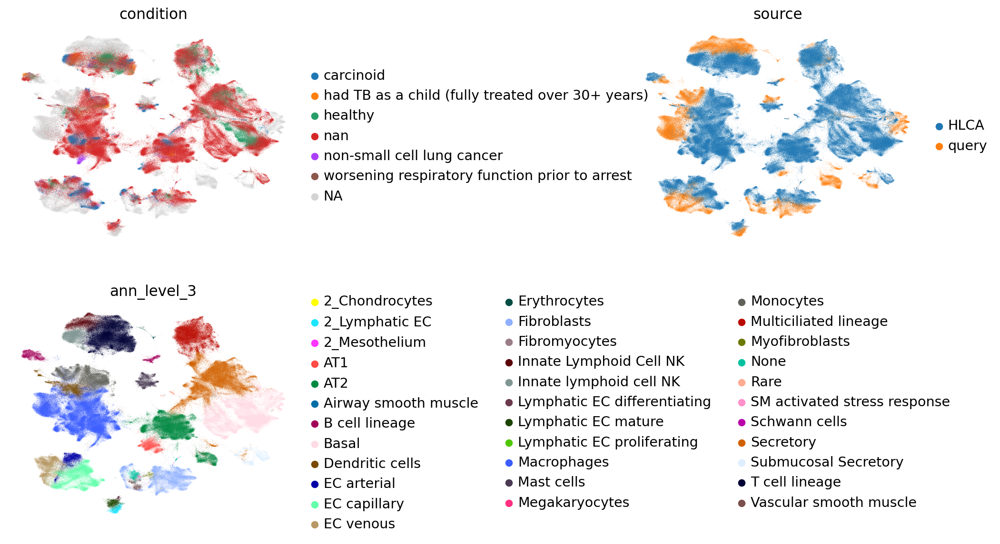

In [64]:
sc.pl.umap(
    full_latent,
    color=["condition",
           "source",
           "ann_level_3",
           #"original_celltype_ann"
#            "scanvi_label"
          ],
    wspace= 0.95,
    frameon=False,
    ncols=2,
#     save = '_meyer_HLCA_scanvi_continualTrainingPlan_initweightsrefmodel.png'
)

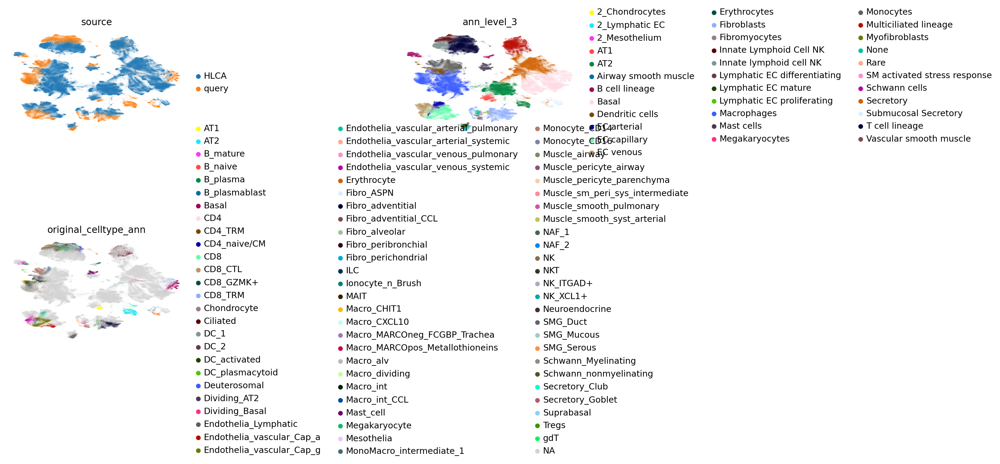

In [65]:
sc.pl.umap(
    full_latent,
    color=["source", 
           "ann_level_3",
           "original_celltype_ann",
          ],
    wspace= 0.95,
    hspace= 0.95,
    frameon=False,
    ncols=2,
#     save = '_meyer_HLCA_scanvi_originalann_initweightsrefmodel.png'
)

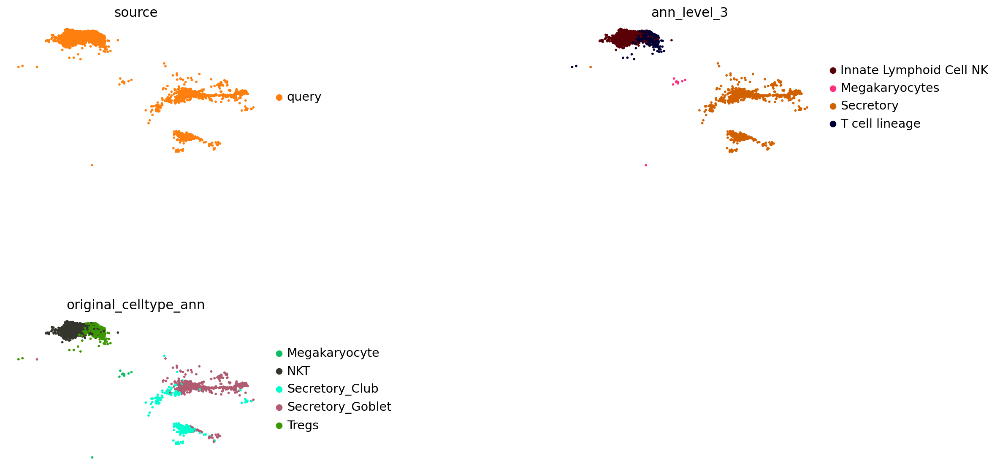

In [66]:
celltypes = ['Megakaryocyte','Secretory_Club','Secretory_Goblet','NKT','Tregs']
sc.pl.umap(
    full_latent[full_latent.obs.original_celltype_ann.isin(celltypes)],
    color=["source", 
           "ann_level_3",
           "original_celltype_ann",
          ],
    
    wspace= 0.95,
    hspace= 0.95,
    frameon=False,
    ncols=2,
#     save = '_meyer_HLCA_scanvi_originalann_initweightsrefmodel_cellsubset.png'
)